In [46]:
# Importar las librerias necesarias
import pickle
import osmnx as ox
#from geopy.geocoders import Nominatim
#from geopy.exc import GeocoderTimedOut
from geopy.geocoders import GeoNames
geolocator = GeoNames(username='andrecnf')  # Register at Geonames
import pandas as pd
import sys
import os
import numpy as np
import time
import difflib
from unidecode import unidecode
import math
import networkx as nx

In [3]:
#############################################################################################
# Obtener las variables guardadas con pickle
#############################################################################################

# G_in = open('/Users/AndreCNF/OneDrive/UNAL/Optimización y Control en Sistemas Distribuidos en Red/Proyecto/PyCharm/G_GeoNames2.pickle' 'rb')
# G_guardado = pickle.load(G_in)
#fig ax = ox.plot_graph(ox.project_graph(G_guardado))

G_in = open('/Users/AndreCNF/OneDrive/UNAL/Optimización y Control en Sistemas Distribuidos en Red/Proyecto/PyCharm/G_DirecSegrTraf.pickle', 'rb')
G_guardado = pickle.load(G_in)

# CentroBarrio_in = open('/Users/AndreCNF/OneDrive/UNAL/Optimización y Control en Sistemas Distribuidos en Red/Proyecto/PyCharm/CentroBarrio.pickle', 'rb')
# CentroBarrio = pickle.load(CentroBarrio_in)

In [6]:
# Obtener la carrera y el barrio a partir de las coordenadas
from geopy.geocoders import Nominatim
geolocator = Nominatim()
location = geolocator.reverse([G_guardado.node[i]['y'], G_guardado.node[i]['x']])
print(location.address)

NameError: name 'i' is not defined

In [322]:
j = 1

for i in G_guardado.nodes():
    print(G_guardado.node[i])
    j += 1
    if j >= 71:
        break

{'osmid': 1060372480, 'y': 4.7021872, 'trafico': 24379.359425999999, 'inseguridad': 6.1913978077945924, 'direccion': 'Sn. Antonio Engativa, Engativa, Bogotá, Bogotá DC, Colombia', 'x': -74.1315355}
{'osmid': 1060372482, 'y': 4.6941015, 'trafico': 24379.359425999999, 'inseguridad': 6.1913978077945924, 'direccion': 'Florida Blanca, Engativa, Bogotá, Bogotá DC, Colombia', 'x': -74.1114272}
{'osmid': 1060372484, 'barrio': 'Los Álamos', 'y': 4.6987006, 'trafico': 24379.359425999999, 'inseguridad': 6.1913978077945924, 'x': -74.1234001, 'direccion': 'Villa Del Mar, Engativa, Bogotá, Bogotá DC, Colombia'}
{'osmid': 1060372487, 'y': 4.7004912, 'trafico': 24379.359425999999, 'inseguridad': 6.1913978077945924, 'direccion': 'Sn. Antonio Engativa, Engativa, Bogotá, Bogotá DC, Colombia', 'x': -74.1291016}
{'osmid': 967049224, 'barrio': 'El Rancho', 'y': 4.7064446, 'trafico': 11431.53667, 'inseguridad': 5.5194048096614754, 'x': -74.20324, 'direccion': 'Puente Grande, Fontibon, Bogotá, Bogotá DC, Colo

In [315]:
#############################################################################################
# Loop para poner todos los datos de crimenes de las localidades en cada nodo correspondiente
#############################################################################################

# Variable que indica el número del nodo del grafo en que se va
contaje = 0;

for i in G_guardado.nodes():
    # Saltar iteración si el nodo actual ya tuviere un valor de inseguridad (para continuar con proceso del día anterior),
    # if 'inseguridad' in G_guardado.node[i]:
    #     continue
    
    for j in range(1, (len(Localidad)+1)):
        if 'direccion' in G_guardado.node[i]:
            if unidecode(Localidad[j]) in G_guardado.node[i]['direccion'] or Localidad[j] in G_guardado.node[i]['direccion']:
                G_guardado.node[i]['inseguridad'] = 100 * DensidadCriminal[j]
                break
        
    if 'inseguridad' not in G_guardado.node[i]:
        G_guardado.node[i]['inseguridad'] = 0
            
    contaje += 1;
    # PrintProgress(contaje, len(G_guardado.nodes()))

In [6]:
#############################################################################################
# Leer archivo de Excel con los nombres de las localidades de Bogotá
#############################################################################################

script_dir = sys.path[0]
xlsx_path = os.path.join(script_dir, '/Users/AndreCNF/OneDrive/UNAL/Optimización y Control en Sistemas Distribuidos en Red/Proyecto/data/DICE015A-ProyeccionesLocalidades-2016.xls.xlsx')
df_Localidades = pd.read_excel(xlsx_path, header=4)
print(df_Localidades.head())

        Localidad      1985      1986      1987      1988      1989      1990  \
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1  ANTONIO NARIÑO  110295.0  105633.0  102092.0   99523.0   97801.0   96822.0   
2  BARRIOS UNIDOS  197991.0  189996.0  183861.0  179345.0  176245.0  174391.0   
3            BOSA  121686.0  123235.0  128076.0  135962.0  146681.0  160030.0   
4       CHAPINERO  109292.0  111291.0  113236.0  115095.0  116829.0  118402.0   

       1991      1992      1993        ...              2012      2013  \
0       NaN       NaN       NaN        ...               NaN       NaN   
1   97106.0   97485.0   97868.0        ...          112137.0  111112.0   
2  174310.0  174990.0  175678.0        ...          250574.0  254001.0   
3  176049.0  194350.0  214749.0        ...          633725.0  651084.0   
4  119946.0  121277.0  122382.0        ...          126351.0  126764.0   

       2014      2015      2016      2017      2018      2019      2

In [143]:
# Guardar nombres de las localidades de Bogota
Localidad = df_Localidades['Nombres correctos'][1:21]

# Guardar población estimada de cada localidad
Poblacion = df_Localidades[2017][1:21]

In [145]:
for i in range(1, (len(Localidad) + 1)):
    print(Localidad[i], Poblacion[i])

Antonio Nariño 109254.0
Barrios Unidos 267106.0
Bosa 731047.0
Chapinero 126591.0
Ciudad Bolívar 733859.0
Engativá 878434.0
Fontibón 413734.0
Kennedy 1208980.0
La Candelaria 22438.0
Los Mártires 93716.0
Puente Aranda 221906.0
Rafael Uribe Uribe 350944.0
San Cristóbal 394358.0
Santa Fe 95201.0
Suba 1282978.0
Sumapaz 7457.0
Teusaquillo 140473.0
Tunjuelito 187971.0
Usaquén 474186.0
Usme 340101.0


In [9]:
#############################################################################################
# Leer archivo de Excel con los datos de crimenes en las localidades de Bogotá
#############################################################################################

script_dir = sys.path[0]
xlsx_path = os.path.join(script_dir, '/Users/AndreCNF/OneDrive/UNAL/Optimización y Control en Sistemas Distribuidos en Red/Proyecto/data/Seguridad_Bogota.xlsx')
df_SeguridadLocal = pd.read_excel(xlsx_path, sheetname='Seguridad (sin accidentes)')
print(df_SeguridadLocal.head())

In [146]:
#############################################################################################
# Atribucion de números de crimenes y densidad criminal a cada barrio
#############################################################################################

# Número total de crimenes
CrimesLocalidad = np.zeros((len(Localidad)+1));

# Número de crimenes por la cantidad de habitantes/población
DensidadCriminal = np.zeros((len(Localidad)+1));

for i in range(1, (len(Localidad)+1)):
    CrimesLocalidad[i] = df_SeguridadLocal[(df_SeguridadLocal["geo_padre_nombre"]=="BOGOTÁ, D.C.") & (df_SeguridadLocal["geografia_nombre"]==("LOCALIDAD " + unidecode(Localidad[i]).upper()))]["Valor"].sum()
    
    # Dividir por el total de población de la localidad
    DensidadCriminal[i] = CrimesLocalidad[i] / Poblacion[i]
    print("Crimenes en", Localidad[i], ": ", CrimesLocalidad[i], ";  Densidad criminal: ", DensidadCriminal[i])
    i += 1;

Crimenes en Antonio Nariño :  3935.0 ;  Densidad criminal:  0.0360169879364


Crimenes en Barrios Unidos :  9329.0 ;  Densidad criminal:  0.0349262090706
Crimenes en Bosa :  7248.0 ;  Densidad criminal:  0.00991454721789


Crimenes en Chapinero :  16734.0 ;  Densidad criminal:  0.132189492144
Crimenes en Ciudad Bolívar :  6859.0 ;  Densidad criminal:  0.00934648208988


Crimenes en Engativá :  15727.0 ;  Densidad criminal:  0.0179034509138
Crimenes en Fontibón :  8191.0 ;  Densidad criminal:  0.0197977444445


Crimenes en Kennedy :  19483.0 ;  Densidad criminal:  0.0161152376383
Crimenes en La Candelaria :  1863.0 ;  Densidad criminal:  0.0830287904448
Crimenes en Los Mártires :  4738.0 ;  Densidad criminal:  0.0505570020061


Crimenes en Puente Aranda :  8071.0 ;  Densidad criminal:  0.0363712562977


Crimenes en Rafael Uribe Uribe :  5057.0 ;  Densidad criminal:  0.0144097063919
Crimenes en

 San Cristóbal :  4100.0 ;  Densidad criminal:  0.0103966446731
Crimenes en Santa Fe :  9038.0 ;  Densidad criminal:  0.0949359775633
Crimenes en Suba :  23591.0 ;  Densidad criminal:  0.0183876886431
Crimenes en Sumapaz : 

 0.0 ;  Densidad criminal:  0.0
Crimenes en Teusaquillo :  9686.0 ;  Densidad criminal:  0.0689527524862
Crimenes en Tunjuelito :  2833.0 ;  Densidad criminal:  0.0150714737912
Crimenes en Usaquén :  17254.0 ;  Densidad criminal:  0.0363865656093


Crimenes en Usme :  3510.0 ;  Densidad criminal:  0.010320463627


In [13]:
#############################################################################################
# Función que imprime el progreso, en percentaje, del loop
#############################################################################################

def PrintProgress(i, max_i):
    sys.stdout.write('\r' + str( (i / max_i ) * 100 ) + "% " + ' ' * 20)
    sys.stdout.flush() # important

In [16]:
import reverse_geocoder as rg
coordinates = (51.5214588,-0.1729636),(9.936033, 76.259952),(37.38605,-122.08385)
results = rg.search([G_guardado.node[i]['y'], G_guardado.node[i]['x']]) # default mode = 2
print(results)

KeyError: 19

In [21]:
# Experimentación con el motor de busqueda de direcciones GeoNames en vez de Nominatim.
# Ventaja: Permite muchos más accesos por día (30000)
# TODO: Hay que asociar barrios a sus localidades, pues este motor solo nos dice el barrio

from geopy.geocoders import GeoNames
import json
geolocator = GeoNames(username='andrecnf')  # Register at Geonames
location = geolocator.reverse([4.673583, -74.058228], timeout=10)
if location != None:
    print(location[0][0].strip().split(",")[0])
else:
    print("No location!", location)

Polo Club


In [343]:
#############################################################################################
# Guardar las variables principales y mayores
#############################################################################################

# G_out = open('G_GeoNames2.pickle', 'wb')
# pickle.dump(G_guardado, G_out)
# G_out.close()

# G_out2 = open('G_Direcciones.pickle', 'wb')
# pickle.dump(G_guardado, G_out2)
# G_out2.close()

# G_out3 = open('G_DirecSegr.pickle', 'wb')
# pickle.dump(G_guardado, G_out3)
# G_out3.close()

G_out4 = open('G_DirecSegrTraf.pickle', 'wb')
pickle.dump(G_guardado, G_out4)
G_out4.close()

# CentroBarrio_out = open('CentroBarrio.pickle', 'wb')
# pickle.dump(CentroBarrio, CentroBarrio_out)
# CentroBarrio_out.close()

# BoundingBox_out = open('BoundingBox.pickle', 'wb')
# pickle.dump(BoundingBox, BoundingBox_out)
# BoundingBox_out.close()
# 
# Raw_out = open('Raw.pickle', 'wb')
# pickle.dump(Raw, Raw_out)
# Raw_out.close()

#df_Localidades_out = open('df_Localidades.pickle', 'wb')
#pickle.dump(df_Localidades, df_Localidades_out)
#df_Localidades_out.close()

#df_SeguridadLocal_out = open('df_SeguridadLocal.pickle', 'wb')
#pickle.dump(df_SeguridadLocal, df_SeguridadLocal_out)
#df_SeguridadLocal_out.close()

In [14]:
#############################################################################################
# Leer archivo de Excel con los nombres de las localidades y barrios de Bogotá
#############################################################################################

script_dir = sys.path[0]
xlsx_path = os.path.join(script_dir, '/Users/AndreCNF/OneDrive/UNAL/Optimización y Control en Sistemas Distribuidos en Red/Proyecto/data/Barrios y localidades Bogotá.xlsx')
df_LocalBarrios = pd.read_excel(xlsx_path, header=0)
df_LocalBarrios.head()

,Código Barrio (old),Barrio (old),Localidad (old),Código Localidad (old),Correción ->,Código Barrio,Barrio,Localidad,Código Localidad
0,1203,CARACAS,ANTONIO NARINO,15,NaN,1203,Caracas,Antonio Narino,15
1,1202,CIUDAD BERNA,ANTONIO NARINO,15,NaN,1202,Ciudad Berna,Antonio Narino,15
2,1204,CIUDAD JARDIN SUR,ANTONIO NARINO,15,NaN,1204,Ciudad Jardin Sur,Antonio Narino,15
3,2301,EDUARDO FREI,ANTONIO NARINO,15,NaN,2301,Eduardo Frei,Antonio Narino,15
4,2107,LA FRAGUA,ANTONIO NARINO,15,NaN,2107,La Fragua,Antonio Narino,15


In [16]:
#############################################################################################
# Guardar lista de direcciones posibles de Bogotá, para después añadir al grafo
#############################################################################################

Direccion = [None for i in range(831)]

for i in range(831):
    Direccion[i] = df_LocalBarrios["Barrio"][i] + ", " + df_LocalBarrios["Localidad"][i] + ", Bogotá, Bogotá DC, Colombia"
    if i < 5:
        print(Direccion[i])

Caracas, Antonio Narino, Bogotá, Bogotá DC, Colombia
Ciudad Berna, Antonio Narino, Bogotá, Bogotá DC, Colombia
Ciudad Jardin Sur, Antonio Narino, Bogotá, Bogotá DC, Colombia
Eduardo Frei, Antonio Narino, Bogotá, Bogotá DC, Colombia
La Fragua, Antonio Narino, Bogotá, Bogotá DC, Colombia


In [26]:
#############################################################################################
# Loop para poner todas las direcciones en cada nodo correspondiente
#############################################################################################
# Hay restricciones de accesos/día a las bases de datos :(

# Variable que indica el número del nodo del grafo en que se va
contaje = 0;

for i in G_guardado.nodes():
    # Saltar iteración si el nodo actual ya tuviere una direccion atribuida (para continuar con proceso del día anterior)
    if any(c in G_guardado.node[i] for c in ('direccion', 'barrio')):
        contaje += 1;
        continue;

    # Variable que dice si ya es posible obtener más direcciones
    flag_access = 0

    # Obtener localización a traves de reverse geocoding con las coordenadas de los nodos
    while flag_access == 0:
        try:
            location = geolocator.reverse([G_guardado.node[i]['y'], G_guardado.node[i]['x']], timeout=100000)
            flag_access = 1
        except:
            # Esperar una hora si se ha pasado el limite
            sys.stdout.write('\r' + 'Limite de accesos a GeoNames ultrapasado. Esperando...' + ' ' * 20)
            sys.stdout.flush()
            time.sleep(10)

    if location != None:
        # Guardar el barrio obtenido
        Barrio = location[0][0].strip().split(\,\)[0]
    else:
        print(\No location!\, location)

    # Guardar la dirección/localización en el nodo
    for j in range(1, (len(Direccion))):
        if Barrio in Direccion[j]:
            G_guardado.node[i]['direccion'] = Direccion[j]
            break

    # Si no se ha encuentrado la direccion correcta, guardar solo el nombre del barrio
    if 'direccion' not in G_guardado.node[i]:
        G_guardado.node[i]['barrio'] = Barrio

    PrintProgress(contaje, len(G_guardado.nodes()))
    contaje += 1;

    # Como hay limite de 2000 accesos a GeoNames por hora, hay que retrasar en 1.8s cada iteración
    # time.sleep(1.805)

print("\n##############################################################################\n"
      "Se ha terminado de localizar todos los nodos del grafo! \n""
      "\n##############################################################################\n")

In [27]:
#############################################################################################
# Confirmar el porcentaje del grafo que se ha localizado con una dirección
#############################################################################################

# Variable que indica el número del nodo del grafo en que se va
contaje = 0;

for i in G_guardado.nodes():
    if any(c in G_guardado.node[i] for c in ('direccion', 'barrio')):
        contaje += 1;
    
PrintProgress(contaje, len(G_guardado.nodes()))

100.0%                     

In [29]:
barriosGuardados = []

for i in G_guardado.nodes():
    if ('barrio' in G_guardado.node[i]) and (G_guardado.node[i]['barrio'] not in barriosGuardados):
        barriosGuardados.append(G_guardado.node[i]['barrio'])
        
print(barriosGuardados)

['Los Álamos', 'El Rancho', 'Santa Mónica', 'Santa Elena', 'San José del Prado', 'El Rincón', 'Carmen del Sol', 'El Diamante', 'Pomona', 'San António Noroccidental', 'La Pradera Norte', 'La Ramada', 'Monserrate', 'Chicó', 'El Rubí', 'Quito', 'El Anhelo', 'Zona G', 'Carlos Alban', 'Batavia', 'Sabanagrande', 'Vereda Tisunque', 'Calderón Tejada', 'Villa Magdala', 'Ciudad Universitária', 'Verada El Rincón', 'La María', 'Engativá', 'Choachí', 'Nuevo Chile', 'San Andrés de Los Altos', 'José Joaquín Vargas', 'Maryland', 'Sede J CUN', 'Sede N CUN', 'Potrero Grande', 'Lago Gaitán', 'Rafael Uribe Uribe', 'San Cristóbal', 'La Selfita', 'La Gran Bretaña', 'La Isla', 'Almirante Colón', 'El Apogeo', 'Santa Fé', 'Doce de Octubre', 'Los Cedros Orientales', 'Veinte de Julio', 'Entrerríos', 'El Charco', 'Coruña', 'El Rincón de los Frailes', 'Jardines del Recuerdo', 'Visión Colombia', 'Corinto', 'El Jazmín', 'Vereda El Jazmín', 'Estorial', 'Jorge Gaitán Cortés', 'Sur América', 'Carimagua', 'Carvajal Osor

In [30]:
barrioCorrecto = []

for i in range(1, len(barriosGuardados)):
    print(barriosGuardados[i])
    print(difflib.get_close_matches(barriosGuardados[i], df_LocalBarrios['Barrio']), "\n")
    barrioCorrecto.append(difflib.get_close_matches(barriosGuardados[i], df_LocalBarrios['Barrio'])[0])

El Rancho
['El Rincon', 'El Chanco', 'El Remanso'] 

Santa Mónica
['Santa Monica', 'Santa Ana', 'Santa Sofia'] 

Santa Elena
['Santa Helena', 'Santa Helena I', 'Santa Ana'] 

San José del Prado
['San Jose Del Prado', 'San Jose Sur', 'San Jose'] 

El Rincón
['El Rincon', 'El Rincon Norte', 'El Encanto'] 

Carmen del Sol
['Isla Del Sol'] 

El Diamante
['Villas Del Diamante', 'El Pite', 'El Batan'] 

Pomona


['Bolonia', 'Roma'] 

San António Noroccidental
['San Antonio Norte', 'Santa Ana Occidental', 'San Antonio Nor-Occ.'] 

La Pradera Norte
['Pradera Norte', 'La Pradera', 'La Merced Norte'] 

La Ramada
['La Alameda', 'La Alameda', 'La Ronda'] 

Monserrate
['Monterrey', 'Molinos Norte'] 

Chicó
['Chico', 'Chicala'] 

El Rubí
['El Rubi'] 

Quito
['Quiroga', 'Quindio', 'Quiba'] 

El Anhelo
['El Mochuelo', 'El Ensueno', 'El Real'] 

Zona G
[] 



IndexError: list index out of range

In [31]:
# print(Direccion[1])
# ,
# "",
# if 4.585782 > float(BoundingBox[1][0]) and 4.585782 < float(BoundingBox[1][1]) and -74.092687 > float(BoundingBox[1][2]) and -74.092687 < float(BoundingBox[1][3]):,
#     print(True),
# else:,
#     print(False),
#     ,
# print(BoundingBox[1]),
# print(BoundingBox[224]),
# "",
# ############################ ALERTA ############################,
# # Las Bounding Boxes están mal!

In [32]:
# # Confirmar si un nodo está en un barrio a traves de los bounding boxes,
# def isInBarrioBBox(G, BoundingBox, i, j):,
#     if G.node[i]['y'] > float(BoundingBox[j][0]) and G.node[i]['y'] < float(BoundingBox[j][1]) and G.node[i]['x'] > float(BoundingBox[j][2]) and G.node[i]['x'] < float(BoundingBox[j][3]):,
#         return True,
#     else:,
#         return False

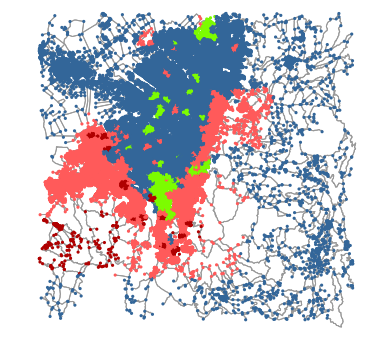

In [326]:
nc = []

# Limites de Bogotá
#x_max = 4.84
#x_min = 4.4
#y_max = -74
#y_min = -74.3

# Recta occidente
def yo(x):
    return 0.659013 * x + (-77.2722)

# Recta norte
def yn(x):
    return -5.87413 * x + (-45.6912)

# Recta norte
def yor(x):
    return 0.200466 * x + (-74.926)

# Recta sur
def ys(x):
    return -22.0299 * x + (24.2968)

for i in G_guardado.nodes():
    if G_guardado.node[i]['x'] < yor(G_guardado.node[i]['y']) and G_guardado.node[i]['x'] < yn(G_guardado.node[i]['y']) and G_guardado.node[i]['x'] > yo(G_guardado.node[i]['y']) and G_guardado.node[i]['x'] > ys(G_guardado.node[i]['y']):
        if G_guardado.node[i]['inseguridad'] > 2 * promedio_insg:
            nc.append('#AF0000')
        elif G_guardado.node[i]['inseguridad'] > promedio_insg:
            nc.append('#FF5A5A')
        # elif G_guardado.node[i]['inseguridad'] < promedio_insg / 3.5:
        #     nc.append('#7CFC00')
        else:
            nc.append('#336699')
    else:
        nc.append('#336699')

fig, ax = ox.plot_graph(G_guardado, node_size=10, node_color=nc, node_zorder=2)
fig.savefig('GrafoBogotaSeguridad2.png', format='png', dpi=500)

In [18]:
import matplotlib.cm as cm

# get a color for each node
def get_color_list(n, color_map='nipy_spectral', start=0, end=1):
    return [cm.get_cmap(color_map)(x) for x in np.linspace(start, end, n)]

print(get_color_list(len(df_LocalBarrios['Barrio']), start=0, end=1))

[(0.0, 0.0, 0.0, 1.0), (0.0, 0.0, 0.0, 1.0), (0.0, 0.0, 0.0, 1.0), (0.0, 0.0, 0.0, 1.0), (0.036603921568627448, 0.0, 0.041827450980392158, 1.0), (0.036603921568627448, 0.0, 0.041827450980392158, 1.0), (0.036603921568627448, 0.0, 0.041827450980392158, 1.0), (0.073207843137254897, 0.0, 0.083654901960784317, 1.0), (0.073207843137254897, 0.0, 0.083654901960784317, 1.0), (0.073207843137254897, 0.0, 0.083654901960784317, 1.0), (0.10981176470588236, 0.0, 0.12548235294117646, 1.0), (0.10981176470588236, 0.0, 0.12548235294117646, 1.0), (0.10981176470588236, 0.0, 0.12548235294117646, 1.0), (0.14641568627450979, 0.0, 0.16730980392156863, 1.0), (0.14641568627450979, 0.0, 0.16730980392156863, 1.0), (0.14641568627450979, 0.0, 0.16730980392156863, 1.0), (0.14641568627450979, 0.0, 0.16730980392156863, 1.0), (0.18301960784313726, 0.0, 0.20913725490196078, 1.0), (0.18301960784313726, 0.0, 0.20913725490196078, 1.0), (0.18301960784313726, 0.0, 0.20913725490196078, 1.0), (0.21962352941176472, 0.0, 0.250964

In [35]:
contaje = 0

for i in G_guardado.nodes():
    if G_guardado.node[i]['inseguridad'] > 0.09:
        if contaje > 5:
            print(G_guardado.node[i]['direccion'])
            print(G_guardado.node[i]['y'], G_guardado.node[i]['x'])
        contaje += 1

    if contaje > 11:
        break

KeyError: 'inseguridad'

In [36]:
x = np.arange(4.4, 4.9, 0.01)

#print(x)

import matplotlib.pyplot as plt
plt.plot(x, yor(x))
update = {'data':[{'fill': 'tonexty'}]}
plt.plot(x, yn(x))
plt.plot(x, ys(x))
plt.plot(x, yo(x))
plt.axis([4.4, 4.9, -74.4, -73.5])
plt.show()

NameError: name 'yor' is not defined

In [37]:
from geopy.geocoders import Nominatim

geolocator = Nominatim()

print(df_LocalBarrios['Barrio'][1])
location = geolocator.geocode([df_LocalBarrios['Barrio'][1], ", Bogotá"])
print(location.raw)

Ciudad Berna


{'lat': '4.5821153', 'place_id': '6602384', 'osm_id': '679776974', 'type': 'police', 'lon': '-74.0903098', 'display_name': 'CAI Ciudad Berna, Avenida Calle 11S, Antonio Nariño, Bogotá, Bogotá Distrito Capital, 111711, Colombia', 'importance': 0.311, 'osm_type': 'node', 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. http://www.openstreetmap.org/copyright', 'boundingbox': ['4.5820653', '4.5821653', '-74.0903598', '-74.0902598'], 'class': 'amenity', 'icon': 'https://nominatim.openstreetmap.org/images/mapicons/amenity_police2.p.20.png'}


In [38]:
from geopy.geocoders import Nominatim,
geolocator = Nominatim(),
,
Raw = [None] * len(df_LocalBarrios[\Barrio\]),
BoundingBox = [None] * len(df_LocalBarrios[\Barrio\]),
,
# Número de barrio de la iteración actual,
contaje = 0,
,
for i in range(1, len(df_LocalBarrios[\Barrio\])):,
    # Contaje de la cantidad de veces que hay una falla en la lectura de información de un barrio,
    cont_fail = 0,
    ,
    if Raw[i] is None or BoundingBox[i] is None:,
        # Variable que dice si ya es posible obtener más informaciones geográficas,
        flag_access = 0,
    ,
        # Obtener localización a traves de reverse geocoding con las coordenadas de los nodos,
        while flag_access == 0:,
            try:,
                location = geolocator.geocode(df_LocalBarrios[\Barrio\][i] + \, Bogotá, Colombia\),
                flag_access = 1,
            except:,
                if cont_fail >= 5:,
                    location = None,
                    break,
                ,
                # Esperar un poco,
                time.sleep(1),
                cont_fail += 1,
                ,
        if location is None:,
            contaje += 1,
            continue,
                ,
        Raw[i] = location.raw,
        BoundingBox[i] = location.raw['boundingbox'],
        contaje += 1,
        PrintProgress(contaje, len(df_LocalBarrios[\Barrio\]))

In [39]:
location = geolocator.geocode([df_LocalBarrios["Barrio"][10], ", Bogotá, Colombia"]) 
print(location.raw)

{'lat': '4.5899204', 'place_id': '179268915', 'osm_id': '2349213', 'type': 'administrative', 'lon': '-74.0950109705037', 'display_name': 'San Antonio, Antonio Nariño, Bogotá, Bogotá Distrito Capital, Colombia', 'importance': 0.495, 'osm_type': 'relation', 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. http://www.openstreetmap.org/copyright', 'boundingbox': ['4.5858562', '4.593973', '-74.099062', '-74.088968'], 'class': 'boundary', 'icon': 'https://nominatim.openstreetmap.org/images/mapicons/poi_boundary_administrative.p.20.png'}


0.0011167818813307574%                     

0.0022335637626615147%                     

0.0033503456439922716%                     

0.004467127525323029%                     

0.005583909406653786%                     

0.006700691287984543%                     

0.007817473169315301%                     

0.008934255050646059%                     

0.010051036931976814%                     

0.011167818813307572%                     

0.01228460069463833%                     

0.013401382575969087%                     

0.014518164457299844%                     

0.015634946338630603%                     

0.01675172821996136%                     

0.017868510101292118%                     

0.018985291982622873%                     

0.02010207386395363%                     

0.021218855745284388%                     

0.022335637626615144%                     

0.023452419507945903%                     

0.02456920138927666%                     

0.02568598327060742%                     

0.026802765151938173%                     

0.027919547033268932%                     

0.029036328914599688%                     

0.030153110795930447%                     

0.031269892677261206%                     

0.03238667455859196%                     

0.03350345643992272%                     

0.03462023832125348%                     

0.035737020202584235%                     

0.03685380208391499%                     

0.03797058396524575%                     

0.03908736584657651%                     

0.04020414772790726%                     

0.04132092960923802%                     

0.042437711490568776%                     

0.04355449337189954%                     

0.04467127525323029%                     

0.04578805713456105%                     

0.046904839015891805%                     

0.04802162089722256%                     

0.04913840277855332%                     

0.05025518465988408%                     

0.05137196654121484%                     

0.05248874842254559%                     

0.053605530303876346%                     

0.05472231218520711%                     

0.055839094066537864%                     

0.05695587594786862%                     

0.058072657829199376%                     

0.05918943971053014%                     

0.060306221591860894%                     

0.06142300347319164%                     

0.06253978535452241%                     

0.06365656723585317%                     

0.06477334911718392%                     

0.06589013099851468%                     

0.06700691287984543%                     

0.06812369476117619%                     

0.06924047664250696%                     

0.0703572585238377%                     

0.07147404040516847%                     

0.07259082228649923%                     

0.07370760416782998%                     

0.07482438604916074%                     

0.0759411679304915%                     

0.07705794981182225%                     

0.07817473169315302%                     

0.07929151357448377%                     

0.08040829545581452%                     

0.08152507733714529%                     

0.08264185921847604%                     

0.0837586410998068%                     

0.08487542298113755%                     

0.08599220486246831%                     

0.08710898674379908%                     

0.08822576862512983%                     

0.08934255050646057%                     

0.09045933238779134%                     

0.0915761142691221%                     

0.09269289615045286%                     

0.09380967803178361%                     

0.09492645991311437%                     

0.09604324179444512%                     

0.09716002367577589%                     

0.09827680555710663%                     

0.0993935874384374%                     

0.10051036931976816%                     

0.10162715120109891%                     

0.10274393308242968%                     

0.10386071496376044%                     

0.10497749684509118%                     

0.10609427872642194%                     

0.10721106060775269%                     

0.10832784248908346%                     

0.10944462437041422%                     

0.11056140625174497%                     

0.11167818813307573%                     

0.1127949700144065%                     

0.11391175189573724%                     

0.115028533777068%                     

0.11614531565839875%                     

0.11726209753972952%                     

0.11837887942106028%                     

0.11949566130239103%                     

0.12061244318372179%                     

0.12172922506505256%                     

0.12284600694638328%                     

0.12396278882771405%                     

0.12507957070904482%                     

0.12619635259037557%                     

0.12731313447170634%                     

0.1284299163530371%                     

0.12954669823436785%                     

0.13066348011569862%                     

0.13178026199702936%                     

0.1328970438783601%                     

0.13401382575969087%                     

0.13513060764102164%                     

0.13624738952235238%                     

0.13736417140368315%                     

0.13848095328501392%                     

0.13959773516634466%                     

0.1407145170476754%                     

0.14183129892900617%                     

0.14294808081033694%                     

0.14406486269166768%                     

0.14518164457299845%                     

0.1462984264543292%                     

0.14741520833565996%                     

0.14853199021699073%                     

0.14964877209832148%                     

0.15076555397965222%                     

0.151882335860983%                     

0.15299911774231376%                     

0.1541158996236445%                     

0.15523268150497527%                     

0.15634946338630604%                     

0.15746624526763678%                     

0.15858302714896755%                     

0.1596998090302983%                     

0.16081659091162903%                     

0.1619333727929598%                     

0.16305015467429057%                     

0.1641669365556213%                     

0.16528371843695208%                     

0.16640050031828285%                     

0.1675172821996136%                     

0.16863406408094433%                     

0.1697508459622751%                     

0.17086762784360587%                     

0.17198440972493662%                     

0.17310119160626738%                     

0.17421797348759815%                     

0.1753347553689289%                     

0.17645153725025967%                     

0.1775683191315904%                     

0.17868510101292115%                     

0.17980188289425192%                     

0.1809186647755827%                     

0.18203544665691343%                     

0.1831522285382442%                     

0.18426901041957497%                     

0.1853857923009057%                     

0.18650257418223645%                     

0.18761935606356722%                     

0.18873613794489796%                     

0.18985291982622873%                     

0.1909697017075595%                     

0.19208648358889024%                     

0.19320326547022101%                     

0.19432004735155178%                     

0.19543682923288253%                     

0.19655361111421327%                     

0.19767039299554406%                     

0.1987871748768748%                     

0.19990395675820555%                     

0.20102073863953632%                     

0.20213752052086706%                     

0.20325430240219783%                     

0.20437108428352857%                     

0.20548786616485937%                     

0.20660464804619008%                     

0.20772142992752088%                     

0.20883821180885162%                     

0.20995499369018236%                     

0.21107177557151313%                     

0.21218855745284387%                     

0.21330533933417464%                     

0.21442212121550538%                     

0.21553890309683618%                     

0.21665568497816692%                     

0.2177724668594977%                     

0.21888924874082843%                     

0.22000603062215918%                     

0.22112281250348995%                     

0.2222395943848207%                     

0.22335637626615146%                     

0.2244731581474822%                     

0.225589940028813%                     

0.22670672191014374%                     

0.22782350379147448%                     

0.22894028567280525%                     

0.230057067554136%                     

0.23117384943546676%                     

0.2322906313167975%                     

0.2334074131981283%                     

0.23452419507945904%                     

0.2356409769607898%                     

0.23675775884212055%                     

0.2378745407234513%                     

0.23899132260478206%                     

0.2401081044861128%                     

0.24122488636744358%                     

0.24234166824877432%                     

0.24345845013010511%                     

0.24457523201143586%                     

0.24569201389276657%                     

0.24680879577409737%                     

0.2479255776554281%                     

0.24904235953675888%                     

0.25015914141808965%                     

0.2512759232994204%                     

0.25239270518075113%                     

0.25350948706208193%                     

0.25462626894341267%                     

0.2557430508247434%                     

0.2568598327060742%                     

0.2579766145874049%                     

0.2590933964687357%                     

0.26021017835006643%                     

0.26132696023139723%                     

0.262443742112728%                     

0.2635605239940587%                     

0.26467730587538946%                     

0.2657940877567202%                     

0.266910869638051%                     

0.26802765151938174%                     

0.26914443340071253%                     

0.2702612152820433%                     

0.271377997163374%                     

0.27249477904470476%                     

0.2736115609260355%                     

0.2747283428073663%                     

0.27584512468869704%                     

0.27696190657002784%                     

0.2780786884513586%                     

0.2791954703326893%                     

0.28031225221402006%                     

0.2814290340953508%                     

0.2825458159766816%                     

0.28366259785801234%                     

0.28477937973934314%                     

0.2858961616206739%                     

0.2870129435020046%                     

0.28812972538333537%                     

0.28924650726466616%                     

0.2903632891459969%                     

0.29148007102732765%                     

0.2925968529086584%                     

0.29371363478998913%                     

0.29483041667131993%                     

0.29594719855265067%                     

0.29706398043398147%                     

0.2981807623153122%                     

0.29929754419664295%                     

0.3004143260779737%                     

0.30153110795930443%                     

0.30264788984063523%                     

0.303764671721966%                     

0.30488145360329677%                     

0.3059982354846275%                     

0.30711501736595825%                     

0.308231799247289%                     

0.30934858112861974%                     

0.31046536300995053%                     

0.3115821448912813%                     

0.3126989267726121%                     

0.3138157086539428%                     

0.31493249053527356%                     

0.3160492724166043%                     

0.3171660542979351%                     

0.31828283617926584%                     

0.3193996180605966%                     

0.3205163999419274%                     

0.32163318182325806%                     

0.32274996370458886%                     

0.3238667455859196%                     

0.3249835274672504%                     

0.32610030934858114%                     

0.3272170912299119%                     

0.3283338731112426%                     

0.32945065499257337%                     

0.33056743687390416%                     

0.3316842187552349%                     

0.3328010006365657%                     

0.33391778251789644%                     

0.3350345643992272%                     

0.33615134628055793%                     

0.33726812816188867%                     

0.33838491004321947%                     

0.3395016919245502%                     

0.340618473805881%                     

0.34173525568721175%                     

0.3428520375685425%                     

0.34396881944987323%                     

0.345085601331204%                     

0.34620238321253477%                     

0.3473191650938655%                     

0.3484359469751963%                     

0.349552728856527%                     

0.3506695107378578%                     

0.35178629261918853%                     

0.35290307450051933%                     

0.3540198563818501%                     

0.3551366382631808%                     

0.35625342014451156%                     

0.3573702020258423%                     

0.3584869839071731%                     

0.35960376578850384%                     

0.36072054766983463%                     

0.3618373295511654%                     

0.3629541114324961%                     

0.36407089331382686%                     

0.3651876751951576%                     

0.3663044570764884%                     

0.36742123895781914%                     

0.36853802083914994%                     

0.3696548027204807%                     

0.3707715846018114%                     

0.37188836648314216%                     

0.3730051483644729%                     

0.3741219302458037%                     

0.37523871212713444%                     

0.37635549400846524%                     

0.3774722758897959%                     

0.3785890577711267%                     

0.37970583965245747%                     

0.38082262153378826%                     

0.381939403415119%                     

0.38305618529644975%                     

0.3841729671777805%                     

0.38528974905911123%                     

0.38640653094044203%                     

0.38752331282177277%                     

0.38864009470310357%                     

0.3897568765844343%                     

0.39087365846576505%                     

0.3919904403470958%                     

0.39310722222842653%                     

0.3942240041097573%                     

0.39534078599108813%                     

0.39645756787241887%                     

0.3975743497537496%                     

0.39869113163508035%                     

0.3998079135164111%                     

0.4009246953977419%                     

0.40204147727907263%                     

0.4031582591604034%                     

0.4042750410417341%                     

0.4053918229230649%                     

0.40650860480439566%                     

0.4076253866857264%                     

0.40874216856705714%                     

0.4098589504483879%                     

0.41097573232971873%                     

0.4120925142110494%                     

0.41320929609238016%                     

0.4143260779737109%                     

0.41544285985504176%                     

0.4165596417363725%                     

0.41767642361770324%                     

0.418793205499034%                     

0.4199099873803647%                     

0.4210267692616955%                     

0.42214355114302626%                     

0.423260333024357%                     

0.42437711490568775%                     

0.42549389678701854%                     

0.4266106786683493%                     

0.42772746054968%                     

0.42884424243101077%                     

0.4299610243123415%                     

0.43107780619367236%                     

0.4321945880750031%                     

0.43331136995633385%                     

0.4344281518376646%                     

0.4355449337189954%                     

0.43666171560032613%                     

0.43777849748165687%                     

0.4388952793629876%                     

0.44001206124431835%                     

0.44112884312564915%                     

0.4422456250069799%                     

0.44336240688831063%                     

0.4444791887696414%                     

0.4455959706509721%                     

0.4467127525323029%                     

0.44782953441363366%                     

0.4489463162949644%                     

0.45006309817629514%                     

0.451179880057626%                     

0.45229666193895673%                     

0.4534134438202875%                     

0.4545302257016182%                     

0.45564700758294896%                     

0.45676378946427976%                     

0.4578805713456105%                     

0.45899735322694124%                     

0.460114135108272%                     

0.4612309169896028%                     

0.4623476988709335%                     

0.46346448075226426%                     

0.464581262633595%                     

0.46569804451492575%                     

0.4668148263962566%                     

0.46793160827758734%                     

0.4690483901589181%                     

0.47016517204024877%                     

0.4712819539215796%                     

0.47239873580291036%                     

0.4735155176842411%                     

0.47463229956557185%                     

0.4757490814469026%                     

0.4768658633282334%                     

0.4779826452095641%                     

0.47909942709089487%                     

0.4802162089722256%                     

0.48133299085355635%                     

0.48244977273488715%                     

0.4835665546162179%                     

0.48468333649754863%                     

0.4858001183788794%                     

0.48691690026021023%                     

0.48803368214154097%                     

0.4891504640228717%                     

0.49026724590420245%                     

0.49138402778553314%                     

0.492500809666864%                     

0.49361759154819473%                     

0.4947343734295255%                     

0.4958511553108562%                     

0.496967937192187%                     

0.49808471907351776%                     

0.4992015009548485%                     

0.5003182828361793%                     

0.50143506471751%                     

0.5025518465988408%                     

0.5036686284801716%                     

0.5047854103615023%                     

0.5059021922428331%                     

0.5070189741241639%                     

0.5081357560054945%                     

0.5092525378868253%                     

0.510369319768156%                     

0.5114861016494868%                     

0.5126028835308176%                     

0.5137196654121484%                     

0.5148364472934791%                     

0.5159532291748098%                     

0.5170700110561407%                     

0.5181867929374714%                     

0.5193035748188022%                     

0.5204203567001329%                     

0.5215371385814637%                     

0.5226539204627945%                     

0.5237707023441251%                     

0.524887484225456%                     

0.5260042661067866%                     

0.5271210479881174%                     

0.5282378298694482%                     

0.5293546117507789%                     

0.5304713936321097%                     

0.5315881755134404%                     

0.5327049573947713%                     

0.533821739276102%                     

0.5349385211574328%                     

0.5360553030387635%                     

0.5371720849200943%                     

0.5382888668014251%                     

0.5394056486827558%                     

0.5405224305640866%                     

0.5416392124454172%                     

0.542755994326748%                     

0.5438727762080788%                     

0.5449895580894095%                     

0.5461063399707403%                     

0.547223121852071%                     

0.5483399037334019%                     

0.5494566856147326%                     

0.5505734674960633%                     

0.5516902493773941%                     

0.5528070312587249%                     

0.5539238131400557%                     

0.5550405950213864%                     

0.5561573769027172%                     

0.5572741587840478%                     

0.5583909406653786%                     

0.5595077225467094%                     

0.5606245044280401%                     

0.5617412863093709%                     

0.5628580681907016%                     

0.5639748500720324%                     

0.5650916319533632%                     

0.5662084138346939%                     

0.5673251957160247%                     

0.5684419775973555%                     

0.5695587594786863%                     

0.570675541360017%                     

0.5717923232413478%                     

0.5729091051226785%                     

0.5740258870040092%                     

0.57514266888534%                     

0.5762594507666707%                     

0.5773762326480015%                     

0.5784930145293323%                     

0.579609796410663%                     

0.5807265782919938%                     

0.5818433601733245%                     

0.5829601420546553%                     

0.5840769239359861%                     

0.5851937058173168%                     

0.5863104876986476%                     

0.5874272695799783%                     

0.5885440514613092%                     

0.5896608333426399%                     

0.5907776152239707%                     

0.5918943971053013%                     

0.5930111789866321%                     

0.5941279608679629%                     

0.5952447427492936%                     

0.5963615246306244%                     

0.5974783065119551%                     

0.5985950883932859%                     

0.5997118702746167%                     

0.6008286521559474%                     

0.6019454340372782%                     

0.6030622159186089%                     

0.6041789977999398%                     

0.6052957796812705%                     

0.6064125615626013%                     

0.607529343443932%                     

0.6086461253252626%                     

0.6097629072065935%                     

0.6108796890879242%                     

0.611996470969255%                     

0.6131132528505857%                     

0.6142300347319165%                     

0.6153468166132473%                     

0.616463598494578%                     

0.6175803803759088%                     

0.6186971622572395%                     

0.6198139441385703%                     

0.6209307260199011%                     

0.6220475079012318%                     

0.6231642897825626%                     

0.6242810716638933%                     

0.6253978535452241%                     

0.6265146354265548%                     

0.6276314173078856%                     

0.6287481991892163%                     

0.6298649810705471%                     

0.6309817629518779%                     

0.6320985448332086%                     

0.6332153267145394%                     

0.6343321085958702%                     

0.6354488904772009%                     

0.6365656723585317%                     

0.6376824542398624%                     

0.6387992361211932%                     

0.639916018002524%                     

0.6410327998838548%                     

0.6421495817651854%                     

0.6432663636465161%                     

0.6443831455278469%                     

0.6454999274091777%                     

0.6466167092905085%                     

0.6477334911718392%                     

0.64885027305317%                     

0.6499670549345008%                     

0.6510838368158315%                     

0.6522006186971623%                     

0.653317400578493%                     

0.6544341824598238%                     

0.6555509643411546%                     

0.6566677462224852%                     

0.657784528103816%                     

0.6589013099851467%                     

0.6600180918664776%                     

0.6611348737478083%                     

0.6622516556291391%                     

0.6633684375104698%                     

0.6644852193918005%                     

0.6656020012731314%                     

0.6667187831544621%                     

0.6678355650357929%                     

0.6689523469171236%                     

0.6700691287984544%                     

0.6711859106797852%                     

0.6723026925611159%                     

0.6734194744424467%                     

0.6745362563237773%                     

0.6756530382051082%                     

0.6767698200864389%                     

0.6778866019677696%                     

0.6790033838491004%                     

0.6801201657304312%                     

0.681236947611762%                     

0.6823537294930927%                     

0.6834705113744235%                     

0.6845872932557542%                     

0.685704075137085%                     

0.6868208570184158%                     

0.6879376388997465%                     

0.6890544207810773%                     

0.690171202662408%                     

0.6912879845437387%                     

0.6924047664250695%                     

0.6935215483064002%                     

0.694638330187731%                     

0.6957551120690618%                     

0.6968718939503926%                     

0.6979886758317233%                     

0.699105457713054%                     

0.7002222395943848%                     

0.7013390214757156%                     

0.7024558033570464%                     

0.7035725852383771%                     

0.7046893671197079%                     

0.7058061490010387%                     

0.7069229308823693%                     

0.7080397127637001%                     

0.7091564946450308%                     

0.7102732765263616%                     

0.7113900584076924%                     

0.7125068402890231%                     

0.7136236221703539%                     

0.7147404040516846%                     

0.7158571859330155%                     

0.7169739678143462%                     

0.718090749695677%                     

0.7192075315770077%                     

0.7203243134583384%                     

0.7214410953396693%                     

0.722557877221%                     

0.7236746591023308%                     

0.7247914409836614%                     

0.7259082228649922%                     

0.727025004746323%                     

0.7281417866276537%                     

0.7292585685089845%                     

0.7303753503903152%                     

0.7314921322716461%                     

0.7326089141529768%                     

0.7337256960343075%                     

0.7348424779156383%                     

0.735959259796969%                     

0.7370760416782999%                     

0.7381928235596306%                     

0.7393096054409614%                     

0.740426387322292%                     

0.7415431692036228%                     

0.7426599510849536%                     

0.7437767329662843%                     

0.7448935148476151%                     

0.7460102967289458%                     

0.7471270786102766%                     

0.7482438604916074%                     

0.7493606423729381%                     

0.7504774242542689%                     

0.7515942061355997%                     

0.7527109880169305%                     

0.7538277698982612%                     

0.7549445517795919%                     

0.7560613336609227%                     

0.7571781155422534%                     

0.7582948974235842%                     

0.7594116793049149%                     

0.7605284611862457%                     

0.7616452430675765%                     

0.7627620249489072%                     

0.763878806830238%                     

0.7649955887115687%                     

0.7661123705928995%                     

0.7672291524742303%                     

0.768345934355561%                     

0.7694627162368918%                     

0.7705794981182225%                     

0.7716962799995533%                     

0.7728130618808841%                     

0.7739298437622149%                     

0.7750466256435455%                     

0.7761634075248763%                     

0.7772801894062071%                     

0.7783969712875378%                     

0.7795137531688686%                     

0.7806305350501993%                     

0.7817473169315301%                     

0.7828640988128608%                     

0.7839808806941916%                     

0.7850976625755225%                     

0.7862144444568531%                     

0.787331226338184%                     

0.7884480082195146%                     

0.7895647901008453%                     

0.7906815719821763%                     

0.7917983538635068%                     

0.7929151357448377%                     

0.7940319176261683%                     

0.7951486995074992%                     

0.79626548138883%                     

0.7973822632701607%                     

0.7984990451514915%                     

0.7996158270328222%                     

0.800732608914153%                     

0.8018493907954838%                     

0.8029661726768145%                     

0.8040829545581453%                     

0.8051997364394761%                     

0.8063165183208068%                     

0.8074333002021375%                     

0.8085500820834682%                     

0.809666863964799%                     

0.8107836458461298%                     

0.8119004277274605%                     

0.8130172096087913%                     

0.814133991490122%                     

0.8152507733714528%                     

0.8163675552527836%                     

0.8174843371341143%                     

0.8186011190154451%                     

0.8197179008967758%                     

0.8208346827781066%                     

0.8219514646594375%                     

0.823068246540768%                     

0.8241850284220988%                     

0.8253018103034298%                     

0.8264185921847603%                     

0.8275353740660912%                     

0.8286521559474218%                     

0.8297689378287527%                     

0.8308857197100835%                     

0.8320025015914142%                     

0.833119283472745%                     

0.8342360653540757%                     

0.8353528472354065%                     

0.8364696291167373%                     

0.837586410998068%                     

0.8387031928793988%                     

0.8398199747607294%                     

0.8409367566420602%                     

0.842053538523391%                     

0.8431703204047217%                     

0.8442871022860525%                     

0.8454038841673832%                     

0.846520666048714%                     

0.8476374479300448%                     

0.8487542298113755%                     

0.8498710116927063%                     

0.8509877935740371%                     

0.8521045754553678%                     

0.8532213573366986%                     

0.8543381392180293%                     

0.85545492109936%                     

0.856571702980691%                     

0.8576884848620215%                     

0.8588052667433523%                     

0.859922048624683%                     

0.8610388305060138%                     

0.8621556123873447%                     

0.8632723942686753%                     

0.8643891761500062%                     

0.8655059580313368%                     

0.8666227399126677%                     

0.8677395217939985%                     

0.8688563036753292%                     

0.86997308555666%                     

0.8710898674379908%                     

0.8722066493193215%                     

0.8733234312006523%                     

0.8744402130819829%                     

0.8755569949633137%                     

0.8766737768446445%                     

0.8777905587259752%                     

0.878907340607306%                     

0.8800241224886367%                     

0.8811409043699675%                     

0.8822576862512983%                     

0.883374468132629%                     

0.8844912500139598%                     

0.8856080318952905%                     

0.8867248137766213%                     

0.8878415956579521%                     

0.8889583775392828%                     

0.8900751594206135%                     

0.8911919413019442%                     

0.892308723183275%                     

0.8934255050646058%                     

0.8945422869459365%                     

0.8956590688272673%                     

0.8967758507085982%                     

0.8978926325899288%                     

0.8990094144712597%                     

0.9001261963525903%                     

0.9012429782339212%                     

0.902359760115252%                     

0.9034765419965827%                     

0.9045933238779135%                     

0.905710105759244%                     

0.906826887640575%                     

0.9079436695219057%                     

0.9090604514032364%                     

0.9101772332845672%                     

0.9112940151658979%                     

0.9124107970472287%                     

0.9135275789285595%                     

0.9146443608098902%                     

0.915761142691221%                     

0.9168779245725517%                     

0.9179947064538825%                     

0.9191114883352133%                     

0.920228270216544%                     

0.9213450520978748%                     

0.9224618339792056%                     

0.9235786158605362%                     

0.924695397741867%                     

0.9258121796231977%                     

0.9269289615045285%                     

0.9280457433858593%                     

0.92916252526719%                     

0.9302793071485208%                     

0.9313960890298515%                     

0.9325128709111823%                     

0.9336296527925132%                     

0.9347464346738438%                     

0.9358632165551747%                     

0.9369799984365053%                     

0.9380967803178362%                     

0.939213562199167%                     

0.9403303440804975%                     

0.9414471259618284%                     

0.9425639078431592%                     

0.9436806897244899%                     

0.9447974716058207%                     

0.9459142534871514%                     

0.9470310353684822%                     

0.948147817249813%                     

0.9492645991311437%                     

0.9503813810124745%                     

0.9514981628938052%                     

0.952614944775136%                     

0.9537317266564668%                     

0.9548485085377975%                     

0.9559652904191283%                     

0.9570820723004589%                     

0.9581988541817897%                     

0.9593156360631205%                     

0.9604324179444512%                     

0.961549199825782%                     

0.9626659817071127%                     

0.9637827635884435%                     

0.9648995454697743%                     

0.966016327351105%                     

0.9671331092324358%                     

0.9682498911137667%                     

0.9693666729950973%                     

0.9704834548764282%                     

0.9716002367577588%                     

0.9727170186390897%                     

0.9738338005204205%                     

0.974950582401751%                     

0.9760673642830819%                     

0.9771841461644125%                     

0.9783009280457434%                     

0.9794177099270742%                     

0.9805344918084049%                     

0.9816512736897357%                     

0.9827680555710663%                     

0.9838848374523972%                     

0.985001619333728%                     

0.9861184012150587%                     

0.9872351830963895%                     

0.9883519649777203%                     

0.989468746859051%                     

0.9905855287403817%                     

0.9917023106217124%                     

0.9928190925030432%                     

0.993935874384374%                     

0.9950526562657047%                     

0.9961694381470355%                     

0.9972862200283662%                     

0.998403001909697%                     

0.9995197837910278%                     

1.0006365656723586%                     

1.0017533475536893%                     

1.00287012943502%                     

1.0039869113163509%                     

1.0051036931976816%                     

1.0062204750790122%                     

1.0073372569603432%                     

1.0084540388416738%                     

1.0095708207230045%                     

1.0106876026043354%                     

1.0118043844856661%                     

1.0129211663669968%                     

1.0140379482483277%                     

1.0151547301296584%                     

1.016271512010989%                     

1.0173882938923198%                     

1.0185050757736507%                     

1.0196218576549816%                     

1.020738639536312%                     

1.021855421417643%                     

1.0229722032989736%                     

1.0240889851803043%                     

1.0252057670616352%                     

1.026322548942966%                     

1.0274393308242968%                     

1.0285561127056273%                     

1.0296728945869582%                     

1.0307896764682891%                     

1.0319064583496196%                     

1.0330232402309505%                     

1.0341400221122814%                     

1.035256803993612%                     

1.0363735858749428%                     

1.0374903677562735%                     

1.0386071496376044%                     

1.039723931518935%                     

1.0408407134002657%                     

1.0419574952815966%                     

1.0430742771629273%                     

1.044191059044258%                     

1.045307840925589%                     

1.0464246228069196%                     

1.0475414046882503%                     

1.048658186569581%                     

1.049774968450912%                     

1.0508917503322426%                     

1.0520085322135733%                     

1.0531253140949042%                     

1.0542420959762349%                     

1.0553588778575655%                     

1.0564756597388965%                     

1.0575924416202271%                     

1.0587092235015578%                     

1.0598260053828887%                     

1.0609427872642194%                     

1.0620595691455503%                     

1.0631763510268808%                     

1.0642931329082117%                     

1.0654099147895426%                     

1.066526696670873%                     

1.067643478552204%                     

1.0687602604335347%                     

1.0698770423148656%                     

1.0709938241961963%                     

1.072110606077527%                     

1.0732273879588579%                     

1.0743441698401885%                     

1.0754609517215192%                     

1.0765777336028501%                     

1.0776945154841808%                     

1.0788112973655115%                     

1.0799280792468424%                     

1.081044861128173%                     

1.0821616430095038%                     

1.0832784248908345%                     

1.0843952067721654%                     

1.085511988653496%                     

1.0866287705348268%                     

1.0877455524161577%                     

1.0888623342974884%                     

1.089979116178819%                     

1.09109589806015%                     

1.0922126799414806%                     

1.0933294618228113%                     

1.094446243704142%                     

1.095563025585473%                     

1.0966798074668038%                     

1.0977965893481343%                     

1.0989133712294652%                     

1.1000301531107959%                     

1.1011469349921266%                     

1.1022637168734575%                     

1.1033804987547882%                     

1.104497280636119%                     

1.1056140625174498%                     

1.1067308443987804%                     

1.1078476262801114%                     

1.1089644081614418%                     

1.1100811900427727%                     

1.1111979719241036%                     

1.1123147538054343%                     

1.113431535686765%                     

1.1145483175680957%                     

1.1156650994494266%                     

1.1167818813307573%                     

1.117898663212088%                     

1.1190154450934189%                     

1.1201322269747496%                     

1.1212490088560803%                     

1.1223657907374112%                     

1.1234825726187418%                     

1.1245993545000725%                     

1.1257161363814032%                     

1.1268329182627341%                     

1.1279497001440648%                     

1.1290664820253955%                     

1.1301832639067264%                     

1.1313000457880573%                     

1.1324168276693878%                     

1.1335336095507187%                     

1.1346503914320494%                     

1.13576717331338%                     

1.136883955194711%                     

1.1380007370760417%                     

1.1391175189573726%                     

1.140234300838703%                     

1.141351082720034%                     

1.1424678646013648%                     

1.1435846464826955%                     

1.1447014283640262%                     

1.145818210245357%                     

1.1469349921266878%                     

1.1480517740080185%                     

1.1491685558893492%                     

1.15028533777068%                     

1.1514021196520108%                     

1.1525189015333415%                     

1.1536356834146724%                     

1.154752465296003%                     

1.1558692471773337%                     

1.1569860290586647%                     

1.1581028109399953%                     

1.159219592821326%                     

1.1603363747026567%                     

1.1614531565839876%                     

1.1625699384653183%                     

1.163686720346649%                     

1.16480350222798%                     

1.1659202841093106%                     

1.1670370659906413%                     

1.1681538478719722%                     

1.1692706297533029%                     

1.1703874116346336%                     

1.1715041935159642%                     

1.1726209753972952%                     

1.173737757278626%                     

1.1748545391599565%                     

1.1759713210412874%                     

1.1770881029226183%                     

1.1782048848039488%                     

1.1793216666852797%                     

1.1804384485666104%                     

1.1815552304479413%                     

1.182672012329272%                     

1.1837887942106027%                     

1.1849055760919336%                     

1.1860223579732643%                     

1.187139139854595%                     

1.1882559217359259%                     

1.1893727036172566%                     

1.1904894854985872%                     

1.191606267379918%                     

1.1927230492612488%                     

1.1938398311425795%                     

1.1949566130239102%                     

1.1960733949052411%                     

1.1971901767865718%                     

1.1983069586679025%                     

1.1994237405492334%                     

1.200540522430564%                     

1.2016573043118948%                     

1.2027740861932257%                     

1.2038908680745564%                     

1.205007649955887%                     

1.2061244318372177%                     

1.2072412137185486%                     

1.2083579955998796%                     

1.20947477748121%                     

1.210591559362541%                     

1.2117083412438716%                     

1.2128251231252025%                     

1.2139419050065332%                     

1.215058686887864%                     

1.2161754687691948%                     

1.2172922506505253%                     

1.2184090325318562%                     

1.219525814413187%                     

1.2206425962945178%                     

1.2217593781758485%                     

1.2228761600571794%                     

1.22399294193851%                     

1.2251097238198407%                     

1.2262265057011714%                     

1.2273432875825023%                     

1.228460069463833%                     

1.2295768513451637%                     

1.2306936332264946%                     

1.2318104151078253%                     

1.232927196989156%                     

1.234043978870487%                     

1.2351607607518176%                     

1.2362775426331483%                     

1.237394324514479%                     

1.2385111063958099%                     

1.2396278882771405%                     

1.2407446701584712%                     

1.2418614520398021%                     

1.242978233921133%                     

1.2440950158024635%                     

1.2452117976837944%                     

1.246328579565125%                     

1.2474453614464558%                     

1.2485621433277867%                     

1.2496789252091174%                     

1.2507957070904483%                     

1.2519124889717788%                     

1.2530292708531097%                     

1.2541460527344406%                     

1.2552628346157713%                     

1.256379616497102%                     

1.2574963983784326%                     

1.2586131802597635%                     

1.2597299621410942%                     

1.260846744022425%                     

1.2619635259037558%                     

1.2630803077850865%                     

1.2641970896664172%                     

1.265313871547748%                     

1.2664306534290788%                     

1.2675474353104095%                     

1.2686642171917404%                     

1.269780999073071%                     

1.2708977809544018%                     

1.2720145628357324%                     

1.2731313447170634%                     

1.274248126598394%                     

1.2753649084797247%                     

1.2764816903610556%                     

1.2775984722423863%                     

1.278715254123717%                     

1.279832036005048%                     

1.2809488178863786%                     

1.2820655997677095%                     

1.28318238164904%                     

1.2842991635303709%                     

1.2854159454117018%                     

1.2865327272930323%                     

1.2876495091743632%                     

1.2887662910556938%                     

1.2898830729370248%                     

1.2909998548183554%                     

1.2921166366996861%                     

1.293233418581017%                     

1.2943502004623477%                     

1.2954669823436784%                     

1.2965837642250093%                     

1.29770054610634%                     

1.2988173279876707%                     

1.2999341098690016%                     

1.3010508917503323%                     

1.302167673631663%                     

1.3032844555129937%                     

1.3044012373943246%                     

1.3055180192756553%                     

1.306634801156986%                     

1.3077515830383168%                     

1.3088683649196475%                     

1.3099851468009782%                     

1.3111019286823091%                     

1.3122187105636398%                     

1.3133354924449705%                     

1.3144522743263014%                     

1.315569056207632%                     

1.3166858380889628%                     

1.3178026199702935%                     

1.3189194018516244%                     

1.3200361837329553%                     

1.3211529656142857%                     

1.3222697474956167%                     

1.3233865293769473%                     

1.3245033112582782%                     

1.325620093139609%                     

1.3267368750209396%                     

1.3278536569022705%                     

1.328970438783601%                     

1.330087220664932%                     

1.3312040025462628%                     

1.3323207844275935%                     

1.3334375663089242%                     

1.3345543481902549%                     

1.3356711300715858%                     

1.3367879119529165%                     

1.3379046938342471%                     

1.339021475715578%                     

1.3401382575969087%                     

1.3412550394782394%                     

1.3423718213595703%                     

1.343488603240901%                     

1.3446053851222317%                     

1.3457221670035626%                     

1.3468389488848933%                     

1.347955730766224%                     

1.3490725126475547%                     

1.3501892945288856%                     

1.3513060764102165%                     

1.352422858291547%                     

1.3535396401728779%                     

1.3546564220542086%                     

1.3557732039355392%                     

1.3568899858168701%                     

1.3580067676982008%                     

1.3591235495795317%                     

1.3602403314608624%                     

1.3613571133421931%                     

1.362473895223524%                     

1.3635906771048545%                     

1.3647074589861854%                     

1.3658242408675163%                     

1.366941022748847%                     

1.3680578046301777%                     

1.3691745865115084%                     

1.3702913683928393%                     

1.37140815027417%                     

1.3725249321555006%                     

1.3736417140368316%                     

1.3747584959181622%                     

1.375875277799493%                     

1.3769920596808238%                     

1.3781088415621545%                     

1.3792256234434852%                     

1.380342405324816%                     

1.3814591872061468%                     

1.3825759690874775%                     

1.3836927509688082%                     

1.384809532850139%                     

1.3859263147314698%                     

1.3870430966128005%                     

1.3881598784941314%                     

1.389276660375462%                     

1.3903934422567927%                     

1.3915102241381236%                     

1.3926270060194543%                     

1.3937437879007852%                     

1.3948605697821157%                     

1.3959773516634466%                     

1.3970941335447775%                     

1.398210915426108%                     

1.399327697307439%                     

1.4004444791887696%                     

1.4015612610701005%                     

1.4026780429514312%                     

1.4037948248327619%                     

1.4049116067140928%                     

1.4060283885954235%                     

1.4071451704767541%                     

1.408261952358085%                     

1.4093787342394157%                     

1.4104955161207464%                     

1.4116122980020773%                     

1.412729079883408%                     

1.4138458617647387%                     

1.4149626436460694%                     

1.4160794255274003%                     

1.417196207408731%                     

1.4183129892900617%                     

1.4194297711713926%                     

1.4205465530527233%                     

1.421663334934054%                     

1.4227801168153849%                     

1.4238968986967155%                     

1.4250136805780462%                     

1.426130462459377%                     

1.4272472443407078%                     

1.4283640262220387%                     

1.4294808081033692%                     

1.4305975899847%                     

1.431714371866031%                     

1.4328311537473615%                     

1.4339479356286924%                     

1.435064717510023%                     

1.436181499391354%                     

1.4372982812726847%                     

1.4384150631540153%                     

1.4395318450353463%                     

1.4406486269166767%                     

1.4417654087980076%                     

1.4428821906793385%                     

1.4439989725606692%                     

1.445115754442%                     

1.4462325363233306%                     

1.4473493182046615%                     

1.4484661000859922%                     

1.4495828819673229%                     

1.4506996638486538%                     

1.4518164457299845%                     

1.4529332276113152%                     

1.454050009492646%                     

1.4551667913739768%                     

1.4562835732553074%                     

1.4574003551366383%                     

1.458517137017969%                     

1.4596339188992997%                     

1.4607507007806304%                     

1.4618674826619613%                     

1.4629842645432922%                     

1.4641010464246227%                     

1.4652178283059536%                     

1.4663346101872843%                     

1.467451392068615%                     

1.4685681739499459%                     

1.4696849558312766%                     

1.4708017377126075%                     

1.471918519593938%                     

1.4730353014752688%                     

1.4741520833565998%                     

1.4752688652379304%                     

1.4763856471192611%                     

1.477502429000592%                     

1.4786192108819227%                     

1.4797359927632534%                     

1.480852774644584%                     

1.481969556525915%                     

1.4830863384072457%                     

1.4842031202885764%                     

1.4853199021699073%                     

1.486436684051238%                     

1.4875534659325687%                     

1.4886702478138996%                     

1.4897870296952302%                     

1.490903811576561%                     

1.4920205934578916%                     

1.4931373753392225%                     

1.4942541572205532%                     

1.495370939101884%                     

1.4964877209832148%                     

1.4976045028645455%                     

1.4987212847458762%                     

1.499838066627207%                     

1.5009548485085378%                     

1.5020716303898685%                     

1.5031884122711994%                     

1.50430519415253%                     

1.505421976033861%                     

1.5065387579151914%                     

1.5076555397965223%                     

1.5087723216778532%                     

1.5098891035591837%                     

1.5110058854405146%                     

1.5121226673218453%                     

1.5132394492031762%                     

1.514356231084507%                     

1.5154730129658376%                     

1.5165897948471685%                     

1.5177065767284992%                     

1.5188233586098299%                     

1.5199401404911608%                     

1.5210569223724915%                     

1.5221737042538221%                     

1.523290486135153%                     

1.5244072680164837%                     

1.5255240498978144%                     

1.5266408317791451%                     

1.527757613660476%                     

1.5288743955418067%                     

1.5299911774231374%                     

1.5311079593044683%                     

1.532224741185799%                     

1.5333415230671297%                     

1.5344583049484606%                     

1.5355750868297913%                     

1.536691868711122%                     

1.5378086505924526%                     

1.5389254324737835%                     

1.5400422143551145%                     

1.541158996236445%                     

1.5422757781177758%                     

1.5433925599991065%                     

1.5445093418804374%                     

1.5456261237617681%                     

1.5467429056430988%                     

1.5478596875244297%                     

1.5489764694057604%                     

1.550093251287091%                     

1.551210033168422%                     

1.5523268150497527%                     

1.5534435969310834%                     

1.5545603788124143%                     

1.555677160693745%                     

1.5567939425750756%                     

1.5579107244564063%                     

1.5590275063377372%                     

1.560144288219068%                     

1.5612610701003986%                     

1.5623778519817295%                     

1.5634946338630602%                     

1.564611415744391%                     

1.5657281976257216%                     

1.5668449795070525%                     

1.5679617613883832%                     

1.569078543269714%                     

1.570195325151045%                     

1.5713121070323754%                     

1.5724288889137061%                     

1.573545670795037%                     

1.574662452676368%                     

1.5757792345576986%                     

1.576896016439029%                     

1.57801279832036%                     

1.5791295802016907%                     

1.5802463620830216%                     

1.5813631439643525%                     

1.582479925845683%                     

1.5835967077270137%                     

1.5847134896083446%                     

1.5858302714896755%                     

1.5869470533710062%                     

1.5880638352523366%                     

1.5891806171336675%                     

1.5902973990149984%                     

1.5914141808963291%                     

1.59253096277766%                     

1.5936477446589905%                     

1.5947645265403214%                     

1.595881308421652%                     

1.596998090302983%                     

1.5981148721843137%                     

1.5992316540656444%                     

1.600348435946975%                     

1.601465217828306%                     

1.6025819997096367%                     

1.6036987815909676%                     

1.6048155634722985%                     

1.605932345353629%                     

1.6070491272349596%                     

1.6081659091162905%                     

1.6092826909976214%                     

1.6103994728789521%                     

1.6115162547602826%                     

1.6126330366416135%                     

1.6137498185229444%                     

1.614866600404275%                     

1.615983382285606%                     

1.6171001641669365%                     

1.6182169460482672%                     

1.619333727929598%                     

1.620450509810929%                     

1.6215672916922597%                     

1.6226840735735901%                     

1.623800855454921%                     

1.624917637336252%                     

1.6260344192175826%                     

1.6271512010989135%                     

1.628267982980244%                     

1.629384764861575%                     

1.6305015467429056%                     

1.6316183286242365%                     

1.6327351105055672%                     

1.6338518923868977%                     

1.6349686742682286%                     

1.6360854561495595%                     

1.6372022380308902%                     

1.638319019912221%                     

1.6394358017935515%                     

1.6405525836748824%                     

1.6416693655562131%                     

1.642786147437544%                     

1.643902929318875%                     

1.6450197112002054%                     

1.646136493081536%                     

1.647253274962867%                     

1.6483700568441977%                     

1.6494868387255286%                     

1.6506036206068595%                     

1.65172040248819%                     

1.6528371843695207%                     

1.6539539662508516%                     

1.6550707481321825%                     

1.6561875300135132%                     

1.6573043118948436%                     

1.6584210937761745%                     

1.6595378756575054%                     

1.6606546575388361%                     

1.661771439420167%                     

1.6628882213014975%                     

1.6640050031828284%                     

1.665121785064159%                     

1.66623856694549%                     

1.6673553488268207%                     

1.6684721307081514%                     

1.669588912589482%                     

1.670705694470813%                     

1.6718224763521436%                     

1.6729392582334746%                     

1.674056040114805%                     

1.675172821996136%                     

1.6762896038774666%                     

1.6774063857587975%                     

1.6785231676401284%                     

1.679639949521459%                     

1.6807567314027896%                     

1.6818735132841205%                     

1.6829902951654514%                     

1.684107077046782%                     

1.6852238589281126%                     

1.6863406408094435%                     

1.6874574226907741%                     

1.688574204572105%                     

1.689690986453436%                     

1.6908077683347664%                     

1.6919245502160971%                     

1.693041332097428%                     

1.694158113978759%                     

1.6952748958600896%                     

1.6963916777414205%                     

1.697508459622751%                     

1.698625241504082%                     

1.6997420233854126%                     

1.7008588052667435%                     

1.7019755871480742%                     

1.7030923690294046%                     

1.7042091509107355%                     

1.7053259327920665%                     

1.7064427146733971%                     

1.707559496554728%                     

1.7086762784360585%                     

1.7097930603173894%                     

1.71090984219872%                     

1.712026624080051%                     

1.713143405961382%                     

1.7142601878427124%                     

1.715376969724043%                     

1.716493751605374%                     

1.7176105334867047%                     

1.7187273153680356%                     

1.719844097249366%                     

1.720960879130697%                     

1.7220776610120276%                     

1.7231944428933585%                     

1.7243112247746895%                     

1.72542800665602%                     

1.7265447885373506%                     

1.7276615704186815%                     

1.7287783523000124%                     

1.729895134181343%                     

1.7310119160626736%                     

1.7321286979440045%                     

1.7332454798253354%                     

1.734362261706666%                     

1.735479043587997%                     

1.7365958254693274%                     

1.7377126073506584%                     

1.738829389231989%                     

1.73994617111332%                     

1.7410629529946506%                     

1.7421797348759815%                     

1.743296516757312%                     

1.744413298638643%                     

1.7455300805199736%                     

1.7466468624013045%                     

1.7477636442826354%                     

1.7488804261639659%                     

1.7499972080452966%                     

1.7511139899266275%                     

1.7522307718079584%                     

1.753347553689289%                     

1.7544643355706195%                     

1.7555811174519504%                     

1.7566978993332811%                     

1.757814681214612%                     

1.758931463095943%                     

1.7600482449772734%                     

1.761165026858604%                     

1.762281808739935%                     

1.763398590621266%                     

1.7645153725025966%                     

1.765632154383927%                     

1.766748936265258%                     

1.7678657181465889%                     

1.7689825000279196%                     

1.7700992819092505%                     

1.771216063790581%                     

1.7723328456719116%                     

1.7734496275532425%                     

1.7745664094345734%                     

1.7756831913159041%                     

1.7767999731972346%                     

1.7779167550785655%                     

1.7790335369598964%                     

1.780150318841227%                     

1.781267100722558%                     

1.7823838826038885%                     

1.7835006644852194%                     

1.78461744636655%                     

1.785734228247881%                     

1.7868510101292117%                     

1.7879677920105423%                     

1.789084573891873%                     

1.790201355773204%                     

1.7913181376545346%                     

1.7924349195358655%                     

1.7935517014171964%                     

1.794668483298527%                     

1.7957852651798576%                     

1.7969020470611885%                     

1.7980188289425194%                     

1.79913561082385%                     

1.8002523927051806%                     

1.8013691745865115%                     

1.8024859564678424%                     

1.803602738349173%                     

1.804719520230504%                     

1.8058363021118344%                     

1.8069530839931653%                     

1.808069865874496%                     

1.809186647755827%                     

1.8103034296371576%                     

1.811420211518488%                     

1.812536993399819%                     

1.81365377528115%                     

1.8147705571624806%                     

1.8158873390438115%                     

1.817004120925142%                     

1.8181209028064729%                     

1.8192376846878036%                     

1.8203544665691345%                     

1.8214712484504654%                     

1.8225880303317958%                     

1.8237048122131265%                     

1.8248215940944574%                     

1.8259383759757881%                     

1.827055157857119%                     

1.8281719397384495%                     

1.8292887216197804%                     

1.830405503501111%                     

1.831522285382442%                     

1.832639067263773%                     

1.8337558491451034%                     

1.834872631026434%                     

1.835989412907765%                     

1.8371061947890959%                     

1.8382229766704266%                     

1.8393397585517575%                     

1.840456540433088%                     

1.8415733223144186%                     

1.8426901041957495%                     

1.8438068860770804%                     

1.8449236679584111%                     

1.8460404498397416%                     

1.8471572317210725%                     

1.8482740136024034%                     

1.849390795483734%                     

1.850507577365065%                     

1.8516243592463955%                     

1.8527411411277264%                     

1.853857923009057%                     

1.854974704890388%                     

1.8560914867717186%                     

1.8572082686530493%                     

1.85832505053438%                     

1.859441832415711%                     

1.8605586142970416%                     

1.8616753961783725%                     

1.862792178059703%                     

1.863908959941034%                     

1.8650257418223646%                     

1.8661425237036955%                     

1.8672593055850264%                     

1.8683760874663569%                     

1.8694928693476875%                     

1.8706096512290185%                     

1.8717264331103494%                     

1.87284321499168%                     

1.8739599968730105%                     

1.8750767787543414%                     

1.8761935606356723%                     

1.877310342517003%                     

1.878427124398334%                     

1.8795439062796644%                     

1.880660688160995%                     

1.881777470042326%                     

1.882894251923657%                     

1.8840110338049876%                     

1.8851278156863185%                     

1.886244597567649%                     

1.8873613794489799%                     

1.8884781613303105%                     

1.8895949432116415%                     

1.8907117250929724%                     

1.8918285069743028%                     

1.8929452888556335%                     

1.8940620707369644%                     

1.895178852618295%                     

1.896295634499626%                     

1.8974124163809565%                     

1.8985291982622874%                     

1.899645980143618%                     

1.900762762024949%                     

1.90187954390628%                     

1.9029963257876104%                     

1.904113107668941%                     

1.905229889550272%                     

1.9063466714316029%                     

1.9074634533129335%                     

1.908580235194264%                     

1.909697017075595%                     

1.9108137989569256%                     

1.9119305808382565%                     

1.9130473627195874%                     

1.9141641446009179%                     

1.9152809264822486%                     

1.9163977083635795%                     

1.9175144902449104%                     

1.918631272126241%                     

1.9197480540075715%                     

1.9208648358889024%                     

1.9219816177702334%                     

1.923098399651564%                     

1.924215181532895%                     

1.9253319634142254%                     

1.9264487452955563%                     

1.927565527176887%                     

1.928682309058218%                     

1.9297990909395486%                     

1.9309158728208795%                     

1.93203265470221%                     

1.9331494365835409%                     

1.9342662184648716%                     

1.9353830003462025%                     

1.9364997822275334%                     

1.9376165641088638%                     

1.9387333459901945%                     

1.9398501278715254%                     

1.9409669097528564%                     

1.942083691634187%                     

1.9432004735155175%                     

1.9443172553968484%                     

1.9454340372781793%                     

1.94655081915951%                     

1.947667601040841%                     

1.9487843829221714%                     

1.949901164803502%                     

1.951017946684833%                     

1.9521347285661639%                     

1.9532515104474946%                     

1.954368292328825%                     

1.955485074210156%                     

1.9566018560914868%                     

1.9577186379728175%                     

1.9588354198541484%                     

1.959952201735479%                     

1.9610689836168098%                     

1.9621857654981405%                     

1.9633025473794714%                     

1.964419329260802%                     

1.9655361111421326%                     

1.9666528930234635%                     

1.9677696749047944%                     

1.968886456786125%                     

1.970003238667456%                     

1.9711200205487864%                     

1.9722368024301173%                     

1.973353584311448%                     

1.974470366192779%                     

1.9755871480741098%                     

1.9767039299554405%                     

1.977820711836771%                     

1.978937493718102%                     

1.9800542755994326%                     

1.9811710574807635%                     

1.9822878393620944%                     

1.9834046212434249%                     

1.9845214031247556%                     

1.9856381850060865%                     

1.9867549668874174%                     

1.987871748768748%                     

1.9889885306500785%                     

1.9901053125314094%                     

1.9912220944127403%                     

1.992338876294071%                     

1.993455658175402%                     

1.9945724400567324%                     

1.9956892219380633%                     

1.996806003819394%                     

1.997922785700725%                     

1.9990395675820556%                     

2.0001563494633863%                     

2.001273131344717%                     

2.0023899132260476%                     

2.0035066951073786%                     

2.0046234769887095%                     

2.00574025887004%                     

2.006857040751371%                     

2.0079738226327017%                     

2.009090604514032%                     

2.010207386395363%                     

2.0113241682766936%                     

2.0124409501580245%                     

2.0135577320393554%                     

2.0146745139206863%                     

2.015791295802017%                     

2.0169080776833477%                     

2.018024859564678%                     

2.019141641446009%                     

2.02025842332734%                     

2.021375205208671%                     

2.0224919870900018%                     

2.0236087689713322%                     

2.024725550852663%                     

2.0258423327339936%                     

2.0269591146153245%                     

2.0280758964966554%                     

2.029192678377986%                     

2.030309460259317%                     

2.0314262421406477%                     

2.032543024021978%                     

2.033659805903309%                     

2.0347765877846395%                     

2.0358933696659705%                     

2.0370101515473014%                     

2.0381269334286323%                     

2.039243715309963%                     

2.0403604971912936%                     

2.041477279072624%                     

2.042594060953955%                     

2.043710842835286%                     

2.044827624716617%                     

2.0459444065979473%                     

2.047061188479278%                     

2.0481779703606087%                     

2.0492947522419396%                     

2.0504115341232705%                     

2.051528316004601%                     

2.052645097885932%                     

2.0537618797672628%                     

2.0548786616485937%                     

2.055995443529924%                     

2.0571122254112546%                     

2.0582290072925855%                     

2.0593457891739164%                     

2.0604625710552473%                     

2.0615793529365782%                     

2.0626961348179087%                     

2.063812916699239%                     

2.06492969858057%                     

2.066046480461901%                     

2.067163262343232%                     

2.068280044224563%                     

2.0693968261058933%                     

2.070513607987224%                     

2.0716303898685546%                     

2.0727471717498855%                     

2.0738639536312165%                     

2.074980735512547%                     

2.076097517393878%                     

2.0772142992752087%                     

2.078331081156539%                     

2.07944786303787%                     

2.0805646449192006%                     

2.0816814268005315%                     

2.0827982086818624%                     

2.0839149905631933%                     

2.085031772444524%                     

2.0861485543258547%                     

2.087265336207185%                     

2.088382118088516%                     

2.089498899969847%                     

2.090615681851178%                     

2.0917324637325083%                     

2.0928492456138392%                     

2.0939660274951697%                     

2.0950828093765006%                     

2.0961995912578315%                     

2.097316373139162%                     

2.098433155020493%                     

2.099549936901824%                     

2.1006667187831547%                     

2.101783500664485%                     

2.1029002825458156%                     

2.1040170644271465%                     

2.1051338463084774%                     

2.1062506281898083%                     

2.1073674100711393%                     

2.1084841919524697%                     

2.1096009738338006%                     

2.110717755715131%                     

2.111834537596462%                     

2.112951319477793%                     

2.114068101359124%                     

2.1151848832404543%                     

2.116301665121785%                     

2.1174184470031157%                     

2.1185352288844466%                     

2.1196520107657775%                     

2.120768792647108%                     

2.121885574528439%                     

2.1230023564097698%                     

2.1241191382911007%                     

2.125235920172431%                     

2.1263527020537616%                     

2.1274694839350925%                     

2.1285862658164234%                     

2.1297030476977543%                     

2.1308198295790852%                     

2.1319366114604157%                     

2.133053393341746%                     

2.134170175223077%                     

2.135286957104408%                     

2.136403738985739%                     

2.1375205208670693%                     

2.1386373027484002%                     

2.139754084629731%                     

2.1408708665110616%                     

2.1419876483923925%                     

2.143104430273723%                     

2.144221212155054%                     

2.145337994036385%                     

2.1464547759177157%                     

2.147571557799046%                     

2.148688339680377%                     

2.1498051215617076%                     

2.1509219034430385%                     

2.1520386853243694%                     

2.1531554672057003%                     

2.1542722490870307%                     

2.1553890309683617%                     

2.156505812849692%                     

2.157622594731023%                     

2.158739376612354%                     

2.159856158493685%                     

2.1609729403750153%                     

2.162089722256346%                     

2.163206504137677%                     

2.1643232860190076%                     

2.1654400679003385%                     

2.166556849781669%                     

2.167673631663%                     

2.1687904135443308%                     

2.1699071954256617%                     

2.171023977306992%                     

2.1721407591883226%                     

2.1732575410696535%                     

2.1743743229509844%                     

2.1754911048323153%                     

2.1766078867136462%                     

2.1777246685949767%                     

2.1788414504763076%                     

2.179958232357638%                     

2.181075014238969%                     

2.1821917961203%                     

2.1833085780016304%                     

2.1844253598829613%                     

2.185542141764292%                     

2.1866589236456226%                     

2.1877757055269536%                     

2.188892487408284%                     

2.190009269289615%                     

2.191126051170946%                     

2.1922428330522767%                     

2.1933596149336076%                     

2.194476396814938%                     

2.1955931786962686%                     

2.1967099605775995%                     

2.1978267424589304%                     

2.1989435243402613%                     

2.2000603062215918%                     

2.2011770881029227%                     

2.202293869984253%                     

2.203410651865584%                     

2.204527433746915%                     

2.2056442156282454%                     

2.2067609975095763%                     

2.2078777793909072%                     

2.208994561272238%                     

2.2101113431535686%                     

2.2112281250348995%                     

2.21234490691623%                     

2.213461688797561%                     

2.214578470678892%                     

2.2156952525602227%                     

2.216812034441553%                     

2.2179288163228836%                     

2.2190455982042145%                     

2.2201623800855455%                     

2.2212791619668764%                     

2.2223959438482073%                     

2.2235127257295377%                     

2.2246295076108686%                     

2.225746289492199%                     

2.22686307137353%                     

2.227979853254861%                     

2.2290966351361914%                     

2.2302134170175223%                     

2.231330198898853%                     

2.2324469807801837%                     

2.2335637626615146%                     

2.234680544542845%                     

2.235797326424176%                     

2.236914108305507%                     

2.2380308901868378%                     

2.2391476720681687%                     

2.240264453949499%                     

2.2413812358308296%                     

2.2424980177121605%                     

2.2436147995934914%                     

2.2447315814748223%                     

2.245848363356153%                     

2.2469651452374837%                     

2.2480819271188146%                     

2.249198709000145%                     

2.250315490881476%                     

2.2514322727628064%                     

2.2525490546441373%                     

2.2536658365254683%                     

2.254782618406799%                     

2.2558994002881296%                     

2.2570161821694605%                     

2.258132964050791%                     

2.259249745932122%                     

2.260366527813453%                     

2.2614833096947837%                     

2.2626000915761146%                     

2.263716873457445%                     

2.2648336553387756%                     

2.2659504372201065%                     

2.2670672191014374%                     

2.2681840009827683%                     

2.2693007828640988%                     

2.2704175647454297%                     

2.27153434662676%                     

2.272651128508091%                     

2.273767910389422%                     

2.2748846922707524%                     

2.2760014741520833%                     

2.2771182560334142%                     

2.278235037914745%                     

2.2793518197960756%                     

2.280468601677406%                     

2.281585383558737%                     

2.282702165440068%                     

2.283818947321399%                     

2.2849357292027297%                     

2.28605251108406%                     

2.287169292965391%                     

2.2882860748467215%                     

2.2894028567280524%                     

2.2905196386093833%                     

2.291636420490714%                     

2.2927532023720447%                     

2.2938699842533756%                     

2.294986766134706%                     

2.296103548016037%                     

2.2972203298973675%                     

2.2983371117786984%                     

2.2994538936600293%                     

2.30057067554136%                     

2.301687457422691%                     

2.3028042393040216%                     

2.303921021185352%                     

2.305037803066683%                     

2.306154584948014%                     

2.3072713668293447%                     

2.3083881487106757%                     

2.309504930592006%                     

2.3106217124733366%                     

2.3117384943546675%                     

2.3128552762359984%                     

2.3139720581173293%                     

2.3150888399986598%                     

2.3162056218799907%                     

2.3173224037613216%                     

2.318439185642652%                     

2.319555967523983%                     

2.3206727494053134%                     

2.3217895312866443%                     

2.3229063131679752%                     

2.324023095049306%                     

2.3251398769306366%                     

2.326256658811967%                     

2.327373440693298%                     

2.328490222574629%                     

2.32960700445596%                     

2.3307237863372907%                     

2.331840568218621%                     

2.332957350099952%                     

2.3340741319812826%                     

2.3351909138626135%                     

2.3363076957439444%                     

2.337424477625275%                     

2.3385412595066057%                     

2.3396580413879366%                     

2.340774823269267%                     

2.341891605150598%                     

2.3430083870319285%                     

2.3441251689132594%                     

2.3452419507945903%                     

2.346358732675921%                     

2.347475514557252%                     

2.3485922964385826%                     

2.349709078319913%                     

2.350825860201244%                     

2.351942642082575%                     

2.3530594239639058%                     

2.3541762058452367%                     

2.355292987726567%                     

2.3564097696078976%                     

2.3575265514892285%                     

2.3586433333705594%                     

2.3597601152518903%                     

2.360876897133221%                     

2.3619936790145517%                     

2.3631104608958826%                     

2.364227242777213%                     

2.365344024658544%                     

2.3664608065398745%                     

2.3675775884212054%                     

2.3686943703025363%                     

2.369811152183867%                     

2.3709279340651976%                     

2.3720447159465285%                     

2.373161497827859%                     

2.37427827970919%                     

2.375395061590521%                     

2.3765118434718517%                     

2.377628625353182%                     

2.378745407234513%                     

2.3798621891158436%                     

2.3809789709971745%                     

2.3820957528785054%                     

2.383212534759836%                     

2.3843293166411668%                     

2.3854460985224977%                     

2.3865628804038286%                     

2.387679662285159%                     

2.3887964441664895%                     

2.3899132260478204%                     

2.3910300079291513%                     

2.3921467898104822%                     

2.393263571691813%                     

2.3943803535731436%                     

2.395497135454474%                     

2.396613917335805%                     

2.397730699217136%                     

2.398847481098467%                     

2.3999642629797977%                     

2.401081044861128%                     

2.402197826742459%                     

2.4033146086237895%                     

2.4044313905051204%                     

2.4055481723864514%                     

2.406664954267782%                     

2.4077817361491127%                     

2.4088985180304436%                     

2.410015299911774%                     

2.411132081793105%                     

2.4122488636744355%                     

2.4133656455557664%                     

2.4144824274370973%                     

2.415599209318428%                     

2.416715991199759%                     

2.4178327730810896%                     

2.41894955496242%                     

2.420066336843751%                     

2.421183118725082%                     

2.4222999006064128%                     

2.4234166824877432%                     

2.424533464369074%                     

2.425650246250405%                     

2.4267670281317355%                     

2.4278838100130664%                     

2.429000591894397%                     

2.430117373775728%                     

2.4312341556570587%                     

2.4323509375383896%                     

2.43346771941972%                     

2.4345845013010505%                     

2.4357012831823814%                     

2.4368180650637123%                     

2.4379348469450433%                     

2.439051628826374%                     

2.440168410707705%                     

2.4412851925890355%                     

2.442401974470366%                     

2.443518756351697%                     

2.444635538233028%                     

2.4457523201143587%                     

2.446869101995689%                     

2.44798588387702%                     

2.4491026657583506%                     

2.4502194476396815%                     

2.4513362295210124%                     

2.452453011402343%                     

2.4535697932836738%                     

2.4546865751650047%                     

2.4558033570463356%                     

2.456920138927666%                     

2.4580369208089965%                     

2.4591537026903274%                     

2.4602704845716583%                     

2.461387266452989%                     

2.46250404833432%                     

2.4636208302156506%                     

2.464737612096981%                     

2.465854393978312%                     

2.466971175859643%                     

2.468087957740974%                     

2.4692047396223042%                     

2.470321521503635%                     

2.471438303384966%                     

2.4725550852662965%                     

2.4736718671476274%                     

2.474788649028958%                     

2.475905430910289%                     

2.4770222127916197%                     

2.4781389946729506%                     

2.479255776554281%                     

2.4803725584356116%                     

2.4814893403169425%                     

2.4826061221982734%                     

2.4837229040796043%                     

2.484839685960935%                     

2.485956467842266%                     

2.4870732497235966%                     

2.488190031604927%                     

2.489306813486258%                     

2.490423595367589%                     

2.4915403772489197%                     

2.49265715913025%                     

2.493773941011581%                     

2.4948907228929116%                     

2.4960075047742425%                     

2.4971242866555734%                     

2.498241068536904%                     

2.4993578504182348%                     

2.5004746322995657%                     

2.5015914141808966%                     

2.502708196062227%                     

2.5038249779435575%                     

2.5049417598248884%                     

2.5060585417062193%                     

2.5071753235875502%                     

2.508292105468881%                     

2.5094088873502116%                     

2.5105256692315425%                     

2.511642451112873%                     

2.512759232994204%                     

2.513876014875535%                     

2.5149927967568653%                     

2.516109578638196%                     

2.517226360519527%                     

2.5183431424008575%                     

2.5194599242821885%                     

2.520576706163519%                     

2.52169348804485%                     

2.5228102699261807%                     

2.5239270518075116%                     

2.5250438336888426%                     

2.526160615570173%                     

2.5272773974515035%                     

2.5283941793328344%                     

2.5295109612141653%                     

2.530627743095496%                     

2.531744524976827%                     

2.5328613068581576%                     

2.533978088739488%                     

2.535094870620819%                     

2.53621165250215%                     

2.5373284343834808%                     

2.5384452162648112%                     

2.539561998146142%                     

2.540678780027473%                     

2.5417955619088035%                     

2.5429123437901344%                     

2.544029125671465%                     

2.545145907552796%                     

2.5462626894341267%                     

2.5473794713154576%                     

2.548496253196788%                     

2.549613035078119%                     

2.5507298169594494%                     

2.5518465988407804%                     

2.5529633807221113%                     

2.554080162603442%                     

2.5551969444847726%                     

2.5563137263661035%                     

2.557430508247434%                     

2.558547290128765%                     

2.559664072010096%                     

2.5607808538914263%                     

2.561897635772757%                     

2.563014417654088%                     

2.564131199535419%                     

2.5652479814167495%                     

2.56636476329808%                     

2.567481545179411%                     

2.5685983270607418%                     

2.5697151089420727%                     

2.5708318908234036%                     

2.571948672704734%                     

2.5730654545860645%                     

2.5741822364673954%                     

2.5752990183487263%                     

2.5764158002300572%                     

2.5775325821113877%                     

2.5786493639927186%                     

2.5797661458740495%                     

2.58088292775538%                     

2.581999709636711%                     

2.583116491518042%                     

2.5842332733993723%                     

2.585350055280703%                     

2.586466837162034%                     

2.5875836190433645%                     

2.5887004009246954%                     

2.589817182806026%                     

2.590933964687357%                     

2.5920507465686877%                     

2.5931675284500186%                     

2.5942843103313495%                     

2.59540109221268%                     

2.5965178740940105%                     

2.5976346559753414%                     

2.5987514378566723%                     

2.599868219738003%                     

2.6009850016193337%                     

2.6021017835006646%                     

2.603218565381995%                     

2.604335347263326%                     

2.605452129144657%                     

2.6065689110259873%                     

2.607685692907318%                     

2.608802474788649%                     

2.60991925666998%                     

2.6110360385513105%                     

2.612152820432641%                     

2.613269602313972%                     

2.614386384195303%                     

2.6155031660766337%                     

2.6166199479579646%                     

2.617736729839295%                     

2.6188535117206255%                     

2.6199702936019564%                     

2.6210870754832873%                     

2.6222038573646183%                     

2.6233206392459487%                     

2.6244374211272796%                     

2.6255542030086105%                     

2.626670984889941%                     

2.627787766771272%                     

2.628904548652603%                     

2.6300213305339333%                     

2.631138112415264%                     

2.632254894296595%                     

2.6333716761779256%                     

2.6344884580592565%                     

2.635605239940587%                     

2.636722021821918%                     

2.6378388037032487%                     

2.6389555855845797%                     

2.6400723674659106%                     

2.641189149347241%                     

2.6423059312285715%                     

2.6434227131099024%                     

2.6445394949912333%                     

2.645656276872564%                     

2.6467730587538947%                     

2.6478898406352256%                     

2.6490066225165565%                     

2.650123404397887%                     

2.651240186279218%                     

2.6523569681605483%                     

2.6534737500418792%                     

2.65459053192321%                     

2.655707313804541%                     

2.6568240956858715%                     

2.657940877567202%                     

2.659057659448533%                     

2.660174441329864%                     

2.6612912232111947%                     

2.6624080050925256%                     

2.663524786973856%                     

2.664641568855187%                     

2.6657583507365175%                     

2.6668751326178484%                     

2.6679919144991793%                     

2.6691086963805097%                     

2.6702254782618406%                     

2.6713422601431716%                     

2.672459042024502%                     

2.673575823905833%                     

2.674692605787164%                     

2.6758093876684943%                     

2.676926169549825%                     

2.678042951431156%                     

2.679159733312487%                     

2.6802765151938175%                     

2.681393297075148%                     

2.682510078956479%                     

2.6836268608378098%                     

2.6847436427191407%                     

2.6858604246004716%                     

2.686977206481802%                     

2.688093988363133%                     

2.6892107702444634%                     

2.6903275521257943%                     

2.6914443340071252%                     

2.6925611158884557%                     

2.6936778977697866%                     

2.6947946796511175%                     

2.695911461532448%                     

2.697028243413779%                     

2.6981450252951094%                     

2.6992618071764403%                     

2.700378589057771%                     

2.701495370939102%                     

2.702612152820433%                     

2.7037289347017635%                     

2.704845716583094%                     

2.705962498464425%                     

2.7070792803457557%                     

2.7081960622270866%                     

2.709312844108417%                     

2.710429625989748%                     

2.7115464078710785%                     

2.7126631897524094%                     

2.7137799716337403%                     

2.7148967535150708%                     

2.7160135353964017%                     

2.7171303172777326%                     

2.7182470991590635%                     

2.719363881040394%                     

2.720480662921725%                     

2.7215974448030553%                     

2.7227142266843862%                     

2.723831008565717%                     

2.724947790447048%                     

2.7260645723283785%                     

2.727181354209709%                     

2.72829813609104%                     

2.729414917972371%                     

2.7305316998537017%                     

2.7316484817350326%                     

2.732765263616363%                     

2.733882045497694%                     

2.7349988273790244%                     

2.7361156092603554%                     

2.7372323911416863%                     

2.7383491730230167%                     

2.7394659549043476%                     

2.7405827367856785%                     

2.741699518667009%                     

2.74281630054834%                     

2.7439330824296704%                     

2.7450498643110013%                     

2.746166646192332%                     

2.747283428073663%                     

2.748400209954994%                     

2.7495169918363245%                     

2.750633773717655%                     

2.751750555598986%                     

2.7528673374803168%                     

2.7539841193616477%                     

2.755100901242978%                     

2.756217683124309%                     

2.7573344650056395%                     

2.7584512468869704%                     

2.7595680287683013%                     

2.760684810649632%                     

2.7618015925309627%                     

2.7629183744122936%                     

2.7640351562936245%                     

2.765151938174955%                     

2.766268720056286%                     

2.7673855019376163%                     

2.7685022838189473%                     

2.769619065700278%                     

2.770735847581609%                     

2.7718526294629395%                     

2.7729694113442704%                     

2.774086193225601%                     

2.775202975106932%                     

2.7763197569882627%                     

2.7774365388695936%                     

2.778553320750924%                     

2.779670102632255%                     

2.7807868845135855%                     

2.7819036663949164%                     

2.7830204482762473%                     

2.7841372301575777%                     

2.7852540120389087%                     

2.7863707939202396%                     

2.7874875758015705%                     

2.788604357682901%                     

2.7897211395642314%                     

2.7908379214455623%                     

2.791954703326893%                     

2.793071485208224%                     

2.794188267089555%                     

2.7953050489708855%                     

2.796421830852216%                     

2.797538612733547%                     

2.798655394614878%                     

2.7997721764962087%                     

2.800888958377539%                     

2.80200574025887%                     

2.803122522140201%                     

2.8042393040215314%                     

2.8053560859028623%                     

2.806472867784193%                     

2.8075896496655237%                     

2.8087064315468546%                     

2.8098232134281855%                     

2.810939995309516%                     

2.812056777190847%                     

2.8131735590721774%                     

2.8142903409535083%                     

2.815407122834839%                     

2.81652390471617%                     

2.817640686597501%                     

2.8187574684788315%                     

2.819874250360162%                     

2.820991032241493%                     

2.8221078141228237%                     

2.8232245960041547%                     

2.824341377885485%                     

2.825458159766816%                     

2.826574941648147%                     

2.8276917235294774%                     

2.8288085054108083%                     

2.8299252872921388%                     

2.8310420691734697%                     

2.8321588510548006%                     

2.8332756329361315%                     

2.834392414817462%                     

2.8355091966987924%                     

2.8366259785801233%                     

2.8377427604614542%                     

2.838859542342785%                     

2.839976324224116%                     

2.8410931061054465%                     

2.8422098879867774%                     

2.843326669868108%                     

2.844443451749439%                     

2.8455602336307697%                     

2.8466770155121%                     

2.847793797393431%                     

2.848910579274762%                     

2.8500273611560925%                     

2.8511441430374234%                     

2.852260924918754%                     

2.8533777068000847%                     

2.8544944886814156%                     

2.8556112705627466%                     

2.8567280524440775%                     

2.857844834325408%                     

2.8589616162067384%                     

2.8600783980880693%                     

2.8611951799694%                     

2.862311961850731%                     

2.863428743732062%                     

2.8645455256133925%                     

2.865662307494723%                     

2.866779089376054%                     

2.8678958712573848%                     

2.8690126531387157%                     

2.870129435020046%                     

2.871246216901377%                     

2.872362998782708%                     

2.8734797806640384%                     

2.8745965625453693%                     

2.8757133444267%                     

2.8768301263080307%                     

2.8779469081893616%                     

2.8790636900706925%                     

2.880180471952023%                     

2.8812972538333534%                     

2.8824140357146844%                     

2.8835308175960153%                     

2.884647599477346%                     

2.885764381358677%                     

2.8868811632400075%                     

2.8879979451213385%                     

2.889114727002669%                     

2.890231508884%                     

2.8913482907653307%                     

2.892465072646661%                     

2.893581854527992%                     

2.894698636409323%                     

2.8958154182906535%                     

2.8969322001719844%                     

2.898048982053315%                     

2.8991657639346458%                     

2.9002825458159767%                     

2.9013993276973076%                     

2.9025161095786385%                     

2.903632891459969%                     

2.9047496733412994%                     

2.9058664552226303%                     

2.9069832371039612%                     

2.908100018985292%                     

2.909216800866623%                     

2.9103335827479535%                     

2.9114503646292844%                     

2.912567146510615%                     

2.913683928391946%                     

2.9148007102732767%                     

2.915917492154607%                     

2.917034274035938%                     

2.918151055917269%                     

2.9192678377985994%                     

2.9203846196799303%                     

2.921501401561261%                     

2.9226181834425917%                     

2.9237349653239226%                     

2.9248517472052535%                     

2.9259685290865844%                     

2.927085310967915%                     

2.9282020928492454%                     

2.9293188747305763%                     

2.930435656611907%                     

2.931552438493238%                     

2.9326692203745686%                     

2.9337860022558995%                     

2.93490278413723%                     

2.936019566018561%                     

2.9371363478998918%                     

2.938253129781222%                     

2.939369911662553%                     

2.940486693543884%                     

2.941603475425215%                     

2.9427202573065454%                     

2.943837039187876%                     

2.944953821069207%                     

2.9460706029505377%                     

2.9471873848318686%                     

2.9483041667131995%                     

2.94942094859453%                     

2.950537730475861%                     

2.9516545123571913%                     

2.9527712942385222%                     

2.953888076119853%                     

2.955004858001184%                     

2.9561216398825145%                     

2.9572384217638454%                     

2.958355203645176%                     

2.959471985526507%                     

2.9605887674078377%                     

2.961705549289168%                     

2.962822331170499%                     

2.96393911305183%                     

2.965055894933161%                     

2.9661726768144914%                     

2.967289458695822%                     

2.9684062405771527%                     

2.9695230224584837%                     

2.9706398043398146%                     

2.9717565862211455%                     

2.972873368102476%                     

2.9739901499838064%                     

2.9751069318651373%                     

2.976223713746468%                     

2.977340495627799%                     

2.9784572775091296%                     

2.9795740593904605%                     

2.9806908412717914%                     

2.981807623153122%                     

2.9829244050344528%                     

2.9840411869157832%                     

2.985157968797114%                     

2.986274750678445%                     

2.987391532559776%                     

2.9885083144411064%                     

2.989625096322437%                     

2.990741878203768%                     

2.9918586600850987%                     

2.9929754419664296%                     

2.9940922238477605%                     

2.995209005729091%                     

2.996325787610422%                     

2.9974425694917524%                     

2.9985593513730833%                     

2.999676133254414%                     

3.000792915135745%                     

3.0019096970170756%                     

3.0030264788984065%                     

3.004143260779737%                     

3.005260042661068%                     

3.0063768245423987%                     

3.007493606423729%                     

3.00861038830506%                     

3.009727170186391%                     

3.010843952067722%                     

3.0119607339490524%                     

3.013077515830383%                     

3.0141942977117138%                     

3.0153110795930447%                     

3.0164278614743756%                     

3.0175446433557065%                     

3.018661425237037%                     

3.0197782071183674%                     

3.0208949889996983%                     

3.0220117708810292%                     

3.02312855276236%                     

3.0242453346436906%                     

3.0253621165250215%                     

3.0264788984063524%                     

3.027595680287683%                     

3.028712462169014%                     

3.0298292440503443%                     

3.030946025931675%                     

3.032062807813006%                     

3.033179589694337%                     

3.0342963715756675%                     

3.0354131534569984%                     

3.036529935338329%                     

3.0376467172196597%                     

3.0387634991009906%                     

3.0398802809823215%                     

3.040997062863652%                     

3.042113844744983%                     

3.0432306266263134%                     

3.0443474085076443%                     

3.045464190388975%                     

3.046580972270306%                     

3.0476977541516366%                     

3.0488145360329675%                     

3.0499313179142984%                     

3.051048099795629%                     

3.0521648816769598%                     

3.0532816635582902%                     

3.054398445439621%                     

3.055515227320952%                     

3.056632009202283%                     

3.0577487910836134%                     

3.058865572964944%                     

3.059982354846275%                     

3.0610991367276057%                     

3.0622159186089366%                     

3.0633327004902675%                     

3.064449482371598%                     

3.065566264252929%                     

3.0666830461342593%                     

3.0677998280155903%                     

3.068916609896921%                     

3.0700333917782516%                     

3.0711501736595825%                     

3.0722669555409134%                     

3.073383737422244%                     

3.074500519303575%                     

3.0756173011849053%                     

3.076734083066236%                     

3.077850864947567%                     

3.078967646828898%                     

3.080084428710229%                     

3.0812012105915594%                     

3.08231799247289%                     

3.0834347743542208%                     

3.0845515562355517%                     

3.0856683381168826%                     

3.086785119998213%                     

3.087901901879544%                     

3.089018683760875%                     

3.0901354656422053%                     

3.0912522475235362%                     

3.092369029404867%                     

3.0934858112861976%                     

3.0946025931675285%                     

3.0957193750488594%                     

3.09683615693019%                     

3.097952938811521%                     

3.0990697206928512%                     

3.100186502574182%                     

3.101303284455513%                     

3.102420066336844%                     

3.103536848218175%                     

3.1046536300995053%                     

3.105770411980836%                     

3.1068871938621667%                     

3.1080039757434976%                     

3.1091207576248285%                     

3.110237539506159%                     

3.11135432138749%                     

3.1124711032688204%                     

3.1135878851501513%                     

3.114704667031482%                     

3.1158214489128127%                     

3.1169382307941436%                     

3.1180550126754745%                     

3.1191717945568054%                     

3.120288576438136%                     

3.1214053583194663%                     

3.122522140200797%                     

3.123638922082128%                     

3.124755703963459%                     

3.12587248584479%                     

3.1269892677261204%                     

3.1281060496074513%                     

3.129222831488782%                     

3.1303396133701122%                     

3.131456395251443%                     

3.132573177132774%                     

3.133689959014105%                     

3.134806740895436%                     

3.1359235227767663%                     

3.1370403046580972%                     

3.138157086539428%                     

3.139273868420759%                     

3.14039065030209%                     

3.14150743218342%                     

3.142624214064751%                     

3.1437409959460814%                     

3.1448577778274123%                     

3.145974559708743%                     

3.147091341590074%                     

3.148208123471405%                     

3.149324905352736%                     

3.1504416872340664%                     

3.1515584691153973%                     

3.1526752509967273%                     

3.153792032878058%                     

3.154908814759389%                     

3.15602559664072%                     

3.157142378522051%                     

3.1582591604033814%                     

3.1593759422847123%                     

3.160492724166043%                     

3.161609506047374%                     

3.162726287928705%                     

3.163843069810036%                     

3.164959851691366%                     

3.166076633572697%                     

3.1671934154540273%                     

3.1683101973353582%                     

3.169426979216689%                     

3.17054376109802%                     

3.171660542979351%                     

3.1727773248606814%                     

3.1738941067420123%                     

3.1750108886233432%                     

3.1761276705046733%                     

3.177244452386004%                     

3.178361234267335%                     

3.179478016148666%                     

3.180594798029997%                     

3.1817115799113274%                     

3.1828283617926583%                     

3.183945143673989%                     

3.18506192555532%                     

3.186178707436651%                     

3.187295489317981%                     

3.188412271199312%                     

3.189529053080643%                     

3.1906458349619733%                     

3.191762616843304%                     

3.192879398724635%                     

3.193996180605966%                     

3.195112962487297%                     

3.1962297443686274%                     

3.1973465262499583%                     

3.1984633081312888%                     

3.1995800900126192%                     

3.20069687189395%                     

3.201813653775281%                     

3.202930435656612%                     

3.204047217537943%                     

3.2051639994192733%                     

3.2062807813006042%                     

3.207397563181935%                     

3.208514345063266%                     

3.209631126944597%                     

3.210747908825927%                     

3.211864690707258%                     

3.212981472588589%                     

3.2140982544699193%                     

3.21521503635125%                     

3.216331818232581%                     

3.217448600113912%                     

3.218565381995243%                     

3.2196821638765734%                     

3.2207989457579043%                     

3.2219157276392343%                     

3.223032509520565%                     

3.224149291401896%                     

3.225266073283227%                     

3.226382855164558%                     

3.227499637045889%                     

3.2286164189272193%                     

3.22973320080855%                     

3.230849982689881%                     

3.231966764571212%                     

3.233083546452542%                     

3.234200328333873%                     

3.235317110215204%                     

3.2364338920965343%                     

3.2375506739778652%                     

3.238667455859196%                     

3.239784237740527%                     

3.240901019621858%                     

3.242017801503189%                     

3.2431345833845193%                     

3.24425136526585%                     

3.2453681471471802%                     

3.246484929028511%                     

3.247601710909842%                     

3.248718492791173%                     

3.249835274672504%                     

3.2509520565538343%                     

3.2520688384351653%                     

3.253185620316496%                     

3.254302402197827%                     

3.255419184079158%                     

3.256535965960488%                     

3.257652747841819%                     

3.25876952972315%                     

3.2598863116044803%                     

3.261003093485811%                     

3.262119875367142%                     

3.263236657248473%                     

3.264353439129804%                     

3.2654702210111344%                     

3.2665870028924653%                     

3.2677037847737953%                     

3.268820566655126%                     

3.269937348536457%                     

3.271054130417788%                     

3.272170912299119%                     

3.27328769418045%                     

3.2744044760617803%                     

3.275521257943111%                     

3.276638039824442%                     

3.277754821705773%                     

3.278871603587103%                     

3.279988385468434%                     

3.281105167349765%                     

3.2822219492310953%                     

3.2833387311124262%                     

3.284455512993757%                     

3.285572294875088%                     

3.286689076756419%                     

3.28780585863775%                     

3.2889226405190803%                     

3.290039422400411%                     

3.2911562042817413%                     

3.292272986163072%                     

3.293389768044403%                     

3.294506549925734%                     

3.295623331807065%                     

3.2967401136883954%                     

3.2978568955697263%                     

3.298973677451057%                     

3.300090459332388%                     

3.301207241213719%                     

3.302324023095049%                     

3.30344080497638%                     

3.304557586857711%                     

3.3056743687390413%                     

3.306791150620372%                     

3.307907932501703%                     

3.309024714383034%                     

3.310141496264365%                     

3.3112582781456954%                     

3.3123750600270263%                     

3.3134918419083568%                     

3.3146086237896872%                     

3.315725405671018%                     

3.316842187552349%                     

3.31795896943368%                     

3.319075751315011%                     

3.3201925331963413%                     

3.3213093150776722%                     

3.322426096959003%                     

3.323542878840334%                     

3.324659660721664%                     

3.325776442602995%                     

3.326893224484326%                     

3.328010006365657%                     

3.3291267882469873%                     

3.330243570128318%                     

3.331360352009649%                     

3.33247713389098%                     

3.333593915772311%                     

3.3347106976536414%                     

3.335827479534972%                     

3.3369442614163027%                     

3.338061043297633%                     

3.339177825178964%                     

3.340294607060295%                     

3.341411388941626%                     

3.342528170822957%                     

3.3436449527042873%                     

3.344761734585618%                     

3.345878516466949%                     

3.34699529834828%                     

3.34811208022961%                     

3.349228862110941%                     

3.350345643992272%                     

3.3514624258736028%                     

3.3525792077549332%                     

3.353695989636264%                     

3.354812771517595%                     

3.355929553398926%                     

3.357046335280257%                     

3.3581631171615873%                     

3.359279899042918%                     

3.3603966809242483%                     

3.361513462805579%                     

3.36263024468691%                     

3.363747026568241%                     

3.364863808449572%                     

3.365980590330903%                     

3.3670973722122333%                     

3.368214154093564%                     

3.369330935974895%                     

3.370447717856225%                     

3.371564499737556%                     

3.372681281618887%                     

3.373798063500218%                     

3.3749148453815483%                     

3.376031627262879%                     

3.37714840914421%                     

3.378265191025541%                     

3.379381972906872%                     

3.380498754788203%                     

3.381615536669533%                     

3.3827323185508638%                     

3.3838491004321942%                     

3.384965882313525%                     

3.386082664194856%                     

3.387199446076187%                     

3.388316227957518%                     

3.3894330098388483%                     

3.3905497917201792%                     

3.39166657360151%                     

3.392783355482841%                     

3.393900137364171%                     

3.395016919245502%                     

3.396133701126833%                     

3.397250483008164%                     

3.3983672648894943%                     

3.399484046770825%                     

3.400600828652156%                     

3.401717610533487%                     

3.402834392414818%                     

3.4039511742961484%                     

3.405067956177479%                     

3.4061847380588093%                     

3.40730151994014%                     

3.408418301821471%                     

3.409535083702802%                     

3.410651865584133%                     

3.411768647465464%                     

3.4128854293467943%                     

3.414002211228125%                     

3.415118993109456%                     

3.416235774990786%                     

3.417352556872117%                     

3.418469338753448%                     

3.419586120634779%                     

3.4207029025161093%                     

3.42181968439744%                     

3.422936466278771%                     

3.424053248160102%                     

3.425170030041433%                     

3.426286811922764%                     

3.427403593804094%                     

3.428520375685425%                     

3.4296371575667552%                     

3.430753939448086%                     

3.431870721329417%                     

3.432987503210748%                     

3.434104285092079%                     

3.4352210669734093%                     

3.4363378488547403%                     

3.437454630736071%                     

3.438571412617402%                     

3.439688194498732%                     

3.440804976380063%                     

3.441921758261394%                     

3.443038540142725%                     

3.4441553220240553%                     

3.445272103905386%                     

3.446388885786717%                     

3.447505667668048%                     

3.448622449549379%                     

3.4497392314307094%                     

3.45085601331204%                     

3.4519727951933707%                     

3.453089577074701%                     

3.454206358956032%                     

3.455323140837363%                     

3.456439922718694%                     

3.457556704600025%                     

3.4586734864813553%                     

3.459790268362686%                     

3.460907050244017%                     

3.462023832125347%                     

3.463140614006678%                     

3.464257395888009%                     

3.46537417776934%                     

3.4664909596506708%                     

3.4676077415320012%                     

3.468724523413332%                     

3.469841305294663%                     

3.470958087175994%                     

3.472074869057325%                     

3.473191650938655%                     

3.474308432819986%                     

3.4754252147013167%                     

3.476541996582647%                     

3.477658778463978%                     

3.478775560345309%                     

3.47989234222664%                     

3.481009124107971%                     

3.4821259059893013%                     

3.483242687870632%                     

3.484359469751963%                     

3.485476251633293%                     

3.486593033514624%                     

3.487709815395955%                     

3.488826597277286%                     

3.4899433791586167%                     

3.491060161039947%                     

3.492176942921278%                     

3.493293724802609%                     

3.49441050668394%                     

3.495527288565271%                     

3.496644070446601%                     

3.4977608523279318%                     

3.4988776342092622%                     

3.499994416090593%                     

3.501111197971924%                     

3.502227979853255%                     

3.503344761734586%                     

3.5044615436159168%                     

3.5055783254972472%                     

3.506695107378578%                     

3.507811889259908%                     

3.508928671141239%                     

3.51004545302257%                     

3.511162234903901%                     

3.512279016785232%                     

3.5133957986665623%                     

3.514512580547893%                     

3.515629362429224%                     

3.516746144310555%                     

3.517862926191886%                     

3.518979708073216%                     

3.520096489954547%                     

3.5212132718358777%                     

3.522330053717208%                     

3.523446835598539%                     

3.52456361747987%                     

3.525680399361201%                     

3.526797181242532%                     

3.5279139631238623%                     

3.529030745005193%                     

3.530147526886524%                     

3.531264308767854%                     

3.532381090649185%                     

3.533497872530516%                     

3.534614654411847%                     

3.5357314362931778%                     

3.5368482181745082%                     

3.537965000055839%                     

3.53908178193717%                     

3.540198563818501%                     

3.541315345699832%                     

3.542432127581162%                     

3.543548909462493%                     

3.5446656913438233%                     

3.545782473225154%                     

3.546899255106485%                     

3.548016036987816%                     

3.549132818869147%                     

3.550249600750478%                     

3.5513663826318083%                     

3.552483164513139%                     

3.553599946394469%                     

3.5547167282758%                     

3.555833510157131%                     

3.556950292038462%                     

3.558067073919793%                     

3.5591838558011233%                     

3.560300637682454%                     

3.561417419563785%                     

3.562534201445116%                     

3.563650983326447%                     

3.564767765207777%                     

3.565884547089108%                     

3.5670013289704388%                     

3.568118110851769%                     

3.5692348927331%                     

3.570351674614431%                     

3.571468456495762%                     

3.572585238377093%                     

3.5737020202584233%                     

3.5748188021397542%                     

3.5759355840210847%                     

3.577052365902415%                     

3.578169147783746%                     

3.579285929665077%                     

3.580402711546408%                     

3.581519493427739%                     

3.5826362753090693%                     

3.5837530571904%                     

3.584869839071731%                     

3.585986620953062%                     

3.587103402834393%                     

3.588220184715723%                     

3.589336966597054%                     

3.5904537484783847%                     

3.591570530359715%                     

3.592687312241046%                     

3.593804094122377%                     

3.594920876003708%                     

3.596037657885039%                     

3.5971544397663693%                     

3.5982712216477%                     

3.5993880035290307%                     

3.600504785410361%                     

3.601621567291692%                     

3.602738349173023%                     

3.603855131054354%                     

3.6049719129356848%                     

3.606088694817015%                     

3.607205476698346%                     

3.608322258579677%                     

3.609439040461008%                     

3.610555822342338%                     

3.611672604223669%                     

3.612789386105%                     

3.6139061679863307%                     

3.615022949867661%                     

3.616139731748992%                     

3.617256513630323%                     

3.618373295511654%                     

3.619490077392985%                     

3.6206068592743152%                     

3.6217236411556457%                     

3.622840423036976%                     

3.623957204918307%                     

3.625073986799638%                     

3.626190768680969%                     

3.6273075505623%                     

3.6284243324436307%                     

3.629541114324961%                     

3.630657896206292%                     

3.631774678087623%                     

3.632891459968954%                     

3.634008241850284%                     

3.635125023731615%                     

3.6362418056129457%                     

3.637358587494276%                     

3.638475369375607%                     

3.639592151256938%                     

3.640708933138269%                     

3.6418257150196%                     

3.6429424969009307%                     

3.644059278782261%                     

3.6451760606635917%                     

3.646292842544922%                     

3.647409624426253%                     

3.648526406307584%                     

3.649643188188915%                     

3.6507599700702458%                     

3.6518767519515762%                     

3.652993533832907%                     

3.654110315714238%                     

3.655227097595569%                     

3.656343879476899%                     

3.65746066135823%                     

3.658577443239561%                     

3.6596942251208917%                     

3.660811007002222%                     

3.661927788883553%                     

3.663044570764884%                     

3.664161352646215%                     

3.665278134527546%                     

3.6663949164088763%                     

3.6675116982902067%                     

3.668628480171537%                     

3.669745262052868%                     

3.670862043934199%                     

3.67197882581553%                     

3.673095607696861%                     

3.6742123895781917%                     

3.675329171459522%                     

3.676445953340853%                     

3.677562735222184%                     

3.678679517103515%                     

3.679796298984845%                     

3.680913080866176%                     

3.6820298627475068%                     

3.6831466446288372%                     

3.684263426510168%                     

3.685380208391499%                     

3.68649699027283%                     

3.687613772154161%                     

3.6887305540354918%                     

3.6898473359168222%                     

3.6909641177981527%                     

3.692080899679483%                     

3.693197681560814%                     

3.694314463442145%                     

3.695431245323476%                     

3.696548027204807%                     

3.6976648090861373%                     

3.698781590967468%                     

3.699898372848799%                     

3.70101515473013%                     

3.70213193661146%                     

3.703248718492791%                     

3.704365500374122%                     

3.7054822822554527%                     

3.706599064136783%                     

3.707715846018114%                     

3.708832627899445%                     

3.709949409780776%                     

3.711066191662107%                     

3.7121829735434373%                     

3.7132997554247678%                     

3.7144165373060987%                     

3.715533319187429%                     

3.71665010106876%                     

3.717766882950091%                     

3.718883664831422%                     

3.7200004467127528%                     

3.7211172285940832%                     

3.722234010475414%                     

3.723350792356745%                     

3.724467574238076%                     

3.725584356119406%                     

3.726701138000737%                     

3.727817919882068%                     

3.7289347017633987%                     

3.730051483644729%                     

3.73116826552606%                     

3.732285047407391%                     

3.733401829288722%                     

3.734518611170053%                     

3.7356353930513833%                     

3.7367521749327137%                     

3.7378689568140446%                     

3.738985738695375%                     

3.740102520576706%                     

3.741219302458037%                     

3.742336084339368%                     

3.7434528662206987%                     

3.744569648102029%                     

3.74568642998336%                     

3.746803211864691%                     

3.747919993746021%                     

3.749036775627352%                     

3.750153557508683%                     

3.7512703393900138%                     

3.7523871212713447%                     

3.753503903152675%                     

3.754620685034006%                     

3.755737466915337%                     

3.756854248796668%                     

3.7579710306779988%                     

3.759087812559329%                     

3.7602045944406597%                     

3.76132137632199%                     

3.762438158203321%                     

3.763554940084652%                     

3.764671721965983%                     

3.765788503847314%                     

3.7669052857286447%                     

3.768022067609975%                     

3.769138849491306%                     

3.770255631372637%                     

3.771372413253967%                     

3.772489195135298%                     

3.773605977016629%                     

3.7747227588979597%                     

3.77583954077929%                     

3.776956322660621%                     

3.778073104541952%                     

3.779189886423283%                     

3.780306668304614%                     

3.7814234501859447%                     

3.7825402320672747%                     

3.7836570139486057%                     

3.784773795829936%                     

3.785890577711267%                     

3.787007359592598%                     

3.788124141473929%                     

3.7892409233552597%                     

3.79035770523659%                     

3.791474487117921%                     

3.792591268999252%                     

3.793708050880582%                     

3.794824832761913%                     

3.795941614643244%                     

3.7970583965245748%                     

3.7981751784059057%                     

3.799291960287236%                     

3.800408742168567%                     

3.801525524049898%                     

3.802642305931229%                     

3.80375908781256%                     

3.80487586969389%                     

3.8059926515752207%                     

3.807109433456551%                     

3.808226215337882%                     

3.809342997219213%                     

3.810459779100544%                     

3.811576560981875%                     

3.8126933428632057%                     

3.813810124744536%                     

3.814926906625867%                     

3.816043688507198%                     

3.817160470388528%                     

3.818277252269859%                     

3.81939403415119%                     

3.8205108160325207%                     

3.821627597913851%                     

3.822744379795182%                     

3.823861161676513%                     

3.824977943557844%                     

3.826094725439175%                     

3.8272115073205057%                     

3.8283282892018358%                     

3.8294450710831667%                     

3.830561852964497%                     

3.831678634845828%                     

3.832795416727159%                     

3.83391219860849%                     

3.8350289804898208%                     

3.8361457623711512%                     

3.837262544252482%                     

3.838379326133813%                     

3.839496108015143%                     

3.840612889896474%                     

3.841729671777805%                     

3.842846453659136%                     

3.8439632355404667%                     

3.845080017421797%                     

3.846196799303128%                     

3.847313581184459%                     

3.84843036306579%                     

3.849547144947121%                     

3.850663926828451%                     

3.8517807087097817%                     

3.8528974905911126%                     

3.854014272472443%                     

3.855131054353774%                     

3.856247836235105%                     

3.857364618116436%                     

3.8584813999977667%                     

3.859598181879097%                     

3.860714963760428%                     

3.861831745641759%                     

3.862948527523089%                     

3.86406530940442%                     

3.865182091285751%                     

3.8662988731670818%                     

3.8674156550484127%                     

3.868532436929743%                     

3.869649218811074%                     

3.870766000692405%                     

3.871882782573736%                     

3.8729995644550668%                     

3.874116346336397%                     

3.8752331282177277%                     

3.8763499100990586%                     

3.877466691980389%                     

3.87858347386172%                     

3.879700255743051%                     

3.880817037624382%                     

3.8819338195057127%                     

3.883050601387043%                     

3.884167383268374%                     

3.885284165149704%                     

3.886400947031035%                     

3.887517728912366%                     

3.888634510793697%                     

3.8897512926750277%                     

3.8908680745563586%                     

3.891984856437689%                     

3.89310163831902%                     

3.894218420200351%                     

3.895335202081682%                     

3.896451983963012%                     

3.8975687658443428%                     

3.8986855477256737%                     

3.899802329607004%                     

3.900919111488335%                     

3.902035893369666%                     

3.903152675250997%                     

3.9042694571323278%                     

3.9053862390136587%                     

3.906503020894989%                     

3.90761980277632%                     

3.90873658465765%                     

3.909853366538981%                     

3.910970148420312%                     

3.912086930301643%                     

3.9132037121829737%                     

3.914320494064304%                     

3.915437275945635%                     

3.916554057826966%                     

3.917670839708297%                     

3.918787621589628%                     

3.919904403470958%                     

3.9210211853522887%                     

3.9221379672336196%                     

3.92325474911495%                     

3.924371530996281%                     

3.925488312877612%                     

3.926605094758943%                     

3.9277218766402737%                     

3.928838658521604%                     

3.929955440402935%                     

3.931072222284265%                     

3.932189004165596%                     

3.933305786046927%                     

3.934422567928258%                     

3.9355393498095887%                     

3.9366561316909197%                     

3.93777291357225%                     

3.938889695453581%                     

3.940006477334912%                     

3.941123259216243%                     

3.942240041097573%                     

3.9433568229789038%                     

3.9444736048602347%                     

3.945590386741565%                     

3.946707168622896%                     

3.947823950504227%                     

3.948940732385558%                     

3.950057514266889%                     

3.9511742961482197%                     

3.95229107802955%                     

3.953407859910881%                     

3.954524641792211%                     

3.955641423673542%                     

3.956758205554873%                     

3.957874987436204%                     

3.9589917693175347%                     

3.960108551198865%                     

3.961225333080196%                     

3.962342114961527%                     

3.963458896842858%                     

3.964575678724189%                     

3.965692460605519%                     

3.9668092424868497%                     

3.9679260243681806%                     

3.969042806249511%                     

3.970159588130842%                     

3.971276370012173%                     

3.972393151893504%                     

3.9735099337748347%                     

3.974626715656165%                     

3.975743497537496%                     

3.9768602794188266%                     

3.977977061300157%                     

3.979093843181488%                     

3.980210625062819%                     

3.9813274069441498%                     

3.9824441888254807%                     

3.983560970706811%                     

3.984677752588142%                     

3.985794534469473%                     

3.986911316350804%                     

3.988028098232134%                     

3.989144880113465%                     

3.9902616619947957%                     

3.9913784438761266%                     

3.992495225757457%                     

3.993612007638788%                     

3.994728789520119%                     

3.99584557140145%                     

3.9969623532827807%                     

3.998079135164111%                     

3.999195917045442%                     

4.0003126989267725%                     

4.0014294808081035%                     

4.002546262689434%                     

4.003663044570764%                     

4.004779826452095%                     

4.005896608333426%                     

4.007013390214757%                     

4.008130172096088%                     

4.009246953977419%                     

4.01036373585875%                     

4.01148051774008%                     

4.012597299621411%                     

4.013714081502742%                     

4.014830863384073%                     

4.0159476452654035%                     

4.017064427146734%                     

4.018181209028064%                     

4.019297990909395%                     

4.020414772790726%                     

4.021531554672057%                     

4.022648336553387%                     

4.023765118434718%                     

4.024881900316049%                     

4.02599868219738%                     

4.027115464078711%                     

4.028232245960042%                     

4.029349027841373%                     

4.0304658097227035%                     

4.031582591604034%                     

4.0326993734853644%                     

4.033816155366695%                     

4.034932937248026%                     

4.036049719129356%                     

4.037166501010687%                     

4.038283282892018%                     

4.039400064773349%                     

4.04051684665468%                     

4.041633628536011%                     

4.042750410417342%                     

4.043867192298673%                     

4.0449839741800035%                     

4.046100756061334%                     

4.0472175379426645%                     

4.048334319823995%                     

4.049451101705326%                     

4.050567883586656%                     

4.051684665467987%                     

4.052801447349318%                     

4.053918229230649%                     

4.05503501111198%                     

4.056151792993311%                     

4.057268574874641%                     

4.058385356755972%                     

4.059502138637303%                     

4.060618920518634%                     

4.0617357023999645%                     

4.062852484281295%                     

4.063969266162626%                     

4.065086048043956%                     

4.066202829925287%                     

4.067319611806618%                     

4.068436393687948%                     

4.069553175569279%                     

4.07066995745061%                     

4.071786739331941%                     

4.072903521213272%                     

4.074020303094603%                     

4.075137084975934%                     

4.0762538668572645%                     

4.0773706487385954%                     

4.078487430619926%                     

4.079604212501256%                     

4.080720994382587%                     

4.081837776263917%                     

4.082954558145248%                     

4.084071340026579%                     

4.08518812190791%                     

4.086304903789241%                     

4.087421685670572%                     

4.088538467551903%                     

4.089655249433234%                     

4.090772031314565%                     

4.091888813195895%                     

4.0930055950772255%                     

4.094122376958556%                     

4.095239158839887%                     

4.096355940721217%                     

4.097472722602548%                     

4.098589504483879%                     

4.09970628636521%                     

4.100823068246541%                     

4.101939850127872%                     

4.103056632009202%                     

4.104173413890533%                     

4.105290195771864%                     

4.106406977653195%                     

4.1075237595345255%                     

4.108640541415856%                     

4.109757323297187%                     

4.110874105178517%                     

4.111990887059848%                     

4.113107668941179%                     

4.114224450822509%                     

4.11534123270384%                     

4.116458014585171%                     

4.117574796466502%                     

4.118691578347833%                     

4.119808360229164%                     

4.120925142110495%                     

4.122041923991826%                     

4.1231587058731565%                     

4.124275487754487%                     

4.125392269635817%                     

4.126509051517148%                     

4.127625833398478%                     

4.128742615279809%                     

4.12985939716114%                     

4.130976179042471%                     

4.132092960923802%                     

4.133209742805133%                     

4.134326524686464%                     

4.135443306567795%                     

4.136560088449126%                     

4.137676870330456%                     

4.1387936522117865%                     

4.139910434093117%                     

4.141027215974448%                     

4.142143997855778%                     

4.143260779737109%                     

4.14437756161844%                     

4.145494343499771%                     

4.146611125381102%                     

4.147727907262433%                     

4.148844689143763%                     

4.149961471025094%                     

4.151078252906425%                     

4.152195034787756%                     

4.1533118166690866%                     

4.1544285985504175%                     

4.155545380431748%                     

4.156662162313078%                     

4.157778944194409%                     

4.15889572607574%                     

4.16001250795707%                     

4.161129289838401%                     

4.162246071719732%                     

4.163362853601063%                     

4.164479635482394%                     

4.165596417363725%                     

4.166713199245056%                     

4.167829981126387%                     

4.1689467630077175%                     

4.170063544889048%                     

4.171180326770378%                     

4.172297108651709%                     

4.173413890533039%                     

4.17453067241437%                     

4.175647454295701%                     

4.176764236177032%                     

4.177881018058363%                     

4.178997799939694%                     

4.180114581821025%                     

4.181231363702356%                     

4.182348145583687%                     

4.183464927465017%                     

4.1845817093463475%                     

4.1856984912276785%                     

4.186815273109009%                     

4.187932054990339%                     

4.18904883687167%                     

4.190165618753001%                     

4.191282400634332%                     

4.192399182515663%                     

4.193515964396994%                     

4.194632746278324%                     

4.195749528159655%                     

4.196866310040986%                     

4.197983091922317%                     

4.199099873803648%                     

4.2002166556849785%                     

4.201333437566309%                     

4.202450219447639%                     

4.20356700132897%                     

4.204683783210301%                     

4.205800565091631%                     

4.206917346972962%                     

4.208034128854293%                     

4.209150910735624%                     

4.210267692616955%                     

4.211384474498286%                     

4.212501256379617%                     

4.213618038260948%                     

4.2147348201422785%                     

4.215851602023609%                     

4.216968383904939%                     

4.21808516578627%                     

4.219201947667601%                     

4.220318729548931%                     

4.221435511430262%                     

4.222552293311593%                     

4.223669075192924%                     

4.224785857074255%                     

4.225902638955586%                     

4.227019420836917%                     

4.228136202718248%                     

4.229252984599578%                     

4.230369766480909%                     

4.2314865483622395%                     

4.23260333024357%                     

4.233720112124901%                     

4.234836894006231%                     

4.235953675887562%                     

4.237070457768893%                     

4.238187239650224%                     

4.239304021531555%                     

4.240420803412885%                     

4.241537585294216%                     

4.242654367175547%                     

4.243771149056878%                     

4.244887930938209%                     

4.2460047128195395%                     

4.24712149470087%                     

4.248238276582201%                     

4.249355058463531%                     

4.250471840344862%                     

4.251588622226192%                     

4.252705404107523%                     

4.253822185988854%                     

4.254938967870185%                     

4.256055749751516%                     

4.257172531632847%                     

4.258289313514178%                     

4.259406095395509%                     

4.2605228772768395%                     

4.2616396591581704%                     

4.2627564410395005%                     

4.263873222920831%                     

4.264990004802162%                     

4.266106786683492%                     

4.267223568564823%                     

4.268340350446154%                     

4.269457132327485%                     

4.270573914208816%                     

4.271690696090147%                     

4.272807477971478%                     

4.273924259852809%                     

4.275041041734139%                     

4.27615782361547%                     

4.2772746054968005%                     

4.278391387378131%                     

4.279508169259462%                     

4.280624951140792%                     

4.281741733022123%                     

4.282858514903454%                     

4.283975296784785%                     

4.285092078666116%                     

4.286208860547446%                     

4.287325642428777%                     

4.288442424310108%                     

4.289559206191439%                     

4.29067598807277%                     

4.2917927699541005%                     

4.292909551835431%                     

4.294026333716762%                     

4.295143115598092%                     

4.296259897479423%                     

4.297376679360754%                     

4.298493461242084%                     

4.299610243123415%                     

4.300727025004746%                     

4.301843806886077%                     

4.302960588767408%                     

4.304077370648739%                     

4.30519415253007%                     

4.306310934411401%                     

4.3074277162927315%                     

4.3085444981740615%                     

4.309661280055392%                     

4.310778061936723%                     

4.311894843818054%                     

4.313011625699384%                     

4.314128407580715%                     

4.315245189462046%                     

4.316361971343377%                     

4.317478753224708%                     

4.318595535106039%                     

4.31971231698737%                     

4.3208290988687%                     

4.321945880750031%                     

4.3230626626313615%                     

4.324179444512692%                     

4.325296226394023%                     

4.326413008275354%                     

4.327529790156684%                     

4.328646572038015%                     

4.329763353919346%                     

4.330880135800677%                     

4.331996917682007%                     

4.333113699563338%                     

4.334230481444669%                     

4.335347263326%                     

4.336464045207331%                     

4.3375808270886616%                     

4.3386976089699925%                     

4.339814390851323%                     

4.340931172732654%                     

4.342047954613984%                     

4.343164736495315%                     

4.344281518376645%                     

4.345398300257976%                     

4.346515082139307%                     

4.347631864020638%                     

4.348748645901969%                     

4.3498654277833%                     

4.350982209664631%                     

4.352098991545962%                     

4.3532157734272925%                     

4.3543325553086225%                     

4.355449337189953%                     

4.356566119071284%                     

4.357682900952615%                     

4.358799682833945%                     

4.359916464715276%                     

4.361033246596607%                     

4.362150028477938%                     

4.363266810359269%                     

4.3643835922406%                     

4.36550037412193%                     

4.366617156003261%                     

4.367733937884592%                     

4.3688507197659225%                     

4.3699675016472534%                     

4.371084283528584%                     

4.372201065409915%                     

4.373317847291245%                     

4.374434629172576%                     

4.375551411053907%                     

4.376668192935238%                     

4.377784974816568%                     

4.378901756697899%                     

4.38001853857923%                     

4.381135320460561%                     

4.382252102341892%                     

4.383368884223223%                     

4.3844856661045535%                     

4.385602447985884%                     

4.386719229867215%                     

4.387836011748545%                     

4.388952793629876%                     

4.390069575511206%                     

4.391186357392537%                     

4.392303139273868%                     

4.393419921155199%                     

4.39453670303653%                     

4.395653484917861%                     

4.396770266799192%                     

4.397887048680523%                     

4.3990038305618535%                     

4.4001206124431835%                     

4.401237394324514%                     

4.402354176205845%                     

4.403470958087176%                     

4.404587739968506%                     

4.405704521849837%                     

4.406821303731168%                     

4.407938085612499%                     

4.40905486749383%                     

4.410171649375161%                     

4.411288431256491%                     

4.412405213137822%                     

4.413521995019153%                     

4.414638776900484%                     

4.4157555587818145%                     

4.416872340663145%                     

4.417989122544476%                     

4.419105904425806%                     

4.420222686307137%                     

4.421339468188468%                     

4.422456250069799%                     

4.423573031951129%                     

4.42468981383246%                     

4.425806595713791%                     

4.426923377595122%                     

4.428040159476453%                     

4.429156941357784%                     

4.4302737232391145%                     

4.431390505120445%                     

4.432507287001776%                     

4.433624068883106%                     

4.434740850764437%                     

4.435857632645767%                     

4.436974414527098%                     

4.438091196408429%                     

4.43920797828976%                     

4.440324760171091%                     

4.441441542052422%                     

4.442558323933753%                     

4.443675105815084%                     

4.4447918876964145%                     

4.4459086695777446%                     

4.4470254514590755%                     

4.448142233340406%                     

4.449259015221737%                     

4.450375797103067%                     

4.451492578984398%                     

4.452609360865729%                     

4.45372614274706%                     

4.454842924628391%                     

4.455959706509722%                     

4.457076488391052%                     

4.458193270272383%                     

4.459310052153714%                     

4.460426834035045%                     

4.4615436159163755%                     

4.462660397797706%                     

4.463777179679037%                     

4.464893961560367%                     

4.466010743441698%                     

4.467127525323029%                     

4.46824430720436%                     

4.46936108908569%                     

4.470477870967021%                     

4.471594652848352%                     

4.472711434729683%                     

4.473828216611014%                     

4.474944998492345%                     

4.4760617803736755%                     

4.477178562255006%                     

4.478295344136337%                     

4.479412126017667%                     

4.480528907898998%                     

4.481645689780329%                     

4.482762471661659%                     

4.48387925354299%                     

4.484996035424321%                     

4.486112817305652%                     

4.487229599186983%                     

4.488346381068314%                     

4.489463162949645%                     

4.490579944830976%                     

4.491696726712306%                     

4.4928135085936365%                     

4.493930290474967%                     

4.495047072356298%                     

4.496163854237629%                     

4.497280636118959%                     

4.49839741800029%                     

4.499514199881621%                     

4.500630981762952%                     

4.501747763644283%                     

4.502864545525613%                     

4.503981327406944%                     

4.505098109288275%                     

4.506214891169606%                     

4.5073316730509365%                     

4.508448454932267%                     

4.509565236813598%                     

4.510682018694929%                     

4.511798800576259%                     

4.51291558245759%                     

4.514032364338921%                     

4.515149146220251%                     

4.516265928101582%                     

4.517382709982913%                     

4.518499491864244%                     

4.519616273745575%                     

4.520733055626906%                     

4.5218498375082365%                     

4.5229666193895675%                     

4.524083401270898%                     

4.525200183152229%                     

4.526316965033559%                     

4.52743374691489%                     

4.52855052879622%                     

4.529667310677551%                     

4.530784092558882%                     

4.531900874440213%                     

4.533017656321544%                     

4.534134438202875%                     

4.535251220084206%                     

4.536368001965537%                     

4.537484783846867%                     

4.5386015657281975%                     

4.539718347609528%                     

4.540835129490859%                     

4.54195191137219%                     

4.54306869325352%                     

4.544185475134851%                     

4.545302257016182%                     

4.546419038897513%                     

4.547535820778844%                     

4.548652602660174%                     

4.549769384541505%                     

4.550886166422836%                     

4.552002948304167%                     

4.5531197301854975%                     

4.5542365120668284%                     

4.555353293948159%                     

4.55647007582949%                     

4.55758685771082%                     

4.558703639592151%                     

4.559820421473482%                     

4.560937203354812%                     

4.562053985236143%                     

4.563170767117474%                     

4.564287548998805%                     

4.565404330880136%                     

4.566521112761467%                     

4.567637894642798%                     

4.5687546765241285%                     

4.569871458405459%                     

4.57098824028679%                     

4.57210502216812%                     

4.573221804049451%                     

4.574338585930782%                     

4.575455367812112%                     

4.576572149693443%                     

4.577688931574774%                     

4.578805713456105%                     

4.579922495337436%                     

4.581039277218767%                     

4.582156059100098%                     

4.583272840981428%                     

4.5843896228627585%                     

4.585506404744089%                     

4.58662318662542%                     

4.587739968506751%                     

4.588856750388082%                     

4.589973532269412%                     

4.591090314150743%                     

4.592207096032074%                     

4.593323877913405%                     

4.594440659794735%                     

4.595557441676066%                     

4.596674223557397%                     

4.597791005438728%                     

4.598907787320059%                     

4.6000245692013895%                     

4.60114135108272%                     

4.602258132964051%                     

4.603374914845382%                     

4.604491696726712%                     

4.605608478608043%                     

4.606725260489373%                     

4.607842042370704%                     

4.608958824252035%                     

4.610075606133366%                     

4.611192388014697%                     

4.612309169896028%                     

4.613425951777359%                     

4.6145427336586895%                     

4.61565951554002%                     

4.616776297421351%                     

4.617893079302681%                     

4.619009861184012%                     

4.620126643065343%                     

4.621243424946673%                     

4.622360206828004%                     

4.623476988709335%                     

4.624593770590666%                     

4.625710552471997%                     

4.626827334353328%                     

4.627944116234659%                     

4.629060898115989%                     

4.6301776799973196%                     

4.6312944618786505%                     

4.632411243759981%                     

4.633528025641312%                     

4.634644807522643%                     

4.635761589403973%                     

4.636878371285304%                     

4.637995153166635%                     

4.639111935047966%                     

4.640228716929296%                     

4.641345498810627%                     

4.642462280691958%                     

4.643579062573289%                     

4.64469584445462%                     

4.6458126263359505%                     

4.646929408217281%                     

4.648046190098612%                     

4.649162971979943%                     

4.650279753861273%                     

4.651396535742604%                     

4.652513317623934%                     

4.653630099505265%                     

4.654746881386596%                     

4.655863663267927%                     

4.656980445149258%                     

4.658097227030589%                     

4.65921400891192%                     

4.6603307907932505%                     

4.661447572674581%                     

4.662564354555912%                     

4.663681136437242%                     

4.664797918318573%                     

4.665914700199904%                     

4.667031482081234%                     

4.668148263962565%                     

4.669265045843896%                     

4.670381827725227%                     

4.671498609606558%                     

4.672615391487889%                     

4.67373217336922%                     

4.67484895525055%                     

4.675965737131881%                     

4.6770825190132115%                     

4.678199300894542%                     

4.679316082775873%                     

4.680432864657204%                     

4.681549646538534%                     

4.682666428419865%                     

4.683783210301196%                     

4.684899992182527%                     

4.686016774063857%                     

4.687133555945188%                     

4.688250337826519%                     

4.68936711970785%                     

4.690483901589181%                     

4.6916006834705115%                     

4.692717465351842%                     

4.693834247233173%                     

4.694951029114504%                     

4.696067810995834%                     

4.697184592877165%                     

4.698301374758495%                     

4.699418156639826%                     

4.700534938521157%                     

4.701651720402488%                     

4.702768502283819%                     

4.70388528416515%                     

4.705002066046481%                     

4.7061188479278115%                     

4.7072356298091425%                     

4.708352411690473%                     

4.709469193571803%                     

4.710585975453134%                     

4.711702757334465%                     

4.712819539215795%                     

4.713936321097126%                     

4.715053102978457%                     

4.716169884859788%                     

4.717286666741119%                     

4.71840344862245%                     

4.719520230503781%                     

4.720637012385111%                     

4.721753794266442%                     

4.7228705761477725%                     

4.723987358029103%                     

4.725104139910434%                     

4.726220921791765%                     

4.727337703673095%                     

4.728454485554426%                     

4.729571267435757%                     

4.730688049317088%                     

4.731804831198418%                     

4.732921613079749%                     

4.73403839496108%                     

4.735155176842411%                     

4.736271958723742%                     

4.7373887406050725%                     

4.738505522486403%                     

4.739622304367734%                     

4.740739086249065%                     

4.741855868130395%                     

4.742972650011726%                     

4.744089431893057%                     

4.745206213774387%                     

4.746322995655718%                     

4.747439777537049%                     

4.74855655941838%                     

4.749673341299711%                     

4.750790123181042%                     

4.751906905062373%                     

4.7530236869437035%                     

4.754140468825034%                     

4.755257250706364%                     

4.756374032587695%                     

4.757490814469026%                     

4.758607596350357%                     

4.759724378231687%                     

4.760841160113018%                     

4.761957941994349%                     

4.76307472387568%                     

4.764191505757011%                     

4.765308287638342%                     

4.766425069519672%                     

4.767541851401003%                     

4.7686586332823335%                     

4.769775415163664%                     

4.770892197044995%                     

4.772008978926326%                     

4.773125760807657%                     

4.774242542688987%                     

4.775359324570318%                     

4.776476106451649%                     

4.777592888332979%                     

4.77870967021431%                     

4.779826452095641%                     

4.780943233976972%                     

4.782060015858303%                     

4.783176797739634%                     

4.7842935796209645%                     

4.785410361502295%                     

4.786527143383626%                     

4.787643925264957%                     

4.788760707146287%                     

4.789877489027618%                     

4.790994270908948%                     

4.792111052790279%                     

4.79322783467161%                     

4.794344616552941%                     

4.795461398434272%                     

4.796578180315603%                     

4.797694962196934%                     

4.7988117440782645%                     

4.799928525959595%                     

4.801045307840925%                     

4.802162089722256%                     

4.803278871603587%                     

4.804395653484918%                     

4.805512435366248%                     

4.806629217247579%                     

4.80774599912891%                     

4.808862781010241%                     

4.809979562891572%                     

4.811096344772903%                     

4.812213126654233%                     

4.813329908535564%                     

4.8144466904168945%                     

4.8155634722982255%                     

4.816680254179556%                     

4.817797036060887%                     

4.818913817942218%                     

4.820030599823548%                     

4.821147381704879%                     

4.82226416358621%                     

4.82338094546754%                     

4.824497727348871%                     

4.825614509230202%                     

4.826731291111533%                     

4.827848072992864%                     

4.828964854874195%                     

4.8300816367555255%                     

4.831198418636856%                     

4.832315200518187%                     

4.833431982399518%                     

4.834548764280848%                     

4.835665546162179%                     

4.83678232804351%                     

4.83789910992484%                     

4.839015891806171%                     

4.840132673687502%                     

4.841249455568833%                     

4.842366237450164%                     

4.843483019331495%                     

4.8445998012128255%                     

4.845716583094156%                     

4.8468333649754864%                     

4.847950146856817%                     

4.849066928738148%                     

4.850183710619479%                     

4.85130049250081%                     

4.85241727438214%                     

4.853534056263471%                     

4.854650838144802%                     

4.855767620026133%                     

4.856884401907464%                     

4.858001183788794%                     

4.859117965670125%                     

4.860234747551456%                     

4.8613515294327865%                     

4.862468311314117%                     

4.863585093195448%                     

4.864701875076779%                     

4.86581865695811%                     

4.86693543883944%                     

4.868052220720771%                     

4.869169002602101%                     

4.870285784483432%                     

4.871402566364763%                     

4.872519348246094%                     

4.873636130127425%                     

4.874752912008756%                     

4.8758696938900865%                     

4.876986475771417%                     

4.878103257652748%                     

4.879220039534079%                     

4.88033682141541%                     

4.88145360329674%                     

4.882570385178071%                     

4.883687167059401%                     

4.884803948940732%                     

4.885920730822063%                     

4.887037512703394%                     

4.888154294584725%                     

4.889271076466056%                     

4.8903878583473865%                     

4.8915046402287174%                     

4.8926214221100475%                     

4.893738203991378%                     

4.894854985872709%                     

4.89597176775404%                     

4.897088549635371%                     

4.898205331516701%                     

4.899322113398032%                     

4.900438895279363%                     

4.901555677160694%                     

4.902672459042025%                     

4.903789240923355%                     

4.904906022804686%                     

4.906022804686017%                     

4.9071395865673475%                     

4.908256368448678%                     

4.909373150330009%                     

4.91048993221134%                     

4.911606714092671%                     

4.912723495974001%                     

4.913840277855332%                     

4.914957059736662%                     

4.916073841617993%                     

4.917190623499324%                     

4.918307405380655%                     

4.919424187261986%                     

4.920540969143317%                     

4.9216577510246475%                     

4.922774532905978%                     

4.923891314787309%                     

4.92500809666864%                     

4.926124878549971%                     

4.927241660431301%                     

4.928358442312632%                     

4.929475224193962%                     

4.930592006075293%                     

4.931708787956624%                     

4.932825569837955%                     

4.933942351719286%                     

4.935059133600617%                     

4.936175915481948%                     

4.9372926973632785%                     

4.9384094792446085%                     

4.939526261125939%                     

4.94064304300727%                     

4.941759824888601%                     

4.942876606769932%                     

4.943993388651262%                     

4.945110170532593%                     

4.946226952413924%                     

4.947343734295255%                     

4.948460516176586%                     

4.949577298057916%                     

4.950694079939247%                     

4.951810861820578%                     

4.9529276437019085%                     

4.954044425583239%                     

4.95516120746457%                     

4.956277989345901%                     

4.957394771227232%                     

4.958511553108562%                     

4.959628334989893%                     

4.960745116871223%                     

4.961861898752554%                     

4.962978680633885%                     

4.964095462515216%                     

4.965212244396547%                     

4.966329026277878%                     

4.9674458081592086%                     

4.9685625900405395%                     

4.96967937192187%                     

4.970796153803201%                     

4.971912935684532%                     

4.973029717565862%                     

4.974146499447193%                     

4.975263281328523%                     

4.976380063209854%                     

4.977496845091185%                     

4.978613626972516%                     

4.979730408853847%                     

4.980847190735178%                     

4.981963972616509%                     

4.9830807544978395%                     

4.9841975363791695%                     

4.9853143182605%                     

4.986431100141831%                     

4.987547882023162%                     

4.988664663904493%                     

4.989781445785823%                     

4.990898227667154%                     

4.992015009548485%                     

4.993131791429816%                     

4.994248573311147%                     

4.995365355192477%                     

4.996482137073808%                     

4.997598918955139%                     

4.9987157008364695%                     

4.9998324827178005%                     

5.000949264599131%                     

5.002066046480462%                     

5.003182828361793%                     

5.004299610243123%                     

5.005416392124454%                     

5.006533174005785%                     

5.007649955887115%                     

5.008766737768446%                     

5.009883519649777%                     

5.011000301531108%                     

5.012117083412439%                     

5.01323386529377%                     

5.0143506471751005%                     

5.015467429056431%                     

5.016584210937762%                     

5.017700992819093%                     

5.018817774700423%                     

5.019934556581754%                     

5.021051338463085%                     

5.022168120344415%                     

5.023284902225746%                     

5.024401684107077%                     

5.025518465988408%                     

5.026635247869739%                     

5.02775202975107%                     

5.0288688116324005%                     

5.0299855935137305%                     

5.031102375395061%                     

5.032219157276392%                     

5.033335939157723%                     

5.034452721039054%                     

5.035569502920385%                     

5.036686284801715%                     

5.037803066683046%                     

5.038919848564377%                     

5.040036630445708%                     

5.041153412327038%                     

5.042270194208369%                     

5.0433869760897%                     

5.044503757971031%                     

5.0456205398523615%                     

5.046737321733692%                     

5.047854103615023%                     

5.048970885496354%                     

5.050087667377685%                     

5.051204449259015%                     

5.052321231140346%                     

5.053438013021676%                     

5.054554794903007%                     

5.055671576784338%                     

5.056788358665669%                     

5.057905140547%                     

5.059021922428331%                     

5.0601387043096615%                     

5.061255486190992%                     

5.062372268072323%                     

5.063489049953654%                     

5.064605831834984%                     

5.065722613716315%                     

5.066839395597646%                     

5.067956177478976%                     

5.069072959360307%                     

5.070189741241638%                     

5.071306523122969%                     

5.0724233050043%                     

5.073540086885631%                     

5.0746568687669615%                     

5.075773650648292%                     

5.0768904325296225%                     

5.078007214410953%                     

5.079123996292284%                     

5.080240778173615%                     

5.081357560054946%                     

5.082474341936276%                     

5.083591123817607%                     

5.084707905698938%                     

5.085824687580269%                     

5.086941469461599%                     

5.08805825134293%                     

5.089175033224261%                     

5.090291815105592%                     

5.0914085969869225%                     

5.092525378868253%                     

5.093642160749584%                     

5.094758942630915%                     

5.095875724512246%                     

5.096992506393576%                     

5.098109288274907%                     

5.099226070156238%                     

5.100342852037568%                     

5.101459633918899%                     

5.10257641580023%                     

5.103693197681561%                     

5.104809979562892%                     

5.1059267614442225%                     

5.107043543325553%                     

5.108160325206884%                     

5.109277107088215%                     

5.110393888969545%                     

5.111510670850876%                     

5.112627452732207%                     

5.113744234613538%                     

5.114861016494868%                     

5.115977798376199%                     

5.11709458025753%                     

5.118211362138861%                     

5.119328144020192%                     

5.120444925901523%                     

5.121561707782853%                     

5.1226784896641835%                     

5.123795271545514%                     

5.124912053426845%                     

5.126028835308176%                     

5.127145617189507%                     

5.128262399070838%                     

5.129379180952168%                     

5.130495962833499%                     

5.13161274471483%                     

5.13272952659616%                     

5.133846308477491%                     

5.134963090358822%                     

5.136079872240153%                     

5.1371966541214835%                     

5.138313436002814%                     

5.139430217884145%                     

5.140546999765476%                     

5.141663781646807%                     

5.142780563528138%                     

5.143897345409468%                     

5.145014127290799%                     

5.146130909172129%                     

5.14724769105346%                     

5.148364472934791%                     

5.149481254816122%                     

5.150598036697453%                     

5.1517148185787836%                     

5.1528316004601145%                     

5.153948382341445%                     

5.155065164222775%                     

5.156181946104106%                     

5.157298727985437%                     

5.158415509866768%                     

5.159532291748099%                     

5.160649073629429%                     

5.16176585551076%                     

5.162882637392091%                     

5.163999419273422%                     

5.165116201154753%                     

5.166232983036084%                     

5.167349764917414%                     

5.1684665467987445%                     

5.169583328680075%                     

5.170700110561406%                     

5.171816892442737%                     

5.172933674324068%                     

5.174050456205399%                     

5.175167238086729%                     

5.17628401996806%                     

5.177400801849391%                     

5.178517583730721%                     

5.179634365612052%                     

5.180751147493383%                     

5.181867929374714%                     

5.1829847112560445%                     

5.1841014931373754%                     

5.185218275018706%                     

5.186335056900037%                     

5.187451838781368%                     

5.188568620662699%                     

5.189685402544029%                     

5.19080218442536%                     

5.19191896630669%                     

5.193035748188021%                     

5.194152530069352%                     

5.195269311950683%                     

5.196386093832014%                     

5.197502875713345%                     

5.1986196575946755%                     

5.199736439476006%                     

5.200853221357336%                     

5.201970003238667%                     

5.203086785119998%                     

5.204203567001329%                     

5.20532034888266%                     

5.20643713076399%                     

5.207553912645321%                     

5.208670694526652%                     

5.209787476407983%                     

5.210904258289314%                     

5.212021040170645%                     

5.213137822051975%                     

5.2142546039333055%                     

5.215371385814636%                     

5.216488167695967%                     

5.217604949577298%                     

5.218721731458629%                     

5.21983851333996%                     

5.22095529522129%                     

5.222072077102621%                     

5.223188858983952%                     

5.224305640865282%                     

5.225422422746613%                     

5.226539204627944%                     

5.227655986509275%                     

5.228772768390606%                     

5.2298895502719365%                     

5.231006332153267%                     

5.232123114034598%                     

5.233239895915929%                     

5.23435667779726%                     

5.23547345967859%                     

5.236590241559921%                     

5.237707023441251%                     

5.238823805322582%                     

5.239940587203913%                     

5.241057369085244%                     

5.242174150966575%                     

5.243290932847906%                     

5.2444077147292365%                     

5.245524496610567%                     

5.246641278491897%                     

5.247758060373228%                     

5.248874842254559%                     

5.24999162413589%                     

5.251108406017221%                     

5.252225187898551%                     

5.253341969779882%                     

5.254458751661213%                     

5.255575533542544%                     

5.256692315423875%                     

5.257809097305206%                     

5.258925879186536%                     

5.2600426610678666%                     

5.2611594429491975%                     

5.262276224830528%                     

5.263393006711859%                     

5.26450978859319%                     

5.265626570474521%                     

5.266743352355851%                     

5.267860134237182%                     

5.268976916118513%                     

5.270093697999843%                     

5.271210479881174%                     

5.272327261762505%                     

5.273444043643836%                     

5.274560825525167%                     

5.2756776074064975%                     

5.276794389287828%                     

5.277911171169159%                     

5.27902795305049%                     

5.280144734931821%                     

5.281261516813151%                     

5.282378298694482%                     

5.283495080575813%                     

5.284611862457143%                     

5.285728644338474%                     

5.286845426219805%                     

5.287962208101136%                     

5.289078989982467%                     

5.2901957718637975%                     

5.291312553745128%                     

5.2924293356264585%                     

5.293546117507789%                     

5.29466289938912%                     

5.295779681270451%                     

5.296896463151782%                     

5.298013245033113%                     

5.299130026914443%                     

5.300246808795774%                     

5.301363590677105%                     

5.302480372558436%                     

5.303597154439767%                     

5.304713936321097%                     

5.305830718202428%                     

5.3069475000837585%                     

5.308064281965089%                     

5.30918106384642%                     

5.310297845727751%                     

5.311414627609082%                     

5.312531409490413%                     

5.313648191371743%                     

5.314764973253074%                     

5.315881755134404%                     

5.316998537015735%                     

5.318115318897066%                     

5.319232100778397%                     

5.320348882659728%                     

5.3214656645410585%                     

5.322582446422389%                     

5.32369922830372%                     

5.324816010185051%                     

5.325932792066382%                     

5.327049573947712%                     

5.328166355829043%                     

5.329283137710374%                     

5.330399919591704%                     

5.331516701473035%                     

5.332633483354366%                     

5.333750265235697%                     

5.334867047117028%                     

5.3359838289983585%                     

5.3371006108796895%                     

5.3382173927610195%                     

5.33933417464235%                     

5.340450956523681%                     

5.341567738405012%                     

5.342684520286343%                     

5.343801302167674%                     

5.344918084049004%                     

5.346034865930335%                     

5.347151647811666%                     

5.348268429692997%                     

5.349385211574328%                     

5.350501993455658%                     

5.351618775336989%                     

5.3527355572183195%                     

5.35385233909965%                     

5.354969120980981%                     

5.356085902862312%                     

5.357202684743643%                     

5.358319466624974%                     

5.359436248506304%                     

5.360553030387635%                     

5.361669812268966%                     

5.362786594150296%                     

5.363903376031627%                     

5.365020157912958%                     

5.366136939794289%                     

5.3672537216756195%                     

5.3683705035569504%                     

5.369487285438281%                     

5.370604067319612%                     

5.371720849200943%                     

5.372837631082273%                     

5.373954412963604%                     

5.375071194844935%                     

5.376187976726266%                     

5.377304758607596%                     

5.378421540488927%                     

5.379538322370258%                     

5.380655104251589%                     

5.38177188613292%                     

5.3828886680142505%                     

5.3840054498955805%                     

5.385122231776911%                     

5.386239013658242%                     

5.387355795539573%                     

5.388472577420904%                     

5.389589359302235%                     

5.390706141183566%                     

5.391822923064896%                     

5.392939704946227%                     

5.394056486827558%                     

5.395173268708889%                     

5.396290050590219%                     

5.39740683247155%                     

5.3985236143528805%                     

5.399640396234211%                     

5.400757178115542%                     

5.401873959996873%                     

5.402990741878204%                     

5.404107523759535%                     

5.405224305640866%                     

5.406341087522196%                     

5.407457869403527%                     

5.408574651284857%                     

5.409691433166188%                     

5.410808215047519%                     

5.41192499692885%                     

5.413041778810181%                     

5.4141585606915115%                     

5.415275342572842%                     

5.416392124454173%                     

5.417508906335504%                     

5.418625688216834%                     

5.419742470098165%                     

5.420859251979496%                     

5.421976033860827%                     

5.423092815742157%                     

5.424209597623488%                     

5.425326379504819%                     

5.42644316138615%                     

5.427559943267481%                     

5.4286767251488115%                     

5.4297935070301415%                     

5.430910288911472%                     

5.432027070792803%                     

5.433143852674134%                     

5.434260634555465%                     

5.435377416436796%                     

5.436494198318127%                     

5.437610980199457%                     

5.438727762080788%                     

5.439844543962119%                     

5.44096132584345%                     

5.44207810772478%                     

5.443194889606111%                     

5.4443116714874416%                     

5.4454284533687725%                     

5.446545235250103%                     

5.447662017131434%                     

5.448778799012765%                     

5.449895580894096%                     

5.451012362775427%                     

5.452129144656757%                     

5.453245926538088%                     

5.454362708419418%                     

5.455479490300749%                     

5.45659627218208%                     

5.457713054063411%                     

5.458829835944742%                     

5.4599466178260725%                     

5.461063399707403%                     

5.462180181588734%                     

5.463296963470065%                     

5.464413745351395%                     

5.465530527232726%                     

5.466647309114057%                     

5.467764090995388%                     

5.468880872876718%                     

5.469997654758049%                     

5.47111443663938%                     

5.472231218520711%                     

5.473348000402042%                     

5.4744647822833725%                     

5.4755815641647025%                     

5.4766983460460334%                     

5.477815127927364%                     

5.478931909808695%                     

5.480048691690026%                     

5.481165473571357%                     

5.482282255452688%                     

5.483399037334018%                     

5.484515819215349%                     

5.48563260109668%                     

5.486749382978011%                     

5.487866164859341%                     

5.488982946740672%                     

5.490099728622003%                     

5.4912165105033335%                     

5.492333292384664%                     

5.493450074265995%                     

5.494566856147326%                     

5.495683638028657%                     

5.496800419909988%                     

5.497917201791318%                     

5.499033983672649%                     

5.500150765553979%                     

5.50126754743531%                     

5.502384329316641%                     

5.503501111197972%                     

5.504617893079303%                     

5.5057346749606335%                     

5.506851456841964%                     

5.507968238723295%                     

5.509085020604626%                     

5.510201802485956%                     

5.511318584367287%                     

5.512435366248618%                     

5.513552148129949%                     

5.514668930011279%                     

5.51578571189261%                     

5.516902493773941%                     

5.518019275655272%                     

5.519136057536603%                     

5.5202528394179335%                     

5.521369621299264%                     

5.5224864031805945%                     

5.523603185061925%                     

5.524719966943256%                     

5.525836748824587%                     

5.526953530705918%                     

5.528070312587249%                     

5.529187094468579%                     

5.53030387634991%                     

5.531420658231241%                     

5.532537440112572%                     

5.533654221993902%                     

5.534771003875233%                     

5.535887785756564%                     

5.5370045676378945%                     

5.538121349519225%                     

5.539238131400556%                     

5.540354913281887%                     

5.541471695163218%                     

5.542588477044549%                     

5.543705258925879%                     

5.54482204080721%                     

5.545938822688541%                     

5.547055604569871%                     

5.548172386451202%                     

5.549289168332533%                     

5.550405950213864%                     

5.5515227320951945%                     

5.552639513976525%                     

5.553756295857856%                     

5.554873077739187%                     

5.555989859620517%                     

5.557106641501848%                     

5.558223423383179%                     

5.55934020526451%                     

5.560456987145841%                     

5.561573769027171%                     

5.562690550908502%                     

5.563807332789833%                     

5.564924114671164%                     

5.566040896552495%                     

5.567157678433825%                     

5.5682744603151555%                     

5.569391242196486%                     

5.570508024077817%                     

5.571624805959148%                     

5.572741587840479%                     

5.57385836972181%                     

5.574975151603141%                     

5.576091933484471%                     

5.577208715365802%                     

5.578325497247133%                     

5.579442279128463%                     

5.580559061009794%                     

5.581675842891125%                     

5.5827926247724555%                     

5.583909406653786%                     

5.585026188535117%                     

5.586142970416448%                     

5.587259752297779%                     

5.58837653417911%                     

5.589493316060441%                     

5.590610097941771%                     

5.591726879823102%                     

5.592843661704432%                     

5.593960443585763%                     

5.595077225467094%                     

5.596194007348425%                     

5.597310789229756%                     

5.5984275711110865%                     

5.599544352992417%                     

5.600661134873748%                     

5.601777916755078%                     

5.602894698636409%                     

5.60401148051774%                     

5.605128262399071%                     

5.606245044280402%                     

5.607361826161732%                     

5.608478608043063%                     

5.609595389924394%                     

5.610712171805725%                     

5.611828953687056%                     

5.612945735568386%                     

5.6140625174497165%                     

5.615179299331047%                     

5.616296081212378%                     

5.617412863093709%                     

5.61852964497504%                     

5.619646426856371%                     

5.620763208737702%                     

5.621879990619032%                     

5.622996772500363%                     

5.624113554381694%                     

5.625230336263024%                     

5.626347118144355%                     

5.627463900025686%                     

5.6285806819070165%                     

5.6296974637883475%                     

5.630814245669678%                     

5.631931027551009%                     

5.63304780943234%                     

5.634164591313671%                     

5.635281373195002%                     

5.636398155076332%                     

5.637514936957663%                     

5.638631718838994%                     

5.639748500720324%                     

5.640865282601655%                     

5.641982064482986%                     

5.643098846364317%                     

5.6442156282456475%                     

5.645332410126978%                     

5.646449192008309%                     

5.647565973889639%                     

5.64868275577097%                     

5.649799537652301%                     

5.650916319533632%                     

5.652033101414963%                     

5.653149883296294%                     

5.654266665177624%                     

5.655383447058955%                     

5.656500228940286%                     

5.657617010821617%                     

5.658733792702947%                     

5.6598505745842775%                     

5.6609673564656084%                     

5.662084138346939%                     

5.66320092022827%                     

5.664317702109601%                     

5.665434483990932%                     

5.666551265872263%                     

5.667668047753594%                     

5.668784829634924%                     

5.669901611516255%                     

5.671018393397585%                     

5.672135175278916%                     

5.673251957160247%                     

5.674368739041578%                     

5.6754855209229085%                     

5.676602302804239%                     

5.67771908468557%                     

5.678835866566901%                     

5.679952648448232%                     

5.681069430329563%                     

5.682186212210893%                     

5.683302994092224%                     

5.684419775973555%                     

5.685536557854885%                     

5.686653339736216%                     

5.687770121617547%                     

5.688886903498878%                     

5.6900036853802085%                     

5.691120467261539%                     

5.69223724914287%                     

5.6933540310242%                     

5.694470812905531%                     

5.695587594786862%                     

5.696704376668193%                     

5.697821158549524%                     

5.698937940430855%                     

5.700054722312185%                     

5.701171504193516%                     

5.702288286074847%                     

5.703405067956178%                     

5.704521849837508%                     

5.705638631718839%                     

5.7067554136001695%                     

5.7078721954815%                     

5.708988977362831%                     

5.710105759244162%                     

5.711222541125493%                     

5.712339323006824%                     

5.713456104888155%                     

5.714572886769485%                     

5.715689668650816%                     

5.716806450532146%                     

5.717923232413477%                     

5.719040014294808%                     

5.720156796176139%                     

5.7212735780574695%                     

5.7223903599388%                     

5.723507141820131%                     

5.724623923701462%                     

5.725740705582793%                     

5.726857487464124%                     

5.727974269345454%                     

5.729091051226785%                     

5.730207833108116%                     

5.731324614989446%                     

5.732441396870777%                     

5.733558178752108%                     

5.734674960633439%                     

5.7357917425147695%                     

5.7369085243961%                     

5.738025306277431%                     

5.739142088158761%                     

5.740258870040092%                     

5.741375651921423%                     

5.742492433802754%                     

5.743609215684085%                     

5.744725997565416%                     

5.745842779446746%                     

5.746959561328077%                     

5.748076343209408%                     

5.749193125090739%                     

5.750309906972069%                     

5.7514266888534%                     

5.7525434707347305%                     

5.753660252616061%                     

5.754777034497392%                     

5.755893816378723%                     

5.757010598260054%                     

5.758127380141385%                     

5.759244162022716%                     

5.760360943904046%                     

5.761477725785377%                     

5.762594507666707%                     

5.763711289548038%                     

5.764828071429369%                     

5.7659448533107%                     

5.7670616351920305%                     

5.768178417073361%                     

5.769295198954692%                     

5.770411980836023%                     

5.771528762717354%                     

5.772645544598685%                     

5.773762326480015%                     

5.774879108361346%                     

5.775995890242677%                     

5.777112672124007%                     

5.778229454005338%                     

5.779346235886669%                     

5.780463017768%                     

5.7815797996493306%                     

5.7826965815306615%                     

5.783813363411992%                     

5.784930145293322%                     

5.786046927174653%                     

5.787163709055984%                     

5.788280490937315%                     

5.789397272818646%                     

5.790514054699977%                     

5.791630836581307%                     

5.792747618462638%                     

5.793864400343969%                     

5.7949811822253%                     

5.79609796410663%                     

5.797214745987961%                     

5.7983315278692915%                     

5.799448309750622%                     

5.800565091631953%                     

5.801681873513284%                     

5.802798655394615%                     

5.803915437275946%                     

5.805032219157277%                     

5.806149001038607%                     

5.807265782919938%                     

5.808382564801269%                     

5.809499346682599%                     

5.81061612856393%                     

5.811732910445261%                     

5.8128496923265915%                     

5.8139664742079225%                     

5.815083256089253%                     

5.816200037970584%                     

5.817316819851915%                     

5.818433601733246%                     

5.819550383614576%                     

5.820667165495907%                     

5.821783947377238%                     

5.822900729258569%                     

5.824017511139899%                     

5.82513429302123%                     

5.826251074902561%                     

5.827367856783892%                     

5.8284846386652225%                     

5.829601420546553%                     

5.830718202427883%                     

5.831834984309214%                     

5.832951766190545%                     

5.834068548071876%                     

5.835185329953207%                     

5.836302111834538%                     

5.837418893715869%                     

5.838535675597199%                     

5.83965245747853%                     

5.840769239359861%                     

5.841886021241191%                     

5.843002803122522%                     

5.8441195850038525%                     

5.845236366885183%                     

5.846353148766514%                     

5.847469930647845%                     

5.848586712529176%                     

5.849703494410507%                     

5.850820276291838%                     

5.851937058173169%                     

5.853053840054499%                     

5.85417062193583%                     

5.85528740381716%                     

5.856404185698491%                     

5.857520967579822%                     

5.858637749461153%                     

5.8597545313424835%                     

5.860871313223814%                     

5.861988095105145%                     

5.863104876986476%                     

5.864221658867807%                     

5.865338440749137%                     

5.866455222630468%                     

5.867572004511799%                     

5.86868878639313%                     

5.86980556827446%                     

5.870922350155791%                     

5.872039132037122%                     

5.873155913918453%                     

5.8742726957997835%                     

5.875389477681114%                     

5.876506259562444%                     

5.877623041443775%                     

5.878739823325106%                     

5.879856605206437%                     

5.880973387087768%                     

5.882090168969099%                     

5.88320695085043%                     

5.88432373273176%                     

5.885440514613091%                     

5.886557296494422%                     

5.887674078375752%                     

5.888790860257083%                     

5.889907642138414%                     

5.8910244240197445%                     

5.892141205901075%                     

5.893257987782406%                     

5.894374769663737%                     

5.895491551545068%                     

5.896608333426399%                     

5.89772511530773%                     

5.89884189718906%                     

5.899958679070391%                     

5.901075460951722%                     

5.902192242833052%                     

5.903309024714383%                     

5.904425806595714%                     

5.9055425884770445%                     

5.906659370358375%                     

5.907776152239706%                     

5.908892934121037%                     

5.910009716002368%                     

5.911126497883698%                     

5.912243279765029%                     

5.91336006164636%                     

5.914476843527691%                     

5.915593625409022%                     

5.916710407290352%                     

5.917827189171683%                     

5.918943971053014%                     

5.9200607529343445%                     

5.921177534815675%                     

5.9222943166970055%                     

5.923411098578336%                     

5.924527880459667%                     

5.925644662340998%                     

5.926761444222329%                     

5.92787822610366%                     

5.928995007984991%                     

5.930111789866322%                     

5.931228571747652%                     

5.932345353628983%                     

5.933462135510313%                     

5.934578917391644%                     

5.935695699272975%                     

5.9368124811543055%                     

5.937929263035636%                     

5.939046044916967%                     

5.940162826798298%                     

5.941279608679629%                     

5.94239639056096%                     

5.943513172442291%                     

5.944629954323621%                     

5.945746736204952%                     

5.946863518086283%                     

5.947980299967613%                     

5.949097081848944%                     

5.950213863730275%                     

5.9513306456116055%                     

5.952447427492936%                     

5.953564209374267%                     

5.954680991255598%                     

5.955797773136929%                     

5.956914555018259%                     

5.95803133689959%                     

5.959148118780921%                     

5.960264900662252%                     

5.961381682543583%                     

5.962498464424913%                     

5.963615246306244%                     

5.964732028187575%                     

5.9658488100689055%                     

5.9669655919502365%                     

5.9680823738315665%                     

5.969199155712897%                     

5.970315937594228%                     

5.971432719475559%                     

5.97254950135689%                     

5.973666283238221%                     

5.974783065119552%                     

5.975899847000883%                     

5.977016628882213%                     

5.978133410763544%                     

5.979250192644874%                     

5.980366974526205%                     

5.981483756407536%                     

5.9826005382888665%                     

5.983717320170197%                     

5.984834102051528%                     

5.985950883932859%                     

5.98706766581419%                     

5.988184447695521%                     

5.989301229576852%                     

5.990418011458182%                     

5.991534793339513%                     

5.992651575220844%                     

5.993768357102174%                     

5.994885138983505%                     

5.996001920864836%                     

5.9971187027461665%                     

5.9982354846274974%                     

5.999352266508828%                     

6.000469048390159%                     

6.00158583027149%                     

6.00270261215282%                     

6.003819394034151%                     

6.004936175915482%                     

6.006052957796813%                     

6.007169739678144%                     

6.008286521559474%                     

6.009403303440805%                     

6.010520085322136%                     

6.011636867203467%                     

6.0127536490847975%                     

6.0138704309661275%                     

6.014987212847458%                     

6.016103994728789%                     

6.01722077661012%                     

6.018337558491451%                     

6.019454340372782%                     

6.020571122254113%                     

6.021687904135444%                     

6.022804686016774%                     

6.023921467898105%                     

6.025038249779435%                     

6.026155031660766%                     

6.027271813542097%                     

6.0283885954234275%                     

6.029505377304758%                     

6.030622159186089%                     

6.03173894106742%                     

6.032855722948751%                     

6.033972504830082%                     

6.035089286711413%                     

6.036206068592743%                     

6.037322850474074%                     

6.038439632355405%                     

6.039556414236735%                     

6.040673196118066%                     

6.041789977999397%                     

6.042906759880728%                     

6.0440235417620585%                     

6.045140323643389%                     

6.04625710552472%                     

6.047373887406051%                     

6.048490669287381%                     

6.049607451168712%                     

6.050724233050043%                     

6.051841014931374%                     

6.052957796812705%                     

6.054074578694035%                     

6.055191360575366%                     

6.056308142456697%                     

6.057424924338028%                     

6.0585417062193585%                     

6.0596584881006885%                     

6.060775269982019%                     

6.06189205186335%                     

6.063008833744681%                     

6.064125615626012%                     

6.065242397507343%                     

6.066359179388674%                     

6.067475961270005%                     

6.068592743151335%                     

6.069709525032666%                     

6.070826306913997%                     

6.071943088795327%                     

6.073059870676658%                     

6.0741766525579886%                     

6.0752934344393195%                     

6.07641021632065%                     

6.077526998201981%                     

6.078643780083312%                     

6.079760561964643%                     

6.080877343845974%                     

6.081994125727304%                     

6.083110907608635%                     

6.084227689489966%                     

6.085344471371297%                     

6.086461253252627%                     

6.087578035133958%                     

6.088694817015289%                     

6.0898115988966195%                     

6.09092838077795%                     

6.092045162659281%                     

6.093161944540612%                     

6.094278726421942%                     

6.095395508303273%                     

6.096512290184604%                     

6.097629072065935%                     

6.098745853947266%                     

6.099862635828597%                     

6.100979417709927%                     

6.102096199591258%                     

6.103212981472589%                     

6.1043297633539195%                     

6.1054465452352495%                     

6.1065633271165805%                     

6.107680108997911%                     

6.108796890879242%                     

6.109913672760573%                     

6.111030454641904%                     

6.112147236523235%                     

6.113264018404566%                     

6.114380800285897%                     

6.115497582167227%                     

6.116614364048558%                     

6.117731145929888%                     

6.118847927811219%                     

6.11996470969255%                     

6.1210814915738805%                     

6.122198273455211%                     

6.123315055336542%                     

6.124431837217873%                     

6.125548619099204%                     

6.126665400980535%                     

6.127782182861865%                     

6.128898964743196%                     

6.130015746624527%                     

6.131132528505858%                     

6.132249310387188%                     

6.133366092268519%                     

6.13448287414985%                     

6.1355996560311805%                     

6.136716437912511%                     

6.137833219793842%                     

6.138950001675173%                     

6.140066783556503%                     

6.141183565437834%                     

6.142300347319165%                     

6.143417129200496%                     

6.144533911081827%                     

6.145650692963158%                     

6.146767474844488%                     

6.147884256725819%                     

6.14900103860715%                     

6.1501178204884805%                     

6.151234602369811%                     

6.1523513842511415%                     

6.153468166132472%                     

6.154584948013803%                     

6.155701729895134%                     

6.156818511776465%                     

6.157935293657796%                     

6.159052075539127%                     

6.160168857420458%                     

6.161285639301788%                     

6.162402421183119%                     

6.16351920306445%                     

6.16463598494578%                     

6.165752766827111%                     

6.1668695487084415%                     

6.167986330589772%                     

6.169103112471103%                     

6.170219894352434%                     

6.171336676233765%                     

6.172453458115096%                     

6.173570239996426%                     

6.174687021877757%                     

6.175803803759088%                     

6.176920585640419%                     

6.17803736752175%                     

6.17915414940308%                     

6.180270931284411%                     

6.1813877131657415%                     

6.1825044950470724%                     

6.183621276928403%                     

6.184738058809734%                     

6.185854840691064%                     

6.186971622572395%                     

6.188088404453726%                     

6.189205186335057%                     

6.190321968216388%                     

6.191438750097719%                     

6.19255553197905%                     

6.19367231386038%                     

6.194789095741711%                     

6.195905877623042%                     

6.197022659504372%                     

6.1981394413857025%                     

6.199256223267033%                     

6.200373005148364%                     

6.201489787029695%                     

6.202606568911026%                     

6.203723350792357%                     

6.204840132673688%                     

6.205956914555019%                     

6.20707369643635%                     

6.20819047831768%                     

6.209307260199011%                     

6.210424042080341%                     

6.211540823961672%                     

6.2126576058430025%                     

6.213774387724333%                     

6.214891169605664%                     

6.216007951486995%                     

6.217124733368326%                     

6.218241515249657%                     

6.219358297130987%                     

6.220475079012318%                     

6.221591860893649%                     

6.22270864277498%                     

6.223825424656311%                     

6.224942206537641%                     

6.226058988418972%                     

6.227175770300303%                     

6.2282925521816335%                     

6.229409334062964%                     

6.230526115944295%                     

6.231642897825625%                     

6.232759679706956%                     

6.233876461588287%                     

6.234993243469618%                     

6.236110025350949%                     

6.23722680723228%                     

6.238343589113611%                     

6.239460370994941%                     

6.240577152876272%                     

6.241693934757603%                     

6.242810716638933%                     

6.2439274985202635%                     

6.245044280401594%                     

6.246161062282925%                     

6.247277844164256%                     

6.248394626045587%                     

6.249511407926918%                     

6.250628189808248%                     

6.25174497168958%                     

6.25286175357091%                     

6.253978535452241%                     

6.255095317333572%                     

6.256212099214903%                     

6.257328881096233%                     

6.258445662977564%                     

6.2595624448588945%                     

6.2606792267402245%                     

6.261796008621556%                     

6.262912790502886%                     

6.264029572384218%                     

6.265146354265548%                     

6.26626313614688%                     

6.26737991802821%                     

6.268496699909541%                     

6.269613481790872%                     

6.270730263672203%                     

6.271847045553533%                     

6.272963827434863%                     

6.2740806093161945%                     

6.2751973911975245%                     

6.276314173078856%                     

6.277430954960186%                     

6.278547736841518%                     

6.279664518722848%                     

6.28078130060418%                     

6.28189808248551%                     

6.28301486436684%                     

6.284131646248172%                     

6.285248428129502%                     

6.286365210010833%                     

6.287481991892163%                     

6.2885987737734945%                     

6.2897155556548245%                     

6.290832337536156%                     

6.291949119417486%                     

6.293065901298818%                     

6.294182683180148%                     

6.295299465061478%                     

6.29641624694281%                     

6.29753302882414%                     

6.298649810705472%                     

6.299766592586802%                     

6.300883374468133%                     

6.302000156349463%                     

6.3031169382307946%                     

6.304233720112125%                     

6.305350501993455%                     

6.306467283874786%                     

6.307584065756116%                     

6.308700847637448%                     

6.309817629518778%                     

6.31093441140011%                     

6.31205119328144%                     

6.313167975162772%                     

6.314284757044102%                     

6.315401538925433%                     

6.316518320806763%                     

6.317635102688094%                     

6.318751884569425%                     

6.319868666450755%                     

6.320985448332086%                     

6.322102230213416%                     

6.323219012094748%                     

6.324335793976078%                     

6.32545257585741%                     

6.32656935773874%                     

6.327686139620072%                     

6.328802921501402%                     

6.329919703382732%                     

6.331036485264063%                     

6.332153267145394%                     

6.333270049026725%                     

6.334386830908055%                     

6.3355036127893865%                     

6.3366203946707165%                     

6.337737176552048%                     

6.338853958433378%                     

6.339970740314708%                     

6.34108752219604%                     

6.34220430407737%                     

6.343321085958702%                     

6.344437867840032%                     

6.345554649721363%                     

6.346671431602694%                     

6.347788213484025%                     

6.348904995365355%                     

6.3500217772466865%                     

6.3511385591280165%                     

6.3522553410093465%                     

6.353372122890678%                     

6.354488904772008%                     

6.35560568665334%                     

6.35672246853467%                     

6.357839250416002%                     

6.358956032297332%                     

6.360072814178663%                     

6.361189596059994%                     

6.362306377941324%                     

6.363423159822655%                     

6.364539941703986%                     

6.3656567235853165%                     

6.3667735054666466%                     

6.367890287347978%                     

6.369007069229308%                     

6.37012385111064%                     

6.37124063299197%                     

6.372357414873302%                     

6.373474196754632%                     

6.374590978635962%                     

6.375707760517294%                     

6.376824542398624%                     

6.377941324279955%                     

6.379058106161286%                     

6.380174888042617%                     

6.381291669923947%                     

6.382408451805278%                     

6.383525233686608%                     

6.38464201556794%                     

6.38575879744927%                     

6.3868755793306%                     

6.387992361211932%                     

6.389109143093262%                     

6.390225924974594%                     

6.391342706855924%                     

6.392459488737255%                     

6.393576270618586%                     

6.394693052499917%                     

6.395809834381247%                     

6.3969266162625775%                     

6.398043398143908%                     

6.3991601800252385%                     

6.40027696190657%                     

6.4013937437879%                     

6.402510525669232%                     

6.403627307550562%                     

6.404744089431894%                     

6.405860871313224%                     

6.406977653194555%                     

6.408094435075886%                     

6.409211216957216%                     

6.410327998838547%                     

6.411444780719878%                     

6.4125615626012085%                     

6.4136783444825385%                     

6.41479512636387%                     

6.4159119082452%                     

6.417028690126532%                     

6.418145472007862%                     

6.419262253889194%                     

6.420379035770524%                     

6.421495817651854%                     

6.422612599533186%                     

6.423729381414516%                     

6.424846163295847%                     

6.425962945177178%                     

6.4270797270585085%                     

6.4281965089398385%                     

6.42931329082117%                     

6.4304300727025%                     

6.43154685458383%                     

6.432663636465162%                     

6.433780418346492%                     

6.434897200227824%                     

6.436013982109154%                     

6.437130763990486%                     

6.438247545871816%                     

6.439364327753147%                     

6.440481109634478%                     

6.4415978915158085%                     

6.4427146733971385%                     

6.443831455278469%                     

6.4449482371598%                     

6.44606501904113%                     

6.447181800922462%                     

6.448298582803792%                     

6.449415364685124%                     

6.450532146566454%                     

6.451648928447786%                     

6.452765710329116%                     

6.453882492210446%                     

6.454999274091778%                     

6.456116055973108%                     

6.457232837854439%                     

6.458349619735769%                     

6.4594664016171%                     

6.46058318349843%                     

6.461699965379762%                     

6.462816747261092%                     

6.463933529142424%                     

6.465050311023754%                     

6.466167092905084%                     

6.467283874786416%                     

6.468400656667746%                     

6.469517438549078%                     

6.470634220430408%                     

6.471751002311739%                     

6.472867784193069%                     

6.4739845660744%                     

6.4751013479557304%                     

6.476218129837062%                     

6.477334911718392%                     

6.478451693599722%                     

6.479568475481054%                     

6.480685257362384%                     

6.481802039243716%                     

6.482918821125046%                     

6.484035603006378%                     

6.485152384887708%                     

6.486269166769039%                     

6.487385948650369%                     

6.4885027305317%                     

6.4896195124130305%                     

6.4907362942943605%                     

6.491853076175692%                     

6.492969858057022%                     

6.494086639938354%                     

6.495203421819684%                     

6.496320203701016%                     

6.497436985582346%                     

6.498553767463678%                     

6.499670549345008%                     

6.500787331226338%                     

6.501904113107669%                     

6.503020894989%                     

6.5041376768703305%                     

6.5052544587516605%                     

6.506371240632992%                     

6.507488022514322%                     

6.508604804395654%                     

6.509721586276984%                     

6.510838368158316%                     

6.511955150039646%                     

6.513071931920976%                     

6.514188713802308%                     

6.515305495683638%                     

6.516422277564969%                     

6.5175390594463%                     

6.5186558413276305%                     

6.519772623208961%                     

6.520889405090292%                     

6.522006186971622%                     

6.523122968852952%                     

6.524239750734284%                     

6.525356532615614%                     

6.526473314496946%                     

6.527590096378276%                     

6.528706878259608%                     

6.529823660140938%                     

6.530940442022269%                     

6.5320572239036%                     

6.533174005784931%                     

6.534290787666261%                     

6.535407569547591%                     

6.536524351428922%                     

6.537641133310252%                     

6.538757915191584%                     

6.539874697072914%                     

6.540991478954246%                     

6.542108260835576%                     

6.543225042716908%                     

6.544341824598238%                     

6.545458606479568%                     

6.5465753883609%                     

6.54769217024223%                     

6.548808952123561%                     

6.549925734004891%                     

6.551042515886222%                     

6.5521592977675525%                     

6.553276079648884%                     

6.554392861530214%                     

6.555509643411546%                     

6.556626425292876%                     

6.557743207174206%                     

6.558859989055538%                     

6.559976770936868%                     

6.5610935528182%                     

6.56221033469953%                     

6.563327116580861%                     

6.564443898462191%                     

6.5655606803435225%                     

6.5666774622248525%                     

6.567794244106184%                     

6.568911025987514%                     

6.570027807868844%                     

6.571144589750176%                     

6.572261371631506%                     

6.573378153512838%                     

6.574494935394168%                     

6.5756117172755%                     

6.57672849915683%                     

6.577845281038161%                     

6.578962062919491%                     

6.580078844800822%                     

6.5811956266821525%                     

6.5823124085634825%                     

6.583429190444814%                     

6.584545972326144%                     

6.585662754207476%                     

6.586779536088806%                     

6.587896317970138%                     

6.589013099851468%                     

6.5901298817328%                     

6.59124666361413%                     

6.59236344549546%                     

6.593480227376791%                     

6.594597009258122%                     

6.5957137911394526%                     

6.596830573020783%                     

6.597947354902114%                     

6.599064136783444%                     

6.600180918664776%                     

6.601297700546106%                     

6.602414482427438%                     

6.603531264308768%                     

6.604648046190098%                     

6.60576482807143%                     

6.60688160995276%                     

6.607998391834091%                     

6.609115173715422%                     

6.610231955596753%                     

6.611348737478083%                     

6.612465519359414%                     

6.613582301240744%                     

6.614699083122074%                     

6.615815865003406%                     

6.616932646884736%                     

6.618049428766068%                     

6.619166210647398%                     

6.62028299252873%                     

6.62139977441006%                     

6.622516556291391%                     

6.623633338172722%                     

6.624750120054053%                     

6.625866901935383%                     

6.6269836838167135%                     

6.6281004656980445%                     

6.6292172475793745%                     

6.630334029460706%                     

6.631450811342036%                     

6.632567593223368%                     

6.633684375104698%                     

6.63480115698603%                     

6.63591793886736%                     

6.63703472074869%                     

6.638151502630022%                     

6.639268284511352%                     

6.640385066392683%                     

6.641501848274014%                     

6.6426186301553445%                     

6.6437354120366745%                     

6.644852193918006%                     

6.645968975799336%                     

6.647085757680668%                     

6.648202539561998%                     

6.649319321443328%                     

6.65043610332466%                     

6.65155288520599%                     

6.652669667087322%                     

6.653786448968652%                     

6.654903230849983%                     

6.656020012731314%                     

6.6571367946126445%                     

6.6582535764939745%                     

6.659370358375306%                     

6.660487140256636%                     

6.661603922137966%                     

6.662720704019298%                     

6.663837485900628%                     

6.66495426778196%                     

6.66607104966329%                     

6.667187831544622%                     

6.668304613425952%                     

6.669421395307283%                     

6.670538177188614%                     

6.671654959069944%                     

6.672771740951275%                     

6.6738885228326055%                     

6.675005304713936%                     

6.676122086595266%                     

6.677238868476598%                     

6.678355650357928%                     

6.67947243223926%                     

6.68058921412059%                     

6.681705996001922%                     

6.682822777883252%                     

6.683939559764582%                     

6.685056341645914%                     

6.686173123527244%                     

6.687289905408575%                     

6.6884066872899055%                     

6.689523469171236%                     

6.690640251052566%                     

6.691757032933898%                     

6.692873814815228%                     

6.69399059669656%                     

6.69510737857789%                     

6.69622416045922%                     

6.697340942340552%                     

6.698457724221882%                     

6.699574506103214%                     

6.700691287984544%                     

6.701808069865875%                     

6.7029248517472055%                     

6.7040416336285364%                     

6.7051584155098665%                     

6.7062751973911965%                     

6.707391979272528%                     

6.708508761153858%                     

6.70962554303519%                     

6.71074232491652%                     

6.711859106797852%                     

6.712975888679182%                     

6.714092670560514%                     

6.715209452441844%                     

6.716326234323175%                     

6.717443016204506%                     

6.718559798085836%                     

6.7196765799671665%                     

6.7207933618484965%                     

6.721910143729828%                     

6.723026925611158%                     

6.72414370749249%                     

6.72526048937382%                     

6.726377271255152%                     

6.727494053136482%                     

6.728610835017812%                     

6.729727616899144%                     

6.730844398780474%                     

6.731961180661806%                     

6.733077962543136%                     

6.7341947444244665%                     

6.7353115263057965%                     

6.736428308187128%                     

6.737545090068458%                     

6.73866187194979%                     

6.73977865383112%                     

6.74089543571245%                     

6.742012217593782%                     

6.743128999475112%                     

6.744245781356444%                     

6.745362563237774%                     

6.746479345119106%                     

6.747596127000436%                     

6.748712908881767%                     

6.749829690763097%                     

6.750946472644428%                     

6.752063254525758%                     

6.753180036407088%                     

6.75429681828842%                     

6.75541360016975%                     

6.756530382051082%                     

6.757647163932412%                     

6.758763945813744%                     

6.759880727695074%                     

6.760997509576406%                     

6.762114291457736%                     

6.763231073339066%                     

6.764347855220397%                     

6.7654646371017275%                     

6.766581418983058%                     

6.7676982008643884%                     

6.76881498274572%                     

6.76993176462705%                     

6.771048546508382%                     

6.772165328389712%                     

6.773282110271044%                     

6.774398892152374%                     

6.775515674033704%                     

6.776632455915036%                     

6.777749237796366%                     

6.778866019677697%                     

6.7799828015590275%                     

6.7810995834403585%                     

6.7822163653216885%                     

6.78333314720302%                     

6.78444992908435%                     

6.785566710965682%                     

6.786683492847012%                     

6.787800274728342%                     

6.788917056609674%                     

6.790033838491004%                     

6.791150620372336%                     

6.792267402253666%                     

6.793384184134997%                     

6.794500966016328%                     

6.7956177478976585%                     

6.7967345297789885%                     

6.7978513116603185%                     

6.79896809354165%                     

6.80008487542298%                     

6.801201657304312%                     

6.802318439185642%                     

6.803435221066974%                     

6.804552002948304%                     

6.805668784829636%                     

6.806785566710966%                     

6.807902348592297%                     

6.809019130473628%                     

6.810135912354958%                     

6.8112526942362885%                     

6.812369476117619%                     

6.81348625799895%                     

6.81460303988028%                     

6.815719821761612%                     

6.816836603642942%                     

6.817953385524274%                     

6.819070167405604%                     

6.820186949286934%                     

6.821303731168266%                     

6.822420513049596%                     

6.823537294930928%                     

6.824654076812258%                     

6.825770858693589%                     

6.826887640574919%                     

6.82800442245625%                     

6.82912120433758%                     

6.830237986218912%                     

6.831354768100242%                     

6.832471549981572%                     

6.833588331862904%                     

6.834705113744234%                     

6.835821895625566%                     

6.836938677506896%                     

6.838055459388228%                     

6.839172241269558%                     

6.840289023150889%                     

6.841405805032219%                     

6.84252258691355%                     

6.84363936879488%                     

6.8447561506762105%                     

6.845872932557542%                     

6.846989714438872%                     

6.848106496320204%                     

6.849223278201534%                     

6.850340060082866%                     

6.851456841964196%                     

6.852573623845528%                     

6.853690405726858%                     

6.854807187608188%                     

6.855923969489519%                     

6.85704075137085%                     

6.8581575332521805%                     

6.8592743151335105%                     

6.860391097014842%                     

6.861507878896172%                     

6.862624660777504%                     

6.863741442658834%                     

6.864858224540166%                     

6.865975006421496%                     

6.867091788302826%                     

6.868208570184158%                     

6.869325352065488%                     

6.870442133946819%                     

6.87155891582815%                     

6.8726756977094805%                     

6.8737924795908105%                     

6.874909261472142%                     

6.876026043353472%                     

6.877142825234804%                     

6.878259607116134%                     

6.879376388997464%                     

6.880493170878796%                     

6.881609952760126%                     

6.882726734641458%                     

6.883843516522788%                     

6.884960298404119%                     

6.88607708028545%                     

6.8871938621667805%                     

6.8883106440481106%                     

6.8894274259294415%                     

6.890544207810772%                     

6.891660989692102%                     

6.892777771573434%                     

6.893894553454764%                     

6.895011335336096%                     

6.896128117217426%                     

6.897244899098758%                     

6.898361680980088%                     

6.899478462861419%                     

6.90059524474275%                     

6.90171202662408%                     

6.902828808505411%                     

6.9039455903867415%                     

6.905062372268072%                     

6.906179154149402%                     

6.907295936030734%                     

6.908412717912064%                     

6.909529499793396%                     

6.910646281674726%                     

6.911763063556056%                     

6.912879845437388%                     

6.913996627318718%                     

6.91511340920005%                     

6.91623019108138%                     

6.917346972962711%                     

6.9184637548440415%                     

6.919580536725372%                     

6.9206973186067025%                     

6.921814100488034%                     

6.922930882369364%                     

6.924047664250694%                     

6.925164446132026%                     

6.926281228013356%                     

6.927398009894688%                     

6.928514791776018%                     

6.92963157365735%                     

6.93074835553868%                     

6.931865137420011%                     

6.9329819193013416%                     

6.9340987011826725%                     

6.9352154830640025%                     

6.936332264945333%                     

6.937449046826664%                     

6.938565828707994%                     

6.939682610589326%                     

6.940799392470656%                     

6.941916174351988%                     

6.943032956233318%                     

6.94414973811465%                     

6.94526651999598%                     

6.94638330187731%                     

6.947500083758642%                     

6.948616865639972%                     

6.9497336475213025%                     

6.950850429402633%                     

6.951967211283964%                     

6.953083993165294%                     

6.954200775046626%                     

6.955317556927956%                     

6.956434338809288%                     

6.957551120690618%                     

6.958667902571948%                     

6.95978468445328%                     

6.96090146633461%                     

6.962018248215942%                     

6.963135030097272%                     

6.9642518119786025%                     

6.9653685938599335%                     

6.966485375741264%                     

6.967602157622594%                     

6.968718939503926%                     

6.969835721385256%                     

6.970952503266586%                     

6.972069285147918%                     

6.973186067029248%                     

6.97430284891058%                     

6.97541963079191%                     

6.976536412673242%                     

6.977653194554572%                     

6.978769976435903%                     

6.9798867583172335%                     

6.9810035401985635%                     

6.982120322079894%                     

6.983237103961224%                     

6.984353885842556%                     

6.985470667723886%                     

6.986587449605218%                     

6.987704231486548%                     

6.98882101336788%                     

6.98993779524921%                     

6.991054577130542%                     

6.992171359011872%                     

6.993288140893202%                     

6.9944049227745335%                     

6.9955217046558635%                     

6.9966384865371944%                     

6.9977552684185245%                     

6.998872050299856%                     

6.999988832181186%                     

7.001105614062518%                     

7.002222395943848%                     

7.003339177825178%                     

7.00445595970651%                     

7.00557274158784%                     

7.006689523469172%                     

7.007806305350502%                     

7.0089230872318335%                     

7.010039869113164%                     

7.0111566509944945%                     

7.0122734328758245%                     

7.013390214757156%                     

7.014506996638486%                     

7.015623778519816%                     

7.016740560401148%                     

7.017857342282478%                     

7.01897412416381%                     

7.02009090604514%                     

7.021207687926472%                     

7.022324469807802%                     

7.023441251689134%                     

7.024558033570464%                     

7.0256748154517945%                     

7.0267915973331245%                     

7.027908379214455%                     

7.029025161095786%                     

7.030141942977116%                     

7.031258724858448%                     

7.032375506739778%                     

7.03349228862111%                     

7.03460907050244%                     

7.035725852383772%                     

7.036842634265102%                     

7.037959416146432%                     

7.039076198027764%                     

7.040192979909094%                     

7.041309761790425%                     

7.0424265436717555%                     

7.043543325553086%                     

7.044660107434416%                     

7.045776889315748%                     

7.046893671197078%                     

7.04801045307841%                     

7.04912723495974%                     

7.05024401684107%                     

7.051360798722402%                     

7.052477580603732%                     

7.053594362485064%                     

7.054711144366394%                     

7.055827926247725%                     

7.0569447081290555%                     

7.058061490010386%                     

7.059178271891716%                     

7.060295053773048%                     

7.061411835654378%                     

7.062528617535708%                     

7.06364539941704%                     

7.06476218129837%                     

7.065878963179702%                     

7.066995745061032%                     

7.068112526942364%                     

7.069229308823694%                     

7.070346090705025%                     

7.0714628725863555%                     

7.0725796544676856%                     

7.0736964363490165%                     

7.0748132182303465%                     

7.075930000111678%                     

7.077046781993008%                     

7.07816356387434%                     

7.07928034575567%                     

7.080397127637002%                     

7.081513909518332%                     

7.082630691399664%                     

7.083747473280994%                     

7.084864255162324%                     

7.085981037043656%                     

7.087097818924986%                     

7.0882146008063165%                     

7.0893313826876465%                     

7.090448164568978%                     

7.091564946450308%                     

7.09268172833164%                     

7.09379851021297%                     

7.0949152920943%                     

7.096032073975632%                     

7.097148855856962%                     

7.098265637738294%                     

7.099382419619624%                     

7.100499201500956%                     

7.101615983382286%                     

7.1027327652636165%                     

7.1038495471449465%                     

7.104966329026278%                     

7.106083110907608%                     

7.107199892788938%                     

7.10831667467027%                     

7.1094334565516%                     

7.110550238432932%                     

7.111667020314262%                     

7.112783802195594%                     

7.113900584076924%                     

7.115017365958256%                     

7.116134147839586%                     

7.1172509297209166%                     

7.118367711602247%                     

7.1194844934835775%                     

7.120601275364908%                     

7.121718057246238%                     

7.12283483912757%                     

7.1239516210089%                     

7.125068402890232%                     

7.126185184771562%                     

7.127301966652894%                     

7.128418748534224%                     

7.129535530415554%                     

7.130652312296886%                     

7.131769094178216%                     

7.132885876059547%                     

7.1340026579408775%                     

7.135119439822208%                     

7.136236221703538%                     

7.13735300358487%                     

7.1384697854662%                     

7.139586567347532%                     

7.140703349228862%                     

7.141820131110192%                     

7.142936912991524%                     

7.144053694872854%                     

7.145170476754186%                     

7.146287258635516%                     

7.147404040516847%                     

7.1485208223981775%                     

7.1496376042795085%                     

7.1507543861608385%                     

7.151871168042169%                     

7.1529879499235%                     

7.15410473180483%                     

7.155221513686162%                     

7.156338295567492%                     

7.157455077448824%                     

7.158571859330154%                     

7.159688641211486%                     

7.160805423092816%                     

7.161922204974147%                     

7.163038986855478%                     

7.164155768736808%                     

7.1652725506181385%                     

7.166389332499469%                     

7.1675061143808%                     

7.16862289626213%                     

7.169739678143462%                     

7.170856460024792%                     

7.171973241906124%                     

7.173090023787454%                     

7.174206805668786%                     

7.175323587550116%                     

7.176440369431446%                     

7.177557151312778%                     

7.178673933194108%                     

7.1797907150754385%                     

7.180907496956769%                     

7.1820242788381%                     

7.18314106071943%                     

7.184257842600762%                     

7.185374624482092%                     

7.186491406363422%                     

7.187608188244754%                     

7.188724970126084%                     

7.189841752007416%                     

7.190958533888746%                     

7.192075315770078%                     

7.193192097651408%                     

7.194308879532739%                     

7.1954256614140695%                     

7.1965424432954%                     

7.19765922517673%                     

7.198776007058061%                     

7.199892788939392%                     

7.201009570820722%                     

7.202126352702054%                     

7.203243134583384%                     

7.204359916464716%                     

7.205476698346046%                     

7.206593480227378%                     

7.207710262108708%                     

7.208827043990039%                     

7.2099438258713695%                     

7.2110606077526995%                     

7.21217738963403%                     

7.213294171515361%                     

7.214410953396692%                     

7.215527735278022%                     

7.216644517159354%                     

7.217761299040684%                     

7.218878080922016%                     

7.219994862803346%                     

7.221111644684676%                     

7.222228426566008%                     

7.223345208447338%                     

7.2244619903286695%                     

7.22557877221%                     

7.2266955540913305%                     

7.227812335972661%                     

7.228929117853992%                     

7.230045899735322%                     

7.231162681616654%                     

7.232279463497984%                     

7.233396245379314%                     

7.234513027260646%                     

7.235629809141976%                     

7.236746591023308%                     

7.237863372904638%                     

7.23898015478597%                     

7.2400969366673%                     

7.2412137185486305%                     

7.242330500429961%                     

7.243447282311291%                     

7.244564064192622%                     

7.245680846073952%                     

7.246797627955284%                     

7.247914409836614%                     

7.249031191717946%                     

7.250147973599276%                     

7.251264755480608%                     

7.252381537361938%                     

7.25349831924327%                     

7.2546151011246%                     

7.25573188300593%                     

7.256848664887261%                     

7.2579654467685915%                     

7.259082228649922%                     

7.260199010531252%                     

7.261315792412584%                     

7.262432574293914%                     

7.263549356175246%                     

7.264666138056576%                     

7.265782919937908%                     

7.266899701819238%                     

7.268016483700568%                     

7.2691332655819%                     

7.27025004746323%                     

7.2713668293445615%                     

7.2724836112258915%                     

7.273600393107222%                     

7.274717174988552%                     

7.275833956869884%                     

7.276950738751214%                     

7.278067520632544%                     

7.279184302513876%                     

7.280301084395206%                     

7.281417866276538%                     

7.282534648157868%                     

7.2836514300392%                     

7.28476821192053%                     

7.2858849938018615%                     

7.2870017756831915%                     

7.288118557564522%                     

7.2892353394458524%                     

7.290352121327183%                     

7.291468903208514%                     

7.292585685089844%                     

7.293702466971176%                     

7.294819248852506%                     

7.295936030733838%                     

7.297052812615168%                     

7.2981695944965%                     

7.29928637637783%                     

7.3004031582591615%                     

7.3015199401404915%                     

7.302636722021822%                     

7.3037535039031525%                     

7.304870285784483%                     

7.305987067665814%                     

7.307103849547144%                     

7.308220631428476%                     

7.309337413309806%                     

7.310454195191138%                     

7.311570977072468%                     

7.312687758953798%                     

7.31380454083513%                     

7.31492132271646%                     

7.316038104597792%                     

7.317154886479122%                     

7.3182716683604525%                     

7.319388450241783%                     

7.320505232123114%                     

7.321622014004444%                     

7.322738795885776%                     

7.323855577767106%                     

7.324972359648436%                     

7.326089141529768%                     

7.327205923411098%                     

7.32832270529243%                     

7.32943948717376%                     

7.330556269055092%                     

7.331673050936422%                     

7.3327898328177525%                     

7.3339066146990834%                     

7.3350233965804135%                     

7.336140178461744%                     

7.337256960343074%                     

7.338373742224406%                     

7.339490524105736%                     

7.340607305987068%                     

7.341724087868398%                     

7.34284086974973%                     

7.34395765163106%                     

7.345074433512392%                     

7.346191215393722%                     

7.347307997275052%                     

7.3484247791563835%                     

7.3495415610377135%                     

7.350658342919044%                     

7.351775124800374%                     

7.352891906681706%                     

7.354008688563036%                     

7.355125470444368%                     

7.356242252325698%                     

7.35735903420703%                     

7.35847581608836%                     

7.35959259796969%                     

7.360709379851022%                     

7.361826161732352%                     

7.3629429436136835%                     

7.3640597254950135%                     

7.365176507376344%                     

7.3662932892576745%                     

7.367410071139006%                     

7.368526853020336%                     

7.369643634901666%                     

7.370760416782998%                     

7.371877198664328%                     

7.37299398054566%                     

7.37411076242699%                     

7.375227544308322%                     

7.376344326189652%                     

7.3774611080709835%                     

7.378577889952314%                     

7.3796946718336445%                     

7.3808114537149745%                     

7.381928235596305%                     

7.383045017477636%                     

7.384161799358966%                     

7.385278581240298%                     

7.386395363121628%                     

7.38751214500296%                     

7.38862892688429%                     

7.389745708765622%                     

7.390862490646952%                     

7.391979272528284%                     

7.393096054409614%                     

7.394212836290944%                     

7.3953296181722745%                     

7.396446400053605%                     

7.397563181934936%                     

7.398679963816266%                     

7.399796745697598%                     

7.400913527578928%                     

7.40203030946026%                     

7.40314709134159%                     

7.40426387322292%                     

7.405380655104252%                     

7.406497436985582%                     

7.407614218866914%                     

7.408731000748244%                     

7.4098477826295746%                     

7.4109645645109055%                     

7.412081346392236%                     

7.413198128273566%                     

7.414314910154898%                     

7.415431692036228%                     

7.416548473917558%                     

7.41766525579889%                     

7.41878203768022%                     

7.419898819561552%                     

7.421015601442882%                     

7.422132383324214%                     

7.423249165205544%                     

7.424365947086875%                     

7.4254827289682055%                     

7.4265995108495355%                     

7.427716292730866%                     

7.428833074612197%                     

7.429949856493528%                     

7.431066638374858%                     

7.43218342025619%                     

7.43330020213752%                     

7.434416984018852%                     

7.435533765900182%                     

7.436650547781514%                     

7.437767329662844%                     

7.438884111544174%                     

7.4400008934255055%                     

7.4411176753068355%                     

7.4422344571881665%                     

7.443351239069497%                     

7.444468020950828%                     

7.445584802832158%                     

7.44670158471349%                     

7.44781836659482%                     

7.448935148476152%                     

7.450051930357482%                     

7.451168712238812%                     

7.452285494120144%                     

7.453402276001474%                     

7.4545190578828056%                     

7.455635839764136%                     

7.4567526216454665%                     

7.457869403526797%                     

7.458986185408128%                     

7.460102967289458%                     

7.461219749170789%                     

7.46233653105212%                     

7.46345331293345%                     

7.464570094814782%                     

7.465686876696112%                     

7.466803658577444%                     

7.467920440458774%                     

7.469037222340106%                     

7.470154004221436%                     

7.4712707861027665%                     

7.472387567984097%                     

7.473504349865427%                     

7.474621131746758%                     

7.475737913628089%                     

7.47685469550942%                     

7.47797147739075%                     

7.479088259272082%                     

7.480205041153412%                     

7.481321823034744%                     

7.482438604916074%                     

7.483555386797406%                     

7.484672168678736%                     

7.485788950560066%                     

7.4869057324413975%                     

7.4880225143227275%                     

7.489139296204058%                     

7.490256078085389%                     

7.49137285996672%                     

7.49248964184805%                     

7.493606423729382%                     

7.494723205610712%                     

7.495839987492042%                     

7.496956769373374%                     

7.498073551254704%                     

7.499190333136036%                     

7.500307115017366%                     

7.5014238968986975%                     

7.5025406787800275%                     

7.503657460661358%                     

7.504774242542689%                     

7.50589102442402%                     

7.50700780630535%                     

7.50812458818668%                     

7.509241370068012%                     

7.510358151949342%                     

7.511474933830674%                     

7.512591715712004%                     

7.513708497593336%                     

7.514825279474666%                     

7.5159420613559975%                     

7.5170588432373275%                     

7.518175625118658%                     

7.519292406999989%                     

7.520409188881319%                     

7.52152597076265%                     

7.52264275264398%                     

7.523759534525312%                     

7.524876316406642%                     

7.525993098287974%                     

7.527109880169304%                     

7.528226662050636%                     

7.529343443931966%                     

7.530460225813296%                     

7.531577007694628%                     

7.532693789575958%                     

7.533810571457289%                     

7.534927353338619%                     

7.53604413521995%                     

7.53716091710128%                     

7.538277698982612%                     

7.539394480863942%                     

7.540511262745274%                     

7.541628044626604%                     

7.542744826507934%                     

7.543861608389266%                     

7.544978390270596%                     

7.546095172151928%                     

7.547211954033258%                     

7.548328735914589%                     

7.549445517795919%                     

7.55056229967725%                     

7.55167908155858%                     

7.552795863439911%                     

7.553912645321242%                     

7.555029427202572%                     

7.556146209083904%                     

7.557262990965234%                     

7.558379772846566%                     

7.559496554727896%                     

7.560613336609228%                     

7.561730118490558%                     

7.5628469003718894%                     

7.5639636822532195%                     

7.5650804641345495%                     

7.56619724601588%                     

7.567314027897211%                     

7.568430809778542%                     

7.569547591659872%                     

7.570664373541204%                     

7.571781155422534%                     

7.572897937303866%                     

7.574014719185196%                     

7.575131501066528%                     

7.576248282947858%                     

7.577365064829188%                     

7.5784818467105195%                     

7.5795986285918495%                     

7.58071541047318%                     

7.581832192354511%                     

7.582948974235842%                     

7.584065756117172%                     

7.585182537998504%                     

7.586299319879834%                     

7.587416101761164%                     

7.588532883642496%                     

7.589649665523826%                     

7.590766447405158%                     

7.591883229286488%                     

7.5930000111678195%                     

7.5941167930491495%                     

7.5952335749304805%                     

7.596350356811811%                     

7.597467138693142%                     

7.598583920574472%                     

7.599700702455802%                     

7.600817484337134%                     

7.601934266218464%                     

7.603051048099796%                     

7.604167829981126%                     

7.605284611862458%                     

7.606401393743788%                     

7.60751817562512%                     

7.60863495750645%                     

7.60975173938778%                     

7.610868521269111%                     

7.611985303150441%                     

7.613102085031772%                     

7.614218866913102%                     

7.615335648794434%                     

7.616452430675764%                     

7.617569212557096%                     

7.618685994438426%                     

7.619802776319758%                     

7.620919558201088%                     

7.622036340082418%                     

7.62315312196375%                     

7.62426990384508%                     

7.625386685726411%                     

7.6265034676077414%                     

7.627620249489072%                     

7.628737031370402%                     

7.629853813251734%                     

7.630970595133064%                     

7.632087377014396%                     

7.633204158895726%                     

7.634320940777056%                     

7.635437722658388%                     

7.636554504539718%                     

7.63767128642105%                     

7.63878806830238%                     

7.6399048501837115%                     

7.6410216320650415%                     

7.642138413946372%                     

7.643255195827702%                     

7.644371977709033%                     

7.645488759590364%                     

7.646605541471694%                     

7.647722323353026%                     

7.648839105234356%                     

7.649955887115688%                     

7.651072668997018%                     

7.65218945087835%                     

7.65330623275968%                     

7.6544230146410115%                     

7.6555397965223415%                     

7.6566565784036715%                     

7.657773360285002%                     

7.658890142166333%                     

7.660006924047664%                     

7.661123705928994%                     

7.662240487810326%                     

7.663357269691656%                     

7.664474051572988%                     

7.665590833454318%                     

7.66670761533565%                     

7.66782439721698%                     

7.66894117909831%                     

7.6700579609796415%                     

7.671174742860972%                     

7.6722915247423025%                     

7.673408306623633%                     

7.674525088504964%                     

7.675641870386294%                     

7.676758652267626%                     

7.677875434148956%                     

7.678992216030286%                     

7.680108997911618%                     

7.681225779792948%                     

7.68234256167428%                     

7.68345934355561%                     

7.684576125436942%                     

7.685692907318272%                     

7.6868096891996025%                     

7.687926471080933%                     

7.689043252962264%                     

7.690160034843594%                     

7.691276816724925%                     

7.692393598606256%                     

7.693510380487586%                     

7.694627162368918%                     

7.695743944250248%                     

7.69686072613158%                     

7.69797750801291%                     

7.699094289894242%                     

7.700211071775572%                     

7.701327853656902%                     

7.702444635538233%                     

7.7035614174195635%                     

7.704678199300894%                     

7.705794981182225%                     

7.706911763063556%                     

7.708028544944886%                     

7.709145326826218%                     

7.710262108707548%                     

7.71137889058888%                     

7.71249567247021%                     

7.71361245435154%                     

7.714729236232872%                     

7.715846018114202%                     

7.7169627999955335%                     

7.7180795818768635%                     

7.719196363758194%                     

7.720313145639525%                     

7.721429927520856%                     

7.722546709402186%                     

7.723663491283518%                     

7.724780273164848%                     

7.725897055046178%                     

7.72701383692751%                     

7.72813061880884%                     

7.729247400690172%                     

7.730364182571502%                     

7.7314809644528335%                     

7.7325977463341635%                     

7.733714528215494%                     

7.734831310096825%                     

7.735948091978155%                     

7.737064873859486%                     

7.738181655740817%                     

7.739298437622148%                     

7.740415219503478%                     

7.74153200138481%                     

7.74264878326614%                     

7.743765565147472%                     

7.744882347028802%                     

7.7459991289101335%                     

7.7471159107914636%                     

7.748232692672794%                     

7.749349474554125%                     

7.750466256435455%                     

7.751583038316786%                     

7.752699820198117%                     

7.753816602079448%                     

7.754933383960778%                     

7.75605016584211%                     

7.75716694772344%                     

7.758283729604772%                     

7.759400511486102%                     

7.760517293367432%                     

7.761634075248764%                     

7.762750857130094%                     

7.763867639011425%                     

7.764984420892755%                     

7.766101202774086%                     

7.767217984655417%                     

7.768334766536748%                     

7.769451548418078%                     

7.770568330299408%                     

7.77168511218074%                     

7.77280189406207%                     

7.773918675943402%                     

7.775035457824732%                     

7.776152239706064%                     

7.777269021587394%                     

7.778385803468725%                     

7.7795025853500555%                     

7.780619367231386%                     

7.781736149112717%                     

7.782852930994047%                     

7.783969712875378%                     

7.785086494756708%                     

7.78620327663804%                     

7.78732005851937%                     

7.788436840400702%                     

7.789553622282032%                     

7.790670404163364%                     

7.791787186044694%                     

7.792903967926024%                     

7.7940207498073555%                     

7.7951375316886855%                     

7.796254313570017%                     

7.797371095451347%                     

7.798487877332678%                     

7.799604659214008%                     

7.80072144109534%                     

7.80183822297667%                     

7.802955004858002%                     

7.804071786739332%                     

7.805188568620662%                     

7.806305350501994%                     

7.807422132383324%                     

7.8085389142646555%                     

7.8096556961459855%                     

7.810772478027317%                     

7.811889259908647%                     

7.813006041789978%                     

7.814122823671308%                     

7.81523960555264%                     

7.81635638743397%                     

7.8174731693153%                     

7.818589951196632%                     

7.819706733077962%                     

7.820823514959294%                     

7.821940296840624%                     

7.8230570787219555%                     

7.824173860603286%                     

7.825290642484617%                     

7.826407424365947%                     

7.827524206247277%                     

7.828640988128608%                     

7.829757770009939%                     

7.83087455189127%                     

7.8319913337726%                     

7.833108115653932%                     

7.834224897535262%                     

7.835341679416594%                     

7.836458461297924%                     

7.837575243179256%                     

7.838692025060586%                     

7.839808806941916%                     

7.840925588823247%                     

7.842042370704577%                     

7.843159152585908%                     

7.844275934467239%                     

7.84539271634857%                     

7.8465094982299%                     

7.847626280111232%                     

7.848743061992562%                     

7.849859843873894%                     

7.850976625755224%                     

7.852093407636554%                     

7.853210189517886%                     

7.854326971399216%                     

7.8554437532805474%                     

7.8565605351618775%                     

7.857677317043208%                     

7.858794098924539%                     

7.85991088080587%                     

7.8610276626872%                     

7.86214444456853%                     

7.863261226449862%                     

7.864378008331192%                     

7.865494790212524%                     

7.866611572093854%                     

7.867728353975186%                     

7.868845135856516%                     

7.8699619177378475%                     

7.8710786996191775%                     

7.872195481500508%                     

7.873312263381839%                     

7.874429045263169%                     

7.8755458271445%                     

7.87666260902583%                     

7.877779390907162%                     

7.878896172788492%                     

7.880012954669824%                     

7.881129736551154%                     

7.882246518432486%                     

7.883363300313816%                     

7.884480082195146%                     

7.8855968640764775%                     

7.8867136459578076%                     

7.887830427839139%                     

7.888947209720469%                     

7.8900639916018%                     

7.89118077348313%                     

7.892297555364462%                     

7.893414337245792%                     

7.894531119127124%                     

7.895647901008454%                     

7.896764682889784%                     

7.897881464771116%                     

7.898998246652446%                     

7.900115028533778%                     

7.901231810415108%                     

7.902348592296439%                     

7.903465374177769%                     

7.9045821560591%                     

7.90569893794043%                     

7.906815719821762%                     

7.907932501703092%                     

7.909049283584422%                     

7.910166065465754%                     

7.911282847347084%                     

7.912399629228416%                     

7.913516411109746%                     

7.914633192991078%                     

7.915749974872408%                     

7.916866756753739%                     

7.917983538635069%                     

7.9191003205163994%                     

7.92021710239773%                     

7.921333884279061%                     

7.922450666160392%                     

7.923567448041722%                     

7.924684229923054%                     

7.925801011804384%                     

7.926917793685716%                     

7.928034575567046%                     

7.929151357448378%                     

7.930268139329708%                     

7.931384921211038%                     

7.9325017030923695%                     

7.9336184849736995%                     

7.93473526685503%                     

7.935852048736361%                     

7.936968830617692%                     

7.938085612499022%                     

7.939202394380354%                     

7.940319176261684%                     

7.941435958143014%                     

7.942552740024346%                     

7.943669521905676%                     

7.944786303787008%                     

7.945903085668338%                     

7.9470198675496695%                     

7.9481366494309995%                     

7.94925343131233%                     

7.950370213193661%                     

7.951486995074992%                     

7.952603776956322%                     

7.953720558837653%                     

7.954837340718984%                     

7.955954122600314%                     

7.957070904481646%                     

7.958187686362976%                     

7.959304468244308%                     

7.960421250125638%                     

7.9615380320069695%                     

7.9626548138882995%                     

7.9637715957696305%                     

7.964888377650961%                     

7.966005159532291%                     

7.967121941413622%                     

7.968238723294953%                     

7.969355505176284%                     

7.970472287057614%                     

7.971589068938946%                     

7.972705850820276%                     

7.973822632701608%                     

7.974939414582938%                     

7.976056196464268%                     

7.9771729783456%                     

7.97828976022693%                     

7.979406542108261%                     

7.980523323989591%                     

7.981640105870922%                     

7.982756887752253%                     

7.983873669633584%                     

7.984990451514914%                     

7.986107233396246%                     

7.987224015277576%                     

7.988340797158906%                     

7.989457579040238%                     

7.990574360921568%                     

7.9916911428029%                     

7.99280792468423%                     

7.993924706565561%                     

7.995041488446891%                     

7.996158270328222%                     

7.997275052209553%                     

7.998391834090884%                     

7.999508615972214%                     

8.000625397853545%                     

8.001742179734876%                     

8.002858961616207%                     

8.003975743497538%                     

8.005092525378869%                     

8.0062093072602%                     

8.007326089141529%                     

8.008442871022861%                     

8.00955965290419%                     

8.010676434785521%                     

8.011793216666852%                     

8.012909998548183%                     

8.014026780429514%                     

8.015143562310845%                     

8.016260344192176%                     

8.017377126073507%                     

8.018493907954838%                     

8.019610689836169%                     

8.0207274717175%                     

8.021844253598829%                     

8.02296103548016%                     

8.02407781736149%                     

8.025194599242822%                     

8.026311381124152%                     

8.027428163005483%                     

8.028544944886814%                     

8.029661726768145%                     

8.030778508649476%                     

8.031895290530807%                     

8.033012072412136%                     

8.034128854293469%                     

8.035245636174798%                     

8.036362418056129%                     

8.03747919993746%                     

8.03859598181879%                     

8.039712763700122%                     

8.040829545581452%                     

8.041946327462783%                     

8.043063109344114%                     

8.044179891225445%                     

8.045296673106774%                     

8.046413454988107%                     

8.047530236869436%                     

8.048647018750769%                     

8.049763800632098%                     

8.050880582513429%                     

8.05199736439476%                     

8.05311414627609%                     

8.054230928157422%                     

8.055347710038752%                     

8.056464491920083%                     

8.057581273801413%                     

8.058698055682745%                     

8.059814837564074%                     

8.060931619445407%                     

8.062048401326736%                     

8.063165183208069%                     

8.064281965089398%                     

8.065398746970729%                     

8.06651552885206%                     

8.06763231073339%                     

8.068749092614722%                     

8.069865874496053%                     

8.070982656377383%                     

8.072099438258713%                     

8.073216220140045%                     

8.074333002021374%                     

8.075449783902707%                     

8.076566565784036%                     

8.077683347665369%                     

8.078800129546698%                     

8.079916911428029%                     

8.08103369330936%                     

8.08215047519069%                     

8.083267257072022%                     

8.084384038953353%                     

8.085500820834683%                     

8.086617602716013%                     

8.087734384597345%                     

8.088851166478674%                     

8.089967948360007%                     

8.091084730241336%                     

8.092201512122667%                     

8.093318294003998%                     

8.094435075885329%                     

8.09555185776666%                     

8.09666863964799%                     

8.097785421529322%                     

8.098902203410653%                     

8.100018985291983%                     

8.101135767173313%                     

8.102252549054644%                     

8.103369330935974%                     

8.104486112817305%                     

8.105602894698636%                     

8.106719676579967%                     

8.107836458461298%                     

8.108953240342629%                     

8.11007002222396%                     

8.11118680410529%                     

8.112303585986622%                     

8.113420367867953%                     

8.114537149749282%                     

8.115653931630613%                     

8.116770713511944%                     

8.117887495393274%                     

8.119004277274605%                     

8.120121059155936%                     

8.121237841037267%                     

8.122354622918598%                     

8.123471404799929%                     

8.124588186681258%                     

8.12570496856259%                     

8.12682175044392%                     

8.127938532325253%                     

8.129055314206582%                     

8.130172096087913%                     

8.131288877969244%                     

8.132405659850575%                     

8.133522441731905%                     

8.134639223613236%                     

8.135756005494567%                     

8.136872787375896%                     

8.137989569257229%                     

8.139106351138558%                     

8.14022313301989%                     

8.14133991490122%                     

8.142456696782553%                     

8.143573478663882%                     

8.144690260545213%                     

8.145807042426544%                     

8.146923824307875%                     

8.148040606189205%                     

8.149157388070535%                     

8.150274169951867%                     

8.151390951833196%                     

8.152507733714529%                     

8.153624515595858%                     

8.154741297477191%                     

8.15585807935852%                     

8.156974861239853%                     

8.158091643121182%                     

8.159208425002513%                     

8.160325206883844%                     

8.161441988765175%                     

8.162558770646505%                     

8.163675552527835%                     

8.164792334409167%                     

8.165909116290496%                     

8.16702589817183%                     

8.168142680053158%                     

8.169259461934491%                     

8.17037624381582%                     

8.171493025697151%                     

8.172609807578482%                     

8.173726589459813%                     

8.174843371341144%                     

8.175960153222475%                     

8.177076935103806%                     

8.178193716985135%                     

8.179310498866467%                     

8.180427280747796%                     

8.18154406262913%                     

8.182660844510458%                     

8.18377762639179%                     

8.18489440827312%                     

8.186011190154451%                     

8.187127972035782%                     

8.188244753917113%                     

8.189361535798444%                     

8.190478317679775%                     

8.191595099561106%                     

8.192711881442435%                     

8.193828663323766%                     

8.194945445205096%                     

8.196062227086427%                     

8.197179008967758%                     

8.19829579084909%                     

8.19941257273042%                     

8.200529354611751%                     

8.201646136493082%                     

8.202762918374413%                     

8.203879700255744%                     

8.204996482137075%                     

8.206113264018404%                     

8.207230045899735%                     

8.208346827781066%                     

8.209463609662397%                     

8.210580391543727%                     

8.211697173425058%                     

8.21281395530639%                     

8.21393073718772%                     

8.215047519069051%                     

8.21616430095038%                     

8.217281082831713%                     

8.218397864713042%                     

8.219514646594375%                     

8.220631428475704%                     

8.221748210357035%                     

8.222864992238366%                     

8.223981774119697%                     

8.225098556001027%                     

8.226215337882358%                     

8.22733211976369%                     

8.228448901645018%                     

8.229565683526351%                     

8.23068246540768%                     

8.231799247289013%                     

8.232916029170342%                     

8.234032811051675%                     

8.235149592933004%                     

8.236266374814335%                     

8.237383156695666%                     

8.238499938576997%                     

8.239616720458327%                     

8.240733502339657%                     

8.24185028422099%                     

8.242967066102318%                     

8.244083847983651%                     

8.24520062986498%                     

8.246317411746313%                     

8.247434193627642%                     

8.248550975508975%                     

8.249667757390304%                     

8.250784539271635%                     

8.251901321152966%                     

8.253018103034297%                     

8.254134884915628%                     

8.255251666796957%                     

8.25636844867829%                     

8.257485230559618%                     

8.258602012440951%                     

8.25971879432228%                     

8.260835576203613%                     

8.261952358084942%                     

8.263069139966273%                     

8.264185921847604%                     

8.265302703728935%                     

8.266419485610266%                     

8.267536267491597%                     

8.268653049372928%                     

8.269769831254257%                     

8.27088661313559%                     

8.272003395016919%                     

8.273120176898251%                     

8.27423695877958%                     

8.275353740660911%                     

8.276470522542242%                     

8.277587304423573%                     

8.278704086304904%                     

8.279820868186235%                     

8.280937650067566%                     

8.282054431948897%                     

8.283171213830228%                     

8.284287995711557%                     

8.285404777592888%                     

8.286521559474219%                     

8.28763834135555%                     

8.28875512323688%                     

8.289871905118211%                     

8.290988686999542%                     

8.292105468880873%                     

8.293222250762204%                     

8.294339032643535%                     

8.295455814524866%                     

8.296572596406197%                     

8.297689378287526%                     

8.298806160168857%                     

8.299922942050188%                     

8.301039723931519%                     

8.30215650581285%                     

8.30327328769418%                     

8.304390069575511%                     

8.305506851456842%                     

8.306623633338173%                     

8.307740415219502%                     

8.308857197100835%                     

8.309973978982164%                     

8.311090760863497%                     

8.312207542744826%                     

8.313324324626157%                     

8.314441106507488%                     

8.315557888388819%                     

8.31667467027015%                     

8.31779145215148%                     

8.318908234032811%                     

8.32002501591414%                     

8.321141797795473%                     

8.322258579676802%                     

8.323375361558135%                     

8.324492143439464%                     

8.325608925320797%                     

8.326725707202126%                     

8.327842489083457%                     

8.328959270964788%                     

8.330076052846119%                     

8.33119283472745%                     

8.332309616608779%                     

8.333426398490111%                     

8.33454318037144%                     

8.335659962252773%                     

8.336776744134102%                     

8.337893526015435%                     

8.339010307896764%                     

8.340127089778097%                     

8.341243871659426%                     

8.342360653540757%                     

8.343477435422088%                     

8.344594217303419%                     

8.34571099918475%                     

8.346827781066079%                     

8.347944562947411%                     

8.34906134482874%                     

8.350178126710073%                     

8.351294908591402%                     

8.352411690472735%                     

8.353528472354064%                     

8.354645254235395%                     

8.355762036116726%                     

8.356878817998057%                     

8.357995599879388%                     

8.359112381760719%                     

8.36022916364205%                     

8.361345945523379%                     

8.362462727404711%                     

8.36357950928604%                     

8.364696291167373%                     

8.365813073048702%                     

8.366929854930033%                     

8.368046636811364%                     

8.369163418692695%                     

8.370280200574026%                     

8.371396982455357%                     

8.372513764336688%                     

8.373630546218019%                     

8.37474732809935%                     

8.375864109980679%                     

8.37698089186201%                     

8.37809767374334%                     

8.379214455624671%                     

8.380331237506002%                     

8.381448019387333%                     

8.382564801268664%                     

8.383681583149995%                     

8.384798365031326%                     

8.385915146912657%                     

8.387031928793988%                     

8.388148710675319%                     

8.389265492556648%                     

8.390382274437979%                     

8.39149905631931%                     

8.39261583820064%                     

8.393732620081972%                     

8.394849401963302%                     

8.395966183844633%                     

8.397082965725964%                     

8.398199747607295%                     

8.399316529488624%                     

8.400433311369957%                     

8.401550093251286%                     

8.402666875132619%                     

8.403783657013948%                     

8.404900438895279%                     

8.40601722077661%                     

8.40713400265794%                     

8.408250784539272%                     

8.409367566420602%                     

8.410484348301933%                     

8.411601130183262%                     

8.412717912064595%                     

8.413834693945924%                     

8.414951475827257%                     

8.416068257708586%                     

8.417185039589919%                     

8.418301821471248%                     

8.419418603352579%                     

8.42053538523391%                     

8.42165216711524%                     

8.422768948996572%                     

8.423885730877902%                     

8.425002512759233%                     

8.426119294640563%                     

8.427236076521895%                     

8.428352858403224%                     

8.429469640284557%                     

8.430586422165886%                     

8.431703204047219%                     

8.432819985928548%                     

8.433936767809879%                     

8.43505354969121%                     

8.43617033157254%                     

8.437287113453872%                     

8.438403895335203%                     

8.439520677216533%                     

8.440637459097863%                     

8.441754240979195%                     

8.442871022860524%                     

8.443987804741857%                     

8.445104586623186%                     

8.446221368504517%                     

8.447338150385848%                     

8.448454932267179%                     

8.44957171414851%                     

8.45068849602984%                     

8.451805277911172%                     

8.452922059792503%                     

8.454038841673833%                     

8.455155623555163%                     

8.456272405436495%                     

8.457389187317824%                     

8.458505969199155%                     

8.459622751080486%                     

8.460739532961817%                     

8.461856314843148%                     

8.462973096724479%                     

8.46408987860581%                     

8.46520666048714%                     

8.466323442368472%                     

8.467440224249803%                     

8.468557006131132%                     

8.469673788012463%                     

8.470790569893794%                     

8.471907351775124%                     

8.473024133656455%                     

8.474140915537786%                     

8.475257697419117%                     

8.476374479300448%                     

8.477491261181779%                     

8.47860804306311%                     

8.47972482494444%                     

8.48084160682577%                     

8.481958388707103%                     

8.483075170588432%                     

8.484191952469763%                     

8.485308734351094%                     

8.486425516232424%                     

8.487542298113755%                     

8.488659079995086%                     

8.489775861876417%                     

8.490892643757746%                     

8.492009425639079%                     

8.493126207520408%                     

8.49424298940174%                     

8.49535977128307%                     

8.496476553164403%                     

8.497593335045732%                     

8.498710116927063%                     

8.499826898808394%                     

8.500943680689725%                     

8.502060462571055%                     

8.503177244452385%                     

8.504294026333717%                     

8.505410808215046%                     

8.506527590096379%                     

8.507644371977708%                     

8.50876115385904%                     

8.50987793574037%                     

8.510994717621703%                     

8.512111499503032%                     

8.513228281384363%                     

8.514345063265694%                     

8.515461845147025%                     

8.516578627028355%                     

8.517695408909685%                     

8.518812190791017%                     

8.519928972672346%                     

8.521045754553679%                     

8.522162536435008%                     

8.523279318316341%                     

8.52439610019767%                     

8.525512882079001%                     

8.526629663960332%                     

8.527746445841663%                     

8.528863227722994%                     

8.529980009604325%                     

8.531096791485655%                     

8.532213573366985%                     

8.533330355248317%                     

8.534447137129646%                     

8.535563919010979%                     

8.536680700892308%                     

8.53779748277364%                     

8.53891426465497%                     

8.540031046536301%                     

8.541147828417632%                     

8.542264610298963%                     

8.543381392180294%                     

8.544498174061625%                     

8.545614955942956%                     

8.546731737824285%                     

8.547848519705617%                     

8.548965301586946%                     

8.550082083468277%                     

8.551198865349608%                     

8.55231564723094%                     

8.55343242911227%                     

8.554549210993601%                     

8.555665992874932%                     

8.556782774756263%                     

8.557899556637594%                     

8.559016338518925%                     

8.560133120400254%                     

8.561249902281585%                     

8.562366684162916%                     

8.563483466044246%                     

8.564600247925577%                     

8.565717029806908%                     

8.56683381168824%                     

8.56795059356957%                     

8.569067375450901%                     

8.570184157332232%                     

8.571300939213563%                     

8.572417721094892%                     

8.573534502976225%                     

8.574651284857554%                     

8.575768066738885%                     

8.576884848620216%                     

8.578001630501547%                     

8.579118412382877%                     

8.580235194264208%                     

8.58135197614554%                     

8.582468758026868%                     

8.583585539908201%                     

8.58470232178953%                     

8.585819103670863%                     

8.586935885552192%                     

8.588052667433525%                     

8.589169449314854%                     

8.590286231196185%                     

8.591403013077516%                     

8.592519794958847%                     

8.593636576840177%                     

8.594753358721508%                     

8.59587014060284%                     

8.596986922484168%                     

8.598103704365501%                     

8.59922048624683%                     

8.600337268128163%                     

8.601454050009492%                     

8.602570831890825%                     

8.603687613772154%                     

8.604804395653485%                     

8.605921177534816%                     

8.607037959416147%                     

8.608154741297477%                     

8.609271523178808%                     

8.61038830506014%                     

8.611505086941468%                     

8.612621868822801%                     

8.61373865070413%                     

8.614855432585463%                     

8.615972214466792%                     

8.617088996348123%                     

8.618205778229454%                     

8.619322560110785%                     

8.620439341992116%                     

8.621556123873447%                     

8.622672905754778%                     

8.623789687636108%                     

8.62490646951744%                     

8.626023251398768%                     

8.627140033280101%                     

8.62825681516143%                     

8.629373597042761%                     

8.630490378924092%                     

8.631607160805423%                     

8.632723942686754%                     

8.633840724568085%                     

8.634957506449416%                     

8.636074288330747%                     

8.637191070212078%                     

8.638307852093408%                     

8.63942463397474%                     

8.640541415856068%                     

8.6416581977374%                     

8.64277497961873%                     

8.643891761500061%                     

8.645008543381392%                     

8.646125325262723%                     

8.647242107144054%                     

8.648358889025385%                     

8.649475670906716%                     

8.650592452788047%                     

8.651709234669376%                     

8.652826016550708%                     

8.653942798432038%                     

8.655059580313369%                     

8.6561763621947%                     

8.65729314407603%                     

8.658409925957361%                     

8.659526707838692%                     

8.660643489720023%                     

8.661760271601354%                     

8.662877053482685%                     

8.663993835364014%                     

8.665110617245347%                     

8.666227399126676%                     

8.667344181008009%                     

8.668460962889338%                     

8.669577744770669%                     

8.670694526652%                     

8.67181130853333%                     

8.672928090414661%                     

8.67404487229599%                     

8.675161654177323%                     

8.676278436058652%                     

8.677395217939985%                     

8.678511999821314%                     

8.679628781702647%                     

8.680745563583976%                     

8.681862345465309%                     

8.682979127346638%                     

8.684095909227969%                     

8.6852126911093%                     

8.68632947299063%                     

8.687446254871961%                     

8.68856303675329%                     

8.689679818634623%                     

8.690796600515952%                     

8.691913382397285%                     

8.693030164278614%                     

8.694146946159947%                     

8.695263728041276%                     

8.696380509922609%                     

8.697497291803938%                     

8.698614073685269%                     

8.6997308555666%                     

8.70084763744793%                     

8.701964419329261%                     

8.70308120121059%                     

8.704197983091923%                     

8.705314764973252%                     

8.706431546854585%                     

8.707548328735914%                     

8.708665110617245%                     

8.709781892498576%                     

8.710898674379907%                     

8.712015456261238%                     

8.713132238142569%                     

8.7142490200239%                     

8.71536580190523%                     

8.716482583786561%                     

8.71759936566789%                     

8.718716147549223%                     

8.719832929430552%                     

8.720949711311883%                     

8.722066493193214%                     

8.723183275074545%                     

8.724300056955876%                     

8.725416838837207%                     

8.726533620718538%                     

8.727650402599869%                     

8.7287671844812%                     

8.72988396636253%                     

8.73100074824386%                     

8.73211753012519%                     

8.733234312006521%                     

8.734351093887852%                     

8.735467875769183%                     

8.736584657650514%                     

8.737701439531845%                     

8.738818221413176%                     

8.739935003294507%                     

8.741051785175838%                     

8.742168567057169%                     

8.743285348938498%                     

8.74440213081983%                     

8.74551891270116%                     

8.74663569458249%                     

8.747752476463821%                     

8.748869258345152%                     

8.749986040226483%                     

8.751102822107814%                     

8.752219603989145%                     

8.753336385870476%                     

8.754453167751807%                     

8.755569949633136%                     

8.756686731514469%                     

8.757803513395798%                     

8.75892029527713%                     

8.76003707715846%                     

8.76115385903979%                     

8.762270640921122%                     

8.763387422802452%                     

8.764504204683783%                     

8.765620986565112%                     

8.766737768446445%                     

8.767854550327774%                     

8.768971332209107%                     

8.770088114090436%                     

8.771204895971769%                     

8.772321677853098%                     

8.77343845973443%                     

8.77455524161576%                     

8.77567202349709%                     

8.776788805378422%                     

8.777905587259752%                     

8.779022369141083%                     

8.780139151022412%                     

8.781255932903745%                     

8.782372714785074%                     

8.783489496666407%                     

8.784606278547736%                     

8.785723060429069%                     

8.786839842310398%                     

8.78795662419173%                     

8.78907340607306%                     

8.79019018795439%                     

8.791306969835722%                     

8.792423751717052%                     

8.793540533598383%                     

8.794657315479713%                     

8.795774097361045%                     

8.796890879242374%                     

8.798007661123707%                     

8.799124443005036%                     

8.800241224886367%                     

8.801358006767698%                     

8.802474788649029%                     

8.80359157053036%                     

8.80470835241169%                     

8.805825134293022%                     

8.806941916174353%                     

8.808058698055683%                     

8.809175479937013%                     

8.810292261818345%                     

8.811409043699674%                     

8.812525825581005%                     

8.813642607462336%                     

8.814759389343667%                     

8.815876171224998%                     

8.816992953106329%                     

8.81810973498766%                     

8.81922651686899%                     

8.820343298750322%                     

8.821460080631653%                     

8.822576862512982%                     

8.823693644394313%                     

8.824810426275643%                     

8.825927208156974%                     

8.827043990038305%                     

8.828160771919636%                     

8.829277553800967%                     

8.830394335682298%                     

8.831511117563629%                     

8.83262789944496%                     

8.83374468132629%                     

8.83486146320762%                     

8.835978245088953%                     

8.837095026970282%                     

8.838211808851613%                     

8.839328590732944%                     

8.840445372614274%                     

8.841562154495605%                     

8.842678936376936%                     

8.843795718258267%                     

8.844912500139598%                     

8.846029282020929%                     

8.847146063902258%                     

8.84826284578359%                     

8.84937962766492%                     

8.850496409546253%                     

8.851613191427582%                     

8.852729973308913%                     

8.853846755190244%                     

8.854963537071574%                     

8.856080318952905%                     

8.857197100834235%                     

8.858313882715567%                     

8.859430664596896%                     

8.860547446478229%                     

8.861664228359558%                     

8.86278101024089%                     

8.86389779212222%                     

8.865014574003553%                     

8.866131355884882%                     

8.867248137766213%                     

8.868364919647544%                     

8.869481701528874%                     

8.870598483410205%                     

8.871715265291535%                     

8.872832047172867%                     

8.873948829054196%                     

8.875065610935529%                     

8.876182392816858%                     

8.87729917469819%                     

8.87841595657952%                     

8.879532738460853%                     

8.880649520342182%                     

8.881766302223513%                     

8.882883084104844%                     

8.883999865986175%                     

8.885116647867505%                     

8.886233429748835%                     

8.887350211630167%                     

8.888466993511496%                     

8.889583775392829%                     

8.890700557274158%                     

8.891817339155489%                     

8.89293412103682%                     

8.894050902918151%                     

8.895167684799482%                     

8.896284466680813%                     

8.897401248562144%                     

8.898518030443475%                     

8.899634812324805%                     

8.900751594206135%                     

8.901868376087467%                     

8.902985157968796%                     

8.904101939850127%                     

8.905218721731458%                     

8.90633550361279%                     

8.90745228549412%                     

8.908569067375451%                     

8.909685849256782%                     

8.910802631138113%                     

8.911919413019444%                     

8.913036194900775%                     

8.914152976782104%                     

8.915269758663435%                     

8.916386540544766%                     

8.917503322426096%                     

8.918620104307427%                     

8.919736886188758%                     

8.92085366807009%                     

8.92197044995142%                     

8.923087231832751%                     

8.924204013714082%                     

8.925320795595413%                     

8.926437577476742%                     

8.927554359358075%                     

8.928671141239404%                     

8.929787923120735%                     

8.930904705002066%                     

8.932021486883396%                     

8.933138268764727%                     

8.934255050646058%                     

8.93537183252739%                     

8.93648861440872%                     

8.937605396290051%                     

8.93872217817138%                     

8.939838960052713%                     

8.940955741934042%                     

8.942072523815375%                     

8.943189305696704%                     

8.944306087578035%                     

8.945422869459366%                     

8.946539651340697%                     

8.947656433222027%                     

8.948773215103358%                     

8.94988999698469%                     

8.951006778866018%                     

8.952123560747351%                     

8.95324034262868%                     

8.954357124510013%                     

8.955473906391342%                     

8.956590688272675%                     

8.957707470154004%                     

8.958824252035335%                     

8.959941033916666%                     

8.961057815797997%                     

8.962174597679327%                     

8.963291379560658%                     

8.96440816144199%                     

8.965524943323318%                     

8.966641725204651%                     

8.96775850708598%                     

8.968875288967313%                     

8.969992070848642%                     

8.971108852729975%                     

8.972225634611304%                     

8.973342416492635%                     

8.974459198373966%                     

8.975575980255297%                     

8.976692762136627%                     

8.977809544017958%                     

8.97892632589929%                     

8.980043107780618%                     

8.981159889661951%                     

8.98227667154328%                     

8.983393453424611%                     

8.984510235305942%                     

8.985627017187273%                     

8.986743799068604%                     

8.987860580949935%                     

8.988977362831266%                     

8.990094144712597%                     

8.991210926593928%                     

8.992327708475258%                     

8.99344449035659%                     

8.994561272237918%                     

8.99567805411925%                     

8.99679483600058%                     

8.997911617881911%                     

8.999028399763242%                     

9.000145181644573%                     

9.001261963525904%                     

9.002378745407235%                     

9.003495527288566%                     

9.004612309169897%                     

9.005729091051226%                     

9.006845872932558%                     

9.007962654813888%                     

9.009079436695218%                     

9.01019621857655%                     

9.01131300045788%                     

9.012429782339211%                     

9.013546564220542%                     

9.014663346101873%                     

9.015780127983204%                     

9.016896909864535%                     

9.018013691745864%                     

9.019130473627197%                     

9.020247255508526%                     

9.021364037389858%                     

9.022480819271188%                     

9.023597601152519%                     

9.02471438303385%                     

9.02583116491518%                     

9.026947946796511%                     

9.028064728677842%                     

9.029181510559173%                     

9.030298292440502%                     

9.031415074321835%                     

9.032531856203164%                     

9.033648638084497%                     

9.034765419965826%                     

9.035882201847159%                     

9.036998983728488%                     

9.038115765609819%                     

9.03923254749115%                     

9.04034932937248%                     

9.041466111253811%                     

9.04258289313514%                     

9.043699675016473%                     

9.044816456897802%                     

9.045933238779135%                     

9.047050020660464%                     

9.048166802541797%                     

9.049283584423126%                     

9.050400366304459%                     

9.051517148185788%                     

9.052633930067119%                     

9.05375071194845%                     

9.05486749382978%                     

9.055984275711111%                     

9.05710105759244%                     

9.058217839473773%                     

9.059334621355102%                     

9.060451403236435%                     

9.061568185117764%                     

9.062684966999097%                     

9.063801748880426%                     

9.064918530761757%                     

9.066035312643088%                     

9.067152094524419%                     

9.06826887640575%                     

9.06938565828708%                     

9.070502440168411%                     

9.07161922204974%                     

9.072736003931073%                     

9.073852785812402%                     

9.074969567693733%                     

9.076086349575064%                     

9.077203131456395%                     

9.078319913337726%                     

9.079436695219057%                     

9.080553477100388%                     

9.081670258981719%                     

9.08278704086305%                     

9.08390382274438%                     

9.085020604625711%                     

9.08613738650704%                     

9.087254168388371%                     

9.088370950269702%                     

9.089487732151033%                     

9.090604514032364%                     

9.091721295913695%                     

9.092838077795026%                     

9.093954859676357%                     

9.095071641557688%                     

9.096188423439019%                     

9.097305205320348%                     

9.09842198720168%                     

9.09953876908301%                     

9.10065555096434%                     

9.101772332845671%                     

9.102889114727002%                     

9.104005896608333%                     

9.105122678489664%                     

9.106239460370995%                     

9.107356242252326%                     

9.108473024133657%                     

9.109589806014986%                     

9.110706587896319%                     

9.111823369777648%                     

9.11294015165898%                     

9.11405693354031%                     

9.11517371542164%                     

9.116290497302971%                     

9.117407279184302%                     

9.118524061065633%                     

9.119640842946964%                     

9.120757624828295%                     

9.121874406709624%                     

9.122991188590957%                     

9.124107970472286%                     

9.125224752353619%                     

9.126341534234948%                     

9.12745831611628%                     

9.12857509799761%                     

9.12969187987894%                     

9.130808661760272%                     

9.131925443641602%                     

9.133042225522933%                     

9.134159007404264%                     

9.135275789285595%                     

9.136392571166924%                     

9.137509353048257%                     

9.138626134929586%                     

9.139742916810919%                     

9.140859698692248%                     

9.14197648057358%                     

9.14309326245491%                     

9.14421004433624%                     

9.145326826217572%                     

9.146443608098902%                     

9.147560389980233%                     

9.148677171861564%                     

9.149793953742895%                     

9.150910735624224%                     

9.152027517505557%                     

9.153144299386886%                     

9.154261081268219%                     

9.155377863149548%                     

9.156494645030879%                     

9.15761142691221%                     

9.15872820879354%                     

9.159844990674872%                     

9.160961772556202%                     

9.162078554437533%                     

9.163195336318864%                     

9.164312118200195%                     

9.165428900081524%                     

9.166545681962855%                     

9.167662463844186%                     

9.168779245725517%                     

9.169896027606848%                     

9.171012809488179%                     

9.17212959136951%                     

9.17324637325084%                     

9.174363155132172%                     

9.175479937013503%                     

9.176596718894833%                     

9.177713500776164%                     

9.178830282657493%                     

9.179947064538824%                     

9.181063846420155%                     

9.182180628301486%                     

9.183297410182817%                     

9.184414192064148%                     

9.185530973945479%                     

9.18664775582681%                     

9.18776453770814%                     

9.18888131958947%                     

9.189998101470803%                     

9.191114883352132%                     

9.192231665233464%                     

9.193348447114793%                     

9.194465228996124%                     

9.195582010877455%                     

9.196698792758786%                     

9.197815574640117%                     

9.198932356521448%                     

9.200049138402779%                     

9.201165920284108%                     

9.20228270216544%                     

9.20339948404677%                     

9.204516265928103%                     

9.205633047809432%                     

9.206749829690764%                     

9.207866611572094%                     

9.208983393453424%                     

9.210100175334755%                     

9.211216957216086%                     

9.212333739097417%                     

9.213450520978746%                     

9.214567302860079%                     

9.215684084741408%                     

9.21680086662274%                     

9.21791764850407%                     

9.219034430385403%                     

9.220151212266732%                     

9.221267994148064%                     

9.222384776029394%                     

9.223501557910724%                     

9.224618339792055%                     

9.225735121673386%                     

9.226851903554717%                     

9.227968685436046%                     

9.229085467317379%                     

9.230202249198708%                     

9.23131903108004%                     

9.23243581296137%                     

9.233552594842703%                     

9.234669376724032%                     

9.235786158605363%                     

9.236902940486694%                     

9.238019722368024%                     

9.239136504249355%                     

9.240253286130686%                     

9.241370068012017%                     

9.242486849893346%                     

9.243603631774679%                     

9.244720413656008%                     

9.24583719553734%                     

9.24695397741867%                     

9.2480707593%                     

9.249187541181332%                     

9.250304323062663%                     

9.251421104943994%                     

9.252537886825325%                     

9.253654668706655%                     

9.254771450587986%                     

9.255888232469317%                     

9.257005014350646%                     

9.258121796231977%                     

9.259238578113308%                     

9.260355359994639%                     

9.26147214187597%                     

9.262588923757301%                     

9.263705705638632%                     

9.264822487519963%                     

9.265939269401294%                     

9.267056051282625%                     

9.268172833163955%                     

9.269289615045286%                     

9.270406396926615%                     

9.271523178807946%                     

9.272639960689277%                     

9.273756742570608%                     

9.27487352445194%                     

9.27599030633327%                     

9.277107088214601%                     

9.278223870095932%                     

9.279340651977263%                     

9.280457433858592%                     

9.281574215739925%                     

9.282690997621254%                     

9.283807779502586%                     

9.284924561383916%                     

9.286041343265246%                     

9.287158125146577%                     

9.288274907027908%                     

9.28939168890924%                     

9.29050847079057%                     

9.291625252671901%                     

9.29274203455323%                     

9.293858816434563%                     

9.294975598315892%                     

9.296092380197225%                     

9.297209162078554%                     

9.298325943959886%                     

9.299442725841216%                     

9.300559507722546%                     

9.301676289603877%                     

9.302793071485208%                     

9.30390985336654%                     

9.305026635247868%                     

9.306143417129201%                     

9.30726019901053%                     

9.308376980891863%                     

9.309493762773192%                     

9.310610544654525%                     

9.311727326535854%                     

9.312844108417186%                     

9.313960890298516%                     

9.315077672179847%                     

9.316194454061177%                     

9.317311235942508%                     

9.31842801782384%                     

9.319544799705168%                     

9.320661581586501%                     

9.32177836346783%                     

9.322895145349163%                     

9.324011927230492%                     

9.325128709111825%                     

9.326245490993154%                     

9.327362272874485%                     

9.328479054755816%                     

9.329595836637147%                     

9.330712618518477%                     

9.331829400399808%                     

9.33294618228114%                     

9.334062964162468%                     

9.335179746043801%                     

9.33629652792513%                     

9.337413309806463%                     

9.338530091687792%                     

9.339646873569123%                     

9.340763655450454%                     

9.341880437331785%                     

9.342997219213116%                     

9.344114001094447%                     

9.345230782975777%                     

9.346347564857108%                     

9.34746434673844%                     

9.348581128619768%                     

9.3496979105011%                     

9.35081469238243%                     

9.351931474263761%                     

9.353048256145092%                     

9.354165038026423%                     

9.355281819907754%                     

9.356398601789085%                     

9.357515383670416%                     

9.358632165551747%                     

9.359748947433078%                     

9.360865729314408%                     

9.361982511195738%                     

9.363099293077068%                     

9.3642160749584%                     

9.36533285683973%                     

9.366449638721061%                     

9.367566420602392%                     

9.368683202483723%                     

9.369799984365054%                     

9.370916766246385%                     

9.372033548127714%                     

9.373150330009047%                     

9.374267111890376%                     

9.375383893771708%                     

9.376500675653038%                     

9.377617457534368%                     

9.3787342394157%                     

9.37985102129703%                     

9.380967803178361%                     

9.382084585059692%                     

9.383201366941023%                     

9.384318148822352%                     

9.385434930703685%                     

9.386551712585014%                     

9.387668494466347%                     

9.388785276347676%                     

9.389902058229008%                     

9.391018840110338%                     

9.392135621991669%                     

9.393252403873%                     

9.39436918575433%                     

9.395485967635661%                     

9.39660274951699%                     

9.397719531398323%                     

9.398836313279652%                     

9.399953095160985%                     

9.401069877042314%                     

9.402186658923647%                     

9.403303440804976%                     

9.404420222686309%                     

9.405537004567638%                     

9.406653786448969%                     

9.4077705683303%                     

9.40888735021163%                     

9.410004132092961%                     

9.41112091397429%                     

9.412237695855623%                     

9.413354477736952%                     

9.414471259618285%                     

9.415588041499614%                     

9.416704823380947%                     

9.417821605262276%                     

9.418938387143607%                     

9.420055169024938%                     

9.421171950906269%                     

9.4222887327876%                     

9.42340551466893%                     

9.424522296550261%                     

9.42563907843159%                     

9.426755860312923%                     

9.427872642194252%                     

9.428989424075585%                     

9.430106205956914%                     

9.431222987838245%                     

9.432339769719576%                     

9.433456551600907%                     

9.434573333482238%                     

9.435690115363569%                     

9.4368068972449%                     

9.43792367912623%                     

9.439040461007561%                     

9.44015724288889%                     

9.441274024770221%                     

9.442390806651552%                     

9.443507588532883%                     

9.444624370414214%                     

9.445741152295545%                     

9.446857934176876%                     

9.447974716058207%                     

9.449091497939538%                     

9.450208279820869%                     

9.4513250617022%                     

9.45244184358353%                     

9.45355862546486%                     

9.45467540734619%                     

9.455792189227521%                     

9.456908971108852%                     

9.458025752990183%                     

9.459142534871514%                     

9.460259316752845%                     

9.461376098634176%                     

9.462492880515507%                     

9.463609662396836%                     

9.464726444278169%                     

9.465843226159498%                     

9.46696000804083%                     

9.46807678992216%                     

9.46919357180349%                     

9.470310353684821%                     

9.471427135566152%                     

9.472543917447483%                     

9.473660699328814%                     

9.474777481210145%                     

9.475894263091474%                     

9.477011044972807%                     

9.478127826854136%                     

9.479244608735469%                     

9.480361390616798%                     

9.48147817249813%                     

9.48259495437946%                     

9.48371173626079%                     

9.484828518142121%                     

9.485945300023452%                     

9.487062081904783%                     

9.488178863786114%                     

9.489295645667445%                     

9.490412427548774%                     

9.491529209430107%                     

9.492645991311436%                     

9.493762773192769%                     

9.494879555074098%                     

9.49599633695543%                     

9.49711311883676%                     

9.49822990071809%                     

9.499346682599421%                     

9.500463464480752%                     

9.501580246362083%                     

9.502697028243414%                     

9.503813810124745%                     

9.504930592006074%                     

9.506047373887407%                     

9.507164155768736%                     

9.508280937650069%                     

9.509397719531398%                     

9.510514501412729%                     

9.51163128329406%                     

9.51274806517539%                     

9.513864847056722%                     

9.514981628938052%                     

9.516098410819383%                     

9.517215192700714%                     

9.518331974582045%                     

9.519448756463374%                     

9.520565538344705%                     

9.521682320226036%                     

9.522799102107367%                     

9.523915883988698%                     

9.525032665870029%                     

9.52614944775136%                     

9.52726622963269%                     

9.528383011514022%                     

9.529499793395352%                     

9.530616575276683%                     

9.531733357158014%                     

9.532850139039343%                     

9.533966920920674%                     

9.535083702802005%                     

9.536200484683336%                     

9.537317266564667%                     

9.538434048445998%                     

9.539550830327329%                     

9.54066761220866%                     

9.54178439408999%                     

9.542901175971322%                     

9.544017957852653%                     

9.545134739733982%                     

9.546251521615314%                     

9.547368303496643%                     

9.548485085377974%                     

9.549601867259305%                     

9.550718649140636%                     

9.551835431021967%                     

9.552952212903298%                     

9.554068994784629%                     

9.555185776665958%                     

9.55630255854729%                     

9.55741934042862%                     

9.558536122309953%                     

9.559652904191282%                     

9.560769686072614%                     

9.561886467953943%                     

9.563003249835274%                     

9.564120031716605%                     

9.565236813597936%                     

9.566353595479267%                     

9.567470377360596%                     

9.568587159241929%                     

9.569703941123258%                     

9.57082072300459%                     

9.57193750488592%                     

9.573054286767253%                     

9.574171068648582%                     

9.575287850529914%                     

9.576404632411244%                     

9.577521414292574%                     

9.578638196173905%                     

9.579754978055236%                     

9.580871759936567%                     

9.581988541817896%                     

9.583105323699229%                     

9.584222105580558%                     

9.58533888746189%                     

9.58645566934322%                     

9.587572451224553%                     

9.588689233105882%                     

9.589806014987213%                     

9.590922796868544%                     

9.592039578749874%                     

9.593156360631205%                     

9.594273142512536%                     

9.595389924393867%                     

9.596506706275196%                     

9.597623488156529%                     

9.598740270037858%                     

9.59985705191919%                     

9.60097383380052%                     

9.60209061568185%                     

9.603207397563182%                     

9.604324179444513%                     

9.605440961325844%                     

9.606557743207174%                     

9.607674525088505%                     

9.608791306969836%                     

9.609908088851167%                     

9.611024870732496%                     

9.612141652613827%                     

9.613258434495158%                     

9.614375216376489%                     

9.61549199825782%                     

9.61660878013915%                     

9.617725562020482%                     

9.618842343901813%                     

9.619959125783144%                     

9.621075907664475%                     

9.622192689545805%                     

9.623309471427136%                     

9.624426253308465%                     

9.625543035189796%                     

9.626659817071127%                     

9.627776598952458%                     

9.628893380833789%                     

9.63001016271512%                     

9.631126944596451%                     

9.632243726477782%                     

9.633360508359113%                     

9.634477290240444%                     

9.635594072121775%                     

9.636710854003104%                     

9.637827635884436%                     

9.638944417765765%                     

9.640061199647096%                     

9.641177981528427%                     

9.642294763409758%                     

9.64341154529109%                     

9.64452832717242%                     

9.645645109053751%                     

9.64676189093508%                     

9.647878672816413%                     

9.648995454697742%                     

9.650112236579075%                     

9.651229018460404%                     

9.652345800341736%                     

9.653462582223066%                     

9.654579364104396%                     

9.655696145985727%                     

9.656812927867058%                     

9.65792970974839%                     

9.65904649162972%                     

9.660163273511051%                     

9.66128005539238%                     

9.662396837273713%                     

9.663513619155042%                     

9.664630401036375%                     

9.665747182917704%                     

9.666863964799036%                     

9.667980746680366%                     

9.669097528561696%                     

9.670214310443027%                     

9.671331092324358%                     

9.67244787420569%                     

9.67356465608702%                     

9.674681437968351%                     

9.67579821984968%                     

9.676915001731013%                     

9.678031783612342%                     

9.679148565493675%                     

9.680265347375004%                     

9.681382129256335%                     

9.682498911137666%                     

9.683615693018996%                     

9.684732474900327%                     

9.685849256781658%                     

9.68696603866299%                     

9.68808282054432%                     

9.689199602425651%                     

9.69031638430698%                     

9.691433166188313%                     

9.692549948069642%                     

9.693666729950973%                     

9.694783511832304%                     

9.695900293713635%                     

9.697017075594966%                     

9.698133857476297%                     

9.699250639357627%                     

9.700367421238958%                     

9.70148420312029%                     

9.70260098500162%                     

9.70371776688295%                     

9.70483454876428%                     

9.705951330645611%                     

9.707068112526942%                     

9.708184894408273%                     

9.709301676289604%                     

9.710418458170935%                     

9.711535240052266%                     

9.712652021933597%                     

9.713768803814927%                     

9.714885585696258%                     

9.716002367577588%                     

9.71711914945892%                     

9.71823593134025%                     

9.71935271322158%                     

9.720469495102911%                     

9.721586276984242%                     

9.722703058865573%                     

9.723819840746904%                     

9.724936622628235%                     

9.726053404509566%                     

9.727170186390897%                     

9.728286968272226%                     

9.729403750153558%                     

9.730520532034888%                     

9.73163731391622%                     

9.73275409579755%                     

9.73387087767888%                     

9.734987659560211%                     

9.736104441441542%                     

9.737221223322873%                     

9.738338005204202%                     

9.739454787085535%                     

9.740571568966864%                     

9.741688350848197%                     

9.742805132729526%                     

9.743921914610858%                     

9.745038696492188%                     

9.74615547837352%                     

9.74727226025485%                     

9.74838904213618%                     

9.749505824017511%                     

9.750622605898842%                     

9.751739387780173%                     

9.752856169661502%                     

9.753972951542835%                     

9.755089733424164%                     

9.756206515305497%                     

9.757323297186826%                     

9.758440079068158%                     

9.759556860949488%                     

9.76067364283082%                     

9.76179042471215%                     

9.76290720659348%                     

9.764023988474811%                     

9.765140770356142%                     

9.766257552237473%                     

9.767374334118802%                     

9.768491116000135%                     

9.769607897881464%                     

9.770724679762797%                     

9.771841461644126%                     

9.772958243525457%                     

9.774075025406788%                     

9.775191807288119%                     

9.77630858916945%                     

9.77742537105078%                     

9.778542152932111%                     

9.779658934813442%                     

9.780775716694773%                     

9.781892498576102%                     

9.783009280457435%                     

9.784126062338764%                     

9.785242844220095%                     

9.786359626101426%                     

9.787476407982757%                     

9.788593189864088%                     

9.789709971745419%                     

9.79082675362675%                     

9.79194353550808%                     

9.793060317389411%                     

9.794177099270742%                     

9.795293881152071%                     

9.796410663033402%                     

9.797527444914733%                     

9.798644226796064%                     

9.799761008677395%                     

9.800877790558726%                     

9.801994572440057%                     

9.803111354321388%                     

9.804228136202719%                     

9.80534491808405%                     

9.80646169996538%                     

9.80757848184671%                     

9.808695263728042%                     

9.809812045609371%                     

9.810928827490702%                     

9.812045609372033%                     

9.813162391253364%                     

9.814279173134695%                     

9.815395955016026%                     

9.816512736897357%                     

9.817629518778688%                     

9.818746300660019%                     

9.819863082541348%                     

9.82097986442268%                     

9.82209664630401%                     

9.823213428185342%                     

9.824330210066671%                     

9.825446991948002%                     

9.826563773829333%                     

9.827680555710664%                     

9.828797337591995%                     

9.829914119473324%                     

9.831030901354657%                     

9.832147683235986%                     

9.833264465117319%                     

9.834381246998648%                     

9.83549802887998%                     

9.83661481076131%                     

9.837731592642642%                     

9.838848374523971%                     

9.839965156405302%                     

9.841081938286633%                     

9.842198720167964%                     

9.843315502049295%                     

9.844432283930624%                     

9.845549065811957%                     

9.846665847693286%                     

9.847782629574619%                     

9.848899411455948%                     

9.85001619333728%                     

9.85113297521861%                     

9.852249757099942%                     

9.853366538981271%                     

9.854483320862602%                     

9.855600102743933%                     

9.856716884625264%                     

9.857833666506595%                     

9.858950448387924%                     

9.860067230269257%                     

9.861184012150586%                     

9.862300794031919%                     

9.863417575913248%                     

9.864534357794579%                     

9.86565113967591%                     

9.86676792155724%                     

9.867884703438571%                     

9.869001485319902%                     

9.870118267201233%                     

9.871235049082564%                     

9.872351830963895%                     

9.873468612845224%                     

9.874585394726557%                     

9.875702176607886%                     

9.876818958489217%                     

9.877935740370548%                     

9.879052522251879%                     

9.88016930413321%                     

9.88128608601454%                     

9.882402867895872%                     

9.883519649777202%                     

9.884636431658533%                     

9.885753213539864%                     

9.886869995421193%                     

9.887986777302524%                     

9.889103559183855%                     

9.890220341065186%                     

9.891337122946517%                     

9.892453904827848%                     

9.893570686709179%                     

9.89468746859051%                     

9.89580425047184%                     

9.896921032353172%                     

9.898037814234502%                     

9.899154596115832%                     

9.900271377997164%                     

9.901388159878493%                     

9.902504941759824%                     

9.903621723641155%                     

9.904738505522486%                     

9.905855287403817%                     

9.906972069285148%                     

9.908088851166479%                     

9.90920563304781%                     

9.91032241492914%                     

9.91143919681047%                     

9.912555978691802%                     

9.913672760573132%                     

9.914789542454464%                     

9.915906324335793%                     

9.917023106217124%                     

9.918139888098455%                     

9.919256669979786%                     

9.920373451861117%                     

9.921490233742446%                     

9.922607015623779%                     

9.923723797505108%                     

9.92484057938644%                     

9.92595736126777%                     

9.927074143149103%                     

9.928190925030432%                     

9.929307706911764%                     

9.930424488793093%                     

9.931541270674424%                     

9.932658052555755%                     

9.933774834437086%                     

9.934891616318417%                     

9.936008398199746%                     

9.937125180081079%                     

9.938241961962408%                     

9.93935874384374%                     

9.94047552572507%                     

9.941592307606403%                     

9.942709089487732%                     

9.943825871369064%                     

9.944942653250394%                     

9.946059435131724%                     

9.947176217013055%                     

9.948292998894386%                     

9.949409780775717%                     

9.950526562657046%                     

9.951643344538379%                     

9.952760126419708%                     

9.95387690830104%                     

9.95499369018237%                     

9.9561104720637%                     

9.957227253945032%                     

9.958344035826363%                     

9.959460817707694%                     

9.960577599589024%                     

9.961694381470355%                     

9.962811163351686%                     

9.963927945233017%                     

9.965044727114346%                     

9.966161508995679%                     

9.967278290877008%                     

9.968395072758339%                     

9.96951185463967%                     

9.970628636521%                     

9.971745418402332%                     

9.972862200283663%                     

9.973978982164994%                     

9.975095764046324%                     

9.976212545927655%                     

9.977329327808986%                     

9.978446109690315%                     

9.979562891571646%                     

9.980679673452977%                     

9.981796455334308%                     

9.982913237215639%                     

9.98403001909697%                     

9.9851468009783%                     

9.986263582859632%                     

9.987380364740963%                     

9.988497146622294%                     

9.989613928503625%                     

9.990730710384954%                     

9.991847492266286%                     

9.992964274147615%                     

9.994081056028946%                     

9.995197837910277%                     

9.996314619791608%                     

9.997431401672939%                     

9.99854818355427%                     

9.999664965435601%                     

10.000781747316932%                     

10.001898529198263%                     

10.003015311079592%                     

10.004132092960925%                     

10.005248874842254%                     

10.006365656723586%                     

10.007482438604915%                     

10.008599220486246%                     

10.009716002367577%                     

10.010832784248908%                     

10.01194956613024%                     

10.01306634801157%                     

10.014183129892901%                     

10.01529991177423%                     

10.016416693655563%                     

10.017533475536892%                     

10.018650257418225%                     

10.019767039299554%                     

10.020883821180886%                     

10.022000603062216%                     

10.023117384943546%                     

10.024234166824877%                     

10.025350948706208%                     

10.02646773058754%                     

10.02758451246887%                     

10.028701294350201%                     

10.02981807623153%                     

10.030934858112863%                     

10.032051639994192%                     

10.033168421875525%                     

10.034285203756854%                     

10.035401985638186%                     

10.036518767519516%                     

10.037635549400846%                     

10.038752331282177%                     

10.039869113163508%                     

10.04098589504484%                     

10.04210267692617%                     

10.043219458807501%                     

10.04433624068883%                     

10.045453022570163%                     

10.046569804451492%                     

10.047686586332823%                     

10.048803368214154%                     

10.049920150095485%                     

10.051036931976816%                     

10.052153713858146%                     

10.053270495739477%                     

10.054387277620808%                     

10.05550405950214%                     

10.05662084138347%                     

10.057737623264801%                     

10.05885440514613%                     

10.059971187027461%                     

10.061087968908792%                     

10.062204750790123%                     

10.063321532671454%                     

10.064438314552785%                     

10.065555096434116%                     

10.066671878315447%                     

10.067788660196777%                     

10.068905442078108%                     

10.070022223959437%                     

10.07113900584077%                     

10.0722557877221%                     

10.07337256960343%                     

10.074489351484761%                     

10.075606133366092%                     

10.076722915247423%                     

10.077839697128754%                     

10.078956479010085%                     

10.080073260891416%                     

10.081190042772747%                     

10.082306824654076%                     

10.083423606535408%                     

10.084540388416737%                     

10.08565717029807%                     

10.0867739521794%                     

10.08789073406073%                     

10.089007515942061%                     

10.090124297823392%                     

10.091241079704723%                     

10.092357861586054%                     

10.093474643467385%                     

10.094591425348714%                     

10.095708207230047%                     

10.096824989111376%                     

10.097941770992708%                     

10.099058552874038%                     

10.10017533475537%                     

10.1012921166367%                     

10.10240889851803%                     

10.103525680399361%                     

10.104642462280692%                     

10.105759244162023%                     

10.106876026043352%                     

10.107992807924685%                     

10.109109589806014%                     

10.110226371687347%                     

10.111343153568676%                     

10.112459935450008%                     

10.113576717331338%                     

10.11469349921267%                     

10.115810281094%                     

10.11692706297533%                     

10.118043844856661%                     

10.119160626737992%                     

10.120277408619323%                     

10.121394190500652%                     

10.122510972381985%                     

10.123627754263314%                     

10.124744536144647%                     

10.125861318025976%                     

10.126978099907308%                     

10.128094881788638%                     

10.129211663669969%                     

10.1303284455513%                     

10.13144522743263%                     

10.132562009313961%                     

10.133678791195292%                     

10.134795573076623%                     

10.135912354957952%                     

10.137029136839285%                     

10.138145918720614%                     

10.139262700601945%                     

10.140379482483276%                     

10.141496264364607%                     

10.142613046245938%                     

10.143729828127269%                     

10.1448466100086%                     

10.14596339188993%                     

10.147080173771261%                     

10.148196955652592%                     

10.149313737533923%                     

10.150430519415252%                     

10.151547301296583%                     

10.152664083177914%                     

10.153780865059245%                     

10.154897646940576%                     

10.156014428821907%                     

10.157131210703238%                     

10.158247992584569%                     

10.1593647744659%                     

10.16048155634723%                     

10.16159833822856%                     

10.162715120109892%                     

10.163831901991221%                     

10.164948683872552%                     

10.166065465753883%                     

10.167182247635214%                     

10.168299029516545%                     

10.169415811397876%                     

10.170532593279207%                     

10.171649375160538%                     

10.172766157041869%                     

10.173882938923198%                     

10.17499972080453%                     

10.17611650268586%                     

10.177233284567192%                     

10.178350066448521%                     

10.179466848329852%                     

10.180583630211183%                     

10.181700412092514%                     

10.182817193973845%                     

10.183933975855176%                     

10.185050757736507%                     

10.186167539617836%                     

10.187284321499169%                     

10.188401103380498%                     

10.18951788526183%                     

10.19063466714316%                     

10.191751449024492%                     

10.192868230905821%                     

10.193985012787152%                     

10.195101794668483%                     

10.196218576549814%                     

10.197335358431145%                     

10.198452140312476%                     

10.199568922193807%                     

10.200685704075136%                     

10.201802485956469%                     

10.202919267837798%                     

10.20403604971913%                     

10.20515283160046%                     

10.206269613481792%                     

10.207386395363121%                     

10.208503177244452%                     

10.209619959125783%                     

10.210736741007114%                     

10.211853522888445%                     

10.212970304769776%                     

10.214087086651107%                     

10.215203868532436%                     

10.216320650413769%                     

10.217437432295098%                     

10.21855421417643%                     

10.21967099605776%                     

10.22078777793909%                     

10.221904559820421%                     

10.223021341701752%                     

10.224138123583083%                     

10.225254905464414%                     

10.226371687345745%                     

10.227488469227076%                     

10.228605251108407%                     

10.229722032989736%                     

10.230838814871067%                     

10.231955596752398%                     

10.233072378633729%                     

10.23418916051506%                     

10.23530594239639%                     

10.236422724277721%                     

10.237539506159052%                     

10.238656288040383%                     

10.239773069921714%                     

10.240889851803045%                     

10.242006633684376%                     

10.243123415565705%                     

10.244240197447036%                     

10.245356979328367%                     

10.246473761209698%                     

10.247590543091029%                     

10.24870732497236%                     

10.24982410685369%                     

10.250940888735022%                     

10.252057670616352%                     

10.253174452497682%                     

10.254291234379014%                     

10.255408016260343%                     

10.256524798141676%                     

10.257641580023005%                     

10.258758361904336%                     

10.259875143785667%                     

10.260991925666998%                     

10.262108707548329%                     

10.26322548942966%                     

10.26434227131099%                     

10.26545905319232%                     

10.266575835073652%                     

10.267692616954982%                     

10.268809398836314%                     

10.269926180717643%                     

10.271042962598976%                     

10.272159744480305%                     

10.273276526361636%                     

10.274393308242967%                     

10.275510090124298%                     

10.276626872005629%                     

10.277743653886958%                     

10.27886043576829%                     

10.27997721764962%                     

10.281093999530952%                     

10.282210781412282%                     

10.283327563293614%                     

10.284444345174943%                     

10.285561127056276%                     

10.286677908937605%                     

10.287794690818936%                     

10.288911472700267%                     

10.290028254581598%                     

10.291145036462929%                     

10.292261818344258%                     

10.29337860022559%                     

10.29449538210692%                     

10.295612163988253%                     

10.296728945869582%                     

10.297845727750914%                     

10.298962509632243%                     

10.300079291513574%                     

10.301196073394905%                     

10.302312855276236%                     

10.303429637157567%                     

10.304546419038898%                     

10.305663200920229%                     

10.306779982801558%                     

10.30789676468289%                     

10.30901354656422%                     

10.31013032844555%                     

10.311247110326882%                     

10.312363892208213%                     

10.313480674089543%                     

10.314597455970874%                     

10.315714237852205%                     

10.316831019733536%                     

10.317947801614867%                     

10.319064583496198%                     

10.320181365377529%                     

10.321298147258858%                     

10.322414929140189%                     

10.32353171102152%                     

10.32464849290285%                     

10.325765274784182%                     

10.326882056665513%                     

10.327998838546844%                     

10.329115620428174%                     

10.330232402309505%                     

10.331349184190836%                     

10.332465966072167%                     

10.333582747953498%                     

10.334699529834827%                     

10.335816311716158%                     

10.336933093597489%                     

10.33804987547882%                     

10.33916665736015%                     

10.340283439241482%                     

10.341400221122813%                     

10.342517003004144%                     

10.343633784885474%                     

10.344750566766804%                     

10.345867348648136%                     

10.346984130529465%                     

10.348100912410798%                     

10.349217694292127%                     

10.350334476173458%                     

10.351451258054789%                     

10.35256803993612%                     

10.35368482181745%                     

10.354801603698782%                     

10.355918385580113%                     

10.357035167461442%                     

10.358151949342775%                     

10.359268731224104%                     

10.360385513105436%                     

10.361502294986765%                     

10.362619076868098%                     

10.363735858749427%                     

10.364852640630758%                     

10.365969422512089%                     

10.36708620439342%                     

10.368202986274751%                     

10.36931976815608%                     

10.370436550037413%                     

10.371553331918742%                     

10.372670113800075%                     

10.373786895681404%                     

10.374903677562736%                     

10.376020459444065%                     

10.377137241325398%                     

10.378254023206727%                     

10.379370805088058%                     

10.38048758696939%                     

10.38160436885072%                     

10.382721150732051%                     

10.38383793261338%                     

10.384954714494713%                     

10.386071496376042%                     

10.387188278257375%                     

10.388305060138704%                     

10.389421842020036%                     

10.390538623901366%                     

10.391655405782696%                     

10.392772187664027%                     

10.393888969545358%                     

10.39500575142669%                     

10.39612253330802%                     

10.397239315189351%                     

10.39835609707068%                     

10.399472878952013%                     

10.400589660833342%                     

10.401706442714673%                     

10.402823224596004%                     

10.403940006477335%                     

10.405056788358666%                     

10.406173570239996%                     

10.407290352121327%                     

10.408407134002658%                     

10.40952391588399%                     

10.41064069776532%                     

10.411757479646651%                     

10.41287426152798%                     

10.413991043409311%                     

10.415107825290642%                     

10.416224607171973%                     

10.417341389053304%                     

10.418458170934635%                     

10.419574952815966%                     

10.420691734697296%                     

10.421808516578627%                     

10.422925298459958%                     

10.42404208034129%                     

10.42515886222262%                     

10.42627564410395%                     

10.42739242598528%                     

10.428509207866611%                     

10.429625989747942%                     

10.430742771629273%                     

10.431859553510604%                     

10.432976335391935%                     

10.434093117273266%                     

10.435209899154597%                     

10.436326681035926%                     

10.437443462917258%                     

10.438560244798587%                     

10.43967702667992%                     

10.44079380856125%                     

10.44191059044258%                     

10.443027372323911%                     

10.444144154205242%                     

10.445260936086573%                     

10.446377717967904%                     

10.447494499849235%                     

10.448611281730564%                     

10.449728063611897%                     

10.450844845493226%                     

10.451961627374558%                     

10.453078409255887%                     

10.45419519113722%                     

10.45531197301855%                     

10.45642875489988%                     

10.457545536781211%                     

10.458662318662542%                     

10.459779100543873%                     

10.460895882425202%                     

10.462012664306535%                     

10.463129446187864%                     

10.464246228069197%                     

10.465363009950526%                     

10.466479791831858%                     

10.467596573713188%                     

10.46871335559452%                     

10.46983013747585%                     

10.47094691935718%                     

10.472063701238511%                     

10.473180483119842%                     

10.474297265001173%                     

10.475414046882502%                     

10.476530828763835%                     

10.477647610645164%                     

10.478764392526497%                     

10.479881174407826%                     

10.480997956289158%                     

10.482114738170488%                     

10.483231520051818%                     

10.48434830193315%                     

10.48546508381448%                     

10.486581865695811%                     

10.487698647577142%                     

10.488815429458473%                     

10.489932211339802%                     

10.491048993221135%                     

10.492165775102464%                     

10.493282556983795%                     

10.494399338865126%                     

10.495516120746457%                     

10.496632902627788%                     

10.497749684509118%                     

10.49886646639045%                     

10.49998324827178%                     

10.501100030153111%                     

10.502216812034442%                     

10.503333593915773%                     

10.504450375797102%                     

10.505567157678433%                     

10.506683939559764%                     

10.507800721441095%                     

10.508917503322426%                     

10.510034285203757%                     

10.511151067085088%                     

10.512267848966419%                     

10.51338463084775%                     

10.51450141272908%                     

10.515618194610411%                     

10.516734976491742%                     

10.517851758373071%                     

10.518968540254402%                     

10.520085322135733%                     

10.521202104017064%                     

10.522318885898395%                     

10.523435667779726%                     

10.524552449661057%                     

10.525669231542388%                     

10.526786013423719%                     

10.527902795305048%                     

10.52901957718638%                     

10.53013635906771%                     

10.531253140949042%                     

10.532369922830371%                     

10.533486704711702%                     

10.534603486593033%                     

10.535720268474364%                     

10.536837050355695%                     

10.537953832237026%                     

10.539070614118357%                     

10.540187395999686%                     

10.541304177881019%                     

10.542420959762348%                     

10.54353774164368%                     

10.54465452352501%                     

10.545771305406342%                     

10.546888087287671%                     

10.548004869169002%                     

10.549121651050333%                     

10.550238432931664%                     

10.551355214812995%                     

10.552471996694326%                     

10.553588778575657%                     

10.554705560456986%                     

10.555822342338319%                     

10.556939124219648%                     

10.55805590610098%                     

10.55917268798231%                     

10.560289469863642%                     

10.561406251744971%                     

10.562523033626302%                     

10.563639815507633%                     

10.564756597388964%                     

10.565873379270295%                     

10.566990161151626%                     

10.568106943032957%                     

10.569223724914286%                     

10.570340506795619%                     

10.571457288676948%                     

10.57257407055828%                     

10.57369085243961%                     

10.57480763432094%                     

10.575924416202271%                     

10.577041198083602%                     

10.578157979964933%                     

10.579274761846264%                     

10.580391543727595%                     

10.581508325608926%                     

10.582625107490257%                     

10.583741889371586%                     

10.584858671252917%                     

10.585975453134248%                     

10.587092235015579%                     

10.58820901689691%                     

10.58932579877824%                     

10.590442580659571%                     

10.591559362540902%                     

10.592676144422233%                     

10.593792926303564%                     

10.594909708184895%                     

10.596026490066226%                     

10.597143271947555%                     

10.598260053828886%                     

10.599376835710217%                     

10.600493617591548%                     

10.601610399472879%                     

10.60272718135421%                     

10.60384396323554%                     

10.604960745116871%                     

10.606077526998202%                     

10.607194308879533%                     

10.608311090760864%                     

10.609427872642193%                     

10.610544654523526%                     

10.611661436404855%                     

10.612778218286186%                     

10.613895000167517%                     

10.615011782048848%                     

10.616128563930179%                     

10.61724534581151%                     

10.61836212769284%                     

10.61947890957417%                     

10.620595691455502%                     

10.621712473336832%                     

10.622829255218164%                     

10.623946037099493%                     

10.625062818980826%                     

10.626179600862155%                     

10.627296382743486%                     

10.628413164624817%                     

10.629529946506148%                     

10.630646728387479%                     

10.631763510268808%                     

10.63288029215014%                     

10.63399707403147%                     

10.635113855912802%                     

10.636230637794132%                     

10.637347419675464%                     

10.638464201556793%                     

10.639580983438126%                     

10.640697765319455%                     

10.641814547200786%                     

10.642931329082117%                     

10.644048110963448%                     

10.645164892844779%                     

10.646281674726108%                     

10.64739845660744%                     

10.64851523848877%                     

10.649632020370102%                     

10.650748802251432%                     

10.651865584132764%                     

10.652982366014093%                     

10.654099147895424%                     

10.655215929776755%                     

10.656332711658086%                     

10.657449493539417%                     

10.658566275420748%                     

10.659683057302079%                     

10.660799839183408%                     

10.66191662106474%                     

10.66303340294607%                     

10.664150184827403%                     

10.665266966708732%                     

10.666383748590063%                     

10.667500530471393%                     

10.668617312352724%                     

10.669734094234055%                     

10.670850876115386%                     

10.671967657996717%                     

10.673084439878048%                     

10.674201221759379%                     

10.675318003640708%                     

10.676434785522039%                     

10.67755156740337%                     

10.6786683492847%                     

10.679785131166032%                     

10.680901913047363%                     

10.682018694928693%                     

10.683135476810024%                     

10.684252258691355%                     

10.685369040572686%                     

10.686485822454017%                     

10.687602604335348%                     

10.688719386216677%                     

10.689836168098008%                     

10.690952949979339%                     

10.69206973186067%                     

10.693186513742%                     

10.694303295623332%                     

10.695420077504663%                     

10.696536859385994%                     

10.697653641267324%                     

10.698770423148655%                     

10.699887205029986%                     

10.701003986911315%                     

10.702120768792648%                     

10.703237550673977%                     

10.704354332555308%                     

10.705471114436639%                     

10.70658789631797%                     

10.7077046781993%                     

10.708821460080632%                     

10.709938241961963%                     

10.711055023843292%                     

10.712171805724624%                     

10.713288587605954%                     

10.714405369487286%                     

10.715522151368615%                     

10.716638933249948%                     

10.717755715131277%                     

10.718872497012608%                     

10.719989278893939%                     

10.72110606077527%                     

10.7222228426566%                     

10.723339624537932%                     

10.724456406419263%                     

10.725573188300592%                     

10.726689970181924%                     

10.727806752063254%                     

10.728923533944586%                     

10.730040315825915%                     

10.731157097707248%                     

10.732273879588577%                     

10.733390661469908%                     

10.734507443351239%                     

10.73562422523257%                     

10.736741007113901%                     

10.737857788995232%                     

10.738974570876563%                     

10.740091352757892%                     

10.741208134639225%                     

10.742324916520554%                     

10.743441698401886%                     

10.744558480283215%                     

10.745675262164546%                     

10.746792044045877%                     

10.747908825927208%                     

10.749025607808539%                     

10.75014238968987%                     

10.751259171571201%                     

10.752375953452532%                     

10.753492735333863%                     

10.754609517215192%                     

10.755726299096525%                     

10.756843080977854%                     

10.757959862859185%                     

10.759076644740516%                     

10.760193426621846%                     

10.761310208503177%                     

10.762426990384508%                     

10.76354377226584%                     

10.76466055414717%                     

10.765777336028501%                     

10.766894117909832%                     

10.768010899791161%                     

10.769127681672492%                     

10.770244463553823%                     

10.771361245435154%                     

10.772478027316485%                     

10.773594809197816%                     

10.774711591079146%                     

10.775828372960477%                     

10.776945154841808%                     

10.77806193672314%                     

10.77917871860447%                     

10.7802955004858%                     

10.781412282367132%                     

10.782529064248461%                     

10.783645846129792%                     

10.784762628011123%                     

10.785879409892454%                     

10.786996191773785%                     

10.788112973655116%                     

10.789229755536446%                     

10.790346537417777%                     

10.791463319299108%                     

10.792580101180437%                     

10.79369688306177%                     

10.7948136649431%                     

10.795930446824432%                     

10.797047228705761%                     

10.798164010587092%                     

10.799280792468423%                     

10.800397574349754%                     

10.801514356231085%                     

10.802631138112414%                     

10.803747919993747%                     

10.804864701875076%                     

10.805981483756408%                     

10.807098265637737%                     

10.80821504751907%                     

10.8093318294004%                     

10.810448611281732%                     

10.811565393163061%                     

10.812682175044392%                     

10.813798956925723%                     

10.814915738807054%                     

10.816032520688385%                     

10.817149302569714%                     

10.818266084451047%                     

10.819382866332376%                     

10.820499648213708%                     

10.821616430095037%                     

10.82273321197637%                     

10.8238499938577%                     

10.824966775739032%                     

10.826083557620361%                     

10.827200339501692%                     

10.828317121383023%                     

10.829433903264354%                     

10.830550685145685%                     

10.831667467027014%                     

10.832784248908347%                     

10.833901030789676%                     

10.835017812671008%                     

10.836134594552338%                     

10.837251376433668%                     

10.838368158315%                     

10.83948494019633%                     

10.840601722077661%                     

10.841718503958992%                     

10.842835285840323%                     

10.843952067721654%                     

10.845068849602985%                     

10.846185631484314%                     

10.847302413365647%                     

10.848419195246976%                     

10.849535977128307%                     

10.850652759009638%                     

10.851769540890968%                     

10.8528863227723%                     

10.85400310465363%                     

10.855119886534961%                     

10.856236668416292%                     

10.857353450297623%                     

10.858470232178954%                     

10.859587014060283%                     

10.860703795941614%                     

10.861820577822945%                     

10.862937359704276%                     

10.864054141585607%                     

10.865170923466938%                     

10.866287705348268%                     

10.8674044872296%                     

10.86852126911093%                     

10.869638050992261%                     

10.870754832873592%                     

10.871871614754921%                     

10.872988396636254%                     

10.874105178517583%                     

10.875221960398914%                     

10.876338742280245%                     

10.877455524161576%                     

10.878572306042907%                     

10.879689087924238%                     

10.880805869805569%                     

10.8819226516869%                     

10.88303943356823%                     

10.88415621544956%                     

10.885272997330892%                     

10.886389779212221%                     

10.887506561093554%                     

10.888623342974883%                     

10.889740124856214%                     

10.890856906737545%                     

10.891973688618876%                     

10.893090470500207%                     

10.894207252381536%                     

10.895324034262869%                     

10.896440816144198%                     

10.89755759802553%                     

10.89867437990686%                     

10.899791161788192%                     

10.900907943669521%                     

10.902024725550854%                     

10.903141507432183%                     

10.904258289313514%                     

10.905375071194845%                     

10.906491853076176%                     

10.907608634957507%                     

10.908725416838836%                     

10.909842198720169%                     

10.910958980601498%                     

10.91207576248283%                     

10.91319254436416%                     

10.914309326245492%                     

10.915426108126821%                     

10.916542890008154%                     

10.917659671889483%                     

10.918776453770814%                     

10.919893235652145%                     

10.921010017533476%                     

10.922126799414807%                     

10.923243581296136%                     

10.924360363177469%                     

10.925477145058798%                     

10.92659392694013%                     

10.92771070882146%                     

10.92882749070279%                     

10.929944272584121%                     

10.931061054465452%                     

10.932177836346783%                     

10.933294618228114%                     

10.934411400109445%                     

10.935528181990776%                     

10.936644963872107%                     

10.937761745753436%                     

10.938878527634769%                     

10.939995309516098%                     

10.941112091397429%                     

10.94222887327876%                     

10.94334565516009%                     

10.944462437041421%                     

10.945579218922752%                     

10.946696000804083%                     

10.947812782685414%                     

10.948929564566745%                     

10.950046346448076%                     

10.951163128329405%                     

10.952279910210736%                     

10.953396692092067%                     

10.954513473973398%                     

10.955630255854729%                     

10.95674703773606%                     

10.95786381961739%                     

10.958980601498721%                     

10.960097383380052%                     

10.961214165261383%                     

10.962330947142714%                     

10.963447729024043%                     

10.964564510905376%                     

10.965681292786705%                     

10.966798074668036%                     

10.967914856549367%                     

10.969031638430698%                     

10.970148420312029%                     

10.97126520219336%                     

10.97238198407469%                     

10.973498765956021%                     

10.974615547837352%                     

10.975732329718682%                     

10.976849111600014%                     

10.977965893481343%                     

10.979082675362676%                     

10.980199457244005%                     

10.981316239125336%                     

10.982433021006667%                     

10.983549802887998%                     

10.984666584769329%                     

10.985783366650658%                     

10.98690014853199%                     

10.98801693041332%                     

10.989133712294652%                     

10.990250494175982%                     

10.991367276057314%                     

10.992484057938643%                     

10.993600839819976%                     

10.994717621701305%                     

10.995834403582636%                     

10.996951185463967%                     

10.998067967345298%                     

10.999184749226629%                     

11.000301531107958%                     

11.00141831298929%                     

11.00253509487062%                     

11.003651876751952%                     

11.004768658633282%                     

11.005885440514614%                     

11.007002222395943%                     

11.008119004277276%                     

11.009235786158605%                     

11.010352568039936%                     

11.011469349921267%                     

11.012586131802598%                     

11.013702913683929%                     

11.014819695565258%                     

11.01593647744659%                     

11.01705325932792%                     

11.018170041209252%                     

11.019286823090582%                     

11.020403604971913%                     

11.021520386853243%                     

11.022637168734574%                     

11.023753950615905%                     

11.024870732497236%                     

11.025987514378567%                     

11.027104296259898%                     

11.028221078141229%                     

11.029337860022558%                     

11.03045464190389%                     

11.03157142378522%                     

11.03268820566655%                     

11.033804987547882%                     

11.034921769429213%                     

11.036038551310543%                     

11.037155333191874%                     

11.038272115073205%                     

11.039388896954536%                     

11.040505678835867%                     

11.041622460717198%                     

11.042739242598527%                     

11.043856024479858%                     

11.044972806361189%                     

11.04608958824252%                     

11.04720637012385%                     

11.048323152005182%                     

11.049439933886513%                     

11.050556715767843%                     

11.051673497649174%                     

11.052790279530505%                     

11.053907061411836%                     

11.055023843293165%                     

11.056140625174498%                     

11.057257407055827%                     

11.058374188937158%                     

11.059490970818489%                     

11.06060775269982%                     

11.06172453458115%                     

11.062841316462482%                     

11.063958098343813%                     

11.065074880225144%                     

11.066191662106474%                     

11.067308443987804%                     

11.068425225869136%                     

11.069542007750465%                     

11.070658789631798%                     

11.071775571513127%                     

11.072892353394458%                     

11.074009135275789%                     

11.07512591715712%                     

11.07624269903845%                     

11.077359480919782%                     

11.078476262801113%                     

11.079593044682442%                     

11.080709826563774%                     

11.081826608445104%                     

11.082943390326436%                     

11.084060172207765%                     

11.085176954089098%                     

11.086293735970427%                     

11.087410517851758%                     

11.088527299733089%                     

11.08964408161442%                     

11.09076086349575%                     

11.091877645377082%                     

11.092994427258413%                     

11.094111209139742%                     

11.095227991021074%                     

11.096344772902404%                     

11.097461554783736%                     

11.098578336665065%                     

11.099695118546396%                     

11.100811900427727%                     

11.101928682309058%                     

11.103045464190389%                     

11.10416224607172%                     

11.10527902795305%                     

11.106395809834382%                     

11.107512591715713%                     

11.108629373597042%                     

11.109746155478375%                     

11.110862937359704%                     

11.111979719241035%                     

11.113096501122365%                     

11.114213283003696%                     

11.115330064885027%                     

11.116446846766358%                     

11.117563628647689%                     

11.11868041052902%                     

11.119797192410351%                     

11.120913974291682%                     

11.122030756173013%                     

11.123147538054342%                     

11.124264319935673%                     

11.125381101817004%                     

11.126497883698335%                     

11.127614665579665%                     

11.128731447460996%                     

11.129848229342327%                     

11.130965011223658%                     

11.13208179310499%                     

11.13319857498632%                     

11.13431535686765%                     

11.135432138748982%                     

11.136548920630311%                     

11.137665702511642%                     

11.138782484392973%                     

11.139899266274304%                     

11.141016048155635%                     

11.142132830036966%                     

11.143249611918296%                     

11.144366393799627%                     

11.145483175680958%                     

11.146599957562287%                     

11.14771673944362%                     

11.14883352132495%                     

11.149950303206282%                     

11.151067085087611%                     

11.152183866968942%                     

11.153300648850273%                     

11.154417430731604%                     

11.155534212612935%                     

11.156650994494266%                     

11.157767776375596%                     

11.158884558256926%                     

11.160001340138258%                     

11.161118122019587%                     

11.16223490390092%                     

11.16335168578225%                     

11.164468467663582%                     

11.165585249544911%                     

11.166702031426242%                     

11.167818813307573%                     

11.168935595188904%                     

11.170052377070235%                     

11.171169158951564%                     

11.172285940832897%                     

11.173402722714226%                     

11.174519504595558%                     

11.175636286476887%                     

11.17675306835822%                     

11.17786985023955%                     

11.178986632120882%                     

11.180103414002211%                     

11.181220195883542%                     

11.182336977764873%                     

11.183453759646204%                     

11.184570541527535%                     

11.185687323408864%                     

11.186804105290197%                     

11.187920887171526%                     

11.189037669052858%                     

11.190154450934187%                     

11.191271232815518%                     

11.19238801469685%                     

11.19350479657818%                     

11.194621578459511%                     

11.195738360340842%                     

11.196855142222173%                     

11.197971924103504%                     

11.199088705984835%                     

11.200205487866164%                     

11.201322269747497%                     

11.202439051628826%                     

11.203555833510157%                     

11.204672615391488%                     

11.205789397272818%                     

11.20690617915415%                     

11.20802296103548%                     

11.209139742916811%                     

11.210256524798142%                     

11.211373306679473%                     

11.212490088560804%                     

11.213606870442135%                     

11.214723652323464%                     

11.215840434204795%                     

11.216957216086126%                     

11.218073997967457%                     

11.219190779848788%                     

11.220307561730118%                     

11.22142434361145%                     

11.22254112549278%                     

11.223657907374111%                     

11.224774689255442%                     

11.225891471136771%                     

11.227008253018104%                     

11.228125034899433%                     

11.229241816780764%                     

11.230358598662095%                     

11.231475380543426%                     

11.232592162424757%                     

11.233708944306088%                     

11.234825726187418%                     

11.23594250806875%                     

11.23705928995008%                     

11.23817607183141%                     

11.239292853712742%                     

11.240409635594071%                     

11.241526417475404%                     

11.242643199356733%                     

11.243759981238064%                     

11.244876763119395%                     

11.245993545000726%                     

11.247110326882057%                     

11.248227108763388%                     

11.249343890644719%                     

11.250460672526048%                     

11.25157745440738%                     

11.25269423628871%                     

11.253811018170042%                     

11.254927800051371%                     

11.256044581932704%                     

11.257161363814033%                     

11.258278145695364%                     

11.259394927576695%                     

11.260511709458026%                     

11.261628491339357%                     

11.262745273220688%                     

11.263862055102019%                     

11.264978836983348%                     

11.26609561886468%                     

11.26721240074601%                     

11.268329182627342%                     

11.269445964508671%                     

11.270562746390004%                     

11.271679528271333%                     

11.272796310152664%                     

11.273913092033995%                     

11.275029873915326%                     

11.276146655796657%                     

11.277263437677988%                     

11.278380219559319%                     

11.279497001440648%                     

11.28061378332198%                     

11.28173056520331%                     

11.28284734708464%                     

11.283964128965971%                     

11.285080910847302%                     

11.286197692728633%                     

11.287314474609964%                     

11.288431256491295%                     

11.289548038372626%                     

11.290664820253957%                     

11.291781602135288%                     

11.292898384016619%                     

11.294015165897948%                     

11.295131947779279%                     

11.29624872966061%                     

11.29736551154194%                     

11.298482293423271%                     

11.299599075304602%                     

11.300715857185933%                     

11.301832639067264%                     

11.302949420948595%                     

11.304066202829926%                     

11.305182984711257%                     

11.306299766592588%                     

11.307416548473917%                     

11.308533330355248%                     

11.309650112236579%                     

11.31076689411791%                     

11.31188367599924%                     

11.313000457880571%                     

11.314117239761902%                     

11.315234021643233%                     

11.316350803524564%                     

11.317467585405893%                     

11.318584367287226%                     

11.319701149168555%                     

11.320817931049888%                     

11.321934712931217%                     

11.323051494812548%                     

11.324168276693879%                     

11.32528505857521%                     

11.32640184045654%                     

11.327518622337871%                     

11.328635404219202%                     

11.329752186100531%                     

11.330868967981864%                     

11.331985749863193%                     

11.333102531744526%                     

11.334219313625855%                     

11.335336095507188%                     

11.336452877388517%                     

11.337569659269848%                     

11.338686441151179%                     

11.33980322303251%                     

11.34092000491384%                     

11.34203678679517%                     

11.343153568676502%                     

11.344270350557832%                     

11.345387132439164%                     

11.346503914320493%                     

11.347620696201826%                     

11.348737478083155%                     

11.349854259964488%                     

11.350971041845817%                     

11.352087823727148%                     

11.353204605608479%                     

11.35432138748981%                     

11.35543816937114%                     

11.35655495125247%                     

11.357671733133802%                     

11.358788515015132%                     

11.359905296896464%                     

11.361022078777793%                     

11.362138860659126%                     

11.363255642540455%                     

11.364372424421786%                     

11.365489206303117%                     

11.366605988184448%                     

11.367722770065779%                     

11.36883955194711%                     

11.36995633382844%                     

11.37107311570977%                     

11.372189897591102%                     

11.373306679472432%                     

11.374423461353762%                     

11.375540243235093%                     

11.376657025116424%                     

11.377773806997755%                     

11.378890588879086%                     

11.380007370760417%                     

11.381124152641748%                     

11.382240934523079%                     

11.38335771640441%                     

11.38447449828574%                     

11.38559128016707%                     

11.3867080620484%                     

11.387824843929732%                     

11.388941625811063%                     

11.390058407692393%                     

11.391175189573724%                     

11.392291971455055%                     

11.393408753336386%                     

11.394525535217717%                     

11.395642317099048%                     

11.396759098980379%                     

11.39787588086171%                     

11.398992662743039%                     

11.40010944462437%                     

11.4012262265057%                     

11.402343008387032%                     

11.403459790268363%                     

11.404576572149693%                     

11.405693354031024%                     

11.406810135912355%                     

11.407926917793686%                     

11.409043699675015%                     

11.410160481556348%                     

11.411277263437677%                     

11.41239404531901%                     

11.413510827200339%                     

11.41462760908167%                     

11.415744390963%                     

11.416861172844332%                     

11.417977954725663%                     

11.419094736606993%                     

11.420211518488324%                     

11.421328300369654%                     

11.422445082250986%                     

11.423561864132315%                     

11.424678646013648%                     

11.425795427894977%                     

11.42691220977631%                     

11.428028991657639%                     

11.42914577353897%                     

11.4302625554203%                     

11.431379337301632%                     

11.432496119182963%                     

11.433612901064292%                     

11.434729682945624%                     

11.435846464826954%                     

11.436963246708286%                     

11.438080028589615%                     

11.439196810470948%                     

11.440313592352277%                     

11.44143037423361%                     

11.442547156114939%                     

11.44366393799627%                     

11.4447807198776%                     

11.445897501758932%                     

11.447014283640263%                     

11.448131065521592%                     

11.449247847402924%                     

11.450364629284254%                     

11.451481411165586%                     

11.452598193046915%                     

11.453714974928248%                     

11.454831756809577%                     

11.455948538690908%                     

11.457065320572239%                     

11.45818210245357%                     

11.4592988843349%                     

11.460415666216232%                     

11.461532448097563%                     

11.462649229978892%                     

11.463766011860224%                     

11.464882793741554%                     

11.465999575622885%                     

11.467116357504215%                     

11.468233139385546%                     

11.469349921266877%                     

11.470466703148208%                     

11.471583485029539%                     

11.47270026691087%                     

11.4738170487922%                     

11.474933830673532%                     

11.476050612554863%                     

11.477167394436192%                     

11.478284176317523%                     

11.479400958198854%                     

11.480517740080185%                     

11.481634521961515%                     

11.482751303842846%                     

11.483868085724177%                     

11.484984867605508%                     

11.486101649486839%                     

11.48721843136817%                     

11.488335213249501%                     

11.489451995130832%                     

11.490568777012161%                     

11.491685558893492%                     

11.492802340774823%                     

11.493919122656154%                     

11.495035904537485%                     

11.496152686418815%                     

11.497269468300146%                     

11.498386250181477%                     

11.499503032062808%                     

11.500619813944137%                     

11.50173659582547%                     

11.5028533777068%                     

11.503970159588132%                     

11.505086941469461%                     

11.506203723350792%                     

11.507320505232123%                     

11.508437287113454%                     

11.509554068994785%                     

11.510670850876116%                     

11.511787632757446%                     

11.512904414638776%                     

11.514021196520108%                     

11.515137978401437%                     

11.51625476028277%                     

11.5173715421641%                     

11.518488324045432%                     

11.519605105926761%                     

11.520721887808092%                     

11.521838669689423%                     

11.522955451570754%                     

11.524072233452085%                     

11.525189015333414%                     

11.526305797214746%                     

11.527422579096076%                     

11.528539360977408%                     

11.529656142858737%                     

11.53077292474007%                     

11.5318897066214%                     

11.533006488502732%                     

11.534123270384061%                     

11.535240052265392%                     

11.536356834146723%                     

11.537473616028054%                     

11.538590397909385%                     

11.539707179790714%                     

11.540823961672046%                     

11.541940743553376%                     

11.543057525434708%                     

11.544174307316037%                     

11.54529108919737%                     

11.5464078710787%                     

11.54752465296003%                     

11.548641434841361%                     

11.549758216722692%                     

11.550874998604023%                     

11.551991780485354%                     

11.553108562366685%                     

11.554225344248014%                     

11.555342126129347%                     

11.556458908010676%                     

11.557575689892007%                     

11.558692471773337%                     

11.559809253654668%                     

11.560926035536%                     

11.56204281741733%                     

11.563159599298661%                     

11.564276381179992%                     

11.565393163061323%                     

11.566509944942654%                     

11.567626726823985%                     

11.568743508705314%                     

11.569860290586645%                     

11.570977072467976%                     

11.572093854349307%                     

11.573210636230638%                     

11.574327418111968%                     

11.5754441999933%                     

11.57656098187463%                     

11.577677763755961%                     

11.578794545637292%                     

11.579911327518623%                     

11.581028109399954%                     

11.582144891281283%                     

11.583261673162614%                     

11.584378455043945%                     

11.585495236925276%                     

11.586612018806607%                     

11.587728800687938%                     

11.588845582569268%                     

11.5899623644506%                     

11.59107914633193%                     

11.59219592821326%                     

11.593312710094592%                     

11.594429491975921%                     

11.595546273857254%                     

11.596663055738583%                     

11.597779837619914%                     

11.598896619501245%                     

11.600013401382576%                     

11.601130183263907%                     

11.602246965145238%                     

11.603363747026568%                     

11.604480528907898%                     

11.60559731078923%                     

11.60671409267056%                     

11.607830874551892%                     

11.608947656433221%                     

11.610064438314554%                     

11.611181220195883%                     

11.612298002077214%                     

11.613414783958545%                     

11.614531565839876%                     

11.615648347721207%                     

11.616765129602538%                     

11.617881911483869%                     

11.618998693365198%                     

11.62011547524653%                     

11.62123225712786%                     

11.622349039009192%                     

11.623465820890521%                     

11.624582602771854%                     

11.625699384653183%                     

11.626816166534514%                     

11.627932948415845%                     

11.629049730297176%                     

11.630166512178507%                     

11.631283294059838%                     

11.632400075941169%                     

11.633516857822498%                     

11.63463363970383%                     

11.63575042158516%                     

11.636867203466492%                     

11.637983985347821%                     

11.639100767229152%                     

11.640217549110483%                     

11.641334330991814%                     

11.642451112873145%                     

11.643567894754476%                     

11.644684676635807%                     

11.645801458517138%                     

11.646918240398469%                     

11.648035022279798%                     

11.649151804161129%                     

11.65026858604246%                     

11.65138536792379%                     

11.652502149805121%                     

11.653618931686452%                     

11.654735713567783%                     

11.655852495449114%                     

11.656969277330445%                     

11.658086059211776%                     

11.659202841093107%                     

11.660319622974438%                     

11.661436404855767%                     

11.662553186737098%                     

11.663669968618429%                     

11.66478675049976%                     

11.66590353238109%                     

11.667020314262421%                     

11.668137096143752%                     

11.669253878025083%                     

11.670370659906414%                     

11.671487441787745%                     

11.672604223669076%                     

11.673721005550405%                     

11.674837787431738%                     

11.675954569313067%                     

11.677071351194398%                     

11.678188133075729%                     

11.67930491495706%                     

11.68042169683839%                     

11.681538478719721%                     

11.682655260601052%                     

11.683772042482381%                     

11.684888824363714%                     

11.686005606245043%                     

11.687122388126376%                     

11.688239170007705%                     

11.689355951889038%                     

11.690472733770367%                     

11.691589515651698%                     

11.692706297533029%                     

11.69382307941436%                     

11.69493986129569%                     

11.69605664317702%                     

11.697173425058352%                     

11.698290206939681%                     

11.699406988821014%                     

11.700523770702343%                     

11.701640552583676%                     

11.702757334465005%                     

11.703874116346338%                     

11.704990898227667%                     

11.706107680108998%                     

11.707224461990329%                     

11.70834124387166%                     

11.70945802575299%                     

11.71057480763432%                     

11.711691589515652%                     

11.712808371396981%                     

11.713925153278314%                     

11.715041935159643%                     

11.716158717040976%                     

11.717275498922305%                     

11.718392280803636%                     

11.719509062684967%                     

11.720625844566298%                     

11.721742626447629%                     

11.72285940832896%                     

11.72397619021029%                     

11.72509297209162%                     

11.726209753972952%                     

11.727326535854282%                     

11.728443317735614%                     

11.729560099616943%                     

11.730676881498274%                     

11.731793663379605%                     

11.732910445260936%                     

11.734027227142267%                     

11.735144009023598%                     

11.736260790904929%                     

11.73737757278626%                     

11.73849435466759%                     

11.73961113654892%                     

11.74072791843025%                     

11.741844700311582%                     

11.742961482192912%                     

11.744078264074243%                     

11.745195045955574%                     

11.746311827836905%                     

11.747428609718236%                     

11.748545391599567%                     

11.749662173480898%                     

11.750778955362229%                     

11.75189573724356%                     

11.753012519124889%                     

11.75412930100622%                     

11.75524608288755%                     

11.756362864768882%                     

11.757479646650213%                     

11.758596428531543%                     

11.759713210412874%                     

11.760829992294205%                     

11.761946774175536%                     

11.763063556056867%                     

11.764180337938198%                     

11.765297119819527%                     

11.76641390170086%                     

11.767530683582189%                     

11.76864746546352%                     

11.76976424734485%                     

11.770881029226182%                     

11.771997811107513%                     

11.773114592988843%                     

11.774231374870174%                     

11.775348156751503%                     

11.776464938632836%                     

11.777581720514165%                     

11.778698502395498%                     

11.779815284276827%                     

11.78093206615816%                     

11.782048848039489%                     

11.78316562992082%                     

11.78428241180215%                     

11.785399193683482%                     

11.786515975564813%                     

11.787632757446143%                     

11.788749539327474%                     

11.789866321208804%                     

11.790983103090136%                     

11.792099884971465%                     

11.793216666852798%                     

11.794333448734127%                     

11.79545023061546%                     

11.796567012496789%                     

11.79768379437812%                     

11.79880057625945%                     

11.799917358140782%                     

11.801034140022113%                     

11.802150921903444%                     

11.803267703784774%                     

11.804384485666104%                     

11.805501267547436%                     

11.806618049428765%                     

11.807734831310098%                     

11.808851613191427%                     

11.809968395072758%                     

11.811085176954089%                     

11.81220195883542%                     

11.81331874071675%                     

11.814435522598082%                     

11.815552304479413%                     

11.816669086360744%                     

11.817785868242074%                     

11.818902650123404%                     

11.820019432004736%                     

11.821136213886065%                     

11.822252995767396%                     

11.823369777648727%                     

11.824486559530058%                     

11.825603341411389%                     

11.82672012329272%                     

11.82783690517405%                     

11.828953687055382%                     

11.830070468936713%                     

11.831187250818044%                     

11.832304032699373%                     

11.833420814580704%                     

11.834537596462035%                     

11.835654378343365%                     

11.836771160224696%                     

11.837887942106027%                     

11.839004723987358%                     

11.840121505868689%                     

11.84123828775002%                     

11.84235506963135%                     

11.843471851512682%                     

11.844588633394011%                     

11.845705415275344%                     

11.846822197156673%                     

11.847938979038004%                     

11.849055760919335%                     

11.850172542800665%                     

11.851289324681996%                     

11.852406106563327%                     

11.853522888444658%                     

11.854639670325989%                     

11.85575645220732%                     

11.85687323408865%                     

11.857990015969982%                     

11.859106797851311%                     

11.860223579732644%                     

11.861340361613973%                     

11.862457143495304%                     

11.863573925376635%                     

11.864690707257965%                     

11.865807489139296%                     

11.866924271020626%                     

11.868041052901958%                     

11.869157834783287%                     

11.87027461666462%                     

11.87139139854595%                     

11.872508180427282%                     

11.873624962308611%                     

11.874741744189944%                     

11.875858526071273%                     

11.876975307952604%                     

11.878092089833935%                     

11.879208871715266%                     

11.880325653596596%                     

11.881442435477926%                     

11.882559217359258%                     

11.883675999240587%                     

11.88479278112192%                     

11.88590956300325%                     

11.887026344884582%                     

11.888143126765911%                     

11.889259908647242%                     

11.890376690528573%                     

11.891493472409904%                     

11.892610254291235%                     

11.893727036172566%                     

11.894843818053896%                     

11.895960599935226%                     

11.897077381816558%                     

11.898194163697887%                     

11.89931094557922%                     

11.90042772746055%                     

11.90154450934188%                     

11.902661291223211%                     

11.903778073104542%                     

11.904894854985873%                     

11.906011636867204%                     

11.907128418748535%                     

11.908245200629866%                     

11.909361982511196%                     

11.910478764392526%                     

11.911595546273858%                     

11.912712328155187%                     

11.913829110036518%                     

11.91494589191785%                     

11.91606267379918%                     

11.917179455680511%                     

11.918296237561842%                     

11.919413019443173%                     

11.920529801324504%                     

11.921646583205835%                     

11.922763365087166%                     

11.923880146968495%                     

11.924996928849826%                     

11.926113710731157%                     

11.927230492612487%                     

11.928347274493818%                     

11.92946405637515%                     

11.93058083825648%                     

11.931697620137811%                     

11.932814402019142%                     

11.933931183900473%                     

11.935047965781804%                     

11.936164747663133%                     

11.937281529544466%                     

11.938398311425795%                     

11.939515093307126%                     

11.940631875188457%                     

11.941748657069787%                     

11.942865438951118%                     

11.94398222083245%                     

11.94509900271378%                     

11.946215784595111%                     

11.947332566476442%                     

11.948449348357771%                     

11.949566130239104%                     

11.950682912120433%                     

11.951799694001766%                     

11.952916475883095%                     

11.954033257764426%                     

11.955150039645757%                     

11.956266821527088%                     

11.957383603408418%                     

11.958500385289748%                     

11.95961716717108%                     

11.96073394905241%                     

11.961850730933742%                     

11.962967512815071%                     

11.964084294696404%                     

11.965201076577733%                     

11.966317858459066%                     

11.967434640340395%                     

11.968551422221726%                     

11.969668204103057%                     

11.970784985984388%                     

11.971901767865718%                     

11.973018549747048%                     

11.97413533162838%                     

11.97525211350971%                     

11.976368895391042%                     

11.977485677272371%                     

11.978602459153704%                     

11.979719241035033%                     

11.980836022916364%                     

11.981952804797695%                     

11.983069586679026%                     

11.984186368560357%                     

11.985303150441688%                     

11.986419932323019%                     

11.987536714204348%                     

11.98865349608568%                     

11.98977027796701%                     

11.990887059848342%                     

11.992003841729671%                     

11.993120623611002%                     

11.994237405492333%                     

11.995354187373664%                     

11.996470969254995%                     

11.997587751136326%                     

11.998704533017657%                     

11.999821314898988%                     

12.000938096780319%                     

12.002054878661648%                     

12.00317166054298%                     

12.00428844242431%                     

12.00540522430564%                     

12.006522006186971%                     

12.007638788068302%                     

12.008755569949633%                     

12.009872351830964%                     

12.010989133712295%                     

12.012105915593626%                     

12.013222697474957%                     

12.014339479356288%                     

12.015456261237617%                     

12.016573043118948%                     

12.017689825000279%                     

12.01880660688161%                     

12.01992338876294%                     

12.021040170644271%                     

12.022156952525602%                     

12.023273734406933%                     

12.024390516288264%                     

12.025507298169595%                     

12.026624080050926%                     

12.027740861932255%                     

12.028857643813588%                     

12.029974425694917%                     

12.031091207576248%                     

12.032207989457579%                     

12.03332477133891%                     

12.03444155322024%                     

12.035558335101571%                     

12.036675116982902%                     

12.037791898864233%                     

12.038908680745564%                     

12.040025462626893%                     

12.041142244508226%                     

12.042259026389555%                     

12.043375808270888%                     

12.044492590152217%                     

12.045609372033548%                     

12.046726153914879%                     

12.04784293579621%                     

12.04895971767754%                     

12.05007649955887%                     

12.051193281440202%                     

12.052310063321531%                     

12.053426845202864%                     

12.054543627084193%                     

12.055660408965526%                     

12.056777190846855%                     

12.057893972728188%                     

12.059010754609517%                     

12.060127536490848%                     

12.061244318372179%                     

12.06236110025351%                     

12.06347788213484%                     

12.06459466401617%                     

12.065711445897502%                     

12.066828227778831%                     

12.067945009660164%                     

12.069061791541493%                     

12.070178573422826%                     

12.071295355304155%                     

12.072412137185486%                     

12.073528919066817%                     

12.074645700948148%                     

12.075762482829479%                     

12.07687926471081%                     

12.07799604659214%                     

12.07911282847347%                     

12.080229610354802%                     

12.081346392236131%                     

12.082463174117464%                     

12.083579955998793%                     

12.084696737880124%                     

12.085813519761455%                     

12.086930301642786%                     

12.088047083524117%                     

12.089163865405448%                     

12.090280647286779%                     

12.09139742916811%                     

12.09251421104944%                     

12.09363099293077%                     

12.094747774812102%                     

12.095864556693432%                     

12.096981338574762%                     

12.098098120456093%                     

12.099214902337424%                     

12.100331684218755%                     

12.101448466100086%                     

12.102565247981417%                     

12.103682029862748%                     

12.104798811744079%                     

12.10591559362541%                     

12.107032375506739%                     

12.10814915738807%                     

12.1092659392694%                     

12.110382721150732%                     

12.111499503032062%                     

12.112616284913393%                     

12.113733066794724%                     

12.114849848676055%                     

12.115966630557386%                     

12.117083412438717%                     

12.118200194320048%                     

12.119316976201377%                     

12.12043375808271%                     

12.121550539964039%                     

12.12266732184537%                     

12.1237841037267%                     

12.124900885608032%                     

12.126017667489362%                     

12.127134449370693%                     

12.128251231252024%                     

12.129368013133355%                     

12.130484795014686%                     

12.131601576896015%                     

12.132718358777348%                     

12.133835140658677%                     

12.13495192254001%                     

12.136068704421339%                     

12.13718548630267%                     

12.138302268184%                     

12.139419050065332%                     

12.140535831946663%                     

12.141652613827993%                     

12.142769395709324%                     

12.143886177590653%                     

12.145002959471986%                     

12.146119741353315%                     

12.147236523234648%                     

12.148353305115977%                     

12.14947008699731%                     

12.150586868878639%                     

12.15170365075997%                     

12.1528204326413%                     

12.153937214522632%                     

12.155053996403963%                     

12.156170778285293%                     

12.157287560166624%                     

12.158404342047954%                     

12.159521123929286%                     

12.160637905810615%                     

12.161754687691948%                     

12.162871469573277%                     

12.163988251454608%                     

12.165105033335939%                     

12.16622181521727%                     

12.1673385970986%                     

12.168455378979932%                     

12.169572160861263%                     

12.170688942742593%                     

12.171805724623924%                     

12.172922506505254%                     

12.174039288386586%                     

12.175156070267915%                     

12.176272852149246%                     

12.177389634030577%                     

12.178506415911908%                     

12.179623197793239%                     

12.18073997967457%                     

12.1818567615559%                     

12.182973543437232%                     

12.184090325318563%                     

12.185207107199894%                     

12.186323889081224%                     

12.187440670962554%                     

12.188557452843884%                     

12.189674234725215%                     

12.190791016606546%                     

12.191907798487877%                     

12.193024580369208%                     

12.194141362250539%                     

12.19525814413187%                     

12.1963749260132%                     

12.197491707894532%                     

12.19860848977586%                     

12.199725271657194%                     

12.200842053538523%                     

12.201958835419854%                     

12.203075617301185%                     

12.204192399182515%                     

12.205309181063846%                     

12.206425962945177%                     

12.207542744826508%                     

12.208659526707839%                     

12.20977630858917%                     

12.210893090470499%                     

12.212009872351832%                     

12.213126654233161%                     

12.214243436114494%                     

12.215360217995823%                     

12.216476999877154%                     

12.217593781758485%                     

12.218710563639815%                     

12.219827345521146%                     

12.220944127402477%                     

12.222060909283808%                     

12.223177691165137%                     

12.22429447304647%                     

12.2254112549278%                     

12.226528036809132%                     

12.227644818690461%                     

12.228761600571794%                     

12.229878382453123%                     

12.230995164334454%                     

12.232111946215785%                     

12.233228728097115%                     

12.234345509978446%                     

12.235462291859776%                     

12.236579073741108%                     

12.237695855622437%                     

12.23881263750377%                     

12.2399294193851%                     

12.241046201266432%                     

12.242162983147761%                     

12.243279765029094%                     

12.244396546910423%                     

12.245513328791754%                     

12.246630110673085%                     

12.247746892554416%                     

12.248863674435746%                     

12.249980456317076%                     

12.251097238198408%                     

12.252214020079737%                     

12.25333080196107%                     

12.2544475838424%                     

12.25556436572373%                     

12.256681147605061%                     

12.257797929486392%                     

12.258914711367723%                     

12.260031493249054%                     

12.261148275130385%                     

12.262265057011716%                     

12.263381838893046%                     

12.264498620774376%                     

12.265615402655708%                     

12.266732184537037%                     

12.267848966418368%                     

12.2689657482997%                     

12.27008253018103%                     

12.271199312062361%                     

12.272316093943692%                     

12.273432875825023%                     

12.274549657706354%                     

12.275666439587685%                     

12.276783221469016%                     

12.277900003350346%                     

12.279016785231676%                     

12.280133567113007%                     

12.281250348994337%                     

12.282367130875668%                     

12.283483912757%                     

12.28460069463833%                     

12.285717476519661%                     

12.286834258400992%                     

12.287951040282323%                     

12.289067822163654%                     

12.290184604044983%                     

12.291301385926316%                     

12.292418167807645%                     

12.293534949688976%                     

12.294651731570307%                     

12.295768513451637%                     

12.296885295332968%                     

12.2980020772143%                     

12.29911885909563%                     

12.300235640976961%                     

12.301352422858292%                     

12.302469204739621%                     

12.303585986620954%                     

12.304702768502283%                     

12.305819550383616%                     

12.306936332264945%                     

12.308053114146276%                     

12.309169896027607%                     

12.310286677908937%                     

12.311403459790268%                     

12.3125202416716%                     

12.31363702355293%                     

12.31475380543426%                     

12.315870587315592%                     

12.316987369196921%                     

12.318104151078254%                     

12.319220932959583%                     

12.320337714840916%                     

12.321454496722245%                     

12.322571278603576%                     

12.323688060484907%                     

12.324804842366238%                     

12.325921624247568%                     

12.3270384061289%                     

12.32815518801023%                     

12.32927196989156%                     

12.330388751772892%                     

12.331505533654221%                     

12.332622315535554%                     

12.333739097416883%                     

12.334855879298216%                     

12.335972661179545%                     

12.337089443060876%                     

12.338206224942207%                     

12.339323006823538%                     

12.340439788704868%                     

12.3415565705862%                     

12.34267335246753%                     

12.34379013434886%                     

12.344906916230192%                     

12.346023698111521%                     

12.347140479992852%                     

12.348257261874183%                     

12.349374043755514%                     

12.350490825636845%                     

12.351607607518176%                     

12.352724389399507%                     

12.353841171280838%                     

12.354957953162168%                     

12.3560747350435%                     

12.35719151692483%                     

12.35830829880616%                     

12.35942508068749%                     

12.360541862568821%                     

12.361658644450152%                     

12.362775426331483%                     

12.363892208212814%                     

12.365008990094145%                     

12.366125771975476%                     

12.367242553856807%                     

12.368359335738138%                     

12.369476117619469%                     

12.3705928995008%                     

12.371709681382129%                     

12.37282646326346%                     

12.37394324514479%                     

12.375060027026121%                     

12.376176808907452%                     

12.377293590788783%                     

12.378410372670114%                     

12.379527154551445%                     

12.380643936432776%                     

12.381760718314105%                     

12.382877500195438%                     

12.383994282076767%                     

12.3851110639581%                     

12.386227845839429%                     

12.38734462772076%                     

12.38846140960209%                     

12.389578191483421%                     

12.390694973364752%                     

12.391811755246083%                     

12.392928537127414%                     

12.394045319008743%                     

12.395162100890076%                     

12.396278882771405%                     

12.397395664652738%                     

12.398512446534067%                     

12.3996292284154%                     

12.400746010296729%                     

12.40186279217806%                     

12.40297957405939%                     

12.404096355940721%                     

12.405213137822052%                     

12.406329919703381%                     

12.407446701584714%                     

12.408563483466043%                     

12.409680265347376%                     

12.410797047228705%                     

12.411913829110038%                     

12.413030610991367%                     

12.4141473928727%                     

12.415264174754029%                     

12.41638095663536%                     

12.41749773851669%                     

12.418614520398021%                     

12.419731302279352%                     

12.420848084160681%                     

12.421964866042014%                     

12.423081647923343%                     

12.424198429804676%                     

12.425315211686005%                     

12.426431993567338%                     

12.427548775448667%                     

12.428665557329998%                     

12.429782339211329%                     

12.43089912109266%                     

12.43201590297399%                     

12.433132684855321%                     

12.434249466736652%                     

12.435366248617981%                     

12.436483030499314%                     

12.437599812380643%                     

12.438716594261974%                     

12.439833376143305%                     

12.440950158024636%                     

12.442066939905967%                     

12.443183721787298%                     

12.444300503668629%                     

12.44541728554996%                     

12.44653406743129%                     

12.447650849312621%                     

12.448767631193952%                     

12.449884413075281%                     

12.451001194956612%                     

12.452117976837943%                     

12.453234758719274%                     

12.454351540600605%                     

12.455468322481936%                     

12.456585104363267%                     

12.457701886244598%                     

12.458818668125929%                     

12.45993545000726%                     

12.46105223188859%                     

12.462169013769921%                     

12.46328579565125%                     

12.464402577532582%                     

12.465519359413912%                     

12.466636141295243%                     

12.467752923176574%                     

12.468869705057905%                     

12.469986486939236%                     

12.471103268820567%                     

12.472220050701898%                     

12.473336832583227%                     

12.47445361446456%                     

12.475570396345889%                     

12.476687178227222%                     

12.47780396010855%                     

12.478920741989882%                     

12.480037523871212%                     

12.481154305752543%                     

12.482271087633874%                     

12.483387869515205%                     

12.484504651396536%                     

12.485621433277865%                     

12.486738215159198%                     

12.487854997040527%                     

12.48897177892186%                     

12.490088560803189%                     

12.491205342684522%                     

12.49232212456585%                     

12.493438906447182%                     

12.494555688328512%                     

12.495672470209843%                     

12.496789252091174%                     

12.497906033972503%                     

12.499022815853836%                     

12.500139597735165%                     

12.501256379616496%                     

12.502373161497829%                     

12.50348994337916%                     

12.504606725260489%                     

12.50572350714182%                     

12.506840289023152%                     

12.507957070904482%                     

12.509073852785813%                     

12.510190634667143%                     

12.511307416548473%                     

12.512424198429805%                     

12.513540980311136%                     

12.514657762192465%                     

12.515774544073796%                     

12.516891325955129%                     

12.51800810783646%                     

12.519124889717789%                     

12.52024167159912%                     

12.521358453480449%                     

12.522475235361782%                     

12.523592017243113%                     

12.524708799124443%                     

12.525825581005773%                     

12.526942362887105%                     

12.528059144768436%                     

12.529175926649765%                     

12.530292708531096%                     

12.531409490412425%                     

12.53252627229376%                     

12.533643054175089%                     

12.53475983605642%                     

12.535876617937749%                     

12.536993399819082%                     

12.538110181700413%                     

12.539226963581743%                     

12.540343745463073%                     

12.541460527344405%                     

12.542577309225736%                     

12.543694091107065%                     

12.544810872988396%                     

12.545927654869725%                     

12.54704443675106%                     

12.548161218632389%                     

12.54927800051372%                     

12.550394782395049%                     

12.551511564276382%                     

12.552628346157713%                     

12.553745128039044%                     

12.554861909920373%                     

12.555978691801704%                     

12.557095473683036%                     

12.558212255564365%                     

12.559329037445696%                     

12.560445819327025%                     

12.56156260120836%                     

12.562679383089689%                     

12.56379616497102%                     

12.564912946852349%                     

12.56602972873368%                     

12.567146510615013%                     

12.568263292496344%                     

12.569380074377673%                     

12.570496856259004%                     

12.571613638140336%                     

12.572730420021665%                     

12.573847201902996%                     

12.574963983784325%                     

12.576080765665656%                     

12.577197547546989%                     

12.57831432942832%                     

12.579431111309649%                     

12.58054789319098%                     

12.581664675072313%                     

12.582781456953644%                     

12.583898238834973%                     

12.585015020716304%                     

12.586131802597636%                     

12.587248584478965%                     

12.588365366360296%                     

12.589482148241625%                     

12.590598930122956%                     

12.591715712004289%                     

12.59283249388562%                     

12.59394927576695%                     

12.59506605764828%                     

12.596182839529613%                     

12.597299621410944%                     

12.598416403292273%                     

12.599533185173604%                     

12.600649967054933%                     

12.601766748936265%                     

12.602883530817596%                     

12.604000312698926%                     

12.605117094580256%                     

12.606233876461589%                     

12.60735065834292%                     

12.60846744022425%                     

12.60958422210558%                     

12.61070100398691%                     

12.611817785868244%                     

12.612934567749573%                     

12.614051349630904%                     

12.615168131512233%                     

12.616284913393566%                     

12.617401695274896%                     

12.618518477156226%                     

12.619635259037556%                     

12.62075204091889%                     

12.62186882280022%                     

12.62298560468155%                     

12.62410238656288%                     

12.62521916844421%                     

12.626335950325544%                     

12.627452732206873%                     

12.628569514088204%                     

12.629686295969533%                     

12.630803077850866%                     

12.631919859732196%                     

12.633036641613526%                     

12.634153423494856%                     

12.635270205376187%                     

12.63638698725752%                     

12.63750376913885%                     

12.63862055102018%                     

12.63973733290151%                     

12.640854114782844%                     

12.641970896664173%                     

12.643087678545504%                     

12.644204460426833%                     

12.645321242308164%                     

12.646438024189496%                     

12.647554806070826%                     

12.648671587952157%                     

12.649788369833487%                     

12.65090515171482%                     

12.65202193359615%                     

12.65313871547748%                     

12.65425549735881%                     

12.655372279240144%                     

12.656489061121473%                     

12.657605843002804%                     

12.658722624884133%                     

12.659839406765464%                     

12.660956188646797%                     

12.662072970528126%                     

12.663189752409457%                     

12.664306534290787%                     

12.66542331617212%                     

12.66654009805345%                     

12.66765687993478%                     

12.66877366181611%                     

12.66989044369744%                     

12.671007225578773%                     

12.672124007460104%                     

12.673240789341433%                     

12.674357571222764%                     

12.675474353104097%                     

12.676591134985426%                     

12.677707916866757%                     

12.678824698748087%                     

12.679941480629417%                     

12.68105826251075%                     

12.68217504439208%                     

12.68329182627341%                     

12.68440860815474%                     

12.685525390036073%                     

12.686642171917404%                     

12.687758953798733%                     

12.688875735680064%                     

12.689992517561397%                     

12.691109299442726%                     

12.692226081324057%                     

12.693342863205388%                     

12.694459645086717%                     

12.69557642696805%                     

12.69669320884938%                     

12.69780999073071%                     

12.69892677261204%                     

12.700043554493373%                     

12.701160336374704%                     

12.702277118256033%                     

12.703393900137364%                     

12.704510682018693%                     

12.705627463900026%                     

12.706744245781357%                     

12.707861027662688%                     

12.708977809544017%                     

12.71009459142535%                     

12.71121137330668%                     

12.71232815518801%                     

12.71344493706934%                     

12.714561718950671%                     

12.715678500832004%                     

12.716795282713333%                     

12.717912064594664%                     

12.719028846475993%                     

12.720145628357326%                     

12.721262410238657%                     

12.722379192119988%                     

12.723495974001317%                     

12.724612755882648%                     

12.72572953776398%                     

12.72684631964531%                     

12.72796310152664%                     

12.729079883407971%                     

12.730196665289304%                     

12.731313447170633%                     

12.732430229051964%                     

12.733547010933293%                     

12.734663792814626%                     

12.735780574695957%                     

12.736897356577288%                     

12.738014138458617%                     

12.739130920339948%                     

12.74024770222128%                     

12.74136448410261%                     

12.74248126598394%                     

12.743598047865271%                     

12.744714829746604%                     

12.745831611627933%                     

12.746948393509264%                     

12.748065175390593%                     

12.749181957271924%                     

12.750298739153257%                     

12.751415521034588%                     

12.752532302915917%                     

12.753649084797248%                     

12.75476586667858%                     

12.75588264855991%                     

12.75699943044124%                     

12.758116212322571%                     

12.7592329942039%                     

12.760349776085233%                     

12.761466557966564%                     

12.762583339847893%                     

12.763700121729224%                     

12.764816903610557%                     

12.765933685491888%                     

12.767050467373217%                     

12.768167249254548%                     

12.76928403113588%                     

12.77040081301721%                     

12.77151759489854%                     

12.772634376779871%                     

12.7737511586612%                     

12.774867940542533%                     

12.775984722423864%                     

12.777101504305193%                     

12.778218286186524%                     

12.779335068067857%                     

12.780451849949188%                     

12.781568631830517%                     

12.782685413711848%                     

12.783802195593177%                     

12.78491897747451%                     

12.78603575935584%                     

12.787152541237171%                     

12.7882693231185%                     

12.789386104999833%                     

12.790502886881164%                     

12.791619668762493%                     

12.792736450643824%                     

12.793853232525155%                     

12.794970014406488%                     

12.796086796287817%                     

12.797203578169148%                     

12.798320360050477%                     

12.79943714193181%                     

12.80055392381314%                     

12.801670705694471%                     

12.8027874875758%                     

12.803904269457133%                     

12.805021051338464%                     

12.806137833219793%                     

12.807254615101124%                     

12.808371396982455%                     

12.809488178863788%                     

12.810604960745117%                     

12.811721742626448%                     

12.812838524507777%                     

12.81395530638911%                     

12.81507208827044%                     

12.816188870151771%                     

12.8173056520331%                     

12.818422433914431%                     

12.819539215795764%                     

12.820655997677093%                     

12.821772779558424%                     

12.822889561439755%                     

12.824006343321088%                     

12.825123125202417%                     

12.826239907083748%                     

12.827356688965077%                     

12.828473470846408%                     

12.82959025272774%                     

12.830707034609071%                     

12.8318238164904%                     

12.832940598371732%                     

12.834057380253064%                     

12.835174162134393%                     

12.836290944015724%                     

12.837407725897055%                     

12.838524507778388%                     

12.839641289659717%                     

12.840758071541048%                     

12.841874853422377%                     

12.842991635303708%                     

12.84410841718504%                     

12.845225199066372%                     

12.8463419809477%                     

12.847458762829032%                     

12.848575544710364%                     

12.849692326591693%                     

12.850809108473024%                     

12.851925890354355%                     

12.853042672235684%                     

12.854159454117017%                     

12.855276235998348%                     

12.856393017879677%                     

12.857509799761008%                     

12.85862658164234%                     

12.859743363523672%                     

12.860860145405%                     

12.861976927286332%                     

12.86309370916766%                     

12.864210491048993%                     

12.865327272930324%                     

12.866444054811655%                     

12.867560836692984%                     

12.868677618574317%                     

12.869794400455648%                     

12.870911182336977%                     

12.872027964218308%                     

12.87314474609964%                     

12.874261527980972%                     

12.8753783098623%                     

12.876495091743632%                     

12.87761187362496%                     

12.878728655506293%                     

12.879845437387624%                     

12.880962219268955%                     

12.882079001150284%                     

12.883195783031617%                     

12.884312564912948%                     

12.885429346794277%                     

12.886546128675608%                     

12.887662910556937%                     

12.888779692438272%                     

12.8898964743196%                     

12.891013256200932%                     

12.89213003808226%                     

12.893246819963593%                     

12.894363601844924%                     

12.895480383726255%                     

12.896597165607584%                     

12.897713947488915%                     

12.898830729370248%                     

12.899947511251577%                     

12.901064293132908%                     

12.902181075014237%                     

12.903297856895572%                     

12.9044146387769%                     

12.905531420658232%                     

12.90664820253956%                     

12.907764984420892%                     

12.908881766302224%                     

12.909998548183555%                     

12.911115330064884%                     

12.912232111946215%                     

12.913348893827548%                     

12.914465675708877%                     

12.915582457590208%                     

12.916699239471537%                     

12.917816021352872%                     

12.9189328032342%                     

12.920049585115532%                     

12.92116636699686%                     

12.922283148878192%                     

12.923399930759524%                     

12.924516712640855%                     

12.925633494522184%                     

12.926750276403515%                     

12.927867058284848%                     

12.928983840166177%                     

12.930100622047508%                     

12.931217403928837%                     

12.932334185810168%                     

12.9334509676915%                     

12.934567749572832%                     

12.93568453145416%                     

12.936801313335492%                     

12.937918095216824%                     

12.939034877098155%                     

12.940151658979484%                     

12.941268440860815%                     

12.942385222742145%                     

12.943502004623477%                     

12.944618786504808%                     

12.945735568386137%                     

12.946852350267468%                     

12.9479691321488%                     

12.949085914030132%                     

12.950202695911461%                     

12.951319477792792%                     

12.952436259674124%                     

12.953553041555455%                     

12.954669823436785%                     

12.955786605318115%                     

12.956903387199445%                     

12.958020169080777%                     

12.959136950962108%                     

12.960253732843437%                     

12.961370514724768%                     

12.9624872966061%                     

12.963604078487432%                     

12.964720860368761%                     

12.965837642250092%                     

12.966954424131421%                     

12.968071206012755%                     

12.969187987894085%                     

12.970304769775415%                     

12.971421551656745%                     

12.972538333538077%                     

12.973655115419408%                     

12.974771897300737%                     

12.975888679182068%                     

12.9770054610634%                     

12.978122242944732%                     

12.979239024826061%                     

12.980355806707392%                     

12.981472588588721%                     

12.982589370470055%                     

12.983706152351385%                     

12.984822934232715%                     

12.985939716114045%                     

12.987056497995377%                     

12.988173279876708%                     

12.989290061758037%                     

12.990406843639368%                     

12.9915236255207%                     

12.992640407402032%                     

12.993757189283361%                     

12.994873971164692%                     

12.995990753046021%                     

12.997107534927355%                     

12.998224316808685%                     

12.999341098690016%                     

13.000457880571345%                     

13.001574662452676%                     

13.002691444334008%                     

13.003808226215337%                     

13.004925008096668%                     

13.006041789978%                     

13.007158571859332%                     

13.008275353740661%                     

13.009392135621992%                     

13.010508917503321%                     

13.011625699384652%                     

13.012742481265985%                     

13.013859263147316%                     

13.014976045028645%                     

13.016092826909976%                     

13.017209608791308%                     

13.018326390672637%                     

13.019443172553968%                     

13.0205599544353%                     

13.021676736316632%                     

13.022793518197961%                     

13.023910300079292%                     

13.025027081960621%                     

13.026143863841952%                     

13.027260645723285%                     

13.028377427604616%                     

13.029494209485945%                     

13.030610991367276%                     

13.031727773248608%                     

13.032844555129937%                     

13.033961337011268%                     

13.0350781188926%                     

13.036194900773928%                     

13.037311682655261%                     

13.038428464536592%                     

13.039545246417921%                     

13.040662028299252%                     

13.041778810180585%                     

13.042895592061916%                     

13.044012373943245%                     

13.045129155824576%                     

13.046245937705905%                     

13.047362719587237%                     

13.048479501468568%                     

13.0495962833499%                     

13.050713065231228%                     

13.051829847112561%                     

13.052946628993892%                     

13.054063410875221%                     

13.055180192756552%                     

13.056296974637885%                     

13.057413756519216%                     

13.058530538400545%                     

13.059647320281876%                     

13.060764102163205%                     

13.061880884044538%                     

13.062997665925868%                     

13.0641144478072%                     

13.065231229688528%                     

13.066348011569861%                     

13.067464793451192%                     

13.068581575332521%                     

13.069698357213852%                     

13.070815139095181%                     

13.071931920976516%                     

13.073048702857845%                     

13.074165484739176%                     

13.075282266620505%                     

13.076399048501838%                     

13.077515830383168%                     

13.0786326122645%                     

13.079749394145828%                     

13.08086617602716%                     

13.081982957908492%                     

13.083099739789821%                     

13.084216521671152%                     

13.085333303552481%                     

13.086450085433816%                     

13.087566867315145%                     

13.088683649196476%                     

13.089800431077805%                     

13.090917212959136%                     

13.092033994840468%                     

13.0931507767218%                     

13.094267558603129%                     

13.09538434048446%                     

13.096501122365792%                     

13.097617904247121%                     

13.098734686128452%                     

13.099851468009781%                     

13.100968249891116%                     

13.102085031772445%                     

13.103201813653776%                     

13.104318595535105%                     

13.105435377416436%                     

13.106552159297769%                     

13.1076689411791%                     

13.108785723060429%                     

13.10990250494176%                     

13.111019286823092%                     

13.112136068704421%                     

13.113252850585752%                     

13.114369632467081%                     

13.115486414348412%                     

13.116603196229745%                     

13.117719978111076%                     

13.118836759992405%                     

13.119953541873736%                     

13.121070323755069%                     

13.1221871056364%                     

13.123303887517729%                     

13.12442066939906%                     

13.125537451280389%                     

13.126654233161721%                     

13.127771015043052%                     

13.128887796924381%                     

13.130004578805712%                     

13.131121360687045%                     

13.132238142568376%                     

13.133354924449705%                     

13.134471706331036%                     

13.135588488212369%                     

13.1367052700937%                     

13.137822051975029%                     

13.13893883385636%                     

13.140055615737689%                     

13.141172397619021%                     

13.142289179500352%                     

13.143405961381681%                     

13.144522743263012%                     

13.145639525144345%                     

13.146756307025676%                     

13.147873088907005%                     

13.148989870788336%                     

13.150106652669665%                     

13.151223434551%                     

13.152340216432329%                     

13.15345699831366%                     

13.154573780194989%                     

13.155690562076321%                     

13.156807343957652%                     

13.157924125838981%                     

13.159040907720312%                     

13.160157689601643%                     

13.161274471482976%                     

13.162391253364305%                     

13.163508035245636%                     

13.164624817126965%                     

13.1657415990083%                     

13.166858380889629%                     

13.16797516277096%                     

13.169091944652289%                     

13.170208726533621%                     

13.171325508414952%                     

13.172442290296281%                     

13.173559072177612%                     

13.174675854058943%                     

13.175792635940276%                     

13.176909417821605%                     

13.178026199702936%                     

13.179142981584265%                     

13.1802597634656%                     

13.181376545346929%                     

13.18249332722826%                     

13.183610109109589%                     

13.18472689099092%                     

13.185843672872252%                     

13.186960454753581%                     

13.188077236634912%                     

13.189194018516243%                     

13.190310800397576%                     

13.191427582278905%                     

13.192544364160236%                     

13.193661146041565%                     

13.194777927922896%                     

13.195894709804229%                     

13.19701149168556%                     

13.198128273566889%                     

13.19924505544822%                     

13.200361837329552%                     

13.201478619210882%                     

13.202595401092212%                     

13.203712182973543%                     

13.204828964854876%                     

13.205945746736205%                     

13.207062528617536%                     

13.208179310498865%                     

13.209296092380196%                     

13.210412874261529%                     

13.21152965614286%                     

13.212646438024189%                     

13.21376321990552%                     

13.214880001786852%                     

13.215996783668182%                     

13.217113565549512%                     

13.218230347430843%                     

13.219347129312172%                     

13.220463911193505%                     

13.221580693074836%                     

13.222697474956165%                     

13.223814256837496%                     

13.224931038718829%                     

13.22604782060016%                     

13.227164602481489%                     

13.22828138436282%                     

13.229398166244149%                     

13.230514948125482%                     

13.231631730006812%                     

13.232748511888143%                     

13.233865293769473%                     

13.234982075650805%                     

13.236098857532136%                     

13.237215639413465%                     

13.238332421294796%                     

13.239449203176129%                     

13.24056598505746%                     

13.241682766938789%                     

13.24279954882012%                     

13.243916330701449%                     

13.245033112582782%                     

13.246149894464113%                     

13.247266676345443%                     

13.248383458226773%                     

13.249500240108105%                     

13.250617021989436%                     

13.251733803870765%                     

13.252850585752096%                     

13.253967367633427%                     

13.25508414951476%                     

13.256200931396089%                     

13.25731771327742%                     

13.258434495158749%                     

13.259551277040082%                     

13.260668058921413%                     

13.261784840802743%                     

13.262901622684073%                     

13.264018404565403%                     

13.265135186446736%                     

13.266251968328065%                     

13.267368750209396%                     

13.268485532090727%                     

13.26960231397206%                     

13.270719095853389%                     

13.27183587773472%                     

13.272952659616049%                     

13.27406944149738%                     

13.275186223378713%                     

13.276303005260043%                     

13.277419787141373%                     

13.278536569022704%                     

13.279653350904036%                     

13.280770132785365%                     

13.281886914666696%                     

13.283003696548027%                     

13.28412047842936%                     

13.285237260310689%                     

13.28635404219202%                     

13.287470824073349%                     

13.28858760595468%                     

13.289704387836013%                     

13.290821169717344%                     

13.291937951598673%                     

13.293054733480004%                     

13.294171515361336%                     

13.295288297242665%                     

13.296405079123996%                     

13.297521861005327%                     

13.298638642886656%                     

13.299755424767989%                     

13.30087220664932%                     

13.301988988530649%                     

13.30310577041198%                     

13.304222552293313%                     

13.305339334174644%                     

13.306456116055973%                     

13.307572897937304%                     

13.308689679818633%                     

13.309806461699965%                     

13.310923243581296%                     

13.312040025462627%                     

13.313156807343956%                     

13.314273589225289%                     

13.31539037110662%                     

13.316507152987949%                     

13.31762393486928%                     

13.318740716750613%                     

13.319857498631944%                     

13.320974280513273%                     

13.322091062394604%                     

13.323207844275933%                     

13.324324626157265%                     

13.325441408038596%                     

13.326558189919927%                     

13.327674971801256%                     

13.328791753682589%                     

13.32990853556392%                     

13.331025317445249%                     

13.33214209932658%                     

13.333258881207911%                     

13.334375663089244%                     

13.335492444970573%                     

13.336609226851904%                     

13.337726008733233%                     

13.338842790614565%                     

13.339959572495896%                     

13.341076354377227%                     

13.342193136258556%                     

13.343309918139887%                     

13.34442670002122%                     

13.34554348190255%                     

13.34666026378388%                     

13.347777045665211%                     

13.348893827546544%                     

13.350010609427873%                     

13.351127391309204%                     

13.352244173190533%                     

13.353360955071865%                     

13.354477736953196%                     

13.355594518834527%                     

13.356711300715856%                     

13.357828082597187%                     

13.35894486447852%                     

13.36006164635985%                     

13.36117842824118%                     

13.362295210122511%                     

13.363411992003844%                     

13.364528773885173%                     

13.365645555766504%                     

13.366762337647833%                     

13.367879119529164%                     

13.368995901410496%                     

13.370112683291827%                     

13.371229465173156%                     

13.372346247054487%                     

13.37346302893582%                     

13.37457981081715%                     

13.37569659269848%                     

13.376813374579811%                     

13.37793015646114%                     

13.379046938342473%                     

13.380163720223804%                     

13.381280502105133%                     

13.382397283986464%                     

13.383514065867796%                     

13.384630847749127%                     

13.385747629630457%                     

13.386864411511787%                     

13.38798119339312%                     

13.38909797527445%                     

13.39021475715578%                     

13.391331539037111%                     

13.39244832091844%                     

13.393565102799773%                     

13.394681884681104%                     

13.395798666562433%                     

13.396915448443764%                     

13.398032230325096%                     

13.399149012206427%                     

13.400265794087757%                     

13.401382575969087%                     

13.402499357850417%                     

13.40361613973175%                     

13.40473292161308%                     

13.405849703494411%                     

13.40696648537574%                     

13.408083267257073%                     

13.409200049138404%                     

13.410316831019733%                     

13.411433612901064%                     

13.412550394782393%                     

13.413667176663727%                     

13.414783958545057%                     

13.415900740426387%                     

13.417017522307717%                     

13.41813430418905%                     

13.41925108607038%                     

13.420367867951711%                     

13.42148464983304%                     

13.422601431714371%                     

13.423718213595704%                     

13.424834995477033%                     

13.425951777358364%                     

13.427068559239693%                     

13.428185341121027%                     

13.429302123002357%                     

13.430418904883688%                     

13.431535686765017%                     

13.43265246864635%                     

13.43376925052768%                     

13.434886032409011%                     

13.43600281429034%                     

13.437119596171671%                     

13.438236378053004%                     

13.439353159934333%                     

13.440469941815664%                     

13.441586723696993%                     

13.442703505578327%                     

13.443820287459657%                     

13.444937069340988%                     

13.446053851222317%                     

13.447170633103648%                     

13.44828741498498%                     

13.449404196866311%                     

13.45052097874764%                     

13.451637760628971%                     

13.452754542510304%                     

13.453871324391633%                     

13.454988106272964%                     

13.456104888154293%                     

13.457221670035624%                     

13.458338451916957%                     

13.459455233798288%                     

13.460572015679617%                     

13.461688797560948%                     

13.46280557944228%                     

13.463922361323611%                     

13.46503914320494%                     

13.466155925086271%                     

13.467272706967604%                     

13.468389488848933%                     

13.469506270730264%                     

13.470623052611593%                     

13.471739834492924%                     

13.472856616374257%                     

13.473973398255588%                     

13.475090180136917%                     

13.476206962018248%                     

13.47732374389958%                     

13.478440525780911%                     

13.47955730766224%                     

13.480674089543571%                     

13.4817908714249%                     

13.482907653306233%                     

13.484024435187564%                     

13.485141217068893%                     

13.486257998950224%                     

13.487374780831557%                     

13.488491562712888%                     

13.489608344594217%                     

13.490725126475548%                     

13.491841908356877%                     

13.492958690238211%                     

13.49407547211954%                     

13.495192254000871%                     

13.4963090358822%                     

13.497425817763533%                     

13.498542599644864%                     

13.499659381526193%                     

13.500776163407524%                     

13.501892945288857%                     

13.503009727170188%                     

13.504126509051517%                     

13.505243290932848%                     

13.506360072814177%                     

13.507476854695511%                     

13.50859363657684%                     

13.509710418458171%                     

13.5108272003395%                     

13.511943982220833%                     

13.513060764102164%                     

13.514177545983493%                     

13.515294327864824%                     

13.516411109746155%                     

13.517527891627488%                     

13.518644673508817%                     

13.519761455390148%                     

13.520878237271477%                     

13.521995019152811%                     

13.52311180103414%                     

13.524228582915471%                     

13.5253453647968%                     

13.526462146678131%                     

13.527578928559464%                     

13.528695710440793%                     

13.529812492322124%                     

13.530929274203455%                     

13.532046056084788%                     

13.533162837966117%                     

13.534279619847448%                     

13.535396401728777%                     

13.536513183610111%                     

13.53762996549144%                     

13.538746747372771%                     

13.5398635292541%                     

13.540980311135431%                     

13.542097093016764%                     

13.543213874898093%                     

13.544330656779424%                     

13.545447438660755%                     

13.546564220542088%                     

13.547681002423417%                     

13.548797784304748%                     

13.549914566186077%                     

13.551031348067408%                     

13.55214812994874%                     

13.553264911830071%                     

13.5543816937114%                     

13.555498475592731%                     

13.556615257474064%                     

13.557732039355393%                     

13.558848821236724%                     

13.559965603118055%                     

13.561082384999384%                     

13.562199166880717%                     

13.563315948762048%                     

13.564432730643377%                     

13.565549512524708%                     

13.56666629440604%                     

13.567783076287371%                     

13.5688998581687%                     

13.570016640050031%                     

13.571133421931364%                     

13.572250203812693%                     

13.573366985694024%                     

13.574483767575355%                     

13.575600549456684%                     

13.576717331338017%                     

13.577834113219348%                     

13.578950895100677%                     

13.580067676982008%                     

13.58118445886334%                     

13.582301240744671%                     

13.583418022626%                     

13.584534804507332%                     

13.58565158638866%                     

13.586768368269993%                     

13.587885150151324%                     

13.589001932032655%                     

13.590118713913984%                     

13.591235495795317%                     

13.592352277676648%                     

13.593469059557977%                     

13.594585841439308%                     

13.595702623320637%                     

13.596819405201972%                     

13.5979361870833%                     

13.599052968964632%                     

13.60016975084596%                     

13.601286532727293%                     

13.602403314608624%                     

13.603520096489955%                     

13.604636878371284%                     

13.605753660252615%                     

13.606870442133948%                     

13.607987224015277%                     

13.609104005896608%                     

13.610220787777937%                     

13.611337569659272%                     

13.6124543515406%                     

13.613571133421932%                     

13.61468791530326%                     

13.615804697184593%                     

13.616921479065924%                     

13.618038260947255%                     

13.619155042828584%                     

13.620271824709915%                     

13.621388606591248%                     

13.622505388472577%                     

13.623622170353908%                     

13.624738952235237%                     

13.625855734116572%                     

13.6269725159979%                     

13.628089297879232%                     

13.62920607976056%                     

13.630322861641892%                     

13.631439643523224%                     

13.632556425404555%                     

13.633673207285884%                     

13.634789989167215%                     

13.635906771048548%                     

13.637023552929877%                     

13.638140334811208%                     

13.639257116692537%                     

13.640373898573868%                     

13.6414906804552%                     

13.642607462336532%                     

13.64372424421786%                     

13.644841026099192%                     

13.645957807980524%                     

13.647074589861855%                     

13.648191371743184%                     

13.649308153624515%                     

13.650424935505848%                     

13.651541717387177%                     

13.652658499268508%                     

13.653775281149837%                     

13.654892063031168%                     

13.6560088449125%                     

13.657125626793832%                     

13.65824240867516%                     

13.659359190556492%                     

13.660475972437824%                     

13.661592754319155%                     

13.662709536200484%                     

13.663826318081815%                     

13.664943099963144%                     

13.666059881844477%                     

13.667176663725808%                     

13.668293445607137%                     

13.669410227488468%                     

13.6705270093698%                     

13.671643791251132%                     

13.67276057313246%                     

13.673877355013792%                     

13.674994136895121%                     

13.676110918776455%                     

13.677227700657784%                     

13.678344482539115%                     

13.679461264420445%                     

13.680578046301777%                     

13.681694828183108%                     

13.682811610064437%                     

13.683928391945768%                     

13.6850451738271%                     

13.686161955708432%                     

13.68727873758976%                     

13.688395519471092%                     

13.689512301352421%                     

13.690629083233755%                     

13.691745865115085%                     

13.692862646996415%                     

13.693979428877745%                     

13.695096210759077%                     

13.696212992640408%                     

13.697329774521737%                     

13.698446556403068%                     

13.699563338284399%                     

13.700680120165732%                     

13.701796902047061%                     

13.702913683928392%                     

13.704030465809721%                     

13.705147247691055%                     

13.706264029572385%                     

13.707380811453715%                     

13.708497593335045%                     

13.709614375216375%                     

13.710731157097708%                     

13.711847938979037%                     

13.712964720860368%                     

13.7140815027417%                     

13.715198284623032%                     

13.716315066504361%                     

13.717431848385692%                     

13.718548630267021%                     

13.719665412148355%                     

13.720782194029685%                     

13.721898975911015%                     

13.723015757792345%                     

13.724132539673676%                     

13.725249321555008%                     

13.726366103436337%                     

13.727482885317668%                     

13.728599667199%                     

13.729716449080332%                     

13.730833230961661%                     

13.731950012842992%                     

13.733066794724321%                     

13.734183576605652%                     

13.735300358486985%                     

13.736417140368316%                     

13.737533922249645%                     

13.738650704130976%                     

13.739767486012308%                     

13.740884267893637%                     

13.742001049774968%                     

13.7431178316563%                     

13.744234613537628%                     

13.745351395418961%                     

13.746468177300292%                     

13.747584959181621%                     

13.748701741062952%                     

13.749818522944285%                     

13.750935304825616%                     

13.752052086706945%                     

13.753168868588276%                     

13.754285650469608%                     

13.755402432350937%                     

13.756519214232268%                     

13.7576359961136%                     

13.758752777994928%                     

13.759869559876261%                     

13.760986341757592%                     

13.762103123638921%                     

13.763219905520252%                     

13.764336687401585%                     

13.765453469282916%                     

13.766570251164245%                     

13.767687033045576%                     

13.768803814926905%                     

13.769920596808237%                     

13.771037378689568%                     

13.7721541605709%                     

13.773270942452228%                     

13.774387724333561%                     

13.775504506214892%                     

13.776621288096221%                     

13.777738069977552%                     

13.778854851858883%                     

13.779971633740216%                     

13.781088415621545%                     

13.782205197502876%                     

13.783321979384205%                     

13.784438761265537%                     

13.785555543146868%                     

13.7866723250282%                     

13.787789106909528%                     

13.78890588879086%                     

13.790022670672192%                     

13.791139452553521%                     

13.792256234434852%                     

13.793373016316183%                     

13.794489798197516%                     

13.795606580078845%                     

13.796723361960176%                     

13.797840143841505%                     

13.798956925722837%                     

13.800073707604168%                     

13.8011904894855%                     

13.802307271366828%                     

13.80342405324816%                     

13.804540835129492%                     

13.805657617010821%                     

13.806774398892152%                     

13.807891180773483%                     

13.809007962654816%                     

13.810124744536145%                     

13.811241526417476%                     

13.812358308298805%                     

13.813475090180136%                     

13.814591872061468%                     

13.8157086539428%                     

13.816825435824128%                     

13.81794221770546%                     

13.819058999586792%                     

13.820175781468121%                     

13.821292563349452%                     

13.822409345230783%                     

13.823526127112112%                     

13.824642908993445%                     

13.825759690874776%                     

13.826876472756105%                     

13.827993254637436%                     

13.829110036518768%                     

13.8302268184001%                     

13.831343600281429%                     

13.83246038216276%                     

13.833577164044092%                     

13.834693945925421%                     

13.835810727806752%                     

13.836927509688083%                     

13.838044291569412%                     

13.839161073450745%                     

13.840277855332076%                     

13.841394637213405%                     

13.842511419094736%                     

13.843628200976068%                     

13.8447449828574%                     

13.845861764738729%                     

13.84697854662006%                     

13.848095328501389%                     

13.849212110382721%                     

13.850328892264052%                     

13.851445674145383%                     

13.852562456026712%                     

13.853679237908045%                     

13.854796019789376%                     

13.855912801670705%                     

13.857029583552036%                     

13.858146365433367%                     

13.8592631473147%                     

13.860379929196029%                     

13.86149671107736%                     

13.862613492958689%                     

13.863730274840021%                     

13.864847056721352%                     

13.865963838602683%                     

13.867080620484012%                     

13.868197402365345%                     

13.869314184246676%                     

13.870430966128005%                     

13.871547748009336%                     

13.872664529890667%                     

13.873781311772%                     

13.874898093653329%                     

13.87601487553466%                     

13.877131657415989%                     

13.878248439297321%                     

13.879365221178652%                     

13.880482003059983%                     

13.881598784941312%                     

13.882715566822643%                     

13.883832348703976%                     

13.884949130585305%                     

13.886065912466636%                     

13.887182694347967%                     

13.8882994762293%                     

13.889416258110629%                     

13.89053303999196%                     

13.891649821873289%                     

13.89276660375462%                     

13.893883385635952%                     

13.895000167517283%                     

13.896116949398612%                     

13.897233731279943%                     

13.898350513161276%                     

13.899467295042605%                     

13.900584076923936%                     

13.901700858805267%                     

13.9028176406866%                     

13.903934422567929%                     

13.90505120444926%                     

13.906167986330589%                     

13.90728476821192%                     

13.908401550093252%                     

13.909518331974583%                     

13.910635113855912%                     

13.911751895737243%                     

13.912868677618576%                     

13.913985459499905%                     

13.915102241381236%                     

13.916219023262567%                     

13.917335805143896%                     

13.918452587025229%                     

13.91956936890656%                     

13.920686150787889%                     

13.92180293266922%                     

13.922919714550552%                     

13.924036496431883%                     

13.925153278313212%                     

13.926270060194543%                     

13.927386842075872%                     

13.928503623957205%                     

13.929620405838536%                     

13.930737187719867%                     

13.931853969601196%                     

13.932970751482529%                     

13.93408753336386%                     

13.935204315245189%                     

13.93632109712652%                     

13.937437879007852%                     

13.938554660889183%                     

13.939671442770512%                     

13.940788224651843%                     

13.941905006533172%                     

13.943021788414505%                     

13.944138570295836%                     

13.945255352177167%                     

13.946372134058496%                     

13.947488915939829%                     

13.94860569782116%                     

13.949722479702489%                     

13.95083926158382%                     

13.951956043465149%                     

13.953072825346483%                     

13.954189607227812%                     

13.955306389109143%                     

13.956423170990472%                     

13.957539952871805%                     

13.958656734753136%                     

13.959773516634467%                     

13.960890298515796%                     

13.962007080397127%                     

13.96312386227846%                     

13.964240644159789%                     

13.96535742604112%                     

13.966474207922449%                     

13.967590989803783%                     

13.968707771685112%                     

13.969824553566443%                     

13.970941335447773%                     

13.972058117329103%                     

13.973174899210436%                     

13.974291681091767%                     

13.975408462973096%                     

13.976525244854427%                     

13.97764202673576%                     

13.978758808617089%                     

13.97987559049842%                     

13.980992372379749%                     

13.982109154261083%                     

13.983225936142412%                     

13.984342718023743%                     

13.985459499905073%                     

13.986576281786403%                     

13.987693063667736%                     

13.988809845549067%                     

13.989926627430396%                     

13.991043409311727%                     

13.99216019119306%                     

13.993276973074389%                     

13.99439375495572%                     

13.995510536837049%                     

13.99662731871838%                     

13.997744100599713%                     

13.998860882481043%                     

13.999977664362373%                     

14.001094446243703%                     

14.002211228125036%                     

14.003328010006367%                     

14.004444791887696%                     

14.005561573769027%                     

14.006678355650356%                     

14.007795137531689%                     

14.00891191941302%                     

14.010028701294349%                     

14.01114548317568%                     

14.012262265057013%                     

14.013379046938343%                     

14.014495828819673%                     

14.015612610701004%                     

14.016729392582336%                     

14.017846174463667%                     

14.018962956344996%                     

14.020079738226327%                     

14.021196520107656%                     

14.022313301988989%                     

14.02343008387032%                     

14.024546865751649%                     

14.02566364763298%                     

14.026780429514313%                     

14.027897211395643%                     

14.029013993276973%                     

14.030130775158304%                     

14.031247557039633%                     

14.032364338920967%                     

14.033481120802296%                     

14.034597902683627%                     

14.035714684564956%                     

14.036831466446289%                     

14.03794824832762%                     

14.039065030208949%                     

14.04018181209028%                     

14.04129859397161%                     

14.042415375852944%                     

14.043532157734273%                     

14.044648939615604%                     

14.045765721496933%                     

14.046882503378267%                     

14.047999285259596%                     

14.049116067140927%                     

14.050232849022256%                     

14.051349630903589%                     

14.05246641278492%                     

14.053583194666249%                     

14.05469997654758%                     

14.05581675842891%                     

14.056933540310244%                     

14.058050322191573%                     

14.059167104072904%                     

14.060283885954233%                     

14.061400667835567%                     

14.062517449716896%                     

14.063634231598227%                     

14.064751013479556%                     

14.065867795360887%                     

14.06698457724222%                     

14.068101359123549%                     

14.06921814100488%                     

14.070334922886211%                     

14.071451704767544%                     

14.072568486648873%                     

14.073685268530204%                     

14.074802050411533%                     

14.075918832292864%                     

14.077035614174196%                     

14.078152396055527%                     

14.079269177936856%                     

14.080385959818187%                     

14.08150274169952%                     

14.08261952358085%                     

14.08373630546218%                     

14.084853087343511%                     

14.085969869224844%                     

14.087086651106173%                     

14.088203432987504%                     

14.089320214868833%                     

14.090436996750164%                     

14.091553778631496%                     

14.092670560512827%                     

14.093787342394156%                     

14.094904124275487%                     

14.09602090615682%                     

14.09713768803815%                     

14.09825446991948%                     

14.099371251800811%                     

14.10048803368214%                     

14.101604815563473%                     

14.102721597444804%                     

14.103838379326133%                     

14.104955161207464%                     

14.106071943088796%                     

14.107188724970127%                     

14.108305506851456%                     

14.109422288732787%                     

14.110539070614116%                     

14.11165585249545%                     

14.11277263437678%                     

14.113889416258111%                     

14.11500619813944%                     

14.116122980020773%                     

14.117239761902104%                     

14.118356543783433%                     

14.119473325664764%                     

14.120590107546096%                     

14.121706889427427%                     

14.122823671308756%                     

14.123940453190087%                     

14.125057235071417%                     

14.12617401695275%                     

14.12729079883408%                     

14.128407580715411%                     

14.12952436259674%                     

14.130641144478073%                     

14.131757926359404%                     

14.132874708240733%                     

14.133991490122064%                     

14.135108272003393%                     

14.136225053884727%                     

14.137341835766057%                     

14.138458617647387%                     

14.139575399528717%                     

14.14069218141005%                     

14.14180896329138%                     

14.142925745172711%                     

14.14404252705404%                     

14.145159308935371%                     

14.146276090816704%                     

14.147392872698033%                     

14.148509654579364%                     

14.149626436460693%                     

14.150743218342027%                     

14.151860000223357%                     

14.152976782104687%                     

14.154093563986017%                     

14.155210345867347%                     

14.15632712774868%                     

14.157443909630011%                     

14.15856069151134%                     

14.159677473392671%                     

14.160794255274004%                     

14.161911037155333%                     

14.163027819036664%                     

14.164144600917993%                     

14.165261382799327%                     

14.166378164680657%                     

14.167494946561987%                     

14.168611728443317%                     

14.169728510324648%                     

14.17084529220598%                     

14.171962074087311%                     

14.17307885596864%                     

14.174195637849971%                     

14.175312419731304%                     

14.176429201612633%                     

14.177545983493964%                     

14.178662765375293%                     

14.179779547256624%                     

14.180896329137957%                     

14.182013111019288%                     

14.183129892900617%                     

14.184246674781948%                     

14.18536345666328%                     

14.186480238544611%                     

14.18759702042594%                     

14.188713802307271%                     

14.1898305841886%                     

14.190947366069933%                     

14.192064147951264%                     

14.193180929832593%                     

14.194297711713924%                     

14.195414493595257%                     

14.196531275476588%                     

14.197648057357917%                     

14.198764839239248%                     

14.19988162112058%                     

14.200998403001911%                     

14.20211518488324%                     

14.203231966764571%                     

14.2043487486459%                     

14.205465530527233%                     

14.206582312408564%                     

14.207699094289893%                     

14.208815876171224%                     

14.209932658052557%                     

14.211049439933888%                     

14.212166221815217%                     

14.213283003696548%                     

14.214399785577877%                     

14.215516567459211%                     

14.21663334934054%                     

14.217750131221871%                     

14.2188669131032%                     

14.219983694984533%                     

14.221100476865864%                     

14.222217258747193%                     

14.223334040628524%                     

14.224450822509855%                     

14.225567604391188%                     

14.226684386272517%                     

14.227801168153848%                     

14.228917950035177%                     

14.230034731916511%                     

14.23115151379784%                     

14.232268295679171%                     

14.2333850775605%                     

14.234501859441833%                     

14.235618641323164%                     

14.236735423204493%                     

14.237852205085824%                     

14.238968986967155%                     

14.240085768848488%                     

14.241202550729817%                     

14.242319332611148%                     

14.243436114492477%                     

14.244552896373811%                     

14.24566967825514%                     

14.246786460136471%                     

14.2479032420178%                     

14.249020023899131%                     

14.250136805780464%                     

14.251253587661793%                     

14.252370369543124%                     

14.253487151424455%                     

14.254603933305788%                     

14.255720715187117%                     

14.256837497068448%                     

14.257954278949777%                     

14.259071060831108%                     

14.26018784271244%                     

14.261304624593771%                     

14.2624214064751%                     

14.263538188356431%                     

14.264654970237764%                     

14.265771752119093%                     

14.266888534000424%                     

14.268005315881755%                     

14.269122097763088%                     

14.270238879644417%                     

14.271355661525748%                     

14.272472443407077%                     

14.273589225288408%                     

14.27470600716974%                     

14.275822789051071%                     

14.2769395709324%                     

14.278056352813731%                     

14.279173134695064%                     

14.280289916576393%                     

14.281406698457724%                     

14.282523480339055%                     

14.283640262220384%                     

14.284757044101717%                     

14.285873825983048%                     

14.286990607864377%                     

14.288107389745708%                     

14.28922417162704%                     

14.290340953508371%                     

14.2914577353897%                     

14.292574517271031%                     

14.29369129915236%                     

14.294808081033693%                     

14.295924862915024%                     

14.297041644796355%                     

14.298158426677684%                     

14.299275208559017%                     

14.300391990440348%                     

14.301508772321677%                     

14.302625554203008%                     

14.303742336084339%                     

14.304859117965671%                     

14.305975899847%                     

14.307092681728331%                     

14.30820946360966%                     

14.309326245490993%                     

14.310443027372324%                     

14.311559809253655%                     

14.312676591134984%                     

14.313793373016317%                     

14.314910154897648%                     

14.316026936778977%                     

14.317143718660308%                     

14.318260500541639%                     

14.319377282422971%                     

14.3204940643043%                     

14.321610846185632%                     

14.32272762806696%                     

14.323844409948293%                     

14.324961191829624%                     

14.326077973710955%                     

14.327194755592284%                     

14.328311537473615%                     

14.329428319354948%                     

14.330545101236277%                     

14.331661883117608%                     

14.332778664998939%                     

14.333895446880272%                     

14.3350122287616%                     

14.336129010642932%                     

14.33724579252426%                     

14.338362574405592%                     

14.339479356286924%                     

14.340596138168255%                     

14.341712920049584%                     

14.342829701930915%                     

14.343946483812248%                     

14.345063265693577%                     

14.346180047574908%                     

14.347296829456239%                     

14.348413611337572%                     

14.3495303932189%                     

14.350647175100232%                     

14.35176395698156%                     

14.352880738862892%                     

14.353997520744224%                     

14.355114302625555%                     

14.356231084506884%                     

14.357347866388215%                     

14.358464648269548%                     

14.359581430150877%                     

14.360698212032208%                     

14.361814993913539%                     

14.362931775794868%                     

14.3640485576762%                     

14.365165339557532%                     

14.36628212143886%                     

14.367398903320192%                     

14.368515685201524%                     

14.369632467082855%                     

14.370749248964184%                     

14.371866030845515%                     

14.372982812726844%                     

14.374099594608177%                     

14.375216376489508%                     

14.376333158370839%                     

14.377449940252168%                     

14.3785667221335%                     

14.379683504014832%                     

14.38080028589616%                     

14.381917067777492%                     

14.383033849658824%                     

14.384150631540155%                     

14.385267413421484%                     

14.386384195302815%                     

14.387500977184144%                     

14.388617759065477%                     

14.389734540946808%                     

14.390851322828139%                     

14.391968104709468%                     

14.3930848865908%                     

14.394201668472132%                     

14.39531845035346%                     

14.396435232234792%                     

14.397552014116123%                     

14.398668795997455%                     

14.399785577878784%                     

14.400902359760115%                     

14.402019141641444%                     

14.403135923522777%                     

14.404252705404108%                     

14.405369487285439%                     

14.406486269166768%                     

14.407603051048099%                     

14.408719832929432%                     

14.40983661481076%                     

14.410953396692092%                     

14.412070178573423%                     

14.413186960454755%                     

14.414303742336084%                     

14.415420524217415%                     

14.416537306098745%                     

14.417654087980077%                     

14.418770869861408%                     

14.419887651742739%                     

14.421004433624068%                     

14.422121215505399%                     

14.423237997386732%                     

14.42435477926806%                     

14.425471561149392%                     

14.426588343030723%                     

14.427705124912055%                     

14.428821906793384%                     

14.429938688674715%                     

14.431055470556045%                     

14.432172252437375%                     

14.433289034318708%                     

14.434405816200039%                     

14.435522598081368%                     

14.436639379962699%                     

14.437756161844032%                     

14.438872943725361%                     

14.439989725606692%                     

14.441106507488023%                     

14.442223289369352%                     

14.443340071250685%                     

14.444456853132015%                     

14.445573635013345%                     

14.446690416894675%                     

14.447807198776008%                     

14.448923980657339%                     

14.450040762538668%                     

14.45115754442%                     

14.452274326301332%                     

14.453391108182661%                     

14.454507890063992%                     

14.455624671945323%                     

14.456741453826652%                     

14.457858235707985%                     

14.458975017589315%                     

14.460091799470645%                     

14.461208581351976%                     

14.462325363233308%                     

14.463442145114639%                     

14.464558926995968%                     

14.4656757088773%                     

14.466792490758628%                     

14.467909272639961%                     

14.469026054521292%                     

14.470142836402623%                     

14.471259618283952%                     

14.472376400165285%                     

14.473493182046616%                     

14.474609963927945%                     

14.475726745809276%                     

14.476843527690605%                     

14.47796030957194%                     

14.479077091453268%                     

14.4801938733346%                     

14.481310655215928%                     

14.482427437097261%                     

14.483544218978592%                     

14.484661000859923%                     

14.485777782741252%                     

14.486894564622583%                     

14.488011346503916%                     

14.489128128385245%                     

14.490244910266576%                     

14.491361692147905%                     

14.49247847402924%                     

14.493595255910568%                     

14.4947120377919%                     

14.495828819673228%                     

14.496945601554561%                     

14.498062383435892%                     

14.499179165317223%                     

14.500295947198552%                     

14.501412729079883%                     

14.502529510961216%                     

14.503646292842545%                     

14.504763074723876%                     

14.505879856605205%                     

14.50699663848654%                     

14.508113420367868%                     

14.5092302022492%                     

14.510346984130528%                     

14.51146376601186%                     

14.512580547893192%                     

14.513697329774523%                     

14.514814111655852%                     

14.515930893537183%                     

14.517047675418516%                     

14.518164457299845%                     

14.519281239181176%                     

14.520398021062505%                     

14.521514802943836%                     

14.522631584825168%                     

14.5237483667065%                     

14.524865148587828%                     

14.52598193046916%                     

14.527098712350492%                     

14.528215494231823%                     

14.529332276113152%                     

14.530449057994483%                     

14.531565839875816%                     

14.532682621757145%                     

14.533799403638476%                     

14.534916185519805%                     

14.536032967401136%                     

14.537149749282468%                     

14.5382665311638%                     

14.539383313045128%                     

14.54050009492646%                     

14.541616876807792%                     

14.542733658689123%                     

14.543850440570452%                     

14.544967222451783%                     

14.546084004333112%                     

14.547200786214445%                     

14.548317568095776%                     

14.549434349977105%                     

14.550551131858436%                     

14.551667913739768%                     

14.5527846956211%                     

14.553901477502428%                     

14.55501825938376%                     

14.556135041265089%                     

14.557251823146423%                     

14.558368605027752%                     

14.559485386909083%                     

14.560602168790412%                     

14.561718950671745%                     

14.562835732553076%                     

14.563952514434405%                     

14.565069296315736%                     

14.566186078197068%                     

14.5673028600784%                     

14.568419641959728%                     

14.56953642384106%                     

14.570653205722389%                     

14.571769987603723%                     

14.572886769485052%                     

14.574003551366383%                     

14.575120333247712%                     

14.576237115129045%                     

14.577353897010376%                     

14.578470678891705%                     

14.579587460773036%                     

14.580704242654367%                     

14.5818210245357%                     

14.582937806417029%                     

14.58405458829836%                     

14.585171370179689%                     

14.586288152061023%                     

14.587404933942352%                     

14.588521715823683%                     

14.589638497705012%                     

14.590755279586343%                     

14.591872061467676%                     

14.592988843349005%                     

14.594105625230336%                     

14.595222407111667%                     

14.596339188993%                     

14.597455970874329%                     

14.59857275275566%                     

14.599689534636989%                     

14.600806316518323%                     

14.601923098399652%                     

14.603039880280983%                     

14.604156662162312%                     

14.605273444043643%                     

14.606390225924976%                     

14.607507007806305%                     

14.608623789687636%                     

14.609740571568967%                     

14.6108573534503%                     

14.611974135331629%                     

14.61309091721296%                     

14.614207699094289%                     

14.61532448097562%                     

14.616441262856952%                     

14.617558044738283%                     

14.618674826619612%                     

14.619791608500943%                     

14.620908390382276%                     

14.622025172263605%                     

14.623141954144936%                     

14.624258736026267%                     

14.625375517907596%                     

14.626492299788929%                     

14.62760908167026%                     

14.628725863551589%                     

14.62984264543292%                     

14.630959427314252%                     

14.632076209195583%                     

14.633192991076912%                     

14.634309772958243%                     

14.635426554839576%                     

14.636543336720905%                     

14.637660118602236%                     

14.638776900483567%                     

14.639893682364896%                     

14.641010464246229%                     

14.64212724612756%                     

14.643244028008889%                     

14.64436080989022%                     

14.645477591771552%                     

14.646594373652883%                     

14.647711155534212%                     

14.648827937415543%                     

14.649944719296872%                     

14.651061501178205%                     

14.652178283059536%                     

14.653295064940867%                     

14.654411846822196%                     

14.655528628703529%                     

14.65664541058486%                     

14.657762192466189%                     

14.65887897434752%                     

14.659995756228849%                     

14.661112538110183%                     

14.662229319991512%                     

14.663346101872843%                     

14.664462883754172%                     

14.665579665635505%                     

14.666696447516836%                     

14.667813229398167%                     

14.668930011279496%                     

14.670046793160827%                     

14.67116357504216%                     

14.672280356923489%                     

14.67339713880482%                     

14.674513920686149%                     

14.675630702567483%                     

14.676747484448812%                     

14.677864266330143%                     

14.678981048211472%                     

14.680097830092805%                     

14.681214611974136%                     

14.682331393855467%                     

14.683448175736796%                     

14.684564957618127%                     

14.68568173949946%                     

14.686798521380789%                     

14.68791530326212%                     

14.689032085143449%                     

14.690148867024783%                     

14.691265648906112%                     

14.692382430787443%                     

14.693499212668772%                     

14.694615994550103%                     

14.695732776431436%                     

14.696849558312767%                     

14.697966340194096%                     

14.699083122075427%                     

14.70019990395676%                     

14.701316685838089%                     

14.70243346771942%                     

14.703550249600749%                     

14.70466703148208%                     

14.705783813363412%                     

14.706900595244743%                     

14.708017377126072%                     

14.709134159007403%                     

14.710250940888736%                     

14.711367722770067%                     

14.712484504651396%                     

14.713601286532727%                     

14.71471806841406%                     

14.715834850295389%                     

14.71695163217672%                     

14.718068414058049%                     

14.71918519593938%                     

14.720301977820712%                     

14.721418759702043%                     

14.722535541583373%                     

14.723652323464703%                     

14.724769105346036%                     

14.725885887227367%                     

14.727002669108696%                     

14.728119450990027%                     

14.729236232871356%                     

14.730353014752689%                     

14.73146979663402%                     

14.732586578515349%                     

14.73370336039668%                     

14.734820142278013%                     

14.735936924159343%                     

14.737053706040673%                     

14.738170487922003%                     

14.739287269803333%                     

14.740404051684667%                     

14.741520833565996%                     

14.742637615447327%                     

14.743754397328656%                     

14.744871179209989%                     

14.74598796109132%                     

14.747104742972649%                     

14.74822152485398%                     

14.749338306735313%                     

14.750455088616643%                     

14.751571870497973%                     

14.752688652379303%                     

14.753805434260633%                     

14.754922216141967%                     

14.756038998023296%                     

14.757155779904627%                     

14.758272561785956%                     

14.759389343667289%                     

14.76050612554862%                     

14.761622907429949%                     

14.76273968931128%                     

14.76385647119261%                     

14.764973253073943%                     

14.766090034955273%                     

14.767206816836604%                     

14.768323598717933%                     

14.769440380599267%                     

14.770557162480596%                     

14.771673944361927%                     

14.772790726243256%                     

14.773907508124587%                     

14.77502429000592%                     

14.776141071887249%                     

14.77725785376858%                     

14.77837463564991%                     

14.779491417531244%                     

14.780608199412573%                     

14.781724981293904%                     

14.782841763175233%                     

14.783958545056567%                     

14.785075326937896%                     

14.786192108819227%                     

14.787308890700556%                     

14.788425672581887%                     

14.78954245446322%                     

14.790659236344549%                     

14.79177601822588%                     

14.79289280010721%                     

14.794009581988544%                     

14.795126363869873%                     

14.796243145751204%                     

14.797359927632533%                     

14.798476709513864%                     

14.799593491395196%                     

14.800710273276527%                     

14.801827055157856%                     

14.802943837039187%                     

14.80406061892052%                     

14.805177400801849%                     

14.80629418268318%                     

14.807410964564511%                     

14.80852774644584%                     

14.809644528327173%                     

14.810761310208504%                     

14.811878092089833%                     

14.812994873971164%                     

14.814111655852496%                     

14.815228437733827%                     

14.816345219615156%                     

14.817462001496487%                     

14.81857878337782%                     

14.819695565259149%                     

14.82081234714048%                     

14.821929129021811%                     

14.82304591090314%                     

14.824162692784473%                     

14.825279474665804%                     

14.826396256547133%                     

14.827513038428464%                     

14.828629820309796%                     

14.829746602191127%                     

14.830863384072456%                     

14.831980165953787%                     

14.833096947835116%                     

14.83421372971645%                     

14.83533051159778%                     

14.836447293479111%                     

14.83756407536044%                     

14.838680857241773%                     

14.839797639123104%                     

14.840914421004433%                     

14.842031202885764%                     

14.843147984767095%                     

14.844264766648427%                     

14.845381548529756%                     

14.846498330411087%                     

14.847615112292416%                     

14.84873189417375%                     

14.84984867605508%                     

14.850965457936411%                     

14.85208223981774%                     

14.853199021699071%                     

14.854315803580404%                     

14.855432585461733%                     

14.856549367343064%                     

14.857666149224395%                     

14.858782931105727%                     

14.859899712987056%                     

14.861016494868387%                     

14.862133276749717%                     

14.86325005863105%                     

14.86436684051238%                     

14.865483622393711%                     

14.86660040427504%                     

14.867717186156371%                     

14.868833968037704%                     

14.869950749919033%                     

14.871067531800364%                     

14.872184313681695%                     

14.873301095563027%                     

14.874417877444357%                     

14.875534659325687%                     

14.876651441207017%                     

14.877768223088347%                     

14.87888500496968%                     

14.880001786851011%                     

14.88111856873234%                     

14.882235350613671%                     

14.883352132495004%                     

14.884468914376333%                     

14.885585696257664%                     

14.886702478138995%                     

14.887819260020324%                     

14.888936041901657%                     

14.890052823782987%                     

14.891169605664317%                     

14.892286387545647%                     

14.89340316942698%                     

14.894519951308311%                     

14.89563673318964%                     

14.896753515070971%                     

14.897870296952304%                     

14.898987078833633%                     

14.900103860714964%                     

14.901220642596295%                     

14.902337424477624%                     

14.903454206358957%                     

14.904570988240287%                     

14.905687770121617%                     

14.906804552002948%                     

14.90792133388428%                     

14.909038115765611%                     

14.91015489764694%                     

14.911271679528271%                     

14.9123884614096%                     

14.913505243290933%                     

14.914622025172264%                     

14.915738807053595%                     

14.916855588934924%                     

14.917972370816257%                     

14.919089152697588%                     

14.920205934578917%                     

14.921322716460248%                     

14.922439498341578%                     

14.923556280222911%                     

14.92467306210424%                     

14.925789843985571%                     

14.9269066258669%                     

14.928023407748233%                     

14.929140189629564%                     

14.930256971510895%                     

14.931373753392224%                     

14.932490535273557%                     

14.933607317154888%                     

14.934724099036217%                     

14.935840880917548%                     

14.936957662798878%                     

14.938074444680211%                     

14.93919122656154%                     

14.940308008442871%                     

14.9414247903242%                     

14.942541572205533%                     

14.943658354086864%                     

14.944775135968195%                     

14.945891917849524%                     

14.947008699730855%                     

14.948125481612188%                     

14.949242263493517%                     

14.950359045374848%                     

14.951475827256179%                     

14.952592609137511%                     

14.95370939101884%                     

14.954826172900171%                     

14.9559429547815%                     

14.957059736662831%                     

14.958176518544164%                     

14.959293300425495%                     

14.960410082306824%                     

14.961526864188155%                     

14.962643646069488%                     

14.963760427950817%                     

14.964877209832148%                     

14.965993991713479%                     

14.967110773594811%                     

14.96822755547614%                     

14.969344337357471%                     

14.9704611192388%                     

14.971577901120131%                     

14.972694683001464%                     

14.973811464882795%                     

14.974928246764124%                     

14.976045028645455%                     

14.977161810526788%                     

14.978278592408117%                     

14.979395374289448%                     

14.980512156170779%                     

14.981628938052108%                     

14.98274571993344%                     

14.983862501814771%                     

14.9849792836961%                     

14.986096065577431%                     

14.987212847458764%                     

14.988329629340095%                     

14.989446411221424%                     

14.990563193102755%                     

14.991679974984084%                     

14.992796756865417%                     

14.993913538746748%                     

14.995030320628079%                     

14.996147102509408%                     

14.99726388439074%                     

14.998380666272071%                     

14.9994974481534%                     

15.000614230034731%                     

15.00173101191606%                     

15.002847793797395%                     

15.003964575678724%                     

15.005081357560055%                     

15.006198139441384%                     

15.007314921322717%                     

15.008431703204048%                     

15.009548485085379%                     

15.010665266966708%                     

15.01178204884804%                     

15.012898830729371%                     

15.0140156126107%                     

15.015132394492031%                     

15.01624917637336%                     

15.017365958254695%                     

15.018482740136024%                     

15.019599522017355%                     

15.020716303898684%                     

15.021833085780017%                     

15.022949867661348%                     

15.024066649542679%                     

15.025183431424008%                     

15.026300213305339%                     

15.027416995186671%                     

15.028533777068%                     

15.029650558949331%                     

15.03076734083066%                     

15.031884122711995%                     

15.033000904593324%                     

15.034117686474655%                     

15.035234468355984%                     

15.036351250237315%                     

15.037468032118648%                     

15.038584813999979%                     

15.039701595881308%                     

15.040818377762639%                     

15.041935159643971%                     

15.0430519415253%                     

15.044168723406631%                     

15.04528550528796%                     

15.046402287169295%                     

15.047519069050624%                     

15.048635850931955%                     

15.049752632813284%                     

15.050869414694615%                     

15.051986196575948%                     

15.053102978457279%                     

15.054219760338608%                     

15.055336542219939%                     

15.056453324101271%                     

15.0575701059826%                     

15.058686887863932%                     

15.05980366974526%                     

15.060920451626592%                     

15.062037233507924%                     

15.063154015389255%                     

15.064270797270584%                     

15.065387579151915%                     

15.066504361033248%                     

15.067621142914579%                     

15.068737924795908%                     

15.069854706677239%                     

15.070971488558568%                     

15.0720882704399%                     

15.073205052321232%                     

15.07432183420256%                     

15.075438616083892%                     

15.076555397965224%                     

15.077672179846555%                     

15.078788961727884%                     

15.079905743609215%                     

15.081022525490548%                     

15.082139307371879%                     

15.083256089253208%                     

15.084372871134539%                     

15.085489653015868%                     

15.0866064348972%                     

15.087723216778532%                     

15.08883999865986%                     

15.089956780541192%                     

15.091073562422524%                     

15.092190344303855%                     

15.093307126185184%                     

15.094423908066515%                     

15.095540689947844%                     

15.096657471829179%                     

15.097774253710508%                     

15.098891035591839%                     

15.100007817473168%                     

15.1011245993545%                     

15.102241381235832%                     

15.10335816311716%                     

15.104474944998492%                     

15.105591726879823%                     

15.106708508761155%                     

15.107825290642484%                     

15.108942072523815%                     

15.110058854405144%                     

15.111175636286479%                     

15.112292418167808%                     

15.113409200049139%                     

15.114525981930468%                     

15.1156427638118%                     

15.116759545693132%                     

15.11787632757446%                     

15.118993109455792%                     

15.120109891337123%                     

15.121226673218455%                     

15.122343455099784%                     

15.123460236981115%                     

15.124577018862444%                     

15.125693800743779%                     

15.126810582625108%                     

15.127927364506439%                     

15.129044146387768%                     

15.130160928269099%                     

15.131277710150432%                     

15.13239449203176%                     

15.133511273913092%                     

15.134628055794423%                     

15.135744837675755%                     

15.136861619557084%                     

15.137978401438415%                     

15.139095183319744%                     

15.140211965201075%                     

15.141328747082408%                     

15.142445528963739%                     

15.143562310845068%                     

15.144679092726399%                     

15.145795874607732%                     

15.14691265648906%                     

15.148029438370392%                     

15.149146220251723%                     

15.150263002133055%                     

15.151379784014384%                     

15.152496565895715%                     

15.153613347777044%                     

15.154730129658375%                     

15.155846911539708%                     

15.156963693421039%                     

15.158080475302368%                     

15.159197257183699%                     

15.160314039065032%                     

15.16143082094636%                     

15.162547602827692%                     

15.163664384709023%                     

15.164781166590352%                     

15.165897948471684%                     

15.167014730353015%                     

15.168131512234345%                     

15.169248294115675%                     

15.170365075997008%                     

15.171481857878339%                     

15.172598639759668%                     

15.173715421640999%                     

15.174832203522328%                     

15.17594898540366%                     

15.177065767284992%                     

15.178182549166323%                     

15.179299331047652%                     

15.180416112928985%                     

15.181532894810315%                     

15.182649676691645%                     

15.183766458572975%                     

15.184883240454305%                     

15.186000022335639%                     

15.187116804216968%                     

15.188233586098299%                     

15.189350367979628%                     

15.190467149860961%                     

15.191583931742292%                     

15.192700713623623%                     

15.193817495504952%                     

15.194934277386285%                     

15.196051059267615%                     

15.197167841148945%                     

15.198284623030275%                     

15.199401404911605%                     

15.200518186792939%                     

15.201634968674268%                     

15.2027517505556%                     

15.203868532436928%                     

15.204985314318261%                     

15.206102096199592%                     

15.207218878080923%                     

15.208335659962252%                     

15.209452441843583%                     

15.210569223724915%                     

15.211686005606245%                     

15.212802787487576%                     

15.213919569368905%                     

15.21503635125024%                     

15.216153133131568%                     

15.2172699150129%                     

15.218386696894228%                     

15.21950347877556%                     

15.220620260656892%                     

15.221737042538223%                     

15.222853824419552%                     

15.223970606300883%                     

15.225087388182216%                     

15.226204170063545%                     

15.227320951944876%                     

15.228437733826205%                     

15.22955451570754%                     

15.230671297588868%                     

15.2317880794702%                     

15.232904861351528%                     

15.23402164323286%                     

15.235138425114192%                     

15.236255206995523%                     

15.237371988876852%                     

15.238488770758183%                     

15.239605552639516%                     

15.240722334520845%                     

15.241839116402176%                     

15.242955898283505%                     

15.244072680164836%                     

15.245189462046168%                     

15.2463062439275%                     

15.247423025808828%                     

15.24853980769016%                     

15.249656589571492%                     

15.250773371452823%                     

15.251890153334152%                     

15.253006935215483%                     

15.254123717096812%                     

15.255240498978145%                     

15.256357280859476%                     

15.257474062740805%                     

15.258590844622136%                     

15.259707626503468%                     

15.2608244083848%                     

15.261941190266128%                     

15.26305797214746%                     

15.264174754028792%                     

15.265291535910123%                     

15.266408317791452%                     

15.267525099672783%                     

15.268641881554112%                     

15.269758663435445%                     

15.270875445316776%                     

15.271992227198105%                     

15.273109009079436%                     

15.274225790960768%                     

15.2753425728421%                     

15.276459354723428%                     

15.27757613660476%                     

15.278692918486088%                     

15.279809700367423%                     

15.280926482248752%                     

15.282043264130083%                     

15.283160046011412%                     

15.284276827892745%                     

15.285393609774076%                     

15.286510391655405%                     

15.287627173536736%                     

15.288743955418067%                     

15.2898607372994%                     

15.290977519180728%                     

15.29209430106206%                     

15.293211082943388%                     

15.294327864824723%                     

15.295444646706052%                     

15.296561428587383%                     

15.297678210468712%                     

15.298794992350045%                     

15.299911774231376%                     

15.301028556112705%                     

15.302145337994036%                     

15.303262119875367%                     

15.3043789017567%                     

15.305495683638028%                     

15.30661246551936%                     

15.307729247400689%                     

15.308846029282023%                     

15.309962811163352%                     

15.311079593044683%                     

15.312196374926012%                     

15.313313156807343%                     

15.314429938688676%                     

15.315546720570005%                     

15.316663502451336%                     

15.317780284332667%                     

15.318897066214%                     

15.320013848095329%                     

15.32113062997666%                     

15.322247411857989%                     

15.32336419373932%                     

15.324480975620652%                     

15.325597757501983%                     

15.326714539383312%                     

15.327831321264643%                     

15.328948103145976%                     

15.330064885027305%                     

15.331181666908636%                     

15.332298448789967%                     

15.3334152306713%                     

15.334532012552629%                     

15.33564879443396%                     

15.336765576315289%                     

15.33788235819662%                     

15.338999140077952%                     

15.340115921959283%                     

15.341232703840612%                     

15.342349485721943%                     

15.343466267603276%                     

15.344583049484605%                     

15.345699831365936%                     

15.346816613247267%                     

15.347933395128596%                     

15.349050177009929%                     

15.35016695889126%                     

15.351283740772589%                     

15.35240052265392%                     

15.353517304535252%                     

15.354634086416583%                     

15.355750868297912%                     

15.356867650179243%                     

15.357984432060572%                     

15.359101213941905%                     

15.360217995823236%                     

15.361334777704567%                     

15.362451559585896%                     

15.363568341467229%                     

15.36468512334856%                     

15.365801905229889%                     

15.36691868711122%                     

15.36803546899255%                     

15.369152250873883%                     

15.370269032755212%                     

15.371385814636543%                     

15.372502596517872%                     

15.373619378399205%                     

15.374736160280536%                     

15.375852942161867%                     

15.376969724043196%                     

15.378086505924529%                     

15.37920328780586%                     

15.380320069687189%                     

15.38143685156852%                     

15.38255363344985%                     

15.383670415331183%                     

15.384787197212512%                     

15.385903979093843%                     

15.387020760975172%                     

15.388137542856505%                     

15.389254324737836%                     

15.390371106619167%                     

15.391487888500496%                     

15.392604670381827%                     

15.39372145226316%                     

15.394838234144489%                     

15.39595501602582%                     

15.39707179790715%                     

15.398188579788483%                     

15.399305361669812%                     

15.400422143551143%                     

15.401538925432472%                     

15.402655707313803%                     

15.403772489195136%                     

15.404889271076467%                     

15.406006052957796%                     

15.407122834839127%                     

15.40823961672046%                     

15.409356398601789%                     

15.41047318048312%                     

15.41158996236445%                     

15.412706744245783%                     

15.413823526127112%                     

15.414940308008443%                     

15.416057089889772%                     

15.417173871771103%                     

15.418290653652436%                     

15.419407435533767%                     

15.420524217415096%                     

15.421640999296427%                     

15.42275778117776%                     

15.423874563059089%                     

15.42499134494042%                     

15.42610812682175%                     

15.42722490870308%                     

15.428341690584412%                     

15.429458472465743%                     

15.430575254347072%                     

15.431692036228403%                     

15.432808818109736%                     

15.433925599991067%                     

15.435042381872396%                     

15.436159163753727%                     

15.437275945635056%                     

15.438392727516389%                     

15.43950950939772%                     

15.44062629127905%                     

15.44174307316038%                     

15.442859855041712%                     

15.443976636923043%                     

15.445093418804372%                     

15.446210200685703%                     

15.447326982567036%                     

15.448443764448367%                     

15.449560546329696%                     

15.450677328211027%                     

15.451794110092356%                     

15.452910891973689%                     

15.45402767385502%                     

15.45514445573635%                     

15.45626123761768%                     

15.457378019499012%                     

15.458494801380343%                     

15.459611583261673%                     

15.460728365143003%                     

15.461845147024334%                     

15.462961928905667%                     

15.464078710786996%                     

15.465195492668327%                     

15.466312274549656%                     

15.467429056430989%                     

15.46854583831232%                     

15.46966262019365%                     

15.47077940207498%                     

15.47189618395631%                     

15.473012965837643%                     

15.474129747718973%                     

15.475246529600303%                     

15.476363311481634%                     

15.477480093362967%                     

15.478596875244296%                     

15.479713657125627%                     

15.480830439006956%                     

15.481947220888289%                     

15.48306400276962%                     

15.48418078465095%                     

15.48529756653228%                     

15.48641434841361%                     

15.487531130294943%                     

15.488647912176273%                     

15.489764694057603%                     

15.490881475938934%                     

15.491998257820267%                     

15.493115039701596%                     

15.494231821582927%                     

15.495348603464256%                     

15.496465385345587%                     

15.49758216722692%                     

15.49869894910825%                     

15.49981573098958%                     

15.50093251287091%                     

15.502049294752243%                     

15.503166076633573%                     

15.504282858514904%                     

15.505399640396234%                     

15.506516422277564%                     

15.507633204158896%                     

15.508749986040227%                     

15.509866767921556%                     

15.510983549802887%                     

15.51210033168422%                     

15.51321711356555%                     

15.51433389544688%                     

15.51545067732821%                     

15.516567459209544%                     

15.517684241090873%                     

15.518801022972204%                     

15.519917804853534%                     

15.521034586734864%                     

15.522151368616196%                     

15.523268150497527%                     

15.524384932378856%                     

15.525501714260187%                     

15.52661849614152%                     

15.52773527802285%                     

15.52885205990418%                     

15.52996884178551%                     

15.53108562366684%                     

15.532202405548173%                     

15.533319187429504%                     

15.534435969310834%                     

15.535552751192164%                     

15.536669533073496%                     

15.537786314954827%                     

15.538903096836156%                     

15.540019878717487%                     

15.541136660598816%                     

15.54225344248015%                     

15.54337022436148%                     

15.54448700624281%                     

15.54560378812414%                     

15.546720570005473%                     

15.547837351886804%                     

15.548954133768135%                     

15.550070915649464%                     

15.551187697530795%                     

15.552304479412127%                     

15.553421261293456%                     

15.554538043174787%                     

15.555654825056116%                     

15.55677160693745%                     

15.55788838881878%                     

15.559005170700111%                     

15.56012195258144%                     

15.561238734462773%                     

15.562355516344104%                     

15.563472298225435%                     

15.564589080106764%                     

15.565705861988095%                     

15.566822643869427%                     

15.567939425750756%                     

15.569056207632087%                     

15.570172989513416%                     

15.571289771394751%                     

15.57240655327608%                     

15.573523335157411%                     

15.57464011703874%                     

15.575756898920071%                     

15.576873680801404%                     

15.577990462682735%                     

15.579107244564064%                     

15.580224026445395%                     

15.581340808326727%                     

15.582457590208056%                     

15.583574372089387%                     

15.584691153970716%                     

15.585807935852047%                     

15.58692471773338%                     

15.588041499614711%                     

15.58915828149604%                     

15.590275063377371%                     

15.591391845258704%                     

15.592508627140035%                     

15.593625409021364%                     

15.594742190902695%                     

15.595858972784027%                     

15.596975754665356%                     

15.598092536546687%                     

15.599209318428017%                     

15.600326100309347%                     

15.60144288219068%                     

15.602559664072011%                     

15.60367644595334%                     

15.604793227834671%                     

15.605910009716004%                     

15.607026791597335%                     

15.608143573478664%                     

15.609260355359995%                     

15.610377137241324%                     

15.611493919122656%                     

15.612610701003987%                     

15.613727482885317%                     

15.614844264766647%                     

15.61596104664798%                     

15.617077828529311%                     

15.61819461041064%                     

15.619311392291971%                     

15.6204281741733%                     

15.621544956054635%                     

15.622661737935964%                     

15.623778519817295%                     

15.624895301698624%                     

15.626012083579957%                     

15.627128865461287%                     

15.628245647342617%                     

15.629362429223947%                     

15.63047921110528%                     

15.631595992986611%                     

15.63271277486794%                     

15.633829556749271%                     

15.6349463386306%                     

15.636063120511935%                     

15.637179902393264%                     

15.638296684274595%                     

15.639413466155924%                     

15.640530248037257%                     

15.641647029918587%                     

15.642763811799917%                     

15.643880593681248%                     

15.644997375562578%                     

15.646114157443911%                     

15.64723093932524%                     

15.648347721206571%                     

15.6494645030879%                     

15.650581284969235%                     

15.651698066850564%                     

15.652814848731895%                     

15.653931630613224%                     

15.655048412494555%                     

15.656165194375887%                     

15.657281976257217%                     

15.658398758138548%                     

15.659515540019878%                     

15.660632321901211%                     

15.66174910378254%                     

15.662865885663871%                     

15.6639826675452%                     

15.665099449426535%                     

15.666216231307864%                     

15.667333013189195%                     

15.668449795070524%                     

15.669566576951855%                     

15.670683358833188%                     

15.671800140714517%                     

15.672916922595848%                     

15.674033704477178%                     

15.675150486358511%                     

15.67626726823984%                     

15.677384050121171%                     

15.6785008320025%                     

15.679617613883831%                     

15.680734395765164%                     

15.681851177646495%                     

15.682967959527824%                     

15.684084741409155%                     

15.685201523290488%                     

15.686318305171817%                     

15.687435087053148%                     

15.688551868934479%                     

15.689668650815808%                     

15.69078543269714%                     

15.691902214578471%                     

15.6930189964598%                     

15.694135778341131%                     

15.695252560222464%                     

15.696369342103795%                     

15.697486123985124%                     

15.698602905866455%                     

15.699719687747788%                     

15.700836469629117%                     

15.701953251510448%                     

15.703070033391779%                     

15.704186815273108%                     

15.70530359715444%                     

15.706420379035771%                     

15.7075371609171%                     

15.708653942798431%                     

15.709770724679764%                     

15.710887506561095%                     

15.712004288442424%                     

15.713121070323755%                     

15.714237852205084%                     

15.715354634086417%                     

15.716471415967748%                     

15.717588197849079%                     

15.718704979730408%                     

15.71982176161174%                     

15.720938543493071%                     

15.7220553253744%                     

15.723172107255731%                     

15.72428888913706%                     

15.725405671018395%                     

15.726522452899724%                     

15.727639234781055%                     

15.728756016662384%                     

15.729872798543717%                     

15.730989580425048%                     

15.732106362306379%                     

15.733223144187708%                     

15.734339926069039%                     

15.735456707950371%                     

15.7365734898317%                     

15.737690271713031%                     

15.73880705359436%                     

15.739923835475695%                     

15.741040617357024%                     

15.742157399238355%                     

15.743274181119684%                     

15.744390963001017%                     

15.745507744882348%                     

15.746624526763679%                     

15.747741308645008%                     

15.748858090526339%                     

15.749974872407671%                     

15.751091654289%                     

15.752208436170331%                     

15.75332521805166%                     

15.754441999932995%                     

15.755558781814324%                     

15.756675563695655%                     

15.757792345576984%                     

15.758909127458315%                     

15.760025909339648%                     

15.761142691220979%                     

15.762259473102308%                     

15.763376254983639%                     

15.764493036864971%                     

15.7656098187463%                     

15.766726600627631%                     

15.76784338250896%                     

15.768960164390291%                     

15.770076946271624%                     

15.771193728152955%                     

15.772310510034284%                     

15.773427291915615%                     

15.774544073796948%                     

15.775660855678279%                     

15.776777637559608%                     

15.777894419440939%                     

15.779011201322271%                     

15.7801279832036%                     

15.781244765084931%                     

15.78236154696626%                     

15.783478328847591%                     

15.784595110728924%                     

15.785711892610255%                     

15.786828674491584%                     

15.787945456372915%                     

15.789062238254248%                     

15.790179020135579%                     

15.791295802016908%                     

15.792412583898239%                     

15.793529365779568%                     

15.7946461476609%                     

15.795762929542231%                     

15.79687971142356%                     

15.797996493304892%                     

15.799113275186224%                     

15.800230057067555%                     

15.801346838948884%                     

15.802463620830215%                     

15.803580402711544%                     

15.804697184592879%                     

15.805813966474208%                     

15.806930748355539%                     

15.808047530236868%                     

15.8091643121182%                     

15.810281093999532%                     

15.81139787588086%                     

15.812514657762192%                     

15.813631439643524%                     

15.814748221524855%                     

15.815865003406184%                     

15.816981785287515%                     

15.818098567168844%                     

15.819215349050179%                     

15.820332130931508%                     

15.821448912812839%                     

15.822565694694168%                     

15.8236824765755%                     

15.824799258456832%                     

15.82591604033816%                     

15.827032822219492%                     

15.828149604100823%                     

15.829266385982155%                     

15.830383167863484%                     

15.831499949744815%                     

15.832616731626144%                     

15.833733513507479%                     

15.834850295388808%                     

15.835967077270139%                     

15.837083859151468%                     

15.838200641032799%                     

15.839317422914132%                     

15.84043420479546%                     

15.841550986676792%                     

15.842667768558123%                     

15.843784550439455%                     

15.844901332320784%                     

15.846018114202115%                     

15.847134896083444%                     

15.848251677964779%                     

15.849368459846108%                     

15.850485241727439%                     

15.851602023608768%                     

15.852718805490099%                     

15.853835587371432%                     

15.85495236925276%                     

15.856069151134092%                     

15.857185933015423%                     

15.858302714896755%                     

15.859419496778084%                     

15.860536278659415%                     

15.861653060540744%                     

15.862769842422075%                     

15.863886624303408%                     

15.865003406184739%                     

15.866120188066068%                     

15.867236969947399%                     

15.868353751828732%                     

15.86947053371006%                     

15.870587315591392%                     

15.871704097472723%                     

15.872820879354052%                     

15.873937661235384%                     

15.875054443116715%                     

15.876171224998044%                     

15.877288006879375%                     

15.878404788760708%                     

15.879521570642039%                     

15.880638352523368%                     

15.881755134404699%                     

15.882871916286028%                     

15.88398869816736%                     

15.885105480048692%                     

15.886222261930023%                     

15.887339043811352%                     

15.888455825692684%                     

15.889572607574015%                     

15.890689389455344%                     

15.891806171336675%                     

15.892922953218008%                     

15.894039735099339%                     

15.895156516980668%                     

15.896273298861999%                     

15.897390080743328%                     

15.89850686262466%                     

15.899623644505992%                     

15.900740426387323%                     

15.901857208268652%                     

15.902973990149984%                     

15.904090772031315%                     

15.905207553912645%                     

15.906324335793975%                     

15.907441117675306%                     

15.908557899556639%                     

15.909674681437968%                     

15.910791463319299%                     

15.911908245200628%                     

15.91302502708196%                     

15.914141808963292%                     

15.915258590844623%                     

15.916375372725952%                     

15.917492154607283%                     

15.918608936488615%                     

15.919725718369945%                     

15.920842500251275%                     

15.921959282132606%                     

15.923076064013939%                     

15.924192845895268%                     

15.925309627776599%                     

15.926426409657928%                     

15.927543191539261%                     

15.928659973420592%                     

15.929776755301923%                     

15.930893537183252%                     

15.932010319064583%                     

15.933127100945915%                     

15.934243882827245%                     

15.935360664708575%                     

15.936477446589906%                     

15.937594228471239%                     

15.938711010352568%                     

15.9398277922339%                     

15.940944574115228%                     

15.94206135599656%                     

15.943178137877892%                     

15.944294919759223%                     

15.945411701640552%                     

15.946528483521883%                     

15.947645265403215%                     

15.948762047284545%                     

15.949878829165876%                     

15.950995611047206%                     

15.952112392928536%                     

15.953229174809868%                     

15.9543459566912%                     

15.955462738572528%                     

15.95657952045386%                     

15.957696302335192%                     

15.958813084216523%                     

15.959929866097852%                     

15.961046647979183%                     

15.962163429860516%                     

15.963280211741845%                     

15.964396993623176%                     

15.965513775504506%                     

15.966630557385836%                     

15.967747339267168%                     

15.9688641211485%                     

15.969980903029828%                     

15.97109768491116%                     

15.972214466792492%                     

15.973331248673823%                     

15.974448030555152%                     

15.975564812436483%                     

15.976681594317812%                     

15.977798376199145%                     

15.978915158080476%                     

15.980031939961806%                     

15.981148721843136%                     

15.982265503724468%                     

15.9833822856058%                     

15.984499067487128%                     

15.98561584936846%                     

15.98673263124979%                     

15.987849413131123%                     

15.988966195012452%                     

15.990082976893783%                     

15.991199758775112%                     

15.992316540656445%                     

15.993433322537776%                     

15.994550104419107%                     

15.995666886300436%                     

15.996783668181768%                     

15.9979004500631%                     

15.999017231944428%                     

16.000134013825758%                     

16.00125079570709%                     

16.002367577588423%                     

16.003484359469752%                     

16.00460114135108%                     

16.005717923232414%                     

16.006834705113747%                     

16.007951486995076%                     

16.009068268876405%                     

16.010185050757737%                     

16.011301832639067%                     

16.0124186145204%                     

16.01353539640173%                     

16.014652178283058%                     

16.01576896016439%                     

16.016885742045723%                     

16.018002523927052%                     

16.01911930580838%                     

16.020236087689714%                     

16.021352869571043%                     

16.022469651452376%                     

16.023586433333705%                     

16.024703215215037%                     

16.025819997096367%                     

16.0269367789777%                     

16.02805356085903%                     

16.029170342740358%                     

16.03028712462169%                     

16.031403906503023%                     

16.032520688384352%                     

16.03363747026568%                     

16.034754252147014%                     

16.035871034028343%                     

16.036987815909676%                     

16.038104597791005%                     

16.039221379672338%                     

16.040338161553667%                     

16.041454943435%                     

16.04257172531633%                     

16.043688507197658%                     

16.04480528907899%                     

16.04592207096032%                     

16.047038852841652%                     

16.04815563472298%                     

16.049272416604314%                     

16.050389198485643%                     

16.051505980366976%                     

16.052622762248305%                     

16.053739544129638%                     

16.054856326010967%                     

16.055973107892296%                     

16.05708988977363%                     

16.058206671654958%                     

16.05932345353629%                     

16.06044023541762%                     

16.061557017298952%                     

16.06267379918028%                     

16.063790581061614%                     

16.064907362942943%                     

16.066024144824272%                     

16.067140926705605%                     

16.068257708586938%                     

16.069374490468267%                     

16.070491272349596%                     

16.07160805423093%                     

16.072724836112258%                     

16.07384161799359%                     

16.07495839987492%                     

16.076075181756252%                     

16.07719196363758%                     

16.078308745518914%                     

16.079425527400243%                     

16.080542309281572%                     

16.081659091162905%                     

16.082775873044238%                     

16.083892654925567%                     

16.085009436806896%                     

16.08612621868823%                     

16.087243000569558%                     

16.08835978245089%                     

16.08947656433222%                     

16.09059334621355%                     

16.09171012809488%                     

16.092826909976214%                     

16.093943691857543%                     

16.095060473738872%                     

16.096177255620205%                     

16.097294037501538%                     

16.098410819382867%                     

16.099527601264196%                     

16.100644383145525%                     

16.101761165026858%                     

16.10287794690819%                     

16.10399472878952%                     

16.10511151067085%                     

16.10622829255218%                     

16.107345074433514%                     

16.108461856314843%                     

16.109578638196172%                     

16.110695420077505%                     

16.111812201958838%                     

16.112928983840167%                     

16.114045765721496%                     

16.115162547602825%                     

16.116279329484158%                     

16.11739611136549%                     

16.11851289324682%                     

16.11962967512815%                     

16.12074645700948%                     

16.121863238890814%                     

16.122980020772143%                     

16.124096802653472%                     

16.125213584534805%                     

16.126330366416138%                     

16.127447148297467%                     

16.128563930178796%                     

16.129680712060125%                     

16.130797493941458%                     

16.13191427582279%                     

16.13303105770412%                     

16.13414783958545%                     

16.13526462146678%                     

16.136381403348114%                     

16.137498185229443%                     

16.138614967110772%                     

16.139731748992105%                     

16.140848530873438%                     

16.141965312754767%                     

16.143082094636096%                     

16.144198876517425%                     

16.145315658398758%                     

16.14643244028009%                     

16.14754922216142%                     

16.14866600404275%                     

16.14978278592408%                     

16.150899567805414%                     

16.152016349686743%                     

16.153133131568072%                     

16.154249913449405%                     

16.155366695330738%                     

16.156483477212067%                     

16.157600259093396%                     

16.158717040974725%                     

16.159833822856058%                     

16.16095060473739%                     

16.16206738661872%                     

16.16318416850005%                     

16.16430095038138%                     

16.165417732262714%                     

16.166534514144043%                     

16.167651296025372%                     

16.168768077906705%                     

16.169884859788034%                     

16.171001641669367%                     

16.172118423550696%                     

16.173235205432025%                     

16.174351987313358%                     

16.17546876919469%                     

16.17658555107602%                     

16.17770233295735%                     

16.17881911483868%                     

16.179935896720014%                     

16.181052678601343%                     

16.182169460482672%                     

16.183286242364005%                     

16.184403024245334%                     

16.185519806126667%                     

16.186636588007996%                     

16.187753369889325%                     

16.188870151770658%                     

16.18998693365199%                     

16.19110371553332%                     

16.19222049741465%                     

16.19333727929598%                     

16.19445406117731%                     

16.195570843058643%                     

16.196687624939972%                     

16.197804406821305%                     

16.198921188702634%                     

16.200037970583967%                     

16.201154752465296%                     

16.202271534346625%                     

16.203388316227958%                     

16.204505098109287%                     

16.20562187999062%                     

16.20673866187195%                     

16.20785544375328%                     

16.20897222563461%                     

16.210089007515943%                     

16.211205789397273%                     

16.212322571278605%                     

16.213439353159934%                     

16.214556135041267%                     

16.215672916922596%                     

16.216789698803925%                     

16.217906480685258%                     

16.219023262566587%                     

16.22014004444792%                     

16.22125682632925%                     

16.22237360821058%                     

16.22349039009191%                     

16.224607171973243%                     

16.225723953854573%                     

16.226840735735905%                     

16.227957517617234%                     

16.229074299498564%                     

16.230191081379896%                     

16.231307863261225%                     

16.232424645142558%                     

16.233541427023887%                     

16.23465820890522%                     

16.23577499078655%                     

16.23689177266788%                     

16.23800855454921%                     

16.23912533643054%                     

16.240242118311873%                     

16.241358900193205%                     

16.242475682074534%                     

16.243592463955864%                     

16.244709245837196%                     

16.245826027718525%                     

16.246942809599858%                     

16.248059591481187%                     

16.249176373362516%                     

16.25029315524385%                     

16.25140993712518%                     

16.25252671900651%                     

16.25364350088784%                     

16.254760282769173%                     

16.255877064650505%                     

16.256993846531834%                     

16.258110628413164%                     

16.259227410294496%                     

16.260344192175825%                     

16.261460974057158%                     

16.262577755938487%                     

16.263694537819816%                     

16.26481131970115%                     

16.26592810158248%                     

16.26704488346381%                     

16.26816166534514%                     

16.269278447226473%                     

16.270395229107805%                     

16.271512010989134%                     

16.272628792870464%                     

16.273745574751793%                     

16.274862356633125%                     

16.275979138514458%                     

16.277095920395787%                     

16.278212702277116%                     

16.27932948415845%                     

16.28044626603978%                     

16.28156304792111%                     

16.28267982980244%                     

16.28379661168377%                     

16.284913393565105%                     

16.286030175446434%                     

16.287146957327764%                     

16.288263739209093%                     

16.289380521090425%                     

16.290497302971758%                     

16.291614084853087%                     

16.292730866734416%                     

16.29384764861575%                     

16.29496443049708%                     

16.29608121237841%                     

16.29719799425974%                     

16.29831477614107%                     

16.299431558022405%                     

16.300548339903735%                     

16.301665121785064%                     

16.302781903666393%                     

16.303898685547725%                     

16.305015467429058%                     

16.306132249310387%                     

16.307249031191716%                     

16.30836581307305%                     

16.309482594954382%                     

16.31059937683571%                     

16.31171615871704%                     

16.31283294059837%                     

16.313949722479705%                     

16.315066504361035%                     

16.316183286242364%                     

16.317300068123693%                     

16.318416850005026%                     

16.319533631886358%                     

16.320650413767687%                     

16.321767195649016%                     

16.32288397753035%                     

16.324000759411682%                     

16.32511754129301%                     

16.32623432317434%                     

16.32735110505567%                     

16.328467886937005%                     

16.329584668818335%                     

16.330701450699664%                     

16.331818232580993%                     

16.332935014462326%                     

16.33405179634366%                     

16.335168578224987%                     

16.336285360106316%                     

16.33740214198765%                     

16.338518923868982%                     

16.33963570575031%                     

16.34075248763164%                     

16.34186926951297%                     

16.342986051394302%                     

16.344102833275635%                     

16.345219615156964%                     

16.346336397038293%                     

16.347453178919626%                     

16.34856996080096%                     

16.349686742682287%                     

16.350803524563617%                     

16.35192030644495%                     

16.35303708832628%                     

16.35415387020761%                     

16.35527065208894%                     

16.35638743397027%                     

16.357504215851602%                     

16.358620997732935%                     

16.359737779614264%                     

16.360854561495593%                     

16.361971343376926%                     

16.36308812525826%                     

16.364204907139587%                     

16.365321689020917%                     

16.36643847090225%                     

16.36755525278358%                     

16.36867203466491%                     

16.36978881654624%                     

16.37090559842757%                     

16.372022380308902%                     

16.373139162190235%                     

16.374255944071564%                     

16.375372725952893%                     

16.376489507834226%                     

16.377606289715555%                     

16.378723071596887%                     

16.379839853478217%                     

16.38095663535955%                     

16.38207341724088%                     

16.38319019912221%                     

16.38430698100354%                     

16.38542376288487%                     

16.386540544766202%                     

16.38765732664753%                     

16.388774108528864%                     

16.389890890410193%                     

16.391007672291526%                     

16.392124454172855%                     

16.393241236054187%                     

16.394358017935517%                     

16.39547479981685%                     

16.39659158169818%                     

16.39770836357951%                     

16.39882514546084%                     

16.39994192734217%                     

16.401058709223502%                     

16.40217549110483%                     

16.403292272986164%                     

16.404409054867493%                     

16.405525836748826%                     

16.406642618630155%                     

16.407759400511488%                     

16.408876182392817%                     

16.40999296427415%                     

16.41110974615548%                     

16.412226528036808%                     

16.41334330991814%                     

16.41446009179947%                     

16.415576873680802%                     

16.41669365556213%                     

16.417810437443464%                     

16.418927219324793%                     

16.420044001206126%                     

16.421160783087455%                     

16.422277564968784%                     

16.423394346850117%                     

16.42451112873145%                     

16.42562791061278%                     

16.426744692494108%                     

16.42786147437544%                     

16.42897825625677%                     

16.430095038138102%                     

16.43121182001943%                     

16.43232860190076%                     

16.433445383782093%                     

16.434562165663426%                     

16.435678947544755%                     

16.436795729426084%                     

16.437912511307417%                     

16.43902929318875%                     

16.44014607507008%                     

16.441262856951408%                     

16.44237963883274%                     

16.44349642071407%                     

16.444613202595402%                     

16.44572998447673%                     

16.44684676635806%                     

16.447963548239393%                     

16.449080330120726%                     

16.450197112002055%                     

16.451313893883384%                     

16.452430675764717%                     

16.45354745764605%                     

16.45466423952738%                     

16.455781021408708%                     

16.456897803290037%                     

16.45801458517137%                     

16.459131367052702%                     

16.46024814893403%                     

16.46136493081536%                     

16.462481712696693%                     

16.463598494578026%                     

16.464715276459355%                     

16.465832058340684%                     

16.466948840222013%                     

16.46806562210335%                     

16.46918240398468%                     

16.470299185866008%                     

16.471415967747337%                     

16.47253274962867%                     

16.473649531510002%                     

16.47476631339133%                     

16.47588309527266%                     

16.476999877153993%                     

16.478116659035326%                     

16.479233440916655%                     

16.480350222797984%                     

16.481467004679313%                     

16.48258378656065%                     

16.48370056844198%                     

16.484817350323308%                     

16.485934132204637%                     

16.48705091408597%                     

16.488167695967302%                     

16.48928447784863%                     

16.49040125972996%                     

16.491518041611293%                     

16.492634823492626%                     

16.493751605373955%                     

16.494868387255284%                     

16.495985169136613%                     

16.49710195101795%                     

16.49821873289928%                     

16.499335514780608%                     

16.500452296661937%                     

16.50156907854327%                     

16.502685860424602%                     

16.50380264230593%                     

16.50491942418726%                     

16.506036206068593%                     

16.507152987949926%                     

16.508269769831255%                     

16.509386551712584%                     

16.510503333593913%                     

16.51162011547525%                     

16.51273689735658%                     

16.513853679237908%                     

16.514970461119237%                     

16.51608724300057%                     

16.517204024881902%                     

16.51832080676323%                     

16.51943758864456%                     

16.520554370525893%                     

16.521671152407226%                     

16.522787934288555%                     

16.523904716169884%                     

16.525021498051213%                     

16.526138279932546%                     

16.52725506181388%                     

16.528371843695208%                     

16.529488625576537%                     

16.53060540745787%                     

16.531722189339202%                     

16.53283897122053%                     

16.53395575310186%                     

16.535072534983193%                     

16.536189316864522%                     

16.537306098745855%                     

16.538422880627184%                     

16.539539662508513%                     

16.540656444389846%                     

16.54177322627118%                     

16.542890008152508%                     

16.544006790033837%                     

16.54512357191517%                     

16.546240353796502%                     

16.54735713567783%                     

16.54847391755916%                     

16.549590699440493%                     

16.550707481321822%                     

16.551824263203155%                     

16.552941045084484%                     

16.554057826965813%                     

16.555174608847146%                     

16.55629139072848%                     

16.557408172609808%                     

16.558524954491137%                     

16.55964173637247%                     

16.5607585182538%                     

16.56187530013513%                     

16.56299208201646%                     

16.564108863897793%                     

16.565225645779122%                     

16.566342427660455%                     

16.567459209541784%                     

16.568575991423113%                     

16.569692773304446%                     

16.570809555185775%                     

16.571926337067108%                     

16.573043118948437%                     

16.57415990082977%                     

16.5752766827111%                     

16.57639346459243%                     

16.57751024647376%                     

16.578627028355093%                     

16.579743810236423%                     

16.58086059211775%                     

16.581977373999084%                     

16.583094155880413%                     

16.584210937761746%                     

16.585327719643075%                     

16.586444501524408%                     

16.587561283405737%                     

16.58867806528707%                     

16.5897948471684%                     

16.59091162904973%                     

16.59202841093106%                     

16.593145192812393%                     

16.594261974693723%                     

16.59537875657505%                     

16.596495538456384%                     

16.597612320337713%                     

16.598729102219046%                     

16.599845884100375%                     

16.600962665981708%                     

16.602079447863037%                     

16.60319622974437%                     

16.6043130116257%                     

16.605429793507028%                     

16.60654657538836%                     

16.607663357269693%                     

16.608780139151023%                     

16.60989692103235%                     

16.611013702913684%                     

16.612130484795014%                     

16.613247266676346%                     

16.614364048557675%                     

16.615480830439004%                     

16.616597612320337%                     

16.61771439420167%                     

16.618831176083%                     

16.619947957964328%                     

16.62106473984566%                     

16.622181521726993%                     

16.623298303608323%                     

16.62441508548965%                     

16.625531867370984%                     

16.626648649252314%                     

16.627765431133646%                     

16.628882213014975%                     

16.629998994896305%                     

16.631115776777637%                     

16.63223255865897%                     

16.6333493405403%                     

16.634466122421628%                     

16.63558290430296%                     

16.636699686184294%                     

16.637816468065623%                     

16.63893324994695%                     

16.64005003182828%                     

16.641166813709614%                     

16.642283595590946%                     

16.643400377472275%                     

16.644517159353605%                     

16.645633941234937%                     

16.64675072311627%                     

16.6478675049976%                     

16.648984286878928%                     

16.650101068760257%                     

16.651217850641594%                     

16.652334632522923%                     

16.653451414404252%                     

16.65456819628558%                     

16.655684978166914%                     

16.656801760048246%                     

16.657918541929575%                     

16.659035323810905%                     

16.660152105692237%                     

16.66126888757357%                     

16.6623856694549%                     

16.663502451336228%                     

16.664619233217557%                     

16.665736015098894%                     

16.666852796980223%                     

16.667969578861552%                     

16.66908636074288%                     

16.670203142624214%                     

16.671319924505546%                     

16.672436706386875%                     

16.673553488268205%                     

16.674670270149537%                     

16.67578705203087%                     

16.6769038339122%                     

16.67802061579353%                     

16.679137397674857%                     

16.680254179556194%                     

16.681370961437523%                     

16.682487743318852%                     

16.68360452520018%                     

16.684721307081514%                     

16.685838088962846%                     

16.686954870844176%                     

16.688071652725505%                     

16.689188434606837%                     

16.69030521648817%                     

16.6914219983695%                     

16.69253878025083%                     

16.693655562132157%                     

16.694772344013494%                     

16.695889125894823%                     

16.697005907776152%                     

16.69812268965748%                     

16.699239471538814%                     

16.700356253420146%                     

16.701473035301476%                     

16.702589817182805%                     

16.703706599064137%                     

16.70482338094547%                     

16.7059401628268%                     

16.70705694470813%                     

16.708173726589457%                     

16.70929050847079%                     

16.710407290352123%                     

16.711524072233452%                     

16.71264085411478%                     

16.713757635996114%                     

16.714874417877446%                     

16.715991199758776%                     

16.717107981640105%                     

16.718224763521437%                     

16.719341545402767%                     

16.7204583272841%                     

16.72157510916543%                     

16.722691891046757%                     

16.72380867292809%                     

16.724925454809423%                     

16.726042236690752%                     

16.72715901857208%                     

16.728275800453414%                     

16.729392582334746%                     

16.730509364216076%                     

16.731626146097405%                     

16.732742927978737%                     

16.733859709860067%                     

16.7349764917414%                     

16.73609327362273%                     

16.737210055504057%                     

16.73832683738539%                     

16.739443619266723%                     

16.740560401148052%                     

16.74167718302938%                     

16.742793964910714%                     

16.743910746792043%                     

16.745027528673376%                     

16.746144310554705%                     

16.747261092436037%                     

16.748377874317367%                     

16.7494946561987%                     

16.75061143808003%                     

16.751728219961358%                     

16.75284500184269%                     

16.75396178372402%                     

16.755078565605352%                     

16.75619534748668%                     

16.757312129368014%                     

16.758428911249343%                     

16.759545693130676%                     

16.760662475012005%                     

16.761779256893337%                     

16.762896038774667%                     

16.764012820655996%                     

16.76512960253733%                     

16.766246384418658%                     

16.76736316629999%                     

16.76847994818132%                     

16.769596730062652%                     

16.77071351194398%                     

16.771830293825314%                     

16.772947075706643%                     

16.774063857587976%                     

16.775180639469305%                     

16.776297421350638%                     

16.777414203231967%                     

16.778530985113296%                     

16.77964776699463%                     

16.780764548875958%                     

16.78188133075729%                     

16.78299811263862%                     

16.784114894519952%                     

16.78523167640128%                     

16.786348458282614%                     

16.787465240163943%                     

16.788582022045272%                     

16.789698803926605%                     

16.790815585807938%                     

16.791932367689267%                     

16.793049149570596%                     

16.79416593145193%                     

16.795282713333258%                     

16.79639949521459%                     

16.79751627709592%                     

16.79863305897725%                     

16.79974984085858%                     

16.800866622739914%                     

16.801983404621243%                     

16.803100186502572%                     

16.804216968383905%                     

16.805333750265238%                     

16.806450532146567%                     

16.807567314027896%                     

16.80868409590923%                     

16.809800877790558%                     

16.81091765967189%                     

16.81203444155322%                     

16.81315122343455%                     

16.81426800531588%                     

16.815384787197214%                     

16.816501569078543%                     

16.817618350959872%                     

16.818735132841205%                     

16.819851914722538%                     

16.820968696603867%                     

16.822085478485196%                     

16.823202260366525%                     

16.824319042247858%                     

16.82543582412919%                     

16.82655260601052%                     

16.82766938789185%                     

16.82878616977318%                     

16.829902951654514%                     

16.831019733535843%                     

16.832136515417172%                     

16.833253297298505%                     

16.834370079179838%                     

16.835486861061167%                     

16.836603642942496%                     

16.837720424823825%                     

16.838837206705158%                     

16.83995398858649%                     

16.84107077046782%                     

16.84218755234915%                     

16.84330433423048%                     

16.844421116111814%                     

16.845537897993143%                     

16.846654679874472%                     

16.847771461755805%                     

16.848888243637138%                     

16.850005025518467%                     

16.851121807399796%                     

16.852238589281125%                     

16.853355371162458%                     

16.85447215304379%                     

16.85558893492512%                     

16.85670571680645%                     

16.85782249868778%                     

16.858939280569114%                     

16.860056062450443%                     

16.861172844331772%                     

16.862289626213105%                     

16.863406408094438%                     

16.864523189975767%                     

16.865639971857096%                     

16.866756753738425%                     

16.867873535619758%                     

16.86899031750109%                     

16.87010709938242%                     

16.87122388126375%                     

16.87234066314508%                     

16.873457445026414%                     

16.874574226907743%                     

16.875691008789072%                     

16.876807790670405%                     

16.877924572551738%                     

16.879041354433067%                     

16.880158136314396%                     

16.881274918195725%                     

16.882391700077058%                     

16.88350848195839%                     

16.88462526383972%                     

16.88574204572105%                     

16.88685882760238%                     

16.887975609483714%                     

16.889092391365043%                     

16.890209173246372%                     

16.891325955127705%                     

16.892442737009034%                     

16.893559518890367%                     

16.894676300771696%                     

16.895793082653025%                     

16.896909864534358%                     

16.89802664641569%                     

16.89914342829702%                     

16.90026021017835%                     

16.90137699205968%                     

16.90249377394101%                     

16.903610555822343%                     

16.904727337703672%                     

16.905844119585005%                     

16.906960901466334%                     

16.908077683347667%                     

16.909194465228996%                     

16.910311247110325%                     

16.911428028991658%                     

16.91254481087299%                     

16.91366159275432%                     

16.91477837463565%                     

16.91589515651698%                     

16.91701193839831%                     

16.918128720279643%                     

16.919245502160972%                     

16.920362284042305%                     

16.921479065923634%                     

16.922595847804967%                     

16.923712629686296%                     

16.924829411567625%                     

16.925946193448958%                     

16.927062975330287%                     

16.92817975721162%                     

16.92929653909295%                     

16.93041332097428%                     

16.93153010285561%                     

16.932646884736943%                     

16.933763666618272%                     

16.934880448499605%                     

16.935997230380934%                     

16.937114012262263%                     

16.938230794143596%                     

16.939347576024925%                     

16.940464357906258%                     

16.941581139787587%                     

16.94269792166892%                     

16.94381470355025%                     

16.94493148543158%                     

16.94604826731291%                     

16.94716504919424%                     

16.948281831075573%                     

16.949398612956905%                     

16.950515394838234%                     

16.951632176719563%                     

16.952748958600896%                     

16.953865740482225%                     

16.954982522363558%                     

16.956099304244887%                     

16.95721608612622%                     

16.95833286800755%                     

16.95944964988888%                     

16.96056643177021%                     

16.96168321365154%                     

16.962799995532873%                     

16.963916777414205%                     

16.965033559295534%                     

16.966150341176863%                     

16.967267123058196%                     

16.968383904939525%                     

16.969500686820858%                     

16.970617468702187%                     

16.971734250583516%                     

16.97285103246485%                     

16.97396781434618%                     

16.97508459622751%                     

16.97620137810884%                     

16.977318159990173%                     

16.978434941871505%                     

16.979551723752834%                     

16.980668505634164%                     

16.981785287515493%                     

16.982902069396825%                     

16.984018851278158%                     

16.985135633159487%                     

16.986252415040816%                     

16.98736919692215%                     

16.98848597880348%                     

16.98960276068481%                     

16.99071954256614%                     

16.991836324447473%                     

16.992953106328805%                     

16.994069888210134%                     

16.995186670091464%                     

16.996303451972793%                     

16.997420233854125%                     

16.998537015735458%                     

16.999653797616787%                     

17.000770579498116%                     

17.00188736137945%                     

17.00300414326078%                     

17.00412092514211%                     

17.00523770702344%                     

17.00635448890477%                     

17.007471270786105%                     

17.008588052667434%                     

17.009704834548764%                     

17.010821616430093%                     

17.011938398311425%                     

17.013055180192758%                     

17.014171962074087%                     

17.015288743955416%                     

17.01640552583675%                     

17.01752230771808%                     

17.01863908959941%                     

17.01975587148074%                     

17.02087265336207%                     

17.021989435243405%                     

17.023106217124734%                     

17.024222999006064%                     

17.025339780887393%                     

17.026456562768725%                     

17.027573344650058%                     

17.028690126531387%                     

17.029806908412716%                     

17.03092369029405%                     

17.03204047217538%                     

17.03315725405671%                     

17.03427403593804%                     

17.03539081781937%                     

17.036507599700705%                     

17.037624381582035%                     

17.038741163463364%                     

17.039857945344693%                     

17.040974727226025%                     

17.042091509107358%                     

17.043208290988687%                     

17.044325072870016%                     

17.04544185475135%                     

17.046558636632682%                     

17.04767541851401%                     

17.04879220039534%                     

17.04990898227667%                     

17.051025764158002%                     

17.052142546039335%                     

17.053259327920664%                     

17.054376109801993%                     

17.055492891683325%                     

17.056609673564658%                     

17.057726455445987%                     

17.058843237327316%                     

17.05996001920865%                     

17.061076801089982%                     

17.06219358297131%                     

17.06331036485264%                     

17.06442714673397%                     

17.065543928615302%                     

17.066660710496635%                     

17.067777492377964%                     

17.068894274259293%                     

17.070011056140626%                     

17.071127838021958%                     

17.072244619903287%                     

17.073361401784616%                     

17.07447818366595%                     

17.07559496554728%                     

17.07671174742861%                     

17.07782852930994%                     

17.07894531119127%                     

17.080062093072602%                     

17.081178874953935%                     

17.082295656835264%                     

17.083412438716593%                     

17.084529220597926%                     

17.085646002479255%                     

17.086762784360587%                     

17.087879566241917%                     

17.08899634812325%                     

17.09011313000458%                     

17.09122991188591%                     

17.09234669376724%                     

17.09346347564857%                     

17.094580257529902%                     

17.095697039411235%                     

17.096813821292564%                     

17.097930603173893%                     

17.099047385055226%                     

17.100164166936555%                     

17.101280948817887%                     

17.102397730699217%                     

17.10351451258055%                     

17.10463129446188%                     

17.10574807634321%                     

17.10686485822454%                     

17.10798164010587%                     

17.109098421987202%                     

17.11021520386853%                     

17.111331985749864%                     

17.112448767631193%                     

17.113565549512526%                     

17.114682331393855%                     

17.115799113275187%                     

17.116915895156517%                     

17.11803267703785%                     

17.11914945891918%                     

17.120266240800508%                     

17.12138302268184%                     

17.12249980456317%                     

17.123616586444502%                     

17.12473336832583%                     

17.125850150207164%                     

17.126966932088493%                     

17.128083713969826%                     

17.129200495851155%                     

17.130317277732484%                     

17.131434059613817%                     

17.13255084149515%                     

17.13366762337648%                     

17.134784405257808%                     

17.13590118713914%                     

17.13701796902047%                     

17.138134750901802%                     

17.13925153278313%                     

17.140368314664464%                     

17.141485096545793%                     

17.142601878427126%                     

17.143718660308455%                     

17.144835442189784%                     

17.145952224071117%                     

17.14706900595245%                     

17.14818578783378%                     

17.149302569715108%                     

17.15041935159644%                     

17.15153613347777%                     

17.152652915359102%                     

17.15376969724043%                     

17.15488647912176%                     

17.156003261003093%                     

17.157120042884426%                     

17.158236824765755%                     

17.159353606647084%                     

17.160470388528417%                     

17.16158717040975%                     

17.16270395229108%                     

17.163820734172408%                     

17.164937516053737%                     

17.16605429793507%                     

17.167171079816402%                     

17.16828786169773%                     

17.16940464357906%                     

17.170521425460393%                     

17.171638207341726%                     

17.172754989223055%                     

17.173871771104384%                     

17.174988552985717%                     

17.17610533486705%                     

17.17722211674838%                     

17.178338898629708%                     

17.179455680511037%                     

17.18057246239237%                     

17.181689244273702%                     

17.18280602615503%                     

17.18392280803636%                     

17.185039589917693%                     

17.186156371799026%                     

17.187273153680355%                     

17.188389935561684%                     

17.189506717443017%                     

17.19062349932435%                     

17.19174028120568%                     

17.192857063087008%                     

17.193973844968337%                     

17.19509062684967%                     

17.196207408731002%                     

17.19732419061233%                     

17.19844097249366%                     

17.199557754374993%                     

17.200674536256326%                     

17.201791318137655%                     

17.202908100018984%                     

17.204024881900317%                     

17.20514166378165%                     

17.20625844566298%                     

17.207375227544308%                     

17.208492009425637%                     

17.20960879130697%                     

17.210725573188302%                     

17.21184235506963%                     

17.21295913695096%                     

17.214075918832293%                     

17.215192700713626%                     

17.216309482594955%                     

17.217426264476284%                     

17.218543046357617%                     

17.21965982823895%                     

17.22077661012028%                     

17.221893392001608%                     

17.223010173882937%                     

17.22412695576427%                     

17.225243737645602%                     

17.22636051952693%                     

17.22747730140826%                     

17.228594083289593%                     

17.229710865170926%                     

17.230827647052255%                     

17.231944428933584%                     

17.233061210814917%                     

17.234177992696246%                     

17.23529477457758%                     

17.236411556458908%                     

17.237528338340237%                     

17.23864512022157%                     

17.239761902102902%                     

17.24087868398423%                     

17.24199546586556%                     

17.243112247746893%                     

17.244229029628226%                     

17.245345811509555%                     

17.246462593390884%                     

17.247579375272217%                     

17.248696157153546%                     

17.24981293903488%                     

17.250929720916208%                     

17.252046502797537%                     

17.25316328467887%                     

17.254280066560202%                     

17.25539684844153%                     

17.25651363032286%                     

17.257630412204193%                     

17.258747194085522%                     

17.259863975966855%                     

17.260980757848184%                     

17.262097539729517%                     

17.263214321610846%                     

17.26433110349218%                     

17.265447885373508%                     

17.266564667254837%                     

17.26768144913617%                     

17.2687982310175%                     

17.26991501289883%                     

17.27103179478016%                     

17.272148576661493%                     

17.273265358542822%                     

17.274382140424155%                     

17.275498922305484%                     

17.276615704186817%                     

17.277732486068146%                     

17.27884926794948%                     

17.279966049830808%                     

17.281082831712137%                     

17.28219961359347%                     

17.2833163954748%                     

17.28443317735613%                     

17.28554995923746%                     

17.286666741118793%                     

17.287783523000122%                     

17.288900304881455%                     

17.290017086762784%                     

17.291133868644117%                     

17.292250650525446%                     

17.293367432406775%                     

17.294484214288108%                     

17.295600996169437%                     

17.29671777805077%                     

17.2978345599321%                     

17.29895134181343%                     

17.30006812369476%                     

17.301184905576093%                     

17.302301687457422%                     

17.30341846933875%                     

17.304535251220084%                     

17.305652033101417%                     

17.306768814982746%                     

17.307885596864075%                     

17.309002378745408%                     

17.310119160626737%                     

17.31123594250807%                     

17.3123527243894%                     

17.313469506270728%                     

17.31458628815206%                     

17.315703070033393%                     

17.316819851914723%                     

17.31793663379605%                     

17.319053415677384%                     

17.320170197558717%                     

17.321286979440046%                     

17.322403761321375%                     

17.323520543202708%                     

17.324637325084037%                     

17.32575410696537%                     

17.3268708888467%                     

17.327987670728028%                     

17.32910445260936%                     

17.330221234490693%                     

17.331338016372023%                     

17.33245479825335%                     

17.333571580134684%                     

17.334688362016017%                     

17.335805143897346%                     

17.336921925778675%                     

17.338038707660004%                     

17.339155489541337%                     

17.34027227142267%                     

17.341389053304%                     

17.342505835185328%                     

17.34362261706666%                     

17.344739398947993%                     

17.345856180829323%                     

17.34697296271065%                     

17.34808974459198%                     

17.349206526473317%                     

17.350323308354646%                     

17.351440090235975%                     

17.352556872117304%                     

17.353673653998637%                     

17.35479043587997%                     

17.3559072177613%                     

17.357023999642628%                     

17.35814078152396%                     

17.359257563405293%                     

17.360374345286623%                     

17.36149112716795%                     

17.36260790904928%                     

17.363724690930617%                     

17.364841472811946%                     

17.365958254693275%                     

17.367075036574604%                     

17.368191818455937%                     

17.36930860033727%                     

17.3704253822186%                     

17.371542164099928%                     

17.37265894598126%                     

17.373775727862593%                     

17.374892509743923%                     

17.37600929162525%                     

17.37712607350658%                     

17.378242855387917%                     

17.379359637269246%                     

17.380476419150575%                     

17.381593201031905%                     

17.382709982913237%                     

17.38382676479457%                     

17.3849435466759%                     

17.386060328557228%                     

17.38717711043856%                     

17.388293892319894%                     

17.389410674201223%                     

17.390527456082552%                     

17.39164423796388%                     

17.392761019845217%                     

17.393877801726546%                     

17.394994583607875%                     

17.396111365489205%                     

17.397228147370537%                     

17.39834492925187%                     

17.3994617111332%                     

17.400578493014528%                     

17.40169527489586%                     

17.402812056777194%                     

17.403928838658523%                     

17.405045620539852%                     

17.40616240242118%                     

17.407279184302514%                     

17.408395966183846%                     

17.409512748065175%                     

17.410629529946505%                     

17.411746311827837%                     

17.41286309370917%                     

17.4139798755905%                     

17.415096657471828%                     

17.41621343935316%                     

17.41733022123449%                     

17.418447003115823%                     

17.419563784997152%                     

17.42068056687848%                     

17.421797348759814%                     

17.422914130641146%                     

17.424030912522475%                     

17.425147694403805%                     

17.426264476285137%                     

17.42738125816647%                     

17.4284980400478%                     

17.42961482192913%                     

17.43073160381046%                     

17.43184838569179%                     

17.432965167573123%                     

17.434081949454452%                     

17.43519873133578%                     

17.436315513217114%                     

17.437432295098446%                     

17.438549076979776%                     

17.439665858861105%                     

17.440782640742437%                     

17.441899422623766%                     

17.4430162045051%                     

17.44413298638643%                     

17.44524976826776%                     

17.44636655014909%                     

17.447483332030423%                     

17.448600113911752%                     

17.44971689579308%                     

17.450833677674414%                     

17.451950459555743%                     

17.453067241437076%                     

17.454184023318405%                     

17.455300805199737%                     

17.456417587081067%                     

17.4575343689624%                     

17.45865115084373%                     

17.45976793272506%                     

17.46088471460639%                     

17.46200149648772%                     

17.463118278369052%                     

17.46423506025038%                     

17.465351842131714%                     

17.466468624013043%                     

17.467585405894376%                     

17.468702187775705%                     

17.469818969657037%                     

17.470935751538367%                     

17.4720525334197%                     

17.47316931530103%                     

17.47428609718236%                     

17.47540287906369%                     

17.47651966094502%                     

17.477636442826352%                     

17.47875322470768%                     

17.479870006589014%                     

17.480986788470343%                     

17.482103570351676%                     

17.483220352233005%                     

17.484337134114337%                     

17.485453915995667%                     

17.486570697876996%                     

17.48768747975833%                     

17.48880426163966%                     

17.48992104352099%                     

17.49103782540232%                     

17.492154607283652%                     

17.49327138916498%                     

17.494388171046314%                     

17.495504952927643%                     

17.496621734808972%                     

17.497738516690305%                     

17.498855298571637%                     

17.499972080452967%                     

17.501088862334296%                     

17.50220564421563%                     

17.50332242609696%                     

17.50443920797829%                     

17.50555598985962%                     

17.506672771740952%                     

17.50778955362228%                     

17.508906335503614%                     

17.510023117384943%                     

17.511139899266272%                     

17.512256681147605%                     

17.513373463028937%                     

17.514490244910267%                     

17.515607026791596%                     

17.51672380867293%                     

17.51784059055426%                     

17.51895737243559%                     

17.52007415431692%                     

17.52119093619825%                     

17.52230771807958%                     

17.523424499960914%                     

17.524541281842243%                     

17.525658063723572%                     

17.526774845604905%                     

17.527891627486238%                     

17.529008409367567%                     

17.530125191248896%                     

17.531241973130225%                     

17.53235875501156%                     

17.53347553689289%                     

17.53459231877422%                     

17.53570910065555%                     

17.53682588253688%                     

17.537942664418214%                     

17.539059446299543%                     

17.540176228180872%                     

17.541293010062205%                     

17.542409791943538%                     

17.543526573824867%                     

17.544643355706196%                     

17.545760137587525%                     

17.54687691946886%                     

17.54799370135019%                     

17.54911048323152%                     

17.55022726511285%                     

17.55134404699418%                     

17.552460828875514%                     

17.553577610756843%                     

17.554694392638172%                     

17.555811174519505%                     

17.556927956400838%                     

17.558044738282167%                     

17.559161520163496%                     

17.560278302044825%                     

17.56139508392616%                     

17.56251186580749%                     

17.56362864768882%                     

17.56474542957015%                     

17.56586221145148%                     

17.566978993332814%                     

17.568095775214143%                     

17.569212557095472%                     

17.570329338976805%                     

17.571446120858138%                     

17.572562902739467%                     

17.573679684620796%                     

17.574796466502125%                     

17.57591324838346%                     

17.57703003026479%                     

17.57814681214612%                     

17.57926359402745%                     

17.58038037590878%                     

17.581497157790114%                     

17.582613939671443%                     

17.583730721552772%                     

17.584847503434105%                     

17.585964285315438%                     

17.587081067196767%                     

17.588197849078096%                     

17.589314630959425%                     

17.590431412840758%                     

17.59154819472209%                     

17.59266497660342%                     

17.59378175848475%                     

17.59489854036608%                     

17.596015322247414%                     

17.597132104128743%                     

17.598248886010072%                     

17.599365667891405%                     

17.600482449772734%                     

17.601599231654067%                     

17.602716013535396%                     

17.603832795416725%                     

17.604949577298058%                     

17.60606635917939%                     

17.60718314106072%                     

17.60829992294205%                     

17.60941670482338%                     

17.610533486704714%                     

17.611650268586043%                     

17.612767050467372%                     

17.613883832348705%                     

17.615000614230034%                     

17.616117396111367%                     

17.617234177992696%                     

17.618350959874025%                     

17.619467741755358%                     

17.62058452363669%                     

17.62170130551802%                     

17.62281808739935%                     

17.62393486928068%                     

17.62505165116201%                     

17.626168433043343%                     

17.627285214924672%                     

17.628401996806005%                     

17.629518778687334%                     

17.630635560568667%                     

17.631752342449996%                     

17.632869124331325%                     

17.633985906212658%                     

17.635102688093987%                     

17.63621946997532%                     

17.63733625185665%                     

17.63845303373798%                     

17.63956981561931%                     

17.640686597500643%                     

17.641803379381972%                     

17.642920161263305%                     

17.644036943144634%                     

17.645153725025963%                     

17.646270506907296%                     

17.647387288788625%                     

17.648504070669958%                     

17.649620852551287%                     

17.65073763443262%                     

17.65185441631395%                     

17.65297119819528%                     

17.65408798007661%                     

17.655204761957943%                     

17.656321543839272%                     

17.657438325720605%                     

17.658555107601934%                     

17.659671889483263%                     

17.660788671364596%                     

17.661905453245925%                     

17.663022235127258%                     

17.664139017008587%                     

17.66525579888992%                     

17.66637258077125%                     

17.66748936265258%                     

17.66860614453391%                     

17.66972292641524%                     

17.670839708296572%                     

17.671956490177905%                     

17.673073272059234%                     

17.674190053940563%                     

17.675306835821896%                     

17.676423617703225%                     

17.677540399584558%                     

17.678657181465887%                     

17.679773963347216%                     

17.68089074522855%                     

17.68200752710988%                     

17.68312430899121%                     

17.68424109087254%                     

17.685357872753872%                     

17.686474654635205%                     

17.687591436516534%                     

17.688708218397863%                     

17.689825000279196%                     

17.690941782160525%                     

17.692058564041858%                     

17.693175345923187%                     

17.694292127804516%                     

17.69540890968585%                     

17.69652569156718%                     

17.69764247344851%                     

17.69875925532984%                     

17.699876037211173%                     

17.700992819092505%                     

17.702109600973834%                     

17.703226382855163%                     

17.704343164736493%                     

17.705459946617825%                     

17.706576728499158%                     

17.707693510380487%                     

17.708810292261816%                     

17.70992707414315%                     

17.71104385602448%                     

17.71216063790581%                     

17.71327741978714%                     

17.71439420166847%                     

17.715510983549805%                     

17.716627765431134%                     

17.717744547312464%                     

17.718861329193793%                     

17.719978111075125%                     

17.721094892956458%                     

17.722211674837787%                     

17.723328456719116%                     

17.72444523860045%                     

17.72556202048178%                     

17.72667880236311%                     

17.72779558424444%                     

17.72891236612577%                     

17.730029148007105%                     

17.731145929888434%                     

17.732262711769764%                     

17.733379493651093%                     

17.734496275532425%                     

17.735613057413758%                     

17.736729839295087%                     

17.737846621176416%                     

17.73896340305775%                     

17.74008018493908%                     

17.74119696682041%                     

17.74231374870174%                     

17.74343053058307%                     

17.744547312464405%                     

17.745664094345734%                     

17.746780876227064%                     

17.747897658108393%                     

17.749014439989725%                     

17.750131221871058%                     

17.751248003752387%                     

17.752364785633716%                     

17.75348156751505%                     

17.75459834939638%                     

17.75571513127771%                     

17.75683191315904%                     

17.75794869504037%                     

17.759065476921705%                     

17.760182258803034%                     

17.761299040684364%                     

17.762415822565693%                     

17.763532604447025%                     

17.764649386328358%                     

17.765766168209687%                     

17.766882950091016%                     

17.76799973197235%                     

17.76911651385368%                     

17.77023329573501%                     

17.77135007761634%                     

17.77246685949767%                     

17.773583641379002%                     

17.774700423260335%                     

17.775817205141664%                     

17.776933987022993%                     

17.778050768904325%                     

17.779167550785658%                     

17.780284332666987%                     

17.781401114548316%                     

17.78251789642965%                     

17.783634678310978%                     

17.78475146019231%                     

17.78586824207364%                     

17.78698502395497%                     

17.788101805836302%                     

17.789218587717635%                     

17.790335369598964%                     

17.791452151480293%                     

17.792568933361625%                     

17.793685715242958%                     

17.794802497124287%                     

17.795919279005616%                     

17.79703606088695%                     

17.79815284276828%                     

17.79926962464961%                     

17.80038640653094%                     

17.80150318841227%                     

17.802619970293602%                     

17.803736752174935%                     

17.804853534056264%                     

17.805970315937593%                     

17.807087097818926%                     

17.808203879700255%                     

17.809320661581587%                     

17.810437443462916%                     

17.81155422534425%                     

17.81267100722558%                     

17.81378778910691%                     

17.81490457098824%                     

17.81602135286957%                     

17.817138134750902%                     

17.81825491663223%                     

17.819371698513564%                     

17.820488480394893%                     

17.821605262276226%                     

17.822722044157555%                     

17.823838826038887%                     

17.824955607920216%                     

17.82607238980155%                     

17.82718917168288%                     

17.828305953564207%                     

17.82942273544554%                     

17.83053951732687%                     

17.831656299208202%                     

17.83277308108953%                     

17.833889862970864%                     

17.835006644852193%                     

17.836123426733526%                     

17.837240208614855%                     

17.838356990496187%                     

17.839473772377517%                     

17.84059055425885%                     

17.84170733614018%                     

17.842824118021507%                     

17.84394089990284%                     

17.84505768178417%                     

17.846174463665502%                     

17.84729124554683%                     

17.848408027428164%                     

17.849524809309493%                     

17.850641591190826%                     

17.851758373072155%                     

17.852875154953484%                     

17.853991936834817%                     

17.85510871871615%                     

17.85622550059748%                     

17.857342282478808%                     

17.85845906436014%                     

17.85957584624147%                     

17.860692628122802%                     

17.86180941000413%                     

17.86292619188546%                     

17.864042973766793%                     

17.865159755648126%                     

17.866276537529455%                     

17.867393319410784%                     

17.868510101292117%                     

17.86962688317345%                     

17.87074366505478%                     

17.871860446936108%                     

17.87297722881744%                     

17.87409401069877%                     

17.875210792580102%                     

17.87632757446143%                     

17.87744435634276%                     

17.878561138224093%                     

17.879677920105426%                     

17.880794701986755%                     

17.881911483868084%                     

17.883028265749417%                     

17.88414504763075%                     

17.88526182951208%                     

17.886378611393408%                     

17.887495393274737%                     

17.88861217515607%                     

17.889728957037402%                     

17.89084573891873%                     

17.89196252080006%                     

17.893079302681393%                     

17.894196084562726%                     

17.895312866444055%                     

17.896429648325384%                     

17.897546430206717%                     

17.89866321208805%                     

17.89977999396938%                     

17.900896775850708%                     

17.902013557732037%                     

17.90313033961337%                     

17.904247121494702%                     

17.90536390337603%                     

17.90648068525736%                     

17.907597467138693%                     

17.908714249020026%                     

17.909831030901355%                     

17.910947812782684%                     

17.912064594664017%                     

17.91318137654535%                     

17.91429815842668%                     

17.915414940308008%                     

17.916531722189337%                     

17.91764850407067%                     

17.918765285952002%                     

17.91988206783333%                     

17.92099884971466%                     

17.922115631595993%                     

17.923232413477326%                     

17.924349195358655%                     

17.925465977239984%                     

17.926582759121317%                     

17.92769954100265%                     

17.92881632288398%                     

17.929933104765308%                     

17.931049886646637%                     

17.93216666852797%                     

17.933283450409302%                     

17.93440023229063%                     

17.93551701417196%                     

17.936633796053293%                     

17.937750577934626%                     

17.938867359815955%                     

17.939984141697284%                     

17.941100923578617%                     

17.94221770545995%                     

17.94333448734128%                     

17.944451269222608%                     

17.945568051103937%                     

17.94668483298527%                     

17.947801614866602%                     

17.94891839674793%                     

17.95003517862926%                     

17.951151960510593%                     

17.952268742391926%                     

17.953385524273255%                     

17.954502306154584%                     

17.955619088035917%                     

17.956735869917246%                     

17.95785265179858%                     

17.958969433679908%                     

17.960086215561237%                     

17.96120299744257%                     

17.962319779323902%                     

17.96343656120523%                     

17.96455334308656%                     

17.965670124967893%                     

17.966786906849222%                     

17.967903688730555%                     

17.969020470611884%                     

17.970137252493217%                     

17.971254034374546%                     

17.97237081625588%                     

17.973487598137208%                     

17.974604380018537%                     

17.97572116189987%                     

17.976837943781202%                     

17.97795472566253%                     

17.97907150754386%                     

17.980188289425193%                     

17.981305071306522%                     

17.982421853187855%                     

17.983538635069184%                     

17.984655416950517%                     

17.985772198831846%                     

17.98688898071318%                     

17.988005762594508%                     

17.989122544475837%                     

17.99023932635717%                     

17.9913561082385%                     

17.99247289011983%                     

17.99358967200116%                     

17.994706453882493%                     

17.995823235763822%                     

17.996940017645155%                     

17.998056799526484%                     

17.999173581407817%                     

18.000290363289146%                     

18.001407145170475%                     

18.002523927051808%                     

18.003640708933137%                     

18.00475749081447%                     

18.0058742726958%                     

18.00699105457713%                     

18.00810783645846%                     

18.009224618339793%                     

18.010341400221122%                     

18.01145818210245%                     

18.012574963983784%                     

18.013691745865117%                     

18.014808527746446%                     

18.015925309627775%                     

18.017042091509108%                     

18.018158873390437%                     

18.01927565527177%                     

18.0203924371531%                     

18.02150921903443%                     

18.02262600091576%                     

18.023742782797093%                     

18.024859564678422%                     

18.02597634655975%                     

18.027093128441084%                     

18.028209910322417%                     

18.029326692203746%                     

18.030443474085075%                     

18.031560255966408%                     

18.032677037847737%                     

18.03379381972907%                     

18.0349106016104%                     

18.036027383491728%                     

18.03714416537306%                     

18.038260947254393%                     

18.039377729135722%                     

18.04049451101705%                     

18.041611292898384%                     

18.042728074779717%                     

18.043844856661046%                     

18.044961638542375%                     

18.046078420423704%                     

18.047195202305037%                     

18.04831198418637%                     

18.0494287660677%                     

18.050545547949028%                     

18.05166232983036%                     

18.052779111711693%                     

18.053895893593022%                     

18.05501267547435%                     

18.056129457355684%                     

18.057246239237017%                     

18.058363021118346%                     

18.059479802999675%                     

18.060596584881004%                     

18.061713366762337%                     

18.06283014864367%                     

18.063946930525%                     

18.065063712406328%                     

18.06618049428766%                     

18.067297276168993%                     

18.068414058050323%                     

18.06953083993165%                     

18.07064762181298%                     

18.071764403694317%                     

18.072881185575646%                     

18.073997967456975%                     

18.075114749338304%                     

18.076231531219637%                     

18.07734831310097%                     

18.0784650949823%                     

18.079581876863628%                     

18.08069865874496%                     

18.081815440626293%                     

18.082932222507623%                     

18.08404900438895%                     

18.08516578627028%                     

18.086282568151617%                     

18.087399350032946%                     

18.088516131914275%                     

18.089632913795604%                     

18.090749695676937%                     

18.09186647755827%                     

18.0929832594396%                     

18.094100041320928%                     

18.09521682320226%                     

18.096333605083593%                     

18.097450386964923%                     

18.09856716884625%                     

18.09968395072758%                     

18.100800732608917%                     

18.101917514490246%                     

18.103034296371575%                     

18.104151078252904%                     

18.105267860134237%                     

18.10638464201557%                     

18.1075014238969%                     

18.108618205778228%                     

18.10973498765956%                     

18.110851769540893%                     

18.111968551422223%                     

18.11308533330355%                     

18.11420211518488%                     

18.115318897066214%                     

18.116435678947546%                     

18.117552460828875%                     

18.118669242710205%                     

18.119786024591537%                     

18.12090280647287%                     

18.1220195883542%                     

18.123136370235528%                     

18.12425315211686%                     

18.125369933998194%                     

18.126486715879523%                     

18.127603497760852%                     

18.12872027964218%                     

18.129837061523514%                     

18.130953843404846%                     

18.132070625286175%                     

18.133187407167505%                     

18.134304189048837%                     

18.13542097093017%                     

18.1365377528115%                     

18.137654534692828%                     

18.13877131657416%                     

18.13988809845549%                     

18.141004880336823%                     

18.142121662218152%                     

18.14323844409948%                     

18.144355225980814%                     

18.145472007862146%                     

18.146588789743475%                     

18.147705571624805%                     

18.148822353506137%                     

18.149939135387466%                     

18.1510559172688%                     

18.152172699150128%                     

18.15328948103146%                     

18.15440626291279%                     

18.155523044794123%                     

18.156639826675452%                     

18.15775660855678%                     

18.158873390438114%                     

18.159990172319443%                     

18.161106954200775%                     

18.162223736082105%                     

18.163340517963437%                     

18.164457299844766%                     

18.1655740817261%                     

18.16669086360743%                     

18.16780764548876%                     

18.16892442737009%                     

18.170041209251423%                     

18.171157991132752%                     

18.17227477301408%                     

18.173391554895414%                     

18.174508336776743%                     

18.175625118658076%                     

18.176741900539405%                     

18.177858682420737%                     

18.178975464302066%                     

18.1800922461834%                     

18.18120902806473%                     

18.18232580994606%                     

18.18344259182739%                     

18.18455937370872%                     

18.185676155590052%                     

18.18679293747138%                     

18.187909719352714%                     

18.189026501234043%                     

18.190143283115376%                     

18.191260064996705%                     

18.192376846878037%                     

18.193493628759366%                     

18.194610410640696%                     

18.19572719252203%                     

18.19684397440336%                     

18.19796075628469%                     

18.19907753816602%                     

18.200194320047352%                     

18.20131110192868%                     

18.202427883810014%                     

18.203544665691343%                     

18.204661447572676%                     

18.205778229454005%                     

18.206895011335337%                     

18.208011793216667%                     

18.209128575097996%                     

18.21024535697933%                     

18.21136213886066%                     

18.21247892074199%                     

18.21359570262332%                     

18.214712484504652%                     

18.21582926638598%                     

18.216946048267314%                     

18.218062830148643%                     

18.219179612029972%                     

18.220296393911305%                     

18.221413175792637%                     

18.222529957673967%                     

18.223646739555296%                     

18.22476352143663%                     

18.22588030331796%                     

18.22699708519929%                     

18.22811386708062%                     

18.22923064896195%                     

18.23034743084328%                     

18.231464212724614%                     

18.232580994605943%                     

18.233697776487272%                     

18.234814558368605%                     

18.235931340249937%                     

18.237048122131267%                     

18.238164904012596%                     

18.23928168589393%                     

18.24039846777526%                     

18.24151524965659%                     

18.24263203153792%                     

18.24374881341925%                     

18.24486559530058%                     

18.245982377181914%                     

18.247099159063243%                     

18.248215940944572%                     

18.249332722825905%                     

18.250449504707237%                     

18.251566286588567%                     

18.252683068469896%                     

18.25379985035123%                     

18.25491663223256%                     

18.25603341411389%                     

18.25715019599522%                     

18.25826697787655%                     

18.25938375975788%                     

18.260500541639214%                     

18.261617323520543%                     

18.262734105401872%                     

18.263850887283205%                     

18.264967669164538%                     

18.266084451045867%                     

18.267201232927196%                     

18.26831801480853%                     

18.26943479668986%                     

18.27055157857119%                     

18.27166836045252%                     

18.27278514233385%                     

18.27390192421518%                     

18.275018706096514%                     

18.276135487977843%                     

18.277252269859172%                     

18.278369051740505%                     

18.279485833621838%                     

18.280602615503167%                     

18.281719397384496%                     

18.28283617926583%                     

18.28395296114716%                     

18.28506974302849%                     

18.28618652490982%                     

18.28730330679115%                     

18.28842008867248%                     

18.289536870553814%                     

18.290653652435143%                     

18.291770434316472%                     

18.292887216197805%                     

18.294003998079138%                     

18.295120779960467%                     

18.296237561841796%                     

18.29735434372313%                     

18.298471125604458%                     

18.29958790748579%                     

18.30070468936712%                     

18.30182147124845%                     

18.30293825312978%                     

18.304055035011114%                     

18.305171816892443%                     

18.306288598773772%                     

18.307405380655105%                     

18.308522162536438%                     

18.309638944417767%                     

18.310755726299096%                     

18.31187250818043%                     

18.312989290061758%                     

18.31410607194309%                     

18.31522285382442%                     

18.31633963570575%                     

18.31745641758708%                     

18.318573199468414%                     

18.319689981349743%                     

18.320806763231072%                     

18.321923545112405%                     

18.323040326993734%                     

18.324157108875067%                     

18.325273890756396%                     

18.32639067263773%                     

18.327507454519058%                     

18.32862423640039%                     

18.32974101828172%                     

18.33085780016305%                     

18.33197458204438%                     

18.33309136392571%                     

18.334208145807043%                     

18.335324927688372%                     

18.336441709569705%                     

18.337558491451034%                     

18.338675273332367%                     

18.339792055213696%                     

18.34090883709503%                     

18.342025618976358%                     

18.343142400857687%                     

18.34425918273902%                     

18.34537596462035%                     

18.34649274650168%                     

18.34760952838301%                     

18.348726310264343%                     

18.349843092145672%                     

18.350959874027005%                     

18.352076655908334%                     

18.353193437789667%                     

18.354310219670996%                     

18.35542700155233%                     

18.356543783433658%                     

18.357660565314987%                     

18.35877734719632%                     

18.35989412907765%                     

18.36101091095898%                     

18.36212769284031%                     

18.363244474721643%                     

18.364361256602972%                     

18.365478038484305%                     

18.366594820365634%                     

18.367711602246963%                     

18.368828384128296%                     

18.36994516600963%                     

18.371061947890958%                     

18.372178729772287%                     

18.37329551165362%                     

18.37441229353495%                     

18.37552907541628%                     

18.37664585729761%                     

18.37776263917894%                     

18.378879421060272%                     

18.379996202941605%                     

18.381112984822934%                     

18.382229766704263%                     

18.383346548585596%                     

18.38446333046693%                     

18.385580112348258%                     

18.386696894229587%                     

18.38781367611092%                     

18.38893045799225%                     

18.39004723987358%                     

18.39116402175491%                     

18.39228080363624%                     

18.393397585517572%                     

18.394514367398905%                     

18.395631149280234%                     

18.396747931161563%                     

18.397864713042896%                     

18.39898149492423%                     

18.400098276805558%                     

18.401215058686887%                     

18.402331840568216%                     

18.40344862244955%                     

18.40456540433088%                     

18.40568218621221%                     

18.40679896809354%                     

18.407915749974872%                     

18.409032531856205%                     

18.410149313737534%                     

18.411266095618863%                     

18.412382877500193%                     

18.41349965938153%                     

18.414616441262858%                     

18.415733223144187%                     

18.416850005025516%                     

18.41796678690685%                     

18.41908356878818%                     

18.42020035066951%                     

18.42131713255084%                     

18.422433914432172%                     

18.423550696313505%                     

18.424667478194834%                     

18.425784260076163%                     

18.426901041957493%                     

18.42801782383883%                     

18.429134605720158%                     

18.430251387601487%                     

18.431368169482816%                     

18.43248495136415%                     

18.43360173324548%                     

18.43471851512681%                     

18.43583529700814%                     

18.436952078889473%                     

18.438068860770805%                     

18.439185642652134%                     

18.440302424533463%                     

18.441419206414793%                     

18.44253598829613%                     

18.443652770177458%                     

18.444769552058787%                     

18.445886333940116%                     

18.44700311582145%                     

18.44811989770278%                     

18.44923667958411%                     

18.45035346146544%                     

18.451470243346773%                     

18.452587025228105%                     

18.453703807109434%                     

18.454820588990763%                     

18.455937370872093%                     

18.45705415275343%                     

18.458170934634758%                     

18.459287716516087%                     

18.460404498397416%                     

18.46152128027875%                     

18.46263806216008%                     

18.46375484404141%                     

18.46487162592274%                     

18.465988407804073%                     

18.467105189685405%                     

18.468221971566734%                     

18.469338753448064%                     

18.470455535329393%                     

18.471572317210725%                     

18.472689099092058%                     

18.473805880973387%                     

18.474922662854716%                     

18.47603944473605%                     

18.47715622661738%                     

18.47827300849871%                     

18.47938979038004%                     

18.480506572261373%                     

18.4816233541427%                     

18.482740136024034%                     

18.483856917905364%                     

18.484973699786693%                     

18.486090481668025%                     

18.487207263549358%                     

18.488324045430687%                     

18.489440827312016%                     

18.49055760919335%                     

18.49167439107468%                     

18.49279117295601%                     

18.49390795483734%                     

18.495024736718673%                     

18.4961415186%                     

18.497258300481334%                     

18.498375082362664%                     

18.499491864243993%                     

18.500608646125325%                     

18.501725428006658%                     

18.502842209887987%                     

18.503958991769316%                     

18.50507577365065%                     

18.506192555531978%                     

18.50730933741331%                     

18.50842611929464%                     

18.509542901175973%                     

18.510659683057302%                     

18.511776464938634%                     

18.512893246819964%                     

18.514010028701293%                     

18.515126810582625%                     

18.516243592463955%                     

18.517360374345287%                     

18.518477156226616%                     

18.51959393810795%                     

18.520710719989278%                     

18.52182750187061%                     

18.52294428375194%                     

18.524061065633273%                     

18.525177847514602%                     

18.52629462939593%                     

18.527411411277264%                     

18.528528193158593%                     

18.529644975039925%                     

18.530761756921255%                     

18.531878538802587%                     

18.532995320683916%                     

18.53411210256525%                     

18.53522888444658%                     

18.53634566632791%                     

18.53746244820924%                     

18.538579230090573%                     

18.539696011971902%                     

18.54081279385323%                     

18.541929575734564%                     

18.543046357615893%                     

18.544163139497226%                     

18.545279921378555%                     

18.546396703259887%                     

18.547513485141216%                     

18.54863026702255%                     

18.54974704890388%                     

18.550863830785207%                     

18.55198061266654%                     

18.553097394547873%                     

18.554214176429202%                     

18.55533095831053%                     

18.556447740191864%                     

18.557564522073193%                     

18.558681303954526%                     

18.559798085835855%                     

18.560914867717184%                     

18.562031649598516%                     

18.56314843147985%                     

18.56426521336118%                     

18.565381995242507%                     

18.56649877712384%                     

18.567615559005173%                     

18.568732340886502%                     

18.56984912276783%                     

18.570965904649164%                     

18.572082686530493%                     

18.573199468411826%                     

18.574316250293155%                     

18.575433032174484%                     

18.576549814055817%                     

18.57766659593715%                     

18.57878337781848%                     

18.579900159699807%                     

18.58101694158114%                     

18.582133723462473%                     

18.583250505343802%                     

18.58436728722513%                     

18.58548406910646%                     

18.586600850987793%                     

18.587717632869126%                     

18.588834414750455%                     

18.589951196631784%                     

18.591067978513117%                     

18.59218476039445%                     

18.59330154227578%                     

18.594418324157107%                     

18.595535106038437%                     

18.596651887919773%                     

18.597768669801102%                     

18.59888545168243%                     

18.60000223356376%                     

18.601119015445093%                     

18.602235797326426%                     

18.603352579207755%                     

18.604469361089084%                     

18.605586142970417%                     

18.60670292485175%                     

18.60781970673308%                     

18.608936488614408%                     

18.610053270495737%                     

18.611170052377073%                     

18.612286834258402%                     

18.61340361613973%                     

18.61452039802106%                     

18.615637179902393%                     

18.616753961783726%                     

18.617870743665055%                     

18.618987525546384%                     

18.620104307427717%                     

18.62122108930905%                     

18.62233787119038%                     

18.623454653071708%                     

18.624571434953037%                     

18.625688216834373%                     

18.626804998715702%                     

18.62792178059703%                     

18.62903856247836%                     

18.630155344359693%                     

18.631272126241026%                     

18.632388908122355%                     

18.633505690003684%                     

18.634622471885017%                     

18.63573925376635%                     

18.63685603564768%                     

18.637972817529008%                     

18.639089599410337%                     

18.640206381291673%                     

18.641323163173002%                     

18.64243994505433%                     

18.64355672693566%                     

18.644673508816993%                     

18.645790290698326%                     

18.646907072579655%                     

18.648023854460984%                     

18.649140636342317%                     

18.65025741822365%                     

18.65137420010498%                     

18.652490981986308%                     

18.653607763867637%                     

18.65472454574897%                     

18.655841327630302%                     

18.65695810951163%                     

18.65807489139296%                     

18.659191673274293%                     

18.660308455155626%                     

18.661425237036955%                     

18.662542018918284%                     

18.663658800799617%                     

18.664775582680946%                     

18.66589236456228%                     

18.667009146443608%                     

18.668125928324937%                     

18.66924271020627%                     

18.670359492087602%                     

18.67147627396893%                     

18.67259305585026%                     

18.673709837731593%                     

18.674826619612926%                     

18.675943401494255%                     

18.677060183375584%                     

18.678176965256917%                     

18.679293747138246%                     

18.68041052901958%                     

18.681527310900908%                     

18.682644092782237%                     

18.68376087466357%                     

18.684877656544902%                     

18.68599443842623%                     

18.68711122030756%                     

18.688228002188893%                     

18.689344784070222%                     

18.690461565951555%                     

18.691578347832884%                     

18.692695129714217%                     

18.693811911595546%                     

18.69492869347688%                     

18.696045475358208%                     

18.697162257239537%                     

18.69827903912087%                     

18.6993958210022%                     

18.70051260288353%                     

18.70162938476486%                     

18.702746166646193%                     

18.703862948527522%                     

18.704979730408855%                     

18.706096512290184%                     

18.707213294171517%                     

18.708330076052846%                     

18.709446857934175%                     

18.710563639815508%                     

18.711680421696837%                     

18.71279720357817%                     

18.7139139854595%                     

18.71503076734083%                     

18.71614754922216%                     

18.717264331103493%                     

18.718381112984822%                     

18.719497894866155%                     

18.720614676747484%                     

18.721731458628817%                     

18.722848240510146%                     

18.723965022391475%                     

18.725081804272808%                     

18.726198586154137%                     

18.72731536803547%                     

18.7284321499168%                     

18.72954893179813%                     

18.73066571367946%                     

18.731782495560793%                     

18.732899277442122%                     

18.73401605932345%                     

18.735132841204784%                     

18.736249623086117%                     

18.737366404967446%                     

18.738483186848775%                     

18.739599968730108%                     

18.740716750611437%                     

18.74183353249277%                     

18.7429503143741%                     

18.744067096255428%                     

18.74518387813676%                     

18.746300660018093%                     

18.747417441899422%                     

18.74853422378075%                     

18.749651005662084%                     

18.750767787543417%                     

18.751884569424746%                     

18.753001351306075%                     

18.754118133187408%                     

18.755234915068737%                     

18.75635169695007%                     

18.7574684788314%                     

18.758585260712728%                     

18.75970204259406%                     

18.760818824475393%                     

18.761935606356722%                     

18.76305238823805%                     

18.764169170119384%                     

18.765285952000717%                     

18.766402733882046%                     

18.767519515763375%                     

18.768636297644704%                     

18.769753079526037%                     

18.77086986140737%                     

18.7719866432887%                     

18.773103425170028%                     

18.77422020705136%                     

18.775336988932693%                     

18.776453770814022%                     

18.77757055269535%                     

18.77868733457668%                     

18.779804116458017%                     

18.780920898339346%                     

18.782037680220675%                     

18.783154462102004%                     

18.784271243983337%                     

18.78538802586467%                     

18.786504807746%                     

18.787621589627328%                     

18.78873837150866%                     

18.789855153389993%                     

18.790971935271322%                     

18.79208871715265%                     

18.79320549903398%                     

18.794322280915317%                     

18.795439062796646%                     

18.796555844677975%                     

18.797672626559304%                     

18.798789408440637%                     

18.79990619032197%                     

18.8010229722033%                     

18.802139754084628%                     

18.80325653596596%                     

18.804373317847293%                     

18.805490099728623%                     

18.80660688160995%                     

18.80772366349128%                     

18.808840445372617%                     

18.809957227253946%                     

18.811074009135275%                     

18.812190791016604%                     

18.813307572897937%                     

18.81442435477927%                     

18.8155411366606%                     

18.816657918541928%                     

18.81777470042326%                     

18.818891482304593%                     

18.820008264185923%                     

18.82112504606725%                     

18.82224182794858%                     

18.823358609829917%                     

18.824475391711246%                     

18.825592173592575%                     

18.826708955473904%                     

18.827825737355237%                     

18.82894251923657%                     

18.8300593011179%                     

18.831176082999228%                     

18.83229286488056%                     

18.833409646761893%                     

18.834526428643223%                     

18.83564321052455%                     

18.83675999240588%                     

18.837876774287214%                     

18.838993556168546%                     

18.840110338049875%                     

18.841227119931204%                     

18.842343901812537%                     

18.84346068369387%                     

18.8445774655752%                     

18.845694247456528%                     

18.84681102933786%                     

18.84792781121919%                     

18.849044593100523%                     

18.85016137498185%                     

18.85127815686318%                     

18.852394938744514%                     

18.853511720625846%                     

18.854628502507175%                     

18.855745284388505%                     

18.856862066269837%                     

18.85797884815117%                     

18.8590956300325%                     

18.860212411913828%                     

18.86132919379516%                     

18.86244597567649%                     

18.863562757557823%                     

18.86467953943915%                     

18.86579632132048%                     

18.866913103201814%                     

18.868029885083146%                     

18.869146666964475%                     

18.870263448845805%                     

18.871380230727137%                     

18.872497012608466%                     

18.8736137944898%                     

18.874730576371128%                     

18.87584735825246%                     

18.87696414013379%                     

18.878080922015123%                     

18.879197703896452%                     

18.88031448577778%                     

18.881431267659114%                     

18.882548049540443%                     

18.883664831421775%                     

18.884781613303105%                     

18.885898395184437%                     

18.887015177065766%                     

18.8881319589471%                     

18.889248740828428%                     

18.89036552270976%                     

18.89148230459109%                     

18.89259908647242%                     

18.893715868353752%                     

18.89483265023508%                     

18.895949432116414%                     

18.897066213997743%                     

18.898182995879075%                     

18.899299777760405%                     

18.900416559641737%                     

18.901533341523066%                     

18.9026501234044%                     

18.90376690528573%                     

18.90488368716706%                     

18.90600046904839%                     

18.90711725092972%                     

18.908234032811052%                     

18.90935081469238%                     

18.910467596573714%                     

18.911584378455043%                     

18.912701160336375%                     

18.913817942217705%                     

18.914934724099037%                     

18.916051505980366%                     

18.917168287861696%                     

18.91828506974303%                     

18.91940185162436%                     

18.92051863350569%                     

18.92163541538702%                     

18.922752197268352%                     

18.92386897914968%                     

18.924985761031014%                     

18.926102542912343%                     

18.927219324793672%                     

18.928336106675005%                     

18.929452888556337%                     

18.930569670437666%                     

18.931686452318996%                     

18.93280323420033%                     

18.93392001608166%                     

18.93503679796299%                     

18.93615357984432%                     

18.937270361725652%                     

18.93838714360698%                     

18.939503925488314%                     

18.940620707369643%                     

18.941737489250972%                     

18.942854271132305%                     

18.943971053013637%                     

18.945087834894967%                     

18.946204616776296%                     

18.94732139865763%                     

18.94843818053896%                     

18.94955496242029%                     

18.95067174430162%                     

18.95178852618295%                     

18.95290530806428%                     

18.954022089945614%                     

18.955138871826943%                     

18.956255653708272%                     

18.957372435589605%                     

18.958489217470937%                     

18.959605999352267%                     

18.960722781233596%                     

18.96183956311493%                     

18.96295634499626%                     

18.96407312687759%                     

18.96518990875892%                     

18.96630669064025%                     

18.96742347252158%                     

18.968540254402914%                     

18.969657036284243%                     

18.970773818165572%                     

18.971890600046905%                     

18.973007381928237%                     

18.974124163809567%                     

18.975240945690896%                     

18.97635772757223%                     

18.97747450945356%                     

18.97859129133489%                     

18.97970807321622%                     

18.98082485509755%                     

18.98194163697888%                     

18.983058418860214%                     

18.984175200741543%                     

18.985291982622872%                     

18.986408764504205%                     

18.987525546385537%                     

18.988642328266867%                     

18.989759110148196%                     

18.99087589202953%                     

18.99199267391086%                     

18.99310945579219%                     

18.99422623767352%                     

18.99534301955485%                     

18.99645980143618%                     

18.997576583317514%                     

18.998693365198843%                     

18.999810147080172%                     

19.000926928961505%                     

19.002043710842837%                     

19.003160492724167%                     

19.004277274605496%                     

19.00539405648683%                     

19.00651083836816%                     

19.00762762024949%                     

19.00874440213082%                     

19.00986118401215%                     

19.01097796589348%                     

19.012094747774814%                     

19.013211529656143%                     

19.014328311537472%                     

19.015445093418805%                     

19.016561875300138%                     

19.017678657181467%                     

19.018795439062796%                     

19.01991222094413%                     

19.021029002825458%                     

19.02214578470679%                     

19.02326256658812%                     

19.02437934846945%                     

19.02549613035078%                     

19.026612912232114%                     

19.027729694113443%                     

19.028846475994772%                     

19.029963257876105%                     

19.031080039757434%                     

19.032196821638767%                     

19.033313603520096%                     

19.03443038540143%                     

19.035547167282758%                     

19.03666394916409%                     

19.03778073104542%                     

19.03889751292675%                     

19.04001429480808%                     

19.04113107668941%                     

19.042247858570743%                     

19.043364640452072%                     

19.044481422333405%                     

19.045598204214734%                     

19.046714986096067%                     

19.047831767977396%                     

19.04894854985873%                     

19.050065331740058%                     

19.05118211362139%                     

19.05229889550272%                     

19.05341567738405%                     

19.05453245926538%                     

19.05564924114671%                     

19.056766023028043%                     

19.057882804909372%                     

19.058999586790705%                     

19.060116368672034%                     

19.061233150553367%                     

19.062349932434696%                     

19.06346671431603%                     

19.064583496197358%                     

19.065700278078687%                     

19.06681705996002%                     

19.06793384184135%                     

19.06905062372268%                     

19.07016740560401%                     

19.071284187485343%                     

19.072400969366672%                     

19.073517751248005%                     

19.074634533129334%                     

19.075751315010663%                     

19.076868096891996%                     

19.07798487877333%                     

19.079101660654658%                     

19.080218442535987%                     

19.08133522441732%                     

19.08245200629865%                     

19.08356878817998%                     

19.08468557006131%                     

19.085802351942643%                     

19.086919133823972%                     

19.088035915705305%                     

19.089152697586634%                     

19.090269479467963%                     

19.091386261349296%                     

19.09250304323063%                     

19.093619825111958%                     

19.094736606993287%                     

19.09585338887462%                     

19.09697017075595%                     

19.09808695263728%                     

19.09920373451861%                     

19.10032051639994%                     

19.101437298281272%                     

19.102554080162605%                     

19.103670862043934%                     

19.104787643925263%                     

19.105904425806596%                     

19.10702120768793%                     

19.108137989569258%                     

19.109254771450587%                     

19.110371553331916%                     

19.11148833521325%                     

19.11260511709458%                     

19.11372189897591%                     

19.11483868085724%                     

19.115955462738572%                     

19.117072244619905%                     

19.118189026501234%                     

19.119305808382563%                     

19.120422590263896%                     

19.12153937214523%                     

19.122656154026558%                     

19.123772935907887%                     

19.124889717789216%                     

19.12600649967055%                     

19.12712328155188%                     

19.12824006343321%                     

19.12935684531454%                     

19.130473627195872%                     

19.131590409077205%                     

19.132707190958534%                     

19.133823972839863%                     

19.134940754721192%                     

19.13605753660253%                     

19.137174318483858%                     

19.138291100365187%                     

19.139407882246516%                     

19.14052466412785%                     

19.14164144600918%                     

19.14275822789051%                     

19.14387500977184%                     

19.144991791653172%                     

19.146108573534505%                     

19.147225355415834%                     

19.148342137297163%                     

19.149458919178493%                     

19.15057570105983%                     

19.151692482941158%                     

19.152809264822487%                     

19.153926046703816%                     

19.15504282858515%                     

19.15615961046648%                     

19.15727639234781%                     

19.15839317422914%                     

19.159509956110472%                     

19.160626737991805%                     

19.161743519873134%                     

19.162860301754463%                     

19.163977083635793%                     

19.16509386551713%                     

19.166210647398458%                     

19.167327429279787%                     

19.168444211161116%                     

19.16956099304245%                     

19.17067777492378%                     

19.17179455680511%                     

19.17291133868644%                     

19.174028120567773%                     

19.175144902449105%                     

19.176261684330434%                     

19.177378466211763%                     

19.178495248093093%                     

19.179612029974425%                     

19.180728811855758%                     

19.181845593737087%                     

19.182962375618416%                     

19.18407915749975%                     

19.18519593938108%                     

19.18631272126241%                     

19.18742950314374%                     

19.188546285025073%                     

19.189663066906405%                     

19.190779848787734%                     

19.191896630669063%                     

19.193013412550393%                     

19.194130194431725%                     

19.195246976313058%                     

19.196363758194387%                     

19.197480540075716%                     

19.19859732195705%                     

19.19971410383838%                     

19.20083088571971%                     

19.20194766760104%                     

19.203064449482373%                     

19.2041812313637%                     

19.205298013245034%                     

19.206414795126364%                     

19.207531577007693%                     

19.208648358889025%                     

19.209765140770358%                     

19.210881922651687%                     

19.211998704533016%                     

19.21311548641435%                     

19.214232268295678%                     

19.21534905017701%                     

19.21646583205834%                     

19.217582613939673%                     

19.218699395821%                     

19.219816177702334%                     

19.220932959583664%                     

19.222049741464993%                     

19.223166523346325%                     

19.224283305227654%                     

19.225400087108987%                     

19.226516868990316%                     

19.22763365087165%                     

19.228750432752978%                     

19.22986721463431%                     

19.23098399651564%                     

19.232100778396973%                     

19.2332175602783%                     

19.234334342159634%                     

19.235451124040964%                     

19.236567905922293%                     

19.237684687803625%                     

19.238801469684955%                     

19.239918251566287%                     

19.241035033447616%                     

19.24215181532895%                     

19.243268597210278%                     

19.24438537909161%                     

19.24550216097294%                     

19.246618942854273%                     

19.247735724735602%                     

19.24885250661693%                     

19.249969288498264%                     

19.251086070379593%                     

19.252202852260925%                     

19.253319634142255%                     

19.254436416023587%                     

19.255553197904916%                     

19.25666997978625%                     

19.257786761667578%                     

19.258903543548907%                     

19.26002032543024%                     

19.261137107311573%                     

19.262253889192902%                     

19.26337067107423%                     

19.264487452955564%                     

19.265604234836893%                     

19.266721016718225%                     

19.267837798599555%                     

19.268954580480887%                     

19.270071362362216%                     

19.27118814424355%                     

19.272304926124878%                     

19.273421708006207%                     

19.27453848988754%                     

19.275655271768873%                     

19.276772053650202%                     

19.27788883553153%                     

19.279005617412864%                     

19.280122399294193%                     

19.281239181175525%                     

19.282355963056855%                     

19.283472744938184%                     

19.284589526819516%                     

19.28570630870085%                     

19.28682309058218%                     

19.287939872463507%                     

19.28905665434484%                     

19.290173436226173%                     

19.291290218107502%                     

19.29240699998883%                     

19.29352378187016%                     

19.294640563751493%                     

19.295757345632826%                     

19.296874127514155%                     

19.297990909395484%                     

19.299107691276816%                     

19.30022447315815%                     

19.30134125503948%                     

19.302458036920807%                     

19.30357481880214%                     

19.304691600683473%                     

19.305808382564802%                     

19.30692516444613%                     

19.30804194632746%                     

19.309158728208793%                     

19.310275510090126%                     

19.311392291971455%                     

19.312509073852784%                     

19.313625855734116%                     

19.31474263761545%                     

19.31585941949678%                     

19.316976201378107%                     

19.31809298325944%                     

19.319209765140773%                     

19.320326547022102%                     

19.32144332890343%                     

19.32256011078476%                     

19.323676892666093%                     

19.324793674547426%                     

19.325910456428755%                     

19.327027238310084%                     

19.328144020191417%                     

19.32926080207275%                     

19.33037758395408%                     

19.331494365835407%                     

19.33261114771674%                     

19.333727929598073%                     

19.334844711479402%                     

19.33596149336073%                     

19.33707827524206%                     

19.338195057123393%                     

19.339311839004726%                     

19.340428620886055%                     

19.341545402767384%                     

19.342662184648717%                     

19.34377896653005%                     

19.34489574841138%                     

19.346012530292708%                     

19.34712931217404%                     

19.348246094055373%                     

19.349362875936702%                     

19.35047965781803%                     

19.35159643969936%                     

19.352713221580693%                     

19.353830003462026%                     

19.354946785343355%                     

19.356063567224684%                     

19.357180349106017%                     

19.35829713098735%                     

19.35941391286868%                     

19.360530694750008%                     

19.36164747663134%                     

19.36276425851267%                     

19.363881040394002%                     

19.36499782227533%                     

19.36611460415666%                     

19.367231386037993%                     

19.368348167919326%                     

19.369464949800655%                     

19.370581731681984%                     

19.371698513563317%                     

19.37281529544465%                     

19.37393207732598%                     

19.375048859207308%                     

19.37616564108864%                     

19.37728242296997%                     

19.378399204851302%                     

19.37951598673263%                     

19.38063276861396%                     

19.381749550495293%                     

19.382866332376626%                     

19.383983114257955%                     

19.385099896139284%                     

19.386216678020617%                     

19.387333459901946%                     

19.38845024178328%                     

19.389567023664608%                     

19.39068380554594%                     

19.39180058742727%                     

19.392917369308602%                     

19.39403415118993%                     

19.39515093307126%                     

19.396267714952593%                     

19.397384496833922%                     

19.398501278715255%                     

19.399618060596584%                     

19.400734842477917%                     

19.401851624359246%                     

19.40296840624058%                     

19.404085188121908%                     

19.40520197000324%                     

19.40631875188457%                     

19.4074355337659%                     

19.40855231564723%                     

19.40966909752856%                     

19.410785879409893%                     

19.411902661291222%                     

19.413019443172555%                     

19.414136225053884%                     

19.415253006935217%                     

19.416369788816546%                     

19.41748657069788%                     

19.418603352579208%                     

19.41972013446054%                     

19.42083691634187%                     

19.4219536982232%                     

19.42307048010453%                     

19.42418726198586%                     

19.425304043867193%                     

19.426420825748522%                     

19.427537607629855%                     

19.428654389511184%                     

19.429771171392517%                     

19.430887953273846%                     

19.432004735155175%                     

19.433121517036508%                     

19.43423829891784%                     

19.43535508079917%                     

19.4364718626805%                     

19.43758864456183%                     

19.43870542644316%                     

19.439822208324493%                     

19.440938990205822%                     

19.44205577208715%                     

19.443172553968484%                     

19.444289335849817%                     

19.445406117731146%                     

19.446522899612475%                     

19.447639681493808%                     

19.44875646337514%                     

19.44987324525647%                     

19.4509900271378%                     

19.45210680901913%                     

19.45322359090046%                     

19.454340372781793%                     

19.455457154663122%                     

19.45657393654445%                     

19.457690718425784%                     

19.458807500307117%                     

19.459924282188446%                     

19.461041064069775%                     

19.462157845951108%                     

19.46327462783244%                     

19.46439140971377%                     

19.4655081915951%                     

19.466624973476428%                     

19.46774175535776%                     

19.468858537239093%                     

19.469975319120422%                     

19.47109210100175%                     

19.472208882883084%                     

19.473325664764417%                     

19.474442446645746%                     

19.475559228527075%                     

19.476676010408404%                     

19.47779279228974%                     

19.47890957417107%                     

19.4800263560524%                     

19.481143137933728%                     

19.48225991981506%                     

19.483376701696393%                     

19.484493483577722%                     

19.48561026545905%                     

19.486727047340384%                     

19.487843829221717%                     

19.488960611103046%                     

19.490077392984375%                     

19.491194174865704%                     

19.49231095674704%                     

19.49342773862837%                     

19.4945445205097%                     

19.495661302391028%                     

19.49677808427236%                     

19.497894866153693%                     

19.499011648035022%                     

19.50012842991635%                     

19.501245211797684%                     

19.502361993679017%                     

19.503478775560346%                     

19.504595557441675%                     

19.505712339323004%                     

19.50682912120434%                     

19.50794590308567%                     

19.509062684967%                     

19.510179466848328%                     

19.51129624872966%                     

19.512413030610993%                     

19.513529812492322%                     

19.51464659437365%                     

19.515763376254984%                     

19.516880158136317%                     

19.517996940017646%                     

19.519113721898975%                     

19.520230503780304%                     

19.52134728566164%                     

19.52246406754297%                     

19.5235808494243%                     

19.524697631305628%                     

19.52581441318696%                     

19.526931195068293%                     

19.528047976949622%                     

19.52916475883095%                     

19.530281540712284%                     

19.531398322593617%                     

19.532515104474946%                     

19.533631886356275%                     

19.534748668237604%                     

19.535865450118937%                     

19.53698223200027%                     

19.5380990138816%                     

19.539215795762928%                     

19.54033257764426%                     

19.541449359525593%                     

19.542566141406922%                     

19.54368292328825%                     

19.544799705169584%                     

19.545916487050913%                     

19.547033268932246%                     

19.548150050813575%                     

19.549266832694904%                     

19.550383614576237%                     

19.55150039645757%                     

19.5526171783389%                     

19.553733960220228%                     

19.55485074210156%                     

19.555967523982893%                     

19.557084305864223%                     

19.55820108774555%                     

19.559317869626884%                     

19.560434651508213%                     

19.561551433389546%                     

19.562668215270875%                     

19.563784997152204%                     

19.564901779033537%                     

19.56601856091487%                     

19.5671353427962%                     

19.568252124677528%                     

19.56936890655886%                     

19.57048568844019%                     

19.571602470321523%                     

19.57271925220285%                     

19.573836034084184%                     

19.574952815965514%                     

19.576069597846846%                     

19.577186379728175%                     

19.578303161609504%                     

19.579419943490837%                     

19.580536725372166%                     

19.5816535072535%                     

19.582770289134828%                     

19.58388707101616%                     

19.58500385289749%                     

19.586120634778823%                     

19.58723741666015%                     

19.588354198541484%                     

19.589470980422814%                     

19.590587762304143%                     

19.591704544185475%                     

19.592821326066804%                     

19.593938107948137%                     

19.595054889829466%                     

19.5961716717108%                     

19.597288453592128%                     

19.59840523547346%                     

19.59952201735479%                     

19.600638799236123%                     

19.60175558111745%                     

19.602872362998784%                     

19.603989144880114%                     

19.605105926761443%                     

19.606222708642775%                     

19.607339490524105%                     

19.608456272405437%                     

19.609573054286766%                     

19.6106898361681%                     

19.611806618049428%                     

19.61292339993076%                     

19.61404018181209%                     

19.61515696369342%                     

19.616273745574752%                     

19.617390527456084%                     

19.618507309337414%                     

19.619624091218743%                     

19.620740873100075%                     

19.621857654981405%                     

19.622974436862737%                     

19.624091218744066%                     

19.625208000625395%                     

19.626324782506728%                     

19.62744156438806%                     

19.62855834626939%                     

19.62967512815072%                     

19.630791910032052%                     

19.631908691913385%                     

19.633025473794714%                     

19.634142255676043%                     

19.635259037557375%                     

19.636375819438705%                     

19.637492601320037%                     

19.638609383201366%                     

19.639726165082696%                     

19.640842946964028%                     

19.64195972884536%                     

19.64307651072669%                     

19.64419329260802%                     

19.645310074489352%                     

19.646426856370685%                     

19.647543638252014%                     

19.648660420133343%                     

19.649777202014672%                     

19.650893983896005%                     

19.652010765777337%                     

19.653127547658666%                     

19.654244329539996%                     

19.65536111142133%                     

19.65647789330266%                     

19.65759467518399%                     

19.65871145706532%                     

19.65982823894665%                     

19.660945020827985%                     

19.662061802709314%                     

19.663178584590643%                     

19.664295366471972%                     

19.665412148353305%                     

19.666528930234637%                     

19.667645712115966%                     

19.668762493997296%                     

19.66987927587863%                     

19.67099605775996%                     

19.67211283964129%                     

19.67322962152262%                     

19.67434640340395%                     

19.675463185285285%                     

19.676579967166614%                     

19.677696749047943%                     

19.678813530929272%                     

19.679930312810605%                     

19.681047094691937%                     

19.682163876573266%                     

19.683280658454596%                     

19.68439744033593%                     

19.68551422221726%                     

19.68663100409859%                     

19.68774778597992%                     

19.68886456786125%                     

19.689981349742585%                     

19.691098131623914%                     

19.692214913505243%                     

19.693331695386572%                     

19.694448477267905%                     

19.695565259149237%                     

19.696682041030567%                     

19.697798822911896%                     

19.69891560479323%                     

19.70003238667456%                     

19.70114916855589%                     

19.70226595043722%                     

19.70338273231855%                     

19.704499514199885%                     

19.705616296081214%                     

19.706733077962543%                     

19.707849859843872%                     

19.708966641725205%                     

19.710083423606537%                     

19.711200205487867%                     

19.712316987369196%                     

19.71343376925053%                     

19.71455055113186%                     

19.71566733301319%                     

19.71678411489452%                     

19.71790089677585%                     

19.71901767865718%                     

19.720134460538514%                     

19.721251242419843%                     

19.722368024301172%                     

19.723484806182505%                     

19.724601588063837%                     

19.725718369945167%                     

19.726835151826496%                     

19.72795193370783%                     

19.729068715589158%                     

19.73018549747049%                     

19.73130227935182%                     

19.73241906123315%                     

19.73353584311448%                     

19.734652624995814%                     

19.735769406877143%                     

19.736886188758472%                     

19.738002970639805%                     

19.739119752521134%                     

19.740236534402467%                     

19.741353316283796%                     

19.74247009816513%                     

19.743586880046458%                     

19.74470366192779%                     

19.74582044380912%                     

19.74693722569045%                     

19.74805400757178%                     

19.749170789453114%                     

19.750287571334443%                     

19.751404353215772%                     

19.752521135097105%                     

19.753637916978434%                     

19.754754698859767%                     

19.755871480741096%                     

19.75698826262243%                     

19.758105044503758%                     

19.75922182638509%                     

19.76033860826642%                     

19.76145539014775%                     

19.76257217202908%                     

19.76368895391041%                     

19.764805735791743%                     

19.765922517673072%                     

19.767039299554405%                     

19.768156081435734%                     

19.769272863317067%                     

19.770389645198396%                     

19.77150642707973%                     

19.772623208961058%                     

19.773739990842387%                     

19.77485677272372%                     

19.77597355460505%                     

19.77709033648638%                     

19.77820711836771%                     

19.779323900249043%                     

19.780440682130372%                     

19.781557464011705%                     

19.782674245893034%                     

19.783791027774367%                     

19.784907809655696%                     

19.78602459153703%                     

19.787141373418358%                     

19.788258155299687%                     

19.78937493718102%                     

19.79049171906235%                     

19.79160850094368%                     

19.79272528282501%                     

19.793842064706343%                     

19.794958846587672%                     

19.796075628469005%                     

19.797192410350334%                     

19.798309192231663%                     

19.799425974112996%                     

19.80054275599433%                     

19.801659537875658%                     

19.802776319756987%                     

19.80389310163832%                     

19.80500988351965%                     

19.80612666540098%                     

19.80724344728231%                     

19.80836022916364%                     

19.809477011044972%                     

19.810593792926305%                     

19.811710574807634%                     

19.812827356688963%                     

19.813944138570296%                     

19.81506092045163%                     

19.816177702332958%                     

19.817294484214287%                     

19.81841126609562%                     

19.81952804797695%                     

19.82064482985828%                     

19.82176161173961%                     

19.82287839362094%                     

19.823995175502272%                     

19.825111957383605%                     

19.826228739264934%                     

19.827345521146263%                     

19.828462303027596%                     

19.82957908490893%                     

19.830695866790258%                     

19.831812648671587%                     

19.832929430552916%                     

19.83404621243425%                     

19.83516299431558%                     

19.83627977619691%                     

19.83739655807824%                     

19.838513339959572%                     

19.839630121840905%                     

19.840746903722234%                     

19.841863685603563%                     

19.842980467484892%                     

19.84409724936623%                     

19.845214031247558%                     

19.846330813128887%                     

19.847447595010216%                     

19.84856437689155%                     

19.84968115877288%                     

19.85079794065421%                     

19.85191472253554%                     

19.853031504416872%                     

19.854148286298205%                     

19.855265068179534%                     

19.856381850060863%                     

19.857498631942192%                     

19.85861541382353%                     

19.859732195704858%                     

19.860848977586187%                     

19.861965759467516%                     

19.86308254134885%                     

19.86419932323018%                     

19.86531610511151%                     

19.86643288699284%                     

19.867549668874172%                     

19.868666450755505%                     

19.869783232636834%                     

19.870900014518163%                     

19.872016796399492%                     

19.87313357828083%                     

19.874250360162158%                     

19.875367142043487%                     

19.876483923924816%                     

19.87760070580615%                     

19.87871748768748%                     

19.87983426956881%                     

19.88095105145014%                     

19.882067833331472%                     

19.883184615212805%                     

19.884301397094134%                     

19.885418178975463%                     

19.886534960856793%                     

19.88765174273813%                     

19.888768524619458%                     

19.889885306500787%                     

19.891002088382116%                     

19.89211887026345%                     

19.89323565214478%                     

19.89435243402611%                     

19.89546921590744%                     

19.896585997788772%                     

19.897702779670105%                     

19.898819561551434%                     

19.899936343432763%                     

19.901053125314093%                     

19.902169907195425%                     

19.903286689076758%                     

19.904403470958087%                     

19.905520252839416%                     

19.90663703472075%                     

19.90775381660208%                     

19.90887059848341%                     

19.90998738036474%                     

19.911104162246072%                     

19.9122209441274%                     

19.913337726008734%                     

19.914454507890063%                     

19.915571289771393%                     

19.916688071652725%                     

19.917804853534058%                     

19.918921635415387%                     

19.920038417296716%                     

19.92115519917805%                     

19.922271981059378%                     

19.92338876294071%                     

19.92450554482204%                     

19.925622326703373%                     

19.9267391085847%                     

19.927855890466034%                     

19.928972672347363%                     

19.930089454228693%                     

19.931206236110025%                     

19.932323017991358%                     

19.933439799872687%                     

19.934556581754016%                     

19.93567336363535%                     

19.936790145516678%                     

19.93790692739801%                     

19.93902370927934%                     

19.940140491160673%                     

19.941257273042%                     

19.942374054923334%                     

19.943490836804664%                     

19.944607618685993%                     

19.945724400567325%                     

19.946841182448654%                     

19.947957964329987%                     

19.949074746211316%                     

19.95019152809265%                     

19.951308309973978%                     

19.95242509185531%                     

19.95354187373664%                     

19.954658655617973%                     

19.9557754374993%                     

19.95689221938063%                     

19.958009001261964%                     

19.959125783143293%                     

19.960242565024625%                     

19.961359346905954%                     

19.962476128787287%                     

19.963592910668616%                     

19.96470969254995%                     

19.965826474431278%                     

19.96694325631261%                     

19.96806003819394%                     

19.969176820075273%                     

19.9702936019566%                     

19.97141038383793%                     

19.972527165719264%                     

19.973643947600593%                     

19.974760729481925%                     

19.975877511363255%                     

19.976994293244587%                     

19.978111075125916%                     

19.97922785700725%                     

19.980344638888578%                     

19.981461420769907%                     

19.98257820265124%                     

19.983694984532573%                     

19.984811766413902%                     

19.98592854829523%                     

19.987045330176564%                     

19.988162112057893%                     

19.989278893939225%                     

19.990395675820555%                     

19.991512457701884%                     

19.992629239583216%                     

19.99374602146455%                     

19.994862803345878%                     

19.995979585227207%                     

19.99709636710854%                     

19.998213148989873%                     

19.999329930871202%                     

20.00044671275253%                     

20.001563494633864%                     

20.002680276515193%                     

20.003797058396525%                     

20.004913840277855%                     

20.006030622159184%                     

20.007147404040516%                     

20.00826418592185%                     

20.009380967803178%                     

20.010497749684507%                     

20.01161453156584%                     

20.012731313447173%                     

20.013848095328502%                     

20.01496487720983%                     

20.01608165909116%                     

20.017198440972493%                     

20.018315222853825%                     

20.019432004735155%                     

20.020548786616484%                     

20.021665568497816%                     

20.02278235037915%                     

20.02389913226048%                     

20.025015914141807%                     

20.02613269602314%                     

20.027249477904473%                     

20.028366259785802%                     

20.02948304166713%                     

20.03059982354846%                     

20.031716605429793%                     

20.032833387311126%                     

20.033950169192455%                     

20.035066951073784%                     

20.036183732955116%                     

20.03730051483645%                     

20.03841729671778%                     

20.039534078599107%                     

20.04065086048044%                     

20.041767642361773%                     

20.042884424243102%                     

20.04400120612443%                     

20.04511798800576%                     

20.046234769887093%                     

20.047351551768426%                     

20.048468333649755%                     

20.049585115531084%                     

20.050701897412416%                     

20.05181867929375%                     

20.05293546117508%                     

20.054052243056407%                     

20.05516902493774%                     

20.056285806819073%                     

20.057402588700402%                     

20.05851937058173%                     

20.05963615246306%                     

20.060752934344393%                     

20.061869716225726%                     

20.062986498107055%                     

20.064103279988384%                     

20.065220061869717%                     

20.06633684375105%                     

20.06745362563238%                     

20.068570407513707%                     

20.06968718939504%                     

20.070803971276373%                     

20.071920753157702%                     

20.07303753503903%                     

20.07415431692036%                     

20.075271098801693%                     

20.076387880683026%                     

20.077504662564355%                     

20.078621444445684%                     

20.079738226327017%                     

20.08085500820835%                     

20.08197179008968%                     

20.083088571971007%                     

20.08420535385234%                     

20.08532213573367%                     

20.086438917615002%                     

20.08755569949633%                     

20.08867248137766%                     

20.089789263258993%                     

20.090906045140326%                     

20.092022827021655%                     

20.093139608902984%                     

20.094256390784317%                     

20.095373172665646%                     

20.09648995454698%                     

20.097606736428308%                     

20.09872351830964%                     

20.09984030019097%                     

20.100957082072302%                     

20.10207386395363%                     

20.10319064583496%                     

20.104307427716293%                     

20.105424209597622%                     

20.106540991478955%                     

20.107657773360284%                     

20.108774555241617%                     

20.109891337122946%                     

20.11100811900428%                     

20.112124900885608%                     

20.11324168276694%                     

20.11435846464827%                     

20.115475246529602%                     

20.11659202841093%                     

20.11770881029226%                     

20.118825592173593%                     

20.119942374054922%                     

20.121059155936255%                     

20.122175937817584%                     

20.123292719698917%                     

20.124409501580246%                     

20.12552628346158%                     

20.126643065342908%                     

20.12775984722424%                     

20.12887662910557%                     

20.1299934109869%                     

20.13111019286823%                     

20.13222697474956%                     

20.133343756630893%                     

20.134460538512222%                     

20.135577320393555%                     

20.136694102274884%                     

20.137810884156217%                     

20.138927666037546%                     

20.140044447918875%                     

20.141161229800208%                     

20.14227801168154%                     

20.14339479356287%                     

20.1445115754442%                     

20.14562835732553%                     

20.14674513920686%                     

20.147861921088193%                     

20.148978702969522%                     

20.150095484850855%                     

20.151212266732184%                     

20.152329048613517%                     

20.153445830494846%                     

20.154562612376175%                     

20.155679394257508%                     

20.15679617613884%                     

20.15791295802017%                     

20.1590297399015%                     

20.16014652178283%                     

20.16126330366416%                     

20.162380085545493%                     

20.163496867426822%                     

20.16461364930815%                     

20.165730431189484%                     

20.166847213070817%                     

20.167963994952146%                     

20.169080776833475%                     

20.170197558714808%                     

20.17131434059614%                     

20.17243112247747%                     

20.1735479043588%                     

20.174664686240128%                     

20.17578146812146%                     

20.176898250002793%                     

20.178015031884122%                     

20.17913181376545%                     

20.180248595646784%                     

20.181365377528117%                     

20.182482159409446%                     

20.183598941290775%                     

20.184715723172108%                     

20.18583250505344%                     

20.18694928693477%                     

20.1880660688161%                     

20.189182850697428%                     

20.19029963257876%                     

20.191416414460093%                     

20.192533196341422%                     

20.19364997822275%                     

20.194766760104084%                     

20.195883541985417%                     

20.197000323866746%                     

20.198117105748075%                     

20.199233887629404%                     

20.20035066951074%                     

20.20146745139207%                     

20.2025842332734%                     

20.203701015154728%                     

20.20481779703606%                     

20.205934578917393%                     

20.207051360798722%                     

20.20816814268005%                     

20.209284924561384%                     

20.210401706442717%                     

20.211518488324046%                     

20.212635270205375%                     

20.213752052086704%                     

20.21486883396804%                     

20.21598561584937%                     

20.2171023977307%                     

20.218219179612028%                     

20.21933596149336%                     

20.220452743374693%                     

20.221569525256022%                     

20.22268630713735%                     

20.223803089018684%                     

20.224919870900017%                     

20.226036652781346%                     

20.227153434662675%                     

20.228270216544004%                     

20.22938699842534%                     

20.23050378030667%                     

20.231620562188%                     

20.232737344069328%                     

20.23385412595066%                     

20.234970907831993%                     

20.236087689713322%                     

20.23720447159465%                     

20.238321253475984%                     

20.239438035357317%                     

20.240554817238646%                     

20.241671599119975%                     

20.242788381001304%                     

20.243905162882637%                     

20.24502194476397%                     

20.2461387266453%                     

20.247255508526628%                     

20.24837229040796%                     

20.249489072289293%                     

20.250605854170622%                     

20.25172263605195%                     

20.252839417933284%                     

20.253956199814617%                     

20.255072981695946%                     

20.256189763577275%                     

20.257306545458604%                     

20.258423327339937%                     

20.25954010922127%                     

20.2606568911026%                     

20.261773672983928%                     

20.26289045486526%                     

20.264007236746593%                     

20.265124018627922%                     

20.26624080050925%                     

20.267357582390584%                     

20.268474364271913%                     

20.269591146153246%                     

20.270707928034575%                     

20.271824709915904%                     

20.272941491797237%                     

20.27405827367857%                     

20.2751750555599%                     

20.276291837441228%                     

20.27740861932256%                     

20.27852540120389%                     

20.279642183085222%                     

20.28075896496655%                     

20.281875746847884%                     

20.282992528729213%                     

20.284109310610546%                     

20.285226092491875%                     

20.286342874373204%                     

20.287459656254537%                     

20.288576438135866%                     

20.2896932200172%                     

20.290810001898528%                     

20.29192678377986%                     

20.29304356566119%                     

20.294160347542523%                     

20.29527712942385%                     

20.296393911305184%                     

20.297510693186513%                     

20.298627475067846%                     

20.299744256949175%                     

20.300861038830504%                     

20.301977820711837%                     

20.303094602593166%                     

20.3042113844745%                     

20.305328166355828%                     

20.30644494823716%                     

20.30756173011849%                     

20.308678511999823%                     

20.30979529388115%                     

20.310912075762484%                     

20.312028857643813%                     

20.313145639525143%                     

20.314262421406475%                     

20.315379203287804%                     

20.316495985169137%                     

20.317612767050466%                     

20.3187295489318%                     

20.319846330813128%                     

20.32096311269446%                     

20.32207989457579%                     

20.32319667645712%                     

20.32431345833845%                     

20.325430240219784%                     

20.326547022101114%                     

20.327663803982443%                     

20.328780585863775%                     

20.329897367745104%                     

20.331014149626437%                     

20.332130931507766%                     

20.3332477133891%                     

20.334364495270428%                     

20.33548127715176%                     

20.33659805903309%                     

20.33771484091442%                     

20.33883162279575%                     

20.339948404677084%                     

20.341065186558414%                     

20.342181968439743%                     

20.343298750321075%                     

20.344415532202405%                     

20.345532314083737%                     

20.346649095965066%                     

20.347765877846395%                     

20.348882659727728%                     

20.34999944160906%                     

20.35111622349039%                     

20.35223300537172%                     

20.35334978725305%                     

20.354466569134384%                     

20.355583351015714%                     

20.356700132897043%                     

20.357816914778372%                     

20.358933696659705%                     

20.360050478541037%                     

20.361167260422366%                     

20.362284042303695%                     

20.363400824185028%                     

20.36451760606636%                     

20.36563438794769%                     

20.36675116982902%                     

20.367867951710352%                     

20.368984733591684%                     

20.370101515473014%                     

20.371218297354343%                     

20.372335079235672%                     

20.373451861117005%                     

20.374568642998337%                     

20.375685424879666%                     

20.376802206760996%                     

20.377918988642328%                     

20.37903577052366%                     

20.38015255240499%                     

20.38126933428632%                     

20.382386116167652%                     

20.383502898048985%                     

20.384619679930314%                     

20.385736461811643%                     

20.386853243692972%                     

20.387970025574305%                     

20.389086807455637%                     

20.390203589336966%                     

20.391320371218296%                     

20.39243715309963%                     

20.39355393498096%                     

20.39467071686229%                     

20.39578749874362%                     

20.396904280624952%                     

20.398021062506285%                     

20.399137844387614%                     

20.400254626268943%                     

20.401371408150272%                     

20.402488190031605%                     

20.403604971912937%                     

20.404721753794266%                     

20.405838535675596%                     

20.40695531755693%                     

20.40807209943826%                     

20.40918888131959%                     

20.41030566320092%                     

20.411422445082252%                     

20.412539226963585%                     

20.413656008844914%                     

20.414772790726243%                     

20.415889572607572%                     

20.417006354488905%                     

20.418123136370237%                     

20.419239918251566%                     

20.420356700132896%                     

20.42147348201423%                     

20.42259026389556%                     

20.42370704577689%                     

20.42482382765822%                     

20.425940609539552%                     

20.42705739142088%                     

20.428174173302214%                     

20.429290955183543%                     

20.430407737064872%                     

20.431524518946205%                     

20.432641300827537%                     

20.433758082708867%                     

20.434874864590196%                     

20.43599164647153%                     

20.43710842835286%                     

20.43822521023419%                     

20.43934199211552%                     

20.440458773996852%                     

20.44157555587818%                     

20.442692337759514%                     

20.443809119640843%                     

20.444925901522172%                     

20.446042683403505%                     

20.447159465284837%                     

20.448276247166167%                     

20.449393029047496%                     

20.45050981092883%                     

20.451626592810157%                     

20.45274337469149%                     

20.45386015657282%                     

20.454976938454152%                     

20.45609372033548%                     

20.457210502216814%                     

20.458327284098143%                     

20.459444065979472%                     

20.460560847860805%                     

20.461677629742134%                     

20.462794411623467%                     

20.463911193504796%                     

20.46502797538613%                     

20.466144757267458%                     

20.46726153914879%                     

20.46837832103012%                     

20.469495102911452%                     

20.47061188479278%                     

20.47172866667411%                     

20.472845448555443%                     

20.473962230436772%                     

20.475079012318105%                     

20.476195794199434%                     

20.477312576080767%                     

20.478429357962096%                     

20.47954613984343%                     

20.480662921724758%                     

20.48177970360609%                     

20.48289648548742%                     

20.484013267368752%                     

20.48513004925008%                     

20.48624683113141%                     

20.487363613012743%                     

20.488480394894072%                     

20.489597176775405%                     

20.490713958656734%                     

20.491830740538067%                     

20.492947522419396%                     

20.49406430430073%                     

20.495181086182058%                     

20.496297868063387%                     

20.49741464994472%                     

20.498531431826052%                     

20.49964821370738%                     

20.50076499558871%                     

20.501881777470043%                     

20.502998559351372%                     

20.504115341232705%                     

20.505232123114034%                     

20.506348904995363%                     

20.507465686876696%                     

20.50858246875803%                     

20.509699250639358%                     

20.510816032520687%                     

20.51193281440202%                     

20.513049596283352%                     

20.51416637816468%                     

20.51528316004601%                     

20.516399941927343%                     

20.517516723808672%                     

20.518633505690005%                     

20.519750287571334%                     

20.520867069452663%                     

20.521983851333996%                     

20.52310063321533%                     

20.524217415096658%                     

20.525334196977987%                     

20.52645097885932%                     

20.527567760740652%                     

20.52868454262198%                     

20.52980132450331%                     

20.53091810638464%                     

20.532034888265972%                     

20.533151670147305%                     

20.534268452028634%                     

20.535385233909963%                     

20.536502015791296%                     

20.53761879767263%                     

20.538735579553958%                     

20.539852361435287%                     

20.540969143316616%                     

20.542085925197952%                     

20.54320270707928%                     

20.54431948896061%                     

20.54543627084194%                     

20.546553052723272%                     

20.547669834604605%                     

20.548786616485934%                     

20.549903398367263%                     

20.551020180248596%                     

20.55213696212993%                     

20.553253744011258%                     

20.554370525892587%                     

20.555487307773916%                     

20.556604089655252%                     

20.55772087153658%                     

20.55883765341791%                     

20.55995443529924%                     

20.561071217180572%                     

20.562187999061905%                     

20.563304780943234%                     

20.564421562824563%                     

20.565538344705896%                     

20.56665512658723%                     

20.567771908468558%                     

20.568888690349887%                     

20.570005472231216%                     

20.571122254112552%                     

20.57223903599388%                     

20.57335581787521%                     

20.57447259975654%                     

20.575589381637872%                     

20.576706163519205%                     

20.577822945400534%                     

20.578939727281863%                     

20.580056509163196%                     

20.58117329104453%                     

20.582290072925858%                     

20.583406854807187%                     

20.584523636688516%                     

20.585640418569852%                     

20.58675720045118%                     

20.58787398233251%                     

20.58899076421384%                     

20.590107546095172%                     

20.591224327976505%                     

20.592341109857834%                     

20.593457891739163%                     

20.594574673620496%                     

20.59569145550183%                     

20.596808237383158%                     

20.597925019264487%                     

20.599041801145816%                     

20.60015858302715%                     

20.60127536490848%                     

20.60239214678981%                     

20.60350892867114%                     

20.604625710552472%                     

20.605742492433805%                     

20.606859274315134%                     

20.607976056196463%                     

20.609092838077796%                     

20.610209619959125%                     

20.611326401840458%                     

20.612443183721787%                     

20.613559965603116%                     

20.61467674748445%                     

20.61579352936578%                     

20.61691031124711%                     

20.61802709312844%                     

20.619143875009772%                     

20.6202606568911%                     

20.621377438772434%                     

20.622494220653763%                     

20.623611002535096%                     

20.624727784416425%                     

20.625844566297758%                     

20.626961348179087%                     

20.628078130060416%                     

20.62919491194175%                     

20.63031169382308%                     

20.63142847570441%                     

20.63254525758574%                     

20.633662039467072%                     

20.6347788213484%                     

20.635895603229734%                     

20.637012385111063%                     

20.638129166992396%                     

20.639245948873725%                     

20.640362730755058%                     

20.641479512636387%                     

20.642596294517716%                     

20.64371307639905%                     

20.644829858280378%                     

20.64594664016171%                     

20.64706342204304%                     

20.648180203924372%                     

20.6492969858057%                     

20.650413767687034%                     

20.651530549568363%                     

20.652647331449696%                     

20.653764113331025%                     

20.654880895212354%                     

20.655997677093687%                     

20.657114458975016%                     

20.65823124085635%                     

20.659348022737678%                     

20.66046480461901%                     

20.66158158650034%                     

20.662698368381673%                     

20.663815150263%                     

20.664931932144334%                     

20.666048714025663%                     

20.667165495906996%                     

20.668282277788325%                     

20.669399059669654%                     

20.670515841550987%                     

20.671632623432316%                     

20.67274940531365%                     

20.673866187194978%                     

20.67498296907631%                     

20.67609975095764%                     

20.677216532838973%                     

20.6783333147203%                     

20.67945009660163%                     

20.680566878482963%                     

20.681683660364296%                     

20.682800442245625%                     

20.683917224126954%                     

20.685034006008287%                     

20.686150787889616%                     

20.68726756977095%                     

20.688384351652278%                     

20.689501133533607%                     

20.69061791541494%                     

20.691734697296273%                     

20.6928514791776%                     

20.69396826105893%                     

20.695085042940264%                     

20.696201824821596%                     

20.697318606702925%                     

20.698435388584254%                     

20.699552170465587%                     

20.700668952346916%                     

20.70178573422825%                     

20.702902516109578%                     

20.704019297990907%                     

20.70513607987224%                     

20.706252861753573%                     

20.7073696436349%                     

20.70848642551623%                     

20.709603207397564%                     

20.710719989278896%                     

20.711836771160225%                     

20.712953553041554%                     

20.714070334922884%                     

20.715187116804216%                     

20.71630389868555%                     

20.717420680566878%                     

20.718537462448207%                     

20.71965424432954%                     

20.720771026210873%                     

20.7218878080922%                     

20.72300458997353%                     

20.72412137185486%                     

20.725238153736196%                     

20.726354935617525%                     

20.727471717498855%                     

20.728588499380184%                     

20.729705281261516%                     

20.73082206314285%                     

20.731938845024178%                     

20.733055626905507%                     

20.73417240878684%                     

20.735289190668173%                     

20.736405972549502%                     

20.73752275443083%                     

20.73863953631216%                     

20.739756318193496%                     

20.740873100074825%                     

20.741989881956155%                     

20.743106663837484%                     

20.744223445718816%                     

20.74534022760015%                     

20.746457009481478%                     

20.747573791362807%                     

20.74869057324414%                     

20.749807355125473%                     

20.750924137006802%                     

20.75204091888813%                     

20.75315770076946%                     

20.754274482650796%                     

20.755391264532125%                     

20.756508046413455%                     

20.757624828294784%                     

20.758741610176116%                     

20.75985839205745%                     

20.76097517393878%                     

20.762091955820107%                     

20.76320873770144%                     

20.764325519582773%                     

20.765442301464102%                     

20.76655908334543%                     

20.76767586522676%                     

20.768792647108096%                     

20.769909428989425%                     

20.771026210870755%                     

20.772142992752084%                     

20.773259774633416%                     

20.77437655651475%                     

20.77549333839608%                     

20.776610120277407%                     

20.77772690215874%                     

20.778843684040073%                     

20.779960465921402%                     

20.78107724780273%                     

20.78219402968406%                     

20.783310811565393%                     

20.784427593446726%                     

20.785544375328055%                     

20.786661157209384%                     

20.787777939090716%                     

20.78889472097205%                     

20.79001150285338%                     

20.791128284734707%                     

20.79224506661604%                     

20.79336184849737%                     

20.794478630378702%                     

20.79559541226003%                     

20.79671219414136%                     

20.797828976022693%                     

20.798945757904026%                     

20.800062539785355%                     

20.801179321666684%                     

20.802296103548017%                     

20.803412885429346%                     

20.80452966731068%                     

20.805646449192007%                     

20.80676323107334%                     

20.80788001295467%                     

20.808996794836002%                     

20.81011357671733%                     

20.81123035859866%                     

20.812347140479993%                     

20.813463922361326%                     

20.814580704242655%                     

20.815697486123984%                     

20.816814268005317%                     

20.817931049886646%                     

20.81904783176798%                     

20.820164613649307%                     

20.82128139553064%                     

20.82239817741197%                     

20.823514959293302%                     

20.82463174117463%                     

20.82574852305596%                     

20.826865304937293%                     

20.827982086818622%                     

20.829098868699955%                     

20.830215650581284%                     

20.831332432462617%                     

20.832449214343946%                     

20.83356599622528%                     

20.834682778106608%                     

20.83579955998794%                     

20.83691634186927%                     

20.8380331237506%                     

20.83914990563193%                     

20.84026668751326%                     

20.841383469394593%                     

20.842500251275922%                     

20.843617033157255%                     

20.844733815038584%                     

20.845850596919917%                     

20.846967378801246%                     

20.84808416068258%                     

20.849200942563908%                     

20.85031772444524%                     

20.85143450632657%                     

20.8525512882079%                     

20.85366807008923%                     

20.85478485197056%                     

20.855901633851893%                     

20.857018415733222%                     

20.858135197614555%                     

20.859251979495884%                     

20.860368761377217%                     

20.861485543258546%                     

20.862602325139875%                     

20.863719107021208%                     

20.86483588890254%                     

20.86595267078387%                     

20.8670694526652%                     

20.86818623454653%                     

20.86930301642786%                     

20.870419798309193%                     

20.871536580190522%                     

20.87265336207185%                     

20.873770143953184%                     

20.874886925834517%                     

20.876003707715846%                     

20.877120489597175%                     

20.878237271478508%                     

20.87935405335984%                     

20.88047083524117%                     

20.8815876171225%                     

20.88270439900383%                     

20.88382118088516%                     

20.884937962766493%                     

20.886054744647822%                     

20.88717152652915%                     

20.888288308410484%                     

20.889405090291817%                     

20.890521872173146%                     

20.891638654054475%                     

20.892755435935808%                     

20.89387221781714%                     

20.89498899969847%                     

20.8961057815798%                     

20.897222563461128%                     

20.89833934534246%                     

20.899456127223793%                     

20.900572909105122%                     

20.90168969098645%                     

20.902806472867784%                     

20.903923254749117%                     

20.905040036630446%                     

20.906156818511775%                     

20.907273600393104%                     

20.90839038227444%                     

20.90950716415577%                     

20.9106239460371%                     

20.911740727918428%                     

20.91285750979976%                     

20.913974291681093%                     

20.915091073562422%                     

20.91620785544375%                     

20.917324637325084%                     

20.918441419206417%                     

20.919558201087746%                     

20.920674982969075%                     

20.921791764850404%                     

20.92290854673174%                     

20.92402532861307%                     

20.9251421104944%                     

20.926258892375728%                     

20.92737567425706%                     

20.928492456138393%                     

20.929609238019722%                     

20.93072601990105%                     

20.931842801782384%                     

20.932959583663717%                     

20.934076365545046%                     

20.935193147426375%                     

20.936309929307704%                     

20.93742671118904%                     

20.93854349307037%                     

20.9396602749517%                     

20.940777056833028%                     

20.94189383871436%                     

20.943010620595693%                     

20.944127402477022%                     

20.94524418435835%                     

20.946360966239684%                     

20.947477748121017%                     

20.948594530002346%                     

20.949711311883675%                     

20.950828093765004%                     

20.95194487564634%                     

20.95306165752767%                     

20.954178439409%                     

20.955295221290328%                     

20.95641200317166%                     

20.957528785052993%                     

20.958645566934322%                     

20.95976234881565%                     

20.960879130696984%                     

20.961995912578317%                     

20.963112694459646%                     

20.964229476340975%                     

20.965346258222304%                     

20.966463040103637%                     

20.96757982198497%                     

20.9686966038663%                     

20.969813385747628%                     

20.97093016762896%                     

20.972046949510293%                     

20.973163731391622%                     

20.97428051327295%                     

20.975397295154284%                     

20.976514077035613%                     

20.977630858916946%                     

20.978747640798275%                     

20.979864422679604%                     

20.980981204560937%                     

20.98209798644227%                     

20.9832147683236%                     

20.984331550204928%                     

20.98544833208626%                     

20.98656511396759%                     

20.987681895848922%                     

20.98879867773025%                     

20.989915459611584%                     

20.991032241492913%                     

20.992149023374246%                     

20.993265805255575%                     

20.994382587136904%                     

20.995499369018237%                     

20.99661615089957%                     

20.9977329327809%                     

20.998849714662228%                     

20.99996649654356%                     

21.00108327842489%                     

21.002200060306222%                     

21.00331684218755%                     

21.004433624068884%                     

21.005550405950213%                     

21.006667187831546%                     

21.007783969712875%                     

21.008900751594204%                     

21.010017533475537%                     

21.011134315356866%                     

21.0122510972382%                     

21.013367879119528%                     

21.01448466100086%                     

21.01560144288219%                     

21.016718224763522%                     

21.01783500664485%                     

21.018951788526184%                     

21.020068570407513%                     

21.021185352288843%                     

21.022302134170175%                     

21.023418916051504%                     

21.024535697932837%                     

21.025652479814166%                     

21.0267692616955%                     

21.027886043576828%                     

21.02900282545816%                     

21.03011960733949%                     

21.031236389220823%                     

21.03235317110215%                     

21.033469952983484%                     

21.034586734864813%                     

21.035703516746143%                     

21.036820298627475%                     

21.037937080508804%                     

21.039053862390137%                     

21.040170644271466%                     

21.0412874261528%                     

21.042404208034128%                     

21.04352098991546%                     

21.04463777179679%                     

21.04575455367812%                     

21.04687133555945%                     

21.047988117440784%                     

21.049104899322113%                     

21.050221681203443%                     

21.051338463084775%                     

21.052455244966104%                     

21.053572026847437%                     

21.054688808728766%                     

21.055805590610095%                     

21.056922372491428%                     

21.05803915437276%                     

21.05915593625409%                     

21.06027271813542%                     

21.06138950001675%                     

21.062506281898084%                     

21.063623063779414%                     

21.064739845660743%                     

21.065856627542075%                     

21.066973409423404%                     

21.068090191304737%                     

21.069206973186066%                     

21.070323755067395%                     

21.071440536948728%                     

21.07255731883006%                     

21.07367410071139%                     

21.07479088259272%                     

21.07590766447405%                     

21.077024446355384%                     

21.078141228236714%                     

21.079258010118043%                     

21.080374791999372%                     

21.081491573880704%                     

21.082608355762037%                     

21.083725137643366%                     

21.084841919524695%                     

21.085958701406028%                     

21.08707548328736%                     

21.08819226516869%                     

21.08930904705002%                     

21.09042582893135%                     

21.091542610812684%                     

21.092659392694014%                     

21.093776174575343%                     

21.094892956456672%                     

21.096009738338005%                     

21.097126520219337%                     

21.098243302100666%                     

21.099360083981995%                     

21.100476865863328%                     

21.10159364774466%                     

21.10271042962599%                     

21.10382721150732%                     

21.104943993388652%                     

21.106060775269984%                     

21.107177557151314%                     

21.108294339032643%                     

21.109411120913972%                     

21.110527902795305%                     

21.111644684676637%                     

21.112761466557966%                     

21.113878248439296%                     

21.114995030320628%                     

21.11611181220196%                     

21.11722859408329%                     

21.11834537596462%                     

21.119462157845952%                     

21.120578939727285%                     

21.121695721608614%                     

21.122812503489943%                     

21.123929285371272%                     

21.125046067252605%                     

21.126162849133937%                     

21.127279631015266%                     

21.128396412896596%                     

21.129513194777928%                     

21.13062997665926%                     

21.13174675854059%                     

21.13286354042192%                     

21.133980322303252%                     

21.135097104184585%                     

21.136213886065914%                     

21.137330667947243%                     

21.138447449828572%                     

21.139564231709905%                     

21.140681013591237%                     

21.141797795472566%                     

21.142914577353896%                     

21.14403135923523%                     

21.14514814111656%                     

21.14626492299789%                     

21.14738170487922%                     

21.148498486760552%                     

21.14961526864188%                     

21.150732050523214%                     

21.151848832404543%                     

21.152965614285872%                     

21.154082396167205%                     

21.155199178048537%                     

21.156315959929866%                     

21.157432741811196%                     

21.15854952369253%                     

21.159666305573857%                     

21.16078308745519%                     

21.16189986933652%                     

21.163016651217852%                     

21.16413343309918%                     

21.165250214980514%                     

21.166366996861843%                     

21.167483778743172%                     

21.168600560624505%                     

21.169717342505834%                     

21.170834124387166%                     

21.171950906268496%                     

21.17306768814983%                     

21.174184470031157%                     

21.17530125191249%                     

21.17641803379382%                     

21.177534815675152%                     

21.17865159755648%                     

21.179768379437814%                     

21.180885161319143%                     

21.182001943200472%                     

21.183118725081805%                     

21.184235506963134%                     

21.185352288844467%                     

21.186469070725796%                     

21.18758585260713%                     

21.188702634488457%                     

21.18981941636979%                     

21.19093619825112%                     

21.192052980132452%                     

21.19316976201378%                     

21.19428654389511%                     

21.195403325776443%                     

21.196520107657772%                     

21.197636889539105%                     

21.198753671420434%                     

21.199870453301767%                     

21.200987235183096%                     

21.20210401706443%                     

21.203220798945758%                     

21.204337580827087%                     

21.20545436270842%                     

21.206571144589752%                     

21.20768792647108%                     

21.20880470835241%                     

21.209921490233743%                     

21.211038272115072%                     

21.212155053996405%                     

21.213271835877734%                     

21.214388617759067%                     

21.215505399640396%                     

21.21662218152173%                     

21.217738963403058%                     

21.218855745284387%                     

21.21997252716572%                     

21.221089309047052%                     

21.22220609092838%                     

21.22332287280971%                     

21.224439654691043%                     

21.225556436572372%                     

21.226673218453705%                     

21.227790000335034%                     

21.228906782216363%                     

21.230023564097696%                     

21.23114034597903%                     

21.232257127860358%                     

21.233373909741687%                     

21.23449069162302%                     

21.235607473504352%                     

21.23672425538568%                     

21.23784103726701%                     

21.23895781914834%                     

21.240074601029672%                     

21.241191382911005%                     

21.242308164792334%                     

21.243424946673663%                     

21.244541728554996%                     

21.24565851043633%                     

21.246775292317658%                     

21.247892074198987%                     

21.24900885608032%                     

21.250125637961652%                     

21.25124241984298%                     

21.25235920172431%                     

21.25347598360564%                     

21.254592765486972%                     

21.255709547368305%                     

21.256826329249634%                     

21.257943111130963%                     

21.259059893012296%                     

21.26017667489363%                     

21.261293456774958%                     

21.262410238656287%                     

21.263527020537616%                     

21.264643802418952%                     

21.26576058430028%                     

21.26687736618161%                     

21.26799414806294%                     

21.269110929944272%                     

21.270227711825605%                     

21.271344493706934%                     

21.272461275588263%                     

21.273578057469596%                     

21.27469483935093%                     

21.275811621232258%                     

21.276928403113587%                     

21.278045184994916%                     

21.279161966876252%                     

21.28027874875758%                     

21.28139553063891%                     

21.28251231252024%                     

21.283629094401572%                     

21.284745876282905%                     

21.285862658164234%                     

21.286979440045563%                     

21.288096221926896%                     

21.28921300380823%                     

21.290329785689558%                     

21.291446567570887%                     

21.292563349452216%                     

21.293680131333552%                     

21.29479691321488%                     

21.29591369509621%                     

21.29703047697754%                     

21.298147258858872%                     

21.299264040740205%                     

21.300380822621534%                     

21.301497604502863%                     

21.302614386384196%                     

21.30373116826553%                     

21.304847950146858%                     

21.305964732028187%                     

21.307081513909516%                     

21.30819829579085%                     

21.30931507767218%                     

21.31043185955351%                     

21.31154864143484%                     

21.312665423316172%                     

21.313782205197505%                     

21.314898987078834%                     

21.316015768960163%                     

21.317132550841496%                     

21.318249332722825%                     

21.319366114604158%                     

21.320482896485487%                     

21.321599678366816%                     

21.32271646024815%                     

21.32383324212948%                     

21.32495002401081%                     

21.32606680589214%                     

21.327183587773472%                     

21.328300369654805%                     

21.329417151536134%                     

21.330533933417463%                     

21.331650715298796%                     

21.332767497180125%                     

21.333884279061458%                     

21.335001060942787%                     

21.336117842824116%                     

21.33723462470545%                     

21.33835140658678%                     

21.33946818846811%                     

21.34058497034944%                     

21.341701752230772%                     

21.3428185341121%                     

21.343935315993434%                     

21.345052097874763%                     

21.346168879756096%                     

21.347285661637425%                     

21.348402443518758%                     

21.349519225400087%                     

21.350636007281416%                     

21.35175278916275%                     

21.352869571044078%                     

21.35398635292541%                     

21.35510313480674%                     

21.356219916688072%                     

21.3573366985694%                     

21.358453480450734%                     

21.359570262332063%                     

21.360687044213396%                     

21.361803826094725%                     

21.362920607976058%                     

21.364037389857387%                     

21.365154171738716%                     

21.36627095362005%                     

21.367387735501378%                     

21.36850451738271%                     

21.36962129926404%                     

21.370738081145372%                     

21.3718548630267%                     

21.372971644908034%                     

21.374088426789363%                     

21.375205208670696%                     

21.376321990552025%                     

21.377438772433354%                     

21.378555554314687%                     

21.379672336196016%                     

21.38078911807735%                     

21.381905899958678%                     

21.38302268184001%                     

21.38413946372134%                     

21.385256245602672%                     

21.386373027484%                     

21.38748980936533%                     

21.388606591246663%                     

21.389723373127996%                     

21.390840155009325%                     

21.391956936890654%                     

21.393073718771987%                     

21.394190500653316%                     

21.39530728253465%                     

21.396424064415978%                     

21.39754084629731%                     

21.39865762817864%                     

21.399774410059972%                     

21.4008911919413%                     

21.40200797382263%                     

21.403124755703963%                     

21.404241537585296%                     

21.405358319466625%                     

21.406475101347954%                     

21.407591883229287%                     

21.408708665110616%                     

21.40982544699195%                     

21.410942228873278%                     

21.412059010754607%                     

21.41317579263594%                     

21.414292574517273%                     

21.4154093563986%                     

21.41652613827993%                     

21.417642920161263%                     

21.418759702042596%                     

21.419876483923925%                     

21.420993265805254%                     

21.422110047686584%                     

21.423226829567916%                     

21.42434361144925%                     

21.425460393330578%                     

21.426577175211907%                     

21.42769395709324%                     

21.428810738974573%                     

21.4299275208559%                     

21.43104430273723%                     

21.432161084618564%                     

21.433277866499896%                     

21.434394648381225%                     

21.435511430262554%                     

21.436628212143884%                     

21.437744994025216%                     

21.43886177590655%                     

21.439978557787878%                     

21.441095339669207%                     

21.44221212155054%                     

21.443328903431873%                     

21.4444456853132%                     

21.44556246719453%                     

21.446679249075864%                     

21.447796030957196%                     

21.448912812838525%                     

21.450029594719854%                     

21.451146376601184%                     

21.452263158482516%                     

21.45337994036385%                     

21.454496722245178%                     

21.455613504126507%                     

21.45673028600784%                     

21.457847067889173%                     

21.4589638497705%                     

21.46008063165183%                     

21.461197413533164%                     

21.462314195414496%                     

21.463430977295825%                     

21.464547759177155%                     

21.465664541058484%                     

21.466781322939816%                     

21.46789810482115%                     

21.469014886702478%                     

21.470131668583807%                     

21.47124845046514%                     

21.472365232346473%                     

21.473482014227802%                     

21.47459879610913%                     

21.475715577990464%                     

21.476832359871796%                     

21.477949141753125%                     

21.479065923634455%                     

21.480182705515784%                     

21.481299487397116%                     

21.48241626927845%                     

21.483533051159778%                     

21.484649833041107%                     

21.48576661492244%                     

21.486883396803773%                     

21.488000178685102%                     

21.48911696056643%                     

21.490233742447764%                     

21.491350524329093%                     

21.492467306210425%                     

21.493584088091755%                     

21.494700869973084%                     

21.495817651854416%                     

21.49693443373575%                     

21.498051215617078%                     

21.499167997498407%                     

21.50028477937974%                     

21.50140156126107%                     

21.502518343142402%                     

21.50363512502373%                     

21.504751906905064%                     

21.505868688786393%                     

21.506985470667725%                     

21.508102252549055%                     

21.509219034430384%                     

21.510335816311716%                     

21.51145259819305%                     

21.51256938007438%                     

21.513686161955707%                     

21.51480294383704%                     

21.51591972571837%                     

21.517036507599702%                     

21.51815328948103%                     

21.519270071362364%                     

21.520386853243693%                     

21.521503635125026%                     

21.522620417006355%                     

21.523737198887684%                     

21.524853980769016%                     

21.525970762650346%                     

21.52708754453168%                     

21.528204326413007%                     

21.52932110829434%                     

21.53043789017567%                     

21.531554672057002%                     

21.53267145393833%                     

21.533788235819664%                     

21.534905017700993%                     

21.536021799582322%                     

21.537138581463655%                     

21.538255363344984%                     

21.539372145226316%                     

21.540488927107646%                     

21.54160570898898%                     

21.542722490870307%                     

21.54383927275164%                     

21.54495605463297%                     

21.546072836514302%                     

21.54718961839563%                     

21.548306400276964%                     

21.549423182158293%                     

21.550539964039622%                     

21.551656745920955%                     

21.552773527802284%                     

21.553890309683617%                     

21.555007091564946%                     

21.55612387344628%                     

21.557240655327607%                     

21.55835743720894%                     

21.55947421909027%                     

21.5605910009716%                     

21.56170778285293%                     

21.562824564734264%                     

21.563941346615593%                     

21.565058128496922%                     

21.566174910378255%                     

21.567291692259584%                     

21.568408474140917%                     

21.569525256022246%                     

21.570642037903575%                     

21.571758819784908%                     

21.57287560166624%                     

21.57399238354757%                     

21.5751091654289%                     

21.57622594731023%                     

21.577342729191564%                     

21.578459511072893%                     

21.579576292954222%                     

21.580693074835555%                     

21.581809856716884%                     

21.582926638598217%                     

21.584043420479546%                     

21.585160202360875%                     

21.586276984242208%                     

21.58739376612354%                     

21.58851054800487%                     

21.5896273298862%                     

21.59074411176753%                     

21.591860893648864%                     

21.592977675530193%                     

21.594094457411522%                     

21.59521123929285%                     

21.596328021174184%                     

21.597444803055517%                     

21.598561584936846%                     

21.599678366818175%                     

21.600795148699508%                     

21.60191193058084%                     

21.60302871246217%                     

21.6041454943435%                     

21.605262276224828%                     

21.606379058106164%                     

21.607495839987493%                     

21.608612621868822%                     

21.60972940375015%                     

21.610846185631484%                     

21.611962967512817%                     

21.613079749394146%                     

21.614196531275475%                     

21.615313313156808%                     

21.61643009503814%                     

21.61754687691947%                     

21.6186636588008%                     

21.619780440682128%                     

21.620897222563464%                     

21.622014004444793%                     

21.623130786326122%                     

21.62424756820745%                     

21.625364350088784%                     

21.626481131970117%                     

21.627597913851446%                     

21.628714695732775%                     

21.629831477614108%                     

21.63094825949544%                     

21.63206504137677%                     

21.6331818232581%                     

21.634298605139428%                     

21.635415387020764%                     

21.636532168902093%                     

21.637648950783422%                     

21.63876573266475%                     

21.639882514546084%                     

21.640999296427417%                     

21.642116078308746%                     

21.643232860190075%                     

21.644349642071408%                     

21.64546642395274%                     

21.64658320583407%                     

21.6476999877154%                     

21.648816769596728%                     

21.649933551478064%                     

21.651050333359393%                     

21.652167115240722%                     

21.65328389712205%                     

21.654400679003384%                     

21.655517460884717%                     

21.656634242766046%                     

21.657751024647375%                     

21.658867806528708%                     

21.65998458841004%                     

21.66110137029137%                     

21.6622181521727%                     

21.663334934054028%                     

21.66445171593536%                     

21.665568497816693%                     

21.666685279698022%                     

21.66780206157935%                     

21.668918843460684%                     

21.670035625342017%                     

21.671152407223346%                     

21.672269189104675%                     

21.673385970986008%                     

21.674502752867337%                     

21.67561953474867%                     

21.67673631663%                     

21.677853098511328%                     

21.67896988039266%                     

21.680086662273993%                     

21.681203444155322%                     

21.68232022603665%                     

21.683437007917984%                     

21.684553789799313%                     

21.685670571680646%                     

21.686787353561975%                     

21.687904135443308%                     

21.689020917324637%                     

21.69013769920597%                     

21.6912544810873%                     

21.692371262968628%                     

21.69348804484996%                     

21.694604826731293%                     

21.695721608612622%                     

21.69683839049395%                     

21.697955172375284%                     

21.699071954256613%                     

21.700188736137946%                     

21.701305518019275%                     

21.702422299900608%                     

21.703539081781937%                     

21.70465586366327%                     

21.7057726455446%                     

21.706889427425928%                     

21.70800620930726%                     

21.70912299118859%                     

21.710239773069922%                     

21.71135655495125%                     

21.712473336832584%                     

21.713590118713913%                     

21.714706900595246%                     

21.715823682476575%                     

21.716940464357908%                     

21.718057246239237%                     

21.719174028120566%                     

21.7202908100019%                     

21.721407591883228%                     

21.72252437376456%                     

21.72364115564589%                     

21.724757937527222%                     

21.72587471940855%                     

21.726991501289884%                     

21.728108283171213%                     

21.729225065052546%                     

21.730341846933875%                     

21.731458628815208%                     

21.732575410696537%                     

21.733692192577866%                     

21.7348089744592%                     

21.735925756340528%                     

21.73704253822186%                     

21.73815932010319%                     

21.739276101984522%                     

21.74039288386585%                     

21.741509665747184%                     

21.742626447628513%                     

21.743743229509843%                     

21.744860011391175%                     

21.745976793272508%                     

21.747093575153837%                     

21.748210357035166%                     

21.7493271389165%                     

21.750443920797828%                     

21.75156070267916%                     

21.75267748456049%                     

21.75379426644182%                     

21.75491104832315%                     

21.756027830204484%                     

21.757144612085813%                     

21.758261393967143%                     

21.759378175848475%                     

21.760494957729808%                     

21.761611739611137%                     

21.762728521492466%                     

21.7638453033738%                     

21.764962085255128%                     

21.76607886713646%                     

21.76719564901779%                     

21.76831243089912%                     

21.76942921278045%                     

21.770545994661784%                     

21.771662776543113%                     

21.772779558424443%                     

21.773896340305775%                     

21.775013122187108%                     

21.776129904068437%                     

21.777246685949766%                     

21.778363467831095%                     

21.779480249712428%                     

21.78059703159376%                     

21.78171381347509%                     

21.78283059535642%                     

21.78394737723775%                     

21.785064159119084%                     

21.786180941000413%                     

21.787297722881743%                     

21.78841450476307%                     

21.789531286644408%                     

21.790648068525737%                     

21.791764850407066%                     

21.792881632288395%                     

21.793998414169728%                     

21.79511519605106%                     

21.79623197793239%                     

21.79734875981372%                     

21.79846554169505%                     

21.799582323576384%                     

21.800699105457714%                     

21.801815887339043%                     

21.80293266922037%                     

21.804049451101708%                     

21.805166232983037%                     

21.806283014864366%                     

21.807399796745695%                     

21.808516578627028%                     

21.80963336050836%                     

21.81075014238969%                     

21.81186692427102%                     

21.81298370615235%                     

21.814100488033684%                     

21.815217269915014%                     

21.816334051796343%                     

21.817450833677672%                     

21.818567615559008%                     

21.819684397440337%                     

21.820801179321666%                     

21.821917961202995%                     

21.823034743084328%                     

21.82415152496566%                     

21.82526830684699%                     

21.82638508872832%                     

21.82750187060965%                     

21.828618652490984%                     

21.829735434372314%                     

21.830852216253643%                     

21.831968998134972%                     

21.833085780016308%                     

21.834202561897637%                     

21.835319343778966%                     

21.836436125660295%                     

21.837552907541628%                     

21.83866968942296%                     

21.83978647130429%                     

21.84090325318562%                     

21.842020035066952%                     

21.843136816948284%                     

21.844253598829614%                     

21.845370380710943%                     

21.846487162592272%                     

21.847603944473605%                     

21.848720726354937%                     

21.849837508236266%                     

21.850954290117595%                     

21.852071071998928%                     

21.85318785388026%                     

21.85430463576159%                     

21.85542141764292%                     

21.856538199524252%                     

21.85765498140558%                     

21.858771763286914%                     

21.859888545168243%                     

21.861005327049572%                     

21.862122108930905%                     

21.863238890812237%                     

21.864355672693566%                     

21.865472454574896%                     

21.866589236456228%                     

21.867706018337557%                     

21.86882280021889%                     

21.86993958210022%                     

21.871056363981552%                     

21.87217314586288%                     

21.873289927744214%                     

21.874406709625543%                     

21.875523491506872%                     

21.876640273388205%                     

21.877757055269537%                     

21.878873837150866%                     

21.879990619032196%                     

21.88110740091353%                     

21.882224182794857%                     

21.88334096467619%                     

21.88445774655752%                     

21.885574528438852%                     

21.88669131032018%                     

21.887808092201514%                     

21.888924874082843%                     

21.890041655964172%                     

21.891158437845505%                     

21.892275219726834%                     

21.893392001608166%                     

21.894508783489496%                     

21.89562556537083%                     

21.896742347252157%                     

21.89785912913349%                     

21.89897591101482%                     

21.900092692896152%                     

21.90120947477748%                     

21.90232625665881%                     

21.903443038540143%                     

21.904559820421472%                     

21.905676602302805%                     

21.906793384184134%                     

21.907910166065466%                     

21.909026947946796%                     

21.91014372982813%                     

21.911260511709457%                     

21.91237729359079%                     

21.91349407547212%                     

21.914610857353452%                     

21.91572763923478%                     

21.91684442111611%                     

21.917961202997443%                     

21.919077984878772%                     

21.920194766760105%                     

21.921311548641434%                     

21.922428330522767%                     

21.923545112404096%                     

21.92466189428543%                     

21.925778676166757%                     

21.926895458048087%                     

21.92801223992942%                     

21.929129021810752%                     

21.93024580369208%                     

21.93136258557341%                     

21.932479367454743%                     

21.933596149336072%                     

21.934712931217405%                     

21.935829713098734%                     

21.936946494980063%                     

21.938063276861396%                     

21.93918005874273%                     

21.940296840624057%                     

21.941413622505387%                     

21.94253040438672%                     

21.943647186268052%                     

21.94476396814938%                     

21.94588075003071%                     

21.946997531912043%                     

21.948114313793372%                     

21.949231095674705%                     

21.950347877556034%                     

21.951464659437363%                     

21.952581441318696%                     

21.95369822320003%                     

21.954815005081358%                     

21.955931786962687%                     

21.95704856884402%                     

21.958165350725352%                     

21.95928213260668%                     

21.96039891448801%                     

21.96151569636934%                     

21.962632478250672%                     

21.963749260132005%                     

21.964866042013334%                     

21.965982823894663%                     

21.967099605775996%                     

21.96821638765733%                     

21.969333169538658%                     

21.970449951419987%                     

21.971566733301316%                     

21.972683515182652%                     

21.97380029706398%                     

21.97491707894531%                     

21.97603386082664%                     

21.977150642707972%                     

21.978267424589305%                     

21.979384206470634%                     

21.980500988351963%                     

21.981617770233296%                     

21.98273455211463%                     

21.983851333995958%                     

21.984968115877287%                     

21.986084897758616%                     

21.987201679639952%                     

21.98831846152128%                     

21.98943524340261%                     

21.99055202528394%                     

21.991668807165272%                     

21.992785589046605%                     

21.993902370927934%                     

21.995019152809263%                     

21.996135934690596%                     

21.99725271657193%                     

21.998369498453258%                     

21.999486280334587%                     

22.000603062215916%                     

22.001719844097252%                     

22.00283662597858%                     

22.00395340785991%                     

22.00507018974124%                     

22.006186971622572%                     

22.007303753503905%                     

22.008420535385234%                     

22.009537317266563%                     

22.010654099147896%                     

22.01177088102923%                     

22.012887662910558%                     

22.014004444791887%                     

22.015121226673216%                     

22.016238008554552%                     

22.01735479043588%                     

22.01847157231721%                     

22.01958835419854%                     

22.020705136079872%                     

22.021821917961205%                     

22.022938699842534%                     

22.024055481723863%                     

22.025172263605196%                     

22.02628904548653%                     

22.027405827367858%                     

22.028522609249187%                     

22.029639391130516%                     

22.03075617301185%                     

22.03187295489318%                     

22.03298973677451%                     

22.03410651865584%                     

22.035223300537172%                     

22.036340082418505%                     

22.037456864299834%                     

22.038573646181163%                     

22.039690428062496%                     

22.040807209943825%                     

22.041923991825158%                     

22.043040773706487%                     

22.044157555587816%                     

22.04527433746915%                     

22.04639111935048%                     

22.04750790123181%                     

22.04862468311314%                     

22.049741464994472%                     

22.0508582468758%                     

22.051975028757134%                     

22.053091810638463%                     

22.054208592519796%                     

22.055325374401125%                     

22.056442156282458%                     

22.057558938163787%                     

22.058675720045116%                     

22.05979250192645%                     

22.06090928380778%                     

22.06202606568911%                     

22.06314284757044%                     

22.064259629451772%                     

22.0653764113331%                     

22.066493193214434%                     

22.067609975095763%                     

22.068726756977096%                     

22.069843538858425%                     

22.070960320739758%                     

22.072077102621087%                     

22.073193884502416%                     

22.07431066638375%                     

22.075427448265078%                     

22.07654423014641%                     

22.07766101202774%                     

22.078777793909072%                     

22.0798945757904%                     

22.081011357671734%                     

22.082128139553063%                     

22.083244921434396%                     

22.084361703315725%                     

22.085478485197054%                     

22.086595267078387%                     

22.087712048959716%                     

22.08882883084105%                     

22.089945612722378%                     

22.09106239460371%                     

22.09217917648504%                     

22.093295958366372%                     

22.0944127402477%                     

22.095529522129034%                     

22.096646304010363%                     

22.097763085891696%                     

22.098879867773025%                     

22.099996649654354%                     

22.101113431535687%                     

22.102230213417016%                     

22.10334699529835%                     

22.104463777179678%                     

22.10558055906101%                     

22.10669734094234%                     

22.107814122823672%                     

22.108930904705%                     

22.11004768658633%                     

22.111164468467663%                     

22.112281250348996%                     

22.113398032230325%                     

22.114514814111654%                     

22.115631595992987%                     

22.116748377874316%                     

22.11786515975565%                     

22.118981941636978%                     

22.120098723518307%                     

22.12121550539964%                     

22.122332287280972%                     

22.1234490691623%                     

22.12456585104363%                     

22.125682632924963%                     

22.126799414806296%                     

22.127916196687625%                     

22.129032978568954%                     

22.130149760450287%                     

22.131266542331616%                     

22.13238332421295%                     

22.133500106094278%                     

22.134616887975607%                     

22.13573366985694%                     

22.136850451738272%                     

22.1379672336196%                     

22.13908401550093%                     

22.140200797382263%                     

22.141317579263596%                     

22.142434361144925%                     

22.143551143026254%                     

22.144667924907584%                     

22.145784706788916%                     

22.14690148867025%                     

22.148018270551578%                     

22.149135052432907%                     

22.15025183431424%                     

22.151368616195573%                     

22.1524853980769%                     

22.15360217995823%                     

22.154718961839563%                     

22.155835743720896%                     

22.156952525602225%                     

22.158069307483554%                     

22.159186089364884%                     

22.160302871246216%                     

22.16141965312755%                     

22.162536435008878%                     

22.163653216890207%                     

22.16476999877154%                     

22.165886780652873%                     

22.1670035625342%                     

22.16812034441553%                     

22.169237126296863%                     

22.170353908178196%                     

22.171470690059525%                     

22.172587471940854%                     

22.173704253822184%                     

22.174821035703516%                     

22.17593781758485%                     

22.177054599466178%                     

22.178171381347507%                     

22.17928816322884%                     

22.180404945110173%                     

22.1815217269915%                     

22.18263850887283%                     

22.183755290754164%                     

22.184872072635496%                     

22.185988854516825%                     

22.187105636398154%                     

22.188222418279484%                     

22.189339200160816%                     

22.19045598204215%                     

22.191572763923478%                     

22.192689545804807%                     

22.19380632768614%                     

22.194923109567473%                     

22.1960398914488%                     

22.19715667333013%                     

22.198273455211464%                     

22.199390237092793%                     

22.200507018974125%                     

22.201623800855455%                     

22.202740582736784%                     

22.203857364618116%                     

22.20497414649945%                     

22.206090928380778%                     

22.207207710262107%                     

22.20832449214344%                     

22.209441274024773%                     

22.2105580559061%                     

22.21167483778743%                     

22.212791619668764%                     

22.213908401550093%                     

22.215025183431425%                     

22.216141965312755%                     

22.217258747194084%                     

22.218375529075416%                     

22.21949231095675%                     

22.220609092838078%                     

22.221725874719407%                     

22.22284265660074%                     

22.22395943848207%                     

22.225076220363402%                     

22.22619300224473%                     

22.227309784126064%                     

22.228426566007393%                     

22.229543347888725%                     

22.230660129770055%                     

22.231776911651384%                     

22.232893693532716%                     

22.234010475414046%                     

22.235127257295378%                     

22.236244039176707%                     

22.23736082105804%                     

22.23847760293937%                     

22.239594384820702%                     

22.24071116670203%                     

22.241827948583364%                     

22.242944730464693%                     

22.244061512346025%                     

22.245178294227355%                     

22.246295076108684%                     

22.247411857990016%                     

22.248528639871346%                     

22.24964542175268%                     

22.250762203634007%                     

22.25187898551534%                     

22.25299576739667%                     

22.254112549278002%                     

22.25522933115933%                     

22.256346113040664%                     

22.257462894921993%                     

22.258579676803322%                     

22.259696458684655%                     

22.260813240565984%                     

22.261930022447316%                     

22.263046804328646%                     

22.26416358620998%                     

22.265280368091307%                     

22.26639714997264%                     

22.26751393185397%                     

22.2686307137353%                     

22.26974749561663%                     

22.270864277497964%                     

22.271981059379293%                     

22.273097841260622%                     

22.274214623141955%                     

22.275331405023284%                     

22.276448186904616%                     

22.277564968785946%                     

22.27868175066728%                     

22.279798532548607%                     

22.28091531442994%                     

22.28203209631127%                     

22.2831488781926%                     

22.28426566007393%                     

22.285382441955264%                     

22.286499223836593%                     

22.287616005717922%                     

22.288732787599255%                     

22.289849569480584%                     

22.290966351361917%                     

22.292083133243246%                     

22.293199915124575%                     

22.294316697005907%                     

22.29543347888724%                     

22.29655026076857%                     

22.2976670426499%                     

22.29878382453123%                     

22.299900606412564%                     

22.301017388293893%                     

22.302134170175222%                     

22.30325095205655%                     

22.304367733937884%                     

22.305484515819217%                     

22.306601297700546%                     

22.307718079581875%                     

22.308834861463207%                     

22.30995164334454%                     

22.31106842522587%                     

22.3121852071072%                     

22.31330198898853%                     

22.314418770869864%                     

22.315535552751193%                     

22.316652334632522%                     

22.31776911651385%                     

22.318885898395184%                     

22.320002680276517%                     

22.321119462157846%                     

22.322236244039175%                     

22.323353025920508%                     

22.32446980780184%                     

22.32558658968317%                     

22.3267033715645%                     

22.327820153445828%                     

22.328936935327164%                     

22.330053717208493%                     

22.331170499089822%                     

22.33228728097115%                     

22.333404062852484%                     

22.334520844733817%                     

22.335637626615146%                     

22.336754408496475%                     

22.337871190377808%                     

22.33898797225914%                     

22.34010475414047%                     

22.3412215360218%                     

22.342338317903128%                     

22.343455099784464%                     

22.344571881665793%                     

22.345688663547122%                     

22.34680544542845%                     

22.347922227309784%                     

22.349039009191117%                     

22.350155791072446%                     

22.351272572953775%                     

22.352389354835108%                     

22.35350613671644%                     

22.35462291859777%                     

22.3557397004791%                     

22.356856482360428%                     

22.357973264241764%                     

22.359090046123093%                     

22.360206828004422%                     

22.36132360988575%                     

22.362440391767084%                     

22.363557173648417%                     

22.364673955529746%                     

22.365790737411075%                     

22.366907519292408%                     

22.36802430117374%                     

22.36914108305507%                     

22.3702578649364%                     

22.371374646817728%                     

22.37249142869906%                     

22.373608210580393%                     

22.374724992461722%                     

22.37584177434305%                     

22.376958556224384%                     

22.378075338105717%                     

22.379192119987046%                     

22.380308901868375%                     

22.381425683749708%                     

22.382542465631037%                     

22.38365924751237%                     

22.3847760293937%                     

22.385892811275028%                     

22.38700959315636%                     

22.388126375037693%                     

22.389243156919022%                     

22.39035993880035%                     

22.391476720681684%                     

22.392593502563017%                     

22.393710284444346%                     

22.394827066325675%                     

22.395943848207008%                     

22.397060630088337%                     

22.39817741196967%                     

22.399294193851%                     

22.400410975732328%                     

22.40152775761366%                     

22.402644539494993%                     

22.403761321376322%                     

22.40487810325765%                     

22.405994885138984%                     

22.407111667020313%                     

22.408228448901646%                     

22.409345230782975%                     

22.410462012664308%                     

22.411578794545637%                     

22.41269557642697%                     

22.4138123583083%                     

22.414929140189628%                     

22.41604592207096%                     

22.41716270395229%                     

22.418279485833622%                     

22.41939626771495%                     

22.420513049596284%                     

22.421629831477613%                     

22.422746613358946%                     

22.423863395240275%                     

22.424980177121608%                     

22.426096959002937%                     

22.42721374088427%                     

22.4283305227656%                     

22.429447304646928%                     

22.43056408652826%                     

22.43168086840959%                     

22.432797650290922%                     

22.43391443217225%                     

22.435031214053584%                     

22.436147995934913%                     

22.437264777816246%                     

22.438381559697575%                     

22.439498341578908%                     

22.440615123460237%                     

22.441731905341566%                     

22.4428486872229%                     

22.443965469104228%                     

22.44508225098556%                     

22.44619903286689%                     

22.447315814748222%                     

22.44843259662955%                     

22.449549378510884%                     

22.450666160392213%                     

22.451782942273542%                     

22.452899724154875%                     

22.454016506036208%                     

22.455133287917537%                     

22.456250069798866%                     

22.4573668516802%                     

22.458483633561528%                     

22.45960041544286%                     

22.46071719732419%                     

22.461833979205522%                     

22.46295076108685%                     

22.464067542968184%                     

22.465184324849513%                     

22.466301106730842%                     

22.467417888612175%                     

22.468534670493508%                     

22.469651452374837%                     

22.470768234256166%                     

22.4718850161375%                     

22.473001798018828%                     

22.47411857990016%                     

22.47523536178149%                     

22.47635214366282%                     

22.47746892554415%                     

22.478585707425484%                     

22.479702489306813%                     

22.480819271188142%                     

22.481936053069475%                     

22.483052834950808%                     

22.484169616832137%                     

22.485286398713466%                     

22.486403180594795%                     

22.487519962476128%                     

22.48863674435746%                     

22.48975352623879%                     

22.49087030812012%                     

22.49198709000145%                     

22.493103871882784%                     

22.494220653764113%                     

22.495337435645443%                     

22.496454217526775%                     

22.497570999408108%                     

22.498687781289437%                     

22.499804563170766%                     

22.500921345052095%                     

22.502038126933428%                     

22.50315490881476%                     

22.50427169069609%                     

22.50538847257742%                     

22.50650525445875%                     

22.507622036340084%                     

22.508738818221413%                     

22.509855600102743%                     

22.510972381984075%                     

22.512089163865408%                     

22.513205945746737%                     

22.514322727628066%                     

22.515439509509395%                     

22.516556291390728%                     

22.51767307327206%                     

22.51878985515339%                     

22.51990663703472%                     

22.52102341891605%                     

22.522140200797384%                     

22.523256982678713%                     

22.524373764560043%                     

22.525490546441375%                     

22.526607328322708%                     

22.527724110204037%                     

22.528840892085366%                     

22.529957673966695%                     

22.531074455848028%                     

22.53219123772936%                     

22.53330801961069%                     

22.53442480149202%                     

22.53554158337335%                     

22.536658365254684%                     

22.537775147136013%                     

22.538891929017343%                     

22.540008710898675%                     

22.541125492780008%                     

22.542242274661337%                     

22.543359056542666%                     

22.544475838423995%                     

22.545592620305328%                     

22.54670940218666%                     

22.54782618406799%                     

22.54894296594932%                     

22.55005974783065%                     

22.551176529711984%                     

22.552293311593314%                     

22.553410093474643%                     

22.554526875355975%                     

22.555643657237304%                     

22.556760439118637%                     

22.557877220999966%                     

22.558994002881295%                     

22.560110784762628%                     

22.56122756664396%                     

22.56234434852529%                     

22.56346113040662%                     

22.56457791228795%                     

22.56569469416928%                     

22.566811476050614%                     

22.567928257931943%                     

22.569045039813275%                     

22.570161821694604%                     

22.571278603575937%                     

22.572395385457266%                     

22.573512167338595%                     

22.574628949219928%                     

22.57574573110126%                     

22.57686251298259%                     

22.57797929486392%                     

22.57909607674525%                     

22.58021285862658%                     

22.581329640507914%                     

22.582446422389243%                     

22.583563204270575%                     

22.584679986151905%                     

22.585796768033237%                     

22.586913549914566%                     

22.588030331795895%                     

22.589147113677228%                     

22.590263895558557%                     

22.59138067743989%                     

22.59249745932122%                     

22.593614241202552%                     

22.59473102308388%                     

22.595847804965214%                     

22.596964586846543%                     

22.598081368727875%                     

22.599198150609205%                     

22.600314932490534%                     

22.601431714371866%                     

22.602548496253196%                     

22.603665278134528%                     

22.604782060015857%                     

22.60589884189719%                     

22.60701562377852%                     

22.608132405659852%                     

22.60924918754118%                     

22.610365969422514%                     

22.611482751303843%                     

22.612599533185175%                     

22.613716315066505%                     

22.614833096947834%                     

22.615949878829166%                     

22.617066660710496%                     

22.61818344259183%                     

22.619300224473157%                     

22.62041700635449%                     

22.62153378823582%                     

22.622650570117152%                     

22.62376735199848%                     

22.62488413387981%                     

22.626000915761143%                     

22.627117697642475%                     

22.628234479523805%                     

22.629351261405134%                     

22.630468043286466%                     

22.631584825167796%                     

22.63270160704913%                     

22.633818388930457%                     

22.634935170811787%                     

22.63605195269312%                     

22.637168734574452%                     

22.63828551645578%                     

22.63940229833711%                     

22.640519080218443%                     

22.641635862099776%                     

22.642752643981105%                     

22.643869425862434%                     

22.644986207743766%                     

22.646102989625096%                     

22.64721977150643%                     

22.648336553387757%                     

22.649453335269087%                     

22.65057011715042%                     

22.651686899031752%                     

22.65280368091308%                     

22.65392046279441%                     

22.655037244675743%                     

22.656154026557076%                     

22.657270808438405%                     

22.658387590319734%                     

22.659504372201063%                     

22.660621154082396%                     

22.66173793596373%                     

22.662854717845057%                     

22.663971499726387%                     

22.66508828160772%                     

22.666205063489052%                     

22.66732184537038%                     

22.66843862725171%                     

22.66955540913304%                     

22.670672191014376%                     

22.671788972895705%                     

22.672905754777034%                     

22.674022536658363%                     

22.675139318539696%                     

22.67625610042103%                     

22.677372882302357%                     

22.678489664183687%                     

22.67960644606502%                     

22.680723227946352%                     

22.68184000982768%                     

22.68295679170901%                     

22.68407357359034%                     

22.685190355471676%                     

22.686307137353005%                     

22.687423919234334%                     

22.688540701115663%                     

22.689657482996996%                     

22.69077426487833%                     

22.691891046759658%                     

22.693007828640987%                     

22.69412461052232%                     

22.695241392403652%                     

22.69635817428498%                     

22.69747495616631%                     

22.69859173804764%                     

22.699708519928976%                     

22.700825301810305%                     

22.701942083691634%                     

22.703058865572963%                     

22.704175647454296%                     

22.70529242933563%                     

22.706409211216958%                     

22.707525993098287%                     

22.70864277497962%                     

22.709759556860952%                     

22.71087633874228%                     

22.71199312062361%                     

22.71310990250494%                     

22.714226684386276%                     

22.715343466267605%                     

22.716460248148934%                     

22.717577030030263%                     

22.718693811911596%                     

22.71981059379293%                     

22.720927375674258%                     

22.722044157555587%                     

22.72316093943692%                     

22.724277721318252%                     

22.72539450319958%                     

22.72651128508091%                     

22.72762806696224%                     

22.728744848843572%                     

22.729861630724905%                     

22.730978412606234%                     

22.732095194487563%                     

22.733211976368896%                     

22.73432875825023%                     

22.735445540131558%                     

22.736562322012887%                     

22.73767910389422%                     

22.73879588577555%                     

22.73991266765688%                     

22.74102944953821%                     

22.74214623141954%                     

22.743263013300872%                     

22.744379795182205%                     

22.745496577063534%                     

22.746613358944863%                     

22.747730140826196%                     

22.748846922707525%                     

22.749963704588858%                     

22.751080486470187%                     

22.75219726835152%                     

22.75331405023285%                     

22.75443083211418%                     

22.75554761399551%                     

22.75666439587684%                     

22.757781177758172%                     

22.758897959639505%                     

22.760014741520834%                     

22.761131523402163%                     

22.762248305283496%                     

22.763365087164825%                     

22.764481869046158%                     

22.765598650927487%                     

22.76671543280882%                     

22.76783221469015%                     

22.76894899657148%                     

22.77006577845281%                     

22.77118256033414%                     

22.772299342215472%                     

22.7734161240968%                     

22.774532905978134%                     

22.775649687859463%                     

22.776766469740796%                     

22.777883251622125%                     

22.779000033503458%                     

22.780116815384787%                     

22.78123359726612%                     

22.78235037914745%                     

22.783467161028778%                     

22.78458394291011%                     

22.78570072479144%                     

22.786817506672772%                     

22.7879342885541%                     

22.789051070435434%                     

22.790167852316763%                     

22.791284634198096%                     

22.792401416079425%                     

22.793518197960758%                     

22.794634979842087%                     

22.79575176172342%                     

22.79686854360475%                     

22.797985325486078%                     

22.79910210736741%                     

22.80021888924874%                     

22.801335671130072%                     

22.8024524530114%                     

22.803569234892734%                     

22.804686016774063%                     

22.805802798655396%                     

22.806919580536725%                     

22.808036362418054%                     

22.809153144299387%                     

22.81026992618072%                     

22.81138670806205%                     

22.812503489943378%                     

22.81362027182471%                     

22.81473705370604%                     

22.815853835587372%                     

22.8169706174687%                     

22.81808739935003%                     

22.819204181231363%                     

22.820320963112696%                     

22.821437744994025%                     

22.822554526875354%                     

22.823671308756687%                     

22.82478809063802%                     

22.82590487251935%                     

22.827021654400678%                     

22.82813843628201%                     

22.82925521816334%                     

22.830372000044672%                     

22.831488781926%                     

22.83260556380733%                     

22.833722345688663%                     

22.834839127569996%                     

22.835955909451325%                     

22.837072691332654%                     

22.838189473213987%                     

22.83930625509532%                     

22.84042303697665%                     

22.841539818857978%                     

22.842656600739307%                     

22.84377338262064%                     

22.844890164501972%                     

22.8460069463833%                     

22.84712372826463%                     

22.848240510145963%                     

22.849357292027296%                     

22.850474073908625%                     

22.851590855789954%                     

22.852707637671283%                     

22.85382441955262%                     

22.85494120143395%                     

22.856057983315278%                     

22.857174765196607%                     

22.85829154707794%                     

22.859408328959272%                     

22.8605251108406%                     

22.86164189272193%                     

22.862758674603263%                     

22.863875456484596%                     

22.864992238365925%                     

22.866109020247254%                     

22.867225802128583%                     

22.86834258400992%                     

22.86945936589125%                     

22.870576147772578%                     

22.871692929653907%                     

22.87280971153524%                     

22.873926493416572%                     

22.8750432752979%                     

22.87616005717923%                     

22.877276839060563%                     

22.878393620941896%                     

22.879510402823225%                     

22.880627184704554%                     

22.881743966585883%                     

22.88286074846722%                     

22.88397753034855%                     

22.885094312229878%                     

22.886211094111207%                     

22.88732787599254%                     

22.888444657873873%                     

22.8895614397552%                     

22.89067822163653%                     

22.891795003517863%                     

22.892911785399196%                     

22.894028567280525%                     

22.895145349161854%                     

22.896262131043184%                     

22.897378912924516%                     

22.89849569480585%                     

22.899612476687178%                     

22.900729258568507%                     

22.90184604044984%                     

22.902962822331173%                     

22.9040796042125%                     

22.90519638609383%                     

22.906313167975163%                     

22.907429949856496%                     

22.908546731737825%                     

22.909663513619154%                     

22.910780295500484%                     

22.911897077381816%                     

22.91301385926315%                     

22.914130641144478%                     

22.915247423025807%                     

22.91636420490714%                     

22.917480986788473%                     

22.9185977686698%                     

22.91971455055113%                     

22.920831332432464%                     

22.921948114313793%                     

22.923064896195125%                     

22.924181678076454%                     

22.925298459957784%                     

22.926415241839116%                     

22.92753202372045%                     

22.928648805601778%                     

22.929765587483107%                     

22.93088236936444%                     

22.93199915124577%                     

22.9331159331271%                     

22.93423271500843%                     

22.935349496889764%                     

22.936466278771093%                     

22.937583060652425%                     

22.938699842533754%                     

22.939816624415084%                     

22.940933406296416%                     

22.94205018817775%                     

22.943166970059078%                     

22.944283751940407%                     

22.94540053382174%                     

22.94651731570307%                     

22.9476340975844%                     

22.94875087946573%                     

22.949867661347064%                     

22.950984443228393%                     

22.952101225109725%                     

22.953218006991055%                     

22.954334788872384%                     

22.955451570753716%                     

22.956568352635045%                     

22.957685134516378%                     

22.958801916397707%                     

22.95991869827904%                     

22.96103548016037%                     

22.962152262041702%                     

22.96326904392303%                     

22.964385825804364%                     

22.965502607685693%                     

22.966619389567022%                     

22.967736171448355%                     

22.968852953329684%                     

22.969969735211016%                     

22.971086517092346%                     

22.972203298973678%                     

22.973320080855007%                     

22.97443686273634%                     

22.97555364461767%                     

22.976670426499002%                     

22.97778720838033%                     

22.978903990261664%                     

22.980020772142993%                     

22.981137554024322%                     

22.982254335905655%                     

22.983371117786984%                     

22.984487899668316%                     

22.985604681549646%                     

22.986721463430978%                     

22.987838245312307%                     

22.98895502719364%                     

22.99007180907497%                     

22.9911885909563%                     

22.99230537283763%                     

22.993422154718964%                     

22.994538936600293%                     

22.995655718481622%                     

22.996772500362955%                     

22.997889282244284%                     

22.999006064125616%                     

23.000122846006946%                     

23.001239627888275%                     

23.002356409769607%                     

23.00347319165094%                     

23.00458997353227%                     

23.0057067554136%                     

23.00682353729493%                     

23.007940319176264%                     

23.009057101057593%                     

23.010173882938922%                     

23.011290664820255%                     

23.012407446701584%                     

23.013524228582916%                     

23.014641010464246%                     

23.015757792345575%                     

23.016874574226907%                     

23.01799135610824%                     

23.01910813798957%                     

23.0202249198709%                     

23.02134170175223%                     

23.022458483633564%                     

23.023575265514893%                     

23.024692047396222%                     

23.02580882927755%                     

23.026925611158884%                     

23.028042393040216%                     

23.029159174921546%                     

23.030275956802875%                     

23.031392738684207%                     

23.03250952056554%                     

23.03362630244687%                     

23.0347430843282%                     

23.035859866209528%                     

23.036976648090864%                     

23.038093429972193%                     

23.039210211853522%                     

23.04032699373485%                     

23.041443775616184%                     

23.042560557497517%                     

23.043677339378846%                     

23.044794121260175%                     

23.045910903141507%                     

23.04702768502284%                     

23.04814446690417%                     

23.0492612487855%                     

23.050378030666828%                     

23.051494812548164%                     

23.052611594429493%                     

23.053728376310822%                     

23.05484515819215%                     

23.055961940073484%                     

23.057078721954817%                     

23.058195503836146%                     

23.059312285717475%                     

23.060429067598808%                     

23.06154584948014%                     

23.06266263136147%                     

23.0637794132428%                     

23.064896195124128%                     

23.066012977005464%                     

23.067129758886793%                     

23.068246540768122%                     

23.06936332264945%                     

23.070480104530784%                     

23.071596886412117%                     

23.072713668293446%                     

23.073830450174775%                     

23.074947232056108%                     

23.07606401393744%                     

23.07718079581877%                     

23.0782975777001%                     

23.079414359581428%                     

23.08053114146276%                     

23.081647923344093%                     

23.082764705225422%                     

23.08388148710675%                     

23.084998268988084%                     

23.086115050869417%                     

23.087231832750746%                     

23.088348614632075%                     

23.089465396513408%                     

23.09058217839474%                     

23.09169896027607%                     

23.0928157421574%                     

23.093932524038728%                     

23.09504930592006%                     

23.096166087801393%                     

23.097282869682722%                     

23.09839965156405%                     

23.099516433445384%                     

23.100633215326717%                     

23.101749997208046%                     

23.102866779089375%                     

23.103983560970708%                     

23.105100342852037%                     

23.10621712473337%                     

23.1073339066147%                     

23.108450688496028%                     

23.10956747037736%                     

23.110684252258693%                     

23.111801034140022%                     

23.11291781602135%                     

23.114034597902684%                     

23.115151379784013%                     

23.116268161665346%                     

23.117384943546675%                     

23.118501725428008%                     

23.119618507309337%                     

23.12073528919067%                     

23.121852071072%                     

23.122968852953328%                     

23.12408563483466%                     

23.125202416715993%                     

23.126319198597322%                     

23.12743598047865%                     

23.128552762359984%                     

23.129669544241313%                     

23.130786326122646%                     

23.131903108003975%                     

23.133019889885308%                     

23.134136671766637%                     

23.13525345364797%                     

23.1363702355293%                     

23.137487017410628%                     

23.13860379929196%                     

23.13972058117329%                     

23.140837363054622%                     

23.14195414493595%                     

23.143070926817284%                     

23.144187708698613%                     

23.145304490579946%                     

23.146421272461275%                     

23.147538054342608%                     

23.148654836223937%                     

23.149771618105266%                     

23.1508883999866%                     

23.152005181867928%                     

23.15312196374926%                     

23.15423874563059%                     

23.155355527511922%                     

23.15647230939325%                     

23.157589091274584%                     

23.158705873155913%                     

23.159822655037246%                     

23.160939436918575%                     

23.162056218799908%                     

23.163173000681237%                     

23.164289782562566%                     

23.1654065644439%                     

23.166523346325228%                     

23.16764012820656%                     

23.16875691008789%                     

23.169873691969222%                     

23.17099047385055%                     

23.172107255731884%                     

23.173224037613213%                     

23.174340819494542%                     

23.175457601375875%                     

23.176574383257208%                     

23.177691165138537%                     

23.178807947019866%                     

23.1799247289012%                     

23.181041510782528%                     

23.18215829266386%                     

23.18327507454519%                     

23.18439185642652%                     

23.18550863830785%                     

23.186625420189184%                     

23.187742202070513%                     

23.188858983951842%                     

23.189975765833175%                     

23.191092547714508%                     

23.192209329595837%                     

23.193326111477166%                     

23.1944428933585%                     

23.195559675239828%                     

23.19667645712116%                     

23.19779323900249%                     

23.19891002088382%                     

23.20002680276515%                     

23.201143584646484%                     

23.202260366527813%                     

23.203377148409142%                     

23.204493930290475%                     

23.205610712171808%                     

23.206727494053137%                     

23.207844275934466%                     

23.208961057815795%                     

23.210077839697128%                     

23.21119462157846%                     

23.21231140345979%                     

23.21342818534112%                     

23.21454496722245%                     

23.215661749103784%                     

23.216778530985113%                     

23.217895312866442%                     

23.219012094747775%                     

23.220128876629108%                     

23.221245658510437%                     

23.222362440391766%                     

23.223479222273095%                     

23.224596004154428%                     

23.22571278603576%                     

23.22682956791709%                     

23.22794634979842%                     

23.22906313167975%                     

23.230179913561084%                     

23.231296695442413%                     

23.232413477323743%                     

23.233530259205075%                     

23.234647041086408%                     

23.235763822967737%                     

23.236880604849066%                     

23.237997386730395%                     

23.239114168611728%                     

23.24023095049306%                     

23.24134773237439%                     

23.24246451425572%                     

23.24358129613705%                     

23.244698078018384%                     

23.245814859899713%                     

23.246931641781043%                     

23.248048423662375%                     

23.249165205543708%                     

23.250281987425037%                     

23.251398769306366%                     

23.252515551187695%                     

23.253632333069028%                     

23.25474911495036%                     

23.25586589683169%                     

23.25698267871302%                     

23.25809946059435%                     

23.259216242475684%                     

23.260333024357013%                     

23.261449806238343%                     

23.262566588119675%                     

23.263683370001004%                     

23.264800151882337%                     

23.265916933763666%                     

23.267033715644995%                     

23.268150497526328%                     

23.26926727940766%                     

23.27038406128899%                     

23.27150084317032%                     

23.27261762505165%                     

23.273734406932984%                     

23.274851188814313%                     

23.275967970695643%                     

23.277084752576975%                     

23.278201534458304%                     

23.279318316339637%                     

23.280435098220966%                     

23.281551880102295%                     

23.282668661983628%                     

23.28378544386496%                     

23.28490222574629%                     

23.28601900762762%                     

23.28713578950895%                     

23.28825257139028%                     

23.289369353271614%                     

23.290486135152943%                     

23.291602917034275%                     

23.292719698915604%                     

23.293836480796937%                     

23.294953262678266%                     

23.296070044559595%                     

23.297186826440928%                     

23.298303608322257%                     

23.29942039020359%                     

23.30053717208492%                     

23.30165395396625%                     

23.30277073584758%                     

23.303887517728914%                     

23.305004299610243%                     

23.306121081491575%                     

23.307237863372904%                     

23.308354645254237%                     

23.309471427135566%                     

23.310588209016895%                     

23.311704990898228%                     

23.312821772779557%                     

23.31393855466089%                     

23.31505533654222%                     

23.31617211842355%                     

23.31728890030488%                     

23.318405682186214%                     

23.319522464067543%                     

23.320639245948875%                     

23.321756027830205%                     

23.322872809711534%                     

23.323989591592866%                     

23.325106373474195%                     

23.326223155355528%                     

23.327339937236857%                     

23.32845671911819%                     

23.32957350099952%                     

23.330690282880852%                     

23.33180706476218%                     

23.33292384664351%                     

23.334040628524843%                     

23.335157410406175%                     

23.336274192287505%                     

23.337390974168834%                     

23.338507756050166%                     

23.339624537931495%                     

23.340741319812828%                     

23.341858101694157%                     

23.34297488357549%                     

23.34409166545682%                     

23.345208447338152%                     

23.34632522921948%                     

23.34744201110081%                     

23.348558792982143%                     

23.349675574863475%                     

23.350792356744805%                     

23.351909138626134%                     

23.353025920507466%                     

23.354142702388796%                     

23.355259484270128%                     

23.356376266151457%                     

23.357493048032786%                     

23.35860982991412%                     

23.359726611795452%                     

23.36084339367678%                     

23.36196017555811%                     

23.363076957439443%                     

23.364193739320775%                     

23.365310521202105%                     

23.366427303083434%                     

23.367544084964763%                     

23.368660866846096%                     

23.36977764872743%                     

23.370894430608757%                     

23.372011212490087%                     

23.37312799437142%                     

23.374244776252752%                     

23.37536155813408%                     

23.37647834001541%                     

23.377595121896743%                     

23.378711903778076%                     

23.379828685659405%                     

23.380945467540734%                     

23.382062249422063%                     

23.383179031303396%                     

23.38429581318473%                     

23.385412595066057%                     

23.386529376947387%                     

23.38764615882872%                     

23.388762940710052%                     

23.38987972259138%                     

23.39099650447271%                     

23.39211328635404%                     

23.393230068235376%                     

23.394346850116705%                     

23.395463631998034%                     

23.396580413879363%                     

23.397697195760696%                     

23.39881397764203%                     

23.399930759523357%                     

23.401047541404687%                     

23.40216432328602%                     

23.403281105167352%                     

23.40439788704868%                     

23.40551466893001%                     

23.40663145081134%                     

23.407748232692676%                     

23.408865014574005%                     

23.409981796455334%                     

23.411098578336663%                     

23.412215360217996%                     

23.41333214209933%                     

23.414448923980657%                     

23.415565705861987%                     

23.41668248774332%                     

23.417799269624652%                     

23.41891605150598%                     

23.42003283338731%                     

23.42114961526864%                     

23.422266397149976%                     

23.423383179031305%                     

23.424499960912634%                     

23.425616742793963%                     

23.426733524675296%                     

23.42785030655663%                     

23.428967088437957%                     

23.430083870319287%                     

23.43120065220062%                     

23.432317434081952%                     

23.43343421596328%                     

23.43455099784461%                     

23.43566777972594%                     

23.436784561607272%                     

23.437901343488605%                     

23.439018125369934%                     

23.440134907251263%                     

23.441251689132596%                     

23.44236847101393%                     

23.443485252895258%                     

23.444602034776587%                     

23.44571881665792%                     

23.44683559853925%                     

23.44795238042058%                     

23.44906916230191%                     

23.45018594418324%                     

23.451302726064572%                     

23.452419507945905%                     

23.453536289827234%                     

23.454653071708563%                     

23.455769853589896%                     

23.45688663547123%                     

23.458003417352558%                     

23.459120199233887%                     

23.46023698111522%                     

23.46135376299655%                     

23.46247054487788%                     

23.46358732675921%                     

23.46470410864054%                     

23.465820890521872%                     

23.466937672403205%                     

23.468054454284534%                     

23.469171236165863%                     

23.470288018047196%                     

23.471404799928525%                     

23.472521581809858%                     

23.473638363691187%                     

23.47475514557252%                     

23.47587192745385%                     

23.47698870933518%                     

23.47810549121651%                     

23.47922227309784%                     

23.480339054979172%                     

23.4814558368605%                     

23.482572618741834%                     

23.483689400623163%                     

23.484806182504496%                     

23.485922964385825%                     

23.487039746267158%                     

23.488156528148487%                     

23.48927331002982%                     

23.49039009191115%                     

23.49150687379248%                     

23.49262365567381%                     

23.49374043755514%                     

23.494857219436472%                     

23.4959740013178%                     

23.497090783199134%                     

23.498207565080463%                     

23.499324346961796%                     

23.500441128843125%                     

23.501557910724458%                     

23.502674692605787%                     

23.50379147448712%                     

23.50490825636845%                     

23.506025038249778%                     

23.50714182013111%                     

23.50825860201244%                     

23.509375383893772%                     

23.5104921657751%                     

23.511608947656434%                     

23.512725729537763%                     

23.513842511419096%                     

23.514959293300425%                     

23.516076075181754%                     

23.517192857063087%                     

23.51830963894442%                     

23.51942642082575%                     

23.520543202707078%                     

23.52165998458841%                     

23.52277676646974%                     

23.523893548351072%                     

23.5250103302324%                     

23.526127112113734%                     

23.527243893995063%                     

23.528360675876396%                     

23.529477457757725%                     

23.530594239639054%                     

23.531711021520387%                     

23.53282780340172%                     

23.53394458528305%                     

23.535061367164378%                     

23.53617814904571%                     

23.53729493092704%                     

23.538411712808372%                     

23.5395284946897%                     

23.54064527657103%                     

23.541762058452363%                     

23.542878840333696%                     

23.543995622215025%                     

23.545112404096354%                     

23.546229185977687%                     

23.54734596785902%                     

23.54846274974035%                     

23.549579531621678%                     

23.550696313503007%                     

23.55181309538434%                     

23.552929877265672%                     

23.554046659147%                     

23.55516344102833%                     

23.556280222909663%                     

23.557397004790996%                     

23.558513786672325%                     

23.559630568553654%                     

23.560747350434987%                     

23.56186413231632%                     

23.56298091419765%                     

23.564097696078978%                     

23.565214477960307%                     

23.56633125984164%                     

23.567448041722972%                     

23.5685648236043%                     

23.56968160548563%                     

23.570798387366963%                     

23.571915169248296%                     

23.573031951129625%                     

23.574148733010954%                     

23.575265514892287%                     

23.57638229677362%                     

23.57749907865495%                     

23.578615860536278%                     

23.579732642417607%                     

23.58084942429894%                     

23.581966206180272%                     

23.5830829880616%                     

23.58419976994293%                     

23.585316551824263%                     

23.586433333705596%                     

23.587550115586925%                     

23.588666897468254%                     

23.589783679349587%                     

23.59090046123092%                     

23.59201724311225%                     

23.593134024993578%                     

23.594250806874907%                     

23.59536758875624%                     

23.596484370637572%                     

23.5976011525189%                     

23.59871793440023%                     

23.599834716281563%                     

23.600951498162896%                     

23.602068280044225%                     

23.603185061925554%                     

23.604301843806887%                     

23.60541862568822%                     

23.60653540756955%                     

23.607652189450878%                     

23.608768971332207%                     

23.60988575321354%                     

23.611002535094872%                     

23.6121193169762%                     

23.61323609885753%                     

23.614352880738863%                     

23.615469662620196%                     

23.616586444501525%                     

23.617703226382854%                     

23.618820008264187%                     

23.619936790145516%                     

23.62105357202685%                     

23.622170353908178%                     

23.623287135789507%                     

23.62440391767084%                     

23.625520699552172%                     

23.6266374814335%                     

23.62775426331483%                     

23.628871045196163%                     

23.629987827077493%                     

23.631104608958825%                     

23.632221390840154%                     

23.633338172721487%                     

23.634454954602816%                     

23.63557173648415%                     

23.636688518365478%                     

23.637805300246807%                     

23.63892208212814%                     

23.640038864009473%                     

23.6411556458908%                     

23.64227242777213%                     

23.643389209653463%                     

23.644505991534793%                     

23.645622773416125%                     

23.646739555297454%                     

23.647856337178787%                     

23.648973119060116%                     

23.65008990094145%                     

23.651206682822778%                     

23.652323464704107%                     

23.65344024658544%                     

23.65455702846677%                     

23.6556738103481%                     

23.65679059222943%                     

23.657907374110763%                     

23.659024155992093%                     

23.660140937873425%                     

23.661257719754754%                     

23.662374501636087%                     

23.663491283517416%                     

23.664608065398745%                     

23.665724847280078%                     

23.666841629161407%                     

23.66795841104274%                     

23.66907519292407%                     

23.6701919748054%                     

23.67130875668673%                     

23.672425538568064%                     

23.673542320449393%                     

23.674659102330725%                     

23.675775884212054%                     

23.676892666093387%                     

23.678009447974716%                     

23.679126229856045%                     

23.680243011737378%                     

23.681359793618707%                     

23.68247657550004%                     

23.68359335738137%                     

23.6847101392627%                     

23.68582692114403%                     

23.686943703025364%                     

23.688060484906693%                     

23.689177266788022%                     

23.690294048669355%                     

23.691410830550687%                     

23.692527612432016%                     

23.693644394313345%                     

23.694761176194678%                     

23.695877958076007%                     

23.69699473995734%                     

23.69811152183867%                     

23.699228303719998%                     

23.70034508560133%                     

23.701461867482664%                     

23.702578649363993%                     

23.703695431245322%                     

23.704812213126655%                     

23.705928995007987%                     

23.707045776889316%                     

23.708162558770645%                     

23.709279340651978%                     

23.710396122533307%                     

23.71151290441464%                     

23.71262968629597%                     

23.7137464681773%                     

23.71486325005863%                     

23.715980031939964%                     

23.717096813821293%                     

23.718213595702622%                     

23.719330377583955%                     

23.720447159465287%                     

23.721563941346616%                     

23.722680723227946%                     

23.723797505109275%                     

23.724914286990607%                     

23.72603106887194%                     

23.72714785075327%                     

23.7282646326346%                     

23.72938141451593%                     

23.730498196397264%                     

23.731614978278593%                     

23.732731760159922%                     

23.73384854204125%                     

23.734965323922587%                     

23.736082105803916%                     

23.737198887685246%                     

23.738315669566575%                     

23.739432451447907%                     

23.74054923332924%                     

23.74166601521057%                     

23.7427827970919%                     

23.74389957897323%                     

23.745016360854564%                     

23.746133142735893%                     

23.747249924617222%                     

23.74836670649855%                     

23.749483488379887%                     

23.750600270261216%                     

23.751717052142546%                     

23.752833834023875%                     

23.753950615905207%                     

23.75506739778654%                     

23.75618417966787%                     

23.7573009615492%                     

23.75841774343053%                     

23.759534525311864%                     

23.760651307193193%                     

23.761768089074522%                     

23.76288487095585%                     

23.764001652837187%                     

23.765118434718516%                     

23.766235216599846%                     

23.767351998481175%                     

23.768468780362507%                     

23.76958556224384%                     

23.77070234412517%                     

23.7718191260065%                     

23.77293590788783%                     

23.774052689769164%                     

23.775169471650493%                     

23.776286253531822%                     

23.77740303541315%                     

23.778519817294484%                     

23.779636599175817%                     

23.780753381057146%                     

23.781870162938475%                     

23.782986944819807%                     

23.78410372670114%                     

23.78522050858247%                     

23.7863372904638%                     

23.78745407234513%                     

23.788570854226464%                     

23.789687636107793%                     

23.790804417989122%                     

23.79192119987045%                     

23.793037981751784%                     

23.794154763633117%                     

23.795271545514446%                     

23.796388327395775%                     

23.797505109277107%                     

23.79862189115844%                     

23.79973867303977%                     

23.8008554549211%                     

23.80197223680243%                     

23.80308901868376%                     

23.804205800565093%                     

23.805322582446422%                     

23.80643936432775%                     

23.807556146209084%                     

23.808672928090417%                     

23.809789709971746%                     

23.810906491853075%                     

23.812023273734408%                     

23.813140055615737%                     

23.81425683749707%                     

23.8153736193784%                     

23.81649040125973%                     

23.81760718314106%                     

23.818723965022393%                     

23.819840746903722%                     

23.82095752878505%                     

23.822074310666384%                     

23.823191092547717%                     

23.824307874429046%                     

23.825424656310375%                     

23.826541438191708%                     

23.827658220073037%                     

23.82877500195437%                     

23.8298917838357%                     

23.83100856571703%                     

23.83212534759836%                     

23.833242129479693%                     

23.834358911361022%                     

23.83547569324235%                     

23.836592475123684%                     

23.837709257005013%                     

23.838826038886346%                     

23.839942820767675%                     

23.841059602649008%                     

23.842176384530337%                     

23.84329316641167%                     

23.844409948293%                     

23.84552673017433%                     

23.84664351205566%                     

23.84776029393699%                     

23.848877075818322%                     

23.84999385769965%                     

23.851110639580984%                     

23.852227421462313%                     

23.853344203343646%                     

23.854460985224975%                     

23.855577767106308%                     

23.856694548987637%                     

23.85781133086897%                     

23.8589281127503%                     

23.86004489463163%                     

23.86116167651296%                     

23.86227845839429%                     

23.863395240275622%                     

23.86451202215695%                     

23.865628804038284%                     

23.866745585919613%                     

23.867862367800946%                     

23.868979149682275%                     

23.870095931563608%                     

23.871212713444937%                     

23.872329495326266%                     

23.8734462772076%                     

23.87456305908893%                     

23.87567984097026%                     

23.87679662285159%                     

23.877913404732922%                     

23.87903018661425%                     

23.880146968495584%                     

23.881263750376913%                     

23.882380532258242%                     

23.883497314139575%                     

23.884614096020908%                     

23.885730877902237%                     

23.886847659783566%                     

23.8879644416649%                     

23.88908122354623%                     

23.89019800542756%                     

23.89131478730889%                     

23.892431569190222%                     

23.89354835107155%                     

23.894665132952884%                     

23.895781914834213%                     

23.896898696715542%                     

23.898015478596875%                     

23.899132260478208%                     

23.900249042359537%                     

23.901365824240866%                     

23.9024826061222%                     

23.90359938800353%                     

23.90471616988486%                     

23.90583295176619%                     

23.90694973364752%                     

23.90806651552885%                     

23.909183297410184%                     

23.910300079291513%                     

23.911416861172842%                     

23.912533643054175%                     

23.913650424935508%                     

23.914767206816837%                     

23.915883988698166%                     

23.917000770579495%                     

23.91811755246083%                     

23.91923433434216%                     

23.92035111622349%                     

23.92146789810482%                     

23.92258467998615%                     

23.923701461867484%                     

23.924818243748813%                     

23.925935025630142%                     

23.927051807511475%                     

23.928168589392808%                     

23.929285371274137%                     

23.930402153155466%                     

23.931518935036795%                     

23.93263571691813%                     

23.93375249879946%                     

23.93486928068079%                     

23.93598606256212%                     

23.93710284444345%                     

23.938219626324784%                     

23.939336408206113%                     

23.940453190087442%                     

23.941569971968775%                     

23.942686753850108%                     

23.943803535731437%                     

23.944920317612766%                     

23.946037099494095%                     

23.94715388137543%                     

23.94827066325676%                     

23.94938744513809%                     

23.95050422701942%                     

23.95162100890075%                     

23.952737790782084%                     

23.953854572663413%                     

23.954971354544742%                     

23.956088136426075%                     

23.957204918307408%                     

23.958321700188737%                     

23.959438482070066%                     

23.960555263951395%                     

23.961672045832728%                     

23.96278882771406%                     

23.96390560959539%                     

23.96502239147672%                     

23.96613917335805%                     

23.967255955239384%                     

23.968372737120713%                     

23.969489519002042%                     

23.970606300883375%                     

23.971723082764708%                     

23.972839864646037%                     

23.973956646527366%                     

23.975073428408695%                     

23.976190210290028%                     

23.97730699217136%                     

23.97842377405269%                     

23.97954055593402%                     

23.98065733781535%                     

23.981774119696684%                     

23.982890901578013%                     

23.984007683459343%                     

23.985124465340675%                     

23.986241247222004%                     

23.987358029103337%                     

23.988474810984666%                     

23.989591592865995%                     

23.990708374747328%                     

23.99182515662866%                     

23.99294193850999%                     

23.99405872039132%                     

23.99517550227265%                     

23.99629228415398%                     

23.997409066035313%                     

23.998525847916643%                     

23.999642629797975%                     

24.000759411679304%                     

24.001876193560637%                     

24.002992975441966%                     

24.004109757323295%                     

24.005226539204628%                     

24.00634332108596%                     

24.00746010296729%                     

24.00857688484862%                     

24.00969366672995%                     

24.01081044861128%                     

24.011927230492613%                     

24.013044012373943%                     

24.014160794255275%                     

24.015277576136604%                     

24.016394358017937%                     

24.017511139899266%                     

24.018627921780595%                     

24.019744703661928%                     

24.020861485543257%                     

24.02197826742459%                     

24.02309504930592%                     

24.02421183118725%                     

24.02532861306858%                     

24.026445394949913%                     

24.027562176831243%                     

24.028678958712575%                     

24.029795740593904%                     

24.030912522475234%                     

24.032029304356566%                     

24.033146086237895%                     

24.034262868119228%                     

24.035379650000557%                     

24.03649643188189%                     

24.03761321376322%                     

24.03872999564455%                     

24.03984677752588%                     

24.040963559407214%                     

24.042080341288543%                     

24.043197123169875%                     

24.044313905051204%                     

24.045430686932534%                     

24.046547468813866%                     

24.047664250695195%                     

24.048781032576528%                     

24.049897814457857%                     

24.05101459633919%                     

24.05213137822052%                     

24.05324816010185%                     

24.05436494198318%                     

24.05548172386451%                     

24.056598505745843%                     

24.057715287627175%                     

24.058832069508505%                     

24.059948851389834%                     

24.061065633271166%                     

24.062182415152495%                     

24.063299197033828%                     

24.064415978915157%                     

24.065532760796486%                     

24.06664954267782%                     

24.06776632455915%                     

24.06888310644048%                     

24.06999988832181%                     

24.071116670203143%                     

24.072233452084475%                     

24.073350233965805%                     

24.074467015847134%                     

24.075583797728466%                     

24.076700579609795%                     

24.077817361491128%                     

24.078934143372457%                     

24.080050925253786%                     

24.08116770713512%                     

24.082284489016452%                     

24.08340127089778%                     

24.08451805277911%                     

24.085634834660443%                     

24.086751616541775%                     

24.087868398423105%                     

24.088985180304434%                     

24.090101962185763%                     

24.091218744067096%                     

24.092335525948428%                     

24.093452307829757%                     

24.094569089711086%                     

24.09568587159242%                     

24.096802653473752%                     

24.09791943535508%                     

24.09903621723641%                     

24.10015299911774%                     

24.101269780999075%                     

24.102386562880405%                     

24.103503344761734%                     

24.104620126643063%                     

24.105736908524396%                     

24.10685369040573%                     

24.107970472287057%                     

24.109087254168386%                     

24.11020403604972%                     

24.111320817931052%                     

24.11243759981238%                     

24.11355438169371%                     

24.11467116357504%                     

24.115787945456375%                     

24.116904727337705%                     

24.118021509219034%                     

24.119138291100363%                     

24.120255072981696%                     

24.12137185486303%                     

24.122488636744357%                     

24.123605418625687%                     

24.12472220050702%                     

24.125838982388352%                     

24.12695576426968%                     

24.12807254615101%                     

24.12918932803234%                     

24.130306109913676%                     

24.131422891795005%                     

24.132539673676334%                     

24.133656455557663%                     

24.134773237438996%                     

24.13589001932033%                     

24.137006801201657%                     

24.138123583082987%                     

24.13924036496432%                     

24.140357146845652%                     

24.14147392872698%                     

24.14259071060831%                     

24.14370749248964%                     

24.144824274370972%                     

24.145941056252305%                     

24.147057838133634%                     

24.148174620014963%                     

24.149291401896296%                     

24.15040818377763%                     

24.151524965658957%                     

24.152641747540287%                     

24.15375852942162%                     

24.154875311302952%                     

24.15599209318428%                     

24.15710887506561%                     

24.15822565694694%                     

24.159342438828272%                     

24.160459220709605%                     

24.161576002590934%                     

24.162692784472263%                     

24.163809566353596%                     

24.16492634823493%                     

24.166043130116257%                     

24.167159911997587%                     

24.16827669387892%                     

24.16939347576025%                     

24.17051025764158%                     

24.17162703952291%                     

24.17274382140424%                     

24.173860603285572%                     

24.174977385166905%                     

24.176094167048234%                     

24.177210948929563%                     

24.178327730810896%                     

24.179444512692225%                     

24.180561294573558%                     

24.181678076454887%                     

24.18279485833622%                     

24.18391164021755%                     

24.18502842209888%                     

24.18614520398021%                     

24.18726198586154%                     

24.188378767742872%                     

24.189495549624205%                     

24.190612331505534%                     

24.191729113386863%                     

24.192845895268196%                     

24.193962677149525%                     

24.195079459030858%                     

24.196196240912187%                     

24.19731302279352%                     

24.19842980467485%                     

24.19954658655618%                     

24.20066336843751%                     

24.20178015031884%                     

24.202896932200172%                     

24.2040137140815%                     

24.205130495962834%                     

24.206247277844163%                     

24.207364059725496%                     

24.208480841606825%                     

24.209597623488158%                     

24.210714405369487%                     

24.21183118725082%                     

24.21294796913215%                     

24.214064751013478%                     

24.21518153289481%                     

24.21629831477614%                     

24.217415096657472%                     

24.2185318785388%                     

24.219648660420134%                     

24.220765442301463%                     

24.221882224182796%                     

24.222999006064125%                     

24.224115787945458%                     

24.225232569826787%                     

24.22634935170812%                     

24.22746613358945%                     

24.228582915470778%                     

24.22969969735211%                     

24.23081647923344%                     

24.231933261114772%                     

24.2330500429961%                     

24.234166824877434%                     

24.235283606758763%                     

24.236400388640096%                     

24.237517170521425%                     

24.238633952402754%                     

24.239750734284087%                     

24.24086751616542%                     

24.24198429804675%                     

24.243101079928078%                     

24.24421786180941%                     

24.24533464369074%                     

24.246451425572072%                     

24.2475682074534%                     

24.24868498933473%                     

24.249801771216063%                     

24.250918553097396%                     

24.252035334978725%                     

24.253152116860054%                     

24.254268898741387%                     

24.25538568062272%                     

24.25650246250405%                     

24.257619244385378%                     

24.25873602626671%                     

24.25985280814804%                     

24.260969590029372%                     

24.2620863719107%                     

24.26320315379203%                     

24.264319935673363%                     

24.265436717554696%                     

24.266553499436025%                     

24.267670281317354%                     

24.268787063198687%                     

24.26990384508002%                     

24.27102062696135%                     

24.272137408842678%                     

24.273254190724007%                     

24.27437097260534%                     

24.275487754486672%                     

24.276604536368%                     

24.27772131824933%                     

24.278838100130663%                     

24.279954882011996%                     

24.281071663893325%                     

24.282188445774654%                     

24.283305227655987%                     

24.28442200953732%                     

24.28553879141865%                     

24.286655573299978%                     

24.287772355181307%                     

24.28888913706264%                     

24.290005918943972%                     

24.2911227008253%                     

24.29223948270663%                     

24.293356264587963%                     

24.294473046469296%                     

24.295589828350625%                     

24.296706610231954%                     

24.297823392113287%                     

24.29894017399462%                     

24.30005695587595%                     

24.301173737757278%                     

24.302290519638607%                     

24.30340730151994%                     

24.304524083401272%                     

24.3056408652826%                     

24.30675764716393%                     

24.307874429045263%                     

24.308991210926596%                     

24.310107992807925%                     

24.311224774689254%                     

24.312341556570587%                     

24.31345833845192%                     

24.31457512033325%                     

24.315691902214578%                     

24.316808684095907%                     

24.31792546597724%                     

24.319042247858572%                     

24.3201590297399%                     

24.32127581162123%                     

24.322392593502563%                     

24.323509375383896%                     

24.324626157265225%                     

24.325742939146554%                     

24.326859721027887%                     

24.327976502909216%                     

24.32909328479055%                     

24.330210066671878%                     

24.331326848553207%                     

24.33244363043454%                     

24.333560412315872%                     

24.3346771941972%                     

24.33579397607853%                     

24.336910757959863%                     

24.338027539841196%                     

24.339144321722525%                     

24.340261103603854%                     

24.341377885485187%                     

24.342494667366516%                     

24.34361144924785%                     

24.344728231129178%                     

24.345845013010507%                     

24.34696179489184%                     

24.348078576773172%                     

24.3491953586545%                     

24.35031214053583%                     

24.351428922417163%                     

24.352545704298493%                     

24.353662486179825%                     

24.354779268061154%                     

24.355896049942487%                     

24.357012831823816%                     

24.35812961370515%                     

24.359246395586478%                     

24.360363177467807%                     

24.36147995934914%                     

24.36259674123047%                     

24.3637135231118%                     

24.36483030499313%                     

24.365947086874463%                     

24.367063868755793%                     

24.368180650637125%                     

24.369297432518454%                     

24.370414214399787%                     

24.371530996281116%                     

24.37264777816245%                     

24.373764560043778%                     

24.374881341925107%                     

24.37599812380644%                     

24.37711490568777%                     

24.3782316875691%                     

24.37934846945043%                     

24.380465251331763%                     

24.381582033213093%                     

24.382698815094425%                     

24.383815596975754%                     

24.384932378857087%                     

24.386049160738416%                     

24.387165942619745%                     

24.388282724501078%                     

24.389399506382407%                     

24.39051628826374%                     

24.39163307014507%                     

24.3927498520264%                     

24.39386663390773%                     

24.394983415789063%                     

24.396100197670393%                     

24.39721697955172%                     

24.398333761433054%                     

24.399450543314387%                     

24.400567325195716%                     

24.401684107077045%                     

24.402800888958378%                     

24.403917670839707%                     

24.40503445272104%                     

24.40615123460237%                     

24.4072680164837%                     

24.40838479836503%                     

24.409501580246364%                     

24.410618362127693%                     

24.411735144009022%                     

24.412851925890354%                     

24.413968707771687%                     

24.415085489653016%                     

24.416202271534345%                     

24.417319053415678%                     

24.418435835297007%                     

24.41955261717834%                     

24.42066939905967%                     

24.421786180940998%                     

24.42290296282233%                     

24.424019744703664%                     

24.425136526584993%                     

24.426253308466322%                     

24.427370090347654%                     

24.428486872228987%                     

24.429603654110316%                     

24.430720435991645%                     

24.431837217872975%                     

24.432953999754307%                     

24.43407078163564%                     

24.43518756351697%                     

24.436304345398298%                     

24.43742112727963%                     

24.438537909160964%                     

24.439654691042293%                     

24.440771472923622%                     

24.441888254804955%                     

24.443005036686287%                     

24.444121818567616%                     

24.445238600448945%                     

24.446355382330275%                     

24.447472164211607%                     

24.44858894609294%                     

24.44970572797427%                     

24.4508225098556%                     

24.45193929173693%                     

24.453056073618264%                     

24.454172855499593%                     

24.455289637380922%                     

24.45640641926225%                     

24.457523201143587%                     

24.458639983024916%                     

24.459756764906246%                     

24.460873546787575%                     

24.461990328668907%                     

24.46310711055024%                     

24.46422389243157%                     

24.4653406743129%                     

24.46645745619423%                     

24.467574238075564%                     

24.468691019956893%                     

24.469807801838222%                     

24.47092458371955%                     

24.472041365600887%                     

24.473158147482216%                     

24.474274929363546%                     

24.475391711244875%                     

24.476508493126207%                     

24.47762527500754%                     

24.47874205688887%                     

24.4798588387702%                     

24.48097562065153%                     

24.482092402532864%                     

24.483209184414193%                     

24.484325966295522%                     

24.48544274817685%                     

24.486559530058187%                     

24.487676311939516%                     

24.488793093820846%                     

24.489909875702175%                     

24.491026657583507%                     

24.49214343946484%                     

24.49326022134617%                     

24.4943770032275%                     

24.49549378510883%                     

24.496610566990164%                     

24.497727348871493%                     

24.498844130752822%                     

24.49996091263415%                     

24.501077694515484%                     

24.502194476396816%                     

24.503311258278146%                     

24.504428040159475%                     

24.505544822040807%                     

24.50666160392214%                     

24.50777838580347%                     

24.5088951676848%                     

24.51001194956613%                     

24.51112873144746%                     

24.512245513328793%                     

24.513362295210122%                     

24.51447907709145%                     

24.515595858972784%                     

24.516712640854117%                     

24.517829422735446%                     

24.518946204616775%                     

24.520062986498107%                     

24.52117976837944%                     

24.52229655026077%                     

24.5234133321421%                     

24.52453011402343%                     

24.52564689590476%                     

24.526763677786093%                     

24.527880459667422%                     

24.52899724154875%                     

24.530114023430084%                     

24.531230805311417%                     

24.532347587192746%                     

24.533464369074075%                     

24.534581150955407%                     

24.535697932836737%                     

24.53681471471807%                     

24.5379314965994%                     

24.53904827848073%                     

24.54016506036206%                     

24.541281842243393%                     

24.542398624124722%                     

24.54351540600605%                     

24.544632187887384%                     

24.545748969768713%                     

24.546865751650046%                     

24.547982533531375%                     

24.549099315412708%                     

24.550216097294037%                     

24.55133287917537%                     

24.5524496610567%                     

24.55356644293803%                     

24.55468322481936%                     

24.555800006700693%                     

24.556916788582022%                     

24.55803357046335%                     

24.559150352344684%                     

24.560267134226013%                     

24.561383916107346%                     

24.562500697988675%                     

24.563617479870008%                     

24.564734261751337%                     

24.56585104363267%                     

24.566967825514%                     

24.56808460739533%                     

24.56920138927666%                     

24.57031817115799%                     

24.571434953039322%                     

24.57255173492065%                     

24.573668516801984%                     

24.574785298683313%                     

24.575902080564646%                     

24.577018862445975%                     

24.578135644327308%                     

24.579252426208637%                     

24.580369208089966%                     

24.5814859899713%                     

24.58260277185263%                     

24.58371955373396%                     

24.58483633561529%                     

24.585953117496622%                     

24.58706989937795%                     

24.588186681259284%                     

24.589303463140613%                     

24.590420245021946%                     

24.591537026903275%                     

24.592653808784608%                     

24.593770590665937%                     

24.594887372547266%                     

24.5960041544286%                     

24.59712093630993%                     

24.59823771819126%                     

24.59935450007259%                     

24.600471281953922%                     

24.60158806383525%                     

24.602704845716584%                     

24.603821627597913%                     

24.604938409479242%                     

24.606055191360575%                     

24.607171973241908%                     

24.608288755123237%                     

24.609405537004566%                     

24.6105223188859%                     

24.61163910076723%                     

24.61275588264856%                     

24.61387266452989%                     

24.61498944641122%                     

24.61610622829255%                     

24.617223010173884%                     

24.618339792055213%                     

24.619456573936542%                     

24.620573355817875%                     

24.621690137699208%                     

24.622806919580537%                     

24.623923701461866%                     

24.6250404833432%                     

24.62615726522453%                     

24.62727404710586%                     

24.62839082898719%                     

24.62950761086852%                     

24.63062439274985%                     

24.631741174631184%                     

24.632857956512513%                     

24.633974738393842%                     

24.635091520275175%                     

24.636208302156508%                     

24.637325084037837%                     

24.638441865919166%                     

24.6395586478005%                     

24.64067542968183%                     

24.64179221156316%                     

24.64290899344449%                     

24.64402577532582%                     

24.64514255720715%                     

24.646259339088484%                     

24.647376120969813%                     

24.648492902851142%                     

24.649609684732475%                     

24.650726466613808%                     

24.651843248495137%                     

24.652960030376466%                     

24.6540768122578%                     

24.65519359413913%                     

24.65631037602046%                     

24.65742715790179%                     

24.65854393978312%                     

24.65966072166445%                     

24.660777503545784%                     

24.661894285427113%                     

24.663011067308442%                     

24.664127849189775%                     

24.665244631071108%                     

24.666361412952437%                     

24.667478194833766%                     

24.6685949767151%                     

24.66971175859643%                     

24.67082854047776%                     

24.67194532235909%                     

24.67306210424042%                     

24.67417888612175%                     

24.675295668003084%                     

24.676412449884413%                     

24.677529231765742%                     

24.678646013647075%                     

24.679762795528408%                     

24.680879577409737%                     

24.681996359291066%                     

24.6831131411724%                     

24.684229923053728%                     

24.68534670493506%                     

24.68646348681639%                     

24.68758026869772%                     

24.68869705057905%                     

24.689813832460384%                     

24.690930614341713%                     

24.692047396223042%                     

24.693164178104375%                     

24.694280959985704%                     

24.695397741867037%                     

24.696514523748366%                     

24.6976313056297%                     

24.698748087511028%                     

24.69986486939236%                     

24.70098165127369%                     

24.70209843315502%                     

24.70321521503635%                     

24.704331996917684%                     

24.705448778799013%                     

24.706565560680342%                     

24.707682342561675%                     

24.708799124443004%                     

24.709915906324337%                     

24.711032688205666%                     

24.712149470087%                     

24.713266251968328%                     

24.71438303384966%                     

24.71549981573099%                     

24.71661659761232%                     

24.71773337949365%                     

24.71885016137498%                     

24.719966943256313%                     

24.721083725137643%                     

24.722200507018975%                     

24.723317288900304%                     

24.724434070781637%                     

24.725550852662966%                     

24.7266676345443%                     

24.727784416425628%                     

24.728901198306957%                     

24.73001798018829%                     

24.73113476206962%                     

24.73225154395095%                     

24.73336832583228%                     

24.734485107713613%                     

24.735601889594943%                     

24.736718671476275%                     

24.737835453357604%                     

24.738952235238937%                     

24.740069017120266%                     

24.7411857990016%                     

24.742302580882928%                     

24.743419362764257%                     

24.74453614464559%                     

24.74565292652692%                     

24.74676970840825%                     

24.74788649028958%                     

24.749003272170913%                     

24.750120054052243%                     

24.751236835933575%                     

24.752353617814904%                     

24.753470399696234%                     

24.754587181577566%                     

24.7557039634589%                     

24.756820745340228%                     

24.757937527221557%                     

24.75905430910289%                     

24.76017109098422%                     

24.76128787286555%                     

24.76240465474688%                     

24.76352143662821%                     

24.764638218509543%                     

24.765755000390875%                     

24.766871782272204%                     

24.767988564153534%                     

24.769105346034866%                     

24.7702221279162%                     

24.771338909797528%                     

24.772455691678857%                     

24.77357247356019%                     

24.77468925544152%                     

24.77580603732285%                     

24.77692281920418%                     

24.77803960108551%                     

24.779156382966843%                     

24.780273164848175%                     

24.781389946729504%                     

24.782506728610834%                     

24.783623510492166%                     

24.7847402923735%                     

24.785857074254828%                     

24.786973856136157%                     

24.788090638017486%                     

24.78920741989882%                     

24.79032420178015%                     

24.79144098366148%                     

24.79255776554281%                     

24.793674547424143%                     

24.794791329305475%                     

24.795908111186804%                     

24.797024893068134%                     

24.798141674949463%                     

24.7992584568308%                     

24.800375238712128%                     

24.801492020593457%                     

24.802608802474786%                     

24.80372558435612%                     

24.80484236623745%                     

24.80595914811878%                     

24.80707593000011%                     

24.808192711881443%                     

24.809309493762775%                     

24.810426275644105%                     

24.811543057525434%                     

24.812659839406763%                     

24.8137766212881%                     

24.814893403169428%                     

24.816010185050757%                     

24.817126966932086%                     

24.81824374881342%                     

24.819360530694752%                     

24.82047731257608%                     

24.82159409445741%                     

24.822710876338743%                     

24.823827658220075%                     

24.824944440101405%                     

24.826061221982734%                     

24.827178003864063%                     

24.8282947857454%                     

24.829411567626728%                     

24.830528349508057%                     

24.831645131389386%                     

24.83276191327072%                     

24.833878695152052%                     

24.83499547703338%                     

24.83611225891471%                     

24.837229040796043%                     

24.838345822677375%                     

24.839462604558705%                     

24.840579386440034%                     

24.841696168321363%                     

24.842812950202696%                     

24.843929732084028%                     

24.845046513965357%                     

24.846163295846686%                     

24.84728007772802%                     

24.848396859609352%                     

24.84951364149068%                     

24.85063042337201%                     

24.851747205253343%                     

24.852863987134675%                     

24.853980769016005%                     

24.855097550897334%                     

24.856214332778663%                     

24.857331114659996%                     

24.85844789654133%                     

24.859564678422657%                     

24.860681460303987%                     

24.86179824218532%                     

24.862915024066652%                     

24.86403180594798%                     

24.86514858782931%                     

24.866265369710643%                     

24.867382151591972%                     

24.868498933473305%                     

24.869615715354634%                     

24.870732497235963%                     

24.871849279117296%                     

24.87296606099863%                     

24.874082842879957%                     

24.875199624761287%                     

24.87631640664262%                     

24.87743318852395%                     

24.87854997040528%                     

24.87966675228661%                     

24.880783534167943%                     

24.881900316049272%                     

24.883017097930605%                     

24.884133879811934%                     

24.885250661693263%                     

24.886367443574596%                     

24.88748422545593%                     

24.888601007337257%                     

24.889717789218587%                     

24.89083457109992%                     

24.89195135298125%                     

24.89306813486258%                     

24.89418491674391%                     

24.895301698625243%                     

24.896418480506572%                     

24.897535262387905%                     

24.898652044269234%                     

24.899768826150563%                     

24.900885608031896%                     

24.902002389913225%                     

24.903119171794557%                     

24.904235953675887%                     

24.90535273555722%                     

24.90646951743855%                     

24.90758629931988%                     

24.90870308120121%                     

24.909819863082543%                     

24.910936644963872%                     

24.9120534268452%                     

24.913170208726534%                     

24.914286990607863%                     

24.915403772489196%                     

24.916520554370525%                     

24.917637336251858%                     

24.918754118133187%                     

24.91987090001452%                     

24.92098768189585%                     

24.92210446377718%                     

24.92322124565851%                     

24.924338027539843%                     

24.925454809421172%                     

24.9265715913025%                     

24.927688373183834%                     

24.928805155065163%                     

24.929921936946496%                     

24.931038718827825%                     

24.932155500709158%                     

24.933272282590487%                     

24.93438906447182%                     

24.93550584635315%                     

24.936622628234478%                     

24.93773941011581%                     

24.938856191997143%                     

24.939972973878472%                     

24.9410897557598%                     

24.942206537641134%                     

24.943323319522463%                     

24.944440101403796%                     

24.945556883285125%                     

24.946673665166454%                     

24.947790447047787%                     

24.94890722892912%                     

24.95002401081045%                     

24.951140792691778%                     

24.95225757457311%                     

24.953374356454443%                     

24.954491138335772%                     

24.9556079202171%                     

24.956724702098434%                     

24.957841483979763%                     

24.958958265861096%                     

24.960075047742425%                     

24.961191829623754%                     

24.962308611505087%                     

24.96342539338642%                     

24.96454217526775%                     

24.965658957149078%                     

24.96677573903041%                     

24.967892520911743%                     

24.969009302793072%                     

24.9701260846744%                     

24.97124286655573%                     

24.972359648437063%                     

24.973476430318396%                     

24.974593212199725%                     

24.975709994081054%                     

24.976826775962387%                     

24.97794355784372%                     

24.97906033972505%                     

24.980177121606378%                     

24.981293903487707%                     

24.982410685369043%                     

24.983527467250372%                     

24.9846442491317%                     

24.98576103101303%                     

24.986877812894363%                     

24.987994594775696%                     

24.989111376657025%                     

24.990228158538354%                     

24.991344940419687%                     

24.99246172230102%                     

24.99357850418235%                     

24.994695286063678%                     

24.995812067945007%                     

24.996928849826343%                     

24.998045631707672%                     

24.999162413589%                     

25.00027919547033%                     

25.001395977351663%                     

25.002512759232992%                     

25.003629541114325%                     

25.004746322995658%                     

25.005863104876987%                     

25.00697988675832%                     

25.008096668639645%                     

25.009213450520978%                     

25.01033023240231%                     

25.01144701428364%                     

25.012563796164972%                     

25.013680578046305%                     

25.01479735992763%                     

25.015914141808963%                     

25.017030923690292%                     

25.018147705571625%                     

25.019264487452958%                     

25.020381269334287%                     

25.02149805121562%                     

25.022614833096945%                     

25.023731614978278%                     

25.02484839685961%                     

25.02596517874094%                     

25.027081960622272%                     

25.028198742503598%                     

25.02931552438493%                     

25.030432306266263%                     

25.031549088147592%                     

25.032665870028925%                     

25.033782651910258%                     

25.034899433791587%                     

25.03601621567292%                     

25.037132997554245%                     

25.038249779435578%                     

25.03936656131691%                     

25.04048334319824%                     

25.041600125079572%                     

25.042716906960898%                     

25.04383368884223%                     

25.044950470723563%                     

25.046067252604892%                     

25.047184034486225%                     

25.048300816367558%                     

25.049417598248887%                     

25.05053438013022%                     

25.051651162011545%                     

25.052767943892878%                     

25.05388472577421%                     

25.05500150765554%                     

25.056118289536872%                     

25.057235071418198%                     

25.05835185329953%                     

25.059468635180863%                     

25.060585417062192%                     

25.061702198943525%                     

25.06281898082485%                     

25.063935762706187%                     

25.06505254458752%                     

25.066169326468845%                     

25.067286108350178%                     

25.06840289023151%                     

25.06951967211284%                     

25.070636453994172%                     

25.071753235875498%                     

25.07287001775683%                     

25.073986799638163%                     

25.075103581519492%                     

25.076220363400825%                     

25.07733714528215%                     

25.078453927163487%                     

25.07957070904482%                     

25.080687490926145%                     

25.081804272807478%                     

25.08292105468881%                     

25.08403783657014%                     

25.085154618451472%                     

25.086271400332798%                     

25.08738818221413%                     

25.088504964095463%                     

25.089621745976793%                     

25.090738527858125%                     

25.09185530973945%                     

25.092972091620787%                     

25.09408887350212%                     

25.095205655383445%                     

25.096322437264778%                     

25.097439219146107%                     

25.09855600102744%                     

25.099672782908772%                     

25.100789564790098%                     

25.10190634667143%                     

25.103023128552763%                     

25.104139910434093%                     

25.105256692315425%                     

25.10637347419675%                     

25.107490256078087%                     

25.10860703795942%                     

25.109723819840745%                     

25.110840601722078%                     

25.111957383603407%                     

25.11307416548474%                     

25.114190947366072%                     

25.115307729247398%                     

25.11642451112873%                     

25.11754129301006%                     

25.118658074891393%                     

25.119774856772725%                     

25.12089163865405%                     

25.122008420535387%                     

25.12312520241672%                     

25.124241984298045%                     

25.125358766179378%                     

25.126475548060707%                     

25.12759232994204%                     

25.128709111823373%                     

25.129825893704698%                     

25.13094267558603%                     

25.13205945746736%                     

25.133176239348693%                     

25.134293021230025%                     

25.13540980311135%                     

25.136526584992687%                     

25.13764336687402%                     

25.138760148755345%                     

25.139876930636678%                     

25.140993712518007%                     

25.14211049439934%                     

25.143227276280673%                     

25.144344058161998%                     

25.14546084004333%                     

25.14657762192466%                     

25.147694403805993%                     

25.148811185687325%                     

25.14992796756865%                     

25.151044749449987%                     

25.152161531331313%                     

25.153278313212645%                     

25.154395095093978%                     

25.155511876975307%                     

25.15662865885664%                     

25.157745440737973%                     

25.158862222619298%                     

25.15997900450063%                     

25.16109578638196%                     

25.162212568263293%                     

25.163329350144625%                     

25.16444613202595%                     

25.165562913907287%                     

25.166679695788613%                     

25.167796477669945%                     

25.168913259551278%                     

25.170030041432607%                     

25.17114682331394%                     

25.172263605195273%                     

25.173380387076598%                     

25.17449716895793%                     

25.17561395083926%                     

25.176730732720593%                     

25.177847514601925%                     

25.17896429648325%                     

25.180081078364587%                     

25.181197860245913%                     

25.182314642127245%                     

25.183431424008578%                     

25.184548205889907%                     

25.18566498777124%                     

25.186781769652566%                     

25.1878985515339%                     

25.18901533341523%                     

25.19013211529656%                     

25.191248897177893%                     

25.192365679059225%                     

25.19348246094055%                     

25.194599242821887%                     

25.195716024703213%                     

25.196832806584545%                     

25.197949588465878%                     

25.199066370347207%                     

25.20018315222854%                     

25.201299934109866%                     

25.2024167159912%                     

25.20353349787253%                     

25.20465027975386%                     

25.205767061635193%                     

25.206883843516525%                     

25.20800062539785%                     

25.209117407279187%                     

25.210234189160513%                     

25.211350971041846%                     

25.212467752923178%                     

25.213584534804507%                     

25.21470131668584%                     

25.215818098567166%                     

25.2169348804485%                     

25.21805166232983%                     

25.21916844421116%                     

25.220285226092493%                     

25.22140200797382%                     

25.22251878985515%                     

25.223635571736487%                     

25.224752353617813%                     

25.225869135499146%                     

25.22698591738048%                     

25.228102699261807%                     

25.22921948114314%                     

25.230336263024466%                     

25.2314530449058%                     

25.23256982678713%                     

25.23368660866846%                     

25.234803390549793%                     

25.23592017243112%                     

25.23703695431245%                     

25.238153736193787%                     

25.239270518075113%                     

25.240387299956446%                     

25.24150408183778%                     

25.242620863719107%                     

25.24373764560044%                     

25.244854427481766%                     

25.2459712093631%                     

25.24708799124443%                     

25.24820477312576%                     

25.249321555007093%                     

25.25043833688842%                     

25.25155511876975%                     

25.252671900651087%                     

25.253788682532413%                     

25.254905464413746%                     

25.256022246295075%                     

25.257139028176407%                     

25.25825581005774%                     

25.259372591939066%                     

25.2604893738204%                     

25.26160615570173%                     

25.26272293758306%                     

25.263839719464393%                     

25.26495650134572%                     

25.26607328322705%                     

25.267190065108387%                     

25.268306846989713%                     

25.269423628871046%                     

25.270540410752375%                     

25.271657192633707%                     

25.27277397451504%                     

25.273890756396366%                     

25.2750075382777%                     

25.27612432015903%                     

25.27724110204036%                     

25.278357883921693%                     

25.27947466580302%                     

25.28059144768435%                     

25.281708229565687%                     

25.282825011447013%                     

25.283941793328346%                     

25.285058575209675%                     

25.286175357091007%                     

25.28729213897234%                     

25.288408920853666%                     

25.289525702735%                     

25.290642484616328%                     

25.29175926649766%                     

25.292876048378993%                     

25.29399283026032%                     

25.29510961214165%                     

25.296226394022987%                     

25.297343175904313%                     

25.298459957785646%                     

25.299576739666975%                     

25.300693521548308%                     

25.30181030342964%                     

25.302927085310966%                     

25.3040438671923%                     

25.305160649073628%                     

25.30627743095496%                     

25.307394212836293%                     

25.30851099471762%                     

25.30962777659895%                     

25.310744558480287%                     

25.311861340361613%                     

25.312978122242946%                     

25.314094904124275%                     

25.315211686005608%                     

25.31632846788694%                     

25.317445249768266%                     

25.3185620316496%                     

25.319678813530928%                     

25.32079559541226%                     

25.321912377293593%                     

25.32302915917492%                     

25.32414594105625%                     

25.32526272293758%                     

25.326379504818913%                     

25.327496286700246%                     

25.328613068581575%                     

25.329729850462908%                     

25.33084663234424%                     

25.331963414225566%                     

25.3330801961069%                     

25.334196977988228%                     

25.33531375986956%                     

25.336430541750893%                     

25.33754732363222%                     

25.33866410551355%                     

25.33978088739488%                     

25.340897669276213%                     

25.342014451157546%                     

25.343131233038875%                     

25.344248014920208%                     

25.34536479680154%                     

25.346481578682866%                     

25.3475983605642%                     

25.348715142445528%                     

25.34983192432686%                     

25.350948706208193%                     

25.35206548808952%                     

25.35318226997085%                     

25.35429905185218%                     

25.355415833733513%                     

25.356532615614846%                     

25.357649397496175%                     

25.358766179377508%                     

25.359882961258833%                     

25.360999743140166%                     

25.3621165250215%                     

25.363233306902828%                     

25.36435008878416%                     

25.365466870665493%                     

25.36658365254682%                     

25.36770043442815%                     

25.36881721630948%                     

25.369933998190813%                     

25.371050780072146%                     

25.372167561953475%                     

25.373284343834808%                     

25.374401125716133%                     

25.375517907597466%                     

25.3766346894788%                     

25.377751471360128%                     

25.37886825324146%                     

25.379985035122793%                     

25.38110181700412%                     

25.38221859888545%                     

25.38333538076678%                     

25.384452162648113%                     

25.385568944529446%                     

25.386685726410775%                     

25.387802508292108%                     

25.388919290173433%                     

25.390036072054766%                     

25.3911528539361%                     

25.392269635817428%                     

25.39338641769876%                     

25.394503199580086%                     

25.39561998146142%                     

25.39673676334275%                     

25.39785354522408%                     

25.398970327105413%                     

25.400087108986746%                     

25.401203890868075%                     

25.402320672749408%                     

25.403437454630733%                     

25.404554236512066%                     

25.4056710183934%                     

25.406787800274728%                     

25.40790458215606%                     

25.409021364037386%                     

25.41013814591872%                     

25.41125492780005%                     

25.41237170968138%                     

25.413488491562713%                     

25.414605273444046%                     

25.415722055325375%                     

25.416838837206708%                     

25.417955619088033%                     

25.419072400969366%                     

25.4201891828507%                     

25.421305964732028%                     

25.42242274661336%                     

25.423539528494686%                     

25.42465631037602%                     

25.42577309225735%                     

25.42688987413868%                     

25.428006656020013%                     

25.429123437901342%                     

25.430240219782675%                     

25.431357001664008%                     

25.432473783545333%                     

25.433590565426666%                     

25.434707347308%                     

25.435824129189328%                     

25.43694091107066%                     

25.438057692951986%                     

25.43917447483332%                     

25.44029125671465%                     

25.44140803859598%                     

25.442524820477313%                     

25.443641602358642%                     

25.444758384239975%                     

25.445875166121308%                     

25.446991948002633%                     

25.448108729883966%                     

25.449225511765295%                     

25.450342293646628%                     

25.45145907552796%                     

25.452575857409286%                     

25.45369263929062%                     

25.45480942117195%                     

25.45592620305328%                     

25.457042984934613%                     

25.458159766815943%                     

25.459276548697275%                     

25.460393330578608%                     

25.461510112459933%                     

25.462626894341266%                     

25.463743676222595%                     

25.464860458103928%                     

25.46597723998526%                     

25.467094021866586%                     

25.46821080374792%                     

25.46932758562925%                     

25.47044436751058%                     

25.471561149391913%                     

25.472677931273243%                     

25.473794713154575%                     

25.474911495035908%                     

25.476028276917233%                     

25.477145058798566%                     

25.478261840679895%                     

25.479378622561228%                     

25.48049540444256%                     

25.481612186323886%                     

25.48272896820522%                     

25.483845750086548%                     

25.48496253196788%                     

25.486079313849213%                     

25.487196095730543%                     

25.488312877611875%                     

25.489429659493208%                     

25.490546441374534%                     

25.491663223255866%                     

25.492780005137195%                     

25.493896787018528%                     

25.49501356889986%                     

25.496130350781186%                     

25.49724713266252%                     

25.498363914543848%                     

25.49948069642518%                     

25.500597478306513%                     

25.501714260187843%                     

25.502831042069175%                     

25.503947823950508%                     

25.505064605831834%                     

25.506181387713166%                     

25.507298169594495%                     

25.508414951475828%                     

25.50953173335716%                     

25.510648515238486%                     

25.51176529711982%                     

25.512882079001148%                     

25.51399886088248%                     

25.515115642763813%                     

25.516232424645143%                     

25.517349206526475%                     

25.5184659884078%                     

25.519582770289134%                     

25.520699552170466%                     

25.521816334051795%                     

25.522933115933128%                     

25.52404989781446%                     

25.525166679695786%                     

25.52628346157712%                     

25.527400243458448%                     

25.52851702533978%                     

25.529633807221114%                     

25.530750589102443%                     

25.531867370983775%                     

25.5329841528651%                     

25.534100934746434%                     

25.535217716627766%                     

25.536334498509095%                     

25.537451280390428%                     

25.53856806227176%                     

25.539684844153086%                     

25.54080162603442%                     

25.541918407915748%                     

25.54303518979708%                     

25.544151971678414%                     

25.545268753559743%                     

25.546385535441075%                     

25.5475023173224%                     

25.548619099203734%                     

25.549735881085066%                     

25.550852662966395%                     

25.551969444847728%                     

25.553086226729054%                     

25.554203008610386%                     

25.55531979049172%                     

25.556436572373048%                     

25.55755335425438%                     

25.558670136135714%                     

25.559786918017043%                     

25.560903699898375%                     

25.5620204817797%                     

25.563137263661034%                     

25.564254045542366%                     

25.565370827423695%                     

25.566487609305028%                     

25.567604391186354%                     

25.568721173067686%                     

25.56983795494902%                     

25.57095473683035%                     

25.57207151871168%                     

25.573188300593014%                     

25.574305082474343%                     

25.575421864355675%                     

25.576538646237%                     

25.577655428118334%                     

25.578772209999666%                     

25.579888991880996%                     

25.581005773762328%                     

25.582122555643654%                     

25.583239337524986%                     

25.58435611940632%                     

25.58547290128765%                     

25.58658968316898%                     

25.58770646505031%                     

25.588823246931643%                     

25.589940028812975%                     

25.5910568106943%                     

25.592173592575634%                     

25.593290374456966%                     

25.594407156338296%                     

25.59552393821963%                     

25.596640720100954%                     

25.597757501982286%                     

25.59887428386362%                     

25.59999106574495%                     

25.60110784762628%                     

25.60222462950761%                     

25.603341411388943%                     

25.604458193270276%                     

25.6055749751516%                     

25.606691757032934%                     

25.607808538914266%                     

25.608925320795596%                     

25.61004210267693%                     

25.611158884558254%                     

25.612275666439587%                     

25.61339244832092%                     

25.61450923020225%                     

25.61562601208358%                     

25.61674279396491%                     

25.617859575846243%                     

25.618976357727576%                     

25.6200931396089%                     

25.621209921490234%                     

25.622326703371563%                     

25.623443485252896%                     

25.62456026713423%                     

25.625677049015554%                     

25.626793830896887%                     

25.62791061277822%                     

25.62902739465955%                     

25.63014417654088%                     

25.63126095842221%                     

25.632377740303543%                     

25.633494522184876%                     

25.6346113040662%                     

25.635728085947534%                     

25.636844867828863%                     

25.637961649710196%                     

25.63907843159153%                     

25.640195213472854%                     

25.641311995354187%                     

25.64242877723552%                     

25.64354555911685%                     

25.64466234099818%                     

25.64577912287951%                     

25.646895904760843%                     

25.648012686642176%                     

25.6491294685235%                     

25.650246250404834%                     

25.651363032286163%                     

25.652479814167496%                     

25.65359659604883%                     

25.654713377930154%                     

25.655830159811487%                     

25.656946941692816%                     

25.65806372357415%                     

25.65918050545548%                     

25.66029728733681%                     

25.661414069218143%                     

25.662530851099476%                     

25.6636476329808%                     

25.664764414862134%                     

25.665881196743463%                     

25.666997978624796%                     

25.66811476050613%                     

25.669231542387454%                     

25.670348324268787%                     

25.671465106150116%                     

25.67258188803145%                     

25.67369866991278%                     

25.67481545179411%                     

25.675932233675443%                     

25.677049015556776%                     

25.6781657974381%                     

25.679282579319434%                     

25.680399361200763%                     

25.681516143082096%                     

25.68263292496343%                     

25.683749706844754%                     

25.684866488726087%                     

25.685983270607416%                     

25.68710005248875%                     

25.68821683437008%                     

25.68933361625141%                     

25.690450398132743%                     

25.69156718001407%                     

25.6926839618954%                     

25.693800743776734%                     

25.694917525658063%                     

25.696034307539396%                     

25.69715108942073%                     

25.698267871302054%                     

25.699384653183387%                     

25.700501435064716%                     

25.70161821694605%                     

25.70273499882738%                     

25.70385178070871%                     

25.704968562590043%                     

25.70608534447137%                     

25.7072021263527%                     

25.708318908234034%                     

25.709435690115363%                     

25.710552471996696%                     

25.71166925387803%                     

25.712786035759354%                     

25.713902817640687%                     

25.715019599522016%                     

25.71613638140335%                     

25.71725316328468%                     

25.71836994516601%                     

25.719486727047343%                     

25.72060350892867%                     

25.72172029081%                     

25.722837072691334%                     

25.723953854572663%                     

25.725070636453996%                     

25.72618741833532%                     

25.727304200216654%                     

25.728420982097987%                     

25.729537763979316%                     

25.73065454586065%                     

25.73177132774198%                     

25.73288810962331%                     

25.734004891504643%                     

25.73512167338597%                     

25.7362384552673%                     

25.737355237148634%                     

25.738472019029963%                     

25.739588800911296%                     

25.74070558279262%                     

25.741822364673954%                     

25.742939146555287%                     

25.744055928436616%                     

25.74517271031795%                     

25.74628949219928%                     

25.74740627408061%                     

25.748523055961943%                     

25.74963983784327%                     

25.7507566197246%                     

25.751873401605934%                     

25.752990183487263%                     

25.754106965368596%                     

25.75522374724992%                     

25.756340529131254%                     

25.757457311012587%                     

25.758574092893916%                     

25.75969087477525%                     

25.760807656656574%                     

25.76192443853791%                     

25.763041220419243%                     

25.76415800230057%                     

25.7652747841819%                     

25.766391566063234%                     

25.767508347944563%                     

25.768625129825896%                     

25.76974191170722%                     

25.770858693588554%                     

25.771975475469887%                     

25.773092257351216%                     

25.77420903923255%                     

25.775325821113874%                     

25.77644260299521%                     

25.777559384876543%                     

25.77867616675787%                     

25.7797929486392%                     

25.780909730520534%                     

25.782026512401863%                     

25.783143294283196%                     

25.78426007616452%                     

25.785376858045854%                     

25.786493639927187%                     

25.787610421808516%                     

25.78872720368985%                     

25.789843985571174%                     

25.79096076745251%                     

25.792077549333843%                     

25.79319433121517%                     

25.7943111130965%                     

25.79542789497783%                     

25.796544676859163%                     

25.797661458740496%                     

25.79877824062182%                     

25.799895022503154%                     

25.801011804384487%                     

25.802128586265816%                     

25.80324536814715%                     

25.804362150028474%                     

25.80547893190981%                     

25.806595713791143%                     

25.80771249567247%                     

25.8088292775538%                     

25.80994605943513%                     

25.811062841316463%                     

25.812179623197796%                     

25.81329640507912%                     

25.814413186960454%                     

25.815529968841783%                     

25.816646750723116%                     

25.81776353260445%                     

25.818880314485774%                     

25.81999709636711%                     

25.821113878248443%                     

25.82223066012977%                     

25.8233474420111%                     

25.82446422389243%                     

25.825581005773763%                     

25.826697787655096%                     

25.82781456953642%                     

25.828931351417754%                     

25.830048133299083%                     

25.831164915180416%                     

25.83228169706175%                     

25.833398478943074%                     

25.83451526082441%                     

25.835632042705743%                     

25.83674882458707%                     

25.8378656064684%                     

25.83898238834973%                     

25.840099170231063%                     

25.841215952112396%                     

25.84233273399372%                     

25.843449515875054%                     

25.844566297756383%                     

25.845683079637716%                     

25.84679986151905%                     

25.847916643400374%                     

25.84903342528171%                     

25.850150207163036%                     

25.85126698904437%                     

25.8523837709257%                     

25.85350055280703%                     

25.854617334688363%                     

25.855734116569696%                     

25.85685089845102%                     

25.857967680332354%                     

25.859084462213684%                     

25.860201244095016%                     

25.86131802597635%                     

25.862434807857674%                     

25.86355158973901%                     

25.864668371620336%                     

25.86578515350167%                     

25.866901935383%                     

25.86801871726433%                     

25.869135499145663%                     

25.870252281026996%                     

25.87136906290832%                     

25.872485844789654%                     

25.873602626670984%                     

25.874719408552316%                     

25.87583619043365%                     

25.876952972314974%                     

25.87806975419631%                     

25.879186536077636%                     

25.88030331795897%                     

25.8814200998403%                     

25.88253688172163%                     

25.883653663602963%                     

25.88477044548429%                     

25.88588722736562%                     

25.887004009246954%                     

25.888120791128284%                     

25.889237573009616%                     

25.89035435489095%                     

25.891471136772275%                     

25.89258791865361%                     

25.893704700534936%                     

25.89482148241627%                     

25.8959382642976%                     

25.89705504617893%                     

25.898171828060264%                     

25.89928860994159%                     

25.900405391822922%                     

25.901522173704254%                     

25.902638955585584%                     

25.903755737466916%                     

25.90487251934825%                     

25.905989301229575%                     

25.90710608311091%                     

25.908222864992236%                     

25.90933964687357%                     

25.9104564287549%                     

25.91157321063623%                     

25.912689992517564%                     

25.91380677439889%                     

25.914923556280222%                     

25.916040338161555%                     

25.917157120042884%                     

25.918273901924216%                     

25.919390683805542%                     

25.920507465686875%                     

25.92162424756821%                     

25.922741029449536%                     

25.92385781133087%                     

25.9249745932122%                     

25.92609137509353%                     

25.927208156974864%                     

25.92832493885619%                     

25.929441720737522%                     

25.930558502618855%                     

25.931675284500184%                     

25.932792066381516%                     

25.933908848262842%                     

25.935025630144175%                     

25.93614241202551%                     

25.937259193906836%                     

25.93837597578817%                     

25.939492757669502%                     

25.94060953955083%                     

25.941726321432164%                     

25.94284310331349%                     

25.943959885194822%                     

25.945076667076155%                     

25.946193448957484%                     

25.947310230838816%                     

25.948427012720142%                     

25.949543794601475%                     

25.95066057648281%                     

25.951777358364136%                     

25.95289414024547%                     

25.9540109221268%                     

25.95512770400813%                     

25.956244485889464%                     

25.95736126777079%                     

25.958478049652122%                     

25.959594831533455%                     

25.960711613414784%                     

25.961828395296116%                     

25.962945177177442%                     

25.964061959058775%                     

25.96517874094011%                     

25.966295522821436%                     

25.96741230470277%                     

25.9685290865841%                     

25.96964586846543%                     

25.970762650346764%                     

25.97187943222809%                     

25.972996214109422%                     

25.974112995990755%                     

25.975229777872084%                     

25.976346559753416%                     

25.977463341634742%                     

25.978580123516075%                     

25.97969690539741%                     

25.980813687278737%                     

25.98193046916007%                     

25.9830472510414%                     

25.98416403292273%                     

25.985280814804064%                     

25.98639759668539%                     

25.987514378566722%                     

25.98863116044805%                     

25.989747942329384%                     

25.990864724210716%                     

25.991981506092042%                     

25.993098287973375%                     

25.99421506985471%                     

25.995331851736037%                     

25.99644863361737%                     

25.9975654154987%                     

25.99868219738003%                     

25.999798979261364%                     

26.00091576114269%                     

26.002032543024022%                     

26.00314932490535%                     

26.004266106786684%                     

26.005382888668017%                     

26.006499670549342%                     

26.007616452430675%                     

26.00873323431201%                     

26.009850016193337%                     

26.01096679807467%                     

26.012083579956%                     

26.01320036183733%                     

26.014317143718664%                     

26.01543392559999%                     

26.016550707481322%                     

26.01766748936265%                     

26.018784271243984%                     

26.019901053125317%                     

26.021017835006642%                     

26.022134616887975%                     

26.023251398769304%                     

26.024368180650637%                     

26.02548496253197%                     

26.0266017444133%                     

26.02771852629463%                     

26.028835308175964%                     

26.02995209005729%                     

26.031068871938622%                     

26.03218565381995%                     

26.033302435701284%                     

26.034419217582617%                     

26.035535999463942%                     

26.036652781345275%                     

26.037769563226604%                     

26.038886345107937%                     

26.04000312698927%                     

26.0411199088706%                     

26.04223669075193%                     

26.043353472633264%                     

26.04447025451459%                     

26.045587036395922%                     

26.04670381827725%                     

26.047820600158584%                     

26.048937382039917%                     

26.050054163921242%                     

26.051170945802575%                     

26.052287727683904%                     

26.053404509565237%                     

26.05452129144657%                     

26.0556380733279%                     

26.05675485520923%                     

26.057871637090557%                     

26.05898841897189%                     

26.060105200853222%                     

26.06122198273455%                     

26.062338764615884%                     

26.063455546497217%                     

26.064572328378542%                     

26.065689110259875%                     

26.066805892141204%                     

26.067922674022537%                     

26.06903945590387%                     

26.0701562377852%                     

26.07127301966653%                     

26.072389801547857%                     

26.07350658342919%                     

26.074623365310522%                     

26.07574014719185%                     

26.076856929073184%                     

26.077973710954517%                     

26.079090492835842%                     

26.080207274717175%                     

26.081324056598504%                     

26.082440838479837%                     

26.08355762036117%                     

26.0846744022425%                     

26.08579118412383%                     

26.086907966005157%                     

26.08802474788649%                     

26.089141529767822%                     

26.09025831164915%                     

26.091375093530484%                     

26.09249187541181%                     

26.093608657293142%                     

26.094725439174475%                     

26.095842221055804%                     

26.096959002937137%                     

26.09807578481847%                     

26.0991925666998%                     

26.10030934858113%                     

26.101426130462457%                     

26.10254291234379%                     

26.103659694225122%                     

26.10477647610645%                     

26.105893257987784%                     

26.10701003986911%                     

26.108126821750442%                     

26.109243603631775%                     

26.110360385513104%                     

26.111477167394437%                     

26.11259394927577%                     

26.1137107311571%                     

26.11482751303843%                     

26.115944294919757%                     

26.11706107680109%                     

26.118177858682422%                     

26.11929464056375%                     

26.120411422445084%                     

26.12152820432641%                     

26.122644986207742%                     

26.123761768089075%                     

26.124878549970404%                     

26.125995331851737%                     

26.127112113733062%                     

26.1282288956144%                     

26.12934567749573%                     

26.130462459377057%                     

26.13157924125839%                     

26.132696023139722%                     

26.13381280502105%                     

26.134929586902384%                     

26.13604636878371%                     

26.137163150665042%                     

26.138279932546375%                     

26.139396714427704%                     

26.140513496309037%                     

26.141630278190362%                     

26.1427470600717%                     

26.14386384195303%                     

26.144980623834357%                     

26.14609740571569%                     

26.14721418759702%                     

26.14833096947835%                     

26.149447751359684%                     

26.15056453324101%                     

26.151681315122342%                     

26.152798097003675%                     

26.153914878885004%                     

26.155031660766337%                     

26.156148442647662%                     

26.157265224529%                     

26.15838200641033%                     

26.159498788291657%                     

26.16061557017299%                     

26.16173235205432%                     

26.16284913393565%                     

26.163965915816984%                     

26.16508269769831%                     

26.166199479579642%                     

26.167316261460975%                     

26.168433043342304%                     

26.169549825223637%                     

26.170666607104963%                     

26.1717833889863%                     

26.17290017086763%                     

26.174016952748957%                     

26.17513373463029%                     

26.17625051651162%                     

26.17736729839295%                     

26.178484080274284%                     

26.17960086215561%                     

26.180717644036942%                     

26.18183442591827%                     

26.182951207799604%                     

26.184067989680937%                     

26.185184771562263%                     

26.1863015534436%                     

26.18741833532493%                     

26.188535117206257%                     

26.18965189908759%                     

26.19076868096892%                     

26.19188546285025%                     

26.193002244731584%                     

26.19411902661291%                     

26.195235808494242%                     

26.19635259037557%                     

26.197469372256904%                     

26.198586154138237%                     

26.199702936019563%                     

26.2008197179009%                     

26.20193649978223%                     

26.203053281663557%                     

26.20417006354489%                     

26.20528684542622%                     

26.20640362730755%                     

26.207520409188884%                     

26.20863719107021%                     

26.209753972951543%                     

26.21087075483287%                     

26.211987536714204%                     

26.213104318595537%                     

26.214221100476863%                     

26.2153378823582%                     

26.216454664239524%                     

26.217571446120857%                     

26.21868822800219%                     

26.21980500988352%                     

26.22092179176485%                     

26.222038573646184%                     

26.22315535552751%                     

26.224272137408843%                     

26.22538891929017%                     

26.226505701171504%                     

26.227622483052837%                     

26.228739264934163%                     

26.2298560468155%                     

26.230972828696824%                     

26.232089610578157%                     

26.23320639245949%                     

26.23432317434082%                     

26.23543995622215%                     

26.236556738103484%                     

26.23767351998481%                     

26.238790301866143%                     

26.23990708374747%                     

26.241023865628804%                     

26.242140647510137%                     

26.243257429391463%                     

26.2443742112728%                     

26.245490993154124%                     

26.246607775035457%                     

26.24772455691679%                     

26.24884133879812%                     

26.24995812067945%                     

26.251074902560777%                     

26.25219168444211%                     

26.253308466323443%                     

26.25442524820477%                     

26.255542030086104%                     

26.256658811967437%                     

26.257775593848763%                     

26.2588923757301%                     

26.260009157611425%                     

26.261125939492757%                     

26.26224272137409%                     

26.26335950325542%                     

26.26447628513675%                     

26.265593067018077%                     

26.26670984889941%                     

26.267826630780743%                     

26.268943412662072%                     

26.270060194543404%                     

26.271176976424737%                     

26.272293758306063%                     

26.2734105401874%                     

26.274527322068725%                     

26.275644103950057%                     

26.27676088583139%                     

26.27787766771272%                     

26.27899444959405%                     

26.280111231475377%                     

26.28122801335671%                     

26.282344795238043%                     

26.283461577119372%                     

26.284578359000704%                     

26.28569514088203%                     

26.286811922763363%                     

26.2879287046447%                     

26.289045486526025%                     

26.290162268407357%                     

26.29127905028869%                     

26.29239583217002%                     

26.29351261405135%                     

26.294629395932677%                     

26.29574617781401%                     

26.296862959695343%                     

26.297979741576672%                     

26.299096523458005%                     

26.30021330533933%                     

26.301330087220663%                     

26.302446869102%                     

26.303563650983325%                     

26.304680432864657%                     

26.30579721474599%                     

26.30691399662732%                     

26.308030778508652%                     

26.309147560389977%                     

26.31026434227131%                     

26.311381124152643%                     

26.312497906033972%                     

26.313614687915305%                     

26.31473146979663%                     

26.315848251677963%                     

26.3169650335593%                     

26.318081815440625%                     

26.319198597321957%                     

26.320315379203286%                     

26.32143216108462%                     

26.322548942965952%                     

26.323665724847277%                     

26.32478250672861%                     

26.325899288609943%                     

26.327016070491272%                     

26.328132852372605%                     

26.32924963425393%                     

26.330366416135263%                     

26.3314831980166%                     

26.332599979897925%                     

26.333716761779257%                     

26.334833543660586%                     

26.33595032554192%                     

26.337067107423252%                     

26.338183889304577%                     

26.33930067118591%                     

26.340417453067243%                     

26.341534234948572%                     

26.342651016829905%                     

26.34376779871123%                     

26.344884580592563%                     

26.3460013624739%                     

26.347118144355225%                     

26.348234926236557%                     

26.349351708117887%                     

26.35046848999922%                     

26.351585271880552%                     

26.352702053761877%                     

26.35381883564321%                     

26.35493561752454%                     

26.356052399405872%                     

26.357169181287205%                     

26.35828596316853%                     

26.359402745049863%                     

26.3605195269312%                     

26.361636308812525%                     

26.362753090693857%                     

26.363869872575187%                     

26.36498665445652%                     

26.366103436337852%                     

26.367220218219177%                     

26.36833700010051%                     

26.36945378198184%                     

26.370570563863172%                     

26.371687345744505%                     

26.37280412762583%                     

26.373920909507163%                     

26.3750376913885%                     

26.376154473269825%                     

26.377271255151157%                     

26.378388037032487%                     

26.37950481891382%                     

26.380621600795152%                     

26.381738382676478%                     

26.38285516455781%                     

26.38397194643914%                     

26.385088728320472%                     

26.386205510201805%                     

26.38732229208313%                     

26.388439073964463%                     

26.389555855845792%                     

26.390672637727125%                     

26.391789419608457%                     

26.392906201489787%                     

26.39402298337112%                     

26.395139765252452%                     

26.396256547133778%                     

26.39737332901511%                     

26.39849011089644%                     

26.399606892777772%                     

26.400723674659105%                     

26.40184045654043%                     

26.402957238421763%                     

26.404074020303092%                     

26.405190802184425%                     

26.406307584065758%                     

26.407424365947087%                     

26.40854114782842%                     

26.409657929709752%                     

26.410774711591078%                     

26.41189149347241%                     

26.41300827535374%                     

26.414125057235072%                     

26.415241839116405%                     

26.41635862099773%                     

26.417475402879063%                     

26.418592184760392%                     

26.419708966641725%                     

26.420825748523058%                     

26.421942530404387%                     

26.42305931228572%                     

26.424176094167045%                     

26.425292876048378%                     

26.42640965792971%                     

26.42752643981104%                     

26.428643221692372%                     

26.429760003573705%                     

26.43087678545503%                     

26.431993567336363%                     

26.433110349217692%                     

26.434227131099025%                     

26.435343912980358%                     

26.436460694861687%                     

26.43757747674302%                     

26.438694258624345%                     

26.439811040505678%                     

26.44092782238701%                     

26.44204460426834%                     

26.443161386149672%                     

26.444278168031005%                     

26.44539494991233%                     

26.446511731793663%                     

26.447628513674992%                     

26.448745295556325%                     

26.449862077437658%                     

26.450978859318987%                     

26.45209564120032%                     

26.453212423081645%                     

26.454329204962978%                     

26.45544598684431%                     

26.45656276872564%                     

26.457679550606972%                     

26.458796332488298%                     

26.45991311436963%                     

26.461029896250963%                     

26.462146678132292%                     

26.463263460013625%                     

26.464380241894958%                     

26.465497023776287%                     

26.46661380565762%                     

26.467730587538945%                     

26.468847369420278%                     

26.46996415130161%                     

26.47108093318294%                     

26.472197715064272%                     

26.473314496945598%                     

26.47443127882693%                     

26.475548060708263%                     

26.476664842589592%                     

26.477781624470925%                     

26.478898406352258%                     

26.480015188233587%                     

26.48113197011492%                     

26.482248751996245%                     

26.483365533877578%                     

26.48448231575891%                     

26.48559909764024%                     

26.486715879521572%                     

26.487832661402898%                     

26.48894944328423%                     

26.490066225165563%                     

26.491183007046892%                     

26.492299788928225%                     

26.493416570809554%                     

26.494533352690887%                     

26.49565013457222%                     

26.496766916453545%                     

26.497883698334878%                     

26.49900048021621%                     

26.50011726209754%                     

26.501234043978872%                     

26.502350825860198%                     

26.50346760774153%                     

26.504584389622863%                     

26.505701171504192%                     

26.506817953385525%                     

26.507934735266854%                     

26.509051517148187%                     

26.51016829902952%                     

26.511285080910845%                     

26.512401862792178%                     

26.513518644673507%                     

26.51463542655484%                     

26.515752208436172%                     

26.516868990317498%                     

26.51798577219883%                     

26.519102554080163%                     

26.520219335961492%                     

26.521336117842825%                     

26.522452899724154%                     

26.523569681605487%                     

26.52468646348682%                     

26.525803245368145%                     

26.526920027249478%                     

26.528036809130807%                     

26.52915359101214%                     

26.530270372893472%                     

26.531387154774798%                     

26.53250393665613%                     

26.533620718537463%                     

26.534737500418792%                     

26.535854282300125%                     

26.536971064181454%                     

26.538087846062787%                     

26.53920462794412%                     

26.540321409825445%                     

26.541438191706778%                     

26.542554973588107%                     

26.54367175546944%                     

26.544788537350772%                     

26.545905319232098%                     

26.54702210111343%                     

26.54813888299476%                     

26.549255664876092%                     

26.550372446757425%                     

26.551489228638754%                     

26.552606010520087%                     

26.55372279240142%                     

26.554839574282745%                     

26.555956356164078%                     

26.557073138045407%                     

26.55818991992674%                     

26.559306701808072%                     

26.560423483689398%                     

26.56154026557073%                     

26.56265704745206%                     

26.563773829333392%                     

26.564890611214725%                     

26.566007393096054%                     

26.567124174977387%                     

26.56824095685872%                     

26.569357738740045%                     

26.570474520621378%                     

26.571591302502707%                     

26.57270808438404%                     

26.573824866265372%                     

26.574941648146698%                     

26.57605843002803%                     

26.57717521190936%                     

26.578291993790693%                     

26.579408775672025%                     

26.580525557553354%                     

26.581642339434687%                     

26.582759121316013%                     

26.583875903197345%                     

26.584992685078678%                     

26.586109466960007%                     

26.58722624884134%                     

26.588343030722672%                     

26.589459812603998%                     

26.59057659448533%                     

26.59169337636666%                     

26.592810158247993%                     

26.593926940129325%                     

26.595043722010654%                     

26.596160503891987%                     

26.597277285773313%                     

26.598394067654645%                     

26.599510849535978%                     

26.600627631417307%                     

26.60174441329864%                     

26.602861195179972%                     

26.603977977061298%                     

26.60509475894263%                     

26.60621154082396%                     

26.607328322705293%                     

26.608445104586625%                     

26.609561886467954%                     

26.610678668349287%                     

26.611795450230613%                     

26.612912232111945%                     

26.614029013993278%                     

26.615145795874607%                     

26.61626257775594%                     

26.617379359637265%                     

26.618496141518598%                     

26.61961292339993%                     

26.62072970528126%                     

26.621846487162593%                     

26.622963269043925%                     

26.624080050925254%                     

26.625196832806587%                     

26.626313614687913%                     

26.627430396569245%                     

26.628547178450578%                     

26.629663960331907%                     

26.63078074221324%                     

26.631897524094565%                     

26.633014305975898%                     

26.63413108785723%                     

26.63524786973856%                     

26.636364651619893%                     

26.637481433501225%                     

26.638598215382554%                     

26.639714997263887%                     

26.640831779145213%                     

26.641948561026545%                     

26.643065342907878%                     

26.644182124789207%                     

26.64529890667054%                     

26.646415688551865%                     

26.647532470433198%                     

26.64864925231453%                     

26.64976603419586%                     

26.650882816077193%                     

26.651999597958522%                     

26.653116379839854%                     

26.654233161721187%                     

26.655349943602513%                     

26.656466725483845%                     

26.657583507365178%                     

26.658700289246507%                     

26.65981707112784%                     

26.660933853009166%                     

26.662050634890498%                     

26.66316741677183%                     

26.66428419865316%                     

26.665400980534493%                     

26.666517762415822%                     

26.667634544297155%                     

26.668751326178487%                     

26.669868108059813%                     

26.670984889941145%                     

26.672101671822478%                     

26.673218453703807%                     

26.67433523558514%                     

26.675452017466466%                     

26.6765687993478%                     

26.67768558122913%                     

26.67880236311046%                     

26.679919144991793%                     

26.681035926873122%                     

26.682152708754455%                     

26.683269490635787%                     

26.684386272517113%                     

26.685503054398445%                     

26.686619836279775%                     

26.687736618161107%                     

26.68885340004244%                     

26.689970181923766%                     

26.6910869638051%                     

26.69220374568643%                     

26.69332052756776%                     

26.694437309449093%                     

26.695554091330422%                     

26.696670873211755%                     

26.697787655093087%                     

26.698904436974413%                     

26.700021218855746%                     

26.701138000737075%                     

26.702254782618407%                     

26.70337156449974%                     

26.704488346381066%                     

26.7056051282624%                     

26.70672191014373%                     

26.70783869202506%                     

26.708955473906393%                     

26.710072255787722%                     

26.711189037669055%                     

26.712305819550387%                     

26.713422601431713%                     

26.714539383313046%                     

26.715656165194375%                     

26.716772947075707%                     

26.71788972895704%                     

26.719006510838366%                     

26.7201232927197%                     

26.721240074601027%                     

26.72235685648236%                     

26.723473638363693%                     

26.724590420245022%                     

26.725707202126355%                     

26.726823984007687%                     

26.727940765889013%                     

26.729057547770346%                     

26.730174329651675%                     

26.731291111533007%                     

26.73240789341434%                     

26.733524675295666%                     

26.734641457177%                     

26.735758239058327%                     

26.73687502093966%                     

26.737991802820993%                     

26.739108584702322%                     

26.740225366583655%                     

26.741342148464987%                     

26.742458930346313%                     

26.743575712227646%                     

26.744692494108975%                     

26.745809275990307%                     

26.74692605787164%                     

26.748042839752966%                     

26.7491596216343%                     

26.750276403515628%                     

26.75139318539696%                     

26.752509967278293%                     

26.753626749159622%                     

26.754743531040955%                     

26.75586031292228%                     

26.756977094803613%                     

26.758093876684946%                     

26.759210658566275%                     

26.760327440447607%                     

26.76144422232894%                     

26.762561004210266%                     

26.7636777860916%                     

26.764794567972928%                     

26.76591134985426%                     

26.767028131735593%                     

26.768144913616922%                     

26.769261695498255%                     

26.77037847737958%                     

26.771495259260913%                     

26.772612041142246%                     

26.773728823023575%                     

26.774845604904908%                     

26.77596238678624%                     

26.777079168667566%                     

26.7781959505489%                     

26.779312732430228%                     

26.78042951431156%                     

26.781546296192893%                     

26.782663078074222%                     

26.783779859955555%                     

26.78489664183688%                     

26.786013423718213%                     

26.787130205599546%                     

26.788246987480875%                     

26.789363769362208%                     

26.790480551243533%                     

26.791597333124866%                     

26.7927141150062%                     

26.793830896887528%                     

26.79494767876886%                     

26.796064460650193%                     

26.797181242531522%                     

26.798298024412855%                     

26.79941480629418%                     

26.800531588175513%                     

26.801648370056846%                     

26.802765151938175%                     

26.803881933819508%                     

26.804998715700833%                     

26.806115497582166%                     

26.8072322794635%                     

26.808349061344828%                     

26.80946584322616%                     

26.810582625107493%                     

26.811699406988822%                     

26.812816188870155%                     

26.81393297075148%                     

26.815049752632813%                     

26.816166534514146%                     

26.817283316395475%                     

26.818400098276808%                     

26.819516880158133%                     

26.820633662039466%                     

26.8217504439208%                     

26.822867225802128%                     

26.82398400768346%                     

26.825100789564786%                     

26.826217571446122%                     

26.827334353327455%                     

26.82845113520878%                     

26.829567917090113%                     

26.830684698971446%                     

26.831801480852775%                     

26.832918262734108%                     

26.834035044615433%                     

26.835151826496766%                     

26.8362686083781%                     

26.837385390259428%                     

26.83850217214076%                     

26.839618954022086%                     

26.840735735903422%                     

26.841852517784755%                     

26.84296929966608%                     

26.844086081547413%                     

26.845202863428742%                     

26.846319645310075%                     

26.847436427191408%                     

26.848553209072733%                     

26.849669990954066%                     

26.8507867728354%                     

26.851903554716728%                     

26.85302033659806%                     

26.854137118479386%                     

26.855253900360722%                     

26.856370682242055%                     

26.85748746412338%                     

26.858604246004713%                     

26.859721027886042%                     

26.860837809767375%                     

26.861954591648708%                     

26.863071373530033%                     

26.864188155411366%                     

26.8653049372927%                     

26.866421719174028%                     

26.86753850105536%                     

26.868655282936686%                     

26.869772064818022%                     

26.870888846699355%                     

26.87200562858068%                     

26.873122410462013%                     

26.874239192343342%                     

26.875355974224675%                     

26.876472756106008%                     

26.877589537987333%                     

26.878706319868666%                     

26.879823101749995%                     

26.880939883631328%                     

26.88205666551266%                     

26.883173447393986%                     

26.884290229275322%                     

26.885407011156655%                     

26.88652379303798%                     

26.887640574919313%                     

26.888757356800642%                     

26.889874138681975%                     

26.890990920563308%                     

26.892107702444633%                     

26.893224484325966%                     

26.894341266207295%                     

26.895458048088628%                     

26.89657482996996%                     

26.897691611851286%                     

26.898808393732622%                     

26.899925175613955%                     

26.90104195749528%                     

26.902158739376613%                     

26.903275521257942%                     

26.904392303139275%                     

26.905509085020608%                     

26.906625866901933%                     

26.907742648783266%                     

26.908859430664595%                     

26.909976212545928%                     

26.91109299442726%                     

26.912209776308586%                     

26.913326558189922%                     

26.914443340071248%                     

26.91556012195258%                     

26.916676903833913%                     

26.917793685715242%                     

26.918910467596575%                     

26.920027249477908%                     

26.921144031359233%                     

26.922260813240566%                     

26.923377595121895%                     

26.924494377003228%                     

26.92561115888456%                     

26.926727940765886%                     

26.927844722647222%                     

26.928961504528548%                     

26.93007828640988%                     

26.931195068291213%                     

26.932311850172542%                     

26.933428632053875%                     

26.934545413935208%                     

26.935662195816533%                     

26.936778977697866%                     

26.937895759579195%                     

26.939012541460528%                     

26.94012932334186%                     

26.941246105223186%                     

26.942362887104522%                     

26.943479668985848%                     

26.94459645086718%                     

26.945713232748513%                     

26.946830014629843%                     

26.947946796511175%                     

26.9490635783925%                     

26.950180360273833%                     

26.951297142155166%                     

26.952413924036495%                     

26.953530705917828%                     

26.95464748779916%                     

26.955764269680486%                     

26.956881051561822%                     

26.957997833443148%                     

26.95911461532448%                     

26.960231397205813%                     

26.961348179087143%                     

26.962464960968475%                     

26.9635817428498%                     

26.964698524731133%                     

26.965815306612466%                     

26.966932088493795%                     

26.968048870375128%                     

26.96916565225646%                     

26.970282434137786%                     

26.971399216019122%                     

26.972515997900448%                     

26.97363277978178%                     

26.974749561663113%                     

26.975866343544443%                     

26.976983125425775%                     

26.9780999073071%                     

26.979216689188434%                     

26.980333471069766%                     

26.981450252951095%                     

26.982567034832428%                     

26.983683816713754%                     

26.984800598595086%                     

26.985917380476423%                     

26.987034162357748%                     

26.98815094423908%                     

26.989267726120413%                     

26.990384508001743%                     

26.991501289883075%                     

26.9926180717644%                     

26.993734853645734%                     

26.994851635527066%                     

26.995968417408395%                     

26.997085199289728%                     

26.998201981171054%                     

26.999318763052386%                     

27.000435544933723%                     

27.001552326815048%                     

27.00266910869638%                     

27.003785890577714%                     

27.004902672459043%                     

27.006019454340375%                     

27.0071362362217%                     

27.008253018103034%                     

27.009369799984366%                     

27.010486581865695%                     

27.011603363747028%                     

27.012720145628354%                     

27.013836927509686%                     

27.014953709391023%                     

27.016070491272348%                     

27.01718727315368%                     

27.01830405503501%                     

27.019420836916343%                     

27.020537618797675%                     

27.021654400679%                     

27.022771182560334%                     

27.023887964441666%                     

27.025004746322995%                     

27.026121528204328%                     

27.027238310085654%                     

27.028355091966986%                     

27.029471873848323%                     

27.030588655729648%                     

27.03170543761098%                     

27.03282221949231%                     

27.033939001373643%                     

27.035055783254975%                     

27.0361725651363%                     

27.037289347017634%                     

27.038406128898966%                     

27.039522910780295%                     

27.040639692661628%                     

27.041756474542954%                     

27.042873256424286%                     

27.043990038305623%                     

27.04510682018695%                     

27.04622360206828%                     

27.04734038394961%                     

27.048457165830943%                     

27.049573947712275%                     

27.0506907295936%                     

27.051807511474934%                     

27.052924293356263%                     

27.054041075237595%                     

27.055157857118928%                     

27.056274639000254%                     

27.057391420881586%                     

27.058508202762923%                     

27.05962498464425%                     

27.06074176652558%                     

27.06185854840691%                     

27.062975330288243%                     

27.064092112169575%                     

27.0652088940509%                     

27.066325675932234%                     

27.067442457813563%                     

27.068559239694896%                     

27.069676021576228%                     

27.070792803457554%                     

27.071909585338886%                     

27.073026367220223%                     

27.07414314910155%                     

27.07525993098288%                     

27.07637671286421%                     

27.077493494745543%                     

27.078610276626875%                     

27.0797270585082%                     

27.080843840389534%                     

27.081960622270863%                     

27.083077404152196%                     

27.08419418603353%                     

27.085310967914854%                     

27.086427749796187%                     

27.087544531677516%                     

27.08866131355885%                     

27.08977809544018%                     

27.09089487732151%                     

27.092011659202843%                     

27.093128441084176%                     

27.0942452229655%                     

27.095362004846834%                     

27.096478786728163%                     

27.097595568609496%                     

27.09871235049083%                     

27.099829132372154%                     

27.100945914253487%                     

27.102062696134816%                     

27.10317947801615%                     

27.10429625989748%                     

27.10541304177881%                     

27.106529823660143%                     

27.107646605541476%                     

27.1087633874228%                     

27.109880169304134%                     

27.110996951185463%                     

27.112113733066796%                     

27.11323051494813%                     

27.114347296829454%                     

27.115464078710787%                     

27.116580860592116%                     

27.11769764247345%                     

27.11881442435478%                     

27.11993120623611%                     

27.121047988117443%                     

27.12216476999877%                     

27.1232815518801%                     

27.124398333761434%                     

27.125515115642763%                     

27.126631897524096%                     

27.12774867940543%                     

27.128865461286754%                     

27.129982243168087%                     

27.131099025049416%                     

27.13221580693075%                     

27.13333258881208%                     

27.13444937069341%                     

27.135566152574743%                     

27.13668293445607%                     

27.1377997163374%                     

27.138916498218734%                     

27.140033280100063%                     

27.141150061981396%                     

27.14226684386273%                     

27.143383625744054%                     

27.144500407625387%                     

27.145617189506716%                     

27.14673397138805%                     

27.14785075326938%                     

27.14896753515071%                     

27.150084317032043%                     

27.15120109891337%                     

27.1523178807947%                     

27.153434662676034%                     

27.154551444557363%                     

27.155668226438696%                     

27.15678500832002%                     

27.157901790201354%                     

27.159018572082687%                     

27.160135353964016%                     

27.16125213584535%                     

27.16236891772668%                     

27.16348569960801%                     

27.164602481489343%                     

27.16571926337067%                     

27.166836045252%                     

27.167952827133334%                     

27.169069609014663%                     

27.170186390895996%                     

27.17130317277732%                     

27.172419954658654%                     

27.173536736539987%                     

27.174653518421316%                     

27.17577030030265%                     

27.17688708218398%                     

27.17800386406531%                     

27.179120645946643%                     

27.18023742782797%                     

27.1813542097093%                     

27.182470991590634%                     

27.183587773471963%                     

27.184704555353296%                     

27.18582133723462%                     

27.186938119115954%                     

27.188054900997287%                     

27.189171682878616%                     

27.19028846475995%                     

27.191405246641274%                     

27.19252202852261%                     

27.193638810403943%                     

27.19475559228527%                     

27.1958723741666%                     

27.196989156047934%                     

27.198105937929263%                     

27.199222719810596%                     

27.20033950169192%                     

27.201456283573254%                     

27.202573065454587%                     

27.203689847335916%                     

27.20480662921725%                     

27.205923411098574%                     

27.20704019297991%                     

27.208156974861243%                     

27.20927375674257%                     

27.2103905386239%                     

27.21150732050523%                     

27.212624102386563%                     

27.213740884267896%                     

27.21485766614922%                     

27.215974448030554%                     

27.217091229911887%                     

27.218208011793216%                     

27.21932479367455%                     

27.220441575555874%                     

27.22155835743721%                     

27.222675139318543%                     

27.22379192119987%                     

27.2249087030812%                     

27.22602548496253%                     

27.227142266843863%                     

27.228259048725196%                     

27.22937583060652%                     

27.230492612487854%                     

27.231609394369187%                     

27.232726176250516%                     

27.23384295813185%                     

27.234959740013174%                     

27.23607652189451%                     

27.237193303775843%                     

27.23831008565717%                     

27.2394268675385%                     

27.24054364941983%                     

27.241660431301163%                     

27.242777213182496%                     

27.24389399506382%                     

27.245010776945154%                     

27.246127558826483%                     

27.247244340707816%                     

27.24836112258915%                     

27.249477904470474%                     

27.25059468635181%                     

27.251711468233143%                     

27.25282825011447%                     

27.2539450319958%                     

27.25506181387713%                     

27.256178595758463%                     

27.257295377639796%                     

27.25841215952112%                     

27.259528941402454%                     

27.260645723283783%                     

27.261762505165116%                     

27.26287928704645%                     

27.263996068927774%                     

27.26511285080911%                     

27.266229632690443%                     

27.26734641457177%                     

27.2684631964531%                     

27.26957997833443%                     

27.270696760215763%                     

27.271813542097096%                     

27.27293032397842%                     

27.274047105859754%                     

27.275163887741083%                     

27.276280669622416%                     

27.27739745150375%                     

27.278514233385074%                     

27.27963101526641%                     

27.280747797147736%                     

27.28186457902907%                     

27.2829813609104%                     

27.28409814279173%                     

27.285214924673063%                     

27.286331706554396%                     

27.28744848843572%                     

27.288565270317054%                     

27.289682052198383%                     

27.290798834079716%                     

27.29191561596105%                     

27.293032397842374%                     

27.29414917972371%                     

27.295265961605036%                     

27.29638274348637%                     

27.2974995253677%                     

27.29861630724903%                     

27.299733089130363%                     

27.300849871011696%                     

27.30196665289302%                     

27.303083434774354%                     

27.304200216655683%                     

27.305316998537016%                     

27.30643378041835%                     

27.307550562299674%                     

27.30866734418101%                     

27.309784126062336%                     

27.31090090794367%                     

27.312017689825%                     

27.31313447170633%                     

27.314251253587663%                     

27.31536803546899%                     

27.31648481735032%                     

27.317601599231654%                     

27.318718381112983%                     

27.319835162994316%                     

27.32095194487565%                     

27.322068726756974%                     

27.32318550863831%                     

27.324302290519636%                     

27.32541907240097%                     

27.3265358542823%                     

27.32765263616363%                     

27.328769418044963%                     

27.32988619992629%                     

27.33100298180762%                     

27.332119763688954%                     

27.333236545570283%                     

27.334353327451616%                     

27.33547010933295%                     

27.336586891214274%                     

27.33770367309561%                     

27.338820454976936%                     

27.33993723685827%                     

27.3410540187396%                     

27.34217080062093%                     

27.343287582502263%                     

27.34440436438359%                     

27.34552114626492%                     

27.346637928146254%                     

27.347754710027584%                     

27.348871491908916%                     

27.349988273790242%                     

27.351105055671574%                     

27.35222183755291%                     

27.353338619434236%                     

27.35445540131557%                     

27.3555721831969%                     

27.35668896507823%                     

27.357805746959563%                     

27.35892252884089%                     

27.36003931072222%                     

27.361156092603554%                     

27.362272874484884%                     

27.363389656366216%                     

27.364506438247542%                     

27.365623220128874%                     

27.36674000201021%                     

27.367856783891536%                     

27.36897356577287%                     

27.3700903476542%                     

27.37120712953553%                     

27.372323911416863%                     

27.37344069329819%                     

27.37455747517952%                     

27.375674257060854%                     

27.376791038942184%                     

27.377907820823516%                     

27.379024602704842%                     

27.380141384586175%                     

27.38125816646751%                     

27.382374948348836%                     

27.38349173023017%                     

27.384608512111498%                     

27.38572529399283%                     

27.386842075874164%                     

27.38795885775549%                     

27.389075639636822%                     

27.390192421518154%                     

27.391309203399484%                     

27.392425985280816%                     

27.393542767162142%                     

27.394659549043475%                     

27.39577633092481%                     

27.396893112806136%                     

27.39800989468747%                     

27.399126676568798%                     

27.40024345845013%                     

27.401360240331464%                     

27.40247702221279%                     

27.403593804094122%                     

27.404710585975455%                     

27.405827367856784%                     

27.406944149738116%                     

27.408060931619442%                     

27.409177713500775%                     

27.41029449538211%                     

27.411411277263436%                     

27.41252805914477%                     

27.413644841026098%                     

27.41476162290743%                     

27.415878404788764%                     

27.41699518667009%                     

27.418111968551422%                     

27.41922875043275%                     

27.420345532314084%                     

27.421462314195416%                     

27.422579096076742%                     

27.423695877958075%                     

27.42481265983941%                     

27.425929441720736%                     

27.42704622360207%                     

27.4281630054834%                     

27.42927978736473%                     

27.430396569246064%                     

27.43151335112739%                     

27.432630133008722%                     

27.43374691489005%                     

27.434863696771384%                     

27.435980478652716%                     

27.437097260534042%                     

27.438214042415375%                     

27.43933082429671%                     

27.440447606178036%                     

27.44156438805937%                     

27.4426811699407%                     

27.44379795182203%                     

27.444914733703364%                     

27.44603151558469%                     

27.447148297466022%                     

27.44826507934735%                     

27.449381861228684%                     

27.450498643110016%                     

27.451615424991342%                     

27.452732206872675%                     

27.453848988754004%                     

27.454965770635336%                     

27.45608255251667%                     

27.457199334398%                     

27.45831611627933%                     

27.459432898160664%                     

27.46054968004199%                     

27.461666461923322%                     

27.46278324380465%                     

27.463900025685984%                     

27.465016807567316%                     

27.466133589448642%                     

27.467250371329975%                     

27.468367153211304%                     

27.469483935092637%                     

27.47060071697397%                     

27.4717174988553%                     

27.47283428073663%                     

27.473951062617964%                     

27.47506784449929%                     

27.476184626380622%                     

27.47730140826195%                     

27.478418190143284%                     

27.479534972024616%                     

27.480651753905942%                     

27.481768535787275%                     

27.482885317668604%                     

27.484002099549937%                     

27.48511888143127%                     

27.4862356633126%                     

27.48735244519393%                     

27.488469227075257%                     

27.48958600895659%                     

27.490702790837922%                     

27.49181957271925%                     

27.492936354600584%                     

27.494053136481917%                     

27.495169918363242%                     

27.496286700244575%                     

27.497403482125904%                     

27.498520264007237%                     

27.49963704588857%                     

27.5007538277699%                     

27.50187060965123%                     

27.502987391532557%                     

27.50410417341389%                     

27.505220955295222%                     

27.50633773717655%                     

27.507454519057884%                     

27.508571300939217%                     

27.509688082820542%                     

27.510804864701875%                     

27.511921646583204%                     

27.513038428464537%                     

27.51415521034587%                     

27.5152719922272%                     

27.51638877410853%                     

27.517505555989857%                     

27.51862233787119%                     

27.519739119752522%                     

27.52085590163385%                     

27.521972683515184%                     

27.52308946539651%                     

27.524206247277842%                     

27.525323029159175%                     

27.526439811040504%                     

27.527556592921837%                     

27.52867337480317%                     

27.5297901566845%                     

27.53090693856583%                     

27.532023720447157%                     

27.53314050232849%                     

27.534257284209822%                     

27.53537406609115%                     

27.536490847972484%                     

27.53760762985381%                     

27.538724411735142%                     

27.539841193616475%                     

27.540957975497804%                     

27.542074757379137%                     

27.54319153926047%                     

27.5443083211418%                     

27.54542510302313%                     

27.546541884904457%                     

27.54765866678579%                     

27.548775448667122%                     

27.54989223054845%                     

27.551009012429784%                     

27.55212579431111%                     

27.553242576192442%                     

27.554359358073775%                     

27.555476139955104%                     

27.556592921836437%                     

27.557709703717766%                     

27.5588264855991%                     

27.55994326748043%                     

27.561060049361757%                     

27.56217683124309%                     

27.563293613124422%                     

27.56441039500575%                     

27.565527176887084%                     

27.56664395876841%                     

27.567760740649742%                     

27.568877522531075%                     

27.569994304412404%                     

27.571111086293737%                     

27.572227868175066%                     

27.5733446500564%                     

27.57446143193773%                     

27.575578213819057%                     

27.57669499570039%                     

27.57781177758172%                     

27.57892855946305%                     

27.580045341344384%                     

27.58116212322571%                     

27.582278905107042%                     

27.583395686988375%                     

27.584512468869704%                     

27.585629250751037%                     

27.586746032632366%                     

27.5878628145137%                     

27.58897959639503%                     

27.590096378276357%                     

27.59121316015769%                     

27.59232994203902%                     

27.59344672392035%                     

27.594563505801684%                     

27.59568028768301%                     

27.596797069564342%                     

27.597913851445675%                     

27.599030633327004%                     

27.600147415208337%                     

27.601264197089666%                     

27.602380978971%                     

27.60349776085233%                     

27.604614542733657%                     

27.60573132461499%                     

27.60684810649632%                     

27.60796488837765%                     

27.609081670258984%                     

27.61019845214031%                     

27.611315234021642%                     

27.61243201590297%                     

27.613548797784304%                     

27.614665579665637%                     

27.615782361546966%                     

27.6168991434283%                     

27.61801592530963%                     

27.619132707190957%                     

27.62024948907229%                     

27.62136627095362%                     

27.62248305283495%                     

27.623599834716284%                     

27.62471661659761%                     

27.625833398478942%                     

27.62695018036027%                     

27.628066962241604%                     

27.629183744122937%                     

27.630300526004266%                     

27.6314173078856%                     

27.63253408976693%                     

27.633650871648257%                     

27.63476765352959%                     

27.63588443541092%                     

27.63700121729225%                     

27.638117999173584%                     

27.63923478105491%                     

27.640351562936242%                     

27.64146834481757%                     

27.642585126698904%                     

27.643701908580237%                     

27.644818690461566%                     

27.6459354723429%                     

27.647052254224224%                     

27.648169036105557%                     

27.64928581798689%                     

27.65040259986822%                     

27.65151938174955%                     

27.652636163630884%                     

27.65375294551221%                     

27.654869727393542%                     

27.65598650927487%                     

27.657103291156204%                     

27.658220073037537%                     

27.659336854918866%                     

27.6604536368002%                     

27.661570418681524%                     

27.662687200562857%                     

27.66380398244419%                     

27.66492076432552%                     

27.66603754620685%                     

27.667154328088184%                     

27.66827110996951%                     

27.669387891850842%                     

27.67050467373217%                     

27.671621455613504%                     

27.672738237494837%                     

27.673855019376166%                     

27.6749718012575%                     

27.676088583138824%                     

27.677205365020157%                     

27.67832214690149%                     

27.67943892878282%                     

27.68055571066415%                     

27.681672492545477%                     

27.68278927442681%                     

27.683906056308142%                     

27.68502283818947%                     

27.686139620070804%                     

27.687256401952137%                     

27.688373183833466%                     

27.6894899657148%                     

27.690606747596124%                     

27.691723529477457%                     

27.69284031135879%                     

27.69395709324012%                     

27.69507387512145%                     

27.696190657002777%                     

27.69730743888411%                     

27.698424220765443%                     

27.69954100264677%                     

27.700657784528104%                     

27.701774566409437%                     

27.702891348290766%                     

27.7040081301721%                     

27.705124912053424%                     

27.706241693934757%                     

27.70735847581609%                     

27.70847525769742%                     

27.70959203957875%                     

27.710708821460077%                     

27.71182560334141%                     

27.712942385222743%                     

27.71405916710407%                     

27.715175948985404%                     

27.716292730866734%                     

27.717409512748066%                     

27.7185262946294%                     

27.719643076510724%                     

27.720759858392057%                     

27.72187664027339%                     

27.72299342215472%                     

27.72411020403605%                     

27.725226985917377%                     

27.72634376779871%                     

27.727460549680043%                     

27.72857733156137%                     

27.729694113442704%                     

27.730810895324034%                     

27.731927677205366%                     

27.7330444590867%                     

27.734161240968024%                     

27.735278022849357%                     

27.73639480473069%                     

27.73751158661202%                     

27.73862836849335%                     

27.739745150374677%                     

27.74086193225601%                     

27.741978714137343%                     

27.74309549601867%                     

27.744212277900004%                     

27.745329059781334%                     

27.746445841662666%                     

27.747562623544%                     

27.748679405425325%                     

27.749796187306657%                     

27.750912969187986%                     

27.75202975106932%                     

27.75314653295065%                     

27.754263314831977%                     

27.75538009671331%                     

27.756496878594643%                     

27.757613660475972%                     

27.758730442357304%                     

27.759847224238634%                     

27.760964006119966%                     

27.7620807880013%                     

27.763197569882625%                     

27.764314351763957%                     

27.765431133645286%                     

27.76654791552662%                     

27.76766469740795%                     

27.768781479289277%                     

27.76989826117061%                     

27.771015043051943%                     

27.772131824933272%                     

27.773248606814604%                     

27.774365388695934%                     

27.775482170577266%                     

27.7765989524586%                     

27.777715734339925%                     

27.778832516221257%                     

27.779949298102586%                     

27.78106607998392%                     

27.78218286186525%                     

27.783299643746577%                     

27.78441642562791%                     

27.78553320750924%                     

27.786649989390572%                     

27.787766771271905%                     

27.788883553153234%                     

27.790000335034566%                     

27.7911171169159%                     

27.792233898797225%                     

27.793350680678557%                     

27.794467462559886%                     

27.79558424444122%                     

27.796701026322552%                     

27.797817808203877%                     

27.79893459008521%                     

27.80005137196654%                     

27.801168153847872%                     

27.802284935729205%                     

27.803401717610534%                     

27.804518499491866%                     

27.8056352813732%                     

27.806752063254525%                     

27.807868845135857%                     

27.808985627017186%                     

27.81010240889852%                     

27.811219190779852%                     

27.812335972661177%                     

27.81345275454251%                     

27.81456953642384%                     

27.815686318305172%                     

27.816803100186505%                     

27.817919882067834%                     

27.819036663949166%                     

27.820153445830492%                     

27.821270227711825%                     

27.822387009593157%                     

27.823503791474486%                     

27.82462057335582%                     

27.825737355237152%                     

27.826854137118477%                     

27.82797091899981%                     

27.82908770088114%                     

27.830204482762472%                     

27.831321264643805%                     

27.832438046525134%                     

27.833554828406466%                     

27.834671610287792%                     

27.835788392169125%                     

27.836905174050457%                     

27.838021955931787%                     

27.83913873781312%                     

27.840255519694452%                     

27.841372301575777%                     

27.84248908345711%                     

27.84360586533844%                     

27.844722647219772%                     

27.845839429101105%                     

27.846956210982434%                     

27.848072992863766%                     

27.849189774745092%                     

27.850306556626425%                     

27.851423338507757%                     

27.852540120389087%                     

27.85365690227042%                     

27.854773684151745%                     

27.855890466033078%                     

27.85700724791441%                     

27.85812402979574%                     

27.859240811677072%                     

27.860357593558405%                     

27.861474375439734%                     

27.862591157321067%                     

27.863707939202392%                     

27.864824721083725%                     

27.865941502965057%                     

27.867058284846387%                     

27.86817506672772%                     

27.869291848609045%                     

27.870408630490378%                     

27.87152541237171%                     

27.87264219425304%                     

27.873758976134372%                     

27.874875758015705%                     

27.875992539897034%                     

27.877109321778367%                     

27.878226103659692%                     

27.879342885541025%                     

27.880459667422357%                     

27.881576449303687%                     

27.88269323118502%                     

27.883810013066345%                     

27.884926794947678%                     

27.88604357682901%                     

27.88716035871034%                     

27.888277140591672%                     

27.889393922472998%                     

27.890510704354334%                     

27.891627486235667%                     

27.892744268116992%                     

27.893861049998325%                     

27.894977831879658%                     

27.896094613760987%                     

27.89721139564232%                     

27.898328177523645%                     

27.899444959404978%                     

27.90056174128631%                     

27.90167852316764%                     

27.902795305048972%                     

27.903912086930298%                     

27.905028868811634%                     

27.906145650692967%                     

27.907262432574292%                     

27.908379214455625%                     

27.909495996336954%                     

27.910612778218287%                     

27.91172956009962%                     

27.912846341980945%                     

27.913963123862278%                     

27.91507990574361%                     

27.91619668762494%                     

27.917313469506272%                     

27.918430251387598%                     

27.919547033268934%                     

27.920663815150267%                     

27.921780597031592%                     

27.922897378912925%                     

27.924014160794254%                     

27.925130942675587%                     

27.92624772455692%                     

27.927364506438245%                     

27.928481288319578%                     

27.92959807020091%                     

27.93071485208224%                     

27.931831633963572%                     

27.932948415844898%                     

27.934065197726234%                     

27.935181979607567%                     

27.936298761488892%                     

27.937415543370225%                     

27.938532325251554%                     

27.939649107132887%                     

27.94076588901422%                     

27.941882670895545%                     

27.942999452776878%                     

27.944116234658207%                     

27.94523301653954%                     

27.946349798420872%                     

27.947466580302198%                     

27.948583362183534%                     

27.949700144064867%                     

27.950816925946192%                     

27.951933707827525%                     

27.953050489708854%                     

27.954167271590187%                     

27.95528405347152%                     

27.956400835352845%                     

27.957517617234178%                     

27.958634399115507%                     

27.95975118099684%                     

27.960867962878172%                     

27.961984744759498%                     

27.963101526640834%                     

27.964218308522167%                     

27.965335090403492%                     

27.966451872284825%                     

27.967568654166154%                     

27.968685436047487%                     

27.96980221792882%                     

27.970918999810145%                     

27.972035781691478%                     

27.973152563572807%                     

27.97426934545414%                     

27.975386127335472%                     

27.976502909216798%                     

27.977619691098134%                     

27.97873647297946%                     

27.979853254860792%                     

27.980970036742125%                     

27.982086818623454%                     

27.983203600504787%                     

27.98432038238612%                     

27.985437164267445%                     

27.986553946148778%                     

27.987670728030107%                     

27.98878750991144%                     

27.989904291792772%                     

27.991021073674098%                     

27.992137855555434%                     

27.99325463743676%                     

27.994371419318092%                     

27.995488201199425%                     

27.996604983080754%                     

27.997721764962087%                     

27.99883854684342%                     

27.999955328724745%                     

28.001072110606078%                     

28.002188892487407%                     

28.00330567436874%                     

28.004422456250072%                     

28.005539238131398%                     

28.006656020012734%                     

28.00777280189406%                     

28.008889583775392%                     

28.010006365656725%                     

28.011123147538054%                     

28.012239929419387%                     

28.013356711300712%                     

28.014473493182045%                     

28.015590275063378%                     

28.016707056944707%                     

28.01782383882604%                     

28.018940620707372%                     

28.020057402588698%                     

28.021174184470034%                     

28.02229096635136%                     

28.023407748232692%                     

28.024524530114025%                     

28.025641311995354%                     

28.026758093876687%                     

28.027874875758013%                     

28.028991657639345%                     

28.030108439520678%                     

28.031225221402007%                     

28.03234200328334%                     

28.033458785164672%                     

28.034575567045998%                     

28.035692348927334%                     

28.03680913080866%                     

28.037925912689992%                     

28.039042694571325%                     

28.040159476452654%                     

28.041276258333987%                     

28.042393040215313%                     

28.043509822096645%                     

28.044626603977978%                     

28.045743385859307%                     

28.04686016774064%                     

28.047976949621965%                     

28.049093731503298%                     

28.050210513384634%                     

28.05132729526596%                     

28.052444077147292%                     

28.053560859028625%                     

28.054677640909954%                     

28.055794422791287%                     

28.056911204672613%                     

28.058027986553945%                     

28.059144768435278%                     

28.060261550316607%                     

28.06137833219794%                     

28.062495114079265%                     

28.063611895960598%                     

28.064728677841934%                     

28.06584545972326%                     

28.066962241604593%                     

28.068079023485925%                     

28.069195805367254%                     

28.070312587248587%                     

28.071429369129913%                     

28.072546151011245%                     

28.073662932892578%                     

28.074779714773907%                     

28.07589649665524%                     

28.077013278536565%                     

28.078130060417898%                     

28.079246842299234%                     

28.08036362418056%                     

28.081480406061893%                     

28.08259718794322%                     

28.083713969824554%                     

28.084830751705887%                     

28.085947533587213%                     

28.087064315468545%                     

28.088181097349878%                     

28.089297879231207%                     

28.09041466111254%                     

28.091531442993865%                     

28.092648224875198%                     

28.093765006756534%                     

28.09488178863786%                     

28.095998570519193%                     

28.09711535240052%                     

28.098232134281854%                     

28.099348916163187%                     

28.100465698044513%                     

28.101582479925845%                     

28.102699261807178%                     

28.103816043688507%                     

28.10493282556984%                     

28.106049607451165%                     

28.107166389332498%                     

28.108283171213834%                     

28.10939995309516%                     

28.110516734976493%                     

28.11163351685782%                     

28.112750298739154%                     

28.113867080620487%                     

28.114983862501813%                     

28.116100644383145%                     

28.117217426264475%                     

28.118334208145807%                     

28.11945099002714%                     

28.120567771908465%                     

28.121684553789798%                     

28.122801335671134%                     

28.12391811755246%                     

28.125034899433793%                     

28.126151681315122%                     

28.127268463196454%                     

28.128385245077787%                     

28.129502026959113%                     

28.130618808840445%                     

28.131735590721775%                     

28.132852372603107%                     

28.13396915448444%                     

28.135085936365765%                     

28.136202718247098%                     

28.137319500128434%                     

28.13843628200976%                     

28.139553063891093%                     

28.140669845772422%                     

28.141786627653754%                     

28.142903409535087%                     

28.144020191416413%                     

28.145136973297745%                     

28.146253755179075%                     

28.147370537060407%                     

28.14848731894174%                     

28.149604100823066%                     

28.150720882704398%                     

28.151837664585727%                     

28.15295444646706%                     

28.154071228348393%                     

28.155188010229722%                     

28.156304792111055%                     

28.157421573992387%                     

28.158538355873713%                     

28.159655137755045%                     

28.160771919636375%                     

28.161888701517707%                     

28.16300548339904%                     

28.164122265280366%                     

28.1652390471617%                     

28.166355829043027%                     

28.16747261092436%                     

28.168589392805693%                     

28.169706174687022%                     

28.170822956568355%                     

28.171939738449687%                     

28.173056520331013%                     

28.174173302212346%                     

28.175290084093675%                     

28.176406865975007%                     

28.17752364785634%                     

28.178640429737666%                     

28.179757211619%                     

28.180873993500327%                     

28.18199077538166%                     

28.183107557262993%                     

28.184224339144322%                     

28.185341121025655%                     

28.18645790290698%                     

28.187574684788313%                     

28.188691466669646%                     

28.189808248550975%                     

28.190925030432307%                     

28.19204181231364%                     

28.193158594194966%                     

28.1942753760763%                     

28.195392157957627%                     

28.19650893983896%                     

28.197625721720293%                     

28.198742503601622%                     

28.199859285482955%                     

28.20097606736428%                     

28.202092849245613%                     

28.203209631126946%                     

28.204326413008275%                     

28.205443194889607%                     

28.20655997677094%                     

28.207676758652266%                     

28.2087935405336%                     

28.209910322414927%                     

28.21102710429626%                     

28.212143886177593%                     

28.213260668058922%                     

28.214377449940255%                     

28.21549423182158%                     

28.216611013702913%                     

28.217727795584246%                     

28.218844577465575%                     

28.219961359346907%                     

28.221078141228233%                     

28.222194923109566%                     

28.2233117049909%                     

28.224428486872227%                     

28.22554526875356%                     

28.226662050634893%                     

28.227778832516222%                     

28.228895614397555%                     

28.23001239627888%                     

28.231129178160213%                     

28.232245960041546%                     

28.233362741922875%                     

28.234479523804207%                     

28.235596305685533%                     

28.236713087566866%                     

28.2378298694482%                     

28.238946651329528%                     

28.24006343321086%                     

28.241180215092193%                     

28.242296996973522%                     

28.243413778854855%                     

28.24453056073618%                     

28.245647342617513%                     

28.246764124498846%                     

28.247880906380175%                     

28.248997688261507%                     

28.250114470142833%                     

28.251231252024166%                     

28.2523480339055%                     

28.253464815786828%                     

28.25458159766816%                     

28.255698379549486%                     

28.256815161430822%                     

28.257931943312155%                     

28.25904872519348%                     

28.260165507074813%                     

28.261282288956146%                     

28.262399070837475%                     

28.263515852718808%                     

28.264632634600133%                     

28.265749416481466%                     

28.2668661983628%                     

28.267982980244128%                     

28.26909976212546%                     

28.270216544006786%                     

28.271333325888122%                     

28.272450107769455%                     

28.27356688965078%                     

28.274683671532113%                     

28.275800453413442%                     

28.276917235294775%                     

28.278034017176108%                     

28.279150799057433%                     

28.280267580938766%                     

28.2813843628201%                     

28.282501144701428%                     

28.28361792658276%                     

28.284734708464086%                     

28.285851490345422%                     

28.286968272226755%                     

28.28808505410808%                     

28.289201835989413%                     

28.290318617870742%                     

28.291435399752075%                     

28.292552181633408%                     

28.293668963514733%                     

28.294785745396066%                     

28.2959025272774%                     

28.297019309158728%                     

28.29813609104006%                     

28.299252872921386%                     

28.300369654802722%                     

28.301486436684055%                     

28.30260321856538%                     

28.303720000446713%                     

28.304836782328042%                     

28.305953564209375%                     

28.307070346090708%                     

28.308187127972033%                     

28.309303909853366%                     

28.310420691734695%                     

28.311537473616028%                     

28.31265425549736%                     

28.313771037378686%                     

28.314887819260022%                     

28.316004601141355%                     

28.31712138302268%                     

28.318238164904013%                     

28.319354946785342%                     

28.320471728666675%                     

28.321588510548008%                     

28.322705292429333%                     

28.323822074310666%                     

28.324938856191995%                     

28.326055638073328%                     

28.32717241995466%                     

28.328289201835986%                     

28.329405983717322%                     

28.330522765598655%                     

28.33163954747998%                     

28.332756329361313%                     

28.333873111242642%                     

28.334989893123975%                     

28.336106675005308%                     

28.337223456886633%                     

28.338340238767966%                     

28.339457020649295%                     

28.340573802530628%                     

28.34169058441196%                     

28.342807366293286%                     

28.343924148174622%                     

28.345040930055948%                     

28.34615771193728%                     

28.347274493818613%                     

28.348391275699942%                     

28.349508057581275%                     

28.350624839462608%                     

28.351741621343933%                     

28.352858403225266%                     

28.353975185106595%                     

28.355091966987928%                     

28.35620874886926%                     

28.357325530750586%                     

28.358442312631922%                     

28.359559094513248%                     

28.36067587639458%                     

28.361792658275913%                     

28.362909440157242%                     

28.364026222038575%                     

28.365143003919908%                     

28.366259785801233%                     

28.367376567682566%                     

28.368493349563895%                     

28.369610131445228%                     

28.37072691332656%                     

28.371843695207886%                     

28.372960477089222%                     

28.374077258970548%                     

28.37519404085188%                     

28.376310822733213%                     

28.377427604614542%                     

28.378544386495875%                     

28.3796611683772%                     

28.380777950258533%                     

28.381894732139866%                     

28.383011514021195%                     

28.384128295902528%                     

28.38524507778386%                     

28.386361859665186%                     

28.387478641546522%                     

28.388595423427848%                     

28.38971220530918%                     

28.390828987190513%                     

28.391945769071842%                     

28.393062550953175%                     

28.3941793328345%                     

28.395296114715833%                     

28.396412896597166%                     

28.397529678478495%                     

28.398646460359828%                     

28.39976324224116%                     

28.400880024122486%                     

28.401996806003822%                     

28.403113587885148%                     

28.40423036976648%                     

28.405347151647813%                     

28.406463933529142%                     

28.407580715410475%                     

28.4086974972918%                     

28.409814279173133%                     

28.410931061054466%                     

28.412047842935795%                     

28.413164624817128%                     

28.414281406698453%                     

28.415398188579786%                     

28.416514970461122%                     

28.417631752342448%                     

28.41874853422378%                     

28.419865316105113%                     

28.420982097986442%                     

28.422098879867775%                     

28.4232156617491%                     

28.424332443630433%                     

28.425449225511766%                     

28.426566007393095%                     

28.427682789274428%                     

28.428799571155754%                     

28.429916353037086%                     

28.431033134918422%                     

28.432149916799748%                     

28.43326669868108%                     

28.434383480562413%                     

28.435500262443743%                     

28.436617044325075%                     

28.4377338262064%                     

28.438850608087733%                     

28.439967389969066%                     

28.441084171850395%                     

28.442200953731728%                     

28.443317735613054%                     

28.444434517494386%                     

28.445551299375722%                     

28.446668081257048%                     

28.44778486313838%                     

28.44890164501971%                     

28.450018426901043%                     

28.451135208782375%                     

28.4522519906637%                     

28.453368772545033%                     

28.454485554426366%                     

28.455602336307695%                     

28.456719118189028%                     

28.457835900070354%                     

28.458952681951686%                     

28.460069463833022%                     

28.461186245714348%                     

28.46230302759568%                     

28.46341980947701%                     

28.464536591358343%                     

28.465653373239675%                     

28.466770155121%                     

28.467886937002334%                     

28.469003718883666%                     

28.470120500764995%                     

28.471237282646328%                     

28.472354064527654%                     

28.473470846408986%                     

28.474587628290323%                     

28.475704410171648%                     

28.47682119205298%                     

28.47793797393431%                     

28.479054755815643%                     

28.480171537696975%                     

28.4812883195783%                     

28.482405101459634%                     

28.483521883340963%                     

28.484638665222295%                     

28.485755447103628%                     

28.486872228984954%                     

28.487989010866286%                     

28.489105792747623%                     

28.490222574628948%                     

28.49133935651028%                     

28.49245613839161%                     

28.493572920272943%                     

28.494689702154275%                     

28.4958064840356%                     

28.496923265916934%                     

28.498040047798263%                     

28.499156829679595%                     

28.500273611560928%                     

28.501390393442254%                     

28.502507175323586%                     

28.503623957204923%                     

28.504740739086248%                     

28.50585752096758%                     

28.50697430284891%                     

28.508091084730243%                     

28.509207866611575%                     

28.5103246484929%                     

28.511441430374234%                     

28.512558212255563%                     

28.513674994136895%                     

28.514791776018228%                     

28.515908557899554%                     

28.517025339780886%                     

28.518142121662216%                     

28.519258903543548%                     

28.52037568542488%                     

28.52149246730621%                     

28.522609249187543%                     

28.523726031068875%                     

28.5248428129502%                     

28.525959594831534%                     

28.527076376712863%                     

28.528193158594195%                     

28.529309940475528%                     

28.530426722356854%                     

28.531543504238186%                     

28.532660286119516%                     

28.53377706800085%                     

28.53489384988218%                     

28.53601063176351%                     

28.537127413644843%                     

28.538244195526175%                     

28.5393609774075%                     

28.540477759288834%                     

28.541594541170163%                     

28.542711323051495%                     

28.543828104932828%                     

28.544944886814154%                     

28.546061668695486%                     

28.547178450576816%                     

28.54829523245815%                     

28.54941201433948%                     

28.55052879622081%                     

28.551645578102143%                     

28.55276235998347%                     

28.5538791418648%                     

28.554995923746134%                     

28.556112705627463%                     

28.557229487508796%                     

28.558346269390128%                     

28.559463051271454%                     

28.560579833152786%                     

28.561696615034116%                     

28.56281339691545%                     

28.56393017879678%                     

28.56504696067811%                     

28.566163742559443%                     

28.56728052444077%                     

28.5683973063221%                     

28.569514088203434%                     

28.570630870084763%                     

28.571747651966096%                     

28.57286443384743%                     

28.573981215728754%                     

28.575097997610087%                     

28.576214779491416%                     

28.57733156137275%                     

28.57844834325408%                     

28.57956512513541%                     

28.580681907016743%                     

28.58179868889807%                     

28.5829154707794%                     

28.584032252660734%                     

28.585149034542063%                     

28.586265816423396%                     

28.58738259830472%                     

28.588499380186054%                     

28.589616162067387%                     

28.590732943948716%                     

28.59184972583005%                     

28.59296650771138%                     

28.59408328959271%                     

28.595200071474043%                     

28.59631685335537%                     

28.5974336352367%                     

28.598550417118034%                     

28.599667198999363%                     

28.600783980880696%                     

28.60190076276202%                     

28.603017544643354%                     

28.604134326524687%                     

28.605251108406016%                     

28.60636789028735%                     

28.607484672168678%                     

28.60860145405001%                     

28.609718235931343%                     

28.61083501781267%                     

28.611951799694%                     

28.613068581575334%                     

28.614185363456663%                     

28.615302145337996%                     

28.61641892721932%                     

28.617535709100654%                     

28.618652490981987%                     

28.619769272863316%                     

28.62088605474465%                     

28.622002836625978%                     

28.62311961850731%                     

28.624236400388643%                     

28.62535318226997%                     

28.6264699641513%                     

28.627586746032634%                     

28.628703527913963%                     

28.629820309795296%                     

28.63093709167662%                     

28.632053873557954%                     

28.633170655439287%                     

28.634287437320616%                     

28.63540421920195%                     

28.636521001083278%                     

28.63763778296461%                     

28.638754564845943%                     

28.63987134672727%                     

28.6409881286086%                     

28.64210491048993%                     

28.643221692371263%                     

28.644338474252596%                     

28.64545525613392%                     

28.646572038015254%                     

28.647688819896587%                     

28.648805601777916%                     

28.64992238365925%                     

28.651039165540578%                     

28.65215594742191%                     

28.653272729303243%                     

28.65438951118457%                     

28.6555062930659%                     

28.65662307494723%                     

28.657739856828563%                     

28.658856638709896%                     

28.65997342059122%                     

28.661090202472554%                     

28.662206984353887%                     

28.663323766235216%                     

28.66444054811655%                     

28.665557329997878%                     

28.66667411187921%                     

28.667790893760543%                     

28.66890767564187%                     

28.6700244575232%                     

28.67114123940453%                     

28.672258021285863%                     

28.673374803167196%                     

28.67449158504852%                     

28.675608366929854%                     

28.676725148811183%                     

28.677841930692516%                     

28.67895871257385%                     

28.680075494455178%                     

28.68119227633651%                     

28.682309058217843%                     

28.68342584009917%                     

28.6845426219805%                     

28.68565940386183%                     

28.686776185743163%                     

28.687892967624496%                     

28.68900974950582%                     

28.690126531387154%                     

28.691243313268483%                     

28.692360095149816%                     

28.69347687703115%                     

28.694593658912478%                     

28.69571044079381%                     

28.696827222675143%                     

28.69794400455647%                     

28.6990607864378%                     

28.70017756831913%                     

28.701294350200463%                     

28.702411132081796%                     

28.70352791396312%                     

28.704644695844454%                     

28.705761477725783%                     

28.706878259607116%                     

28.70799504148845%                     

28.709111823369778%                     

28.71022860525111%                     

28.711345387132436%                     

28.71246216901377%                     

28.7135789508951%                     

28.71469573277643%                     

28.715812514657763%                     

28.716929296539096%                     

28.71804607842042%                     

28.719162860301754%                     

28.720279642183083%                     

28.721396424064416%                     

28.72251320594575%                     

28.723629987827078%                     

28.72474676970841%                     

28.725863551589736%                     

28.72698033347107%                     

28.7280971153524%                     

28.72921389723373%                     

28.730330679115063%                     

28.731447460996396%                     

28.73256424287772%                     

28.733681024759054%                     

28.734797806640383%                     

28.735914588521716%                     

28.73703137040305%                     

28.738148152284378%                     

28.73926493416571%                     

28.740381716047036%                     

28.74149849792837%                     

28.7426152798097%                     

28.74373206169103%                     

28.744848843572363%                     

28.74596562545369%                     

28.74708240733502%                     

28.748199189216354%                     

28.749315971097683%                     

28.750432752979016%                     

28.75154953486035%                     

28.752666316741678%                     

28.75378309862301%                     

28.754899880504336%                     

28.75601666238567%                     

28.757133444267%                     

28.75825022614833%                     

28.759367008029663%                     

28.76048378991099%                     

28.76160057179232%                     

28.762717353673654%                     

28.763834135554983%                     

28.764950917436316%                     

28.76606769931765%                     

28.767184481198978%                     

28.76830126308031%                     

28.769418044961636%                     

28.77053482684297%                     

28.7716516087243%                     

28.77276839060563%                     

28.773885172486963%                     

28.77500195436829%                     

28.77611873624962%                     

28.777235518130954%                     

28.778352300012283%                     

28.779469081893616%                     

28.780585863774945%                     

28.781702645656278%                     

28.78281942753761%                     

28.783936209418936%                     

28.78505299130027%                     

28.7861697731816%                     

28.78728655506293%                     

28.788403336944263%                     

28.78952011882559%                     

28.79063690070692%                     

28.791753682588254%                     

28.792870464469583%                     

28.793987246350916%                     

28.795104028232245%                     

28.796220810113578%                     

28.79733759199491%                     

28.798454373876236%                     

28.79957115575757%                     

28.8006879376389%                     

28.80180471952023%                     

28.802921501401563%                     

28.80403828328289%                     

28.80515506516422%                     

28.806271847045554%                     

28.807388628926883%                     

28.808505410808216%                     

28.809622192689545%                     

28.810738974570878%                     

28.81185575645221%                     

28.812972538333536%                     

28.81408932021487%                     

28.815206102096198%                     

28.81632288397753%                     

28.817439665858863%                     

28.81855644774019%                     

28.81967322962152%                     

28.820790011502854%                     

28.821906793384183%                     

28.823023575265516%                     

28.824140357146845%                     

28.825257139028178%                     

28.82637392090951%                     

28.827490702790836%                     

28.82860748467217%                     

28.829724266553498%                     

28.83084104843483%                     

28.831957830316163%                     

28.83307461219749%                     

28.83419139407882%                     

28.835308175960154%                     

28.836424957841484%                     

28.837541739722816%                     

28.838658521604145%                     

28.839775303485478%                     

28.84089208536681%                     

28.842008867248136%                     

28.84312564912947%                     

28.844242431010798%                     

28.84535921289213%                     

28.846475994773463%                     

28.84759277665479%                     

28.84870955853612%                     

28.84982634041745%                     

28.850943122298784%                     

28.852059904180116%                     

28.853176686061445%                     

28.854293467942778%                     

28.85541024982411%                     

28.856527031705436%                     

28.85764381358677%                     

28.858760595468098%                     

28.85987737734943%                     

28.860994159230764%                     

28.86211094111209%                     

28.86322772299342%                     

28.86434450487475%                     

28.865461286756084%                     

28.866578068637416%                     

28.867694850518745%                     

28.868811632400078%                     

28.86992841428141%                     

28.871045196162736%                     

28.87216197804407%                     

28.873278759925398%                     

28.87439554180673%                     

28.875512323688064%                     

28.87662910556939%                     

28.877745887450722%                     

28.87886266933205%                     

28.879979451213384%                     

28.881096233094716%                     

28.882213014976045%                     

28.883329796857378%                     

28.884446578738704%                     

28.885563360620036%                     

28.88668014250137%                     

28.887796924382698%                     

28.88891370626403%                     

28.890030488145364%                     

28.89114727002669%                     

28.892264051908022%                     

28.89338083378935%                     

28.894497615670684%                     

28.895614397552016%                     

28.896731179433345%                     

28.897847961314678%                     

28.898964743196004%                     

28.900081525077336%                     

28.90119830695867%                     

28.90231508884%                     

28.90343187072133%                     

28.904548652602664%                     

28.90566543448399%                     

28.906782216365322%                     

28.90789899824665%                     

28.909015780127984%                     

28.910132562009316%                     

28.911249343890645%                     

28.912366125771978%                     

28.913482907653304%                     

28.914599689534636%                     

28.91571647141597%                     

28.9168332532973%                     

28.91795003517863%                     

28.919066817059957%                     

28.92018359894129%                     

28.921300380822622%                     

28.92241716270395%                     

28.923533944585284%                     

28.924650726466616%                     

28.925767508347946%                     

28.926884290229278%                     

28.928001072110604%                     

28.929117853991936%                     

28.93023463587327%                     

28.9313514177546%                     

28.93246819963593%                     

28.933584981517257%                     

28.93470176339859%                     

28.935818545279922%                     

28.93693532716125%                     

28.938052109042584%                     

28.939168890923916%                     

28.940285672805246%                     

28.94140245468658%                     

28.942519236567904%                     

28.943636018449237%                     

28.94475280033057%                     

28.9458695822119%                     

28.94698636409323%                     

28.948103145974557%                     

28.94921992785589%                     

28.950336709737222%                     

28.95145349161855%                     

28.952570273499884%                     

28.95368705538121%                     

28.954803837262546%                     

28.95592061914388%                     

28.957037401025204%                     

28.958154182906537%                     

28.95927096478787%                     

28.9603877466692%                     

28.96150452855053%                     

28.962621310431857%                     

28.96373809231319%                     

28.964854874194522%                     

28.96597165607585%                     

28.967088437957184%                     

28.96820521983851%                     

28.969322001719846%                     

28.97043878360118%                     

28.971555565482504%                     

28.972672347363837%                     

28.973789129245166%                     

28.9749059111265%                     

28.97602269300783%                     

28.977139474889157%                     

28.97825625677049%                     

28.979373038651822%                     

28.98048982053315%                     

28.981606602414484%                     

28.98272338429581%                     

28.983840166177146%                     

28.98495694805848%                     

28.986073729939804%                     

28.987190511821137%                     

28.988307293702466%                     

28.9894240755838%                     

28.99054085746513%                     

28.991657639346457%                     

28.99277442122779%                     

28.993891203109122%                     

28.99500798499045%                     

28.996124766871784%                     

28.99724154875311%                     

28.998358330634446%                     

28.99947511251578%                     

29.000591894397104%                     

29.001708676278437%                     

29.002825458159766%                     

29.0039422400411%                     

29.00505902192243%                     

29.006175803803757%                     

29.00729258568509%                     

29.00840936756642%                     

29.00952614944775%                     

29.010642931329084%                     

29.01175971321041%                     

29.012876495091746%                     

29.01399327697308%                     

29.015110058854404%                     

29.016226840735737%                     

29.017343622617066%                     

29.0184604044984%                     

29.01957718637973%                     

29.020693968261057%                     

29.02181075014239%                     

29.02292753202372%                     

29.02404431390505%                     

29.025161095786384%                     

29.02627787766771%                     

29.027394659549046%                     

29.02851144143038%                     

29.029628223311704%                     

29.030745005193037%                     

29.031861787074366%                     

29.0329785689557%                     

29.03409535083703%                     

29.035212132718357%                     

29.03632891459969%                     

29.03744569648102%                     

29.03856247836235%                     

29.039679260243684%                     

29.04079604212501%                     

29.041912824006346%                     

29.04302960588767%                     

29.044146387769004%                     

29.045263169650337%                     

29.046379951531666%                     

29.047496733413%                     

29.04861351529433%                     

29.049730297175657%                     

29.05084707905699%                     

29.05196386093832%                     

29.05308064281965%                     

29.054197424700984%                     

29.05531420658231%                     

29.056430988463646%                     

29.05754777034497%                     

29.058664552226304%                     

29.059781334107637%                     

29.060898115988966%                     

29.0620148978703%                     

29.06313167975163%                     

29.064248461632957%                     

29.06536524351429%                     

29.06648202539562%                     

29.06759880727695%                     

29.068715589158284%                     

29.06983237103961%                     

29.070949152920946%                     

29.07206593480227%                     

29.073182716683604%                     

29.074299498564937%                     

29.075416280446266%                     

29.0765330623276%                     

29.077649844208924%                     

29.078766626090257%                     

29.07988340797159%                     

29.08100018985292%                     

29.08211697173425%                     

29.083233753615584%                     

29.08435053549691%                     

29.085467317378246%                     

29.08658409925957%                     

29.087700881140904%                     

29.088817663022237%                     

29.089934444903566%                     

29.0910512267849%                     

29.092168008666224%                     

29.093284790547557%                     

29.09440157242889%                     

29.09551835431022%                     

29.09663513619155%                     

29.097751918072884%                     

29.09886869995421%                     

29.099985481835546%                     

29.10110226371687%                     

29.102219045598204%                     

29.103335827479537%                     

29.104452609360866%                     

29.1055693912422%                     

29.106686173123524%                     

29.107802955004857%                     

29.10891973688619%                     

29.11003651876752%                     

29.11115330064885%                     

29.112270082530177%                     

29.11338686441151%                     

29.114503646292846%                     

29.11562042817417%                     

29.116737210055504%                     

29.117853991936837%                     

29.118970773818166%                     

29.1200875556995%                     

29.121204337580824%                     

29.122321119462157%                     

29.12343790134349%                     

29.12455468322482%                     

29.12567146510615%                     

29.126788246987477%                     

29.12790502886881%                     

29.129021810750146%                     

29.13013859263147%                     

29.131255374512804%                     

29.132372156394137%                     

29.133488938275466%                     

29.1346057201568%                     

29.135722502038124%                     

29.136839283919457%                     

29.13795606580079%                     

29.13907284768212%                     

29.14018962956345%                     

29.141306411444777%                     

29.14242319332611%                     

29.143539975207446%                     

29.14465675708877%                     

29.145773538970104%                     

29.146890320851433%                     

29.148007102732766%                     

29.1491238846141%                     

29.150240666495424%                     

29.151357448376757%                     

29.15247423025809%                     

29.15359101213942%                     

29.15470779402075%                     

29.155824575902077%                     

29.15694135778341%                     

29.158058139664746%                     

29.15917492154607%                     

29.160291703427404%                     

29.161408485308733%                     

29.162525267190066%                     

29.1636420490714%                     

29.164758830952724%                     

29.165875612834057%                     

29.16699239471539%                     

29.16810917659672%                     

29.16922595847805%                     

29.170342740359377%                     

29.17145952224071%                     

29.172576304122046%                     

29.17369308600337%                     

29.174809867884704%                     

29.175926649766033%                     

29.177043431647366%                     

29.1781602135287%                     

29.179276995410024%                     

29.180393777291357%                     

29.181510559172686%                     

29.18262734105402%                     

29.18374412293535%                     

29.184860904816677%                     

29.18597768669801%                     

29.187094468579346%                     

29.18821125046067%                     

29.189328032342004%                     

29.190444814223333%                     

29.191561596104666%                     

29.192678377986%                     

29.193795159867324%                     

29.194911941748657%                     

29.196028723629986%                     

29.19714550551132%                     

29.19826228739265%                     

29.199379069273977%                     

29.20049585115531%                     

29.201612633036646%                     

29.20272941491797%                     

29.203846196799304%                     

29.204962978680634%                     

29.206079760561966%                     

29.2071965424433%                     

29.208313324324624%                     

29.209430106205957%                     

29.210546888087286%                     

29.21166366996862%                     

29.21278045184995%                     

29.213897233731277%                     

29.21501401561261%                     

29.21613079749394%                     

29.21724757937527%                     

29.218364361256604%                     

29.219481143137934%                     

29.220597925019266%                     

29.2217147069006%                     

29.222831488781924%                     

29.223948270663257%                     

29.225065052544586%                     

29.22618183442592%                     

29.22729861630725%                     

29.228415398188577%                     

29.22953218006991%                     

29.23064896195124%                     

29.23176574383257%                     

29.232882525713904%                     

29.233999307595234%                     

29.235116089476566%                     

29.2362328713579%                     

29.237349653239225%                     

29.238466435120557%                     

29.239583217001886%                     

29.24069999888322%                     

29.24181678076455%                     

29.242933562645877%                     

29.24405034452721%                     

29.24516712640854%                     

29.246283908289872%                     

29.247400690171204%                     

29.248517472052534%                     

29.249634253933866%                     

29.250751035815192%                     

29.251867817696525%                     

29.252984599577857%                     

29.254101381459186%                     

29.25521816334052%                     

29.25633494522185%                     

29.257451727103177%                     

29.25856850898451%                     

29.25968529086584%                     

29.260802072747172%                     

29.261918854628505%                     

29.263035636509834%                     

29.264152418391166%                     

29.265269200272492%                     

29.266385982153825%                     

29.267502764035157%                     

29.268619545916486%                     

29.26973632779782%                     

29.27085310967915%                     

29.271969891560477%                     

29.27308667344181%                     

29.27420345532314%                     

29.275320237204472%                     

29.276437019085805%                     

29.277553800967134%                     

29.278670582848466%                     

29.279787364729792%                     

29.280904146611125%                     

29.282020928492457%                     

29.283137710373786%                     

29.28425449225512%                     

29.285371274136445%                     

29.286488056017777%                     

29.28760483789911%                     

29.28872161978044%                     

29.289838401661772%                     

29.290955183543105%                     

29.292071965424434%                     

29.293188747305766%                     

29.294305529187092%                     

29.295422311068425%                     

29.296539092949757%                     

29.297655874831086%                     

29.29877265671242%                     

29.299889438593745%                     

29.301006220475077%                     

29.30212300235641%                     

29.30323978423774%                     

29.304356566119072%                     

29.305473348000397%                     

29.306590129881734%                     

29.307706911763066%                     

29.308823693644392%                     

29.309940475525725%                     

29.311057257407057%                     

29.312174039288386%                     

29.31329082116972%                     

29.314407603051045%                     

29.315524384932377%                     

29.31664116681371%                     

29.31775794869504%                     

29.318874730576372%                     

29.319991512457698%                     

29.321108294339034%                     

29.322225076220366%                     

29.323341858101692%                     

29.324458639983025%                     

29.325575421864357%                     

29.326692203745687%                     

29.32780898562702%                     

29.328925767508345%                     

29.330042549389677%                     

29.33115933127101%                     

29.33227611315234%                     

29.333392895033672%                     

29.334509676914998%                     

29.335626458796334%                     

29.336743240677666%                     

29.337860022558992%                     

29.338976804440325%                     

29.340093586321654%                     

29.341210368202987%                     

29.34232715008432%                     

29.343443931965645%                     

29.344560713846978%                     

29.34567749572831%                     

29.34679427760964%                     

29.347911059490972%                     

29.349027841372298%                     

29.350144623253634%                     

29.351261405134967%                     

29.352378187016292%                     

29.353494968897625%                     

29.354611750778954%                     

29.355728532660287%                     

29.35684531454162%                     

29.357962096422945%                     

29.359078878304278%                     

29.36019566018561%                     

29.36131244206694%                     

29.362429223948272%                     

29.363546005829598%                     

29.364662787710934%                     

29.365779569592267%                     

29.366896351473592%                     

29.368013133354925%                     

29.369129915236254%                     

29.370246697117587%                     

29.37136347899892%                     

29.372480260880245%                     

29.373597042761578%                     

29.374713824642907%                     

29.37583060652424%                     

29.376947388405572%                     

29.378064170286898%                     

29.379180952168234%                     

29.380297734049567%                     

29.381414515930892%                     

29.382531297812225%                     

29.383648079693554%                     

29.384764861574887%                     

29.38588164345622%                     

29.386998425337545%                     

29.388115207218878%                     

29.389231989100207%                     

29.39034877098154%                     

29.391465552862872%                     

29.392582334744198%                     

29.393699116625534%                     

29.394815898506867%                     

29.395932680388192%                     

29.397049462269525%                     

29.398166244150854%                     

29.399283026032187%                     

29.40039980791352%                     

29.401516589794845%                     

29.402633371676178%                     

29.403750153557507%                     

29.40486693543884%                     

29.405983717320172%                     

29.407100499201498%                     

29.408217281082834%                     

29.40933406296416%                     

29.410450844845492%                     

29.411567626726825%                     

29.412684408608154%                     

29.413801190489487%                     

29.41491797237082%                     

29.416034754252145%                     

29.417151536133478%                     

29.418268318014807%                     

29.41938509989614%                     

29.420501881777472%                     

29.421618663658798%                     

29.422735445540134%                     

29.42385222742146%                     

29.424969009302792%                     

29.426085791184125%                     

29.427202573065454%                     

29.428319354946787%                     

29.42943613682812%                     

29.430552918709445%                     

29.431669700590778%                     

29.432786482472107%                     

29.43390326435344%                     

29.435020046234772%                     

29.436136828116098%                     

29.437253609997434%                     

29.43837039187876%                     

29.439487173760092%                     

29.440603955641425%                     

29.441720737522754%                     

29.442837519404087%                     

29.443954301285412%                     

29.445071083166745%                     

29.446187865048078%                     

29.447304646929407%                     

29.44842142881074%                     

29.449538210692072%                     

29.450654992573398%                     

29.451771774454734%                     

29.45288855633606%                     

29.454005338217392%                     

29.455122120098725%                     

29.456238901980054%                     

29.457355683861387%                     

29.458472465742712%                     

29.459589247624045%                     

29.460706029505378%                     

29.461822811386707%                     

29.46293959326804%                     

29.464056375149372%                     

29.465173157030698%                     

29.466289938912034%                     

29.46740672079336%                     

29.468523502674692%                     

29.469640284556025%                     

29.470757066437354%                     

29.471873848318687%                     

29.472990630200012%                     

29.474107412081345%                     

29.475224193962678%                     

29.476340975844007%                     

29.47745775772534%                     

29.478574539606665%                     

29.479691321487998%                     

29.480808103369334%                     

29.48192488525066%                     

29.483041667131992%                     

29.484158449013325%                     

29.485275230894654%                     

29.486392012775987%                     

29.487508794657312%                     

29.488625576538645%                     

29.489742358419978%                     

29.490859140301307%                     

29.49197592218264%                     

29.493092704063965%                     

29.494209485945298%                     

29.495326267826634%                     

29.49644304970796%                     

29.497559831589292%                     

29.498676613470625%                     

29.499793395351954%                     

29.500910177233287%                     

29.502026959114612%                     

29.503143740995945%                     

29.504260522877278%                     

29.505377304758607%                     

29.50649408663994%                     

29.507610868521265%                     

29.508727650402598%                     

29.509844432283934%                     

29.51096121416526%                     

29.512077996046592%                     

29.51319477792792%                     

29.514311559809254%                     

29.515428341690587%                     

29.516545123571913%                     

29.517661905453245%                     

29.518778687334578%                     

29.519895469215907%                     

29.52101225109724%                     

29.522129032978565%                     

29.523245814859898%                     

29.524362596741234%                     

29.52547937862256%                     

29.526596160503892%                     

29.52771294238522%                     

29.528829724266554%                     

29.529946506147887%                     

29.531063288029213%                     

29.532180069910545%                     

29.533296851791878%                     

29.534413633673207%                     

29.53553041555454%                     

29.536647197435865%                     

29.537763979317198%                     

29.538880761198534%                     

29.53999754307986%                     

29.541114324961192%                     

29.54223110684252%                     

29.543347888723854%                     

29.544464670605187%                     

29.545581452486513%                     

29.546698234367845%                     

29.547815016249174%                     

29.548931798130507%                     

29.55004858001184%                     

29.551165361893165%                     

29.552282143774498%                     

29.553398925655834%                     

29.55451570753716%                     

29.555632489418493%                     

29.55674927129982%                     

29.557866053181154%                     

29.558982835062487%                     

29.560099616943813%                     

29.561216398825145%                     

29.562333180706474%                     

29.563449962587807%                     

29.56456674446914%                     

29.565683526350465%                     

29.566800308231798%                     

29.567917090113134%                     

29.56903387199446%                     

29.570150653875793%                     

29.57126743575712%                     

29.572384217638454%                     

29.573500999519787%                     

29.574617781401113%                     

29.575734563282445%                     

29.576851345163774%                     

29.577968127045107%                     

29.57908490892644%                     

29.580201690807765%                     

29.581318472689098%                     

29.582435254570427%                     

29.58355203645176%                     

29.584668818333093%                     

29.58578560021442%                     

29.586902382095754%                     

29.588019163977087%                     

29.589135945858413%                     

29.590252727739745%                     

29.591369509621074%                     

29.592486291502407%                     

29.59360307338374%                     

29.594719855265065%                     

29.595836637146398%                     

29.596953419027727%                     

29.59807020090906%                     

29.599186982790393%                     

29.60030376467172%                     

29.601420546553054%                     

29.602537328434387%                     

29.603654110315713%                     

29.604770892197045%                     

29.605887674078375%                     

29.607004455959707%                     

29.60812123784104%                     

29.609238019722365%                     

29.610354801603698%                     

29.611471583485027%                     

29.61258836536636%                     

29.613705147247693%                     

29.614821929129022%                     

29.615938711010354%                     

29.61705549289168%                     

29.618172274773013%                     

29.619289056654345%                     

29.620405838535675%                     

29.621522620417007%                     

29.62263940229834%                     

29.623756184179665%                     

29.624872966060998%                     

29.625989747942327%                     

29.62710652982366%                     

29.628223311704993%                     

29.629340093586322%                     

29.630456875467654%                     

29.63157365734898%                     

29.632690439230313%                     

29.633807221111645%                     

29.634924002992975%                     

29.636040784874307%                     

29.63715756675564%                     

29.638274348636966%                     

29.639391130518298%                     

29.640507912399627%                     

29.64162469428096%                     

29.642741476162293%                     

29.643858258043622%                     

29.644975039924955%                     

29.64609182180628%                     

29.647208603687613%                     

29.648325385568945%                     

29.649442167450275%                     

29.650558949331607%                     

29.651675731212933%                     

29.652792513094266%                     

29.6539092949756%                     

29.655026076856927%                     

29.65614285873826%                     

29.657259640619593%                     

29.658376422500922%                     

29.659493204382255%                     

29.66060998626358%                     

29.661726768144913%                     

29.662843550026246%                     

29.663960331907575%                     

29.665077113788907%                     

29.666193895670233%                     

29.667310677551566%                     

29.6684274594329%                     

29.669544241314227%                     

29.67066102319556%                     

29.67177780507689%                     

29.672894586958222%                     

29.674011368839555%                     

29.67512815072088%                     

29.676244932602213%                     

29.677361714483546%                     

29.678478496364875%                     

29.679595278246207%                     

29.680712060127533%                     

29.681828842008866%                     

29.6829456238902%                     

29.684062405771527%                     

29.68517918765286%                     

29.68629596953419%                     

29.687412751415522%                     

29.688529533296855%                     

29.68964631517818%                     

29.690763097059513%                     

29.691879878940846%                     

29.692996660822175%                     

29.694113442703507%                     

29.695230224584833%                     

29.696347006466166%                     

29.6974637883475%                     

29.698580570228827%                     

29.69969735211016%                     

29.70081413399149%                     

29.701930915872822%                     

29.703047697754155%                     

29.70416447963548%                     

29.705281261516813%                     

29.706398043398142%                     

29.707514825279475%                     

29.708631607160807%                     

29.709748389042133%                     

29.710865170923466%                     

29.7119819528048%                     

29.713098734686128%                     

29.71421551656746%                     

29.71533229844879%                     

29.716449080330122%                     

29.717565862211455%                     

29.71868264409278%                     

29.719799425974113%                     

29.720916207855442%                     

29.722032989736775%                     

29.723149771618107%                     

29.724266553499433%                     

29.725383335380766%                     

29.7265001172621%                     

29.727616899143428%                     

29.72873368102476%                     

29.72985046290609%                     

29.730967244787422%                     

29.732084026668755%                     

29.73320080855008%                     

29.734317590431413%                     

29.735434372312742%                     

29.736551154194075%                     

29.737667936075407%                     

29.738784717956733%                     

29.739901499838066%                     

29.741018281719395%                     

29.742135063600728%                     

29.74325184548206%                     

29.74436862736339%                     

29.745485409244722%                     

29.746602191126055%                     

29.74771897300738%                     

29.748835754888713%                     

29.749952536770042%                     

29.751069318651375%                     

29.752186100532708%                     

29.753302882414033%                     

29.754419664295366%                     

29.755536446176695%                     

29.756653228058028%                     

29.75777000993936%                     

29.75888679182069%                     

29.760003573702022%                     

29.761120355583355%                     

29.76223713746468%                     

29.763353919346013%                     

29.764470701227342%                     

29.765587483108675%                     

29.766704264990008%                     

29.767821046871333%                     

29.768937828752666%                     

29.770054610633995%                     

29.771171392515328%                     

29.77228817439666%                     

29.77340495627799%                     

29.774521738159322%                     

29.775638520040648%                     

29.77675530192198%                     

29.777872083803313%                     

29.778988865684642%                     

29.780105647565975%                     

29.781222429447308%                     

29.782339211328633%                     

29.783455993209966%                     

29.784572775091295%                     

29.785689556972628%                     

29.78680633885396%                     

29.78792312073529%                     

29.789039902616622%                     

29.790156684497948%                     

29.79127346637928%                     

29.792390248260613%                     

29.793507030141942%                     

29.794623812023275%                     

29.795740593904608%                     

29.796857375785933%                     

29.797974157667266%                     

29.799090939548595%                     

29.800207721429928%                     

29.80132450331126%                     

29.80244128519259%                     

29.803558067073922%                     

29.804674848955248%                     

29.80579163083658%                     

29.806908412717913%                     

29.808025194599242%                     

29.809141976480575%                     

29.8102587583619%                     

29.811375540243233%                     

29.812492322124566%                     

29.813609104005895%                     

29.814725885887228%                     

29.81584266776856%                     

29.81695944964989%                     

29.818076231531222%                     

29.819193013412548%                     

29.82030979529388%                     

29.821426577175213%                     

29.822543359056542%                     

29.823660140937875%                     

29.8247769228192%                     

29.825893704700533%                     

29.827010486581866%                     

29.828127268463195%                     

29.829244050344528%                     

29.83036083222586%                     

29.83147761410719%                     

29.832594395988522%                     

29.833711177869848%                     

29.83482795975118%                     

29.835944741632513%                     

29.837061523513842%                     

29.838178305395175%                     

29.8392950872765%                     

29.840411869157833%                     

29.841528651039166%                     

29.842645432920495%                     

29.843762214801828%                     

29.844878996683157%                     

29.84599577856449%                     

29.847112560445822%                     

29.848229342327148%                     

29.84934612420848%                     

29.850462906089813%                     

29.851579687971142%                     

29.852696469852475%                     

29.8538132517338%                     

29.854930033615133%                     

29.856046815496466%                     

29.857163597377795%                     

29.858280379259128%                     

29.859397161140457%                     

29.86051394302179%                     

29.861630724903122%                     

29.862747506784448%                     

29.86386428866578%                     

29.864981070547113%                     

29.866097852428442%                     

29.867214634309775%                     

29.8683314161911%                     

29.869448198072433%                     

29.870564979953766%                     

29.871681761835095%                     

29.872798543716428%                     

29.873915325597757%                     

29.87503210747909%                     

29.876148889360422%                     

29.877265671241748%                     

29.87838245312308%                     

29.87949923500441%                     

29.880616016885742%                     

29.881732798767075%                     

29.8828495806484%                     

29.883966362529733%                     

29.885083144411066%                     

29.886199926292395%                     

29.887316708173728%                     

29.888433490055057%                     

29.88955027193639%                     

29.890667053817722%                     

29.891783835699048%                     

29.89290061758038%                     

29.89401739946171%                     

29.895134181343042%                     

29.896250963224375%                     

29.8973677451057%                     

29.898484526987033%                     

29.899601308868366%                     

29.900718090749695%                     

29.901834872631028%                     

29.902951654512357%                     

29.90406843639369%                     

29.905185218275022%                     

29.906302000156348%                     

29.90741878203768%                     

29.90853556391901%                     

29.909652345800342%                     

29.910769127681675%                     

29.911885909563%                     

29.913002691444333%                     

29.914119473325663%                     

29.915236255206995%                     

29.916353037088328%                     

29.917469818969657%                     

29.91858660085099%                     

29.919703382732322%                     

29.920820164613648%                     

29.92193694649498%                     

29.92305372837631%                     

29.924170510257643%                     

29.925287292138975%                     

29.9264040740203%                     

29.927520855901633%                     

29.928637637782963%                     

29.929754419664295%                     

29.930871201545628%                     

29.931987983426957%                     

29.93310476530829%                     

29.934221547189622%                     

29.935338329070948%                     

29.93645511095228%                     

29.93757189283361%                     

29.938688674714943%                     

29.939805456596275%                     

29.9409222384776%                     

29.942039020358933%                     

29.943155802240263%                     

29.944272584121595%                     

29.945389366002928%                     

29.946506147884257%                     

29.94762292976559%                     

29.948739711646915%                     

29.949856493528248%                     

29.95097327540958%                     

29.95209005729091%                     

29.953206839172243%                     

29.954323621053575%                     

29.9554404029349%                     

29.956557184816234%                     

29.957673966697563%                     

29.958790748578895%                     

29.959907530460228%                     

29.961024312341557%                     

29.96214109422289%                     

29.963257876104215%                     

29.964374657985548%                     

29.96549143986688%                     

29.96660822174821%                     

29.967725003629543%                     

29.968841785510875%                     

29.9699585673922%                     

29.971075349273534%                     

29.972192131154863%                     

29.973308913036195%                     

29.974425694917528%                     

29.975542476798857%                     

29.97665925868019%                     

29.977776040561515%                     

29.978892822442848%                     

29.98000960432418%                     

29.98112638620551%                     

29.982243168086843%                     

29.983359949968168%                     

29.9844767318495%                     

29.985593513730834%                     

29.986710295612163%                     

29.987827077493495%                     

29.988943859374828%                     

29.990060641256157%                     

29.99117742313749%                     

29.992294205018815%                     

29.993410986900148%                     

29.99452776878148%                     

29.99564455066281%                     

29.996761332544143%                     

29.99787811442547%                     

29.9989948963068%                     

30.000111678188134%                     

30.001228460069463%                     

30.002345241950795%                     

30.00346202383212%                     

30.004578805713457%                     

30.00569558759479%                     

30.006812369476116%                     

30.007929151357448%                     

30.00904593323878%                     

30.01016271512011%                     

30.011279497001443%                     

30.01239627888277%                     

30.0135130607641%                     

30.014629842645434%                     

30.015746624526763%                     

30.016863406408095%                     

30.01798018828942%                     

30.019096970170757%                     

30.02021375205209%                     

30.021330533933416%                     

30.02244731581475%                     

30.02356409769608%                     

30.02468087957741%                     

30.025797661458743%                     

30.02691444334007%                     

30.0280312252214%                     

30.029148007102734%                     

30.030264788984063%                     

30.031381570865396%                     

30.03249835274672%                     

30.033615134628057%                     

30.03473191650939%                     

30.035848698390716%                     

30.03696548027205%                     

30.038082262153377%                     

30.03919904403471%                     

30.040315825916043%                     

30.04143260779737%                     

30.0425493896787%                     

30.043666171560034%                     

30.044782953441363%                     

30.045899735322696%                     

30.04701651720402%                     

30.048133299085357%                     

30.04925008096669%                     

30.050366862848016%                     

30.05148364472935%                     

30.052600426610677%                     

30.05371720849201%                     

30.054833990373343%                     

30.05595077225467%                     

30.057067554136%                     

30.058184336017334%                     

30.059301117898663%                     

30.060417899779996%                     

30.06153468166132%                     

30.062651463542657%                     

30.06376824542399%                     

30.064885027305316%                     

30.06600180918665%                     

30.067118591067977%                     

30.06823537294931%                     

30.069352154830643%                     

30.07046893671197%                     

30.0715857185933%                     

30.07270250047463%                     

30.073819282355963%                     

30.074936064237296%                     

30.07605284611862%                     

30.077169627999957%                     

30.07828640988129%                     

30.079403191762616%                     

30.08051997364395%                     

30.081636755525277%                     

30.08275353740661%                     

30.083870319287943%                     

30.08498710116927%                     

30.0861038830506%                     

30.08722066493193%                     

30.088337446813263%                     

30.089454228694596%                     

30.09057101057592%                     

30.091687792457257%                     

30.09280457433859%                     

30.093921356219916%                     

30.09503813810125%                     

30.096154919982578%                     

30.09727170186391%                     

30.098388483745243%                     

30.09950526562657%                     

30.1006220475079%                     

30.10173882938923%                     

30.102855611270563%                     

30.103972393151896%                     

30.10508917503322%                     

30.106205956914557%                     

30.107322738795883%                     

30.108439520677216%                     

30.10955630255855%                     

30.110673084439878%                     

30.11178986632121%                     

30.112906648202543%                     

30.11402343008387%                     

30.1151402119652%                     

30.11625699384653%                     

30.117373775727863%                     

30.118490557609196%                     

30.11960733949052%                     

30.120724121371858%                     

30.121840903253183%                     

30.122957685134516%                     

30.12407446701585%                     

30.125191248897178%                     

30.12630803077851%                     

30.127424812659843%                     

30.12854159454117%                     

30.1296583764225%                     

30.13077515830383%                     

30.131891940185163%                     

30.133008722066496%                     

30.13412550394782%                     

30.135242285829158%                     

30.136359067710483%                     

30.137475849591816%                     

30.13859263147315%                     

30.139709413354478%                     

30.14082619523581%                     

30.141942977117136%                     

30.14305975899847%                     

30.1441765408798%                     

30.14529332276113%                     

30.146410104642463%                     

30.147526886523796%                     

30.14864366840512%                     

30.149760450286458%                     

30.150877232167783%                     

30.151994014049116%                     

30.15311079593045%                     

30.154227577811778%                     

30.15534435969311%                     

30.156461141574436%                     

30.15757792345577%                     

30.1586947053371%                     

30.15981148721843%                     

30.160928269099763%                     

30.162045050981096%                     

30.16316183286242%                     

30.164278614743758%                     

30.165395396625083%                     

30.166512178506416%                     

30.16762896038775%                     

30.168745742269078%                     

30.16986252415041%                     

30.170979306031736%                     

30.17209608791307%                     

30.1732128697944%                     

30.17432965167573%                     

30.175446433557063%                     

30.17656321543839%                     

30.17767999731972%                     

30.178796779201058%                     

30.179913561082383%                     

30.181030342963716%                     

30.18214712484505%                     

30.183263906726378%                     

30.18438068860771%                     

30.185497470489036%                     

30.18661425237037%                     

30.1877310342517%                     

30.18884781613303%                     

30.189964598014363%                     

30.19108137989569%                     

30.19219816177702%                     

30.193314943658358%                     

30.194431725539683%                     

30.195548507421016%                     

30.19666528930235%                     

30.197782071183678%                     

30.19889885306501%                     

30.200015634946336%                     

30.20113241682767%                     

30.202249198709%                     

30.20336598059033%                     

30.204482762471663%                     

30.20559954435299%                     

30.20671632623432%                     

30.207833108115658%                     

30.208949889996983%                     

30.210066671878316%                     

30.211183453759645%                     

30.212300235640978%                     

30.21341701752231%                     

30.214533799403636%                     

30.21565058128497%                     

30.2167673631663%                     

30.21788414504763%                     

30.219000926928963%                     

30.22011770881029%                     

30.22123449069162%                     

30.222351272572958%                     

30.223468054454283%                     

30.224584836335616%                     

30.225701618216945%                     

30.226818400098278%                     

30.22793518197961%                     

30.229051963860936%                     

30.23016874574227%                     

30.2312855276236%                     

30.23240230950493%                     

30.233519091386263%                     

30.23463587326759%                     

30.23575265514892%                     

30.236869437030258%                     

30.237986218911583%                     

30.239103000792916%                     

30.240219782674245%                     

30.241336564555578%                     

30.24245334643691%                     

30.243570128318236%                     

30.24468691019957%                     

30.245803692080898%                     

30.24692047396223%                     

30.248037255843563%                     

30.24915403772489%                     

30.25027081960622%                     

30.251387601487558%                     

30.252504383368883%                     

30.253621165250216%                     

30.254737947131545%                     

30.255854729012878%                     

30.25697151089421%                     

30.258088292775536%                     

30.25920507465687%                     

30.260321856538198%                     

30.26143863841953%                     

30.262555420300863%                     

30.26367220218219%                     

30.26478898406352%                     

30.265905765944858%                     

30.267022547826183%                     

30.268139329707516%                     

30.269256111588845%                     

30.270372893470178%                     

30.27148967535151%                     

30.272606457232836%                     

30.27372323911417%                     

30.274840020995498%                     

30.27595680287683%                     

30.277073584758163%                     

30.27819036663949%                     

30.27930714852082%                     

30.28042393040215%                     

30.281540712283483%                     

30.282657494164816%                     

30.283774276046145%                     

30.284891057927478%                     

30.28600783980881%                     

30.287124621690136%                     

30.28824140357147%                     

30.289358185452798%                     

30.29047496733413%                     

30.291591749215463%                     

30.29270853109679%                     

30.29382531297812%                     

30.29494209485945%                     

30.296058876740783%                     

30.297175658622116%                     

30.298292440503445%                     

30.299409222384778%                     

30.30052600426611%                     

30.301642786147436%                     

30.30275956802877%                     

30.303876349910098%                     

30.30499313179143%                     

30.306109913672763%                     

30.30722669555409%                     

30.30834347743542%                     

30.30946025931675%                     

30.310577041198083%                     

30.311693823079416%                     

30.312810604960745%                     

30.313927386842078%                     

30.315044168723404%                     

30.316160950604736%                     

30.31727773248607%                     

30.318394514367398%                     

30.31951129624873%                     

30.320628078130063%                     

30.32174486001139%                     

30.32286164189272%                     

30.32397842377405%                     

30.325095205655384%                     

30.326211987536716%                     

30.327328769418045%                     

30.328445551299378%                     

30.329562333180704%                     

30.330679115062036%                     

30.33179589694337%                     

30.332912678824698%                     

30.33402946070603%                     

30.335146242587363%                     

30.33626302446869%                     

30.33737980635002%                     

30.33849658823135%                     

30.339613370112684%                     

30.340730151994016%                     

30.341846933875345%                     

30.342963715756678%                     

30.344080497638004%                     

30.345197279519336%                     

30.34631406140067%                     

30.347430843281998%                     

30.34854762516333%                     

30.349664407044656%                     

30.35078118892599%                     

30.35189797080732%                     

30.35301475268865%                     

30.354131534569984%                     

30.355248316451316%                     

30.356365098332645%                     

30.357481880213978%                     

30.358598662095304%                     

30.359715443976636%                     

30.36083222585797%                     

30.361949007739298%                     

30.36306578962063%                     

30.364182571501956%                     

30.36529935338329%                     

30.366416135264622%                     

30.36753291714595%                     

30.368649699027284%                     

30.36976648090861%                     

30.370883262789945%                     

30.372000044671278%                     

30.373116826552604%                     

30.374233608433936%                     

30.37535039031527%                     

30.376467172196598%                     

30.37758395407793%                     

30.378700735959256%                     

30.37981751784059%                     

30.380934299721922%                     

30.38205108160325%                     

30.383167863484584%                     

30.38428464536591%                     

30.385401427247245%                     

30.386518209128578%                     

30.387634991009904%                     

30.388751772891236%                     

30.38986855477257%                     

30.3909853366539%                     

30.39210211853523%                     

30.393218900416556%                     

30.39433568229789%                     

30.395452464179222%                     

30.39656924606055%                     

30.397686027941884%                     

30.39880280982321%                     

30.399919591704545%                     

30.401036373585878%                     

30.402153155467204%                     

30.403269937348536%                     

30.404386719229866%                     

30.4055035011112%                     

30.40662028299253%                     

30.407737064873857%                     

30.40885384675519%                     

30.409970628636522%                     

30.41108741051785%                     

30.412204192399184%                     

30.41332097428051%                     

30.414437756161846%                     

30.415554538043178%                     

30.416671319924504%                     

30.417788101805836%                     

30.418904883687166%                     

30.4200216655685%                     

30.42113844744983%                     

30.422255229331157%                     

30.42337201121249%                     

30.424488793093822%                     

30.42560557497515%                     

30.426722356856484%                     

30.42783913873781%                     

30.428955920619146%                     

30.43007270250048%                     

30.431189484381804%                     

30.432306266263137%                     

30.433423048144466%                     

30.4345398300258%                     

30.43565661190713%                     

30.436773393788457%                     

30.43789017566979%                     

30.43900695755112%                     

30.44012373943245%                     

30.441240521313784%                     

30.44235730319511%                     

30.443474085076446%                     

30.44459086695778%                     

30.445707648839104%                     

30.446824430720437%                     

30.447941212601766%                     

30.4490579944831%                     

30.45017477636443%                     

30.451291558245757%                     

30.45240834012709%                     

30.45352512200842%                     

30.45464190388975%                     

30.455758685771084%                     

30.45687546765241%                     

30.457992249533746%                     

30.45910903141508%                     

30.460225813296404%                     

30.461342595177737%                     

30.462459377059066%                     

30.4635761589404%                     

30.46469294082173%                     

30.465809722703057%                     

30.46692650458439%                     

30.46804328646572%                     

30.46916006834705%                     

30.470276850228384%                     

30.47139363210971%                     

30.472510413991046%                     

30.47362719587237%                     

30.474743977753704%                     

30.475860759635037%                     

30.476977541516366%                     

30.4780943233977%                     

30.47921110527903%                     

30.480327887160357%                     

30.48144466904169%                     

30.48256145092302%                     

30.48367823280435%                     

30.484795014685684%                     

30.48591179656701%                     

30.487028578448346%                     

30.48814536032967%                     

30.489262142211004%                     

30.490378924092337%                     

30.491495705973666%                     

30.492612487855%                     

30.49372926973633%                     

30.494846051617657%                     

30.49596283349899%                     

30.49707961538032%                     

30.49819639726165%                     

30.499313179142984%                     

30.50042996102431%                     

30.501546742905646%                     

30.50266352478697%                     

30.503780306668304%                     

30.504897088549637%                     

30.506013870430966%                     

30.5071306523123%                     

30.508247434193624%                     

30.509364216074957%                     

30.51048099795629%                     

30.51159777983762%                     

30.51271456171895%                     

30.513831343600284%                     

30.51494812548161%                     

30.516064907362946%                     

30.51718168924427%                     

30.518298471125604%                     

30.519415253006937%                     

30.520532034888266%                     

30.5216488167696%                     

30.522765598650924%                     

30.523882380532257%                     

30.52499916241359%                     

30.52611594429492%                     

30.52723272617625%                     

30.528349508057584%                     

30.52946628993891%                     

30.530583071820246%                     

30.53169985370157%                     

30.532816635582904%                     

30.533933417464237%                     

30.535050199345566%                     

30.5361669812269%                     

30.537283763108224%                     

30.538400544989557%                     

30.53951732687089%                     

30.54063410875222%                     

30.54175089063355%                     

30.542867672514877%                     

30.54398445439621%                     

30.545101236277546%                     

30.54621801815887%                     

30.547334800040204%                     

30.548451581921537%                     

30.549568363802866%                     

30.5506851456842%                     

30.551801927565524%                     

30.552918709446857%                     

30.55403549132819%                     

30.55515227320952%                     

30.55626905509085%                     

30.557385836972177%                     

30.55850261885351%                     

30.559619400734846%                     

30.56073618261617%                     

30.561852964497504%                     

30.562969746378837%                     

30.564086528260166%                     

30.5652033101415%                     

30.566320092022824%                     

30.567436873904157%                     

30.56855365578549%                     

30.56967043766682%                     

30.57078721954815%                     

30.571904001429477%                     

30.57302078331081%                     

30.574137565192146%                     

30.57525434707347%                     

30.576371128954804%                     

30.577487910836133%                     

30.578604692717466%                     

30.5797214745988%                     

30.580838256480124%                     

30.581955038361457%                     

30.58307182024279%                     

30.58418860212412%                     

30.58530538400545%                     

30.586422165886777%                     

30.58753894776811%                     

30.588655729649446%                     

30.58977251153077%                     

30.590889293412104%                     

30.592006075293433%                     

30.593122857174766%                     

30.5942396390561%                     

30.595356420937424%                     

30.596473202818757%                     

30.59758998470009%                     

30.59870676658142%                     

30.59982354846275%                     

30.600940330344077%                     

30.60205711222541%                     

30.603173894106746%                     

30.60429067598807%                     

30.605407457869404%                     

30.606524239750733%                     

30.607641021632066%                     

30.6087578035134%                     

30.609874585394724%                     

30.610991367276057%                     

30.612108149157386%                     

30.61322493103872%                     

30.61434171292005%                     

30.615458494801377%                     

30.61657527668271%                     

30.617692058564046%                     

30.61880884044537%                     

30.619925622326704%                     

30.621042404208033%                     

30.622159186089366%                     

30.6232759679707%                     

30.624392749852024%                     

30.625509531733357%                     

30.626626313614686%                     

30.62774309549602%                     

30.62885987737735%                     

30.629976659258677%                     

30.63109344114001%                     

30.632210223021346%                     

30.63332700490267%                     

30.634443786784004%                     

30.635560568665333%                     

30.636677350546666%                     

30.637794132428%                     

30.638910914309324%                     

30.640027696190657%                     

30.641144478071986%                     

30.64226125995332%                     

30.64337804183465%                     

30.644494823715977%                     

30.64561160559731%                     

30.64672838747864%                     

30.64784516935997%                     

30.648961951241304%                     

30.650078733122633%                     

30.651195515003966%                     

30.6523122968853%                     

30.653429078766624%                     

30.654545860647957%                     

30.655662642529286%                     

30.65677942441062%                     

30.65789620629195%                     

30.659012988173277%                     

30.66012977005461%                     

30.66124655193594%                     

30.66236333381727%                     

30.663480115698604%                     

30.664596897579933%                     

30.665713679461266%                     

30.6668304613426%                     

30.667947243223924%                     

30.669064025105257%                     

30.670180806986586%                     

30.67129758886792%                     

30.67241437074925%                     

30.673531152630577%                     

30.67464793451191%                     

30.67576471639324%                     

30.67688149827457%                     

30.677998280155904%                     

30.679115062037233%                     

30.680231843918566%                     

30.68134862579989%                     

30.682465407681224%                     

30.683582189562557%                     

30.684698971443886%                     

30.68581575332522%                     

30.68693253520655%                     

30.688049317087877%                     

30.68916609896921%                     

30.69028288085054%                     

30.69139966273187%                     

30.692516444613204%                     

30.693633226494534%                     

30.694750008375866%                     

30.695866790257192%                     

30.696983572138524%                     

30.698100354019857%                     

30.699217135901186%                     

30.70033391778252%                     

30.70145069966385%                     

30.702567481545177%                     

30.70368426342651%                     

30.70480104530784%                     

30.70591782718917%                     

30.707034609070504%                     

30.708151390951834%                     

30.709268172833166%                     

30.710384954714492%                     

30.711501736595824%                     

30.712618518477157%                     

30.713735300358486%                     

30.71485208223982%                     

30.715968864121145%                     

30.717085646002477%                     

30.71820242788381%                     

30.71931920976514%                     

30.72043599164647%                     

30.721552773527804%                     

30.722669555409134%                     

30.723786337290466%                     

30.724903119171792%                     

30.726019901053125%                     

30.727136682934457%                     

30.728253464815786%                     

30.72937024669712%                     

30.730487028578445%                     

30.731603810459777%                     

30.73272059234111%                     

30.73383737422244%                     

30.734954156103772%                     

30.7360709379851%                     

30.737187719866434%                     

30.738304501747766%                     

30.739421283629092%                     

30.740538065510425%                     

30.741654847391757%                     

30.742771629273086%                     

30.74388841115442%                     

30.745005193035745%                     

30.746121974917077%                     

30.74723875679841%                     

30.74835553867974%                     

30.749472320561072%                     

30.7505891024424%                     

30.751705884323734%                     

30.752822666205066%                     

30.753939448086392%                     

30.755056229967725%                     

30.756173011849057%                     

30.757289793730386%                     

30.75840657561172%                     

30.759523357493045%                     

30.760640139374377%                     

30.76175692125571%                     

30.76287370313704%                     

30.763990485018372%                     

30.7651072668997%                     

30.766224048781034%                     

30.767340830662366%                     

30.768457612543692%                     

30.769574394425025%                     

30.770691176306354%                     

30.771807958187686%                     

30.77292474006902%                     

30.774041521950345%                     

30.775158303831677%                     

30.77627508571301%                     

30.77739186759434%                     

30.778508649475672%                     

30.779625431357%                     

30.780742213238334%                     

30.781858995119666%                     

30.782975777000992%                     

30.784092558882325%                     

30.785209340763654%                     

30.786326122644986%                     

30.78744290452632%                     

30.788559686407645%                     

30.789676468288977%                     

30.79079325017031%                     

30.79191003205164%                     

30.793026813932972%                     

30.7941435958143%                     

30.795260377695634%                     

30.796377159576966%                     

30.797493941458292%                     

30.798610723339625%                     

30.799727505220954%                     

30.800844287102287%                     

30.80196106898362%                     

30.803077850864945%                     

30.804194632746277%                     

30.805311414627607%                     

30.80642819650894%                     

30.807544978390272%                     

30.8086617602716%                     

30.809778542152934%                     

30.810895324034266%                     

30.812012105915592%                     

30.813128887796925%                     

30.814245669678254%                     

30.815362451559587%                     

30.81647923344092%                     

30.817596015322245%                     

30.818712797203577%                     

30.819829579084907%                     

30.82094636096624%                     

30.822063142847572%                     

30.8231799247289%                     

30.824296706610234%                     

30.825413488491566%                     

30.826530270372892%                     

30.827647052254225%                     

30.828763834135554%                     

30.829880616016887%                     

30.83099739789822%                     

30.832114179779545%                     

30.833230961660878%                     

30.834347743542207%                     

30.83546452542354%                     

30.836581307304872%                     

30.8376980891862%                     

30.838814871067534%                     

30.83993165294886%                     

30.841048434830192%                     

30.842165216711525%                     

30.843281998592854%                     

30.844398780474187%                     

30.84551556235552%                     

30.846632344236845%                     

30.847749126118178%                     

30.848865907999507%                     

30.84998268988084%                     

30.851099471762172%                     

30.8522162536435%                     

30.853333035524834%                     

30.85444981740616%                     

30.855566599287492%                     

30.856683381168825%                     

30.857800163050154%                     

30.858916944931487%                     

30.86003372681282%                     

30.861150508694145%                     

30.862267290575478%                     

30.863384072456807%                     

30.86450085433814%                     

30.865617636219472%                     

30.8667344181008%                     

30.867851199982134%                     

30.86896798186346%                     

30.870084763744792%                     

30.871201545626125%                     

30.872318327507454%                     

30.873435109388787%                     

30.874551891270112%                     

30.875668673151445%                     

30.876785455032778%                     

30.877902236914107%                     

30.87901901879544%                     

30.880135800676772%                     

30.8812525825581%                     

30.882369364439434%                     

30.88348614632076%                     

30.884602928202092%                     

30.885719710083425%                     

30.886836491964754%                     

30.887953273846087%                     

30.889070055727412%                     

30.890186837608745%                     

30.891303619490078%                     

30.892420401371407%                     

30.89353718325274%                     

30.894653965134072%                     

30.8957707470154%                     

30.896887528896734%                     

30.89800431077806%                     

30.899121092659392%                     

30.900237874540725%                     

30.901354656422054%                     

30.902471438303387%                     

30.903588220184712%                     

30.904705002066045%                     

30.905821783947378%                     

30.906938565828707%                     

30.90805534771004%                     

30.90917212959137%                     

30.9102889114727%                     

30.911405693354034%                     

30.91252247523536%                     

30.913639257116692%                     

30.914756038998025%                     

30.915872820879354%                     

30.916989602760687%                     

30.918106384642012%                     

30.919223166523345%                     

30.920339948404678%                     

30.921456730286007%                     

30.92257351216734%                     

30.92369029404867%                     

30.92480707593%                     

30.925923857811334%                     

30.92704063969266%                     

30.928157421573992%                     

30.929274203455325%                     

30.930390985336654%                     

30.931507767217987%                     

30.932624549099312%                     

30.933741330980645%                     

30.934858112861978%                     

30.935974894743307%                     

30.93709167662464%                     

30.93820845850597%                     

30.9393252403873%                     

30.940442022268634%                     

30.94155880414996%                     

30.942675586031292%                     

30.94379236791262%                     

30.944909149793954%                     

30.946025931675287%                     

30.947142713556612%                     

30.948259495437945%                     

30.949376277319278%                     

30.950493059200607%                     

30.95160984108194%                     

30.95272662296327%                     

30.9538434048446%                     

30.954960186725934%                     

30.95607696860726%                     

30.957193750488592%                     

30.95831053236992%                     

30.959427314251254%                     

30.960544096132587%                     

30.961660878013912%                     

30.962777659895245%                     

30.963894441776578%                     

30.965011223657907%                     

30.96612800553924%                     

30.96724478742057%                     

30.9683615693019%                     

30.969478351183234%                     

30.97059513306456%                     

30.971711914945892%                     

30.97282869682722%                     

30.973945478708554%                     

30.975062260589887%                     

30.976179042471212%                     

30.977295824352545%                     

30.978412606233874%                     

30.979529388115207%                     

30.98064616999654%                     

30.98176295187787%                     

30.9828797337592%                     

30.983996515640534%                     

30.98511329752186%                     

30.986230079403192%                     

30.98734686128452%                     

30.988463643165854%                     

30.989580425047187%                     

30.990697206928512%                     

30.991813988809845%                     

30.992930770691174%                     

30.994047552572507%                     

30.99516433445384%                     

30.99628111633517%                     

30.9973978982165%                     

30.998514680097834%                     

30.99963146197916%                     

31.000748243860492%                     

31.00186502574182%                     

31.002981807623154%                     

31.004098589504487%                     

31.005215371385813%                     

31.006332153267145%                     

31.007448935148474%                     

31.008565717029807%                     

31.00968249891114%                     

31.01079928079247%                     

31.0119160626738%                     

31.013032844555127%                     

31.01414962643646%                     

31.015266408317792%                     

31.01638319019912%                     

31.017499972080454%                     

31.018616753961787%                     

31.019733535843113%                     

31.020850317724445%                     

31.021967099605774%                     

31.023083881487107%                     

31.02420066336844%                     

31.02531744524977%                     

31.0264342271311%                     

31.027551009012427%                     

31.02866779089376%                     

31.029784572775092%                     

31.03090135465642%                     

31.032018136537754%                     

31.033134918419087%                     

31.034251700300413%                     

31.035368482181745%                     

31.036485264063074%                     

31.037602045944407%                     

31.03871882782574%                     

31.03983560970707%                     

31.0409523915884%                     

31.042069173469727%                     

31.04318595535106%                     

31.044302737232393%                     

31.04541951911372%                     

31.046536300995054%                     

31.04765308287638%                     

31.048769864757713%                     

31.049886646639045%                     

31.051003428520374%                     

31.052120210401707%                     

31.05323699228304%                     

31.05435377416437%                     

31.0554705560457%                     

31.056587337927027%                     

31.05770411980836%                     

31.058820901689693%                     

31.05993768357102%                     

31.061054465452354%                     

31.06217124733368%                     

31.063288029215013%                     

31.064404811096345%                     

31.065521592977674%                     

31.066638374859007%                     

31.067755156740333%                     

31.06887193862167%                     

31.069988720503%                     

31.071105502384327%                     

31.07222228426566%                     

31.073339066146993%                     

31.07445584802832%                     

31.075572629909654%                     

31.07668941179098%                     

31.077806193672313%                     

31.078922975553645%                     

31.080039757434974%                     

31.081156539316307%                     

31.082273321197633%                     

31.08339010307897%                     

31.0845068849603%                     

31.085623666841627%                     

31.08674044872296%                     

31.087857230604293%                     

31.08897401248562%                     

31.090090794366954%                     

31.09120757624828%                     

31.092324358129613%                     

31.093441140010945%                     

31.094557921892275%                     

31.095674703773607%                     

31.096791485654933%                     

31.09790826753627%                     

31.0990250494176%                     

31.100141831298927%                     

31.10125861318026%                     

31.10237539506159%                     

31.103492176942922%                     

31.104608958824254%                     

31.10572574070558%                     

31.106842522586913%                     

31.107959304468245%                     

31.109076086349575%                     

31.110192868230907%                     

31.111309650112233%                     

31.11242643199357%                     

31.1135432138749%                     

31.114659995756227%                     

31.11577677763756%                     

31.11689355951889%                     

31.118010341400222%                     

31.119127123281555%                     

31.12024390516288%                     

31.121360687044213%                     

31.122477468925545%                     

31.123594250806875%                     

31.124711032688207%                     

31.125827814569533%                     

31.12694459645087%                     

31.1280613783322%                     

31.129178160213527%                     

31.13029494209486%                     

31.13141172397619%                     

31.132528505857522%                     

31.133645287738855%                     

31.13476206962018%                     

31.135878851501513%                     

31.136995633382842%                     

31.138112415264175%                     

31.139229197145507%                     

31.140345979026833%                     

31.14146276090817%                     

31.142579542789502%                     

31.143696324670827%                     

31.14481310655216%                     

31.14592988843349%                     

31.147046670314822%                     

31.148163452196155%                     

31.14928023407748%                     

31.150397015958813%                     

31.151513797840142%                     

31.152630579721475%                     

31.153747361602807%                     

31.154864143484133%                     

31.15598092536547%                     

31.157097707246802%                     

31.158214489128127%                     

31.15933127100946%                     

31.16044805289079%                     

31.161564834772122%                     

31.162681616653455%                     

31.16379839853478%                     

31.164915180416113%                     

31.166031962297442%                     

31.167148744178775%                     

31.168265526060107%                     

31.169382307941433%                     

31.17049908982277%                     

31.171615871704095%                     

31.172732653585427%                     

31.17384943546676%                     

31.17496621734809%                     

31.176082999229422%                     

31.177199781110755%                     

31.17831656299208%                     

31.179433344873413%                     

31.180550126754742%                     

31.181666908636075%                     

31.182783690517407%                     

31.183900472398733%                     

31.18501725428007%                     

31.186134036161395%                     

31.187250818042727%                     

31.18836759992406%                     

31.18948438180539%                     

31.190601163686722%                     

31.191717945568055%                     

31.19283472744938%                     

31.193951509330713%                     

31.195068291212042%                     

31.196185073093375%                     

31.197301854974707%                     

31.198418636856033%                     

31.19953541873737%                     

31.200652200618695%                     

31.201768982500028%                     

31.20288576438136%                     

31.20400254626269%                     

31.205119328144022%                     

31.206236110025348%                     

31.20735289190668%                     

31.208469673788013%                     

31.209586455669342%                     

31.210703237550675%                     

31.211820019432007%                     

31.212936801313333%                     

31.21405358319467%                     

31.215170365075995%                     

31.216287146957328%                     

31.21740392883866%                     

31.21852071071999%                     

31.219637492601322%                     

31.220754274482648%                     

31.22187105636398%                     

31.222987838245313%                     

31.224104620126642%                     

31.225221402007975%                     

31.226338183889307%                     

31.227454965770633%                     

31.22857174765197%                     

31.229688529533295%                     

31.230805311414628%                     

31.23192209329596%                     

31.23303887517729%                     

31.234155657058622%                     

31.235272438939948%                     

31.23638922082128%                     

31.237506002702613%                     

31.238622784583942%                     

31.239739566465275%                     

31.2408563483466%                     

31.241973130227933%                     

31.24308991210927%                     

31.244206693990595%                     

31.245323475871928%                     

31.24644025775326%                     

31.24755703963459%                     

31.248673821515922%                     

31.249790603397248%                     

31.25090738527858%                     

31.252024167159913%                     

31.253140949041242%                     

31.254257730922575%                     

31.2553745128039%                     

31.256491294685233%                     

31.25760807656657%                     

31.258724858447895%                     

31.259841640329228%                     

31.26095842221056%                     

31.26207520409189%                     

31.263191985973222%                     

31.264308767854548%                     

31.26542554973588%                     

31.266542331617213%                     

31.267659113498542%                     

31.268775895379875%                     

31.2698926772612%                     

31.271009459142533%                     

31.27212624102387%                     

31.273243022905195%                     

31.274359804786528%                     

31.275476586667857%                     

31.27659336854919%                     

31.277710150430522%                     

31.278826932311848%                     

31.27994371419318%                     

31.281060496074513%                     

31.282177277955842%                     

31.283294059837175%                     

31.2844108417185%                     

31.285527623599833%                     

31.28664440548117%                     

31.287761187362495%                     

31.288877969243828%                     

31.289994751125157%                     

31.29111153300649%                     

31.292228314887822%                     

31.293345096769148%                     

31.29446187865048%                     

31.295578660531813%                     

31.296695442413142%                     

31.297812224294475%                     

31.2989290061758%                     

31.300045788057133%                     

31.30116256993847%                     

31.302279351819795%                     

31.303396133701128%                     

31.304512915582457%                     

31.30562969746379%                     

31.306746479345122%                     

31.307863261226448%                     

31.30898004310778%                     

31.31009682498911%                     

31.311213606870442%                     

31.312330388751775%                     

31.3134471706331%                     

31.314563952514433%                     

31.31568073439577%                     

31.316797516277095%                     

31.317914298158428%                     

31.319031080039757%                     

31.32014786192109%                     

31.321264643802422%                     

31.322381425683748%                     

31.32349820756508%                     

31.32461498944641%                     

31.325731771327742%                     

31.326848553209075%                     

31.3279653350904%                     

31.329082116971733%                     

31.33019889885307%                     

31.331315680734395%                     

31.332432462615728%                     

31.333549244497057%                     

31.33466602637839%                     

31.335782808259722%                     

31.336899590141048%                     

31.33801637202238%                     

31.33913315390371%                     

31.340249935785042%                     

31.341366717666375%                     

31.3424834995477%                     

31.343600281429033%                     

31.344717063310362%                     

31.345833845191695%                     

31.346950627073028%                     

31.348067408954357%                     

31.34918419083569%                     

31.350300972717022%                     

31.351417754598348%                     

31.35253453647968%                     

31.35365131836101%                     

31.354768100242342%                     

31.355884882123675%                     

31.357001664005%                     

31.358118445886333%                     

31.359235227767662%                     

31.360352009648995%                     

31.361468791530328%                     

31.362585573411657%                     

31.36370235529299%                     

31.364819137174322%                     

31.365935919055648%                     

31.36705270093698%                     

31.36816948281831%                     

31.369286264699642%                     

31.370403046580975%                     

31.3715198284623%                     

31.372636610343633%                     

31.373753392224963%                     

31.374870174106295%                     

31.375986955987628%                     

31.377103737868957%                     

31.37822051975029%                     

31.379337301631615%                     

31.380454083512948%                     

31.38157086539428%                     

31.38268764727561%                     

31.383804429156942%                     

31.384921211038275%                     

31.3860379929196%                     

31.387154774800933%                     

31.388271556682263%                     

31.389388338563595%                     

31.390505120444928%                     

31.391621902326257%                     

31.39273868420759%                     

31.393855466088915%                     

31.394972247970248%                     

31.39608902985158%                     

31.39720581173291%                     

31.398322593614242%                     

31.399439375495575%                     

31.4005561573769%                     

31.401672939258233%                     

31.402789721139563%                     

31.403906503020895%                     

31.405023284902228%                     

31.406140066783557%                     

31.40725684866489%                     

31.408373630546215%                     

31.409490412427548%                     

31.41060719430888%                     

31.41172397619021%                     

31.412840758071543%                     

31.413957539952868%                     

31.4150743218342%                     

31.416191103715533%                     

31.417307885596863%                     

31.418424667478195%                     

31.419541449359528%                     

31.420658231240857%                     

31.42177501312219%                     

31.422891795003515%                     

31.424008576884848%                     

31.42512535876618%                     

31.42624214064751%                     

31.427358922528843%                     

31.428475704410168%                     

31.4295924862915%                     

31.430709268172834%                     

31.431826050054163%                     

31.432942831935495%                     

31.43405961381682%                     

31.435176395698157%                     

31.43629317757949%                     

31.437409959460815%                     

31.438526741342148%                     

31.43964352322348%                     

31.44076030510481%                     

31.441877086986143%                     

31.442993868867468%                     

31.4441106507488%                     

31.445227432630134%                     

31.446344214511463%                     

31.447460996392795%                     

31.44857777827412%                     

31.449694560155457%                     

31.45081134203679%                     

31.451928123918115%                     

31.453044905799448%                     

31.45416168768078%                     

31.45527846956211%                     

31.456395251443443%                     

31.457512033324768%                     

31.4586288152061%                     

31.459745597087434%                     

31.460862378968763%                     

31.461979160850095%                     

31.46309594273142%                     

31.464212724612757%                     

31.46532950649409%                     

31.466446288375415%                     

31.467563070256748%                     

31.468679852138077%                     

31.46979663401941%                     

31.470913415900743%                     

31.47203019778207%                     

31.4731469796634%                     

31.474263761544734%                     

31.475380543426063%                     

31.476497325307395%                     

31.47761410718872%                     

31.478730889070057%                     

31.47984767095139%                     

31.480964452832715%                     

31.482081234714048%                     

31.483198016595377%                     

31.48431479847671%                     

31.485431580358043%                     

31.48654836223937%                     

31.4876651441207%                     

31.488781926002034%                     

31.489898707883363%                     

31.491015489764695%                     

31.49213227164602%                     

31.493249053527357%                     

31.49436583540869%                     

31.495482617290016%                     

31.496599399171348%                     

31.497716181052677%                     

31.49883296293401%                     

31.499949744815343%                     

31.50106652669667%                     

31.502183308578%                     

31.50330009045933%                     

31.504416872340663%                     

31.505533654221995%                     

31.50665043610332%                     

31.507767217984657%                     

31.50888399986599%                     

31.510000781747316%                     

31.51111756362865%                     

31.512234345509977%                     

31.51335112739131%                     

31.514467909272643%                     

31.51558469115397%                     

31.5167014730353%                     

31.51781825491663%                     

31.518935036797963%                     

31.520051818679296%                     

31.52116860056062%                     

31.522285382441957%                     

31.52340216432329%                     

31.524518946204616%                     

31.52563572808595%                     

31.526752509967277%                     

31.52786929184861%                     

31.528986073729943%                     

31.53010285561127%                     

31.5312196374926%                     

31.53233641937393%                     

31.533453201255263%                     

31.534569983136596%                     

31.53568676501792%                     

31.536803546899257%                     

31.537920328780583%                     

31.539037110661916%                     

31.54015389254325%                     

31.541270674424577%                     

31.54238745630591%                     

31.543504238187243%                     

31.54462102006857%                     

31.5457378019499%                     

31.54685458383123%                     

31.547971365712563%                     

31.549088147593896%                     

31.55020492947522%                     

31.551321711356557%                     

31.552438493237883%                     

31.553555275119216%                     

31.55467205700055%                     

31.555788838881877%                     

31.55690562076321%                     

31.558022402644543%                     

31.55913918452587%                     

31.5602559664072%                     

31.56137274828853%                     

31.562489530169863%                     

31.563606312051196%                     

31.56472309393252%                     

31.565839875813857%                     

31.566956657695183%                     

31.568073439576516%                     

31.56919022145785%                     

31.570307003339177%                     

31.57142378522051%                     

31.572540567101836%                     

31.57365734898317%                     

31.5747741308645%                     

31.57589091274583%                     

31.577007694627163%                     

31.578124476508496%                     

31.57924125838982%                     

31.580358040271157%                     

31.581474822152483%                     

31.582591604033816%                     

31.58370838591515%                     

31.584825167796478%                     

31.58594194967781%                     

31.587058731559136%                     

31.58817551344047%                     

31.5892922953218%                     

31.59040907720313%                     

31.591525859084463%                     

31.592642640965796%                     

31.59375942284712%                     

31.594876204728457%                     

31.595992986609783%                     

31.597109768491116%                     

31.59822655037245%                     

31.599343332253778%                     

31.60046011413511%                     

31.601576896016436%                     

31.60269367789777%                     

31.6038104597791%                     

31.60492724166043%                     

31.606044023541763%                     

31.60716080542309%                     

31.60827758730442%                     

31.609394369185758%                     

31.610511151067083%                     

31.611627932948416%                     

31.61274471482975%                     

31.613861496711078%                     

31.61497827859241%                     

31.616095060473736%                     

31.61721184235507%                     

31.6183286242364%                     

31.61944540611773%                     

31.620562187999063%                     

31.62167896988039%                     

31.62279575176172%                     

31.623912533643058%                     

31.625029315524383%                     

31.626146097405716%                     

31.62726287928705%                     

31.628379661168378%                     

31.62949644304971%                     

31.630613224931036%                     

31.63173000681237%                     

31.6328467886937%                     

31.63396357057503%                     

31.635080352456363%                     

31.63619713433769%                     

31.63731391621902%                     

31.638430698100358%                     

31.639547479981683%                     

31.640664261863016%                     

31.641781043744345%                     

31.642897825625678%                     

31.64401460750701%                     

31.645131389388336%                     

31.64624817126967%                     

31.647364953151%                     

31.64848173503233%                     

31.649598516913663%                     

31.65071529879499%                     

31.65183208067632%                     

31.652948862557658%                     

31.654065644438983%                     

31.655182426320316%                     

31.656299208201645%                     

31.657415990082978%                     

31.65853277196431%                     

31.659649553845636%                     

31.66076633572697%                     

31.6618831176083%                     

31.66299989948963%                     

31.664116681370963%                     

31.66523346325229%                     

31.66635024513362%                     

31.667467027014958%                     

31.668583808896283%                     

31.669700590777616%                     

31.670817372658945%                     

31.671934154540278%                     

31.67305093642161%                     

31.674167718302936%                     

31.67528450018427%                     

31.676401282065598%                     

31.67751806394693%                     

31.678634845828263%                     

31.67975162770959%                     

31.68086840959092%                     

31.681985191472258%                     

31.683101973353583%                     

31.684218755234916%                     

31.685335537116245%                     

31.686452318997578%                     

31.68756910087891%                     

31.688685882760236%                     

31.68980266464157%                     

31.690919446522898%                     

31.69203622840423%                     

31.693153010285563%                     

31.69426979216689%                     

31.69538657404822%                     

31.696503355929558%                     

31.697620137810883%                     

31.698736919692216%                     

31.699853701573545%                     

31.700970483454878%                     

31.70208726533621%                     

31.703204047217536%                     

31.70432082909887%                     

31.705437610980198%                     

31.70655439286153%                     

31.707671174742863%                     

31.70878795662419%                     

31.70990473850552%                     

31.71102152038685%                     

31.712138302268183%                     

31.713255084149516%                     

31.714371866030845%                     

31.715488647912178%                     

31.71660542979351%                     

31.717722211674836%                     

31.71883899355617%                     

31.719955775437498%                     

31.72107255731883%                     

31.722189339200163%                     

31.72330612108149%                     

31.72442290296282%                     

31.72553968484415%                     

31.726656466725483%                     

31.727773248606816%                     

31.728890030488145%                     

31.730006812369478%                     

31.73112359425081%                     

31.732240376132136%                     

31.73335715801347%                     

31.734473939894798%                     

31.73559072177613%                     

31.736707503657463%                     

31.73782428553879%                     

31.73894106742012%                     

31.74005784930145%                     

31.741174631182783%                     

31.742291413064116%                     

31.743408194945445%                     

31.744524976826778%                     

31.745641758708103%                     

31.746758540589436%                     

31.74787532247077%                     

31.748992104352098%                     

31.75010888623343%                     

31.751225668114763%                     

31.75234244999609%                     

31.75345923187742%                     

31.75457601375875%                     

31.755692795640083%                     

31.756809577521416%                     

31.757926359402745%                     

31.759043141284078%                     

31.760159923165403%                     

31.761276705046736%                     

31.76239348692807%                     

31.763510268809398%                     

31.76462705069073%                     

31.765743832572056%                     

31.76686061445339%                     

31.76797739633472%                     

31.76909417821605%                     

31.770210960097383%                     

31.771327741978716%                     

31.772444523860045%                     

31.773561305741378%                     

31.774678087622704%                     

31.775794869504036%                     

31.77691165138537%                     

31.778028433266698%                     

31.77914521514803%                     

31.780261997029356%                     

31.78137877891069%                     

31.78249556079202%                     

31.78361234267335%                     

31.784729124554683%                     

31.785845906436016%                     

31.786962688317345%                     

31.788079470198678%                     

31.789196252080004%                     

31.790313033961336%                     

31.79142981584267%                     

31.792546597723998%                     

31.79366337960533%                     

31.794780161486656%                     

31.79589694336799%                     

31.79701372524932%                     

31.79813050713065%                     

31.799247289011983%                     

31.800364070893313%                     

31.801480852774645%                     

31.802597634655978%                     

31.803714416537304%                     

31.804831198418636%                     

31.80594798029997%                     

31.807064762181298%                     

31.80818154406263%                     

31.809298325943956%                     

31.81041510782529%                     

31.81153188970662%                     

31.81264867158795%                     

31.813765453469284%                     

31.814882235350613%                     

31.815999017231945%                     

31.817115799113278%                     

31.818232580994604%                     

31.819349362875936%                     

31.82046614475727%                     

31.821582926638598%                     

31.82269970851993%                     

31.823816490401256%                     

31.82493327228259%                     

31.82605005416392%                     

31.82716683604525%                     

31.828283617926584%                     

31.829400399807913%                     

31.830517181689245%                     

31.831633963570578%                     

31.832750745451904%                     

31.833867527333236%                     

31.834984309214565%                     

31.836101091095898%                     

31.83721787297723%                     

31.838334654858556%                     

31.83945143673989%                     

31.84056821862122%                     

31.84168500050255%                     

31.842801782383884%                     

31.843918564265213%                     

31.845035346146545%                     

31.846152128027878%                     

31.847268909909204%                     

31.848385691790536%                     

31.849502473671865%                     

31.850619255553198%                     

31.85173603743453%                     

31.852852819315856%                     

31.85396960119719%                     

31.855086383078522%                     

31.85620316495985%                     

31.857319946841184%                     

31.858436728722513%                     

31.859553510603845%                     

31.860670292485178%                     

31.861787074366504%                     

31.862903856247836%                     

31.864020638129166%                     

31.865137420010498%                     

31.86625420189183%                     

31.867370983773156%                     

31.86848776565449%                     

31.86960454753582%                     

31.87072132941715%                     

31.871838111298484%                     

31.872954893179813%                     

31.874071675061145%                     

31.875188456942478%                     

31.876305238823804%                     

31.877422020705136%                     

31.878538802586466%                     

31.8796555844678%                     

31.88077236634913%                     

31.881889148230456%                     

31.88300593011179%                     

31.88412271199312%                     

31.88523949387445%                     

31.886356275755784%                     

31.887473057637113%                     

31.888589839518446%                     

31.889706621399778%                     

31.890823403281104%                     

31.891940185162436%                     

31.893056967043766%                     

31.8941737489251%                     

31.89529053080643%                     

31.896407312687757%                     

31.89752409456909%                     

31.89864087645042%                     

31.89975765833175%                     

31.900874440213084%                     

31.901991222094413%                     

31.903108003975746%                     

31.90422478585707%                     

31.905341567738404%                     

31.906458349619736%                     

31.907575131501066%                     

31.9086919133824%                     

31.90980869526373%                     

31.910925477145057%                     

31.91204225902639%                     

31.91315904090772%                     

31.91427582278905%                     

31.915392604670384%                     

31.916509386551713%                     

31.917626168433046%                     

31.91874295031437%                     

31.919859732195704%                     

31.920976514077037%                     

31.922093295958366%                     

31.9232100778397%                     

31.92432685972103%                     

31.925443641602357%                     

31.92656042348369%                     

31.92767720536502%                     

31.92879398724635%                     

31.929910769127684%                     

31.931027551009013%                     

31.932144332890346%                     

31.93326111477167%                     

31.934377896653004%                     

31.935494678534337%                     

31.936611460415666%                     

31.937728242297%                     

31.938845024178324%                     

31.939961806059657%                     

31.94107858794099%                     

31.94219536982232%                     

31.94331215170365%                     

31.944428933584984%                     

31.945545715466313%                     

31.946662497347646%                     

31.94777927922897%                     

31.948896061110304%                     

31.950012842991637%                     

31.951129624872966%                     

31.9522464067543%                     

31.953363188635624%                     

31.954479970516957%                     

31.95559675239829%                     

31.95671353427962%                     

31.95783031616095%                     

31.958947098042284%                     

31.960063879923613%                     

31.961180661804946%                     

31.96229744368627%                     

31.963414225567604%                     

31.964531007448937%                     

31.965647789330266%                     

31.9667645712116%                     

31.967881353092924%                     

31.968998134974257%                     

31.97011491685559%                     

31.97123169873692%                     

31.97234848061825%                     

31.97346526249958%                     

31.974582044380913%                     

31.975698826262246%                     

31.97681560814357%                     

31.977932390024904%                     

31.979049171906237%                     

31.980165953787566%                     

31.9812827356689%                     

31.982399517550224%                     

31.983516299431557%                     

31.98463308131289%                     

31.98574986319422%                     

31.98686664507555%                     

31.98798342695688%                     

31.989100208838213%                     

31.990216990719546%                     

31.99133377260087%                     

31.992450554482204%                     

31.993567336363537%                     

31.994684118244866%                     

31.9958009001262%                     

31.996917682007524%                     

31.998034463888857%                     

31.99915124577019%                     

32.000268027651515%                     

32.00138480953285%                     

32.00250159141418%                     

32.00361837329551%                     

32.004735155176846%                     

32.005851937058175%                     

32.006968718939504%                     

32.00808550082083%                     

32.00920228270216%                     

32.0103190645835%                     

32.01143584646483%                     

32.01255262834616%                     

32.01366941022749%                     

32.014786192108815%                     

32.01590297399015%                     

32.01701975587148%                     

32.01813653775281%                     

32.019253319634146%                     

32.020370101515475%                     

32.021486883396804%                     

32.02260366527813%                     

32.02372044715946%                     

32.0248372290408%                     

32.02595401092213%                     

32.02707079280346%                     

32.02818757468479%                     

32.029304356566115%                     

32.03042113844745%                     

32.03153792032878%                     

32.03265470221011%                     

32.033771484091446%                     

32.034888265972775%                     

32.036005047854104%                     

32.03712182973543%                     

32.03823861161676%                     

32.0393553934981%                     

32.04047217537943%                     

32.04158895726076%                     

32.042705739142086%                     

32.043822521023415%                     

32.04493930290475%                     

32.04605608478608%                     

32.04717286666741%                     

32.048289648548746%                     

32.049406430430075%                     

32.050523212311404%                     

32.05163999419273%                     

32.05275677607406%                     

32.0538735579554%                     

32.05499033983673%                     

32.05610712171806%                     

32.057223903599386%                     

32.058340685480715%                     

32.05945746736205%                     

32.06057424924338%                     

32.06169103112471%                     

32.062807813006046%                     

32.063924594887375%                     

32.065041376768704%                     

32.06615815865003%                     

32.06727494053136%                     

32.0683917224127%                     

32.06950850429403%                     

32.07062528617536%                     

32.071742068056686%                     

32.072858849938015%                     

32.07397563181935%                     

32.07509241370068%                     

32.07620919558201%                     

32.07732597746334%                     

32.078442759344675%                     

32.079559541226004%                     

32.08067632310733%                     

32.08179310498866%                     

32.08290988687%                     

32.08402666875133%                     

32.08514345063266%                     

32.086260232513986%                     

32.087377014395315%                     

32.08849379627665%                     

32.08961057815798%                     

32.09072736003931%                     

32.09184414192064%                     

32.092960923801975%                     

32.094077705683304%                     

32.09519448756463%                     

32.09631126944596%                     

32.0974280513273%                     

32.09854483320863%                     

32.09966161508996%                     

32.100778396971286%                     

32.101895178852615%                     

32.10301196073395%                     

32.10412874261528%                     

32.10524552449661%                     

32.10636230637794%                     

32.107479088259275%                     

32.108595870140604%                     

32.10971265202193%                     

32.11082943390326%                     

32.11194621578459%                     

32.11306299766593%                     

32.11417977954726%                     

32.115296561428586%                     

32.116413343309915%                     

32.11753012519125%                     

32.11864690707258%                     

32.11976368895391%                     

32.12088047083524%                     

32.121997252716575%                     

32.123114034597904%                     

32.12423081647923%                     

32.12534759836056%                     

32.12646438024189%                     

32.12758116212323%                     

32.12869794400456%                     

32.129814725885886%                     

32.130931507767215%                     

32.132048289648544%                     

32.13316507152988%                     

32.13428185341121%                     

32.13539863529254%                     

32.136515417173875%                     

32.137632199055204%                     

32.13874898093653%                     

32.13986576281786%                     

32.14098254469919%                     

32.14209932658053%                     

32.14321610846186%                     

32.144332890343186%                     

32.145449672224515%                     

32.146566454105844%                     

32.14768323598718%                     

32.14880001786851%                     

32.14991679974984%                     

32.151033581631175%                     

32.152150363512504%                     

32.15326714539383%                     

32.15438392727516%                     

32.15550070915649%                     

32.15661749103783%                     

32.15773427291916%                     

32.158851054800486%                     

32.159967836681815%                     

32.161084618563144%                     

32.16220140044448%                     

32.16331818232581%                     

32.16443496420714%                     

32.165551746088475%                     

32.1666685279698%                     

32.16778530985113%                     

32.16890209173246%                     

32.17001887361379%                     

32.17113565549513%                     

32.17225243737646%                     

32.173369219257786%                     

32.174486001139115%                     

32.175602783020445%                     

32.17671956490178%                     

32.17783634678311%                     

32.17895312866444%                     

32.180069910545775%                     

32.1811866924271%                     

32.18230347430843%                     

32.18342025618976%                     

32.18453703807109%                     

32.18565381995243%                     

32.18677060183376%                     

32.187887383715086%                     

32.189004165596415%                     

32.190120947477745%                     

32.19123772935908%                     

32.19235451124041%                     

32.19347129312174%                     

32.194588075003075%                     

32.1957048568844%                     

32.196821638765734%                     

32.19793842064706%                     

32.19905520252839%                     

32.20017198440973%                     

32.20128876629105%                     

32.202405548172386%                     

32.203522330053715%                     

32.204639111935045%                     

32.20575589381638%                     

32.20687267569771%                     

32.20798945757904%                     

32.209106239460375%                     

32.2102230213417%                     

32.211339803223034%                     

32.21245658510436%                     

32.21357336698569%                     

32.21469014886703%                     

32.21580693074835%                     

32.216923712629686%                     

32.218040494511015%                     

32.219157276392345%                     

32.22027405827368%                     

32.22139084015501%                     

32.22250762203634%                     

32.223624403917675%                     

32.224741185799%                     

32.225857967680334%                     

32.22697474956166%                     

32.22809153144299%                     

32.22920831332433%                     

32.23032509520565%                     

32.231441877086986%                     

32.232558658968316%                     

32.233675440849645%                     

32.23479222273098%                     

32.23590900461231%                     

32.23702578649364%                     

32.238142568374975%                     

32.2392593502563%                     

32.240376132137634%                     

32.24149291401896%                     

32.24260969590029%                     

32.24372647778163%                     

32.24484325966295%                     

32.245960041544286%                     

32.247076823425616%                     

32.248193605306945%                     

32.24931038718828%                     

32.25042716906961%                     

32.25154395095094%                     

32.252660732832275%                     

32.2537775147136%                     

32.254894296594934%                     

32.25601107847626%                     

32.25712786035759%                     

32.25824464223893%                     

32.25936142412025%                     

32.260478206001586%                     

32.261594987882916%                     

32.262711769764245%                     

32.26382855164558%                     

32.26494533352691%                     

32.26606211540824%                     

32.267178897289575%                     

32.2682956791709%                     

32.269412461052234%                     

32.27052924293356%                     

32.27164602481489%                     

32.27276280669623%                     

32.27387958857755%                     

32.27499637045889%                     

32.276113152340216%                     

32.277229934221545%                     

32.27834671610288%                     

32.27946349798421%                     

32.28058027986554%                     

32.281697061746875%                     

32.2828138436282%                     

32.283930625509534%                     

32.28504740739086%                     

32.28616418927219%                     

32.28728097115353%                     

32.28839775303485%                     

32.28951453491619%                     

32.290631316797516%                     

32.291748098678845%                     

32.29286488056018%                     

32.29398166244151%                     

32.29509844432284%                     

32.296215226204176%                     

32.2973320080855%                     

32.298448789966834%                     

32.29956557184816%                     

32.30068235372949%                     

32.30179913561083%                     

32.30291591749215%                     

32.30403269937349%                     

32.305149481254816%                     

32.306266263136145%                     

32.30738304501748%                     

32.30849982689881%                     

32.30961660878014%                     

32.310733390661476%                     

32.3118501725428%                     

32.312966954424134%                     

32.31408373630546%                     

32.31520051818679%                     

32.31631730006813%                     

32.31743408194945%                     

32.31855086383079%                     

32.319667645712116%                     

32.320784427593445%                     

32.32190120947478%                     

32.32301799135611%                     

32.32413477323744%                     

32.325251555118776%                     

32.3263683370001%                     

32.327485118881434%                     

32.32860190076276%                     

32.32971868264409%                     

32.33083546452543%                     

32.33195224640675%                     

32.33306902828809%                     

32.334185810169416%                     

32.335302592050745%                     

32.33641937393208%                     

32.33753615581341%                     

32.33865293769474%                     

32.33976971957607%                     

32.3408865014574%                     

32.342003283338734%                     

32.34312006522006%                     

32.34423684710139%                     

32.34535362898273%                     

32.34647041086405%                     

32.34758719274539%                     

32.348703974626716%                     

32.349820756508045%                     

32.35093753838938%                     

32.35205432027071%                     

32.35317110215204%                     

32.35428788403337%                     

32.3554046659147%                     

32.356521447796034%                     

32.35763822967736%                     

32.35875501155869%                     

32.35987179344003%                     

32.36098857532135%                     

32.36210535720269%                     

32.363222139084016%                     

32.364338920965345%                     

32.36545570284668%                     

32.36657248472801%                     

32.36768926660934%                     

32.36880604849067%                     

32.369922830372%                     

32.371039612253334%                     

32.37215639413466%                     

32.37327317601599%                     

32.37438995789732%                     

32.37550673977865%                     

32.37662352165999%                     

32.377740303541316%                     

32.378857085422645%                     

32.37997386730398%                     

32.38109064918531%                     

32.38220743106664%                     

32.38332421294797%                     

32.3844409948293%                     

32.385557776710634%                     

32.38667455859196%                     

32.38779134047329%                     

32.38890812235462%                     

32.39002490423595%                     

32.39114168611729%                     

32.392258467998616%                     

32.393375249879945%                     

32.39449203176128%                     

32.39560881364261%                     

32.39672559552394%                     

32.39784237740527%                     

32.3989591592866%                     

32.400075941167934%                     

32.40119272304926%                     

32.40230950493059%                     

32.40342628681192%                     

32.40454306869325%                     

32.40565985057459%                     

32.406776632455916%                     

32.407893414337245%                     

32.409010196218574%                     

32.41012697809991%                     

32.41124375998124%                     

32.41236054186257%                     

32.4134773237439%                     

32.414594105625234%                     

32.41571088750656%                     

32.41682766938789%                     

32.41794445126922%                     

32.41906123315055%                     

32.42017801503189%                     

32.421294796913216%                     

32.422411578794545%                     

32.423528360675874%                     

32.42464514255721%                     

32.42576192443854%                     

32.42687870631987%                     

32.4279954882012%                     

32.429112270082534%                     

32.43022905196386%                     

32.43134583384519%                     

32.43246261572652%                     

32.43357939760785%                     

32.43469617948919%                     

32.435812961370516%                     

32.436929743251845%                     

32.438046525133174%                     

32.43916330701451%                     

32.44028008889584%                     

32.44139687077717%                     

32.4425136526585%                     

32.44363043453983%                     

32.44474721642116%                     

32.44586399830249%                     

32.44698078018382%                     

32.44809756206515%                     

32.44921434394649%                     

32.450331125827816%                     

32.451447907709145%                     

32.452564689590474%                     

32.45368147147181%                     

32.45479825335314%                     

32.45591503523447%                     

32.4570318171158%                     

32.45814859899713%                     

32.45926538087846%                     

32.46038216275979%                     

32.46149894464112%                     

32.46261572652245%                     

32.46373250840378%                     

32.464849290285116%                     

32.465966072166445%                     

32.467082854047774%                     

32.46819963592911%                     

32.46931641781044%                     

32.47043319969177%                     

32.4715499815731%                     

32.47266676345443%                     

32.47378354533576%                     

32.47490032721709%                     

32.47601710909842%                     

32.47713389097975%                     

32.47825067286108%                     

32.479367454742416%                     

32.480484236623745%                     

32.481601018505074%                     

32.48271780038641%                     

32.48383458226774%                     

32.48495136414907%                     

32.4860681460304%                     

32.48718492791173%                     

32.48830170979306%                     

32.48941849167439%                     

32.49053527355572%                     

32.49165205543705%                     

32.49276883731838%                     

32.493885619199716%                     

32.495002401081045%                     

32.496119182962374%                     

32.49723596484371%                     

32.49835274672503%                     

32.49946952860637%                     

32.5005863104877%                     

32.50170309236903%                     

32.50281987425036%                     

32.50393665613169%                     

32.50505343801302%                     

32.50617021989435%                     

32.50728700177568%                     

32.508403783657016%                     

32.509520565538345%                     

32.510637347419674%                     

32.51175412930101%                     

32.51287091118233%                     

32.51398769306367%                     

32.515104474945%                     

32.51622125682633%                     

32.51733803870766%                     

32.51845482058899%                     

32.51957160247032%                     

32.52068838435165%                     

32.52180516623298%                     

32.522921948114316%                     

32.524038729995645%                     

32.525155511876974%                     

32.52627229375831%                     

32.52738907563963%                     

32.52850585752097%                     

32.5296226394023%                     

32.53073942128363%                     

32.53185620316496%                     

32.532972985046285%                     

32.53408976692762%                     

32.53520654880895%                     

32.53632333069028%                     

32.537440112571616%                     

32.538556894452945%                     

32.539673676334274%                     

32.54079045821561%                     

32.54190724009693%                     

32.54302402197827%                     

32.5441408038596%                     

32.54525758574093%                     

32.54637436762226%                     

32.547491149503585%                     

32.54860793138492%                     

32.54972471326625%                     

32.55084149514758%                     

32.551958277028916%                     

32.553075058910245%                     

32.554191840791574%                     

32.55530862267291%                     

32.55642540455423%                     

32.55754218643557%                     

32.5586589683169%                     

32.55977575019823%                     

32.56089253207956%                     

32.562009313960885%                     

32.56312609584222%                     

32.56424287772355%                     

32.56535965960488%                     

32.566476441486216%                     

32.56759322336754%                     

32.568710005248874%                     

32.56982678713021%                     

32.57094356901153%                     

32.57206035089287%                     

32.5731771327742%                     

32.57429391465553%                     

32.57541069653686%                     

32.576527478418186%                     

32.57764426029952%                     

32.57876104218085%                     

32.57987782406218%                     

32.580994605943516%                     

32.58211138782484%                     

32.583228169706175%                     

32.58434495158751%                     

32.58546173346883%                     

32.58657851535017%                     

32.5876952972315%                     

32.58881207911283%                     

32.58992886099416%                     

32.591045642875486%                     

32.59216242475682%                     

32.59327920663815%                     

32.59439598851948%                     

32.595512770400816%                     

32.59662955228214%                     

32.597746334163475%                     

32.59886311604481%                     

32.59997989792613%                     

32.60109667980747%                     

32.6022134616888%                     

32.60333024357013%                     

32.604447025451464%                     

32.605563807332786%                     

32.60668058921412%                     

32.60779737109545%                     

32.60891415297678%                     

32.610030934858116%                     

32.61114771673944%                     

32.612264498620775%                     

32.61338128050211%                     

32.61449806238343%                     

32.61561484426477%                     

32.6167316261461%                     

32.61784840802743%                     

32.618965189908764%                     

32.620081971790086%                     

32.62119875367142%                     

32.62231553555275%                     

32.62343231743408%                     

32.624549099315416%                     

32.62566588119674%                     

32.626782663078075%                     

32.62789944495941%                     

32.62901622684073%                     

32.63013300872207%                     

32.6312497906034%                     

32.63236657248473%                     

32.633483354366064%                     

32.634600136247386%                     

32.63571691812872%                     

32.63683370001005%                     

32.63795048189138%                     

32.639067263772716%                     

32.64018404565404%                     

32.641300827535375%                     

32.64241760941671%                     

32.64353439129803%                     

32.64465117317937%                     

32.6457679550607%                     

32.64688473694203%                     

32.648001518823364%                     

32.649118300704686%                     

32.65023508258602%                     

32.65135186446735%                     

32.65246864634868%                     

32.653585428230016%                     

32.65470221011134%                     

32.655818991992675%                     

32.65693577387401%                     

32.65805255575533%                     

32.65916933763667%                     

32.660286119518%                     

32.66140290139933%                     

32.662519683280664%                     

32.663636465161986%                     

32.66475324704332%                     

32.66587002892465%                     

32.66698681080598%                     

32.66810359268732%                     

32.66922037456864%                     

32.670337156449975%                     

32.671453938331304%                     

32.67257072021263%                     

32.67368750209397%                     

32.6748042839753%                     

32.67592106585663%                     

32.677037847737964%                     

32.678154629619286%                     

32.67927141150062%                     

32.68038819338195%                     

32.68150497526328%                     

32.68262175714462%                     

32.68373853902594%                     

32.684855320907275%                     

32.685972102788604%                     

32.68708888466993%                     

32.68820566655127%                     

32.6893224484326%                     

32.69043923031393%                     

32.691556012195264%                     

32.692672794076586%                     

32.69378957595792%                     

32.69490635783925%                     

32.69602313972058%                     

32.69713992160192%                     

32.69825670348324%                     

32.699373485364575%                     

32.700490267245904%                     

32.70160704912723%                     

32.70272383100857%                     

32.7038406128899%                     

32.70495739477123%                     

32.70607417665256%                     

32.707190958533886%                     

32.70830774041522%                     

32.70942452229655%                     

32.71054130417788%                     

32.71165808605922%                     

32.71277486794054%                     

32.713891649821875%                     

32.715008431703204%                     

32.71612521358453%                     

32.71724199546587%                     

32.7183587773472%                     

32.71947555922853%                     

32.72059234110986%                     

32.721709122991186%                     

32.72282590487252%                     

32.72394268675385%                     

32.72505946863518%                     

32.72617625051652%                     

32.72729303239784%                     

32.728409814279175%                     

32.729526596160504%                     

32.73064337804183%                     

32.73176015992317%                     

32.7328769418045%                     

32.73399372368583%                     

32.73511050556716%                     

32.736227287448486%                     

32.73734406932982%                     

32.73846085121115%                     

32.73957763309248%                     

32.74069441497381%                     

32.74181119685514%                     

32.742927978736475%                     

32.744044760617804%                     

32.74516154249913%                     

32.74627832438047%                     

32.7473951062618%                     

32.74851188814313%                     

32.74962867002446%                     

32.750745451905786%                     

32.75186223378712%                     

32.75297901566845%                     

32.75409579754978%                     

32.75521257943111%                     

32.75632936131244%                     

32.757446143193775%                     

32.758562925075104%                     

32.75967970695643%                     

32.76079648883777%                     

32.7619132707191%                     

32.76303005260043%                     

32.76414683448176%                     

32.765263616363086%                     

32.76638039824442%                     

32.76749718012575%                     

32.76861396200708%                     

32.76973074388841%                     

32.77084752576974%                     

32.771964307651075%                     

32.773081089532404%                     

32.77419787141373%                     

32.77531465329506%                     

32.7764314351764%                     

32.77754821705773%                     

32.77866499893906%                     

32.779781780820386%                     

32.78089856270172%                     

32.78201534458305%                     

32.78313212646438%                     

32.78424890834571%                     

32.78536569022704%                     

32.786482472108375%                     

32.787599253989704%                     

32.78871603587103%                     

32.78983281775236%                     

32.7909495996337%                     

32.79206638151503%                     

32.79318316339636%                     

32.794299945277686%                     

32.79541672715902%                     

32.79653350904035%                     

32.79765029092168%                     

32.79876707280301%                     

32.79988385468434%                     

32.801000636565675%                     

32.802117418447004%                     

32.80323420032833%                     

32.80435098220966%                     

32.805467764091%                     

32.80658454597233%                     

32.80770132785366%                     

32.808818109734986%                     

32.809934891616315%                     

32.81105167349765%                     

32.81216845537898%                     

32.81328523726031%                     

32.81440201914164%                     

32.815518801022975%                     

32.816635582904304%                     

32.81775236478563%                     

32.81886914666696%                     

32.8199859285483%                     

32.82110271042963%                     

32.82221949231096%                     

32.823336274192286%                     

32.824453056073615%                     

32.82556983795495%                     

32.82668661983628%                     

32.82780340171761%                     

32.82892018359894%                     

32.83003696548027%                     

32.831153747361604%                     

32.83227052924293%                     

32.83338731112426%                     

32.8345040930056%                     

32.83562087488693%                     

32.83673765676826%                     

32.837854438649586%                     

32.838971220530915%                     

32.84008800241225%                     

32.84120478429358%                     

32.84232156617491%                     

32.84343834805624%                     

32.84455512993757%                     

32.845671911818904%                     

32.84678869370023%                     

32.84790547558156%                     

32.8490222574629%                     

32.85013903934423%                     

32.85125582122556%                     

32.852372603106886%                     

32.853489384988215%                     

32.85460616686955%                     

32.85572294875088%                     

32.85683973063221%                     

32.85795651251354%                     

32.85907329439487%                     

32.860190076276204%                     

32.86130685815753%                     

32.86242364003886%                     

32.8635404219202%                     

32.86465720380152%                     

32.86577398568286%                     

32.866890767564186%                     

32.868007549445515%                     

32.86912433132685%                     

32.87024111320818%                     

32.87135789508951%                     

32.87247467697084%                     

32.87359145885217%                     

32.874708240733504%                     

32.87582502261483%                     

32.87694180449616%                     

32.8780585863775%                     

32.87917536825882%                     

32.88029215014016%                     

32.881408932021486%                     

32.882525713902815%                     

32.88364249578415%                     

32.88475927766548%                     

32.88587605954681%                     

32.88699284142814%                     

32.88810962330947%                     

32.889226405190804%                     

32.89034318707213%                     

32.89145996895346%                     

32.8925767508348%                     

32.89369353271612%                     

32.89481031459746%                     

32.895927096478786%                     

32.897043878360115%                     

32.89816066024145%                     

32.899277442122774%                     

32.90039422400411%                     

32.90151100588544%                     

32.90262778776677%                     

32.903744569648104%                     

32.90486135152943%                     

32.90597813341076%                     

32.9070949152921%                     

32.90821169717342%                     

32.90932847905476%                     

32.910445260936086%                     

32.911562042817415%                     

32.91267882469875%                     

32.913795606580074%                     

32.91491238846141%                     

32.91602917034274%                     

32.91714595222407%                     

32.918262734105404%                     

32.91937951598673%                     

32.92049629786806%                     

32.9216130797494%                     

32.92272986163072%                     

32.92384664351206%                     

32.924963425393386%                     

32.926080207274715%                     

32.92719698915605%                     

32.928313771037374%                     

32.92943055291871%                     

32.93054733480004%                     

32.93166411668137%                     

32.932780898562704%                     

32.933897680444026%                     

32.93501446232536%                     

32.9361312442067%                     

32.93724802608802%                     

32.93836480796936%                     

32.939481589850686%                     

32.940598371732015%                     

32.94171515361335%                     

32.942831935494674%                     

32.94394871737601%                     

32.94506549925734%                     

32.94618228113867%                     

32.947299063020004%                     

32.94841584490133%                     

32.94953262678266%                     

32.950649408664%                     

32.95176619054532%                     

32.95288297242666%                     

32.953999754307986%                     

32.955116536189315%                     

32.95623331807065%                     

32.957350099951974%                     

32.95846688183331%                     

32.95958366371464%                     

32.96070044559597%                     

32.961817227477304%                     

32.96293400935863%                     

32.96405079123996%                     

32.9651675731213%                     

32.96628435500262%                     

32.96740113688396%                     

32.968517918765286%                     

32.969634700646615%                     

32.97075148252795%                     

32.971868264409274%                     

32.97298504629061%                     

32.97410182817194%                     

32.97521861005327%                     

32.976335391934605%                     

32.97745217381593%                     

32.97856895569726%                     

32.9796857375786%                     

32.98080251945992%                     

32.98191930134126%                     

32.983036083222586%                     

32.984152865103916%                     

32.98526964698525%                     

32.986386428866574%                     

32.98750321074791%                     

32.98861999262924%                     

32.98973677451057%                     

32.990853556391905%                     

32.99197033827323%                     

32.99308712015456%                     

32.9942039020359%                     

32.99532068391722%                     

32.99643746579856%                     

32.997554247679886%                     

32.998671029561216%                     

32.99978781144255%                     

33.000904593323874%                     

33.00202137520521%                     

33.00313815708654%                     

33.00425493896787%                     

33.005371720849205%                     

33.00648850273053%                     

33.00760528461186%                     

33.0087220664932%                     

33.00983884837452%                     

33.01095563025586%                     

33.01207241213719%                     

33.013189194018516%                     

33.01430597589985%                     

33.015422757781174%                     

33.01653953966251%                     

33.01765632154384%                     

33.01877310342517%                     

33.019889885306505%                     

33.02100666718783%                     

33.02212344906916%                     

33.0232402309505%                     

33.02435701283182%                     

33.02547379471316%                     

33.02659057659449%                     

33.027707358475816%                     

33.02882414035715%                     

33.029940922238474%                     

33.03105770411981%                     

33.03217448600114%                     

33.03329126788247%                     

33.034408049763805%                     

33.03552483164513%                     

33.03664161352646%                     

33.03775839540779%                     

33.03887517728912%                     

33.03999195917046%                     

33.04110874105179%                     

33.042225522933116%                     

33.04334230481445%                     

33.044459086695774%                     

33.04557586857711%                     

33.04669265045844%                     

33.04780943233977%                     

33.048926214221105%                     

33.05004299610243%                     

33.05115977798376%                     

33.05227655986509%                     

33.05339334174642%                     

33.05451012362776%                     

33.05562690550909%                     

33.056743687390416%                     

33.05786046927175%                     

33.058977251153074%                     

33.06009403303441%                     

33.06121081491574%                     

33.06232759679707%                     

33.063444378678405%                     

33.06456116055973%                     

33.06567794244106%                     

33.06679472432239%                     

33.06791150620372%                     

33.06902828808506%                     

33.07014506996639%                     

33.071261851847716%                     

33.072378633729045%                     

33.073495415610374%                     

33.07461219749171%                     

33.07572897937304%                     

33.07684576125437%                     

33.077962543135705%                     

33.07907932501703%                     

33.08019610689836%                     

33.08131288877969%                     

33.08242967066102%                     

33.08354645254236%                     

33.08466323442369%                     

33.085780016305016%                     

33.086896798186345%                     

33.088013580067674%                     

33.08913036194901%                     

33.09024714383034%                     

33.09136392571167%                     

33.092480707593005%                     

33.09359748947433%                     

33.09471427135566%                     

33.09583105323699%                     

33.09694783511832%                     

33.09806461699966%                     

33.09918139888099%                     

33.100298180762316%                     

33.101414962643645%                     

33.102531744524974%                     

33.10364852640631%                     

33.10476530828764%                     

33.10588209016897%                     

33.1069988720503%                     

33.10811565393163%                     

33.10923243581296%                     

33.11034921769429%                     

33.11146599957562%                     

33.11258278145696%                     

33.11369956333829%                     

33.114816345219616%                     

33.115933127100945%                     

33.117049908982274%                     

33.11816669086361%                     

33.11928347274494%                     

33.12040025462627%                     

33.1215170365076%                     

33.12263381838893%                     

33.12375060027026%                     

33.12486738215159%                     

33.12598416403292%                     

33.12710094591426%                     

33.12821772779559%                     

33.129334509676916%                     

33.130451291558245%                     

33.131568073439574%                     

33.13268485532091%                     

33.13380163720224%                     

33.13491841908357%                     

33.1360352009649%                     

33.13715198284623%                     

33.13826876472756%                     

33.13938554660889%                     

33.14050232849022%                     

33.14161911037155%                     

33.14273589225289%                     

33.143852674134216%                     

33.144969456015545%                     

33.146086237896874%                     

33.14720301977821%                     

33.14831980165954%                     

33.14943658354087%                     

33.1505533654222%                     

33.15167014730353%                     

33.15278692918486%                     

33.15390371106619%                     

33.15502049294752%                     

33.15613727482885%                     

33.15725405671019%                     

33.158370838591516%                     

33.159487620472845%                     

33.160604402354174%                     

33.1617211842355%                     

33.16283796611684%                     

33.16395474799817%                     

33.1650715298795%                     

33.16618831176083%                     

33.16730509364216%                     

33.16842187552349%                     

33.16953865740482%                     

33.17065543928615%                     

33.17177222116749%                     

33.172889003048816%                     

33.174005784930145%                     

33.175122566811474%                     

33.1762393486928%                     

33.17735613057414%                     

33.17847291245547%                     

33.1795896943368%                     

33.18070647621813%                     

33.18182325809946%                     

33.18294003998079%                     

33.18405682186212%                     

33.18517360374345%                     

33.18629038562479%                     

33.187407167506116%                     

33.188523949387445%                     

33.189640731268774%                     

33.1907575131501%                     

33.19187429503144%                     

33.19299107691277%                     

33.1941078587941%                     

33.19522464067543%                     

33.196341422556756%                     

33.19745820443809%                     

33.19857498631942%                     

33.19969176820075%                     

33.20080855008209%                     

33.201925331963416%                     

33.203042113844745%                     

33.204158895726074%                     

33.2052756776074%                     

33.20639245948874%                     

33.20750924137007%                     

33.2086260232514%                     

33.20974280513273%                     

33.210859587014056%                     

33.21197636889539%                     

33.21309315077672%                     

33.21420993265805%                     

33.21532671453939%                     

33.216443496420716%                     

33.217560278302045%                     

33.218677060183374%                     

33.2197938420647%                     

33.22091062394604%                     

33.22202740582737%                     

33.2231441877087%                     

33.22426096959003%                     

33.225377751471356%                     

33.22649453335269%                     

33.22761131523402%                     

33.22872809711535%                     

33.22984487899669%                     

33.23096166087801%                     

33.232078442759345%                     

33.233195224640674%                     

33.234312006522%                     

33.23542878840334%                     

33.23654557028467%                     

33.237662352166%                     

33.23877913404733%                     

33.239895915928656%                     

33.24101269780999%                     

33.24212947969132%                     

33.24324626157265%                     

33.24436304345399%                     

33.24547982533531%                     

33.246596607216645%                     

33.247713389097974%                     

33.2488301709793%                     

33.24994695286064%                     

33.25106373474197%                     

33.2521805166233%                     

33.25329729850463%                     

33.254414080385956%                     

33.25553086226729%                     

33.25664764414862%                     

33.25776442602995%                     

33.25888120791129%                     

33.25999798979261%                     

33.261114771673945%                     

33.262231553555274%                     

33.2633483354366%                     

33.26446511731794%                     

33.26558189919926%                     

33.2666986810806%                     

33.26781546296193%                     

33.268932244843256%                     

33.27004902672459%                     

33.27116580860592%                     

33.27228259048725%                     

33.27339937236859%                     

33.27451615424991%                     

33.275632936131245%                     

33.276749718012574%                     

33.2778664998939%                     

33.27898328177524%                     

33.28010006365656%                     

33.2812168455379%                     

33.28233362741923%                     

33.283450409300556%                     

33.28456719118189%                     

33.28568397306322%                     

33.28680075494455%                     

33.28791753682589%                     

33.28903431870721%                     

33.290151100588545%                     

33.291267882469874%                     

33.292384664351204%                     

33.29350144623254%                     

33.29461822811386%                     

33.2957350099952%                     

33.29685179187653%                     

33.297968573757856%                     

33.29908535563919%                     

33.300202137520515%                     

33.30131891940185%                     

33.30243570128319%                     

33.30355248316451%                     

33.304669265045845%                     

33.305786046927174%                     

33.306902828808504%                     

33.30801961068984%                     

33.30913639257116%                     

33.3102531744525%                     

33.31136995633383%                     

33.312486738215156%                     

33.31360352009649%                     

33.314720301977815%                     

33.31583708385915%                     

33.31695386574049%                     

33.31807064762181%                     

33.319187429503145%                     

33.320304211384475%                     

33.321420993265804%                     

33.32253777514714%                     

33.32365455702846%                     

33.3247713389098%                     

33.32588812079113%                     

33.327004902672456%                     

33.32812168455379%                     

33.329238466435115%                     

33.33035524831645%                     

33.33147203019779%                     

33.33258881207911%                     

33.333705593960445%                     

33.334822375841775%                     

33.335939157723104%                     

33.33705593960444%                     

33.33817272148576%                     

33.3392895033671%                     

33.34040628524843%                     

33.341523067129756%                     

33.34263984901109%                     

33.343756630892415%                     

33.34487341277375%                     

33.34599019465509%                     

33.34710697653641%                     

33.348223758417745%                     

33.349340540299075%                     

33.350457322180404%                     

33.35157410406174%                     

33.35269088594306%                     

33.3538076678244%                     

33.35492444970573%                     

33.35604123158706%                     

33.35715801346839%                     

33.358274795349715%                     

33.35939157723105%                     

33.36050835911239%                     

33.36162514099371%                     

33.362741922875045%                     

33.363858704756375%                     

33.364975486637704%                     

33.36609226851904%                     

33.36720905040036%                     

33.3683258322817%                     

33.36944261416303%                     

33.37055939604436%                     

33.37167617792569%                     

33.372792959807015%                     

33.37390974168835%                     

33.37502652356969%                     

33.37614330545101%                     

33.377260087332346%                     

33.378376869213675%                     

33.379493651095004%                     

33.38061043297634%                     

33.38172721485766%                     

33.382843996739%                     

33.38396077862033%                     

33.38507756050166%                     

33.38619434238299%                     

33.387311124264315%                     

33.38842790614565%                     

33.38954468802699%                     

33.39066146990831%                     

33.391778251789646%                     

33.392895033670975%                     

33.394011815552304%                     

33.39512859743364%                     

33.39624537931496%                     

33.3973621611963%                     

33.39847894307763%                     

33.39959572495896%                     

33.40071250684029%                     

33.401829288721615%                     

33.40294607060295%                     

33.40406285248428%                     

33.40517963436561%                     

33.406296416246946%                     

33.407413198128275%                     

33.408529980009604%                     

33.40964676189094%                     

33.41076354377226%                     

33.4118803256536%                     

33.41299710753493%                     

33.41411388941626%                     

33.41523067129759%                     

33.416347453178915%                     

33.41746423506025%                     

33.41858101694158%                     

33.41969779882291%                     

33.420814580704246%                     

33.421931362585575%                     

33.423048144466904%                     

33.42416492634824%                     

33.42528170822956%                     

33.4263984901109%                     

33.42751527199223%                     

33.42863205387356%                     

33.42974883575489%                     

33.430865617636215%                     

33.43198239951755%                     

33.43309918139888%                     

33.43421596328021%                     

33.435332745161546%                     

33.436449527042875%                     

33.437566308924204%                     

33.43868309080553%                     

33.43979987268686%                     

33.4409166545682%                     

33.44203343644953%                     

33.44315021833086%                     

33.44426700021219%                     

33.445383782093515%                     

33.44650056397485%                     

33.44761734585618%                     

33.44873412773751%                     

33.449850909618846%                     

33.450967691500175%                     

33.452084473381504%                     

33.45320125526283%                     

33.45431803714416%                     

33.4554348190255%                     

33.45655160090683%                     

33.45766838278816%                     

33.45878516466949%                     

33.459901946550815%                     

33.46101872843215%                     

33.46213551031348%                     

33.46325229219481%                     

33.464369074076146%                     

33.465485855957475%                     

33.466602637838804%                     

33.46771941972013%                     

33.46883620160146%                     

33.4699529834828%                     

33.47106976536413%                     

33.47218654724546%                     

33.473303329126786%                     

33.474420111008115%                     

33.47553689288945%                     

33.47665367477078%                     

33.47777045665211%                     

33.478887238533446%                     

33.480004020414775%                     

33.481120802296104%                     

33.48223758417743%                     

33.48335436605876%                     

33.4844711479401%                     

33.48558792982143%                     

33.48670471170276%                     

33.487821493584086%                     

33.488938275465415%                     

33.49005505734675%                     

33.49117183922808%                     

33.49228862110941%                     

33.493405402990746%                     

33.494522184872075%                     

33.495638966753404%                     

33.49675574863473%                     

33.49787253051606%                     

33.4989893123974%                     

33.50010609427873%                     

33.50122287616006%                     

33.502339658041386%                     

33.503456439922715%                     

33.50457322180405%                     

33.50569000368538%                     

33.50680678556671%                     

33.50792356744804%                     

33.509040349329375%                     

33.510157131210704%                     

33.51127391309203%                     

33.51239069497336%                     

33.5135074768547%                     

33.51462425873603%                     

33.51574104061736%                     

33.516857822498686%                     

33.517974604380015%                     

33.51909138626135%                     

33.52020816814268%                     

33.52132495002401%                     

33.52244173190534%                     

33.523558513786675%                     

33.524675295668004%                     

33.52579207754933%                     

33.52690885943066%                     

33.52802564131199%                     

33.52914242319333%                     

33.53025920507466%                     

33.531375986955986%                     

33.532492768837315%                     

33.53360955071865%                     

33.53472633259998%                     

33.53584311448131%                     

33.53695989636264%                     

33.538076678243975%                     

33.539193460125304%                     

33.54031024200663%                     

33.54142702388796%                     

33.54254380576929%                     

33.54366058765063%                     

33.54477736953196%                     

33.545894151413286%                     

33.547010933294615%                     

33.54812771517595%                     

33.54924449705728%                     

33.55036127893861%                     

33.55147806081994%                     

33.552594842701275%                     

33.553711624582604%                     

33.55482840646393%                     

33.55594518834526%                     

33.55706197022659%                     

33.55817875210793%                     

33.55929553398926%                     

33.560412315870586%                     

33.561529097751915%                     

33.562645879633244%                     

33.56376266151458%                     

33.56487944339591%                     

33.56599622527724%                     

33.567113007158575%                     

33.568229789039904%                     

33.56934657092123%                     

33.57046335280256%                     

33.57158013468389%                     

33.57269691656523%                     

33.57381369844656%                     

33.574930480327886%                     

33.576047262209215%                     

33.577164044090544%                     

33.57828082597188%                     

33.57939760785321%                     

33.58051438973454%                     

33.581631171615875%                     

33.582747953497204%                     

33.58386473537853%                     

33.58498151725986%                     

33.58609829914119%                     

33.58721508102253%                     

33.58833186290386%                     

33.589448644785186%                     

33.590565426666515%                     

33.591682208547844%                     

33.59279899042918%                     

33.59391577231051%                     

33.59503255419184%                     

33.596149336073175%                     

33.5972661179545%                     

33.59838289983583%                     

33.59949968171716%                     

33.60061646359849%                     

33.60173324547983%                     

33.60285002736116%                     

33.603966809242486%                     

33.605083591123815%                     

33.606200373005144%                     

33.60731715488648%                     

33.60843393676781%                     

33.60955071864914%                     

33.610667500530475%                     

33.6117842824118%                     

33.61290106429313%                     

33.61401784617446%                     

33.61513462805579%                     

33.61625140993713%                     

33.61736819181846%                     

33.618484973699786%                     

33.619601755581115%                     

33.620718537462444%                     

33.62183531934378%                     

33.62295210122511%                     

33.62406888310644%                     

33.625185664987775%                     

33.6263024468691%                     

33.62741922875043%                     

33.62853601063176%                     

33.62965279251309%                     

33.63076957439443%                     

33.63188635627575%                     

33.633003138157086%                     

33.634119920038415%                     

33.635236701919744%                     

33.63635348380108%                     

33.63747026568241%                     

33.63858704756374%                     

33.639703829445075%                     

33.6408206113264%                     

33.64193739320773%                     

33.64305417508906%                     

33.64417095697039%                     

33.64528773885173%                     

33.64640452073305%                     

33.647521302614386%                     

33.648638084495715%                     

33.649754866377044%                     

33.65087164825838%                     

33.65198843013971%                     

33.65310521202104%                     

33.654221993902375%                     

33.6553387757837%                     

33.65645555766503%                     

33.65757233954636%                     

33.65868912142769%                     

33.65980590330903%                     

33.66092268519035%                     

33.662039467071686%                     

33.663156248953015%                     

33.664273030834345%                     

33.66538981271568%                     

33.66650659459701%                     

33.66762337647834%                     

33.668740158359675%                     

33.669856940241%                     

33.67097372212233%                     

33.67209050400366%                     

33.67320728588499%                     

33.67432406776633%                     

33.67544084964765%                     

33.676557631528986%                     

33.677674413410315%                     

33.678791195291645%                     

33.67990797717298%                     

33.68102475905431%                     

33.68214154093564%                     

33.683258322816975%                     

33.6843751046983%                     

33.685491886579634%                     

33.68660866846096%                     

33.68772545034229%                     

33.68884223222363%                     

33.68995901410495%                     

33.691075795986286%                     

33.692192577867615%                     

33.693309359748945%                     

33.69442614163028%                     

33.69554292351161%                     

33.69665970539294%                     

33.697776487274275%                     

33.6988932691556%                     

33.700010051036934%                     

33.70112683291826%                     

33.70224361479959%                     

33.70336039668093%                     

33.70447717856225%                     

33.705593960443586%                     

33.706710742324915%                     

33.707827524206245%                     

33.70894430608758%                     

33.71006108796891%                     

33.71117786985024%                     

33.712294651731575%                     

33.7134114336129%                     

33.714528215494234%                     

33.71564499737556%                     

33.71676177925689%                     

33.71787856113823%                     

33.71899534301955%                     

33.720112124900886%                     

33.721228906782216%                     

33.722345688663545%                     

33.72346247054488%                     

33.72457925242621%                     

33.72569603430754%                     

33.726812816188875%                     

33.7279295980702%                     

33.729046379951534%                     

33.73016316183286%                     

33.73127994371419%                     

33.73239672559553%                     

33.73351350747685%                     

33.734630289358186%                     

33.735747071239516%                     

33.736863853120845%                     

33.73798063500218%                     

33.73909741688351%                     

33.74021419876484%                     

33.741330980646175%                     

33.7424477625275%                     

33.743564544408834%                     

33.74468132629016%                     

33.74579810817149%                     

33.74691489005283%                     

33.74803167193415%                     

33.74914845381549%                     

33.750265235696816%                     

33.751382017578145%                     

33.75249879945948%                     

33.75361558134081%                     

33.75473236322214%                     

33.755849145103475%                     

33.7569659269848%                     

33.758082708866134%                     

33.75919949074746%                     

33.76031627262879%                     

33.76143305451013%                     

33.76254983639145%                     

33.76366661827279%                     

33.764783400154116%                     

33.765900182035445%                     

33.76701696391678%                     

33.76813374579811%                     

33.76925052767944%                     

33.77036730956077%                     

33.7714840914421%                     

33.772600873323434%                     

33.77371765520476%                     

33.77483443708609%                     

33.77595121896743%                     

33.77706800084875%                     

33.77818478273009%                     

33.779301564611416%                     

33.780418346492745%                     

33.78153512837408%                     

33.78265191025541%                     

33.78376869213674%                     

33.78488547401807%                     

33.7860022558994%                     

33.787119037780734%                     

33.78823581966206%                     

33.78935260154339%                     

33.79046938342473%                     

33.79158616530605%                     

33.79270294718739%                     

33.793819729068716%                     

33.794936510950045%                     

33.79605329283138%                     

33.79717007471271%                     

33.79828685659404%                     

33.79940363847537%                     

33.8005204203567%                     

33.801637202238034%                     

33.80275398411936%                     

33.80387076600069%                     

33.80498754788202%                     

33.80610432976335%                     

33.80722111164469%                     

33.808337893526016%                     

33.809454675407345%                     

33.81057145728868%                     

33.81168823917001%                     

33.81280502105134%                     

33.81392180293267%                     

33.815038584814%                     

33.816155366695334%                     

33.81727214857666%                     

33.81838893045799%                     

33.81950571233932%                     

33.82062249422065%                     

33.82173927610199%                     

33.822856057983316%                     

33.823972839864645%                     

33.82508962174598%                     

33.82620640362731%                     

33.82732318550864%                     

33.82843996738997%                     

33.8295567492713%                     

33.830673531152634%                     

33.83179031303396%                     

33.83290709491529%                     

33.83402387679662%                     

33.83514065867795%                     

33.83625744055929%                     

33.837374222440616%                     

33.838491004321945%                     

33.839607786203274%                     

33.84072456808461%                     

33.84184134996594%                     

33.84295813184727%                     

33.8440749137286%                     

33.845191695609934%                     

33.84630847749126%                     

33.84742525937259%                     

33.84854204125392%                     

33.84965882313525%                     

33.85077560501659%                     

33.851892386897916%                     

33.853009168779245%                     

33.854125950660574%                     

33.85524273254191%                     

33.85635951442324%                     

33.85747629630457%                     

33.8585930781859%                     

33.85970986006723%                     

33.86082664194856%                     

33.86194342382989%                     

33.86306020571122%                     

33.86417698759255%                     

33.86529376947389%                     

33.866410551355216%                     

33.867527333236545%                     

33.868644115117874%                     

33.86976089699921%                     

33.87087767888054%                     

33.87199446076187%                     

33.8731112426432%                     

33.87422802452453%                     

33.87534480640586%                     

33.87646158828719%                     

33.87757837016852%                     

33.87869515204985%                     

33.87981193393119%                     

33.880928715812516%                     

33.882045497693845%                     

33.883162279575174%                     

33.88427906145651%                     

33.88539584333784%                     

33.88651262521917%                     

33.8876294071005%                     

33.88874618898183%                     

33.88986297086316%                     

33.89097975274449%                     

33.89209653462582%                     

33.89321331650715%                     

33.89433009838848%                     

33.895446880269816%                     

33.896563662151145%                     

33.897680444032474%                     

33.89879722591381%                     

33.89991400779514%                     

33.90103078967647%                     

33.9021475715578%                     

33.90326435343913%                     

33.90438113532046%                     

33.90549791720179%                     

33.90661469908312%                     

33.90773148096445%                     

33.90884826284578%                     

33.909965044727116%                     

33.911081826608445%                     

33.912198608489774%                     

33.91331539037111%                     

33.91443217225244%                     

33.91554895413377%                     

33.9166657360151%                     

33.91778251789643%                     

33.91889929977776%                     

33.92001608165909%                     

33.92113286354042%                     

33.92224964542175%                     

33.92336642730308%                     

33.924483209184416%                     

33.925599991065745%                     

33.926716772947074%                     

33.92783355482841%                     

33.92895033670973%                     

33.93006711859107%                     

33.9311839004724%                     

33.93230068235373%                     

33.93341746423506%                     

33.93453424611639%                     

33.93565102799772%                     

33.93676780987905%                     

33.93788459176038%                     

33.939001373641716%                     

33.940118155523045%                     

33.941234937404374%                     

33.94235171928571%                     

33.94346850116703%                     

33.94458528304837%                     

33.9457020649297%                     

33.94681884681103%                     

33.94793562869236%                     

33.94905241057369%                     

33.95016919245502%                     

33.95128597433635%                     

33.95240275621768%                     

33.953519538099016%                     

33.954636319980345%                     

33.955753101861674%                     

33.95686988374301%                     

33.95798666562433%                     

33.95910344750567%                     

33.960220229387%                     

33.96133701126833%                     

33.96245379314966%                     

33.963570575030985%                     

33.96468735691232%                     

33.96580413879365%                     

33.96692092067498%                     

33.968037702556316%                     

33.969154484437645%                     

33.970271266318974%                     

33.97138804820031%                     

33.97250483008163%                     

33.97362161196297%                     

33.9747383938443%                     

33.97585517572563%                     

33.97697195760696%                     

33.978088739488285%                     

33.97920552136962%                     

33.98032230325095%                     

33.98143908513228%                     

33.982555867013616%                     

33.983672648894945%                     

33.984789430776274%                     

33.98590621265761%                     

33.98702299453893%                     

33.98813977642027%                     

33.9892565583016%                     

33.99037334018293%                     

33.99149012206426%                     

33.992606903945585%                     

33.99372368582692%                     

33.99484046770825%                     

33.99595724958958%                     

33.997074031470916%                     

33.99819081335224%                     

33.999307595233574%                     

34.00042437711491%                     

34.00154115899623%                     

34.00265794087757%                     

34.0037747227589%                     

34.00489150464023%                     

34.00600828652156%                     

34.007125068402885%                     

34.00824185028422%                     

34.00935863216555%                     

34.01047541404688%                     

34.011592195928216%                     

34.01270897780954%                     

34.013825759690874%                     

34.01494254157221%                     

34.01605932345353%                     

34.01717610533487%                     

34.0182928872162%                     

34.01940966909753%                     

34.02052645097886%                     

34.021643232860185%                     

34.02276001474152%                     

34.02387679662285%                     

34.02499357850418%                     

34.026110360385516%                     

34.02722714226684%                     

34.028343924148174%                     

34.02946070602951%                     

34.03057748791083%                     

34.03169426979217%                     

34.0328110516735%                     

34.03392783355483%                     

34.03504461543616%                     

34.036161397317485%                     

34.03727817919882%                     

34.03839496108015%                     

34.03951174296148%                     

34.040628524842816%                     

34.04174530672414%                     

34.042862088605474%                     

34.04397887048681%                     

34.04509565236813%                     

34.04621243424947%                     

34.0473292161308%                     

34.04844599801213%                     

34.04956277989346%                     

34.050679561774785%                     

34.05179634365612%                     

34.05291312553745%                     

34.05402990741878%                     

34.055146689300116%                     

34.05626347118144%                     

34.057380253062774%                     

34.05849703494411%                     

34.05961381682543%                     

34.06073059870677%                     

34.0618473805881%                     

34.06296416246943%                     

34.06408094435076%                     

34.065197726232086%                     

34.06631450811342%                     

34.06743128999475%                     

34.06854807187608%                     

34.069664853757416%                     

34.07078163563874%                     

34.071898417520075%                     

34.07301519940141%                     

34.07413198128273%                     

34.07524876316407%                     

34.0763655450454%                     

34.07748232692673%                     

34.07859910880806%                     

34.079715890689386%                     

34.08083267257072%                     

34.08194945445205%                     

34.08306623633338%                     

34.084183018214716%                     

34.08529980009604%                     

34.086416581977375%                     

34.08753336385871%                     

34.08865014574003%                     

34.08976692762137%                     

34.0908837095027%                     

34.09200049138403%                     

34.093117273265364%                     

34.094234055146686%                     

34.09535083702802%                     

34.09646761890935%                     

34.09758440079068%                     

34.098701182672016%                     

34.09981796455334%                     

34.100934746434675%                     

34.102051528316004%                     

34.10316831019733%                     

34.10428509207867%                     

34.10540187396%                     

34.10651865584133%                     

34.107635437722664%                     

34.108752219603986%                     

34.10986900148532%                     

34.11098578336665%                     

34.11210256524798%                     

34.113219347129316%                     

34.11433612901064%                     

34.115452910891975%                     

34.116569692773304%                     

34.11768647465463%                     

34.11880325653597%                     

34.1199200384173%                     

34.12103682029863%                     

34.122153602179964%                     

34.123270384061286%                     

34.12438716594262%                     

34.12550394782395%                     

34.12662072970528%                     

34.127737511586616%                     

34.12885429346794%                     

34.129971075349275%                     

34.131087857230604%                     

34.13220463911193%                     

34.13332142099327%                     

34.1344382028746%                     

34.13555498475593%                     

34.13667176663726%                     

34.137788548518586%                     

34.13890533039992%                     

34.14002211228125%                     

34.14113889416258%                     

34.142255676043916%                     

34.14337245792524%                     

34.144489239806575%                     

34.145606021687904%                     

34.14672280356923%                     

34.14783958545057%                     

34.1489563673319%                     

34.15007314921323%                     

34.15118993109456%                     

34.152306712975886%                     

34.15342349485722%                     

34.15454027673855%                     

34.15565705861988%                     

34.15677384050122%                     

34.15789062238254%                     

34.159007404263875%                     

34.160124186145204%                     

34.16124096802653%                     

34.16235774990787%                     

34.1634745317892%                     

34.16459131367053%                     

34.16570809555186%                     

34.166824877433186%                     

34.16794165931452%                     

34.16905844119585%                     

34.17017522307718%                     

34.17129200495851%                     

34.17240878683984%                     

34.173525568721175%                     

34.174642350602504%                     

34.17575913248383%                     

34.17687591436517%                     

34.1779926962465%                     

34.17910947812783%                     

34.18022626000916%                     

34.181343041890486%                     

34.18245982377182%                     

34.18357660565315%                     

34.18469338753448%                     

34.18581016941581%                     

34.18692695129714%                     

34.188043733178475%                     

34.189160515059804%                     

34.19027729694113%                     

34.19139407882247%                     

34.1925108607038%                     

34.19362764258513%                     

34.19474442446646%                     

34.195861206347786%                     

34.19697798822912%                     

34.19809477011045%                     

34.19921155199178%                     

34.20032833387311%                     

34.20144511575444%                     

34.202561897635775%                     

34.203678679517104%                     

34.20479546139843%                     

34.20591224327976%                     

34.2070290251611%                     

34.20814580704243%                     

34.20926258892376%                     

34.210379370805086%                     

34.21149615268642%                     

34.21261293456775%                     

34.21372971644908%                     

34.21484649833041%                     

34.21596328021174%                     

34.217080062093075%                     

34.218196843974404%                     

34.21931362585573%                     

34.22043040773706%                     

34.2215471896184%                     

34.22266397149973%                     

34.22378075338106%                     

34.224897535262386%                     

34.226014317143715%                     

34.22713109902505%                     

34.22824788090638%                     

34.22936466278771%                     

34.23048144466904%                     

34.231598226550375%                     

34.232715008431704%                     

34.23383179031303%                     

34.23494857219436%                     

34.2360653540757%                     

34.23718213595703%                     

34.23829891783836%                     

34.239415699719686%                     

34.240532481601015%                     

34.24164926348235%                     

34.24276604536368%                     

34.24388282724501%                     

34.24499960912634%                     

34.246116391007675%                     

34.247233172889004%                     

34.24834995477033%                     

34.24946673665166%                     

34.250583518533%                     

34.25170030041433%                     

34.25281708229566%                     

34.253933864176986%                     

34.255050646058315%                     

34.25616742793965%                     

34.25728420982098%                     

34.25840099170231%                     

34.25951777358364%                     

34.26063455546497%                     

34.261751337346304%                     

34.26286811922763%                     

34.26398490110896%                     

34.2651016829903%                     

34.26621846487163%                     

34.26733524675296%                     

34.268452028634286%                     

34.269568810515615%                     

34.27068559239695%                     

34.27180237427828%                     

34.27291915615961%                     

34.27403593804094%                     

34.27515271992227%                     

34.276269501803604%                     

34.27738628368493%                     

34.27850306556626%                     

34.2796198474476%                     

34.28073662932893%                     

34.28185341121026%                     

34.282970193091586%                     

34.284086974972915%                     

34.28520375685425%                     

34.28632053873558%                     

34.28743732061691%                     

34.28855410249824%                     

34.28967088437957%                     

34.290787666260904%                     

34.29190444814223%                     

34.29302123002356%                     

34.2941380119049%                     

34.29525479378622%                     

34.29637157566756%                     

34.297488357548886%                     

34.298605139430215%                     

34.29972192131155%                     

34.30083870319288%                     

34.30195548507421%                     

34.30307226695554%                     

34.30418904883687%                     

34.305305830718204%                     

34.30642261259953%                     

34.30753939448086%                     

34.3086561763622%                     

34.30977295824352%                     

34.31088974012486%                     

34.312006522006186%                     

34.313123303887515%                     

34.31424008576885%                     

34.31535686765018%                     

34.31647364953151%                     

34.31759043141284%                     

34.31870721329417%                     

34.319823995175504%                     

34.32094077705683%                     

34.32205755893816%                     

34.3231743408195%                     

34.32429112270082%                     

34.32540790458216%                     

34.326524686463486%                     

34.327641468344815%                     

34.32875825022615%                     

34.32987503210747%                     

34.33099181398881%                     

34.33210859587014%                     

34.33322537775147%                     

34.334342159632804%                     

34.33545894151413%                     

34.33657572339546%                     

34.3376925052768%                     

34.33880928715812%                     

34.33992606903946%                     

34.341042850920786%                     

34.342159632802115%                     

34.34327641468345%                     

34.34439319656477%                     

34.34550997844611%                     

34.34662676032744%                     

34.34774354220877%                     

34.348860324090104%                     

34.34997710597143%                     

34.35109388785276%                     

34.3522106697341%                     

34.35332745161542%                     

34.35444423349676%                     

34.355561015378086%                     

34.356677797259415%                     

34.35779457914075%                     

34.35891136102207%                     

34.36002814290341%                     

34.36114492478474%                     

34.36226170666607%                     

34.363378488547404%                     

34.36449527042873%                     

34.36561205231006%                     

34.3667288341914%                     

34.36784561607272%                     

34.36896239795406%                     

34.370079179835386%                     

34.371195961716715%                     

34.37231274359805%                     

34.373429525479374%                     

34.37454630736071%                     

34.37566308924204%                     

34.37677987112337%                     

34.377896653004704%                     

34.37901343488603%                     

34.38013021676736%                     

34.3812469986487%                     

34.38236378053002%                     

34.38348056241136%                     

34.384597344292686%                     

34.385714126174015%                     

34.38683090805535%                     

34.387947689936674%                     

34.38906447181801%                     

34.39018125369934%                     

34.39129803558067%                     

34.392414817462004%                     

34.39353159934333%                     

34.39464838122466%                     

34.395765163106%                     

34.39688194498732%                     

34.39799872686866%                     

34.399115508749986%                     

34.400232290631315%                     

34.40134907251265%                     

34.402465854393974%                     

34.40358263627531%                     

34.40469941815664%                     

34.40581620003797%                     

34.406932981919304%                     

34.40804976380063%                     

34.40916654568196%                     

34.4102833275633%                     

34.41140010944462%                     

34.41251689132596%                     

34.413633673207286%                     

34.414750455088615%                     

34.41586723696995%                     

34.416984018851274%                     

34.41810080073261%                     

34.41921758261394%                     

34.42033436449527%                     

34.421451146376604%                     

34.42256792825793%                     

34.42368471013926%                     

34.4248014920206%                     

34.42591827390192%                     

34.42703505578326%                     

34.428151837664586%                     

34.429268619545915%                     

34.43038540142725%                     

34.431502183308574%                     

34.43261896518991%                     

34.43373574707124%                     

34.43485252895257%                     

34.435969310833904%                     

34.437086092715234%                     

34.43820287459656%                     

34.4393196564779%                     

34.44043643835922%                     

34.44155322024056%                     

34.442670002121886%                     

34.443786784003215%                     

34.44490356588455%                     

34.446020347765874%                     

34.44713712964721%                     

34.44825391152854%                     

34.44937069340987%                     

34.450487475291204%                     

34.451604257172534%                     

34.45272103905386%                     

34.4538378209352%                     

34.45495460281652%                     

34.45607138469786%                     

34.457188166579186%                     

34.458304948460516%                     

34.45942173034185%                     

34.460538512223174%                     

34.46165529410451%                     

34.46277207598584%                     

34.46388885786717%                     

34.465005639748505%                     

34.466122421629834%                     

34.46723920351116%                     

34.46835598539249%                     

34.46947276727382%                     

34.47058954915516%                     

34.471706331036486%                     

34.472823112917816%                     

34.47393989479915%                     

34.475056676680474%                     

34.47617345856181%                     

34.47729024044314%                     

34.47840702232447%                     

34.479523804205805%                     

34.480640586087134%                     

34.48175736796846%                     

34.48287414984979%                     

34.48399093173112%                     

34.48510771361246%                     

34.486224495493786%                     

34.487341277375116%                     

34.48845805925645%                     

34.489574841137774%                     

34.49069162301911%                     

34.49180840490044%                     

34.49292518678177%                     

34.494041968663105%                     

34.495158750544434%                     

34.49627553242576%                     

34.49739231430709%                     

34.49850909618842%                     

34.49962587806976%                     

34.50074265995109%                     

34.501859441832416%                     

34.502976223713745%                     

34.504093005595074%                     

34.50520978747641%                     

34.50632656935774%                     

34.50744335123907%                     

34.508560133120405%                     

34.509676915001734%                     

34.51079369688306%                     

34.51191047876439%                     

34.51302726064572%                     

34.51414404252706%                     

34.51526082440839%                     

34.516377606289716%                     

34.517494388171045%                     

34.518611170052374%                     

34.51972795193371%                     

34.52084473381504%                     

34.52196151569637%                     

34.523078297577705%                     

34.524195079459034%                     

34.52531186134036%                     

34.52642864322169%                     

34.52754542510302%                     

34.52866220698436%                     

34.52977898886569%                     

34.530895770747016%                     

34.532012552628345%                     

34.533129334509674%                     

34.53424611639101%                     

34.53536289827234%                     

34.53647968015367%                     

34.537596462035%                     

34.538713243916334%                     

34.53983002579766%                     

34.54094680767899%                     

34.54206358956032%                     

34.54318037144166%                     

34.54429715332299%                     

34.545413935204316%                     

34.546530717085645%                     

34.547647498966974%                     

34.54876428084831%                     

34.54988106272964%                     

34.55099784461097%                     

34.5521146264923%                     

34.553231408373634%                     

34.55434819025496%                     

34.55546497213629%                     

34.55658175401762%                     

34.55769853589896%                     

34.55881531778029%                     

34.559932099661616%                     

34.561048881542945%                     

34.562165663424274%                     

34.56328244530561%                     

34.56439922718694%                     

34.56551600906827%                     

34.5666327909496%                     

34.567749572830934%                     

34.56886635471226%                     

34.56998313659359%                     

34.57109991847492%                     

34.57221670035625%                     

34.57333348223759%                     

34.574450264118916%                     

34.575567046000245%                     

34.576683827881574%                     

34.57780060976291%                     

34.57891739164424%                     

34.58003417352557%                     

34.5811509554069%                     

34.582267737288234%                     

34.58338451916956%                     

34.58450130105089%                     

34.58561808293222%                     

34.58673486481355%                     

34.58785164669489%                     

34.588968428576216%                     

34.590085210457545%                     

34.591201992338874%                     

34.5923187742202%                     

34.59343555610154%                     

34.59455233798287%                     

34.5956691198642%                     

34.596785901745534%                     

34.59790268362686%                     

34.59901946550819%                     

34.60013624738952%                     

34.60125302927085%                     

34.60236981115219%                     

34.603486593033516%                     

34.604603374914845%                     

34.605720156796174%                     

34.6068369386775%                     

34.60795372055884%                     

34.60907050244017%                     

34.6101872843215%                     

34.611304066202834%                     

34.61242084808416%                     

34.61353762996549%                     

34.61465441184682%                     

34.61577119372815%                     

34.61688797560949%                     

34.618004757490816%                     

34.619121539372145%                     

34.620238321253474%                     

34.6213551031348%                     

34.62247188501614%                     

34.62358866689747%                     

34.6247054487788%                     

34.625822230660134%                     

34.626939012541456%                     

34.62805579442279%                     

34.62917257630412%                     

34.63028935818545%                     

34.63140614006679%                     

34.632522921948116%                     

34.633639703829445%                     

34.634756485710774%                     

34.6358732675921%                     

34.63699004947344%                     

34.63810683135477%                     

34.6392236132361%                     

34.640340395117434%                     

34.641457176998756%                     

34.64257395888009%                     

34.64369074076142%                     

34.64480752264275%                     

34.64592430452409%                     

34.647041086405416%                     

34.648157868286745%                     

34.649274650168074%                     

34.6503914320494%                     

34.65150821393074%                     

34.65262499581207%                     

34.6537417776934%                     

34.654858559574734%                     

34.655975341456056%                     

34.65709212333739%                     

34.65820890521872%                     

34.65932568710005%                     

34.66044246898139%                     

34.66155925086271%                     

34.662676032744045%                     

34.663792814625374%                     

34.6649095965067%                     

34.66602637838804%                     

34.66714316026937%                     

34.6682599421507%                     

34.669376724032034%                     

34.670493505913356%                     

34.67161028779469%                     

34.67272706967602%                     

34.67384385155735%                     

34.67496063343869%                     

34.67607741532001%                     

34.677194197201345%                     

34.678310979082674%                     

34.679427760964%                     

34.68054454284534%                     

34.68166132472667%                     

34.682778106608%                     

34.683894888489334%                     

34.685011670370656%                     

34.68612845225199%                     

34.68724523413332%                     

34.68836201601465%                     

34.68947879789599%                     

34.69059557977731%                     

34.691712361658645%                     

34.692829143539974%                     

34.6939459254213%                     

34.69506270730264%                     

34.69617948918396%                     

34.6972962710653%                     

34.698413052946634%                     

34.699529834827956%                     

34.70064661670929%                     

34.70176339859062%                     

34.70288018047195%                     

34.70399696235329%                     

34.70511374423461%                     

34.706230526115945%                     

34.707347307997274%                     

34.7084640898786%                     

34.70958087175994%                     

34.71069765364126%                     

34.7118144355226%                     

34.712931217403934%                     

34.714047999285256%                     

34.71516478116659%                     

34.71628156304792%                     

34.71739834492925%                     

34.71851512681059%                     

34.71963190869191%                     

34.720748690573245%                     

34.721865472454574%                     

34.7229822543359%                     

34.72409903621724%                     

34.72521581809856%                     

34.7263325999799%                     

34.727449381861234%                     

34.728566163742556%                     

34.72968294562389%                     

34.73079972750522%                     

34.73191650938655%                     

34.73303329126789%                     

34.73415007314921%                     

34.735266855030545%                     

34.736383636911874%                     

34.7375004187932%                     

34.73861720067454%                     

34.73973398255586%                     

34.7408507644372%                     

34.741967546318534%                     

34.743084328199856%                     

34.74420111008119%                     

34.74531789196252%                     

34.74643467384385%                     

34.74755145572519%                     

34.74866823760651%                     

34.749785019487845%                     

34.750901801369174%                     

34.7520185832505%                     

34.75313536513184%                     

34.75425214701316%                     

34.7553689288945%                     

34.756485710775834%                     

34.757602492657156%                     

34.75871927453849%                     

34.75983605641982%                     

34.76095283830115%                     

34.76206962018249%                     

34.76318640206381%                     

34.764303183945145%                     

34.765419965826474%                     

34.766536747707804%                     

34.76765352958914%                     

34.76877031147046%                     

34.7698870933518%                     

34.771003875233134%                     

34.772120657114456%                     

34.77323743899579%                     

34.77435422087712%                     

34.77547100275845%                     

34.77658778463979%                     

34.77770456652111%                     

34.778821348402445%                     

34.779938130283774%                     

34.781054912165104%                     

34.78217169404644%                     

34.78328847592776%                     

34.7844052578091%                     

34.785522039690434%                     

34.786638821571756%                     

34.78775560345309%                     

34.78887238533442%                     

34.78998916721575%                     

34.79110594909709%                     

34.79222273097841%                     

34.793339512859745%                     

34.794456294741074%                     

34.795573076622404%                     

34.79668985850374%                     

34.79780664038506%                     

34.7989234222664%                     

34.80004020414773%                     

34.801156986029056%                     

34.80227376791039%                     

34.80339054979172%                     

34.80450733167305%                     

34.80562411355439%                     

34.80674089543571%                     

34.807857677317045%                     

34.808974459198375%                     

34.810091241079704%                     

34.81120802296104%                     

34.81232480484236%                     

34.8134415867237%                     

34.81455836860503%                     

34.815675150486356%                     

34.81679193236769%                     

34.81790871424902%                     

34.81902549613035%                     

34.82014227801169%                     

34.82125905989301%                     

34.822375841774345%                     

34.823492623655675%                     

34.824609405537004%                     

34.82572618741834%                     

34.82684296929966%                     

34.827959751181%                     

34.82907653306233%                     

34.830193314943656%                     

34.83131009682499%                     

34.83242687870632%                     

34.83354366058765%                     

34.83466044246898%                     

34.83577722435031%                     

34.836894006231645%                     

34.838010788112975%                     

34.839127569994304%                     

34.84024435187564%                     

34.84136113375696%                     

34.8424779156383%                     

34.84359469751963%                     

34.84471147940096%                     

34.84582826128229%                     

34.84694504316362%                     

34.84806182504495%                     

34.84917860692628%                     

34.85029538880761%                     

34.851412170688945%                     

34.852528952570275%                     

34.853645734451604%                     

34.85476251633294%                     

34.85587929821426%                     

34.8569960800956%                     

34.85811286197693%                     

34.85922964385826%                     

34.86034642573959%                     

34.86146320762092%                     

34.86257998950225%                     

34.86369677138358%                     

34.86481355326491%                     

34.865930335146246%                     

34.867047117027575%                     

34.868163898908904%                     

34.86928068079023%                     

34.87039746267156%                     

34.8715142445529%                     

34.87263102643423%                     

34.87374780831556%                     

34.87486459019689%                     

34.87598137207822%                     

34.87709815395955%                     

34.87821493584088%                     

34.87933171772221%                     

34.880448499603546%                     

34.881565281484875%                     

34.882682063366204%                     

34.88379884524753%                     

34.88491562712886%                     

34.8860324090102%                     

34.88714919089153%                     

34.88826597277286%                     

34.88938275465419%                     

34.89049953653552%                     

34.89161631841685%                     

34.89273310029818%                     

34.89384988217951%                     

34.894966664060846%                     

34.896083445942175%                     

34.897200227823504%                     

34.89831700970483%                     

34.89943379158616%                     

34.9005505734675%                     

34.90166735534883%                     

34.90278413723016%                     

34.903900919111486%                     

34.90501770099282%                     

34.90613448287415%                     

34.90725126475548%                     

34.90836804663681%                     

34.909484828518146%                     

34.910601610399475%                     

34.911718392280804%                     

34.91283517416213%                     

34.91395195604346%                     

34.9150687379248%                     

34.91618551980613%                     

34.91730230168746%                     

34.918419083568786%                     

34.91953586545012%                     

34.92065264733145%                     

34.92176942921278%                     

34.92288621109411%                     

34.92400299297544%                     

34.925119774856775%                     

34.926236556738104%                     

34.92735333861943%                     

34.92847012050076%                     

34.9295869023821%                     

34.93070368426343%                     

34.93182046614476%                     

34.932937248026086%                     

34.93405402990742%                     

34.93517081178875%                     

34.93628759367008%                     

34.93740437555141%                     

34.93852115743274%                     

34.939637939314075%                     

34.940754721195404%                     

34.94187150307673%                     

34.94298828495806%                     

34.9441050668394%                     

34.94522184872073%                     

34.94633863060206%                     

34.947455412483386%                     

34.94857219436472%                     

34.94968897624605%                     

34.95080575812738%                     

34.95192254000871%                     

34.95303932189004%                     

34.954156103771375%                     

34.955272885652704%                     

34.95638966753403%                     

34.95750644941536%                     

34.95862323129669%                     

34.95974001317803%                     

34.96085679505936%                     

34.961973576940686%                     

34.96309035882202%                     

34.96420714070335%                     

34.96532392258468%                     

34.96644070446601%                     

34.96755748634734%                     

34.968674268228675%                     

34.969791050110004%                     

34.97090783199133%                     

34.97202461387266%                     

34.97314139575399%                     

34.97425817763533%                     

34.97537495951666%                     

34.976491741397986%                     

34.97760852327932%                     

34.97872530516065%                     

34.97984208704198%                     

34.98095886892331%                     

34.98207565080464%                     

34.983192432685975%                     

34.984309214567304%                     

34.98542599644863%                     

34.98654277832996%                     

34.98765956021129%                     

34.98877634209263%                     

34.98989312397396%                     

34.991009905855286%                     

34.99212668773662%                     

34.993243469617944%                     

34.99436025149928%                     

34.99547703338061%                     

34.99659381526194%                     

34.997710597143275%                     

34.998827379024604%                     

34.99994416090593%                     

35.00106094278726%                     

35.00217772466859%                     

35.00329450654993%                     

35.00441128843126%                     

35.005528070312586%                     

35.00664485219392%                     

35.007761634075244%                     

35.00887841595658%                     

35.00999519783791%                     

35.01111197971924%                     

35.012228761600575%                     

35.013345543481904%                     

35.01446232536323%                     

35.01557910724456%                     

35.01669588912589%                     

35.01781267100723%                     

35.01892945288856%                     

35.020046234769886%                     

35.02116301665122%                     

35.022279798532544%                     

35.02339658041388%                     

35.02451336229521%                     

35.02563014417654%                     

35.026746926057875%                     

35.0278637079392%                     

35.02898048982053%                     

35.03009727170186%                     

35.03121405358319%                     

35.03233083546453%                     

35.03344761734586%                     

35.034564399227186%                     

35.03568118110852%                     

35.036797962989844%                     

35.03791474487118%                     

35.03903152675251%                     

35.04014830863384%                     

35.041265090515175%                     

35.0423818723965%                     

35.04349865427783%                     

35.04461543615916%                     

35.04573221804049%                     

35.04684899992183%                     

35.04796578180316%                     

35.049082563684486%                     

35.05019934556582%                     

35.051316127447144%                     

35.05243290932848%                     

35.05354969120981%                     

35.05466647309114%                     

35.055783254972475%                     

35.0569000368538%                     

35.05801681873513%                     

35.05913360061646%                     

35.06025038249779%                     

35.06136716437913%                     

35.06248394626045%                     

35.063600728141786%                     

35.06471751002312%                     

35.065834291904444%                     

35.06695107378578%                     

35.06806785566711%                     

35.06918463754844%                     

35.070301419429775%                     

35.0714182013111%                     

35.07253498319243%                     

35.07365176507376%                     

35.07476854695509%                     

35.07588532883643%                     

35.07700211071775%                     

35.078118892599086%                     

35.07923567448042%                     

35.080352456361744%                     

35.08146923824308%                     

35.08258602012441%                     

35.08370280200574%                     

35.084819583887075%                     

35.0859363657684%                     

35.08705314764973%                     

35.08816992953106%                     

35.08928671141239%                     

35.09040349329373%                     

35.09152027517505%                     

35.092637057056386%                     

35.09375383893772%                     

35.094870620819044%                     

35.09598740270038%                     

35.09710418458171%                     

35.09822096646304%                     

35.099337748344375%                     

35.1004545302257%                     

35.10157131210703%                     

35.10268809398836%                     

35.10380487586969%                     

35.10492165775103%                     

35.10603843963235%                     

35.107155221513686%                     

35.10827200339502%                     

35.109388785276344%                     

35.11050556715768%                     

35.11162234903901%                     

35.11273913092034%                     

35.113855912801675%                     

35.114972694683%                     

35.11608947656433%                     

35.11720625844566%                     

35.11832304032699%                     

35.11943982220833%                     

35.12055660408965%                     

35.121673385970986%                     

35.12279016785232%                     

35.123906949733644%                     

35.12502373161498%                     

35.12614051349631%                     

35.12725729537764%                     

35.128374077258975%                     

35.1294908591403%                     

35.13060764102163%                     

35.13172442290296%                     

35.13284120478429%                     

35.13395798666563%                     

35.13507476854695%                     

35.136191550428286%                     

35.13730833230962%                     

35.138425114190944%                     

35.13954189607228%                     

35.14065867795361%                     

35.14177545983494%                     

35.142892241716275%                     

35.1440090235976%                     

35.14512580547893%                     

35.14624258736026%                     

35.14735936924159%                     

35.14847615112293%                     

35.14959293300425%                     

35.150709714885586%                     

35.15182649676692%                     

35.152943278648245%                     

35.15406006052958%                     

35.15517684241091%                     

35.15629362429224%                     

35.157410406173575%                     

35.1585271880549%                     

35.15964396993623%                     

35.16076075181756%                     

35.16187753369889%                     

35.16299431558023%                     

35.16411109746155%                     

35.165227879342886%                     

35.166344661224215%                     

35.167461443105545%                     

35.16857822498688%                     

35.16969500686821%                     

35.17081178874954%                     

35.171928570630875%                     

35.1730453525122%                     

35.174162134393534%                     

35.17527891627486%                     

35.17639569815619%                     

35.17751248003753%                     

35.17862926191885%                     

35.179746043800186%                     

35.180862825681515%                     

35.181979607562845%                     

35.18309638944418%                     

35.18421317132551%                     

35.18532995320684%                     

35.186446735088175%                     

35.1875635169695%                     

35.188680298850834%                     

35.18979708073216%                     

35.19091386261349%                     

35.19203064449483%                     

35.19314742637615%                     

35.194264208257486%                     

35.195380990138815%                     

35.196497772020145%                     

35.19761455390148%                     

35.19873133578281%                     

35.19984811766414%                     

35.20096489954547%                     

35.2020816814268%                     

35.203198463308134%                     

35.20431524518946%                     

35.20543202707079%                     

35.20654880895213%                     

35.20766559083345%                     

35.208782372714786%                     

35.209899154596116%                     

35.211015936477445%                     

35.21213271835878%                     

35.21324950024011%                     

35.21436628212144%                     

35.21548306400277%                     

35.2165998458841%                     

35.217716627765434%                     

35.21883340964676%                     

35.21995019152809%                     

35.22106697340943%                     

35.22218375529075%                     

35.223300537172086%                     

35.224417319053416%                     

35.225534100934745%                     

35.22665088281608%                     

35.22776766469741%                     

35.22888444657874%                     

35.23000122846007%                     

35.2311180103414%                     

35.232234792222734%                     

35.23335157410406%                     

35.23446835598539%                     

35.23558513786672%                     

35.23670191974805%                     

35.23781870162939%                     

35.238935483510716%                     

35.240052265392045%                     

35.24116904727338%                     

35.24228582915471%                     

35.24340261103604%                     

35.24451939291737%                     

35.2456361747987%                     

35.246752956680034%                     

35.24786973856136%                     

35.24898652044269%                     

35.25010330232402%                     

35.25122008420535%                     

35.25233686608669%                     

35.253453647968016%                     

35.254570429849345%                     

35.25568721173068%                     

35.25680399361201%                     

35.25792077549334%                     

35.25903755737467%                     

35.260154339256%                     

35.261271121137334%                     

35.26238790301866%                     

35.26350468489999%                     

35.26462146678132%                     

35.26573824866265%                     

35.26685503054399%                     

35.267971812425316%                     

35.269088594306645%                     

35.270205376187974%                     

35.27132215806931%                     

35.27243893995064%                     

35.27355572183197%                     

35.2746725037133%                     

35.275789285594634%                     

35.27690606747596%                     

35.27802284935729%                     

35.27913963123862%                     

35.28025641311995%                     

35.28137319500129%                     

35.282489976882616%                     

35.283606758763945%                     

35.284723540645274%                     

35.28584032252661%                     

35.28695710440794%                     

35.28807388628927%                     

35.2891906681706%                     

35.29030745005193%                     

35.29142423193326%                     

35.29254101381459%                     

35.29365779569592%                     

35.29477457757725%                     

35.29589135945859%                     

35.297008141339916%                     

35.298124923221245%                     

35.299241705102574%                     

35.30035848698391%                     

35.30147526886524%                     

35.30259205074657%                     

35.3037088326279%                     

35.30482561450923%                     

35.30594239639056%                     

35.30705917827189%                     

35.30817596015322%                     

35.30929274203455%                     

35.31040952391589%                     

35.311526305797216%                     

35.312643087678545%                     

35.313759869559874%                     

35.31487665144121%                     

35.31599343332254%                     

35.31711021520387%                     

35.3182269970852%                     

35.31934377896653%                     

35.32046056084786%                     

35.32157734272919%                     

35.32269412461052%                     

35.32381090649185%                     

35.32492768837318%                     

35.326044470254516%                     

35.327161252135845%                     

35.328278034017174%                     

35.32939481589851%                     

35.33051159777984%                     

35.33162837966117%                     

35.3327451615425%                     

35.33386194342383%                     

35.33497872530516%                     

35.33609550718649%                     

35.33721228906782%                     

35.33832907094915%                     

35.33944585283048%                     

35.340562634711816%                     

35.341679416593145%                     

35.342796198474474%                     

35.34391298035581%                     

35.34502976223714%                     

35.34614654411847%                     

35.3472633259998%                     

35.34838010788113%                     

35.34949688976246%                     

35.35061367164379%                     

35.35173045352512%                     

35.35284723540645%                     

35.35396401728778%                     

35.355080799169116%                     

35.356197581050445%                     

35.357314362931774%                     

35.35843114481311%                     

35.35954792669443%                     

35.36066470857577%                     

35.3617814904571%                     

35.36289827233843%                     

35.36401505421976%                     

35.36513183610109%                     

35.36624861798242%                     

35.36736539986375%                     

35.36848218174508%                     

35.369598963626416%                     

35.370715745507745%                     

35.371832527389074%                     

35.37294930927041%                     

35.37406609115173%                     

35.37518287303307%                     

35.3762996549144%                     

35.37741643679573%                     

35.37853321867706%                     

35.37965000055839%                     

35.38076678243972%                     

35.38188356432105%                     

35.38300034620238%                     

35.384117128083716%                     

35.385233909965045%                     

35.386350691846374%                     

35.38746747372771%                     

35.38858425560903%                     

35.38970103749037%                     

35.3908178193717%                     

35.39193460125303%                     

35.39305138313436%                     

35.394168165015685%                     

35.39528494689702%                     

35.39640172877835%                     

35.39751851065968%                     

35.398635292541016%                     

35.399752074422345%                     

35.400868856303674%                     

35.40198563818501%                     

35.40310242006633%                     

35.40421920194767%                     

35.405335983829%                     

35.40645276571033%                     

35.40756954759166%                     

35.408686329472985%                     

35.40980311135432%                     

35.41091989323565%                     

35.41203667511698%                     

35.413153456998316%                     

35.414270238879645%                     

35.415387020760974%                     

35.41650380264231%                     

35.41762058452363%                     

35.41873736640497%                     

35.4198541482863%                     

35.42097093016763%                     

35.42208771204896%                     

35.423204493930285%                     

35.42432127581162%                     

35.42543805769295%                     

35.42655483957428%                     

35.427671621455616%                     

35.42878840333694%                     

35.429905185218274%                     

35.43102196709961%                     

35.43213874898093%                     

35.43325553086227%                     

35.4343723127436%                     

35.43548909462493%                     

35.43660587650626%                     

35.437722658387585%                     

35.43883944026892%                     

35.43995622215025%                     

35.44107300403158%                     

35.442189785912916%                     

35.44330656779424%                     

35.444423349675574%                     

35.44554013155691%                     

35.44665691343823%                     

35.44777369531957%                     

35.4488904772009%                     

35.45000725908223%                     

35.45112404096356%                     

35.452240822844885%                     

35.45335760472622%                     

35.45447438660755%                     

35.45559116848888%                     

35.456707950370216%                     

35.45782473225154%                     

35.458941514132874%                     

35.46005829601421%                     

35.46117507789553%                     

35.46229185977687%                     

35.4634086416582%                     

35.46452542353953%                     

35.46564220542086%                     

35.466758987302185%                     

35.46787576918352%                     

35.46899255106485%                     

35.47010933294618%                     

35.471226114827516%                     

35.47234289670884%                     

35.473459678590174%                     

35.47457646047151%                     

35.47569324235283%                     

35.47681002423417%                     

35.4779268061155%                     

35.47904358799683%                     

35.48016036987816%                     

35.481277151759485%                     

35.48239393364082%                     

35.48351071552215%                     

35.48462749740348%                     

35.485744279284816%                     

35.48686106116614%                     

35.487977843047474%                     

35.48909462492881%                     

35.49021140681013%                     

35.49132818869147%                     

35.4924449705728%                     

35.49356175245413%                     

35.49467853433546%                     

35.495795316216785%                     

35.49691209809812%                     

35.49802887997945%                     

35.49914566186078%                     

35.500262443742116%                     

35.50137922562344%                     

35.502496007504774%                     

35.50361278938611%                     

35.50472957126743%                     

35.50584635314877%                     

35.5069631350301%                     

35.50807991691143%                     

35.50919669879276%                     

35.510313480674085%                     

35.51143026255542%                     

35.51254704443675%                     

35.51366382631808%                     

35.514780608199416%                     

35.51589739008074%                     

35.517014171962074%                     

35.51813095384341%                     

35.51924773572473%                     

35.52036451760607%                     

35.5214812994874%                     

35.52259808136873%                     

35.52371486325006%                     

35.524831645131385%                     

35.52594842701272%                     

35.52706520889405%                     

35.52818199077538%                     

35.529298772656716%                     

35.53041555453804%                     

35.531532336419374%                     

35.532649118300704%                     

35.53376590018203%                     

35.53488268206337%                     

35.5359994639447%                     

35.53711624582603%                     

35.53823302770736%                     

35.539349809588686%                     

35.54046659147002%                     

35.54158337335135%                     

35.54270015523268%                     

35.543816937114016%                     

35.54493371899534%                     

35.546050500876675%                     

35.547167282758004%                     

35.54828406463933%                     

35.54940084652067%                     

35.550517628402%                     

35.55163441028333%                     

35.55275119216466%                     

35.553867974045986%                     

35.55498475592732%                     

35.55610153780865%                     

35.55721831968998%                     

35.558335101571316%                     

35.55945188345264%                     

35.560568665333975%                     

35.561685447215304%                     

35.56280222909663%                     

35.56391901097797%                     

35.5650357928593%                     

35.56615257474063%                     

35.567269356621956%                     

35.568386138503286%                     

35.56950292038462%                     

35.57061970226595%                     

35.57173648414728%                     

35.572853266028616%                     

35.57397004790994%                     

35.575086829791275%                     

35.576203611672604%                     

35.57732039355393%                     

35.57843717543527%                     

35.5795539573166%                     

35.58067073919793%                     

35.58178752107926%                     

35.582904302960586%                     

35.58402108484192%                     

35.58513786672325%                     

35.58625464860458%                     

35.587371430485916%                     

35.58848821236724%                     

35.589604994248575%                     

35.590721776129904%                     

35.59183855801123%                     

35.59295533989257%                     

35.5940721217739%                     

35.59518890365523%                     

35.59630568553656%                     

35.597422467417886%                     

35.59853924929922%                     

35.59965603118055%                     

35.60077281306188%                     

35.60188959494321%                     

35.60300637682454%                     

35.604123158705875%                     

35.605239940587204%                     

35.60635672246853%                     

35.60747350434987%                     

35.6085902862312%                     

35.60970706811253%                     

35.61082384999386%                     

35.611940631875186%                     

35.61305741375652%                     

35.61417419563785%                     

35.61529097751918%                     

35.61640775940051%                     

35.61752454128184%                     

35.618641323163175%                     

35.619758105044504%                     

35.62087488692583%                     

35.62199166880716%                     

35.6231084506885%                     

35.62422523256983%                     

35.62534201445116%                     

35.626458796332486%                     

35.62757557821382%                     

35.62869236009515%                     

35.62980914197648%                     

35.63092592385781%                     

35.63204270573914%                     

35.633159487620475%                     

35.634276269501804%                     

35.63539305138313%                     

35.63650983326446%                     

35.6376266151458%                     

35.63874339702713%                     

35.63986017890846%                     

35.640976960789786%                     

35.64209374267112%                     

35.64321052455245%                     

35.64432730643378%                     

35.64544408831511%                     

35.64656087019644%                     

35.647677652077775%                     

35.648794433959104%                     

35.64991121584043%                     

35.65102799772176%                     

35.6521447796031%                     

35.65326156148443%                     

35.65437834336576%                     

35.655495125247086%                     

35.656611907128415%                     

35.65772868900975%                     

35.65884547089108%                     

35.65996225277241%                     

35.66107903465374%                     

35.662195816535075%                     

35.663312598416404%                     

35.66442938029773%                     

35.66554616217906%                     

35.6666629440604%                     

35.66777972594173%                     

35.66889650782306%                     

35.670013289704386%                     

35.671130071585715%                     

35.67224685346705%                     

35.67336363534838%                     

35.67448041722971%                     

35.67559719911104%                     

35.676713980992375%                     

35.677830762873704%                     

35.67894754475503%                     

35.68006432663636%                     

35.6811811085177%                     

35.68229789039903%                     

35.68341467228036%                     

35.684531454161686%                     

35.685648236043015%                     

35.68676501792435%                     

35.68788179980568%                     

35.68899858168701%                     

35.69011536356834%                     

35.69123214544967%                     

35.692348927331004%                     

35.69346570921233%                     

35.69458249109366%                     

35.695699272975%                     

35.69681605485633%                     

35.69793283673766%                     

35.699049618618986%                     

35.700166400500315%                     

35.70128318238165%                     

35.70239996426298%                     

35.70351674614431%                     

35.70463352802564%                     

35.70575030990697%                     

35.706867091788304%                     

35.70798387366963%                     

35.70910065555096%                     

35.7102174374323%                     

35.71133421931363%                     

35.71245100119496%                     

35.713567783076286%                     

35.714684564957615%                     

35.71580134683895%                     

35.71691812872028%                     

35.71803491060161%                     

35.71915169248294%                     

35.72026847436427%                     

35.721385256245604%                     

35.72250203812693%                     

35.72361882000826%                     

35.7247356018896%                     

35.72585238377092%                     

35.72696916565226%                     

35.728085947533586%                     

35.729202729414915%                     

35.73031951129625%                     

35.73143629317758%                     

35.73255307505891%                     

35.73366985694024%                     

35.73478663882157%                     

35.735903420702904%                     

35.73702020258423%                     

35.73813698446556%                     

35.7392537663469%                     

35.74037054822822%                     

35.74148733010956%                     

35.742604111990886%                     

35.743720893872215%                     

35.74483767575355%                     

35.74595445763488%                     

35.74707123951621%                     

35.74818802139754%                     

35.74930480327887%                     

35.750421585160204%                     

35.75153836704153%                     

35.75265514892286%                     

35.7537719308042%                     

35.75488871268552%                     

35.75600549456686%                     

35.757122276448186%                     

35.758239058329515%                     

35.75935584021085%                     

35.76047262209217%                     

35.76158940397351%                     

35.76270618585484%                     

35.76382296773617%                     

35.764939749617504%                     

35.76605653149883%                     

35.76717331338016%                     

35.7682900952615%                     

35.76940687714282%                     

35.77052365902416%                     

35.771640440905486%                     

35.772757222786815%                     

35.77387400466815%                     

35.77499078654947%                     

35.77610756843081%                     

35.77722435031214%                     

35.77834113219347%                     

35.779457914074804%                     

35.78057469595613%                     

35.78169147783746%                     

35.7828082597188%                     

35.78392504160012%                     

35.78504182348146%                     

35.786158605362786%                     

35.787275387244115%                     

35.78839216912545%                     

35.78950895100677%                     

35.79062573288811%                     

35.79174251476944%                     

35.79285929665077%                     

35.793976078532104%                     

35.79509286041343%                     

35.79620964229476%                     

35.7973264241761%                     

35.79844320605742%                     

35.79955998793876%                     

35.800676769820086%                     

35.801793551701415%                     

35.80291033358275%                     

35.80402711546407%                     

35.80514389734541%                     

35.80626067922674%                     

35.80737746110807%                     

35.808494242989404%                     

35.80961102487073%                     

35.81072780675206%                     

35.8118445886334%                     

35.81296137051472%                     

35.81407815239606%                     

35.815194934277386%                     

35.816311716158715%                     

35.81742849804005%                     

35.81854527992137%                     

35.81966206180271%                     

35.82077884368404%                     

35.82189562556537%                     

35.823012407446704%                     

35.82412918932803%                     

35.82524597120936%                     

35.8263627530907%                     

35.82747953497202%                     

35.82859631685336%                     

35.829713098734686%                     

35.830829880616015%                     

35.83194666249735%                     

35.83306344437867%                     

35.83418022626001%                     

35.83529700814134%                     

35.83641379002267%                     

35.837530571904004%                     

35.83864735378533%                     

35.83976413566666%                     

35.840880917548%                     

35.84199769942932%                     

35.84311448131066%                     

35.844231263191986%                     

35.845348045073315%                     

35.84646482695465%                     

35.847581608835974%                     

35.84869839071731%                     

35.84981517259864%                     

35.85093195447997%                     

35.852048736361304%                     

35.85316551824263%                     

35.85428230012396%                     

35.8553990820053%                     

35.85651586388662%                     

35.85763264576796%                     

35.858749427649286%                     

35.859866209530615%                     

35.86098299141195%                     

35.862099773293274%                     

35.86321655517461%                     

35.86433333705594%                     

35.86545011893727%                     

35.866566900818604%                     

35.86768368269993%                     

35.86880046458126%                     

35.8699172464626%                     

35.87103402834392%                     

35.87215081022526%                     

35.873267592106586%                     

35.874384373987915%                     

35.87550115586925%                     

35.876617937750574%                     

35.87773471963191%                     

35.87885150151324%                     

35.87996828339457%                     

35.881085065275904%                     

35.88220184715723%                     

35.88331862903856%                     

35.8844354109199%                     

35.88555219280122%                     

35.88666897468256%                     

35.887785756563886%                     

35.888902538445215%                     

35.89001932032655%                     

35.891136102207874%                     

35.89225288408921%                     

35.89336966597054%                     

35.89448644785187%                     

35.895603229733204%                     

35.89672001161453%                     

35.89783679349586%                     

35.89895357537719%                     

35.90007035725852%                     

35.90118713913986%                     

35.902303921021186%                     

35.903420702902515%                     

35.90453748478385%                     

35.905654266665174%                     

35.90677104854651%                     

35.90788783042784%                     

35.90900461230917%                     

35.910121394190504%                     

35.91123817607183%                     

35.91235495795316%                     

35.91347173983449%                     

35.91458852171582%                     

35.91570530359716%                     

35.916822085478486%                     

35.917938867359815%                     

35.91905564924115%                     

35.920172431122474%                     

35.92128921300381%                     

35.92240599488514%                     

35.92352277676647%                     

35.924639558647804%                     

35.925756340529134%                     

35.92687312241046%                     

35.92798990429179%                     

35.92910668617312%                     

35.93022346805446%                     

35.931340249935786%                     

35.932457031817115%                     

35.933573813698445%                     

35.934690595579774%                     

35.93580737746111%                     

35.93692415934244%                     

35.93804094122377%                     

35.939157723105104%                     

35.940274504986434%                     

35.94139128686776%                     

35.94250806874909%                     

35.94362485063042%                     

35.94474163251176%                     

35.945858414393086%                     

35.946975196274416%                     

35.948091978155745%                     

35.949208760037074%                     

35.95032554191841%                     

35.95144232379974%                     

35.95255910568107%                     

35.953675887562405%                     

35.954792669443734%                     

35.95590945132506%                     

35.95702623320639%                     

35.95814301508772%                     

35.95925979696906%                     

35.960376578850386%                     

35.961493360731716%                     

35.962610142613045%                     

35.963726924494374%                     

35.96484370637571%                     

35.96596048825704%                     

35.96707727013837%                     

35.9681940520197%                     

35.969310833901034%                     

35.97042761578236%                     

35.97154439766369%                     

35.97266117954502%                     

35.97377796142636%                     

35.974894743307686%                     

35.976011525189016%                     

35.977128307070345%                     

35.978245088951674%                     

35.97936187083301%                     

35.98047865271434%                     

35.98159543459567%                     

35.982712216477%                     

35.983828998358334%                     

35.98494578023966%                     

35.98606256212099%                     

35.98717934400232%                     

35.98829612588365%                     

35.98941290776499%                     

35.990529689646316%                     

35.991646471527645%                     

35.992763253408974%                     

35.99388003529031%                     

35.99499681717164%                     

35.99611359905297%                     

35.9972303809343%                     

35.998347162815634%                     

35.99946394469696%                     

36.00058072657829%                     

36.00169750845962%                     

36.00281429034095%                     

36.00393107222229%                     

36.005047854103616%                     

36.006164635984945%                     

36.007281417866274%                     

36.00839819974761%                     

36.00951498162894%                     

36.01063176351027%                     

36.0117485453916%                     

36.012865327272934%                     

36.01398210915426%                     

36.01509889103559%                     

36.01621567291692%                     

36.01733245479825%                     

36.01844923667959%                     

36.019566018560916%                     

36.020682800442245%                     

36.021799582323574%                     

36.0229163642049%                     

36.02403314608624%                     

36.02514992796757%                     

36.0262667098489%                     

36.027383491730234%                     

36.02850027361156%                     

36.02961705549289%                     

36.03073383737422%                     

36.03185061925555%                     

36.03296740113689%                     

36.034084183018216%                     

36.035200964899545%                     

36.036317746780874%                     

36.0374345286622%                     

36.03855131054354%                     

36.03966809242487%                     

36.0407848743062%                     

36.041901656187534%                     

36.04301843806886%                     

36.04413521995019%                     

36.04525200183152%                     

36.04636878371285%                     

36.04748556559419%                     

36.048602347475516%                     

36.049719129356845%                     

36.050835911238174%                     

36.0519526931195%                     

36.05306947500084%                     

36.05418625688217%                     

36.0553030387635%                     

36.056419820644834%                     

36.057536602526156%                     

36.05865338440749%                     

36.05977016628882%                     

36.06088694817015%                     

36.06200373005149%                     

36.063120511932816%                     

36.064237293814145%                     

36.065354075695474%                     

36.0664708575768%                     

36.06758763945814%                     

36.06870442133947%                     

36.0698212032208%                     

36.070937985102134%                     

36.072054766983456%                     

36.07317154886479%                     

36.07428833074612%                     

36.07540511262745%                     

36.07652189450879%                     

36.077638676390116%                     

36.078755458271445%                     

36.079872240152774%                     

36.0809890220341%                     

36.08210580391544%                     

36.08322258579677%                     

36.0843393676781%                     

36.085456149559434%                     

36.086572931440756%                     

36.08768971332209%                     

36.08880649520342%                     

36.08992327708475%                     

36.09104005896609%                     

36.09215684084741%                     

36.093273622728745%                     

36.094390404610074%                     

36.0955071864914%                     

36.09662396837274%                     

36.09774075025407%                     

36.0988575321354%                     

36.099974314016734%                     

36.101091095898056%                     

36.10220787777939%                     

36.10332465966072%                     

36.10444144154205%                     

36.10555822342339%                     

36.10667500530471%                     

36.107791787186045%                     

36.108908569067374%                     

36.1100253509487%                     

36.11114213283004%                     

36.11225891471137%                     

36.1133756965927%                     

36.114492478474034%                     

36.115609260355356%                     

36.11672604223669%                     

36.11784282411802%                     

36.11895960599935%                     

36.12007638788069%                     

36.12119316976201%                     

36.122309951643345%                     

36.123426733524674%                     

36.124543515406%                     

36.12566029728734%                     

36.12677707916866%                     

36.12789386105%                     

36.129010642931334%                     

36.130127424812656%                     

36.13124420669399%                     

36.13236098857532%                     

36.13347777045665%                     

36.13459455233799%                     

36.13571133421931%                     

36.136828116100645%                     

36.137944897981974%                     

36.1390616798633%                     

36.14017846174464%                     

36.14129524362596%                     

36.1424120255073%                     

36.143528807388634%                     

36.144645589269956%                     

36.14576237115129%                     

36.14687915303262%                     

36.14799593491395%                     

36.14911271679529%                     

36.15022949867661%                     

36.151346280557945%                     

36.152463062439274%                     

36.1535798443206%                     

36.15469662620194%                     

36.15581340808326%                     

36.1569301899646%                     

36.158046971845934%                     

36.159163753727256%                     

36.16028053560859%                     

36.16139731748992%                     

36.16251409937125%                     

36.16363088125259%                     

36.16474766313391%                     

36.165864445015245%                     

36.166981226896574%                     

36.1680980087779%                     

36.16921479065924%                     

36.17033157254056%                     

36.1714483544219%                     

36.172565136303234%                     

36.173681918184556%                     

36.17479870006589%                     

36.17591548194722%                     

36.17703226382855%                     

36.17814904570989%                     

36.17926582759121%                     

36.180382609472545%                     

36.181499391353874%                     

36.1826161732352%                     

36.18373295511654%                     

36.18484973699786%                     

36.1859665188792%                     

36.187083300760534%                     

36.188200082641856%                     

36.18931686452319%                     

36.19043364640452%                     

36.19155042828585%                     

36.19266721016719%                     

36.19378399204851%                     

36.194900773929845%                     

36.196017555811174%                     

36.1971343376925%                     

36.19825111957384%                     

36.19936790145516%                     

36.2004846833365%                     

36.201601465217834%                     

36.202718247099156%                     

36.20383502898049%                     

36.20495181086182%                     

36.20606859274315%                     

36.20718537462449%                     

36.20830215650581%                     

36.209418938387145%                     

36.210535720268474%                     

36.2116525021498%                     

36.21276928403114%                     

36.21388606591246%                     

36.2150028477938%                     

36.216119629675134%                     

36.217236411556456%                     

36.21835319343779%                     

36.21946997531912%                     

36.22058675720045%                     

36.22170353908179%                     

36.22282032096311%                     

36.223937102844445%                     

36.225053884725774%                     

36.2261706666071%                     

36.22728744848844%                     

36.22840423036976%                     

36.2295210122511%                     

36.23063779413243%                     

36.231754576013756%                     

36.23287135789509%                     

36.23398813977642%                     

36.23510492165775%                     

36.23622170353909%                     

36.23733848542041%                     

36.238455267301745%                     

36.239572049183074%                     

36.2406888310644%                     

36.24180561294574%                     

36.24292239482706%                     

36.2440391767084%                     

36.24515595858973%                     

36.246272740471056%                     

36.24738952235239%                     

36.24850630423372%                     

36.24962308611505%                     

36.25073986799639%                     

36.25185664987771%                     

36.252973431759045%                     

36.254090213640374%                     

36.255206995521704%                     

36.25632377740304%                     

36.25744055928436%                     

36.2585573411657%                     

36.25967412304703%                     

36.260790904928356%                     

36.26190768680969%                     

36.26302446869102%                     

36.26414125057235%                     

36.26525803245368%                     

36.26637481433501%                     

36.267491596216345%                     

36.268608378097674%                     

36.269725159979004%                     

36.27084194186034%                     

36.27195872374166%                     

36.273075505623%                     

36.27419228750433%                     

36.275309069385656%                     

36.27642585126699%                     

36.27754263314832%                     

36.27865941502965%                     

36.27977619691098%                     

36.28089297879231%                     

36.282009760673645%                     

36.283126542554974%                     

36.284243324436304%                     

36.28536010631764%                     

36.28647688819896%                     

36.2875936700803%                     

36.28871045196163%                     

36.289827233842956%                     

36.29094401572429%                     

36.29206079760562%                     

36.29317757948695%                     

36.29429436136828%                     

36.29541114324961%                     

36.296527925130945%                     

36.297644707012275%                     

36.298761488893604%                     

36.29987827077493%                     

36.30099505265626%                     

36.3021118345376%                     

36.30322861641893%                     

36.304345398300256%                     

36.30546218018159%                     

36.30657896206292%                     

36.30769574394425%                     

36.30881252582558%                     

36.30992930770691%                     

36.311046089588245%                     

36.312162871469575%                     

36.313279653350904%                     

36.31439643523223%                     

36.31551321711356%                     

36.3166299989949%                     

36.31774678087623%                     

36.31886356275756%                     

36.319980344638886%                     

36.32109712652022%                     

36.32221390840155%                     

36.32333069028288%                     

36.32444747216421%                     

36.325564254045545%                     

36.326681035926875%                     

36.327797817808204%                     

36.32891459968953%                     

36.33003138157086%                     

36.3311481634522%                     

36.33226494533353%                     

36.33338172721486%                     

36.334498509096186%                     

36.33561529097752%                     

36.33673207285885%                     

36.33784885474018%                     

36.33896563662151%                     

36.340082418502845%                     

36.341199200384175%                     

36.342315982265504%                     

36.34343276414683%                     

36.34454954602816%                     

36.3456663279095%                     

36.34678310979083%                     

36.34789989167216%                     

36.349016673553486%                     

36.35013345543482%                     

36.35125023731615%                     

36.35236701919748%                     

36.35348380107881%                     

36.35460058296014%                     

36.355717364841475%                     

36.356834146722804%                     

36.35795092860413%                     

36.35906771048546%                     

36.3601844923668%                     

36.36130127424813%                     

36.36241805612946%                     

36.363534838010786%                     

36.36465161989212%                     

36.36576840177345%                     

36.36688518365478%                     

36.36800196553611%                     

36.36911874741744%                     

36.370235529298775%                     

36.371352311180104%                     

36.37246909306143%                     

36.37358587494276%                     

36.3747026568241%                     

36.37581943870543%                     

36.37693622058676%                     

36.378053002468086%                     

36.37916978434942%                     

36.38028656623075%                     

36.38140334811208%                     

36.38252012999341%                     

36.38363691187474%                     

36.384753693756075%                     

36.385870475637404%                     

36.38698725751873%                     

36.38810403940006%                     

36.38922082128139%                     

36.39033760316273%                     

36.39145438504406%                     

36.392571166925386%                     

36.39368794880672%                     

36.39480473068805%                     

36.39592151256938%                     

36.39703829445071%                     

36.39815507633204%                     

36.399271858213375%                     

36.400388640094704%                     

36.40150542197603%                     

36.40262220385736%                     

36.40373898573869%                     

36.40485576762003%                     

36.40597254950136%                     

36.407089331382686%                     

36.40820611326402%                     

36.40932289514535%                     

36.41043967702668%                     

36.41155645890801%                     

36.41267324078934%                     

36.413790022670675%                     

36.414906804552004%                     

36.41602358643333%                     

36.41714036831466%                     

36.41825715019599%                     

36.41937393207733%                     

36.42049071395866%                     

36.421607495839986%                     

36.42272427772132%                     

36.423841059602644%                     

36.42495784148398%                     

36.42607462336531%                     

36.42719140524664%                     

36.428308187127975%                     

36.429424969009304%                     

36.43054175089063%                     

36.43165853277196%                     

36.43277531465329%                     

36.43389209653463%                     

36.43500887841596%                     

36.436125660297286%                     

36.43724244217862%                     

36.438359224059944%                     

36.43947600594128%                     

36.44059278782261%                     

36.44170956970394%                     

36.442826351585275%                     

36.443943133466604%                     

36.44505991534793%                     

36.44617669722926%                     

36.44729347911059%                     

36.44841026099193%                     

36.44952704287326%                     

36.450643824754586%                     

36.45176060663592%                     

36.452877388517244%                     

36.45399417039858%                     

36.45511095227991%                     

36.45622773416124%                     

36.457344516042575%                     

36.4584612979239%                     

36.45957807980523%                     

36.46069486168656%                     

36.46181164356789%                     

36.46292842544923%                     

36.46404520733056%                     

36.465161989211886%                     

36.46627877109322%                     

36.467395552974544%                     

36.46851233485588%                     

36.46962911673721%                     

36.47074589861854%                     

36.471862680499875%                     

36.4729794623812%                     

36.47409624426253%                     

36.47521302614386%                     

36.47632980802519%                     

36.47744658990653%                     

36.47856337178786%                     

36.479680153669186%                     

36.48079693555052%                     

36.481913717431844%                     

36.48303049931318%                     

36.48414728119451%                     

36.48526406307584%                     

36.486380844957175%                     

36.4874976268385%                     

36.48861440871983%                     

36.48973119060116%                     

36.49084797248249%                     

36.49196475436383%                     

36.49308153624516%                     

36.494198318126486%                     

36.49531510000782%                     

36.496431881889144%                     

36.49754866377048%                     

36.49866544565181%                     

36.49978222753314%                     

36.500899009414475%                     

36.5020157912958%                     

36.50313257317713%                     

36.50424935505846%                     

36.50536613693979%                     

36.50648291882113%                     

36.50759970070246%                     

36.508716482583786%                     

36.50983326446512%                     

36.510950046346444%                     

36.51206682822778%                     

36.51318361010911%                     

36.51430039199044%                     

36.515417173871775%                     

36.5165339557531%                     

36.51765073763443%                     

36.51876751951576%                     

36.51988430139709%                     

36.52100108327843%                     

36.52211786515976%                     

36.523234647041086%                     

36.52435142892242%                     

36.525468210803744%                     

36.52658499268508%                     

36.52770177456641%                     

36.52881855644774%                     

36.529935338329075%                     

36.5310521202104%                     

36.53216890209173%                     

36.53328568397306%                     

36.53440246585439%                     

36.53551924773573%                     

36.53663602961706%                     

36.537752811498386%                     

36.53886959337972%                     

36.539986375261044%                     

36.54110315714238%                     

36.54221993902371%                     

36.54333672090504%                     

36.544453502786375%                     

36.5455702846677%                     

36.54668706654903%                     

36.54780384843036%                     

36.54892063031169%                     

36.55003741219303%                     

36.55115419407436%                     

36.552270975955686%                     

36.55338775783702%                     

36.554504539718344%                     

36.55562132159968%                     

36.55673810348101%                     

36.55785488536234%                     

36.558971667243675%                     

36.560088449125%                     

36.56120523100633%                     

36.56232201288766%                     

36.56343879476899%                     

36.56455557665033%                     

36.56567235853166%                     

36.566789140412986%                     

36.56790592229432%                     

36.569022704175644%                     

36.57013948605698%                     

36.57125626793831%                     

36.57237304981964%                     

36.573489831700975%                     

36.5746066135823%                     

36.57572339546363%                     

36.57684017734496%                     

36.57795695922629%                     

36.57907374110763%                     

36.58019052298896%                     

36.581307304870286%                     

36.58242408675162%                     

36.583540868632944%                     

36.58465765051428%                     

36.58577443239561%                     

36.58689121427694%                     

36.588007996158275%                     

36.5891247780396%                     

36.59024155992093%                     

36.59135834180226%                     

36.59247512368359%                     

36.59359190556493%                     

36.59470868744626%                     

36.595825469327586%                     

36.596942251208915%                     

36.598059033090244%                     

36.59917581497158%                     

36.60029259685291%                     

36.60140937873424%                     

36.602526160615575%                     

36.6036429424969%                     

36.60475972437823%                     

36.60587650625956%                     

36.60699328814089%                     

36.60811007002223%                     

36.60922685190356%                     

36.610343633784886%                     

36.611460415666215%                     

36.612577197547544%                     

36.61369397942888%                     

36.61481076131021%                     

36.61592754319154%                     

36.617044325072875%                     

36.6181611069542%                     

36.61927788883553%                     

36.62039467071686%                     

36.62151145259819%                     

36.62262823447953%                     

36.62374501636086%                     

36.624861798242186%                     

36.625978580123515%                     

36.627095362004845%                     

36.62821214388618%                     

36.62932892576751%                     

36.63044570764884%                     

36.63156248953017%                     

36.6326792714115%                     

36.63379605329283%                     

36.63491283517416%                     

36.63602961705549%                     

36.63714639893683%                     

36.63826318081816%                     

36.639379962699486%                     

36.640496744580815%                     

36.641613526462145%                     

36.64273030834348%                     

36.64384709022481%                     

36.64496387210614%                     

36.64608065398747%                     

36.6471974358688%                     

36.64831421775013%                     

36.64943099963146%                     

36.65054778151279%                     

36.65166456339413%                     

36.65278134527546%                     

36.653898127156786%                     

36.655014909038115%                     

36.656131690919445%                     

36.65724847280078%                     

36.65836525468211%                     

36.65948203656344%                     

36.66059881844477%                     

36.6617156003261%                     

36.662832382207434%                     

36.66394916408876%                     

36.66506594597009%                     

36.66618272785142%                     

36.66729950973276%                     

36.668416291614086%                     

36.669533073495415%                     

36.670649855376745%                     

36.67176663725808%                     

36.67288341913941%                     

36.67400020102074%                     

36.67511698290207%                     

36.6762337647834%                     

36.677350546664734%                     

36.67846732854606%                     

36.67958411042739%                     

36.68070089230872%                     

36.68181767419006%                     

36.682934456071386%                     

36.684051237952715%                     

36.685168019834045%                     

36.686284801715374%                     

36.68740158359671%                     

36.68851836547804%                     

36.68963514735937%                     

36.6907519292407%                     

36.691868711122034%                     

36.69298549300336%                     

36.69410227488469%                     

36.69521905676602%                     

36.69633583864736%                     

36.697452620528686%                     

36.698569402410016%                     

36.699686184291345%                     

36.700802966172674%                     

36.70191974805401%                     

36.70303652993534%                     

36.70415331181667%                     

36.705270093698%                     

36.706386875579334%                     

36.70750365746066%                     

36.70862043934199%                     

36.70973722122332%                     

36.71085400310466%                     

36.711970784985986%                     

36.713087566867316%                     

36.714204348748645%                     

36.715321130629974%                     

36.71643791251131%                     

36.71755469439264%                     

36.71867147627397%                     

36.7197882581553%                     

36.72090504003663%                     

36.72202182191796%                     

36.72313860379929%                     

36.72425538568062%                     

36.72537216756196%                     

36.72648894944329%                     

36.727605731324616%                     

36.728722513205945%                     

36.729839295087274%                     

36.73095607696861%                     

36.73207285884994%                     

36.73318964073127%                     

36.7343064226126%                     

36.73542320449393%                     

36.73653998637526%                     

36.73765676825659%                     

36.73877355013792%                     

36.73989033201926%                     

36.74100711390059%                     

36.742123895781916%                     

36.743240677663245%                     

36.744357459544574%                     

36.74547424142591%                     

36.74659102330724%                     

36.74770780518857%                     

36.7488245870699%                     

36.74994136895123%                     

36.75105815083256%                     

36.75217493271389%                     

36.75329171459522%                     

36.75440849647656%                     

36.75552527835788%                     

36.756642060239216%                     

36.757758842120545%                     

36.758875624001874%                     

36.75999240588321%                     

36.76110918776454%                     

36.76222596964587%                     

36.7633427515272%                     

36.76445953340853%                     

36.76557631528986%                     

36.76669309717119%                     

36.76780987905252%                     

36.76892666093386%                     

36.77004344281518%                     

36.771160224696516%                     

36.772277006577845%                     

36.773393788459174%                     

36.77451057034051%                     

36.77562735222184%                     

36.77674413410317%                     

36.7778609159845%                     

36.77897769786583%                     

36.78009447974716%                     

36.78121126162849%                     

36.78232804350982%                     

36.78344482539116%                     

36.78456160727248%                     

36.785678389153816%                     

36.786795171035145%                     

36.787911952916474%                     

36.78902873479781%                     

36.79014551667913%                     

36.79126229856047%                     

36.7923790804418%                     

36.79349586232313%                     

36.79461264420446%                     

36.79572942608579%                     

36.79684620796712%                     

36.79796298984846%                     

36.79907977172978%                     

36.800196553611116%                     

36.801313335492445%                     

36.802430117373774%                     

36.80354689925511%                     

36.80466368113643%                     

36.80578046301777%                     

36.8068972448991%                     

36.80801402678043%                     

36.80913080866176%                     

36.81024759054309%                     

36.81136437242442%                     

36.81248115430576%                     

36.81359793618708%                     

36.814714718068416%                     

36.815831499949745%                     

36.816948281831074%                     

36.81806506371241%                     

36.81918184559373%                     

36.82029862747507%                     

36.8214154093564%                     

36.82253219123773%                     

36.82364897311906%                     

36.824765755000385%                     

36.82588253688172%                     

36.82699931876306%                     

36.82811610064438%                     

36.829232882525716%                     

36.830349664407045%                     

36.831466446288374%                     

36.83258322816971%                     

36.83370001005103%                     

36.83481679193237%                     

36.8359335738137%                     

36.83705035569503%                     

36.83816713757636%                     

36.839283919457685%                     

36.84040070133902%                     

36.84151748322036%                     

36.84263426510168%                     

36.843751046983016%                     

36.844867828864345%                     

36.845984610745674%                     

36.84710139262701%                     

36.84821817450833%                     

36.84933495638967%                     

36.850451738271%                     

36.85156852015233%                     

36.85268530203366%                     

36.853802083914985%                     

36.85491886579632%                     

36.85603564767766%                     

36.85715242955898%                     

36.858269211440316%                     

36.859385993321645%                     

36.860502775202974%                     

36.86161955708431%                     

36.86273633896563%                     

36.86385312084697%                     

36.8649699027283%                     

36.86608668460963%                     

36.86720346649096%                     

36.868320248372285%                     

36.86943703025362%                     

36.87055381213496%                     

36.87167059401628%                     

36.872787375897616%                     

36.873904157778945%                     

36.875020939660274%                     

36.87613772154161%                     

36.87725450342293%                     

36.87837128530427%                     

36.8794880671856%                     

36.88060484906693%                     

36.88172163094826%                     

36.882838412829585%                     

36.88395519471092%                     

36.88507197659226%                     

36.88618875847358%                     

36.887305540354916%                     

36.888422322236245%                     

36.889539104117574%                     

36.89065588599891%                     

36.89177266788023%                     

36.89288944976157%                     

36.8940062316429%                     

36.89512301352423%                     

36.89623979540556%                     

36.897356577286885%                     

36.89847335916822%                     

36.89959014104956%                     

36.90070692293088%                     

36.901823704812216%                     

36.902940486693545%                     

36.904057268574874%                     

36.90517405045621%                     

36.90629083233753%                     

36.90740761421887%                     

36.9085243961002%                     

36.90964117798153%                     

36.91075795986286%                     

36.911874741744185%                     

36.91299152362552%                     

36.91410830550686%                     

36.91522508738818%                     

36.916341869269516%                     

36.917458651150845%                     

36.918575433032174%                     

36.91969221491351%                     

36.92080899679483%                     

36.92192577867617%                     

36.9230425605575%                     

36.92415934243883%                     

36.92527612432016%                     

36.926392906201485%                     

36.92750968808282%                     

36.92862646996415%                     

36.92974325184548%                     

36.930860033726816%                     

36.931976815608145%                     

36.933093597489474%                     

36.93421037937081%                     

36.93532716125213%                     

36.93644394313347%                     

36.9375607250148%                     

36.93867750689613%                     

36.93979428877746%                     

36.940911070658785%                     

36.94202785254012%                     

36.94314463442145%                     

36.94426141630278%                     

36.945378198184116%                     

36.946494980065445%                     

36.947611761946774%                     

36.94872854382811%                     

36.94984532570943%                     

36.95096210759077%                     

36.9520788894721%                     

36.95319567135343%                     

36.95431245323476%                     

36.955429235116085%                     

36.95654601699742%                     

36.95766279887875%                     

36.95877958076008%                     

36.959896362641416%                     

36.961013144522745%                     

36.962129926404074%                     

36.9632467082854%                     

36.96436349016673%                     

36.96548027204807%                     

36.9665970539294%                     

36.96771383581073%                     

36.96883061769206%                     

36.969947399573385%                     

36.97106418145472%                     

36.97218096333605%                     

36.97329774521738%                     

36.974414527098716%                     

36.975531308980045%                     

36.976648090861374%                     

36.9777648727427%                     

36.97888165462403%                     

36.97999843650537%                     

36.9811152183867%                     

36.98223200026803%                     

36.98334878214936%                     

36.984465564030685%                     

36.98558234591202%                     

36.98669912779335%                     

36.98781590967468%                     

36.988932691556016%                     

36.990049473437345%                     

36.991166255318674%                     

36.9922830372%                     

36.99339981908133%                     

36.99451660096267%                     

36.995633382844%                     

36.99675016472533%                     

36.997866946606656%                     

36.998983728487985%                     

37.00010051036932%                     

37.00121729225065%                     

37.00233407413198%                     

37.003450856013316%                     

37.004567637894645%                     

37.005684419775974%                     

37.006801201657304%                     

37.00791798353863%                     

37.00903476541997%                     

37.0101515473013%                     

37.01126832918263%                     

37.012385111063956%                     

37.013501892945285%                     

37.01461867482662%                     

37.01573545670795%                     

37.01685223858928%                     

37.01796902047061%                     

37.019085802351945%                     

37.020202584233274%                     

37.021319366114604%                     

37.02243614799593%                     

37.02355292987727%                     

37.0246697117586%                     

37.02578649363993%                     

37.026903275521256%                     

37.028020057402586%                     

37.02913683928392%                     

37.03025362116525%                     

37.03137040304658%                     

37.03248718492791%                     

37.033603966809245%                     

37.034720748690575%                     

37.035837530571904%                     

37.03695431245323%                     

37.03807109433457%                     

37.0391878762159%                     

37.04030465809723%                     

37.041421439978556%                     

37.042538221859886%                     

37.04365500374122%                     

37.04477178562255%                     

37.04588856750388%                     

37.04700534938521%                     

37.048122131266545%                     

37.049238913147875%                     

37.050355695029204%                     

37.05147247691053%                     

37.05258925879186%                     

37.0537060406732%                     

37.05482282255453%                     

37.055939604435856%                     

37.057056386317186%                     

37.05817316819852%                     

37.05928995007985%                     

37.06040673196118%                     

37.06152351384251%                     

37.062640295723845%                     

37.063757077605175%                     

37.064873859486504%                     

37.06599064136783%                     

37.06710742324916%                     

37.0682242051305%                     

37.06934098701183%                     

37.07045776889316%                     

37.071574550774486%                     

37.07269133265582%                     

37.07380811453715%                     

37.07492489641848%                     

37.07604167829981%                     

37.077158460181145%                     

37.078275242062475%                     

37.079392023943804%                     

37.08050880582513%                     

37.08162558770646%                     

37.0827423695878%                     

37.08385915146913%                     

37.08497593335046%                     

37.086092715231786%                     

37.087209497113115%                     

37.08832627899445%                     

37.08944306087578%                     

37.09055984275711%                     

37.091676624638446%                     

37.092793406519775%                     

37.093910188401104%                     

37.09502697028243%                     

37.09614375216376%                     

37.0972605340451%                     

37.09837731592643%                     

37.09949409780776%                     

37.100610879689086%                     

37.101727661570415%                     

37.10284444345175%                     

37.10396122533308%                     

37.10507800721441%                     

37.106194789095746%                     

37.107311570977075%                     

37.108428352858404%                     

37.10954513473973%                     

37.11066191662106%                     

37.1117786985024%                     

37.11289548038373%                     

37.11401226226506%                     

37.115129044146386%                     

37.116245826027715%                     

37.11736260790905%                     

37.11847938979038%                     

37.11959617167171%                     

37.120712953553046%                     

37.12182973543437%                     

37.122946517315704%                     

37.12406329919703%                     

37.12518008107836%                     

37.1262968629597%                     

37.12741364484103%                     

37.12853042672236%                     

37.129647208603686%                     

37.130763990485015%                     

37.13188077236635%                     

37.13299755424768%                     

37.13411433612901%                     

37.135231118010346%                     

37.13634789989167%                     

37.137464681773004%                     

37.13858146365433%                     

37.13969824553566%                     

37.140815027417%                     

37.14193180929833%                     

37.14304859117966%                     

37.144165373060986%                     

37.145282154942315%                     

37.14639893682365%                     

37.14751571870498%                     

37.14863250058631%                     

37.149749282467646%                     

37.15086606434897%                     

37.151982846230304%                     

37.15309962811163%                     

37.15421640999296%                     

37.1553331918743%                     

37.15644997375562%                     

37.15756675563696%                     

37.158683537518286%                     

37.159800319399615%                     

37.16091710128095%                     

37.16203388316228%                     

37.16315066504361%                     

37.164267446924946%                     

37.16538422880627%                     

37.166501010687604%                     

37.16761779256893%                     

37.16873457445026%                     

37.1698513563316%                     

37.17096813821292%                     

37.17208492009426%                     

37.173201701975586%                     

37.174318483856915%                     

37.17543526573825%                     

37.17655204761958%                     

37.17766882950091%                     

37.178785611382246%                     

37.17990239326357%                     

37.181019175144904%                     

37.18213595702623%                     

37.18325273890756%                     

37.1843695207889%                     

37.18548630267022%                     

37.18660308455156%                     

37.187719866432886%                     

37.188836648314215%                     

37.18995343019555%                     

37.19107021207687%                     

37.19218699395821%                     

37.193303775839546%                     

37.19442055772087%                     

37.195537339602204%                     

37.19665412148353%                     

37.19777090336486%                     

37.1988876852462%                     

37.20000446712752%                     

37.20112124900886%                     

37.202238030890186%                     

37.203354812771515%                     

37.20447159465285%                     

37.20558837653417%                     

37.20670515841551%                     

37.207821940296846%                     

37.20893872217817%                     

37.210055504059504%                     

37.21117228594083%                     

37.21228906782216%                     

37.2134058497035%                     

37.21452263158482%                     

37.21563941346616%                     

37.216756195347486%                     

37.217872977228815%                     

37.21898975911015%                     

37.22010654099147%                     

37.22122332287281%                     

37.222340104754146%                     

37.22345688663547%                     

37.224573668516804%                     

37.22569045039813%                     

37.22680723227946%                     

37.2279240141608%                     

37.22904079604212%                     

37.23015757792346%                     

37.231274359804786%                     

37.232391141686115%                     

37.23350792356745%                     

37.23462470544877%                     

37.23574148733011%                     

37.236858269211446%                     

37.23797505109277%                     

37.239091832974104%                     

37.24020861485543%                     

37.24132539673676%                     

37.2424421786181%                     

37.24355896049942%                     

37.24467574238076%                     

37.245792524262086%                     

37.246909306143415%                     

37.24802608802475%                     

37.24914286990607%                     

37.25025965178741%                     

37.251376433668746%                     

37.25249321555007%                     

37.253609997431404%                     

37.25472677931273%                     

37.25584356119406%                     

37.2569603430754%                     

37.25807712495672%                     

37.25919390683806%                     

37.260310688719386%                     

37.261427470600715%                     

37.26254425248205%                     

37.26366103436337%                     

37.26477781624471%                     

37.265894598126046%                     

37.26701138000737%                     

37.268128161888704%                     

37.26924494377003%                     

37.27036172565136%                     

37.2714785075327%                     

37.27259528941402%                     

37.27371207129536%                     

37.274828853176686%                     

37.275945635058015%                     

37.27706241693935%                     

37.27817919882067%                     

37.27929598070201%                     

37.280412762583346%                     

37.28152954446467%                     

37.282646326346004%                     

37.28376310822733%                     

37.28487989010866%                     

37.28599667199%                     

37.28711345387132%                     

37.28823023575266%                     

37.289347017633986%                     

37.290463799515315%                     

37.29158058139665%                     

37.29269736327797%                     

37.29381414515931%                     

37.29493092704064%                     

37.29604770892197%                     

37.297164490803304%                     

37.29828127268463%                     

37.29939805456596%                     

37.3005148364473%                     

37.30163161832862%                     

37.30274840020996%                     

37.303865182091286%                     

37.304981963972615%                     

37.30609874585395%                     

37.30721552773527%                     

37.30833230961661%                     

37.30944909149794%                     

37.31056587337927%                     

37.311682655260604%                     

37.31279943714193%                     

37.31391621902326%                     

37.3150330009046%                     

37.31614978278592%                     

37.31726656466726%                     

37.318383346548586%                     

37.319500128429915%                     

37.32061691031125%                     

37.32173369219257%                     

37.32285047407391%                     

37.32396725595524%                     

37.32508403783657%                     

37.326200819717904%                     

37.32731760159923%                     

37.32843438348056%                     

37.32955116536189%                     

37.33066794724322%                     

37.33178472912456%                     

37.332901511005886%                     

37.334018292887215%                     

37.33513507476855%                     

37.336251856649874%                     

37.33736863853121%                     

37.33848542041254%                     

37.33960220229387%                     

37.340718984175204%                     

37.34183576605653%                     

37.34295254793786%                     

37.34406932981919%                     

37.34518611170052%                     

37.34630289358186%                     

37.347419675463186%                     

37.348536457344515%                     

37.34965323922585%                     

37.350770021107174%                     

37.35188680298851%                     

37.35300358486984%                     

37.35412036675117%                     

37.355237148632504%                     

37.35635393051383%                     

37.35747071239516%                     

37.35858749427649%                     

37.35970427615782%                     

37.36082105803916%                     

37.361937839920486%                     

37.363054621801815%                     

37.364171403683144%                     

37.365288185564474%                     

37.36640496744581%                     

37.36752174932714%                     

37.36863853120847%                     

37.369755313089804%                     

37.37087209497113%                     

37.37198887685246%                     

37.37310565873379%                     

37.37422244061512%                     

37.37533922249646%                     

37.376456004377786%                     

37.377572786259115%                     

37.378689568140445%                     

37.379806350021774%                     

37.38092313190311%                     

37.38203991378444%                     

37.38315669566577%                     

37.3842734775471%                     

37.38539025942843%                     

37.38650704130976%                     

37.38762382319109%                     

37.38874060507242%                     

37.38985738695376%                     

37.390974168835086%                     

37.392090950716415%                     

37.393207732597745%                     

37.394324514479074%                     

37.39544129636041%                     

37.39655807824174%                     

37.39767486012307%                     

37.3987916420044%                     

37.399908423885734%                     

37.40102520576706%                     

37.40214198764839%                     

37.40325876952972%                     

37.40437555141106%                     

37.405492333292386%                     

37.406609115173715%                     

37.407725897055045%                     

37.408842678936374%                     

37.40995946081771%                     

37.41107624269904%                     

37.41219302458037%                     

37.4133098064617%                     

37.414426588343034%                     

37.41554337022436%                     

37.41666015210569%                     

37.41777693398702%                     

37.41889371586835%                     

37.420010497749686%                     

37.421127279631015%                     

37.422244061512345%                     

37.423360843393674%                     

37.42447762527501%                     

37.42559440715634%                     

37.42671118903767%                     

37.427827970919%                     

37.428944752800334%                     

37.43006153468166%                     

37.43117831656299%                     

37.43229509844432%                     

37.43341188032565%                     

37.434528662206986%                     

37.435645444088316%                     

37.436762225969645%                     

37.437879007850974%                     

37.43899578973231%                     

37.44011257161364%                     

37.44122935349497%                     

37.4423461353763%                     

37.443462917257634%                     

37.44457969913896%                     

37.44569648102029%                     

37.44681326290162%                     

37.44793004478295%                     

37.449046826664286%                     

37.450163608545616%                     

37.451280390426945%                     

37.452397172308274%                     

37.4535139541896%                     

37.45463073607094%                     

37.45574751795227%                     

37.4568642998336%                     

37.457981081714934%                     

37.45909786359626%                     

37.46021464547759%                     

37.46133142735892%                     

37.46244820924025%                     

37.463564991121586%                     

37.464681773002916%                     

37.465798554884245%                     

37.466915336765574%                     

37.4680321186469%                     

37.46914890052824%                     

37.47026568240957%                     

37.4713824642909%                     

37.472499246172234%                     

37.47361602805356%                     

37.47473280993489%                     

37.47584959181622%                     

37.47696637369755%                     

37.47808315557889%                     

37.479199937460216%                     

37.480316719341545%                     

37.481433501222874%                     

37.4825502831042%                     

37.48366706498554%                     

37.48478384686687%                     

37.4859006287482%                     

37.487017410629534%                     

37.488134192510856%                     

37.48925097439219%                     

37.49036775627352%                     

37.49148453815485%                     

37.49260132003619%                     

37.493718101917516%                     

37.494834883798845%                     

37.495951665680174%                     

37.4970684475615%                     

37.49818522944284%                     

37.49930201132417%                     

37.5004187932055%                     

37.501535575086834%                     

37.502652356968156%                     

37.50376913884949%                     

37.50488592073082%                     

37.50600270261215%                     

37.50711948449349%                     

37.508236266374816%                     

37.509353048256145%                     

37.510469830137474%                     

37.5115866120188%                     

37.51270339390014%                     

37.51382017578147%                     

37.5149369576628%                     

37.516053739544134%                     

37.517170521425456%                     

37.51828730330679%                     

37.51940408518812%                     

37.52052086706945%                     

37.52163764895079%                     

37.52275443083211%                     

37.523871212713445%                     

37.524987994594774%                     

37.5261047764761%                     

37.52722155835744%                     

37.52833834023877%                     

37.5294551221201%                     

37.530571904001434%                     

37.531688685882756%                     

37.53280546776409%                     

37.53392224964542%                     

37.53503903152675%                     

37.53615581340809%                     

37.53727259528941%                     

37.538389377170745%                     

37.539506159052074%                     

37.5406229409334%                     

37.54173972281474%                     

37.54285650469607%                     

37.5439732865774%                     

37.545090068458734%                     

37.546206850340056%                     

37.54732363222139%                     

37.54844041410272%                     

37.54955719598405%                     

37.55067397786539%                     

37.55179075974671%                     

37.552907541628045%                     

37.554024323509374%                     

37.5551411053907%                     

37.55625788727204%                     

37.55737466915336%                     

37.5584914510347%                     

37.559608232916034%                     

37.560725014797356%                     

37.56184179667869%                     

37.56295857856002%                     

37.56407536044135%                     

37.56519214232269%                     

37.56630892420401%                     

37.567425706085345%                     

37.568542487966674%                     

37.569659269848%                     

37.57077605172934%                     

37.57189283361066%                     

37.573009615492%                     

37.574126397373334%                     

37.575243179254656%                     

37.57635996113599%                     

37.57747674301732%                     

37.57859352489865%                     

37.57971030677999%                     

37.58082708866131%                     

37.581943870542645%                     

37.583060652423974%                     

37.5841774343053%                     

37.58529421618664%                     

37.58641099806796%                     

37.5875277799493%                     

37.588644561830634%                     

37.589761343711956%                     

37.59087812559329%                     

37.59199490747462%                     

37.59311168935595%                     

37.59422847123729%                     

37.59534525311861%                     

37.596462034999945%                     

37.597578816881274%                     

37.5986955987626%                     

37.59981238064394%                     

37.60092916252526%                     

37.6020459444066%                     

37.603162726287934%                     

37.604279508169256%                     

37.60539629005059%                     

37.60651307193192%                     

37.60762985381325%                     

37.60874663569459%                     

37.60986341757591%                     

37.610980199457245%                     

37.612096981338574%                     

37.6132137632199%                     

37.61433054510124%                     

37.61544732698256%                     

37.6165641088639%                     

37.617680890745234%                     

37.618797672626556%                     

37.61991445450789%                     

37.62103123638922%                     

37.62214801827055%                     

37.62326480015189%                     

37.62438158203321%                     

37.625498363914545%                     

37.626615145795874%                     

37.6277319276772%                     

37.62884870955854%                     

37.62996549143986%                     

37.6310822733212%                     

37.632199055202534%                     

37.633315837083856%                     

37.63443261896519%                     

37.63554940084652%                     

37.63666618272785%                     

37.63778296460919%                     

37.63889974649051%                     

37.640016528371845%                     

37.641133310253174%                     

37.6422500921345%                     

37.64336687401584%                     

37.64448365589716%                     

37.6456004377785%                     

37.646717219659834%                     

37.647834001541156%                     

37.64895078342249%                     

37.65006756530382%                     

37.65118434718515%                     

37.65230112906649%                     

37.65341791094781%                     

37.654534692829145%                     

37.655651474710474%                     

37.6567682565918%                     

37.65788503847314%                     

37.65900182035446%                     

37.6601186022358%                     

37.66123538411713%                     

37.662352165998456%                     

37.66346894787979%                     

37.66458572976112%                     

37.66570251164245%                     

37.66681929352379%                     

37.66793607540511%                     

37.669052857286445%                     

37.670169639167774%                     

37.6712864210491%                     

37.67240320293044%                     

37.67351998481176%                     

37.6746367666931%                     

37.67575354857443%                     

37.676870330455756%                     

37.67798711233709%                     

37.67910389421842%                     

37.68022067609975%                     

37.68133745798109%                     

37.68245423986241%                     

37.683571021743745%                     

37.684687803625074%                     

37.6858045855064%                     

37.68692136738774%                     

37.68803814926906%                     

37.6891549311504%                     

37.69027171303173%                     

37.691388494913056%                     

37.69250527679439%                     

37.69362205867572%                     

37.69473884055705%                     

37.69585562243838%                     

37.69697240431971%                     

37.698089186201045%                     

37.699205968082374%                     

37.7003227499637%                     

37.70143953184504%                     

37.70255631372636%                     

37.7036730956077%                     

37.70478987748903%                     

37.705906659370356%                     

37.70702344125169%                     

37.70814022313302%                     

37.70925700501435%                     

37.71037378689568%                     

37.71149056877701%                     

37.712607350658345%                     

37.713724132539674%                     

37.714840914421%                     

37.71595769630234%                     

37.71707447818366%                     

37.718191260065%                     

37.71930804194633%                     

37.720424823827656%                     

37.72154160570899%                     

37.72265838759032%                     

37.72377516947165%                     

37.72489195135298%                     

37.72600873323431%                     

37.727125515115645%                     

37.728242296996974%                     

37.7293590788783%                     

37.73047586075963%                     

37.73159264264096%                     

37.7327094245223%                     

37.73382620640363%                     

37.734942988284956%                     

37.73605977016629%                     

37.73717655204762%                     

37.73829333392895%                     

37.73941011581028%                     

37.74052689769161%                     

37.741643679572945%                     

37.742760461454274%                     

37.743877243335604%                     

37.74499402521693%                     

37.74611080709826%                     

37.7472275889796%                     

37.74834437086093%                     

37.749461152742256%                     

37.750577934623585%                     

37.75169471650492%                     

37.75281149838625%                     

37.75392828026758%                     

37.75504506214891%                     

37.756161844030245%                     

37.757278625911574%                     

37.758395407792904%                     

37.75951218967423%                     

37.76062897155556%                     

37.7617457534369%                     

37.76286253531823%                     

37.763979317199556%                     

37.765096099080885%                     

37.76621288096222%                     

37.76732966284355%                     

37.76844644472488%                     

37.76956322660621%                     

37.770680008487545%                     

37.771796790368874%                     

37.772913572250204%                     

37.77403035413153%                     

37.77514713601286%                     

37.7762639178942%                     

37.77738069977553%                     

37.778497481656856%                     

37.779614263538186%                     

37.78073104541952%                     

37.78184782730085%                     

37.78296460918218%                     

37.78408139106351%                     

37.78519817294484%                     

37.786314954826175%                     

37.787431736707504%                     

37.78854851858883%                     

37.78966530047016%                     

37.7907820823515%                     

37.79189886423283%                     

37.793015646114156%                     

37.794132427995486%                     

37.79524920987682%                     

37.79636599175815%                     

37.79748277363948%                     

37.79859955552081%                     

37.79971633740214%                     

37.800833119283475%                     

37.801949901164804%                     

37.80306668304613%                     

37.80418346492746%                     

37.8053002468088%                     

37.80641702869013%                     

37.80753381057146%                     

37.808650592452786%                     

37.80976737433412%                     

37.81088415621545%                     

37.81200093809678%                     

37.81311771997811%                     

37.81423450185944%                     

37.815351283740775%                     

37.816468065622104%                     

37.81758484750343%                     

37.81870162938476%                     

37.81981841126609%                     

37.82093519314743%                     

37.82205197502876%                     

37.823168756910086%                     

37.82428553879142%                     

37.82540232067275%                     

37.82651910255408%                     

37.82763588443541%                     

37.82875266631674%                     

37.829869448198075%                     

37.830986230079404%                     

37.83210301196073%                     

37.83321979384206%                     

37.83433657572339%                     

37.83545335760473%                     

37.83657013948606%                     

37.837686921367386%                     

37.83880370324872%                     

37.83992048513005%                     

37.84103726701138%                     

37.84215404889271%                     

37.84327083077404%                     

37.844387612655375%                     

37.845504394536704%                     

37.84662117641803%                     

37.84773795829936%                     

37.84885474018069%                     

37.84997152206203%                     

37.85108830394336%                     

37.852205085824686%                     

37.85332186770602%                     

37.854438649587344%                     

37.85555543146868%                     

37.85667221335001%                     

37.85778899523134%                     

37.858905777112675%                     

37.860022558994004%                     

37.86113934087533%                     

37.86225612275666%                     

37.86337290463799%                     

37.86448968651933%                     

37.86560646840066%                     

37.866723250281986%                     

37.86784003216332%                     

37.868956814044644%                     

37.87007359592598%                     

37.87119037780731%                     

37.87230715968864%                     

37.873423941569975%                     

37.874540723451304%                     

37.87565750533263%                     

37.87677428721396%                     

37.87789106909529%                     

37.87900785097663%                     

37.88012463285796%                     

37.881241414739286%                     

37.88235819662062%                     

37.883474978501944%                     

37.88459176038328%                     

37.88570854226461%                     

37.88682532414594%                     

37.887942106027275%                     

37.8890588879086%                     

37.89017566978993%                     

37.89129245167126%                     

37.89240923355259%                     

37.89352601543393%                     

37.89464279731526%                     

37.895759579196586%                     

37.89687636107792%                     

37.897993142959244%                     

37.89910992484058%                     

37.90022670672191%                     

37.90134348860324%                     

37.902460270484575%                     

37.9035770523659%                     

37.90469383424723%                     

37.90581061612856%                     

37.90692739800989%                     

37.90804417989123%                     

37.90916096177256%                     

37.910277743653886%                     

37.91139452553522%                     

37.912511307416544%                     

37.91362808929788%                     

37.91474487117921%                     

37.91586165306054%                     

37.916978434941875%                     

37.9180952168232%                     

37.91921199870453%                     

37.92032878058586%                     

37.92144556246719%                     

37.92256234434853%                     

37.92367912622986%                     

37.924795908111186%                     

37.92591268999252%                     

37.927029471873844%                     

37.92814625375518%                     

37.92926303563651%                     

37.93037981751784%                     

37.931496599399175%                     

37.9326133812805%                     

37.93373016316183%                     

37.93484694504316%                     

37.93596372692449%                     

37.93708050880583%                     

37.93819729068716%                     

37.939314072568486%                     

37.94043085444982%                     

37.941547636331144%                     

37.94266441821248%                     

37.94378120009381%                     

37.94489798197514%                     

37.946014763856475%                     

37.9471315457378%                     

37.94824832761913%                     

37.94936510950046%                     

37.95048189138179%                     

37.95159867326313%                     

37.95271545514446%                     

37.953832237025786%                     

37.95494901890712%                     

37.956065800788444%                     

37.95718258266978%                     

37.95829936455111%                     

37.95941614643244%                     

37.960532928313775%                     

37.9616497101951%                     

37.96276649207643%                     

37.96388327395776%                     

37.96500005583909%                     

37.96611683772043%                     

37.96723361960176%                     

37.968350401483086%                     

37.96946718336442%                     

37.970583965245744%                     

37.97170074712708%                     

37.97281752900841%                     

37.97393431088974%                     

37.975051092771075%                     

37.9761678746524%                     

37.97728465653373%                     

37.97840143841506%                     

37.97951822029639%                     

37.98063500217773%                     

37.98175178405906%                     

37.982868565940386%                     

37.98398534782172%                     

37.985102129703044%                     

37.98621891158438%                     

37.98733569346571%                     

37.98845247534704%                     

37.989569257228375%                     

37.9906860391097%                     

37.99180282099103%                     

37.99291960287236%                     

37.99403638475369%                     

37.99515316663503%                     

37.99626994851636%                     

37.997386730397686%                     

37.99850351227902%                     

37.999620294160344%                     

38.00073707604168%                     

38.00185385792301%                     

38.00297063980434%                     

38.004087421685675%                     

38.005204203567%                     

38.00632098544833%                     

38.00743776732966%                     

38.00855454921099%                     

38.00967133109233%                     

38.01078811297366%                     

38.011904894854986%                     

38.01302167673632%                     

38.014138458617644%                     

38.01525524049898%                     

38.01637202238031%                     

38.01748880426164%                     

38.018605586142975%                     

38.0197223680243%                     

38.02083914990563%                     

38.02195593178696%                     

38.02307271366829%                     

38.02418949554963%                     

38.02530627743096%                     

38.026423059312286%                     

38.027539841193615%                     

38.028656623074944%                     

38.02977340495628%                     

38.03089018683761%                     

38.03200696871894%                     

38.033123750600275%                     

38.0342405324816%                     

38.03535731436293%                     

38.03647409624426%                     

38.03759087812559%                     

38.03870766000693%                     

38.03982444188826%                     

38.040941223769586%                     

38.042058005650915%                     

38.043174787532244%                     

38.04429156941358%                     

38.04540835129491%                     

38.04652513317624%                     

38.047641915057575%                     

38.0487586969389%                     

38.04987547882023%                     

38.05099226070156%                     

38.05210904258289%                     

38.05322582446423%                     

38.05434260634556%                     

38.055459388226886%                     

38.056576170108215%                     

38.057692951989544%                     

38.05880973387088%                     

38.05992651575221%                     

38.06104329763354%                     

38.06216007951487%                     

38.0632768613962%                     

38.06439364327753%                     

38.06551042515886%                     

38.06662720704019%                     

38.06774398892153%                     

38.06886077080286%                     

38.069977552684186%                     

38.071094334565515%                     

38.072211116446844%                     

38.07332789832818%                     

38.07444468020951%                     

38.07556146209084%                     

38.07667824397217%                     

38.0777950258535%                     

38.07891180773483%                     

38.08002858961616%                     

38.08114537149749%                     

38.08226215337882%                     

38.08337893526016%                     

38.084495717141486%                     

38.085612499022815%                     

38.086729280904144%                     

38.08784606278548%                     

38.08896284466681%                     

38.09007962654814%                     

38.09119640842947%                     

38.0923131903108%                     

38.09342997219213%                     

38.09454675407346%                     

38.09566353595479%                     

38.09678031783612%                     

38.09789709971746%                     

38.099013881598786%                     

38.100130663480115%                     

38.101247445361444%                     

38.10236422724278%                     

38.10348100912411%                     

38.10459779100544%                     

38.10571457288677%                     

38.1068313547681%                     

38.10794813664943%                     

38.10906491853076%                     

38.11018170041209%                     

38.11129848229342%                     

38.11241526417476%                     

38.113532046056086%                     

38.114648827937415%                     

38.115765609818745%                     

38.116882391700074%                     

38.11799917358141%                     

38.11911595546274%                     

38.12023273734407%                     

38.1213495192254%                     

38.12246630110673%                     

38.12358308298806%                     

38.12469986486939%                     

38.12581664675072%                     

38.12693342863206%                     

38.128050210513386%                     

38.129166992394715%                     

38.130283774276045%                     

38.131400556157374%                     

38.13251733803871%                     

38.13363411992004%                     

38.13475090180137%                     

38.1358676836827%                     

38.13698446556403%                     

38.13810124744536%                     

38.13921802932669%                     

38.14033481120802%                     

38.14145159308936%                     

38.142568374970686%                     

38.143685156852015%                     

38.144801938733345%                     

38.145918720614674%                     

38.14703550249601%                     

38.14815228437734%                     

38.14926906625867%                     

38.15038584814%                     

38.15150263002133%                     

38.15261941190266%                     

38.15373619378399%                     

38.15485297566532%                     

38.15596975754666%                     

38.157086539427986%                     

38.158203321309315%                     

38.159320103190645%                     

38.160436885071974%                     

38.16155366695331%                     

38.16267044883464%                     

38.16378723071597%                     

38.1649040125973%                     

38.16602079447863%                     

38.16713757635996%                     

38.16825435824129%                     

38.16937114012262%                     

38.17048792200396%                     

38.171604703885286%                     

38.172721485766616%                     

38.173838267647945%                     

38.174955049529274%                     

38.17607183141061%                     

38.17718861329194%                     

38.17830539517327%                     

38.1794221770546%                     

38.18053895893593%                     

38.18165574081726%                     

38.18277252269859%                     

38.18388930457992%                     

38.18500608646126%                     

38.18612286834258%                     

38.187239650223916%                     

38.188356432105245%                     

38.189473213986574%                     

38.19058999586791%                     

38.19170677774924%                     

38.19282355963057%                     

38.1939403415119%                     

38.19505712339323%                     

38.19617390527456%                     

38.19729068715589%                     

38.19840746903722%                     

38.19952425091856%                     

38.20064103279988%                     

38.201757814681216%                     

38.202874596562545%                     

38.203991378443874%                     

38.20510816032521%                     

38.20622494220654%                     

38.20734172408787%                     

38.2084585059692%                     

38.20957528785053%                     

38.21069206973186%                     

38.21180885161319%                     

38.21292563349452%                     

38.21404241537586%                     

38.21515919725718%                     

38.216275979138516%                     

38.217392761019845%                     

38.218509542901174%                     

38.21962632478251%                     

38.22074310666383%                     

38.22185988854517%                     

38.2229766704265%                     

38.22409345230783%                     

38.22521023418916%                     

38.22632701607049%                     

38.22744379795182%                     

38.22856057983316%                     

38.22967736171448%                     

38.230794143595816%                     

38.231910925477145%                     

38.233027707358474%                     

38.23414448923981%                     

38.23526127112113%                     

38.23637805300247%                     

38.2374948348838%                     

38.23861161676513%                     

38.23972839864646%                     

38.24084518052779%                     

38.24196196240912%                     

38.24307874429046%                     

38.24419552617178%                     

38.245312308053116%                     

38.246429089934445%                     

38.247545871815774%                     

38.24866265369711%                     

38.24977943557843%                     

38.25089621745977%                     

38.2520129993411%                     

38.25312978122243%                     

38.25424656310376%                     

38.255363344985085%                     

38.25648012686642%                     

38.25759690874776%                     

38.25871369062908%                     

38.259830472510416%                     

38.260947254391745%                     

38.262064036273074%                     

38.26318081815441%                     

38.26429760003573%                     

38.26541438191707%                     

38.2665311637984%                     

38.26764794567973%                     

38.26876472756106%                     

38.269881509442385%                     

38.27099829132372%                     

38.27211507320506%                     

38.27323185508638%                     

38.274348636967716%                     

38.275465418849045%                     

38.276582200730374%                     

38.27769898261171%                     

38.27881576449303%                     

38.27993254637437%                     

38.2810493282557%                     

38.28216611013703%                     

38.28328289201836%                     

38.284399673899685%                     

38.28551645578102%                     

38.28663323766236%                     

38.28775001954368%                     

38.288866801425016%                     

38.289983583306345%                     

38.291100365187674%                     

38.29221714706901%                     

38.29333392895033%                     

38.29445071083167%                     

38.295567492713%                     

38.29668427459433%                     

38.29780105647566%                     

38.298917838356985%                     

38.30003462023832%                     

38.30115140211966%                     

38.30226818400098%                     

38.303384965882316%                     

38.304501747763645%                     

38.305618529644974%                     

38.30673531152631%                     

38.30785209340763%                     

38.30896887528897%                     

38.3100856571703%                     

38.31120243905163%                     

38.31231922093296%                     

38.313436002814285%                     

38.31455278469562%                     

38.31566956657696%                     

38.31678634845828%                     

38.317903130339616%                     

38.319019912220945%                     

38.320136694102274%                     

38.32125347598361%                     

38.32237025786493%                     

38.32348703974627%                     

38.3246038216276%                     

38.32572060350893%                     

38.32683738539026%                     

38.327954167271585%                     

38.32907094915292%                     

38.33018773103426%                     

38.33130451291558%                     

38.332421294796916%                     

38.333538076678245%                     

38.334654858559574%                     

38.33577164044091%                     

38.33688842232223%                     

38.33800520420357%                     

38.3391219860849%                     

38.34023876796623%                     

38.34135554984756%                     

38.342472331728885%                     

38.34358911361022%                     

38.34470589549156%                     

38.34582267737288%                     

38.346939459254216%                     

38.348056241135545%                     

38.349173023016874%                     

38.35028980489821%                     

38.35140658677953%                     

38.35252336866087%                     

38.3536401505422%                     

38.35475693242353%                     

38.35587371430486%                     

38.356990496186185%                     

38.35810727806752%                     

38.35922405994885%                     

38.36034084183018%                     

38.361457623711516%                     

38.362574405592845%                     

38.363691187474174%                     

38.36480796935551%                     

38.36592475123683%                     

38.36704153311817%                     

38.3681583149995%                     

38.36927509688083%                     

38.37039187876216%                     

38.371508660643485%                     

38.37262544252482%                     

38.37374222440615%                     

38.37485900628748%                     

38.375975788168816%                     

38.377092570050145%                     

38.378209351931474%                     

38.37932613381281%                     

38.38044291569413%                     

38.38155969757547%                     

38.3826764794568%                     

38.38379326133813%                     

38.38491004321946%                     

38.386026825100785%                     

38.38714360698212%                     

38.38826038886345%                     

38.38937717074478%                     

38.390493952626116%                     

38.391610734507445%                     

38.392727516388774%                     

38.3938442982701%                     

38.39496108015143%                     

38.39607786203277%                     

38.3971946439141%                     

38.39831142579543%                     

38.39942820767676%                     

38.400544989558085%                     

38.40166177143942%                     

38.40277855332075%                     

38.40389533520208%                     

38.405012117083416%                     

38.406128898964745%                     

38.407245680846074%                     

38.4083624627274%                     

38.40947924460873%                     

38.41059602649007%                     

38.4117128083714%                     

38.41282959025273%                     

38.41394637213406%                     

38.415063154015385%                     

38.41617993589672%                     

38.41729671777805%                     

38.41841349965938%                     

38.419530281540716%                     

38.420647063422045%                     

38.421763845303374%                     

38.4228806271847%                     

38.42399740906603%                     

38.42511419094737%                     

38.4262309728287%                     

38.42734775471003%                     

38.428464536591356%                     

38.429581318472685%                     

38.43069810035402%                     

38.43181488223535%                     

38.43293166411668%                     

38.434048445998016%                     

38.435165227879345%                     

38.436282009760674%                     

38.437398791642%                     

38.43851557352333%                     

38.43963235540467%                     

38.440749137286%                     

38.44186591916733%                     

38.442982701048656%                     

38.444099482929985%                     

38.44521626481132%                     

38.44633304669265%                     

38.44744982857398%                     

38.44856661045531%                     

38.449683392336645%                     

38.450800174217974%                     

38.4519169560993%                     

38.45303373798063%                     

38.45415051986197%                     

38.4552673017433%                     

38.45638408362463%                     

38.457500865505956%                     

38.458617647387285%                     

38.45973442926862%                     

38.46085121114995%                     

38.46196799303128%                     

38.46308477491261%                     

38.464201556793945%                     

38.465318338675274%                     

38.4664351205566%                     

38.46755190243793%                     

38.46866868431927%                     

38.4697854662006%                     

38.47090224808193%                     

38.472019029963256%                     

38.473135811844585%                     

38.47425259372592%                     

38.47536937560725%                     

38.47648615748858%                     

38.47760293936991%                     

38.478719721251245%                     

38.479836503132574%                     

38.480953285013904%                     

38.48207006689523%                     

38.48318684877656%                     

38.4843036306579%                     

38.48542041253923%                     

38.486537194420556%                     

38.487653976301885%                     

38.48877075818322%                     

38.48988754006455%                     

38.49100432194588%                     

38.49212110382721%                     

38.493237885708545%                     

38.494354667589874%                     

38.495471449471204%                     

38.49658823135253%                     

38.49770501323386%                     

38.4988217951152%                     

38.49993857699653%                     

38.501055358877856%                     

38.502172140759185%                     

38.50328892264052%                     

38.50440570452185%                     

38.50552248640318%                     

38.50663926828451%                     

38.507756050165845%                     

38.508872832047174%                     

38.509989613928504%                     

38.51110639580983%                     

38.51222317769116%                     

38.5133399595725%                     

38.51445674145383%                     

38.515573523335156%                     

38.516690305216486%                     

38.517807087097815%                     

38.51892386897915%                     

38.52004065086048%                     

38.52115743274181%                     

38.522274214623145%                     

38.523390996504475%                     

38.524507778385804%                     

38.52562456026713%                     

38.52674134214846%                     

38.5278581240298%                     

38.52897490591113%                     

38.530091687792456%                     

38.531208469673786%                     

38.532325251555115%                     

38.53344203343645%                     

38.53455881531778%                     

38.53567559719911%                     

38.536792379080445%                     

38.537909160961775%                     

38.539025942843104%                     

38.54014272472443%                     

38.54125950660576%                     

38.5423762884871%                     

38.54349307036843%                     

38.544609852249756%                     

38.545726634131086%                     

38.546843416012415%                     

38.54796019789375%                     

38.54907697977508%                     

38.55019376165641%                     

38.551310543537745%                     

38.55242732541907%                     

38.553544107300404%                     

38.55466088918173%                     

38.55577767106306%                     

38.5568944529444%                     

38.55801123482573%                     

38.55912801670706%                     

38.560244798588386%                     

38.561361580469715%                     

38.56247836235105%                     

38.56359514423238%                     

38.56471192611371%                     

38.565828707995045%                     

38.56694548987637%                     

38.568062271757704%                     

38.56917905363903%                     

38.57029583552036%                     

38.5714126174017%                     

38.57252939928303%                     

38.57364618116436%                     

38.574762963045686%                     

38.575879744927015%                     

38.57699652680835%                     

38.57811330868968%                     

38.57923009057101%                     

38.580346872452346%                     

38.58146365433367%                     

38.582580436215004%                     

38.58369721809633%                     

38.58481399997766%                     

38.585930781859%                     

38.58704756374032%                     

38.58816434562166%                     

38.589281127502986%                     

38.590397909384315%                     

38.59151469126565%                     

38.59263147314698%                     

38.59374825502831%                     

38.594865036909646%                     

38.59598181879097%                     

38.597098600672304%                     

38.59821538255363%                     

38.59933216443496%                     

38.6004489463163%                     

38.60156572819762%                     

38.60268251007896%                     

38.603799291960286%                     

38.604916073841615%                     

38.60603285572295%                     

38.60714963760428%                     

38.60826641948561%                     

38.609383201366946%                     

38.61049998324827%                     

38.611616765129604%                     

38.61273354701093%                     

38.61385032889226%                     

38.6149671107736%                     

38.61608389265492%                     

38.61720067453626%                     

38.618317456417586%                     

38.619434238298915%                     

38.62055102018025%                     

38.62166780206158%                     

38.62278458394291%                     

38.623901365824246%                     

38.62501814770557%                     

38.626134929586904%                     

38.62725171146823%                     

38.62836849334956%                     

38.6294852752309%                     

38.63060205711222%                     

38.63171883899356%                     

38.632835620874886%                     

38.633952402756215%                     

38.63506918463755%                     

38.63618596651888%                     

38.63730274840021%                     

38.638419530281546%                     

38.63953631216287%                     

38.640653094044204%                     

38.64176987592553%                     

38.64288665780686%                     

38.6440034396882%                     

38.64512022156952%                     

38.64623700345086%                     

38.647353785332186%                     

38.648470567213515%                     

38.64958734909485%                     

38.65070413097618%                     

38.65182091285751%                     

38.652937694738846%                     

38.65405447662017%                     

38.655171258501504%                     

38.65628804038283%                     

38.65740482226416%                     

38.6585216041455%                     

38.65963838602682%                     

38.66075516790816%                     

38.661871949789486%                     

38.662988731670815%                     

38.66410551355215%                     

38.66522229543348%                     

38.66633907731481%                     

38.667455859196146%                     

38.66857264107747%                     

38.669689422958804%                     

38.67080620484013%                     

38.67192298672146%                     

38.6730397686028%                     

38.67415655048412%                     

38.67527333236546%                     

38.676390114246786%                     

38.677506896128115%                     

38.67862367800945%                     

38.67974045989078%                     

38.68085724177211%                     

38.681974023653446%                     

38.68309080553477%                     

38.684207587416104%                     

38.68532436929743%                     

38.68644115117876%                     

38.6875579330601%                     

38.68867471494142%                     

38.68979149682276%                     

38.690908278704086%                     

38.692025060585415%                     

38.69314184246675%                     

38.69425862434808%                     

38.69537540622941%                     

38.696492188110746%                     

38.69760896999207%                     

38.698725751873404%                     

38.69984253375473%                     

38.70095931563606%                     

38.7020760975174%                     

38.70319287939872%                     

38.70430966128006%                     

38.705426443161386%                     

38.706543225042715%                     

38.70766000692405%                     

38.70877678880538%                     

38.70989357068671%                     

38.711010352568046%                     

38.71212713444937%                     

38.713243916330704%                     

38.71436069821203%                     

38.71547748009336%                     

38.7165942619747%                     

38.71771104385602%                     

38.71882782573736%                     

38.719944607618686%                     

38.721061389500015%                     

38.72217817138135%                     

38.72329495326268%                     

38.72441173514401%                     

38.72552851702534%                     

38.72664529890667%                     

38.727762080788004%                     

38.72887886266933%                     

38.72999564455066%                     

38.731112426432%                     

38.73222920831332%                     

38.73334599019466%                     

38.734462772075986%                     

38.735579553957315%                     

38.73669633583865%                     

38.73781311771998%                     

38.73892989960131%                     

38.74004668148264%                     

38.74116346336397%                     

38.742280245245304%                     

38.74339702712663%                     

38.74451380900796%                     

38.7456305908893%                     

38.74674737277062%                     

38.74786415465196%                     

38.748980936533286%                     

38.750097718414615%                     

38.75121450029595%                     

38.75233128217728%                     

38.75344806405861%                     

38.75456484593994%                     

38.75568162782127%                     

38.756798409702604%                     

38.75791519158393%                     

38.75903197346526%                     

38.76014875534659%                     

38.76126553722792%                     

38.76238231910926%                     

38.763499100990586%                     

38.764615882871915%                     

38.76573266475325%                     

38.76684944663458%                     

38.76796622851591%                     

38.76908301039724%                     

38.77019979227857%                     

38.771316574159904%                     

38.77243335604123%                     

38.77355013792256%                     

38.77466691980389%                     

38.77578370168522%                     

38.77690048356656%                     

38.778017265447886%                     

38.779134047329215%                     

38.780250829210544%                     

38.78136761109188%                     

38.78248439297321%                     

38.78360117485454%                     

38.78471795673587%                     

38.785834738617204%                     

38.78695152049853%                     

38.78806830237986%                     

38.78918508426119%                     

38.79030186614252%                     

38.79141864802386%                     

38.792535429905186%                     

38.793652211786515%                     

38.794768993667844%                     

38.79588577554918%                     

38.79700255743051%                     

38.79811933931184%                     

38.79923612119317%                     

38.800352903074504%                     

38.80146968495583%                     

38.80258646683716%                     

38.80370324871849%                     

38.80482003059982%                     

38.80593681248116%                     

38.807053594362486%                     

38.808170376243815%                     

38.809287158125144%                     

38.81040394000648%                     

38.81152072188781%                     

38.81263750376914%                     

38.81375428565047%                     

38.8148710675318%                     

38.81598784941313%                     

38.81710463129446%                     

38.81822141317579%                     

38.81933819505712%                     

38.82045497693846%                     

38.821571758819786%                     

38.822688540701115%                     

38.823805322582444%                     

38.82492210446378%                     

38.82603888634511%                     

38.82715566822644%                     

38.82827245010777%                     

38.8293892319891%                     

38.83050601387043%                     

38.83162279575176%                     

38.83273957763309%                     

38.83385635951442%                     

38.83497314139576%                     

38.836089923277086%                     

38.837206705158415%                     

38.838323487039744%                     

38.83944026892108%                     

38.84055705080241%                     

38.84167383268374%                     

38.84279061456507%                     

38.8439073964464%                     

38.84502417832773%                     

38.84614096020906%                     

38.84725774209039%                     

38.84837452397172%                     

38.84949130585305%                     

38.850608087734386%                     

38.851724869615715%                     

38.852841651497044%                     

38.85395843337838%                     

38.85507521525971%                     

38.85619199714104%                     

38.85730877902237%                     

38.8584255609037%                     

38.85954234278503%                     

38.86065912466636%                     

38.86177590654769%                     

38.86289268842902%                     

38.86400947031035%                     

38.865126252191686%                     

38.866243034073015%                     

38.867359815954345%                     

38.86847659783568%                     

38.86959337971701%                     

38.87071016159834%                     

38.87182694347967%                     

38.872943725361%                     

38.87406050724233%                     

38.87517728912366%                     

38.87629407100499%                     

38.87741085288632%                     

38.87852763476765%                     

38.879644416648986%                     

38.880761198530315%                     

38.881877980411645%                     

38.88299476229298%                     

38.8841115441743%                     

38.88522832605564%                     

38.88634510793697%                     

38.8874618898183%                     

38.888578671699634%                     

38.88969545358096%                     

38.89081223546229%                     

38.89192901734362%                     

38.89304579922495%                     

38.894162581106286%                     

38.895279362987615%                     

38.896396144868945%                     

38.89751292675028%                     

38.8986297086316%                     

38.89974649051294%                     

38.90086327239427%                     

38.9019800542756%                     

38.903096836156934%                     

38.90421361803826%                     

38.90533039991959%                     

38.90644718180092%                     

38.90756396368225%                     

38.908680745563586%                     

38.909797527444915%                     

38.910914309326245%                     

38.91203109120758%                     

38.9131478730889%                     

38.91426465497024%                     

38.91538143685157%                     

38.9164982187329%                     

38.917615000614234%                     

38.918731782495556%                     

38.91984856437689%                     

38.92096534625822%                     

38.92208212813955%                     

38.923198910020886%                     

38.924315691902216%                     

38.925432473783545%                     

38.92654925566488%                     

38.9276660375462%                     

38.92878281942754%                     

38.92989960130887%                     

38.9310163831902%                     

38.932133165071534%                     

38.933249946952856%                     

38.93436672883419%                     

38.93548351071552%                     

38.93660029259685%                     

38.937717074478186%                     

38.938833856359516%                     

38.939950638240845%                     

38.94106742012218%                     

38.9421842020035%                     

38.94330098388484%                     

38.94441776576617%                     

38.9455345476475%                     

38.946651329528834%                     

38.947768111410156%                     

38.94888489329149%                     

38.95000167517282%                     

38.95111845705415%                     

38.95223523893549%                     

38.95335202081681%                     

38.954468802698145%                     

38.95558558457948%                     

38.9567023664608%                     

38.95781914834214%                     

38.95893593022347%                     

38.9600527121048%                     

38.961169493986134%                     

38.962286275867456%                     

38.96340305774879%                     

38.96451983963012%                     

38.96563662151145%                     

38.96675340339279%                     

38.96787018527411%                     

38.968986967155445%                     

38.97010374903678%                     

38.9712205309181%                     

38.97233731279944%                     

38.97345409468077%                     

38.9745708765621%                     

38.975687658443434%                     

38.976804440324756%                     

38.97792122220609%                     

38.97903800408742%                     

38.98015478596875%                     

38.98127156785009%                     

38.98238834973141%                     

38.983505131612745%                     

38.98462191349408%                     

38.9857386953754%                     

38.98685547725674%                     

38.98797225913807%                     

38.9890890410194%                     

38.990205822900734%                     

38.991322604782056%                     

38.99243938666339%                     

38.99355616854472%                     

38.99467295042605%                     

38.99578973230739%                     

38.99690651418871%                     

38.998023296070045%                     

38.99914007795138%                     

39.0002568598327%                     

39.00137364171404%                     

39.00249042359537%                     

39.0036072054767%                     

39.004723987358034%                     

39.005840769239356%                     

39.00695755112069%                     

39.00807433300202%                     

39.00919111488335%                     

39.01030789676469%                     

39.01142467864601%                     

39.012541460527345%                     

39.01365824240868%                     

39.01477502429%                     

39.01589180617134%                     

39.01700858805267%                     

39.018125369934%                     

39.019242151815334%                     

39.020358933696656%                     

39.02147571557799%                     

39.02259249745932%                     

39.02370927934065%                     

39.02482606122199%                     

39.02594284310331%                     

39.027059624984645%                     

39.02817640686598%                     

39.0292931887473%                     

39.03040997062864%                     

39.03152675250997%                     

39.0326435343913%                     

39.033760316272634%                     

39.034877098153956%                     

39.03599388003529%                     

39.03711066191662%                     

39.03822744379795%                     

39.03934422567929%                     

39.04046100756061%                     

39.041577789441945%                     

39.04269457132328%                     

39.0438113532046%                     

39.04492813508594%                     

39.04604491696727%                     

39.0471616988486%                     

39.048278480729934%                     

39.049395262611256%                     

39.05051204449259%                     

39.05162882637392%                     

39.05274560825525%                     

39.05386239013659%                     

39.05497917201791%                     

39.056095953899245%                     

39.057212735780574%                     

39.0583295176619%                     

39.05944629954324%                     

39.06056308142457%                     

39.0616798633059%                     

39.062796645187234%                     

39.063913427068556%                     

39.06503020894989%                     

39.06614699083122%                     

39.06726377271255%                     

39.06838055459389%                     

39.06949733647521%                     

39.070614118356545%                     

39.071730900237874%                     

39.0728476821192%                     

39.07396446400054%                     

39.07508124588187%                     

39.0761980277632%                     

39.077314809644534%                     

39.078431591525856%                     

39.07954837340719%                     

39.08066515528852%                     

39.08178193716985%                     

39.08289871905119%                     

39.08401550093251%                     

39.085132282813845%                     

39.086249064695174%                     

39.0873658465765%                     

39.08848262845784%                     

39.08959941033917%                     

39.0907161922205%                     

39.09183297410183%                     

39.092949755983156%                     

39.09406653786449%                     

39.09518331974582%                     

39.09630010162715%                     

39.09741688350849%                     

39.09853366538981%                     

39.099650447271145%                     

39.100767229152474%                     

39.1018840110338%                     

39.10300079291514%                     

39.10411757479647%                     

39.1052343566778%                     

39.10635113855913%                     

39.107467920440456%                     

39.10858470232179%                     

39.10970148420312%                     

39.11081826608445%                     

39.11193504796579%                     

39.11305182984711%                     

39.114168611728445%                     

39.115285393609774%                     

39.1164021754911%                     

39.11751895737244%                     

39.11863573925377%                     

39.1197525211351%                     

39.12086930301643%                     

39.121986084897756%                     

39.12310286677909%                     

39.12421964866042%                     

39.12533643054175%                     

39.12645321242308%                     

39.12756999430441%                     

39.128686776185745%                     

39.129803558067074%                     

39.1309203399484%                     

39.13203712182974%                     

39.13315390371107%                     

39.1342706855924%                     

39.13538746747373%                     

39.136504249355056%                     

39.13762103123639%                     

39.13873781311772%                     

39.13985459499905%                     

39.14097137688038%                     

39.14208815876171%                     

39.143204940643045%                     

39.144321722524374%                     

39.1454385044057%                     

39.14655528628703%                     

39.14767206816837%                     

39.1487888500497%                     

39.14990563193103%                     

39.151022413812356%                     

39.15213919569369%                     

39.15325597757502%                     

39.15437275945635%                     

39.15548954133768%                     

39.15660632321901%                     

39.157723105100345%                     

39.158839886981674%                     

39.159956668863%                     

39.16107345074433%                     

39.16219023262567%                     

39.163307014507%                     

39.16442379638833%                     

39.165540578269656%                     

39.16665736015099%                     

39.16777414203232%                     

39.16889092391365%                     

39.17000770579498%                     

39.17112448767631%                     

39.172241269557645%                     

39.173358051438974%                     

39.1744748333203%                     

39.17559161520163%                     

39.17670839708297%                     

39.1778251789643%                     

39.17894196084563%                     

39.180058742726956%                     

39.181175524608285%                     

39.18229230648962%                     

39.18340908837095%                     

39.18452587025228%                     

39.18564265213361%                     

39.186759434014945%                     

39.187876215896274%                     

39.1889929977776%                     

39.19010977965893%                     

39.19122656154027%                     

39.1923433434216%                     

39.19346012530293%                     

39.194576907184256%                     

39.195693689065585%                     

39.19681047094692%                     

39.19792725282825%                     

39.19904403470958%                     

39.20016081659091%                     

39.201277598472245%                     

39.202394380353574%                     

39.2035111622349%                     

39.20462794411623%                     

39.20574472599757%                     

39.2068615078789%                     

39.20797828976023%                     

39.209095071641556%                     

39.210211853522885%                     

39.21132863540422%                     

39.21244541728555%                     

39.21356219916688%                     

39.21467898104821%                     

39.21579576292954%                     

39.216912544810874%                     

39.2180293266922%                     

39.21914610857353%                     

39.22026289045487%                     

39.2213796723362%                     

39.22249645421753%                     

39.223613236098856%                     

39.224730017980185%                     

39.22584679986152%                     

39.22696358174285%                     

39.22808036362418%                     

39.22919714550551%                     

39.23031392738684%                     

39.231430709268174%                     

39.232547491149504%                     

39.23366427303083%                     

39.23478105491217%                     

39.2358978367935%                     

39.23701461867483%                     

39.238131400556156%                     

39.239248182437485%                     

39.24036496431882%                     

39.24148174620015%                     

39.24259852808148%                     

39.24371530996281%                     

39.24483209184414%                     

39.245948873725474%                     

39.247065655606804%                     

39.24818243748813%                     

39.24929921936947%                     

39.25041600125079%                     

39.25153278313213%                     

39.252649565013456%                     

39.253766346894785%                     

39.25488312877612%                     

39.25599991065745%                     

39.25711669253878%                     

39.25823347442011%                     

39.25935025630144%                     

39.260467038182775%                     

39.261583820064104%                     

39.26270060194543%                     

39.26381738382677%                     

39.26493416570809%                     

39.26605094758943%                     

39.267167729470756%                     

39.268284511352086%                     

39.26940129323342%                     

39.27051807511475%                     

39.27163485699608%                     

39.27275163887741%                     

39.27386842075874%                     

39.274985202640075%                     

39.276101984521404%                     

39.27721876640273%                     

39.27833554828407%                     

39.27945233016539%                     

39.28056911204673%                     

39.281685893928056%                     

39.282802675809386%                     

39.28391945769072%                     

39.285036239572044%                     

39.28615302145338%                     

39.28726980333471%                     

39.28838658521604%                     

39.289503367097375%                     

39.290620148978704%                     

39.29173693086003%                     

39.29285371274137%                     

39.29397049462269%                     

39.29508727650403%                     

39.29620405838536%                     

39.297320840266686%                     

39.29843762214802%                     

39.299554404029344%                     

39.30067118591068%                     

39.30178796779201%                     

39.30290474967334%                     

39.304021531554675%                     

39.305138313436004%                     

39.30625509531733%                     

39.30737187719867%                     

39.30848865907999%                     

39.30960544096133%                     

39.31072222284266%                     

39.311839004723986%                     

39.31295578660532%                     

39.314072568486644%                     

39.31518935036798%                     

39.31630613224931%                     

39.31742291413064%                     

39.318539696011975%                     

39.3196564778933%                     

39.32077325977463%                     

39.32189004165597%                     

39.32300682353729%                     

39.32412360541863%                     

39.32524038729996%                     

39.326357169181286%                     

39.32747395106262%                     

39.328590732943944%                     

39.32970751482528%                     

39.33082429670661%                     

39.33194107858794%                     

39.333057860469275%                     

39.3341746423506%                     

39.33529142423193%                     

39.33640820611327%                     

39.33752498799459%                     

39.33864176987593%                     

39.33975855175726%                     

39.340875333638586%                     

39.34199211551992%                     

39.343108897401244%                     

39.34422567928258%                     

39.34534246116391%                     

39.34645924304524%                     

39.347576024926575%                     

39.3486928068079%                     

39.34980958868923%                     

39.35092637057057%                     

39.35204315245189%                     

39.35315993433323%                     

39.35427671621456%                     

39.355393498095886%                     

39.35651027997722%                     

39.357627061858544%                     

39.35874384373988%                     

39.35986062562121%                     

39.36097740750254%                     

39.362094189383875%                     

39.3632109712652%                     

39.36432775314653%                     

39.36544453502787%                     

39.36656131690919%                     

39.36767809879053%                     

39.36879488067186%                     

39.369911662553186%                     

39.37102844443452%                     

39.372145226315844%                     

39.37326200819718%                     

39.37437879007851%                     

39.37549557195984%                     

39.376612353841175%                     

39.3777291357225%                     

39.37884591760383%                     

39.37996269948517%                     

39.38107948136649%                     

39.38219626324783%                     

39.38331304512916%                     

39.384429827010486%                     

39.38554660889182%                     

39.386663390773144%                     

39.38778017265448%                     

39.38889695453581%                     

39.39001373641714%                     

39.391130518298475%                     

39.3922473001798%                     

39.39336408206113%                     

39.39448086394247%                     

39.39559764582379%                     

39.39671442770513%                     

39.39783120958646%                     

39.398947991467786%                     

39.40006477334912%                     

39.401181555230444%                     

39.40229833711178%                     

39.40341511899311%                     

39.40453190087444%                     

39.405648682755775%                     

39.4067654646371%                     

39.40788224651843%                     

39.40899902839977%                     

39.41011581028109%                     

39.41123259216243%                     

39.41234937404376%                     

39.413466155925086%                     

39.41458293780642%                     

39.415699719687744%                     

39.41681650156908%                     

39.41793328345041%                     

39.41905006533174%                     

39.420166847213075%                     

39.4212836290944%                     

39.42240041097573%                     

39.42351719285706%                     

39.42463397473839%                     

39.42575075661973%                     

39.42686753850106%                     

39.427984320382386%                     

39.42910110226372%                     

39.430217884145044%                     

39.43133466602638%                     

39.43245144790771%                     

39.43356822978904%                     

39.434685011670375%                     

39.4358017935517%                     

39.43691857543303%                     

39.43803535731436%                     

39.43915213919569%                     

39.44026892107703%                     

39.44138570295836%                     

39.442502484839686%                     

39.44361926672102%                     

39.444736048602344%                     

39.44585283048368%                     

39.44696961236501%                     

39.44808639424634%                     

39.449203176127675%                     

39.450319958009%                     

39.45143673989033%                     

39.45255352177166%                     

39.45367030365299%                     

39.45478708553433%                     

39.45590386741566%                     

39.457020649296986%                     

39.458137431178315%                     

39.459254213059644%                     

39.46037099494098%                     

39.46148777682231%                     

39.46260455870364%                     

39.463721340584975%                     

39.4648381224663%                     

39.46595490434763%                     

39.46707168622896%                     

39.46818846811029%                     

39.46930524999163%                     

39.47042203187296%                     

39.471538813754286%                     

39.472655595635615%                     

39.473772377516944%                     

39.47488915939828%                     

39.47600594127961%                     

39.47712272316094%                     

39.47823950504227%                     

39.4793562869236%                     

39.48047306880493%                     

39.48158985068626%                     

39.48270663256759%                     

39.48382341444893%                     

39.48494019633026%                     

39.486056978211586%                     

39.487173760092915%                     

39.488290541974244%                     

39.48940732385558%                     

39.49052410573691%                     

39.49164088761824%                     

39.49275766949957%                     

39.4938744513809%                     

39.49499123326223%                     

39.49610801514356%                     

39.49722479702489%                     

39.49834157890623%                     

39.49945836078756%                     

39.500575142668886%                     

39.501691924550215%                     

39.502808706431544%                     

39.50392548831288%                     

39.50504227019421%                     

39.50615905207554%                     

39.50727583395687%                     

39.5083926158382%                     

39.50950939771953%                     

39.51062617960086%                     

39.51174296148219%                     

39.51285974336352%                     

39.51397652524486%                     

39.515093307126186%                     

39.516210089007515%                     

39.517326870888844%                     

39.51844365277018%                     

39.51956043465151%                     

39.52067721653284%                     

39.52179399841417%                     

39.5229107802955%                     

39.52402756217683%                     

39.52514434405816%                     

39.52626112593949%                     

39.52737790782082%                     

39.52849468970216%                     

39.529611471583486%                     

39.530728253464815%                     

39.531845035346144%                     

39.53296181722748%                     

39.53407859910881%                     

39.53519538099014%                     

39.53631216287147%                     

39.5374289447528%                     

39.53854572663413%                     

39.53966250851546%                     

39.54077929039679%                     

39.54189607227812%                     

39.54301285415946%                     

39.544129636040786%                     

39.545246417922115%                     

39.546363199803444%                     

39.54747998168477%                     

39.54859676356611%                     

39.54971354544744%                     

39.55083032732877%                     

39.5519471092101%                     

39.55306389109143%                     

39.55418067297276%                     

39.55529745485409%                     

39.55641423673542%                     

39.55753101861676%                     

39.558647800498086%                     

39.559764582379415%                     

39.560881364260744%                     

39.56199814614207%                     

39.56311492802341%                     

39.56423170990474%                     

39.56534849178607%                     

39.5664652736674%                     

39.56758205554873%                     

39.56869883743006%                     

39.56981561931139%                     

39.57093240119272%                     

39.57204918307406%                     

39.573165964955386%                     

39.574282746836715%                     

39.575399528718044%                     

39.576516310599374%                     

39.57763309248071%                     

39.57874987436204%                     

39.57986665624337%                     

39.5809834381247%                     

39.582100220006026%                     

39.58321700188736%                     

39.58433378376869%                     

39.58545056565002%                     

39.58656734753136%                     

39.587684129412686%                     

39.588800911294015%                     

39.589917693175344%                     

39.591034475056674%                     

39.59215125693801%                     

39.59326803881934%                     

39.59438482070067%                     

39.595501602582%                     

39.596618384463326%                     

39.59773516634466%                     

39.59885194822599%                     

39.59996873010732%                     

39.60108551198866%                     

39.602202293869986%                     

39.603319075751315%                     

39.604435857632645%                     

39.605552639513974%                     

39.60666942139531%                     

39.60778620327664%                     

39.60890298515797%                     

39.6100197670393%                     

39.611136548920626%                     

39.61225333080196%                     

39.61337011268329%                     

39.61448689456462%                     

39.61560367644596%                     

39.61672045832728%                     

39.617837240208615%                     

39.618954022089945%                     

39.620070803971274%                     

39.62118758585261%                     

39.62230436773394%                     

39.62342114961527%                     

39.6245379314966%                     

39.625654713377926%                     

39.62677149525926%                     

39.62788827714059%                     

39.62900505902192%                     

39.63012184090326%                     

39.63123862278458%                     

39.632355404665915%                     

39.633472186547245%                     

39.634588968428574%                     

39.63570575030991%                     

39.63682253219124%                     

39.63793931407257%                     

39.6390560959539%                     

39.64017287783523%                     

39.64128965971656%                     

39.64240644159789%                     

39.64352322347922%                     

39.64464000536056%                     

39.64575678724188%                     

39.646873569123215%                     

39.647990351004545%                     

39.649107132885874%                     

39.65022391476721%                     

39.65134069664853%                     

39.65245747852987%                     

39.6535742604112%                     

39.65469104229253%                     

39.65580782417386%                     

39.65692460605519%                     

39.65804138793652%                     

39.65915816981786%                     

39.66027495169918%                     

39.661391733580516%                     

39.662508515461845%                     

39.663625297343174%                     

39.66474207922451%                     

39.66585886110583%                     

39.66697564298717%                     

39.6680924248685%                     

39.66920920674983%                     

39.67032598863116%                     

39.67144277051249%                     

39.67255955239382%                     

39.67367633427516%                     

39.67479311615648%                     

39.675909898037816%                     

39.677026679919145%                     

39.678143461800474%                     

39.67926024368181%                     

39.68037702556313%                     

39.68149380744447%                     

39.6826105893258%                     

39.68372737120713%                     

39.68484415308846%                     

39.685960934969785%                     

39.68707771685112%                     

39.68819449873246%                     

39.68931128061378%                     

39.690428062495116%                     

39.691544844376445%                     

39.692661626257774%                     

39.69377840813911%                     

39.69489519002043%                     

39.69601197190177%                     

39.6971287537831%                     

39.69824553566443%                     

39.69936231754576%                     

39.700479099427085%                     

39.70159588130842%                     

39.70271266318976%                     

39.70382944507108%                     

39.704946226952416%                     

39.706063008833745%                     

39.707179790715074%                     

39.70829657259641%                     

39.70941335447773%                     

39.71053013635907%                     

39.7116469182404%                     

39.71276370012173%                     

39.71388048200306%                     

39.714997263884385%                     

39.71611404576572%                     

39.71723082764706%                     

39.71834760952838%                     

39.719464391409716%                     

39.720581173291045%                     

39.721697955172374%                     

39.72281473705371%                     

39.72393151893503%                     

39.72504830081637%                     

39.7261650826977%                     

39.72728186457903%                     

39.72839864646036%                     

39.729515428341685%                     

39.73063221022302%                     

39.73174899210436%                     

39.73286577398568%                     

39.733982555867016%                     

39.735099337748345%                     

39.736216119629674%                     

39.73733290151101%                     

39.73844968339233%                     

39.73956646527367%                     

39.740683247155%                     

39.74180002903633%                     

39.74291681091766%                     

39.744033592798985%                     

39.74515037468032%                     

39.74626715656166%                     

39.74738393844298%                     

39.748500720324316%                     

39.749617502205645%                     

39.750734284086974%                     

39.75185106596831%                     

39.75296784784963%                     

39.75408462973097%                     

39.7552014116123%                     

39.75631819349363%                     

39.75743497537496%                     

39.758551757256285%                     

39.75966853913762%                     

39.76078532101896%                     

39.76190210290028%                     

39.763018884781616%                     

39.764135666662945%                     

39.765252448544274%                     

39.76636923042561%                     

39.76748601230693%                     

39.76860279418827%                     

39.7697195760696%                     

39.77083635795093%                     

39.77195313983226%                     

39.773069921713585%                     

39.77418670359492%                     

39.77530348547626%                     

39.77642026735758%                     

39.777537049238916%                     

39.778653831120245%                     

39.779770613001574%                     

39.78088739488291%                     

39.78200417676423%                     

39.78312095864557%                     

39.7842377405269%                     

39.78535452240823%                     

39.78647130428956%                     

39.787588086170885%                     

39.78870486805222%                     

39.78982164993355%                     

39.79093843181488%                     

39.792055213696216%                     

39.793171995577545%                     

39.794288777458874%                     

39.79540555934021%                     

39.79652234122153%                     

39.79763912310287%                     

39.7987559049842%                     

39.79987268686553%                     

39.80098946874686%                     

39.802106250628185%                     

39.80322303250952%                     

39.80433981439085%                     

39.80545659627218%                     

39.806573378153516%                     

39.807690160034845%                     

39.808806941916174%                     

39.80992372379751%                     

39.81104050567883%                     

39.81215728756017%                     

39.8132740694415%                     

39.81439085132283%                     

39.81550763320416%                     

39.816624415085485%                     

39.81774119696682%                     

39.81885797884815%                     

39.81997476072948%                     

39.821091542610816%                     

39.822208324492145%                     

39.823325106373474%                     

39.8244418882548%                     

39.82555867013613%                     

39.82667545201747%                     

39.8277922338988%                     

39.82890901578013%                     

39.83002579766146%                     

39.831142579542785%                     

39.83225936142412%                     

39.83337614330545%                     

39.83449292518678%                     

39.835609707068116%                     

39.836726488949445%                     

39.837843270830774%                     

39.8389600527121%                     

39.84007683459343%                     

39.84119361647477%                     

39.8423103983561%                     

39.84342718023743%                     

39.844543962118756%                     

39.845660744000085%                     

39.84677752588142%                     

39.84789430776275%                     

39.84901108964408%                     

39.850127871525416%                     

39.851244653406745%                     

39.852361435288074%                     

39.8534782171694%                     

39.85459499905073%                     

39.85571178093207%                     

39.8568285628134%                     

39.85794534469473%                     

39.859062126576056%                     

39.860178908457385%                     

39.86129569033872%                     

39.86241247222005%                     

39.86352925410138%                     

39.864646035982716%                     

39.865762817864045%                     

39.866879599745374%                     

39.8679963816267%                     

39.86911316350803%                     

39.87022994538937%                     

39.8713467272707%                     

39.87246350915203%                     

39.873580291033356%                     

39.874697072914685%                     

39.87581385479602%                     

39.87693063667735%                     

39.87804741855868%                     

39.87916420044001%                     

39.880280982321345%                     

39.881397764202674%                     

39.882514546084%                     

39.88363132796533%                     

39.88474810984667%                     

39.885864891728%                     

39.88698167360933%                     

39.888098455490656%                     

39.889215237371985%                     

39.89033201925332%                     

39.89144880113465%                     

39.89256558301598%                     

39.89368236489731%                     

39.894799146778645%                     

39.895915928659974%                     

39.8970327105413%                     

39.89814949242263%                     

39.89926627430397%                     

39.9003830561853%                     

39.90149983806663%                     

39.902616619947956%                     

39.903733401829285%                     

39.90485018371062%                     

39.90596696559195%                     

39.90708374747328%                     

39.90820052935461%                     

39.909317311235945%                     

39.910434093117274%                     

39.9115508749986%                     

39.91266765687993%                     

39.91378443876126%                     

39.9149012206426%                     

39.91601800252393%                     

39.917134784405256%                     

39.918251566286585%                     

39.91936834816792%                     

39.92048513004925%                     

39.92160191193058%                     

39.92271869381191%                     

39.923835475693245%                     

39.924952257574574%                     

39.9260690394559%                     

39.92718582133723%                     

39.92830260321856%                     

39.9294193850999%                     

39.93053616698123%                     

39.931652948862556%                     

39.932769730743885%                     

39.93388651262522%                     

39.93500329450655%                     

39.93612007638788%                     

39.93723685826921%                     

39.938353640150545%                     

39.939470422031874%                     

39.9405872039132%                     

39.94170398579453%                     

39.94282076767586%                     

39.9439375495572%                     

39.94505433143853%                     

39.946171113319856%                     

39.947287895201185%                     

39.948404677082515%                     

39.94952145896385%                     

39.95063824084518%                     

39.95175502272651%                     

39.952871804607845%                     

39.953988586489174%                     

39.9551053683705%                     

39.95622215025183%                     

39.95733893213316%                     

39.9584557140145%                     

39.95957249589583%                     

39.960689277777156%                     

39.961806059658485%                     

39.962922841539815%                     

39.96403962342115%                     

39.96515640530248%                     

39.96627318718381%                     

39.967389969065145%                     

39.968506750946474%                     

39.969623532827804%                     

39.97074031470913%                     

39.97185709659046%                     

39.9729738784718%                     

39.97409066035313%                     

39.975207442234456%                     

39.976324224115785%                     

39.977441005997115%                     

39.97855778787845%                     

39.97967456975978%                     

39.98079135164111%                     

39.981908133522445%                     

39.98302491540377%                     

39.984141697285104%                     

39.98525847916643%                     

39.98637526104776%                     

39.9874920429291%                     

39.98860882481043%                     

39.989725606691756%                     

39.990842388573085%                     

39.991959170454415%                     

39.99307595233575%                     

39.99419273421708%                     

39.99530951609841%                     

39.996426297979745%                     

39.99754307986107%                     

39.998659861742404%                     

39.99977664362373%                     

40.00089342550506%                     

40.0020102073864%                     

40.00312698926773%                     

40.004243771149056%                     

40.005360553030386%                     

40.006477334911715%                     

40.00759411679305%                     

40.00871089867438%                     

40.00982768055571%                     

40.010944462437045%                     

40.01206124431837%                     

40.013178026199704%                     

40.01429480808103%                     

40.01541158996236%                     

40.0165283718437%                     

40.01764515372502%                     

40.018761935606356%                     

40.019878717487686%                     

40.020995499369015%                     

40.02211228125035%                     

40.02322906313168%                     

40.02434584501301%                     

40.025462626894345%                     

40.02657940877567%                     

40.027696190657004%                     

40.02881297253833%                     

40.02992975441966%                     

40.031046536301%                     

40.03216331818232%                     

40.03328010006366%                     

40.034396881944986%                     

40.035513663826315%                     

40.03663044570765%                     

40.03774722758898%                     

40.03886400947031%                     

40.039980791351645%                     

40.04109757323297%                     

40.042214355114304%                     

40.04333113699563%                     

40.04444791887696%                     

40.0455647007583%                     

40.04668148263962%                     

40.04779826452096%                     

40.048915046402286%                     

40.050031828283615%                     

40.05114861016495%                     

40.05226539204628%                     

40.05338217392761%                     

40.054498955808945%                     

40.05561573769027%                     

40.056732519571604%                     

40.05784930145293%                     

40.05896608333426%                     

40.0600828652156%                     

40.06119964709692%                     

40.06231642897826%                     

40.063433210859586%                     

40.064549992740915%                     

40.06566677462225%                     

40.06678355650358%                     

40.06790033838491%                     

40.069017120266246%                     

40.07013390214757%                     

40.071250684028904%                     

40.07236746591023%                     

40.07348424779156%                     

40.0746010296729%                     

40.07571781155422%                     

40.07683459343556%                     

40.077951375316886%                     

40.079068157198215%                     

40.08018493907955%                     

40.08130172096088%                     

40.08241850284221%                     

40.083535284723546%                     

40.08465206660487%                     

40.085768848486204%                     

40.08688563036753%                     

40.08800241224886%                     

40.0891191941302%                     

40.09023597601152%                     

40.09135275789286%                     

40.092469539774186%                     

40.093586321655515%                     

40.09470310353685%                     

40.09581988541818%                     

40.09693666729951%                     

40.098053449180846%                     

40.09917023106217%                     

40.100287012943504%                     

40.10140379482483%                     

40.10252057670616%                     

40.1036373585875%                     

40.10475414046882%                     

40.10587092235016%                     

40.106987704231486%                     

40.108104486112815%                     

40.10922126799415%                     

40.11033804987548%                     

40.11145483175681%                     

40.112571613638146%                     

40.11368839551947%                     

40.114805177400804%                     

40.11592195928213%                     

40.11703874116346%                     

40.1181555230448%                     

40.11927230492612%                     

40.12038908680746%                     

40.121505868688786%                     

40.122622650570115%                     

40.12373943245145%                     

40.12485621433278%                     

40.12597299621411%                     

40.127089778095446%                     

40.12820655997677%                     

40.129323341858104%                     

40.13044012373943%                     

40.13155690562076%                     

40.1326736875021%                     

40.13379046938342%                     

40.13490725126476%                     

40.136024033146086%                     

40.137140815027415%                     

40.13825759690875%                     

40.13937437879008%                     

40.14049116067141%                     

40.141607942552746%                     

40.14272472443407%                     

40.143841506315404%                     

40.14495828819673%                     

40.14607507007806%                     

40.1471918519594%                     

40.14830863384072%                     

40.14942541572206%                     

40.150542197603386%                     

40.151658979484715%                     

40.15277576136605%                     

40.15389254324738%                     

40.15500932512871%                     

40.15612610701004%                     

40.15724288889137%                     

40.158359670772704%                     

40.15947645265403%                     

40.16059323453536%                     

40.1617100164167%                     

40.16282679829802%                     

40.16394358017936%                     

40.165060362060686%                     

40.166177143942015%                     

40.16729392582335%                     

40.16841070770468%                     

40.16952748958601%                     

40.17064427146734%                     

40.17176105334867%                     

40.172877835230004%                     

40.17399461711133%                     

40.17511139899266%                     

40.17622818087399%                     

40.17734496275532%                     

40.17846174463666%                     

40.179578526517986%                     

40.180695308399315%                     

40.18181209028065%                     

40.18292887216198%                     

40.18404565404331%                     

40.18516243592464%                     

40.18627921780597%                     

40.187395999687304%                     

40.18851278156863%                     

40.18962956344996%                     

40.19074634533129%                     

40.19186312721262%                     

40.19297990909396%                     

40.194096690975286%                     

40.195213472856615%                     

40.19633025473795%                     

40.19744703661928%                     

40.19856381850061%                     

40.19968060038194%                     

40.20079738226327%                     

40.201914164144604%                     

40.20303094602593%                     

40.20414772790726%                     

40.20526450978859%                     

40.20638129166992%                     

40.20749807355126%                     

40.208614855432586%                     

40.209731637313915%                     

40.210848419195244%                     

40.21196520107658%                     

40.21308198295791%                     

40.21419876483924%                     

40.21531554672057%                     

40.216432328601904%                     

40.21754911048323%                     

40.21866589236456%                     

40.21978267424589%                     

40.22089945612722%                     

40.22201623800856%                     

40.223133019889886%                     

40.224249801771215%                     

40.225366583652544%                     

40.22648336553388%                     

40.22760014741521%                     

40.22871692929654%                     

40.22983371117787%                     

40.230950493059204%                     

40.23206727494053%                     

40.23318405682186%                     

40.23430083870319%                     

40.23541762058452%                     

40.23653440246586%                     

40.237651184347186%                     

40.238767966228515%                     

40.239884748109844%                     

40.24100152999118%                     

40.24211831187251%                     

40.24323509375384%                     

40.24435187563517%                     

40.2454686575165%                     

40.24658543939783%                     

40.24770222127916%                     

40.24881900316049%                     

40.24993578504182%                     

40.25105256692316%                     

40.252169348804486%                     

40.253286130685815%                     

40.254402912567144%                     

40.25551969444848%                     

40.25663647632981%                     

40.25775325821114%                     

40.25887004009247%                     

40.2599868219738%                     

40.26110360385513%                     

40.26222038573646%                     

40.26333716761779%                     

40.26445394949912%                     

40.26557073138046%                     

40.266687513261786%                     

40.267804295143115%                     

40.268921077024444%                     

40.27003785890578%                     

40.27115464078711%                     

40.27227142266844%                     

40.27338820454977%                     

40.2745049864311%                     

40.27562176831243%                     

40.27673855019376%                     

40.27785533207509%                     

40.27897211395642%                     

40.28008889583775%                     

40.281205677719086%                     

40.282322459600415%                     

40.283439241481744%                     

40.28455602336308%                     

40.28567280524441%                     

40.28678958712574%                     

40.28790636900707%                     

40.2890231508884%                     

40.29013993276973%                     

40.29125671465106%                     

40.29237349653239%                     

40.29349027841372%                     

40.29460706029505%                     

40.295723842176386%                     

40.296840624057715%                     

40.297957405939044%                     

40.29907418782038%                     

40.30019096970171%                     

40.30130775158304%                     

40.30242453346437%                     

40.3035413153457%                     

40.30465809722703%                     

40.30577487910836%                     

40.30689166098969%                     

40.30800844287102%                     

40.30912522475235%                     

40.310242006633686%                     

40.311358788515015%                     

40.312475570396344%                     

40.31359235227768%                     

40.314709134159%                     

40.31582591604034%                     

40.31694269792167%                     

40.318059479803%                     

40.31917626168433%                     

40.32029304356566%                     

40.32140982544699%                     

40.32252660732832%                     

40.32364338920965%                     

40.324760171090986%                     

40.325876952972315%                     

40.326993734853644%                     

40.32811051673498%                     

40.3292272986163%                     

40.33034408049764%                     

40.33146086237897%                     

40.3325776442603%                     

40.33369442614163%                     

40.33481120802296%                     

40.33592798990429%                     

40.33704477178562%                     

40.33816155366695%                     

40.339278335548286%                     

40.340395117429615%                     

40.341511899310945%                     

40.34262868119228%                     

40.3437454630736%                     

40.34486224495494%                     

40.34597902683627%                     

40.3470958087176%                     

40.34821259059893%                     

40.349329372480256%                     

40.35044615436159%                     

40.35156293624292%                     

40.35267971812425%                     

40.353796500005586%                     

40.354913281886915%                     

40.356030063768245%                     

40.35714684564958%                     

40.3582636275309%                     

40.35938040941224%                     

40.36049719129357%                     

40.3616139731749%                     

40.36273075505623%                     

40.363847536937556%                     

40.36496431881889%                     

40.36608110070022%                     

40.36719788258155%                     

40.368314664462886%                     

40.369431446344215%                     

40.370548228225545%                     

40.37166501010688%                     

40.3727817919882%                     

40.37389857386954%                     

40.37501535575087%                     

40.3761321376322%                     

40.377248919513534%                     

40.378365701394856%                     

40.37948248327619%                     

40.38059926515752%                     

40.38171604703885%                     

40.382832828920186%                     

40.38394961080151%                     

40.385066392682845%                     

40.38618317456418%                     

40.3872999564455%                     

40.38841673832684%                     

40.38953352020817%                     

40.3906503020895%                     

40.391767083970834%                     

40.392883865852156%                     

40.39400064773349%                     

40.39511742961482%                     

40.39623421149615%                     

40.397350993377486%                     

40.39846777525881%                     

40.399584557140145%                     

40.40070133902148%                     

40.4018181209028%                     

40.40293490278414%                     

40.40405168466547%                     

40.4051684665468%                     

40.406285248428134%                     

40.407402030309456%                     

40.40851881219079%                     

40.40963559407212%                     

40.41075237595345%                     

40.411869157834786%                     

40.41298593971611%                     

40.414102721597445%                     

40.41521950347878%                     

40.4163362853601%                     

40.41745306724144%                     

40.41856984912277%                     

40.4196866310041%                     

40.420803412885434%                     

40.421920194766756%                     

40.42303697664809%                     

40.42415375852942%                     

40.42527054041075%                     

40.426387322292086%                     

40.42750410417341%                     

40.428620886054745%                     

40.42973766793608%                     

40.4308544498174%                     

40.43197123169874%                     

40.43308801358007%                     

40.4342047954614%                     

40.435321577342734%                     

40.436438359224056%                     

40.43755514110539%                     

40.43867192298672%                     

40.43978870486805%                     

40.44090548674939%                     

40.44202226863071%                     

40.443139050512045%                     

40.44425583239338%                     

40.4453726142747%                     

40.44648939615604%                     

40.44760617803737%                     

40.4487229599187%                     

40.449839741800034%                     

40.450956523681356%                     

40.45207330556269%                     

40.45319008744402%                     

40.45430686932535%                     

40.45542365120669%                     

40.45654043308801%                     

40.457657214969345%                     

40.45877399685068%                     

40.459890778732%                     

40.46100756061334%                     

40.46212434249467%                     

40.463241124376%                     

40.464357906257334%                     

40.465474688138656%                     

40.46659147001999%                     

40.46770825190132%                     

40.46882503378265%                     

40.46994181566399%                     

40.47105859754531%                     

40.472175379426645%                     

40.47329216130798%                     

40.4744089431893%                     

40.47552572507064%                     

40.47664250695197%                     

40.4777592888333%                     

40.478876070714634%                     

40.479992852595956%                     

40.48110963447729%                     

40.48222641635862%                     

40.48334319823995%                     

40.48445998012129%                     

40.48557676200261%                     

40.486693543883945%                     

40.487810325765274%                     

40.4889271076466%                     

40.49004388952794%                     

40.49116067140927%                     

40.4922774532906%                     

40.493394235171934%                     

40.494511017053256%                     

40.49562779893459%                     

40.49674458081592%                     

40.49786136269725%                     

40.49897814457859%                     

40.50009492645991%                     

40.501211708341245%                     

40.502328490222574%                     

40.5034452721039%                     

40.50456205398524%                     

40.50567883586657%                     

40.5067956177479%                     

40.507912399629234%                     

40.509029181510556%                     

40.51014596339189%                     

40.51126274527322%                     

40.51237952715455%                     

40.51349630903589%                     

40.51461309091721%                     

40.515729872798545%                     

40.516846654679874%                     

40.5179634365612%                     

40.51908021844254%                     

40.52019700032387%                     

40.5213137822052%                     

40.52243056408653%                     

40.523547345967856%                     

40.52466412784919%                     

40.52578090973052%                     

40.52689769161185%                     

40.52801447349319%                     

40.52913125537451%                     

40.530248037255845%                     

40.531364819137174%                     

40.5324816010185%                     

40.53359838289984%                     

40.53471516478117%                     

40.5358319466625%                     

40.53694872854383%                     

40.538065510425156%                     

40.53918229230649%                     

40.54029907418782%                     

40.54141585606915%                     

40.54253263795048%                     

40.54364941983181%                     

40.544766201713145%                     

40.545882983594474%                     

40.5469997654758%                     

40.54811654735714%                     

40.54923332923847%                     

40.5503501111198%                     

40.55146689300113%                     

40.552583674882456%                     

40.55370045676379%                     

40.55481723864512%                     

40.55593402052645%                     

40.55705080240778%                     

40.55816758428911%                     

40.559284366170445%                     

40.560401148051774%                     

40.5615179299331%                     

40.56263471181444%                     

40.56375149369577%                     

40.5648682755771%                     

40.56598505745843%                     

40.567101839339756%                     

40.56821862122109%                     

40.56933540310242%                     

40.57045218498375%                     

40.57156896686508%                     

40.57268574874641%                     

40.573802530627745%                     

40.574919312509074%                     

40.5760360943904%                     

40.57715287627173%                     

40.57826965815307%                     

40.5793864400344%                     

40.58050322191573%                     

40.581620003797056%                     

40.58273678567839%                     

40.58385356755972%                     

40.58497034944105%                     

40.58608713132238%                     

40.58720391320371%                     

40.588320695085045%                     

40.589437476966374%                     

40.5905542588477%                     

40.59167104072903%                     

40.59278782261037%                     

40.5939046044917%                     

40.59502138637303%                     

40.596138168254356%                     

40.59725495013569%                     

40.59837173201702%                     

40.59948851389835%                     

40.60060529577968%                     

40.60172207766101%                     

40.602838859542345%                     

40.603955641423674%                     

40.605072423305%                     

40.60618920518633%                     

40.60730598706767%                     

40.608422768949%                     

40.60953955083033%                     

40.610656332711656%                     

40.611773114592985%                     

40.61288989647432%                     

40.61400667835565%                     

40.61512346023698%                     

40.61624024211831%                     

40.617357023999645%                     

40.618473805880974%                     

40.6195905877623%                     

40.62070736964363%                     

40.62182415152497%                     

40.6229409334063%                     

40.62405771528763%                     

40.625174497168956%                     

40.626291279050285%                     

40.62740806093162%                     

40.62852484281295%                     

40.62964162469428%                     

40.63075840657561%                     

40.631875188456945%                     

40.632991970338274%                     

40.6341087522196%                     

40.63522553410093%                     

40.63634231598227%                     

40.6374590978636%                     

40.63857587974493%                     

40.639692661626256%                     

40.640809443507585%                     

40.64192622538892%                     

40.64304300727025%                     

40.64415978915158%                     

40.64527657103291%                     

40.64639335291424%                     

40.647510134795574%                     

40.6486269166769%                     

40.64974369855823%                     

40.65086048043957%                     

40.6519772623209%                     

40.65309404420223%                     

40.654210826083556%                     

40.655327607964885%                     

40.65644438984622%                     

40.65756117172755%                     

40.65867795360888%                     

40.65979473549021%                     

40.66091151737154%                     

40.662028299252874%                     

40.6631450811342%                     

40.66426186301553%                     

40.66537864489687%                     

40.6664954267782%                     

40.66761220865953%                     

40.668728990540856%                     

40.669845772422185%                     

40.67096255430352%                     

40.67207933618485%                     

40.67319611806618%                     

40.67431289994751%                     

40.67542968182884%                     

40.676546463710174%                     

40.6776632455915%                     

40.67878002747283%                     

40.67989680935417%                     

40.68101359123549%                     

40.68213037311683%                     

40.683247154998156%                     

40.684363936879485%                     

40.68548071876082%                     

40.68659750064215%                     

40.68771428252348%                     

40.68883106440481%                     

40.68994784628614%                     

40.691064628167474%                     

40.6921814100488%                     

40.69329819193013%                     

40.69441497381147%                     

40.69553175569279%                     

40.69664853757413%                     

40.697765319455456%                     

40.698882101336785%                     

40.69999888321812%                     

40.70111566509945%                     

40.70223244698078%                     

40.70334922886211%                     

40.70446601074344%                     

40.705582792624774%                     

40.7066995745061%                     

40.70781635638743%                     

40.70893313826877%                     

40.71004992015009%                     

40.71116670203143%                     

40.712283483912756%                     

40.713400265794085%                     

40.71451704767542%                     

40.715633829556744%                     

40.71675061143808%                     

40.71786739331941%                     

40.71898417520074%                     

40.720100957082074%                     

40.721217738963404%                     

40.72233452084473%                     

40.72345130272607%                     

40.72456808460739%                     

40.72568486648873%                     

40.726801648370056%                     

40.727918430251385%                     

40.72903521213272%                     

40.730151994014044%                     

40.73126877589538%                     

40.73238555777671%                     

40.73350233965804%                     

40.734619121539374%                     

40.735735903420704%                     

40.73685268530203%                     

40.73796946718337%                     

40.73908624906469%                     

40.74020303094603%                     

40.741319812827356%                     

40.742436594708686%                     

40.74355337659002%                     

40.744670158471344%                     

40.74578694035268%                     

40.74690372223401%                     

40.74802050411534%                     

40.749137285996675%                     

40.750254067878004%                     

40.75137084975933%                     

40.75248763164067%                     

40.75360441352199%                     

40.75472119540333%                     

40.755837977284656%                     

40.756954759165986%                     

40.75807154104732%                     

40.759188322928644%                     

40.76030510480998%                     

40.76142188669131%                     

40.76253866857264%                     

40.763655450453975%                     

40.764772232335304%                     

40.76588901421663%                     

40.76700579609797%                     

40.76812257797929%                     

40.76923935986063%                     

40.770356141741956%                     

40.771472923623286%                     

40.77258970550462%                     

40.773706487385944%                     

40.77482326926728%                     

40.77594005114861%                     

40.77705683302994%                     

40.778173614911275%                     

40.779290396792604%                     

40.78040717867393%                     

40.78152396055527%                     

40.78264074243659%                     

40.78375752431793%                     

40.78487430619926%                     

40.785991088080586%                     

40.78710786996192%                     

40.788224651843244%                     

40.78934143372458%                     

40.79045821560591%                     

40.79157499748724%                     

40.792691779368575%                     

40.793808561249904%                     

40.79492534313123%                     

40.79604212501257%                     

40.79715890689389%                     

40.79827568877523%                     

40.79939247065656%                     

40.800509252537886%                     

40.80162603441922%                     

40.802742816300544%                     

40.80385959818188%                     

40.80497638006321%                     

40.80609316194454%                     

40.807209943825875%                     

40.808326725707204%                     

40.80944350758853%                     

40.81056028946987%                     

40.81167707135119%                     

40.81279385323253%                     

40.81391063511386%                     

40.815027416995186%                     

40.81614419887652%                     

40.817260980757844%                     

40.81837776263918%                     

40.81949454452051%                     

40.82061132640184%                     

40.821728108283175%                     

40.822844890164504%                     

40.82396167204583%                     

40.82507845392717%                     

40.82619523580849%                     

40.82731201768983%                     

40.82842879957116%                     

40.829545581452486%                     

40.83066236333382%                     

40.831779145215144%                     

40.83289592709648%                     

40.83401270897781%                     

40.83512949085914%                     

40.836246272740475%                     

40.837363054621804%                     

40.83847983650313%                     

40.83959661838447%                     

40.84071340026579%                     

40.84183018214713%                     

40.84294696402846%                     

40.844063745909786%                     

40.84518052779112%                     

40.846297309672444%                     

40.84741409155378%                     

40.84853087343511%                     

40.84964765531644%                     

40.850764437197775%                     

40.851881219079104%                     

40.85299800096043%                     

40.85411478284176%                     

40.85523156472309%                     

40.85634834660443%                     

40.85746512848576%                     

40.858581910367086%                     

40.85969869224842%                     

40.860815474129744%                     

40.86193225601108%                     

40.86304903789241%                     

40.86416581977374%                     

40.865282601655075%                     

40.866399383536404%                     

40.86751616541773%                     

40.86863294729906%                     

40.86974972918039%                     

40.87086651106173%                     

40.87198329294306%                     

40.873100074824386%                     

40.87421685670572%                     

40.875333638587044%                     

40.87645042046838%                     

40.87756720234971%                     

40.87868398423104%                     

40.879800766112375%                     

40.880917547993704%                     

40.88203432987503%                     

40.88315111175636%                     

40.88426789363769%                     

40.88538467551903%                     

40.88650145740036%                     

40.887618239281686%                     

40.888735021163015%                     

40.889851803044344%                     

40.89096858492568%                     

40.89208536680701%                     

40.89320214868834%                     

40.894318930569675%                     

40.895435712451004%                     

40.89655249433233%                     

40.89766927621366%                     

40.89878605809499%                     

40.89990283997633%                     

40.90101962185766%                     

40.902136403738986%                     

40.903253185620315%                     

40.904369967501644%                     

40.90548674938298%                     

40.90660353126431%                     

40.90772031314564%                     

40.90883709502697%                     

40.909953876908304%                     

40.91107065878963%                     

40.91218744067096%                     

40.91330422255229%                     

40.91442100443363%                     

40.91553778631496%                     

40.916654568196286%                     

40.917771350077615%                     

40.918888131958944%                     

40.92000491384028%                     

40.92112169572161%                     

40.92223847760294%                     

40.92335525948427%                     

40.924472041365604%                     

40.92558882324693%                     

40.92670560512826%                     

40.92782238700959%                     

40.92893916889093%                     

40.93005595077226%                     

40.931172732653586%                     

40.932289514534915%                     

40.933406296416244%                     

40.93452307829758%                     

40.93563986017891%                     

40.93675664206024%                     

40.93787342394157%                     

40.938990205822904%                     

40.94010698770423%                     

40.94122376958556%                     

40.94234055146689%                     

40.94345733334822%                     

40.94457411522956%                     

40.945690897110886%                     

40.946807678992215%                     

40.947924460873544%                     

40.94904124275488%                     

40.95015802463621%                     

40.95127480651754%                     

40.95239158839887%                     

40.953508370280204%                     

40.95462515216153%                     

40.95574193404286%                     

40.95685871592419%                     

40.95797549780552%                     

40.95909227968686%                     

40.960209061568186%                     

40.961325843449515%                     

40.962442625330844%                     

40.96355940721218%                     

40.96467618909351%                     

40.96579297097484%                     

40.96690975285617%                     

40.968026534737504%                     

40.96914331661883%                     

40.97026009850016%                     

40.97137688038149%                     

40.97249366226282%                     

40.97361044414416%                     

40.974727226025486%                     

40.975844007906815%                     

40.976960789788144%                     

40.97807757166947%                     

40.97919435355081%                     

40.98031113543214%                     

40.98142791731347%                     

40.982544699194804%                     

40.98366148107613%                     

40.98477826295746%                     

40.98589504483879%                     

40.98701182672012%                     

40.98812860860146%                     

40.989245390482786%                     

40.990362172364115%                     

40.991478954245444%                     

40.99259573612677%                     

40.99371251800811%                     

40.99482929988944%                     

40.99594608177077%                     

40.997062863652104%                     

40.99817964553343%                     

40.99929642741476%                     

41.00041320929609%                     

41.00152999117742%                     

41.00264677305876%                     

41.003763554940086%                     

41.004880336821415%                     

41.005997118702744%                     

41.00711390058407%                     

41.00823068246541%                     

41.00934746434674%                     

41.01046424622807%                     

41.011581028109404%                     

41.012697809990726%                     

41.01381459187206%                     

41.01493137375339%                     

41.01604815563472%                     

41.01716493751606%                     

41.018281719397386%                     

41.019398501278715%                     

41.020515283160044%                     

41.02163206504137%                     

41.02274884692271%                     

41.02386562880404%                     

41.02498241068537%                     

41.026099192566704%                     

41.027215974448026%                     

41.02833275632936%                     

41.02944953821069%                     

41.03056632009202%                     

41.03168310197336%                     

41.032799883854686%                     

41.033916665736015%                     

41.035033447617344%                     

41.03615022949867%                     

41.03726701138001%                     

41.03838379326134%                     

41.03950057514267%                     

41.040617357024004%                     

41.041734138905326%                     

41.04285092078666%                     

41.04396770266799%                     

41.04508448454932%                     

41.04620126643066%                     

41.04731804831198%                     

41.048434830193315%                     

41.049551612074644%                     

41.050668393955974%                     

41.05178517583731%                     

41.05290195771864%                     

41.05401873959997%                     

41.055135521481304%                     

41.056252303362626%                     

41.05736908524396%                     

41.05848586712529%                     

41.05960264900662%                     

41.06071943088796%                     

41.06183621276928%                     

41.062952994650615%                     

41.064069776531944%                     

41.065186558413274%                     

41.06630334029461%                     

41.06742012217594%                     

41.06853690405727%                     

41.069653685938604%                     

41.070770467819926%                     

41.07188724970126%                     

41.07300403158259%                     

41.07412081346392%                     

41.07523759534526%                     

41.07635437722658%                     

41.077471159107915%                     

41.078587940989244%                     

41.079704722870574%                     

41.08082150475191%                     

41.08193828663323%                     

41.08305506851457%                     

41.084171850395904%                     

41.085288632277226%                     

41.08640541415856%                     

41.08752219603989%                     

41.08863897792122%                     

41.08975575980256%                     

41.09087254168388%                     

41.091989323565215%                     

41.093106105446545%                     

41.094222887327874%                     

41.09533966920921%                     

41.09645645109053%                     

41.09757323297187%                     

41.098690014853204%                     

41.099806796734526%                     

41.10092357861586%                     

41.10204036049719%                     

41.10315714237852%                     

41.10427392425986%                     

41.10539070614118%                     

41.106507488022515%                     

41.107624269903845%                     

41.108741051785174%                     

41.10985783366651%                     

41.11097461554783%                     

41.11209139742917%                     

41.113208179310504%                     

41.114324961191826%                     

41.11544174307316%                     

41.11655852495449%                     

41.11767530683582%                     

41.11879208871716%                     

41.11990887059848%                     

41.121025652479815%                     

41.122142434361145%                     

41.123259216242474%                     

41.12437599812381%                     

41.12549278000513%                     

41.12660956188647%                     

41.127726343767804%                     

41.12884312564913%                     

41.12995990753046%                     

41.13107668941179%                     

41.13219347129312%                     

41.13331025317446%                     

41.13442703505578%                     

41.135543816937115%                     

41.136660598818445%                     

41.137777380699774%                     

41.13889416258111%                     

41.14001094446243%                     

41.14112772634377%                     

41.142244508225104%                     

41.14336129010643%                     

41.14447807198776%                     

41.14559485386909%                     

41.14671163575042%                     

41.14782841763176%                     

41.14894519951308%                     

41.150061981394416%                     

41.151178763275745%                     

41.152295545157074%                     

41.15341232703841%                     

41.15452910891973%                     

41.15564589080107%                     

41.156762672682405%                     

41.15787945456373%                     

41.15899623644506%                     

41.16011301832639%                     

41.16122980020772%                     

41.16234658208906%                     

41.16346336397038%                     

41.164580145851716%                     

41.165696927733045%                     

41.166813709614374%                     

41.16793049149571%                     

41.16904727337703%                     

41.17016405525837%                     

41.171280837139705%                     

41.17239761902103%                     

41.17351440090236%                     

41.17463118278369%                     

41.17574796466502%                     

41.17686474654636%                     

41.17798152842768%                     

41.179098310309016%                     

41.180215092190345%                     

41.181331874071674%                     

41.18244865595301%                     

41.18356543783433%                     

41.18468221971567%                     

41.185799001597%                     

41.18691578347833%                     

41.18803256535966%                     

41.18914934724099%                     

41.19026612912232%                     

41.19138291100366%                     

41.19249969288498%                     

41.193616474766316%                     

41.194733256647645%                     

41.195850038528974%                     

41.19696682041031%                     

41.19808360229163%                     

41.19920038417297%                     

41.2003171660543%                     

41.20143394793563%                     

41.20255072981696%                     

41.20366751169829%                     

41.20478429357962%                     

41.20590107546096%                     

41.20701785734228%                     

41.208134639223616%                     

41.209251421104945%                     

41.210368202986274%                     

41.21148498486761%                     

41.21260176674893%                     

41.21371854863027%                     

41.2148353305116%                     

41.21595211239293%                     

41.21706889427426%                     

41.21818567615559%                     

41.21930245803692%                     

41.22041923991825%                     

41.22153602179958%                     

41.222652803680916%                     

41.223769585562245%                     

41.224886367443574%                     

41.22600314932491%                     

41.22711993120623%                     

41.22823671308757%                     

41.2293534949689%                     

41.23047027685023%                     

41.23158705873156%                     

41.23270384061289%                     

41.23382062249422%                     

41.23493740437555%                     

41.23605418625688%                     

41.237170968138216%                     

41.238287750019545%                     

41.239404531900874%                     

41.2405213137822%                     

41.24163809566353%                     

41.24275487754487%                     

41.2438716594262%                     

41.24498844130753%                     

41.24610522318886%                     

41.24722200507019%                     

41.24833878695152%                     

41.24945556883285%                     

41.25057235071418%                     

41.251689132595516%                     

41.252805914476845%                     

41.253922696358174%                     

41.2550394782395%                     

41.25615626012083%                     

41.25727304200217%                     

41.2583898238835%                     

41.25950660576483%                     

41.26062338764616%                     

41.26174016952749%                     

41.26285695140882%                     

41.26397373329015%                     

41.26509051517148%                     

41.266207297052816%                     

41.267324078934145%                     

41.268440860815474%                     

41.2695576426968%                     

41.27067442457813%                     

41.27179120645947%                     

41.2729079883408%                     

41.27402477022213%                     

41.275141552103456%                     

41.27625833398479%                     

41.27737511586612%                     

41.27849189774745%                     

41.27960867962878%                     

41.280725461510116%                     

41.281842243391445%                     

41.282959025272774%                     

41.2840758071541%                     

41.28519258903543%                     

41.28630937091677%                     

41.2874261527981%                     

41.28854293467943%                     

41.289659716560756%                     

41.29077649844209%                     

41.29189328032342%                     

41.29301006220475%                     

41.29412684408608%                     

41.295243625967416%                     

41.296360407848745%                     

41.297477189730074%                     

41.2985939716114%                     

41.29971075349273%                     

41.30082753537407%                     

41.3019443172554%                     

41.30306109913673%                     

41.304177881018056%                     

41.30529466289939%                     

41.30641144478072%                     

41.30752822666205%                     

41.30864500854338%                     

41.30976179042471%                     

41.310878572306045%                     

41.311995354187374%                     

41.3131121360687%                     

41.31422891795003%                     

41.31534569983137%                     

41.3164624817127%                     

41.31757926359403%                     

41.318696045475356%                     

41.31981282735669%                     

41.32092960923802%                     

41.32204639111935%                     

41.32316317300068%                     

41.32427995488201%                     

41.325396736763345%                     

41.326513518644674%                     

41.327630300526%                     

41.32874708240733%                     

41.32986386428867%                     

41.33098064617%                     

41.33209742805133%                     

41.333214209932656%                     

41.33433099181399%                     

41.33544777369532%                     

41.33656455557665%                     

41.33768133745798%                     

41.33879811933931%                     

41.339914901220645%                     

41.341031683101974%                     

41.3421484649833%                     

41.34326524686463%                     

41.34438202874596%                     

41.3454988106273%                     

41.34661559250863%                     

41.347732374389956%                     

41.34884915627129%                     

41.34996593815262%                     

41.35108272003395%                     

41.35219950191528%                     

41.35331628379661%                     

41.354433065677945%                     

41.355549847559274%                     

41.3566666294406%                     

41.35778341132193%                     

41.35890019320326%                     

41.3600169750846%                     

41.36113375696593%                     

41.362250538847256%                     

41.36336732072859%                     

41.36448410260992%                     

41.36560088449125%                     

41.36671766637258%                     

41.36783444825391%                     

41.368951230135245%                     

41.370068012016574%                     

41.3711847938979%                     

41.37230157577923%                     

41.37341835766056%                     

41.3745351395419%                     

41.37565192142323%                     

41.376768703304556%                     

41.37788548518589%                     

41.379002267067214%                     

41.38011904894855%                     

41.38123583082988%                     

41.38235261271121%                     

41.383469394592545%                     

41.384586176473874%                     

41.3857029583552%                     

41.38681974023653%                     

41.38793652211786%                     

41.3890533039992%                     

41.39017008588053%                     

41.391286867761856%                     

41.39240364964319%                     

41.393520431524514%                     

41.39463721340585%                     

41.39575399528718%                     

41.39687077716851%                     

41.397987559049845%                     

41.399104340931174%                     

41.4002211228125%                     

41.40133790469383%                     

41.40245468657516%                     

41.4035714684565%                     

41.40468825033783%                     

41.405805032219156%                     

41.40692181410049%                     

41.408038595981814%                     

41.40915537786315%                     

41.41027215974448%                     

41.41138894162581%                     

41.412505723507145%                     

41.41362250538847%                     

41.4147392872698%                     

41.41585606915113%                     

41.41697285103246%                     

41.4180896329138%                     

41.41920641479513%                     

41.420323196676456%                     

41.42143997855779%                     

41.422556760439114%                     

41.42367354232045%                     

41.42479032420178%                     

41.42590710608311%                     

41.427023887964445%                     

41.42814066984577%                     

41.4292574517271%                     

41.43037423360843%                     

41.43149101548976%                     

41.4326077973711%                     

41.43372457925243%                     

41.434841361133756%                     

41.43595814301509%                     

41.437074924896415%                     

41.43819170677775%                     

41.43930848865908%                     

41.44042527054041%                     

41.441542052421745%                     

41.44265883430307%                     

41.4437756161844%                     

41.44489239806573%                     

41.44600917994706%                     

41.4471259618284%                     

41.44824274370972%                     

41.449359525591056%                     

41.45047630747239%                     

41.451593089353715%                     

41.45270987123505%                     

41.45382665311638%                     

41.45494343499771%                     

41.456060216879045%                     

41.45717699876037%                     

41.458293780641704%                     

41.45941056252303%                     

41.46052734440436%                     

41.4616441262857%                     

41.46276090816702%                     

41.463877690048356%                     

41.46499447192969%                     

41.466111253811015%                     

41.46722803569235%                     

41.46834481757368%                     

41.46946159945501%                     

41.470578381336345%                     

41.47169516321767%                     

41.472811945099004%                     

41.47392872698033%                     

41.47504550886166%                     

41.476162290743%                     

41.47727907262432%                     

41.478395854505656%                     

41.47951263638699%                     

41.480629418268315%                     

41.48174620014965%                     

41.48286298203098%                     

41.48397976391231%                     

41.485096545793645%                     

41.48621332767497%                     

41.487330109556304%                     

41.48844689143763%                     

41.48956367331896%                     

41.4906804552003%                     

41.49179723708162%                     

41.492914018962956%                     

41.49403080084429%                     

41.495147582725615%                     

41.49626436460695%                     

41.49738114648828%                     

41.49849792836961%                     

41.499614710250945%                     

41.50073149213227%                     

41.501848274013604%                     

41.50296505589493%                     

41.50408183777626%                     

41.5051986196576%                     

41.50631540153892%                     

41.507432183420256%                     

41.50854896530159%                     

41.509665747182915%                     

41.51078252906425%                     

41.51189931094558%                     

41.51301609282691%                     

41.514132874708245%                     

41.51524965658957%                     

41.516366438470904%                     

41.51748322035223%                     

41.51860000223356%                     

41.5197167841149%                     

41.52083356599622%                     

41.52195034787756%                     

41.52306712975889%                     

41.524183911640215%                     

41.52530069352155%                     

41.52641747540288%                     

41.52753425728421%                     

41.528651039165545%                     

41.52976782104687%                     

41.530884602928204%                     

41.53200138480953%                     

41.53311816669086%                     

41.5342349485722%                     

41.53535173045352%                     

41.53646851233486%                     

41.53758529421619%                     

41.538702076097515%                     

41.53981885797885%                     

41.54093563986018%                     

41.54205242174151%                     

41.543169203622845%                     

41.54428598550417%                     

41.545402767385504%                     

41.54651954926683%                     

41.54763633114816%                     

41.5487531130295%                     

41.54986989491082%                     

41.55098667679216%                     

41.552103458673486%                     

41.553220240554815%                     

41.55433702243615%                     

41.55545380431748%                     

41.55657058619881%                     

41.557687368080146%                     

41.55880414996147%                     

41.559920931842804%                     

41.56103771372413%                     

41.56215449560546%                     

41.5632712774868%                     

41.56438805936812%                     

41.56550484124946%                     

41.566621623130786%                     

41.567738405012115%                     

41.56885518689345%                     

41.56997196877478%                     

41.57108875065611%                     

41.572205532537446%                     

41.57332231441877%                     

41.574439096300104%                     

41.57555587818143%                     

41.57667266006276%                     

41.5777894419441%                     

41.57890622382542%                     

41.58002300570676%                     

41.581139787588086%                     

41.582256569469415%                     

41.58337335135075%                     

41.58449013323208%                     

41.58560691511341%                     

41.58672369699474%                     

41.58784047887607%                     

41.588957260757404%                     

41.59007404263873%                     

41.59119082452006%                     

41.5923076064014%                     

41.59342438828272%                     

41.59454117016406%                     

41.595657952045386%                     

41.596774733926715%                     

41.59789151580805%                     

41.59900829768938%                     

41.60012507957071%                     

41.60124186145204%                     

41.60235864333337%                     

41.603475425214704%                     

41.60459220709603%                     

41.60570898897736%                     

41.60682577085869%                     

41.60794255274002%                     

41.60905933462136%                     

41.610176116502686%                     

41.611292898384015%                     

41.61240968026535%                     

41.61352646214668%                     

41.61464324402801%                     

41.61576002590934%                     

41.61687680779067%                     

41.617993589672004%                     

41.61911037155333%                     

41.62022715343466%                     

41.62134393531599%                     

41.62246071719732%                     

41.62357749907866%                     

41.624694280959986%                     

41.625811062841315%                     

41.62692784472265%                     

41.62804462660398%                     

41.62916140848531%                     

41.63027819036664%                     

41.63139497224797%                     

41.632511754129304%                     

41.63362853601063%                     

41.63474531789196%                     

41.63586209977329%                     

41.63697888165462%                     

41.63809566353596%                     

41.639212445417286%                     

41.640329227298615%                     

41.641446009179944%                     

41.64256279106128%                     

41.64367957294261%                     

41.64479635482394%                     

41.64591313670527%                     

41.647029918586604%                     

41.64814670046793%                     

41.64926348234926%                     

41.65038026423059%                     

41.65149704611192%                     

41.65261382799326%                     

41.653730609874586%                     

41.654847391755915%                     

41.655964173637244%                     

41.65708095551858%                     

41.65819773739991%                     

41.65931451928124%                     

41.66043130116257%                     

41.661548083043904%                     

41.66266486492523%                     

41.66378164680656%                     

41.66489842868789%                     

41.66601521056922%                     

41.66713199245056%                     

41.668248774331886%                     

41.669365556213215%                     

41.670482338094544%                     

41.67159911997588%                     

41.67271590185721%                     

41.67383268373854%                     

41.67494946561987%                     

41.6760662475012%                     

41.67718302938253%                     

41.67829981126386%                     

41.67941659314519%                     

41.68053337502652%                     

41.68165015690786%                     

41.682766938789186%                     

41.683883720670515%                     

41.685000502551844%                     

41.68611728443318%                     

41.68723406631451%                     

41.68835084819584%                     

41.68946763007717%                     

41.6905844119585%                     

41.69170119383983%                     

41.69281797572116%                     

41.69393475760249%                     

41.69505153948382%                     

41.69616832136516%                     

41.697285103246486%                     

41.698401885127815%                     

41.699518667009144%                     

41.70063544889048%                     

41.70175223077181%                     

41.70286901265314%                     

41.70398579453447%                     

41.7051025764158%                     

41.70621935829713%                     

41.70733614017846%                     

41.70845292205979%                     

41.70956970394112%                     

41.71068648582245%                     

41.711803267703786%                     

41.712920049585115%                     

41.714036831466444%                     

41.71515361334778%                     

41.71627039522911%                     

41.71738717711044%                     

41.71850395899177%                     

41.7196207408731%                     

41.72073752275443%                     

41.72185430463576%                     

41.72297108651709%                     

41.72408786839842%                     

41.72520465027975%                     

41.726321432161086%                     

41.727438214042415%                     

41.728554995923744%                     

41.72967177780508%                     

41.73078855968641%                     

41.73190534156774%                     

41.73302212344907%                     

41.7341389053304%                     

41.73525568721173%                     

41.73637246909306%                     

41.73748925097439%                     

41.73860603285572%                     

41.73972281473705%                     

41.740839596618386%                     

41.741956378499715%                     

41.743073160381044%                     

41.74418994226238%                     

41.7453067241437%                     

41.74642350602504%                     

41.74754028790637%                     

41.7486570697877%                     

41.74977385166903%                     

41.75089063355036%                     

41.75200741543169%                     

41.75312419731302%                     

41.75424097919435%                     

41.755357761075686%                     

41.756474542957015%                     

41.757591324838344%                     

41.75870810671968%                     

41.759824888601%                     

41.76094167048234%                     

41.76205845236367%                     

41.763175234245%                     

41.76429201612633%                     

41.76540879800766%                     

41.76652557988899%                     

41.76764236177032%                     

41.76875914365165%                     

41.769875925532986%                     

41.770992707414315%                     

41.772109489295644%                     

41.77322627117698%                     

41.7743430530583%                     

41.77545983493964%                     

41.77657661682097%                     

41.7776933987023%                     

41.77881018058363%                     

41.779926962464955%                     

41.78104374434629%                     

41.78216052622762%                     

41.78327730810895%                     

41.784394089990286%                     

41.785510871871615%                     

41.786627653752944%                     

41.78774443563428%                     

41.7888612175156%                     

41.78997799939694%                     

41.79109478127827%                     

41.7922115631596%                     

41.79332834504093%                     

41.794445126922255%                     

41.79556190880359%                     

41.79667869068492%                     

41.79779547256625%                     

41.798912254447586%                     

41.800029036328915%                     

41.801145818210244%                     

41.80226260009158%                     

41.8033793819729%                     

41.80449616385424%                     

41.80561294573557%                     

41.8067297276169%                     

41.80784650949823%                     

41.808963291379555%                     

41.81008007326089%                     

41.81119685514222%                     

41.81231363702355%                     

41.813430418904886%                     

41.81454720078621%                     

41.815663982667544%                     

41.81678076454888%                     

41.8178975464302%                     

41.81901432831154%                     

41.82013111019287%                     

41.8212478920742%                     

41.82236467395553%                     

41.823481455836856%                     

41.82459823771819%                     

41.82571501959952%                     

41.82683180148085%                     

41.827948583362186%                     

41.82906536524351%                     

41.830182147124845%                     

41.83129892900618%                     

41.8324157108875%                     

41.83353249276884%                     

41.83464927465017%                     

41.8357660565315%                     

41.83688283841283%                     

41.837999620294156%                     

41.83911640217549%                     

41.84023318405682%                     

41.84134996593815%                     

41.842466747819486%                     

41.84358352970081%                     

41.844700311582145%                     

41.84581709346348%                     

41.8469338753448%                     

41.84805065722614%                     

41.84916743910747%                     

41.8502842209888%                     

41.85140100287013%                     

41.852517784751456%                     

41.85363456663279%                     

41.85475134851412%                     

41.85586813039545%                     

41.856984912276786%                     

41.85810169415811%                     

41.859218476039445%                     

41.86033525792078%                     

41.8614520398021%                     

41.86256882168344%                     

41.86368560356477%                     

41.8648023854461%                     

41.865919167327434%                     

41.867035949208756%                     

41.86815273109009%                     

41.86926951297142%                     

41.87038629485275%                     

41.871503076734086%                     

41.87261985861541%                     

41.873736640496745%                     

41.87485342237808%                     

41.8759702042594%                     

41.87708698614074%                     

41.87820376802207%                     

41.8793205499034%                     

41.880437331784734%                     

41.881554113666056%                     

41.88267089554739%                     

41.88378767742872%                     

41.88490445931005%                     

41.886021241191386%                     

41.88713802307271%                     

41.888254804954045%                     

41.88937158683538%                     

41.8904883687167%                     

41.89160515059804%                     

41.89272193247937%                     

41.8938387143607%                     

41.894955496242034%                     

41.896072278123356%                     

41.89718906000469%                     

41.89830584188602%                     

41.89942262376735%                     

41.900539405648686%                     

41.90165618753001%                     

41.902772969411345%                     

41.90388975129268%                     

41.905006533174%                     

41.90612331505534%                     

41.90724009693667%                     

41.908356878818%                     

41.909473660699334%                     

41.910590442580656%                     

41.91170722446199%                     

41.91282400634332%                     

41.91394078822465%                     

41.915057570105986%                     

41.91617435198731%                     

41.917291133868645%                     

41.918407915749974%                     

41.9195246976313%                     

41.92064147951264%                     

41.92175826139397%                     

41.9228750432753%                     

41.923991825156634%                     

41.925108607037956%                     

41.92622538891929%                     

41.92734217080062%                     

41.92845895268195%                     

41.92957573456329%                     

41.93069251644461%                     

41.931809298325945%                     

41.932926080207274%                     

41.9340428620886%                     

41.93515964396994%                     

41.93627642585127%                     

41.9373932077326%                     

41.93850998961393%                     

41.939626771495256%                     

41.94074355337659%                     

41.94186033525792%                     

41.94297711713925%                     

41.94409389902059%                     

41.94521068090191%                     

41.946327462783245%                     

41.947444244664574%                     

41.9485610265459%                     

41.94967780842724%                     

41.95079459030857%                     

41.9519113721899%                     

41.95302815407123%                     

41.954144935952556%                     

41.95526171783389%                     

41.95637849971522%                     

41.95749528159655%                     

41.95861206347789%                     

41.95972884535921%                     

41.960845627240545%                     

41.961962409121874%                     

41.9630791910032%                     

41.96419597288454%                     

41.96531275476587%                     

41.9664295366472%                     

41.96754631852853%                     

41.968663100409856%                     

41.96977988229119%                     

41.97089666417252%                     

41.97201344605385%                     

41.97313022793518%                     

41.97424700981651%                     

41.975363791697845%                     

41.976480573579174%                     

41.9775973554605%                     

41.97871413734184%                     

41.97983091922317%                     

41.9809477011045%                     

41.98206448298583%                     

41.983181264867156%                     

41.98429804674849%                     

41.98541482862982%                     

41.98653161051115%                     

41.98764839239248%                     

41.98876517427381%                     

41.989881956155145%                     

41.990998738036474%                     

41.9921155199178%                     

41.99323230179914%                     

41.99434908368047%                     

41.9954658655618%                     

41.99658264744313%                     

41.997699429324456%                     

41.99881621120579%                     

41.99993299308712%                     

42.00104977496845%                     

42.00216655684978%                     

42.00328333873111%                     

42.004400120612445%                     

42.005516902493774%                     

42.0066336843751%                     

42.00775046625643%                     

42.00886724813777%                     

42.0099840300191%                     

42.01110081190043%                     

42.012217593781756%                     

42.01333437566309%                     

42.01445115754442%                     

42.01556793942575%                     

42.01668472130708%                     

42.01780150318841%                     

42.018918285069745%                     

42.020035066951074%                     

42.0211518488324%                     

42.02226863071373%                     

42.02338541259507%                     

42.0245021944764%                     

42.02561897635773%                     

42.026735758239056%                     

42.02785254012039%                     

42.02896932200172%                     

42.03008610388305%                     

42.03120288576438%                     

42.03231966764571%                     

42.033436449527045%                     

42.034553231408374%                     

42.0356700132897%                     

42.03678679517103%                     

42.03790357705237%                     

42.0390203589337%                     

42.04013714081503%                     

42.041253922696356%                     

42.042370704577685%                     

42.04348748645902%                     

42.04460426834035%                     

42.04572105022168%                     

42.04683783210301%                     

42.047954613984345%                     

42.049071395865674%                     

42.050188177747%                     

42.05130495962833%                     

42.05242174150967%                     

42.053538523391%                     

42.05465530527233%                     

42.055772087153656%                     

42.056888869034985%                     

42.05800565091632%                     

42.05912243279765%                     

42.06023921467898%                     

42.06135599656031%                     

42.062472778441645%                     

42.063589560322974%                     

42.0647063422043%                     

42.06582312408563%                     

42.06693990596697%                     

42.0680566878483%                     

42.06917346972963%                     

42.070290251610956%                     

42.071407033492285%                     

42.07252381537362%                     

42.07364059725495%                     

42.07475737913628%                     

42.07587416101761%                     

42.07699094289894%                     

42.078107724780274%                     

42.0792245066616%                     

42.08034128854293%                     

42.08145807042427%                     

42.0825748523056%                     

42.08369163418693%                     

42.084808416068256%                     

42.085925197949585%                     

42.08704197983092%                     

42.08815876171225%                     

42.08927554359358%                     

42.09039232547491%                     

42.09150910735624%                     

42.092625889237574%                     

42.0937426711189%                     

42.09485945300023%                     

42.09597623488157%                     

42.0970930167629%                     

42.09820979864423%                     

42.099326580525556%                     

42.100443362406885%                     

42.10156014428822%                     

42.10267692616955%                     

42.10379370805088%                     

42.10491048993221%                     

42.10602727181354%                     

42.107144053694874%                     

42.1082608355762%                     

42.10937761745753%                     

42.11049439933887%                     

42.11161118122019%                     

42.11272796310153%                     

42.113844744982856%                     

42.114961526864185%                     

42.11607830874552%                     

42.11719509062685%                     

42.11831187250818%                     

42.11942865438951%                     

42.12054543627084%                     

42.121662218152174%                     

42.1227790000335%                     

42.12389578191483%                     

42.12501256379617%                     

42.12612934567749%                     

42.12724612755883%                     

42.128362909440156%                     

42.129479691321485%                     

42.13059647320282%                     

42.13171325508415%                     

42.13283003696548%                     

42.13394681884681%                     

42.13506360072814%                     

42.136180382609474%                     

42.1372971644908%                     

42.13841394637213%                     

42.13953072825347%                     

42.14064751013479%                     

42.14176429201613%                     

42.142881073897456%                     

42.143997855778785%                     

42.14511463766012%                     

42.146231419541444%                     

42.14734820142278%                     

42.14846498330411%                     

42.14958176518544%                     

42.150698547066774%                     

42.1518153289481%                     

42.15293211082943%                     

42.15404889271077%                     

42.15516567459209%                     

42.15628245647343%                     

42.157399238354756%                     

42.158516020236085%                     

42.15963280211742%                     

42.160749583998744%                     

42.16186636588008%                     

42.16298314776141%                     

42.16409992964274%                     

42.165216711524074%                     

42.1663334934054%                     

42.16745027528673%                     

42.16856705716807%                     

42.16968383904939%                     

42.17080062093073%                     

42.171917402812056%                     

42.173034184693385%                     

42.17415096657472%                     

42.175267748456044%                     

42.17638453033738%                     

42.17750131221871%                     

42.17861809410004%                     

42.179734875981374%                     

42.1808516578627%                     

42.18196843974403%                     

42.18308522162537%                     

42.18420200350669%                     

42.18531878538803%                     

42.186435567269356%                     

42.187552349150685%                     

42.18866913103202%                     

42.189785912913344%                     

42.19090269479468%                     

42.19201947667601%                     

42.19313625855734%                     

42.194253040438674%                     

42.19536982232%                     

42.19648660420133%                     

42.19760338608267%                     

42.19872016796399%                     

42.19983694984533%                     

42.200953731726656%                     

42.202070513607985%                     

42.20318729548932%                     

42.204304077370644%                     

42.20542085925198%                     

42.20653764113331%                     

42.20765442301464%                     

42.208771204895974%                     

42.209887986777304%                     

42.21100476865863%                     

42.21212155053997%                     

42.21323833242129%                     

42.21435511430263%                     

42.215471896183956%                     

42.216588678065285%                     

42.21770545994662%                     

42.218822241827944%                     

42.21993902370928%                     

42.22105580559061%                     

42.22217258747194%                     

42.223289369353274%                     

42.224406151234604%                     

42.22552293311593%                     

42.22663971499727%                     

42.22775649687859%                     

42.22887327875993%                     

42.229990060641256%                     

42.231106842522586%                     

42.23222362440392%                     

42.233340406285244%                     

42.23445718816658%                     

42.23557397004791%                     

42.23669075192924%                     

42.237807533810575%                     

42.238924315691904%                     

42.24004109757323%                     

42.24115787945457%                     

42.24227466133589%                     

42.24339144321723%                     

42.244508225098556%                     

42.245625006979886%                     

42.24674178886122%                     

42.247858570742544%                     

42.24897535262388%                     

42.25009213450521%                     

42.25120891638654%                     

42.252325698267875%                     

42.253442480149204%                     

42.25455926203053%                     

42.25567604391187%                     

42.25679282579319%                     

42.25790960767453%                     

42.259026389555856%                     

42.260143171437186%                     

42.26125995331852%                     

42.262376735199844%                     

42.26349351708118%                     

42.26461029896251%                     

42.26572708084384%                     

42.266843862725175%                     

42.267960644606504%                     

42.26907742648783%                     

42.27019420836917%                     

42.27131099025049%                     

42.27242777213183%                     

42.27354455401316%                     

42.274661335894486%                     

42.27577811777582%                     

42.276894899657144%                     

42.27801168153848%                     

42.27912846341981%                     

42.28024524530114%                     

42.281362027182475%                     

42.282478809063804%                     

42.28359559094513%                     

42.28471237282646%                     

42.28582915470779%                     

42.28694593658913%                     

42.28806271847046%                     

42.289179500351786%                     

42.29029628223312%                     

42.291413064114444%                     

42.29252984599578%                     

42.29364662787711%                     

42.29476340975844%                     

42.295880191639775%                     

42.296996973521104%                     

42.29811375540243%                     

42.29923053728376%                     

42.30034731916509%                     

42.30146410104643%                     

42.30258088292776%                     

42.303697664809086%                     

42.304814446690415%                     

42.305931228571744%                     

42.30704801045308%                     

42.30816479233441%                     

42.30928157421574%                     

42.310398356097075%                     

42.311515137978404%                     

42.31263191985973%                     

42.31374870174106%                     

42.31486548362239%                     

42.31598226550373%                     

42.31709904738506%                     

42.318215829266386%                     

42.319332611147715%                     

42.320449393029044%                     

42.32156617491038%                     

42.32268295679171%                     

42.32379973867304%                     

42.324916520554375%                     

42.326033302435704%                     

42.32715008431703%                     

42.32826686619836%                     

42.32938364807969%                     

42.33050042996103%                     

42.33161721184236%                     

42.332733993723686%                     

42.333850775605015%                     

42.334967557486344%                     

42.33608433936768%                     

42.33720112124901%                     

42.33831790313034%                     

42.33943468501167%                     

42.340551466893004%                     

42.34166824877433%                     

42.34278503065566%                     

42.34390181253699%                     

42.34501859441833%                     

42.34613537629966%                     

42.347252158180986%                     

42.348368940062315%                     

42.349485721943644%                     

42.35060250382498%                     

42.35171928570631%                     

42.35283606758764%                     

42.35395284946897%                     

42.355069631350304%                     

42.35618641323163%                     

42.35730319511296%                     

42.35841997699429%                     

42.35953675887563%                     

42.36065354075696%                     

42.361770322638286%                     

42.362887104519615%                     

42.364003886400944%                     

42.36512066828228%                     

42.36623745016361%                     

42.36735423204494%                     

42.36847101392627%                     

42.369587795807604%                     

42.37070457768893%                     

42.37182135957026%                     

42.37293814145159%                     

42.37405492333292%                     

42.37517170521426%                     

42.376288487095586%                     

42.377405268976915%                     

42.378522050858244%                     

42.37963883273958%                     

42.38075561462091%                     

42.38187239650224%                     

42.38298917838357%                     

42.384105960264904%                     

42.38522274214623%                     

42.38633952402756%                     

42.38745630590889%                     

42.38857308779022%                     

42.38968986967156%                     

42.390806651552886%                     

42.391923433434215%                     

42.393040215315544%                     

42.39415699719688%                     

42.39527377907821%                     

42.39639056095954%                     

42.39750734284087%                     

42.398624124722204%                     

42.39974090660353%                     

42.40085768848486%                     

42.40197447036619%                     

42.40309125224752%                     

42.40420803412886%                     

42.405324816010186%                     

42.406441597891515%                     

42.407558379772844%                     

42.40867516165417%                     

42.40979194353551%                     

42.41090872541684%                     

42.41202550729817%                     

42.413142289179504%                     

42.41425907106083%                     

42.41537585294216%                     

42.41649263482349%                     

42.41760941670482%                     

42.41872619858616%                     

42.419842980467486%                     

42.420959762348815%                     

42.422076544230144%                     

42.42319332611147%                     

42.42431010799281%                     

42.42542688987414%                     

42.42654367175547%                     

42.427660453636804%                     

42.42877723551813%                     

42.42989401739946%                     

42.43101079928079%                     

42.43212758116212%                     

42.43324436304346%                     

42.434361144924786%                     

42.435477926806115%                     

42.436594708687444%                     

42.43771149056877%                     

42.43882827245011%                     

42.43994505433144%                     

42.44106183621277%                     

42.442178618094104%                     

42.443295399975426%                     

42.44441218185676%                     

42.44552896373809%                     

42.44664574561942%                     

42.44776252750076%                     

42.448879309382086%                     

42.449996091263415%                     

42.451112873144744%                     

42.45222965502607%                     

42.45334643690741%                     

42.45446321878874%                     

42.45558000067007%                     

42.456696782551404%                     

42.457813564432726%                     

42.45893034631406%                     

42.46004712819539%                     

42.46116391007672%                     

42.46228069195806%                     

42.463397473839386%                     

42.464514255720715%                     

42.465631037602044%                     

42.46674781948337%                     

42.46786460136471%                     

42.46898138324604%                     

42.47009816512737%                     

42.471214947008704%                     

42.472331728890026%                     

42.47344851077136%                     

42.47456529265269%                     

42.47568207453402%                     

42.47679885641536%                     

42.47791563829668%                     

42.479032420178015%                     

42.480149202059344%                     

42.48126598394067%                     

42.48238276582201%                     

42.48349954770334%                     

42.48461632958467%                     

42.485733111466004%                     

42.486849893347326%                     

42.48796667522866%                     

42.48908345710999%                     

42.49020023899132%                     

42.49131702087266%                     

42.49243380275398%                     

42.493550584635315%                     

42.494667366516644%                     

42.49578414839797%                     

42.49690093027931%                     

42.49801771216064%                     

42.49913449404197%                     

42.500251275923304%                     

42.501368057804626%                     

42.50248483968596%                     

42.50360162156729%                     

42.50471840344862%                     

42.50583518532996%                     

42.50695196721128%                     

42.508068749092615%                     

42.509185530973944%                     

42.51030231285527%                     

42.51141909473661%                     

42.51253587661793%                     

42.51365265849927%                     

42.514769440380604%                     

42.515886222261926%                     

42.51700300414326%                     

42.51811978602459%                     

42.51923656790592%                     

42.52035334978726%                     

42.52147013166858%                     

42.522586913549915%                     

42.523703695431244%                     

42.52482047731257%                     

42.52593725919391%                     

42.52705404107523%                     

42.52817082295657%                     

42.529287604837904%                     

42.530404386719226%                     

42.53152116860056%                     

42.53263795048189%                     

42.53375473236322%                     

42.53487151424456%                     

42.53598829612588%                     

42.537105078007215%                     

42.538221859888544%                     

42.539338641769874%                     

42.54045542365121%                     

42.54157220553253%                     

42.54268898741387%                     

42.543805769295204%                     

42.544922551176526%                     

42.54603933305786%                     

42.54715611493919%                     

42.54827289682052%                     

42.54938967870186%                     

42.55050646058318%                     

42.551623242464515%                     

42.552740024345844%                     

42.553856806227174%                     

42.55497358810851%                     

42.55609036998983%                     

42.55720715187117%                     

42.558323933752504%                     

42.559440715633826%                     

42.56055749751516%                     

42.56167427939649%                     

42.56279106127782%                     

42.56390784315916%                     

42.56502462504048%                     

42.566141406921815%                     

42.567258188803144%                     

42.568374970684474%                     

42.56949175256581%                     

42.57060853444713%                     

42.57172531632847%                     

42.572842098209804%                     

42.573958880091126%                     

42.57507566197246%                     

42.57619244385379%                     

42.57730922573512%                     

42.57842600761646%                     

42.57954278949778%                     

42.580659571379115%                     

42.581776353260445%                     

42.582893135141774%                     

42.58400991702311%                     

42.58512669890443%                     

42.58624348078577%                     

42.587360262667104%                     

42.588477044548426%                     

42.58959382642976%                     

42.59071060831109%                     

42.59182739019242%                     

42.59294417207376%                     

42.59406095395508%                     

42.595177735836415%                     

42.596294517717745%                     

42.597411299599074%                     

42.59852808148041%                     

42.59964486336173%                     

42.60076164524307%                     

42.601878427124404%                     

42.60299520900573%                     

42.60411199088706%                     

42.60522877276839%                     

42.60634555464972%                     

42.60746233653106%                     

42.60857911841238%                     

42.609695900293715%                     

42.610812682175045%                     

42.611929464056374%                     

42.61304624593771%                     

42.61416302781903%                     

42.61527980970037%                     

42.6163965915817%                     

42.61751337346303%                     

42.61863015534436%                     

42.61974693722569%                     

42.62086371910702%                     

42.62198050098836%                     

42.62309728286968%                     

42.624214064751015%                     

42.625330846632345%                     

42.626447628513674%                     

42.62756441039501%                     

42.62868119227633%                     

42.62979797415767%                     

42.630914756039%                     

42.63203153792033%                     

42.63314831980166%                     

42.63426510168299%                     

42.63538188356432%                     

42.63649866544565%                     

42.63761544732698%                     

42.638732229208316%                     

42.639849011089645%                     

42.640965792970974%                     

42.64208257485231%                     

42.64319935673363%                     

42.64431613861497%                     

42.6454329204963%                     

42.64654970237763%                     

42.64766648425896%                     

42.64878326614029%                     

42.64990004802162%                     

42.65101682990295%                     

42.65213361178428%                     

42.653250393665616%                     

42.654367175546945%                     

42.655483957428274%                     

42.65660073930961%                     

42.65771752119093%                     

42.65883430307227%                     

42.6599510849536%                     

42.66106786683493%                     

42.66218464871626%                     

42.66330143059759%                     

42.66441821247892%                     

42.66553499436025%                     

42.66665177624158%                     

42.667768558122916%                     

42.668885340004245%                     

42.670002121885574%                     

42.6711189037669%                     

42.67223568564823%                     

42.67335246752957%                     

42.6744692494109%                     

42.67558603129223%                     

42.67670281317356%                     

42.67781959505489%                     

42.67893637693622%                     

42.68005315881755%                     

42.68116994069888%                     

42.682286722580216%                     

42.683403504461545%                     

42.684520286342874%                     

42.6856370682242%                     

42.68675385010553%                     

42.68787063198687%                     

42.6889874138682%                     

42.69010419574953%                     

42.69122097763086%                     

42.69233775951219%                     

42.69345454139352%                     

42.69457132327485%                     

42.69568810515618%                     

42.696804887037516%                     

42.697921668918845%                     

42.699038450800174%                     

42.7001552326815%                     

42.70127201456283%                     

42.70238879644417%                     

42.7035055783255%                     

42.70462236020683%                     

42.705739142088156%                     

42.70685592396949%                     

42.70797270585082%                     

42.70908948773215%                     

42.71020626961348%                     

42.711323051494816%                     

42.712439833376145%                     

42.713556615257474%                     

42.7146733971388%                     

42.71579017902013%                     

42.71690696090147%                     

42.7180237427828%                     

42.71914052466413%                     

42.720257306545456%                     

42.72137408842679%                     

42.72249087030812%                     

42.72360765218945%                     

42.72472443407078%                     

42.725841215952116%                     

42.726957997833445%                     

42.728074779714774%                     

42.7291915615961%                     

42.73030834347743%                     

42.73142512535877%                     

42.7325419072401%                     

42.73365868912143%                     

42.734775471002756%                     

42.73589225288409%                     

42.73700903476542%                     

42.73812581664675%                     

42.73924259852808%                     

42.74035938040941%                     

42.741476162290745%                     

42.742592944172074%                     

42.7437097260534%                     

42.74482650793473%                     

42.74594328981607%                     

42.7470600716974%                     

42.74817685357873%                     

42.749293635460056%                     

42.75041041734139%                     

42.75152719922272%                     

42.75264398110405%                     

42.75376076298538%                     

42.75487754486671%                     

42.755994326748045%                     

42.757111108629374%                     

42.7582278905107%                     

42.75934467239203%                     

42.76046145427337%                     

42.7615782361547%                     

42.76269501803603%                     

42.763811799917356%                     

42.76492858179869%                     

42.76604536368002%                     

42.76716214556135%                     

42.76827892744268%                     

42.76939570932401%                     

42.770512491205345%                     

42.771629273086674%                     

42.772746054968%                     

42.77386283684933%                     

42.77497961873066%                     

42.776096400612%                     

42.77721318249333%                     

42.778329964374656%                     

42.77944674625599%                     

42.78056352813732%                     

42.78168031001865%                     

42.78279709189998%                     

42.78391387378131%                     

42.785030655662645%                     

42.786147437543974%                     

42.7872642194253%                     

42.78838100130663%                     

42.78949778318796%                     

42.7906145650693%                     

42.79173134695063%                     

42.792848128831956%                     

42.79396491071329%                     

42.79508169259462%                     

42.79619847447595%                     

42.79731525635728%                     

42.79843203823861%                     

42.799548820119945%                     

42.800665602001274%                     

42.8017823838826%                     

42.80289916576393%                     

42.80401594764526%                     

42.8051327295266%                     

42.80624951140793%                     

42.807366293289256%                     

42.80848307517059%                     

42.809599857051914%                     

42.81071663893325%                     

42.81183342081458%                     

42.81295020269591%                     

42.814066984577245%                     

42.815183766458574%                     

42.8163005483399%                     

42.81741733022123%                     

42.81853411210256%                     

42.8196508939839%                     

42.82076767586523%                     

42.821884457746556%                     

42.82300123962789%                     

42.824118021509214%                     

42.82523480339055%                     

42.82635158527188%                     

42.82746836715321%                     

42.828585149034545%                     

42.829701930915874%                     

42.8308187127972%                     

42.83193549467853%                     

42.83305227655986%                     

42.8341690584412%                     

42.83528584032253%                     

42.836402622203856%                     

42.83751940408519%                     

42.838636185966514%                     

42.83975296784785%                     

42.84086974972918%                     

42.84198653161051%                     

42.843103313491845%                     

42.84422009537317%                     

42.8453368772545%                     

42.84645365913583%                     

42.84757044101716%                     

42.8486872228985%                     

42.84980400477983%                     

42.850920786661156%                     

42.85203756854249%                     

42.853154350423814%                     

42.85427113230515%                     

42.85538791418648%                     

42.85650469606781%                     

42.857621477949145%                     

42.85873825983047%                     

42.8598550417118%                     

42.86097182359313%                     

42.86208860547446%                     

42.8632053873558%                     

42.86432216923713%                     

42.865438951118456%                     

42.86655573299979%                     

42.867672514881114%                     

42.86878929676245%                     

42.86990607864378%                     

42.87102286052511%                     

42.872139642406445%                     

42.87325642428777%                     

42.8743732061691%                     

42.87548998805043%                     

42.87660676993176%                     

42.8777235518131%                     

42.87884033369443%                     

42.879957115575756%                     

42.88107389745709%                     

42.882190679338414%                     

42.88330746121975%                     

42.88442424310108%                     

42.88554102498241%                     

42.886657806863745%                     

42.88777458874507%                     

42.8888913706264%                     

42.89000815250773%                     

42.89112493438906%                     

42.8922417162704%                     

42.89335849815173%                     

42.894475280033056%                     

42.89559206191439%                     

42.896708843795714%                     

42.89782562567705%                     

42.89894240755838%                     

42.90005918943971%                     

42.901175971321045%                     

42.90229275320237%                     

42.9034095350837%                     

42.90452631696503%                     

42.90564309884636%                     

42.9067598807277%                     

42.90787666260903%                     

42.908993444490356%                     

42.91011022637169%                     

42.911227008253015%                     

42.91234379013435%                     

42.91346057201568%                     

42.91457735389701%                     

42.915694135778345%                     

42.91681091765967%                     

42.917927699541%                     

42.91904448142233%                     

42.92016126330366%                     

42.921278045185%                     

42.92239482706633%                     

42.923511608947656%                     

42.92462839082899%                     

42.925745172710315%                     

42.92686195459165%                     

42.92797873647298%                     

42.92909551835431%                     

42.930212300235645%                     

42.93132908211697%                     

42.9324458639983%                     

42.93356264587963%                     

42.93467942776096%                     

42.9357962096423%                     

42.93691299152363%                     

42.938029773404956%                     

42.93914655528629%                     

42.940263337167615%                     

42.94138011904895%                     

42.94249690093028%                     

42.94361368281161%                     

42.944730464692945%                     

42.94584724657427%                     

42.946964028455604%                     

42.94808081033693%                     

42.94919759221826%                     

42.9503143740996%                     

42.95143115598093%                     

42.952547937862256%                     

42.95366471974359%                     

42.954781501624915%                     

42.95589828350625%                     

42.95701506538758%                     

42.95813184726891%                     

42.959248629150245%                     

42.96036541103157%                     

42.961482192912904%                     

42.96259897479423%                     

42.96371575667556%                     

42.9648325385569%                     

42.96594932043823%                     

42.967066102319556%                     

42.96818288420089%                     

42.969299666082215%                     

42.97041644796355%                     

42.97153322984488%                     

42.97265001172621%                     

42.973766793607545%                     

42.97488357548887%                     

42.976000357370204%                     

42.97711713925153%                     

42.97823392113286%                     

42.9793507030142%                     

42.98046748489553%                     

42.981584266776856%                     

42.982701048658186%                     

42.983817830539515%                     

42.98493461242085%                     

42.98605139430218%                     

42.98716817618351%                     

42.988284958064845%                     

42.98940173994617%                     

42.990518521827504%                     

42.99163530370883%                     

42.99275208559016%                     

42.9938688674715%                     

42.99498564935283%                     

42.996102431234156%                     

42.997219213115486%                     

42.998335994996815%                     

42.99945277687815%                     

43.00056955875948%                     

43.00168634064081%                     

43.00280312252214%                     

43.00391990440347%                     

43.005036686284804%                     

43.00615346816613%                     

43.00727025004746%                     

43.0083870319288%                     

43.00950381381013%                     

43.01062059569146%                     

43.011737377572786%                     

43.012854159454115%                     

43.01397094133545%                     

43.01508772321678%                     

43.01620450509811%                     

43.01732128697944%                     

43.01843806886077%                     

43.019554850742104%                     

43.02067163262343%                     

43.02178841450476%                     

43.0229051963861%                     

43.02402197826743%                     

43.02513876014876%                     

43.026255542030086%                     

43.027372323911415%                     

43.02848910579275%                     

43.02960588767408%                     

43.03072266955541%                     

43.03183945143674%                     

43.03295623331807%                     

43.034073015199404%                     

43.03518979708073%                     

43.03630657896206%                     

43.03742336084339%                     

43.03854014272473%                     

43.03965692460606%                     

43.040773706487386%                     

43.041890488368715%                     

43.04300727025005%                     

43.04412405213138%                     

43.04524083401271%                     

43.04635761589404%                     

43.04747439777537%                     

43.048591179656704%                     

43.04970796153803%                     

43.05082474341936%                     

43.05194152530069%                     

43.05305830718203%                     

43.05417508906336%                     

43.055291870944686%                     

43.056408652826015%                     

43.05752543470735%                     

43.05864221658868%                     

43.05975899847001%                     

43.06087578035134%                     

43.06199256223267%                     

43.063109344114004%                     

43.06422612599533%                     

43.06534290787666%                     

43.06645968975799%                     

43.06757647163933%                     

43.06869325352066%                     

43.069810035401986%                     

43.070926817283315%                     

43.072043599164644%                     

43.07316038104598%                     

43.07427716292731%                     

43.07539394480864%                     

43.07651072668997%                     

43.077627508571304%                     

43.07874429045263%                     

43.07986107233396%                     

43.08097785421529%                     

43.08209463609663%                     

43.08321141797796%                     

43.084328199859286%                     

43.085444981740615%                     

43.086561763621944%                     

43.08767854550328%                     

43.08879532738461%                     

43.08991210926594%                     

43.09102889114727%                     

43.092145673028604%                     

43.09326245490993%                     

43.09437923679126%                     

43.09549601867259%                     

43.09661280055393%                     

43.09772958243526%                     

43.098846364316586%                     

43.099963146197915%                     

43.101079928079244%                     

43.10219670996058%                     

43.10331349184191%                     

43.10443027372324%                     

43.10554705560457%                     

43.1066638374859%                     

43.10778061936723%                     

43.10889740124856%                     

43.11001418312989%                     

43.11113096501123%                     

43.11224774689256%                     

43.113364528773886%                     

43.114481310655215%                     

43.115598092536544%                     

43.11671487441788%                     

43.11783165629921%                     

43.11894843818054%                     

43.12006522006187%                     

43.1211820019432%                     

43.12229878382453%                     

43.12341556570586%                     

43.12453234758719%                     

43.12564912946853%                     

43.12676591134986%                     

43.127882693231186%                     

43.128999475112515%                     

43.130116256993844%                     

43.13123303887518%                     

43.13234982075651%                     

43.13346660263784%                     

43.13458338451917%                     

43.1357001664005%                     

43.13681694828183%                     

43.13793373016316%                     

43.13905051204449%                     

43.14016729392583%                     

43.14128407580715%                     

43.142400857688486%                     

43.143517639569815%                     

43.144634421451144%                     

43.14575120333248%                     

43.14686798521381%                     

43.14798476709514%                     

43.14910154897647%                     

43.1502183308578%                     

43.15133511273913%                     

43.15245189462046%                     

43.15356867650179%                     

43.15468545838313%                     

43.15580224026445%                     

43.156919022145786%                     

43.158035804027115%                     

43.159152585908444%                     

43.16026936778978%                     

43.16138614967111%                     

43.16250293155244%                     

43.16361971343377%                     

43.1647364953151%                     

43.16585327719643%                     

43.16697005907776%                     

43.16808684095909%                     

43.16920362284043%                     

43.17032040472175%                     

43.171437186603086%                     

43.172553968484415%                     

43.173670750365744%                     

43.17478753224708%                     

43.1759043141284%                     

43.17702109600974%                     

43.17813787789107%                     

43.1792546597724%                     

43.18037144165373%                     

43.18148822353506%                     

43.18260500541639%                     

43.18372178729773%                     

43.18483856917905%                     

43.185955351060386%                     

43.187072132941715%                     

43.188188914823044%                     

43.18930569670438%                     

43.1904224785857%                     

43.19153926046704%                     

43.19265604234837%                     

43.1937728242297%                     

43.19488960611103%                     

43.19600638799236%                     

43.19712316987369%                     

43.19823995175503%                     

43.19935673363635%                     

43.200473515517686%                     

43.201590297399015%                     

43.202707079280344%                     

43.20382386116168%                     

43.204940643043%                     

43.20605742492434%                     

43.20717420680567%                     

43.208290988687%                     

43.20940777056833%                     

43.210524552449655%                     

43.21164133433099%                     

43.21275811621233%                     

43.21387489809365%                     

43.214991679974986%                     

43.216108461856315%                     

43.217225243737644%                     

43.21834202561898%                     

43.2194588075003%                     

43.22057558938164%                     

43.22169237126297%                     

43.2228091531443%                     

43.22392593502563%                     

43.225042716906955%                     

43.22615949878829%                     

43.22727628066963%                     

43.22839306255095%                     

43.229509844432286%                     

43.230626626313615%                     

43.231743408194944%                     

43.23286019007628%                     

43.2339769719576%                     

43.23509375383894%                     

43.23621053572027%                     

43.2373273176016%                     

43.23844409948293%                     

43.239560881364255%                     

43.24067766324559%                     

43.24179444512693%                     

43.24291122700825%                     

43.244028008889586%                     

43.245144790770915%                     

43.246261572652244%                     

43.24737835453358%                     

43.2484951364149%                     

43.24961191829624%                     

43.25072870017757%                     

43.2518454820589%                     

43.25296226394023%                     

43.254079045821555%                     

43.25519582770289%                     

43.25631260958423%                     

43.25742939146555%                     

43.258546173346886%                     

43.259662955228215%                     

43.260779737109544%                     

43.26189651899088%                     

43.2630133008722%                     

43.26413008275354%                     

43.26524686463487%                     

43.2663636465162%                     

43.26748042839753%                     

43.268597210278855%                     

43.26971399216019%                     

43.27083077404153%                     

43.27194755592285%                     

43.273064337804186%                     

43.274181119685515%                     

43.275297901566844%                     

43.27641468344818%                     

43.2775314653295%                     

43.27864824721084%                     

43.27976502909217%                     

43.2808818109735%                     

43.28199859285483%                     

43.283115374736155%                     

43.28423215661749%                     

43.28534893849883%                     

43.28646572038015%                     

43.287582502261486%                     

43.288699284142815%                     

43.289816066024144%                     

43.29093284790548%                     

43.2920496297868%                     

43.29316641166814%                     

43.29428319354947%                     

43.2953999754308%                     

43.29651675731213%                     

43.297633539193455%                     

43.29875032107479%                     

43.29986710295613%                     

43.30098388483745%                     

43.302100666718786%                     

43.303217448600115%                     

43.304334230481444%                     

43.30545101236278%                     

43.3065677942441%                     

43.30768457612544%                     

43.30880135800677%                     

43.3099181398881%                     

43.31103492176943%                     

43.312151703650756%                     

43.31326848553209%                     

43.31438526741342%                     

43.31550204929475%                     

43.316618831176086%                     

43.317735613057415%                     

43.318852394938745%                     

43.31996917682008%                     

43.3210859587014%                     

43.32220274058274%                     

43.32331952246407%                     

43.3244363043454%                     

43.32555308622673%                     

43.326669868108056%                     

43.32778664998939%                     

43.32890343187072%                     

43.33002021375205%                     

43.331136995633386%                     

43.332253777514715%                     

43.333370559396045%                     

43.334487341277374%                     

43.3356041231587%                     

43.33672090504004%                     

43.33783768692137%                     

43.3389544688027%                     

43.34007125068403%                     

43.341188032565356%                     

43.34230481444669%                     

43.34342159632802%                     

43.34453837820935%                     

43.345655160090686%                     

43.346771941972015%                     

43.347888723853345%                     

43.349005505734674%                     

43.350122287616%                     

43.35123906949734%                     

43.35235585137867%                     

43.35347263326%                     

43.354589415141334%                     

43.355706197022656%                     

43.35682297890399%                     

43.35793976078532%                     

43.35905654266665%                     

43.360173324547986%                     

43.361290106429315%                     

43.362406888310645%                     

43.363523670191974%                     

43.3646404520733%                     

43.36575723395464%                     

43.36687401583597%                     

43.3679907977173%                     

43.36910757959863%                     

43.370224361479956%                     

43.37134114336129%                     

43.37245792524262%                     

43.37357470712395%                     

43.374691489005286%                     

43.375808270886616%                     

43.376925052767945%                     

43.378041834649274%                     

43.3791586165306%                     

43.38027539841194%                     

43.38139218029327%                     

43.3825089621746%                     

43.38362574405593%                     

43.384742525937256%                     

43.38585930781859%                     

43.38697608969992%                     

43.38809287158125%                     

43.389209653462586%                     

43.390326435343916%                     

43.391443217225245%                     

43.392559999106574%                     

43.3936767809879%                     

43.39479356286924%                     

43.39591034475057%                     

43.3970271266319%                     

43.39814390851323%                     

43.399260690394556%                     

43.40037747227589%                     

43.40149425415722%                     

43.40261103603855%                     

43.40372781791988%                     

43.404844599801216%                     

43.405961381682545%                     

43.407078163563874%                     

43.4081949454452%                     

43.40931172732654%                     

43.41042850920787%                     

43.4115452910892%                     

43.41266207297053%                     

43.413778854851856%                     

43.41489563673319%                     

43.41601241861452%                     

43.41712920049585%                     

43.41824598237718%                     

43.419362764258516%                     

43.420479546139845%                     

43.421596328021174%                     

43.4227131099025%                     

43.42382989178384%                     

43.42494667366517%                     

43.4260634555465%                     

43.42718023742783%                     

43.428297019309156%                     

43.42941380119049%                     

43.43053058307182%                     

43.43164736495315%                     

43.43276414683448%                     

43.433880928715816%                     

43.434997710597145%                     

43.436114492478474%                     

43.4372312743598%                     

43.43834805624113%                     

43.43946483812247%                     

43.4405816200038%                     

43.44169840188513%                     

43.442815183766456%                     

43.44393196564779%                     

43.44504874752912%                     

43.44616552941045%                     

43.44728231129178%                     

43.448399093173116%                     

43.449515875054445%                     

43.450632656935774%                     

43.4517494388171%                     

43.45286622069843%                     

43.45398300257977%                     

43.4550997844611%                     

43.45621656634243%                     

43.457333348223756%                     

43.45845013010509%                     

43.45956691198642%                     

43.46068369386775%                     

43.46180047574908%                     

43.462917257630416%                     

43.464034039511745%                     

43.465150821393074%                     

43.4662676032744%                     

43.46738438515573%                     

43.46850116703707%                     

43.4696179489184%                     

43.47073473079973%                     

43.471851512681056%                     

43.472968294562385%                     

43.47408507644372%                     

43.47520185832505%                     

43.47631864020638%                     

43.477435422087716%                     

43.478552203969045%                     

43.479668985850374%                     

43.4807857677317%                     

43.48190254961303%                     

43.48301933149437%                     

43.4841361133757%                     

43.48525289525703%                     

43.486369677138356%                     

43.487486459019685%                     

43.48860324090102%                     

43.48972002278235%                     

43.49083680466368%                     

43.491953586545016%                     

43.493070368426345%                     

43.494187150307674%                     

43.495303932189%                     

43.49642071407033%                     

43.49753749595167%                     

43.498654277833%                     

43.49977105971433%                     

43.500887841595656%                     

43.502004623476985%                     

43.50312140535832%                     

43.50423818723965%                     

43.50535496912098%                     

43.506471751002316%                     

43.50758853288364%                     

43.508705314764974%                     

43.5098220966463%                     

43.51093887852763%                     

43.51205566040897%                     

43.5131724422903%                     

43.51428922417163%                     

43.515406006052956%                     

43.516522787934285%                     

43.51763956981562%                     

43.51875635169695%                     

43.51987313357828%                     

43.520989915459616%                     

43.52210669734094%                     

43.523223479222274%                     

43.5243402611036%                     

43.52545704298493%                     

43.52657382486627%                     

43.5276906067476%                     

43.52880738862893%                     

43.529924170510256%                     

43.531040952391585%                     

43.53215773427292%                     

43.53327451615425%                     

43.53439129803558%                     

43.535508079916916%                     

43.53662486179824%                     

43.537741643679574%                     

43.5388584255609%                     

43.53997520744223%                     

43.54109198932357%                     

43.54220877120489%                     

43.54332555308623%                     

43.544442334967556%                     

43.545559116848885%                     

43.54667589873022%                     

43.54779268061155%                     

43.54890946249288%                     

43.550026244374216%                     

43.55114302625554%                     

43.552259808136874%                     

43.5533765900182%                     

43.55449337189953%                     

43.55561015378087%                     

43.55672693566219%                     

43.55784371754353%                     

43.558960499424856%                     

43.560077281306185%                     

43.56119406318752%                     

43.56231084506885%                     

43.56342762695018%                     

43.564544408831516%                     

43.56566119071284%                     

43.566777972594174%                     

43.5678947544755%                     

43.56901153635683%                     

43.57012831823817%                     

43.57124510011949%                     

43.57236188200083%                     

43.573478663882156%                     

43.574595445763485%                     

43.57571222764482%                     

43.57682900952614%                     

43.57794579140748%                     

43.579062573288816%                     

43.58017935517014%                     

43.581296137051474%                     

43.5824129189328%                     

43.58352970081413%                     

43.58464648269547%                     

43.58576326457679%                     

43.58688004645813%                     

43.587996828339456%                     

43.589113610220785%                     

43.59023039210212%                     

43.59134717398344%                     

43.59246395586478%                     

43.593580737746116%                     

43.59469751962744%                     

43.595814301508774%                     

43.5969310833901%                     

43.59804786527143%                     

43.59916464715277%                     

43.60028142903409%                     

43.60139821091543%                     

43.602514992796756%                     

43.603631774678085%                     

43.60474855655942%                     

43.60586533844074%                     

43.60698212032208%                     

43.608098902203416%                     

43.60921568408474%                     

43.610332465966074%                     

43.6114492478474%                     

43.61256602972873%                     

43.61368281161007%                     

43.61479959349139%                     

43.61591637537273%                     

43.617033157254056%                     

43.618149939135385%                     

43.61926672101672%                     

43.620383502898044%                     

43.62150028477938%                     

43.622617066660716%                     

43.62373384854204%                     

43.624850630423374%                     

43.6259674123047%                     

43.62708419418603%                     

43.62820097606737%                     

43.62931775794869%                     

43.63043453983003%                     

43.631551321711356%                     

43.632668103592685%                     

43.63378488547402%                     

43.634901667355344%                     

43.63601844923668%                     

43.637135231118016%                     

43.63825201299934%                     

43.639368794880674%                     

43.640485576762%                     

43.64160235864333%                     

43.64271914052467%                     

43.64383592240599%                     

43.64495270428733%                     

43.646069486168656%                     

43.647186268049985%                     

43.64830304993132%                     

43.649419831812644%                     

43.65053661369398%                     

43.651653395575316%                     

43.65277017745664%                     

43.653886959337974%                     

43.6550037412193%                     

43.65612052310063%                     

43.65723730498197%                     

43.65835408686329%                     

43.65947086874463%                     

43.660587650625956%                     

43.661704432507285%                     

43.66282121438862%                     

43.663937996269944%                     

43.66505477815128%                     

43.666171560032616%                     

43.66728834191394%                     

43.668405123795274%                     

43.6695219056766%                     

43.67063868755793%                     

43.67175546943927%                     

43.67287225132059%                     

43.67398903320193%                     

43.675105815083256%                     

43.676222596964585%                     

43.67733937884592%                     

43.678456160727244%                     

43.67957294260858%                     

43.68068972448991%                     

43.68180650637124%                     

43.682923288252574%                     

43.684040070133904%                     

43.68515685201523%                     

43.68627363389657%                     

43.68739041577789%                     

43.68850719765923%                     

43.689623979540556%                     

43.690740761421885%                     

43.69185754330322%                     

43.692974325184544%                     

43.69409110706588%                     

43.69520788894721%                     

43.69632467082854%                     

43.697441452709874%                     

43.698558234591204%                     

43.69967501647253%                     

43.70079179835386%                     

43.70190858023519%                     

43.70302536211653%                     

43.704142143997856%                     

43.705258925879185%                     

43.70637570776052%                     

43.707492489641844%                     

43.70860927152318%                     

43.70972605340451%                     

43.71084283528584%                     

43.711959617167174%                     

43.713076399048504%                     

43.71419318092983%                     

43.71530996281116%                     

43.71642674469249%                     

43.71754352657383%                     

43.718660308455156%                     

43.719777090336486%                     

43.72089387221782%                     

43.722010654099144%                     

43.72312743598048%                     

43.72424421786181%                     

43.72536099974314%                     

43.726477781624475%                     

43.727594563505804%                     

43.72871134538713%                     

43.72982812726846%                     

43.73094490914979%                     

43.73206169103113%                     

43.733178472912456%                     

43.734295254793786%                     

43.735412036675115%                     

43.736528818556444%                     

43.73764560043778%                     

43.73876238231911%                     

43.73987916420044%                     

43.740995946081775%                     

43.742112727963104%                     

43.74322950984443%                     

43.74434629172576%                     

43.74546307360709%                     

43.74657985548843%                     

43.747696637369756%                     

43.748813419251086%                     

43.749930201132415%                     

43.751046983013744%                     

43.75216376489508%                     

43.75328054677641%                     

43.75439732865774%                     

43.755514110539075%                     

43.756630892420404%                     

43.75774767430173%                     

43.75886445618306%                     

43.75998123806439%                     

43.76109801994573%                     

43.76221480182706%                     

43.763331583708386%                     

43.764448365589715%                     

43.765565147471044%                     

43.76668192935238%                     

43.76779871123371%                     

43.76891549311504%                     

43.77003227499637%                     

43.771149056877704%                     

43.77226583875903%                     

43.77338262064036%                     

43.77449940252169%                     

43.77561618440303%                     

43.77673296628436%                     

43.777849748165686%                     

43.778966530047015%                     

43.780083311928344%                     

43.78120009380968%                     

43.78231687569101%                     

43.78343365757234%                     

43.78455043945367%                     

43.785667221335004%                     

43.78678400321633%                     

43.78790078509766%                     

43.78901756697899%                     

43.79013434886033%                     

43.79125113074166%                     

43.792367912622986%                     

43.793484694504315%                     

43.794601476385644%                     

43.79571825826698%                     

43.79683504014831%                     

43.79795182202964%                     

43.79906860391097%                     

43.800185385792304%                     

43.80130216767363%                     

43.80241894955496%                     

43.80353573143629%                     

43.80465251331762%                     

43.80576929519896%                     

43.806886077080286%                     

43.808002858961615%                     

43.809119640842944%                     

43.81023642272428%                     

43.81135320460561%                     

43.81246998648694%                     

43.81358676836827%                     

43.814703550249604%                     

43.81582033213093%                     

43.81693711401226%                     

43.81805389589359%                     

43.81917067777492%                     

43.82028745965626%                     

43.821404241537586%                     

43.822521023418915%                     

43.823637805300244%                     

43.82475458718158%                     

43.82587136906291%                     

43.82698815094424%                     

43.82810493282557%                     

43.829221714706904%                     

43.83033849658823%                     

43.83145527846956%                     

43.83257206035089%                     

43.83368884223222%                     

43.83480562411356%                     

43.835922405994886%                     

43.837039187876215%                     

43.838155969757544%                     

43.83927275163887%                     

43.84038953352021%                     

43.84150631540154%                     

43.84262309728287%                     

43.843739879164204%                     

43.84485666104553%                     

43.84597344292686%                     

43.84709022480819%                     

43.84820700668952%                     

43.84932378857086%                     

43.850440570452186%                     

43.851557352333515%                     

43.852674134214844%                     

43.85379091609617%                     

43.85490769797751%                     

43.85602447985884%                     

43.85714126174017%                     

43.858258043621504%                     

43.85937482550283%                     

43.86049160738416%                     

43.86160838926549%                     

43.86272517114682%                     

43.86384195302816%                     

43.864958734909486%                     

43.866075516790815%                     

43.867192298672144%                     

43.86830908055347%                     

43.86942586243481%                     

43.87054264431614%                     

43.87165942619747%                     

43.872776208078804%                     

43.873892989960126%                     

43.87500977184146%                     

43.87612655372279%                     

43.87724333560412%                     

43.87836011748546%                     

43.879476899366786%                     

43.880593681248115%                     

43.881710463129444%                     

43.88282724501077%                     

43.88394402689211%                     

43.88506080877344%                     

43.88617759065477%                     

43.887294372536104%                     

43.888411154417426%                     

43.88952793629876%                     

43.89064471818009%                     

43.89176150006142%                     

43.89287828194276%                     

43.893995063824086%                     

43.895111845705415%                     

43.896228627586744%                     

43.89734540946807%                     

43.89846219134941%                     

43.89957897323074%                     

43.90069575511207%                     

43.901812536993404%                     

43.902929318874726%                     

43.90404610075606%                     

43.90516288263739%                     

43.90627966451872%                     

43.90739644640006%                     

43.90851322828138%                     

43.909630010162715%                     

43.910746792044044%                     

43.91186357392537%                     

43.91298035580671%                     

43.91409713768804%                     

43.91521391956937%                     

43.916330701450704%                     

43.917447483332026%                     

43.91856426521336%                     

43.91968104709469%                     

43.92079782897602%                     

43.92191461085736%                     

43.92303139273868%                     

43.924148174620015%                     

43.925264956501344%                     

43.92638173838267%                     

43.92749852026401%                     

43.92861530214534%                     

43.92973208402667%                     

43.930848865908004%                     

43.931965647789326%                     

43.93308242967066%                     

43.93419921155199%                     

43.93531599343332%                     

43.93643277531466%                     

43.93754955719598%                     

43.938666339077315%                     

43.939783120958644%                     

43.94089990283997%                     

43.94201668472131%                     

43.94313346660263%                     

43.94425024848397%                     

43.945367030365304%                     

43.946483812246626%                     

43.94760059412796%                     

43.94871737600929%                     

43.94983415789062%                     

43.95095093977196%                     

43.95206772165328%                     

43.953184503534615%                     

43.954301285415944%                     

43.95541806729727%                     

43.95653484917861%                     

43.95765163105993%                     

43.95876841294127%                     

43.959885194822604%                     

43.961001976703926%                     

43.96211875858526%                     

43.96323554046659%                     

43.96435232234792%                     

43.96546910422926%                     

43.96658588611058%                     

43.967702667991915%                     

43.968819449873244%                     

43.96993623175457%                     

43.97105301363591%                     

43.97216979551723%                     

43.97328657739857%                     

43.974403359279904%                     

43.975520141161226%                     

43.97663692304256%                     

43.97775370492389%                     

43.97887048680522%                     

43.97998726868656%                     

43.98110405056788%                     

43.982220832449215%                     

43.983337614330544%                     

43.98445439621187%                     

43.98557117809321%                     

43.98668795997453%                     

43.98780474185587%                     

43.988921523737204%                     

43.990038305618526%                     

43.99115508749986%                     

43.99227186938119%                     

43.99338865126252%                     

43.99450543314386%                     

43.99562221502518%                     

43.996738996906515%                     

43.997855778787844%                     

43.99897256066917%                     

44.00008934255051%                     

44.00120612443183%                     

44.00232290631317%                     

44.003439688194504%                     

44.004556470075826%                     

44.00567325195716%                     

44.00679003383849%                     

44.00790681571982%                     

44.00902359760116%                     

44.01014037948248%                     

44.011257161363815%                     

44.012373943245144%                     

44.01349072512647%                     

44.01460750700781%                     

44.01572428888913%                     

44.01684107077047%                     

44.017957852651804%                     

44.019074634533126%                     

44.02019141641446%                     

44.02130819829579%                     

44.02242498017712%                     

44.02354176205846%                     

44.02465854393978%                     

44.025775325821115%                     

44.026892107702444%                     

44.028008889583774%                     

44.02912567146511%                     

44.03024245334643%                     

44.03135923522777%                     

44.032476017109104%                     

44.033592798990426%                     

44.03470958087176%                     

44.03582636275309%                     

44.03694314463442%                     

44.03805992651576%                     

44.03917670839708%                     

44.040293490278415%                     

44.041410272159744%                     

44.042527054041074%                     

44.04364383592241%                     

44.04476061780373%                     

44.04587739968507%                     

44.0469941815664%                     

44.048110963447726%                     

44.04922774532906%                     

44.05034452721039%                     

44.05146130909172%                     

44.05257809097306%                     

44.05369487285438%                     

44.054811654735715%                     

44.055928436617044%                     

44.057045218498374%                     

44.05816200037971%                     

44.05927878226103%                     

44.06039556414237%                     

44.0615123460237%                     

44.062629127905026%                     

44.06374590978636%                     

44.06486269166769%                     

44.06597947354902%                     

44.06709625543035%                     

44.06821303731168%                     

44.069329819193015%                     

44.070446601074345%                     

44.071563382955674%                     

44.07268016483701%                     

44.07379694671833%                     

44.07491372859967%                     

44.076030510481%                     

44.077147292362326%                     

44.07826407424366%                     

44.07938085612499%                     

44.08049763800632%                     

44.08161441988765%                     

44.08273120176898%                     

44.083847983650315%                     

44.084964765531645%                     

44.086081547412974%                     

44.08719832929431%                     

44.08831511117563%                     

44.08943189305697%                     

44.0905486749383%                     

44.09166545681963%                     

44.09278223870096%                     

44.09389902058229%                     

44.09501580246362%                     

44.09613258434495%                     

44.09724936622628%                     

44.098366148107615%                     

44.099482929988945%                     

44.100599711870274%                     

44.1017164937516%                     

44.10283327563293%                     

44.10395005751427%                     

44.1050668393956%                     

44.10618362127693%                     

44.10730040315826%                     

44.10841718503959%                     

44.10953396692092%                     

44.11065074880225%                     

44.11176753068358%                     

44.112884312564915%                     

44.114001094446245%                     

44.115117876327574%                     

44.1162346582089%                     

44.11735144009023%                     

44.11846822197157%                     

44.1195850038529%                     

44.12070178573423%                     

44.12181856761556%                     

44.12293534949689%                     

44.12405213137822%                     

44.12516891325955%                     

44.12628569514088%                     

44.127402477022216%                     

44.128519258903545%                     

44.129636040784874%                     

44.1307528226662%                     

44.13186960454753%                     

44.13298638642887%                     

44.1341031683102%                     

44.13521995019153%                     

44.136336732072856%                     

44.13745351395419%                     

44.13857029583552%                     

44.13968707771685%                     

44.14080385959818%                     

44.141920641479516%                     

44.143037423360845%                     

44.144154205242174%                     

44.1452709871235%                     

44.14638776900483%                     

44.14750455088617%                     

44.1486213327675%                     

44.14973811464883%                     

44.150854896530156%                     

44.15197167841149%                     

44.15308846029282%                     

44.15420524217415%                     

44.15532202405548%                     

44.156438805936816%                     

44.157555587818145%                     

44.158672369699474%                     

44.1597891515808%                     

44.16090593346213%                     

44.16202271534347%                     

44.1631394972248%                     

44.16425627910613%                     

44.165373060987456%                     

44.16648984286879%                     

44.16760662475012%                     

44.16872340663145%                     

44.16984018851278%                     

44.17095697039411%                     

44.172073752275445%                     

44.173190534156774%                     

44.1743073160381%                     

44.17542409791943%                     

44.17654087980077%                     

44.1776576616821%                     

44.17877444356343%                     

44.179891225444756%                     

44.18100800732609%                     

44.18212478920742%                     

44.18324157108875%                     

44.18435835297008%                     

44.18547513485141%                     

44.186591916732745%                     

44.187708698614074%                     

44.1888254804954%                     

44.18994226237673%                     

44.19105904425807%                     

44.1921758261394%                     

44.19329260802073%                     

44.194409389902056%                     

44.19552617178339%                     

44.19664295366472%                     

44.19775973554605%                     

44.19887651742738%                     

44.19999329930871%                     

44.201110081190045%                     

44.202226863071374%                     

44.2033436449527%                     

44.20446042683403%                     

44.20557720871536%                     

44.2066939905967%                     

44.20781077247803%                     

44.208927554359356%                     

44.21004433624069%                     

44.21116111812202%                     

44.21227790000335%                     

44.21339468188468%                     

44.21451146376601%                     

44.215628245647345%                     

44.216745027528674%                     

44.21786180941%                     

44.21897859129133%                     

44.22009537317266%                     

44.221212155054%                     

44.22232893693533%                     

44.223445718816656%                     

44.22456250069799%                     

44.22567928257932%                     

44.22679606446065%                     

44.22791284634198%                     

44.22902962822331%                     

44.230146410104645%                     

44.231263191985974%                     

44.2323799738673%                     

44.23349675574863%                     

44.23461353762996%                     

44.2357303195113%                     

44.23684710139263%                     

44.237963883273956%                     

44.23908066515529%                     

44.240197447036614%                     

44.24131422891795%                     

44.24243101079928%                     

44.24354779268061%                     

44.244664574561945%                     

44.245781356443274%                     

44.2468981383246%                     

44.24801492020593%                     

44.24913170208726%                     

44.2502484839686%                     

44.25136526584993%                     

44.252482047731256%                     

44.25359882961259%                     

44.254715611493914%                     

44.25583239337525%                     

44.25694917525658%                     

44.25806595713791%                     

44.259182739019245%                     

44.260299520900574%                     

44.2614163027819%                     

44.26253308466323%                     

44.26364986654456%                     

44.2647666484259%                     

44.26588343030723%                     

44.267000212188556%                     

44.26811699406989%                     

44.269233775951214%                     

44.27035055783255%                     

44.27146733971388%                     

44.27258412159521%                     

44.273700903476545%                     

44.27481768535787%                     

44.2759344672392%                     

44.27705124912053%                     

44.27816803100186%                     

44.2792848128832%                     

44.28040159476453%                     

44.281518376645856%                     

44.28263515852719%                     

44.283751940408514%                     

44.28486872228985%                     

44.28598550417118%                     

44.28710228605251%                     

44.288219067933845%                     

44.28933584981517%                     

44.2904526316965%                     

44.29156941357783%                     

44.29268619545916%                     

44.2938029773405%                     

44.29491975922183%                     

44.296036541103156%                     

44.29715332298449%                     

44.298270104865814%                     

44.29938688674715%                     

44.30050366862848%                     

44.30162045050981%                     

44.302737232391145%                     

44.30385401427247%                     

44.3049707961538%                     

44.30608757803513%                     

44.30720435991646%                     

44.3083211417978%                     

44.30943792367913%                     

44.310554705560456%                     

44.31167148744179%                     

44.312788269323114%                     

44.31390505120445%                     

44.31502183308578%                     

44.31613861496711%                     

44.317255396848445%                     

44.31837217872977%                     

44.3194889606111%                     

44.32060574249243%                     

44.32172252437376%                     

44.3228393062551%                     

44.32395608813643%                     

44.325072870017756%                     

44.32618965189909%                     

44.327306433780414%                     

44.32842321566175%                     

44.32953999754308%                     

44.33065677942441%                     

44.331773561305745%                     

44.33289034318707%                     

44.3340071250684%                     

44.33512390694973%                     

44.33624068883106%                     

44.3373574707124%                     

44.33847425259373%                     

44.339591034475056%                     

44.34070781635639%                     

44.341824598237714%                     

44.34294138011905%                     

44.34405816200038%                     

44.34517494388171%                     

44.346291725763045%                     

44.34740850764437%                     

44.3485252895257%                     

44.34964207140703%                     

44.35075885328836%                     

44.3518756351697%                     

44.35299241705103%                     

44.354109198932356%                     

44.35522598081369%                     

44.356342762695014%                     

44.35745954457635%                     

44.35857632645768%                     

44.35969310833901%                     

44.360809890220345%                     

44.36192667210167%                     

44.363043453983%                     

44.36416023586433%                     

44.36527701774566%                     

44.366393799627%                     

44.36751058150833%                     

44.368627363389656%                     

44.36974414527099%                     

44.370860927152314%                     

44.37197770903365%                     

44.37309449091498%                     

44.37421127279631%                     

44.375328054677645%                     

44.37644483655897%                     

44.3775616184403%                     

44.37867840032163%                     

44.37979518220296%                     

44.3809119640843%                     

44.38202874596563%                     

44.383145527846956%                     

44.38426230972829%                     

44.385379091609614%                     

44.38649587349095%                     

44.38761265537228%                     

44.38872943725361%                     

44.389846219134945%                     

44.39096300101627%                     

44.3920797828976%                     

44.39319656477893%                     

44.39431334666026%                     

44.3954301285416%                     

44.39654691042293%                     

44.397663692304256%                     

44.398780474185585%                     

44.399897256066915%                     

44.40101403794825%                     

44.40213081982958%                     

44.40324760171091%                     

44.404364383592245%                     

44.40548116547357%                     

44.4065979473549%                     

44.40771472923623%                     

44.40883151111756%                     

44.4099482929989%                     

44.41106507488023%                     

44.412181856761556%                     

44.413298638642885%                     

44.414415420524215%                     

44.41553220240555%                     

44.41664898428688%                     

44.41776576616821%                     

44.418882548049545%                     

44.41999932993087%                     

44.4211161118122%                     

44.42223289369353%                     

44.42334967557486%                     

44.4244664574562%                     

44.42558323933753%                     

44.426700021218856%                     

44.427816803100185%                     

44.428933584981515%                     

44.43005036686285%                     

44.43116714874418%                     

44.43228393062551%                     

44.43340071250684%                     

44.43451749438817%                     

44.435634276269504%                     

44.43675105815083%                     

44.43786784003216%                     

44.4389846219135%                     

44.44010140379483%                     

44.441218185676156%                     

44.442334967557485%                     

44.443451749438815%                     

44.44456853132015%                     

44.44568531320148%                     

44.44680209508281%                     

44.44791887696414%                     

44.44903565884547%                     

44.450152440726804%                     

44.45126922260813%                     

44.45238600448946%                     

44.4535027863708%                     

44.45461956825213%                     

44.455736350133456%                     

44.456853132014786%                     

44.457969913896115%                     

44.45908669577745%                     

44.46020347765878%                     

44.46132025954011%                     

44.46243704142144%                     

44.46355382330277%                     

44.464670605184104%                     

44.46578738706543%                     

44.46690416894676%                     

44.46802095082809%                     

44.46913773270943%                     

44.470254514590756%                     

44.471371296472086%                     

44.472488078353415%                     

44.47360486023475%                     

44.47472164211608%                     

44.47583842399741%                     

44.47695520587874%                     

44.47807198776007%                     

44.479188769641404%                     

44.48030555152273%                     

44.48142233340406%                     

44.48253911528539%                     

44.48365589716673%                     

44.484772679048056%                     

44.485889460929386%                     

44.487006242810715%                     

44.48812302469205%                     

44.48923980657338%                     

44.49035658845471%                     

44.49147337033604%                     

44.49259015221737%                     

44.493706934098704%                     

44.49482371598003%                     

44.49594049786136%                     

44.49705727974269%                     

44.49817406162403%                     

44.49929084350536%                     

44.500407625386686%                     

44.501524407268015%                     

44.502641189149344%                     

44.50375797103068%                     

44.50487475291201%                     

44.50599153479334%                     

44.50710831667467%                     

44.508225098556004%                     

44.50934188043733%                     

44.51045866231866%                     

44.51157544419999%                     

44.51269222608133%                     

44.51380900796266%                     

44.514925789843986%                     

44.516042571725315%                     

44.517159353606644%                     

44.51827613548798%                     

44.51939291736931%                     

44.52050969925064%                     

44.52162648113197%                     

44.522743263013304%                     

44.52386004489463%                     

44.52497682677596%                     

44.52609360865729%                     

44.52721039053863%                     

44.52832717241996%                     

44.529443954301286%                     

44.530560736182615%                     

44.531677518063944%                     

44.53279429994528%                     

44.53391108182661%                     

44.53502786370794%                     

44.53614464558927%                     

44.5372614274706%                     

44.53837820935193%                     

44.53949499123326%                     

44.54061177311459%                     

44.54172855499593%                     

44.54284533687726%                     

44.543962118758586%                     

44.545078900639915%                     

44.546195682521244%                     

44.54731246440258%                     

44.54842924628391%                     

44.54954602816524%                     

44.55066281004657%                     

44.5517795919279%                     

44.55289637380923%                     

44.55401315569056%                     

44.55512993757189%                     

44.55624671945323%                     

44.55736350133456%                     

44.558480283215886%                     

44.559597065097215%                     

44.560713846978544%                     

44.56183062885988%                     

44.56294741074121%                     

44.56406419262254%                     

44.56518097450387%                     

44.5662977563852%                     

44.56741453826653%                     

44.56853132014786%                     

44.56964810202919%                     

44.57076488391053%                     

44.57188166579185%                     

44.572998447673186%                     

44.574115229554515%                     

44.575232011435844%                     

44.57634879331718%                     

44.57746557519851%                     

44.57858235707984%                     

44.57969913896117%                     

44.5808159208425%                     

44.58193270272383%                     

44.58304948460516%                     

44.58416626648649%                     

44.58528304836783%                     

44.58639983024915%                     

44.587516612130486%                     

44.588633394011815%                     

44.589750175893144%                     

44.59086695777448%                     

44.59198373965581%                     

44.59310052153714%                     

44.59421730341847%                     

44.5953340852998%                     

44.59645086718113%                     

44.59756764906246%                     

44.59868443094379%                     

44.59980121282513%                     

44.60091799470645%                     

44.602034776587786%                     

44.603151558469115%                     

44.604268340350444%                     

44.60538512223178%                     

44.6065019041131%                     

44.60761868599444%                     

44.60873546787577%                     

44.6098522497571%                     

44.61096903163843%                     

44.61208581351976%                     

44.61320259540109%                     

44.61431937728243%                     

44.61543615916375%                     

44.616552941045086%                     

44.617669722926415%                     

44.618786504807744%                     

44.61990328668908%                     

44.6210200685704%                     

44.62213685045174%                     

44.62325363233307%                     

44.6243704142144%                     

44.62548719609573%                     

44.62660397797706%                     

44.62772075985839%                     

44.62883754173973%                     

44.62995432362105%                     

44.631071105502386%                     

44.632187887383715%                     

44.633304669265044%                     

44.63442145114638%                     

44.6355382330277%                     

44.63665501490904%                     

44.63777179679037%                     

44.6388885786717%                     

44.64000536055303%                     

44.641122142434355%                     

44.64223892431569%                     

44.64335570619703%                     

44.64447248807835%                     

44.645589269959686%                     

44.646706051841015%                     

44.647822833722344%                     

44.64893961560368%                     

44.650056397485%                     

44.65117317936634%                     

44.65228996124767%                     

44.653406743129%                     

44.65452352501033%                     

44.655640306891655%                     

44.65675708877299%                     

44.65787387065433%                     

44.65899065253565%                     

44.660107434416986%                     

44.661224216298315%                     

44.662340998179644%                     

44.66345778006098%                     

44.6645745619423%                     

44.66569134382364%                     

44.66680812570497%                     

44.6679249075863%                     

44.66904168946763%                     

44.670158471348955%                     

44.67127525323029%                     

44.67239203511163%                     

44.67350881699295%                     

44.674625598874286%                     

44.675742380755615%                     

44.676859162636944%                     

44.67797594451828%                     

44.6790927263996%                     

44.68020950828094%                     

44.68132629016227%                     

44.6824430720436%                     

44.68355985392493%                     

44.684676635806255%                     

44.68579341768759%                     

44.68691019956893%                     

44.68802698145025%                     

44.689143763331586%                     

44.690260545212915%                     

44.691377327094244%                     

44.69249410897558%                     

44.6936108908569%                     

44.69472767273824%                     

44.69584445461957%                     

44.6969612365009%                     

44.69807801838223%                     

44.699194800263555%                     

44.70031158214489%                     

44.70142836402623%                     

44.70254514590755%                     

44.703661927788886%                     

44.704778709670215%                     

44.705895491551544%                     

44.70701227343288%                     

44.7081290553142%                     

44.70924583719554%                     

44.71036261907687%                     

44.7114794009582%                     

44.71259618283953%                     

44.713712964720855%                     

44.71482974660219%                     

44.71594652848353%                     

44.71706331036485%                     

44.718180092246186%                     

44.719296874127515%                     

44.720413656008844%                     

44.72153043789018%                     

44.7226472197715%                     

44.72376400165284%                     

44.72488078353417%                     

44.7259975654155%                     

44.72711434729683%                     

44.728231129178155%                     

44.72934791105949%                     

44.73046469294083%                     

44.73158147482215%                     

44.732698256703486%                     

44.733815038584815%                     

44.734931820466144%                     

44.73604860234748%                     

44.7371653842288%                     

44.73828216611014%                     

44.73939894799147%                     

44.7405157298728%                     

44.74163251175413%                     

44.742749293635455%                     

44.74386607551679%                     

44.74498285739812%                     

44.74609963927945%                     

44.747216421160786%                     

44.748333203042115%                     

44.749449984923444%                     

44.75056676680478%                     

44.7516835486861%                     

44.75280033056744%                     

44.75391711244877%                     

44.7550338943301%                     

44.75615067621143%                     

44.757267458092755%                     

44.75838423997409%                     

44.75950102185542%                     

44.76061780373675%                     

44.761734585618086%                     

44.762851367499415%                     

44.763968149380744%                     

44.765084931262074%                     

44.7662017131434%                     

44.76731849502474%                     

44.76843527690607%                     

44.7695520587874%                     

44.77066884066873%                     

44.771785622550055%                     

44.77290240443139%                     

44.77401918631272%                     

44.77513596819405%                     

44.776252750075386%                     

44.777369531956715%                     

44.778486313838044%                     

44.779603095719374%                     

44.7807198776007%                     

44.78183665948204%                     

44.78295344136337%                     

44.7840702232447%                     

44.78518700512603%                     

44.786303787007355%                     

44.78742056888869%                     

44.78853735077002%                     

44.78965413265135%                     

44.790770914532686%                     

44.791887696414015%                     

44.793004478295344%                     

44.794121260176674%                     

44.795238042058%                     

44.79635482393934%                     

44.79747160582067%                     

44.798588387702%                     

44.799705169583326%                     

44.800821951464656%                     

44.80193873334599%                     

44.80305551522732%                     

44.80417229710865%                     

44.805289078989986%                     

44.806405860871315%                     

44.807522642752645%                     

44.808639424633974%                     

44.8097562065153%                     

44.81087298839664%                     

44.81198977027797%                     

44.8131065521593%                     

44.814223334040626%                     

44.815340115921956%                     

44.81645689780329%                     

44.81757367968462%                     

44.81869046156595%                     

44.819807243447286%                     

44.820924025328615%                     

44.822040807209945%                     

44.823157589091274%                     

44.8242743709726%                     

44.82539115285394%                     

44.82650793473527%                     

44.8276247166166%                     

44.828741498497926%                     

44.829858280379256%                     

44.83097506226059%                     

44.83209184414192%                     

44.83320862602325%                     

44.83432540790458%                     

44.835442189785915%                     

44.836558971667245%                     

44.837675753548574%                     

44.8387925354299%                     

44.83990931731124%                     

44.84102609919257%                     

44.8421428810739%                     

44.84325966295523%                     

44.844376444836556%                     

44.84549322671789%                     

44.84661000859922%                     

44.84772679048055%                     

44.84884357236188%                     

44.849960354243215%                     

44.851077136124545%                     

44.852193918005874%                     

44.8533106998872%                     

44.85442748176854%                     

44.85554426364987%                     

44.8566610455312%                     

44.85777782741253%                     

44.858894609293856%                     

44.86001139117519%                     

44.86112817305652%                     

44.86224495493785%                     

44.86336173681918%                     

44.864478518700516%                     

44.865595300581845%                     

44.866712082463174%                     

44.8678288643445%                     

44.86894564622583%                     

44.87006242810717%                     

44.8711792099885%                     

44.87229599186983%                     

44.873412773751156%                     

44.87452955563249%                     

44.87564633751382%                     

44.87676311939515%                     

44.87787990127648%                     

44.878996683157816%                     

44.880113465039145%                     

44.881230246920474%                     

44.8823470288018%                     

44.88346381068313%                     

44.88458059256447%                     

44.8856973744458%                     

44.88681415632713%                     

44.887930938208456%                     

44.88904772008979%                     

44.89016450197112%                     

44.89128128385245%                     

44.89239806573378%                     

44.893514847615116%                     

44.894631629496445%                     

44.895748411377774%                     

44.8968651932591%                     

44.89798197514043%                     

44.89909875702177%                     

44.9002155389031%                     

44.90133232078443%                     

44.902449102665756%                     

44.903565884547085%                     

44.90468266642842%                     

44.90579944830975%                     

44.90691623019108%                     

44.908033012072416%                     

44.909149793953745%                     

44.910266575835074%                     

44.9113833577164%                     

44.91250013959773%                     

44.91361692147907%                     

44.9147337033604%                     

44.91585048524173%                     

44.916967267123056%                     

44.918084049004385%                     

44.91920083088572%                     

44.92031761276705%                     

44.92143439464838%                     

44.922551176529716%                     

44.923667958411045%                     

44.924784740292374%                     

44.9259015221737%                     

44.92701830405503%                     

44.92813508593637%                     

44.9292518678177%                     

44.93036864969903%                     

44.931485431580356%                     

44.932602213461685%                     

44.93371899534302%                     

44.93483577722435%                     

44.93595255910568%                     

44.937069340987016%                     

44.93818612286834%                     

44.939302904749674%                     

44.940419686631%                     

44.94153646851233%                     

44.94265325039367%                     

44.943770032275%                     

44.94488681415633%                     

44.946003596037656%                     

44.947120377918985%                     

44.94823715980032%                     

44.94935394168165%                     

44.95047072356298%                     

44.951587505444316%                     

44.95270428732564%                     

44.953821069206974%                     

44.9549378510883%                     

44.95605463296963%                     

44.95717141485097%                     

44.9582881967323%                     

44.95940497861363%                     

44.960521760494956%                     

44.961638542376285%                     

44.96275532425762%                     

44.96387210613895%                     

44.96498888802028%                     

44.966105669901616%                     

44.96722245178294%                     

44.968339233664274%                     

44.9694560155456%                     

44.97057279742693%                     

44.97168957930827%                     

44.97280636118959%                     

44.97392314307093%                     

44.975039924952256%                     

44.976156706833585%                     

44.97727348871492%                     

44.97839027059625%                     

44.97950705247758%                     

44.980623834358916%                     

44.98174061624024%                     

44.982857398121574%                     

44.9839741800029%                     

44.98509096188423%                     

44.98620774376557%                     

44.98732452564689%                     

44.98844130752823%                     

44.989558089409556%                     

44.990674871290885%                     

44.99179165317222%                     

44.99290843505355%                     

44.99402521693488%                     

44.995141998816216%                     

44.99625878069754%                     

44.997375562578874%                     

44.9984923444602%                     

44.99960912634153%                     

45.00072590822287%                     

45.00184269010419%                     

45.00295947198553%                     

45.004076253866856%                     

45.005193035748185%                     

45.00630981762952%                     

45.00742659951085%                     

45.00854338139218%                     

45.009660163273516%                     

45.01077694515484%                     

45.011893727036174%                     

45.0130105089175%                     

45.01412729079883%                     

45.01524407268017%                     

45.01636085456149%                     

45.01747763644283%                     

45.018594418324156%                     

45.019711200205485%                     

45.02082798208682%                     

45.02194476396815%                     

45.02306154584948%                     

45.024178327730816%                     

45.02529510961214%                     

45.026411891493474%                     

45.0275286733748%                     

45.02864545525613%                     

45.02976223713747%                     

45.03087901901879%                     

45.03199580090013%                     

45.033112582781456%                     

45.034229364662785%                     

45.03534614654412%                     

45.03646292842545%                     

45.03757971030678%                     

45.038696492188116%                     

45.03981327406944%                     

45.040930055950774%                     

45.0420468378321%                     

45.04316361971343%                     

45.04428040159477%                     

45.04539718347609%                     

45.04651396535743%                     

45.047630747238756%                     

45.048747529120085%                     

45.04986431100142%                     

45.05098109288275%                     

45.05209787476408%                     

45.053214656645416%                     

45.05433143852674%                     

45.055448220408074%                     

45.0565650022894%                     

45.05768178417073%                     

45.05879856605207%                     

45.05991534793339%                     

45.06103212981473%                     

45.062148911696056%                     

45.063265693577385%                     

45.06438247545872%                     

45.06549925734005%                     

45.06661603922138%                     

45.067732821102716%                     

45.06884960298404%                     

45.069966384865374%                     

45.0710831667467%                     

45.07219994862803%                     

45.07331673050937%                     

45.07443351239069%                     

45.07555029427203%                     

45.076667076153356%                     

45.077783858034685%                     

45.07890063991602%                     

45.08001742179735%                     

45.08113420367868%                     

45.082250985560016%                     

45.08336776744134%                     

45.084484549322674%                     

45.085601331204%                     

45.08671811308533%                     

45.08783489496667%                     

45.08895167684799%                     

45.09006845872933%                     

45.091185240610656%                     

45.092302022491985%                     

45.09341880437332%                     

45.09453558625465%                     

45.09565236813598%                     

45.09676915001731%                     

45.09788593189864%                     

45.099002713779974%                     

45.1001194956613%                     

45.10123627754263%                     

45.10235305942397%                     

45.10346984130529%                     

45.10458662318663%                     

45.105703405067956%                     

45.106820186949285%                     

45.10793696883062%                     

45.10905375071195%                     

45.11017053259328%                     

45.11128731447461%                     

45.11240409635594%                     

45.113520878237274%                     

45.1146376601186%                     

45.11575444199993%                     

45.11687122388127%                     

45.11798800576259%                     

45.11910478764393%                     

45.120221569525256%                     

45.121338351406585%                     

45.12245513328792%                     

45.12357191516925%                     

45.12468869705058%                     

45.12580547893191%                     

45.12692226081324%                     

45.128039042694574%                     

45.1291558245759%                     

45.13027260645723%                     

45.13138938833856%                     

45.13250617021989%                     

45.13362295210123%                     

45.134739733982556%                     

45.135856515863885%                     

45.13697329774522%                     

45.13809007962655%                     

45.13920686150788%                     

45.14032364338921%                     

45.14144042527054%                     

45.142557207151874%                     

45.1436739890332%                     

45.14479077091453%                     

45.14590755279586%                     

45.14702433467719%                     

45.14814111655853%                     

45.149257898439856%                     

45.150374680321185%                     

45.15149146220252%                     

45.15260824408385%                     

45.15372502596518%                     

45.15484180784651%                     

45.15595858972784%                     

45.157075371609174%                     

45.1581921534905%                     

45.15930893537183%                     

45.16042571725316%                     

45.16154249913449%                     

45.16265928101583%                     

45.163776062897156%                     

45.164892844778485%                     

45.166009626659815%                     

45.16712640854115%                     

45.16824319042248%                     

45.16935997230381%                     

45.17047675418514%                     

45.171593536066474%                     

45.172710317947804%                     

45.17382709982913%                     

45.17494388171046%                     

45.17606066359179%                     

45.17717744547313%                     

45.178294227354456%                     

45.179411009235785%                     

45.180527791117115%                     

45.18164457299845%                     

45.18276135487978%                     

45.18387813676111%                     

45.18499491864244%                     

45.186111700523774%                     

45.187228482405104%                     

45.18834526428643%                     

45.18946204616776%                     

45.19057882804909%                     

45.19169560993043%                     

45.192812391811756%                     

45.193929173693085%                     

45.195045955574415%                     

45.19616273745575%                     

45.19727951933708%                     

45.19839630121841%                     

45.19951308309974%                     

45.20062986498107%                     

45.201746646862404%                     

45.20286342874373%                     

45.20398021062506%                     

45.20509699250639%                     

45.20621377438773%                     

45.207330556269056%                     

45.208447338150386%                     

45.209564120031715%                     

45.21068090191305%                     

45.21179768379438%                     

45.21291446567571%                     

45.21403124755704%                     

45.21514802943837%                     

45.216264811319704%                     

45.21738159320103%                     

45.21849837508236%                     

45.21961515696369%                     

45.22073193884503%                     

45.221848720726356%                     

45.222965502607686%                     

45.224082284489015%                     

45.22519906637035%                     

45.22631584825168%                     

45.22743263013301%                     

45.22854941201434%                     

45.22966619389567%                     

45.230782975777004%                     

45.23189975765833%                     

45.23301653953966%                     

45.23413332142099%                     

45.23525010330232%                     

45.23636688518366%                     

45.237483667064986%                     

45.238600448946315%                     

45.23971723082765%                     

45.24083401270898%                     

45.24195079459031%                     

45.24306757647164%                     

45.24418435835297%                     

45.245301140234304%                     

45.24641792211563%                     

45.24753470399696%                     

45.24865148587829%                     

45.24976826775962%                     

45.25088504964096%                     

45.252001831522286%                     

45.253118613403615%                     

45.25423539528495%                     

45.25535217716628%                     

45.25646895904761%                     

45.25758574092894%                     

45.25870252281027%                     

45.259819304691604%                     

45.26093608657293%                     

45.26205286845426%                     

45.26316965033559%                     

45.26428643221692%                     

45.26540321409826%                     

45.266519995979586%                     

45.267636777860915%                     

45.26875355974225%                     

45.26987034162357%                     

45.27098712350491%                     

45.27210390538624%                     

45.27322068726757%                     

45.274337469148904%                     

45.27545425103023%                     

45.27657103291156%                     

45.27768781479289%                     

45.27880459667422%                     

45.27992137855556%                     

45.281038160436886%                     

45.282154942318215%                     

45.28327172419955%                     

45.28438850608087%                     

45.28550528796221%                     

45.28662206984354%                     

45.28773885172487%                     

45.288855633606204%                     

45.28997241548753%                     

45.29108919736886%                     

45.29220597925019%                     

45.29332276113152%                     

45.29443954301286%                     

45.295556324894186%                     

45.296673106775515%                     

45.29778988865685%                     

45.29890667053817%                     

45.30002345241951%                     

45.30114023430084%                     

45.30225701618217%                     

45.303373798063504%                     

45.304490579944826%                     

45.30560736182616%                     

45.30672414370749%                     

45.30784092558882%                     

45.30895770747016%                     

45.310074489351486%                     

45.311191271232815%                     

45.31230805311415%                     

45.31342483499547%                     

45.31454161687681%                     

45.31565839875814%                     

45.31677518063947%                     

45.317891962520804%                     

45.319008744402126%                     

45.32012552628346%                     

45.32124230816479%                     

45.32235909004612%                     

45.32347587192746%                     

45.324592653808786%                     

45.325709435690115%                     

45.32682621757145%                     

45.32794299945277%                     

45.32905978133411%                     

45.33017656321544%                     

45.33129334509677%                     

45.332410126978104%                     

45.333526908859426%                     

45.33464369074076%                     

45.33576047262209%                     

45.33687725450342%                     

45.33799403638476%                     

45.33911081826608%                     

45.340227600147415%                     

45.34134438202875%                     

45.34246116391007%                     

45.34357794579141%                     

45.34469472767274%                     

45.34581150955407%                     

45.346928291435404%                     

45.348045073316726%                     

45.34916185519806%                     

45.35027863707939%                     

45.35139541896072%                     

45.35251220084206%                     

45.35362898272338%                     

45.354745764604715%                     

45.35586254648605%                     

45.35697932836737%                     

45.35809611024871%                     

45.35921289213004%                     

45.36032967401137%                     

45.361446455892704%                     

45.362563237774026%                     

45.36368001965536%                     

45.36479680153669%                     

45.36591358341802%                     

45.36703036529936%                     

45.36814714718068%                     

45.369263929062015%                     

45.37038071094335%                     

45.37149749282467%                     

45.37261427470601%                     

45.37373105658734%                     

45.37484783846867%                     

45.375964620350004%                     

45.377081402231326%                     

45.37819818411266%                     

45.37931496599399%                     

45.38043174787532%                     

45.38154852975666%                     

45.38266531163798%                     

45.383782093519315%                     

45.38489887540065%                     

45.38601565728197%                     

45.38713243916331%                     

45.38824922104464%                     

45.38936600292597%                     

45.390482784807304%                     

45.391599566688626%                     

45.39271634856996%                     

45.39383313045129%                     

45.39494991233262%                     

45.39606669421396%                     

45.39718347609528%                     

45.398300257976615%                     

45.39941703985795%                     

45.40053382173927%                     

45.40165060362061%                     

45.40276738550194%                     

45.40388416738327%                     

45.405000949264604%                     

45.406117731145926%                     

45.40723451302726%                     

45.40835129490859%                     

45.40946807678992%                     

45.41058485867126%                     

45.41170164055258%                     

45.412818422433915%                     

45.41393520431525%                     

45.41505198619657%                     

45.41616876807791%                     

45.41728554995924%                     

45.41840233184057%                     

45.419519113721904%                     

45.420635895603226%                     

45.42175267748456%                     

45.42286945936589%                     

45.42398624124722%                     

45.42510302312856%                     

45.42621980500988%                     

45.427336586891215%                     

45.42845336877255%                     

45.42957015065387%                     

45.43068693253521%                     

45.43180371441654%                     

45.43292049629787%                     

45.434037278179204%                     

45.435154060060526%                     

45.43627084194186%                     

45.43738762382319%                     

45.43850440570452%                     

45.43962118758586%                     

45.44073796946718%                     

45.441854751348515%                     

45.442971533229844%                     

45.44408831511117%                     

45.44520509699251%                     

45.44632187887384%                     

45.44743866075517%                     

45.448555442636504%                     

45.449672224517826%                     

45.45078900639916%                     

45.45190578828049%                     

45.45302257016182%                     

45.45413935204316%                     

45.45525613392448%                     

45.456372915805815%                     

45.457489697687144%                     

45.45860647956847%                     

45.45972326144981%                     

45.46084004333114%                     

45.46195682521247%                     

45.4630736070938%                     

45.464190388975126%                     

45.46530717085646%                     

45.46642395273779%                     

45.46754073461912%                     

45.46865751650046%                     

45.46977429838178%                     

45.470891080263115%                     

45.472007862144444%                     

45.47312464402577%                     

45.47424142590711%                     

45.47535820778844%                     

45.47647498966977%                     

45.4775917715511%                     

45.478708553432426%                     

45.47982533531376%                     

45.48094211719509%                     

45.48205889907642%                     

45.48317568095776%                     

45.48429246283908%                     

45.485409244720415%                     

45.486526026601744%                     

45.48764280848307%                     

45.48875959036441%                     

45.48987637224574%                     

45.49099315412707%                     

45.4921099360084%                     

45.493226717889726%                     

45.49434349977106%                     

45.49546028165239%                     

45.49657706353372%                     

45.49769384541505%                     

45.49881062729638%                     

45.499927409177715%                     

45.501044191059044%                     

45.50216097294037%                     

45.50327775482171%                     

45.50439453670304%                     

45.50551131858437%                     

45.5066281004657%                     

45.507744882347026%                     

45.50886166422836%                     

45.50997844610969%                     

45.51109522799102%                     

45.51221200987235%                     

45.51332879175368%                     

45.514445573635015%                     

45.515562355516344%                     

45.516679137397674%                     

45.51779591927901%                     

45.51891270116034%                     

45.52002948304167%                     

45.521146264923%                     

45.522263046804326%                     

45.52337982868566%                     

45.52449661056699%                     

45.52561339244832%                     

45.52673017432965%                     

45.52784695621098%                     

45.528963738092315%                     

45.530080519973644%                     

45.531197301854974%                     

45.5323140837363%                     

45.53343086561764%                     

45.53454764749897%                     

45.5356644293803%                     

45.536781211261626%                     

45.53789799314296%                     

45.53901477502429%                     

45.54013155690562%                     

45.54124833878695%                     

45.54236512066828%                     

45.543481902549615%                     

45.544598684430945%                     

45.545715466312274%                     

45.5468322481936%                     

45.54794903007494%                     

45.54906581195627%                     

45.5501825938376%                     

45.551299375718926%                     

45.55241615760026%                     

45.55353293948159%                     

45.55464972136292%                     

45.55576650324425%                     

45.55688328512558%                     

45.558000067006915%                     

45.559116848888245%                     

45.560233630769574%                     

45.5613504126509%                     

45.56246719453224%                     

45.56358397641357%                     

45.5647007582949%                     

45.565817540176226%                     

45.566934322057556%                     

45.56805110393889%                     

45.56916788582022%                     

45.57028466770155%                     

45.57140144958288%                     

45.572518231464215%                     

45.573635013345545%                     

45.574751795226874%                     

45.5758685771082%                     

45.57698535898954%                     

45.57810214087087%                     

45.5792189227522%                     

45.58033570463353%                     

45.581452486514856%                     

45.58256926839619%                     

45.58368605027752%                     

45.58480283215885%                     

45.58591961404018%                     

45.587036395921515%                     

45.588153177802845%                     

45.589269959684174%                     

45.5903867415655%                     

45.59150352344684%                     

45.59262030532817%                     

45.5937370872095%                     

45.59485386909083%                     

45.595970650972156%                     

45.59708743285349%                     

45.59820421473482%                     

45.59932099661615%                     

45.60043777849748%                     

45.60155456037881%                     

45.602671342260145%                     

45.603788124141474%                     

45.6049049060228%                     

45.60602168790414%                     

45.60713846978547%                     

45.6082552516668%                     

45.60937203354813%                     

45.610488815429456%                     

45.61160559731079%                     

45.61272237919212%                     

45.61383916107345%                     

45.61495594295478%                     

45.61607272483611%                     

45.617189506717445%                     

45.618306288598774%                     

45.6194230704801%                     

45.62053985236144%                     

45.62165663424277%                     

45.6227734161241%                     

45.62389019800543%                     

45.625006979886756%                     

45.62612376176809%                     

45.62724054364942%                     

45.62835732553075%                     

45.62947410741208%                     

45.63059088929341%                     

45.631707671174745%                     

45.632824453056074%                     

45.6339412349374%                     

45.63505801681874%                     

45.63617479870006%                     

45.6372915805814%                     

45.63840836246273%                     

45.639525144344056%                     

45.64064192622539%                     

45.64175870810672%                     

45.64287548998805%                     

45.64399227186938%                     

45.64510905375071%                     

45.646225835632045%                     

45.647342617513374%                     

45.6484593993947%                     

45.64957618127604%                     

45.65069296315736%                     

45.6518097450387%                     

45.65292652692003%                     

45.654043308801356%                     

45.65516009068269%                     

45.65627687256402%                     

45.65739365444535%                     

45.65851043632668%                     

45.65962721820801%                     

45.660744000089345%                     

45.661860781970674%                     

45.662977563852%                     

45.66409434573334%                     

45.66521112761466%                     

45.666327909496%                     

45.66744469137733%                     

45.668561473258656%                     

45.66967825513999%                     

45.670795037021314%                     

45.67191181890265%                     

45.67302860078398%                     

45.67414538266531%                     

45.675262164546645%                     

45.676378946427974%                     

45.6774957283093%                     

45.67861251019064%                     

45.67972929207196%                     

45.6808460739533%                     

45.68196285583463%                     

45.683079637715956%                     

45.68419641959729%                     

45.685313201478614%                     

45.68642998335995%                     

45.68754676524128%                     

45.68866354712261%                     

45.689780329003945%                     

45.690897110885274%                     

45.6920138927666%                     

45.69313067464794%                     

45.69424745652926%                     

45.6953642384106%                     

45.69648102029193%                     

45.697597802173256%                     

45.69871458405459%                     

45.699831365935914%                     

45.70094814781725%                     

45.70206492969858%                     

45.70318171157991%                     

45.704298493461245%                     

45.70541527534257%                     

45.7065320572239%                     

45.70764883910524%                     

45.70876562098656%                     

45.7098824028679%                     

45.71099918474923%                     

45.712115966630556%                     

45.71323274851189%                     

45.714349530393214%                     

45.71546631227455%                     

45.71658309415588%                     

45.71769987603721%                     

45.718816657918545%                     

45.71993343979987%                     

45.7210502216812%                     

45.72216700356254%                     

45.72328378544386%                     

45.7244005673252%                     

45.72551734920653%                     

45.726634131087856%                     

45.72775091296919%                     

45.728867694850514%                     

45.72998447673185%                     

45.73110125861318%                     

45.73221804049451%                     

45.733334822375845%                     

45.73445160425717%                     

45.7355683861385%                     

45.73668516801984%                     

45.73780194990116%                     

45.7389187317825%                     

45.74003551366383%                     

45.741152295545156%                     

45.74226907742649%                     

45.743385859307814%                     

45.74450264118915%                     

45.74561942307048%                     

45.74673620495181%                     

45.747852986833145%                     

45.74896976871447%                     

45.7500865505958%                     

45.75120333247714%                     

45.75232011435846%                     

45.7534368962398%                     

45.75455367812113%                     

45.755670460002456%                     

45.75678724188379%                     

45.757904023765114%                     

45.75902080564645%                     

45.76013758752778%                     

45.76125436940911%                     

45.762371151290445%                     

45.76348793317177%                     

45.7646047150531%                     

45.76572149693444%                     

45.76683827881576%                     

45.7679550606971%                     

45.76907184257843%                     

45.770188624459756%                     

45.77130540634109%                     

45.772422188222414%                     

45.77353897010375%                     

45.77465575198508%                     

45.77577253386641%                     

45.776889315747745%                     

45.77800609762907%                     

45.7791228795104%                     

45.78023966139174%                     

45.78135644327306%                     

45.7824732251544%                     

45.78359000703573%                     

45.784706788917056%                     

45.78582357079839%                     

45.786940352679714%                     

45.78805713456105%                     

45.78917391644238%                     

45.79029069832371%                     

45.791407480205045%                     

45.79252426208637%                     

45.7936410439677%                     

45.79475782584903%                     

45.79587460773036%                     

45.7969913896117%                     

45.79810817149303%                     

45.799224953374356%                     

45.80034173525569%                     

45.801458517137014%                     

45.80257529901835%                     

45.80369208089968%                     

45.80480886278101%                     

45.805925644662345%                     

45.80704242654367%                     

45.808159208425%                     

45.80927599030633%                     

45.81039277218766%                     

45.811509554069%                     

45.81262633595033%                     

45.813743117831656%                     

45.81485989971299%                     

45.815976681594314%                     

45.81709346347565%                     

45.81821024535698%                     

45.81932702723831%                     

45.820443809119645%                     

45.82156059100097%                     

45.8226773728823%                     

45.82379415476363%                     

45.82491093664496%                     

45.8260277185263%                     

45.82714450040763%                     

45.828261282288956%                     

45.829378064170285%                     

45.830494846051614%                     

45.83161162793295%                     

45.83272840981428%                     

45.83384519169561%                     

45.834961973576945%                     

45.83607875545827%                     

45.8371955373396%                     

45.83831231922093%                     

45.83942910110226%                     

45.8405458829836%                     

45.84166266486493%                     

45.842779446746256%                     

45.843896228627585%                     

45.845013010508914%                     

45.84612979239025%                     

45.84724657427158%                     

45.84836335615291%                     

45.849480138034245%                     

45.85059691991557%                     

45.8517137017969%                     

45.85283048367823%                     

45.85394726555956%                     

45.8550640474409%                     

45.85618082932223%                     

45.857297611203556%                     

45.858414393084885%                     

45.859531174966214%                     

45.86064795684755%                     

45.86176473872888%                     

45.86288152061021%                     

45.86399830249154%                     

45.86511508437287%                     

45.8662318662542%                     

45.86734864813553%                     

45.86846543001686%                     

45.8695822118982%                     

45.87069899377953%                     

45.871815775660856%                     

45.872932557542185%                     

45.874049339423514%                     

45.87516612130485%                     

45.87628290318618%                     

45.87739968506751%                     

45.87851646694884%                     

45.87963324883017%                     

45.8807500307115%                     

45.88186681259283%                     

45.88298359447416%                     

45.8841003763555%                     

45.88521715823683%                     

45.886333940118156%                     

45.887450721999485%                     

45.888567503880815%                     

45.88968428576215%                     

45.89080106764348%                     

45.89191784952481%                     

45.89303463140614%                     

45.89415141328747%                     

45.8952681951688%                     

45.89638497705013%                     

45.89750175893146%                     

45.89861854081279%                     

45.89973532269413%                     

45.900852104575456%                     

45.901968886456785%                     

45.903085668338115%                     

45.90420245021945%                     

45.90531923210078%                     

45.90643601398211%                     

45.90755279586344%                     

45.90866957774477%                     

45.9097863596261%                     

45.91090314150743%                     

45.91201992338876%                     

45.91313670527009%                     

45.91425348715143%                     

45.915370269032756%                     

45.916487050914085%                     

45.917603832795415%                     

45.91872061467675%                     

45.91983739655808%                     

45.92095417843941%                     

45.92207096032074%                     

45.92318774220207%                     

45.924304524083404%                     

45.92542130596473%                     

45.92653808784606%                     

45.92765486972739%                     

45.92877165160873%                     

45.929888433490056%                     

45.931005215371385%                     

45.932121997252715%                     

45.933238779134044%                     

45.93435556101538%                     

45.93547234289671%                     

45.93658912477804%                     

45.93770590665937%                     

45.938822688540704%                     

45.93993947042203%                     

45.94105625230336%                     

45.94217303418469%                     

45.94328981606603%                     

45.944406597947356%                     

45.945523379828686%                     

45.946640161710015%                     

45.947756943591344%                     

45.94887372547268%                     

45.94999050735401%                     

45.95110728923534%                     

45.95222407111667%                     

45.953340852998004%                     

45.95445763487933%                     

45.95557441676066%                     

45.95669119864199%                     

45.95780798052333%                     

45.958924762404656%                     

45.960041544285986%                     

45.961158326167315%                     

45.962275108048644%                     

45.96339188992998%                     

45.96450867181131%                     

45.96562545369264%                     

45.96674223557397%                     

45.9678590174553%                     

45.96897579933663%                     

45.97009258121796%                     

45.97120936309929%                     

45.97232614498063%                     

45.973442926861956%                     

45.974559708743286%                     

45.975676490624615%                     

45.976793272505944%                     

45.97791005438728%                     

45.97902683626861%                     

45.98014361814994%                     

45.98126040003127%                     

45.9823771819126%                     

45.98349396379393%                     

45.98461074567526%                     

45.98572752755659%                     

45.98684430943793%                     

45.98796109131926%                     

45.989077873200586%                     

45.990194655081915%                     

45.991311436963244%                     

45.99242821884458%                     

45.99354500072591%                     

45.99466178260724%                     

45.99577856448857%                     

45.9968953463699%                     

45.99801212825123%                     

45.99912891013256%                     

46.00024569201389%                     

46.00136247389523%                     

46.00247925577655%                     

46.003596037657886%                     

46.004712819539215%                     

46.005829601420544%                     

46.00694638330188%                     

46.00806316518321%                     

46.00917994706454%                     

46.01029672894587%                     

46.0114135108272%                     

46.01253029270853%                     

46.01364707458986%                     

46.01476385647119%                     

46.01588063835253%                     

46.01699742023385%                     

46.018114202115186%                     

46.019230983996515%                     

46.020347765877844%                     

46.02146454775918%                     

46.02258132964051%                     

46.02369811152184%                     

46.02481489340317%                     

46.0259316752845%                     

46.02704845716583%                     

46.02816523904716%                     

46.02928202092849%                     

46.03039880280983%                     

46.03151558469115%                     

46.032632366572486%                     

46.033749148453815%                     

46.034865930335144%                     

46.03598271221648%                     

46.0370994940978%                     

46.03821627597914%                     

46.03933305786047%                     

46.0404498397418%                     

46.04156662162313%                     

46.04268340350446%                     

46.04380018538579%                     

46.04491696726713%                     

46.04603374914845%                     

46.047150531029786%                     

46.048267312911115%                     

46.049384094792444%                     

46.05050087667378%                     

46.0516176585551%                     

46.05273444043644%                     

46.05385122231777%                     

46.0549680041991%                     

46.05608478608043%                     

46.05720156796176%                     

46.05831834984309%                     

46.05943513172443%                     

46.06055191360575%                     

46.061668695487086%                     

46.062785477368415%                     

46.063902259249744%                     

46.06501904113108%                     

46.0661358230124%                     

46.06725260489374%                     

46.06836938677507%                     

46.0694861686564%                     

46.07060295053773%                     

46.071719732419055%                     

46.07283651430039%                     

46.07395329618173%                     

46.07507007806305%                     

46.076186859944386%                     

46.077303641825715%                     

46.078420423707044%                     

46.07953720558838%                     

46.0806539874697%                     

46.08177076935104%                     

46.08288755123237%                     

46.0840043331137%                     

46.08512111499503%                     

46.086237896876355%                     

46.08735467875769%                     

46.08847146063903%                     

46.08958824252035%                     

46.090705024401686%                     

46.091821806283015%                     

46.092938588164344%                     

46.09405537004568%                     

46.095172151927%                     

46.09628893380834%                     

46.09740571568967%                     

46.098522497571%                     

46.09963927945233%                     

46.100756061333655%                     

46.10187284321499%                     

46.10298962509633%                     

46.10410640697765%                     

46.105223188858986%                     

46.106339970740315%                     

46.107456752621644%                     

46.10857353450298%                     

46.1096903163843%                     

46.11080709826564%                     

46.11192388014697%                     

46.1130406620283%                     

46.11415744390963%                     

46.115274225790955%                     

46.11639100767229%                     

46.11750778955363%                     

46.11862457143495%                     

46.119741353316286%                     

46.120858135197615%                     

46.121974917078944%                     

46.12309169896028%                     

46.1242084808416%                     

46.12532526272294%                     

46.12644204460427%                     

46.1275588264856%                     

46.12867560836693%                     

46.129792390248255%                     

46.13090917212959%                     

46.13202595401093%                     

46.13314273589225%                     

46.134259517773586%                     

46.135376299654915%                     

46.136493081536244%                     

46.13760986341758%                     

46.1387266452989%                     

46.13984342718024%                     

46.14096020906157%                     

46.1420769909429%                     

46.14319377282423%                     

46.144310554705555%                     

46.14542733658689%                     

46.14654411846823%                     

46.14766090034955%                     

46.148777682230886%                     

46.149894464112215%                     

46.151011245993544%                     

46.15212802787488%                     

46.1532448097562%                     

46.15436159163754%                     

46.15547837351887%                     

46.1565951554002%                     

46.15771193728153%                     

46.158828719162855%                     

46.15994550104419%                     

46.16106228292552%                     

46.16217906480685%                     

46.163295846688186%                     

46.164412628569515%                     

46.165529410450844%                     

46.16664619233218%                     

46.1677629742135%                     

46.16887975609484%                     

46.16999653797617%                     

46.1711133198575%                     

46.17223010173883%                     

46.173346883620155%                     

46.17446366550149%                     

46.17558044738282%                     

46.17669722926415%                     

46.177814011145486%                     

46.178930793026815%                     

46.180047574908144%                     

46.18116435678948%                     

46.1822811386708%                     

46.18339792055214%                     

46.18451470243347%                     

46.1856314843148%                     

46.18674826619613%                     

46.187865048077455%                     

46.18898182995879%                     

46.19009861184012%                     

46.19121539372145%                     

46.192332175602786%                     

46.193448957484115%                     

46.194565739365444%                     

46.19568252124677%                     

46.1967993031281%                     

46.19791608500944%                     

46.19903286689077%                     

46.2001496487721%                     

46.20126643065343%                     

46.202383212534755%                     

46.20349999441609%                     

46.20461677629742%                     

46.20573355817875%                     

46.206850340060086%                     

46.207967121941415%                     

46.209083903822744%                     

46.21020068570407%                     

46.2113174675854%                     

46.21243424946674%                     

46.21355103134807%                     

46.2146678132294%                     

46.21578459511073%                     

46.216901376992055%                     

46.21801815887339%                     

46.21913494075472%                     

46.22025172263605%                     

46.221368504517386%                     

46.222485286398715%                     

46.223602068280044%                     

46.22471885016137%                     

46.2258356320427%                     

46.22695241392404%                     

46.22806919580537%                     

46.2291859776867%                     

46.230302759568026%                     

46.231419541449355%                     

46.23253632333069%                     

46.23365310521202%                     

46.23476988709335%                     

46.235886668974686%                     

46.237003450856015%                     

46.238120232737344%                     

46.23923701461867%                     

46.2403537965%                     

46.24147057838134%                     

46.24258736026267%                     

46.243704142144%                     

46.244820924025326%                     

46.245937705906655%                     

46.24705448778799%                     

46.24817126966932%                     

46.24928805155065%                     

46.250404833431986%                     

46.251521615313315%                     

46.252638397194644%                     

46.253755179075974%                     

46.2548719609573%                     

46.25598874283864%                     

46.25710552471997%                     

46.2582223066013%                     

46.259339088482626%                     

46.260455870363955%                     

46.26157265224529%                     

46.26268943412662%                     

46.26380621600795%                     

46.26492299788928%                     

46.266039779770615%                     

46.267156561651944%                     

46.268273343533274%                     

46.2693901254146%                     

46.27050690729594%                     

46.27162368917727%                     

46.2727404710586%                     

46.273857252939926%                     

46.274974034821255%                     

46.27609081670259%                     

46.27720759858392%                     

46.27832438046525%                     

46.27944116234658%                     

46.280557944227915%                     

46.281674726109244%                     

46.282791507990574%                     

46.2839082898719%                     

46.28502507175324%                     

46.28614185363457%                     

46.2872586355159%                     

46.288375417397226%                     

46.289492199278556%                     

46.29060898115989%                     

46.29172576304122%                     

46.29284254492255%                     

46.29395932680388%                     

46.295076108685215%                     

46.296192890566545%                     

46.297309672447874%                     

46.2984264543292%                     

46.29954323621053%                     

46.30066001809187%                     

46.3017767999732%                     

46.302893581854526%                     

46.304010363735856%                     

46.30512714561719%                     

46.30624392749852%                     

46.30736070937985%                     

46.30847749126118%                     

46.309594273142515%                     

46.310711055023845%                     

46.311827836905174%                     

46.3129446187865%                     

46.31406140066783%                     

46.31517818254917%                     

46.3162949644305%                     

46.31741174631183%                     

46.318528528193156%                     

46.31964531007449%                     

46.32076209195582%                     

46.32187887383715%                     

46.32299565571848%                     

46.324112437599815%                     

46.325229219481145%                     

46.326346001362474%                     

46.3274627832438%                     

46.32857956512513%                     

46.32969634700647%                     

46.3308131288878%                     

46.33192991076913%                     

46.333046692650456%                     

46.334163474531785%                     

46.33528025641312%                     

46.33639703829445%                     

46.33751382017578%                     

46.338630602057115%                     

46.339747383938445%                     

46.340864165819774%                     

46.3419809477011%                     

46.34309772958243%                     

46.34421451146377%                     

46.3453312933451%                     

46.34644807522643%                     

46.347564857107756%                     

46.348681638989085%                     

46.34979842087042%                     

46.35091520275175%                     

46.35203198463308%                     

46.353148766514416%                     

46.354265548395745%                     

46.355382330277074%                     

46.3564991121584%                     

46.35761589403973%                     

46.35873267592107%                     

46.3598494578024%                     

46.36096623968373%                     

46.362083021565056%                     

46.363199803446385%                     

46.36431658532772%                     

46.36543336720905%                     

46.36655014909038%                     

46.367666930971716%                     

46.36878371285304%                     

46.369900494734374%                     

46.3710172766157%                     

46.37213405849703%                     

46.37325084037837%                     

46.3743676222597%                     

46.37548440414103%                     

46.376601186022356%                     

46.377717967903685%                     

46.37883474978502%                     

46.37995153166635%                     

46.38106831354768%                     

46.382185095429016%                     

46.38330187731034%                     

46.384418659191674%                     

46.385535441073%                     

46.38665222295433%                     

46.38776900483567%                     

46.388885786717%                     

46.39000256859833%                     

46.391119350479656%                     

46.392236132360985%                     

46.39335291424232%                     

46.39446969612365%                     

46.39558647800498%                     

46.396703259886316%                     

46.39782004176764%                     

46.398936823648974%                     

46.4000536055303%                     

46.40117038741163%                     

46.40228716929297%                     

46.40340395117429%                     

46.40452073305563%                     

46.405637514936956%                     

46.406754296818285%                     

46.40787107869962%                     

46.40898786058095%                     

46.41010464246228%                     

46.411221424343616%                     

46.41233820622494%                     

46.413454988106274%                     

46.4145717699876%                     

46.41568855186893%                     

46.41680533375027%                     

46.41792211563159%                     

46.41903889751293%                     

46.420155679394256%                     

46.421272461275585%                     

46.42238924315692%                     

46.42350602503825%                     

46.42462280691958%                     

46.425739588800916%                     

46.42685637068224%                     

46.427973152563574%                     

46.4290899344449%                     

46.43020671632623%                     

46.43132349820757%                     

46.43244028008889%                     

46.43355706197023%                     

46.434673843851556%                     

46.435790625732885%                     

46.43690740761422%                     

46.43802418949555%                     

46.43914097137688%                     

46.440257753258216%                     

46.44137453513954%                     

46.442491317020874%                     

46.4436080989022%                     

46.44472488078353%                     

46.44584166266487%                     

46.44695844454619%                     

46.44807522642753%                     

46.449192008308856%                     

46.450308790190185%                     

46.45142557207152%                     

46.45254235395285%                     

46.45365913583418%                     

46.454775917715516%                     

46.45589269959684%                     

46.457009481478174%                     

46.4581262633595%                     

46.45924304524083%                     

46.46035982712217%                     

46.46147660900349%                     

46.46259339088483%                     

46.463710172766156%                     

46.464826954647485%                     

46.46594373652882%                     

46.46706051841015%                     

46.46817730029148%                     

46.469294082172816%                     

46.47041086405414%                     

46.471527645935474%                     

46.4726444278168%                     

46.47376120969813%                     

46.47487799157947%                     

46.47599477346079%                     

46.47711155534213%                     

46.478228337223456%                     

46.479345119104785%                     

46.48046190098612%                     

46.48157868286745%                     

46.48269546474878%                     

46.483812246630116%                     

46.48492902851144%                     

46.486045810392774%                     

46.4871625922741%                     

46.48827937415543%                     

46.48939615603677%                     

46.49051293791809%                     

46.49162971979943%                     

46.492746501680756%                     

46.493863283562085%                     

46.49498006544342%                     

46.49609684732475%                     

46.49721362920608%                     

46.498330411087416%                     

46.49944719296874%                     

46.500563974850074%                     

46.5016807567314%                     

46.50279753861273%                     

46.50391432049407%                     

46.50503110237539%                     

46.50614788425673%                     

46.507264666138056%                     

46.508381448019385%                     

46.50949822990072%                     

46.51061501178205%                     

46.51173179366338%                     

46.512848575544716%                     

46.51396535742604%                     

46.515082139307374%                     

46.5161989211887%                     

46.51731570307003%                     

46.51843248495137%                     

46.51954926683269%                     

46.52066604871403%                     

46.521782830595356%                     

46.522899612476685%                     

46.52401639435802%                     

46.52513317623935%                     

46.52624995812068%                     

46.52736674000201%                     

46.52848352188334%                     

46.529600303764674%                     

46.530717085646%                     

46.53183386752733%                     

46.53295064940867%                     

46.53406743128999%                     

46.53518421317133%                     

46.536300995052656%                     

46.537417776933985%                     

46.53853455881532%                     

46.53965134069665%                     

46.54076812257798%                     

46.54188490445931%                     

46.54300168634064%                     

46.544118468221974%                     

46.5452352501033%                     

46.54635203198463%                     

46.54746881386597%                     

46.54858559574729%                     

46.54970237762863%                     

46.550819159509956%                     

46.551935941391285%                     

46.55305272327262%                     

46.55416950515395%                     

46.55528628703528%                     

46.55640306891661%                     

46.55751985079794%                     

46.558636632679274%                     

46.5597534145606%                     

46.56087019644193%                     

46.56198697832326%                     

46.56310376020459%                     

46.56422054208593%                     

46.565337323967256%                     

46.566454105848585%                     

46.56757088772992%                     

46.56868766961125%                     

46.56980445149258%                     

46.57092123337391%                     

46.57203801525524%                     

46.573154797136574%                     

46.5742715790179%                     

46.57538836089923%                     

46.57650514278056%                     

46.57762192466189%                     

46.57873870654323%                     

46.579855488424556%                     

46.580972270305885%                     

46.58208905218722%                     

46.58320583406855%                     

46.58432261594988%                     

46.58543939783121%                     

46.58655617971254%                     

46.587672961593874%                     

46.5887897434752%                     

46.58990652535653%                     

46.59102330723786%                     

46.59214008911919%                     

46.59325687100053%                     

46.594373652881856%                     

46.595490434763185%                     

46.596607216644514%                     

46.59772399852585%                     

46.59884078040718%                     

46.59995756228851%                     

46.60107434416984%                     

46.602191126051174%                     

46.6033079079325%                     

46.60442468981383%                     

46.60554147169516%                     

46.60665825357649%                     

46.60777503545783%                     

46.608891817339156%                     

46.610008599220485%                     

46.611125381101814%                     

46.61224216298315%                     

46.61335894486448%                     

46.61447572674581%                     

46.61559250862714%                     

46.616709290508474%                     

46.6178260723898%                     

46.61894285427113%                     

46.62005963615246%                     

46.62117641803379%                     

46.62229319991513%                     

46.623409981796456%                     

46.624526763677785%                     

46.625643545559115%                     

46.62676032744045%                     

46.62787710932178%                     

46.62899389120311%                     

46.63011067308444%                     

46.63122745496577%                     

46.6323442368471%                     

46.63346101872843%                     

46.63457780060976%                     

46.63569458249109%                     

46.63681136437243%                     

46.637928146253756%                     

46.639044928135085%                     

46.640161710016415%                     

46.64127849189775%                     

46.64239527377908%                     

46.64351205566041%                     

46.64462883754174%                     

46.64574561942307%                     

46.6468624013044%                     

46.64797918318573%                     

46.64909596506706%                     

46.65021274694839%                     

46.65132952882973%                     

46.652446310711056%                     

46.653563092592385%                     

46.654679874473715%                     

46.65579665635505%                     

46.65691343823638%                     

46.65803022011771%                     

46.65914700199904%                     

46.66026378388037%                     

46.661380565761704%                     

46.66249734764303%                     

46.66361412952436%                     

46.66473091140569%                     

46.66584769328702%                     

46.666964475168356%                     

46.668081257049685%                     

46.669198038931015%                     

46.67031482081235%                     

46.67143160269368%                     

46.67254838457501%                     

46.67366516645634%                     

46.67478194833767%                     

46.675898730219004%                     

46.67701551210033%                     

46.67813229398166%                     

46.67924907586299%                     

46.68036585774432%                     

46.681482639625656%                     

46.682599421506985%                     

46.683716203388315%                     

46.68483298526965%                     

46.68594976715098%                     

46.68706654903231%                     

46.68818333091364%                     

46.68930011279497%                     

46.690416894676304%                     

46.69153367655763%                     

46.69265045843896%                     

46.69376724032029%                     

46.69488402220162%                     

46.696000804082956%                     

46.697117585964286%                     

46.698234367845615%                     

46.69935114972695%                     

46.70046793160827%                     

46.70158471348961%                     

46.70270149537094%                     

46.70381827725227%                     

46.704935059133604%                     

46.70605184101493%                     

46.70716862289626%                     

46.70828540477759%                     

46.70940218665892%                     

46.710518968540256%                     

46.711635750421586%                     

46.712752532302915%                     

46.71386931418425%                     

46.71498609606557%                     

46.71610287794691%                     

46.71721965982824%                     

46.71833644170957%                     

46.719453223590904%                     

46.72057000547223%                     

46.72168678735356%                     

46.72280356923489%                     

46.72392035111622%                     

46.72503713299756%                     

46.726153914878886%                     

46.727270696760215%                     

46.72838747864155%                     

46.72950426052287%                     

46.73062104240421%                     

46.73173782428554%                     

46.73285460616687%                     

46.733971388048204%                     

46.735088169929526%                     

46.73620495181086%                     

46.73732173369219%                     

46.73843851557352%                     

46.73955529745486%                     

46.740672079336186%                     

46.741788861217515%                     

46.74290564309885%                     

46.74402242498017%                     

46.74513920686151%                     

46.74625598874284%                     

46.74737277062417%                     

46.748489552505504%                     

46.749606334386826%                     

46.75072311626816%                     

46.75183989814949%                     

46.75295668003082%                     

46.75407346191216%                     

46.755190243793486%                     

46.756307025674815%                     

46.75742380755615%                     

46.75854058943747%                     

46.75965737131881%                     

46.76077415320014%                     

46.76189093508147%                     

46.763007716962804%                     

46.764124498844126%                     

46.76524128072546%                     

46.76635806260679%                     

46.76747484448812%                     

46.76859162636946%                     

46.76970840825078%                     

46.770825190132115%                     

46.77194197201345%                     

46.77305875389477%                     

46.77417553577611%                     

46.77529231765744%                     

46.77640909953877%                     

46.777525881420104%                     

46.778642663301426%                     

46.77975944518276%                     

46.78087622706409%                     

46.78199300894542%                     

46.78310979082676%                     

46.78422657270808%                     

46.785343354589415%                     

46.78646013647075%                     

46.78757691835207%                     

46.78869370023341%                     

46.78981048211474%                     

46.79092726399607%                     

46.792044045877404%                     

46.793160827758726%                     

46.79427760964006%                     

46.79539439152139%                     

46.79651117340272%                     

46.79762795528406%                     

46.79874473716538%                     

46.799861519046715%                     

46.80097830092805%                     

46.80209508280937%                     

46.80321186469071%                     

46.80432864657204%                     

46.80544542845337%                     

46.806562210334704%                     

46.807678992216026%                     

46.80879577409736%                     

46.80991255597869%                     

46.81102933786002%                     

46.81214611974136%                     

46.81326290162268%                     

46.814379683504015%                     

46.81549646538535%                     

46.81661324726667%                     

46.81773002914801%                     

46.81884681102934%                     

46.81996359291067%                     

46.821080374792004%                     

46.822197156673326%                     

46.82331393855466%                     

46.82443072043599%                     

46.82554750231732%                     

46.82666428419866%                     

46.82778106607998%                     

46.828897847961315%                     

46.83001462984265%                     

46.83113141172397%                     

46.83224819360531%                     

46.83336497548664%                     

46.83448175736797%                     

46.835598539249304%                     

46.836715321130626%                     

46.83783210301196%                     

46.83894888489329%                     

46.84006566677462%                     

46.84118244865596%                     

46.84229923053728%                     

46.843416012418615%                     

46.84453279429995%                     

46.84564957618127%                     

46.84676635806261%                     

46.84788313994394%                     

46.84899992182527%                     

46.850116703706604%                     

46.851233485587926%                     

46.85235026746926%                     

46.85346704935059%                     

46.85458383123192%                     

46.85570061311326%                     

46.85681739499458%                     

46.857934176875915%                     

46.859050958757244%                     

46.86016774063857%                     

46.86128452251991%                     

46.86240130440124%                     

46.86351808628257%                     

46.864634868163904%                     

46.865751650045226%                     

46.86686843192656%                     

46.86798521380789%                     

46.86910199568922%                     

46.87021877757056%                     

46.87133555945188%                     

46.872452341333215%                     

46.873569123214544%                     

46.87468590509587%                     

46.87580268697721%                     

46.87691946885854%                     

46.87803625073987%                     

46.879153032621204%                     

46.880269814502526%                     

46.88138659638386%                     

46.88250337826519%                     

46.88362016014652%                     

46.88473694202786%                     

46.88585372390918%                     

46.886970505790515%                     

46.888087287671844%                     

46.88920406955317%                     

46.89032085143451%                     

46.89143763331584%                     

46.89255441519717%                     

46.8936711970785%                     

46.894787978959826%                     

46.89590476084116%                     

46.89702154272249%                     

46.89813832460382%                     

46.89925510648516%                     

46.90037188836648%                     

46.901488670247815%                     

46.902605452129144%                     

46.90372223401047%                     

46.90483901589181%                     

46.90595579777314%                     

46.90707257965447%                     

46.9081893615358%                     

46.909306143417126%                     

46.91042292529846%                     

46.91153970717979%                     

46.91265648906112%                     

46.91377327094246%                     

46.91489005282378%                     

46.916006834705115%                     

46.917123616586444%                     

46.91824039846777%                     

46.91935718034911%                     

46.92047396223044%                     

46.92159074411177%                     

46.9227075259931%                     

46.923824307874426%                     

46.92494108975576%                     

46.92605787163709%                     

46.92717465351842%                     

46.92829143539975%                     

46.92940821728108%                     

46.930524999162415%                     

46.931641781043744%                     

46.93275856292507%                     

46.93387534480641%                     

46.93499212668774%                     

46.93610890856907%                     

46.9372256904504%                     

46.938342472331726%                     

46.93945925421306%                     

46.94057603609439%                     

46.94169281797572%                     

46.94280959985705%                     

46.94392638173838%                     

46.945043163619715%                     

46.946159945501044%                     

46.94727672738237%                     

46.94839350926371%                     

46.94951029114504%                     

46.95062707302637%                     

46.9517438549077%                     

46.952860636789026%                     

46.95397741867036%                     

46.95509420055169%                     

46.95621098243302%                     

46.95732776431435%                     

46.95844454619568%                     

46.959561328077015%                     

46.960678109958344%                     

46.96179489183967%                     

46.962911673721%                     

46.96402845560234%                     

46.96514523748367%                     

46.966262019365%                     

46.967378801246326%                     

46.96849558312766%                     

46.96961236500899%                     

46.97072914689032%                     

46.97184592877165%                     

46.97296271065298%                     

46.974079492534315%                     

46.975196274415644%                     

46.97631305629697%                     

46.9774298381783%                     

46.97854662005964%                     

46.97966340194097%                     

46.9807801838223%                     

46.981896965703626%                     

46.98301374758496%                     

46.98413052946629%                     

46.98524731134762%                     

46.98636409322895%                     

46.98748087511028%                     

46.988597656991615%                     

46.989714438872944%                     

46.99083122075427%                     

46.9919480026356%                     

46.99306478451694%                     

46.99418156639827%                     

46.9952983482796%                     

46.996415130160926%                     

46.997531912042255%                     

46.99864869392359%                     

46.99976547580492%                     

47.00088225768625%                     

47.00199903956758%                     

47.003115821448915%                     

47.004232603330244%                     

47.005349385211574%                     

47.0064661670929%                     

47.00758294897424%                     

47.00869973085557%                     

47.0098165127369%                     

47.010933294618226%                     

47.012050076499555%                     

47.01316685838089%                     

47.01428364026222%                     

47.01540042214355%                     

47.01651720402488%                     

47.017633985906215%                     

47.018750767787544%                     

47.019867549668874%                     

47.0209843315502%                     

47.02210111343154%                     

47.02321789531287%                     

47.0243346771942%                     

47.025451459075526%                     

47.026568240956856%                     

47.02768502283819%                     

47.02880180471952%                     

47.02991858660085%                     

47.03103536848218%                     

47.03215215036351%                     

47.033268932244845%                     

47.034385714126174%                     

47.0355024960075%                     

47.03661927788884%                     

47.03773605977017%                     

47.0388528416515%                     

47.039969623532826%                     

47.041086405414156%                     

47.04220318729549%                     

47.04331996917682%                     

47.04443675105815%                     

47.04555353293948%                     

47.04667031482081%                     

47.047787096702145%                     

47.048903878583474%                     

47.0500206604648%                     

47.05113744234614%                     

47.05225422422747%                     

47.0533710061088%                     

47.054487787990126%                     

47.055604569871456%                     

47.05672135175279%                     

47.05783813363412%                     

47.05895491551545%                     

47.06007169739678%                     

47.06118847927811%                     

47.062305261159445%                     

47.063422043040774%                     

47.0645388249221%                     

47.06565560680344%                     

47.06677238868476%                     

47.0678891705661%                     

47.06900595244743%                     

47.070122734328756%                     

47.07123951621009%                     

47.07235629809142%                     

47.07347307997275%                     

47.07458986185408%                     

47.07570664373541%                     

47.076823425616745%                     

47.077940207498074%                     

47.0790569893794%                     

47.08017377126074%                     

47.08129055314206%                     

47.0824073350234%                     

47.08352411690473%                     

47.084640898786056%                     

47.08575768066739%                     

47.08687446254872%                     

47.08799124443005%                     

47.08910802631138%                     

47.09022480819271%                     

47.091341590074045%                     

47.092458371955374%                     

47.0935751538367%                     

47.09469193571804%                     

47.09580871759936%                     

47.0969254994807%                     

47.09804228136203%                     

47.099159063243356%                     

47.10027584512469%                     

47.101392627006014%                     

47.10250940888735%                     

47.10362619076868%                     

47.10474297265001%                     

47.105859754531345%                     

47.106976536412674%                     

47.108093318294%                     

47.10921010017534%                     

47.11032688205666%                     

47.111443663938%                     

47.11256044581933%                     

47.113677227700656%                     

47.11479400958199%                     

47.115910791463314%                     

47.11702757334465%                     

47.11814435522598%                     

47.11926113710731%                     

47.120377918988645%                     

47.121494700869974%                     

47.1226114827513%                     

47.12372826463264%                     

47.12484504651396%                     

47.1259618283953%                     

47.12707861027663%                     

47.128195392157956%                     

47.12931217403929%                     

47.130428955920614%                     

47.13154573780195%                     

47.13266251968328%                     

47.13377930156461%                     

47.134896083445945%                     

47.136012865327274%                     

47.1371296472086%                     

47.13824642908994%                     

47.13936321097126%                     

47.1404799928526%                     

47.14159677473393%                     

47.142713556615256%                     

47.14383033849659%                     

47.144947120377914%                     

47.14606390225925%                     

47.14718068414058%                     

47.14829746602191%                     

47.149414247903245%                     

47.150531029784574%                     

47.1516478116659%                     

47.15276459354724%                     

47.15388137542856%                     

47.1549981573099%                     

47.15611493919123%                     

47.157231721072556%                     

47.15834850295389%                     

47.159465284835214%                     

47.16058206671655%                     

47.16169884859788%                     

47.16281563047921%                     

47.163932412360545%                     

47.165049194241874%                     

47.1661659761232%                     

47.16728275800454%                     

47.16839953988586%                     

47.1695163217672%                     

47.17063310364853%                     

47.171749885529856%                     

47.17286666741119%                     

47.173983449292514%                     

47.17510023117385%                     

47.17621701305518%                     

47.17733379493651%                     

47.178450576817845%                     

47.179567358699174%                     

47.1806841405805%                     

47.18180092246184%                     

47.18291770434316%                     

47.1840344862245%                     

47.18515126810583%                     

47.186268049987156%                     

47.18738483186849%                     

47.188501613749814%                     

47.18961839563115%                     

47.19073517751248%                     

47.19185195939381%                     

47.192968741275145%                     

47.194085523156474%                     

47.1952023050378%                     

47.19631908691914%                     

47.19743586880046%                     

47.1985526506818%                     

47.19966943256313%                     

47.200786214444456%                     

47.20190299632579%                     

47.203019778207114%                     

47.20413656008845%                     

47.20525334196978%                     

47.20637012385111%                     

47.207486905732445%                     

47.208603687613774%                     

47.2097204694951%                     

47.21083725137644%                     

47.21195403325776%                     

47.2130708151391%                     

47.21418759702043%                     

47.215304378901756%                     

47.21642116078309%                     

47.217537942664414%                     

47.21865472454575%                     

47.21977150642708%                     

47.22088828830841%                     

47.222005070189745%                     

47.223121852071074%                     

47.2242386339524%                     

47.22535541583373%                     

47.22647219771506%                     

47.2275889795964%                     

47.22870576147773%                     

47.229822543359056%                     

47.23093932524039%                     

47.232056107121714%                     

47.23317288900305%                     

47.23428967088438%                     

47.23540645276571%                     

47.236523234647045%                     

47.237640016528374%                     

47.2387567984097%                     

47.23987358029103%                     

47.24099036217236%                     

47.2421071440537%                     

47.24322392593503%                     

47.244340707816356%                     

47.24545748969769%                     

47.246574271579014%                     

47.24769105346035%                     

47.24880783534168%                     

47.24992461722301%                     

47.251041399104345%                     

47.252158180985674%                     

47.253274962867%                     

47.25439174474833%                     

47.25550852662966%                     

47.256625308511%                     

47.25774209039233%                     

47.258858872273656%                     

47.259975654154985%                     

47.261092436036314%                     

47.26220921791765%                     

47.26332599979898%                     

47.26444278168031%                     

47.265559563561645%                     

47.266676345442974%                     

47.2677931273243%                     

47.26890990920563%                     

47.27002669108696%                     

47.2711434729683%                     

47.27226025484963%                     

47.273377036730956%                     

47.274493818612285%                     

47.275610600493614%                     

47.27672738237495%                     

47.27784416425628%                     

47.27896094613761%                     

47.280077728018945%                     

47.281194509900274%                     

47.2823112917816%                     

47.28342807366293%                     

47.28454485554426%                     

47.2856616374256%                     

47.28677841930693%                     

47.287895201188256%                     

47.289011983069585%                     

47.290128764950914%                     

47.29124554683225%                     

47.29236232871358%                     

47.29347911059491%                     

47.29459589247624%                     

47.295712674357574%                     

47.2968294562389%                     

47.29794623812023%                     

47.29906302000156%                     

47.3001798018829%                     

47.30129658376423%                     

47.302413365645556%                     

47.303530147526885%                     

47.304646929408214%                     

47.30576371128955%                     

47.30688049317088%                     

47.30799727505221%                     

47.30911405693354%                     

47.310230838814874%                     

47.3113476206962%                     

47.31246440257753%                     

47.31358118445886%                     

47.3146979663402%                     

47.31581474822153%                     

47.316931530102856%                     

47.318048311984185%                     

47.319165093865514%                     

47.32028187574685%                     

47.32139865762818%                     

47.32251543950951%                     

47.32363222139084%                     

47.324749003272174%                     

47.3258657851535%                     

47.32698256703483%                     

47.32809934891616%                     

47.32921613079749%                     

47.33033291267883%                     

47.331449694560156%                     

47.332566476441485%                     

47.333683258322814%                     

47.33480004020415%                     

47.33591682208548%                     

47.33703360396681%                     

47.33815038584814%                     

47.339267167729474%                     

47.3403839496108%                     

47.34150073149213%                     

47.34261751337346%                     

47.34373429525479%                     

47.34485107713613%                     

47.345967859017456%                     

47.347084640898785%                     

47.348201422780114%                     

47.34931820466145%                     

47.35043498654278%                     

47.35155176842411%                     

47.35266855030544%                     

47.353785332186774%                     

47.3549021140681%                     

47.35601889594943%                     

47.35713567783076%                     

47.35825245971209%                     

47.35936924159343%                     

47.360486023474756%                     

47.361602805356085%                     

47.362719587237414%                     

47.363836369118744%                     

47.36495315100008%                     

47.36606993288141%                     

47.36718671476274%                     

47.368303496644074%                     

47.3694202785254%                     

47.37053706040673%                     

47.37165384228806%                     

47.37277062416939%                     

47.37388740605073%                     

47.375004187932056%                     

47.376120969813385%                     

47.377237751694715%                     

47.378354533576044%                     

47.37947131545738%                     

47.38058809733871%                     

47.38170487922004%                     

47.382821661101374%                     

47.3839384429827%                     

47.38505522486403%                     

47.38617200674536%                     

47.38728878862669%                     

47.38840557050803%                     

47.389522352389356%                     

47.390639134270685%                     

47.391755916152015%                     

47.392872698033344%                     

47.39398947991468%                     

47.39510626179601%                     

47.39622304367734%                     

47.397339825558674%                     

47.398456607439996%                     

47.39957338932133%                     

47.40069017120266%                     

47.40180695308399%                     

47.40292373496533%                     

47.404040516846656%                     

47.405157298727985%                     

47.406274080609315%                     

47.407390862490644%                     

47.40850764437198%                     

47.40962442625331%                     

47.41074120813464%                     

47.411857990015974%                     

47.4129747718973%                     

47.41409155377863%                     

47.41520833565996%                     

47.41632511754129%                     

47.41744189942263%                     

47.418558681303956%                     

47.419675463185285%                     

47.420792245066615%                     

47.421909026947944%                     

47.42302580882928%                     

47.42414259071061%                     

47.42525937259194%                     

47.426376154473274%                     

47.4274929363546%                     

47.42860971823593%                     

47.42972650011726%                     

47.43084328199859%                     

47.43196006387993%                     

47.43307684576125%                     

47.434193627642586%                     

47.435310409523915%                     

47.436427191405244%                     

47.43754397328658%                     

47.43866075516791%                     

47.43977753704924%                     

47.440894318930575%                     

47.4420111008119%                     

47.44312788269323%                     

47.44424466457456%                     

47.44536144645589%                     

47.44647822833723%                     

47.44759501021855%                     

47.448711792099886%                     

47.449828573981215%                     

47.450945355862544%                     

47.45206213774388%                     

47.45317891962521%                     

47.45429570150654%                     

47.455412483387875%                     

47.4565292652692%                     

47.45764604715053%                     

47.45876282903186%                     

47.45987961091319%                     

47.46099639279453%                     

47.46211317467585%                     

47.463229956557186%                     

47.464346738438515%                     

47.465463520319844%                     

47.46658030220118%                     

47.4676970840825%                     

47.46881386596384%                     

47.469930647845175%                     

47.4710474297265%                     

47.47216421160783%                     

47.47328099348916%                     

47.47439777537049%                     

47.47551455725183%                     

47.47663133913315%                     

47.477748121014486%                     

47.478864902895815%                     

47.479981684777144%                     

47.48109846665848%                     

47.4822152485398%                     

47.48333203042114%                     

47.484448812302475%                     

47.4855655941838%                     

47.48668237606513%                     

47.48779915794646%                     

47.48891593982779%                     

47.49003272170913%                     

47.49114950359045%                     

47.492266285471786%                     

47.493383067353115%                     

47.494499849234444%                     

47.49561663111578%                     

47.4967334129971%                     

47.49785019487844%                     

47.498966976759775%                     

47.5000837586411%                     

47.50120054052243%                     

47.50231732240376%                     

47.50343410428509%                     

47.50455088616643%                     

47.50566766804775%                     

47.506784449929086%                     

47.507901231810415%                     

47.509018013691744%                     

47.51013479557308%                     

47.5112515774544%                     

47.51236835933574%                     

47.513485141217075%                     

47.5146019230984%                     

47.51571870497973%                     

47.51683548686106%                     

47.51795226874239%                     

47.51906905062373%                     

47.52018583250505%                     

47.521302614386386%                     

47.522419396267715%                     

47.523536178149044%                     

47.52465296003038%                     

47.5257697419117%                     

47.52688652379304%                     

47.528003305674375%                     

47.5291200875557%                     

47.53023686943703%                     

47.53135365131836%                     

47.53247043319969%                     

47.53358721508103%                     

47.53470399696235%                     

47.535820778843686%                     

47.536937560725015%                     

47.538054342606344%                     

47.53917112448768%                     

47.540287906369%                     

47.54140468825034%                     

47.542521470131675%                     

47.543638252013%                     

47.54475503389433%                     

47.54587181577566%                     

47.54698859765699%                     

47.54810537953833%                     

47.54922216141965%                     

47.550338943300986%                     

47.551455725182315%                     

47.552572507063644%                     

47.55368928894498%                     

47.5548060708263%                     

47.55592285270764%                     

47.55703963458897%                     

47.5581564164703%                     

47.55927319835163%                     

47.56038998023296%                     

47.56150676211429%                     

47.56262354399563%                     

47.56374032587695%                     

47.564857107758286%                     

47.565973889639615%                     

47.567090671520944%                     

47.56820745340228%                     

47.5693242352836%                     

47.57044101716494%                     

47.57155779904627%                     

47.5726745809276%                     

47.57379136280893%                     

47.57490814469026%                     

47.57602492657159%                     

47.57714170845293%                     

47.57825849033425%                     

47.579375272215586%                     

47.580492054096915%                     

47.581608835978244%                     

47.58272561785958%                     

47.5838423997409%                     

47.58495918162224%                     

47.58607596350357%                     

47.5871927453849%                     

47.58830952726623%                     

47.58942630914756%                     

47.59054309102889%                     

47.59165987291022%                     

47.59277665479155%                     

47.593893436672886%                     

47.595010218554215%                     

47.596127000435544%                     

47.59724378231688%                     

47.5983605641982%                     

47.59947734607954%                     

47.60059412796087%                     

47.6017109098422%                     

47.60282769172353%                     

47.60394447360486%                     

47.60506125548619%                     

47.60617803736752%                     

47.60729481924885%                     

47.608411601130186%                     

47.609528383011515%                     

47.610645164892844%                     

47.61176194677418%                     

47.6128787286555%                     

47.61399551053684%                     

47.61511229241817%                     

47.6162290742995%                     

47.61734585618083%                     

47.61846263806216%                     

47.61957941994349%                     

47.62069620182482%                     

47.62181298370615%                     

47.622929765587486%                     

47.624046547468815%                     

47.625163329350144%                     

47.62628011123147%                     

47.6273968931128%                     

47.62851367499414%                     

47.62963045687547%                     

47.6307472387568%                     

47.63186402063813%                     

47.63298080251946%                     

47.63409758440079%                     

47.63521436628212%                     

47.63633114816345%                     

47.637447930044786%                     

47.638564711926115%                     

47.639681493807444%                     

47.64079827568877%                     

47.6419150575701%                     

47.64303183945144%                     

47.64414862133277%                     

47.6452654032141%                     

47.64638218509543%                     

47.64749896697676%                     

47.64861574885809%                     

47.64973253073942%                     

47.65084931262075%                     

47.651966094502086%                     

47.653082876383415%                     

47.654199658264744%                     

47.65531644014607%                     

47.6564332220274%                     

47.65755000390874%                     

47.65866678579007%                     

47.6597835676714%                     

47.660900349552726%                     

47.66201713143406%                     

47.66313391331539%                     

47.66425069519672%                     

47.66536747707805%                     

47.666484258959386%                     

47.667601040840715%                     

47.668717822722044%                     

47.66983460460337%                     

47.6709513864847%                     

47.67206816836604%                     

47.67318495024737%                     

47.6743017321287%                     

47.675418514010026%                     

47.67653529589136%                     

47.67765207777269%                     

47.67876885965402%                     

47.67988564153535%                     

47.681002423416686%                     

47.682119205298015%                     

47.683235987179344%                     

47.68435276906067%                     

47.685469550942%                     

47.68658633282334%                     

47.68770311470467%                     

47.688819896586%                     

47.689936678467326%                     

47.69105346034866%                     

47.69217024222999%                     

47.69328702411132%                     

47.69440380599265%                     

47.69552058787398%                     

47.696637369755315%                     

47.697754151636644%                     

47.69887093351797%                     

47.6999877153993%                     

47.70110449728064%                     

47.70222127916197%                     

47.7033380610433%                     

47.704454842924626%                     

47.70557162480596%                     

47.70668840668729%                     

47.70780518856862%                     

47.70892197044995%                     

47.71003875233128%                     

47.711155534212615%                     

47.712272316093944%                     

47.71338909797527%                     

47.7145058798566%                     

47.71562266173794%                     

47.71673944361927%                     

47.7178562255006%                     

47.718973007381926%                     

47.72008978926326%                     

47.72120657114459%                     

47.72232335302592%                     

47.72344013490725%                     

47.72455691678858%                     

47.725673698669915%                     

47.726790480551244%                     

47.72790726243257%                     

47.7290240443139%                     

47.73014082619523%                     

47.73125760807657%                     

47.7323743899579%                     

47.733491171839226%                     

47.73460795372056%                     

47.73572473560189%                     

47.73684151748322%                     

47.73795829936455%                     

47.73907508124588%                     

47.740191863127215%                     

47.741308645008544%                     

47.742425426889874%                     

47.7435422087712%                     

47.74465899065253%                     

47.74577577253387%                     

47.7468925544152%                     

47.748009336296526%                     

47.74912611817786%                     

47.75024290005919%                     

47.75135968194052%                     

47.75247646382185%                     

47.75359324570318%                     

47.754710027584515%                     

47.755826809465844%                     

47.756943591347174%                     

47.7580603732285%                     

47.75917715510983%                     

47.76029393699117%                     

47.7614107188725%                     

47.762527500753826%                     

47.76364428263516%                     

47.764761064516485%                     

47.76587784639782%                     

47.76699462827915%                     

47.76811141016048%                     

47.769228192041815%                     

47.770344973923144%                     

47.771461755804474%                     

47.7725785376858%                     

47.77369531956713%                     

47.77481210144847%                     

47.7759288833298%                     

47.777045665211126%                     

47.77816244709246%                     

47.779279228973785%                     

47.78039601085512%                     

47.78151279273645%                     

47.78262957461778%                     

47.783746356499115%                     

47.784863138380445%                     

47.785979920261774%                     

47.7870967021431%                     

47.78821348402443%                     

47.78933026590577%                     

47.7904470477871%                     

47.791563829668426%                     

47.79268061154976%                     

47.793797393431085%                     

47.79491417531242%                     

47.79603095719375%                     

47.79714773907508%                     

47.798264520956415%                     

47.79938130283774%                     

47.800498084719074%                     

47.8016148666004%                     

47.80273164848173%                     

47.80384843036307%                     

47.8049652122444%                     

47.80608199412573%                     

47.80719877600706%                     

47.808315557888385%                     

47.80943233976972%                     

47.81054912165105%                     

47.81166590353238%                     

47.812782685413715%                     

47.81389946729504%                     

47.815016249176374%                     

47.8161330310577%                     

47.81724981293903%                     

47.81836659482037%                     

47.8194833767017%                     

47.82060015858303%                     

47.82171694046436%                     

47.822833722345685%                     

47.82395050422702%                     

47.82506728610835%                     

47.82618406798968%                     

47.827300849871015%                     

47.82841763175234%                     

47.829534413633674%                     

47.830651195515%                     

47.83176797739633%                     

47.83288475927767%                     

47.83400154115899%                     

47.83511832304033%                     

47.83623510492166%                     

47.837351886802985%                     

47.83846866868432%                     

47.83958545056565%                     

47.84070223244698%                     

47.841819014328316%                     

47.84293579620964%                     

47.844052578090974%                     

47.8451693599723%                     

47.84628614185363%                     

47.84740292373497%                     

47.84851970561629%                     

47.84963648749763%                     

47.85075326937896%                     

47.851870051260285%                     

47.85298683314162%                     

47.85410361502295%                     

47.85522039690428%                     

47.856337178785616%                     

47.85745396066694%                     

47.858570742548274%                     

47.8596875244296%                     

47.86080430631093%                     

47.86192108819227%                     

47.86303787007359%                     

47.86415465195493%                     

47.86527143383626%                     

47.866388215717585%                     

47.86750499759892%                     

47.86862177948025%                     

47.86973856136158%                     

47.870855343242916%                     

47.87197212512424%                     

47.873088907005574%                     

47.8742056888869%                     

47.87532247076823%                     

47.87643925264957%                     

47.87755603453089%                     

47.87867281641223%                     

47.87978959829356%                     

47.880906380174885%                     

47.88202316205622%                     

47.88313994393755%                     

47.88425672581888%                     

47.885373507700216%                     

47.88649028958154%                     

47.887607071462874%                     

47.8887238533442%                     

47.88984063522553%                     

47.89095741710687%                     

47.89207419898819%                     

47.89319098086953%                     

47.89430776275086%                     

47.895424544632185%                     

47.89654132651352%                     

47.89765810839485%                     

47.89877489027618%                     

47.899891672157516%                     

47.90100845403884%                     

47.902125235920174%                     

47.9032420178015%                     

47.90435879968283%                     

47.90547558156417%                     

47.90659236344549%                     

47.90770914532683%                     

47.90882592720816%                     

47.909942709089485%                     

47.91105949097082%                     

47.91217627285215%                     

47.91329305473348%                     

47.914409836614816%                     

47.91552661849614%                     

47.916643400377474%                     

47.9177601822588%                     

47.91887696414013%                     

47.91999374602147%                     

47.92111052790279%                     

47.92222730978413%                     

47.923344091665456%                     

47.924460873546785%                     

47.92557765542812%                     

47.92669443730945%                     

47.92781121919078%                     

47.928928001072116%                     

47.93004478295344%                     

47.931161564834774%                     

47.9322783467161%                     

47.93339512859743%                     

47.93451191047877%                     

47.93562869236009%                     

47.93674547424143%                     

47.937862256122756%                     

47.938979038004085%                     

47.94009581988542%                     

47.94121260176675%                     

47.94232938364808%                     

47.943446165529416%                     

47.94456294741074%                     

47.945679729292074%                     

47.9467965111734%                     

47.94791329305473%                     

47.94903007493607%                     

47.95014685681739%                     

47.95126363869873%                     

47.952380420580056%                     

47.953497202461385%                     

47.95461398434272%                     

47.95573076622405%                     

47.95684754810538%                     

47.95796432998671%                     

47.95908111186804%                     

47.960197893749374%                     

47.9613146756307%                     

47.96243145751203%                     

47.96354823939337%                     

47.96466502127469%                     

47.96578180315603%                     

47.966898585037356%                     

47.968015366918685%                     

47.96913214880002%                     

47.97024893068135%                     

47.97136571256268%                     

47.97248249444401%                     

47.97359927632534%                     

47.974716058206674%                     

47.975832840088%                     

47.97694962196933%                     

47.97806640385067%                     

47.97918318573199%                     

47.98029996761333%                     

47.981416749494656%                     

47.982533531375985%                     

47.98365031325732%                     

47.98476709513865%                     

47.98588387701998%                     

47.98700065890131%                     

47.98811744078264%                     

47.989234222663974%                     

47.9903510045453%                     

47.99146778642663%                     

47.99258456830796%                     

47.99370135018929%                     

47.99481813207063%                     

47.995934913951956%                     

47.997051695833285%                     

47.99816847771462%                     

47.99928525959595%                     

48.00040204147728%                     

48.00151882335861%                     

48.00263560523994%                     

48.003752387121274%                     

48.0048691690026%                     

48.00598595088393%                     

48.00710273276526%                     

48.00821951464659%                     

48.00933629652793%                     

48.010453078409256%                     

48.011569860290585%                     

48.01268664217192%                     

48.01380342405325%                     

48.01492020593458%                     

48.01603698781591%                     

48.01715376969724%                     

48.018270551578574%                     

48.0193873334599%                     

48.02050411534123%                     

48.02162089722256%                     

48.02273767910389%                     

48.02385446098523%                     

48.024971242866556%                     

48.026088024747885%                     

48.027204806629214%                     

48.02832158851055%                     

48.02943837039188%                     

48.03055515227321%                     

48.03167193415454%                     

48.032788716035874%                     

48.0339054979172%                     

48.03502227979853%                     

48.03613906167986%                     

48.03725584356119%                     

48.03837262544253%                     

48.039489407323856%                     

48.040606189205185%                     

48.041722971086514%                     

48.04283975296785%                     

48.04395653484918%                     

48.04507331673051%                     

48.04619009861184%                     

48.047306880493174%                     

48.0484236623745%                     

48.04954044425583%                     

48.05065722613716%                     

48.05177400801849%                     

48.05289078989983%                     

48.054007571781156%                     

48.055124353662485%                     

48.056241135543814%                     

48.05735791742515%                     

48.05847469930648%                     

48.05959148118781%                     

48.06070826306914%                     

48.06182504495047%                     

48.0629418268318%                     

48.06405860871313%                     

48.06517539059446%                     

48.06629217247579%                     

48.06740895435713%                     

48.068525736238456%                     

48.069642518119785%                     

48.070759300001114%                     

48.07187608188245%                     

48.07299286376378%                     

48.07410964564511%                     

48.07522642752644%                     

48.07634320940777%                     

48.0774599912891%                     

48.07857677317043%                     

48.07969355505176%                     

48.08081033693309%                     

48.08192711881443%                     

48.083043900695756%                     

48.084160682577085%                     

48.085277464458414%                     

48.08639424633975%                     

48.08751102822108%                     

48.08862781010241%                     

48.08974459198374%                     

48.09086137386507%                     

48.0919781557464%                     

48.09309493762773%                     

48.09421171950906%                     

48.09532850139039%                     

48.09644528327172%                     

48.097562065153056%                     

48.098678847034385%                     

48.099795628915714%                     

48.10091241079705%                     

48.10202919267838%                     

48.10314597455971%                     

48.10426275644104%                     

48.10537953832237%                     

48.1064963202037%                     

48.10761310208503%                     

48.10872988396636%                     

48.10984666584769%                     

48.11096344772902%                     

48.112080229610356%                     

48.113197011491685%                     

48.114313793373015%                     

48.11543057525435%                     

48.11654735713568%                     

48.11766413901701%                     

48.11878092089834%                     

48.11989770277967%                     

48.121014484661%                     

48.12213126654233%                     

48.12324804842366%                     

48.12436483030499%                     

48.12548161218632%                     

48.126598394067656%                     

48.127715175948985%                     

48.128831957830315%                     

48.12994873971165%                     

48.13106552159297%                     

48.13218230347431%                     

48.13329908535564%                     

48.13441586723697%                     

48.1355326491183%                     

48.13664943099963%                     

48.13776621288096%                     

48.13888299476229%                     

48.13999977664362%                     

48.141116558524956%                     

48.142233340406285%                     

48.143350122287615%                     

48.14446690416895%                     

48.14558368605027%                     

48.14670046793161%                     

48.14781724981294%                     

48.14893403169427%                     

48.150050813575604%                     

48.15116759545693%                     

48.15228437733826%                     

48.15340115921959%                     

48.15451794110092%                     

48.155634722982256%                     

48.156751504863585%                     

48.157868286744915%                     

48.15898506862625%                     

48.16010185050757%                     

48.16121863238891%                     

48.16233541427024%                     

48.16345219615157%                     

48.164568978032904%                     

48.165685759914226%                     

48.16680254179556%                     

48.16791932367689%                     

48.16903610555822%                     

48.170152887439556%                     

48.171269669320885%                     

48.172386451202215%                     

48.17350323308355%                     

48.17462001496487%                     

48.17573679684621%                     

48.17685357872754%                     

48.17797036060887%                     

48.179087142490204%                     

48.180203924371526%                     

48.18132070625286%                     

48.18243748813419%                     

48.18355427001552%                     

48.184671051896856%                     

48.185787833778186%                     

48.186904615659515%                     

48.18802139754085%                     

48.18913817942217%                     

48.19025496130351%                     

48.19137174318484%                     

48.19248852506617%                     

48.193605306947504%                     

48.194722088828826%                     

48.19583887071016%                     

48.19695565259149%                     

48.19807243447282%                     

48.199189216354156%                     

48.20030599823548%                     

48.201422780116815%                     

48.20253956199815%                     

48.20365634387947%                     

48.20477312576081%                     

48.20588990764214%                     

48.20700668952347%                     

48.208123471404804%                     

48.209240253286126%                     

48.21035703516746%                     

48.21147381704879%                     

48.21259059893012%                     

48.21370738081146%                     

48.21482416269278%                     

48.215940944574115%                     

48.21705772645545%                     

48.21817450833677%                     

48.21929129021811%                     

48.22040807209944%                     

48.22152485398077%                     

48.222641635862104%                     

48.223758417743426%                     

48.22487519962476%                     

48.22599198150609%                     

48.22710876338742%                     

48.22822554526876%                     

48.22934232715008%                     

48.230459109031415%                     

48.23157589091275%                     

48.23269267279407%                     

48.23380945467541%                     

48.23492623655674%                     

48.23604301843807%                     

48.237159800319404%                     

48.238276582200726%                     

48.23939336408206%                     

48.24051014596339%                     

48.24162692784472%                     

48.24274370972606%                     

48.24386049160738%                     

48.244977273488715%                     

48.24609405537005%                     

48.24721083725137%                     

48.24832761913271%                     

48.24944440101404%                     

48.25056118289537%                     

48.251677964776704%                     

48.252794746658026%                     

48.25391152853936%                     

48.25502831042069%                     

48.25614509230202%                     

48.25726187418336%                     

48.25837865606468%                     

48.259495437946015%                     

48.26061221982735%                     

48.26172900170867%                     

48.26284578359001%                     

48.26396256547134%                     

48.26507934735267%                     

48.266196129234004%                     

48.267312911115326%                     

48.26842969299666%                     

48.26954647487799%                     

48.27066325675932%                     

48.27178003864066%                     

48.27289682052198%                     

48.274013602403315%                     

48.27513038428465%                     

48.27624716616597%                     

48.27736394804731%                     

48.27848072992864%                     

48.27959751180997%                     

48.280714293691304%                     

48.281831075572626%                     

48.28294785745396%                     

48.28406463933529%                     

48.28518142121662%                     

48.28629820309796%                     

48.28741498497928%                     

48.288531766860615%                     

48.289648548741944%                     

48.29076533062327%                     

48.29188211250461%                     

48.29299889438594%                     

48.29411567626727%                     

48.295232458148604%                     

48.296349240029926%                     

48.29746602191126%                     

48.29858280379259%                     

48.29969958567392%                     

48.30081636755526%                     

48.30193314943658%                     

48.303049931317915%                     

48.304166713199244%                     

48.30528349508057%                     

48.30640027696191%                     

48.30751705884324%                     

48.30863384072457%                     

48.309750622605904%                     

48.310867404487226%                     

48.31198418636856%                     

48.31310096824989%                     

48.31421775013122%                     

48.31533453201256%                     

48.31645131389388%                     

48.317568095775215%                     

48.318684877656544%                     

48.31980165953787%                     

48.32091844141921%                     

48.32203522330054%                     

48.32315200518187%                     

48.3242687870632%                     

48.325385568944526%                     

48.32650235082586%                     

48.32761913270719%                     

48.32873591458852%                     

48.32985269646986%                     

48.33096947835118%                     

48.332086260232515%                     

48.333203042113844%                     

48.33431982399517%                     

48.33543660587651%                     

48.33655338775784%                     

48.33767016963917%                     

48.3387869515205%                     

48.339903733401826%                     

48.34102051528316%                     

48.34213729716449%                     

48.34325407904582%                     

48.34437086092716%                     

48.34548764280848%                     

48.346604424689815%                     

48.347721206571144%                     

48.34883798845247%                     

48.34995477033381%                     

48.35107155221514%                     

48.35218833409647%                     

48.3533051159778%                     

48.354421897859126%                     

48.35553867974046%                     

48.35665546162179%                     

48.35777224350312%                     

48.35888902538445%                     

48.36000580726578%                     

48.361122589147115%                     

48.362239371028444%                     

48.36335615290977%                     

48.36447293479111%                     

48.36558971667244%                     

48.36670649855377%                     

48.3678232804351%                     

48.368940062316426%                     

48.37005684419776%                     

48.37117362607909%                     

48.37229040796042%                     

48.37340718984175%                     

48.37452397172308%                     

48.375640753604415%                     

48.376757535485744%                     

48.37787431736707%                     

48.37899109924841%                     

48.38010788112974%                     

48.38122466301107%                     

48.3823414448924%                     

48.383458226773726%                     

48.38457500865506%                     

48.38569179053639%                     

48.38680857241772%                     

48.38792535429905%                     

48.38904213618038%                     

48.390158918061715%                     

48.391275699943044%                     

48.39239248182437%                     

48.3935092637057%                     

48.39462604558704%                     

48.39574282746837%                     

48.3968596093497%                     

48.397976391231026%                     

48.39909317311236%                     

48.40020995499369%                     

48.40132673687502%                     

48.40244351875635%                     

48.40356030063768%                     

48.404677082519015%                     

48.405793864400344%                     

48.40691064628167%                     

48.408027428163%                     

48.40914421004434%                     

48.41026099192567%                     

48.411377773807%                     

48.412494555688326%                     

48.41361133756966%                     

48.41472811945099%                     

48.41584490133232%                     

48.41696168321365%                     

48.41807846509498%                     

48.419195246976315%                     

48.420312028857644%                     

48.42142881073897%                     

48.4225455926203%                     

48.42366237450164%                     

48.42477915638297%                     

48.4258959382643%                     

48.427012720145626%                     

48.428129502026955%                     

48.42924628390829%                     

48.43036306578962%                     

48.43147984767095%                     

48.43259662955228%                     

48.433713411433615%                     

48.434830193314944%                     

48.43594697519627%                     

48.4370637570776%                     

48.43818053895894%                     

48.43929732084027%                     

48.4404141027216%                     

48.441530884602926%                     

48.442647666484255%                     

48.44376444836559%                     

48.44488123024692%                     

48.44599801212825%                     

48.44711479400958%                     

48.448231575890915%                     

48.449348357772244%                     

48.45046513965357%                     

48.4515819215349%                     

48.45269870341624%                     

48.45381548529757%                     

48.4549322671789%                     

48.456049049060226%                     

48.457165830941555%                     

48.45828261282289%                     

48.45939939470422%                     

48.46051617658555%                     

48.46163295846688%                     

48.46274974034821%                     

48.463866522229544%                     

48.46498330411087%                     

48.4661000859922%                     

48.46721686787354%                     

48.46833364975487%                     

48.4694504316362%                     

48.470567213517526%                     

48.471683995398855%                     

48.47280077728019%                     

48.47391755916152%                     

48.47503434104285%                     

48.47615112292418%                     

48.47726790480551%                     

48.478384686686844%                     

48.47950146856817%                     

48.4806182504495%                     

48.48173503233084%                     

48.48285181421217%                     

48.4839685960935%                     

48.485085377974826%                     

48.486202159856155%                     

48.48731894173749%                     

48.48843572361882%                     

48.48955250550015%                     

48.49066928738148%                     

48.49178606926281%                     

48.492902851144144%                     

48.494019633025474%                     

48.4951364149068%                     

48.49625319678814%                     

48.49736997866946%                     

48.4984867605508%                     

48.499603542432126%                     

48.500720324313455%                     

48.50183710619479%                     

48.50295388807612%                     

48.50407066995745%                     

48.50518745183878%                     

48.50630423372011%                     

48.507421015601444%                     

48.508537797482774%                     

48.5096545793641%                     

48.51077136124544%                     

48.51188814312676%                     

48.5130049250081%                     

48.514121706889426%                     

48.515238488770756%                     

48.51635527065209%                     

48.51747205253342%                     

48.51858883441475%                     

48.51970561629608%                     

48.52082239817741%                     

48.521939180058745%                     

48.523055961940074%                     

48.5241727438214%                     

48.52528952570274%                     

48.52640630758406%                     

48.5275230894654%                     

48.528639871346726%                     

48.529756653228056%                     

48.53087343510939%                     

48.531990216990714%                     

48.53310699887205%                     

48.53422378075338%                     

48.53534056263471%                     

48.536457344516045%                     

48.537574126397374%                     

48.5386909082787%                     

48.53980769016004%                     

48.54092447204136%                     

48.5420412539227%                     

48.543158035804026%                     

48.544274817685356%                     

48.54539159956669%                     

48.546508381448014%                     

48.54762516332935%                     

48.54874194521068%                     

48.54985872709201%                     

48.550975508973345%                     

48.552092290854674%                     

48.553209072736%                     

48.55432585461734%                     

48.55544263649866%                     

48.55655941838%                     

48.55767620026133%                     

48.558792982142656%                     

48.55990976402399%                     

48.561026545905314%                     

48.56214332778665%                     

48.56326010966798%                     

48.56437689154931%                     

48.565493673430645%                     

48.566610455311974%                     

48.5677272371933%                     

48.56884401907464%                     

48.56996080095596%                     

48.5710775828373%                     

48.57219436471863%                     

48.573311146599956%                     

48.57442792848129%                     

48.575544710362614%                     

48.57666149224395%                     

48.57777827412528%                     

48.57889505600661%                     

48.580011837887945%                     

48.581128619769274%                     

48.5822454016506%                     

48.58336218353194%                     

48.58447896541326%                     

48.5855957472946%                     

48.58671252917593%                     

48.587829311057256%                     

48.58894609293859%                     

48.590062874819914%                     

48.59117965670125%                     

48.59229643858258%                     

48.59341322046391%                     

48.594530002345245%                     

48.595646784226574%                     

48.5967635661079%                     

48.59788034798924%                     

48.59899712987056%                     

48.6001139117519%                     

48.60123069363323%                     

48.602347475514556%                     

48.60346425739589%                     

48.604581039277214%                     

48.60569782115855%                     

48.60681460303988%                     

48.60793138492121%                     

48.609048166802545%                     

48.610164948683874%                     

48.6112817305652%                     

48.61239851244654%                     

48.61351529432786%                     

48.6146320762092%                     

48.61574885809053%                     

48.616865639971856%                     

48.61798242185319%                     

48.619099203734514%                     

48.62021598561585%                     

48.62133276749718%                     

48.62244954937851%                     

48.623566331259845%                     

48.624683113141174%                     

48.6257998950225%                     

48.62691667690384%                     

48.62803345878516%                     

48.6291502406665%                     

48.63026702254783%                     

48.631383804429156%                     

48.63250058631049%                     

48.633617368191814%                     

48.63473415007315%                     

48.63585093195448%                     

48.63696771383581%                     

48.638084495717145%                     

48.639201277598474%                     

48.6403180594798%                     

48.64143484136114%                     

48.64255162324246%                     

48.6436684051238%                     

48.64478518700513%                     

48.645901968886456%                     

48.64701875076779%                     

48.648135532649114%                     

48.64925231453045%                     

48.65036909641178%                     

48.65148587829311%                     

48.652602660174445%                     

48.653719442055774%                     

48.6548362239371%                     

48.65595300581843%                     

48.65706978769976%                     

48.6581865695811%                     

48.65930335146243%                     

48.660420133343756%                     

48.66153691522509%                     

48.662653697106414%                     

48.66377047898775%                     

48.66488726086908%                     

48.66600404275041%                     

48.667120824631745%                     

48.668237606513074%                     

48.6693543883944%                     

48.67047117027573%                     

48.67158795215706%                     

48.6727047340384%                     

48.67382151591973%                     

48.674938297801056%                     

48.67605507968239%                     

48.677171861563714%                     

48.67828864344505%                     

48.67940542532638%                     

48.68052220720771%                     

48.681638989089045%                     

48.682755770970374%                     

48.6838725528517%                     

48.68498933473303%                     

48.68610611661436%                     

48.6872228984957%                     

48.68833968037703%                     

48.689456462258356%                     

48.690573244139685%                     

48.691690026021014%                     

48.69280680790235%                     

48.69392358978368%                     

48.69504037166501%                     

48.696157153546345%                     

48.697273935427674%                     

48.698390717309%                     

48.69950749919033%                     

48.70062428107166%                     

48.701741062953%                     

48.70285784483433%                     

48.703974626715656%                     

48.705091408596985%                     

48.706208190478314%                     

48.70732497235965%                     

48.70844175424098%                     

48.70955853612231%                     

48.710675318003645%                     

48.711792099884974%                     

48.7129088817663%                     

48.71402566364763%                     

48.71514244552896%                     

48.7162592274103%                     

48.71737600929163%                     

48.718492791172956%                     

48.719609573054285%                     

48.720726354935614%                     

48.72184313681695%                     

48.72295991869828%                     

48.72407670057961%                     

48.72519348246094%                     

48.726310264342274%                     

48.7274270462236%                     

48.72854382810493%                     

48.72966060998626%                     

48.7307773918676%                     

48.73189417374893%                     

48.733010955630256%                     

48.734127737511585%                     

48.735244519392914%                     

48.73636130127425%                     

48.73747808315558%                     

48.73859486503691%                     

48.73971164691824%                     

48.740828428799574%                     

48.7419452106809%                     

48.74306199256223%                     

48.74417877444356%                     

48.7452955563249%                     

48.74641233820623%                     

48.747529120087556%                     

48.748645901968885%                     

48.749762683850214%                     

48.75087946573155%                     

48.75199624761288%                     

48.75311302949421%                     

48.75422981137554%                     

48.755346593256874%                     

48.7564633751382%                     

48.75758015701953%                     

48.75869693890086%                     

48.75981372078219%                     

48.76093050266353%                     

48.762047284544856%                     

48.763164066426185%                     

48.764280848307514%                     

48.76539763018885%                     

48.76651441207018%                     

48.76763119395151%                     

48.76874797583284%                     

48.769864757714174%                     

48.7709815395955%                     

48.77209832147683%                     

48.77321510335816%                     

48.77433188523949%                     

48.77544866712083%                     

48.776565449002156%                     

48.777682230883485%                     

48.778799012764814%                     

48.77991579464615%                     

48.78103257652748%                     

48.78214935840881%                     

48.78326614029014%                     

48.784382922171474%                     

48.7854997040528%                     

48.78661648593413%                     

48.78773326781546%                     

48.78885004969679%                     

48.78996683157813%                     

48.791083613459456%                     

48.792200395340785%                     

48.793317177222114%                     

48.79443395910344%                     

48.79555074098478%                     

48.79666752286611%                     

48.79778430474744%                     

48.798901086628774%                     

48.8000178685101%                     

48.80113465039143%                     

48.80225143227276%                     

48.80336821415409%                     

48.80448499603543%                     

48.805601777916756%                     

48.806718559798085%                     

48.807835341679414%                     

48.80895212356074%                     

48.81006890544208%                     

48.81118568732341%                     

48.81230246920474%                     

48.813419251086074%                     

48.8145360329674%                     

48.81565281484873%                     

48.81676959673006%                     

48.81788637861139%                     

48.81900316049273%                     

48.820119942374056%                     

48.821236724255385%                     

48.822353506136714%                     

48.823470288018044%                     

48.82458706989938%                     

48.82570385178071%                     

48.82682063366204%                     

48.827937415543374%                     

48.829054197424696%                     

48.83017097930603%                     

48.83128776118736%                     

48.83240454306869%                     

48.83352132495003%                     

48.834638106831356%                     

48.835754888712685%                     

48.836871670594014%                     

48.837988452475344%                     

48.83910523435668%                     

48.84022201623801%                     

48.84133879811934%                     

48.842455580000674%                     

48.843572361881996%                     

48.84468914376333%                     

48.84580592564466%                     

48.84692270752599%                     

48.84803948940733%                     

48.849156271288656%                     

48.850273053169985%                     

48.851389835051314%                     

48.852506616932644%                     

48.85362339881398%                     

48.85474018069531%                     

48.85585696257664%                     

48.856973744457974%                     

48.858090526339296%                     

48.85920730822063%                     

48.86032409010196%                     

48.86144087198329%                     

48.86255765386463%                     

48.86367443574595%                     

48.864791217627285%                     

48.865907999508615%                     

48.867024781389944%                     

48.86814156327128%                     

48.86925834515261%                     

48.87037512703394%                     

48.871491908915274%                     

48.872608690796596%                     

48.87372547267793%                     

48.87484225455926%                     

48.87595903644059%                     

48.87707581832193%                     

48.87819260020325%                     

48.879309382084585%                     

48.880426163965915%                     

48.881542945847244%                     

48.88265972772858%                     

48.88377650960991%                     

48.88489329149124%                     

48.886010073372574%                     

48.8871268552539%                     

48.88824363713523%                     

48.88936041901656%                     

48.89047720089789%                     

48.89159398277923%                     

48.89271076466055%                     

48.893827546541885%                     

48.894944328423215%                     

48.896061110304544%                     

48.89717789218588%                     

48.8982946740672%                     

48.89941145594854%                     

48.900528237829874%                     

48.9016450197112%                     

48.90276180159253%                     

48.90387858347386%                     

48.90499536535519%                     

48.90611214723653%                     

48.90722892911785%                     

48.908345710999185%                     

48.909462492880515%                     

48.910579274761844%                     

48.91169605664318%                     

48.9128128385245%                     

48.91392962040584%                     

48.915046402287174%                     

48.9161631841685%                     

48.91727996604983%                     

48.91839674793116%                     

48.91951352981249%                     

48.92063031169383%                     

48.92174709357515%                     

48.922863875456486%                     

48.923980657337815%                     

48.925097439219144%                     

48.92621422110048%                     

48.9273310029818%                     

48.92844778486314%                     

48.929564566744475%                     

48.9306813486258%                     

48.93179813050713%                     

48.93291491238846%                     

48.93403169426979%                     

48.93514847615113%                     

48.93626525803245%                     

48.937382039913786%                     

48.938498821795115%                     

48.939615603676444%                     

48.94073238555778%                     

48.9418491674391%                     

48.94296594932044%                     

48.944082731201775%                     

48.9451995130831%                     

48.94631629496443%                     

48.94743307684576%                     

48.94854985872709%                     

48.94966664060843%                     

48.95078342248975%                     

48.951900204371086%                     

48.953016986252415%                     

48.954133768133744%                     

48.95525055001508%                     

48.9563673318964%                     

48.95748411377774%                     

48.958600895659075%                     

48.9597176775404%                     

48.96083445942173%                     

48.96195124130306%                     

48.96306802318439%                     

48.96418480506573%                     

48.96530158694705%                     

48.966418368828386%                     

48.967535150709715%                     

48.968651932591044%                     

48.96976871447238%                     

48.9708854963537%                     

48.97200227823504%                     

48.973119060116375%                     

48.9742358419977%                     

48.97535262387903%                     

48.97646940576036%                     

48.97758618764169%                     

48.97870296952303%                     

48.97981975140435%                     

48.980936533285686%                     

48.982053315167015%                     

48.983170097048344%                     

48.98428687892968%                     

48.985403660811%                     

48.98652044269234%                     

48.98763722457367%                     

48.988754006455%                     

48.98987078833633%                     

48.99098757021766%                     

48.99210435209899%                     

48.99322113398033%                     

48.99433791586165%                     

48.995454697742986%                     

48.996571479624315%                     

48.997688261505644%                     

48.99880504338698%                     

48.9999218252683%                     

49.00103860714964%                     

49.00215538903097%                     

49.0032721709123%                     

49.00438895279363%                     

49.00550573467496%                     

49.00662251655629%                     

49.00773929843763%                     

49.00885608031895%                     

49.009972862200286%                     

49.011089644081615%                     

49.012206425962944%                     

49.01332320784428%                     

49.0144399897256%                     

49.01555677160694%                     

49.01667355348827%                     

49.0177903353696%                     

49.01890711725093%                     

49.02002389913226%                     

49.02114068101359%                     

49.02225746289492%                     

49.02337424477625%                     

49.024491026657586%                     

49.025607808538915%                     

49.026724590420244%                     

49.02784137230158%                     

49.0289581541829%                     

49.03007493606424%                     

49.03119171794557%                     

49.0323084998269%                     

49.03342528170823%                     

49.03454206358956%                     

49.03565884547089%                     

49.03677562735222%                     

49.03789240923355%                     

49.039009191114886%                     

49.040125972996215%                     

49.041242754877544%                     

49.04235953675888%                     

49.0434763186402%                     

49.04459310052154%                     

49.04570988240287%                     

49.0468266642842%                     

49.04794344616553%                     

49.04906022804686%                     

49.05017700992819%                     

49.05129379180952%                     

49.05241057369085%                     

49.053527355572186%                     

49.054644137453515%                     

49.055760919334844%                     

49.05687770121617%                     

49.0579944830975%                     

49.05911126497884%                     

49.06022804686017%                     

49.0613448287415%                     

49.06246161062283%                     

49.06357839250416%                     

49.06469517438549%                     

49.06581195626682%                     

49.06692873814815%                     

49.068045520029486%                     

49.069162301910815%                     

49.070279083792144%                     

49.07139586567347%                     

49.0725126475548%                     

49.07362942943614%                     

49.07474621131747%                     

49.0758629931988%                     

49.07697977508013%                     

49.07809655696146%                     

49.07921333884279%                     

49.08033012072412%                     

49.08144690260545%                     

49.082563684486786%                     

49.083680466368115%                     

49.084797248249444%                     

49.08591403013077%                     

49.0870308120121%                     

49.08814759389344%                     

49.08926437577477%                     

49.0903811576561%                     

49.091497939537426%                     

49.09261472141876%                     

49.09373150330009%                     

49.09484828518142%                     

49.09596506706275%                     

49.097081848944086%                     

49.098198630825415%                     

49.099315412706744%                     

49.10043219458807%                     

49.1015489764694%                     

49.10266575835074%                     

49.10378254023207%                     

49.1048993221134%                     

49.106016103994726%                     

49.10713288587606%                     

49.10824966775739%                     

49.10936644963872%                     

49.11048323152005%                     

49.111600013401386%                     

49.112716795282715%                     

49.113833577164044%                     

49.11495035904537%                     

49.1160671409267%                     

49.11718392280804%                     

49.11830070468937%                     

49.1194174865707%                     

49.120534268452026%                     

49.12165105033336%                     

49.12276783221469%                     

49.12388461409602%                     

49.12500139597735%                     

49.12611817785868%                     

49.127234959740015%                     

49.128351741621344%                     

49.12946852350267%                     

49.130585305384%                     

49.13170208726534%                     

49.13281886914667%                     

49.133935651028%                     

49.135052432909326%                     

49.13616921479066%                     

49.13728599667199%                     

49.13840277855332%                     

49.13951956043465%                     

49.14063634231598%                     

49.141753124197315%                     

49.142869906078644%                     

49.14398668795997%                     

49.1451034698413%                     

49.14622025172264%                     

49.14733703360397%                     

49.1484538154853%                     

49.149570597366626%                     

49.15068737924796%                     

49.15180416112929%                     

49.15292094301062%                     

49.15403772489195%                     

49.15515450677328%                     

49.156271288654615%                     

49.157388070535944%                     

49.15850485241727%                     

49.1596216342986%                     

49.16073841617993%                     

49.16185519806127%                     

49.1629719799426%                     

49.164088761823926%                     

49.16520554370526%                     

49.16632232558659%                     

49.16743910746792%                     

49.16855588934925%                     

49.16967267123058%                     

49.170789453111915%                     

49.171906234993244%                     

49.17302301687457%                     

49.1741397987559%                     

49.17525658063723%                     

49.17637336251857%                     

49.1774901443999%                     

49.178606926281226%                     

49.17972370816256%                     

49.18084049004389%                     

49.18195727192522%                     

49.18307405380655%                     

49.18419083568788%                     

49.185307617569215%                     

49.186424399450544%                     

49.18754118133187%                     

49.1886579632132%                     

49.18977474509453%                     

49.19089152697587%                     

49.1920083088572%                     

49.193125090738526%                     

49.19424187261986%                     

49.195358654501185%                     

49.19647543638252%                     

49.19759221826385%                     

49.19870900014518%                     

49.199825782026515%                     

49.200942563907844%                     

49.20205934578917%                     

49.2031761276705%                     

49.20429290955183%                     

49.20540969143317%                     

49.2065264733145%                     

49.207643255195826%                     

49.20876003707716%                     

49.209876818958485%                     

49.21099360083982%                     

49.21211038272115%                     

49.21322716460248%                     

49.214343946483815%                     

49.215460728365144%                     

49.21657751024647%                     

49.2176942921278%                     

49.21881107400913%                     

49.21992785589047%                     

49.2210446377718%                     

49.222161419653126%                     

49.22327820153446%                     

49.224394983415785%                     

49.22551176529712%                     

49.22662854717845%                     

49.22774532905978%                     

49.228862110941115%                     

49.22997889282244%                     

49.231095674703774%                     

49.2322124565851%                     

49.23332923846643%                     

49.23444602034777%                     

49.2355628022291%                     

49.236679584110426%                     

49.23779636599176%                     

49.238913147873085%                     

49.24002992975442%                     

49.24114671163575%                     

49.24226349351708%                     

49.243380275398415%                     

49.24449705727974%                     

49.245613839161074%                     

49.2467306210424%                     

49.24784740292373%                     

49.24896418480507%                     

49.2500809666864%                     

49.251197748567726%                     

49.25231453044906%                     

49.253431312330385%                     

49.25454809421172%                     

49.25566487609305%                     

49.25678165797438%                     

49.257898439855715%                     

49.25901522173704%                     

49.260132003618374%                     

49.2612487854997%                     

49.26236556738103%                     

49.26348234926237%                     

49.2645991311437%                     

49.265715913025026%                     

49.26683269490636%                     

49.267949476787685%                     

49.26906625866902%                     

49.27018304055035%                     

49.27129982243168%                     

49.272416604313015%                     

49.27353338619434%                     

49.274650168075674%                     

49.275766949957%                     

49.27688373183833%                     

49.27800051371967%                     

49.279117295601%                     

49.280234077482326%                     

49.28135085936366%                     

49.282467641244985%                     

49.28358442312632%                     

49.28470120500765%                     

49.28581798688898%                     

49.286934768770315%                     

49.28805155065164%                     

49.289168332532974%                     

49.2902851144143%                     

49.29140189629563%                     

49.29251867817697%                     

49.2936354600583%                     

49.29475224193963%                     

49.29586902382096%                     

49.296985805702285%                     

49.29810258758362%                     

49.29921936946495%                     

49.30033615134628%                     

49.301452933227615%                     

49.30256971510894%                     

49.303686496990274%                     

49.3048032788716%                     

49.30592006075293%                     

49.30703684263427%                     

49.3081536245156%                     

49.30927040639693%                     

49.31038718827826%                     

49.311503970159585%                     

49.31262075204092%                     

49.31373753392225%                     

49.31485431580358%                     

49.315971097684915%                     

49.31708787956624%                     

49.318204661447574%                     

49.3193214433289%                     

49.32043822521023%                     

49.32155500709157%                     

49.3226717889729%                     

49.32378857085423%                     

49.32490535273556%                     

49.326022134616885%                     

49.32713891649822%                     

49.32825569837955%                     

49.32937248026088%                     

49.330489262142216%                     

49.33160604402354%                     

49.332722825904874%                     

49.3338396077862%                     

49.33495638966753%                     

49.33607317154887%                     

49.3371899534302%                     

49.33830673531153%                     

49.33942351719286%                     

49.340540299074185%                     

49.34165708095552%                     

49.34277386283685%                     

49.34389064471818%                     

49.345007426599516%                     

49.34612420848084%                     

49.347240990362174%                     

49.3483577722435%                     

49.34947455412483%                     

49.35059133600617%                     

49.3517081178875%                     

49.35282489976883%                     

49.353941681650156%                     

49.355058463531485%                     

49.35617524541282%                     

49.35729202729415%                     

49.35840880917548%                     

49.359525591056816%                     

49.36064237293814%                     

49.361759154819474%                     

49.3628759367008%                     

49.36399271858213%                     

49.36510950046347%                     

49.3662262823448%                     

49.36734306422613%                     

49.368459846107456%                     

49.369576627988785%                     

49.37069340987012%                     

49.37181019175145%                     

49.37292697363278%                     

49.374043755514116%                     

49.37516053739544%                     

49.376277319276774%                     

49.3773941011581%                     

49.37851088303943%                     

49.37962766492077%                     

49.3807444468021%                     

49.38186122868343%                     

49.382978010564756%                     

49.384094792446085%                     

49.38521157432742%                     

49.38632835620875%                     

49.38744513809008%                     

49.38856191997141%                     

49.38967870185274%                     

49.390795483734074%                     

49.3919122656154%                     

49.39302904749673%                     

49.39414582937807%                     

49.3952626112594%                     

49.39637939314073%                     

49.397496175022056%                     

49.398612956903385%                     

49.39972973878472%                     

49.40084652066605%                     

49.40196330254738%                     

49.40308008442871%                     

49.40419686631004%                     

49.405313648191374%                     

49.4064304300727%                     

49.40754721195403%                     

49.40866399383537%                     

49.4097807757167%                     

49.41089755759803%                     

49.412014339479356%                     

49.413131121360685%                     

49.41424790324202%                     

49.41536468512335%                     

49.41648146700468%                     

49.41759824888601%                     

49.41871503076734%                     

49.419831812648674%                     

49.42094859453%                     

49.42206537641133%                     

49.42318215829266%                     

49.424298940174%                     

49.42541572205533%                     

49.426532503936656%                     

49.427649285817985%                     

49.42876606769932%                     

49.42988284958065%                     

49.43099963146198%                     

49.43211641334331%                     

49.43323319522464%                     

49.434349977105974%                     

49.4354667589873%                     

49.43658354086863%                     

49.43770032274996%                     

49.4388171046313%                     

49.43993388651263%                     

49.441050668393956%                     

49.442167450275285%                     

49.44328423215662%                     

49.44440101403795%                     

49.44551779591928%                     

49.44663457780061%                     

49.44775135968194%                     

49.448868141563274%                     

49.4499849234446%                     

49.45110170532593%                     

49.45221848720726%                     

49.4533352690886%                     

49.45445205096993%                     

49.455568832851256%                     

49.456685614732585%                     

49.457802396613914%                     

49.45891917849525%                     

49.46003596037658%                     

49.46115274225791%                     

49.46226952413924%                     

49.463386306020574%                     

49.4645030879019%                     

49.46561986978323%                     

49.46673665166456%                     

49.4678534335459%                     

49.46897021542723%                     

49.470086997308556%                     

49.471203779189885%                     

49.472320561071214%                     

49.47343734295255%                     

49.47455412483388%                     

49.47567090671521%                     

49.47678768859654%                     

49.477904470477874%                     

49.4790212523592%                     

49.48013803424053%                     

49.48125481612186%                     

49.4823715980032%                     

49.48348837988453%                     

49.484605161765856%                     

49.485721943647185%                     

49.486838725528514%                     

49.48795550740985%                     

49.48907228929118%                     

49.49018907117251%                     

49.49130585305384%                     

49.49242263493517%                     

49.4935394168165%                     

49.49465619869783%                     

49.49577298057916%                     

49.4968897624605%                     

49.49800654434183%                     

49.499123326223156%                     

49.500240108104485%                     

49.501356889985814%                     

49.50247367186715%                     

49.50359045374848%                     

49.50470723562981%                     

49.50582401751114%                     

49.50694079939247%                     

49.5080575812738%                     

49.50917436315513%                     

49.51029114503646%                     

49.5114079269178%                     

49.51252470879913%                     

49.513641490680456%                     

49.514758272561785%                     

49.515875054443114%                     

49.51699183632445%                     

49.51810861820578%                     

49.51922540008711%                     

49.52034218196844%                     

49.52145896384977%                     

49.5225757457311%                     

49.52369252761243%                     

49.52480930949376%                     

49.5259260913751%                     

49.52704287325642%                     

49.528159655137756%                     

49.529276437019085%                     

49.530393218900414%                     

49.53151000078175%                     

49.53262678266308%                     

49.53374356454441%                     

49.53486034642574%                     

49.53597712830707%                     

49.5370939101884%                     

49.53821069206973%                     

49.53932747395106%                     

49.5404442558324%                     

49.54156103771372%                     

49.542677819595056%                     

49.543794601476385%                     

49.544911383357714%                     

49.54602816523905%                     

49.54714494712038%                     

49.54826172900171%                     

49.54937851088304%                     

49.55049529276437%                     

49.5516120746457%                     

49.55272885652703%                     

49.55384563840836%                     

49.5549624202897%                     

49.55607920217102%                     

49.557195984052356%                     

49.558312765933685%                     

49.559429547815014%                     

49.56054632969635%                     

49.56166311157767%                     

49.56277989345901%                     

49.56389667534034%                     

49.56501345722167%                     

49.566130239103%                     

49.56724702098433%                     

49.56836380286566%                     

49.569480584747%                     

49.57059736662832%                     

49.571714148509656%                     

49.572830930390985%                     

49.573947712272314%                     

49.57506449415365%                     

49.57618127603497%                     

49.57729805791631%                     

49.57841483979764%                     

49.57953162167897%                     

49.5806484035603%                     

49.58176518544163%                     

49.58288196732296%                     

49.5839987492043%                     

49.58511553108562%                     

49.586232312966956%                     

49.587349094848285%                     

49.588465876729614%                     

49.58958265861095%                     

49.59069944049227%                     

49.59181622237361%                     

49.59293300425494%                     

49.59404978613627%                     

49.5951665680176%                     

49.596283349898926%                     

49.59740013178026%                     

49.5985169136616%                     

49.59963369554292%                     

49.600750477424256%                     

49.601867259305585%                     

49.602984041186915%                     

49.60410082306825%                     

49.60521760494957%                     

49.60633438683091%                     

49.60745116871224%                     

49.60856795059357%                     

49.6096847324749%                     

49.610801514356226%                     

49.61191829623756%                     

49.6130350781189%                     

49.61415186000022%                     

49.615268641881556%                     

49.616385423762885%                     

49.617502205644215%                     

49.61861898752555%                     

49.61973576940687%                     

49.62085255128821%                     

49.62196933316954%                     

49.62308611505087%                     

49.6242028969322%                     

49.625319678813526%                     

49.62643646069486%                     

49.6275532425762%                     

49.62867002445752%                     

49.629786806338856%                     

49.630903588220185%                     

49.632020370101515%                     

49.63313715198285%                     

49.63425393386417%                     

49.63537071574551%                     

49.63648749762684%                     

49.63760427950817%                     

49.638721061389504%                     

49.639837843270826%                     

49.64095462515216%                     

49.6420714070335%                     

49.64318818891482%                     

49.644304970796156%                     

49.645421752677485%                     

49.646538534558815%                     

49.64765531644015%                     

49.64877209832147%                     

49.64988888020281%                     

49.65100566208414%                     

49.65212244396547%                     

49.653239225846804%                     

49.654356007728126%                     

49.65547278960946%                     

49.6565895714908%                     

49.65770635337212%                     

49.658823135253456%                     

49.659939917134786%                     

49.661056699016115%                     

49.66217348089745%                     

49.66329026277877%                     

49.66440704466011%                     

49.66552382654144%                     

49.66664060842277%                     

49.667757390304104%                     

49.668874172185426%                     

49.66999095406676%                     

49.6711077359481%                     

49.67222451782942%                     

49.673341299710756%                     

49.674458081592086%                     

49.675574863473415%                     

49.67669164535475%                     

49.67780842723607%                     

49.67892520911741%                     

49.68004199099874%                     

49.68115877288007%                     

49.682275554761404%                     

49.683392336642726%                     

49.68450911852406%                     

49.68562590040539%                     

49.68674268228672%                     

49.687859464168056%                     

49.688976246049386%                     

49.690093027930715%                     

49.69120980981205%                     

49.69232659169337%                     

49.69344337357471%                     

49.69456015545604%                     

49.69567693733737%                     

49.696793719218704%                     

49.697910501100026%                     

49.69902728298136%                     

49.70014406486269%                     

49.70126084674402%                     

49.70237762862536%                     

49.703494410506686%                     

49.704611192388015%                     

49.70572797426935%                     

49.70684475615067%                     

49.70796153803201%                     

49.70907831991334%                     

49.71019510179467%                     

49.711311883676004%                     

49.712428665557326%                     

49.71354544743866%                     

49.71466222931999%                     

49.71577901120132%                     

49.71689579308266%                     

49.718012574963986%                     

49.719129356845315%                     

49.720246138726644%                     

49.72136292060797%                     

49.72247970248931%                     

49.72359648437064%                     

49.72471326625197%                     

49.725830048133304%                     

49.726946830014626%                     

49.72806361189596%                     

49.72918039377729%                     

49.73029717565862%                     

49.73141395753996%                     

49.732530739421286%                     

49.733647521302615%                     

49.734764303183944%                     

49.73588108506527%                     

49.73699786694661%                     

49.73811464882794%                     

49.73923143070927%                     

49.740348212590604%                     

49.741464994471926%                     

49.74258177635326%                     

49.74369855823459%                     

49.74481534011592%                     

49.74593212199726%                     

49.747048903878586%                     

49.748165685759915%                     

49.749282467641244%                     

49.75039924952257%                     

49.75151603140391%                     

49.75263281328524%                     

49.75374959516657%                     

49.7548663770479%                     

49.755983158929226%                     

49.75709994081056%                     

49.75821672269189%                     

49.75933350457322%                     

49.76045028645456%                     

49.761567068335886%                     

49.762683850217215%                     

49.763800632098544%                     

49.76491741397987%                     

49.76603419586121%                     

49.76715097774254%                     

49.76826775962387%                     

49.7693845415052%                     

49.770501323386526%                     

49.77161810526786%                     

49.77273488714919%                     

49.77385166903052%                     

49.77496845091186%                     

49.776085232793186%                     

49.777202014674515%                     

49.778318796555844%                     

49.77943557843717%                     

49.78055236031851%                     

49.78166914219984%                     

49.78278592408117%                     

49.7839027059625%                     

49.785019487843826%                     

49.78613626972516%                     

49.78725305160649%                     

49.78836983348782%                     

49.78948661536915%                     

49.790603397250486%                     

49.791720179131815%                     

49.792836961013144%                     

49.79395374289447%                     

49.79507052477581%                     

49.79618730665714%                     

49.79730408853847%                     

49.7984208704198%                     

49.799537652301126%                     

49.80065443418246%                     

49.80177121606379%                     

49.80288799794512%                     

49.80400477982645%                     

49.805121561707786%                     

49.806238343589115%                     

49.807355125470444%                     

49.80847190735177%                     

49.80958868923311%                     

49.81070547111444%                     

49.81182225299577%                     

49.8129390348771%                     

49.814055816758426%                     

49.81517259863976%                     

49.81628938052109%                     

49.81740616240242%                     

49.81852294428375%                     

49.819639726165086%                     

49.820756508046415%                     

49.821873289927744%                     

49.82299007180907%                     

49.8241068536904%                     

49.82522363557174%                     

49.82634041745307%                     

49.8274571993344%                     

49.828573981215726%                     

49.82969076309706%                     

49.83080754497839%                     

49.83192432685972%                     

49.83304110874105%                     

49.834157890622386%                     

49.835274672503715%                     

49.836391454385044%                     

49.83750823626637%                     

49.8386250181477%                     

49.83974180002904%                     

49.84085858191037%                     

49.8419753637917%                     

49.843092145673026%                     

49.84420892755436%                     

49.84532570943569%                     

49.84644249131702%                     

49.84755927319835%                     

49.848676055079686%                     

49.849792836961015%                     

49.850909618842344%                     

49.85202640072367%                     

49.853143182605%                     

49.85425996448634%                     

49.85537674636767%                     

49.856493528249%                     

49.857610310130326%                     

49.858727092011655%                     

49.85984387389299%                     

49.86096065577432%                     

49.86207743765565%                     

49.863194219536986%                     

49.864311001418315%                     

49.865427783299644%                     

49.86654456518097%                     

49.8676613470623%                     

49.86877812894364%                     

49.86989491082497%                     

49.8710116927063%                     

49.872128474587626%                     

49.873245256468955%                     

49.87436203835029%                     

49.87547882023162%                     

49.87659560211295%                     

49.877712383994286%                     

49.878829165875615%                     

49.879945947756944%                     

49.88106272963827%                     

49.8821795115196%                     

49.88329629340094%                     

49.88441307528227%                     

49.8855298571636%                     

49.886646639044926%                     

49.887763420926255%                     

49.88888020280759%                     

49.88999698468892%                     

49.89111376657025%                     

49.892230548451586%                     

49.89334733033291%                     

49.894464112214244%                     

49.89558089409557%                     

49.8966976759769%                     

49.89781445785824%                     

49.89893123973957%                     

49.9000480216209%                     

49.901164803502226%                     

49.902281585383555%                     

49.90339836726489%                     

49.90451514914622%                     

49.90563193102755%                     

49.906748712908886%                     

49.90786549479021%                     

49.908982276671544%                     

49.91009905855287%                     

49.9112158404342%                     

49.91233262231554%                     

49.91344940419687%                     

49.9145661860782%                     

49.915682967959526%                     

49.916799749840855%                     

49.91791653172219%                     

49.91903331360352%                     

49.92015009548485%                     

49.921266877366186%                     

49.92238365924751%                     

49.923500441128844%                     

49.92461722301017%                     

49.9257340048915%                     

49.92685078677284%                     

49.92796756865416%                     

49.9290843505355%                     

49.930201132416826%                     

49.931317914298155%                     

49.93243469617949%                     

49.93355147806082%                     

49.93466825994215%                     

49.935785041823486%                     

49.93690182370481%                     

49.938018605586144%                     

49.93913538746747%                     

49.9402521693488%                     

49.94136895123014%                     

49.94248573311146%                     

49.9436025149928%                     

49.944719296874126%                     

49.945836078755455%                     

49.94695286063679%                     

49.94806964251812%                     

49.94918642439945%                     

49.950303206280786%                     

49.95141998816211%                     

49.952536770043444%                     

49.95365355192477%                     

49.9547703338061%                     

49.95588711568744%                     

49.95700389756876%                     

49.9581206794501%                     

49.959237461331426%                     

49.960354243212755%                     

49.96147102509409%                     

49.962587806975414%                     

49.96370458885675%                     

49.964821370738086%                     

49.96593815261941%                     

49.967054934500744%                     

49.968171716382074%                     

49.9692884982634%                     

49.97040528014474%                     

49.97152206202606%                     

49.9726388439074%                     

49.973755625788726%                     

49.974872407670055%                     

49.97598918955139%                     

49.977105971432714%                     

49.97822275331405%                     

49.979339535195386%                     

49.98045631707671%                     

49.981573098958044%                     

49.982689880839374%                     

49.9838066627207%                     

49.98492344460204%                     

49.98604022648336%                     

49.9871570083647%                     

49.988273790246026%                     

49.989390572127355%                     

49.99050735400869%                     

49.991624135890014%                     

49.99274091777135%                     

49.993857699652686%                     

49.99497448153401%                     

49.996091263415344%                     

49.997208045296674%                     

49.998324827178%                     

49.99944160905934%                     

50.00055839094066%                     

50.00167517282199%                     

50.002791954703326%                     

50.003908736584656%                     

50.005025518465985%                     

50.00614230034732%                     

50.00725908222865%                     

50.00837586410998%                     

50.009492645991315%                     

50.010609427872645%                     

50.011726209753974%                     

50.01284299163531%                     

50.01395977351664%                     

50.01507655539796%                     

50.01619333727929%                     

50.017310119160626%                     

50.018426901041956%                     

50.019543682923285%                     

50.02066046480462%                     

50.02177724668595%                     

50.02289402856728%                     

50.024010810448615%                     

50.025127592329945%                     

50.026244374211274%                     

50.02736115609261%                     

50.02847793797394%                     

50.02959471985526%                     

50.03071150173659%                     

50.031828283617926%                     

50.032945065499256%                     

50.034061847380585%                     

50.03517862926192%                     

50.03629541114325%                     

50.03741219302458%                     

50.038528974905915%                     

50.039645756787245%                     

50.040762538668574%                     

50.041879320549896%                     

50.04299610243124%                     

50.04411288431256%                     

50.04522966619389%                     

50.04634644807523%                     

50.047463229956556%                     

50.048580011837885%                     

50.04969679371922%                     

50.05081357560055%                     

50.05193035748188%                     

50.053047139363215%                     

50.054163921244545%                     

50.055280703125874%                     

50.056397485007196%                     

50.05751426688854%                     

50.05863104876986%                     

50.05974783065119%                     

50.06086461253253%                     

50.061981394413856%                     

50.063098176295185%                     

50.06421495817652%                     

50.06533174005785%                     

50.06644852193918%                     

50.067565303820516%                     

50.068682085701845%                     

50.069798867583174%                     

50.070915649464496%                     

50.07203243134584%                     

50.07314921322716%                     

50.07426599510849%                     

50.07538277698983%                     

50.076499558871156%                     

50.077616340752485%                     

50.07873312263382%                     

50.07984990451515%                     

50.08096668639648%                     

50.082083468277816%                     

50.083200250159145%                     

50.084317032040474%                     

50.085433813921796%                     

50.08655059580314%                     

50.08766737768446%                     

50.08878415956579%                     

50.08990094144713%                     

50.091017723328456%                     

50.092134505209785%                     

50.09325128709112%                     

50.09436806897245%                     

50.09548485085378%                     

50.096601632735116%                     

50.097718414616445%                     

50.098835196497774%                     

50.099951978379096%                     

50.10106876026044%                     

50.10218554214176%                     

50.10330232402309%                     

50.10441910590443%                     

50.105535887785756%                     

50.106652669667085%                     

50.10776945154842%                     

50.10888623342975%                     

50.11000301531108%                     

50.1111197971924%                     

50.112236579073745%                     

50.113353360955074%                     

50.114470142836396%                     

50.11558692471774%                     

50.11670370659906%                     

50.11782048848039%                     

50.11893727036173%                     

50.120054052243056%                     

50.121170834124385%                     

50.12228761600572%                     

50.12340439788705%                     

50.12452117976838%                     

50.1256379616497%                     

50.126754743531045%                     

50.127871525412374%                     

50.128988307293696%                     

50.13010508917504%                     

50.13122187105636%                     

50.13233865293769%                     

50.13345543481903%                     

50.134572216700356%                     

50.135688998581685%                     

50.13680578046302%                     

50.13792256234435%                     

50.13903934422568%                     

50.140156126107%                     

50.141272907988345%                     

50.142389689869674%                     

50.143506471750996%                     

50.14462325363234%                     

50.14574003551366%                     

50.14685681739499%                     

50.14797359927633%                     

50.149090381157656%                     

50.150207163038985%                     

50.15132394492032%                     

50.15244072680165%                     

50.15355750868298%                     

50.1546742905643%                     

50.155791072445645%                     

50.156907854326974%                     

50.158024636208296%                     

50.15914141808964%                     

50.16025819997096%                     

50.16137498185229%                     

50.16249176373363%                     

50.163608545614956%                     

50.164725327496285%                     

50.16584210937762%                     

50.16695889125895%                     

50.16807567314028%                     

50.1691924550216%                     

50.170309236902945%                     

50.171426018784274%                     

50.172542800665596%                     

50.17365958254694%                     

50.17477636442826%                     

50.17589314630959%                     

50.17700992819093%                     

50.178126710072256%                     

50.179243491953585%                     

50.180360273834914%                     

50.18147705571625%                     

50.18259383759758%                     

50.1837106194789%                     

50.184827401360245%                     

50.185944183241574%                     

50.187060965122896%                     

50.18817774700424%                     

50.18929452888556%                     

50.19041131076689%                     

50.19152809264823%                     

50.192644874529556%                     

50.193761656410885%                     

50.194878438292214%                     

50.19599522017355%                     

50.19711200205488%                     

50.1982287839362%                     

50.199345565817545%                     

50.200462347698874%                     

50.201579129580196%                     

50.20269591146154%                     

50.20381269334286%                     

50.20492947522419%                     

50.20604625710553%                     

50.207163038986856%                     

50.208279820868185%                     

50.209396602749514%                     

50.21051338463085%                     

50.21163016651218%                     

50.2127469483935%                     

50.213863730274845%                     

50.214980512156174%                     

50.216097294037496%                     

50.21721407591884%                     

50.21833085780016%                     

50.21944763968149%                     

50.22056442156283%                     

50.221681203444156%                     

50.222797985325485%                     

50.223914767206814%                     

50.22503154908815%                     

50.22614833096948%                     

50.2272651128508%                     

50.228381894732145%                     

50.229498676613474%                     

50.230615458494796%                     

50.23173224037614%                     

50.23284902225746%                     

50.23396580413879%                     

50.23508258602012%                     

50.236199367901456%                     

50.237316149782785%                     

50.238432931664114%                     

50.23954971354545%                     

50.24066649542678%                     

50.2417832773081%                     

50.242900059189445%                     

50.244016841070774%                     

50.245133622952096%                     

50.24625040483344%                     

50.24736718671476%                     

50.24848396859609%                     

50.24960075047742%                     

50.250717532358756%                     

50.251834314240085%                     

50.252951096121414%                     

50.25406787800275%                     

50.25518465988408%                     

50.2563014417654%                     

50.257418223646745%                     

50.258535005528074%                     

50.259651787409396%                     

50.26076856929074%                     

50.26188535117206%                     

50.26300213305339%                     

50.26411891493472%                     

50.265235696816056%                     

50.266352478697385%                     

50.267469260578714%                     

50.26858604246005%                     

50.26970282434138%                     

50.2708196062227%                     

50.271936388104045%                     

50.273053169985374%                     

50.274169951866696%                     

50.27528673374804%                     

50.27640351562936%                     

50.27752029751069%                     

50.27863707939202%                     

50.279753861273356%                     

50.280870643154685%                     

50.281987425036014%                     

50.28310420691735%                     

50.28422098879868%                     

50.28533777068%                     

50.286454552561345%                     

50.287571334442674%                     

50.288688116323996%                     

50.28980489820534%                     

50.29092168008666%                     

50.29203846196799%                     

50.29315524384932%                     

50.294272025730656%                     

50.295388807611985%                     

50.296505589493314%                     

50.29762237137465%                     

50.29873915325598%                     

50.2998559351373%                     

50.300972717018645%                     

50.302089498899974%                     

50.303206280781296%                     

50.304323062662625%                     

50.30543984454396%                     

50.30655662642529%                     

50.30767340830662%                     

50.308790190187956%                     

50.309906972069285%                     

50.311023753950614%                     

50.31214053583195%                     

50.31325731771328%                     

50.3143740995946%                     

50.315490881475945%                     

50.316607663357274%                     

50.317724445238596%                     

50.318841227119925%                     

50.31995800900126%                     

50.32107479088259%                     

50.32219157276392%                     

50.323308354645256%                     

50.324425136526585%                     

50.325541918407914%                     

50.32665870028925%                     

50.32777548217058%                     

50.3288922640519%                     

50.330009045933245%                     

50.331125827814574%                     

50.332242609695896%                     

50.333359391577225%                     

50.33447617345856%                     

50.33559295533989%                     

50.33670973722122%                     

50.337826519102556%                     

50.338943300983885%                     

50.340060082865214%                     

50.34117686474655%                     

50.34229364662788%                     

50.3434104285092%                     

50.344527210390545%                     

50.345643992271874%                     

50.346760774153196%                     

50.347877556034526%                     

50.34899433791586%                     

50.35011111979719%                     

50.35122790167852%                     

50.352344683559856%                     

50.353461465441185%                     

50.354578247322515%                     

50.35569502920385%                     

50.35681181108518%                     

50.3579285929665%                     

50.359045374847845%                     

50.360162156729174%                     

50.361278938610496%                     

50.362395720491826%                     

50.36351250237316%                     

50.36462928425449%                     

50.36574606613582%                     

50.366862848017156%                     

50.367979629898485%                     

50.369096411779815%                     

50.37021319366115%                     

50.37132997554248%                     

50.3724467574238%                     

50.37356353930513%                     

50.374680321186474%                     

50.3757971030678%                     

50.376913884949126%                     

50.37803066683046%                     

50.37914744871179%                     

50.38026423059312%                     

50.381381012474456%                     

50.382497794355785%                     

50.383614576237115%                     

50.38473135811845%                     

50.38584813999978%                     

50.3869649218811%                     

50.38808170376243%                     

50.389198485643774%                     

50.3903152675251%                     

50.391432049406426%                     

50.39254883128776%                     

50.39366561316909%                     

50.39478239505042%                     

50.395899176931756%                     

50.397015958813085%                     

50.398132740694415%                     

50.39924952257575%                     

50.40036630445708%                     

50.4014830863384%                     

50.40259986821973%                     

50.403716650101074%                     

50.4048334319824%                     

50.405950213863726%                     

50.40706699574506%                     

50.40818377762639%                     

50.40930055950772%                     

50.410417341389056%                     

50.411534123270386%                     

50.412650905151715%                     

50.41376768703305%                     

50.41488446891438%                     

50.4160012507957%                     

50.41711803267703%                     

50.418234814558375%                     

50.4193515964397%                     

50.420468378321026%                     

50.42158516020236%                     

50.42270194208369%                     

50.42381872396502%                     

50.424935505846356%                     

50.426052287727686%                     

50.427169069609015%                     

50.42828585149035%                     

50.42940263337168%                     

50.430519415253%                     

50.43163619713433%                     

50.432752979015675%                     

50.433869760897%                     

50.434986542778326%                     

50.43610332465966%                     

50.43722010654099%                     

50.43833688842232%                     

50.43945367030366%                     

50.440570452184986%                     

50.441687234066315%                     

50.44280401594764%                     

50.44392079782898%                     

50.4450375797103%                     

50.44615436159163%                     

50.447271143472975%                     

50.4483879253543%                     

50.449504707235626%                     

50.45062148911696%                     

50.45173827099829%                     

50.45285505287962%                     

50.45397183476096%                     

50.455088616642286%                     

50.456205398523615%                     

50.45732218040494%                     

50.45843896228628%                     

50.4595557441676%                     

50.46067252604893%                     

50.461789307930275%                     

50.4629060898116%                     

50.464022871692926%                     

50.46513965357426%                     

50.46625643545559%                     

50.46737321733692%                     

50.46848999921826%                     

50.469606781099586%                     

50.470723562980915%                     

50.47184034486224%                     

50.47295712674358%                     

50.4740739086249%                     

50.47519069050623%                     

50.476307472387575%                     

50.4774242542689%                     

50.478541036150226%                     

50.47965781803156%                     

50.48077459991289%                     

50.48189138179422%                     

50.48300816367556%                     

50.484124945556886%                     

50.485241727438215%                     

50.48635850931954%                     

50.48747529120088%                     

50.4885920730822%                     

50.48970885496353%                     

50.490825636844875%                     

50.4919424187262%                     

50.493059200607526%                     

50.49417598248886%                     

50.49529276437019%                     

50.49640954625152%                     

50.49752632813286%                     

50.498643110014186%                     

50.499759891895515%                     

50.50087667377684%                     

50.50199345565818%                     

50.5031102375395%                     

50.50422701942083%                     

50.505343801302175%                     

50.5064605831835%                     

50.507577365064826%                     

50.50869414694616%                     

50.50981092882749%                     

50.51092771070882%                     

50.51204449259015%                     

50.513161274471486%                     

50.514278056352815%                     

50.51539483823414%                     

50.51651162011548%                     

50.5176284019968%                     

50.51874518387813%                     

50.519861965759475%                     

50.5209787476408%                     

50.522095529522126%                     

50.52321231140346%                     

50.52432909328479%                     

50.52544587516612%                     

50.52656265704745%                     

50.527679438928786%                     

50.528796220810115%                     

50.52991300269144%                     

50.53102978457278%                     

50.5321465664541%                     

50.53326334833543%                     

50.534380130216775%                     

50.5354969120981%                     

50.536613693979426%                     

50.53773047586076%                     

50.53884725774209%                     

50.53996403962342%                     

50.54108082150475%                     

50.542197603386086%                     

50.543314385267415%                     

50.54443116714874%                     

50.54554794903008%                     

50.5466647309114%                     

50.54778151279273%                     

50.548898294674075%                     

50.5500150765554%                     

50.551131858436726%                     

50.55224864031806%                     

50.55336542219939%                     

50.55448220408072%                     

50.55559898596205%                     

50.556715767843386%                     

50.557832549724715%                     

50.55894933160604%                     

50.56006611348738%                     

50.5611828953687%                     

50.56229967725003%                     

50.563416459131375%                     

50.5645332410127%                     

50.565650022894026%                     

50.566766804775355%                     

50.56788358665669%                     

50.56900036853802%                     

50.57011715041935%                     

50.571233932300686%                     

50.572350714182015%                     

50.57346749606334%                     

50.57458427794468%                     

50.575701059826%                     

50.57681784170733%                     

50.577934623588675%                     

50.57905140547%                     

50.580168187351326%                     

50.581284969232655%                     

50.58240175111399%                     

50.58351853299532%                     

50.58463531487665%                     

50.585752096757986%                     

50.586868878639315%                     

50.58798566052064%                     

50.58910244240198%                     

50.5902192242833%                     

50.59133600616463%                     

50.592452788045975%                     

50.5935695699273%                     

50.594686351808626%                     

50.595803133689955%                     

50.59691991557129%                     

50.59803669745262%                     

50.59915347933395%                     

50.600270261215286%                     

50.601387043096615%                     

50.60250382497794%                     

50.60362060685928%                     

50.6047373887406%                     

50.60585417062193%                     

50.606970952503275%                     

50.6080877343846%                     

50.609204516265926%                     

50.610321298147255%                     

50.61143808002859%                     

50.61255486190992%                     

50.61367164379125%                     

50.614788425672586%                     

50.615905207553915%                     

50.61702198943524%                     

50.61813877131658%                     

50.6192555531979%                     

50.62037233507923%                     

50.621489116960575%                     

50.6226058988419%                     

50.623722680723226%                     

50.624839462604555%                     

50.62595624448589%                     

50.62707302636722%                     

50.62818980824855%                     

50.629306590129886%                     

50.630423372011215%                     

50.63154015389254%                     

50.63265693577388%                     

50.6337737176552%                     

50.63489049953653%                     

50.63600728141786%                     

50.6371240632992%                     

50.638240845180526%                     

50.639357627061855%                     

50.64047440894319%                     

50.64159119082452%                     

50.64270797270585%                     

50.643824754587186%                     

50.644941536468515%                     

50.64605831834984%                     

50.64717510023118%                     

50.6482918821125%                     

50.64940866399383%                     

50.65052544587516%                     

50.6516422277565%                     

50.652759009637826%                     

50.653875791519155%                     

50.65499257340049%                     

50.65610935528182%                     

50.65722613716315%                     

50.658342919044486%                     

50.659459700925815%                     

50.66057648280714%                     

50.66169326468848%                     

50.6628100465698%                     

50.66392682845113%                     

50.66504361033246%                     

50.6661603922138%                     

50.667277174095126%                     

50.668393955976455%                     

50.66951073785779%                     

50.67062751973912%                     

50.67174430162045%                     

50.672861083501786%                     

50.673977865383115%                     

50.67509464726444%                     

50.67621142914578%                     

50.6773282110271%                     

50.67844499290843%                     

50.67956177478976%                     

50.6806785566711%                     

50.681795338552426%                     

50.682912120433755%                     

50.68402890231509%                     

50.68514568419642%                     

50.68626246607775%                     

50.687379247959086%                     

50.688496029840415%                     

50.68961281172174%                     

50.69072959360308%                     

50.6918463754844%                     

50.69296315736573%                     

50.69407993924706%                     

50.6951967211284%                     

50.696313503009726%                     

50.697430284891055%                     

50.69854706677239%                     

50.69966384865372%                     

50.70078063053505%                     

50.701897412416386%                     

50.703014194297715%                     

50.70413097617904%                     

50.705247758060366%                     

50.7063645399417%                     

50.70748132182303%                     

50.70859810370436%                     

50.7097148855857%                     

50.710831667467026%                     

50.711948449348355%                     

50.71306523122969%                     

50.71418201311102%                     

50.71529879499235%                     

50.716415576873686%                     

50.717532358755015%                     

50.71864914063634%                     

50.71976592251767%                     

50.720882704399%                     

50.72199948628033%                     

50.72311626816166%                     

50.724233050043%                     

50.725349831924326%                     

50.726466613805655%                     

50.72758339568699%                     

50.72870017756832%                     

50.72981695944965%                     

50.730933741330986%                     

50.732050523212315%                     

50.73316730509364%                     

50.73428408697497%                     

50.7354008688563%                     

50.73651765073763%                     

50.73763443261896%                     

50.7387512145003%                     

50.739867996381626%                     

50.740984778262956%                     

50.74210156014429%                     

50.74321834202562%                     

50.74433512390695%                     

50.745451905788286%                     

50.746568687669615%                     

50.74768546955094%                     

50.74880225143227%                     

50.7499190333136%                     

50.75103581519493%                     

50.75215259707626%                     

50.7532693789576%                     

50.754386160838926%                     

50.755502942720256%                     

50.75661972460159%                     

50.75773650648292%                     

50.75885328836425%                     

50.759970070245586%                     

50.761086852126915%                     

50.76220363400824%                     

50.76332041588957%                     

50.7644371977709%                     

50.76555397965223%                     

50.76667076153356%                     

50.7677875434149%                     

50.768904325296226%                     

50.770021107177556%                     

50.77113788905889%                     

50.77225467094022%                     

50.77337145282155%                     

50.77448823470287%                     

50.775605016584215%                     

50.77672179846554%                     

50.77783858034687%                     

50.7789553622282%                     

50.78007214410953%                     

50.78118892599086%                     

50.7823057078722%                     

50.78342248975353%                     

50.784539271634856%                     

50.78565605351619%                     

50.78677283539752%                     

50.78788961727885%                     

50.78900639916017%                     

50.790123181041515%                     

50.79123996292284%                     

50.79235674480417%                     

50.7934735266855%                     

50.79459030856683%                     

50.79570709044816%                     

50.7968238723295%                     

50.79794065421083%                     

50.799057436092156%                     

50.80017421797349%                     

50.80129099985482%                     

50.80240778173615%                     

50.80352456361747%                     

50.804641345498815%                     

50.80575812738014%                     

50.80687490926147%                     

50.8079916911428%                     

50.80910847302413%                     

50.81022525490546%                     

50.8113420367868%                     

50.81245881866813%                     

50.813575600549456%                     

50.81469238243079%                     

50.81580916431212%                     

50.81692594619345%                     

50.81804272807477%                     

50.819159509956116%                     

50.82027629183744%                     

50.82139307371877%                     

50.8225098556001%                     

50.82362663748143%                     

50.82474341936276%                     

50.8258602012441%                     

50.82697698312543%                     

50.828093765006756%                     

50.82921054688809%                     

50.83032732876942%                     

50.83144411065075%                     

50.83256089253207%                     

50.833677674413416%                     

50.83479445629474%                     

50.83591123817607%                     

50.8370280200574%                     

50.83814480193873%                     

50.83926158382006%                     

50.8403783657014%                     

50.84149514758273%                     

50.842611929464056%                     

50.843728711345385%                     

50.84484549322672%                     

50.84596227510805%                     

50.84707905698937%                     

50.848195838870716%                     

50.84931262075204%                     

50.85042940263337%                     

50.8515461845147%                     

50.85266296639603%                     

50.85377974827736%                     

50.8548965301587%                     

50.85601331204003%                     

50.857130093921356%                     

50.858246875802685%                     

50.85936365768402%                     

50.86048043956535%                     

50.86159722144667%                     

50.862714003328016%                     

50.86383078520934%                     

50.86494756709067%                     

50.866064348972%                     

50.86718113085333%                     

50.86829791273466%                     

50.869414694616%                     

50.87053147649733%                     

50.871648258378656%                     

50.872765040259985%                     

50.87388182214132%                     

50.87499860402265%                     

50.87611538590397%                     

50.877232167785316%                     

50.87834894966664%                     

50.87946573154797%                     

50.8805825134293%                     

50.88169929531063%                     

50.88281607719196%                     

50.8839328590733%                     

50.88504964095463%                     

50.886166422835956%                     

50.887283204717285%                     

50.88839998659862%                     

50.88951676847995%                     

50.89063355036127%                     

50.891750332242616%                     

50.89286711412394%                     

50.89398389600527%                     

50.8951006778866%                     

50.89621745976793%                     

50.89733424164926%                     

50.89845102353059%                     

50.89956780541193%                     

50.900684587293256%                     

50.901801369174585%                     

50.90291815105592%                     

50.90403493293725%                     

50.90515171481857%                     

50.906268496699916%                     

50.90738527858124%                     

50.90850206046257%                     

50.9096188423439%                     

50.91073562422523%                     

50.91185240610656%                     

50.91296918798789%                     

50.91408596986923%                     

50.915202751750556%                     

50.916319533631885%                     

50.91743631551322%                     

50.91855309739455%                     

50.91966987927587%                     

50.920786661157216%                     

50.92190344303854%                     

50.92302022491987%                     

50.9241370068012%                     

50.92525378868253%                     

50.92637057056386%                     

50.92748735244519%                     

50.92860413432653%                     

50.929720916207856%                     

50.930837698089185%                     

50.93195447997052%                     

50.93307126185185%                     

50.93418804373317%                     

50.935304825614516%                     

50.93642160749584%                     

50.93753838937717%                     

50.9386551712585%                     

50.93977195313983%                     

50.94088873502116%                     

50.94200551690249%                     

50.94312229878383%                     

50.944239080665156%                     

50.945355862546485%                     

50.94647264442782%                     

50.94758942630915%                     

50.94870620819047%                     

50.949822990071816%                     

50.95093977195314%                     

50.95205655383447%                     

50.9531733357158%                     

50.95429011759713%                     

50.95540689947846%                     

50.95652368135979%                     

50.95764046324113%                     

50.958757245122456%                     

50.959874027003785%                     

50.96099080888512%                     

50.96210759076645%                     

50.96322437264777%                     

50.964341154529116%                     

50.96545793641044%                     

50.96657471829177%                     

50.967691500173096%                     

50.96880828205443%                     

50.96992506393576%                     

50.97104184581709%                     

50.97215862769843%                     

50.973275409579756%                     

50.974392191461085%                     

50.97550897334242%                     

50.97662575522375%                     

50.97774253710507%                     

50.978859318986416%                     

50.97997610086774%                     

50.98109288274907%                     

50.982209664630396%                     

50.98332644651173%                     

50.98444322839306%                     

50.98556001027439%                     

50.98667679215573%                     

50.987793574037056%                     

50.988910355918385%                     

50.99002713779972%                     

50.99114391968105%                     

50.99226070156237%                     

50.993377483443716%                     

50.99449426532504%                     

50.99561104720637%                     

50.996727829087696%                     

50.99784461096903%                     

50.99896139285036%                     

51.00007817473169%                     

51.00119495661303%                     

51.002311738494356%                     

51.003428520375685%                     

51.00454530225702%                     

51.00566208413835%                     

51.00677886601967%                     

51.007895647901016%                     

51.00901242978234%                     

51.01012921166367%                     

51.011245993544996%                     

51.01236277542633%                     

51.01347955730766%                     

51.01459633918899%                     

51.01571312107033%                     

51.016829902951656%                     

51.017946684832985%                     

51.01906346671432%                     

51.02018024859565%                     

51.02129703047697%                     

51.022413812358316%                     

51.02353059423964%                     

51.02464737612097%                     

51.025764158002296%                     

51.02688093988363%                     

51.02799772176496%                     

51.02911450364629%                     

51.03023128552763%                     

51.031348067408956%                     

51.032464849290285%                     

51.03358163117162%                     

51.03469841305295%                     

51.03581519493427%                     

51.0369319768156%                     

51.03804875869694%                     

51.03916554057827%                     

51.040282322459596%                     

51.04139910434093%                     

51.04251588622226%                     

51.04363266810359%                     

51.04474944998493%                     

51.045866231866256%                     

51.046983013747585%                     

51.04809979562892%                     

51.04921657751025%                     

51.05033335939157%                     

51.0514501412729%                     

51.05256692315424%                     

51.05368370503557%                     

51.054800486916896%                     

51.05591726879823%                     

51.05703405067956%                     

51.05815083256089%                     

51.05926761444223%                     

51.060384396323556%                     

51.061501178204885%                     

51.06261796008622%                     

51.06373474196755%                     

51.06485152384887%                     

51.0659683057302%                     

51.06708508761154%                     

51.06820186949287%                     

51.069318651374196%                     

51.07043543325553%                     

51.07155221513686%                     

51.07266899701819%                     

51.07378577889953%                     

51.074902560780856%                     

51.076019342662185%                     

51.07713612454352%                     

51.07825290642485%                     

51.07936968830617%                     

51.0804864701875%                     

51.08160325206884%                     

51.08272003395017%                     

51.083836815831496%                     

51.08495359771283%                     

51.08607037959416%                     

51.08718716147549%                     

51.08830394335683%                     

51.089420725238156%                     

51.090537507119485%                     

51.09165428900082%                     

51.09277107088215%                     

51.09388785276347%                     

51.0950046346448%                     

51.09612141652614%                     

51.09723819840747%                     

51.098354980288796%                     

51.09947176217013%                     

51.10058854405146%                     

51.10170532593279%                     

51.10282210781413%                     

51.103938889695456%                     

51.105055671576785%                     

51.10617245345811%                     

51.10728923533945%                     

51.10840601722077%                     

51.1095227991021%                     

51.11063958098344%                     

51.11175636286477%                     

51.112873144746096%                     

51.11398992662743%                     

51.11510670850876%                     

51.11622349039009%                     

51.11734027227143%                     

51.118457054152756%                     

51.119573836034085%                     

51.12069061791541%                     

51.12180739979675%                     

51.12292418167807%                     

51.1240409635594%                     

51.12515774544074%                     

51.12627452732207%                     

51.1273913092034%                     

51.12850809108473%                     

51.12962487296606%                     

51.13074165484739%                     

51.13185843672873%                     

51.132975218610056%                     

51.134092000491385%                     

51.13520878237271%                     

51.13632556425405%                     

51.13744234613537%                     

51.1385591280167%                     

51.13967590989804%                     

51.14079269177937%                     

51.1419094736607%                     

51.14302625554203%                     

51.14414303742336%                     

51.14525981930469%                     

51.14637660118603%                     

51.147493383067356%                     

51.148610164948686%                     

51.14972694683001%                     

51.15084372871135%                     

51.15196051059267%                     

51.153077292474%                     

51.15419407435534%                     

51.15531085623667%                     

51.156427638118%                     

51.15754441999933%                     

51.15866120188066%                     

51.15977798376199%                     

51.16089476564333%                     

51.162011547524656%                     

51.163128329405986%                     

51.16424511128731%                     

51.16536189316865%                     

51.16647867504997%                     

51.1675954569313%                     

51.16871223881264%                     

51.16982902069397%                     

51.1709458025753%                     

51.17206258445663%                     

51.17317936633796%                     

51.17429614821929%                     

51.17541293010062%                     

51.176529711981956%                     

51.177646493863286%                     

51.17876327574461%                     

51.17988005762595%                     

51.18099683950727%                     

51.1821136213886%                     

51.18323040326994%                     

51.18434718515127%                     

51.1854639670326%                     

51.18658074891393%                     

51.18769753079526%                     

51.18881431267659%                     

51.18993109455792%                     

51.19104787643926%                     

51.192164658320586%                     

51.19328144020191%                     

51.19439822208325%                     

51.19551500396457%                     

51.1966317858459%                     

51.19774856772724%                     

51.19886534960857%                     

51.1999821314899%                     

51.20109891337123%                     

51.20221569525256%                     

51.20333247713389%                     

51.20444925901522%                     

51.20556604089656%                     

51.206682822777886%                     

51.20779960465921%                     

51.20891638654055%                     

51.21003316842187%                     

51.2111499503032%                     

51.21226673218454%                     

51.21338351406587%                     

51.2145002959472%                     

51.21561707782853%                     

51.21673385970986%                     

51.21785064159119%                     

51.21896742347252%                     

51.22008420535386%                     

51.221200987235186%                     

51.22231776911651%                     

51.22343455099785%                     

51.22455133287917%                     

51.2256681147605%                     

51.22678489664184%                     

51.22790167852317%                     

51.2290184604045%                     

51.230135242285826%                     

51.23125202416716%                     

51.23236880604849%                     

51.23348558792982%                     

51.23460236981116%                     

51.235719151692486%                     

51.23683593357381%                     

51.23795271545515%                     

51.23906949733647%                     

51.2401862792178%                     

51.24130306109914%                     

51.24241984298047%                     

51.2435366248618%                     

51.244653406743126%                     

51.24577018862446%                     

51.24688697050579%                     

51.24800375238712%                     

51.24912053426846%                     

51.250237316149786%                     

51.25135409803111%                     

51.25247087991245%                     

51.25358766179377%                     

51.2547044436751%                     

51.25582122555644%                     

51.25693800743777%                     

51.2580547893191%                     

51.259171571200426%                     

51.26028835308176%                     

51.26140513496309%                     

51.26252191684442%                     

51.26363869872576%                     

51.264755480607086%                     

51.26587226248841%                     

51.26698904436975%                     

51.26810582625107%                     

51.2692226081324%                     

51.27033939001374%                     

51.27145617189507%                     

51.2725729537764%                     

51.273689735657726%                     

51.27480651753906%                     

51.27592329942039%                     

51.27704008130172%                     

51.27815686318306%                     

51.279273645064386%                     

51.28039042694571%                     

51.28150720882705%                     

51.28262399070837%                     

51.2837407725897%                     

51.28485755447104%                     

51.28597433635237%                     

51.2870911182337%                     

51.288207900115026%                     

51.28932468199636%                     

51.29044146387769%                     

51.29155824575902%                     

51.29267502764036%                     

51.293791809521686%                     

51.29490859140301%                     

51.29602537328435%                     

51.29714215516567%                     

51.298258937047%                     

51.29937571892833%                     

51.30049250080967%                     

51.301609282691%                     

51.302726064572326%                     

51.30384284645366%                     

51.30495962833499%                     

51.30607641021632%                     

51.30719319209766%                     

51.308309973978986%                     

51.30942675586031%                     

51.31054353774165%                     

51.31166031962297%                     

51.3127771015043%                     

51.31389388338563%                     

51.31501066526697%                     

51.3161274471483%                     

51.317244229029626%                     

51.31836101091096%                     

51.31947779279229%                     

51.32059457467362%                     

51.32171135655496%                     

51.322828138436286%                     

51.32394492031761%                     

51.32506170219895%                     

51.32617848408027%                     

51.3272952659616%                     

51.32841204784293%                     

51.32952882972427%                     

51.3306456116056%                     

51.331762393486926%                     

51.33287917536826%                     

51.33399595724959%                     

51.33511273913092%                     

51.33622952101226%                     

51.337346302893586%                     

51.33846308477491%                     

51.33957986665625%                     

51.34069664853757%                     

51.3418134304189%                     

51.34293021230023%                     

51.34404699418157%                     

51.3451637760629%                     

51.346280557944226%                     

51.34739733982556%                     

51.34851412170689%                     

51.34963090358822%                     

51.35074768546956%                     

51.351864467350886%                     

51.35298124923221%                     

51.35409803111355%                     

51.35521481299487%                     

51.3563315948762%                     

51.35744837675753%                     

51.35856515863887%                     

51.3596819405202%                     

51.360798722401526%                     

51.36191550428286%                     

51.36303228616419%                     

51.36414906804552%                     

51.36526584992686%                     

51.366382631808186%                     

51.36749941368951%                     

51.36861619557084%                     

51.36973297745217%                     

51.3708497593335%                     

51.37196654121483%                     

51.37308332309617%                     

51.3742001049775%                     

51.375316886858826%                     

51.37643366874016%                     

51.37755045062149%                     

51.37866723250282%                     

51.37978401438416%                     

51.380900796265486%                     

51.38201757814681%                     

51.38313436002814%                     

51.38425114190947%                     

51.3853679237908%                     

51.38648470567213%                     

51.38760148755347%                     

51.3887182694348%                     

51.389835051316126%                     

51.39095183319746%                     

51.39206861507879%                     

51.39318539696012%                     

51.39430217884146%                     

51.395418960722786%                     

51.39653574260411%                     

51.39765252448544%                     

51.39876930636677%                     

51.3998860882481%                     

51.40100287012943%                     

51.40211965201077%                     

51.4032364338921%                     

51.404353215773426%                     

51.40546999765476%                     

51.40658677953609%                     

51.40770356141742%                     

51.40882034329876%                     

51.409937125180086%                     

51.41105390706141%                     

51.41217068894274%                     

51.41328747082407%                     

51.4144042527054%                     

51.41552103458673%                     

51.41663781646807%                     

51.4177545983494%                     

51.418871380230726%                     

51.41998816211206%                     

51.42110494399339%                     

51.42222172587472%                     

51.42333850775606%                     

51.424455289637386%                     

51.42557207151871%                     

51.42668885340004%                     

51.42780563528137%                     

51.4289224171627%                     

51.43003919904403%                     

51.43115598092537%                     

51.4322727628067%                     

51.433389544688026%                     

51.43450632656936%                     

51.43562310845069%                     

51.43673989033202%                     

51.43785667221334%                     

51.438973454094686%                     

51.44009023597601%                     

51.44120701785734%                     

51.44232379973867%                     

51.44344058162%                     

51.44455736350133%                     

51.44567414538267%                     

51.446790927264%                     

51.447907709145326%                     

51.44902449102666%                     

51.45014127290799%                     

51.45125805478932%                     

51.45237483667064%                     

51.453491618551986%                     

51.45460840043331%                     

51.45572518231464%                     

51.456841964195974%                     

51.4579587460773%                     

51.45907552795863%                     

51.46019230983997%                     

51.4613090917213%                     

51.462425873602626%                     

51.46354265548396%                     

51.46465943736529%                     

51.46577621924662%                     

51.46689300112794%                     

51.468009783009286%                     

51.46912656489061%                     

51.47024334677194%                     

51.471360128653274%                     

51.4724769105346%                     

51.47359369241593%                     

51.47471047429727%                     

51.4758272561786%                     

51.476944038059926%                     

51.47806081994126%                     

51.47917760182259%                     

51.48029438370392%                     

51.48141116558524%                     

51.482527947466586%                     

51.48364472934791%                     

51.48476151122924%                     

51.485878293110574%                     

51.4869950749919%                     

51.48811185687323%                     

51.48922863875457%                     

51.4903454206359%                     

51.491462202517226%                     

51.49257898439856%                     

51.49369576627989%                     

51.49481254816122%                     

51.49592933004254%                     

51.497046111923886%                     

51.49816289380521%                     

51.49927967568654%                     

51.500396457567874%                     

51.5015132394492%                     

51.50263002133053%                     

51.50374680321187%                     

51.5048635850932%                     

51.505980366974526%                     

51.50709714885585%                     

51.50821393073719%                     

51.50933071261852%                     

51.51044749449984%                     

51.511564276381186%                     

51.51268105826251%                     

51.51379784014384%                     

51.514914622025174%                     

51.5160314039065%                     

51.51714818578783%                     

51.51826496766917%                     

51.5193817495505%                     

51.52049853143183%                     

51.52161531331315%                     

51.52273209519449%                     

51.52384887707582%                     

51.52496565895714%                     

51.526082440838486%                     

51.52719922271981%                     

51.52831600460114%                     

51.529432786482474%                     

51.5305495683638%                     

51.53166635024513%                     

51.53278313212647%                     

51.5338999140078%                     

51.53501669588913%                     

51.53613347777045%                     

51.53725025965179%                     

51.53836704153312%                     

51.53948382341444%                     

51.540600605295786%                     

51.54171738717711%                     

51.54283416905844%                     

51.543950950939774%                     

51.5450677328211%                     

51.54618451470243%                     

51.54730129658377%                     

51.5484180784651%                     

51.54953486034643%                     

51.55065164222775%                     

51.55176842410909%                     

51.55288520599042%                     

51.55400198787174%                     

51.555118769753086%                     

51.55623555163441%                     

51.55735233351574%                     

51.558469115397074%                     

51.5595858972784%                     

51.56070267915973%                     

51.56181946104107%                     

51.5629362429224%                     

51.56405302480373%                     

51.56516980668505%                     

51.56628658856639%                     

51.56740337044772%                     

51.56852015232904%                     

51.569636934210386%                     

51.57075371609171%                     

51.57187049797304%                     

51.572987279854374%                     

51.5741040617357%                     

51.57522084361703%                     

51.57633762549836%                     

51.5774544073797%                     

51.57857118926103%                     

51.57968797114235%                     

51.58080475302369%                     

51.58192153490502%                     

51.58303831678634%                     

51.584155098667686%                     

51.58527188054901%                     

51.58638866243034%                     

51.587505444311674%                     

51.588622226193%                     

51.58973900807433%                     

51.59085578995566%                     

51.591972571837%                     

51.59308935371833%                     

51.59420613559965%                     

51.59532291748099%                     

51.59643969936232%                     

51.59755648124364%                     

51.59867326312499%                     

51.59979004500631%                     

51.60090682688764%                     

51.602023608768974%                     

51.6031403906503%                     

51.60425717253163%                     

51.60537395441296%                     

51.6064907362943%                     

51.60760751817563%                     

51.60872430005695%                     

51.60984108193829%                     

51.61095786381962%                     

51.61207464570094%                     

51.61319142758229%                     

51.61430820946361%                     

51.61542499134494%                     

51.616541773226274%                     

51.6176585551076%                     

51.61877533698893%                     

51.61989211887026%                     

51.6210089007516%                     

51.62212568263293%                     

51.62324246451425%                     

51.62435924639559%                     

51.62547602827692%                     

51.62659281015824%                     

51.62770959203959%                     

51.62882637392091%                     

51.62994315580224%                     

51.63105993768357%                     

51.6321767195649%                     

51.63329350144623%                     

51.63441028332756%                     

51.6355270652089%                     

51.63664384709023%                     

51.63776062897155%                     

51.63887741085289%                     

51.63999419273422%                     

51.64111097461554%                     

51.64222775649689%                     

51.64334453837821%                     

51.64446132025954%                     

51.64557810214087%                     

51.6466948840222%                     

51.64781166590353%                     

51.64892844778486%                     

51.6500452296662%                     

51.65116201154753%                     

51.65227879342885%                     

51.65339557531019%                     

51.65451235719152%                     

51.65562913907284%                     

51.65674592095419%                     

51.65786270283551%                     

51.65897948471684%                     

51.66009626659817%                     

51.6612130484795%                     

51.66232983036083%                     

51.66344661224216%                     

51.6645633941235%                     

51.66568017600483%                     

51.66679695788615%                     

51.66791373976749%                     

51.66903052164882%                     

51.67014730353014%                     

51.67126408541149%                     

51.67238086729281%                     

51.67349764917414%                     

51.67461443105547%                     

51.6757312129368%                     

51.67684799481813%                     

51.67796477669946%                     

51.6790815585808%                     

51.68019834046213%                     

51.68131512234345%                     

51.68243190422479%                     

51.68354868610612%                     

51.68466546798744%                     

51.68578224986879%                     

51.68689903175011%                     

51.68801581363144%                     

51.68913259551277%                     

51.6902493773941%                     

51.69136615927543%                     

51.69248294115676%                     

51.6935997230381%                     

51.69471650491943%                     

51.69583328680075%                     

51.69695006868209%                     

51.69806685056342%                     

51.69918363244474%                     

51.70030041432607%                     

51.70141719620741%                     

51.70253397808874%                     

51.70365075997007%                     

51.7047675418514%                     

51.70588432373273%                     

51.70700110561406%                     

51.7081178874954%                     

51.70923466937673%                     

51.71035145125805%                     

51.71146823313939%                     

51.71258501502072%                     

51.71370179690204%                     

51.71481857878337%                     

51.71593536066471%                     

51.71705214254604%                     

51.71816892442737%                     

51.7192857063087%                     

51.72040248819003%                     

51.72151927007136%                     

51.7226360519527%                     

51.72375283383403%                     

51.72486961571535%                     

51.72598639759669%                     

51.72710317947802%                     

51.72821996135934%                     

51.72933674324067%                     

51.73045352512201%                     

51.73157030700334%                     

51.73268708888467%                     

51.733803870766%                     

51.73492065264733%                     

51.73603743452866%                     

51.73715421641%                     

51.73827099829133%                     

51.73938778017265%                     

51.74050456205399%                     

51.74162134393532%                     

51.74273812581664%                     

51.74385490769797%                     

51.74497168957931%                     

51.74608847146064%                     

51.74720525334197%                     

51.7483220352233%                     

51.74943881710463%                     

51.75055559898596%                     

51.7516723808673%                     

51.75278916274863%                     

51.75390594462995%                     

51.75502272651129%                     

51.75613950839262%                     

51.75725629027394%                     

51.75837307215527%                     

51.75948985403661%                     

51.76060663591794%                     

51.76172341779927%                     

51.7628401996806%                     

51.76395698156193%                     

51.76507376344326%                     

51.7661905453246%                     

51.76730732720593%                     

51.76842410908725%                     

51.76954089096858%                     

51.77065767284992%                     

51.77177445473124%                     

51.77289123661257%                     

51.77400801849391%                     

51.77512480037524%                     

51.77624158225657%                     

51.7773583641379%                     

51.77847514601923%                     

51.77959192790056%                     

51.7807087097819%                     

51.78182549166323%                     

51.78294227354455%                     

51.78405905542588%                     

51.78517583730722%                     

51.78629261918854%                     

51.78740940106987%                     

51.78852618295121%                     

51.78964296483254%                     

51.79075974671387%                     

51.7918765285952%                     

51.79299331047653%                     

51.79411009235786%                     

51.7952268742392%                     

51.79634365612053%                     

51.79746043800185%                     

51.79857721988318%                     

51.79969400176452%                     

51.800810783645844%                     

51.80192756552717%                     

51.80304434740851%                     

51.80416112928984%                     

51.80527791117117%                     

51.8063946930525%                     

51.80751147493383%                     

51.80862825681516%                     

51.8097450386965%                     

51.81086182057783%                     

51.81197860245915%                     

51.81309538434048%                     

51.81421216622182%                     

51.815328948103144%                     

51.81644572998447%                     

51.81756251186581%                     

51.81867929374714%                     

51.81979607562847%                     

51.8209128575098%                     

51.82202963939113%                     

51.82314642127246%                     

51.8242632031538%                     

51.82537998503513%                     

51.82649676691645%                     

51.82761354879778%                     

51.82873033067912%                     

51.829847112560444%                     

51.83096389444177%                     

51.83208067632311%                     

51.83319745820444%                     

51.83431424008577%                     

51.8354310219671%                     

51.83654780384843%                     

51.83766458572976%                     

51.838781367611084%                     

51.83989814949243%                     

51.84101493137375%                     

51.84213171325508%                     

51.84324849513642%                     

51.844365277017744%                     

51.84548205889907%                     

51.84659884078041%                     

51.84771562266174%                     

51.84883240454307%                     

51.8499491864244%                     

51.85106596830573%                     

51.85218275018706%                     

51.853299532068384%                     

51.85441631394973%                     

51.85553309583105%                     

51.85664987771238%                     

51.85776665959372%                     

51.858883441475044%                     

51.86000022335637%                     

51.86111700523771%                     

51.86223378711904%                     

51.86335056900037%                     

51.864467350881704%                     

51.86558413276303%                     

51.86670091464436%                     

51.867817696525684%                     

51.86893447840703%                     

51.87005126028835%                     

51.87116804216968%                     

51.87228482405102%                     

51.873401605932344%                     

51.87451838781367%                     

51.87563516969501%                     

51.87675195157634%                     

51.87786873345767%                     

51.878985515339004%                     

51.88010229722033%                     

51.88121907910166%                     

51.882335860982984%                     

51.88345264286433%                     

51.88456942474565%                     

51.88568620662698%                     

51.88680298850832%                     

51.887919770389644%                     

51.88903655227097%                     

51.89015333415231%                     

51.89127011603364%                     

51.89238689791497%                     

51.893503679796304%                     

51.89462046167763%                     

51.89573724355896%                     

51.896854025440284%                     

51.89797080732163%                     

51.89908758920295%                     

51.90020437108428%                     

51.90132115296562%                     

51.902437934846944%                     

51.90355471672827%                     

51.90467149860961%                     

51.90578828049094%                     

51.90690506237227%                     

51.9080218442536%                     

51.90913862613493%                     

51.91025540801626%                     

51.911372189897584%                     

51.91248897177893%                     

51.91360575366025%                     

51.91472253554158%                     

51.91583931742292%                     

51.916956099304244%                     

51.91807288118557%                     

51.91918966306691%                     

51.92030644494824%                     

51.92142322682957%                     

51.9225400087109%                     

51.92365679059223%                     

51.92477357247356%                     

51.925890354354884%                     

51.92700713623623%                     

51.92812391811755%                     

51.92924069999888%                     

51.93035748188022%                     

51.931474263761544%                     

51.93259104564287%                     

51.93370782752421%                     

51.93482460940554%                     

51.93594139128687%                     

51.9370581731682%                     

51.93817495504953%                     

51.93929173693086%                     

51.940408518812184%                     

51.94152530069353%                     

51.94264208257485%                     

51.94375886445618%                     

51.94487564633752%                     

51.945992428218844%                     

51.94710921010017%                     

51.94822599198151%                     

51.94934277386284%                     

51.95045955574417%                     

51.9515763376255%                     

51.95269311950683%                     

51.95380990138816%                     

51.954926683269484%                     

51.95604346515083%                     

51.95716024703215%                     

51.95827702891348%                     

51.95939381079482%                     

51.960510592676144%                     

51.96162737455747%                     

51.9627441564388%                     

51.96386093832014%                     

51.96497772020147%                     

51.9660945020828%                     

51.96721128396413%                     

51.96832806584546%                     

51.969444847726784%                     

51.97056162960813%                     

51.97167841148945%                     

51.97279519337078%                     

51.97391197525212%                     

51.975028757133444%                     

51.97614553901477%                     

51.9772623208961%                     

51.97837910277744%                     

51.97949588465877%                     

51.9806126665401%                     

51.98172944842143%                     

51.98284623030276%                     

51.983963012184084%                     

51.98507979406543%                     

51.98619657594675%                     

51.98731335782808%                     

51.98843013970942%                     

51.989546921590744%                     

51.99066370347207%                     

51.9917804853534%                     

51.99289726723474%                     

51.99401404911607%                     

51.9951308309974%                     

51.99624761287873%                     

51.99736439476006%                     

51.998481176641384%                     

51.99959795852273%                     

52.00071474040405%                     

52.00183152228538%                     

52.00294830416672%                     

52.004065086048044%                     

52.00518186792937%                     

52.0062986498107%                     

52.00741543169204%                     

52.00853221357337%                     

52.0096489954547%                     

52.01076577733603%                     

52.01188255921736%                     

52.012999341098684%                     

52.01411612298003%                     

52.01523290486135%                     

52.01634968674268%                     

52.01746646862402%                     

52.018583250505344%                     

52.01970003238667%                     

52.020816814268%                     

52.02193359614934%                     

52.02305037803067%                     

52.024167159912%                     

52.02528394179333%                     

52.02640072367466%                     

52.027517505555984%                     

52.02863428743733%                     

52.02975106931865%                     

52.03086785119998%                     

52.03198463308131%                     

52.033101414962644%                     

52.03421819684397%                     

52.0353349787253%                     

52.03645176060664%                     

52.03756854248797%                     

52.0386853243693%                     

52.03980210625063%                     

52.04091888813196%                     

52.042035670013284%                     

52.04315245189463%                     

52.04426923377595%                     

52.04538601565728%                     

52.04650279753861%                     

52.047619579419944%                     

52.04873636130127%                     

52.0498531431826%                     

52.05096992506394%                     

52.05208670694527%                     

52.0532034888266%                     

52.05432027070793%                     

52.05543705258926%                     

52.056553834470584%                     

52.05767061635193%                     

52.05878739823325%                     

52.05990418011458%                     

52.06102096199591%                     

52.062137743877244%                     

52.06325452575857%                     

52.0643713076399%                     

52.06548808952124%                     

52.06660487140257%                     

52.0677216532839%                     

52.06883843516523%                     

52.06995521704656%                     

52.071071998927884%                     

52.07218878080923%                     

52.07330556269055%                     

52.07442234457188%                     

52.07553912645321%                     

52.076655908334544%                     

52.07777269021587%                     

52.0788894720972%                     

52.08000625397854%                     

52.08112303585987%                     

52.0822398177412%                     

52.08335659962253%                     

52.08447338150386%                     

52.085590163385184%                     

52.08670694526653%                     

52.08782372714785%                     

52.08894050902918%                     

52.09005729091051%                     

52.091174072791844%                     

52.09229085467317%                     

52.0934076365545%                     

52.09452441843584%                     

52.09564120031717%                     

52.0967579821985%                     

52.09787476407983%                     

52.09899154596116%                     

52.100108327842484%                     

52.10122510972381%                     

52.10234189160515%                     

52.10345867348648%                     

52.10457545536781%                     

52.105692237249144%                     

52.10680901913047%                     

52.1079258010118%                     

52.10904258289314%                     

52.11015936477447%                     

52.1112761466558%                     

52.11239292853713%                     

52.11350971041846%                     

52.114626492299784%                     

52.11574327418111%                     

52.11686005606245%                     

52.11797683794378%                     

52.11909361982511%                     

52.120210401706444%                     

52.12132718358777%                     

52.1224439654691%                     

52.12356074735044%                     

52.12467752923177%                     

52.1257943111131%                     

52.12691109299443%                     

52.12802787487576%                     

52.129144656757084%                     

52.13026143863841%                     

52.13137822051975%                     

52.13249500240108%                     

52.13361178428241%                     

52.134728566163744%                     

52.13584534804507%                     

52.1369621299264%                     

52.13807891180774%                     

52.13919569368907%                     

52.1403124755704%                     

52.14142925745173%                     

52.14254603933306%                     

52.143662821214384%                     

52.144779603095714%                     

52.14589638497705%                     

52.14701316685838%                     

52.14812994873971%                     

52.149246730621044%                     

52.15036351250237%                     

52.1514802943837%                     

52.15259707626504%                     

52.15371385814637%                     

52.1548306400277%                     

52.15594742190903%                     

52.15706420379036%                     

52.158180985671684%                     

52.159297767553014%                     

52.16041454943435%                     

52.16153133131568%                     

52.16264811319701%                     

52.163764895078344%                     

52.16488167695967%                     

52.165998458841%                     

52.16711524072234%                     

52.16823202260367%                     

52.169348804485%                     

52.17046558636632%                     

52.17158236824766%                     

52.172699150128985%                     

52.173815932010314%                     

52.17493271389165%                     

52.17604949577298%                     

52.17716627765431%                     

52.178283059535644%                     

52.17939984141697%                     

52.1805166232983%                     

52.18163340517964%                     

52.18275018706097%                     

52.1838669689423%                     

52.18498375082362%                     

52.18610053270496%                     

52.187217314586285%                     

52.188334096467614%                     

52.18945087834895%                     

52.19056766023028%                     

52.19168444211161%                     

52.192801223992944%                     

52.19391800587427%                     

52.1950347877556%                     

52.19615156963694%                     

52.19726835151827%                     

52.1983851333996%                     

52.19950191528092%                     

52.20061869716226%                     

52.201735479043585%                     

52.202852260924914%                     

52.20396904280625%                     

52.20508582468758%                     

52.20620260656891%                     

52.207319388450244%                     

52.208436170331574%                     

52.2095529522129%                     

52.21066973409424%                     

52.21178651597557%                     

52.2129032978569%                     

52.21402007973822%                     

52.21513686161956%                     

52.216253643500885%                     

52.217370425382214%                     

52.21848720726355%                     

52.21960398914488%                     

52.22072077102621%                     

52.221837552907544%                     

52.222954334788874%                     

52.2240711166702%                     

52.22518789855154%                     

52.22630468043287%                     

52.2274214623142%                     

52.22853824419552%                     

52.22965502607686%                     

52.230771807958185%                     

52.231888589839514%                     

52.23300537172085%                     

52.23412215360218%                     

52.23523893548351%                     

52.236355717364845%                     

52.237472499246174%                     

52.2385892811275%                     

52.239706063008825%                     

52.24082284489017%                     

52.2419396267715%                     

52.24305640865282%                     

52.24417319053416%                     

52.245289972415485%                     

52.246406754296814%                     

52.24752353617815%                     

52.24864031805948%                     

52.24975709994081%                     

52.250873881822145%                     

52.251990663703474%                     

52.2531074455848%                     

52.254224227466125%                     

52.25534100934747%                     

52.2564577912288%                     

52.25757457311012%                     

52.25869135499146%                     

52.259808136872785%                     

52.260924918754114%                     

52.26204170063545%                     

52.26315848251678%                     

52.26427526439811%                     

52.265392046279445%                     

52.266508828160774%                     

52.2676256100421%                     

52.268742391923425%                     

52.26985917380477%                     

52.2709759556861%                     

52.27209273756742%                     

52.27320951944876%                     

52.274326301330085%                     

52.275443083211414%                     

52.27655986509275%                     

52.27767664697408%                     

52.27879342885541%                     

52.279910210736745%                     

52.281026992618074%                     

52.2821437744994%                     

52.283260556380725%                     

52.28437733826207%                     

52.2854941201434%                     

52.28661090202472%                     

52.28772768390606%                     

52.288844465787385%                     

52.289961247668714%                     

52.29107802955005%                     

52.29219481143138%                     

52.29331159331271%                     

52.29442837519404%                     

52.295545157075374%                     

52.2966619389567%                     

52.297778720838025%                     

52.29889550271937%                     

52.3000122846007%                     

52.30112906648202%                     

52.30224584836336%                     

52.303362630244685%                     

52.304479412126014%                     

52.30559619400735%                     

52.30671297588868%                     

52.30782975777001%                     

52.30894653965134%                     

52.310063321532674%                     

52.311180103414%                     

52.312296885295325%                     

52.31341366717667%                     

52.314530449058%                     

52.31564723093932%                     

52.31676401282066%                     

52.317880794701985%                     

52.318997576583314%                     

52.32011435846465%                     

52.32123114034598%                     

52.32234792222731%                     

52.32346470410864%                     

52.324581485989974%                     

52.3256982678713%                     

52.326815049752625%                     

52.32793183163397%                     

52.3290486135153%                     

52.33016539539662%                     

52.33128217727796%                     

52.332398959159285%                     

52.333515741040614%                     

52.33463252292195%                     

52.33574930480328%                     

52.33686608668461%                     

52.33798286856594%                     

52.339099650447274%                     

52.3402164323286%                     

52.341333214209925%                     

52.34244999609127%                     

52.3435667779726%                     

52.34468355985392%                     

52.34580034173526%                     

52.346917123616585%                     

52.348033905497914%                     

52.34915068737925%                     

52.35026746926058%                     

52.35138425114191%                     

52.35250103302324%                     

52.353617814904574%                     

52.3547345967859%                     

52.355851378667225%                     

52.35696816054857%                     

52.3580849424299%                     

52.35920172431122%                     

52.36031850619256%                     

52.361435288073885%                     

52.362552069955214%                     

52.36366885183654%                     

52.36478563371788%                     

52.36590241559921%                     

52.36701919748054%                     

52.368135979361874%                     

52.3692527612432%                     

52.370369543124525%                     

52.37148632500587%                     

52.3726031068872%                     

52.37371988876852%                     

52.37483667064986%                     

52.375953452531185%                     

52.377070234412514%                     

52.37818701629384%                     

52.37930379817518%                     

52.38042058005651%                     

52.38153736193784%                     

52.382654143819174%                     

52.3837709257005%                     

52.384887707581825%                     

52.38600448946317%                     

52.3871212713445%                     

52.38823805322582%                     

52.38935483510716%                     

52.390471616988485%                     

52.391588398869814%                     

52.39270518075114%                     

52.39382196263248%                     

52.39493874451381%                     

52.39605552639514%                     

52.397172308276474%                     

52.3982890901578%                     

52.399405872039125%                     

52.40052265392047%                     

52.4016394358018%                     

52.40275621768312%                     

52.40387299956446%                     

52.404989781445785%                     

52.406106563327114%                     

52.40722334520844%                     

52.40834012708978%                     

52.40945690897111%                     

52.41057369085244%                     

52.411690472733774%                     

52.4128072546151%                     

52.413924036496425%                     

52.41504081837777%                     

52.4161576002591%                     

52.41727438214042%                     

52.41839116402176%                     

52.419507945903085%                     

52.420624727784414%                     

52.42174150966574%                     

52.42285829154708%                     

52.42397507342841%                     

52.42509185530974%                     

52.426208637191074%                     

52.4273254190724%                     

52.428442200953725%                     

52.42955898283507%                     

52.4306757647164%                     

52.43179254659772%                     

52.43290932847905%                     

52.434026110360385%                     

52.435142892241714%                     

52.43625967412304%                     

52.43737645600438%                     

52.43849323788571%                     

52.43961001976704%                     

52.440726801648374%                     

52.4418435835297%                     

52.442960365411025%                     

52.44407714729237%                     

52.4451939291737%                     

52.44631071105502%                     

52.44742749293635%                     

52.448544274817685%                     

52.449661056699014%                     

52.45077783858034%                     

52.45189462046168%                     

52.45301140234301%                     

52.45412818422434%                     

52.455244966105674%                     

52.456361747987%                     

52.457478529868325%                     

52.45859531174967%                     

52.459712093631%                     

52.46082887551232%                     

52.46194565739365%                     

52.463062439274985%                     

52.464179221156314%                     

52.46529600303764%                     

52.46641278491898%                     

52.46752956680031%                     

52.46864634868164%                     

52.469763130562974%                     

52.4708799124443%                     

52.471996694325625%                     

52.47311347620697%                     

52.4742302580883%                     

52.47534703996962%                     

52.47646382185095%                     

52.477580603732285%                     

52.478697385613614%                     

52.47981416749494%                     

52.48093094937628%                     

52.48204773125761%                     

52.48316451313894%                     

52.484281295020274%                     

52.4853980769016%                     

52.486514858782925%                     

52.48763164066427%                     

52.4887484225456%                     

52.48986520442692%                     

52.49098198630825%                     

52.492098768189585%                     

52.493215550070914%                     

52.49433233195224%                     

52.49544911383358%                     

52.49656589571491%                     

52.49768267759624%                     

52.498799459477574%                     

52.4999162413589%                     

52.501033023240225%                     

52.502149805121554%                     

52.5032665870029%                     

52.50438336888422%                     

52.50550015076555%                     

52.506616932646885%                     

52.507733714528214%                     

52.50885049640954%                     

52.50996727829088%                     

52.51108406017221%                     

52.51220084205354%                     

52.513317623934874%                     

52.5144344058162%                     

52.515551187697525%                     

52.516667969578855%                     

52.5177847514602%                     

52.51890153334152%                     

52.52001831522285%                     

52.521135097104185%                     

52.522251878985514%                     

52.52336866086684%                     

52.52448544274818%                     

52.52560222462951%                     

52.52671900651084%                     

52.527835788392174%                     

52.5289525702735%                     

52.530069352154825%                     

52.531186134036155%                     

52.5323029159175%                     

52.53341969779882%                     

52.53453647968015%                     

52.535653261561485%                     

52.536770043442814%                     

52.537886825324144%                     

52.53900360720548%                     

52.54012038908681%                     

52.54123717096814%                     

52.542353952849474%                     

52.5434707347308%                     

52.544587516612125%                     

52.545704298493455%                     

52.5468210803748%                     

52.54793786225612%                     

52.54905464413745%                     

52.550171426018785%                     

52.551288207900114%                     

52.552404989781444%                     

52.55352177166278%                     

52.55463855354411%                     

52.55575533542544%                     

52.556872117306774%                     

52.5579888991881%                     

52.559105681069425%                     

52.560222462950755%                     

52.5613392448321%                     

52.56245602671342%                     

52.56357280859475%                     

52.564689590476085%                     

52.565806372357414%                     

52.566923154238744%                     

52.56803993612008%                     

52.56915671800141%                     

52.57027349988274%                     

52.57139028176406%                     

52.5725070636454%                     

52.573623845526726%                     

52.574740627408055%                     

52.5758574092894%                     

52.57697419117072%                     

52.57809097305205%                     

52.579207754933385%                     

52.580324536814715%                     

52.581441318696044%                     

52.58255810057738%                     

52.58367488245871%                     

52.58479166434004%                     

52.58590844622136%                     

52.5870252281027%                     

52.588142009984026%                     

52.589258791865355%                     

52.5903755737467%                     

52.59149235562802%                     

52.59260913750935%                     

52.593725919390685%                     

52.594842701272015%                     

52.595959483153344%                     

52.59707626503468%                     

52.59819304691601%                     

52.59930982879734%                     

52.60042661067866%                     

52.601543392560004%                     

52.602660174441326%                     

52.603776956322655%                     

52.604893738204%                     

52.60601052008532%                     

52.60712730196665%                     

52.608244083847985%                     

52.609360865729315%                     

52.610477647610644%                     

52.61159442949198%                     

52.61271121137331%                     

52.61382799325464%                     

52.61494477513596%                     

52.616061557017304%                     

52.617178338898626%                     

52.618295120779955%                     

52.6194119026613%                     

52.62052868454262%                     

52.62164546642395%                     

52.622762248305285%                     

52.623879030186615%                     

52.624995812067944%                     

52.62611259394928%                     

52.62722937583061%                     

52.62834615771194%                     

52.62946293959326%                     

52.630579721474604%                     

52.631696503355926%                     

52.632813285237255%                     

52.6339300671186%                     

52.63504684899992%                     

52.63616363088125%                     

52.637280412762586%                     

52.638397194643915%                     

52.639513976525244%                     

52.64063075840657%                     

52.64174754028791%                     

52.64286432216924%                     

52.64398110405056%                     

52.645097885931904%                     

52.646214667813226%                     

52.647331449694555%                     

52.6484482315759%                     

52.64956501345722%                     

52.65068179533855%                     

52.651798577219886%                     

52.652915359101215%                     

52.654032140982544%                     

52.65514892286387%                     

52.65626570474521%                     

52.65738248662654%                     

52.65849926850786%                     

52.659616050389204%                     

52.660732832270526%                     

52.661849614151855%                     

52.6629663960332%                     

52.66408317791452%                     

52.66519995979585%                     

52.666316741677186%                     

52.667433523558515%                     

52.668550305439844%                     

52.66966708732117%                     

52.67078386920251%                     

52.67190065108384%                     

52.67301743296516%                     

52.674134214846504%                     

52.675250996727826%                     

52.676367778609155%                     

52.6774845604905%                     

52.67860134237182%                     

52.67971812425315%                     

52.680834906134486%                     

52.681951688015815%                     

52.683068469897144%                     

52.68418525177847%                     

52.68530203365981%                     

52.68641881554114%                     

52.68753559742246%                     

52.688652379303804%                     

52.689769161185126%                     

52.690885943066455%                     

52.6920027249478%                     

52.69311950682912%                     

52.69423628871045%                     

52.69535307059178%                     

52.696469852473115%                     

52.697586634354444%                     

52.69870341623577%                     

52.69982019811711%                     

52.70093697999844%                     

52.70205376187976%                     

52.703170543761104%                     

52.704287325642426%                     

52.705404107523755%                     

52.7065208894051%                     

52.70763767128642%                     

52.70875445316775%                     

52.70987123504908%                     

52.710988016930415%                     

52.712104798811744%                     

52.71322158069307%                     

52.71433836257441%                     

52.71545514445574%                     

52.71657192633706%                     

52.717688708218404%                     

52.718805490099726%                     

52.719922271981055%                     

52.7210390538624%                     

52.72215583574372%                     

52.72327261762505%                     

52.72438939950638%                     

52.725506181387715%                     

52.726622963269044%                     

52.72773974515037%                     

52.72885652703171%                     

52.72997330891304%                     

52.73109009079436%                     

52.732206872675704%                     

52.733323654557026%                     

52.734440436438355%                     

52.7355572183197%                     

52.73667400020102%                     

52.73779078208235%                     

52.73890756396368%                     

52.740024345845015%                     

52.741141127726344%                     

52.74225790960767%                     

52.74337469148901%                     

52.74449147337034%                     

52.74560825525166%                     

52.746725037133004%                     

52.747841819014326%                     

52.748958600895655%                     

52.750075382777%                     

52.75119216465832%                     

52.75230894653965%                     

52.75342572842098%                     

52.754542510302315%                     

52.755659292183644%                     

52.75677607406497%                     

52.75789285594631%                     

52.75900963782764%                     

52.76012641970896%                     

52.761243201590304%                     

52.762359983471626%                     

52.763476765352955%                     

52.764593547234284%                     

52.76571032911562%                     

52.76682711099695%                     

52.76794389287828%                     

52.769060674759615%                     

52.770177456640944%                     

52.77129423852227%                     

52.77241102040361%                     

52.77352780228494%                     

52.77464458416626%                     

52.775761366047604%                     

52.776878147928926%                     

52.777994929810255%                     

52.779111711691584%                     

52.78022849357292%                     

52.78134527545425%                     

52.78246205733558%                     

52.783578839216915%                     

52.784695621098244%                     

52.78581240297957%                     

52.78692918486091%                     

52.78804596674224%                     

52.78916274862356%                     

52.790279530504904%                     

52.791396312386226%                     

52.792513094267555%                     

52.793629876148884%                     

52.79474665803022%                     

52.79586343991155%                     

52.79698022179288%                     

52.798097003674215%                     

52.799213785555544%                     

52.80033056743687%                     

52.80144734931821%                     

52.80256413119954%                     

52.80368091308086%                     

52.804797694962204%                     

52.805914476843526%                     

52.807031258724855%                     

52.808148040606184%                     

52.80926482248752%                     

52.81038160436885%                     

52.81149838625018%                     

52.812615168131515%                     

52.813731950012844%                     

52.81484873189417%                     

52.81596551377551%                     

52.81708229565684%                     

52.81819907753816%                     

52.819315859419504%                     

52.820432641300826%                     

52.821549423182155%                     

52.822666205063484%                     

52.82378298694482%                     

52.82489976882615%                     

52.82601655070748%                     

52.827133332588815%                     

52.828250114470144%                     

52.82936689635147%                     

52.83048367823281%                     

52.83160046011414%                     

52.83271724199546%                     

52.83383402387679%                     

52.834950805758126%                     

52.836067587639455%                     

52.837184369520784%                     

52.83830115140212%                     

52.83941793328345%                     

52.84053471516478%                     

52.841651497046115%                     

52.842768278927444%                     

52.84388506080877%                     

52.84500184269011%                     

52.84611862457144%                     

52.84723540645276%                     

52.84835218833409%                     

52.849468970215426%                     

52.850585752096755%                     

52.851702533978084%                     

52.85281931585942%                     

52.85393609774075%                     

52.85505287962208%                     

52.856169661503415%                     

52.857286443384744%                     

52.85840322526607%                     

52.85952000714741%                     

52.86063678902874%                     

52.86175357091006%                     

52.86287035279139%                     

52.863987134672726%                     

52.865103916554055%                     

52.866220698435384%                     

52.86733748031672%                     

52.86845426219805%                     

52.86957104407938%                     

52.870687825960715%                     

52.871804607842044%                     

52.87292138972337%                     

52.87403817160471%                     

52.87515495348604%                     

52.87627173536736%                     

52.87738851724869%                     

52.878505299130026%                     

52.879622081011355%                     

52.880738862892684%                     

52.88185564477402%                     

52.88297242665535%                     

52.88408920853668%                     

52.885205990418015%                     

52.886322772299344%                     

52.88743955418067%                     

52.88855633606201%                     

52.88967311794334%                     

52.89078989982466%                     

52.89190668170599%                     

52.893023463587326%                     

52.894140245468655%                     

52.895257027349984%                     

52.89637380923132%                     

52.89749059111265%                     

52.89860737299398%                     

52.899724154875315%                     

52.900840936756644%                     

52.90195771863797%                     

52.903074500519295%                     

52.90419128240064%                     

52.90530806428196%                     

52.90642484616329%                     

52.907541628044626%                     

52.908658409925955%                     

52.909775191807285%                     

52.91089197368862%                     

52.91200875556995%                     

52.91312553745128%                     

52.914242319332615%                     

52.915359101213944%                     

52.91647588309527%                     

52.917592664976596%                     

52.91870944685794%                     

52.91982622873926%                     

52.92094301062059%                     

52.922059792501926%                     

52.923176574383255%                     

52.924293356264585%                     

52.92541013814592%                     

52.92652692002725%                     

52.92764370190858%                     

52.928760483789915%                     

52.929877265671244%                     

52.93099404755257%                     

52.932110829433896%                     

52.93322761131524%                     

52.93434439319656%                     

52.93546117507789%                     

52.936577956959226%                     

52.937694738840555%                     

52.938811520721885%                     

52.93992830260322%                     

52.94104508448455%                     

52.94216186636588%                     

52.943278648247215%                     

52.944395430128544%                     

52.945512212009874%                     

52.946628993891196%                     

52.94774577577254%                     

52.94886255765386%                     

52.94997933953519%                     

52.951096121416526%                     

52.952212903297855%                     

52.953329685179185%                     

52.95444646706052%                     

52.95556324894185%                     

52.95668003082318%                     

52.957796812704515%                     

52.958913594585844%                     

52.960030376467174%                     

52.961147158348496%                     

52.96226394022984%                     

52.96338072211116%                     

52.96449750399249%                     

52.965614285873826%                     

52.966731067755155%                     

52.967847849636485%                     

52.96896463151782%                     

52.97008141339915%                     

52.97119819528048%                     

52.97231497716181%                     

52.973431759043144%                     

52.974548540924474%                     

52.975665322805796%                     

52.97678210468714%                     

52.97789888656846%                     

52.97901566844979%                     

52.980132450331126%                     

52.981249232212456%                     

52.982366014093785%                     

52.98348279597512%                     

52.98459957785645%                     

52.98571635973778%                     

52.98683314161911%                     

52.987949923500445%                     

52.989066705381774%                     

52.990183487263096%                     

52.99130026914444%                     

52.99241705102576%                     

52.99353383290709%                     

52.994650614788426%                     

52.995767396669756%                     

52.996884178551085%                     

52.99800096043242%                     

52.99911774231375%                     

53.00023452419508%                     

53.00135130607641%                     

53.002468087957745%                     

53.003584869839074%                     

53.004701651720396%                     

53.00581843360174%                     

53.00693521548306%                     

53.00805199736439%                     

53.00916877924573%                     

53.010285561127056%                     

53.011402343008385%                     

53.01251912488972%                     

53.01363590677105%                     

53.01475268865238%                     

53.01586947053371%                     

53.016986252415045%                     

53.018103034296374%                     

53.019219816177696%                     

53.02033659805904%                     

53.02145337994036%                     

53.02257016182169%                     

53.02368694370303%                     

53.024803725584356%                     

53.025920507465685%                     

53.027037289347014%                     

53.02815407122835%                     

53.02927085310968%                     

53.03038763499101%                     

53.031504416872345%                     

53.032621198753674%                     

53.033737980634996%                     

53.03485476251634%                     

53.03597154439766%                     

53.03708832627899%                     

53.03820510816033%                     

53.039321890041656%                     

53.040438671922985%                     

53.041555453804314%                     

53.04267223568565%                     

53.04378901756698%                     

53.04490579944831%                     

53.046022581329645%                     

53.047139363210974%                     

53.048256145092296%                     

53.04937292697364%                     

53.05048970885496%                     

53.05160649073629%                     

53.05272327261763%                     

53.053840054498956%                     

53.054956836380285%                     

53.056073618261614%                     

53.05719040014295%                     

53.05830718202428%                     

53.05942396390561%                     

53.060540745786945%                     

53.061657527668274%                     

53.062774309549596%                     

53.06389109143094%                     

53.06500787331226%                     

53.06612465519359%                     

53.06724143707493%                     

53.068358218956256%                     

53.069475000837585%                     

53.070591782718914%                     

53.07170856460025%                     

53.07282534648158%                     

53.07394212836291%                     

53.075058910244245%                     

53.076175692125574%                     

53.077292474006896%                     

53.07840925588824%                     

53.07952603776956%                     

53.08064281965089%                     

53.08175960153223%                     

53.082876383413556%                     

53.083993165294885%                     

53.085109947176214%                     

53.08622672905755%                     

53.08734351093888%                     

53.08846029282021%                     

53.089577074701545%                     

53.090693856582874%                     

53.091810638464196%                     

53.09292742034554%                     

53.09404420222686%                     

53.09516098410819%                     

53.09627776598952%                     

53.097394547870856%                     

53.098511329752185%                     

53.099628111633514%                     

53.10074489351485%                     

53.10186167539618%                     

53.10297845727751%                     

53.104095239158845%                     

53.105212021040174%                     

53.106328802921496%                     

53.10744558480284%                     

53.10856236668416%                     

53.10967914856549%                     

53.11079593044682%                     

53.111912712328156%                     

53.113029494209485%                     

53.114146276090814%                     

53.11526305797215%                     

53.11637983985348%                     

53.11749662173481%                     

53.118613403616145%                     

53.119730185497474%                     

53.120846967378796%                     

53.12196374926014%                     

53.12308053114146%                     

53.12419731302279%                     

53.12531409490412%                     

53.126430876785456%                     

53.127547658666785%                     

53.128664440548114%                     

53.12978122242945%                     

53.13089800431078%                     

53.13201478619211%                     

53.133131568073445%                     

53.134248349954774%                     

53.135365131836096%                     

53.13648191371744%                     

53.13759869559876%                     

53.13871547748009%                     

53.13983225936142%                     

53.140949041242756%                     

53.142065823124085%                     

53.143182605005414%                     

53.14429938688675%                     

53.14541616876808%                     

53.14653295064941%                     

53.147649732530745%                     

53.148766514412074%                     

53.149883296293396%                     

53.15100007817474%                     

53.15211686005606%                     

53.15323364193739%                     

53.15435042381872%                     

53.155467205700056%                     

53.156583987581385%                     

53.157700769462714%                     

53.15881755134405%                     

53.15993433322538%                     

53.16105111510671%                     

53.162167896988045%                     

53.163284678869374%                     

53.164401460750696%                     

53.165518242632025%                     

53.16663502451336%                     

53.16775180639469%                     

53.16886858827602%                     

53.169985370157356%                     

53.171102152038685%                     

53.172218933920014%                     

53.17333571580135%                     

53.17445249768268%                     

53.17556927956401%                     

53.176686061445345%                     

53.177802843326674%                     

53.178919625207996%                     

53.180036407089325%                     

53.18115318897066%                     

53.18226997085199%                     

53.18338675273332%                     

53.184503534614656%                     

53.185620316495985%                     

53.186737098377314%                     

53.18785388025865%                     

53.18897066213998%                     

53.19008744402131%                     

53.191204225902645%                     

53.192321007783974%                     

53.193437789665296%                     

53.194554571546625%                     

53.19567135342796%                     

53.19678813530929%                     

53.19790491719062%                     

53.199021699071956%                     

53.200138480953285%                     

53.201255262834614%                     

53.20237204471595%                     

53.20348882659728%                     

53.20460560847861%                     

53.205722390359945%                     

53.206839172241274%                     

53.207955954122596%                     

53.209072736003925%                     

53.21018951788526%                     

53.21130629976659%                     

53.21242308164792%                     

53.213539863529256%                     

53.214656645410585%                     

53.215773427291914%                     

53.21689020917325%                     

53.21800699105458%                     

53.21912377293591%                     

53.220240554817245%                     

53.221357336698574%                     

53.222474118579896%                     

53.223590900461225%                     

53.22470768234256%                     

53.22582446422389%                     

53.22694124610522%                     

53.228058027986556%                     

53.229174809867885%                     

53.230291591749214%                     

53.23140837363055%                     

53.23252515551188%                     

53.23364193739321%                     

53.23475871927453%                     

53.235875501155874%                     

53.236992283037196%                     

53.238109064918525%                     

53.23922584679986%                     

53.24034262868119%                     

53.24145941056252%                     

53.242576192443856%                     

53.243692974325185%                     

53.244809756206514%                     

53.24592653808785%                     

53.24704331996918%                     

53.24816010185051%                     

53.24927688373183%                     

53.250393665613174%                     

53.251510447494496%                     

53.252627229375825%                     

53.25374401125716%                     

53.25486079313849%                     

53.25597757501982%                     

53.257094356901156%                     

53.258211138782485%                     

53.259327920663814%                     

53.26044470254515%                     

53.26156148442648%                     

53.26267826630781%                     

53.26379504818913%                     

53.264911830070474%                     

53.266028611951796%                     

53.267145393833125%                     

53.26826217571446%                     

53.26937895759579%                     

53.27049573947712%                     

53.271612521358456%                     

53.272729303239785%                     

53.273846085121114%                     

53.27496286700245%                     

53.27607964888378%                     

53.27719643076511%                     

53.27831321264643%                     

53.279429994527774%                     

53.280546776409096%                     

53.281663558290425%                     

53.28278034017176%                     

53.28389712205309%                     

53.28501390393442%                     

53.286130685815756%                     

53.287247467697085%                     

53.288364249578414%                     

53.28948103145975%                     

53.29059781334108%                     

53.29171459522241%                     

53.29283137710373%                     

53.293948158985074%                     

53.295064940866396%                     

53.296181722747725%                     

53.29729850462906%                     

53.29841528651039%                     

53.29953206839172%                     

53.300648850273056%                     

53.301765632154385%                     

53.302882414035714%                     

53.303999195917044%                     

53.30511597779838%                     

53.30623275967971%                     

53.30734954156103%                     

53.308466323442374%                     

53.309583105323696%                     

53.310699887205026%                     

53.31181666908636%                     

53.31293345096769%                     

53.31405023284902%                     

53.315167014730356%                     

53.316283796611685%                     

53.317400578493015%                     

53.318517360374344%                     

53.31963414225568%                     

53.32075092413701%                     

53.32186770601833%                     

53.322984487899674%                     

53.324101269780996%                     

53.325218051662326%                     

53.32633483354366%                     

53.32745161542499%                     

53.32856839730632%                     

53.329685179187656%                     

53.330801961068985%                     

53.331918742950315%                     

53.333035524831644%                     

53.33415230671298%                     

53.33526908859431%                     

53.33638587047563%                     

53.337502652356974%                     

53.338619434238296%                     

53.339736216119626%                     

53.34085299800096%                     

53.34196977988229%                     

53.34308656176362%                     

53.344203343644956%                     

53.345320125526285%                     

53.346436907407615%                     

53.347553689288944%                     

53.34867047117028%                     

53.34978725305161%                     

53.35090403493293%                     

53.352020816814274%                     

53.3531375986956%                     

53.354254380576926%                     

53.35537116245826%                     

53.35648794433959%                     

53.35760472622092%                     

53.35872150810225%                     

53.359838289983585%                     

53.360955071864915%                     

53.362071853746244%                     

53.36318863562758%                     

53.36430541750891%                     

53.36542219939023%                     

53.366538981271574%                     

53.3676557631529%                     

53.368772545034226%                     

53.36988932691556%                     

53.37100610879689%                     

53.37212289067822%                     

53.37323967255955%                     

53.374356454440885%                     

53.375473236322215%                     

53.376590018203544%                     

53.37770680008488%                     

53.37882358196621%                     

53.37994036384753%                     

53.381057145728875%                     

53.3821739276102%                     

53.383290709491526%                     

53.38440749137286%                     

53.38552427325419%                     

53.38664105513552%                     

53.38775783701685%                     

53.388874618898186%                     

53.389991400779515%                     

53.391108182660844%                     

53.39222496454218%                     

53.39334174642351%                     

53.39445852830483%                     

53.395575310186175%                     

53.3966920920675%                     

53.397808873948826%                     

53.39892565583016%                     

53.40004243771149%                     

53.40115921959282%                     

53.40227600147415%                     

53.403392783355486%                     

53.404509565236815%                     

53.405626347118144%                     

53.40674312899948%                     

53.40785991088081%                     

53.40897669276213%                     

53.410093474643475%                     

53.4112102565248%                     

53.412327038406126%                     

53.41344382028746%                     

53.41456060216879%                     

53.41567738405012%                     

53.41679416593145%                     

53.417910947812786%                     

53.419027729694115%                     

53.420144511575444%                     

53.42126129345678%                     

53.42237807533811%                     

53.42349485721943%                     

53.424611639100775%                     

53.4257284209821%                     

53.426845202863426%                     

53.427961984744755%                     

53.42907876662609%                     

53.43019554850742%                     

53.43131233038875%                     

53.432429112270086%                     

53.433545894151415%                     

53.434662676032744%                     

53.43577945791408%                     

53.43689623979541%                     

53.43801302167673%                     

53.439129803558075%                     

53.4402465854394%                     

53.441363367320726%                     

53.442480149202055%                     

53.44359693108339%                     

53.44471371296472%                     

53.44583049484605%                     

53.446947276727386%                     

53.448064058608715%                     

53.449180840490044%                     

53.45029762237138%                     

53.45141440425271%                     

53.45253118613403%                     

53.453647968015375%                     

53.4547647498967%                     

53.455881531778026%                     

53.456998313659355%                     

53.45811509554069%                     

53.45923187742202%                     

53.46034865930335%                     

53.461465441184686%                     

53.462582223066015%                     

53.463699004947344%                     

53.46481578682868%                     

53.46593256871001%                     

53.46704935059133%                     

53.468166132472675%                     

53.469282914354%                     

53.470399696235326%                     

53.471516478116655%                     

53.47263325999799%                     

53.47375004187932%                     

53.47486682376065%                     

53.475983605641986%                     

53.477100387523315%                     

53.478217169404644%                     

53.47933395128598%                     

53.48045073316731%                     

53.48156751504863%                     

53.482684296929975%                     

53.4838010788113%                     

53.484917860692626%                     

53.486034642573955%                     

53.48715142445529%                     

53.48826820633662%                     

53.48938498821795%                     

53.490501770099286%                     

53.491618551980615%                     

53.492735333861944%                     

53.49385211574328%                     

53.49496889762461%                     

53.49608567950593%                     

53.49720246138726%                     

53.4983192432686%                     

53.499436025149926%                     

53.500552807031255%                     

53.50166958891259%                     

53.50278637079392%                     

53.50390315267525%                     

53.505019934556586%                     

53.506136716437915%                     

53.507253498319244%                     

53.50837028020058%                     

53.50948706208191%                     

53.51060384396323%                     

53.51172062584456%                     

53.5128374077259%                     

53.513954189607226%                     

53.515070971488555%                     

53.51618775336989%                     

53.51730453525122%                     

53.51842131713255%                     

53.519538099013886%                     

53.520654880895215%                     

53.521771662776544%                     

53.52288844465788%                     

53.52400522653921%                     

53.52512200842053%                     

53.52623879030186%                     

53.5273555721832%                     

53.528472354064526%                     

53.529589135945855%                     

53.53070591782719%                     

53.53182269970852%                     

53.53293948158985%                     

53.534056263471186%                     

53.535173045352515%                     

53.536289827233844%                     

53.53740660911518%                     

53.53852339099651%                     

53.53964017287783%                     

53.54075695475916%                     

53.5418737366405%                     

53.542990518521826%                     

53.544107300403155%                     

53.54522408228449%                     

53.54634086416582%                     

53.54745764604715%                     

53.548574427928486%                     

53.549691209809815%                     

53.550807991691144%                     

53.55192477357248%                     

53.55304155545381%                     

53.55415833733513%                     

53.55527511921646%                     

53.5563919010978%                     

53.557508682979126%                     

53.558625464860455%                     

53.55974224674179%                     

53.56085902862312%                     

53.56197581050445%                     

53.563092592385786%                     

53.564209374267115%                     

53.565326156148444%                     

53.566442938029766%                     

53.56755971991111%                     

53.56867650179243%                     

53.56979328367376%                     

53.5709100655551%                     

53.572026847436426%                     

53.573143629317755%                     

53.57426041119909%                     

53.57537719308042%                     

53.57649397496175%                     

53.577610756843086%                     

53.578727538724415%                     

53.579844320605744%                     

53.580961102487066%                     

53.58207788436841%                     

53.58319466624973%                     

53.58431144813106%                     

53.5854282300124%                     

53.586545011893726%                     

53.587661793775055%                     

53.58877857565639%                     

53.58989535753772%                     

53.59101213941905%                     

53.592128921300386%                     

53.593245703181715%                     

53.594362485063044%                     

53.595479266944366%                     

53.59659604882571%                     

53.59771283070703%                     

53.59882961258836%                     

53.5999463944697%                     

53.601063176351026%                     

53.602179958232355%                     

53.60329674011369%                     

53.60441352199502%                     

53.60553030387635%                     

53.606647085757686%                     

53.607763867639015%                     

53.608880649520344%                     

53.609997431401666%                     

53.61111421328301%                     

53.61223099516433%                     

53.61334777704566%                     

53.614464558927%                     

53.615581340808326%                     

53.616698122689655%                     

53.61781490457099%                     

53.61893168645232%                     

53.62004846833365%                     

53.621165250214986%                     

53.622282032096315%                     

53.623398813977644%                     

53.624515595858966%                     

53.62563237774031%                     

53.62674915962163%                     

53.62786594150296%                     

53.6289827233843%                     

53.630099505265626%                     

53.631216287146955%                     

53.63233306902829%                     

53.63344985090962%                     

53.63456663279095%                     

53.63568341467227%                     

53.636800196553615%                     

53.637916978434944%                     

53.639033760316266%                     

53.64015054219761%                     

53.64126732407893%                     

53.64238410596026%                     

53.6435008878416%                     

53.644617669722926%                     

53.645734451604255%                     

53.64685123348559%                     

53.64796801536692%                     

53.64908479724825%                     

53.65020157912957%                     

53.651318361010915%                     

53.652435142892244%                     

53.653551924773566%                     

53.65466870665491%                     

53.65578548853623%                     

53.65690227041756%                     

53.6580190522989%                     

53.659135834180226%                     

53.660252616061555%                     

53.66136939794289%                     

53.66248617982422%                     

53.66360296170555%                     

53.66471974358687%                     

53.665836525468215%                     

53.666953307349544%                     

53.668070089230866%                     

53.66918687111221%                     

53.67030365299353%                     

53.67142043487486%                     

53.6725372167562%                     

53.673653998637526%                     

53.674770780518855%                     

53.67588756240019%                     

53.67700434428152%                     

53.67812112616285%                     

53.67923790804417%                     

53.680354689925515%                     

53.681471471806844%                     

53.682588253688166%                     

53.68370503556951%                     

53.68482181745083%                     

53.68593859933216%                     

53.6870553812135%                     

53.688172163094826%                     

53.689288944976155%                     

53.690405726857485%                     

53.69152250873882%                     

53.69263929062015%                     

53.69375607250147%                     

53.694872854382815%                     

53.695989636264144%                     

53.69710641814547%                     

53.69822320002681%                     

53.69933998190813%                     

53.70045676378946%                     

53.7015735456708%                     

53.702690327552126%                     

53.703807109433455%                     

53.704923891314785%                     

53.70604067319612%                     

53.70715745507745%                     

53.70827423695877%                     

53.709391018840115%                     

53.710507800721444%                     

53.71162458260277%                     

53.71274136448411%                     

53.71385814636543%                     

53.71497492824676%                     

53.7160917101281%                     

53.717208492009426%                     

53.718325273890756%                     

53.719442055772085%                     

53.72055883765342%                     

53.72167561953475%                     

53.72279240141607%                     

53.723909183297415%                     

53.725025965178745%                     

53.72614274706007%                     

53.72725952894141%                     

53.72837631082273%                     

53.72949309270406%                     

53.7306098745854%                     

53.731726656466726%                     

53.732843438348056%                     

53.733960220229385%                     

53.73507700211072%                     

53.73619378399205%                     

53.73731056587337%                     

53.738427347754715%                     

53.739544129636045%                     

53.74066091151737%                     

53.74177769339871%                     

53.74289447528003%                     

53.74401125716136%                     

53.7451280390427%                     

53.746244820924026%                     

53.747361602805356%                     

53.748478384686685%                     

53.74959516656802%                     

53.75071194844935%                     

53.75182873033067%                     

53.752945512212015%                     

53.754062294093345%                     

53.75517907597467%                     

53.75629585785601%                     

53.75741263973733%                     

53.75852942161866%                     

53.75964620349999%                     

53.76076298538133%                     

53.761879767262656%                     

53.762996549143985%                     

53.76411333102532%                     

53.76523011290665%                     

53.76634689478797%                     

53.767463676669315%                     

53.768580458550645%                     

53.76969724043197%                     

53.77081402231331%                     

53.77193080419463%                     

53.77304758607596%                     

53.77416436795729%                     

53.77528114983863%                     

53.776397931719956%                     

53.777514713601285%                     

53.77863149548262%                     

53.77974827736395%                     

53.78086505924527%                     

53.781981841126616%                     

53.783098623007945%                     

53.78421540488927%                     

53.78533218677061%                     

53.78644896865193%                     

53.78756575053326%                     

53.78868253241459%                     

53.78979931429593%                     

53.790916096177256%                     

53.792032878058585%                     

53.79314965993992%                     

53.79426644182125%                     

53.79538322370257%                     

53.796500005583916%                     

53.797616787465245%                     

53.79873356934657%                     

53.79985035122791%                     

53.80096713310923%                     

53.80208391499056%                     

53.80320069687189%                     

53.80431747875323%                     

53.805434260634556%                     

53.806551042515885%                     

53.80766782439722%                     

53.80878460627855%                     

53.80990138815987%                     

53.811018170041216%                     

53.812134951922545%                     

53.81325173380387%                     

53.81436851568521%                     

53.81548529756653%                     

53.81660207944786%                     

53.81771886132919%                     

53.81883564321053%                     

53.819952425091856%                     

53.821069206973185%                     

53.82218598885452%                     

53.82330277073585%                     

53.82441955261717%                     

53.825536334498516%                     

53.826653116379845%                     

53.82776989826117%                     

53.828886680142496%                     

53.83000346202383%                     

53.83112024390516%                     

53.83223702578649%                     

53.83335380766783%                     

53.834470589549156%                     

53.835587371430485%                     

53.83670415331182%                     

53.83782093519315%                     

53.83893771707447%                     

53.840054498955816%                     

53.841171280837145%                     

53.84228806271847%                     

53.843404844599796%                     

53.84452162648113%                     

53.84563840836246%                     

53.84675519024379%                     

53.84787197212513%                     

53.848988754006456%                     

53.850105535887785%                     

53.85122231776912%                     

53.85233909965045%                     

53.85345588153177%                     

53.854572663413116%                     

53.855689445294445%                     

53.85680622717577%                     

53.857923009057096%                     

53.85903979093843%                     

53.86015657281976%                     

53.86127335470109%                     

53.86239013658243%                     

53.863506918463756%                     

53.864623700345085%                     

53.86574048222642%                     

53.86685726410775%                     

53.86797404598907%                     

53.869090827870416%                     

53.870207609751745%                     

53.87132439163307%                     

53.872441173514396%                     

53.87355795539573%                     

53.87467473727706%                     

53.87579151915839%                     

53.87690830103973%                     

53.878025082921056%                     

53.879141864802385%                     

53.88025864668372%                     

53.88137542856505%                     

53.88249221044637%                     

53.883608992327716%                     

53.884725774209045%                     

53.88584255609037%                     

53.886959337971696%                     

53.88807611985303%                     

53.88919290173436%                     

53.89030968361569%                     

53.89142646549703%                     

53.892543247378356%                     

53.893660029259685%                     

53.89477681114102%                     

53.89589359302235%                     

53.89701037490367%                     

53.898127156785%                     

53.899243938666345%                     

53.90036072054767%                     

53.901477502428996%                     

53.90259428431033%                     

53.90371106619166%                     

53.90482784807299%                     

53.90594462995433%                     

53.907061411835656%                     

53.908178193716985%                     

53.90929497559832%                     

53.91041175747965%                     

53.91152853936097%                     

53.9126453212423%                     

53.913762103123645%                     

53.91487888500497%                     

53.915995666886296%                     

53.91711244876763%                     

53.91822923064896%                     

53.91934601253029%                     

53.92046279441163%                     

53.921579576292956%                     

53.922696358174285%                     

53.92381314005562%                     

53.92492992193695%                     

53.92604670381827%                     

53.9271634856996%                     

53.928280267580945%                     

53.92939704946227%                     

53.930513831343596%                     

53.93163061322493%                     

53.93274739510626%                     

53.93386417698759%                     

53.93498095886893%                     

53.936097740750256%                     

53.937214522631585%                     

53.93833130451292%                     

53.93944808639425%                     

53.94056486827557%                     

53.9416816501569%                     

53.942798432038245%                     

53.94391521391957%                     

53.945031995800896%                     

53.94614877768223%                     

53.94726555956356%                     

53.94838234144489%                     

53.94949912332623%                     

53.950615905207556%                     

53.951732687088885%                     

53.95284946897022%                     

53.95396625085155%                     

53.95508303273287%                     

53.9561998146142%                     

53.957316596495545%                     

53.95843337837687%                     

53.959550160258196%                     

53.96066694213953%                     

53.96178372402086%                     

53.96290050590219%                     

53.96401728778353%                     

53.965134069664856%                     

53.966250851546185%                     

53.96736763342751%                     

53.96848441530885%                     

53.96960119719017%                     

53.9707179790715%                     

53.971834760952845%                     

53.97295154283417%                     

53.974068324715496%                     

53.97518510659683%                     

53.97630188847816%                     

53.97741867035949%                     

53.97853545224083%                     

53.979652234122156%                     

53.980769016003485%                     

53.98188579788481%                     

53.98300257976615%                     

53.98411936164747%                     

53.9852361435288%                     

53.986352925410145%                     

53.98746970729147%                     

53.988586489172796%                     

53.98970327105413%                     

53.99082005293546%                     

53.99193683481679%                     

53.99305361669813%                     

53.994170398579456%                     

53.995287180460785%                     

53.99640396234211%                     

53.99752074422345%                     

53.99863752610477%                     

53.9997543079861%                     

54.000871089867445%                     

54.00198787174877%                     

54.003104653630096%                     

54.00422143551143%                     

54.00533821739276%                     

54.00645499927409%                     

54.00757178115543%                     

54.008688563036756%                     

54.009805344918085%                     

54.01092212679941%                     

54.01203890868075%                     

54.01315569056207%                     

54.0142724724434%                     

54.015389254324745%                     

54.01650603620607%                     

54.017622818087396%                     

54.01873959996873%                     

54.01985638185006%                     

54.02097316373139%                     

54.02208994561273%                     

54.023206727494056%                     

54.024323509375385%                     

54.02544029125671%                     

54.02655707313805%                     

54.02767385501937%                     

54.0287906369007%                     

54.029907418782045%                     

54.03102420066337%                     

54.032140982544696%                     

54.03325776442603%                     

54.03437454630736%                     

54.03549132818869%                     

54.03660811007002%                     

54.037724891951356%                     

54.038841673832685%                     

54.03995845571401%                     

54.04107523759535%                     

54.04219201947667%                     

54.043308801358%                     

54.044425583239345%                     

54.04554236512067%                     

54.046659147001996%                     

54.04777592888333%                     

54.04889271076466%                     

54.05000949264599%                     

54.05112627452732%                     

54.052243056408656%                     

54.053359838289985%                     

54.05447662017131%                     

54.05559340205265%                     

54.05671018393397%                     

54.0578269658153%                     

54.058943747696645%                     

54.06006052957797%                     

54.061177311459296%                     

54.06229409334063%                     

54.06341087522196%                     

54.06452765710329%                     

54.06564443898462%                     

54.066761220865956%                     

54.067878002747285%                     

54.06899478462861%                     

54.07011156650995%                     

54.07122834839127%                     

54.0723451302726%                     

54.073461912153945%                     

54.07457869403527%                     

54.075695475916596%                     

54.07681225779793%                     

54.07792903967926%                     

54.07904582156059%                     

54.08016260344192%                     

54.081279385323256%                     

54.082396167204585%                     

54.08351294908591%                     

54.08462973096725%                     

54.08574651284857%                     

54.0868632947299%                     

54.087980076611245%                     

54.08909685849257%                     

54.0902136403739%                     

54.091330422255226%                     

54.09244720413656%                     

54.09356398601789%                     

54.09468076789922%                     

54.095797549780556%                     

54.096914331661885%                     

54.09803111354321%                     

54.09914789542455%                     

54.10026467730587%                     

54.1013814591872%                     

54.102498241068545%                     

54.10361502294987%                     

54.1047318048312%                     

54.105848586712526%                     

54.10696536859386%                     

54.10808215047519%                     

54.10919893235652%                     

54.110315714237856%                     

54.111432496119185%                     

54.11254927800051%                     

54.11366605988185%                     

54.11478284176317%                     

54.1158996236445%                     

54.117016405525845%                     

54.11813318740717%                     

54.1192499692885%                     

54.120366751169826%                     

54.12148353305116%                     

54.12260031493249%                     

54.12371709681382%                     

54.124833878695156%                     

54.125950660576486%                     

54.12706744245781%                     

54.12818422433915%                     

54.12930100622047%                     

54.1304177881018%                     

54.131534569983145%                     

54.13265135186447%                     

54.1337681337458%                     

54.134884915627126%                     

54.13600169750846%                     

54.13711847938979%                     

54.13823526127112%                     

54.139352043152456%                     

54.140468825033786%                     

54.14158560691511%                     

54.14270238879645%                     

54.14381917067777%                     

54.1449359525591%                     

54.146052734440445%                     

54.14716951632177%                     

54.1482862982031%                     

54.149403080084426%                     

54.15051986196576%                     

54.15163664384709%                     

54.15275342572842%                     

54.15387020760976%                     

54.154986989491086%                     

54.15610377137241%                     

54.15722055325375%                     

54.15833733513507%                     

54.1594541170164%                     

54.16057089889773%                     

54.16168768077907%                     

54.1628044626604%                     

54.163921244541726%                     

54.16503802642306%                     

54.16615480830439%                     

54.16727159018572%                     

54.16838837206706%                     

54.169505153948386%                     

54.17062193582971%                     

54.17173871771105%                     

54.17285549959237%                     

54.1739722814737%                     

54.17508906335503%                     

54.17620584523637%                     

54.1773226271177%                     

54.178439408999026%                     

54.17955619088036%                     

54.18067297276169%                     

54.18178975464302%                     

54.18290653652436%                     

54.184023318405686%                     

54.18514010028701%                     

54.18625688216835%                     

54.18737366404967%                     

54.188490445931%                     

54.18960722781233%                     

54.19072400969367%                     

54.191840791575%                     

54.192957573456326%                     

54.19407435533766%                     

54.19519113721899%                     

54.19630791910032%                     

54.19742470098166%                     

54.198541482862986%                     

54.19965826474431%                     

54.20077504662565%                     

54.20189182850697%                     

54.2030086103883%                     

54.20412539226963%                     

54.20524217415097%                     

54.2063589560323%                     

54.207475737913626%                     

54.20859251979496%                     

54.20970930167629%                     

54.21082608355762%                     

54.21194286543896%                     

54.213059647320286%                     

54.21417642920161%                     

54.21529321108295%                     

54.21640999296427%                     

54.2175267748456%                     

54.21864355672693%                     

54.21976033860827%                     

54.2208771204896%                     

54.221993902370926%                     

54.22311068425226%                     

54.22422746613359%                     

54.22534424801492%                     

54.22646102989626%                     

54.227577811777586%                     

54.22869459365891%                     

54.22981137554024%                     

54.23092815742157%                     

54.2320449393029%                     

54.23316172118423%                     

54.23427850306557%                     

54.2353952849469%                     

54.236512066828226%                     

54.23762884870956%                     

54.23874563059089%                     

54.23986241247222%                     

54.24097919435356%                     

54.242095976234886%                     

54.24321275811621%                     

54.24432953999754%                     

54.24544632187887%                     

54.2465631037602%                     

54.24767988564153%                     

54.24879666752287%                     

54.2499134494042%                     

54.251030231285526%                     

54.25214701316686%                     

54.25326379504819%                     

54.25438057692952%                     

54.25549735881086%                     

54.256614140692186%                     

54.25773092257351%                     

54.25884770445484%                     

54.25996448633617%                     

54.2610812682175%                     

54.26219805009883%                     

54.26331483198017%                     

54.2644316138615%                     

54.265548395742826%                     

54.26666517762416%                     

54.26778195950549%                     

54.26889874138682%                     

54.27001552326816%                     

54.271132305149486%                     

54.27224908703081%                     

54.27336586891214%                     

54.27448265079347%                     

54.2755994326748%                     

54.27671621455613%                     

54.27783299643747%                     

54.2789497783188%                     

54.280066560200126%                     

54.28118334208146%                     

54.28230012396279%                     

54.28341690584412%                     

54.28453368772546%                     

54.285650469606786%                     

54.28676725148811%                     

54.28788403336944%                     

54.28900081525077%                     

54.2901175971321%                     

54.29123437901343%                     

54.29235116089477%                     

54.2934679427761%                     

54.294584724657426%                     

54.29570150653876%                     

54.29681828842009%                     

54.29793507030142%                     

54.29905185218274%                     

54.300168634064086%                     

54.30128541594541%                     

54.30240219782674%                     

54.30351897970807%                     

54.3046357615894%                     

54.30575254347073%                     

54.30686932535207%                     

54.3079861072334%                     

54.309102889114726%                     

54.31021967099606%                     

54.31133645287739%                     

54.31245323475872%                     

54.31357001664004%                     

54.314686798521386%                     

54.31580358040271%                     

54.31692036228404%                     

54.31803714416537%                     

54.3191539260467%                     

54.32027070792803%                     

54.32138748980937%                     

54.3225042716907%                     

54.323621053572026%                     

54.32473783545336%                     

54.32585461733469%                     

54.32697139921602%                     

54.32808818109734%                     

54.329204962978686%                     

54.33032174486001%                     

54.33143852674134%                     

54.33255530862267%                     

54.333672090504%                     

54.33478887238533%                     

54.33590565426667%                     

54.337022436148%                     

54.338139218029326%                     

54.33925599991066%                     

54.34037278179199%                     

54.34148956367332%                     

54.34260634555464%                     

54.343723127435986%                     

54.34483990931731%                     

54.34595669119864%                     

54.34707347307997%                     

54.3481902549613%                     

54.34930703684263%                     

54.35042381872397%                     

54.3515406006053%                     

54.352657382486626%                     

54.35377416436796%                     

54.35489094624929%                     

54.35600772813062%                     

54.35712451001194%                     

54.358241291893286%                     

54.35935807377461%                     

54.36047485565594%                     

54.36159163753727%                     

54.3627084194186%                     

54.36382520129993%                     

54.36494198318127%                     

54.3660587650626%                     

54.367175546943926%                     

54.36829232882525%                     

54.36940911070659%                     

54.37052589258792%                     

54.37164267446924%                     

54.372759456350586%                     

54.37387623823191%                     

54.37499302011324%                     

54.37610980199457%                     

54.3772265838759%                     

54.37834336575723%                     

54.37946014763857%                     

54.3805769295199%                     

54.381693711401226%                     

54.38281049328255%                     

54.38392727516389%                     

54.38504405704522%                     

54.38616083892654%                     

54.387277620807886%                     

54.38839440268921%                     

54.38951118457054%                     

54.39062796645187%                     

54.3917447483332%                     

54.39286153021453%                     

54.39397831209587%                     

54.3950950939772%                     

54.396211875858526%                     

54.39732865773985%                     

54.39844543962119%                     

54.39956222150252%                     

54.40067900338384%                     

54.401795785265186%                     

54.40291256714651%                     

54.40402934902784%                     

54.40514613090917%                     

54.4062629127905%                     

54.40737969467183%                     

54.40849647655317%                     

54.4096132584345%                     

54.410730040315826%                     

54.41184682219715%                     

54.41296360407849%                     

54.41408038595982%                     

54.41519716784114%                     

54.416313949722486%                     

54.41743073160381%                     

54.41854751348514%                     

54.41966429536647%                     

54.4207810772478%                     

54.42189785912913%                     

54.42301464101046%                     

54.4241314228918%                     

54.425248204773126%                     

54.42636498665445%                     

54.42748176853579%                     

54.42859855041712%                     

54.42971533229844%                     

54.430832114179786%                     

54.43194889606111%                     

54.43306567794244%                     

54.434182459823774%                     

54.4352992417051%                     

54.43641602358643%                     

54.43753280546776%                     

54.4386495873491%                     

54.439766369230426%                     

54.44088315111175%                     

54.44199993299309%                     

54.44311671487442%                     

54.44423349675574%                     

54.445350278637086%                     

54.44646706051841%                     

54.44758384239974%                     

54.448700624281074%                     

54.4498174061624%                     

54.45093418804373%                     

54.45205096992506%                     

54.4531677518064%                     

54.454284533687726%                     

54.45540131556905%                     

54.45651809745039%                     

54.45763487933172%                     

54.45875166121304%                     

54.459868443094386%                     

54.46098522497571%                     

54.46210200685704%                     

54.463218788738374%                     

54.4643355706197%                     

54.46545235250103%                     

54.46656913438236%                     

54.4676859162637%                     

54.468802698145026%                     

54.46991948002635%                     

54.47103626190769%                     

54.47215304378902%                     

54.47326982567034%                     

54.474386607551686%                     

54.47550338943301%                     

54.47662017131434%                     

54.477736953195674%                     

54.478853735077%                     

54.47997051695833%                     

54.48108729883966%                     

54.482204080721%                     

54.483320862602326%                     

54.48443764448365%                     

54.48555442636499%                     

54.48667120824632%                     

54.48778799012764%                     

54.488904772008986%                     

54.49002155389031%                     

54.49113833577164%                     

54.49225511765297%                     

54.4933718995343%                     

54.49448868141563%                     

54.49560546329696%                     

54.4967222451783%                     

54.49783902705963%                     

54.49895580894095%                     

54.50007259082229%                     

54.50118937270362%                     

54.50230615458494%                     

54.503422936466286%                     

54.50453971834761%                     

54.50565650022894%                     

54.50677328211027%                     

54.5078900639916%                     

54.50900684587293%                     

54.51012362775426%                     

54.5112404096356%                     

54.51235719151693%                     

54.51347397339825%                     

54.51459075527959%                     

54.51570753716092%                     

54.51682431904224%                     

54.517941100923586%                     

54.51905788280491%                     

54.52017466468624%                     

54.52129144656757%                     

54.5224082284489%                     

54.52352501033023%                     

54.52464179221156%                     

54.5257585740929%                     

54.52687535597423%                     

54.52799213785555%                     

54.52910891973689%                     

54.53022570161822%                     

54.53134248349954%                     

54.532459265380886%                     

54.53357604726221%                     

54.53469282914354%                     

54.53580961102487%                     

54.5369263929062%                     

54.53804317478753%                     

54.53915995666886%                     

54.5402767385502%                     

54.54139352043153%                     

54.54251030231285%                     

54.54362708419419%                     

54.54474386607552%                     

54.54586064795684%                     

54.546977429838186%                     

54.54809421171951%                     

54.54921099360084%                     

54.55032777548217%                     

54.5514445573635%                     

54.55256133924483%                     

54.55367812112616%                     

54.5547949030075%                     

54.55591168488883%                     

54.55702846677015%                     

54.55814524865149%                     

54.55926203053282%                     

54.56037881241414%                     

54.56149559429547%                     

54.56261237617681%                     

54.56372915805814%                     

54.56484593993947%                     

54.5659627218208%                     

54.56707950370213%                     

54.56819628558346%                     

54.5693130674648%                     

54.57042984934613%                     

54.57154663122745%                     

54.57266341310879%                     

54.57378019499012%                     

54.57489697687144%                     

54.57601375875277%                     

54.57713054063411%                     

54.57824732251544%                     

54.57936410439677%                     

54.5804808862781%                     

54.58159766815943%                     

54.58271445004076%                     

54.5838312319221%                     

54.58494801380343%                     

54.58606479568475%                     

54.58718157756609%                     

54.58829835944742%                     

54.58941514132874%                     

54.59053192321007%                     

54.59164870509141%                     

54.59276548697274%                     

54.59388226885407%                     

54.5949990507354%                     

54.59611583261673%                     

54.59723261449806%                     

54.5983493963794%                     

54.59946617826073%                     

54.60058296014205%                     

54.60169974202339%                     

54.60281652390472%                     

54.60393330578604%                     

54.60505008766737%                     

54.60616686954871%                     

54.60728365143004%                     

54.60840043331137%                     

54.6095172151927%                     

54.61063399707403%                     

54.61175077895536%                     

54.6128675608367%                     

54.61398434271803%                     

54.61510112459935%                     

54.61621790648069%                     

54.61733468836202%                     

54.61845147024334%                     

54.61956825212467%                     

54.62068503400601%                     

54.62180181588734%                     

54.62291859776867%                     

54.62403537965%                     

54.62515216153133%                     

54.62626894341266%                     

54.627385725294%                     

54.62850250717533%                     

54.62961928905665%                     

54.63073607093798%                     

54.63185285281932%                     

54.63296963470064%                     

54.63408641658197%                     

54.63520319846331%                     

54.63631998034464%                     

54.63743676222597%                     

54.6385535441073%                     

54.63967032598863%                     

54.64078710786996%                     

54.6419038897513%                     

54.64302067163263%                     

54.64413745351395%                     

54.64525423539528%                     

54.64637101727662%                     

54.64748779915794%                     

54.64860458103927%                     

54.64972136292061%                     

54.65083814480194%                     

54.65195492668327%                     

54.6530717085646%                     

54.65418849044593%                     

54.65530527232726%                     

54.6564220542086%                     

54.65753883608993%                     

54.65865561797125%                     

54.65977239985258%                     

54.66088918173392%                     

54.66200596361524%                     

54.66312274549657%                     

54.66423952737791%                     

54.66535630925924%                     

54.66647309114057%                     

54.6675898730219%                     

54.66870665490323%                     

54.66982343678456%                     

54.6709402186659%                     

54.67205700054723%                     

54.67317378242855%                     

54.67429056430988%                     

54.67540734619122%                     

54.67652412807254%                     

54.67764090995387%                     

54.67875769183521%                     

54.67987447371654%                     

54.68099125559787%                     

54.6821080374792%                     

54.68322481936053%                     

54.68434160124186%                     

54.6854583831232%                     

54.68657516500453%                     

54.68769194688585%                     

54.68880872876718%                     

54.68992551064852%                     

54.69104229252984%                     

54.69215907441117%                     

54.69327585629251%                     

54.69439263817384%                     

54.69550942005517%                     

54.6966262019365%                     

54.69774298381783%                     

54.69885976569916%                     

54.699976547580484%                     

54.70109332946183%                     

54.70221011134315%                     

54.70332689322448%                     

54.70444367510582%                     

54.70556045698714%                     

54.70667723886847%                     

54.70779402074981%                     

54.70891080263114%                     

54.71002758451247%                     

54.7111443663938%                     

54.71226114827513%                     

54.71337793015646%                     

54.714494712037784%                     

54.71561149391913%                     

54.71672827580045%                     

54.71784505768178%                     

54.71896183956312%                     

54.72007862144444%                     

54.72119540332577%                     

54.72231218520711%                     

54.72342896708844%                     

54.72454574896977%                     

54.7256625308511%                     

54.72677931273243%                     

54.72789609461376%                     

54.729012876495084%                     

54.73012965837643%                     

54.73124644025775%                     

54.73236322213908%                     

54.73348000402042%                     

54.73459678590174%                     

54.73571356778307%                     

54.73683034966441%                     

54.73794713154574%                     

54.73906391342707%                     

54.7401806953084%                     

54.74129747718973%                     

54.74241425907106%                     

54.743531040952384%                     

54.74464782283373%                     

54.74576460471505%                     

54.74688138659638%                     

54.74799816847772%                     

54.74911495035904%                     

54.75023173224037%                     

54.75134851412171%                     

54.75246529600304%                     

54.75358207788437%                     

54.754698859765696%                     

54.75581564164703%                     

54.75693242352836%                     

54.758049205409684%                     

54.75916598729103%                     

54.76028276917235%                     

54.76139955105368%                     

54.76251633293502%                     

54.76363311481634%                     

54.76474989669767%                     

54.76586667857901%                     

54.76698346046034%                     

54.76810024234167%                     

54.769217024222996%                     

54.77033380610433%                     

54.77145058798566%                     

54.772567369866984%                     

54.77368415174833%                     

54.77480093362965%                     

54.77591771551098%                     

54.77703449739232%                     

54.778151279273644%                     

54.77926806115497%                     

54.78038484303631%                     

54.78150162491764%                     

54.78261840679897%                     

54.783735188680296%                     

54.78485197056163%                     

54.78596875244296%                     

54.787085534324284%                     

54.78820231620563%                     

54.78931909808695%                     

54.79043587996828%                     

54.79155266184962%                     

54.792669443730944%                     

54.79378622561227%                     

54.79490300749361%                     

54.79601978937494%                     

54.79713657125627%                     

54.798253353137596%                     

54.79937013501893%                     

54.80048691690026%                     

54.801603698781584%                     

54.80272048066293%                     

54.80383726254425%                     

54.80495404442558%                     

54.80607082630692%                     

54.807187608188244%                     

54.80830439006957%                     

54.80942117195091%                     

54.81053795383224%                     

54.81165473571357%                     

54.812771517594896%                     

54.81388829947623%                     

54.81500508135756%                     

54.816121863238884%                     

54.81723864512023%                     

54.81835542700155%                     

54.81947220888288%                     

54.82058899076422%                     

54.821705772645544%                     

54.82282255452687%                     

54.8239393364082%                     

54.82505611828954%                     

54.82617290017087%                     

54.827289682052196%                     

54.82840646393353%                     

54.82952324581486%                     

54.830640027696184%                     

54.83175680957753%                     

54.83287359145885%                     

54.83399037334018%                     

54.83510715522152%                     

54.836223937102844%                     

54.83734071898417%                     

54.8384575008655%                     

54.83957428274684%                     

54.84069106462817%                     

54.8418078465095%                     

54.84292462839083%                     

54.84404141027216%                     

54.845158192153484%                     

54.84627497403483%                     

54.84739175591615%                     

54.84850853779748%                     

54.84962531967882%                     

54.850742101560144%                     

54.85185888344147%                     

54.8529756653228%                     

54.85409244720414%                     

54.85520922908547%                     

54.8563260109668%                     

54.85744279284813%                     

54.85855957472946%                     

54.859676356610784%                     

54.86079313849213%                     

54.86190992037345%                     

54.86302670225478%                     

54.86414348413612%                     

54.865260266017444%                     

54.86637704789877%                     

54.8674938297801%                     

54.86861061166144%                     

54.86972739354277%                     

54.8708441754241%                     

54.87196095730543%                     

54.87307773918676%                     

54.874194521068084%                     

54.87531130294943%                     

54.87642808483075%                     

54.87754486671208%                     

54.87866164859342%                     

54.879778430474744%                     

54.88089521235607%                     

54.8820119942374%                     

54.88312877611874%                     

54.88424555800007%                     

54.8853623398814%                     

54.88647912176273%                     

54.88759590364406%                     

54.888712685525384%                     

54.88982946740673%                     

54.89094624928805%                     

54.89206303116938%                     

54.89317981305071%                     

54.894296594932044%                     

54.89541337681337%                     

54.8965301586947%                     

54.89764694057604%                     

54.89876372245737%                     

54.8998805043387%                     

54.90099728622003%                     

54.90211406810136%                     

54.903230849982684%                     

54.90434763186403%                     

54.90546441374535%                     

54.90658119562668%                     

54.90769797750801%                     

54.908814759389344%                     

54.90993154127067%                     

54.911048323152%                     

54.91216510503334%                     

54.91328188691467%                     

54.914398668796%                     

54.91551545067733%                     

54.91663223255866%                     

54.917749014439984%                     

54.91886579632133%                     

54.91998257820265%                     

54.92109936008398%                     

54.92221614196531%                     

54.923332923846644%                     

54.92444970572797%                     

54.9255664876093%                     

54.92668326949064%                     

54.92780005137197%                     

54.9289168332533%                     

54.93003361513463%                     

54.93115039701596%                     

54.932267178897284%                     

54.93338396077863%                     

54.93450074265995%                     

54.93561752454128%                     

54.93673430642261%                     

54.937851088303944%                     

54.93896787018527%                     

54.9400846520666%                     

54.94120143394794%                     

54.94231821582927%                     

54.9434349977106%                     

54.94455177959193%                     

54.94566856147326%                     

54.946785343354584%                     

54.94790212523593%                     

54.94901890711725%                     

54.95013568899858%                     

54.95125247087991%                     

54.952369252761244%                     

54.95348603464257%                     

54.9546028165239%                     

54.95571959840524%                     

54.95683638028657%                     

54.9579531621679%                     

54.95906994404923%                     

54.96018672593056%                     

54.961303507811884%                     

54.96242028969321%                     

54.96353707157455%                     

54.96465385345588%                     

54.96577063533721%                     

54.966887417218544%                     

54.96800419909987%                     

54.9691209809812%                     

54.97023776286254%                     

54.97135454474387%                     

54.9724713266252%                     

54.97358810850653%                     

54.97470489038786%                     

54.975821672269184%                     

54.97693845415051%                     

54.97805523603185%                     

54.97917201791318%                     

54.98028879979451%                     

54.981405581675844%                     

54.98252236355717%                     

54.9836391454385%                     

54.98475592731984%                     

54.98587270920117%                     

54.9869894910825%                     

54.98810627296383%                     

54.98922305484516%                     

54.990339836726484%                     

54.99145661860781%                     

54.99257340048915%                     

54.99369018237048%                     

54.99480696425181%                     

54.995923746133144%                     

54.99704052801447%                     

54.9981573098958%                     

54.99927409177714%                     

55.00039087365847%                     

55.0015076555398%                     

55.00262443742113%                     

55.00374121930246%                     

55.004858001183784%                     

55.00597478306511%                     

55.00709156494645%                     

55.00820834682778%                     

55.00932512870911%                     

55.010441910590444%                     

55.01155869247177%                     

55.0126754743531%                     

55.01379225623444%                     

55.01490903811577%                     

55.0160258199971%                     

55.01714260187843%                     

55.01825938375976%                     

55.019376165641084%                     

55.02049294752241%                     

55.02160972940375%                     

55.02272651128508%                     

55.02384329316641%                     

55.024960075047744%                     

55.02607685692907%                     

55.0271936388104%                     

55.02831042069174%                     

55.02942720257307%                     

55.0305439844544%                     

55.03166076633572%                     

55.03277754821706%                     

55.033894330098384%                     

55.03501111197971%                     

55.03612789386105%                     

55.03724467574238%                     

55.03836145762371%                     

55.039478239505044%                     

55.04059502138637%                     

55.0417118032677%                     

55.04282858514904%                     

55.04394536703037%                     

55.0450621489117%                     

55.04617893079302%                     

55.04729571267436%                     

55.048412494555684%                     

55.04952927643701%                     

55.05064605831835%                     

55.05176284019968%                     

55.05287962208101%                     

55.053996403962344%                     

55.05511318584367%                     

55.056229967725%                     

55.05734674960634%                     

55.05846353148767%                     

55.059580313369%                     

55.06069709525032%                     

55.06181387713166%                     

55.062930659012984%                     

55.06404744089431%                     

55.06516422277565%                     

55.06628100465698%                     

55.06739778653831%                     

55.068514568419644%                     

55.06963135030097%                     

55.0707481321823%                     

55.07186491406364%                     

55.07298169594497%                     

55.0740984778263%                     

55.07521525970762%                     

55.07633204158896%                     

55.077448823470284%                     

55.07856560535161%                     

55.07968238723295%                     

55.08079916911428%                     

55.08191595099561%                     

55.083032732876944%                     

55.08414951475827%                     

55.0852662966396%                     

55.08638307852094%                     

55.08749986040227%                     

55.0886166422836%                     

55.08973342416492%                     

55.09085020604626%                     

55.091966987927584%                     

55.09308376980891%                     

55.09420055169025%                     

55.09531733357158%                     

55.09643411545291%                     

55.097550897334244%                     

55.09866767921557%                     

55.0997844610969%                     

55.10090124297823%                     

55.10201802485957%                     

55.1031348067409%                     

55.10425158862222%                     

55.10536837050356%                     

55.106485152384884%                     

55.107601934266214%                     

55.10871871614755%                     

55.10983549802888%                     

55.11095227991021%                     

55.112069061791544%                     

55.11318584367287%                     

55.1143026255542%                     

55.11541940743553%                     

55.11653618931687%                     

55.1176529711982%                     

55.11876975307952%                     

55.11988653496086%                     

55.121003316842184%                     

55.122120098723514%                     

55.12323688060485%                     

55.12435366248618%                     

55.12547044436751%                     

55.126587226248844%                     

55.12770400813017%                     

55.1288207900115%                     

55.12993757189283%                     

55.13105435377417%                     

55.1321711356555%                     

55.13328791753682%                     

55.13440469941816%                     

55.135521481299484%                     

55.136638263180814%                     

55.13775504506215%                     

55.13887182694348%                     

55.13998860882481%                     

55.141105390706144%                     

55.14222217258747%                     

55.1433389544688%                     

55.14445573635013%                     

55.14557251823147%                     

55.1466893001128%                     

55.14780608199412%                     

55.14892286387546%                     

55.150039645756785%                     

55.151156427638114%                     

55.15227320951945%                     

55.15338999140078%                     

55.15450677328211%                     

55.15562355516344%                     

55.15674033704477%                     

55.1578571189261%                     

55.15897390080743%                     

55.16009068268877%                     

55.1612074645701%                     

55.16232424645142%                     

55.16344102833276%                     

55.164557810214085%                     

55.165674592095414%                     

55.16679137397675%                     

55.16790815585808%                     

55.16902493773941%                     

55.17014171962074%                     

55.171258501502074%                     

55.1723752833834%                     

55.17349206526473%                     

55.17460884714607%                     

55.1757256290274%                     

55.17684241090872%                     

55.17795919279006%                     

55.179075974671385%                     

55.180192756552714%                     

55.18130953843405%                     

55.18242632031538%                     

55.18354310219671%                     

55.18465988407804%                     

55.185776665959374%                     

55.1868934478407%                     

55.18801022972203%                     

55.18912701160337%                     

55.1902437934847%                     

55.19136057536602%                     

55.19247735724736%                     

55.193594139128685%                     

55.194710921010014%                     

55.19582770289135%                     

55.19694448477268%                     

55.19806126665401%                     

55.19917804853534%                     

55.200294830416674%                     

55.201411612298%                     

55.20252839417933%                     

55.20364517606067%                     

55.204761957942%                     

55.20587873982332%                     

55.20699552170466%                     

55.208112303585985%                     

55.209229085467314%                     

55.21034586734865%                     

55.21146264922998%                     

55.21257943111131%                     

55.21369621299264%                     

55.214812994873974%                     

55.2159297767553%                     

55.21704655863663%                     

55.21816334051797%                     

55.2192801223993%                     

55.22039690428062%                     

55.22151368616196%                     

55.222630468043285%                     

55.223747249924614%                     

55.22486403180594%                     

55.22598081368728%                     

55.22709759556861%                     

55.22821437744994%                     

55.229331159331274%                     

55.2304479412126%                     

55.23156472309393%                     

55.23268150497527%                     

55.2337982868566%                     

55.23491506873792%                     

55.23603185061926%                     

55.237148632500585%                     

55.238265414381914%                     

55.23938219626324%                     

55.24049897814458%                     

55.24161576002591%                     

55.24273254190724%                     

55.243849323788574%                     

55.2449661056699%                     

55.24608288755123%                     

55.24719966943257%                     

55.2483164513139%                     

55.24943323319522%                     

55.25055001507656%                     

55.251666796957885%                     

55.252783578839214%                     

55.25390036072054%                     

55.25501714260188%                     

55.25613392448321%                     

55.25725070636454%                     

55.258367488245874%                     

55.2594842701272%                     

55.26060105200853%                     

55.26171783388987%                     

55.2628346157712%                     

55.26395139765252%                     

55.26506817953386%                     

55.266184961415185%                     

55.267301743296514%                     

55.26841852517784%                     

55.26953530705918%                     

55.27065208894051%                     

55.27176887082184%                     

55.272885652703174%                     

55.2740024345845%                     

55.27511921646583%                     

55.27623599834717%                     

55.2773527802285%                     

55.27846956210982%                     

55.27958634399116%                     

55.280703125872485%                     

55.281819907753814%                     

55.28293668963514%                     

55.28405347151648%                     

55.28517025339781%                     

55.28628703527914%                     

55.287403817160474%                     

55.2885205990418%                     

55.28963738092313%                     

55.29075416280447%                     

55.2918709446858%                     

55.29298772656712%                     

55.29410450844845%                     

55.295221290329785%                     

55.296338072211114%                     

55.29745485409244%                     

55.29857163597378%                     

55.29968841785511%                     

55.30080519973644%                     

55.301921981617774%                     

55.3030387634991%                     

55.30415554538043%                     

55.30527232726177%                     

55.3063891091431%                     

55.30750589102442%                     

55.30862267290575%                     

55.309739454787085%                     

55.310856236668414%                     

55.31197301854974%                     

55.31308980043108%                     

55.31420658231241%                     

55.31532336419374%                     

55.316440146075074%                     

55.3175569279564%                     

55.31867370983773%                     

55.31979049171907%                     

55.3209072736004%                     

55.32202405548172%                     

55.32314083736305%                     

55.324257619244385%                     

55.325374401125714%                     

55.32649118300704%                     

55.32760796488838%                     

55.32872474676971%                     

55.32984152865104%                     

55.330958310532374%                     

55.3320750924137%                     

55.33319187429503%                     

55.33430865617637%                     

55.3354254380577%                     

55.33654221993902%                     

55.33765900182035%                     

55.338775783701685%                     

55.339892565583014%                     

55.34100934746434%                     

55.34212612934568%                     

55.34324291122701%                     

55.34435969310834%                     

55.345476474989674%                     

55.346593256871%                     

55.34771003875233%                     

55.34882682063367%                     

55.349943602515%                     

55.35106038439632%                     

55.35217716627765%                     

55.353293948158985%                     

55.354410730040314%                     

55.35552751192164%                     

55.35664429380298%                     

55.35776107568431%                     

55.35887785756564%                     

55.359994639446974%                     

55.3611114213283%                     

55.36222820320963%                     

55.363344985090954%                     

55.3644617669723%                     

55.36557854885362%                     

55.36669533073495%                     

55.367812112616285%                     

55.368928894497614%                     

55.37004567637894%                     

55.37116245826028%                     

55.37227924014161%                     

55.37339602202294%                     

55.374512803904274%                     

55.3756295857856%                     

55.37674636766693%                     

55.377863149548254%                     

55.3789799314296%                     

55.38009671331092%                     

55.38121349519225%                     

55.382330277073585%                     

55.383447058954914%                     

55.38456384083624%                     

55.38568062271758%                     

55.38679740459891%                     

55.38791418648024%                     

55.389030968361574%                     

55.3901477502429%                     

55.39126453212423%                     

55.392381314005554%                     

55.3934980958869%                     

55.39461487776822%                     

55.39573165964955%                     

55.396848441530885%                     

55.397965223412214%                     

55.39908200529354%                     

55.40019878717488%                     

55.40131556905621%                     

55.40243235093754%                     

55.403549132818874%                     

55.4046659147002%                     

55.40578269658153%                     

55.406899478462854%                     

55.4080162603442%                     

55.40913304222552%                     

55.41024982410685%                     

55.411366605988185%                     

55.412483387869514%                     

55.41360016975084%                     

55.41471695163218%                     

55.41583373351351%                     

55.41695051539484%                     

55.418067297276174%                     

55.4191840791575%                     

55.42030086103883%                     

55.421417642920154%                     

55.4225344248015%                     

55.42365120668282%                     

55.42476798856415%                     

55.425884770445485%                     

55.427001552326814%                     

55.42811833420814%                     

55.42923511608948%                     

55.43035189797081%                     

55.43146867985214%                     

55.43258546173347%                     

55.4337022436148%                     

55.43481902549613%                     

55.435935807377454%                     

55.4370525892588%                     

55.43816937114012%                     

55.43928615302145%                     

55.440402934902785%                     

55.441519716784114%                     

55.44263649866544%                     

55.44375328054678%                     

55.44487006242811%                     

55.44598684430944%                     

55.44710362619077%                     

55.4482204080721%                     

55.44933718995343%                     

55.450453971834754%                     

55.4515707537161%                     

55.45268753559742%                     

55.45380431747875%                     

55.454921099360085%                     

55.456037881241414%                     

55.45715466312274%                     

55.45827144500408%                     

55.45938822688541%                     

55.46050500876674%                     

55.46162179064807%                     

55.4627385725294%                     

55.46385535441073%                     

55.464972136292054%                     

55.4660889181734%                     

55.46720570005472%                     

55.46832248193605%                     

55.469439263817385%                     

55.470556045698714%                     

55.47167282758004%                     

55.47278960946138%                     

55.47390639134271%                     

55.47502317322404%                     

55.47613995510537%                     

55.4772567369867%                     

55.47837351886803%                     

55.479490300749355%                     

55.4806070826307%                     

55.48172386451202%                     

55.48284064639335%                     

55.483957428274685%                     

55.485074210156014%                     

55.48619099203734%                     

55.48730777391867%                     

55.48842455580001%                     

55.48954133768134%                     

55.49065811956267%                     

55.491774901444%                     

55.49289168332533%                     

55.494008465206655%                     

55.495125247088%                     

55.49624202896932%                     

55.49735881085065%                     

55.498475592731985%                     

55.499592374613314%                     

55.50070915649464%                     

55.50182593837597%                     

55.50294272025731%                     

55.50405950213864%                     

55.50517628401997%                     

55.5062930659013%                     

55.50740984778263%                     

55.508526629663955%                     

55.5096434115453%                     

55.51076019342662%                     

55.51187697530795%                     

55.512993757189285%                     

55.514110539070614%                     

55.515227320951944%                     

55.51634410283327%                     

55.51746088471461%                     

55.51857766659594%                     

55.51969444847727%                     

55.5208112303586%                     

55.52192801223993%                     

55.523044794121255%                     

55.5241615760026%                     

55.52527835788392%                     

55.52639513976525%                     

55.527511921646585%                     

55.528628703527914%                     

55.529745485409244%                     

55.53086226729057%                     

55.53197904917191%                     

55.53309583105324%                     

55.53421261293457%                     

55.5353293948159%                     

55.53644617669723%                     

55.537562958578555%                     

55.5386797404599%                     

55.53979652234122%                     

55.54091330422255%                     

55.542030086103885%                     

55.543146867985214%                     

55.544263649866544%                     

55.54538043174787%                     

55.54649721362921%                     

55.54761399551054%                     

55.54873077739187%                     

55.5498475592732%                     

55.55096434115453%                     

55.552081123035855%                     

55.5531979049172%                     

55.55431468679852%                     

55.55543146867985%                     

55.55654825056118%                     

55.557665032442515%                     

55.558781814323844%                     

55.55989859620517%                     

55.56101537808651%                     

55.56213215996784%                     

55.56324894184917%                     

55.5643657237305%                     

55.56548250561183%                     

55.566599287493155%                     

55.5677160693745%                     

55.56883285125582%                     

55.56994963313715%                     

55.57106641501848%                     

55.572183196899815%                     

55.573299978781144%                     

55.57441676066247%                     

55.57553354254381%                     

55.57665032442514%                     

55.57776710630647%                     

55.578883888187804%                     

55.58000067006913%                     

55.581117451950455%                     

55.5822342338318%                     

55.58335101571312%                     

55.58446779759445%                     

55.58558457947578%                     

55.586701361357115%                     

55.587818143238444%                     

55.58893492511977%                     

55.59005170700111%                     

55.59116848888244%                     

55.59228527076377%                     

55.593402052645104%                     

55.59451883452643%                     

55.595635616407755%                     

55.5967523982891%                     

55.59786918017042%                     

55.59898596205175%                     

55.60010274393308%                     

55.601219525814415%                     

55.602336307695744%                     

55.60345308957707%                     

55.60456987145841%                     

55.60568665333974%                     

55.60680343522107%                     

55.607920217102404%                     

55.60903699898373%                     

55.610153780865055%                     

55.6112705627464%                     

55.61238734462772%                     

55.61350412650905%                     

55.61462090839038%                     

55.615737690271715%                     

55.616854472153044%                     

55.61797125403437%                     

55.61908803591571%                     

55.62020481779704%                     

55.62132159967837%                     

55.622438381559704%                     

55.62355516344103%                     

55.624671945322355%                     

55.625788727203684%                     

55.62690550908502%                     

55.62802229096635%                     

55.62913907284768%                     

55.630255854729015%                     

55.631372636610344%                     

55.63248941849167%                     

55.63360620037301%                     

55.63472298225434%                     

55.63583976413567%                     

55.636956546017004%                     

55.63807332789833%                     

55.639190109779655%                     

55.640306891660984%                     

55.64142367354232%                     

55.64254045542365%                     

55.64365723730498%                     

55.644774019186315%                     

55.645890801067644%                     

55.64700758294897%                     

55.64812436483031%                     

55.64924114671164%                     

55.65035792859297%                     

55.651474710474304%                     

55.65259149235563%                     

55.653708274236955%                     

55.654825056118284%                     

55.65594183799962%                     

55.65705861988095%                     

55.65817540176228%                     

55.659292183643615%                     

55.660408965524944%                     

55.66152574740627%                     

55.66264252928761%                     

55.66375931116894%                     

55.66487609305027%                     

55.665992874931604%                     

55.66710965681293%                     

55.668226438694255%                     

55.669343220575584%                     

55.67046000245692%                     

55.67157678433825%                     

55.67269356621958%                     

55.673810348100915%                     

55.674927129982244%                     

55.67604391186357%                     

55.67716069374491%                     

55.67827747562624%                     

55.67939425750757%                     

55.680511039388904%                     

55.68162782127023%                     

55.682744603151555%                     

55.683861385032884%                     

55.68497816691422%                     

55.68609494879555%                     

55.68721173067688%                     

55.688328512558215%                     

55.689445294439544%                     

55.69056207632087%                     

55.69167885820221%                     

55.69279564008354%                     

55.69391242196487%                     

55.69502920384619%                     

55.69614598572753%                     

55.697262767608855%                     

55.698379549490184%                     

55.69949633137152%                     

55.70061311325285%                     

55.70172989513418%                     

55.702846677015515%                     

55.703963458896844%                     

55.70508024077817%                     

55.70619702265951%                     

55.70731380454084%                     

55.70843058642217%                     

55.70954736830349%                     

55.71066415018483%                     

55.711780932066155%                     

55.712897713947484%                     

55.71401449582882%                     

55.71513127771015%                     

55.71624805959148%                     

55.717364841472815%                     

55.718481623354144%                     

55.71959840523547%                     

55.72071518711681%                     

55.72183196899814%                     

55.72294875087947%                     

55.72406553276079%                     

55.72518231464213%                     

55.726299096523455%                     

55.727415878404784%                     

55.72853266028612%                     

55.72964944216745%                     

55.73076622404878%                     

55.731883005930115%                     

55.732999787811444%                     

55.73411656969277%                     

55.73523335157411%                     

55.73635013345544%                     

55.73746691533677%                     

55.73858369721809%                     

55.73970047909943%                     

55.740817260980755%                     

55.741934042862084%                     

55.74305082474342%                     

55.74416760662475%                     

55.74528438850608%                     

55.746401170387415%                     

55.747517952268744%                     

55.74863473415007%                     

55.74975151603141%                     

55.75086829791274%                     

55.75198507979407%                     

55.75310186167539%                     

55.75421864355673%                     

55.755335425438055%                     

55.756452207319384%                     

55.75756898920072%                     

55.75868577108205%                     

55.75980255296338%                     

55.760919334844715%                     

55.762036116726044%                     

55.76315289860737%                     

55.764269680488695%                     

55.76538646237004%                     

55.76650324425137%                     

55.76762002613269%                     

55.76873680801403%                     

55.769853589895355%                     

55.770970371776684%                     

55.77208715365802%                     

55.77320393553935%                     

55.77432071742068%                     

55.775437499302015%                     

55.776554281183344%                     

55.77767106306467%                     

55.778787844945995%                     

55.77990462682734%                     

55.78102140870867%                     

55.78213819058999%                     

55.78325497247133%                     

55.784371754352655%                     

55.785488536233984%                     

55.78660531811532%                     

55.78772209999665%                     

55.78883888187798%                     

55.789955663759315%                     

55.791072445640644%                     

55.79218922752197%                     

55.793306009403295%                     

55.79442279128464%                     

55.79553957316597%                     

55.79665635504729%                     

55.79777313692863%                     

55.798889918809955%                     

55.800006700691284%                     

55.80112348257262%                     

55.80224026445395%                     

55.80335704633528%                     

55.804473828216615%                     

55.805590610097944%                     

55.80670739197927%                     

55.807824173860595%                     

55.80894095574194%                     

55.81005773762327%                     

55.81117451950459%                     

55.81229130138593%                     

55.813408083267255%                     

55.814524865148584%                     

55.81564164702992%                     

55.81675842891125%                     

55.81787521079258%                     

55.81899199267391%                     

55.820108774555244%                     

55.82122555643657%                     

55.822342338317895%                     

55.82345912019924%                     

55.82457590208057%                     

55.82569268396189%                     

55.82680946584323%                     

55.827926247724555%                     

55.829043029605884%                     

55.83015981148722%                     

55.83127659336855%                     

55.83239337524988%                     

55.83351015713121%                     

55.834626939012544%                     

55.83574372089387%                     

55.836860502775195%                     

55.83797728465654%                     

55.83909406653787%                     

55.84021084841919%                     

55.84132763030053%                     

55.842444412181855%                     

55.843561194063184%                     

55.84467797594452%                     

55.84579475782585%                     

55.84691153970718%                     

55.84802832158851%                     

55.849145103469844%                     

55.85026188535117%                     

55.851378667232495%                     

55.85249544911384%                     

55.85361223099517%                     

55.85472901287649%                     

55.85584579475783%                     

55.856962576639155%                     

55.858079358520484%                     

55.85919614040182%                     

55.86031292228315%                     

55.86142970416448%                     

55.86254648604581%                     

55.863663267927144%                     

55.86478004980847%                     

55.865896831689795%                     

55.86701361357114%                     

55.86813039545247%                     

55.86924717733379%                     

55.87036395921513%                     

55.871480741096455%                     

55.872597522977784%                     

55.87371430485912%                     

55.87483108674045%                     

55.87594786862178%                     

55.87706465050311%                     

55.878181432384444%                     

55.87929821426577%                     

55.880414996147096%                     

55.88153177802844%                     

55.88264855990977%                     

55.88376534179109%                     

55.88488212367243%                     

55.885998905553755%                     

55.887115687435085%                     

55.888232469316414%                     

55.88934925119775%                     

55.89046603307908%                     

55.89158281496041%                     

55.892699596841744%                     

55.89381637872307%                     

55.894933160604396%                     

55.89604994248574%                     

55.89716672436707%                     

55.89828350624839%                     

55.89940028812973%                     

55.900517070011055%                     

55.901633851892385%                     

55.902750633773714%                     

55.90386741565505%                     

55.90498419753638%                     

55.90610097941771%                     

55.907217761299044%                     

55.90833454318037%                     

55.909451325061696%                     

55.91056810694304%                     

55.91168488882437%                     

55.91280167070569%                     

55.91391845258703%                     

55.915035234468355%                     

55.916152016349685%                     

55.917268798231014%                     

55.91838558011235%                     

55.91950236199368%                     

55.92061914387501%                     

55.921735925756344%                     

55.922852707637674%                     

55.923969489518996%                     

55.92508627140034%                     

55.92620305328167%                     

55.92731983516299%                     

55.92843661704433%                     

55.929553398925655%                     

55.930670180806985%                     

55.931786962688314%                     

55.93290374456965%                     

55.93402052645098%                     

55.93513730833231%                     

55.936254090213644%                     

55.937370872094974%                     

55.938487653976296%                     

55.93960443585764%                     

55.94072121773897%                     

55.94183799962029%                     

55.94295478150163%                     

55.944071563382956%                     

55.945188345264285%                     

55.946305127145614%                     

55.94742190902695%                     

55.94853869090828%                     

55.94965547278961%                     

55.950772254670945%                     

55.951889036552274%                     

55.953005818433596%                     

55.95412260031494%                     

55.95523938219627%                     

55.95635616407759%                     

55.95747294595892%                     

55.958589727840256%                     

55.959706509721585%                     

55.960823291602914%                     

55.96194007348425%                     

55.96305685536558%                     

55.96417363724691%                     

55.965290419128245%                     

55.966407201009574%                     

55.967523982890896%                     

55.96864076477224%                     

55.96975754665357%                     

55.97087432853489%                     

55.97199111041622%                     

55.973107892297556%                     

55.974224674178885%                     

55.975341456060214%                     

55.97645823794155%                     

55.97757501982288%                     

55.97869180170421%                     

55.979808583585545%                     

55.980925365466874%                     

55.982042147348196%                     

55.98315892922954%                     

55.98427571111087%                     

55.98539249299219%                     

55.98650927487352%                     

55.987626056754856%                     

55.988742838636185%                     

55.989859620517514%                     

55.99097640239885%                     

55.99209318428018%                     

55.99320996616151%                     

55.994326748042845%                     

55.995443529924174%                     

55.996560311805496%                     

55.99767709368684%                     

55.99879387556817%                     

55.99991065744949%                     

56.00102743933082%                     

56.002144221212156%                     

56.003261003093485%                     

56.004377784974814%                     

56.00549456685615%                     

56.00661134873748%                     

56.00772813061881%                     

56.008844912500145%                     

56.009961694381474%                     

56.011078476262796%                     

56.01219525814414%                     

56.01331204002547%                     

56.01442882190679%                     

56.01554560378812%                     

56.016662385669456%                     

56.017779167550785%                     

56.018895949432114%                     

56.02001273131345%                     

56.02112951319478%                     

56.02224629507611%                     

56.023363076957445%                     

56.024479858838774%                     

56.025596640720096%                     

56.026713422601425%                     

56.02783020448277%                     

56.02894698636409%                     

56.03006376824542%                     

56.031180550126756%                     

56.032297332008085%                     

56.033414113889414%                     

56.03453089577075%                     

56.03564767765208%                     

56.03676445953341%                     

56.037881241414745%                     

56.038998023296074%                     

56.040114805177396%                     

56.041231587058725%                     

56.04234836894007%                     

56.04346515082139%                     

56.04458193270272%                     

56.045698714584056%                     

56.046815496465385%                     

56.047932278346714%                     

56.04904906022805%                     

56.05016584210938%                     

56.05128262399071%                     

56.052399405872045%                     

56.053516187753374%                     

56.054632969634696%                     

56.055749751516025%                     

56.05686653339737%                     

56.05798331527869%                     

56.05910009716002%                     

56.060216879041356%                     

56.061333660922685%                     

56.062450442804014%                     

56.06356722468535%                     

56.06468400656668%                     

56.06580078844801%                     

56.066917570329345%                     

56.068034352210674%                     

56.069151134091996%                     

56.070267915973325%                     

56.07138469785467%                     

56.07250147973599%                     

56.07361826161732%                     

56.074735043498656%                     

56.075851825379985%                     

56.076968607261314%                     

56.07808538914265%                     

56.07920217102398%                     

56.08031895290531%                     

56.081435734786645%                     

56.082552516667974%                     

56.083669298549296%                     

56.084786080430625%                     

56.08590286231197%                     

56.08701964419329%                     

56.08813642607462%                     

56.089253207955956%                     

56.090369989837285%                     

56.091486771718614%                     

56.09260355359995%                     

56.09372033548128%                     

56.09483711736261%                     

56.09595389924393%                     

56.097070681125274%                     

56.098187463006596%                     

56.099304244887925%                     

56.10042102676927%                     

56.10153780865059%                     

56.10265459053192%                     

56.103771372413256%                     

56.104888154294585%                     

56.106004936175914%                     

56.10712171805725%                     

56.10823849993858%                     

56.10935528181991%                     

56.11047206370123%                     

56.111588845582574%                     

56.112705627463896%                     

56.113822409345225%                     

56.11493919122657%                     

56.11605597310789%                     

56.11717275498922%                     

56.118289536870556%                     

56.119406318751885%                     

56.120523100633214%                     

56.12163988251455%                     

56.12275666439588%                     

56.12387344627721%                     

56.12499022815853%                     

56.126107010039874%                     

56.127223791921196%                     

56.128340573802525%                     

56.12945735568387%                     

56.13057413756519%                     

56.13169091944652%                     

56.132807701327856%                     

56.133924483209185%                     

56.135041265090514%                     

56.13615804697185%                     

56.13727482885318%                     

56.13839161073451%                     

56.13950839261583%                     

56.140625174497174%                     

56.141741956378496%                     

56.142858738259825%                     

56.14397552014117%                     

56.14509230202249%                     

56.14620908390382%                     

56.147325865785156%                     

56.148442647666485%                     

56.149559429547814%                     

56.15067621142914%                     

56.15179299331048%                     

56.15290977519181%                     

56.15402655707313%                     

56.155143338954474%                     

56.156260120835796%                     

56.157376902717125%                     

56.15849368459847%                     

56.15961046647979%                     

56.16072724836112%                     

56.161844030242456%                     

56.162960812123785%                     

56.164077594005114%                     

56.16519437588644%                     

56.16631115776778%                     

56.16742793964911%                     

56.16854472153043%                     

56.169661503411774%                     

56.170778285293096%                     

56.171895067174425%                     

56.17301184905577%                     

56.17412863093709%                     

56.17524541281842%                     

56.176362194699756%                     

56.177478976581085%                     

56.178595758462414%                     

56.17971254034374%                     

56.18082932222508%                     

56.18194610410641%                     

56.18306288598773%                     

56.184179667869074%                     

56.185296449750396%                     

56.186413231631725%                     

56.18753001351307%                     

56.18864679539439%                     

56.18976357727572%                     

56.190880359157056%                     

56.191997141038385%                     

56.193113922919714%                     

56.19423070480104%                     

56.19534748668238%                     

56.19646426856371%                     

56.19758105044503%                     

56.198697832326374%                     

56.199814614207696%                     

56.200931396089025%                     

56.20204817797037%                     

56.20316495985169%                     

56.20428174173302%                     

56.205398523614356%                     

56.206515305495685%                     

56.207632087377014%                     

56.20874886925834%                     

56.20986565113968%                     

56.21098243302101%                     

56.21209921490233%                     

56.213215996783674%                     

56.214332778664996%                     

56.215449560546325%                     

56.21656634242767%                     

56.21768312430899%                     

56.21879990619032%                     

56.21991668807165%                     

56.221033469952985%                     

56.222150251834314%                     

56.22326703371564%                     

56.22438381559698%                     

56.22550059747831%                     

56.22661737935963%                     

56.227734161240974%                     

56.228850943122296%                     

56.229967725003625%                     

56.23108450688497%                     

56.23220128876629%                     

56.23331807064762%                     

56.23443485252895%                     

56.235551634410285%                     

56.236668416291614%                     

56.23778519817294%                     

56.23890198005428%                     

56.24001876193561%                     

56.24113554381693%                     

56.242252325698274%                     

56.243369107579596%                     

56.244485889460925%                     

56.24560267134227%                     

56.24671945322359%                     

56.24783623510492%                     

56.24895301698625%                     

56.250069798867585%                     

56.251186580748914%                     

56.252303362630244%                     

56.25342014451158%                     

56.25453692639291%                     

56.25565370827423%                     

56.256770490155574%                     

56.257887272036896%                     

56.259004053918225%                     

56.26012083579957%                     

56.26123761768089%                     

56.26235439956222%                     

56.26347118144355%                     

56.264587963324885%                     

56.265704745206214%                     

56.266821527087544%                     

56.26793830896888%                     

56.26905509085021%                     

56.27017187273153%                     

56.271288654612874%                     

56.272405436494196%                     

56.273522218375525%                     

56.27463900025687%                     

56.27575578213819%                     

56.27687256401952%                     

56.27798934590085%                     

56.279106127782185%                     

56.280222909663514%                     

56.281339691544844%                     

56.28245647342618%                     

56.28357325530751%                     

56.28469003718883%                     

56.285806819070174%                     

56.286923600951496%                     

56.288040382832826%                     

56.289157164714155%                     

56.29027394659549%                     

56.29139072847682%                     

56.29250751035815%                     

56.293624292239485%                     

56.294741074120815%                     

56.295857856002144%                     

56.29697463788348%                     

56.29809141976481%                     

56.29920820164613%                     

56.300324983527474%                     

56.301441765408796%                     

56.302558547290126%                     

56.303675329171455%                     

56.30479211105279%                     

56.30590889293412%                     

56.30702567481545%                     

56.308142456696785%                     

56.309259238578115%                     

56.310376020459444%                     

56.31149280234078%                     

56.31260958422211%                     

56.31372636610343%                     

56.314843147984774%                     

56.315959929866096%                     

56.317076711747426%                     

56.318193493628755%                     

56.31931027551009%                     

56.32042705739142%                     

56.32154383927275%                     

56.322660621154085%                     

56.323777403035415%                     

56.324894184916744%                     

56.32601096679808%                     

56.32712774867941%                     

56.32824453056073%                     

56.329361312442074%                     

56.3304780943234%                     

56.331594876204726%                     

56.332711658086055%                     

56.33382843996739%                     

56.33494522184872%                     

56.33606200373005%                     

56.337178785611385%                     

56.338295567492715%                     

56.339412349374044%                     

56.34052913125538%                     

56.34164591313671%                     

56.34276269501803%                     

56.343879476899374%                     

56.3449962587807%                     

56.346113040662026%                     

56.347229822543355%                     

56.34834660442469%                     

56.34946338630602%                     

56.35058016818735%                     

56.351696950068686%                     

56.352813731950015%                     

56.353930513831344%                     

56.35504729571268%                     

56.35616407759401%                     

56.35728085947533%                     

56.35839764135666%                     

56.359514423238%                     

56.360631205119326%                     

56.361747987000655%                     

56.36286476888199%                     

56.36398155076332%                     

56.36509833264465%                     

56.366215114525986%                     

56.367331896407315%                     

56.368448678288644%                     

56.36956546016998%                     

56.37068224205131%                     

56.37179902393263%                     

56.37291580581396%                     

56.3740325876953%                     

56.375149369576626%                     

56.376266151457955%                     

56.37738293333929%                     

56.37849971522062%                     

56.37961649710195%                     

56.380733278983286%                     

56.381850060864615%                     

56.382966842745944%                     

56.38408362462728%                     

56.38520040650861%                     

56.38631718838993%                     

56.38743397027126%                     

56.3885507521526%                     

56.389667534033926%                     

56.390784315915255%                     

56.39190109779659%                     

56.39301787967792%                     

56.39413466155925%                     

56.395251443440586%                     

56.396368225321915%                     

56.397485007203244%                     

56.39860178908458%                     

56.39971857096591%                     

56.40083535284723%                     

56.40195213472856%                     

56.4030689166099%                     

56.404185698491226%                     

56.405302480372555%                     

56.40641926225389%                     

56.40753604413522%                     

56.40865282601655%                     

56.409769607897886%                     

56.410886389779215%                     

56.412003171660544%                     

56.41311995354188%                     

56.41423673542321%                     

56.41535351730453%                     

56.41647029918586%                     

56.4175870810672%                     

56.418703862948526%                     

56.419820644829855%                     

56.42093742671119%                     

56.42205420859252%                     

56.42317099047385%                     

56.424287772355186%                     

56.425404554236515%                     

56.426521336117844%                     

56.427638117999166%                     

56.42875489988051%                     

56.42987168176183%                     

56.43098846364316%                     

56.4321052455245%                     

56.433222027405826%                     

56.434338809287155%                     

56.43545559116849%                     

56.43657237304982%                     

56.43768915493115%                     

56.438805936812486%                     

56.439922718693815%                     

56.441039500575144%                     

56.442156282456466%                     

56.44327306433781%                     

56.44438984621913%                     

56.44550662810046%                     

56.4466234099818%                     

56.447740191863126%                     

56.448856973744455%                     

56.44997375562579%                     

56.45109053750712%                     

56.45220731938845%                     

56.453324101269786%                     

56.454440883151115%                     

56.455557665032444%                     

56.456674446913766%                     

56.45779122879511%                     

56.45890801067643%                     

56.46002479255776%                     

56.4611415744391%                     

56.462258356320426%                     

56.463375138201755%                     

56.46449192008309%                     

56.46560870196442%                     

56.46672548384575%                     

56.467842265727086%                     

56.468959047608415%                     

56.470075829489744%                     

56.471192611371066%                     

56.47230939325241%                     

56.47342617513373%                     

56.47454295701506%                     

56.4756597388964%                     

56.476776520777726%                     

56.477893302659055%                     

56.47901008454039%                     

56.48012686642172%                     

56.48124364830305%                     

56.482360430184386%                     

56.483477212065715%                     

56.484593993947044%                     

56.485710775828366%                     

56.48682755770971%                     

56.48794433959103%                     

56.48906112147236%                     

56.4901779033537%                     

56.491294685235026%                     

56.492411467116355%                     

56.49352824899769%                     

56.49464503087902%                     

56.49576181276035%                     

56.49687859464167%                     

56.497995376523015%                     

56.499112158404344%                     

56.500228940285666%                     

56.50134572216701%                     

56.50246250404833%                     

56.50357928592966%                     

56.504696067811%                     

56.505812849692326%                     

56.506929631573655%                     

56.50804641345499%                     

56.50916319533632%                     

56.51027997721765%                     

56.51139675909897%                     

56.512513540980315%                     

56.513630322861644%                     

56.514747104742966%                     

56.51586388662431%                     

56.51698066850563%                     

56.51809745038696%                     

56.5192142322683%                     

56.520331014149626%                     

56.521447796030955%                     

56.52256457791229%                     

56.52368135979362%                     

56.52479814167495%                     

56.52591492355627%                     

56.527031705437615%                     

56.528148487318944%                     

56.529265269200266%                     

56.53038205108161%                     

56.53149883296293%                     

56.53261561484426%                     

56.5337323967256%                     

56.534849178606926%                     

56.535965960488255%                     

56.53708274236959%                     

56.53819952425092%                     

56.53931630613225%                     

56.54043308801357%                     

56.541549869894915%                     

56.542666651776244%                     

56.543783433657566%                     

56.54490021553891%                     

56.54601699742023%                     

56.54713377930156%                     

56.5482505611829%                     

56.549367343064226%                     

56.550484124945555%                     

56.551600906826884%                     

56.55271768870822%                     

56.55383447058955%                     

56.55495125247087%                     

56.556068034352215%                     

56.557184816233544%                     

56.558301598114866%                     

56.55941837999621%                     

56.56053516187753%                     

56.56165194375886%                     

56.5627687256402%                     

56.563885507521526%                     

56.565002289402855%                     

56.566119071284184%                     

56.56723585316552%                     

56.56835263504685%                     

56.56946941692817%                     

56.570586198809515%                     

56.571702980690844%                     

56.572819762572166%                     

56.57393654445351%                     

56.57505332633483%                     

56.57617010821616%                     

56.5772868900975%                     

56.578403671978826%                     

56.579520453860155%                     

56.580637235741484%                     

56.58175401762282%                     

56.58287079950415%                     

56.58398758138547%                     

56.585104363266815%                     

56.586221145148144%                     

56.587337927029466%                     

56.58845470891081%                     

56.58957149079213%                     

56.59068827267346%                     

56.5918050545548%                     

56.592921836436126%                     

56.594038618317455%                     

56.595155400198784%                     

56.59627218208012%                     

56.59738896396145%                     

56.59850574584277%                     

56.599622527724115%                     

56.600739309605444%                     

56.601856091486766%                     

56.60297287336811%                     

56.60408965524943%                     

56.60520643713076%                     

56.6063232190121%                     

56.607440000893426%                     

56.608556782774755%                     

56.609673564656084%                     

56.61079034653742%                     

56.61190712841875%                     

56.61302391030007%                     

56.614140692181415%                     

56.615257474062744%                     

56.616374255944066%                     

56.61749103782541%                     

56.61860781970673%                     

56.61972460158806%                     

56.62084138346939%                     

56.621958165350726%                     

56.623074947232055%                     

56.624191729113384%                     

56.62530851099472%                     

56.62642529287605%                     

56.62754207475737%                     

56.628658856638715%                     

56.629775638520044%                     

56.630892420401366%                     

56.63200920228271%                     

56.63312598416403%                     

56.63424276604536%                     

56.63535954792669%                     

56.636476329808026%                     

56.637593111689355%                     

56.638709893570685%                     

56.63982667545202%                     

56.64094345733335%                     

56.64206023921467%                     

56.643177021096015%                     

56.644293802977344%                     

56.645410584858666%                     

56.64652736674001%                     

56.64764414862133%                     

56.64876093050266%                     

56.64987771238399%                     

56.650994494265326%                     

56.652111276146655%                     

56.653228058027985%                     

56.65434483990932%                     

56.65546162179065%                     

56.65657840367197%                     

56.657695185553315%                     

56.658811967434644%                     

56.65992874931597%                     

56.66104553119731%                     

56.66216231307863%                     

56.66327909495996%                     

56.66439587684129%                     

56.665512658722626%                     

56.666629440603955%                     

56.667746222485285%                     

56.66886300436662%                     

56.66997978624795%                     

56.67109656812927%                     

56.672213350010615%                     

56.673330131891944%                     

56.67444691377327%                     

56.67556369565461%                     

56.67668047753593%                     

56.67779725941726%                     

56.67891404129859%                     

56.680030823179926%                     

56.681147605061255%                     

56.682264386942585%                     

56.68338116882392%                     

56.68449795070525%                     

56.68561473258657%                     

56.686731514467915%                     

56.687848296349244%                     

56.68896507823057%                     

56.690081860111896%                     

56.69119864199323%                     

56.69231542387456%                     

56.69343220575589%                     

56.694548987637226%                     

56.695665769518556%                     

56.696782551399885%                     

56.69789933328122%                     

56.69901611516255%                     

56.70013289704387%                     

56.701249678925215%                     

56.702366460806545%                     

56.70348324268787%                     

56.704600024569196%                     

56.70571680645053%                     

56.70683358833186%                     

56.70795037021319%                     

56.709067152094526%                     

56.710183933975856%                     

56.711300715857185%                     

56.71241749773852%                     

56.71353427961985%                     

56.71465106150117%                     

56.715767843382515%                     

56.716884625263845%                     

56.71800140714517%                     

56.719118189026496%                     

56.72023497090783%                     

56.72135175278916%                     

56.72246853467049%                     

56.72358531655183%                     

56.724702098433156%                     

56.725818880314485%                     

56.72693566219582%                     

56.72805244407715%                     

56.72916922595847%                     

56.730286007839815%                     

56.731402789721145%                     

56.73251957160247%                     

56.733636353483796%                     

56.73475313536513%                     

56.73586991724646%                     

56.73698669912779%                     

56.73810348100913%                     

56.739220262890456%                     

56.740337044771785%                     

56.74145382665312%                     

56.74257060853445%                     

56.74368739041577%                     

56.744804172297115%                     

56.745920954178445%                     

56.74703773605977%                     

56.748154517941096%                     

56.74927129982243%                     

56.75038808170376%                     

56.75150486358509%                     

56.75262164546643%                     

56.753738427347756%                     

56.754855209229085%                     

56.75597199111042%                     

56.75708877299175%                     

56.75820555487307%                     

56.7593223367544%                     

56.760439118635745%                     

56.76155590051707%                     

56.762672682398396%                     

56.76378946427973%                     

56.76490624616106%                     

56.76602302804239%                     

56.76713980992373%                     

56.768256591805056%                     

56.769373373686385%                     

56.77049015556772%                     

56.77160693744905%                     

56.77272371933037%                     

56.7738405012117%                     

56.774957283093045%                     

56.77607406497437%                     

56.777190846855696%                     

56.77830762873703%                     

56.77942441061836%                     

56.78054119249969%                     

56.78165797438103%                     

56.782774756262356%                     

56.783891538143685%                     

56.78500832002502%                     

56.78612510190635%                     

56.78724188378767%                     

56.788358665669%                     

56.789475447550345%                     

56.79059222943167%                     

56.791709011312996%                     

56.79282579319433%                     

56.79394257507566%                     

56.79505935695699%                     

56.79617613883833%                     

56.797292920719656%                     

56.798409702600985%                     

56.79952648448232%                     

56.80064326636365%                     

56.80176004824497%                     

56.8028768301263%                     

56.803993612007645%                     

56.80511039388897%                     

56.806227175770296%                     

56.80734395765163%                     

56.80846073953296%                     

56.80957752141429%                     

56.81069430329563%                     

56.811811085176956%                     

56.812927867058285%                     

56.81404464893962%                     

56.81516143082095%                     

56.81627821270227%                     

56.8173949945836%                     

56.818511776464945%                     

56.81962855834627%                     

56.820745340227596%                     

56.82186212210893%                     

56.82297890399026%                     

56.82409568587159%                     

56.82521246775293%                     

56.826329249634256%                     

56.827446031515585%                     

56.82856281339691%                     

56.82967959527825%                     

56.83079637715957%                     

56.8319131590409%                     

56.833029940922245%                     

56.83414672280357%                     

56.835263504684896%                     

56.83638028656623%                     

56.83749706844756%                     

56.83861385032889%                     

56.83973063221023%                     

56.840847414091556%                     

56.841964195972885%                     

56.84308097785421%                     

56.84419775973555%                     

56.84531454161687%                     

56.8464313234982%                     

56.847548105379545%                     

56.84866488726087%                     

56.849781669142196%                     

56.85089845102353%                     

56.85201523290486%                     

56.85313201478619%                     

56.85424879666753%                     

56.855365578548856%                     

56.856482360430185%                     

56.85759914231151%                     

56.85871592419285%                     

56.85983270607417%                     

56.8609494879555%                     

56.862066269836845%                     

56.86318305171817%                     

56.864299833599496%                     

56.86541661548083%                     

56.86653339736216%                     

56.86765017924349%                     

56.86876696112483%                     

56.869883743006156%                     

56.871000524887485%                     

56.87211730676881%                     

56.87323408865015%                     

56.87435087053147%                     

56.8754676524128%                     

56.876584434294145%                     

56.87770121617547%                     

56.878817998056796%                     

56.87993477993813%                     

56.88105156181946%                     

56.88216834370079%                     

56.88328512558212%                     

56.884401907463456%                     

56.885518689344785%                     

56.88663547122611%                     

56.88775225310745%                     

56.88886903498877%                     

56.8899858168701%                     

56.891102598751445%                     

56.89221938063277%                     

56.893336162514096%                     

56.89445294439543%                     

56.89556972627676%                     

56.89668650815809%                     

56.89780329003942%                     

56.898920071920756%                     

56.900036853802085%                     

56.90115363568341%                     

56.90227041756475%                     

56.90338719944607%                     

56.9045039813274%                     

56.905620763208745%                     

56.90673754509007%                     

56.907854326971396%                     

56.90897110885273%                     

56.91008789073406%                     

56.91120467261539%                     

56.91232145449672%                     

56.913438236378056%                     

56.914555018259385%                     

56.91567180014071%                     

56.91678858202205%                     

56.91790536390337%                     

56.9190221457847%                     

56.920138927666045%                     

56.92125570954737%                     

56.922372491428696%                     

56.92348927331003%                     

56.92460605519136%                     

56.92572283707269%                     

56.92683961895402%                     

56.927956400835356%                     

56.929073182716685%                     

56.93018996459801%                     

56.93130674647935%                     

56.93242352836067%                     

56.933540310242%                     

56.934657092123345%                     

56.93577387400467%                     

56.936890655885996%                     

56.93800743776733%                     

56.93912421964866%                     

56.94024100152999%                     

56.94135778341132%                     

56.942474565292656%                     

56.943591347173985%                     

56.94470812905531%                     

56.94582491093665%                     

56.94694169281797%                     

56.9480584746993%                     

56.949175256580645%                     

56.95029203846197%                     

56.951408820343296%                     

56.952525602224625%                     

56.95364238410596%                     

56.95475916598729%                     

56.95587594786862%                     

56.956992729749956%                     

56.958109511631285%                     

56.95922629351261%                     

56.96034307539395%                     

56.96145985727527%                     

56.9625766391566%                     

56.963693421037945%                     

56.96481020291927%                     

56.965926984800596%                     

56.967043766681925%                     

56.96816054856326%                     

56.96927733044459%                     

56.97039411232592%                     

56.971510894207256%                     

56.972627676088585%                     

56.97374445796991%                     

56.97486123985125%                     

56.97597802173257%                     

56.9770948036139%                     

56.978211585495245%                     

56.97932836737657%                     

56.980445149257896%                     

56.981561931139225%                     

56.98267871302056%                     

56.98379549490189%                     

56.98491227678322%                     

56.986029058664556%                     

56.987145840545885%                     

56.98826262242721%                     

56.98937940430855%                     

56.99049618618987%                     

56.9916129680712%                     

56.992729749952545%                     

56.99384653183387%                     

56.994963313715196%                     

56.996080095596525%                     

56.99719687747786%                     

56.99831365935919%                     

56.99943044124052%                     

57.000547223121856%                     

57.001664005003185%                     

57.00278078688451%                     

57.00389756876585%                     

57.00501435064717%                     

57.0061311325285%                     

57.007247914409845%                     

57.00836469629117%                     

57.009481478172496%                     

57.010598260053825%                     

57.01171504193516%                     

57.01283182381649%                     

57.01394860569782%                     

57.015065387579156%                     

57.016182169460485%                     

57.01729895134181%                     

57.01841573322315%                     

57.01953251510447%                     

57.0206492969858%                     

57.02176607886713%                     

57.02288286074847%                     

57.023999642629796%                     

57.025116424511126%                     

57.02623320639246%                     

57.02734998827379%                     

57.02846677015512%                     

57.029583552036456%                     

57.030700333917785%                     

57.03181711579911%                     

57.03293389768045%                     

57.03405067956177%                     

57.0351674614431%                     

57.03628424332443%                     

57.03740102520577%                     

57.038517807087096%                     

57.039634588968426%                     

57.04075137084976%                     

57.04186815273109%                     

57.04298493461242%                     

57.044101716493756%                     

57.045218498375085%                     

57.04633528025641%                     

57.04745206213775%                     

57.04856884401907%                     

57.0496856259004%                     

57.05080240778173%                     

57.05191918966307%                     

57.053035971544396%                     

57.054152753425726%                     

57.05526953530706%                     

57.05638631718839%                     

57.05750309906972%                     

57.058619880951056%                     

57.059736662832385%                     

57.06085344471371%                     

57.06197022659505%                     

57.06308700847637%                     

57.0642037903577%                     

57.06532057223903%                     

57.06643735412037%                     

57.0675541360017%                     

57.068670917883026%                     

57.06978769976436%                     

57.07090448164569%                     

57.07202126352702%                     

57.073138045408356%                     

57.074254827289685%                     

57.07537160917101%                     

57.07648839105235%                     

57.07760517293367%                     

57.078721954815%                     

57.07983873669633%                     

57.08095551857767%                     

57.082072300459%                     

57.083189082340326%                     

57.08430586422166%                     

57.08542264610299%                     

57.08653942798432%                     

57.087656209865656%                     

57.088772991746985%                     

57.08988977362831%                     

57.09100655550964%                     

57.09212333739097%                     

57.0932401192723%                     

57.09435690115363%                     

57.09547368303497%                     

57.0965904649163%                     

57.097707246797626%                     

57.09882402867896%                     

57.09994081056029%                     

57.10105759244162%                     

57.102174374322956%                     

57.103291156204286%                     

57.10440793808561%                     

57.10552471996694%                     

57.10664150184827%                     

57.1077582837296%                     

57.10887506561093%                     

57.10999184749227%                     

57.1111086293736%                     

57.112225411254926%                     

57.11334219313626%                     

57.11445897501759%                     

57.11557575689892%                     

57.116692538780256%                     

57.117809320661586%                     

57.11892610254291%                     

57.12004288442424%                     

57.12115966630557%                     

57.1222764481869%                     

57.12339323006823%                     

57.12451001194957%                     

57.1256267938309%                     

57.126743575712226%                     

57.12786035759356%                     

57.12897713947489%                     

57.13009392135622%                     

57.13121070323756%                     

57.132327485118886%                     

57.13344426700021%                     

57.13456104888154%                     

57.13567783076287%                     

57.1367946126442%                     

57.13791139452553%                     

57.13902817640687%                     

57.1401449582882%                     

57.141261740169526%                     

57.14237852205086%                     

57.14349530393219%                     

57.14461208581352%                     

57.14572886769486%                     

57.146845649576186%                     

57.14796243145751%                     

57.14907921333884%                     

57.15019599522017%                     

57.1513127771015%                     

57.15242955898283%                     

57.15354634086417%                     

57.1546631227455%                     

57.155779904626826%                     

57.15689668650816%                     

57.15801346838949%                     

57.15913025027082%                     

57.16024703215214%                     

57.161363814033486%                     

57.16248059591481%                     

57.16359737779614%                     

57.16471415967747%                     

57.1658309415588%                     

57.16694772344013%                     

57.16806450532147%                     

57.1691812872028%                     

57.170298069084126%                     

57.17141485096546%                     

57.17253163284679%                     

57.17364841472812%                     

57.17476519660944%                     

57.175881978490786%                     

57.17699876037211%                     

57.17811554225344%                     

57.17923232413477%                     

57.1803491060161%                     

57.18146588789743%                     

57.18258266977877%                     

57.1836994516601%                     

57.184816233541426%                     

57.18593301542276%                     

57.18704979730409%                     

57.18816657918542%                     

57.18928336106674%                     

57.190400142948086%                     

57.19151692482941%                     

57.19263370671074%                     

57.19375048859207%                     

57.1948672704734%                     

57.19598405235473%                     

57.19710083423607%                     

57.1982176161174%                     

57.199334397998726%                     

57.20045117988006%                     

57.20156796176139%                     

57.20268474364272%                     

57.20380152552404%                     

57.204918307405386%                     

57.20603508928671%                     

57.20715187116804%                     

57.20826865304937%                     

57.2093854349307%                     

57.21050221681203%                     

57.21161899869337%                     

57.2127357805747%                     

57.213852562456026%                     

57.214969344337355%                     

57.21608612621869%                     

57.21720290810002%                     

57.21831968998134%                     

57.219436471862686%                     

57.22055325374401%                     

57.22167003562534%                     

57.22278681750667%                     

57.223903599388%                     

57.22502038126933%                     

57.22613716315067%                     

57.227253945032%                     

57.228370726913326%                     

57.229487508794655%                     

57.23060429067599%                     

57.23172107255732%                     

57.23283785443864%                     

57.233954636319986%                     

57.23507141820131%                     

57.23618820008264%                     

57.23730498196397%                     

57.2384217638453%                     

57.23953854572663%                     

57.24065532760797%                     

57.2417721094893%                     

57.242888891370626%                     

57.244005673251955%                     

57.24512245513329%                     

57.24623923701462%                     

57.24735601889594%                     

57.248472800777286%                     

57.24958958265861%                     

57.25070636453994%                     

57.25182314642127%                     

57.2529399283026%                     

57.25405671018393%                     

57.25517349206527%                     

57.2562902739466%                     

57.257407055827926%                     

57.258523837709255%                     

57.25964061959059%                     

57.26075740147192%                     

57.26187418335324%                     

57.262990965234586%                     

57.26410774711591%                     

57.26522452899724%                     

57.26634131087857%                     

57.2674580927599%                     

57.26857487464123%                     

57.26969165652257%                     

57.2708084384039%                     

57.271925220285226%                     

57.273042002166555%                     

57.27415878404789%                     

57.27527556592922%                     

57.27639234781054%                     

57.277509129691886%                     

57.27862591157321%                     

57.27974269345454%                     

57.28085947533587%                     

57.2819762572172%                     

57.28309303909853%                     

57.28420982097986%                     

57.2853266028612%                     

57.286443384742526%                     

57.287560166623855%                     

57.28867694850519%                     

57.28979373038652%                     

57.29091051226784%                     

57.292027294149186%                     

57.29314407603051%                     

57.29426085791184%                     

57.29537763979317%                     

57.2964944216745%                     

57.29761120355583%                     

57.29872798543716%                     

57.2998447673185%                     

57.300961549199826%                     

57.302078331081155%                     

57.30319511296249%                     

57.30431189484382%                     

57.30542867672514%                     

57.306545458606486%                     

57.30766224048781%                     

57.30877902236914%                     

57.30989580425047%                     

57.3110125861318%                     

57.31212936801313%                     

57.31324614989446%                     

57.3143629317758%                     

57.315479713657126%                     

57.316596495538455%                     

57.31771327741979%                     

57.31883005930112%                     

57.31994684118244%                     

57.321063623063786%                     

57.32218040494511%                     

57.32329718682644%                     

57.32441396870777%                     

57.3255307505891%                     

57.32664753247043%                     

57.32776431435176%                     

57.3288810962331%                     

57.329997878114426%                     

57.331114659995755%                     

57.33223144187709%                     

57.33334822375842%                     

57.33446500563974%                     

57.335581787521086%                     

57.33669856940241%                     

57.33781535128374%                     

57.33893213316507%                     

57.3400489150464%                     

57.34116569692773%                     

57.34228247880906%                     

57.3433992606904%                     

57.344516042571726%                     

57.345632824453055%                     

57.34674960633439%                     

57.34786638821572%                     

57.34898317009704%                     

57.350099951978386%                     

57.35121673385971%                     

57.35233351574104%                     

57.353450297622366%                     

57.3545670795037%                     

57.35568386138503%                     

57.35680064326636%                     

57.3579174251477%                     

57.359034207029026%                     

57.360150988910355%                     

57.36126777079169%                     

57.36238455267302%                     

57.36350133455434%                     

57.364618116435686%                     

57.36573489831701%                     

57.36685168019834%                     

57.367968462079666%                     

57.369085243961%                     

57.37020202584233%                     

57.37131880772366%                     

57.372435589605%                     

57.373552371486326%                     

57.374669153367655%                     

57.37578593524899%                     

57.37690271713032%                     

57.37801949901164%                     

57.379136280892986%                     

57.38025306277431%                     

57.38136984465564%                     

57.382486626536966%                     

57.3836034084183%                     

57.38472019029963%                     

57.38583697218096%                     

57.3869537540623%                     

57.388070535943626%                     

57.389187317824955%                     

57.39030409970629%                     

57.39142088158762%                     

57.39253766346894%                     

57.393654445350286%                     

57.39477122723161%                     

57.39588800911294%                     

57.397004790994266%                     

57.3981215728756%                     

57.39923835475693%                     

57.40035513663826%                     

57.4014719185196%                     

57.402588700400926%                     

57.403705482282255%                     

57.40482226416359%                     

57.40593904604492%                     

57.40705582792624%                     

57.408172609807586%                     

57.40928939168891%                     

57.41040617357024%                     

57.41152295545157%                     

57.4126397373329%                     

57.41375651921423%                     

57.41487330109556%                     

57.4159900829769%                     

57.417106864858226%                     

57.418223646739555%                     

57.41934042862089%                     

57.42045721050222%                     

57.42157399238354%                     

57.42269077426487%                     

57.42380755614621%                     

57.42492433802754%                     

57.42604111990887%                     

57.4271579017902%                     

57.42827468367153%                     

57.42939146555286%                     

57.4305082474342%                     

57.431625029315526%                     

57.432741811196856%                     

57.43385859307819%                     

57.43497537495952%                     

57.43609215684084%                     

57.43720893872217%                     

57.43832572060351%                     

57.43944250248484%                     

57.44055928436617%                     

57.4416760662475%                     

57.44279284812883%                     

57.44390963001016%                     

57.4450264118915%                     

57.446143193772826%                     

57.447259975654156%                     

57.44837675753549%                     

57.44949353941682%                     

57.45061032129814%                     

57.45172710317947%                     

57.45284388506081%                     

57.45396066694214%                     

57.45507744882347%                     

57.4561942307048%                     

57.45731101258613%                     

57.45842779446746%                     

57.4595445763488%                     

57.460661358230126%                     

57.461778140111456%                     

57.46289492199279%                     

57.46401170387412%                     

57.46512848575544%                     

57.46624526763677%                     

57.46736204951811%                     

57.46847883139944%                     

57.46959561328077%                     

57.4707123951621%                     

57.47182917704343%                     

57.47294595892476%                     

57.4740627408061%                     

57.47517952268743%                     

57.476296304568756%                     

57.47741308645009%                     

57.47852986833142%                     

57.47964665021274%                     

57.48076343209407%                     

57.48188021397541%                     

57.48299699585674%                     

57.48411377773807%                     

57.4852305596194%                     

57.48634734150073%                     

57.48746412338206%                     

57.4885809052634%                     

57.48969768714473%                     

57.490814469026056%                     

57.49193125090738%                     

57.49304803278872%                     

57.49416481467004%                     

57.49528159655137%                     

57.49639837843271%                     

57.49751516031404%                     

57.49863194219537%                     

57.4997487240767%                     

57.50086550595803%                     

57.50198228783936%                     

57.5030990697207%                     

57.50421585160203%                     

57.505332633483356%                     

57.50644941536468%                     

57.50756619724602%                     

57.50868297912734%                     

57.50979976100867%                     

57.51091654289001%                     

57.51203332477134%                     

57.51315010665267%                     

57.514266888534%                     

57.51538367041533%                     

57.51650045229666%                     

57.517617234178%                     

57.51873401605933%                     

57.519850797940656%                     

57.52096757982198%                     

57.52208436170332%                     

57.52320114358464%                     

57.52431792546597%                     

57.52543470734731%                     

57.52655148922864%                     

57.52766827110997%                     

57.5287850529913%                     

57.52990183487263%                     

57.53101861675396%                     

57.5321353986353%                     

57.53325218051663%                     

57.534368962397956%                     

57.53548574427928%                     

57.53660252616062%                     

57.53771930804194%                     

57.53883608992327%                     

57.53995287180461%                     

57.54106965368594%                     

57.54218643556727%                     

57.5433032174486%                     

57.54441999932993%                     

57.54553678121126%                     

57.54665356309259%                     

57.54777034497393%                     

57.548887126855256%                     

57.55000390873658%                     

57.55112069061792%                     

57.55223747249924%                     

57.55335425438057%                     

57.55447103626191%                     

57.55558781814324%                     

57.55670460002457%                     

57.5578213819059%                     

57.55893816378723%                     

57.56005494566856%                     

57.56117172754989%                     

57.56228850943123%                     

57.563405291312556%                     

57.56452207319388%                     

57.56563885507522%                     

57.56675563695654%                     

57.56787241883787%                     

57.56898920071921%                     

57.57010598260054%                     

57.57122276448187%                     

57.5723395463632%                     

57.57345632824453%                     

57.57457311012586%                     

57.57568989200719%                     

57.57680667388853%                     

57.577923455769856%                     

57.57904023765118%                     

57.58015701953252%                     

57.58127380141384%                     

57.58239058329517%                     

57.58350736517651%                     

57.58462414705784%                     

57.58574092893917%                     

57.5868577108205%                     

57.58797449270183%                     

57.58909127458316%                     

57.59020805646449%                     

57.59132483834583%                     

57.592441620227156%                     

57.59355840210848%                     

57.59467518398982%                     

57.59579196587114%                     

57.59690874775247%                     

57.59802552963381%                     

57.59914231151514%                     

57.60025909339647%                     

57.6013758752778%                     

57.60249265715913%                     

57.60360943904046%                     

57.60472622092179%                     

57.60584300280313%                     

57.606959784684456%                     

57.60807656656578%                     

57.60919334844712%                     

57.61031013032844%                     

57.61142691220977%                     

57.61254369409111%                     

57.61366047597244%                     

57.61477725785377%                     

57.615894039735096%                     

57.61701082161643%                     

57.61812760349776%                     

57.61924438537909%                     

57.62036116726043%                     

57.621477949141756%                     

57.62259473102308%                     

57.62371151290442%                     

57.62482829478574%                     

57.62594507666707%                     

57.62706185854841%                     

57.62817864042974%                     

57.62929542231107%                     

57.630412204192396%                     

57.63152898607373%                     

57.63264576795506%                     

57.63376254983639%                     

57.63487933171773%                     

57.635996113599056%                     

57.63711289548038%                     

57.63822967736172%                     

57.63934645924304%                     

57.64046324112437%                     

57.64158002300571%                     

57.64269680488704%                     

57.64381358676837%                     

57.644930368649696%                     

57.64604715053103%                     

57.64716393241236%                     

57.64828071429369%                     

57.64939749617503%                     

57.650514278056356%                     

57.65163105993768%                     

57.65274784181902%                     

57.65386462370034%                     

57.65498140558167%                     

57.65609818746301%                     

57.65721496934434%                     

57.65833175122567%                     

57.659448533106996%                     

57.66056531498833%                     

57.66168209686966%                     

57.66279887875099%                     

57.66391566063233%                     

57.665032442513656%                     

57.66614922439498%                     

57.66726600627632%                     

57.66838278815764%                     

57.66949957003897%                     

57.67061635192031%                     

57.67173313380164%                     

57.67284991568297%                     

57.673966697564296%                     

57.67508347944563%                     

57.67620026132696%                     

57.67731704320829%                     

57.67843382508963%                     

57.679550606970956%                     

57.68066738885228%                     

57.68178417073362%                     

57.68290095261494%                     

57.68401773449627%                     

57.6851345163776%                     

57.68625129825894%                     

57.68736808014027%                     

57.688484862021596%                     

57.68960164390293%                     

57.69071842578426%                     

57.69183520766559%                     

57.69295198954693%                     

57.694068771428256%                     

57.69518555330958%                     

57.69630233519092%                     

57.69741911707224%                     

57.69853589895357%                     

57.6996526808349%                     

57.70076946271624%                     

57.70188624459757%                     

57.703003026478896%                     

57.70411980836023%                     

57.70523659024156%                     

57.70635337212289%                     

57.70747015400423%                     

57.708586935885556%                     

57.70970371776688%                     

57.71082049964822%                     

57.71193728152954%                     

57.71305406341087%                     

57.7141708452922%                     

57.71528762717354%                     

57.71640440905487%                     

57.717521190936196%                     

57.71863797281753%                     

57.71975475469886%                     

57.72087153658019%                     

57.72198831846153%                     

57.723105100342856%                     

57.72422188222418%                     

57.72533866410552%                     

57.72645544598684%                     

57.72757222786817%                     

57.7286890097495%                     

57.72980579163084%                     

57.73092257351217%                     

57.732039355393496%                     

57.73315613727483%                     

57.73427291915616%                     

57.73538970103749%                     

57.73650648291883%                     

57.737623264800156%                     

57.73874004668148%                     

57.73985682856282%                     

57.740973610444144%                     

57.74209039232547%                     

57.7432071742068%                     

57.74432395608814%                     

57.74544073796947%                     

57.746557519850796%                     

57.74767430173213%                     

57.74879108361346%                     

57.74990786549479%                     

57.75102464737613%                     

57.752141429257456%                     

57.75325821113878%                     

57.75437499302011%                     

57.755491774901444%                     

57.75660855678277%                     

57.7577253386641%                     

57.75884212054544%                     

57.75995890242677%                     

57.761075684308096%                     

57.76219246618943%                     

57.76330924807076%                     

57.76442602995209%                     

57.76554281183343%                     

57.766659593714756%                     

57.76777637559608%                     

57.76889315747741%                     

57.770009939358744%                     

57.77112672124007%                     

57.7722435031214%                     

57.77336028500274%                     

57.77447706688407%                     

57.775593848765396%                     

57.77671063064673%                     

57.77782741252806%                     

57.77894419440939%                     

57.78006097629073%                     

57.781177758172056%                     

57.78229454005338%                     

57.78341132193471%                     

57.784528103816044%                     

57.78564488569737%                     

57.7867616675787%                     

57.78787844946004%                     

57.78899523134137%                     

57.790112013222696%                     

57.79122879510403%                     

57.79234557698536%                     

57.79346235886669%                     

57.79457914074803%                     

57.795695922629356%                     

57.79681270451068%                     

57.79792948639201%                     

57.799046268273344%                     

57.80016305015467%                     

57.801279832036%                     

57.80239661391734%                     

57.80351339579867%                     

57.80463017768%                     

57.80574695956133%                     

57.80686374144266%                     

57.80798052332399%                     

57.80909730520533%                     

57.810214087086656%                     

57.81133086896798%                     

57.81244765084931%                     

57.813564432730644%                     

57.81468121461197%                     

57.8157979964933%                     

57.81691477837464%                     

57.81803156025597%                     

57.8191483421373%                     

57.82026512401863%                     

57.82138190589996%                     

57.82249868778129%                     

57.82361546966261%                     

57.824732251543956%                     

57.82584903342528%                     

57.82696581530661%                     

57.828082597187944%                     

57.82919937906927%                     

57.8303161609506%                     

57.83143294283194%                     

57.83254972471327%                     

57.8336665065946%                     

57.83478328847593%                     

57.83590007035726%                     

57.83701685223859%                     

57.83813363411991%                     

57.839250416001256%                     

57.84036719788258%                     

57.84148397976391%                     

57.842600761645244%                     

57.84371754352657%                     

57.8448343254079%                     

57.84595110728924%                     

57.84706788917057%                     

57.8481846710519%                     

57.84930145293323%                     

57.85041823481456%                     

57.85153501669589%                     

57.85265179857721%                     

57.853768580458556%                     

57.85488536233988%                     

57.85600214422121%                     

57.857118926102544%                     

57.85823570798387%                     

57.8593524898652%                     

57.86046927174654%                     

57.86158605362787%                     

57.8627028355092%                     

57.86381961739053%                     

57.86493639927186%                     

57.86605318115319%                     

57.86716996303451%                     

57.868286744915856%                     

57.86940352679718%                     

57.87052030867851%                     

57.871637090559844%                     

57.87275387244117%                     

57.8738706543225%                     

57.87498743620384%                     

57.87610421808517%                     

57.8772209999665%                     

57.87833778184783%                     

57.87945456372916%                     

57.88057134561049%                     

57.88168812749181%                     

57.88280490937316%                     

57.88392169125448%                     

57.88503847313581%                     

57.886155255017144%                     

57.88727203689847%                     

57.8883888187798%                     

57.88950560066114%                     

57.89062238254247%                     

57.8917391644238%                     

57.89285594630512%                     

57.89397272818646%                     

57.89508951006779%                     

57.89620629194911%                     

57.89732307383046%                     

57.89843985571178%                     

57.89955663759311%                     

57.900673419474444%                     

57.90179020135577%                     

57.9029069832371%                     

57.90402376511844%                     

57.90514054699977%                     

57.9062573288811%                     

57.90737411076242%                     

57.90849089264376%                     

57.90960767452509%                     

57.91072445640641%                     

57.91184123828776%                     

57.91295802016908%                     

57.91407480205041%                     

57.915191583931744%                     

57.91630836581307%                     

57.9174251476944%                     

57.91854192957574%                     

57.91965871145707%                     

57.9207754933384%                     

57.92189227521972%                     

57.92300905710106%                     

57.92412583898239%                     

57.92524262086371%                     

57.92635940274506%                     

57.92747618462638%                     

57.92859296650771%                     

57.929709748389044%                     

57.93082653027037%                     

57.9319433121517%                     

57.93306009403304%                     

57.93417687591437%                     

57.9352936577957%                     

57.93641043967702%                     

57.93752722155836%                     

57.93864400343969%                     

57.93976078532101%                     

57.94087756720236%                     

57.94199434908368%                     

57.94311113096501%                     

57.944227912846344%                     

57.94534469472767%                     

57.946461476609%                     

57.94757825849033%                     

57.94869504037167%                     

57.949811822253%                     

57.95092860413432%                     

57.95204538601566%                     

57.95316216789699%                     

57.95427894977831%                     

57.95539573165966%                     

57.95651251354098%                     

57.95762929542231%                     

57.958746077303644%                     

57.95986285918497%                     

57.9609796410663%                     

57.96209642294763%                     

57.96321320482897%                     

57.9643299867103%                     

57.96544676859162%                     

57.96656355047296%                     

57.96768033235429%                     

57.96879711423561%                     

57.96991389611696%                     

57.97103067799828%                     

57.97214745987961%                     

57.973264241760944%                     

57.97438102364227%                     

57.9754978055236%                     

57.97661458740493%                     

57.97773136928627%                     

57.9788481511676%                     

57.97996493304892%                     

57.98108171493026%                     

57.98219849681159%                     

57.98331527869291%                     

57.98443206057426%                     

57.98554884245558%                     

57.98666562433691%                     

57.987782406218244%                     

57.98889918809957%                     

57.9900159699809%                     

57.99113275186223%                     

57.99224953374357%                     

57.9933663156249%                     

57.99448309750622%                     

57.99559987938756%                     

57.99671666126889%                     

57.99783344315021%                     

57.99895022503156%                     

58.00006700691288%                     

58.00118378879421%                     

58.002300570675544%                     

58.00341735255687%                     

58.0045341344382%                     

58.00565091631953%                     

58.00676769820087%                     

58.0078844800822%                     

58.00900126196352%                     

58.01011804384486%                     

58.01123482572619%                     

58.01235160760751%                     

58.01346838948886%                     

58.01458517137018%                     

58.01570195325151%                     

58.01681873513284%                     

58.01793551701417%                     

58.0190522988955%                     

58.02016908077683%                     

58.02128586265817%                     

58.0224026445395%                     

58.02351942642082%                     

58.02463620830216%                     

58.02575299018349%                     

58.02686977206481%                     

58.02798655394616%                     

58.02910333582748%                     

58.03022011770881%                     

58.03133689959014%                     

58.03245368147147%                     

58.0335704633528%                     

58.03468724523413%                     

58.03580402711547%                     

58.0369208089968%                     

58.03803759087812%                     

58.03915437275946%                     

58.04027115464079%                     

58.04138793652211%                     

58.04250471840346%                     

58.04362150028478%                     

58.04473828216611%                     

58.04585506404744%                     

58.04697184592877%                     

58.0480886278101%                     

58.04920540969143%                     

58.05032219157277%                     

58.0514389734541%                     

58.05255575533542%                     

58.05367253721676%                     

58.05478931909809%                     

58.05590610097941%                     

58.05702288286076%                     

58.05813966474208%                     

58.05925644662341%                     

58.06037322850474%                     

58.06149001038607%                     

58.0626067922674%                     

58.06372357414873%                     

58.06484035603007%                     

58.0659571379114%                     

58.06707391979272%                     

58.06819070167406%                     

58.06930748355539%                     

58.07042426543671%                     

58.07154104731806%                     

58.07265782919938%                     

58.07377461108071%                     

58.07489139296204%                     

58.07600817484337%                     

58.0771249567247%                     

58.07824173860603%                     

58.07935852048737%                     

58.0804753023687%                     

58.08159208425002%                     

58.08270886613136%                     

58.08382564801269%                     

58.084942429894014%                     

58.08605921177534%                     

58.08717599365668%                     

58.08829277553801%                     

58.08940955741934%                     

58.09052633930067%                     

58.091643121182%                     

58.09275990306333%                     

58.09387668494467%                     

58.094993466826%                     

58.09611024870732%                     

58.09722703058866%                     

58.09834381246999%                     

58.099460594351314%                     

58.10057737623264%                     

58.10169415811398%                     

58.10281093999531%                     

58.10392772187664%                     

58.10504450375797%                     

58.1061612856393%                     

58.10727806752063%                     

58.10839484940197%                     

58.1095116312833%                     

58.11062841316462%                     

58.11174519504596%                     

58.11286197692729%                     

58.113978758808614%                     

58.11509554068994%                     

58.11621232257128%                     

58.11732910445261%                     

58.11844588633394%                     

58.11956266821527%                     

58.1206794500966%                     

58.12179623197793%                     

58.12291301385927%                     

58.1240297957406%                     

58.12514657762192%                     

58.12626335950326%                     

58.12738014138459%                     

58.128496923265914%                     

58.12961370514724%                     

58.13073048702858%                     

58.13184726890991%                     

58.13296405079124%                     

58.13408083267257%                     

58.1351976145539%                     

58.13631439643523%                     

58.13743117831657%                     

58.1385479601979%                     

58.13966474207922%                     

58.14078152396056%                     

58.14189830584189%                     

58.143015087723214%                     

58.14413186960454%                     

58.14524865148588%                     

58.14636543336721%                     

58.14748221524854%                     

58.148598997129874%                     

58.1497157790112%                     

58.15083256089253%                     

58.15194934277387%                     

58.1530661246552%                     

58.15418290653652%                     

58.15529968841785%                     

58.15641647029919%                     

58.157533252180514%                     

58.15865003406184%                     

58.15976681594318%                     

58.16088359782451%                     

58.16200037970584%                     

58.163117161587174%                     

58.1642339434685%                     

58.16535072534983%                     

58.16646750723117%                     

58.1675842891125%                     

58.16870107099382%                     

58.16981785287515%                     

58.17093463475649%                     

58.172051416637814%                     

58.17316819851914%                     

58.17428498040048%                     

58.17540176228181%                     

58.17651854416314%                     

58.177635326044474%                     

58.1787521079258%                     

58.17986888980713%                     

58.18098567168847%                     

58.1821024535698%                     

58.18321923545112%                     

58.18433601733245%                     

58.18545279921379%                     

58.186569581095114%                     

58.18768636297644%                     

58.18880314485778%                     

58.18991992673911%                     

58.19103670862044%                     

58.192153490501774%                     

58.1932702723831%                     

58.19438705426443%                     

58.19550383614577%                     

58.1966206180271%                     

58.19773739990842%                     

58.19885418178975%                     

58.19997096367109%                     

58.201087745552414%                     

58.20220452743374%                     

58.20332130931508%                     

58.20443809119641%                     

58.20555487307774%                     

58.206671654959074%                     

58.2077884368404%                     

58.20890521872173%                     

58.21002200060307%                     

58.2111387824844%                     

58.21225556436572%                     

58.21337234624705%                     

58.21448912812839%                     

58.215605910009714%                     

58.21672269189104%                     

58.21783947377238%                     

58.21895625565371%                     

58.22007303753504%                     

58.221189819416374%                     

58.2223066012977%                     

58.22342338317903%                     

58.224540165060354%                     

58.2256569469417%                     

58.22677372882302%                     

58.22789051070435%                     

58.22900729258569%                     

58.230124074467014%                     

58.23124085634834%                     

58.23235763822968%                     

58.23347442011101%                     

58.23459120199234%                     

58.235707983873674%                     

58.236824765755%                     

58.23794154763633%                     

58.239058329517654%                     

58.240175111399%                     

58.24129189328032%                     

58.24240867516165%                     

58.24352545704299%                     

58.244642238924314%                     

58.24575902080564%                     

58.24687580268698%                     

58.24799258456831%                     

58.24910936644964%                     

58.250226148330974%                     

58.2513429302123%                     

58.25245971209363%                     

58.253576493974954%                     

58.2546932758563%                     

58.25581005773762%                     

58.25692683961895%                     

58.25804362150029%                     

58.259160403381614%                     

58.26027718526294%                     

58.26139396714428%                     

58.26251074902561%                     

58.26362753090694%                     

58.264744312788274%                     

58.2658610946696%                     

58.26697787655093%                     

58.268094658432254%                     

58.2692114403136%                     

58.27032822219492%                     

58.27144500407625%                     

58.27256178595759%                     

58.273678567838914%                     

58.27479534972024%                     

58.27591213160158%                     

58.27702891348291%                     

58.27814569536424%                     

58.27926247724557%                     

58.2803792591269%                     

58.28149604100823%                     

58.282612822889554%                     

58.2837296047709%                     

58.28484638665222%                     

58.28596316853355%                     

58.28707995041489%                     

58.288196732296214%                     

58.28931351417754%                     

58.29043029605888%                     

58.29154707794021%                     

58.29266385982154%                     

58.29378064170287%                     

58.2948974235842%                     

58.29601420546553%                     

58.297130987346854%                     

58.2982477692282%                     

58.29936455110952%                     

58.30048133299085%                     

58.30159811487219%                     

58.302714896753514%                     

58.30383167863484%                     

58.30494846051618%                     

58.30606524239751%                     

58.30718202427884%                     

58.30829880616017%                     

58.3094155880415%                     

58.31053236992283%                     

58.311649151804154%                     

58.3127659336855%                     

58.31388271556682%                     

58.31499949744815%                     

58.31611627932949%                     

58.317233061210814%                     

58.31834984309214%                     

58.31946662497348%                     

58.32058340685481%                     

58.32170018873614%                     

58.32281697061747%                     

58.3239337524988%                     

58.32505053438013%                     

58.326167316261454%                     

58.3272840981428%                     

58.32840088002412%                     

58.32951766190545%                     

58.33063444378679%                     

58.331751225668114%                     

58.33286800754944%                     

58.33398478943078%                     

58.33510157131211%                     

58.33621835319344%                     

58.33733513507477%                     

58.3384519169561%                     

58.33956869883743%                     

58.340685480718754%                     

58.3418022626001%                     

58.34291904448142%                     

58.34403582636275%                     

58.34515260824409%                     

58.346269390125414%                     

58.34738617200674%                     

58.34850295388807%                     

58.34961973576941%                     

58.35073651765074%                     

58.35185329953207%                     

58.3529700814134%                     

58.35408686329473%                     

58.355203645176054%                     

58.3563204270574%                     

58.35743720893872%                     

58.35855399082005%                     

58.35967077270139%                     

58.360787554582714%                     

58.36190433646404%                     

58.36302111834537%                     

58.36413790022671%                     

58.36525468210804%                     

58.36637146398937%                     

58.3674882458707%                     

58.36860502775203%                     

58.369721809633354%                     

58.3708385915147%                     

58.37195537339602%                     

58.37307215527735%                     

58.37418893715869%                     

58.375305719040014%                     

58.37642250092134%                     

58.37753928280267%                     

58.37865606468401%                     

58.37977284656534%                     

58.38088962844667%                     

58.382006410328%                     

58.38312319220933%                     

58.384239974090654%                     

58.385356755972%                     

58.38647353785332%                     

58.38759031973465%                     

58.38870710161599%                     

58.389823883497314%                     

58.39094066537864%                     

58.39205744725997%                     

58.39317422914131%                     

58.39429101102264%                     

58.39540779290397%                     

58.3965245747853%                     

58.39764135666663%                     

58.398758138547954%                     

58.3998749204293%                     

58.40099170231062%                     

58.40210848419195%                     

58.40322526607329%                     

58.404342047954614%                     

58.40545882983594%                     

58.40657561171727%                     

58.40769239359861%                     

58.40880917547994%                     

58.40992595736127%                     

58.4110427392426%                     

58.41215952112393%                     

58.413276303005254%                     

58.4143930848866%                     

58.41550986676792%                     

58.41662664864925%                     

58.41774343053058%                     

58.418860212411914%                     

58.41997699429324%                     

58.42109377617457%                     

58.42221055805591%                     

58.42332733993724%                     

58.42444412181857%                     

58.4255609036999%                     

58.42667768558123%                     

58.427794467462554%                     

58.4289112493439%                     

58.43002803122522%                     

58.43114481310655%                     

58.43226159498788%                     

58.433378376869214%                     

58.43449515875054%                     

58.43561194063187%                     

58.43672872251321%                     

58.43784550439454%                     

58.43896228627587%                     

58.4400790681572%                     

58.44119585003853%                     

58.442312631919854%                     

58.4434294138012%                     

58.44454619568252%                     

58.44566297756385%                     

58.44677975944518%                     

58.447896541326514%                     

58.44901332320784%                     

58.45013010508917%                     

58.45124688697051%                     

58.45236366885184%                     

58.45348045073317%                     

58.4545972326145%                     

58.45571401449583%                     

58.456830796377155%                     

58.4579475782585%                     

58.45906436013982%                     

58.46018114202115%                     

58.46129792390248%                     

58.462414705783814%                     

58.46353148766514%                     

58.46464826954647%                     

58.46576505142781%                     

58.46688183330914%                     

58.46799861519047%                     

58.4691153970718%                     

58.47023217895313%                     

58.471348960834455%                     

58.4724657427158%                     

58.47358252459712%                     

58.47469930647845%                     

58.47581608835978%                     

58.476932870241114%                     

58.47804965212244%                     

58.47916643400377%                     

58.48028321588511%                     

58.48139999776644%                     

58.48251677964777%                     

58.4836335615291%                     

58.48475034341043%                     

58.485867125291755%                     

58.486983907173084%                     

58.48810068905442%                     

58.48921747093575%                     

58.49033425281708%                     

58.491451034698414%                     

58.492567816579744%                     

58.49368459846107%                     

58.49480138034241%                     

58.49591816222374%                     

58.49703494410507%                     

58.4981517259864%                     

58.49926850786773%                     

58.500385289749055%                     

58.501502071630384%                     

58.50261885351172%                     

58.50373563539305%                     

58.50485241727438%                     

58.505969199155714%                     

58.507085981037044%                     

58.50820276291837%                     

58.50931954479971%                     

58.51043632668104%                     

58.51155310856237%                     

58.5126698904437%                     

58.51378667232503%                     

58.514903454206355%                     

58.516020236087684%                     

58.51713701796902%                     

58.51825379985035%                     

58.51937058173168%                     

58.520487363613015%                     

58.521604145494344%                     

58.52272092737567%                     

58.52383770925701%                     

58.52495449113834%                     

58.52607127301967%                     

58.527188054901%                     

58.52830483678233%                     

58.529421618663655%                     

58.530538400544984%                     

58.53165518242632%                     

58.53277196430765%                     

58.53388874618898%                     

58.535005528070315%                     

58.536122309951644%                     

58.53723909183297%                     

58.53835587371431%                     

58.53947265559564%                     

58.54058943747697%                     

58.5417062193583%                     

58.54282300123963%                     

58.543939783120955%                     

58.545056565002284%                     

58.54617334688362%                     

58.54729012876495%                     

58.54840691064628%                     

58.549523692527615%                     

58.550640474408944%                     

58.55175725629027%                     

58.55287403817161%                     

58.55399082005294%                     

58.55510760193427%                     

58.55622438381559%                     

58.55734116569693%                     

58.558457947578255%                     

58.559574729459584%                     

58.56069151134092%                     

58.56180829322225%                     

58.56292507510358%                     

58.564041856984915%                     

58.565158638866244%                     

58.56627542074757%                     

58.56739220262891%                     

58.56850898451024%                     

58.56962576639157%                     

58.57074254827289%                     

58.57185933015423%                     

58.572976112035555%                     

58.574092893916884%                     

58.57520967579822%                     

58.57632645767955%                     

58.57744323956088%                     

58.578560021442215%                     

58.579676803323544%                     

58.58079358520487%                     

58.58191036708621%                     

58.58302714896754%                     

58.58414393084887%                     

58.58526071273019%                     

58.58637749461153%                     

58.587494276492855%                     

58.588611058374184%                     

58.58972784025552%                     

58.59084462213685%                     

58.59196140401818%                     

58.593078185899515%                     

58.594194967780844%                     

58.59531174966217%                     

58.59642853154351%                     

58.59754531342484%                     

58.59866209530617%                     

58.59977887718749%                     

58.60089565906883%                     

58.602012440950155%                     

58.603129222831484%                     

58.60424600471282%                     

58.60536278659415%                     

58.60647956847548%                     

58.607596350356815%                     

58.608713132238144%                     

58.60982991411947%                     

58.610946696000795%                     

58.61206347788214%                     

58.61318025976347%                     

58.61429704164479%                     

58.61541382352613%                     

58.616530605407455%                     

58.617647387288784%                     

58.61876416917012%                     

58.61988095105145%                     

58.62099773293278%                     

58.622114514814115%                     

58.623231296695444%                     

58.62434807857677%                     

58.625464860458095%                     

58.62658164233944%                     

58.62769842422077%                     

58.62881520610209%                     

58.62993198798343%                     

58.631048769864755%                     

58.632165551746084%                     

58.63328233362742%                     

58.63439911550875%                     

58.63551589739008%                     

58.636632679271415%                     

58.637749461152744%                     

58.63886624303407%                     

58.639983024915395%                     

58.64109980679674%                     

58.64221658867807%                     

58.64333337055939%                     

58.64445015244073%                     

58.645566934322055%                     

58.646683716203384%                     

58.64780049808472%                     

58.64891727996605%                     

58.65003406184738%                     

58.651150843728715%                     

58.652267625610044%                     

58.65338440749137%                     

58.654501189372695%                     

58.65561797125404%                     

58.65673475313537%                     

58.65785153501669%                     

58.65896831689803%                     

58.660085098779355%                     

58.661201880660684%                     

58.66231866254202%                     

58.66343544442335%                     

58.66455222630468%                     

58.665669008186015%                     

58.666785790067344%                     

58.66790257194867%                     

58.669019353829995%                     

58.67013613571134%                     

58.67125291759267%                     

58.67236969947399%                     

58.67348648135533%                     

58.674603263236655%                     

58.675720045117984%                     

58.67683682699932%                     

58.67795360888065%                     

58.67907039076198%                     

58.68018717264331%                     

58.681303954524644%                     

58.68242073640597%                     

58.683537518287295%                     

58.68465430016864%                     

58.68577108204997%                     

58.68688786393129%                     

58.68800464581263%                     

58.689121427693955%                     

58.690238209575284%                     

58.69135499145662%                     

58.69247177333795%                     

58.69358855521928%                     

58.69470533710061%                     

58.695822118981944%                     

58.69693890086327%                     

58.698055682744595%                     

58.69917246462594%                     

58.70028924650727%                     

58.70140602838859%                     

58.70252281026993%                     

58.703639592151255%                     

58.704756374032584%                     

58.70587315591392%                     

58.70698993779525%                     

58.70810671967658%                     

58.70922350155791%                     

58.710340283439244%                     

58.71145706532057%                     

58.712573847201895%                     

58.71369062908324%                     

58.71480741096457%                     

58.71592419284589%                     

58.71704097472723%                     

58.718157756608555%                     

58.719274538489884%                     

58.72039132037122%                     

58.72150810225255%                     

58.72262488413388%                     

58.72374166601521%                     

58.724858447896544%                     

58.72597522977787%                     

58.727092011659195%                     

58.72820879354054%                     

58.72932557542187%                     

58.73044235730319%                     

58.73155913918453%                     

58.732675921065855%                     

58.733792702947184%                     

58.73490948482852%                     

58.73602626670985%                     

58.73714304859118%                     

58.73825983047251%                     

58.739376612353844%                     

58.74049339423517%                     

58.741610176116495%                     

58.74272695799784%                     

58.74384373987917%                     

58.74496052176049%                     

58.74607730364183%                     

58.747194085523155%                     

58.748310867404484%                     

58.74942764928581%                     

58.75054443116715%                     

58.75166121304848%                     

58.75277799492981%                     

58.753894776811144%                     

58.75501155869247%                     

58.756128340573795%                     

58.75724512245514%                     

58.75836190433647%                     

58.75947868621779%                     

58.76059546809913%                     

58.761712249980455%                     

58.762829031861784%                     

58.76394581374311%                     

58.76506259562445%                     

58.76617937750578%                     

58.76729615938711%                     

58.768412941268444%                     

58.76952972314977%                     

58.770646505031095%                     

58.77176328691244%                     

58.77288006879377%                     

58.77399685067509%                     

58.77511363255643%                     

58.776230414437755%                     

58.777347196319084%                     

58.77846397820041%                     

58.77958076008175%                     

58.78069754196308%                     

58.78181432384441%                     

58.782931105725744%                     

58.78404788760707%                     

58.785164669488395%                     

58.78628145136974%                     

58.78739823325107%                     

58.78851501513239%                     

58.78963179701373%                     

58.790748578895055%                     

58.791865360776384%                     

58.79298214265771%                     

58.79409892453905%                     

58.79521570642038%                     

58.79633248830171%                     

58.797449270183044%                     

58.79856605206437%                     

58.799682833945695%                     

58.80079961582704%                     

58.80191639770837%                     

58.80303317958969%                     

58.80414996147103%                     

58.805266743352355%                     

58.806383525233684%                     

58.80750030711501%                     

58.80861708899635%                     

58.80973387087768%                     

58.81085065275901%                     

58.811967434640344%                     

58.81308421652167%                     

58.814200998402995%                     

58.81531778028434%                     

58.81643456216567%                     

58.81755134404699%                     

58.81866812592832%                     

58.819784907809655%                     

58.820901689690984%                     

58.822018471572314%                     

58.82313525345365%                     

58.82425203533498%                     

58.82536881721631%                     

58.826485599097644%                     

58.82760238097897%                     

58.828719162860295%                     

58.82983594474164%                     

58.83095272662297%                     

58.83206950850429%                     

58.83318629038562%                     

58.834303072266955%                     

58.835419854148284%                     

58.836536636029614%                     

58.83765341791095%                     

58.83877019979228%                     

58.83988698167361%                     

58.841003763554944%                     

58.84212054543627%                     

58.843237327317595%                     

58.84435410919894%                     

58.84547089108027%                     

58.84658767296159%                     

58.84770445484292%                     

58.848821236724255%                     

58.849938018605584%                     

58.851054800486914%                     

58.85217158236825%                     

58.85328836424958%                     

58.85440514613091%                     

58.855521928012244%                     

58.85663870989357%                     

58.857755491774896%                     

58.85887227365624%                     

58.85998905553757%                     

58.86110583741889%                     

58.86222261930022%                     

58.863339401181555%                     

58.864456183062885%                     

58.865572964944214%                     

58.86668974682555%                     

58.86780652870688%                     

58.86892331058821%                     

58.870040092469544%                     

58.87115687435087%                     

58.872273656232196%                     

58.87339043811354%                     

58.87450721999487%                     

58.87562400187619%                     

58.87674078375752%                     

58.877857565638855%                     

58.878974347520185%                     

58.880091129401514%                     

58.88120791128285%                     

58.88232469316418%                     

58.88344147504551%                     

58.884558256926844%                     

58.885675038808174%                     

58.886791820689496%                     

58.887908602570825%                     

58.88902538445217%                     

58.89014216633349%                     

58.89125894821482%                     

58.892375730096155%                     

58.893492511977485%                     

58.894609293858814%                     

58.89572607574015%                     

58.89684285762148%                     

58.89795963950281%                     

58.899076421384144%                     

58.900193203265474%                     

58.901309985146796%                     

58.902426767028125%                     

58.90354354890947%                     

58.90466033079079%                     

58.90577711267212%                     

58.906893894553455%                     

58.908010676434785%                     

58.909127458316114%                     

58.91024424019745%                     

58.91136102207878%                     

58.91247780396011%                     

58.913594585841444%                     

58.914711367722774%                     

58.915828149604096%                     

58.916944931485425%                     

58.91806171336677%                     

58.91917849524809%                     

58.92029527712942%                     

58.921412059010756%                     

58.922528840892085%                     

58.923645622773414%                     

58.92476240465475%                     

58.92587918653608%                     

58.92699596841741%                     

58.928112750298745%                     

58.929229532180074%                     

58.930346314061396%                     

58.931463095942725%                     

58.93257987782407%                     

58.93369665970539%                     

58.93481344158672%                     

58.935930223468056%                     

58.937047005349385%                     

58.938163787230714%                     

58.93928056911205%                     

58.94039735099338%                     

58.94151413287471%                     

58.942630914756045%                     

58.943747696637374%                     

58.944864478518696%                     

58.945981260400025%                     

58.94709804228137%                     

58.94821482416269%                     

58.94933160604402%                     

58.950448387925356%                     

58.951565169806685%                     

58.952681951688014%                     

58.95379873356935%                     

58.95491551545068%                     

58.95603229733201%                     

58.95714907921333%                     

58.958265861094674%                     

58.959382642975996%                     

58.960499424857325%                     

58.96161620673867%                     

58.96273298861999%                     

58.96384977050132%                     

58.964966552382656%                     

58.966083334263985%                     

58.967200116145314%                     

58.96831689802665%                     

58.96943367990798%                     

58.97055046178931%                     

58.97166724367063%                     

58.972784025551974%                     

58.973900807433296%                     

58.975017589314625%                     

58.97613437119597%                     

58.97725115307729%                     

58.97836793495862%                     

58.979484716839956%                     

58.980601498721285%                     

58.981718280602614%                     

58.98283506248395%                     

58.98395184436528%                     

58.98506862624661%                     

58.98618540812793%                     

58.987302190009274%                     

58.988418971890596%                     

58.989535753771925%                     

58.99065253565327%                     

58.99176931753459%                     

58.99288609941592%                     

58.994002881297256%                     

58.995119663178585%                     

58.996236445059914%                     

58.99735322694125%                     

58.99847000882258%                     

58.99958679070391%                     

59.00070357258523%                     

59.001820354466574%                     

59.002937136347896%                     

59.004053918229225%                     

59.00517070011057%                     

59.00628748199189%                     

59.00740426387322%                     

59.008521045754556%                     

59.009637827635885%                     

59.010754609517214%                     

59.01187139139854%                     

59.01298817327988%                     

59.01410495516121%                     

59.01522173704253%                     

59.016338518923874%                     

59.017455300805196%                     

59.018572082686525%                     

59.01968886456787%                     

59.02080564644919%                     

59.02192242833052%                     

59.023039210211856%                     

59.024155992093185%                     

59.025272773974514%                     

59.02638955585584%                     

59.02750633773718%                     

59.02862311961851%                     

59.02973990149983%                     

59.030856683381174%                     

59.031973465262496%                     

59.033090247143825%                     

59.03420702902517%                     

59.03532381090649%                     

59.03644059278782%                     

59.037557374669156%                     

59.038674156550485%                     

59.039790938431814%                     

59.04090772031314%                     

59.04202450219448%                     

59.04314128407581%                     

59.04425806595713%                     

59.045374847838474%                     

59.046491629719796%                     

59.047608411601125%                     

59.04872519348247%                     

59.04984197536379%                     

59.05095875724512%                     

59.052075539126456%                     

59.053192321007785%                     

59.054309102889114%                     

59.05542588477044%                     

59.05654266665178%                     

59.05765944853311%                     

59.05877623041443%                     

59.059893012295774%                     

59.061009794177096%                     

59.062126576058425%                     

59.06324335793977%                     

59.06436013982109%                     

59.06547692170242%                     

59.066593703583756%                     

59.067710485465085%                     

59.068827267346414%                     

59.06994404922774%                     

59.07106083110908%                     

59.07217761299041%                     

59.07329439487173%                     

59.074411176753074%                     

59.075527958634396%                     

59.076644740515725%                     

59.07776152239707%                     

59.07887830427839%                     

59.07999508615972%                     

59.08111186804105%                     

59.082228649922385%                     

59.083345431803714%                     

59.08446221368504%                     

59.08557899556638%                     

59.08669577744771%                     

59.08781255932903%                     

59.088929341210374%                     

59.090046123091696%                     

59.091162904973025%                     

59.09227968685437%                     

59.09339646873569%                     

59.09451325061702%                     

59.09563003249835%                     

59.096746814379685%                     

59.097863596261014%                     

59.09898037814234%                     

59.10009716002368%                     

59.10121394190501%                     

59.10233072378633%                     

59.103447505667674%                     

59.104564287548996%                     

59.105681069430325%                     

59.10679785131167%                     

59.10791463319299%                     

59.10903141507432%                     

59.11014819695565%                     

59.111264978836985%                     

59.112381760718314%                     

59.11349854259964%                     

59.11461532448098%                     

59.11573210636231%                     

59.11684888824363%                     

59.117965670124974%                     

59.119082452006296%                     

59.120199233887625%                     

59.12131601576897%                     

59.12243279765029%                     

59.12354957953162%                     

59.12466636141295%                     

59.125783143294285%                     

59.126899925175614%                     

59.12801670705694%                     

59.12913348893828%                     

59.13025027081961%                     

59.13136705270093%                     

59.132483834582274%                     

59.133600616463596%                     

59.134717398344925%                     

59.13583418022627%                     

59.13695096210759%                     

59.13806774398892%                     

59.13918452587025%                     

59.140301307751585%                     

59.141418089632914%                     

59.14253487151424%                     

59.14365165339558%                     

59.14476843527691%                     

59.14588521715823%                     

59.147001999039574%                     

59.148118780920896%                     

59.149235562802225%                     

59.150352344683554%                     

59.15146912656489%                     

59.15258590844622%                     

59.15370269032755%                     

59.154819472208885%                     

59.155936254090214%                     

59.15705303597154%                     

59.15816981785288%                     

59.15928659973421%                     

59.16040338161553%                     

59.161520163496874%                     

59.162636945378196%                     

59.163753727259525%                     

59.164870509140854%                     

59.16598729102219%                     

59.16710407290352%                     

59.16822085478485%                     

59.169337636666185%                     

59.170454418547514%                     

59.17157120042884%                     

59.17268798231018%                     

59.17380476419151%                     

59.17492154607283%                     

59.176038327954174%                     

59.177155109835496%                     

59.178271891716825%                     

59.179388673598154%                     

59.18050545547949%                     

59.18162223736082%                     

59.18273901924215%                     

59.183855801123485%                     

59.184972583004814%                     

59.18608936488614%                     

59.18720614676748%                     

59.18832292864881%                     

59.18943971053013%                     

59.190556492411474%                     

59.191673274292796%                     

59.192790056174125%                     

59.193906838055455%                     

59.19502361993679%                     

59.19614040181812%                     

59.19725718369945%                     

59.198373965580785%                     

59.199490747462114%                     

59.20060752934344%                     

59.20172431122478%                     

59.20284109310611%                     

59.20395787498743%                     

59.205074656868774%                     

59.206191438750096%                     

59.207308220631425%                     

59.208425002512755%                     

59.20954178439409%                     

59.21065856627542%                     

59.21177534815675%                     

59.212892130038085%                     

59.214008911919414%                     

59.21512569380074%                     

59.21624247568208%                     

59.21735925756341%                     

59.21847603944473%                     

59.21959282132606%                     

59.220709603207396%                     

59.221826385088725%                     

59.222943166970055%                     

59.22405994885139%                     

59.22517673073272%                     

59.22629351261405%                     

59.227410294495385%                     

59.228527076376714%                     

59.229643858258044%                     

59.23076064013938%                     

59.23187742202071%                     

59.23299420390203%                     

59.23411098578336%                     

59.235227767664696%                     

59.236344549546025%                     

59.237461331427355%                     

59.23857811330869%                     

59.23969489519002%                     

59.24081167707135%                     

59.241928458952685%                     

59.243045240834014%                     

59.244162022715344%                     

59.24527880459668%                     

59.24639558647801%                     

59.24751236835933%                     

59.24862915024066%                     

59.249745932121996%                     

59.250862714003325%                     

59.251979495884655%                     

59.25309627776599%                     

59.25421305964732%                     

59.25532984152865%                     

59.256446623409985%                     

59.257563405291314%                     

59.258680187172644%                     

59.25979696905398%                     

59.26091375093531%                     

59.26203053281663%                     

59.26314731469796%                     

59.264264096579296%                     

59.265380878460626%                     

59.266497660341955%                     

59.26761444222329%                     

59.26873122410462%                     

59.26984800598595%                     

59.270964787867285%                     

59.272081569748615%                     

59.273198351629944%                     

59.27431513351128%                     

59.27543191539261%                     

59.27654869727393%                     

59.27766547915526%                     

59.278782261036596%                     

59.279899042917926%                     

59.281015824799255%                     

59.28213260668059%                     

59.28324938856192%                     

59.28436617044325%                     

59.285482952324585%                     

59.286599734205915%                     

59.287716516087244%                     

59.288833297968566%                     

59.28995007984991%                     

59.29106686173123%                     

59.29218364361256%                     

59.2933004254939%                     

59.294417207375226%                     

59.295533989256555%                     

59.29665077113789%                     

59.29776755301922%                     

59.29888433490055%                     

59.300001116781885%                     

59.301117898663215%                     

59.302234680544544%                     

59.303351462425866%                     

59.30446824430721%                     

59.30558502618853%                     

59.30670180806986%                     

59.3078185899512%                     

59.308935371832526%                     

59.310052153713855%                     

59.31116893559519%                     

59.31228571747652%                     

59.31340249935785%                     

59.314519281239185%                     

59.315636063120515%                     

59.316752845001844%                     

59.317869626883166%                     

59.31898640876451%                     

59.32010319064583%                     

59.32121997252716%                     

59.3223367544085%                     

59.323453536289826%                     

59.324570318171155%                     

59.32568710005249%                     

59.32680388193382%                     

59.32792066381515%                     

59.329037445696486%                     

59.330154227577815%                     

59.331271009459144%                     

59.332387791340466%                     

59.33350457322181%                     

59.33462135510313%                     

59.33573813698446%                     

59.3368549188658%                     

59.337971700747126%                     

59.339088482628455%                     

59.34020526450979%                     

59.34132204639112%                     

59.34243882827245%                     

59.34355561015378%                     

59.344672392035115%                     

59.345789173916444%                     

59.346905955797766%                     

59.34802273767911%                     

59.34913951956043%                     

59.35025630144176%                     

59.3513730833231%                     

59.352489865204426%                     

59.353606647085755%                     

59.35472342896709%                     

59.35584021084842%                     

59.35695699272975%                     

59.35807377461108%                     

59.359190556492415%                     

59.360307338373744%                     

59.361424120255066%                     

59.36254090213641%                     

59.36365768401773%                     

59.36477446589906%                     

59.3658912477804%                     

59.367008029661726%                     

59.368124811543055%                     

59.36924159342439%                     

59.37035837530572%                     

59.37147515718705%                     

59.37259193906838%                     

59.373708720949715%                     

59.374825502831044%                     

59.375942284712366%                     

59.37705906659371%                     

59.37817584847503%                     

59.37929263035636%                     

59.3804094122377%                     

59.381526194119026%                     

59.382642976000355%                     

59.38375975788169%                     

59.38487653976302%                     

59.38599332164435%                     

59.38711010352568%                     

59.388226885407015%                     

59.389343667288344%                     

59.390460449169666%                     

59.39157723105101%                     

59.39269401293233%                     

59.39381079481366%                     

59.394927576695%                     

59.396044358576326%                     

59.397161140457655%                     

59.39827792233899%                     

59.39939470422032%                     

59.40051148610165%                     

59.40162826798298%                     

59.402745049864315%                     

59.403861831745644%                     

59.404978613626966%                     

59.40609539550831%                     

59.40721217738963%                     

59.40832895927096%                     

59.4094457411523%                     

59.410562523033626%                     

59.411679304914955%                     

59.412796086796284%                     

59.41391286867762%                     

59.41502965055895%                     

59.41614643244028%                     

59.417263214321615%                     

59.418379996202944%                     

59.419496778084266%                     

59.42061355996561%                     

59.42173034184693%                     

59.42284712372826%                     

59.4239639056096%                     

59.425080687490926%                     

59.426197469372255%                     

59.427314251253584%                     

59.42843103313492%                     

59.42954781501625%                     

59.43066459689758%                     

59.431781378778915%                     

59.432898160660244%                     

59.434014942541566%                     

59.43513172442291%                     

59.43624850630423%                     

59.43736528818556%                     

59.4384820700669%                     

59.439598851948226%                     

59.440715633829555%                     

59.441832415710884%                     

59.44294919759222%                     

59.44406597947355%                     

59.44518276135488%                     

59.446299543236215%                     

59.447416325117544%                     

59.448533106998866%                     

59.44964988888021%                     

59.45076667076153%                     

59.45188345264286%                     

59.4530002345242%                     

59.454117016405526%                     

59.455233798286855%                     

59.456350580168184%                     

59.45746736204952%                     

59.45858414393085%                     

59.45970092581218%                     

59.460817707693515%                     

59.461934489574844%                     

59.463051271456166%                     

59.46416805333751%                     

59.46528483521883%                     

59.46640161710016%                     

59.4675183989815%                     

59.468635180862826%                     

59.469751962744155%                     

59.470868744625484%                     

59.47198552650682%                     

59.47310230838815%                     

59.47421909026948%                     

59.475335872150815%                     

59.476452654032144%                     

59.477569435913466%                     

59.47868621779481%                     

59.47980299967613%                     

59.48091978155746%                     

59.48203656343879%                     

59.483153345320126%                     

59.484270127201455%                     

59.485386909082784%                     

59.48650369096412%                     

59.48762047284545%                     

59.48873725472678%                     

59.489854036608115%                     

59.490970818489444%                     

59.492087600370766%                     

59.49320438225211%                     

59.49432116413343%                     

59.49543794601476%                     

59.49655472789609%                     

59.497671509777426%                     

59.498788291658755%                     

59.499905073540084%                     

59.50102185542142%                     

59.50213863730275%                     

59.50325541918408%                     

59.504372201065415%                     

59.505488982946744%                     

59.506605764828066%                     

59.50772254670941%                     

59.50883932859073%                     

59.50995611047206%                     

59.51107289235339%                     

59.512189674234726%                     

59.513306456116055%                     

59.514423237997384%                     

59.51554001987872%                     

59.51665680176005%                     

59.51777358364138%                     

59.518890365522715%                     

59.520007147404044%                     

59.521123929285366%                     

59.52224071116671%                     

59.52335749304803%                     

59.52447427492936%                     

59.52559105681069%                     

59.526707838692026%                     

59.527824620573355%                     

59.528941402454684%                     

59.53005818433602%                     

59.53117496621735%                     

59.53229174809868%                     

59.533408529980015%                     

59.534525311861344%                     

59.535642093742666%                     

59.53675887562401%                     

59.53787565750533%                     

59.53899243938666%                     

59.54010922126799%                     

59.541226003149326%                     

59.542342785030655%                     

59.543459566911984%                     

59.54457634879332%                     

59.54569313067465%                     

59.54680991255598%                     

59.547926694437315%                     

59.549043476318644%                     

59.550160258199966%                     

59.551277040081295%                     

59.55239382196263%                     

59.55351060384396%                     

59.55462738572529%                     

59.555744167606626%                     

59.556860949487955%                     

59.557977731369284%                     

59.55909451325062%                     

59.56021129513195%                     

59.56132807701328%                     

59.562444858894615%                     

59.563561640775944%                     

59.564678422657266%                     

59.565795204538595%                     

59.56691198641993%                     

59.56802876830126%                     

59.56914555018259%                     

59.570262332063926%                     

59.571379113945255%                     

59.572495895826584%                     

59.57361267770792%                     

59.57472945958925%                     

59.57584624147058%                     

59.576963023351915%                     

59.578079805233244%                     

59.579196587114566%                     

59.580313368995895%                     

59.58143015087723%                     

59.58254693275856%                     

59.58366371463989%                     

59.584780496521226%                     

59.585897278402555%                     

59.587014060283884%                     

59.58813084216522%                     

59.58924762404655%                     

59.59036440592788%                     

59.591481187809215%                     

59.592597969690544%                     

59.593714751571866%                     

59.594831533453196%                     

59.59594831533453%                     

59.59706509721586%                     

59.59818187909719%                     

59.599298660978526%                     

59.600415442859855%                     

59.601532224741185%                     

59.60264900662252%                     

59.60376578850385%                     

59.60488257038518%                     

59.605999352266515%                     

59.607116134147844%                     

59.608232916029166%                     

59.609349697910496%                     

59.61046647979183%                     

59.61158326167316%                     

59.61270004355449%                     

59.613816825435826%                     

59.614933607317155%                     

59.616050389198485%                     

59.61716717107982%                     

59.61828395296115%                     

59.61940073484248%                     

59.6205175167238%                     

59.621634298605144%                     

59.622751080486466%                     

59.623867862367796%                     

59.62498464424913%                     

59.62610142613046%                     

59.62721820801179%                     

59.628334989893126%                     

59.629451771774455%                     

59.630568553655785%                     

59.63168533553712%                     

59.63280211741845%                     

59.63391889929978%                     

59.6350356811811%                     

59.636152463062444%                     

59.63726924494377%                     

59.638386026825096%                     

59.63950280870643%                     

59.64061959058776%                     

59.64173637246909%                     

59.642853154350426%                     

59.643969936231755%                     

59.645086718113085%                     

59.64620349999442%                     

59.64732028187575%                     

59.64843706375708%                     

59.6495538456384%                     

59.650670627519744%                     

59.65178740940107%                     

59.652904191282396%                     

59.65402097316373%                     

59.65513775504506%                     

59.65625453692639%                     

59.657371318807726%                     

59.658488100689055%                     

59.659604882570385%                     

59.66072166445172%                     

59.66183844633305%                     

59.66295522821438%                     

59.6640720100957%                     

59.665188791977045%                     

59.66630557385837%                     

59.667422355739696%                     

59.66853913762103%                     

59.66965591950236%                     

59.67077270138369%                     

59.671889483265026%                     

59.673006265146356%                     

59.674123047027685%                     

59.675239828909014%                     

59.67635661079035%                     

59.67747339267168%                     

59.678590174553%                     

59.679706956434345%                     

59.68082373831567%                     

59.681940520196996%                     

59.68305730207833%                     

59.68417408395966%                     

59.68529086584099%                     

59.686407647722326%                     

59.687524429603656%                     

59.688641211484985%                     

59.689757993366314%                     

59.69087477524765%                     

59.69199155712898%                     

59.6931083390103%                     

59.694225120891645%                     

59.69534190277297%                     

59.696458684654296%                     

59.69757546653563%                     

59.69869224841696%                     

59.69980903029829%                     

59.70092581217963%                     

59.702042594060956%                     

59.703159375942285%                     

59.704276157823614%                     

59.70539293970495%                     

59.70650972158628%                     

59.7076265034676%                     

59.708743285348945%                     

59.70986006723027%                     

59.710976849111596%                     

59.71209363099293%                     

59.71321041287426%                     

59.71432719475559%                     

59.71544397663693%                     

59.716560758518256%                     

59.717677540399585%                     

59.718794322280914%                     

59.71991110416225%                     

59.72102788604358%                     

59.7221446679249%                     

59.723261449806245%                     

59.72437823168757%                     

59.725495013568896%                     

59.72661179545023%                     

59.72772857733156%                     

59.72884535921289%                     

59.72996214109423%                     

59.731078922975556%                     

59.732195704856885%                     

59.733312486738214%                     

59.73442926861955%                     

59.73554605050088%                     

59.7366628323822%                     

59.737779614263545%                     

59.73889639614487%                     

59.740013178026196%                     

59.74112995990753%                     

59.74224674178886%                     

59.74336352367019%                     

59.74448030555152%                     

59.745597087432856%                     

59.746713869314185%                     

59.747830651195514%                     

59.74894743307685%                     

59.75006421495818%                     

59.7511809968395%                     

59.752297778720845%                     

59.75341456060217%                     

59.754531342483496%                     

59.75564812436483%                     

59.75676490624616%                     

59.75788168812749%                     

59.75899847000882%                     

59.760115251890156%                     

59.761232033771485%                     

59.762348815652814%                     

59.76346559753415%                     

59.76458237941548%                     

59.7656991612968%                     

59.766815943178145%                     

59.76793272505947%                     

59.769049506940796%                     

59.77016628882213%                     

59.77128307070346%                     

59.77239985258479%                     

59.77351663446612%                     

59.774633416347456%                     

59.775750198228785%                     

59.776866980110114%                     

59.77798376199145%                     

59.77910054387278%                     

59.7802173257541%                     

59.781334107635445%                     

59.78245088951677%                     

59.783567671398096%                     

59.78468445327943%                     

59.78580123516076%                     

59.78691801704209%                     

59.78803479892342%                     

59.789151580804756%                     

59.790268362686085%                     

59.791385144567414%                     

59.79250192644875%                     

59.79361870833008%                     

59.7947354902114%                     

59.795852272092745%                     

59.79696905397407%                     

59.798085835855396%                     

59.79920261773673%                     

59.80031939961806%                     

59.80143618149939%                     

59.80255296338072%                     

59.803669745262056%                     

59.804786527143385%                     

59.805903309024714%                     

59.80702009090605%                     

59.80813687278738%                     

59.8092536546687%                     

59.810370436550045%                     

59.81148721843137%                     

59.812604000312696%                     

59.813720782194025%                     

59.81483756407536%                     

59.81595434595669%                     

59.81707112783802%                     

59.818187909719356%                     

59.819304691600685%                     

59.820421473482014%                     

59.82153825536335%                     

59.82265503724468%                     

59.823771819126%                     

59.824888601007345%                     

59.82600538288867%                     

59.827122164769996%                     

59.828238946651325%                     

59.82935572853266%                     

59.83047251041399%                     

59.83158929229532%                     

59.832706074176656%                     

59.833822856057985%                     

59.834939637939314%                     

59.83605641982065%                     

59.83717320170198%                     

59.8382899835833%                     

59.839406765464645%                     

59.84052354734597%                     

59.841640329227296%                     

59.842757111108625%                     

59.84387389298996%                     

59.84499067487129%                     

59.84610745675262%                     

59.847224238633956%                     

59.848341020515285%                     

59.849457802396614%                     

59.85057458427795%                     

59.85169136615928%                     

59.8528081480406%                     

59.853924929921945%                     

59.85504171180327%                     

59.856158493684596%                     

59.857275275565925%                     

59.85839205744726%                     

59.85950883932859%                     

59.86062562120992%                     

59.861742403091256%                     

59.862859184972585%                     

59.863975966853914%                     

59.86509274873525%                     

59.86620953061658%                     

59.8673263124979%                     

59.868443094379245%                     

59.86955987626057%                     

59.870676658141896%                     

59.871793440023225%                     

59.87291022190456%                     

59.87402700378589%                     

59.87514378566722%                     

59.876260567548556%                     

59.877377349429885%                     

59.878494131311214%                     

59.87961091319255%                     

59.88072769507388%                     

59.8818444769552%                     

59.88296125883653%                     

59.88407804071787%                     

59.885194822599196%                     

59.886311604480525%                     

59.88742838636186%                     

59.88854516824319%                     

59.88966195012452%                     

59.890778732005856%                     

59.891895513887185%                     

59.893012295768514%                     

59.89412907764985%                     

59.89524585953118%                     

59.8963626414125%                     

59.89747942329383%                     

59.89859620517517%                     

59.899712987056496%                     

59.900829768937825%                     

59.90194655081916%                     

59.90306333270049%                     

59.90418011458182%                     

59.905296896463156%                     

59.906413678344485%                     

59.907530460225814%                     

59.90864724210715%                     

59.90976402398848%                     

59.9108808058698%                     

59.91199758775113%                     

59.91311436963247%                     

59.914231151513796%                     

59.915347933395125%                     

59.91646471527646%                     

59.91758149715779%                     

59.91869827903912%                     

59.919815060920456%                     

59.920931842801785%                     

59.922048624683114%                     

59.92316540656445%                     

59.92428218844578%                     

59.9253989703271%                     

59.92651575220843%                     

59.92763253408977%                     

59.928749315971096%                     

59.929866097852425%                     

59.93098287973376%                     

59.93209966161509%                     

59.93321644349642%                     

59.934333225377756%                     

59.935450007259085%                     

59.936566789140414%                     

59.93768357102175%                     

59.93880035290308%                     

59.9399171347844%                     

59.94103391666573%                     

59.94215069854707%                     

59.943267480428396%                     

59.944384262309725%                     

59.94550104419106%                     

59.94661782607239%                     

59.94773460795372%                     

59.948851389835056%                     

59.949968171716385%                     

59.951084953597714%                     

59.952201735479036%                     

59.95331851736038%                     

59.9544352992417%                     

59.95555208112303%                     

59.95666886300437%                     

59.957785644885696%                     

59.958902426767025%                     

59.96001920864836%                     

59.96113599052969%                     

59.96225277241102%                     

59.963369554292356%                     

59.964486336173685%                     

59.965603118055014%                     

59.966719899936336%                     

59.96783668181768%                     

59.968953463699%                     

59.97007024558033%                     

59.97118702746167%                     

59.972303809342996%                     

59.973420591224325%                     

59.97453737310566%                     

59.97565415498699%                     

59.97677093686832%                     

59.977887718749656%                     

59.979004500630985%                     

59.980121282512314%                     

59.98123806439364%                     

59.98235484627498%                     

59.9834716281563%                     

59.98458841003763%                     

59.98570519191897%                     

59.986821973800296%                     

59.987938755681625%                     

59.98905553756296%                     

59.99017231944429%                     

59.99128910132562%                     

59.992405883206956%                     

59.993522665088285%                     

59.994639446969614%                     

59.99575622885094%                     

59.99687301073228%                     

59.9979897926136%                     

59.99910657449493%                     

60.00022335637627%                     

60.001340138257596%                     

60.002456920138926%                     

60.00357370202026%                     

60.00469048390159%                     

60.00580726578292%                     

60.00692404766424%                     

60.008040829545585%                     

60.009157611426915%                     

60.01027439330824%                     

60.01139117518958%                     

60.0125079570709%                     

60.01362473895223%                     

60.01474152083357%                     

60.015858302714896%                     

60.016975084596226%                     

60.01809186647756%                     

60.01920864835889%                     

60.02032543024022%                     

60.02144221212154%                     

60.022558994002885%                     

60.023675775884215%                     

60.02479255776554%                     

60.02590933964688%                     

60.0270261215282%                     

60.02814290340953%                     

60.02925968529087%                     

60.030376467172196%                     

60.031493249053526%                     

60.03261003093486%                     

60.03372681281619%                     

60.03484359469752%                     

60.03596037657884%                     

60.037077158460185%                     

60.038193940341515%                     

60.03931072222284%                     

60.04042750410418%                     

60.0415442859855%                     

60.04266106786683%                     

60.04377784974817%                     

60.0448946316295%                     

60.046011413510826%                     

60.04712819539216%                     

60.04824497727349%                     

60.04936175915482%                     

60.05047854103614%                     

60.051595322917485%                     

60.052712104798815%                     

60.05382888668014%                     

60.05494566856148%                     

60.0560624504428%                     

60.05717923232413%                     

60.05829601420547%                     

60.0594127960868%                     

60.060529577968126%                     

60.06164635984946%                     

60.06276314173079%                     

60.06387992361212%                     

60.06499670549344%                     

60.066113487374786%                     

60.067230269256115%                     

60.06834705113744%                     

60.06946383301878%                     

60.0705806149001%                     

60.07169739678143%                     

60.07281417866277%                     

60.0739309605441%                     

60.075047742425426%                     

60.076164524306755%                     

60.07728130618809%                     

60.07839808806942%                     

60.07951486995074%                     

60.080631651832086%                     

60.081748433713415%                     

60.08286521559474%                     

60.08398199747608%                     

60.0850987793574%                     

60.08621556123873%                     

60.08733234312007%                     

60.0884491250014%                     

60.089565906882726%                     

60.090682688764055%                     

60.09179947064539%                     

60.09291625252672%                     

60.09403303440804%                     

60.095149816289386%                     

60.096266598170715%                     

60.09738338005204%                     

60.09850016193338%                     

60.0996169438147%                     

60.10073372569603%                     

60.10185050757737%                     

60.1029672894587%                     

60.104084071340026%                     

60.105200853221355%                     

60.10631763510269%                     

60.10743441698402%                     

60.10855119886534%                     

60.109667980746686%                     

60.110784762628015%                     

60.11190154450934%                     

60.11301832639068%                     

60.114135108272%                     

60.11525189015333%                     

60.11636867203467%                     

60.117485453916%                     

60.118602235797326%                     

60.119719017678655%                     

60.12083579955999%                     

60.12195258144132%                     

60.12306936332264%                     

60.124186145203986%                     

60.125302927085315%                     

60.12641970896664%                     

60.12753649084798%                     

60.1286532727293%                     

60.12977005461063%                     

60.13088683649197%                     

60.1320036183733%                     

60.133120400254626%                     

60.134237182135955%                     

60.13535396401729%                     

60.13647074589862%                     

60.13758752777994%                     

60.138704309661286%                     

60.139821091542615%                     

60.14093787342394%                     

60.14205465530528%                     

60.1431714371866%                     

60.14428821906793%                     

60.14540500094926%                     

60.1465217828306%                     

60.147638564711926%                     

60.148755346593255%                     

60.14987212847459%                     

60.15098891035592%                     

60.15210569223724%                     

60.153222474118586%                     

60.154339255999915%                     

60.15545603788124%                     

60.15657281976258%                     

60.1576896016439%                     

60.15880638352523%                     

60.15992316540656%                     

60.1610399472879%                     

60.162156729169226%                     

60.163273511050555%                     

60.16439029293189%                     

60.16550707481322%                     

60.16662385669454%                     

60.167740638575886%                     

60.168857420457215%                     

60.16997420233854%                     

60.17109098421988%                     

60.1722077661012%                     

60.17332454798253%                     

60.17444132986386%                     

60.1755581117452%                     

60.176674893626526%                     

60.177791675507855%                     

60.17890845738919%                     

60.18002523927052%                     

60.18114202115184%                     

60.182258803033186%                     

60.183375584914515%                     

60.18449236679584%                     

60.18560914867718%                     

60.1867259305585%                     

60.18784271243983%                     

60.18895949432116%                     

60.1900762762025%                     

60.191193058083826%                     

60.192309839965155%                     

60.19342662184649%                     

60.19454340372782%                     

60.19566018560914%                     

60.196776967490486%                     

60.197893749371815%                     

60.19901053125314%                     

60.20012731313448%                     

60.2012440950158%                     

60.20236087689713%                     

60.20347765877846%                     

60.2045944406598%                     

60.205711222541126%                     

60.206828004422455%                     

60.20794478630379%                     

60.20906156818512%                     

60.21017835006644%                     

60.211295131947786%                     

60.212411913829115%                     

60.21352869571044%                     

60.214645477591766%                     

60.2157622594731%                     

60.21687904135443%                     

60.21799582323576%                     

60.2191126051171%                     

60.220229386998426%                     

60.221346168879755%                     

60.22246295076109%                     

60.22357973264242%                     

60.22469651452374%                     

60.225813296405086%                     

60.226930078286415%                     

60.22804686016774%                     

60.229163642049066%                     

60.2302804239304%                     

60.23139720581173%                     

60.23251398769306%                     

60.2336307695744%                     

60.234747551455726%                     

60.235864333337055%                     

60.23698111521839%                     

60.23809789709972%                     

60.23921467898104%                     

60.240331460862386%                     

60.241448242743715%                     

60.24256502462504%                     

60.243681806506366%                     

60.2447985883877%                     

60.24591537026903%                     

60.24703215215036%                     

60.2481489340317%                     

60.249265715913026%                     

60.250382497794355%                     

60.25149927967569%                     

60.25261606155702%                     

60.25373284343834%                     

60.254849625319686%                     

60.255966407201015%                     

60.25708318908234%                     

60.258199970963666%                     

60.259316752845%                     

60.26043353472633%                     

60.26155031660766%                     

60.262667098489%                     

60.263783880370326%                     

60.264900662251655%                     

60.26601744413299%                     

60.26713422601432%                     

60.26825100789564%                     

60.269367789776986%                     

60.270484571658315%                     

60.27160135353964%                     

60.272718135420966%                     

60.2738349173023%                     

60.27495169918363%                     

60.27606848106496%                     

60.2771852629463%                     

60.278302044827626%                     

60.279418826708955%                     

60.28053560859029%                     

60.28165239047162%                     

60.28276917235294%                     

60.28388595423427%                     

60.285002736115615%                     

60.28611951799694%                     

60.287236299878266%                     

60.2883530817596%                     

60.28946986364093%                     

60.29058664552226%                     

60.2917034274036%                     

60.292820209284926%                     

60.293936991166255%                     

60.29505377304759%                     

60.29617055492892%                     

60.29728733681024%                     

60.29840411869157%                     

60.299520900572915%                     

60.30063768245424%                     

60.301754464335566%                     

60.3028712462169%                     

60.30398802809823%                     

60.30510480997956%                     

60.3062215918609%                     

60.307338373742226%                     

60.308455155623555%                     

60.30957193750489%                     

60.31068871938622%                     

60.31180550126754%                     

60.31292228314887%                     

60.314039065030215%                     

60.31515584691154%                     

60.316272628792866%                     

60.3173894106742%                     

60.31850619255553%                     

60.31962297443686%                     

60.3207397563182%                     

60.321856538199526%                     

60.322973320080855%                     

60.32409010196219%                     

60.32520688384352%                     

60.32632366572484%                     

60.32744044760617%                     

60.328557229487515%                     

60.32967401136884%                     

60.330790793250166%                     

60.3319075751315%                     

60.33302435701283%                     

60.33414113889416%                     

60.3352579207755%                     

60.336374702656826%                     

60.337491484538155%                     

60.33860826641949%                     

60.33972504830082%                     

60.34084183018214%                     

60.34195861206347%                     

60.343075393944815%                     

60.34419217582614%                     

60.345308957707466%                     

60.3464257395888%                     

60.34754252147013%                     

60.34865930335146%                     

60.3497760852328%                     

60.350892867114126%                     

60.352009648995455%                     

60.35312643087678%                     

60.35424321275812%                     

60.35535999463944%                     

60.35647677652077%                     

60.357593558402115%                     

60.35871034028344%                     

60.359827122164766%                     

60.3609439040461%                     

60.36206068592743%                     

60.36317746780876%                     

60.3642942496901%                     

60.365411031571426%                     

60.366527813452755%                     

60.36764459533408%                     

60.36876137721542%                     

60.36987815909674%                     

60.37099494097807%                     

60.372111722859415%                     

60.37322850474074%                     

60.37434528662207%                     

60.3754620685034%                     

60.37657885038473%                     

60.37769563226606%                     

60.3788124141474%                     

60.379929196028726%                     

60.381045977910055%                     

60.38216275979138%                     

60.38327954167272%                     

60.38439632355404%                     

60.38551310543537%                     

60.386629887316715%                     

60.38774666919804%                     

60.38886345107937%                     

60.3899802329607%                     

60.39109701484203%                     

60.39221379672336%                     

60.3933305786047%                     

60.394447360486026%                     

60.395564142367355%                     

60.39668092424868%                     

60.39779770613002%                     

60.39891448801134%                     

60.40003126989267%                     

60.401148051774015%                     

60.40226483365534%                     

60.40338161553667%                     

60.404498397418%                     

60.40561517929933%                     

60.40673196118066%                     

60.40784874306199%                     

60.408965524943326%                     

60.410082306824656%                     

60.41119908870598%                     

60.41231587058732%                     

60.41343265246864%                     

60.41454943434997%                     

60.415666216231315%                     

60.41678299811264%                     

60.41789977999397%                     

60.4190165618753%                     

60.42013334375663%                     

60.42125012563796%                     

60.42236690751929%                     

60.423483689400626%                     

60.424600471281956%                     

60.42571725316328%                     

60.42683403504462%                     

60.42795081692594%                     

60.42906759880727%                     

60.430184380688615%                     

60.43130116256994%                     

60.43241794445127%                     

60.4335347263326%                     

60.43465150821393%                     

60.43576829009526%                     

60.43688507197659%                     

60.43800185385793%                     

60.439118635739256%                     

60.44023541762058%                     

60.44135219950192%                     

60.44246898138324%                     

60.44358576326457%                     

60.444702545145915%                     

60.44581932702724%                     

60.44693610890857%                     

60.4480528907899%                     

60.44916967267123%                     

60.45028645455256%                     

60.45140323643389%                     

60.45252001831523%                     

60.453636800196556%                     

60.45475358207788%                     

60.45587036395922%                     

60.45698714584054%                     

60.45810392772187%                     

60.459220709603215%                     

60.46033749148454%                     

60.46145427336587%                     

60.4625710552472%                     

60.46368783712853%                     

60.46480461900986%                     

60.46592140089119%                     

60.46703818277253%                     

60.468154964653856%                     

60.46927174653518%                     

60.47038852841652%                     

60.47150531029784%                     

60.47262209217917%                     

60.473738874060516%                     

60.47485565594184%                     

60.47597243782317%                     

60.477089219704496%                     

60.47820600158583%                     

60.47932278346716%                     

60.48043956534849%                     

60.48155634722983%                     

60.482673129111156%                     

60.48378991099248%                     

60.48490669287382%                     

60.48602347475514%                     

60.48714025663647%                     

60.488257038517816%                     

60.48937382039914%                     

60.49049060228047%                     

60.491607384161796%                     

60.49272416604313%                     

60.49384094792446%                     

60.49495772980579%                     

60.49607451168713%                     

60.497191293568456%                     

60.49830807544978%                     

60.49942485733112%                     

60.50054163921244%                     

60.50165842109377%                     

60.502775202975116%                     

60.50389198485644%                     

60.50500876673777%                     

60.506125548619096%                     

60.50724233050043%                     

60.50835911238176%                     

60.50947589426309%                     

60.51059267614443%                     

60.511709458025756%                     

60.51282623990708%                     

60.51394302178842%                     

60.51505980366974%                     

60.51617658555107%                     

60.517293367432416%                     

60.51841014931374%                     

60.51952693119507%                     

60.520643713076396%                     

60.52176049495773%                     

60.52287727683906%                     

60.52399405872039%                     

60.52511084060173%                     

60.526227622483056%                     

60.52734440436438%                     

60.52846118624572%                     

60.52957796812704%                     

60.53069475000837%                     

60.531811531889716%                     

60.53292831377104%                     

60.53404509565237%                     

60.535161877533696%                     

60.53627865941503%                     

60.53739544129636%                     

60.53851222317769%                     

60.53962900505903%                     

60.540745786940356%                     

60.54186256882168%                     

60.54297935070302%                     

60.54409613258434%                     

60.54521291446567%                     

60.546329696347%                     

60.54744647822834%                     

60.54856326010967%                     

60.549680041990996%                     

60.55079682387233%                     

60.55191360575366%                     

60.55303038763499%                     

60.55414716951633%                     

60.555263951397656%                     

60.55638073327898%                     

60.55749751516032%                     

60.55861429704164%                     

60.55973107892297%                     

60.5608478608043%                     

60.56196464268564%                     

60.56308142456697%                     

60.564198206448296%                     

60.56531498832963%                     

60.56643177021096%                     

60.56754855209229%                     

60.56866533397363%                     

60.569782115854956%                     

60.57089889773628%                     

60.57201567961762%                     

60.57313246149894%                     

60.57424924338027%                     

60.5753660252616%                     

60.57648280714294%                     

60.57759958902427%                     

60.578716370905596%                     

60.57983315278693%                     

60.58094993466826%                     

60.58206671654959%                     

60.58318349843093%                     

60.584300280312256%                     

60.58541706219358%                     

60.58653384407492%                     

60.58765062595624%                     

60.58876740783757%                     

60.5898841897189%                     

60.59100097160024%                     

60.59211775348157%                     

60.593234535362896%                     

60.59435131724423%                     

60.59546809912556%                     

60.59658488100689%                     

60.59770166288823%                     

60.598818444769556%                     

60.59993522665088%                     

60.60105200853222%                     

60.60216879041354%                     

60.60328557229487%                     

60.6044023541762%                     

60.60551913605754%                     

60.60663591793887%                     

60.607752699820196%                     

60.60886948170153%                     

60.60998626358286%                     

60.61110304546419%                     

60.61221982734553%                     

60.613336609226856%                     

60.61445339110818%                     

60.61557017298951%                     

60.61668695487084%                     

60.61780373675217%                     

60.6189205186335%                     

60.62003730051484%                     

60.62115408239617%                     

60.622270864277496%                     

60.62338764615883%                     

60.62450442804016%                     

60.62562120992149%                     

60.62673799180283%                     

60.627854773684156%                     

60.62897155556548%                     

60.63008833744681%                     

60.63120511932814%                     

60.63232190120947%                     

60.6334386830908%                     

60.63455546497214%                     

60.63567224685347%                     

60.636789028734796%                     

60.63790581061613%                     

60.63902259249746%                     

60.64013937437879%                     

60.64125615626013%                     

60.642372938141456%                     

60.64348972002278%                     

60.64460650190411%                     

60.64572328378544%                     

60.64684006566677%                     

60.6479568475481%                     

60.64907362942944%                     

60.65019041131077%                     

60.651307193192096%                     

60.65242397507343%                     

60.65354075695476%                     

60.65465753883609%                     

60.65577432071743%                     

60.656891102598756%                     

60.65800788448008%                     

60.65912466636141%                     

60.66024144824274%                     

60.66135823012407%                     

60.6624750120054%                     

60.66359179388674%                     

60.66470857576807%                     

60.665825357649396%                     

60.66694213953073%                     

60.66805892141206%                     

60.66917570329339%                     

60.67029248517473%                     

60.671409267056056%                     

60.67252604893738%                     

60.67364283081871%                     

60.67475961270004%                     

60.67587639458137%                     

60.6769931764627%                     

60.67810995834404%                     

60.67922674022537%                     

60.680343522106696%                     

60.68146030398803%                     

60.68257708586936%                     

60.68369386775069%                     

60.68481064963201%                     

60.685927431513356%                     

60.68704421339468%                     

60.68816099527601%                     

60.68927777715734%                     

60.69039455903867%                     

60.69151134092%                     

60.69262812280134%                     

60.69374490468267%                     

60.694861686563996%                     

60.69597846844533%                     

60.69709525032666%                     

60.69821203220799%                     

60.69932881408931%                     

60.700445595970656%                     

60.70156237785198%                     

60.70267915973331%                     

60.70379594161464%                     

60.70491272349597%                     

60.7060295053773%                     

60.70714628725864%                     

60.70826306913997%                     

60.709379851021296%                     

60.71049663290263%                     

60.71161341478396%                     

60.71273019666529%                     

60.71384697854661%                     

60.714963760427956%                     

60.71608054230928%                     

60.71719732419061%                     

60.718314106071944%                     

60.71943088795327%                     

60.7205476698346%                     

60.72166445171594%                     

60.72278123359727%                     

60.723898015478596%                     

60.72501479735993%                     

60.72613157924126%                     

60.72724836112259%                     

60.72836514300391%                     

60.729481924885256%                     

60.73059870676658%                     

60.73171548864791%                     

60.732832270529244%                     

60.73394905241057%                     

60.7350658342919%                     

60.73618261617324%                     

60.73729939805457%                     

60.738416179935896%                     

60.73953296181722%                     

60.74064974369856%                     

60.74176652557989%                     

60.74288330746121%                     

60.744000089342556%                     

60.74511687122388%                     

60.74623365310521%                     

60.747350434986544%                     

60.74846721686787%                     

60.7495839987492%                     

60.75070078063054%                     

60.75181756251187%                     

60.752934344393196%                     

60.75405112627452%                     

60.75516790815586%                     

60.75628469003719%                     

60.75740147191851%                     

60.758518253799856%                     

60.75963503568118%                     

60.76075181756251%                     

60.761868599443844%                     

60.76298538132517%                     

60.7641021632065%                     

60.76521894508784%                     

60.76633572696917%                     

60.767452508850496%                     

60.76856929073182%                     

60.76968607261316%                     

60.77080285449449%                     

60.77191963637581%                     

60.773036418257156%                     

60.77415320013848%                     

60.77526998201981%                     

60.776386763901144%                     

60.77750354578247%                     

60.7786203276638%                     

60.77973710954514%                     

60.78085389142647%                     

60.7819706733078%                     

60.78308745518912%                     

60.78420423707046%                     

60.78532101895179%                     

60.78643780083311%                     

60.787554582714456%                     

60.78867136459578%                     

60.78978814647711%                     

60.790904928358444%                     

60.79202171023977%                     

60.7931384921211%                     

60.79425527400244%                     

60.79537205588377%                     

60.7964888377651%                     

60.79760561964642%                     

60.79872240152776%                     

60.79983918340909%                     

60.80095596529041%                     

60.802072747171756%                     

60.80318952905308%                     

60.80430631093441%                     

60.805423092815744%                     

60.80653987469707%                     

60.8076566565784%                     

60.80877343845973%                     

60.80989022034107%                     

60.8110070022224%                     

60.81212378410372%                     

60.81324056598506%                     

60.81435734786639%                     

60.81547412974771%                     

60.816590911629056%                     

60.81770769351038%                     

60.81882447539171%                     

60.819941257273044%                     

60.82105803915437%                     

60.8221748210357%                     

60.82329160291703%                     

60.82440838479837%                     

60.8255251666797%                     

60.82664194856102%                     

60.82775873044236%                     

60.82887551232369%                     

60.82999229420501%                     

60.831109076086356%                     

60.83222585796768%                     

60.83334263984901%                     

60.834459421730344%                     

60.83557620361167%                     

60.836692985493%                     

60.83780976737433%                     

60.83892654925567%                     

60.840043331137%                     

60.84116011301832%                     

60.84227689489966%                     

60.84339367678099%                     

60.84451045866231%                     

60.84562724054366%                     

60.84674402242498%                     

60.84786080430631%                     

60.848977586187644%                     

60.85009436806897%                     

60.8512111499503%                     

60.85232793183163%                     

60.85344471371297%                     

60.8545614955943%                     

60.85567827747562%                     

60.85679505935696%                     

60.85791184123829%                     

60.85902862311961%                     

60.86014540500096%                     

60.86126218688228%                     

60.86237896876361%                     

60.863495750644944%                     

60.86461253252627%                     

60.8657293144076%                     

60.86684609628893%                     

60.86796287817027%                     

60.8690796600516%                     

60.87019644193292%                     

60.87131322381426%                     

60.87243000569559%                     

60.87354678757691%                     

60.87466356945826%                     

60.87578035133958%                     

60.87689713322091%                     

60.87801391510224%                     

60.87913069698357%                     

60.8802474788649%                     

60.88136426074623%                     

60.88248104262757%                     

60.8835978245089%                     

60.88471460639022%                     

60.88583138827156%                     

60.88694817015289%                     

60.88806495203421%                     

60.88918173391556%                     

60.89029851579688%                     

60.89141529767821%                     

60.89253207955954%                     

60.89364886144087%                     

60.8947656433222%                     

60.89588242520353%                     

60.89699920708487%                     

60.8981159889662%                     

60.89923277084752%                     

60.90034955272886%                     

60.90146633461019%                     

60.90258311649151%                     

60.90369989837286%                     

60.90481668025418%                     

60.90593346213551%                     

60.90705024401684%                     

60.90816702589817%                     

60.9092838077795%                     

60.91040058966083%                     

60.91151737154217%                     

60.9126341534235%                     

60.91375093530482%                     

60.91486771718616%                     

60.91598449906749%                     

60.91710128094881%                     

60.91821806283016%                     

60.91933484471148%                     

60.92045162659281%                     

60.92156840847414%                     

60.92268519035547%                     

60.9238019722368%                     

60.92491875411813%                     

60.92603553599947%                     

60.9271523178808%                     

60.92826909976212%                     

60.92938588164346%                     

60.93050266352479%                     

60.93161944540611%                     

60.93273622728746%                     

60.93385300916878%                     

60.93496979105011%                     

60.93608657293144%                     

60.93720335481277%                     

60.9383201366941%                     

60.93943691857543%                     

60.94055370045677%                     

60.9416704823381%                     

60.94278726421942%                     

60.94390404610076%                     

60.94502082798209%                     

60.94613760986341%                     

60.94725439174474%                     

60.94837117362608%                     

60.94948795550741%                     

60.95060473738874%                     

60.95172151927007%                     

60.9528383011514%                     

60.95395508303273%                     

60.95507186491407%                     

60.9561886467954%                     

60.95730542867672%                     

60.95842221055806%                     

60.95953899243939%                     

60.96065577432071%                     

60.96177255620204%                     

60.96288933808338%                     

60.96400611996471%                     

60.96512290184604%                     

60.96623968372737%                     

60.9673564656087%                     

60.96847324749003%                     

60.96959002937137%                     

60.9707068112527%                     

60.97182359313402%                     

60.97294037501536%                     

60.97405715689669%                     

60.97517393877801%                     

60.97629072065934%                     

60.97740750254068%                     

60.97852428442201%                     

60.97964106630334%                     

60.98075784818467%                     

60.981874630066%                     

60.98299141194733%                     

60.98410819382867%                     

60.98522497571%                     

60.98634175759132%                     

60.98745853947266%                     

60.98857532135399%                     

60.98969210323531%                     

60.99080888511664%                     

60.99192566699798%                     

60.99304244887931%                     

60.99415923076064%                     

60.99527601264197%                     

60.9963927945233%                     

60.99750957640463%                     

60.99862635828597%                     

60.9997431401673%                     

61.00085992204862%                     

61.00197670392996%                     

61.00309348581129%                     

61.00421026769261%                     

61.00532704957394%                     

61.00644383145528%                     

61.00756061333661%                     

61.00867739521794%                     

61.00979417709927%                     

61.0109109589806%                     

61.01202774086193%                     

61.01314452274327%                     

61.0142613046246%                     

61.01537808650592%                     

61.01649486838725%                     

61.01761165026859%                     

61.01872843214991%                     

61.01984521403124%                     

61.02096199591258%                     

61.02207877779391%                     

61.02319555967524%                     

61.02431234155657%                     

61.0254291234379%                     

61.02654590531923%                     

61.02766268720057%                     

61.0287794690819%                     

61.02989625096322%                     

61.03101303284455%                     

61.03212981472589%                     

61.03324659660721%                     

61.03436337848854%                     

61.03548016036988%                     

61.03659694225121%                     

61.03771372413254%                     

61.03883050601387%                     

61.0399472878952%                     

61.04106406977653%                     

61.04218085165787%                     

61.0432976335392%                     

61.04441441542052%                     

61.04553119730185%                     

61.04664797918319%                     

61.04776476106451%                     

61.04888154294584%                     

61.04999832482718%                     

61.05111510670851%                     

61.05223188858984%                     

61.05334867047117%                     

61.0544654523525%                     

61.05558223423383%                     

61.05669901611517%                     

61.0578157979965%                     

61.05893257987782%                     

61.06004936175915%                     

61.06116614364049%                     

61.062282925521814%                     

61.06339970740314%                     

61.06451648928448%                     

61.06563327116581%                     

61.06675005304714%                     

61.06786683492847%                     

61.0689836168098%                     

61.07010039869113%                     

61.071217180572454%                     

61.0723339624538%                     

61.07345074433512%                     

61.07456752621645%                     

61.07568430809779%                     

61.076801089979114%                     

61.07791787186044%                     

61.07903465374178%                     

61.08015143562311%                     

61.08126821750444%                     

61.08238499938577%                     

61.0835017812671%                     

61.08461856314843%                     

61.085735345029754%                     

61.0868521269111%                     

61.08796890879242%                     

61.08908569067375%                     

61.09020247255509%                     

61.091319254436414%                     

61.09243603631774%                     

61.09355281819908%                     

61.09466960008041%                     

61.09578638196174%                     

61.09690316384307%                     

61.0980199457244%                     

61.09913672760573%                     

61.100253509487054%                     

61.1013702913684%                     

61.10248707324972%                     

61.10360385513105%                     

61.10472063701239%                     

61.105837418893714%                     

61.10695420077504%                     

61.10807098265638%                     

61.10918776453771%                     

61.11030454641904%                     

61.11142132830037%                     

61.1125381101817%                     

61.11365489206303%                     

61.114771673944354%                     

61.1158884558257%                     

61.11700523770702%                     

61.11812201958835%                     

61.11923880146969%                     

61.120355583351014%                     

61.12147236523234%                     

61.12258914711368%                     

61.12370592899501%                     

61.12482271087634%                     

61.125939492757674%                     

61.127056274639%                     

61.12817305652033%                     

61.129289838401654%                     

61.130406620283%                     

61.13152340216432%                     

61.13264018404565%                     

61.13375696592699%                     

61.134873747808314%                     

61.13599052968964%                     

61.13710731157098%                     

61.13822409345231%                     

61.13934087533364%                     

61.14045765721497%                     

61.1415744390963%                     

61.14269122097763%                     

61.143808002858954%                     

61.1449247847403%                     

61.14604156662162%                     

61.14715834850295%                     

61.14827513038429%                     

61.149391912265614%                     

61.15050869414694%                     

61.15162547602828%                     

61.15274225790961%                     

61.15385903979094%                     

61.15497582167227%                     

61.1560926035536%                     

61.15720938543493%                     

61.158326167316254%                     

61.1594429491976%                     

61.16055973107892%                     

61.16167651296025%                     

61.16279329484159%                     

61.163910076722914%                     

61.16502685860424%                     

61.16614364048558%                     

61.16726042236691%                     

61.16837720424824%                     

61.16949398612957%                     

61.1706107680109%                     

61.17172754989223%                     

61.172844331773554%                     

61.1739611136549%                     

61.17507789553622%                     

61.17619467741755%                     

61.17731145929889%                     

61.178428241180214%                     

61.17954502306154%                     

61.18066180494288%                     

61.18177858682421%                     

61.18289536870554%                     

61.18401215058687%                     

61.1851289324682%                     

61.18624571434953%                     

61.187362496230854%                     

61.1884792781122%                     

61.18959605999352%                     

61.19071284187485%                     

61.19182962375619%                     

61.192946405637514%                     

61.19406318751884%                     

61.19517996940018%                     

61.19629675128151%                     

61.19741353316284%                     

61.19853031504417%                     

61.1996470969255%                     

61.20076387880683%                     

61.201880660688154%                     

61.2029974425695%                     

61.20411422445082%                     

61.20523100633215%                     

61.20634778821349%                     

61.207464570094814%                     

61.20858135197614%                     

61.20969813385747%                     

61.21081491573881%                     

61.21193169762014%                     

61.21304847950147%                     

61.2141652613828%                     

61.21528204326413%                     

61.216398825145454%                     

61.2175156070268%                     

61.21863238890812%                     

61.21974917078945%                     

61.22086595267079%                     

61.221982734552114%                     

61.22309951643344%                     

61.22421629831477%                     

61.22533308019611%                     

61.22644986207744%                     

61.22756664395877%                     

61.2286834258401%                     

61.22980020772143%                     

61.230916989602754%                     

61.2320337714841%                     

61.23315055336542%                     

61.23426733524675%                     

61.23538411712809%                     

61.236500899009414%                     

61.23761768089074%                     

61.23873446277207%                     

61.23985124465341%                     

61.24096802653474%                     

61.24208480841607%                     

61.2432015902974%                     

61.24431837217873%                     

61.245435154060054%                     

61.2465519359414%                     

61.24766871782272%                     

61.24878549970405%                     

61.24990228158539%                     

61.251019063466714%                     

61.25213584534804%                     

61.25325262722937%                     

61.25436940911071%                     

61.25548619099204%                     

61.25660297287337%                     

61.2577197547547%                     

61.25883653663603%                     

61.259953318517354%                     

61.2610701003987%                     

61.26218688228002%                     

61.26330366416135%                     

61.26442044604269%                     

61.265537227924014%                     

61.26665400980534%                     

61.26777079168667%                     

61.26888757356801%                     

61.27000435544934%                     

61.27112113733067%                     

61.272237919212%                     

61.27335470109333%                     

61.274471482974654%                     

61.275588264856%                     

61.27670504673732%                     

61.27782182861865%                     

61.27893861049998%                     

61.280055392381314%                     

61.28117217426264%                     

61.28228895614397%                     

61.28340573802531%                     

61.28452251990664%                     

61.28563930178797%                     

61.2867560836693%                     

61.28787286555063%                     

61.288989647431954%                     

61.2901064293133%                     

61.29122321119462%                     

61.29233999307595%                     

61.29345677495728%                     

61.294573556838614%                     

61.29569033871994%                     

61.29680712060127%                     

61.29792390248261%                     

61.29904068436394%                     

61.30015746624527%                     

61.3012742481266%                     

61.30239103000793%                     

61.303507811889254%                     

61.3046245937706%                     

61.30574137565192%                     

61.30685815753325%                     

61.30797493941458%                     

61.309091721295914%                     

61.31020850317724%                     

61.31132528505857%                     

61.31244206693991%                     

61.31355884882124%                     

61.31467563070257%                     

61.3157924125839%                     

61.31690919446523%                     

61.318025976346554%                     

61.3191427582279%                     

61.32025954010922%                     

61.32137632199055%                     

61.32249310387188%                     

61.323609885753214%                     

61.32472666763454%                     

61.32584344951587%                     

61.32696023139721%                     

61.32807701327854%                     

61.32919379515987%                     

61.3303105770412%                     

61.33142735892253%                     

61.332544140803854%                     

61.3336609226852%                     

61.33477770456652%                     

61.33589448644785%                     

61.33701126832918%                     

61.338128050210514%                     

61.33924483209184%                     

61.34036161397317%                     

61.34147839585451%                     

61.34259517773584%                     

61.34371195961717%                     

61.3448287414985%                     

61.34594552337983%                     

61.347062305261154%                     

61.34817908714248%                     

61.34929586902382%                     

61.35041265090515%                     

61.35152943278648%                     

61.352646214667814%                     

61.35376299654914%                     

61.35487977843047%                     

61.35599656031181%                     

61.35711334219314%                     

61.35823012407447%                     

61.3593469059558%                     

61.36046368783713%                     

61.361580469718454%                     

61.36269725159978%                     

61.36381403348112%                     

61.36493081536245%                     

61.36604759724378%                     

61.367164379125114%                     

61.36828116100644%                     

61.36939794288777%                     

61.37051472476911%                     

61.37163150665044%                     

61.37274828853177%                     

61.3738650704131%                     

61.37498185229443%                     

61.376098634175754%                     

61.37721541605708%                     

61.37833219793842%                     

61.37944897981975%                     

61.38056576170108%                     

61.381682543582414%                     

61.38279932546374%                     

61.38391610734507%                     

61.38503288922641%                     

61.38614967110774%                     

61.38726645298907%                     

61.3883832348704%                     

61.38950001675173%                     

61.390616798633054%                     

61.391733580514384%                     

61.39285036239572%                     

61.39396714427705%                     

61.39508392615838%                     

61.396200708039714%                     

61.39731748992104%                     

61.39843427180237%                     

61.39955105368371%                     

61.40066783556504%                     

61.40178461744637%                     

61.4029013993277%                     

61.40401818120903%                     

61.405134963090354%                     

61.406251744971684%                     

61.40736852685302%                     

61.40848530873435%                     

61.40960209061568%                     

61.410718872497014%                     

61.41183565437834%                     

61.41295243625967%                     

61.41406921814101%                     

61.41518600002234%                     

61.41630278190367%                     

61.41741956378499%                     

61.41853634566633%                     

61.419653127547654%                     

61.420769909428984%                     

61.42188669131032%                     

61.42300347319165%                     

61.42412025507298%                     

61.425237036954314%                     

61.42635381883564%                     

61.42747060071697%                     

61.42858738259831%                     

61.42970416447964%                     

61.43082094636097%                     

61.43193772824229%                     

61.43305451012363%                     

61.434171292004955%                     

61.435288073886284%                     

61.43640485576762%                     

61.43752163764895%                     

61.43863841953028%                     

61.439755201411614%                     

61.44087198329294%                     

61.44198876517427%                     

61.44310554705561%                     

61.44422232893694%                     

61.44533911081827%                     

61.44645589269959%                     

61.44757267458093%                     

61.448689456462255%                     

61.449806238343584%                     

61.45092302022492%                     

61.45203980210625%                     

61.45315658398758%                     

61.454273365868914%                     

61.455390147750244%                     

61.45650692963157%                     

61.45762371151291%                     

61.45874049339424%                     

61.45985727527557%                     

61.46097405715689%                     

61.46209083903823%                     

61.463207620919555%                     

61.464324402800884%                     

61.46544118468222%                     

61.46655796656355%                     

61.46767474844488%                     

61.468791530326214%                     

61.469908312207544%                     

61.47102509408887%                     

61.4721418759702%                     

61.47325865785154%                     

61.47437543973287%                     

61.47549222161419%                     

61.47660900349553%                     

61.477725785376855%                     

61.478842567258184%                     

61.47995934913952%                     

61.48107613102085%                     

61.48219291290218%                     

61.483309694783514%                     

61.484426476664844%                     

61.48554325854617%                     

61.4866600404275%                     

61.48777682230884%                     

61.48889360419017%                     

61.49001038607149%                     

61.49112716795283%                     

61.492243949834155%                     

61.493360731715484%                     

61.49447751359682%                     

61.49559429547815%                     

61.49671107735948%                     

61.497827859240815%                     

61.498944641122144%                     

61.50006142300347%                     

61.5011782048848%                     

61.50229498676614%                     

61.50341176864747%                     

61.50452855052879%                     

61.50564533241013%                     

61.506762114291455%                     

61.507878896172784%                     

61.50899567805412%                     

61.51011245993545%                     

61.51122924181678%                     

61.512346023698115%                     

61.513462805579444%                     

61.51457958746077%                     

61.5156963693421%                     

61.51681315122344%                     

61.51792993310477%                     

61.51904671498609%                     

61.52016349686743%                     

61.521280278748755%                     

61.522397060630084%                     

61.52351384251142%                     

61.52463062439275%                     

61.52574740627408%                     

61.526864188155415%                     

61.527980970036744%                     

61.52909775191807%                     

61.5302145337994%                     

61.53133131568074%                     

61.53244809756207%                     

61.53356487944339%                     

61.53468166132473%                     

61.535798443206055%                     

61.536915225087384%                     

61.53803200696872%                     

61.53914878885005%                     

61.54026557073138%                     

61.54138235261271%                     

61.542499134494044%                     

61.54361591637537%                     

61.5447326982567%                     

61.54584948013804%                     

61.54696626201937%                     

61.54808304390069%                     

61.54919982578203%                     

61.550316607663355%                     

61.551433389544684%                     

61.55255017142602%                     

61.55366695330735%                     

61.55478373518868%                     

61.55590051707001%                     

61.557017298951344%                     

61.55813408083267%                     

61.559250862714%                     

61.56036764459534%                     

61.56148442647667%                     

61.56260120835799%                     

61.56371799023933%                     

61.564834772120655%                     

61.565951554001984%                     

61.56706833588332%                     

61.56818511776465%                     

61.56930189964598%                     

61.57041868152731%                     

61.571535463408644%                     

61.57265224528997%                     

61.5737690271713%                     

61.57488580905264%                     

61.57600259093397%                     

61.57711937281529%                     

61.57823615469663%                     

61.579352936577955%                     

61.580469718459284%                     

61.58158650034062%                     

61.58270328222195%                     

61.58382006410328%                     

61.58493684598461%                     

61.586053627865944%                     

61.58717040974727%                     

61.5882871916286%                     

61.58940397350994%                     

61.59052075539127%                     

61.59163753727259%                     

61.59275431915393%                     

61.593871101035255%                     

61.594987882916584%                     

61.59610466479792%                     

61.59722144667925%                     

61.59833822856058%                     

61.59945501044191%                     

61.600571792323244%                     

61.60168857420457%                     

61.6028053560859%                     

61.60392213796724%                     

61.60503891984857%                     

61.60615570172989%                     

61.60727248361123%                     

61.608389265492555%                     

61.609506047373884%                     

61.61062282925521%                     

61.61173961113655%                     

61.61285639301788%                     

61.61397317489921%                     

61.615089956780544%                     

61.61620673866187%                     

61.6173235205432%                     

61.61844030242454%                     

61.61955708430587%                     

61.62067386618719%                     

61.62179064806853%                     

61.622907429949855%                     

61.624024211831184%                     

61.62514099371251%                     

61.62625777559385%                     

61.62737455747518%                     

61.62849133935651%                     

61.629608121237844%                     

61.63072490311917%                     

61.6318416850005%                     

61.63295846688184%                     

61.63407524876317%                     

61.63519203064449%                     

61.63630881252583%                     

61.637425594407155%                     

61.638542376288484%                     

61.63965915816981%                     

61.64077594005115%                     

61.64189272193248%                     

61.64300950381381%                     

61.644126285695144%                     

61.64524306757647%                     

61.6463598494578%                     

61.64747663133914%                     

61.64859341322047%                     

61.64971019510179%                     

61.65082697698313%                     

61.651943758864455%                     

61.653060540745784%                     

61.65417732262711%                     

61.65529410450845%                     

61.65641088638978%                     

61.65752766827111%                     

61.658644450152444%                     

61.65976123203377%                     

61.6608780139151%                     

61.66199479579644%                     

61.66311157767777%                     

61.66422835955909%                     

61.66534514144043%                     

61.666461923321755%                     

61.667578705203084%                     

61.66869548708441%                     

61.66981226896575%                     

61.67092905084708%                     

61.67204583272841%                     

61.673162614609744%                     

61.67427939649107%                     

61.6753961783724%                     

61.67651296025374%                     

61.67762974213507%                     

61.67874652401639%                     

61.67986330589772%                     

61.680980087779055%                     

61.682096869660384%                     

61.68321365154171%                     

61.68433043342305%                     

61.68544721530438%                     

61.68656399718571%                     

61.687680779067044%                     

61.68879756094837%                     

61.6899143428297%                     

61.69103112471104%                     

61.69214790659237%                     

61.69326468847369%                     

61.69438147035502%                     

61.695498252236355%                     

61.696615034117684%                     

61.69773181599901%                     

61.69884859788035%                     

61.69996537976168%                     

61.70108216164301%                     

61.702198943524344%                     

61.70331572540567%                     

61.704432507287%                     

61.70554928916834%                     

61.70666607104967%                     

61.70778285293099%                     

61.70889963481232%                     

61.710016416693655%                     

61.711133198574984%                     

61.71224998045631%                     

61.71336676233765%                     

61.71448354421898%                     

61.71560032610031%                     

61.716717107981644%                     

61.71783388986297%                     

61.7189506717443%                     

61.72006745362564%                     

61.72118423550697%                     

61.72230101738829%                     

61.72341779926962%                     

61.724534581150955%                     

61.725651363032284%                     

61.72676814491361%                     

61.72788492679495%                     

61.72900170867628%                     

61.73011849055761%                     

61.731235272438944%                     

61.73235205432027%                     

61.7334688362016%                     

61.73458561808294%                     

61.73570239996427%                     

61.73681918184559%                     

61.73793596372692%                     

61.739052745608255%                     

61.740169527489584%                     

61.74128630937091%                     

61.74240309125225%                     

61.74351987313358%                     

61.74463665501491%                     

61.745753436896244%                     

61.74687021877757%                     

61.7479870006589%                     

61.749103782540224%                     

61.75022056442157%                     

61.75133734630289%                     

61.75245412818422%                     

61.753570910065555%                     

61.754687691946884%                     

61.75580447382821%                     

61.75692125570955%                     

61.75803803759088%                     

61.75915481947221%                     

61.760271601353544%                     

61.76138838323487%                     

61.7625051651162%                     

61.763621946997525%                     

61.76473872887887%                     

61.76585551076019%                     

61.76697229264152%                     

61.768089074522855%                     

61.769205856404184%                     

61.77032263828551%                     

61.77143942016685%                     

61.77255620204818%                     

61.77367298392951%                     

61.774789765810844%                     

61.77590654769217%                     

61.7770233295735%                     

61.778140111454825%                     

61.77925689333617%                     

61.78037367521749%                     

61.78149045709882%                     

61.782607238980155%                     

61.783724020861484%                     

61.78484080274281%                     

61.78595758462415%                     

61.78707436650548%                     

61.78819114838681%                     

61.789307930268144%                     

61.79042471214947%                     

61.7915414940308%                     

61.792658275912125%                     

61.79377505779347%                     

61.79489183967479%                     

61.79600862155612%                     

61.797125403437455%                     

61.798242185318784%                     

61.799358967200114%                     

61.80047574908145%                     

61.80159253096278%                     

61.80270931284411%                     

61.80382609472544%                     

61.80494287660677%                     

61.8060596584881%                     

61.807176440369425%                     

61.80829322225077%                     

61.80941000413209%                     

61.81052678601342%                     

61.811643567894755%                     

61.812760349776084%                     

61.813877131657414%                     

61.81499391353875%                     

61.81611069542008%                     

61.81722747730141%                     

61.81834425918274%                     

61.81946104106407%                     

61.8205778229454%                     

61.821694604826725%                     

61.82281138670807%                     

61.82392816858939%                     

61.82504495047072%                     

61.826161732352055%                     

61.827278514233384%                     

61.828395296114714%                     

61.82951207799605%                     

61.83062885987738%                     

61.83174564175871%                     

61.83286242364004%                     

61.83397920552137%                     

61.8350959874027%                     

61.836212769284025%                     

61.83732955116537%                     

61.83844633304669%                     

61.83956311492802%                     

61.840679896809355%                     

61.841796678690685%                     

61.842913460572014%                     

61.84403024245335%                     

61.84514702433468%                     

61.84626380621601%                     

61.84738058809734%                     

61.84849736997867%                     

61.84961415186%                     

61.850730933741325%                     

61.85184771562267%                     

61.85296449750399%                     

61.85408127938532%                     

61.855198061266655%                     

61.856314843147985%                     

61.857431625029314%                     

61.85854840691065%                     

61.85966518879198%                     

61.86078197067331%                     

61.86189875255464%                     

61.863015534435974%                     

61.8641323163173%                     

61.865249098198625%                     

61.86636588007997%                     

61.86748266196129%                     

61.86859944384262%                     

61.869716225723955%                     

61.870833007605285%                     

61.871949789486614%                     

61.87306657136794%                     

61.87418335324928%                     

61.87530013513061%                     

61.87641691701194%                     

61.877533698893274%                     

61.8786504807746%                     

61.879767262655925%                     

61.88088404453727%                     

61.88200082641859%                     

61.88311760829992%                     

61.884234390181255%                     

61.885351172062585%                     

61.886467953943914%                     

61.88758473582524%                     

61.88870151770658%                     

61.88981829958791%                     

61.89093508146924%                     

61.892051863350574%                     

61.8931686452319%                     

61.894285427113225%                     

61.89540220899457%                     

61.89651899087589%                     

61.89763577275722%                     

61.898752554638556%                     

61.899869336519885%                     

61.900986118401214%                     

61.90210290028254%                     

61.90321968216388%                     

61.90433646404521%                     

61.90545324592654%                     

61.906570027807874%                     

61.9076868096892%                     

61.908803591570525%                     

61.90992037345187%                     

61.91103715533319%                     

61.91215393721452%                     

61.913270719095856%                     

61.914387500977185%                     

61.915504282858514%                     

61.91662106473984%                     

61.91773784662118%                     

61.91885462850251%                     

61.91997141038384%                     

61.921088192265174%                     

61.9222049741465%                     

61.923321756027825%                     

61.92443853790917%                     

61.92555531979049%                     

61.92667210167182%                     

61.927788883553156%                     

61.928905665434485%                     

61.930022447315814%                     

61.93113922919714%                     

61.93225601107848%                     

61.93337279295981%                     

61.93448957484114%                     

61.935606356722474%                     

61.9367231386038%                     

61.937839920485125%                     

61.93895670236647%                     

61.94007348424779%                     

61.94119026612912%                     

61.94230704801045%                     

61.943423829891785%                     

61.944540611773114%                     

61.94565739365444%                     

61.94677417553578%                     

61.94789095741711%                     

61.94900773929844%                     

61.950124521179774%                     

61.9512413030611%                     

61.952358084942425%                     

61.95347486682377%                     

61.95459164870509%                     

61.95570843058642%                     

61.95682521246775%                     

61.957941994349085%                     

61.959058776230414%                     

61.96017555811174%                     

61.96129233999308%                     

61.96240912187441%                     

61.96352590375574%                     

61.964642685637074%                     

61.9657594675184%                     

61.966876249399725%                     

61.96799303128107%                     

61.96910981316239%                     

61.97022659504372%                     

61.97134337692505%                     

61.972460158806385%                     

61.973576940687714%                     

61.97469372256904%                     

61.97581050445038%                     

61.97692728633171%                     

61.97804406821304%                     

61.979160850094374%                     

61.9802776319757%                     

61.981394413857025%                     

61.98251119573837%                     

61.98362797761969%                     

61.98474475950102%                     

61.98586154138235%                     

61.986978323263685%                     

61.988095105145014%                     

61.98921188702634%                     

61.99032866890768%                     

61.99144545078901%                     

61.99256223267034%                     

61.993679014551674%                     

61.994795796433%                     

61.995912578314325%                     

61.99702936019567%                     

61.99814614207699%                     

61.99926292395832%                     

62.00037970583965%                     

62.001496487720985%                     

62.002613269602314%                     

62.00373005148364%                     

62.00484683336498%                     

62.00596361524631%                     

62.00708039712764%                     

62.008197179008974%                     

62.0093139608903%                     

62.010430742771625%                     

62.011547524652954%                     

62.01266430653429%                     

62.01378108841562%                     

62.01489787029695%                     

62.016014652178285%                     

62.017131434059614%                     

62.01824821594094%                     

62.01936499782228%                     

62.02048177970361%                     

62.02159856158494%                     

62.022715343466274%                     

62.0238321253476%                     

62.024948907228925%                     

62.026065689110254%                     

62.02718247099159%                     

62.02829925287292%                     

62.02941603475425%                     

62.030532816635585%                     

62.031649598516914%                     

62.03276638039824%                     

62.03388316227958%                     

62.03499994416091%                     

62.03611672604224%                     

62.037233507923574%                     

62.0383502898049%                     

62.039467071686225%                     

62.040583853567554%                     

62.04170063544889%                     

62.04281741733022%                     

62.04393419921155%                     

62.045050981092885%                     

62.046167762974214%                     

62.04728454485554%                     

62.04840132673688%                     

62.04951810861821%                     

62.05063489049954%                     

62.051751672380874%                     

62.0528684542622%                     

62.053985236143525%                     

62.055102018024854%                     

62.05621879990619%                     

62.05733558178752%                     

62.05845236366885%                     

62.059569145550185%                     

62.060685927431514%                     

62.06180270931284%                     

62.06291949119418%                     

62.06403627307551%                     

62.06515305495684%                     

62.066269836838174%                     

62.0673866187195%                     

62.068503400600825%                     

62.069620182482154%                     

62.07073696436349%                     

62.07185374624482%                     

62.07297052812615%                     

62.074087310007485%                     

62.075204091888814%                     

62.07632087377014%                     

62.07743765565148%                     

62.07855443753281%                     

62.07967121941414%                     

62.08078800129546%                     

62.0819047831768%                     

62.083021565058125%                     

62.084138346939454%                     

62.08525512882079%                     

62.08637191070212%                     

62.08748869258345%                     

62.088605474464785%                     

62.089722256346114%                     

62.09083903822744%                     

62.09195582010878%                     

62.09307260199011%                     

62.09418938387144%                     

62.09530616575276%                     

62.0964229476341%                     

62.097539729515425%                     

62.098656511396754%                     

62.09977329327809%                     

62.10089007515942%                     

62.10200685704075%                     

62.103123638922085%                     

62.104240420803414%                     

62.10535720268474%                     

62.10647398456608%                     

62.10759076644741%                     

62.10870754832874%                     

62.10982433021006%                     

62.1109411120914%                     

62.112057893972725%                     

62.113174675854054%                     

62.11429145773539%                     

62.11540823961672%                     

62.11652502149805%                     

62.117641803379385%                     

62.118758585260714%                     

62.11987536714204%                     

62.12099214902338%                     

62.12210893090471%                     

62.12322571278604%                     

62.12434249466736%                     

62.1254592765487%                     

62.126576058430025%                     

62.127692840311354%                     

62.12880962219269%                     

62.12992640407402%                     

62.13104318595535%                     

62.132159967836685%                     

62.133276749718014%                     

62.13439353159934%                     

62.135510313480665%                     

62.13662709536201%                     

62.13774387724334%                     

62.13886065912466%                     

62.139977441006%                     

62.141094222887325%                     

62.142211004768654%                     

62.14332778664999%                     

62.14444456853132%                     

62.14556135041265%                     

62.146678132293985%                     

62.147794914175314%                     

62.14891169605664%                     

62.150028477937965%                     

62.15114525981931%                     

62.15226204170064%                     

62.15337882358196%                     

62.1544956054633%                     

62.155612387344625%                     

62.156729169225954%                     

62.15784595110729%                     

62.15896273298862%                     

62.16007951486995%                     

62.161196296751285%                     

62.162313078632614%                     

62.16342986051394%                     

62.164546642395266%                     

62.16566342427661%                     

62.16678020615794%                     

62.16789698803926%                     

62.1690137699206%                     

62.170130551801925%                     

62.171247333683255%                     

62.17236411556459%                     

62.17348089744592%                     

62.17459767932725%                     

62.175714461208585%                     

62.176831243089914%                     

62.17794802497124%                     

62.179064806852566%                     

62.18018158873391%                     

62.18129837061524%                     

62.18241515249656%                     

62.1835319343779%                     

62.184648716259225%                     

62.185765498140555%                     

62.18688228002189%                     

62.18799906190322%                     

62.18911584378455%                     

62.190232625665885%                     

62.191349407547214%                     

62.19246618942854%                     

62.193582971309866%                     

62.19469975319121%                     

62.19581653507254%                     

62.19693331695386%                     

62.1980500988352%                     

62.199166880716525%                     

62.200283662597855%                     

62.20140044447919%                     

62.20251722636052%                     

62.20363400824185%                     

62.20475079012318%                     

62.205867572004514%                     

62.206984353885844%                     

62.208101135767166%                     

62.20921791764851%                     

62.21033469952984%                     

62.21145148141116%                     

62.2125682632925%                     

62.213685045173825%                     

62.214801827055155%                     

62.21591860893649%                     

62.21703539081782%                     

62.21815217269915%                     

62.21926895458048%                     

62.220385736461814%                     

62.221502518343144%                     

62.222619300224466%                     

62.22373608210581%                     

62.22485286398714%                     

62.22596964586846%                     

62.2270864277498%                     

62.228203209631126%                     

62.229319991512455%                     

62.23043677339379%                     

62.23155355527512%                     

62.23267033715645%                     

62.23378711903778%                     

62.234903900919115%                     

62.236020682800444%                     

62.237137464681766%                     

62.23825424656311%                     

62.23937102844444%                     

62.24048781032576%                     

62.2416045922071%                     

62.242721374088426%                     

62.243838155969755%                     

62.24495493785109%                     

62.24607171973242%                     

62.24718850161375%                     

62.24830528349508%                     

62.249422065376415%                     

62.250538847257744%                     

62.251655629139066%                     

62.25277241102041%                     

62.25388919290174%                     

62.25500597478306%                     

62.2561227566644%                     

62.257239538545726%                     

62.258356320427055%                     

62.25947310230839%                     

62.26058988418972%                     

62.26170666607105%                     

62.26282344795238%                     

62.263940229833715%                     

62.265057011715044%                     

62.266173793596366%                     

62.26729057547771%                     

62.26840735735904%                     

62.26952413924036%                     

62.270640921121704%                     

62.271757703003026%                     

62.272874484884355%                     

62.273991266765684%                     

62.27510804864702%                     

62.27622483052835%                     

62.27734161240968%                     

62.278458394291015%                     

62.279575176172344%                     

62.280691958053666%                     

62.28180873993501%                     

62.28292552181634%                     

62.28404230369766%                     

62.285159085579004%                     

62.286275867460326%                     

62.287392649341655%                     

62.288509431222984%                     

62.28962621310432%                     

62.29074299498565%                     

62.29185977686698%                     

62.292976558748315%                     

62.294093340629644%                     

62.295210122510966%                     

62.29632690439231%                     

62.29744368627364%                     

62.29856046815496%                     

62.299677250036304%                     

62.300794031917626%                     

62.301910813798955%                     

62.303027595680284%                     

62.30414437756162%                     

62.30526115944295%                     

62.30637794132428%                     

62.307494723205615%                     

62.308611505086944%                     

62.309728286968266%                     

62.31084506884961%                     

62.31196185073094%                     

62.31307863261226%                     

62.314195414493604%                     

62.315312196374926%                     

62.316428978256255%                     

62.317545760137584%                     

62.31866254201892%                     

62.31977932390025%                     

62.32089610578158%                     

62.322012887662915%                     

62.323129669544244%                     

62.324246451425566%                     

62.32536323330691%                     

62.32648001518824%                     

62.32759679706956%                     

62.328713578950904%                     

62.329830360832226%                     

62.330947142713555%                     

62.332063924594884%                     

62.33318070647622%                     

62.33429748835755%                     

62.33541427023888%                     

62.336531052120215%                     

62.337647834001544%                     

62.338764615882866%                     

62.33988139776421%                     

62.34099817964554%                     

62.34211496152686%                     

62.34323174340819%                     

62.344348525289526%                     

62.345465307170855%                     

62.346582089052184%                     

62.34769887093352%                     

62.34881565281485%                     

62.34993243469618%                     

62.351049216577515%                     

62.352165998458844%                     

62.353282780340166%                     

62.35439956222151%                     

62.35551634410284%                     

62.35663312598416%                     

62.35774990786549%                     

62.358866689746826%                     

62.359983471628155%                     

62.361100253509484%                     

62.36221703539082%                     

62.36333381727215%                     

62.36445059915348%                     

62.365567381034815%                     

62.366684162916144%                     

62.367800944797466%                     

62.36891772667881%                     

62.37003450856014%                     

62.37115129044146%                     

62.37226807232279%                     

62.373384854204126%                     

62.374501636085455%                     

62.375618417966784%                     

62.37673519984812%                     

62.37785198172945%                     

62.37896876361078%                     

62.380085545492115%                     

62.381202327373444%                     

62.382319109254766%                     

62.38343589113611%                     

62.38455267301744%                     

62.38566945489876%                     

62.38678623678009%                     

62.387903018661426%                     

62.389019800542755%                     

62.390136582424084%                     

62.39125336430542%                     

62.39237014618675%                     

62.39348692806808%                     

62.394603709949415%                     

62.395720491830744%                     

62.396837273712066%                     

62.39795405559341%                     

62.39907083747474%                     

62.40018761935606%                     

62.40130440123739%                     

62.402421183118726%                     

62.403537965000055%                     

62.404654746881384%                     

62.40577152876272%                     

62.40688831064405%                     

62.40800509252538%                     

62.409121874406715%                     

62.410238656288044%                     

62.411355438169366%                     

62.412472220050695%                     

62.41358900193204%                     

62.41470578381336%                     

62.41582256569469%                     

62.416939347576026%                     

62.418056129457355%                     

62.419172911338684%                     

62.42028969322002%                     

62.42140647510135%                     

62.42252325698268%                     

62.423640038864015%                     

62.424756820745344%                     

62.425873602626666%                     

62.426990384507995%                     

62.42810716638934%                     

62.42922394827066%                     

62.43034073015199%                     

62.431457512033326%                     

62.432574293914655%                     

62.433691075795984%                     

62.43480785767732%                     

62.43592463955865%                     

62.43704142143998%                     

62.438158203321315%                     

62.439274985202644%                     

62.440391767083966%                     

62.441508548965295%                     

62.44262533084664%                     

62.44374211272796%                     

62.44485889460929%                     

62.445975676490626%                     

62.447092458371955%                     

62.448209240253284%                     

62.44932602213462%                     

62.45044280401595%                     

62.45155958589728%                     

62.452676367778615%                     

62.453793149659944%                     

62.454909931541266%                     

62.456026713422595%                     

62.45714349530394%                     

62.45826027718526%                     

62.45937705906659%                     

62.460493840947926%                     

62.461610622829255%                     

62.462727404710584%                     

62.46384418659192%                     

62.46496096847325%                     

62.46607775035458%                     

62.4671945322359%                     

62.468311314117244%                     

62.469428095998566%                     

62.470544877879895%                     

62.47166165976124%                     

62.47277844164256%                     

62.47389522352389%                     

62.475012005405226%                     

62.476128787286555%                     

62.477245569167884%                     

62.47836235104922%                     

62.47947913293055%                     

62.48059591481188%                     

62.4817126966932%                     

62.482829478574544%                     

62.483946260455866%                     

62.485063042337195%                     

62.48617982421854%                     

62.48729660609986%                     

62.48841338798119%                     

62.489530169862526%                     

62.490646951743855%                     

62.491763733625184%                     

62.49288051550652%                     

62.49399729738785%                     

62.49511407926918%                     

62.4962308611505%                     

62.497347643031844%                     

62.498464424913166%                     

62.499581206794495%                     

62.50069798867584%                     

62.50181477055716%                     

62.50293155243849%                     

62.504048334319826%                     

62.505165116201155%                     

62.506281898082484%                     

62.50739867996382%                     

62.50851546184515%                     

62.50963224372648%                     

62.5107490256078%                     

62.511865807489144%                     

62.512982589370466%                     

62.514099371251795%                     

62.51521615313314%                     

62.51633293501446%                     

62.51744971689579%                     

62.518566498777126%                     

62.519683280658455%                     

62.520800062539784%                     

62.52191684442112%                     

62.52303362630245%                     

62.52415040818378%                     

62.5252671900651%                     

62.526383971946444%                     

62.527500753827766%                     

62.528617535709095%                     

62.52973431759044%                     

62.53085109947176%                     

62.53196788135309%                     

62.533084663234426%                     

62.534201445115755%                     

62.535318226997084%                     

62.536435008878414%                     

62.53755179075975%                     

62.53866857264108%                     

62.5397853545224%                     

62.540902136403744%                     

62.542018918285066%                     

62.543135700166395%                     

62.54425248204774%                     

62.54536926392906%                     

62.54648604581039%                     

62.547602827691726%                     

62.548719609573055%                     

62.549836391454384%                     

62.550953173335714%                     

62.55206995521705%                     

62.55318673709838%                     

62.5543035189797%                     

62.555420300861044%                     

62.556537082742366%                     

62.557653864623695%                     

62.55877064650504%                     

62.55988742838636%                     

62.56100421026769%                     

62.562120992149026%                     

62.563237774030355%                     

62.564354555911684%                     

62.565471337793014%                     

62.56658811967435%                     

62.56770490155568%                     

62.568821683437%                     

62.569938465318344%                     

62.571055247199666%                     

62.572172029080996%                     

62.57328881096234%                     

62.57440559284366%                     

62.57552237472499%                     

62.576639156606326%                     

62.577755938487655%                     

62.578872720368985%                     

62.579989502250314%                     

62.58110628413165%                     

62.58222306601298%                     

62.5833398478943%                     

62.584456629775644%                     

62.585573411656966%                     

62.586690193538296%                     

62.58780697541964%                     

62.58892375730096%                     

62.59004053918229%                     

62.591157321063626%                     

62.592274102944955%                     

62.593390884826285%                     

62.594507666707614%                     

62.59562444858895%                     

62.59674123047028%                     

62.5978580123516%                     

62.598974794232944%                     

62.600091576114266%                     

62.601208357995596%                     

62.60232513987694%                     

62.60344192175826%                     

62.60455870363959%                     

62.60567548552092%                     

62.606792267402255%                     

62.607909049283585%                     

62.609025831164914%                     

62.61014261304625%                     

62.61125939492758%                     

62.6123761768089%                     

62.613492958690244%                     

62.61460974057157%                     

62.615726522452896%                     

62.61684330433424%                     

62.61796008621556%                     

62.61907686809689%                     

62.62019364997822%                     

62.621310431859555%                     

62.622427213740885%                     

62.623543995622214%                     

62.62466077750355%                     

62.62577755938488%                     

62.6268943412662%                     

62.628011123147544%                     

62.62912790502887%                     

62.630244686910196%                     

62.63136146879154%                     

62.63247825067286%                     

62.63359503255419%                     

62.63471181443552%                     

62.635828596316856%                     

62.636945378198185%                     

62.638062160079514%                     

62.63917894196085%                     

62.64029572384218%                     

62.6414125057235%                     

62.642529287604845%                     

62.64364606948617%                     

62.644762851367496%                     

62.64587963324884%                     

62.64699641513016%                     

62.64811319701149%                     

62.64922997889282%                     

62.650346760774156%                     

62.651463542655485%                     

62.652580324536814%                     

62.65369710641815%                     

62.65481388829948%                     

62.6559306701808%                     

62.657047452062145%                     

62.65816423394347%                     

62.659281015824796%                     

62.66039779770614%                     

62.66151457958746%                     

62.66263136146879%                     

62.66374814335012%                     

62.664864925231456%                     

62.665981707112785%                     

62.667098488994114%                     

62.66821527087545%                     

62.66933205275678%                     

62.6704488346381%                     

62.671565616519445%                     

62.67268239840077%                     

62.673799180282096%                     

62.674915962163425%                     

62.67603274404476%                     

62.67714952592609%                     

62.67826630780742%                     

62.679383089688756%                     

62.680499871570085%                     

62.681616653451414%                     

62.68273343533275%                     

62.68385021721408%                     

62.6849669990954%                     

62.686083780976745%                     

62.68720056285807%                     

62.688317344739396%                     

62.689434126620725%                     

62.69055090850206%                     

62.69166769038339%                     

62.69278447226472%                     

62.693901254146056%                     

62.695018036027385%                     

62.696134817908714%                     

62.69725159979005%                     

62.69836838167138%                     

62.6994851635527%                     

62.700601945434045%                     

62.70171872731537%                     

62.702835509196696%                     

62.703952291078025%                     

62.70506907295936%                     

62.70618585484069%                     

62.70730263672202%                     

62.708419418603356%                     

62.709536200484685%                     

62.710652982366014%                     

62.71176976424735%                     

62.71288654612868%                     

62.71400332801%                     

62.715120109891345%                     

62.71623689177267%                     

62.717353673653996%                     

62.718470455535325%                     

62.71958723741666%                     

62.72070401929799%                     

62.72182080117932%                     

62.722937583060656%                     

62.724054364941985%                     

62.725171146823314%                     

62.72628792870465%                     

62.72740471058598%                     

62.7285214924673%                     

62.729638274348645%                     

62.73075505622997%                     

62.731871838111296%                     

62.732988619992625%                     

62.73410540187396%                     

62.73522218375529%                     

62.73633896563662%                     

62.737455747517956%                     

62.738572529399285%                     

62.739689311280614%                     

62.74080609316195%                     

62.74192287504328%                     

62.7430396569246%                     

62.74415643880593%                     

62.74527322068727%                     

62.746390002568596%                     

62.747506784449925%                     

62.74862356633126%                     

62.74974034821259%                     

62.75085713009392%                     

62.751973911975256%                     

62.753090693856585%                     

62.754207475737914%                     

62.75532425761925%                     

62.75644103950058%                     

62.7575578213819%                     

62.75867460326323%                     

62.75979138514457%                     

62.760908167025896%                     

62.762024948907225%                     

62.76314173078856%                     

62.76425851266989%                     

62.76537529455122%                     

62.766492076432556%                     

62.767608858313885%                     

62.768725640195214%                     

62.76984242207655%                     

62.77095920395788%                     

62.7720759858392%                     

62.77319276772053%                     

62.77430954960187%                     

62.775426331483196%                     

62.776543113364525%                     

62.77765989524586%                     

62.77877667712719%                     

62.77989345900852%                     

62.781010240889856%                     

62.782127022771185%                     

62.783243804652514%                     

62.78436058653385%                     

62.78547736841518%                     

62.7865941502965%                     

62.78771093217783%                     

62.78882771405917%                     

62.789944495940496%                     

62.791061277821825%                     

62.79217805970316%                     

62.79329484158449%                     

62.79441162346582%                     

62.795528405347156%                     

62.796645187228485%                     

62.797761969109814%                     

62.79887875099115%                     

62.79999553287248%                     

62.8011123147538%                     

62.80222909663513%                     

62.80334587851647%                     

62.804462660397796%                     

62.805579442279125%                     

62.80669622416046%                     

62.80781300604179%                     

62.80892978792312%                     

62.810046569804456%                     

62.811163351685785%                     

62.812280133567114%                     

62.813396915448436%                     

62.81451369732978%                     

62.8156304792111%                     

62.81674726109243%                     

62.81786404297377%                     

62.818980824855096%                     

62.820097606736425%                     

62.82121438861776%                     

62.82233117049909%                     

62.82344795238042%                     

62.824564734261756%                     

62.825681516143085%                     

62.826798298024414%                     

62.827915079905736%                     

62.82903186178708%                     

62.8301486436684%                     

62.83126542554973%                     

62.83238220743107%                     

62.833498989312396%                     

62.834615771193725%                     

62.83573255307506%                     

62.83684933495639%                     

62.83796611683772%                     

62.839082898719056%                     

62.840199680600385%                     

62.841316462481714%                     

62.842433244363036%                     

62.84355002624438%                     

62.8446668081257%                     

62.84578359000703%                     

62.84690037188837%                     

62.848017153769696%                     

62.849133935651025%                     

62.85025071753236%                     

62.85136749941369%                     

62.85248428129502%                     

62.853601063176356%                     

62.854717845057685%                     

62.855834626939014%                     

62.856951408820336%                     

62.85806819070168%                     

62.859184972583%                     

62.86030175446433%                     

62.86141853634567%                     

62.862535318226996%                     

62.863652100108325%                     

62.86476888198966%                     

62.86588566387099%                     

62.86700244575232%                     

62.86811922763364%                     

62.869236009514985%                     

62.870352791396314%                     

62.871469573277636%                     

62.87258635515898%                     

62.8737031370403%                     

62.87481991892163%                     

62.87593670080297%                     

62.877053482684296%                     

62.878170264565625%                     

62.87928704644696%                     

62.88040382832829%                     

62.88152061020962%                     

62.88263739209094%                     

62.883754173972285%                     

62.884870955853614%                     

62.885987737734936%                     

62.88710451961628%                     

62.8882213014976%                     

62.88933808337893%                     

62.89045486526027%                     

62.891571647141596%                     

62.892688429022925%                     

62.89380521090426%                     

62.89492199278559%                     

62.89603877466692%                     

62.89715555654824%                     

62.898272338429585%                     

62.899389120310914%                     

62.900505902192236%                     

62.90162268407358%                     

62.9027394659549%                     

62.90385624783623%                     

62.90497302971757%                     

62.906089811598896%                     

62.907206593480225%                     

62.90832337536156%                     

62.90944015724289%                     

62.91055693912422%                     

62.91167372100554%                     

62.912790502886885%                     

62.913907284768214%                     

62.915024066649536%                     

62.91614084853088%                     

62.9172576304122%                     

62.91837441229353%                     

62.91949119417487%                     

62.920607976056196%                     

62.921724757937525%                     

62.92284153981886%                     

62.92395832170019%                     

62.92507510358152%                     

62.92619188546284%                     

62.927308667344185%                     

62.928425449225514%                     

62.929542231106836%                     

62.93065901298818%                     

62.9317757948695%                     

62.93289257675083%                     

62.93400935863217%                     

62.935126140513496%                     

62.936242922394825%                     

62.937359704276155%                     

62.93847648615749%                     

62.93959326803882%                     

62.94071004992014%                     

62.941826831801485%                     

62.942943613682814%                     

62.94406039556414%                     

62.94517717744548%                     

62.9462939593268%                     

62.94741074120813%                     

62.94852752308947%                     

62.949644304970796%                     

62.950761086852125%                     

62.951877868733455%                     

62.95299465061479%                     

62.95411143249612%                     

62.95522821437744%                     

62.956344996258785%                     

62.957461778140114%                     

62.95857856002144%                     

62.95969534190278%                     

62.9608121237841%                     

62.96192890566543%                     

62.96304568754677%                     

62.964162469428096%                     

62.965279251309425%                     

62.966396033190755%                     

62.96751281507209%                     

62.96862959695342%                     

62.96974637883474%                     

62.970863160716085%                     

62.971979942597414%                     

62.97309672447874%                     

62.97421350636008%                     

62.9753302882414%                     

62.97644707012273%                     

62.97756385200407%                     

62.978680633885396%                     

62.979797415766726%                     

62.980914197648055%                     

62.98203097952939%                     

62.98314776141072%                     

62.98426454329204%                     

62.985381325173385%                     

62.986498107054715%                     

62.98761488893604%                     

62.98873167081738%                     

62.9898484526987%                     

62.99096523458003%                     

62.99208201646137%                     

62.993198798342696%                     

62.994315580224026%                     

62.995432362105355%                     

62.99654914398669%                     

62.99766592586802%                     

62.99878270774934%                     

62.999899489630685%                     

63.001016271512015%                     

63.00213305339334%                     

63.00324983527468%                     

63.004366617156%                     

63.00548339903733%                     

63.00660018091866%                     

63.0077169628%                     

63.008833744681326%                     

63.009950526562655%                     

63.01106730844399%                     

63.01218409032532%                     

63.01330087220664%                     

63.014417654087985%                     

63.015534435969315%                     

63.01665121785064%                     

63.01776799973198%                     

63.0188847816133%                     

63.02000156349463%                     

63.02111834537596%                     

63.0222351272573%                     

63.023351909138626%                     

63.024468691019955%                     

63.02558547290129%                     

63.02670225478262%                     

63.02781903666394%                     

63.028935818545285%                     

63.030052600426615%                     

63.03116938230794%                     

63.03228616418928%                     

63.0334029460706%                     

63.03451972795193%                     

63.03563650983326%                     

63.0367532917146%                     

63.037870073595926%                     

63.038986855477255%                     

63.04010363735859%                     

63.04122041923992%                     

63.04233720112124%                     

63.043453983002586%                     

63.044570764883915%                     

63.04568754676524%                     

63.04680432864658%                     

63.0479211105279%                     

63.04903789240923%                     

63.05015467429056%                     

63.0512714561719%                     

63.052388238053226%                     

63.053505019934555%                     

63.05462180181589%                     

63.05573858369722%                     

63.05685536557854%                     

63.057972147459886%                     

63.059088929341215%                     

63.06020571122254%                     

63.06132249310388%                     

63.0624392749852%                     

63.06355605686653%                     

63.06467283874786%                     

63.0657896206292%                     

63.066906402510526%                     

63.068023184391855%                     

63.06913996627319%                     

63.07025674815452%                     

63.07137353003584%                     

63.072490311917186%                     

63.073607093798515%                     

63.07472387567984%                     

63.075840657561166%                     

63.0769574394425%                     

63.07807422132383%                     

63.07919100320516%                     

63.0803077850865%                     

63.081424566967826%                     

63.082541348849155%                     

63.08365813073049%                     

63.08477491261182%                     

63.08589169449314%                     

63.087008476374486%                     

63.088125258255815%                     

63.08924204013714%                     

63.090358822018466%                     

63.0914756038998%                     

63.09259238578113%                     

63.09370916766246%                     

63.0948259495438%                     

63.095942731425126%                     

63.097059513306455%                     

63.09817629518779%                     

63.09929307706912%                     

63.10040985895044%                     

63.101526640831786%                     

63.102643422713115%                     

63.10376020459444%                     

63.104876986475766%                     

63.1059937683571%                     

63.10711055023843%                     

63.10822733211976%                     

63.1093441140011%                     

63.110460895882426%                     

63.111577677763755%                     

63.11269445964509%                     

63.11381124152642%                     

63.11492802340774%                     

63.116044805289086%                     

63.117161587170415%                     

63.11827836905174%                     

63.119395150933066%                     

63.1205119328144%                     

63.12162871469573%                     

63.12274549657706%                     

63.1238622784584%                     

63.124979060339726%                     

63.126095842221055%                     

63.12721262410239%                     

63.12832940598372%                     

63.12944618786504%                     

63.130562969746386%                     

63.131679751627715%                     

63.13279653350904%                     

63.133913315390366%                     

63.1350300972717%                     

63.13614687915303%                     

63.13726366103436%                     

63.1383804429157%                     

63.139497224797026%                     

63.140614006678355%                     

63.14173078855969%                     

63.14284757044102%                     

63.14396435232234%                     

63.14508113420367%                     

63.146197916085015%                     

63.14731469796634%                     

63.148431479847666%                     

63.149548261729%                     

63.15066504361033%                     

63.15178182549166%                     

63.152898607373%                     

63.154015389254326%                     

63.155132171135655%                     

63.15624895301699%                     

63.15736573489832%                     

63.15848251677964%                     

63.15959929866097%                     

63.160716080542315%                     

63.16183286242364%                     

63.162949644304966%                     

63.1640664261863%                     

63.16518320806763%                     

63.16629998994896%                     

63.1674167718303%                     

63.168533553711626%                     

63.169650335592955%                     

63.17076711747429%                     

63.17188389935562%                     

63.17300068123694%                     

63.17411746311827%                     

63.175234244999615%                     

63.17635102688094%                     

63.177467808762266%                     

63.1785845906436%                     

63.17970137252493%                     

63.18081815440626%                     

63.1819349362876%                     

63.183051718168926%                     

63.184168500050255%                     

63.18528528193159%                     

63.18640206381292%                     

63.18751884569424%                     

63.18863562757557%                     

63.189752409456915%                     

63.19086919133824%                     

63.191985973219566%                     

63.1931027551009%                     

63.19421953698223%                     

63.19533631886356%                     

63.1964531007449%                     

63.197569882626226%                     

63.198686664507555%                     

63.19980344638888%                     

63.20092022827022%                     

63.20203701015154%                     

63.20315379203287%                     

63.204270573914215%                     

63.20538735579554%                     

63.206504137676866%                     

63.2076209195582%                     

63.20873770143953%                     

63.20985448332086%                     

63.2109712652022%                     

63.212088047083526%                     

63.213204828964855%                     

63.21432161084618%                     

63.21543839272752%                     

63.21655517460884%                     

63.21767195649017%                     

63.218788738371515%                     

63.21990552025284%                     

63.221022302134166%                     

63.2221390840155%                     

63.22325586589683%                     

63.22437264777816%                     

63.2254894296595%                     

63.226606211540826%                     

63.227722993422155%                     

63.22883977530348%                     

63.22995655718482%                     

63.23107333906614%                     

63.23219012094747%                     

63.233306902828815%                     

63.23442368471014%                     

63.235540466591466%                     

63.2366572484728%                     

63.23777403035413%                     

63.23889081223546%                     

63.2400075941168%                     

63.241124375998126%                     

63.242241157879455%                     

63.24335793976078%                     

63.24447472164212%                     

63.24559150352344%                     

63.24670828540477%                     

63.247825067286115%                     

63.24894184916744%                     

63.250058631048766%                     

63.2511754129301%                     

63.25229219481143%                     

63.25340897669276%                     

63.2545257585741%                     

63.255642540455426%                     

63.256759322336755%                     

63.25787610421808%                     

63.25899288609942%                     

63.26010966798074%                     

63.26122644986207%                     

63.262343231743415%                     

63.26346001362474%                     

63.264576795506066%                     

63.2656935773874%                     

63.26681035926873%                     

63.26792714115006%                     

63.26904392303139%                     

63.270160704912726%                     

63.271277486794055%                     

63.27239426867538%                     

63.27351105055672%                     

63.27462783243804%                     

63.27574461431937%                     

63.276861396200715%                     

63.27797817808204%                     

63.279094959963366%                     

63.2802117418447%                     

63.28132852372603%                     

63.28244530560736%                     

63.28356208748869%                     

63.284678869370026%                     

63.285795651251355%                     

63.28691243313268%                     

63.28802921501402%                     

63.28914599689534%                     

63.29026277877667%                     

63.291379560658015%                     

63.29249634253934%                     

63.293613124420666%                     

63.294729906302%                     

63.29584668818333%                     

63.29696347006466%                     

63.29808025194599%                     

63.299197033827326%                     

63.300313815708655%                     

63.30143059758998%                     

63.30254737947132%                     

63.30366416135264%                     

63.30478094323397%                     

63.305897725115315%                     

63.30701450699664%                     

63.308131288877966%                     

63.3092480707593%                     

63.31036485264063%                     

63.31148163452196%                     

63.31259841640329%                     

63.313715198284626%                     

63.314831980165955%                     

63.31594876204728%                     

63.31706554392862%                     

63.31818232580994%                     

63.31929910769127%                     

63.320415889572615%                     

63.32153267145394%                     

63.322649453335266%                     

63.3237662352166%                     

63.32488301709793%                     

63.32599979897926%                     

63.32711658086059%                     

63.328233362741926%                     

63.329350144623255%                     

63.33046692650458%                     

63.33158370838592%                     

63.33270049026724%                     

63.33381727214857%                     

63.334934054029915%                     

63.33605083591124%                     

63.337167617792566%                     

63.338284399673896%                     

63.33940118155523%                     

63.34051796343656%                     

63.34163474531789%                     

63.342751527199226%                     

63.343868309080555%                     

63.34498509096188%                     

63.34610187284322%                     

63.34721865472454%                     

63.34833543660587%                     

63.349452218487215%                     

63.35056900036854%                     

63.35168578224987%                     

63.352802564131196%                     

63.35391934601253%                     

63.35503612789386%                     

63.35615290977519%                     

63.357269691656526%                     

63.358386473537855%                     

63.35950325541918%                     

63.36062003730052%                     

63.36173681918184%                     

63.36285360106317%                     

63.363970382944515%                     

63.36508716482584%                     

63.36620394670717%                     

63.367320728588496%                     

63.36843751046983%                     

63.36955429235116%                     

63.37067107423249%                     

63.371787856113826%                     

63.372904637995155%                     

63.37402141987648%                     

63.37513820175782%                     

63.37625498363914%                     

63.37737176552047%                     

63.378488547401815%                     

63.37960532928314%                     

63.38072211116447%                     

63.381838893045796%                     

63.38295567492713%                     

63.38407245680846%                     

63.38518923868979%                     

63.386306020571126%                     

63.387422802452456%                     

63.38853958433378%                     

63.38965636621512%                     

63.39077314809644%                     

63.39188992997777%                     

63.393006711859115%                     

63.39412349374044%                     

63.39524027562177%                     

63.396357057503096%                     

63.39747383938443%                     

63.39859062126576%                     

63.39970740314709%                     

63.400824185028426%                     

63.401940966909756%                     

63.40305774879108%                     

63.40417453067242%                     

63.40529131255374%                     

63.40640809443507%                     

63.4075248763164%                     

63.40864165819774%                     

63.40975844007907%                     

63.410875221960396%                     

63.41199200384173%                     

63.41310878572306%                     

63.41422556760439%                     

63.41534234948573%                     

63.416459131367056%                     

63.41757591324838%                     

63.41869269512972%                     

63.41980947701104%                     

63.42092625889237%                     

63.4220430407737%                     

63.42315982265504%                     

63.42427660453637%                     

63.425393386417696%                     

63.42651016829903%                     

63.42762695018036%                     

63.42874373206169%                     

63.42986051394303%                     

63.430977295824356%                     

63.43209407770568%                     

63.43321085958702%                     

63.43432764146834%                     

63.43544442334967%                     

63.436561205231%                     

63.43767798711234%                     

63.43879476899367%                     

63.439911550874996%                     

63.44102833275633%                     

63.44214511463766%                     

63.44326189651899%                     

63.44437867840033%                     

63.445495460281656%                     

63.44661224216298%                     

63.44772902404432%                     

63.44884580592564%                     

63.44996258780697%                     

63.4510793696883%                     

63.45219615156964%                     

63.45331293345097%                     

63.454429715332296%                     

63.45554649721363%                     

63.45666327909496%                     

63.45778006097629%                     

63.45889684285763%                     

63.460013624738956%                     

63.46113040662028%                     

63.46224718850162%                     

63.46336397038294%                     

63.46448075226427%                     

63.4655975341456%                     

63.46671431602694%                     

63.46783109790827%                     

63.468947879789596%                     

63.47006466167093%                     

63.47118144355226%                     

63.47229822543359%                     

63.47341500731493%                     

63.474531789196256%                     

63.47564857107758%                     

63.47676535295891%                     

63.47788213484024%                     

63.47899891672157%                     

63.4801156986029%                     

63.48123248048424%                     

63.48234926236557%                     

63.483466044246896%                     

63.48458282612823%                     

63.48569960800956%                     

63.48681638989089%                     

63.48793317177223%                     

63.489049953653556%                     

63.49016673553488%                     

63.49128351741621%                     

63.49240029929754%                     

63.49351708117887%                     

63.4946338630602%                     

63.49575064494154%                     

63.49686742682287%                     

63.497984208704196%                     

63.49910099058553%                     

63.50021777246686%                     

63.50133455434819%                     

63.50245133622953%                     

63.503568118110856%                     

63.50468489999218%                     

63.50580168187351%                     

63.50691846375484%                     

63.50803524563617%                     

63.5091520275175%                     

63.51026880939884%                     

63.51138559128017%                     

63.512502373161496%                     

63.51361915504283%                     

63.51473593692416%                     

63.51585271880549%                     

63.51696950068683%                     

63.518086282568156%                     

63.51920306444948%                     

63.52031984633081%                     

63.52143662821214%                     

63.52255341009347%                     

63.5236701919748%                     

63.52478697385614%                     

63.52590375573747%                     

63.527020537618796%                     

63.52813731950013%                     

63.52925410138146%                     

63.53037088326279%                     

63.53148766514411%                     

63.532604447025456%                     

63.53372122890678%                     

63.53483801078811%                     

63.53595479266944%                     

63.53707157455077%                     

63.5381883564321%                     

63.53930513831344%                     

63.54042192019477%                     

63.541538702076096%                     

63.54265548395743%                     

63.54377226583876%                     

63.54488904772009%                     

63.54600582960141%                     

63.547122611482756%                     

63.54823939336408%                     

63.54935617524541%                     

63.55047295712674%                     

63.55158973900807%                     

63.5527065208894%                     

63.55382330277074%                     

63.55494008465207%                     

63.556056866533396%                     

63.55717364841473%                     

63.55829043029606%                     

63.55940721217739%                     

63.56052399405871%                     

63.561640775940056%                     

63.56275755782138%                     

63.56387433970271%                     

63.56499112158404%                     

63.56610790346537%                     

63.5672246853467%                     

63.56834146722804%                     

63.56945824910937%                     

63.570575030990696%                     

63.57169181287203%                     

63.57280859475336%                     

63.57392537663469%                     

63.57504215851601%                     

63.576158940397356%                     

63.57727572227868%                     

63.57839250416001%                     

63.57950928604134%                     

63.58062606792267%                     

63.581742849804%                     

63.58285963168534%                     

63.58397641356667%                     

63.585093195447996%                     

63.58620997732933%                     

63.58732675921066%                     

63.58844354109199%                     

63.58956032297331%                     

63.590677104854656%                     

63.59179388673598%                     

63.59291066861731%                     

63.59402745049864%                     

63.59514423237997%                     

63.5962610142613%                     

63.59737779614264%                     

63.59849457802397%                     

63.599611359905296%                     

63.600728141786625%                     

63.60184492366796%                     

63.60296170554929%                     

63.60407848743061%                     

63.605195269311956%                     

63.60631205119328%                     

63.60742883307461%                     

63.60854561495594%                     

63.60966239683727%                     

63.6107791787186%                     

63.61189596059994%                     

63.61301274248127%                     

63.614129524362596%                     

63.615246306243925%                     

63.61636308812526%                     

63.61747987000659%                     

63.61859665188791%                     

63.619713433769256%                     

63.62083021565058%                     

63.62194699753191%                     

63.62306377941324%                     

63.62418056129457%                     

63.6252973431759%                     

63.62641412505724%                     

63.62753090693857%                     

63.628647688819896%                     

63.629764470701225%                     

63.63088125258256%                     

63.63199803446389%                     

63.63311481634521%                     

63.634231598226556%                     

63.63534838010788%                     

63.63646516198921%                     

63.63758194387054%                     

63.63869872575187%                     

63.6398155076332%                     

63.64093228951454%                     

63.64204907139587%                     

63.643165853277196%                     

63.644282635158525%                     

63.64539941703986%                     

63.64651619892119%                     

63.64763298080251%                     

63.648749762683856%                     

63.64986654456518%                     

63.65098332644651%                     

63.65210010832784%                     

63.65321689020917%                     

63.6543336720905%                     

63.65545045397184%                     

63.65656723585317%                     

63.657684017734496%                     

63.658800799615825%                     

63.65991758149716%                     

63.66103436337849%                     

63.66215114525981%                     

63.663267927141156%                     

63.66438470902248%                     

63.66550149090381%                     

63.66661827278514%                     

63.66773505466647%                     

63.6688518365478%                     

63.66996861842913%                     

63.67108540031047%                     

63.672202182191796%                     

63.673318964073125%                     

63.67443574595446%                     

63.67555252783579%                     

63.67666930971711%                     

63.677786091598456%                     

63.67890287347978%                     

63.68001965536111%                     

63.68113643724244%                     

63.68225321912377%                     

63.6833700010051%                     

63.68448678288643%                     

63.68560356476777%                     

63.686720346649096%                     

63.687837128530425%                     

63.68895391041176%                     

63.69007069229309%                     

63.69118747417441%                     

63.692304256055756%                     

63.69342103793708%                     

63.69453781981841%                     

63.695654601699744%                     

63.69677138358107%                     

63.6978881654624%                     

63.69900494734373%                     

63.70012172922507%                     

63.701238511106396%                     

63.702355292987725%                     

63.70347207486906%                     

63.70458885675039%                     

63.70570563863171%                     

63.706822420513056%                     

63.70793920239438%                     

63.70905598427571%                     

63.710172766157044%                     

63.71128954803837%                     

63.7124063299197%                     

63.71352311180103%                     

63.71463989368237%                     

63.715756675563696%                     

63.716873457445026%                     

63.71799023932636%                     

63.71910702120769%                     

63.72022380308901%                     

63.721340584970356%                     

63.72245736685168%                     

63.72357414873301%                     

63.724690930614344%                     

63.72580771249567%                     

63.726924494377%                     

63.72804127625833%                     

63.72915805813967%                     

63.730274840020996%                     

63.731391621902326%                     

63.73250840378366%                     

63.73362518566499%                     

63.73474196754631%                     

63.735858749427656%                     

63.73697553130898%                     

63.73809231319031%                     

63.73920909507164%                     

63.74032587695297%                     

63.7414426588343%                     

63.74255944071563%                     

63.74367622259697%                     

63.744793004478296%                     

63.745909786359626%                     

63.74702656824096%                     

63.74814335012229%                     

63.74926013200361%                     

63.750376913884956%                     

63.75149369576628%                     

63.75261047764761%                     

63.75372725952894%                     

63.75484404141027%                     

63.7559608232916%                     

63.75707760517293%                     

63.75819438705427%                     

63.7593111689356%                     

63.760427950816926%                     

63.76154473269826%                     

63.76266151457959%                     

63.76377829646091%                     

63.764895078342256%                     

63.76601186022358%                     

63.76712864210491%                     

63.76824542398624%                     

63.76936220586757%                     

63.7704789877489%                     

63.77159576963023%                     

63.77271255151157%                     

63.7738293333929%                     

63.774946115274226%                     

63.77606289715556%                     

63.77717967903689%                     

63.77829646091821%                     

63.779413242799556%                     

63.78053002468088%                     

63.78164680656221%                     

63.78276358844354%                     

63.78388037032487%                     

63.7849971522062%                     

63.78611393408753%                     

63.78723071596887%                     

63.7883474978502%                     

63.789464279731526%                     

63.79058106161286%                     

63.79169784349419%                     

63.79281462537551%                     

63.793931407256856%                     

63.79504818913818%                     

63.79616497101951%                     

63.79728175290084%                     

63.79839853478217%                     

63.7995153166635%                     

63.80063209854483%                     

63.80174888042617%                     

63.8028656623075%                     

63.803982444188826%                     

63.80509922607016%                     

63.80621600795149%                     

63.80733278983281%                     

63.80844957171414%                     

63.80956635359548%                     

63.81068313547681%                     

63.81179991735814%                     

63.81291669923947%                     

63.8140334811208%                     

63.81515026300213%                     

63.81626704488347%                     

63.8173838267648%                     

63.818500608646126%                     

63.81961739052746%                     

63.82073417240879%                     

63.82185095429011%                     

63.82296773617144%                     

63.82408451805278%                     

63.82520129993411%                     

63.82631808181544%                     

63.82743486369677%                     

63.8285516455781%                     

63.82966842745943%                     

63.83078520934077%                     

63.8319019912221%                     

63.833018773103426%                     

63.83413555498476%                     

63.83525233686609%                     

63.83636911874741%                     

63.83748590062874%                     

63.83860268251008%                     

63.83971946439141%                     

63.84083624627274%                     

63.84195302815407%                     

63.8430698100354%                     

63.84418659191673%                     

63.84530337379807%                     

63.8464201556794%                     

63.847536937560726%                     

63.84865371944206%                     

63.84977050132339%                     

63.85088728320471%                     

63.85200406508604%                     

63.85312084696738%                     

63.85423762884871%                     

63.85535441073004%                     

63.85647119261137%                     

63.8575879744927%                     

63.85870475637403%                     

63.85982153825537%                     

63.8609383201367%                     

63.862055102018026%                     

63.86317188389935%                     

63.86428866578069%                     

63.86540544766201%                     

63.86652222954334%                     

63.86763901142468%                     

63.86875579330601%                     

63.86987257518734%                     

63.87098935706867%                     

63.87210613895%                     

63.87322292083133%                     

63.87433970271267%                     

63.875456484594%                     

63.876573266475326%                     

63.87769004835665%                     

63.87880683023799%                     

63.87992361211931%                     

63.88104039400064%                     

63.88215717588198%                     

63.88327395776331%                     

63.88439073964464%                     

63.88550752152597%                     

63.8866243034073%                     

63.88774108528863%                     

63.88885786716997%                     

63.8899746490513%                     

63.891091430932626%                     

63.89220821281395%                     

63.89332499469529%                     

63.89444177657661%                     

63.89555855845794%                     

63.89667534033928%                     

63.89779212222061%                     

63.89890890410194%                     

63.90002568598327%                     

63.9011424678646%                     

63.90225924974593%                     

63.90337603162727%                     

63.9044928135086%                     

63.905609595389926%                     

63.90672637727125%                     

63.90784315915259%                     

63.90895994103391%                     

63.91007672291524%                     

63.91119350479658%                     

63.91231028667791%                     

63.91342706855924%                     

63.91454385044057%                     

63.9156606323219%                     

63.91677741420323%                     

63.91789419608457%                     

63.9190109779659%                     

63.920127759847226%                     

63.92124454172855%                     

63.92236132360989%                     

63.92347810549121%                     

63.92459488737254%                     

63.92571166925388%                     

63.92682845113521%                     

63.92794523301654%                     

63.92906201489787%                     

63.9301787967792%                     

63.93129557866053%                     

63.93241236054186%                     

63.9335291424232%                     

63.934645924304526%                     

63.93576270618585%                     

63.93687948806719%                     

63.93799626994851%                     

63.93911305182984%                     

63.94022983371118%                     

63.94134661559251%                     

63.94246339747384%                     

63.94358017935517%                     

63.9446969612365%                     

63.94581374311783%                     

63.94693052499916%                     

63.9480473068805%                     

63.949164088761826%                     

63.95028087064315%                     

63.95139765252449%                     

63.95251443440581%                     

63.95363121628714%                     

63.95474799816848%                     

63.95586478004981%                     

63.95698156193114%                     

63.95809834381247%                     

63.9592151256938%                     

63.96033190757513%                     

63.96144868945646%                     

63.9625654713378%                     

63.963682253219126%                     

63.96479903510045%                     

63.96591581698179%                     

63.96703259886311%                     

63.96814938074444%                     

63.96926616262578%                     

63.97038294450711%                     

63.97149972638844%                     

63.97261650826977%                     

63.9737332901511%                     

63.97485007203243%                     

63.97596685391376%                     

63.9770836357951%                     

63.978200417676426%                     

63.97931719955775%                     

63.98043398143909%                     

63.98155076332041%                     

63.98266754520174%                     

63.98378432708308%                     

63.98490110896441%                     

63.98601789084574%                     

63.98713467272707%                     

63.9882514546084%                     

63.98936823648973%                     

63.99048501837106%                     

63.9916018002524%                     

63.992718582133726%                     

63.99383536401505%                     

63.99495214589639%                     

63.99606892777771%                     

63.99718570965904%                     

63.99830249154038%                     

63.99941927342171%                     

64.00053605530303%                     

64.00165283718437%                     

64.0027696190657%                     

64.00388640094702%                     

64.00500318282836%                     

64.0061199647097%                     

64.00723674659102%                     

64.00835352847236%                     

64.00947031035369%                     

64.01058709223501%                     

64.01170387411635%                     

64.01282065599769%                     

64.01393743787901%                     

64.01505421976033%                     

64.01617100164167%                     

64.017287783523%                     

64.01840456540432%                     

64.01952134728566%                     

64.020638129167%                     

64.02175491104832%                     

64.02287169292966%                     

64.02398847481099%                     

64.02510525669231%                     

64.02622203857365%                     

64.02733882045499%                     

64.02845560233631%                     

64.02957238421763%                     

64.03068916609897%                     

64.0318059479803%                     

64.03292272986162%                     

64.03403951174296%                     

64.0351562936243%                     

64.03627307550562%                     

64.03738985738696%                     

64.03850663926829%                     

64.03962342114961%                     

64.04074020303095%                     

64.04185698491229%                     

64.04297376679361%                     

64.04409054867493%                     

64.04520733055627%                     

64.0463241124376%                     

64.04744089431892%                     

64.04855767620026%                     

64.0496744580816%                     

64.05079123996292%                     

64.05190802184426%                     

64.05302480372559%                     

64.05414158560691%                     

64.05525836748825%                     

64.05637514936959%                     

64.05749193125091%                     

64.05860871313223%                     

64.05972549501357%                     

64.0608422768949%                     

64.06195905877622%                     

64.06307584065756%                     

64.0641926225389%                     

64.06530940442022%                     

64.06642618630156%                     

64.06754296818289%                     

64.06865975006421%                     

64.06977653194555%                     

64.07089331382687%                     

64.07201009570821%                     

64.07312687758953%                     

64.07424365947087%                     

64.0753604413522%                     

64.07647722323352%                     

64.07759400511486%                     

64.0787107869962%                     

64.07982756887752%                     

64.08094435075886%                     

64.08206113264019%                     

64.08317791452151%                     

64.08429469640285%                     

64.08541147828417%                     

64.08652826016551%                     

64.08764504204683%                     

64.08876182392817%                     

64.0898786058095%                     

64.09099538769082%                     

64.09211216957216%                     

64.0932289514535%                     

64.09434573333482%                     

64.09546251521616%                     

64.09657929709749%                     

64.09769607897881%                     

64.09881286086015%                     

64.09992964274147%                     

64.10104642462281%                     

64.10216320650413%                     

64.10327998838547%                     

64.1043967702668%                     

64.10551355214812%                     

64.10663033402946%                     

64.1077471159108%                     

64.10886389779212%                     

64.10998067967346%                     

64.11109746155479%                     

64.11221424343611%                     

64.11333102531745%                     

64.11444780719877%                     

64.11556458908011%                     

64.11668137096143%                     

64.11779815284277%                     

64.1189149347241%                     

64.12003171660542%                     

64.12114849848676%                     

64.1222652803681%                     

64.12338206224942%                     

64.12449884413076%                     

64.12561562601209%                     

64.12673240789341%                     

64.12784918977475%                     

64.12896597165607%                     

64.13008275353741%                     

64.13119953541873%                     

64.13231631730007%                     

64.1334330991814%                     

64.13454988106272%                     

64.13566666294406%                     

64.1367834448254%                     

64.13790022670672%                     

64.13901700858806%                     

64.14013379046938%                     

64.14125057235071%                     

64.14236735423205%                     

64.14348413611337%                     

64.14460091799471%                     

64.14571769987603%                     

64.14683448175737%                     

64.1479512636387%                     

64.14906804552002%                     

64.15018482740136%                     

64.1513016092827%                     

64.15241839116402%                     

64.15353517304536%                     

64.15465195492668%                     

64.15576873680801%                     

64.15688551868935%                     

64.15800230057067%                     

64.15911908245201%                     

64.16023586433333%                     

64.16135264621467%                     

64.162469428096%                     

64.16358620997732%                     

64.16470299185866%                     

64.16581977374%                     

64.16693655562132%                     

64.16805333750266%                     

64.16917011938398%                     

64.17028690126531%                     

64.17140368314665%                     

64.17252046502797%                     

64.17363724690931%                     

64.17475402879063%                     

64.17587081067197%                     

64.1769875925533%                     

64.17810437443462%                     

64.17922115631596%                     

64.1803379381973%                     

64.18145472007862%                     

64.18257150195996%                     

64.18368828384128%                     

64.18480506572261%                     

64.18592184760395%                     

64.18703862948527%                     

64.18815541136661%                     

64.18927219324793%                     

64.19038897512927%                     

64.1915057570106%                     

64.19262253889192%                     

64.19373932077326%                     

64.1948561026546%                     

64.19597288453592%                     

64.19708966641726%                     

64.19820644829858%                     

64.19932323017991%                     

64.20044001206125%                     

64.20155679394257%                     

64.20267357582391%                     

64.20379035770523%                     

64.20490713958657%                     

64.2060239214679%                     

64.20714070334922%                     

64.20825748523056%                     

64.20937426711188%                     

64.21049104899322%                     

64.21160783087456%                     

64.21272461275588%                     

64.21384139463721%                     

64.21495817651855%                     

64.21607495839987%                     

64.21719174028121%                     

64.21830852216253%                     

64.21942530404387%                     

64.2205420859252%                     

64.22165886780652%                     

64.22277564968786%                     

64.22389243156918%                     

64.22500921345052%                     

64.22612599533186%                     

64.22724277721318%                     

64.22835955909451%                     

64.22947634097585%                     

64.23059312285717%                     

64.23170990473851%                     

64.23282668661983%                     

64.23394346850117%                     

64.2350602503825%                     

64.23617703226383%                     

64.23729381414516%                     

64.23841059602648%                     

64.23952737790782%                     

64.24064415978916%                     

64.24176094167048%                     

64.24287772355181%                     

64.24399450543315%                     

64.24511128731447%                     

64.24622806919581%                     

64.24734485107713%                     

64.24846163295847%                     

64.2495784148398%                     

64.25069519672113%                     

64.25181197860246%                     

64.25292876048378%                     

64.25404554236512%                     

64.25516232424646%                     

64.25627910612778%                     

64.25739588800911%                     

64.25851266989045%                     

64.25962945177177%                     

64.26074623365311%                     

64.26186301553443%                     

64.26297979741577%                     

64.26409657929709%                     

64.26521336117843%                     

64.26633014305976%                     

64.26744692494108%                     

64.26856370682242%                     

64.26968048870376%                     

64.27079727058508%                     

64.27191405246641%                     

64.27303083434775%                     

64.27414761622907%                     

64.27526439811041%                     

64.27638117999173%                     

64.27749796187307%                     

64.27861474375439%                     

64.27973152563573%                     

64.28084830751706%                     

64.28196508939838%                     

64.28308187127972%                     

64.28419865316106%                     

64.28531543504238%                     

64.28643221692371%                     

64.28754899880505%                     

64.28866578068637%                     

64.28978256256771%                     

64.29089934444903%                     

64.29201612633037%                     

64.29313290821169%                     

64.29424969009303%                     

64.29536647197436%                     

64.29648325385568%                     

64.29760003573702%                     

64.29871681761836%                     

64.29983359949968%                     

64.30095038138101%                     

64.30206716326235%                     

64.30318394514367%                     

64.30430072702501%                     

64.30541750890633%                     

64.30653429078767%                     

64.30765107266899%                     

64.30876785455033%                     

64.30988463643166%                     

64.31100141831298%                     

64.31211820019432%                     

64.31323498207566%                     

64.31435176395698%                     

64.31546854583831%                     

64.31658532771965%                     

64.31770210960097%                     

64.31881889148231%                     

64.31993567336363%                     

64.32105245524497%                     

64.32216923712629%                     

64.32328601900763%                     

64.32440280088896%                     

64.32551958277028%                     

64.32663636465162%                     

64.32775314653296%                     

64.32886992841428%                     

64.32998671029561%                     

64.33110349217695%                     

64.33222027405827%                     

64.3333370559396%                     

64.33445383782093%                     

64.33557061970227%                     

64.33668740158359%                     

64.33780418346493%                     

64.33892096534626%                     

64.34003774722758%                     

64.34115452910892%                     

64.34227131099026%                     

64.34338809287158%                     

64.34450487475291%                     

64.34562165663425%                     

64.34673843851557%                     

64.3478552203969%                     

64.34897200227823%                     

64.35008878415957%                     

64.35120556604089%                     

64.35232234792223%                     

64.35343912980356%                     

64.35455591168488%                     

64.35567269356622%                     

64.35678947544756%                     

64.35790625732888%                     

64.35902303921021%                     

64.36013982109155%                     

64.36125660297287%                     

64.3623733848542%                     

64.36349016673553%                     

64.36460694861687%                     

64.36572373049819%                     

64.36684051237953%                     

64.36795729426086%                     

64.36907407614218%                     

64.37019085802352%                     

64.37130763990486%                     

64.37242442178618%                     

64.37354120366751%                     

64.37465798554885%                     

64.37577476743017%                     

64.3768915493115%                     

64.37800833119283%                     

64.37912511307417%                     

64.38024189495549%                     

64.38135867683683%                     

64.38247545871816%                     

64.38359224059948%                     

64.38470902248082%                     

64.38582580436216%                     

64.38694258624348%                     

64.38805936812481%                     

64.38917615000615%                     

64.39029293188747%                     

64.3914097137688%                     

64.39252649565013%                     

64.39364327753147%                     

64.39476005941279%                     

64.39587684129413%                     

64.39699362317546%                     

64.39811040505678%                     

64.39922718693812%                     

64.40034396881946%                     

64.40146075070078%                     

64.4025775325821%                     

64.40369431446345%                     

64.40481109634477%                     

64.4059278782261%                     

64.40704466010743%                     

64.40816144198877%                     

64.40927822387009%                     

64.41039500575143%                     

64.41151178763276%                     

64.41262856951408%                     

64.41374535139542%                     

64.41486213327676%                     

64.41597891515808%                     

64.4170956970394%                     

64.41821247892075%                     

64.41932926080207%                     

64.4204460426834%                     

64.42156282456473%                     

64.42267960644607%                     

64.42379638832739%                     

64.42491317020873%                     

64.42602995209006%                     

64.42714673397138%                     

64.42826351585272%                     

64.42938029773406%                     

64.43049707961538%                     

64.4316138614967%                     

64.43273064337805%                     

64.43384742525937%                     

64.4349642071407%                     

64.43608098902203%                     

64.43719777090337%                     

64.43831455278469%                     

64.43943133466603%                     

64.44054811654736%                     

64.44166489842868%                     

64.44278168031002%                     

64.44389846219136%                     

64.44501524407268%                     

64.446132025954%                     

64.44724880783535%                     

64.44836558971667%                     

64.449482371598%                     

64.45059915347933%                     

64.45171593536067%                     

64.45283271724199%                     

64.45394949912333%                     

64.45506628100466%                     

64.45618306288598%                     

64.45729984476732%                     

64.45841662664866%                     

64.45953340852998%                     

64.4606501904113%                     

64.46176697229265%                     

64.46288375417397%                     

64.4640005360553%                     

64.46511731793663%                     

64.46623409981797%                     

64.46735088169929%                     

64.46846766358063%                     

64.46958444546196%                     

64.47070122734328%                     

64.47181800922462%                     

64.47293479110596%                     

64.47405157298728%                     

64.4751683548686%                     

64.47628513674995%                     

64.47740191863127%                     

64.4785187005126%                     

64.47963548239393%                     

64.48075226427527%                     

64.48186904615659%                     

64.48298582803793%                     

64.48410260991926%                     

64.48521939180058%                     

64.4863361736819%                     

64.48745295556326%                     

64.48856973744458%                     

64.4896865193259%                     

64.49080330120725%                     

64.49192008308857%                     

64.4930368649699%                     

64.49415364685123%                     

64.49527042873257%                     

64.49638721061389%                     

64.49750399249523%                     

64.49862077437656%                     

64.49973755625788%                     

64.50085433813922%                     

64.50197112002056%                     

64.50308790190188%                     

64.5042046837832%                     

64.50532146566455%                     

64.50643824754587%                     

64.5075550294272%                     

64.50867181130853%                     

64.50978859318987%                     

64.51090537507119%                     

64.51202215695253%                     

64.51313893883386%                     

64.51425572071518%                     

64.5153725025965%                     

64.51648928447786%                     

64.51760606635918%                     

64.5187228482405%                     

64.51983963012185%                     

64.52095641200317%                     

64.5220731938845%                     

64.52318997576583%                     

64.52430675764717%                     

64.52542353952849%                     

64.52654032140983%                     

64.52765710329116%                     

64.52877388517248%                     

64.52989066705382%                     

64.53100744893516%                     

64.53212423081648%                     

64.5332410126978%                     

64.53435779457915%                     

64.53547457646047%                     

64.5365913583418%                     

64.53770814022313%                     

64.53882492210447%                     

64.53994170398579%                     

64.54105848586713%                     

64.54217526774846%                     

64.54329204962978%                     

64.5444088315111%                     

64.54552561339246%                     

64.54664239527378%                     

64.5477591771551%                     

64.54887595903645%                     

64.54999274091777%                     

64.5511095227991%                     

64.55222630468043%                     

64.55334308656177%                     

64.55445986844309%                     

64.55557665032443%                     

64.55669343220576%                     

64.55781021408708%                     

64.55892699596842%                     

64.56004377784976%                     

64.56116055973108%                     

64.5622773416124%                     

64.56339412349375%                     

64.56451090537507%                     

64.5656276872564%                     

64.56674446913773%                     

64.56786125101907%                     

64.56897803290039%                     

64.57009481478173%                     

64.57121159666306%                     

64.57232837854438%                     

64.5734451604257%                     

64.57456194230706%                     

64.57567872418838%                     

64.5767955060697%                     

64.57791228795105%                     

64.57902906983237%                     

64.5801458517137%                     

64.58126263359503%                     

64.58237941547637%                     

64.58349619735769%                     

64.58461297923903%                     

64.58572976112036%                     

64.58684654300168%                     

64.58796332488302%                     

64.58908010676436%                     

64.59019688864568%                     

64.591313670527%                     

64.59243045240835%                     

64.59354723428967%                     

64.594664016171%                     

64.59578079805233%                     

64.59689757993367%                     

64.59801436181499%                     

64.59913114369633%                     

64.60024792557766%                     

64.60136470745898%                     

64.6024814893403%                     

64.60359827122166%                     

64.60471505310298%                     

64.6058318349843%                     

64.60694861686565%                     

64.60806539874697%                     

64.6091821806283%                     

64.61029896250963%                     

64.61141574439097%                     

64.61253252627229%                     

64.61364930815363%                     

64.61476609003496%                     

64.61588287191628%                     

64.61699965379762%                     

64.61811643567896%                     

64.61923321756028%                     

64.6203499994416%                     

64.62146678132295%                     

64.62258356320427%                     

64.6237003450856%                     

64.62481712696693%                     

64.62593390884827%                     

64.62705069072959%                     

64.62816747261093%                     

64.62928425449226%                     

64.63040103637358%                     

64.6315178182549%                     

64.63263460013626%                     

64.63375138201758%                     

64.6348681638989%                     

64.63598494578025%                     

64.63710172766157%                     

64.6382185095429%                     

64.63933529142423%                     

64.64045207330557%                     

64.64156885518689%                     

64.64268563706823%                     

64.64380241894956%                     

64.64491920083088%                     

64.64603598271222%                     

64.64715276459356%                     

64.64826954647488%                     

64.6493863283562%                     

64.65050311023755%                     

64.65161989211887%                     

64.6527366740002%                     

64.65385345588153%                     

64.65497023776287%                     

64.65608701964419%                     

64.65720380152553%                     

64.65832058340686%                     

64.65943736528818%                     

64.6605541471695%                     

64.66167092905086%                     

64.66278771093218%                     

64.6639044928135%                     

64.66502127469484%                     

64.66613805657617%                     

64.6672548384575%                     

64.66837162033883%                     

64.66948840222017%                     

64.67060518410149%                     

64.67172196598283%                     

64.67283874786416%                     

64.67395552974548%                     

64.67507231162682%                     

64.67618909350816%                     

64.67730587538948%                     

64.6784226572708%                     

64.67953943915214%                     

64.68065622103347%                     

64.6817730029148%                     

64.68288978479613%                     

64.68400656667747%                     

64.68512334855879%                     

64.68624013044013%                     

64.68735691232146%                     

64.68847369420278%                     

64.6895904760841%                     

64.69070725796546%                     

64.69182403984678%                     

64.6929408217281%                     

64.69405760360944%                     

64.69517438549077%                     

64.6962911673721%                     

64.69740794925343%                     

64.69852473113477%                     

64.69964151301609%                     

64.70075829489743%                     

64.70187507677876%                     

64.70299185866008%                     

64.70410864054142%                     

64.70522542242276%                     

64.70634220430408%                     

64.7074589861854%                     

64.70857576806674%                     

64.70969254994807%                     

64.7108093318294%                     

64.71192611371073%                     

64.71304289559207%                     

64.71415967747339%                     

64.71527645935473%                     

64.71639324123606%                     

64.71751002311738%                     

64.7186268049987%                     

64.71974358688006%                     

64.72086036876138%                     

64.7219771506427%                     

64.72309393252404%                     

64.72421071440537%                     

64.7253274962867%                     

64.72644427816803%                     

64.72756106004937%                     

64.72867784193069%                     

64.72979462381203%                     

64.73091140569336%                     

64.73202818757468%                     

64.73314496945602%                     

64.73426175133734%                     

64.73537853321868%                     

64.7364953151%                     

64.73761209698134%                     

64.73872887886267%                     

64.739845660744%                     

64.74096244262533%                     

64.74207922450667%                     

64.74319600638799%                     

64.74431278826933%                     

64.74542957015066%                     

64.74654635203198%                     

64.7476631339133%                     

64.74877991579464%                     

64.74989669767598%                     

64.7510134795573%                     

64.75213026143864%                     

64.75324704331997%                     

64.7543638252013%                     

64.75548060708263%                     

64.75659738896397%                     

64.75771417084529%                     

64.75883095272663%                     

64.75994773460796%                     

64.76106451648928%                     

64.76218129837062%                     

64.76329808025194%                     

64.76441486213328%                     

64.7655316440146%                     

64.76664842589594%                     

64.76776520777727%                     

64.7688819896586%                     

64.76999877153993%                     

64.77111555342127%                     

64.77223233530259%                     

64.77334911718393%                     

64.77446589906526%                     

64.77558268094658%                     

64.7766994628279%                     

64.77781624470924%                     

64.77893302659058%                     

64.7800498084719%                     

64.78116659035324%                     

64.78228337223457%                     

64.7834001541159%                     

64.78451693599723%                     

64.78563371787857%                     

64.78675049975989%                     

64.78786728164123%                     

64.78898406352256%                     

64.79010084540388%                     

64.79121762728522%                     

64.79233440916654%                     

64.79345119104788%                     

64.7945679729292%                     

64.79568475481054%                     

64.79680153669187%                     

64.7979183185732%                     

64.79903510045453%                     

64.80015188233587%                     

64.80126866421719%                     

64.80238544609853%                     

64.80350222797985%                     

64.80461900986118%                     

64.8057357917425%                     

64.80685257362384%                     

64.80796935550518%                     

64.8090861373865%                     

64.81020291926784%                     

64.81131970114917%                     

64.8124364830305%                     

64.81355326491183%                     

64.81467004679317%                     

64.81578682867449%                     

64.81690361055583%                     

64.81802039243715%                     

64.81913717431848%                     

64.82025395619982%                     

64.82137073808114%                     

64.82248751996248%                     

64.8236043018438%                     

64.82472108372514%                     

64.82583786560647%                     

64.8269546474878%                     

64.82807142936913%                     

64.82918821125047%                     

64.83030499313179%                     

64.83142177501313%                     

64.83253855689445%                     

64.83365533877578%                     

64.8347721206571%                     

64.83588890253844%                     

64.83700568441978%                     

64.8381224663011%                     

64.83923924818244%                     

64.84035603006377%                     

64.8414728119451%                     

64.84258959382643%                     

64.84370637570777%                     

64.84482315758909%                     

64.84593993947043%                     

64.84705672135175%                     

64.84817350323308%                     

64.84929028511442%                     

64.85040706699574%                     

64.85152384887708%                     

64.8526406307584%                     

64.85375741263974%                     

64.85487419452107%                     

64.8559909764024%                     

64.85710775828373%                     

64.85822454016507%                     

64.85934132204639%                     

64.86045810392773%                     

64.86157488580905%                     

64.86269166769038%                     

64.8638084495717%                     

64.86492523145304%                     

64.86604201333438%                     

64.8671587952157%                     

64.86827557709704%                     

64.86939235897837%                     

64.8705091408597%                     

64.87162592274103%                     

64.87274270462235%                     

64.87385948650369%                     

64.87497626838503%                     

64.87609305026635%                     

64.87720983214768%                     

64.87832661402902%                     

64.87944339591034%                     

64.88056017779168%                     

64.881676959673%                     

64.88279374155434%                     

64.88391052343567%                     

64.885027305317%                     

64.88614408719833%                     

64.88726086907965%                     

64.88837765096099%                     

64.88949443284233%                     

64.89061121472365%                     

64.89172799660498%                     

64.8928447784863%                     

64.89396156036764%                     

64.89507834224898%                     

64.8961951241303%                     

64.89731190601164%                     

64.89842868789297%                     

64.8995454697743%                     

64.90066225165563%                     

64.90177903353695%                     

64.90289581541829%                     

64.90401259729963%                     

64.90512937918095%                     

64.90624616106228%                     

64.90736294294362%                     

64.90847972482494%                     

64.90959650670628%                     

64.9107132885876%                     

64.91183007046894%                     

64.91294685235027%                     

64.9140636342316%                     

64.91518041611293%                     

64.91629719799425%                     

64.91741397987559%                     

64.91853076175693%                     

64.91964754363825%                     

64.92076432551958%                     

64.9218811074009%                     

64.92299788928224%                     

64.92411467116358%                     

64.9252314530449%                     

64.92634823492624%                     

64.92746501680756%                     

64.9285817986889%                     

64.92969858057023%                     

64.93081536245155%                     

64.93193214433289%                     

64.93304892621423%                     

64.93416570809555%                     

64.93528248997688%                     

64.93639927185822%                     

64.93751605373954%                     

64.93863283562088%                     

64.9397496175022%                     

64.94086639938354%                     

64.94198318126486%                     

64.9430999631462%                     

64.94421674502753%                     

64.94533352690885%                     

64.94645030879019%                     

64.94756709067153%                     

64.94868387255285%                     

64.94980065443418%                     

64.9509174363155%                     

64.95203421819684%                     

64.95315100007818%                     

64.9542677819595%                     

64.95538456384084%                     

64.95650134572216%                     

64.9576181276035%                     

64.95873490948483%                     

64.95985169136615%                     

64.96096847324749%                     

64.96208525512883%                     

64.96320203701015%                     

64.96431881889148%                     

64.96543560077282%                     

64.96655238265414%                     

64.96766916453548%                     

64.9687859464168%                     

64.96990272829814%                     

64.97101951017946%                     

64.9721362920608%                     

64.97325307394213%                     

64.97436985582345%                     

64.97548663770479%                     

64.97660341958613%                     

64.97772020146745%                     

64.97883698334878%                     

64.9799537652301%                     

64.98107054711144%                     

64.98218732899278%                     

64.9833041108741%                     

64.98442089275544%                     

64.98553767463676%                     

64.9866544565181%                     

64.98777123839943%                     

64.98888802028075%                     

64.99000480216209%                     

64.99112158404343%                     

64.99223836592475%                     

64.99335514780608%                     

64.99447192968742%                     

64.99558871156874%                     

64.99670549345007%                     

64.9978222753314%                     

64.99893905721274%                     

65.00005583909406%                     

65.0011726209754%                     

65.00228940285673%                     

65.00340618473805%                     

65.00452296661939%                     

65.00563974850073%                     

65.00675653038205%                     

65.00787331226338%                     

65.0089900941447%                     

65.01010687602604%                     

65.01122365790737%                     

65.0123404397887%                     

65.01345722167004%                     

65.01457400355136%                     

65.0156907854327%                     

65.01680756731403%                     

65.01792434919535%                     

65.01904113107669%                     

65.02015791295803%                     

65.02127469483935%                     

65.02239147672068%                     

65.02350825860202%                     

65.02462504048334%                     

65.02574182236467%                     

65.026858604246%                     

65.02797538612734%                     

65.02909216800866%                     

65.03020894989%                     

65.03132573177133%                     

65.03244251365265%                     

65.03355929553399%                     

65.03467607741533%                     

65.03579285929665%                     

65.03690964117799%                     

65.0380264230593%                     

65.03914320494064%                     

65.04025998682197%                     

65.0413767687033%                     

65.04249355058464%                     

65.04361033246596%                     

65.0447271143473%                     

65.04584389622863%                     

65.04696067810995%                     

65.04807745999129%                     

65.04919424187263%                     

65.05031102375395%                     

65.05142780563529%                     

65.05254458751662%                     

65.05366136939794%                     

65.05477815127927%                     

65.0558949331606%                     

65.05701171504194%                     

65.05812849692326%                     

65.0592452788046%                     

65.06036206068593%                     

65.06147884256725%                     

65.06259562444859%                     

65.06371240632993%                     

65.06482918821125%                     

65.06594597009257%                     

65.0670627519739%                     

65.06817953385524%                     

65.06929631573657%                     

65.0704130976179%                     

65.07152987949924%                     

65.07264666138056%                     

65.0737634432619%                     

65.07488022514323%                     

65.07599700702455%                     

65.07711378890589%                     

65.07823057078723%                     

65.07934735266855%                     

65.08046413454987%                     

65.08158091643122%                     

65.08269769831254%                     

65.08381448019387%                     

65.0849312620752%                     

65.08604804395654%                     

65.08716482583786%                     

65.0882816077192%                     

65.08939838960053%                     

65.09051517148185%                     

65.09163195336319%                     

65.09274873524453%                     

65.09386551712585%                     

65.09498229900717%                     

65.09609908088851%                     

65.09721586276984%                     

65.09833264465117%                     

65.0994494265325%                     

65.10056620841384%                     

65.10168299029516%                     

65.1027997721765%                     

65.10391655405783%                     

65.10503333593915%                     

65.10615011782049%                     

65.10726689970183%                     

65.10838368158315%                     

65.10950046346447%                     

65.11061724534582%                     

65.11173402722714%                     

65.11285080910847%                     

65.1139675909898%                     

65.11508437287114%                     

65.11620115475246%                     

65.1173179366338%                     

65.11843471851513%                     

65.11955150039645%                     

65.12066828227779%                     

65.12178506415913%                     

65.12290184604045%                     

65.12401862792177%                     

65.12513540980311%                     

65.12625219168444%                     

65.12736897356577%                     

65.1284857554471%                     

65.12960253732844%                     

65.13071931920976%                     

65.1318361010911%                     

65.13295288297243%                     

65.13406966485375%                     

65.13518644673508%                     

65.13630322861643%                     

65.13742001049775%                     

65.13853679237907%                     

65.13965357426042%                     

65.14077035614174%                     

65.14188713802307%                     

65.1430039199044%                     

65.14412070178574%                     

65.14523748366706%                     

65.1463542655484%                     

65.14747104742973%                     

65.14858782931105%                     

65.14970461119238%                     

65.15082139307373%                     

65.15193817495505%                     

65.15305495683637%                     

65.15417173871771%                     

65.15528852059904%                     

65.15640530248037%                     

65.1575220843617%                     

65.15863886624304%                     

65.15975564812436%                     

65.1608724300057%                     

65.16198921188703%                     

65.16310599376835%                     

65.16422277564968%                     

65.16533955753103%                     

65.16645633941235%                     

65.16757312129367%                     

65.16868990317502%                     

65.16980668505634%                     

65.17092346693767%                     

65.172040248819%                     

65.17315703070034%                     

65.17427381258166%                     

65.175390594463%                     

65.17650737634433%                     

65.17762415822565%                     

65.17874094010698%                     

65.17985772198833%                     

65.18097450386965%                     

65.18209128575097%                     

65.18320806763231%                     

65.18432484951364%                     

65.18544163139497%                     

65.1865584132763%                     

65.18767519515764%                     

65.18879197703896%                     

65.1899087589203%                     

65.19102554080163%                     

65.19214232268295%                     

65.19325910456428%                     

65.19437588644563%                     

65.19549266832695%                     

65.19660945020827%                     

65.19772623208962%                     

65.19884301397094%                     

65.19995979585227%                     

65.2010765777336%                     

65.20219335961494%                     

65.20331014149626%                     

65.2044269233776%                     

65.20554370525893%                     

65.20666048714025%                     

65.20777726902158%                     

65.20889405090293%                     

65.21001083278425%                     

65.21112761466557%                     

65.21224439654691%                     

65.21336117842824%                     

65.21447796030957%                     

65.2155947421909%                     

65.21671152407224%                     

65.21782830595356%                     

65.2189450878349%                     

65.22006186971623%                     

65.22117865159755%                     

65.22229543347888%                     

65.22341221536023%                     

65.22452899724155%                     

65.22564577912287%                     

65.22676256100422%                     

65.22787934288554%                     

65.22899612476687%                     

65.2301129066482%                     

65.23122968852954%                     

65.23234647041086%                     

65.2334632522922%                     

65.23458003417353%                     

65.23569681605485%                     

65.23681359793618%                     

65.23793037981753%                     

65.23904716169885%                     

65.24016394358017%                     

65.24128072546151%                     

65.24239750734284%                     

65.24351428922417%                     

65.2446310711055%                     

65.24574785298684%                     

65.24686463486816%                     

65.2479814167495%                     

65.24909819863083%                     

65.25021498051215%                     

65.25133176239348%                     

65.25244854427483%                     

65.25356532615615%                     

65.25468210803747%                     

65.25579888991882%                     

65.25691567180014%                     

65.25803245368147%                     

65.2591492355628%                     

65.26026601744414%                     

65.26138279932546%                     

65.2624995812068%                     

65.26361636308813%                     

65.26473314496945%                     

65.26584992685078%                     

65.26696670873213%                     

65.26808349061345%                     

65.26920027249477%                     

65.27031705437611%                     

65.27143383625744%                     

65.27255061813877%                     

65.2736674000201%                     

65.27478418190144%                     

65.27590096378276%                     

65.2770177456641%                     

65.27813452754543%                     

65.27925130942675%                     

65.28036809130808%                     

65.28148487318943%                     

65.28260165507075%                     

65.28371843695207%                     

65.28483521883342%                     

65.28595200071474%                     

65.28706878259607%                     

65.2881855644774%                     

65.28930234635874%                     

65.29041912824006%                     

65.2915359101214%                     

65.29265269200273%                     

65.29376947388405%                     

65.29488625576538%                     

65.29600303764673%                     

65.29711981952805%                     

65.29823660140937%                     

65.29935338329071%                     

65.30047016517204%                     

65.30158694705337%                     

65.3027037289347%                     

65.30382051081604%                     

65.30493729269736%                     

65.3060540745787%                     

65.30717085646003%                     

65.30828763834135%                     

65.30940442022268%                     

65.31052120210403%                     

65.31163798398535%                     

65.31275476586667%                     

65.31387154774802%                     

65.31498832962934%                     

65.31610511151067%                     

65.317221893392%                     

65.31833867527334%                     

65.31945545715466%                     

65.320572239036%                     

65.32168902091733%                     

65.32280580279865%                     

65.32392258467998%                     

65.32503936656133%                     

65.32615614844265%                     

65.32727293032397%                     

65.32838971220531%                     

65.32950649408664%                     

65.33062327596797%                     

65.3317400578493%                     

65.33285683973064%                     

65.33397362161196%                     

65.3350904034933%                     

65.33620718537463%                     

65.33732396725595%                     

65.33844074913728%                     

65.33955753101863%                     

65.34067431289995%                     

65.34179109478127%                     

65.34290787666261%                     

65.34402465854394%                     

65.34514144042527%                     

65.3462582223066%                     

65.34737500418794%                     

65.34849178606926%                     

65.3496085679506%                     

65.35072534983193%                     

65.35184213171325%                     

65.35295891359458%                     

65.35407569547593%                     

65.35519247735725%                     

65.35630925923857%                     

65.35742604111991%                     

65.35854282300124%                     

65.35965960488257%                     

65.3607763867639%                     

65.36189316864524%                     

65.36300995052656%                     

65.3641267324079%                     

65.36524351428923%                     

65.36636029617055%                     

65.36747707805188%                     

65.36859385993323%                     

65.36971064181455%                     

65.37082742369587%                     

65.37194420557721%                     

65.37306098745854%                     

65.37417776933987%                     

65.3752945512212%                     

65.37641133310254%                     

65.37752811498386%                     

65.3786448968652%                     

65.37976167874653%                     

65.38087846062786%                     

65.38199524250918%                     

65.38311202439053%                     

65.38422880627185%                     

65.38534558815317%                     

65.38646237003451%                     

65.38757915191584%                     

65.38869593379717%                     

65.3898127156785%                     

65.39092949755984%                     

65.39204627944116%                     

65.3931630613225%                     

65.39427984320383%                     

65.39539662508516%                     

65.39651340696648%                     

65.39763018884781%                     

65.39874697072915%                     

65.39986375261047%                     

65.40098053449181%                     

65.40209731637314%                     

65.40321409825447%                     

65.4043308801358%                     

65.40544766201714%                     

65.40656444389846%                     

65.4076812257798%                     

65.40879800766113%                     

65.40991478954246%                     

65.41103157142378%                     

65.41214835330511%                     

65.41326513518645%                     

65.41438191706777%                     

65.41549869894911%                     

65.41661548083044%                     

65.41773226271177%                     

65.4188490445931%                     

65.41996582647444%                     

65.42108260835576%                     

65.4221993902371%                     

65.42331617211843%                     

65.42443295399976%                     

65.42554973588108%                     

65.42666651776241%                     

65.42778329964375%                     

65.42890008152507%                     

65.43001686340641%                     

65.43113364528774%                     

65.43225042716907%                     

65.4333672090504%                     

65.43448399093174%                     

65.43560077281306%                     

65.4367175546944%                     

65.43783433657573%                     

65.43895111845706%                     

65.44006790033838%                     

65.44118468221971%                     

65.44230146410105%                     

65.44341824598237%                     

65.44453502786371%                     

65.44565180974504%                     

65.44676859162637%                     

65.4478853735077%                     

65.44900215538904%                     

65.45011893727036%                     

65.4512357191517%                     

65.45235250103303%                     

65.45346928291436%                     

65.45458606479568%                     

65.45570284667701%                     

65.45681962855835%                     

65.45793641043967%                     

65.45905319232101%                     

65.46016997420234%                     

65.46128675608367%                     

65.462403537965%                     

65.46352031984634%                     

65.46463710172766%                     

65.465753883609%                     

65.46687066549032%                     

65.46798744737166%                     

65.46910422925298%                     

65.47022101113431%                     

65.47133779301565%                     

65.47245457489697%                     

65.47357135677831%                     

65.47468813865964%                     

65.47580492054097%                     

65.4769217024223%                     

65.47803848430364%                     

65.47915526618496%                     

65.4802720480663%                     

65.48138882994762%                     

65.48250561182896%                     

65.48362239371028%                     

65.48473917559161%                     

65.48585595747295%                     

65.48697273935427%                     

65.48808952123561%                     

65.48920630311694%                     

65.49032308499827%                     

65.4914398668796%                     

65.49255664876094%                     

65.49367343064226%                     

65.4947902125236%                     

65.49590699440492%                     

65.49702377628626%                     

65.49814055816758%                     

65.49925734004891%                     

65.50037412193025%                     

65.50149090381157%                     

65.50260768569291%                     

65.50372446757424%                     

65.50484124945557%                     

65.5059580313369%                     

65.50707481321824%                     

65.50819159509956%                     

65.5093083769809%                     

65.51042515886222%                     

65.51154194074356%                     

65.51265872262488%                     

65.51377550450621%                     

65.51489228638755%                     

65.51600906826887%                     

65.51712585015021%                     

65.51824263203154%                     

65.51935941391287%                     

65.5204761957942%                     

65.52159297767554%                     

65.52270975955686%                     

65.5238265414382%                     

65.52494332331952%                     

65.52606010520086%                     

65.52717688708218%                     

65.52829366896351%                     

65.52941045084485%                     

65.53052723272617%                     

65.53164401460751%                     

65.53276079648884%                     

65.53387757837017%                     

65.5349943602515%                     

65.53611114213282%                     

65.53722792401416%                     

65.5383447058955%                     

65.53946148777682%                     

65.54057826965816%                     

65.54169505153948%                     

65.54281183342081%                     

65.54392861530215%                     

65.54504539718347%                     

65.54616217906481%                     

65.54727896094614%                     

65.54839574282747%                     

65.5495125247088%                     

65.55062930659012%                     

65.55174608847146%                     

65.5528628703528%                     

65.55397965223412%                     

65.55509643411546%                     

65.55621321599678%                     

65.55732999787811%                     

65.55844677975945%                     

65.55956356164077%                     

65.56068034352211%                     

65.56179712540344%                     

65.56291390728477%                     

65.5640306891661%                     

65.56514747104742%                     

65.56626425292876%                     

65.5673810348101%                     

65.56849781669142%                     

65.56961459857276%                     

65.57073138045408%                     

65.57184816233541%                     

65.57296494421675%                     

65.57408172609807%                     

65.57519850797941%                     

65.57631528986074%                     

65.57743207174207%                     

65.5785488536234%                     

65.57966563550472%                     

65.58078241738606%                     

65.5818991992674%                     

65.58301598114872%                     

65.58413276303006%                     

65.58524954491138%                     

65.58636632679271%                     

65.58748310867405%                     

65.58859989055537%                     

65.58971667243671%                     

65.59083345431804%                     

65.59195023619937%                     

65.5930670180807%                     

65.59418379996202%                     

65.59530058184336%                     

65.5964173637247%                     

65.59753414560602%                     

65.59865092748736%                     

65.59976770936868%                     

65.60088449125001%                     

65.60200127313135%                     

65.60311805501267%                     

65.60423483689401%                     

65.60535161877533%                     

65.60646840065667%                     

65.607585182538%                     

65.60870196441932%                     

65.60981874630066%                     

65.610935528182%                     

65.61205231006332%                     

65.61316909194466%                     

65.61428587382598%                     

65.61540265570731%                     

65.61651943758865%                     

65.61763621946997%                     

65.61875300135131%                     

65.61986978323263%                     

65.62098656511397%                     

65.6221033469953%                     

65.62322012887662%                     

65.62433691075796%                     

65.6254536926393%                     

65.62657047452062%                     

65.62768725640196%                     

65.62880403828328%                     

65.62992082016461%                     

65.63103760204595%                     

65.63215438392727%                     

65.63327116580861%                     

65.63438794768993%                     

65.63550472957127%                     

65.6366215114526%                     

65.63773829333392%                     

65.63885507521526%                     

65.6399718570966%                     

65.64108863897792%                     

65.64220542085926%                     

65.64332220274058%                     

65.64443898462191%                     

65.64555576650325%                     

65.64667254838457%                     

65.64778933026591%                     

65.64890611214723%                     

65.65002289402857%                     

65.6511396759099%                     

65.65225645779122%                     

65.65337323967256%                     

65.6544900215539%                     

65.65560680343522%                     

65.65672358531656%                     

65.65784036719788%                     

65.65895714907921%                     

65.66007393096054%                     

65.66119071284187%                     

65.66230749472321%                     

65.66342427660453%                     

65.66454105848587%                     

65.6656578403672%                     

65.66677462224852%                     

65.66789140412986%                     

65.6690081860112%                     

65.67012496789252%                     

65.67124174977386%                     

65.67235853165518%                     

65.67347531353651%                     

65.67459209541784%                     

65.67570887729917%                     

65.67682565918051%                     

65.67794244106183%                     

65.67905922294317%                     

65.6801760048245%                     

65.68129278670582%                     

65.68240956858716%                     

65.6835263504685%                     

65.68464313234982%                     

65.68575991423116%                     

65.68687669611248%                     

65.68799347799381%                     

65.68911025987514%                     

65.69022704175647%                     

65.69134382363781%                     

65.69246060551913%                     

65.69357738740047%                     

65.6946941692818%                     

65.69581095116312%                     

65.69692773304446%                     

65.6980445149258%                     

65.69916129680712%                     

65.70027807868846%                     

65.70139486056978%                     

65.70251164245111%                     

65.70362842433244%                     

65.70474520621377%                     

65.70586198809511%                     

65.70697876997643%                     

65.70809555185777%                     

65.7092123337391%                     

65.71032911562043%                     

65.71144589750176%                     

65.7125626793831%                     

65.71367946126442%                     

65.71479624314576%                     

65.71591302502708%                     

65.71702980690841%                     

65.71814658878974%                     

65.71926337067107%                     

65.72038015255241%                     

65.72149693443373%                     

65.72261371631507%                     

65.7237304981964%                     

65.72484728007773%                     

65.72596406195906%                     

65.7270808438404%                     

65.72819762572172%                     

65.72931440760304%                     

65.73043118948438%                     

65.73154797136571%                     

65.73266475324704%                     

65.73378153512837%                     

65.73489831700971%                     

65.73601509889103%                     

65.73713188077237%                     

65.7382486626537%                     

65.73936544453503%                     

65.74048222641636%                     

65.7415990082977%                     

65.74271579017902%                     

65.74383257206034%                     

65.74494935394168%                     

65.74606613582301%                     

65.74718291770434%                     

65.74829969958567%                     

65.74941648146701%                     

65.75053326334833%                     

65.75165004522967%                     

65.752766827111%                     

65.75388360899233%                     

65.75500039087366%                     

65.756117172755%                     

65.75723395463632%                     

65.75835073651764%                     

65.75946751839898%                     

65.76058430028031%                     

65.76170108216164%                     

65.76281786404297%                     

65.76393464592431%                     

65.76505142780563%                     

65.76616820968697%                     

65.7672849915683%                     

65.76840177344963%                     

65.76951855533096%                     

65.7706353372123%                     

65.77175211909362%                     

65.77286890097494%                     

65.77398568285628%                     

65.77510246473761%                     

65.77621924661894%                     

65.77733602850027%                     

65.77845281038161%                     

65.77956959226293%                     

65.78068637414427%                     

65.7818031560256%                     

65.78291993790693%                     

65.78403671978826%                     

65.7851535016696%                     

65.78627028355092%                     

65.78738706543224%                     

65.78850384731358%                     

65.78962062919491%                     

65.79073741107624%                     

65.79185419295757%                     

65.79297097483891%                     

65.79408775672023%                     

65.79520453860157%                     

65.7963213204829%                     

65.79743810236423%                     

65.79855488424555%                     

65.7996716661269%                     

65.80078844800822%                     

65.80190522988954%                     

65.80302201177088%                     

65.80413879365221%                     

65.80525557553354%                     

65.80637235741487%                     

65.80748913929621%                     

65.80860592117753%                     

65.80972270305887%                     

65.8108394849402%                     

65.81195626682153%                     

65.81307304870285%                     

65.8141898305842%                     

65.81530661246552%                     

65.81642339434684%                     

65.81754017622818%                     

65.81865695810951%                     

65.81977373999084%                     

65.82089052187217%                     

65.82200730375351%                     

65.82312408563483%                     

65.82424086751617%                     

65.8253576493975%                     

65.82647443127883%                     

65.82759121316015%                     

65.8287079950415%                     

65.82982477692282%                     

65.83094155880414%                     

65.83205834068548%                     

65.83317512256681%                     

65.83429190444814%                     

65.83540868632947%                     

65.83652546821081%                     

65.83764225009213%                     

65.83875903197347%                     

65.8398758138548%                     

65.84099259573613%                     

65.84210937761745%                     

65.8432261594988%                     

65.84434294138012%                     

65.84545972326144%                     

65.84657650514278%                     

65.84769328702411%                     

65.84881006890544%                     

65.84992685078677%                     

65.85104363266811%                     

65.85216041454943%                     

65.85327719643077%                     

65.8543939783121%                     

65.85551076019343%                     

65.85662754207475%                     

65.8577443239561%                     

65.85886110583742%                     

65.85997788771874%                     

65.86109466960008%                     

65.86221145148141%                     

65.86332823336274%                     

65.86444501524407%                     

65.86556179712541%                     

65.86667857900673%                     

65.86779536088805%                     

65.8689121427694%                     

65.87002892465073%                     

65.87114570653205%                     

65.8722624884134%                     

65.87337927029472%                     

65.87449605217604%                     

65.87561283405738%                     

65.87672961593871%                     

65.87784639782004%                     

65.87896317970137%                     

65.88007996158271%                     

65.88119674346403%                     

65.88231352534535%                     

65.8834303072267%                     

65.88454708910803%                     

65.88566387098935%                     

65.8867806528707%                     

65.88789743475202%                     

65.88901421663334%                     

65.89013099851468%                     

65.89124778039601%                     

65.89236456227734%                     

65.89348134415867%                     

65.89459812604001%                     

65.89571490792133%                     

65.89683168980265%                     

65.897948471684%                     

65.89906525356533%                     

65.90018203544665%                     

65.901298817328%                     

65.90241559920932%                     

65.90353238109064%                     

65.90464916297198%                     

65.90576594485331%                     

65.90688272673464%                     

65.90799950861597%                     

65.90911629049731%                     

65.91023307237863%                     

65.91134985425995%                     

65.9124666361413%                     

65.91358341802263%                     

65.91470019990395%                     

65.9158169817853%                     

65.91693376366662%                     

65.91805054554794%                     

65.91916732742928%                     

65.92028410931061%                     

65.92140089119194%                     

65.92251767307327%                     

65.92363445495461%                     

65.92475123683593%                     

65.92586801871725%                     

65.9269848005986%                     

65.92810158247993%                     

65.92921836436125%                     

65.9303351462426%                     

65.93145192812392%                     

65.93256871000524%                     

65.93368549188658%                     

65.93480227376791%                     

65.93591905564924%                     

65.93703583753057%                     

65.93815261941191%                     

65.93926940129323%                     

65.94038618317455%                     

65.9415029650559%                     

65.94261974693723%                     

65.94373652881855%                     

65.9448533106999%                     

65.94597009258122%                     

65.94708687446254%                     

65.94820365634388%                     

65.94932043822521%                     

65.95043722010654%                     

65.95155400198787%                     

65.95267078386921%                     

65.95378756575053%                     

65.95490434763185%                     

65.9560211295132%                     

65.95713791139453%                     

65.95825469327585%                     

65.9593714751572%                     

65.96048825703852%                     

65.96160503891984%                     

65.96272182080118%                     

65.96383860268251%                     

65.96495538456384%                     

65.96607216644517%                     

65.96718894832651%                     

65.96830573020783%                     

65.96942251208915%                     

65.9705392939705%                     

65.97165607585183%                     

65.97277285773315%                     

65.9738896396145%                     

65.97500642149582%                     

65.97612320337714%                     

65.97723998525848%                     

65.97835676713981%                     

65.97947354902114%                     

65.98059033090247%                     

65.98170711278381%                     

65.98282389466513%                     

65.98394067654645%                     

65.9850574584278%                     

65.98617424030913%                     

65.98729102219045%                     

65.9884078040718%                     

65.98952458595312%                     

65.99064136783444%                     

65.99175814971578%                     

65.99287493159711%                     

65.99399171347844%                     

65.99510849535977%                     

65.99622527724111%                     

65.99734205912243%                     

65.99845884100375%                     

65.9995756228851%                     

66.00069240476643%                     

66.00180918664775%                     

66.0029259685291%                     

66.00404275041042%                     

66.00515953229174%                     

66.00627631417308%                     

66.00739309605441%                     

66.00850987793574%                     

66.00962665981707%                     

66.01074344169841%                     

66.01186022357973%                     

66.01297700546105%                     

66.0140937873424%                     

66.01521056922373%                     

66.01632735110505%                     

66.0174441329864%                     

66.01856091486772%                     

66.01967769674904%                     

66.02079447863038%                     

66.02191126051171%                     

66.02302804239304%                     

66.02414482427437%                     

66.02526160615571%                     

66.02637838803703%                     

66.02749516991835%                     

66.0286119517997%                     

66.02972873368103%                     

66.03084551556235%                     

66.0319622974437%                     

66.03307907932502%                     

66.03419586120634%                     

66.03531264308768%                     

66.03642942496901%                     

66.03754620685034%                     

66.03866298873167%                     

66.03977977061301%                     

66.04089655249433%                     

66.04201333437565%                     

66.043130116257%                     

66.04424689813833%                     

66.04536368001965%                     

66.046480461901%                     

66.04759724378232%                     

66.04871402566364%                     

66.04983080754498%                     

66.05094758942631%                     

66.05206437130764%                     

66.05318115318897%                     

66.05429793507031%                     

66.05541471695163%                     

66.05653149883295%                     

66.0576482807143%                     

66.05876506259563%                     

66.05988184447695%                     

66.06099862635828%                     

66.06211540823962%                     

66.06323219012094%                     

66.06434897200228%                     

66.06546575388361%                     

66.06658253576494%                     

66.06769931764627%                     

66.06881609952761%                     

66.06993288140893%                     

66.07104966329025%                     

66.0721664451716%                     

66.07328322705293%                     

66.07440000893425%                     

66.07551679081558%                     

66.07663357269692%                     

66.07775035457824%                     

66.07886713645958%                     

66.07998391834091%                     

66.08110070022224%                     

66.08221748210357%                     

66.08333426398491%                     

66.08445104586623%                     

66.08556782774755%                     

66.0866846096289%                     

66.08780139151023%                     

66.08891817339155%                     

66.09003495527288%                     

66.09115173715422%                     

66.09226851903554%                     

66.09338530091688%                     

66.09450208279821%                     

66.09561886467954%                     

66.09673564656087%                     

66.09785242844221%                     

66.09896921032353%                     

66.10008599220485%                     

66.1012027740862%                     

66.10231955596753%                     

66.10343633784885%                     

66.10455311973018%                     

66.10566990161152%                     

66.10678668349284%                     

66.10790346537418%                     

66.10902024725551%                     

66.11013702913684%                     

66.11125381101817%                     

66.11237059289951%                     

66.11348737478083%                     

66.11460415666215%                     

66.1157209385435%                     

66.11683772042483%                     

66.11795450230615%                     

66.11907128418748%                     

66.12018806606882%                     

66.12130484795014%                     

66.12242162983148%                     

66.12353841171281%                     

66.12465519359414%                     

66.12577197547547%                     

66.12688875735681%                     

66.12800553923813%                     

66.12912232111945%                     

66.13023910300079%                     

66.13135588488213%                     

66.13247266676345%                     

66.13358944864478%                     

66.13470623052612%                     

66.13582301240744%                     

66.13693979428878%                     

66.13805657617011%                     

66.13917335805144%                     

66.14029013993277%                     

66.14140692181411%                     

66.14252370369543%                     

66.14364048557675%                     

66.14475726745809%                     

66.14587404933943%                     

66.14699083122075%                     

66.14810761310208%                     

66.14922439498342%                     

66.15034117686474%                     

66.15145795874608%                     

66.15257474062741%                     

66.15369152250874%                     

66.15480830439007%                     

66.15592508627141%                     

66.15704186815273%                     

66.15815865003405%                     

66.15927543191539%                     

66.16039221379673%                     

66.16150899567805%                     

66.16262577755938%                     

66.16374255944072%                     

66.16485934132204%                     

66.16597612320338%                     

66.16709290508471%                     

66.16820968696604%                     

66.16932646884737%                     

66.17044325072871%                     

66.17156003261003%                     

66.17267681449135%                     

66.17379359637269%                     

66.17491037825403%                     

66.17602716013535%                     

66.17714394201668%                     

66.17826072389802%                     

66.17937750577934%                     

66.18049428766068%                     

66.18161106954202%                     

66.18272785142334%                     

66.18384463330467%                     

66.18496141518601%                     

66.18607819706733%                     

66.18719497894865%                     

66.18831176082999%                     

66.18942854271133%                     

66.19054532459265%                     

66.19166210647398%                     

66.19277888835532%                     

66.19389567023664%                     

66.19501245211798%                     

66.19612923399932%                     

66.19724601588064%                     

66.19836279776197%                     

66.1994795796433%                     

66.20059636152463%                     

66.20171314340595%                     

66.20282992528729%                     

66.20394670716863%                     

66.20506348904995%                     

66.20618027093128%                     

66.20729705281262%                     

66.20841383469394%                     

66.20953061657528%                     

66.21064739845662%                     

66.21176418033794%                     

66.21288096221927%                     

66.2139977441006%                     

66.21511452598193%                     

66.21623130786325%                     

66.21734808974459%                     

66.21846487162593%                     

66.21958165350725%                     

66.22069843538858%                     

66.22181521726992%                     

66.22293199915124%                     

66.22404878103258%                     

66.22516556291392%                     

66.22628234479524%                     

66.22739912667657%                     

66.2285159085579%                     

66.22963269043923%                     

66.23074947232055%                     

66.23186625420189%                     

66.23298303608323%                     

66.23409981796455%                     

66.23521659984588%                     

66.23633338172722%                     

66.23745016360854%                     

66.23856694548988%                     

66.23968372737122%                     

66.24080050925254%                     

66.24191729113387%                     

66.2430340730152%                     

66.24415085489653%                     

66.24526763677785%                     

66.24638441865919%                     

66.24750120054053%                     

66.24861798242185%                     

66.24973476430318%                     

66.25085154618452%                     

66.25196832806584%                     

66.25308510994718%                     

66.25420189182852%                     

66.25531867370984%                     

66.25643545559117%                     

66.2575522374725%                     

66.25866901935383%                     

66.25978580123515%                     

66.26090258311649%                     

66.26201936499783%                     

66.26313614687915%                     

66.26425292876048%                     

66.26536971064182%                     

66.26648649252314%                     

66.26760327440448%                     

66.2687200562858%                     

66.26983683816714%                     

66.27095362004847%                     

66.2720704019298%                     

66.27318718381113%                     

66.27430396569245%                     

66.27542074757379%                     

66.27653752945513%                     

66.27765431133645%                     

66.27877109321778%                     

66.27988787509912%                     

66.28100465698044%                     

66.28212143886178%                     

66.2832382207431%                     

66.28435500262444%                     

66.28547178450577%                     

66.2865885663871%                     

66.28770534826843%                     

66.28882213014975%                     

66.28993891203109%                     

66.29105569391243%                     

66.29217247579375%                     

66.29328925767508%                     

66.29440603955642%                     

66.29552282143774%                     

66.29663960331908%                     

66.2977563852004%                     

66.29887316708174%                     

66.29998994896307%                     

66.3011067308444%                     

66.30222351272573%                     

66.30334029460705%                     

66.30445707648839%                     

66.30557385836973%                     

66.30669064025105%                     

66.30780742213238%                     

66.30892420401372%                     

66.31004098589504%                     

66.31115776777638%                     

66.3122745496577%                     

66.31339133153904%                     

66.31450811342037%                     

66.3156248953017%                     

66.31674167718303%                     

66.31785845906435%                     

66.31897524094569%                     

66.32009202282703%                     

66.32120880470835%                     

66.32232558658968%                     

66.323442368471%                     

66.32455915035234%                     

66.32567593223368%                     

66.326792714115%                     

66.32790949599634%                     

66.32902627787767%                     

66.330143059759%                     

66.33125984164033%                     

66.33237662352165%                     

66.33349340540299%                     

66.33461018728433%                     

66.33572696916565%                     

66.33684375104698%                     

66.3379605329283%                     

66.33907731480964%                     

66.34019409669098%                     

66.3413108785723%                     

66.34242766045364%                     

66.34354444233497%                     

66.3446612242163%                     

66.34577800609763%                     

66.34689478797895%                     

66.34801156986029%                     

66.34912835174163%                     

66.35024513362295%                     

66.35136191550428%                     

66.3524786973856%                     

66.35359547926694%                     

66.35471226114828%                     

66.3558290430296%                     

66.35694582491094%                     

66.35806260679227%                     

66.3591793886736%                     

66.36029617055493%                     

66.36141295243625%                     

66.36252973431759%                     

66.36364651619893%                     

66.36476329808025%                     

66.36588007996158%                     

66.3669968618429%                     

66.36811364372424%                     

66.36923042560558%                     

66.3703472074869%                     

66.37146398936824%                     

66.37258077124957%                     

66.3736975531309%                     

66.37481433501223%                     

66.37593111689355%                     

66.37704789877489%                     

66.37816468065623%                     

66.37928146253755%                     

66.38039824441888%                     

66.3815150263002%                     

66.38263180818154%                     

66.38374859006288%                     

66.3848653719442%                     

66.38598215382554%                     

66.38709893570687%                     

66.3882157175882%                     

66.38933249946953%                     

66.39044928135085%                     

66.39156606323219%                     

66.39268284511351%                     

66.39379962699485%                     

66.39491640887618%                     

66.3960331907575%                     

66.39714997263884%                     

66.39826675452018%                     

66.3993835364015%                     

66.40050031828284%                     

66.40161710016417%                     

66.4027338820455%                     

66.40385066392683%                     

66.40496744580815%                     

66.40608422768949%                     

66.40720100957081%                     

66.40831779145215%                     

66.40943457333348%                     

66.4105513552148%                     

66.41166813709614%                     

66.41278491897748%                     

66.4139017008588%                     

66.41501848274014%                     

66.41613526462147%                     

66.4172520465028%                     

66.41836882838413%                     

66.41948561026545%                     

66.42060239214679%                     

66.42171917402811%                     

66.42283595590945%                     

66.42395273779078%                     

66.4250695196721%                     

66.42618630155344%                     

66.42730308343478%                     

66.4284198653161%                     

66.42953664719744%                     

66.43065342907877%                     

66.4317702109601%                     

66.43288699284143%                     

66.43400377472275%                     

66.43512055660409%                     

66.43623733848541%                     

66.43735412036675%                     

66.43847090224808%                     

66.4395876841294%                     

66.44070446601074%                     

66.44182124789208%                     

66.4429380297734%                     

66.44405481165474%                     

66.44517159353607%                     

66.4462883754174%                     

66.44740515729873%                     

66.44852193918005%                     

66.44963872106139%                     

66.45075550294271%                     

66.45187228482405%                     

66.45298906670538%                     

66.4541058485867%                     

66.45522263046804%                     

66.45633941234938%                     

66.4574561942307%                     

66.45857297611204%                     

66.45968975799337%                     

66.4608065398747%                     

66.46192332175602%                     

66.46304010363735%                     

66.46415688551869%                     

66.46527366740001%                     

66.46639044928135%                     

66.46750723116268%                     

66.468624013044%                     

66.46974079492534%                     

66.47085757680668%                     

66.471974358688%                     

66.47309114056934%                     

66.47420792245067%                     

66.475324704332%                     

66.47644148621332%                     

66.47755826809465%                     

66.47867504997599%                     

66.47979183185731%                     

66.48090861373865%                     

66.48202539561998%                     

66.4831421775013%                     

66.48425895938264%                     

66.48537574126398%                     

66.4864925231453%                     

66.48760930502664%                     

66.48872608690797%                     

66.4898428687893%                     

66.49095965067062%                     

66.49207643255195%                     

66.49319321443329%                     

66.49430999631461%                     

66.49542677819595%                     

66.49654356007728%                     

66.4976603419586%                     

66.49877712383994%                     

66.49989390572128%                     

66.5010106876026%                     

66.50212746948394%                     

66.50324425136527%                     

66.5043610332466%                     

66.50547781512792%                     

66.50659459700925%                     

66.50771137889059%                     

66.50882816077191%                     

66.50994494265325%                     

66.51106172453458%                     

66.5121785064159%                     

66.51329528829724%                     

66.51441207017858%                     

66.5155288520599%                     

66.51664563394124%                     

66.51776241582257%                     

66.5188791977039%                     

66.51999597958522%                     

66.52111276146655%                     

66.52222954334789%                     

66.52334632522921%                     

66.52446310711055%                     

66.52557988899189%                     

66.5266966708732%                     

66.52781345275454%                     

66.52893023463588%                     

66.5300470165172%                     

66.53116379839852%                     

66.53228058027987%                     

66.5333973621612%                     

66.53451414404252%                     

66.53563092592385%                     

66.53674770780519%                     

66.53786448968651%                     

66.53898127156785%                     

66.54009805344919%                     

66.5412148353305%                     

66.54233161721184%                     

66.54344839909318%                     

66.5445651809745%                     

66.54568196285582%                     

66.54679874473717%                     

66.5479155266185%                     

66.54903230849982%                     

66.55014909038115%                     

66.55126587226249%                     

66.55238265414381%                     

66.55349943602515%                     

66.55461621790649%                     

66.5557329997878%                     

66.55684978166914%                     

66.55796656355048%                     

66.5590833454318%                     

66.56020012731312%                     

66.56131690919447%                     

66.5624336910758%                     

66.56355047295712%                     

66.56466725483845%                     

66.56578403671979%                     

66.56690081860111%                     

66.56801760048245%                     

66.56913438236379%                     

66.57025116424511%                     

66.57136794612644%                     

66.57248472800778%                     

66.5736015098891%                     

66.57471829177042%                     

66.57583507365177%                     

66.5769518555331%                     

66.57806863741442%                     

66.57918541929575%                     

66.58030220117709%                     

66.58141898305841%                     

66.58253576493975%                     

66.58365254682109%                     

66.58476932870241%                     

66.58588611058374%                     

66.58700289246508%                     

66.5881196743464%                     

66.58923645622772%                     

66.59035323810907%                     

66.5914700199904%                     

66.59258680187172%                     

66.59370358375305%                     

66.59482036563439%                     

66.59593714751571%                     

66.59705392939705%                     

66.59817071127839%                     

66.59928749315971%                     

66.60040427504103%                     

66.60152105692238%                     

66.6026378388037%                     

66.60375462068502%                     

66.60487140256637%                     

66.6059881844477%                     

66.60710496632902%                     

66.60822174821035%                     

66.60933853009169%                     

66.61045531197301%                     

66.61157209385435%                     

66.61268887573569%                     

66.61380565761701%                     

66.61492243949834%                     

66.61603922137968%                     

66.617156003261%                     

66.61827278514232%                     

66.61938956702367%                     

66.620506348905%                     

66.62162313078632%                     

66.62273991266765%                     

66.62385669454899%                     

66.62497347643031%                     

66.62609025831165%                     

66.62720704019299%                     

66.62832382207431%                     

66.62944060395563%                     

66.63055738583698%                     

66.6316741677183%                     

66.63279094959962%                     

66.63390773148097%                     

66.6350245133623%                     

66.63614129524362%                     

66.63725807712495%                     

66.63837485900629%                     

66.63949164088761%                     

66.64060842276895%                     

66.64172520465029%                     

66.64284198653161%                     

66.64395876841294%                     

66.64507555029428%                     

66.6461923321756%                     

66.64730911405692%                     

66.64842589593827%                     

66.6495426778196%                     

66.65065945970092%                     

66.65177624158225%                     

66.65289302346359%                     

66.65400980534491%                     

66.65512658722625%                     

66.65624336910759%                     

66.65736015098891%                     

66.65847693287023%                     

66.65959371475158%                     

66.6607104966329%                     

66.66182727851422%                     

66.66294406039557%                     

66.6640608422769%                     

66.66517762415822%                     

66.66629440603955%                     

66.66741118792089%                     

66.66852796980221%                     

66.66964475168355%                     

66.67076153356489%                     

66.67187831544621%                     

66.67299509732754%                     

66.67411187920888%                     

66.6752286610902%                     

66.67634544297152%                     

66.67746222485287%                     

66.6785790067342%                     

66.67969578861552%                     

66.68081257049685%                     

66.68192935237819%                     

66.68304613425951%                     

66.68416291614085%                     

66.68527969802219%                     

66.68639647990351%                     

66.68751326178483%                     

66.68863004366618%                     

66.6897468255475%                     

66.69086360742882%                     

66.69198038931017%                     

66.6930971711915%                     

66.69421395307282%                     

66.69533073495415%                     

66.69644751683549%                     

66.69756429871681%                     

66.69868108059815%                     

66.69979786247949%                     

66.70091464436081%                     

66.70203142624214%                     

66.70314820812348%                     

66.7042649900048%                     

66.70538177188612%                     

66.70649855376747%                     

66.7076153356488%                     

66.70873211753012%                     

66.70984889941145%                     

66.71096568129279%                     

66.71208246317411%                     

66.71319924505545%                     

66.71431602693679%                     

66.71543280881811%                     

66.71654959069943%                     

66.71766637258078%                     

66.7187831544621%                     

66.71989993634342%                     

66.72101671822477%                     

66.7221335001061%                     

66.72325028198742%                     

66.72436706386875%                     

66.72548384575009%                     

66.72660062763141%                     

66.72771740951275%                     

66.72883419139409%                     

66.72995097327541%                     

66.73106775515674%                     

66.73218453703808%                     

66.7333013189194%                     

66.73441810080072%                     

66.73553488268207%                     

66.7366516645634%                     

66.73776844644472%                     

66.73888522832605%                     

66.74000201020739%                     

66.74111879208871%                     

66.74223557397005%                     

66.74335235585139%                     

66.74446913773271%                     

66.74558591961403%                     

66.74670270149538%                     

66.7478194833767%                     

66.74893626525802%                     

66.75005304713937%                     

66.7511698290207%                     

66.75228661090202%                     

66.75340339278335%                     

66.75452017466469%                     

66.75563695654601%                     

66.75675373842735%                     

66.75787052030869%                     

66.75898730219001%                     

66.76010408407134%                     

66.76122086595268%                     

66.762337647834%                     

66.76345442971532%                     

66.76457121159667%                     

66.765687993478%                     

66.76680477535932%                     

66.76792155724065%                     

66.76903833912199%                     

66.77015512100331%                     

66.77127190288465%                     

66.77238868476599%                     

66.77350546664731%                     

66.77462224852863%                     

66.77573903040998%                     

66.7768558122913%                     

66.77797259417262%                     

66.77908937605397%                     

66.7802061579353%                     

66.78132293981662%                     

66.78243972169795%                     

66.78355650357929%                     

66.78467328546061%                     

66.78579006734195%                     

66.78690684922329%                     

66.78802363110461%                     

66.78914041298594%                     

66.79025719486728%                     

66.7913739767486%                     

66.79249075862992%                     

66.79360754051126%                     

66.7947243223926%                     

66.79584110427392%                     

66.79695788615525%                     

66.79807466803659%                     

66.79919144991791%                     

66.80030823179925%                     

66.80142501368059%                     

66.80254179556191%                     

66.80365857744323%                     

66.80477535932458%                     

66.8058921412059%                     

66.80700892308722%                     

66.80812570496856%                     

66.8092424868499%                     

66.81035926873122%                     

66.81147605061255%                     

66.81259283249389%                     

66.81370961437521%                     

66.81482639625655%                     

66.81594317813789%                     

66.81705996001921%                     

66.81817674190054%                     

66.81929352378188%                     

66.8204103056632%                     

66.82152708754452%                     

66.82264386942586%                     

66.8237606513072%                     

66.82487743318852%                     

66.82599421506985%                     

66.82711099695119%                     

66.82822777883251%                     

66.82934456071385%                     

66.83046134259519%                     

66.83157812447651%                     

66.83269490635783%                     

66.83381168823918%                     

66.8349284701205%                     

66.83604525200182%                     

66.83716203388316%                     

66.8382788157645%                     

66.83939559764582%                     

66.84051237952715%                     

66.84162916140849%                     

66.84274594328981%                     

66.84386272517115%                     

66.84497950705249%                     

66.84609628893381%                     

66.84721307081514%                     

66.84832985269648%                     

66.8494466345778%                     

66.85056341645912%                     

66.85168019834046%                     

66.8527969802218%                     

66.85391376210312%                     

66.85503054398445%                     

66.85614732586579%                     

66.85726410774711%                     

66.85838088962845%                     

66.85949767150979%                     

66.86061445339111%                     

66.86173123527243%                     

66.86284801715377%                     

66.8639647990351%                     

66.86508158091642%                     

66.86619836279776%                     

66.8673151446791%                     

66.86843192656042%                     

66.86954870844176%                     

66.87066549032309%                     

66.87178227220441%                     

66.87289905408575%                     

66.87401583596709%                     

66.87513261784841%                     

66.87624939972974%                     

66.87736618161107%                     

66.8784829634924%                     

66.87959974537372%                     

66.88071652725506%                     

66.8818333091364%                     

66.88295009101772%                     

66.88406687289906%                     

66.88518365478039%                     

66.88630043666171%                     

66.88741721854305%                     

66.88853400042439%                     

66.88965078230571%                     

66.89076756418703%                     

66.89188434606837%                     

66.8930011279497%                     

66.89411790983102%                     

66.89523469171236%                     

66.8963514735937%                     

66.89746825547502%                     

66.89858503735636%                     

66.89970181923769%                     

66.90081860111901%                     

66.90193538300035%                     

66.90305216488169%                     

66.90416894676301%                     

66.90528572864434%                     

66.90640251052567%                     

66.907519292407%                     

66.90863607428832%                     

66.90975285616966%                     

66.910869638051%                     

66.91198641993232%                     

66.91310320181366%                     

66.91421998369499%                     

66.91533676557631%                     

66.91645354745765%                     

66.91757032933899%                     

66.91868711122031%                     

66.91980389310163%                     

66.92092067498297%                     

66.9220374568643%                     

66.92315423874562%                     

66.92427102062696%                     

66.9253878025083%                     

66.92650458438962%                     

66.92762136627096%                     

66.92873814815229%                     

66.92985493003361%                     

66.93097171191495%                     

66.93208849379627%                     

66.93320527567761%                     

66.93432205755894%                     

66.93543883944027%                     

66.9365556213216%                     

66.93767240320292%                     

66.93878918508426%                     

66.9399059669656%                     

66.94102274884692%                     

66.94213953072826%                     

66.94325631260959%                     

66.94437309449091%                     

66.94548987637225%                     

66.94660665825357%                     

66.94772344013491%                     

66.94884022201623%                     

66.94995700389757%                     

66.9510737857789%                     

66.95219056766022%                     

66.95330734954156%                     

66.9544241314229%                     

66.95554091330422%                     

66.95665769518556%                     

66.95777447706689%                     

66.95889125894821%                     

66.96000804082955%                     

66.96112482271087%                     

66.96224160459221%                     

66.96335838647354%                     

66.96447516835487%                     

66.9655919502362%                     

66.96670873211752%                     

66.96782551399886%                     

66.9689422958802%                     

66.97005907776152%                     

66.97117585964286%                     

66.97229264152419%                     

66.97340942340551%                     

66.97452620528685%                     

66.97564298716817%                     

66.97675976904951%                     

66.97787655093083%                     

66.97899333281217%                     

66.9801101146935%                     

66.98122689657482%                     

66.98234367845616%                     

66.9834604603375%                     

66.98457724221882%                     

66.98569402410016%                     

66.98681080598149%                     

66.98792758786281%                     

66.98904436974415%                     

66.99016115162547%                     

66.99127793350681%                     

66.99239471538814%                     

66.99351149726947%                     

66.9946282791508%                     

66.99574506103212%                     

66.99686184291346%                     

66.9979786247948%                     

66.99909540667612%                     

67.00021218855746%                     

67.00132897043878%                     

67.00244575232011%                     

67.00356253420145%                     

67.00467931608277%                     

67.00579609796411%                     

67.00691287984543%                     

67.00802966172677%                     

67.0091464436081%                     

67.01026322548942%                     

67.01138000737076%                     

67.0124967892521%                     

67.01361357113342%                     

67.01473035301476%                     

67.01584713489608%                     

67.01696391677741%                     

67.01808069865875%                     

67.01919748054007%                     

67.02031426242141%                     

67.02143104430274%                     

67.02254782618407%                     

67.0236646080654%                     

67.02478138994672%                     

67.02589817182806%                     

67.0270149537094%                     

67.02813173559072%                     

67.02924851747206%                     

67.03036529935338%                     

67.03148208123471%                     

67.03259886311605%                     

67.03371564499737%                     

67.03483242687871%                     

67.03594920876003%                     

67.03706599064137%                     

67.0381827725227%                     

67.03929955440402%                     

67.04041633628536%                     

67.0415331181667%                     

67.04264990004802%                     

67.04376668192936%                     

67.04488346381068%                     

67.04600024569201%                     

67.04711702757335%                     

67.04823380945467%                     

67.04935059133601%                     

67.05046737321734%                     

67.05158415509867%                     

67.05270093698%                     

67.05381771886132%                     

67.05493450074266%                     

67.05605128262398%                     

67.05716806450532%                     

67.05828484638666%                     

67.05940162826798%                     

67.06051841014931%                     

67.06163519203065%                     

67.06275197391197%                     

67.06386875579331%                     

67.06498553767463%                     

67.06610231955597%                     

67.0672191014373%                     

67.06833588331862%                     

67.06945266519996%                     

67.07056944708128%                     

67.07168622896262%                     

67.07280301084396%                     

67.07391979272528%                     

67.07503657460661%                     

67.07615335648795%                     

67.07727013836927%                     

67.07838692025061%                     

67.07950370213194%                     

67.08062048401327%                     

67.0817372658946%                     

67.08285404777592%                     

67.08397082965726%                     

67.08508761153858%                     

67.08620439341992%                     

67.08732117530126%                     

67.08843795718258%                     

67.08955473906391%                     

67.09067152094525%                     

67.09178830282657%                     

67.09290508470791%                     

67.09402186658923%                     

67.09513864847057%                     

67.0962554303519%                     

67.09737221223322%                     

67.09848899411456%                     

67.09960577599588%                     

67.10072255787722%                     

67.10183933975856%                     

67.10295612163988%                     

67.10407290352121%                     

67.10518968540255%                     

67.10630646728387%                     

67.10742324916521%                     

67.10854003104654%                     

67.10965681292787%                     

67.1107735948092%                     

67.11189037669052%                     

67.11300715857186%                     

67.11412394045318%                     

67.11524072233452%                     

67.11635750421586%                     

67.11747428609718%                     

67.11859106797851%                     

67.11970784985985%                     

67.12082463174117%                     

67.12194141362251%                     

67.12305819550383%                     

67.12417497738517%                     

67.12529175926649%                     

67.12640854114782%                     

67.12752532302916%                     

67.12864210491048%                     

67.12975888679182%                     

67.13087566867316%                     

67.13199245055448%                     

67.13310923243581%                     

67.13422601431715%                     

67.13534279619847%                     

67.13645957807981%                     

67.13757635996114%                     

67.13869314184247%                     

67.13980992372379%                     

67.14092670560512%                     

67.14204348748646%                     

67.14316026936778%                     

67.14427705124912%                     

67.14539383313046%                     

67.14651061501178%                     

67.14762739689311%                     

67.14874417877445%                     

67.14986096065577%                     

67.15097774253711%                     

67.15209452441843%                     

67.15321130629977%                     

67.15432808818109%                     

67.15544487006242%                     

67.15656165194376%                     

67.15767843382508%                     

67.15879521570642%                     

67.15991199758776%                     

67.16102877946908%                     

67.16214556135041%                     

67.16326234323175%                     

67.16437912511307%                     

67.16549590699441%                     

67.16661268887574%                     

67.16772947075707%                     

67.16884625263839%                     

67.16996303451972%                     

67.17107981640106%                     

67.17219659828238%                     

67.17331338016372%                     

67.17443016204506%                     

67.17554694392638%                     

67.17666372580771%                     

67.17778050768905%                     

67.17889728957037%                     

67.18001407145171%                     

67.18113085333303%                     

67.18224763521437%                     

67.18336441709569%                     

67.18448119897702%                     

67.18559798085836%                     

67.18671476273968%                     

67.18783154462102%                     

67.18894832650236%                     

67.19006510838368%                     

67.19118189026501%                     

67.19229867214635%                     

67.19341545402767%                     

67.194532235909%                     

67.19564901779034%                     

67.19676579967167%                     

67.19788258155299%                     

67.19899936343433%                     

67.20011614531566%                     

67.20123292719698%                     

67.20234970907832%                     

67.20346649095966%                     

67.20458327284098%                     

67.20570005472231%                     

67.20681683660365%                     

67.20793361848497%                     

67.2090504003663%                     

67.21016718224763%                     

67.21128396412897%                     

67.21240074601029%                     

67.21351752789163%                     

67.21463430977296%                     

67.21575109165428%                     

67.21686787353562%                     

67.21798465541696%                     

67.21910143729828%                     

67.22021821917961%                     

67.22133500106095%                     

67.22245178294227%                     

67.2235685648236%                     

67.22468534670494%                     

67.22580212858627%                     

67.22691891046759%                     

67.22803569234893%                     

67.22915247423026%                     

67.23026925611158%                     

67.23138603799292%                     

67.23250281987426%                     

67.23361960175558%                     

67.23473638363691%                     

67.23585316551825%                     

67.23696994739957%                     

67.2380867292809%                     

67.23920351116223%                     

67.24032029304357%                     

67.24143707492489%                     

67.24255385680623%                     

67.24367063868756%                     

67.24478742056888%                     

67.24590420245022%                     

67.24702098433156%                     

67.24813776621288%                     

67.24925454809421%                     

67.25037132997555%                     

67.25148811185687%                     

67.2526048937382%                     

67.25372167561954%                     

67.25483845750087%                     

67.25595523938219%                     

67.25707202126353%                     

67.25818880314486%                     

67.25930558502618%                     

67.26042236690752%                     

67.26153914878886%                     

67.26265593067018%                     

67.2637727125515%                     

67.26488949443285%                     

67.26600627631417%                     

67.2671230581955%                     

67.26823984007683%                     

67.26935662195817%                     

67.27047340383949%                     

67.27159018572083%                     

67.27270696760216%                     

67.27382374948348%                     

67.27494053136482%                     

67.27605731324616%                     

67.27717409512748%                     

67.2782908770088%                     

67.27940765889015%                     

67.28052444077147%                     

67.2816412226528%                     

67.28275800453414%                     

67.28387478641547%                     

67.28499156829679%                     

67.28610835017813%                     

67.28722513205946%                     

67.28834191394078%                     

67.28945869582212%                     

67.29057547770346%                     

67.29169225958478%                     

67.2928090414661%                     

67.29392582334745%                     

67.29504260522877%                     

67.2961593871101%                     

67.29727616899143%                     

67.29839295087277%                     

67.29950973275409%                     

67.30062651463543%                     

67.30174329651676%                     

67.30286007839808%                     

67.30397686027942%                     

67.30509364216076%                     

67.30621042404208%                     

67.3073272059234%                     

67.30844398780475%                     

67.30956076968607%                     

67.3106775515674%                     

67.31179433344874%                     

67.31291111533007%                     

67.31402789721139%                     

67.31514467909273%                     

67.31626146097406%                     

67.31737824285538%                     

67.31849502473672%                     

67.31961180661806%                     

67.32072858849938%                     

67.3218453703807%                     

67.32296215226205%                     

67.32407893414337%                     

67.3251957160247%                     

67.32631249790603%                     

67.32742927978737%                     

67.32854606166869%                     

67.32966284355003%                     

67.33077962543136%                     

67.33189640731268%                     

67.33301318919402%                     

67.33412997107536%                     

67.33524675295668%                     

67.336363534838%                     

67.33748031671935%                     

67.33859709860067%                     

67.339713880482%                     

67.34083066236335%                     

67.34194744424467%                     

67.34306422612599%                     

67.34418100800733%                     

67.34529778988866%                     

67.34641457176998%                     

67.34753135365132%                     

67.34864813553266%                     

67.34976491741398%                     

67.3508816992953%                     

67.35199848117665%                     

67.35311526305797%                     

67.3542320449393%                     

67.35534882682063%                     

67.35646560870197%                     

67.35758239058329%                     

67.35869917246463%                     

67.35981595434596%                     

67.36093273622728%                     

67.36204951810862%                     

67.36316629998996%                     

67.36428308187128%                     

67.3653998637526%                     

67.36651664563395%                     

67.36763342751527%                     

67.3687502093966%                     

67.36986699127795%                     

67.37098377315927%                     

67.37210055504059%                     

67.37321733692193%                     

67.37433411880326%                     

67.37545090068458%                     

67.37656768256592%                     

67.37768446444726%                     

67.37880124632858%                     

67.3799180282099%                     

67.38103481009125%                     

67.38215159197257%                     

67.3832683738539%                     

67.38438515573523%                     

67.38550193761657%                     

67.38661871949789%                     

67.38773550137923%                     

67.38885228326056%                     

67.38996906514188%                     

67.39108584702322%                     

67.39220262890456%                     

67.39331941078588%                     

67.3944361926672%                     

67.39555297454855%                     

67.39666975642987%                     

67.3977865383112%                     

67.39890332019255%                     

67.40002010207387%                     

67.40113688395519%                     

67.40225366583653%                     

67.40337044771786%                     

67.40448722959918%                     

67.40560401148052%                     

67.40672079336186%                     

67.40783757524318%                     

67.4089543571245%                     

67.41007113900585%                     

67.41118792088717%                     

67.4123047027685%                     

67.41342148464983%                     

67.41453826653117%                     

67.41565504841249%                     

67.41677183029383%                     

67.41788861217516%                     

67.41900539405648%                     

67.42012217593782%                     

67.42123895781916%                     

67.42235573970048%                     

67.4234725215818%                     

67.42458930346315%                     

67.42570608534447%                     

67.4268228672258%                     

67.42793964910715%                     

67.42905643098847%                     

67.43017321286979%                     

67.43128999475113%                     

67.43240677663246%                     

67.43352355851378%                     

67.43464034039512%                     

67.43575712227646%                     

67.43687390415778%                     

67.4379906860391%                     

67.43910746792045%                     

67.44022424980177%                     

67.4413410316831%                     

67.44245781356443%                     

67.44357459544577%                     

67.44469137732709%                     

67.44580815920843%                     

67.44692494108976%                     

67.44804172297108%                     

67.44915850485242%                     

67.45027528673376%                     

67.45139206861508%                     

67.4525088504964%                     

67.45362563237775%                     

67.45474241425907%                     

67.4558591961404%                     

67.45697597802173%                     

67.45809275990307%                     

67.45920954178439%                     

67.46032632366573%                     

67.46144310554706%                     

67.46255988742838%                     

67.46367666930972%                     

67.46479345119106%                     

67.46591023307238%                     

67.4670270149537%                     

67.46814379683505%                     

67.46926057871637%                     

67.4703773605977%                     

67.47149414247903%                     

67.47261092436037%                     

67.47372770624169%                     

67.47484448812303%                     

67.47596127000436%                     

67.47707805188568%                     

67.47819483376702%                     

67.47931161564836%                     

67.48042839752968%                     

67.481545179411%                     

67.48266196129235%                     

67.48377874317367%                     

67.484895525055%                     

67.48601230693633%                     

67.48712908881767%                     

67.48824587069899%                     

67.48936265258033%                     

67.49047943446166%                     

67.49159621634298%                     

67.49271299822432%                     

67.49382978010566%                     

67.49494656198698%                     

67.4960633438683%                     

67.49718012574965%                     

67.49829690763097%                     

67.4994136895123%                     

67.50053047139363%                     

67.50164725327497%                     

67.50276403515629%                     

67.50388081703763%                     

67.50499759891896%                     

67.50611438080028%                     

67.50723116268162%                     

67.50834794456296%                     

67.50946472644428%                     

67.5105815083256%                     

67.51169829020695%                     

67.51281507208827%                     

67.5139318539696%                     

67.51504863585093%                     

67.51616541773227%                     

67.51728219961359%                     

67.51839898149493%                     

67.51951576337626%                     

67.52063254525758%                     

67.52174932713892%                     

67.52286610902026%                     

67.52398289090158%                     

67.5250996727829%                     

67.52621645466424%                     

67.52733323654557%                     

67.5284500184269%                     

67.52956680030823%                     

67.53068358218957%                     

67.53180036407089%                     

67.53291714595223%                     

67.53403392783356%                     

67.53515070971488%                     

67.53626749159622%                     

67.53738427347756%                     

67.53850105535888%                     

67.5396178372402%                     

67.54073461912154%                     

67.54185140100287%                     

67.5429681828842%                     

67.54408496476553%                     

67.54520174664687%                     

67.54631852852819%                     

67.54743531040953%                     

67.54855209229086%                     

67.54966887417218%                     

67.55078565605352%                     

67.55190243793486%                     

67.55301921981618%                     

67.5541360016975%                     

67.55525278357884%                     

67.55636956546017%                     

67.5574863473415%                     

67.55860312922283%                     

67.55971991110417%                     

67.56083669298549%                     

67.56195347486683%                     

67.56307025674816%                     

67.56418703862948%                     

67.56530382051082%                     

67.56642060239216%                     

67.56753738427348%                     

67.5686541661548%                     

67.56977094803614%                     

67.57088772991747%                     

67.5720045117988%                     

67.57312129368013%                     

67.57423807556147%                     

67.57535485744279%                     

67.57647163932413%                     

67.57758842120546%                     

67.57870520308678%                     

67.57982198496812%                     

67.58093876684946%                     

67.58205554873078%                     

67.5831723306121%                     

67.58428911249344%                     

67.58540589437477%                     

67.5865226762561%                     

67.58763945813743%                     

67.58875624001877%                     

67.58987302190009%                     

67.59098980378143%                     

67.59210658566276%                     

67.59322336754408%                     

67.59434014942542%                     

67.59545693130674%                     

67.59657371318808%                     

67.5976904950694%                     

67.59880727695074%                     

67.59992405883207%                     

67.6010408407134%                     

67.60215762259473%                     

67.60327440447607%                     

67.60439118635739%                     

67.60550796823873%                     

67.60662475012006%                     

67.60774153200138%                     

67.60885831388272%                     

67.60997509576404%                     

67.61109187764538%                     

67.6122086595267%                     

67.61332544140804%                     

67.61444222328937%                     

67.6155590051707%                     

67.61667578705203%                     

67.61779256893337%                     

67.61890935081469%                     

67.62002613269603%                     

67.62114291457736%                     

67.62225969645868%                     

67.62337647834002%                     

67.62449326022134%                     

67.62561004210268%                     

67.626726823984%                     

67.62784360586534%                     

67.62896038774667%                     

67.630077169628%                     

67.63119395150933%                     

67.63231073339067%                     

67.63342751527199%                     

67.63454429715333%                     

67.63566107903466%                     

67.63677786091598%                     

67.63789464279732%                     

67.63901142467864%                     

67.64012820655998%                     

67.6412449884413%                     

67.64236177032264%                     

67.64347855220397%                     

67.6445953340853%                     

67.64571211596663%                     

67.64682889784797%                     

67.64794567972929%                     

67.64906246161063%                     

67.65017924349196%                     

67.65129602537328%                     

67.65241280725462%                     

67.65352958913594%                     

67.65464637101728%                     

67.6557631528986%                     

67.65687993477994%                     

67.65799671666127%                     

67.6591134985426%                     

67.66023028042393%                     

67.66134706230527%                     

67.66246384418659%                     

67.66358062606793%                     

67.66469740794925%                     

67.66581418983058%                     

67.66693097171192%                     

67.66804775359324%                     

67.66916453547458%                     

67.6702813173559%                     

67.67139809923724%                     

67.67251488111857%                     

67.6736316629999%                     

67.67474844488123%                     

67.67586522676257%                     

67.67698200864389%                     

67.67809879052523%                     

67.67921557240655%                     

67.68033235428788%                     

67.68144913616922%                     

67.68256591805054%                     

67.68368269993188%                     

67.6847994818132%                     

67.68591626369454%                     

67.68703304557587%                     

67.6881498274572%                     

67.68926660933853%                     

67.69038339121987%                     

67.69150017310119%                     

67.69261695498253%                     

67.69373373686385%                     

67.69485051874518%                     

67.69596730062652%                     

67.69708408250784%                     

67.69820086438918%                     

67.6993176462705%                     

67.70043442815184%                     

67.70155121003317%                     

67.7026679919145%                     

67.70378477379583%                     

67.70490155567717%                     

67.70601833755849%                     

67.70713511943983%                     

67.70825190132115%                     

67.70936868320248%                     

67.71048546508382%                     

67.71160224696514%                     

67.71271902884648%                     

67.7138358107278%                     

67.71495259260914%                     

67.71606937449047%                     

67.7171861563718%                     

67.71830293825313%                     

67.71941972013445%                     

67.72053650201579%                     

67.72165328389713%                     

67.72277006577845%                     

67.72388684765978%                     

67.72500362954112%                     

67.72612041142244%                     

67.72723719330378%                     

67.7283539751851%                     

67.72947075706644%                     

67.73058753894777%                     

67.7317043208291%                     

67.73282110271043%                     

67.73393788459175%                     

67.73505466647309%                     

67.73617144835443%                     

67.73728823023575%                     

67.73840501211708%                     

67.73952179399842%                     

67.74063857587974%                     

67.74175535776108%                     

67.7428721396424%                     

67.74398892152374%                     

67.74510570340507%                     

67.7462224852864%                     

67.74733926716773%                     

67.74845604904905%                     

67.74957283093039%                     

67.75068961281173%                     

67.75180639469305%                     

67.75292317657438%                     

67.75403995845572%                     

67.75515674033704%                     

67.75627352221838%                     

67.7573903040997%                     

67.75850708598104%                     

67.75962386786237%                     

67.7607406497437%                     

67.76185743162503%                     

67.76297421350635%                     

67.76409099538769%                     

67.76520777726903%                     

67.76632455915035%                     

67.76744134103168%                     

67.76855812291302%                     

67.76967490479434%                     

67.77079168667568%                     

67.771908468557%                     

67.77302525043834%                     

67.77414203231967%                     

67.775258814201%                     

67.77637559608233%                     

67.77749237796365%                     

67.77860915984499%                     

67.77972594172633%                     

67.78084272360765%                     

67.78195950548898%                     

67.78307628737032%                     

67.78419306925164%                     

67.78530985113298%                     

67.7864266330143%                     

67.78754341489564%                     

67.78866019677696%                     

67.7897769786583%                     

67.79089376053963%                     

67.79201054242095%                     

67.79312732430229%                     

67.79424410618363%                     

67.79536088806495%                     

67.79647766994628%                     

67.79759445182762%                     

67.79871123370894%                     

67.79982801559028%                     

67.8009447974716%                     

67.80206157935294%                     

67.80317836123426%                     

67.8042951431156%                     

67.80541192499693%                     

67.80652870687825%                     

67.80764548875959%                     

67.80876227064093%                     

67.80987905252225%                     

67.81099583440358%                     

67.81211261628492%                     

67.81322939816624%                     

67.81434618004758%                     

67.8154629619289%                     

67.81657974381024%                     

67.81769652569156%                     

67.8188133075729%                     

67.81993008945423%                     

67.82104687133555%                     

67.82216365321689%                     

67.82328043509823%                     

67.82439721697955%                     

67.82551399886088%                     

67.82663078074222%                     

67.82774756262354%                     

67.82886434450488%                     

67.8299811263862%                     

67.83109790826754%                     

67.83221469014886%                     

67.8333314720302%                     

67.83444825391153%                     

67.83556503579285%                     

67.83668181767419%                     

67.83779859955553%                     

67.83891538143685%                     

67.84003216331818%                     

67.84114894519952%                     

67.84226572708084%                     

67.84338250896218%                     

67.8444992908435%                     

67.84561607272484%                     

67.84673285460616%                     

67.8478496364875%                     

67.84896641836883%                     

67.85008320025015%                     

67.85119998213149%                     

67.85231676401283%                     

67.85343354589415%                     

67.85455032777548%                     

67.85566710965682%                     

67.85678389153814%                     

67.85790067341946%                     

67.8590174553008%                     

67.86013423718214%                     

67.86125101906346%                     

67.8623678009448%                     

67.86348458282613%                     

67.86460136470745%                     

67.86571814658879%                     

67.86683492847013%                     

67.86795171035145%                     

67.86906849223278%                     

67.87018527411412%                     

67.87130205599544%                     

67.87241883787676%                     

67.8735356197581%                     

67.87465240163944%                     

67.87576918352076%                     

67.8768859654021%                     

67.87800274728343%                     

67.87911952916475%                     

67.88023631104609%                     

67.88135309292743%                     

67.88246987480875%                     

67.88358665669008%                     

67.88470343857142%                     

67.88582022045274%                     

67.88693700233407%                     

67.8880537842154%                     

67.88917056609674%                     

67.89028734797806%                     

67.8914041298594%                     

67.89252091174073%                     

67.89363769362205%                     

67.89475447550339%                     

67.89587125738473%                     

67.89698803926605%                     

67.89810482114738%                     

67.89922160302872%                     

67.90033838491004%                     

67.90145516679137%                     

67.9025719486727%                     

67.90368873055404%                     

67.90480551243536%                     

67.9059222943167%                     

67.90703907619803%                     

67.90815585807935%                     

67.90927263996069%                     

67.91038942184203%                     

67.91150620372335%                     

67.91262298560468%                     

67.91373976748602%                     

67.91485654936734%                     

67.91597333124867%                     

67.91709011313%                     

67.91820689501134%                     

67.91932367689266%                     

67.920440458774%                     

67.92155724065533%                     

67.92267402253665%                     

67.92379080441799%                     

67.92490758629933%                     

67.92602436818065%                     

67.92714115006197%                     

67.92825793194332%                     

67.92937471382464%                     

67.93049149570597%                     

67.9316082775873%                     

67.93272505946864%                     

67.93384184134996%                     

67.9349586232313%                     

67.93607540511263%                     

67.93719218699395%                     

67.93830896887529%                     

67.93942575075663%                     

67.94054253263795%                     

67.94165931451927%                     

67.94277609640062%                     

67.94389287828194%                     

67.94500966016327%                     

67.9461264420446%                     

67.94724322392594%                     

67.94836000580726%                     

67.9494767876886%                     

67.95059356956993%                     

67.95171035145125%                     

67.95282713333259%                     

67.95394391521393%                     

67.95506069709525%                     

67.95617747897657%                     

67.95729426085792%                     

67.95841104273924%                     

67.95952782462057%                     

67.9606446065019%                     

67.96176138838324%                     

67.96287817026456%                     

67.9639949521459%                     

67.96511173402723%                     

67.96622851590855%                     

67.96734529778989%                     

67.96846207967123%                     

67.96957886155255%                     

67.97069564343387%                     

67.97181242531522%                     

67.97292920719654%                     

67.97404598907787%                     

67.9751627709592%                     

67.97627955284054%                     

67.97739633472186%                     

67.9785131166032%                     

67.97962989848453%                     

67.98074668036585%                     

67.98186346224719%                     

67.98298024412853%                     

67.98409702600985%                     

67.98521380789117%                     

67.98633058977252%                     

67.98744737165384%                     

67.98856415353517%                     

67.9896809354165%                     

67.99079771729784%                     

67.99191449917916%                     

67.9930312810605%                     

67.99414806294183%                     

67.99526484482315%                     

67.99638162670448%                     

67.99749840858583%                     

67.99861519046715%                     

67.99973197234847%                     

68.00084875422982%                     

68.00196553611114%                     

68.00308231799247%                     

68.0041990998738%                     

68.00531588175514%                     

68.00643266363646%                     

68.0075494455178%                     

68.00866622739913%                     

68.00978300928045%                     

68.01089979116178%                     

68.01201657304313%                     

68.01313335492445%                     

68.01425013680577%                     

68.01536691868712%                     

68.01648370056844%                     

68.01760048244977%                     

68.0187172643311%                     

68.01983404621244%                     

68.02095082809376%                     

68.0220676099751%                     

68.02318439185643%                     

68.02430117373775%                     

68.02541795561908%                     

68.02653473750043%                     

68.02765151938175%                     

68.02876830126307%                     

68.02988508314442%                     

68.03100186502574%                     

68.03211864690707%                     

68.0332354287884%                     

68.03435221066974%                     

68.03546899255106%                     

68.0365857744324%                     

68.03770255631373%                     

68.03881933819505%                     

68.03993612007638%                     

68.04105290195773%                     

68.04216968383905%                     

68.04328646572037%                     

68.04440324760172%                     

68.04552002948304%                     

68.04663681136437%                     

68.0477535932457%                     

68.04887037512704%                     

68.04998715700836%                     

68.0511039388897%                     

68.05222072077103%                     

68.05333750265235%                     

68.05445428453368%                     

68.05557106641503%                     

68.05668784829635%                     

68.05780463017767%                     

68.05892141205902%                     

68.06003819394034%                     

68.06115497582167%                     

68.062271757703%                     

68.06338853958434%                     

68.06450532146566%                     

68.065622103347%                     

68.06673888522833%                     

68.06785566710965%                     

68.06897244899098%                     

68.07008923087233%                     

68.07120601275365%                     

68.07232279463497%                     

68.07343957651632%                     

68.07455635839764%                     

68.07567314027897%                     

68.0767899221603%                     

68.07790670404164%                     

68.07902348592296%                     

68.0801402678043%                     

68.08125704968563%                     

68.08237383156695%                     

68.08349061344828%                     

68.08460739532963%                     

68.08572417721095%                     

68.08684095909227%                     

68.08795774097362%                     

68.08907452285494%                     

68.09019130473627%                     

68.0913080866176%                     

68.09242486849894%                     

68.09354165038026%                     

68.0946584322616%                     

68.09577521414293%                     

68.09689199602425%                     

68.09800877790558%                     

68.09912555978693%                     

68.10024234166825%                     

68.10135912354957%                     

68.10247590543092%                     

68.10359268731224%                     

68.10470946919357%                     

68.1058262510749%                     

68.10694303295624%                     

68.10805981483756%                     

68.1091765967189%                     

68.11029337860023%                     

68.11141016048155%                     

68.11252694236288%                     

68.11364372424423%                     

68.11476050612555%                     

68.11587728800687%                     

68.11699406988822%                     

68.11811085176954%                     

68.11922763365087%                     

68.1203444155322%                     

68.12146119741354%                     

68.12257797929486%                     

68.1236947611762%                     

68.12481154305753%                     

68.12592832493885%                     

68.12704510682018%                     

68.12816188870153%                     

68.12927867058285%                     

68.13039545246417%                     

68.13151223434552%                     

68.13262901622684%                     

68.13374579810817%                     

68.1348625799895%                     

68.13597936187084%                     

68.13709614375216%                     

68.1382129256335%                     

68.13932970751483%                     

68.14044648939615%                     

68.14156327127748%                     

68.14268005315883%                     

68.14379683504015%                     

68.14491361692147%                     

68.14603039880282%                     

68.14714718068414%                     

68.14826396256547%                     

68.1493807444468%                     

68.15049752632814%                     

68.15161430820946%                     

68.1527310900908%                     

68.15384787197213%                     

68.15496465385345%                     

68.15608143573478%                     

68.15719821761613%                     

68.15831499949745%                     

68.15943178137877%                     

68.16054856326012%                     

68.16166534514144%                     

68.16278212702277%                     

68.1638989089041%                     

68.16501569078544%                     

68.16613247266676%                     

68.1672492545481%                     

68.16836603642943%                     

68.16948281831075%                     

68.17059960019208%                     

68.17171638207343%                     

68.17283316395475%                     

68.17394994583607%                     

68.17506672771742%                     

68.17618350959874%                     

68.17730029148007%                     

68.1784170733614%                     

68.17953385524274%                     

68.18065063712406%                     

68.1817674190054%                     

68.18288420088673%                     

68.18400098276805%                     

68.18511776464938%                     

68.18623454653073%                     

68.18735132841205%                     

68.18846811029337%                     

68.18958489217471%                     

68.19070167405604%                     

68.19181845593737%                     

68.1929352378187%                     

68.19405201970004%                     

68.19516880158136%                     

68.1962855834627%                     

68.19740236534403%                     

68.19851914722535%                     

68.19963592910668%                     

68.20075271098803%                     

68.20186949286935%                     

68.20298627475067%                     

68.20410305663201%                     

68.20521983851334%                     

68.20633662039467%                     

68.207453402276%                     

68.20857018415734%                     

68.20968696603866%                     

68.21080374792%                     

68.21192052980133%                     

68.21303731168265%                     

68.21415409356398%                     

68.21527087544533%                     

68.21638765732665%                     

68.21750443920797%                     

68.21862122108931%                     

68.21973800297064%                     

68.22085478485197%                     

68.2219715667333%                     

68.22308834861464%                     

68.22420513049596%                     

68.2253219123773%                     

68.22643869425863%                     

68.22755547613995%                     

68.22867225802128%                     

68.22978903990263%                     

68.23090582178395%                     

68.23202260366527%                     

68.23313938554661%                     

68.23425616742794%                     

68.23537294930927%                     

68.2364897311906%                     

68.23760651307194%                     

68.23872329495326%                     

68.2398400768346%                     

68.24095685871593%                     

68.24207364059725%                     

68.24319042247858%                     

68.24430720435993%                     

68.24542398624125%                     

68.24654076812257%                     

68.24765755000391%                     

68.24877433188524%                     

68.24989111376657%                     

68.2510078956479%                     

68.25212467752924%                     

68.25324145941056%                     

68.2543582412919%                     

68.25547502317323%                     

68.25659180505455%                     

68.25770858693588%                     

68.25882536881721%                     

68.25994215069855%                     

68.26105893257987%                     

68.26217571446121%                     

68.26329249634254%                     

68.26440927822387%                     

68.2655260601052%                     

68.26664284198654%                     

68.26775962386786%                     

68.2688764057492%                     

68.26999318763053%                     

68.27110996951185%                     

68.27222675139318%                     

68.27334353327451%                     

68.27446031515585%                     

68.27557709703717%                     

68.27669387891851%                     

68.27781066079984%                     

68.27892744268117%                     

68.2800442245625%                     

68.28116100644384%                     

68.28227778832516%                     

68.2833945702065%                     

68.28451135208783%                     

68.28562813396915%                     

68.28674491585048%                     

68.28786169773181%                     

68.28897847961315%                     

68.29009526149447%                     

68.29121204337581%                     

68.29232882525714%                     

68.29344560713847%                     

68.2945623890198%                     

68.29567917090114%                     

68.29679595278246%                     

68.2979127346638%                     

68.29902951654513%                     

68.30014629842645%                     

68.30126308030778%                     

68.30237986218911%                     

68.30349664407045%                     

68.30461342595177%                     

68.30573020783311%                     

68.30684698971444%                     

68.30796377159577%                     

68.3090805534771%                     

68.31019733535844%                     

68.31131411723976%                     

68.3124308991211%                     

68.31354768100243%                     

68.31466446288375%                     

68.31578124476508%                     

68.31689802664641%                     

68.31801480852775%                     

68.31913159040907%                     

68.32024837229041%                     

68.32136515417174%                     

68.32248193605307%                     

68.3235987179344%                     

68.32471549981574%                     

68.32583228169706%                     

68.3269490635784%                     

68.32806584545972%                     

68.32918262734105%                     

68.33029940922238%                     

68.33141619110371%                     

68.33253297298505%                     

68.33364975486637%                     

68.33476653674771%                     

68.33588331862904%                     

68.33700010051037%                     

68.3381168823917%                     

68.33923366427304%                     

68.34035044615436%                     

68.3414672280357%                     

68.34258400991702%                     

68.34370079179835%                     

68.34481757367968%                     

68.34593435556101%                     

68.34705113744235%                     

68.34816791932367%                     

68.34928470120501%                     

68.35040148308634%                     

68.35151826496767%                     

68.352635046849%                     

68.35375182873034%                     

68.35486861061166%                     

68.355985392493%                     

68.35710217437432%                     

68.35821895625566%                     

68.35933573813698%                     

68.36045252001831%                     

68.36156930189965%                     

68.36268608378097%                     

68.36380286566231%                     

68.36491964754364%                     

68.36603642942497%                     

68.3671532113063%                     

68.36826999318764%                     

68.36938677506896%                     

68.3705035569503%                     

68.37162033883162%                     

68.37273712071296%                     

68.37385390259428%                     

68.37497068447561%                     

68.37608746635695%                     

68.37720424823827%                     

68.37832103011961%                     

68.37943781200094%                     

68.38055459388227%                     

68.3816713757636%                     

68.38278815764494%                     

68.38390493952626%                     

68.3850217214076%                     

68.38613850328892%                     

68.38725528517026%                     

68.38837206705158%                     

68.38948884893291%                     

68.39060563081425%                     

68.39172241269557%                     

68.39283919457691%                     

68.39395597645824%                     

68.39507275833957%                     

68.3961895402209%                     

68.39730632210222%                     

68.39842310398356%                     

68.3995398858649%                     

68.40065666774622%                     

68.40177344962756%                     

68.40289023150888%                     

68.40400701339021%                     

68.40512379527155%                     

68.40624057715287%                     

68.40735735903421%                     

68.40847414091554%                     

68.40959092279687%                     

68.4107077046782%                     

68.41182448655952%                     

68.41294126844086%                     

68.4140580503222%                     

68.41517483220352%                     

68.41629161408486%                     

68.41740839596618%                     

68.41852517784751%                     

68.41964195972885%                     

68.42075874161017%                     

68.42187552349151%                     

68.42299230537284%                     

68.42410908725417%                     

68.4252258691355%                     

68.42634265101682%                     

68.42745943289816%                     

68.4285762147795%                     

68.42969299666082%                     

68.43080977854216%                     

68.43192656042348%                     

68.43304334230481%                     

68.43416012418615%                     

68.43527690606747%                     

68.43639368794881%                     

68.43751046983014%                     

68.43862725171147%                     

68.4397440335928%                     

68.44086081547412%                     

68.44197759735546%                     

68.4430943792368%                     

68.44421116111812%                     

68.44532794299946%                     

68.44644472488078%                     

68.44756150676211%                     

68.44867828864345%                     

68.44979507052477%                     

68.45091185240611%                     

68.45202863428743%                     

68.45314541616877%                     

68.4542621980501%                     

68.45537897993142%                     

68.45649576181276%                     

68.4576125436941%                     

68.45872932557542%                     

68.45984610745676%                     

68.46096288933808%                     

68.46207967121941%                     

68.46319645310075%                     

68.46431323498207%                     

68.46543001686341%                     

68.46654679874473%                     

68.46766358062607%                     

68.4687803625074%                     

68.46989714438872%                     

68.47101392627006%                     

68.4721307081514%                     

68.47324749003272%                     

68.47436427191406%                     

68.47548105379538%                     

68.47659783567671%                     

68.47771461755805%                     

68.47883139943937%                     

68.47994818132071%                     

68.48106496320203%                     

68.48218174508337%                     

68.4832985269647%                     

68.48441530884602%                     

68.48553209072736%                     

68.4866488726087%                     

68.48776565449002%                     

68.48888243637136%                     

68.48999921825268%                     

68.49111600013401%                     

68.49223278201535%                     

68.49334956389667%                     

68.49446634577801%                     

68.49558312765933%                     

68.49669990954067%                     

68.497816691422%                     

68.49893347330332%                     

68.50005025518466%                     

68.501167037066%                     

68.50228381894732%                     

68.50340060082866%                     

68.50451738270998%                     

68.50563416459131%                     

68.50675094647265%                     

68.50786772835397%                     

68.50898451023531%                     

68.51010129211663%                     

68.51121807399797%                     

68.5123348558793%                     

68.51345163776062%                     

68.51456841964196%                     

68.5156852015233%                     

68.51680198340462%                     

68.51791876528596%                     

68.51903554716728%                     

68.52015232904861%                     

68.52126911092994%                     

68.52238589281127%                     

68.52350267469261%                     

68.52461945657393%                     

68.52573623845527%                     

68.5268530203366%                     

68.52796980221792%                     

68.52908658409926%                     

68.5302033659806%                     

68.53132014786192%                     

68.53243692974326%                     

68.53355371162458%                     

68.53467049350591%                     

68.53578727538724%                     

68.53690405726857%                     

68.53802083914991%                     

68.53913762103123%                     

68.54025440291257%                     

68.5413711847939%                     

68.54248796667522%                     

68.54360474855656%                     

68.5447215304379%                     

68.54583831231922%                     

68.54695509420056%                     

68.54807187608188%                     

68.54918865796321%                     

68.55030543984454%                     

68.55142222172587%                     

68.55253900360721%                     

68.55365578548853%                     

68.55477256736987%                     

68.5558893492512%                     

68.55700613113252%                     

68.55812291301386%                     

68.5592396948952%                     

68.56035647677652%                     

68.56147325865786%                     

68.56259004053918%                     

68.56370682242051%                     

68.56482360430184%                     

68.56594038618317%                     

68.56705716806451%                     

68.56817394994583%                     

68.56929073182717%                     

68.5704075137085%                     

68.57152429558982%                     

68.57264107747116%                     

68.5737578593525%                     

68.57487464123382%                     

68.57599142311516%                     

68.57710820499648%                     

68.57822498687781%                     

68.57934176875914%                     

68.58045855064047%                     

68.58157533252181%                     

68.58269211440313%                     

68.58380889628447%                     

68.5849256781658%                     

68.58604246004712%                     

68.58715924192846%                     

68.5882760238098%                     

68.58939280569112%                     

68.59050958757244%                     

68.59162636945378%                     

68.59274315133511%                     

68.59385993321644%                     

68.59497671509777%                     

68.59609349697911%                     

68.59721027886043%                     

68.59832706074177%                     

68.5994438426231%                     

68.60056062450442%                     

68.60167740638576%                     

68.6027941882671%                     

68.60391097014842%                     

68.60502775202974%                     

68.60614453391108%                     

68.60726131579241%                     

68.60837809767374%                     

68.60949487955507%                     

68.61061166143641%                     

68.61172844331773%                     

68.61284522519907%                     

68.6139620070804%                     

68.61507878896172%                     

68.61619557084306%                     

68.6173123527244%                     

68.61842913460572%                     

68.61954591648704%                     

68.62066269836838%                     

68.62177948024971%                     

68.62289626213104%                     

68.62401304401237%                     

68.62512982589371%                     

68.62624660777503%                     

68.62736338965637%                     

68.6284801715377%                     

68.62959695341902%                     

68.63071373530036%                     

68.6318305171817%                     

68.63294729906302%                     

68.63406408094434%                     

68.63518086282568%                     

68.63629764470701%                     

68.63741442658834%                     

68.63853120846967%                     

68.63964799035101%                     

68.64076477223233%                     

68.64188155411367%                     

68.642998335995%                     

68.64411511787632%                     

68.64523189975766%                     

68.646348681639%                     

68.64746546352032%                     

68.64858224540164%                     

68.64969902728298%                     

68.65081580916431%                     

68.65193259104564%                     

68.65304937292697%                     

68.65416615480831%                     

68.65528293668963%                     

68.65639971857097%                     

68.6575165004523%                     

68.65863328233362%                     

68.65975006421495%                     

68.6608668460963%                     

68.66198362797762%                     

68.66310040985894%                     

68.66421719174028%                     

68.66533397362161%                     

68.66645075550294%                     

68.66756753738427%                     

68.66868431926561%                     

68.66980110114693%                     

68.67091788302827%                     

68.6720346649096%                     

68.67315144679092%                     

68.67426822867225%                     

68.6753850105536%                     

68.67650179243492%                     

68.67761857431624%                     

68.67873535619758%                     

68.67985213807891%                     

68.68096891996024%                     

68.68208570184157%                     

68.68320248372291%                     

68.68431926560423%                     

68.68543604748557%                     

68.6865528293669%                     

68.68766961124823%                     

68.68878639312955%                     

68.6899031750109%                     

68.69101995689222%                     

68.69213673877354%                     

68.69325352065488%                     

68.69437030253621%                     

68.69548708441754%                     

68.69660386629887%                     

68.69772064818021%                     

68.69883743006153%                     

68.69995421194287%                     

68.7010709938242%                     

68.70218777570553%                     

68.70330455758685%                     

68.7044213394682%                     

68.70553812134952%                     

68.70665490323084%                     

68.70777168511218%                     

68.70888846699351%                     

68.71000524887484%                     

68.71112203075617%                     

68.71223881263751%                     

68.71335559451883%                     

68.71447237640017%                     

68.7155891582815%                     

68.71670594016283%                     

68.71782272204415%                     

68.7189395039255%                     

68.72005628580682%                     

68.72117306768814%                     

68.72228984956948%                     

68.72340663145081%                     

68.72452341333214%                     

68.72564019521347%                     

68.72675697709481%                     

68.72787375897613%                     

68.72899054085747%                     

68.7301073227388%                     

68.73122410462013%                     

68.73234088650145%                     

68.7334576683828%                     

68.73457445026412%                     

68.73569123214544%                     

68.73680801402678%                     

68.73792479590811%                     

68.73904157778944%                     

68.74015835967077%                     

68.74127514155211%                     

68.74239192343343%                     

68.74350870531475%                     

68.7446254871961%                     

68.74574226907743%                     

68.74685905095875%                     

68.7479758328401%                     

68.74909261472142%                     

68.75020939660274%                     

68.75132617848408%                     

68.75244296036541%                     

68.75355974224674%                     

68.75467652412807%                     

68.75579330600941%                     

68.75691008789073%                     

68.75802686977207%                     

68.7591436516534%                     

68.76026043353473%                     

68.76137721541605%                     

68.7624939972974%                     

68.76361077917872%                     

68.76472756106004%                     

68.76584434294138%                     

68.76696112482271%                     

68.76807790670404%                     

68.76919468858537%                     

68.77031147046671%                     

68.77142825234803%                     

68.77254503422935%                     

68.7736618161107%                     

68.77477859799203%                     

68.77589537987335%                     

68.7770121617547%                     

68.77812894363602%                     

68.77924572551734%                     

68.78036250739868%                     

68.78147928928001%                     

68.78259607116134%                     

68.78371285304267%                     

68.78482963492401%                     

68.78594641680533%                     

68.78706319868667%                     

68.788179980568%                     

68.78929676244933%                     

68.79041354433065%                     

68.791530326212%                     

68.79264710809332%                     

68.79376388997464%                     

68.79488067185598%                     

68.79599745373731%                     

68.79711423561864%                     

68.79823101749997%                     

68.79934779938131%                     

68.80046458126263%                     

68.80158136314395%                     

68.8026981450253%                     

68.80381492690663%                     

68.80493170878795%                     

68.8060484906693%                     

68.80716527255062%                     

68.80828205443194%                     

68.80939883631328%                     

68.81051561819461%                     

68.81163240007594%                     

68.81274918195727%                     

68.81386596383861%                     

68.81498274571993%                     

68.81609952760127%                     

68.8172163094826%                     

68.81833309136393%                     

68.81944987324525%                     

68.8205666551266%                     

68.82168343700792%                     

68.82280021888924%                     

68.82391700077058%                     

68.82503378265191%                     

68.82615056453324%                     

68.82726734641457%                     

68.82838412829591%                     

68.82950091017723%                     

68.83061769205855%                     

68.8317344739399%                     

68.83285125582123%                     

68.83396803770255%                     

68.8350848195839%                     

68.83620160146522%                     

68.83731838334654%                     

68.83843516522788%                     

68.83955194710921%                     

68.84066872899054%                     

68.84178551087187%                     

68.84290229275321%                     

68.84401907463453%                     

68.84513585651587%                     

68.8462526383972%                     

68.84736942027853%                     

68.84848620215985%                     

68.8496029840412%                     

68.85071976592252%                     

68.85183654780384%                     

68.85295332968518%                     

68.85407011156651%                     

68.85518689344784%                     

68.85630367532917%                     

68.85742045721051%                     

68.85853723909183%                     

68.85965402097315%                     

68.8607708028545%                     

68.86188758473583%                     

68.86300436661715%                     

68.8641211484985%                     

68.86523793037982%                     

68.86635471226114%                     

68.86747149414248%                     

68.86858827602381%                     

68.86970505790514%                     

68.87082183978647%                     

68.87193862166781%                     

68.87305540354913%                     

68.87417218543047%                     

68.8752889673118%                     

68.87640574919313%                     

68.87752253107445%                     

68.8786393129558%                     

68.87975609483712%                     

68.88087287671844%                     

68.88198965859978%                     

68.88310644048111%                     

68.88422322236244%                     

68.88534000424377%                     

68.88645678612511%                     

68.88757356800643%                     

68.88869034988775%                     

68.8898071317691%                     

68.89092391365043%                     

68.89204069553175%                     

68.8931574774131%                     

68.89427425929442%                     

68.89539104117574%                     

68.89650782305708%                     

68.89762460493841%                     

68.89874138681974%                     

68.89985816870107%                     

68.90097495058241%                     

68.90209173246373%                     

68.90320851434507%                     

68.9043252962264%                     

68.90544207810773%                     

68.90655885998905%                     

68.9076756418704%                     

68.90879242375172%                     

68.90990920563304%                     

68.91102598751438%                     

68.91214276939571%                     

68.91325955127704%                     

68.91437633315837%                     

68.91549311503971%                     

68.91660989692103%                     

68.91772667880235%                     

68.9188434606837%                     

68.91996024256503%                     

68.92107702444635%                     

68.92219380632768%                     

68.92331058820902%                     

68.92442737009034%                     

68.92554415197168%                     

68.92666093385301%                     

68.92777771573434%                     

68.92889449761567%                     

68.93001127949701%                     

68.93112806137833%                     

68.93224484325967%                     

68.933361625141%                     

68.93447840702233%                     

68.93559518890365%                     

68.93671197078498%                     

68.93782875266632%                     

68.93894553454764%                     

68.94006231642898%                     

68.94117909831031%                     

68.94229588019164%                     

68.94341266207297%                     

68.94452944395431%                     

68.94564622583563%                     

68.94676300771695%                     

68.9478797895983%                     

68.94899657147963%                     

68.95011335336095%                     

68.95123013524228%                     

68.95234691712362%                     

68.95346369900494%                     

68.95458048088628%                     

68.95569726276761%                     

68.95681404464894%                     

68.95793082653027%                     

68.95904760841161%                     

68.96016439029293%                     

68.96128117217427%                     

68.9623979540556%                     

68.96351473593693%                     

68.96463151781825%                     

68.96574829969958%                     

68.96686508158092%                     

68.96798186346224%                     

68.96909864534358%                     

68.97021542722491%                     

68.97133220910624%                     

68.97244899098757%                     

68.97356577286891%                     

68.97468255475023%                     

68.97579933663155%                     

68.9769161185129%                     

68.97803290039423%                     

68.97914968227555%                     

68.98026646415688%                     

68.98138324603822%                     

68.98250002791954%                     

68.98361680980088%                     

68.98473359168221%                     

68.98585037356354%                     

68.98696715544487%                     

68.98808393732621%                     

68.98920071920753%                     

68.99031750108887%                     

68.99143428297019%                     

68.99255106485153%                     

68.99366784673285%                     

68.99478462861418%                     

68.99590141049552%                     

68.99701819237684%                     

68.99813497425818%                     

68.99925175613951%                     

69.00036853802084%                     

69.00148531990217%                     

69.00260210178351%                     

69.00371888366483%                     

69.00483566554615%                     

69.00595244742749%                     

69.00706922930883%                     

69.00818601119015%                     

69.00930279307148%                     

69.01041957495282%                     

69.01153635683414%                     

69.01265313871548%                     

69.01376992059681%                     

69.01488670247814%                     

69.01600348435947%                     

69.01712026624081%                     

69.01823704812213%                     

69.01935383000347%                     

69.02047061188479%                     

69.02158739376613%                     

69.02270417564745%                     

69.02382095752878%                     

69.02493773941012%                     

69.02605452129144%                     

69.02717130317278%                     

69.02828808505411%                     

69.02940486693544%                     

69.03052164881677%                     

69.03163843069811%                     

69.03275521257943%                     

69.03387199446075%                     

69.03498877634209%                     

69.03610555822343%                     

69.03722234010475%                     

69.03833912198608%                     

69.03945590386742%                     

69.04057268574874%                     

69.04168946763008%                     

69.04280624951141%                     

69.04392303139274%                     

69.04503981327407%                     

69.04615659515541%                     

69.04727337703673%                     

69.04839015891807%                     

69.04950694079939%                     

69.05062372268073%                     

69.05174050456205%                     

69.05285728644338%                     

69.05397406832472%                     

69.05509085020604%                     

69.05620763208738%                     

69.05732441396871%                     

69.05844119585004%                     

69.05955797773137%                     

69.0606747596127%                     

69.06179154149403%                     

69.06290832337535%                     

69.06402510525669%                     

69.06514188713803%                     

69.06625866901935%                     

69.06737545090068%                     

69.06849223278202%                     

69.06960901466334%                     

69.07072579654468%                     

69.07184257842601%                     

69.07295936030734%                     

69.07407614218867%                     

69.07519292407%                     

69.07630970595133%                     

69.07742648783267%                     

69.07854326971399%                     

69.07966005159533%                     

69.08077683347665%                     

69.08189361535798%                     

69.08301039723932%                     

69.08412717912064%                     

69.08524396100198%                     

69.08636074288331%                     

69.08747752476464%                     

69.08859430664597%                     

69.0897110885273%                     

69.09082787040863%                     

69.09194465228995%                     

69.09306143417129%                     

69.09417821605263%                     

69.09529499793395%                     

69.09641177981528%                     

69.09752856169662%                     

69.09864534357794%                     

69.09976212545928%                     

69.10087890734061%                     

69.10199568922194%                     

69.10311247110327%                     

69.1042292529846%                     

69.10534603486593%                     

69.10646281674727%                     

69.10757959862859%                     

69.10869638050993%                     

69.10981316239125%                     

69.11092994427258%                     

69.11204672615392%                     

69.11316350803524%                     

69.11428028991658%                     

69.11539707179791%                     

69.11651385367924%                     

69.11763063556057%                     

69.1187474174419%                     

69.11986419932323%                     

69.12098098120455%                     

69.12209776308589%                     

69.12321454496723%                     

69.12433132684855%                     

69.12544810872988%                     

69.12656489061122%                     

69.12768167249254%                     

69.12879845437388%                     

69.1299152362552%                     

69.13103201813654%                     

69.13214880001787%                     

69.1332655818992%                     

69.13438236378053%                     

69.13549914566187%                     

69.13661592754319%                     

69.13773270942453%                     

69.13884949130585%                     

69.13996627318718%                     

69.14108305506852%                     

69.14219983694984%                     

69.14331661883118%                     

69.1444334007125%                     

69.14555018259384%                     

69.14666696447517%                     

69.1477837463565%                     

69.14890052823783%                     

69.15001731011915%                     

69.15113409200049%                     

69.15225087388183%                     

69.15336765576315%                     

69.15448443764448%                     

69.15560121952582%                     

69.15671800140714%                     

69.15783478328848%                     

69.1589515651698%                     

69.16006834705114%                     

69.16118512893247%                     

69.1623019108138%                     

69.16341869269513%                     

69.16453547457647%                     

69.16565225645779%                     

69.16676903833913%                     

69.16788582022045%                     

69.16900260210178%                     

69.17011938398312%                     

69.17123616586444%                     

69.17235294774578%                     

69.1734697296271%                     

69.17458651150844%                     

69.17570329338977%                     

69.1768200752711%                     

69.17793685715243%                     

69.17905363903375%                     

69.18017042091509%                     

69.18128720279643%                     

69.18240398467775%                     

69.18352076655908%                     

69.1846375484404%                     

69.18575433032174%                     

69.18687111220308%                     

69.1879878940844%                     

69.18910467596574%                     

69.19022145784707%                     

69.1913382397284%                     

69.19245502160973%                     

69.19357180349107%                     

69.19468858537239%                     

69.19580536725373%                     

69.19692214913505%                     

69.19803893101638%                     

69.1991557128977%                     

69.20027249477904%                     

69.20138927666038%                     

69.2025060585417%                     

69.20362284042304%                     

69.20473962230437%                     

69.2058564041857%                     

69.20697318606703%                     

69.20808996794835%                     

69.20920674982969%                     

69.21032353171103%                     

69.21144031359235%                     

69.21255709547368%                     

69.213673877355%                     

69.21479065923634%                     

69.21590744111768%                     

69.217024222999%                     

69.21814100488034%                     

69.21925778676167%                     

69.220374568643%                     

69.22149135052433%                     

69.22260813240567%                     

69.22372491428699%                     

69.22484169616833%                     

69.22595847804965%                     

69.22707525993098%                     

69.2281920418123%                     

69.22930882369364%                     

69.23042560557498%                     

69.2315423874563%                     

69.23265916933764%                     

69.23377595121897%                     

69.2348927331003%                     

69.23600951498163%                     

69.23712629686295%                     

69.23824307874429%                     

69.23935986062563%                     

69.24047664250695%                     

69.24159342438828%                     

69.2427102062696%                     

69.24382698815094%                     

69.24494377003228%                     

69.2460605519136%                     

69.24717733379494%                     

69.24829411567627%                     

69.2494108975576%                     

69.25052767943893%                     

69.25164446132027%                     

69.25276124320159%                     

69.25387802508291%                     

69.25499480696425%                     

69.25611158884558%                     

69.2572283707269%                     

69.25834515260824%                     

69.25946193448958%                     

69.2605787163709%                     

69.26169549825224%                     

69.26281228013357%                     

69.2639290620149%                     

69.26504584389623%                     

69.26616262577755%                     

69.26727940765889%                     

69.26839618954021%                     

69.26951297142155%                     

69.27062975330288%                     

69.2717465351842%                     

69.27286331706554%                     

69.27398009894688%                     

69.2750968808282%                     

69.27621366270954%                     

69.27733044459087%                     

69.2784472264722%                     

69.27956400835353%                     

69.28068079023487%                     

69.28179757211619%                     

69.28291435399751%                     

69.28403113587885%                     

69.28514791776018%                     

69.2862646996415%                     

69.28738148152284%                     

69.28849826340418%                     

69.2896150452855%                     

69.29073182716684%                     

69.29184860904817%                     

69.2929653909295%                     

69.29408217281083%                     

69.29519895469215%                     

69.29631573657349%                     

69.29743251845481%                     

69.29854930033615%                     

69.29966608221748%                     

69.3007828640988%                     

69.30189964598014%                     

69.30301642786148%                     

69.3041332097428%                     

69.30524999162414%                     

69.30636677350547%                     

69.3074835553868%                     

69.30860033726813%                     

69.30971711914947%                     

69.31083390103079%                     

69.31195068291211%                     

69.31306746479345%                     

69.31418424667478%                     

69.3153010285561%                     

69.31641781043744%                     

69.31753459231878%                     

69.3186513742001%                     

69.31976815608144%                     

69.32088493796277%                     

69.3220017198441%                     

69.32311850172542%                     

69.32423528360675%                     

69.32535206548809%                     

69.32646884736941%                     

69.32758562925075%                     

69.32870241113208%                     

69.3298191930134%                     

69.33093597489474%                     

69.33205275677608%                     

69.3331695386574%                     

69.33428632053874%                     

69.33540310242007%                     

69.3365198843014%                     

69.33763666618272%                     

69.33875344806407%                     

69.33987022994539%                     

69.34098701182671%                     

69.34210379370805%                     

69.34322057558938%                     

69.3443373574707%                     

69.34545413935204%                     

69.34657092123338%                     

69.3476877031147%                     

69.34880448499604%                     

69.34992126687737%                     

69.3510380487587%                     

69.35215483064002%                     

69.35327161252135%                     

69.35438839440269%                     

69.35550517628401%                     

69.35662195816535%                     

69.35773874004668%                     

69.358855521928%                     

69.35997230380934%                     

69.36108908569068%                     

69.362205867572%                     

69.36332264945334%                     

69.36443943133467%                     

69.365556213216%                     

69.36667299509732%                     

69.36778977697867%                     

69.36890655885999%                     

69.37002334074131%                     

69.37114012262265%                     

69.37225690450398%                     

69.3733736863853%                     

69.37449046826664%                     

69.37560725014798%                     

69.3767240320293%                     

69.37784081391064%                     

69.37895759579197%                     

69.3800743776733%                     

69.38119115955462%                     

69.38230794143595%                     

69.38342472331729%                     

69.38454150519861%                     

69.38565828707995%                     

69.38677506896128%                     

69.3878918508426%                     

69.38900863272394%                     

69.39012541460528%                     

69.3912421964866%                     

69.39235897836792%                     

69.39347576024927%                     

69.3945925421306%                     

69.39570932401192%                     

69.39682610589327%                     

69.39794288777459%                     

69.39905966965591%                     

69.40017645153725%                     

69.40129323341858%                     

69.4024100152999%                     

69.40352679718124%                     

69.40464357906258%                     

69.4057603609439%                     

69.40687714282522%                     

69.40799392470657%                     

69.4091107065879%                     

69.41022748846922%                     

69.41134427035055%                     

69.41246105223189%                     

69.41357783411321%                     

69.41469461599455%                     

69.41581139787588%                     

69.4169281797572%                     

69.41804496163854%                     

69.41916174351988%                     

69.4202785254012%                     

69.42139530728252%                     

69.42251208916387%                     

69.4236288710452%                     

69.42474565292652%                     

69.42586243480787%                     

69.42697921668919%                     

69.42809599857051%                     

69.42921278045185%                     

69.43032956233318%                     

69.4314463442145%                     

69.43256312609584%                     

69.43367990797718%                     

69.4347966898585%                     

69.43591347173982%                     

69.43703025362117%                     

69.4381470355025%                     

69.43926381738382%                     

69.44038059926515%                     

69.44149738114649%                     

69.44261416302781%                     

69.44373094490915%                     

69.44484772679048%                     

69.4459645086718%                     

69.44708129055314%                     

69.44819807243448%                     

69.4493148543158%                     

69.45043163619712%                     

69.45154841807847%                     

69.4526651999598%                     

69.45378198184112%                     

69.45489876372247%                     

69.45601554560379%                     

69.45713232748511%                     

69.45824910936645%                     

69.45936589124778%                     

69.4604826731291%                     

69.46159945501044%                     

69.46271623689178%                     

69.4638330187731%                     

69.46494980065442%                     

69.46606658253577%                     

69.4671833644171%                     

69.46830014629842%                     

69.46941692817975%                     

69.47053371006109%                     

69.47165049194241%                     

69.47276727382375%                     

69.47388405570508%                     

69.4750008375864%                     

69.47611761946774%                     

69.47723440134908%                     

69.4783511832304%                     

69.47946796511172%                     

69.48058474699307%                     

69.4817015288744%                     

69.48281831075572%                     

69.48393509263707%                     

69.48505187451839%                     

69.48616865639971%                     

69.48728543828105%                     

69.48840222016238%                     

69.4895190020437%                     

69.49063578392504%                     

69.49175256580638%                     

69.4928693476877%                     

69.49398612956902%                     

69.49510291145037%                     

69.4962196933317%                     

69.49733647521302%                     

69.49845325709435%                     

69.49957003897569%                     

69.50068682085701%                     

69.50180360273835%                     

69.50292038461969%                     

69.504037166501%                     

69.50515394838234%                     

69.50627073026368%                     

69.507387512145%                     

69.50850429402632%                     

69.50962107590767%                     

69.510737857789%                     

69.51185463967032%                     

69.51297142155167%                     

69.51408820343299%                     

69.51520498531431%                     

69.51632176719565%                     

69.51743854907699%                     

69.5185553309583%                     

69.51967211283964%                     

69.52078889472098%                     

69.5219056766023%                     

69.52302245848362%                     

69.52413924036497%                     

69.5252560222463%                     

69.52637280412762%                     

69.52748958600895%                     

69.52860636789029%                     

69.52972314977161%                     

69.53083993165295%                     

69.53195671353429%                     

69.53307349541561%                     

69.53419027729694%                     

69.53530705917828%                     

69.5364238410596%                     

69.53754062294092%                     

69.53865740482227%                     

69.5397741867036%                     

69.54089096858492%                     

69.54200775046627%                     

69.54312453234759%                     

69.54424131422891%                     

69.54535809611025%                     

69.54647487799159%                     

69.54759165987291%                     

69.54870844175424%                     

69.54982522363558%                     

69.5509420055169%                     

69.55205878739822%                     

69.55317556927957%                     

69.5542923511609%                     

69.55540913304222%                     

69.55652591492355%                     

69.55764269680489%                     

69.55875947868621%                     

69.55987626056755%                     

69.56099304244889%                     

69.56210982433021%                     

69.56322660621154%                     

69.56434338809288%                     

69.5654601699742%                     

69.56657695185552%                     

69.56769373373687%                     

69.5688105156182%                     

69.56992729749952%                     

69.57104407938087%                     

69.57216086126219%                     

69.57327764314351%                     

69.57439442502485%                     

69.57551120690619%                     

69.57662798878751%                     

69.57774477066884%                     

69.57886155255018%                     

69.5799783344315%                     

69.58109511631282%                     

69.58221189819417%                     

69.5833286800755%                     

69.58444546195682%                     

69.58556224383815%                     

69.58667902571949%                     

69.58779580760081%                     

69.58891258948215%                     

69.59002937136349%                     

69.59114615324481%                     

69.59226293512614%                     

69.59337971700748%                     

69.5944964988888%                     

69.59561328077012%                     

69.59673006265147%                     

69.5978468445328%                     

69.59896362641412%                     

69.60008040829545%                     

69.60119719017679%                     

69.60231397205811%                     

69.60343075393945%                     

69.60454753582079%                     

69.60566431770211%                     

69.60678109958344%                     

69.60789788146478%                     

69.6090146633461%                     

69.61013144522742%                     

69.61124822710877%                     

69.6123650089901%                     

69.61348179087142%                     

69.61459857275275%                     

69.61571535463409%                     

69.61683213651541%                     

69.61794891839675%                     

69.61906570027809%                     

69.62018248215941%                     

69.62129926404074%                     

69.62241604592208%                     

69.6235328278034%                     

69.62464960968472%                     

69.62576639156607%                     

69.6268831734474%                     

69.62799995532872%                     

69.62911673721005%                     

69.63023351909139%                     

69.63135030097271%                     

69.63246708285405%                     

69.63358386473539%                     

69.63470064661671%                     

69.63581742849804%                     

69.63693421037938%                     

69.6380509922607%                     

69.63916777414202%                     

69.64028455602337%                     

69.6414013379047%                     

69.64251811978602%                     

69.64363490166735%                     

69.64475168354869%                     

69.64586846543001%                     

69.64698524731135%                     

69.64810202919269%                     

69.64921881107401%                     

69.65033559295534%                     

69.65145237483668%                     

69.652569156718%                     

69.65368593859932%                     

69.65480272048066%                     

69.655919502362%                     

69.65703628424332%                     

69.65815306612465%                     

69.65926984800599%                     

69.66038662988731%                     

69.66150341176865%                     

69.66262019364999%                     

69.66373697553131%                     

69.66485375741264%                     

69.66597053929398%                     

69.6670873211753%                     

69.66820410305662%                     

69.66932088493796%                     

69.6704376668193%                     

69.67155444870062%                     

69.67267123058195%                     

69.67378801246329%                     

69.67490479434461%                     

69.67602157622595%                     

69.67713835810729%                     

69.67825513998861%                     

69.67937192186994%                     

69.68048870375128%                     

69.6816054856326%                     

69.68272226751392%                     

69.68383904939526%                     

69.6849558312766%                     

69.68607261315792%                     

69.68718939503925%                     

69.68830617692059%                     

69.68942295880191%                     

69.69053974068325%                     

69.69165652256459%                     

69.69277330444591%                     

69.69389008632724%                     

69.69500686820858%                     

69.6961236500899%                     

69.69724043197122%                     

69.69835721385256%                     

69.6994739957339%                     

69.70059077761522%                     

69.70170755949655%                     

69.70282434137789%                     

69.70394112325921%                     

69.70505790514055%                     

69.70617468702189%                     

69.70729146890321%                     

69.70840825078454%                     

69.70952503266588%                     

69.7106418145472%                     

69.71175859642852%                     

69.71287537830986%                     

69.7139921601912%                     

69.71510894207252%                     

69.71622572395385%                     

69.71734250583519%                     

69.71845928771651%                     

69.71957606959785%                     

69.72069285147919%                     

69.72180963336051%                     

69.72292641524184%                     

69.72404319712317%                     

69.7251599790045%                     

69.72627676088582%                     

69.72739354276716%                     

69.7285103246485%                     

69.72962710652982%                     

69.73074388841115%                     

69.73186067029249%                     

69.73297745217381%                     

69.73409423405515%                     

69.73521101593649%                     

69.73632779781781%                     

69.73744457969914%                     

69.73856136158047%                     

69.7396781434618%                     

69.74079492534312%                     

69.74191170722446%                     

69.7430284891058%                     

69.74414527098712%                     

69.74526205286845%                     

69.74637883474979%                     

69.74749561663111%                     

69.74861239851245%                     

69.74972918039379%                     

69.75084596227511%                     

69.75196274415644%                     

69.75307952603777%                     

69.7541963079191%                     

69.75531308980042%                     

69.75642987168176%                     

69.7575466535631%                     

69.75866343544442%                     

69.75978021732575%                     

69.76089699920709%                     

69.76201378108841%                     

69.76313056296975%                     

69.76424734485109%                     

69.76536412673241%                     

69.76648090861374%                     

69.76759769049507%                     

69.7687144723764%                     

69.76983125425772%                     

69.77094803613906%                     

69.7720648180204%                     

69.77318159990172%                     

69.77429838178305%                     

69.77541516366439%                     

69.77653194554571%                     

69.77764872742705%                     

69.77876550930839%                     

69.77988229118971%                     

69.78099907307104%                     

69.78211585495237%                     

69.7832326368337%                     

69.78434941871502%                     

69.78546620059636%                     

69.7865829824777%                     

69.78769976435902%                     

69.78881654624035%                     

69.78993332812169%                     

69.79105011000301%                     

69.79216689188435%                     

69.79328367376567%                     

69.79440045564701%                     

69.79551723752834%                     

69.79663401940967%                     

69.797750801291%                     

69.79886758317232%                     

69.79998436505366%                     

69.801101146935%                     

69.80221792881632%                     

69.80333471069765%                     

69.80445149257899%                     

69.80556827446031%                     

69.80668505634165%                     

69.80780183822297%                     

69.80891862010431%                     

69.81003540198564%                     

69.81115218386697%                     

69.8122689657483%                     

69.81338574762962%                     

69.81450252951096%                     

69.8156193113923%                     

69.81673609327362%                     

69.81785287515495%                     

69.81896965703629%                     

69.82008643891761%                     

69.82120322079895%                     

69.82232000268027%                     

69.82343678456161%                     

69.82455356644294%                     

69.82567034832427%                     

69.8267871302056%                     

69.82790391208692%                     

69.82902069396826%                     

69.8301374758496%                     

69.83125425773092%                     

69.83237103961226%                     

69.83348782149359%                     

69.83460460337491%                     

69.83572138525625%                     

69.83683816713757%                     

69.83795494901891%                     

69.83907173090024%                     

69.84018851278157%                     

69.8413052946629%                     

69.84242207654422%                     

69.84353885842556%                     

69.8446556403069%                     

69.84577242218822%                     

69.84688920406956%                     

69.84800598595088%                     

69.84912276783221%                     

69.85023954971355%                     

69.85135633159487%                     

69.85247311347621%                     

69.85358989535754%                     

69.85470667723887%                     

69.8558234591202%                     

69.85694024100152%                     

69.85805702288286%                     

69.8591738047642%                     

69.86029058664552%                     

69.86140736852686%                     

69.86252415040818%                     

69.86364093228951%                     

69.86475771417085%                     

69.86587449605217%                     

69.86699127793351%                     

69.86810805981484%                     

69.86922484169617%                     

69.8703416235775%                     

69.87145840545882%                     

69.87257518734016%                     

69.8736919692215%                     

69.87480875110282%                     

69.87592553298416%                     

69.87704231486548%                     

69.87815909674681%                     

69.87927587862815%                     

69.88039266050947%                     

69.88150944239081%                     

69.88262622427214%                     

69.88374300615347%                     

69.8848597880348%                     

69.88597656991612%                     

69.88709335179746%                     

69.8882101336788%                     

69.88932691556012%                     

69.89044369744146%                     

69.89156047932278%                     

69.89267726120411%                     

69.89379404308545%                     

69.89491082496677%                     

69.89602760684811%                     

69.89714438872944%                     

69.89826117061077%                     

69.8993779524921%                     

69.90049473437342%                     

69.90161151625476%                     

69.9027282981361%                     

69.90384508001742%                     

69.90496186189876%                     

69.90607864378008%                     

69.90719542566141%                     

69.90831220754275%                     

69.90942898942407%                     

69.91054577130541%                     

69.91166255318674%                     

69.91277933506807%                     

69.9138961169494%                     

69.91501289883072%                     

69.91612968071206%                     

69.91724646259338%                     

69.91836324447472%                     

69.91948002635606%                     

69.92059680823738%                     

69.92171359011871%                     

69.92283037200005%                     

69.92394715388137%                     

69.92506393576271%                     

69.92618071764404%                     

69.92729749952537%                     

69.9284142814067%                     

69.92953106328802%                     

69.93064784516936%                     

69.93176462705068%                     

69.93288140893202%                     

69.93399819081336%                     

69.93511497269468%                     

69.93623175457601%                     

69.93734853645735%                     

69.93846531833867%                     

69.93958210022001%                     

69.94069888210134%                     

69.94181566398267%                     

69.942932445864%                     

69.94404922774532%                     

69.94516600962666%                     

69.94628279150798%                     

69.94739957338932%                     

69.94851635527066%                     

69.94963313715198%                     

69.95074991903331%                     

69.95186670091465%                     

69.95298348279597%                     

69.95410026467731%                     

69.95521704655864%                     

69.95633382843997%                     

69.9574506103213%                     

69.95856739220262%                     

69.95968417408396%                     

69.96080095596528%                     

69.96191773784662%                     

69.96303451972796%                     

69.96415130160928%                     

69.96526808349061%                     

69.96638486537195%                     

69.96750164725327%                     

69.96861842913461%                     

69.96973521101594%                     

69.97085199289727%                     

69.9719687747786%                     

69.97308555665992%                     

69.97420233854126%                     

69.97531912042258%                     

69.97643590230392%                     

69.97755268418526%                     

69.97866946606658%                     

69.97978624794791%                     

69.98090302982925%                     

69.98201981171057%                     

69.98313659359191%                     

69.98425337547324%                     

69.98537015735457%                     

69.98648693923589%                     

69.98760372111722%                     

69.98872050299856%                     

69.98983728487988%                     

69.99095406676122%                     

69.99207084864256%                     

69.99318763052388%                     

69.99430441240521%                     

69.99542119428655%                     

69.99653797616787%                     

69.99765475804921%                     

69.99877153993054%                     

69.99988832181187%                     

70.00100510369319%                     

70.00212188557452%                     

70.00323866745586%                     

70.00435544933718%                     

70.00547223121852%                     

70.00658901309986%                     

70.00770579498118%                     

70.00882257686251%                     

70.00993935874385%                     

70.01105614062517%                     

70.01217292250651%                     

70.01328970438784%                     

70.01440648626917%                     

70.01552326815049%                     

70.01664005003182%                     

70.01775683191316%                     

70.01887361379448%                     

70.01999039567582%                     

70.02110717755716%                     

70.02222395943848%                     

70.02334074131981%                     

70.02445752320115%                     

70.02557430508247%                     

70.02669108696381%                     

70.02780786884514%                     

70.02892465072647%                     

70.03004143260779%                     

70.03115821448912%                     

70.03227499637046%                     

70.03339177825178%                     

70.03450856013312%                     

70.03562534201446%                     

70.03674212389578%                     

70.03785890577711%                     

70.03897568765845%                     

70.04009246953977%                     

70.04120925142111%                     

70.04232603330244%                     

70.04344281518377%                     

70.04455959706509%                     

70.04567637894642%                     

70.04679316082776%                     

70.04790994270908%                     

70.04902672459042%                     

70.05014350647176%                     

70.05126028835308%                     

70.05237707023441%                     

70.05349385211575%                     

70.05461063399707%                     

70.0557274158784%                     

70.05684419775974%                     

70.05796097964107%                     

70.05907776152239%                     

70.06019454340372%                     

70.06131132528506%                     

70.06242810716638%                     

70.06354488904772%                     

70.06466167092906%                     

70.06577845281038%                     

70.06689523469171%                     

70.06801201657305%                     

70.06912879845437%                     

70.0702455803357%                     

70.07136236221704%                     

70.07247914409837%                     

70.07359592597969%                     

70.07471270786102%                     

70.07582948974236%                     

70.07694627162368%                     

70.07806305350502%                     

70.07917983538636%                     

70.08029661726768%                     

70.08141339914901%                     

70.08253018103035%                     

70.08364696291167%                     

70.084763744793%                     

70.08588052667434%                     

70.08699730855567%                     

70.08811409043699%                     

70.08923087231832%                     

70.09034765419966%                     

70.09146443608098%                     

70.09258121796232%                     

70.09369799984366%                     

70.09481478172498%                     

70.09593156360631%                     

70.09704834548765%                     

70.09816512736897%                     

70.0992819092503%                     

70.10039869113164%                     

70.10151547301297%                     

70.10263225489429%                     

70.10374903677562%                     

70.10486581865696%                     

70.10598260053828%                     

70.10709938241962%                     

70.10821616430096%                     

70.10933294618228%                     

70.11044972806361%                     

70.11156650994495%                     

70.11268329182627%                     

70.1138000737076%                     

70.11491685558894%                     

70.11603363747027%                     

70.11715041935159%                     

70.11826720123292%                     

70.11938398311426%                     

70.12050076499558%                     

70.12161754687692%                     

70.12273432875826%                     

70.12385111063958%                     

70.1249678925209%                     

70.12608467440225%                     

70.12720145628357%                     

70.1283182381649%                     

70.12943502004624%                     

70.13055180192757%                     

70.13166858380889%                     

70.13278536569022%                     

70.13390214757156%                     

70.13501892945288%                     

70.13613571133422%                     

70.13725249321556%                     

70.13836927509688%                     

70.1394860569782%                     

70.14060283885955%                     

70.14171962074087%                     

70.1428364026222%                     

70.14395318450354%                     

70.14506996638487%                     

70.14618674826619%                     

70.14730353014752%                     

70.14842031202886%                     

70.14953709391018%                     

70.15065387579152%                     

70.15177065767286%                     

70.15288743955418%                     

70.1540042214355%                     

70.15512100331685%                     

70.15623778519817%                     

70.1573545670795%                     

70.15847134896084%                     

70.15958813084217%                     

70.16070491272349%                     

70.16182169460482%                     

70.16293847648616%                     

70.16405525836748%                     

70.16517204024882%                     

70.16628882213016%                     

70.16740560401148%                     

70.1685223858928%                     

70.16963916777415%                     

70.17075594965547%                     

70.1718727315368%                     

70.17298951341814%                     

70.17410629529947%                     

70.17522307718079%                     

70.17633985906213%                     

70.17745664094346%                     

70.17857342282478%                     

70.17969020470612%                     

70.18080698658746%                     

70.18192376846878%                     

70.1830405503501%                     

70.18415733223145%                     

70.18527411411277%                     

70.1863908959941%                     

70.18750767787544%                     

70.18862445975677%                     

70.18974124163809%                     

70.19085802351943%                     

70.19197480540076%                     

70.19309158728208%                     

70.19420836916342%                     

70.19532515104476%                     

70.19644193292608%                     

70.1975587148074%                     

70.19867549668875%                     

70.19979227857007%                     

70.2009090604514%                     

70.20202584233274%                     

70.20314262421407%                     

70.20425940609539%                     

70.20537618797673%                     

70.20649296985806%                     

70.20760975173938%                     

70.20872653362072%                     

70.20984331550206%                     

70.21096009738338%                     

70.2120768792647%                     

70.21319366114605%                     

70.21431044302737%                     

70.2154272249087%                     

70.21654400679004%                     

70.21766078867137%                     

70.21877757055269%                     

70.21989435243403%                     

70.22101113431536%                     

70.22212791619668%                     

70.22324469807802%                     

70.22436147995936%                     

70.22547826184068%                     

70.226595043722%                     

70.22771182560335%                     

70.22882860748467%                     

70.229945389366%                     

70.23106217124734%                     

70.23217895312867%                     

70.23329573500999%                     

70.23441251689133%                     

70.23552929877266%                     

70.23664608065398%                     

70.23776286253532%                     

70.23887964441666%                     

70.23999642629798%                     

70.2411132081793%                     

70.24222999006065%                     

70.24334677194197%                     

70.2444635538233%                     

70.24558033570464%                     

70.24669711758597%                     

70.24781389946729%                     

70.24893068134863%                     

70.25004746322996%                     

70.25116424511128%                     

70.25228102699262%                     

70.25339780887396%                     

70.25451459075528%                     

70.2556313726366%                     

70.25674815451795%                     

70.25786493639927%                     

70.2589817182806%                     

70.26009850016194%                     

70.26121528204327%                     

70.26233206392459%                     

70.26344884580593%                     

70.26456562768726%                     

70.26568240956858%                     

70.26679919144992%                     

70.26791597333126%                     

70.26903275521258%                     

70.2701495370939%                     

70.27126631897525%                     

70.27238310085657%                     

70.2734998827379%                     

70.27461666461924%                     

70.27573344650057%                     

70.27685022838189%                     

70.27796701026323%                     

70.27908379214456%                     

70.28020057402588%                     

70.28131735590722%                     

70.28243413778856%                     

70.28355091966988%                     

70.2846677015512%                     

70.28578448343255%                     

70.28690126531387%                     

70.2880180471952%                     

70.28913482907654%                     

70.29025161095787%                     

70.29136839283919%                     

70.29248517472053%                     

70.29360195660186%                     

70.29471873848318%                     

70.29583552036452%                     

70.29695230224586%                     

70.29806908412718%                     

70.2991858660085%                     

70.30030264788985%                     

70.30141942977117%                     

70.3025362116525%                     

70.30365299353385%                     

70.30476977541517%                     

70.30588655729649%                     

70.30700333917783%                     

70.30812012105916%                     

70.30923690294048%                     

70.31035368482182%                     

70.31147046670316%                     

70.31258724858448%                     

70.3137040304658%                     

70.31482081234715%                     

70.31593759422847%                     

70.3170543761098%                     

70.31817115799113%                     

70.31928793987247%                     

70.32040472175379%                     

70.32152150363513%                     

70.32263828551646%                     

70.32375506739778%                     

70.32487184927912%                     

70.32598863116046%                     

70.32710541304178%                     

70.3282221949231%                     

70.32933897680445%                     

70.33045575868577%                     

70.3315725405671%                     

70.33268932244843%                     

70.33380610432977%                     

70.33492288621109%                     

70.33603966809243%                     

70.33715644997376%                     

70.33827323185508%                     

70.33939001373642%                     

70.34050679561776%                     

70.34162357749908%                     

70.3427403593804%                     

70.34385714126175%                     

70.34497392314307%                     

70.3460907050244%                     

70.34720748690573%                     

70.34832426878707%                     

70.34944105066839%                     

70.35055783254973%                     

70.35167461443106%                     

70.35279139631238%                     

70.35390817819372%                     

70.35502496007506%                     

70.35614174195638%                     

70.3572585238377%                     

70.35837530571905%                     

70.35949208760037%                     

70.3606088694817%                     

70.36172565136303%                     

70.36284243324437%                     

70.36395921512569%                     

70.36507599700703%                     

70.36619277888836%                     

70.36730956076968%                     

70.36842634265102%                     

70.36954312453236%                     

70.37065990641368%                     

70.371776688295%                     

70.37289347017635%                     

70.37401025205767%                     

70.375127033939%                     

70.37624381582033%                     

70.37736059770167%                     

70.37847737958299%                     

70.37959416146433%                     

70.38071094334566%                     

70.38182772522698%                     

70.38294450710832%                     

70.38406128898966%                     

70.38517807087098%                     

70.3862948527523%                     

70.38741163463364%                     

70.38852841651497%                     

70.3896451983963%                     

70.39076198027763%                     

70.39187876215897%                     

70.39299554404029%                     

70.39411232592163%                     

70.39522910780296%                     

70.39634588968428%                     

70.39746267156562%                     

70.39857945344696%                     

70.39969623532828%                     

70.4008130172096%                     

70.40192979909094%                     

70.40304658097227%                     

70.4041633628536%                     

70.40528014473493%                     

70.40639692661627%                     

70.40751370849759%                     

70.40863049037893%                     

70.40974727226026%                     

70.41086405414158%                     

70.41198083602292%                     

70.41309761790426%                     

70.41421439978558%                     

70.4153311816669%                     

70.41644796354824%                     

70.41756474542957%                     

70.4186815273109%                     

70.41979830919223%                     

70.42091509107357%                     

70.42203187295489%                     

70.42314865483623%                     

70.42426543671756%                     

70.42538221859888%                     

70.42649900048022%                     

70.42761578236156%                     

70.42873256424288%                     

70.4298493461242%                     

70.43096612800554%                     

70.43208290988687%                     

70.4331996917682%                     

70.43431647364953%                     

70.43543325553087%                     

70.43655003741219%                     

70.43766681929353%                     

70.43878360117486%                     

70.43990038305618%                     

70.44101716493752%                     

70.44213394681886%                     

70.44325072870018%                     

70.4443675105815%                     

70.44548429246284%                     

70.44660107434417%                     

70.4477178562255%                     

70.44883463810683%                     

70.44995141998817%                     

70.45106820186949%                     

70.45218498375083%                     

70.45330176563216%                     

70.45441854751348%                     

70.45553532939482%                     

70.45665211127614%                     

70.45776889315748%                     

70.4588856750388%                     

70.46000245692014%                     

70.46111923880147%                     

70.4622360206828%                     

70.46335280256413%                     

70.46446958444547%                     

70.46558636632679%                     

70.46670314820813%                     

70.46781993008946%                     

70.46893671197078%                     

70.47005349385212%                     

70.47117027573344%                     

70.47228705761478%                     

70.4734038394961%                     

70.47452062137744%                     

70.47563740325877%                     

70.4767541851401%                     

70.47787096702143%                     

70.47898774890277%                     

70.48010453078409%                     

70.48122131266543%                     

70.48233809454676%                     

70.48345487642808%                     

70.48457165830942%                     

70.48568844019074%                     

70.48680522207208%                     

70.4879220039534%                     

70.48903878583474%                     

70.49015556771607%                     

70.4912723495974%                     

70.49238913147873%                     

70.49350591336007%                     

70.49462269524139%                     

70.49573947712273%                     

70.49685625900406%                     

70.49797304088538%                     

70.49908982276672%                     

70.50020660464804%                     

70.50132338652938%                     

70.5024401684107%                     

70.50355695029204%                     

70.50467373217337%                     

70.5057905140547%                     

70.50690729593603%                     

70.50802407781737%                     

70.50914085969869%                     

70.51025764158003%                     

70.51137442346136%                     

70.51249120534268%                     

70.51360798722402%                     

70.51472476910534%                     

70.51584155098668%                     

70.516958332868%                     

70.51807511474934%                     

70.51919189663067%                     

70.520308678512%                     

70.52142546039333%                     

70.52254224227467%                     

70.52365902415599%                     

70.52477580603733%                     

70.52589258791865%                     

70.52700936979998%                     

70.52812615168132%                     

70.52924293356264%                     

70.53035971544398%                     

70.5314764973253%                     

70.53259327920664%                     

70.53371006108797%                     

70.5348268429693%                     

70.53594362485063%                     

70.53706040673197%                     

70.53817718861329%                     

70.53929397049463%                     

70.54041075237595%                     

70.54152753425728%                     

70.54264431613862%                     

70.54376109801994%                     

70.54487787990128%                     

70.5459946617826%                     

70.54711144366394%                     

70.54822822554527%                     

70.5493450074266%                     

70.55046178930793%                     

70.55157857118927%                     

70.55269535307059%                     

70.55381213495193%                     

70.55492891683325%                     

70.55604569871458%                     

70.55716248059592%                     

70.55827926247724%                     

70.55939604435858%                     

70.5605128262399%                     

70.56162960812124%                     

70.56274639000257%                     

70.5638631718839%                     

70.56497995376523%                     

70.56609673564657%                     

70.56721351752789%                     

70.56833029940923%                     

70.56944708129055%                     

70.57056386317188%                     

70.57168064505322%                     

70.57279742693454%                     

70.57391420881588%                     

70.5750309906972%                     

70.57614777257854%                     

70.57726455445987%                     

70.5783813363412%                     

70.57949811822253%                     

70.58061490010385%                     

70.58173168198519%                     

70.58284846386653%                     

70.58396524574785%                     

70.58508202762918%                     

70.58619880951052%                     

70.58731559139184%                     

70.58843237327318%                     

70.5895491551545%                     

70.59066593703584%                     

70.59178271891717%                     

70.5928995007985%                     

70.59401628267983%                     

70.59513306456115%                     

70.59624984644249%                     

70.59736662832383%                     

70.59848341020515%                     

70.59960019208648%                     

70.60071697396782%                     

70.60183375584914%                     

70.60295053773048%                     

70.6040673196118%                     

70.60518410149314%                     

70.60630088337447%                     

70.6074176652558%                     

70.60853444713713%                     

70.60965122901845%                     

70.61076801089979%                     

70.61188479278113%                     

70.61300157466245%                     

70.61411835654378%                     

70.61523513842512%                     

70.61635192030644%                     

70.61746870218778%                     

70.6185854840691%                     

70.61970226595044%                     

70.62081904783177%                     

70.6219358297131%                     

70.62305261159443%                     

70.62416939347575%                     

70.62528617535709%                     

70.62640295723843%                     

70.62751973911975%                     

70.62863652100108%                     

70.62975330288242%                     

70.63087008476374%                     

70.63198686664508%                     

70.6331036485264%                     

70.63422043040774%                     

70.63533721228907%                     

70.6364539941704%                     

70.63757077605173%                     

70.63868755793305%                     

70.63980433981439%                     

70.64092112169573%                     

70.64203790357705%                     

70.64315468545838%                     

70.64427146733972%                     

70.64538824922104%                     

70.64650503110238%                     

70.6476218129837%                     

70.64873859486504%                     

70.64985537674636%                     

70.6509721586277%                     

70.65208894050903%                     

70.65320572239035%                     

70.65432250427169%                     

70.65543928615303%                     

70.65655606803435%                     

70.65767284991568%                     

70.65878963179702%                     

70.65990641367834%                     

70.66102319555968%                     

70.662139977441%                     

70.66325675932234%                     

70.66437354120366%                     

70.665490323085%                     

70.66660710496633%                     

70.66772388684765%                     

70.66884066872899%                     

70.66995745061033%                     

70.67107423249165%                     

70.67219101437298%                     

70.67330779625432%                     

70.67442457813564%                     

70.67554136001698%                     

70.6766581418983%                     

70.67777492377964%                     

70.67889170566096%                     

70.6800084875423%                     

70.68112526942363%                     

70.68224205130495%                     

70.68335883318629%                     

70.68447561506763%                     

70.68559239694895%                     

70.68670917883028%                     

70.68782596071162%                     

70.68894274259294%                     

70.69005952447428%                     

70.6911763063556%                     

70.69229308823694%                     

70.69340987011826%                     

70.6945266519996%                     

70.69564343388093%                     

70.69676021576225%                     

70.69787699764359%                     

70.69899377952493%                     

70.70011056140625%                     

70.70122734328758%                     

70.70234412516892%                     

70.70346090705024%                     

70.70457768893158%                     

70.7056944708129%                     

70.70681125269424%                     

70.70792803457556%                     

70.7090448164569%                     

70.71016159833823%                     

70.71127838021955%                     

70.71239516210089%                     

70.71351194398223%                     

70.71462872586355%                     

70.71574550774488%                     

70.71686228962622%                     

70.71797907150754%                     

70.71909585338886%                     

70.7202126352702%                     

70.72132941715154%                     

70.72244619903286%                     

70.7235629809142%                     

70.72467976279553%                     

70.72579654467685%                     

70.72691332655819%                     

70.72803010843953%                     

70.72914689032085%                     

70.73026367220218%                     

70.73138045408352%                     

70.73249723596484%                     

70.73361401784616%                     

70.7347307997275%                     

70.73584758160884%                     

70.73696436349016%                     

70.7380811453715%                     

70.73919792725283%                     

70.74031470913415%                     

70.74143149101549%                     

70.74254827289683%                     

70.74366505477815%                     

70.74478183665948%                     

70.74589861854082%                     

70.74701540042214%                     

70.74813218230346%                     

70.7492489641848%                     

70.75036574606614%                     

70.75148252794746%                     

70.7525993098288%                     

70.75371609171013%                     

70.75483287359145%                     

70.75594965547279%                     

70.75706643735413%                     

70.75818321923545%                     

70.75930000111678%                     

70.76041678299812%                     

70.76153356487944%                     

70.76265034676076%                     

70.7637671286421%                     

70.76488391052344%                     

70.76600069240476%                     

70.7671174742861%                     

70.76823425616743%                     

70.76935103804875%                     

70.77046781993009%                     

70.77158460181143%                     

70.77270138369275%                     

70.77381816557408%                     

70.77493494745542%                     

70.77605172933674%                     

70.77716851121806%                     

70.7782852930994%                     

70.77940207498074%                     

70.78051885686206%                     

70.7816356387434%                     

70.78275242062473%                     

70.78386920250605%                     

70.78498598438739%                     

70.78610276626873%                     

70.78721954815005%                     

70.78833633003137%                     

70.78945311191272%                     

70.79056989379404%                     

70.79168667567536%                     

70.7928034575567%                     

70.79392023943804%                     

70.79503702131936%                     

70.7961538032007%                     

70.79727058508203%                     

70.79838736696335%                     

70.79950414884469%                     

70.80062093072603%                     

70.80173771260735%                     

70.80285449448867%                     

70.80397127637002%                     

70.80508805825134%                     

70.80620484013266%                     

70.807321622014%                     

70.80843840389534%                     

70.80955518577666%                     

70.810671967658%                     

70.81178874953933%                     

70.81290553142065%                     

70.81402231330199%                     

70.81513909518333%                     

70.81625587706465%                     

70.81737265894597%                     

70.81848944082732%                     

70.81960622270864%                     

70.82072300458996%                     

70.8218397864713%                     

70.82295656835264%                     

70.82407335023396%                     

70.8251901321153%                     

70.82630691399663%                     

70.82742369587795%                     

70.82854047775929%                     

70.82965725964063%                     

70.83077404152195%                     

70.83189082340327%                     

70.83300760528462%                     

70.83412438716594%                     

70.83524116904726%                     

70.8363579509286%                     

70.83747473280994%                     

70.83859151469126%                     

70.8397082965726%                     

70.84082507845393%                     

70.84194186033525%                     

70.84305864221659%                     

70.84417542409793%                     

70.84529220597925%                     

70.84640898786057%                     

70.84752576974192%                     

70.84864255162324%                     

70.84975933350457%                     

70.8508761153859%                     

70.85199289726724%                     

70.85310967914856%                     

70.8542264610299%                     

70.85534324291123%                     

70.85646002479255%                     

70.85757680667388%                     

70.85869358855523%                     

70.85981037043655%                     

70.86092715231787%                     

70.86204393419922%                     

70.86316071608054%                     

70.86427749796187%                     

70.8653942798432%                     

70.86651106172454%                     

70.86762784360586%                     

70.8687446254872%                     

70.86986140736853%                     

70.87097818924985%                     

70.87209497113119%                     

70.87321175301253%                     

70.87432853489385%                     

70.87544531677517%                     

70.87656209865652%                     

70.87767888053784%                     

70.87879566241917%                     

70.8799124443005%                     

70.88102922618184%                     

70.88214600806316%                     

70.8832627899445%                     

70.88437957182583%                     

70.88549635370715%                     

70.88661313558848%                     

70.88772991746983%                     

70.88884669935115%                     

70.88996348123247%                     

70.89108026311382%                     

70.89219704499514%                     

70.89331382687647%                     

70.8944306087578%                     

70.89554739063914%                     

70.89666417252046%                     

70.8977809544018%                     

70.89889773628313%                     

70.90001451816445%                     

70.90113130004579%                     

70.90224808192713%                     

70.90336486380845%                     

70.90448164568977%                     

70.90559842757112%                     

70.90671520945244%                     

70.90783199133377%                     

70.9089487732151%                     

70.91006555509644%                     

70.91118233697776%                     

70.9122991188591%                     

70.91341590074043%                     

70.91453268262175%                     

70.91564946450308%                     

70.91676624638443%                     

70.91788302826575%                     

70.91899981014707%                     

70.92011659202842%                     

70.92123337390974%                     

70.92235015579107%                     

70.9234669376724%                     

70.92458371955374%                     

70.92570050143506%                     

70.9268172833164%                     

70.92793406519773%                     

70.92905084707905%                     

70.93016762896039%                     

70.93128441084173%                     

70.93240119272305%                     

70.93351797460437%                     

70.93463475648572%                     

70.93575153836704%                     

70.93686832024837%                     

70.9379851021297%                     

70.93910188401104%                     

70.94021866589236%                     

70.9413354477737%                     

70.94245222965503%                     

70.94356901153635%                     

70.94468579341768%                     

70.94580257529903%                     

70.94691935718035%                     

70.94803613906167%                     

70.94915292094302%                     

70.95026970282434%                     

70.95138648470567%                     

70.952503266587%                     

70.95362004846834%                     

70.95473683034966%                     

70.955853612231%                     

70.95697039411233%                     

70.95808717599365%                     

70.95920395787499%                     

70.96032073975633%                     

70.96143752163765%                     

70.96255430351897%                     

70.96367108540032%                     

70.96478786728164%                     

70.96590464916297%                     

70.9670214310443%                     

70.96813821292564%                     

70.96925499480696%                     

70.9703717766883%                     

70.97148855856963%                     

70.97260534045095%                     

70.97372212233228%                     

70.97483890421363%                     

70.97595568609495%                     

70.97707246797627%                     

70.97818924985762%                     

70.97930603173894%                     

70.98042281362027%                     

70.9815395955016%                     

70.98265637738294%                     

70.98377315926426%                     

70.9848899411456%                     

70.98600672302693%                     

70.98712350490825%                     

70.98824028678959%                     

70.98935706867093%                     

70.99047385055225%                     

70.99159063243357%                     

70.99270741431492%                     

70.99382419619624%                     

70.99494097807757%                     

70.9960577599589%                     

70.99717454184024%                     

70.99829132372156%                     

70.9994081056029%                     

71.00052488748423%                     

71.00164166936555%                     

71.00275845124688%                     

71.00387523312823%                     

71.00499201500955%                     

71.00610879689087%                     

71.00722557877222%                     

71.00834236065354%                     

71.00945914253487%                     

71.0105759244162%                     

71.01169270629754%                     

71.01280948817886%                     

71.0139262700602%                     

71.01504305194153%                     

71.01615983382285%                     

71.01727661570419%                     

71.01839339758553%                     

71.01951017946685%                     

71.02062696134817%                     

71.02174374322952%                     

71.02286052511084%                     

71.02397730699217%                     

71.0250940888735%                     

71.02621087075484%                     

71.02732765263616%                     

71.0284444345175%                     

71.02956121639883%                     

71.03067799828015%                     

71.03179478016148%                     

71.03291156204283%                     

71.03402834392415%                     

71.03514512580547%                     

71.03626190768682%                     

71.03737868956814%                     

71.03849547144947%                     

71.0396122533308%                     

71.04072903521214%                     

71.04184581709346%                     

71.0429625989748%                     

71.04407938085613%                     

71.04519616273745%                     

71.04631294461879%                     

71.04742972650013%                     

71.04854650838145%                     

71.04966329026277%                     

71.05078007214411%                     

71.05189685402544%                     

71.05301363590677%                     

71.0541304177881%                     

71.05524719966944%                     

71.05636398155076%                     

71.0574807634321%                     

71.05859754531343%                     

71.05971432719475%                     

71.06083110907608%                     

71.06194789095743%                     

71.06306467283875%                     

71.06418145472007%                     

71.06529823660141%                     

71.06641501848274%                     

71.06753180036407%                     

71.0686485822454%                     

71.06976536412674%                     

71.07088214600806%                     

71.0719989278894%                     

71.07311570977073%                     

71.07423249165205%                     

71.07534927353339%                     

71.07646605541473%                     

71.07758283729605%                     

71.07869961917737%                     

71.07981640105871%                     

71.08093318294004%                     

71.08204996482137%                     

71.0831667467027%                     

71.08428352858404%                     

71.08540031046536%                     

71.0865170923467%                     

71.08763387422803%                     

71.08875065610935%                     

71.08986743799068%                     

71.09098421987203%                     

71.09210100175335%                     

71.09321778363467%                     

71.09433456551601%                     

71.09545134739734%                     

71.09656812927867%                     

71.09768491116%                     

71.09880169304134%                     

71.09991847492266%                     

71.101035256804%                     

71.10215203868533%                     

71.10326882056665%                     

71.10438560244799%                     

71.10550238432933%                     

71.10661916621065%                     

71.10773594809197%                     

71.10885272997331%                     

71.10996951185464%                     

71.11108629373597%                     

71.1122030756173%                     

71.11331985749864%                     

71.11443663937996%                     

71.1155534212613%                     

71.11667020314263%                     

71.11778698502395%                     

71.11890376690528%                     

71.12002054878661%                     

71.12113733066795%                     

71.12225411254927%                     

71.12337089443061%                     

71.12448767631194%                     

71.12560445819327%                     

71.1267212400746%                     

71.12783802195594%                     

71.12895480383726%                     

71.1300715857186%                     

71.13118836759993%                     

71.13230514948125%                     

71.13342193136259%                     

71.13453871324391%                     

71.13565549512525%                     

71.13677227700657%                     

71.13788905888791%                     

71.13900584076924%                     

71.14012262265057%                     

71.1412394045319%                     

71.14235618641324%                     

71.14347296829456%                     

71.1445897501759%                     

71.14570653205723%                     

71.14682331393855%                     

71.14794009581988%                     

71.14905687770121%                     

71.15017365958255%                     

71.15129044146387%                     

71.15240722334521%                     

71.15352400522654%                     

71.15464078710787%                     

71.1557575689892%                     

71.15687435087054%                     

71.15799113275186%                     

71.1591079146332%                     

71.16022469651453%                     

71.16134147839585%                     

71.16245826027719%                     

71.16357504215851%                     

71.16469182403985%                     

71.16580860592117%                     

71.16692538780251%                     

71.16804216968384%                     

71.16915895156517%                     

71.1702757334465%                     

71.17139251532784%                     

71.17250929720916%                     

71.1736260790905%                     

71.17474286097183%                     

71.17585964285315%                     

71.17697642473448%                     

71.17809320661581%                     

71.17920998849715%                     

71.18032677037847%                     

71.18144355225981%                     

71.18256033414114%                     

71.18367711602247%                     

71.1847938979038%                     

71.18591067978514%                     

71.18702746166646%                     

71.1881442435478%                     

71.18926102542912%                     

71.19037780731045%                     

71.19149458919179%                     

71.19261137107311%                     

71.19372815295445%                     

71.19484493483577%                     

71.19596171671711%                     

71.19707849859844%                     

71.19819528047977%                     

71.1993120623611%                     

71.20042884424244%                     

71.20154562612376%                     

71.2026624080051%                     

71.20377918988642%                     

71.20489597176775%                     

71.20601275364908%                     

71.20712953553041%                     

71.20824631741175%                     

71.20936309929307%                     

71.21047988117441%                     

71.21159666305574%                     

71.21271344493707%                     

71.2138302268184%                     

71.21494700869974%                     

71.21606379058106%                     

71.2171805724624%                     

71.21829735434372%                     

71.21941413622505%                     

71.22053091810639%                     

71.22164769998771%                     

71.22276448186905%                     

71.22388126375037%                     

71.22499804563171%                     

71.22611482751304%                     

71.22723160939437%                     

71.2283483912757%                     

71.22946517315704%                     

71.23058195503836%                     

71.2316987369197%                     

71.23281551880102%                     

71.23393230068235%                     

71.23504908256368%                     

71.23616586444501%                     

71.23728264632635%                     

71.23839942820767%                     

71.23951621008901%                     

71.24063299197034%                     

71.24174977385167%                     

71.242866555733%                     

71.24398333761432%                     

71.24510011949566%                     

71.246216901377%                     

71.24733368325832%                     

71.24845046513965%                     

71.24956724702099%                     

71.25068402890231%                     

71.25180081078365%                     

71.25291759266497%                     

71.25403437454631%                     

71.25515115642764%                     

71.25626793830897%                     

71.2573847201903%                     

71.25850150207162%                     

71.25961828395296%                     

71.2607350658343%                     

71.26185184771562%                     

71.26296862959695%                     

71.26408541147828%                     

71.26520219335961%                     

71.26631897524095%                     

71.26743575712227%                     

71.26855253900361%                     

71.26966932088494%                     

71.27078610276627%                     

71.2719028846476%                     

71.27301966652892%                     

71.27413644841026%                     

71.2752532302916%                     

71.27637001217292%                     

71.27748679405425%                     

71.27860357593559%                     

71.27972035781691%                     

71.28083713969825%                     

71.28195392157957%                     

71.28307070346091%                     

71.28418748534224%                     

71.28530426722357%                     

71.2864210491049%                     

71.28753783098622%                     

71.28865461286756%                     

71.2897713947489%                     

71.29088817663022%                     

71.29200495851155%                     

71.29312174039288%                     

71.29423852227421%                     

71.29535530415555%                     

71.29647208603687%                     

71.29758886791821%                     

71.29870564979954%                     

71.29982243168087%                     

71.3009392135622%                     

71.30205599544352%                     

71.30317277732486%                     

71.3042895592062%                     

71.30540634108752%                     

71.30652312296885%                     

71.30763990485019%                     

71.30875668673151%                     

71.30987346861285%                     

71.31099025049417%                     

71.31210703237551%                     

71.31322381425683%                     

71.31434059613817%                     

71.3154573780195%                     

71.31657415990082%                     

71.31769094178216%                     

71.3188077236635%                     

71.31992450554482%                     

71.32104128742616%                     

71.32215806930748%                     

71.32327485118881%                     

71.32439163307015%                     

71.32550841495147%                     

71.32662519683281%                     

71.32774197871413%                     

71.32885876059547%                     

71.3299755424768%                     

71.33109232435812%                     

71.33220910623946%                     

71.3333258881208%                     

71.33444267000212%                     

71.33555945188346%                     

71.33667623376479%                     

71.33779301564611%                     

71.33890979752745%                     

71.34002657940877%                     

71.34114336129011%                     

71.34226014317143%                     

71.34337692505277%                     

71.3444937069341%                     

71.34561048881542%                     

71.34672727069676%                     

71.3478440525781%                     

71.34896083445942%                     

71.35007761634076%                     

71.35119439822208%                     

71.35231118010341%                     

71.35342796198475%                     

71.35454474386607%                     

71.35566152574741%                     

71.35677830762873%                     

71.35789508951007%                     

71.3590118713914%                     

71.36012865327272%                     

71.36124543515406%                     

71.3623622170354%                     

71.36347899891672%                     

71.36459578079806%                     

71.36571256267939%                     

71.36682934456071%                     

71.36794612644205%                     

71.36906290832337%                     

71.37017969020471%                     

71.37129647208603%                     

71.37241325396737%                     

71.3735300358487%                     

71.37464681773002%                     

71.37576359961136%                     

71.3768803814927%                     

71.37799716337402%                     

71.37911394525536%                     

71.38023072713668%                     

71.38134750901801%                     

71.38246429089934%                     

71.38358107278067%                     

71.38469785466201%                     

71.38581463654333%                     

71.38693141842467%                     

71.388048200306%                     

71.38916498218732%                     

71.39028176406866%                     

71.39139854595%                     

71.39251532783132%                     

71.39363210971266%                     

71.39474889159399%                     

71.39586567347531%                     

71.39698245535664%                     

71.39809923723797%                     

71.39921601911931%                     

71.40033280100063%                     

71.40144958288197%                     

71.4025663647633%                     

71.40368314664462%                     

71.40479992852596%                     

71.4059167104073%                     

71.40703349228862%                     

71.40815027416996%                     

71.40926705605128%                     

71.41038383793261%                     

71.41150061981394%                     

71.41261740169527%                     

71.41373418357661%                     

71.41485096545793%                     

71.41596774733927%                     

71.4170845292206%                     

71.41820131110192%                     

71.41931809298326%                     

71.4204348748646%                     

71.42155165674592%                     

71.42266843862726%                     

71.42378522050859%                     

71.42490200238991%                     

71.42601878427124%                     

71.42713556615257%                     

71.42825234803391%                     

71.42936912991523%                     

71.43048591179657%                     

71.4316026936779%                     

71.43271947555922%                     

71.43383625744056%                     

71.4349530393219%                     

71.43606982120322%                     

71.43718660308456%                     

71.43830338496588%                     

71.43942016684721%                     

71.44053694872854%                     

71.44165373060987%                     

71.44277051249121%                     

71.44388729437253%                     

71.44500407625387%                     

71.4461208581352%                     

71.44723764001652%                     

71.44835442189786%                     

71.4494712037792%                     

71.45058798566052%                     

71.45170476754184%                     

71.45282154942319%                     

71.45393833130451%                     

71.45505511318584%                     

71.45617189506717%                     

71.45728867694851%                     

71.45840545882983%                     

71.45952224071117%                     

71.4606390225925%                     

71.46175580447382%                     

71.46287258635516%                     

71.4639893682365%                     

71.46510615011782%                     

71.46622293199914%                     

71.46733971388048%                     

71.46845649576181%                     

71.46957327764314%                     

71.47069005952447%                     

71.47180684140581%                     

71.47292362328713%                     

71.47404040516847%                     

71.4751571870498%                     

71.47627396893112%                     

71.47739075081246%                     

71.4785075326938%                     

71.47962431457512%                     

71.48074109645644%                     

71.48185787833779%                     

71.48297466021911%                     

71.48409144210044%                     

71.48520822398177%                     

71.48632500586311%                     

71.48744178774443%                     

71.48855856962577%                     

71.4896753515071%                     

71.49079213338842%                     

71.49190891526976%                     

71.4930256971511%                     

71.49414247903242%                     

71.49525926091374%                     

71.49637604279508%                     

71.49749282467641%                     

71.49860960655774%                     

71.49972638843907%                     

71.50084317032041%                     

71.50195995220173%                     

71.50307673408307%                     

71.5041935159644%                     

71.50531029784572%                     

71.50642707972706%                     

71.5075438616084%                     

71.50866064348972%                     

71.50977742537104%                     

71.51089420725239%                     

71.51201098913371%                     

71.51312777101504%                     

71.51424455289637%                     

71.51536133477771%                     

71.51647811665903%                     

71.51759489854037%                     

71.5187116804217%                     

71.51982846230302%                     

71.52094524418435%                     

71.5220620260657%                     

71.52317880794702%                     

71.52429558982834%                     

71.52541237170968%                     

71.52652915359101%                     

71.52764593547234%                     

71.52876271735367%                     

71.52987949923501%                     

71.53099628111633%                     

71.53211306299767%                     

71.533229844879%                     

71.53434662676032%                     

71.53546340864165%                     

71.536580190523%                     

71.53769697240432%                     

71.53881375428564%                     

71.53993053616699%                     

71.54104731804831%                     

71.54216409992964%                     

71.54328088181097%                     

71.54439766369231%                     

71.54551444557363%                     

71.54663122745497%                     

71.5477480093363%                     

71.54886479121762%                     

71.54998157309895%                     

71.5510983549803%                     

71.55221513686162%                     

71.55333191874294%                     

71.55444870062428%                     

71.55556548250561%                     

71.55668226438694%                     

71.55779904626827%                     

71.55891582814961%                     

71.56003261003093%                     

71.56114939191227%                     

71.5622661737936%                     

71.56338295567492%                     

71.56449973755625%                     

71.5656165194376%                     

71.56673330131892%                     

71.56785008320024%                     

71.56896686508159%                     

71.57008364696291%                     

71.57120042884424%                     

71.57231721072557%                     

71.57343399260691%                     

71.57455077448823%                     

71.57566755636957%                     

71.5767843382509%                     

71.57790112013222%                     

71.57901790201355%                     

71.5801346838949%                     

71.58125146577622%                     

71.58236824765754%                     

71.58348502953888%                     

71.58460181142021%                     

71.58571859330154%                     

71.58683537518287%                     

71.58795215706421%                     

71.58906893894553%                     

71.59018572082687%                     

71.5913025027082%                     

71.59241928458952%                     

71.59353606647085%                     

71.5946528483522%                     

71.59576963023352%                     

71.59688641211484%                     

71.59800319399619%                     

71.59911997587751%                     

71.60023675775884%                     

71.60135353964017%                     

71.60247032152151%                     

71.60358710340283%                     

71.60470388528417%                     

71.6058206671655%                     

71.60693744904682%                     

71.60805423092815%                     

71.6091710128095%                     

71.61028779469082%                     

71.61140457657214%                     

71.61252135845348%                     

71.61363814033481%                     

71.61475492221614%                     

71.61587170409747%                     

71.61698848597881%                     

71.61810526786013%                     

71.61922204974147%                     

71.6203388316228%                     

71.62145561350412%                     

71.62257239538545%                     

71.6236891772668%                     

71.62480595914812%                     

71.62592274102944%                     

71.62703952291079%                     

71.62815630479211%                     

71.62927308667344%                     

71.63038986855477%                     

71.63150665043611%                     

71.63262343231743%                     

71.63374021419877%                     

71.6348569960801%                     

71.63597377796142%                     

71.63709055984275%                     

71.6382073417241%                     

71.63932412360542%                     

71.64044090548674%                     

71.64155768736808%                     

71.64267446924941%                     

71.64379125113074%                     

71.64490803301207%                     

71.64602481489341%                     

71.64714159677473%                     

71.64825837865607%                     

71.6493751605374%                     

71.65049194241872%                     

71.65160872430005%                     

71.6527255061814%                     

71.65384228806272%                     

71.65495906994404%                     

71.65607585182539%                     

71.65719263370671%                     

71.65830941558804%                     

71.65942619746937%                     

71.66054297935071%                     

71.66165976123203%                     

71.66277654311337%                     

71.6638933249947%                     

71.66501010687603%                     

71.66612688875735%                     

71.6672436706387%                     

71.66836045252002%                     

71.66947723440134%                     

71.67059401628268%                     

71.67171079816401%                     

71.67282758004534%                     

71.67394436192667%                     

71.67506114380801%                     

71.67617792568933%                     

71.67729470757067%                     

71.678411489452%                     

71.67952827133333%                     

71.68064505321465%                     

71.681761835096%                     

71.68287861697732%                     

71.68399539885864%                     

71.68511218073999%                     

71.68622896262131%                     

71.68734574450264%                     

71.68846252638397%                     

71.68957930826531%                     

71.69069609014663%                     

71.69181287202797%                     

71.6929296539093%                     

71.69404643579063%                     

71.69516321767195%                     

71.6962799995533%                     

71.69739678143462%                     

71.69851356331594%                     

71.69963034519728%                     

71.70074712707861%                     

71.70186390895994%                     

71.70298069084127%                     

71.70409747272261%                     

71.70521425460393%                     

71.70633103648527%                     

71.7074478183666%                     

71.70856460024793%                     

71.70968138212925%                     

71.7107981640106%                     

71.71191494589192%                     

71.71303172777324%                     

71.71414850965458%                     

71.71526529153591%                     

71.71638207341724%                     

71.71749885529857%                     

71.71861563717991%                     

71.71973241906123%                     

71.72084920094257%                     

71.7219659828239%                     

71.72308276470523%                     

71.72419954658655%                     

71.7253163284679%                     

71.72643311034922%                     

71.72754989223054%                     

71.72866667411188%                     

71.72978345599321%                     

71.73090023787454%                     

71.73201701975587%                     

71.73313380163721%                     

71.73425058351853%                     

71.73536736539987%                     

71.7364841472812%                     

71.73760092916253%                     

71.73871771104385%                     

71.7398344929252%                     

71.74095127480652%                     

71.74206805668784%                     

71.74318483856918%                     

71.74430162045051%                     

71.74541840233184%                     

71.74653518421317%                     

71.74765196609451%                     

71.74876874797583%                     

71.74988552985717%                     

71.7510023117385%                     

71.75211909361983%                     

71.75323587550115%                     

71.7543526573825%                     

71.75546943926382%                     

71.75658622114514%                     

71.75770300302648%                     

71.75881978490781%                     

71.75993656678914%                     

71.76105334867047%                     

71.76217013055181%                     

71.76328691243313%                     

71.76440369431447%                     

71.7655204761958%                     

71.76663725807713%                     

71.76775403995845%                     

71.7688708218398%                     

71.76998760372112%                     

71.77110438560244%                     

71.77222116748378%                     

71.77333794936511%                     

71.77445473124644%                     

71.77557151312777%                     

71.77668829500911%                     

71.77780507689043%                     

71.77892185877177%                     

71.7800386406531%                     

71.78115542253443%                     

71.78227220441575%                     

71.78338898629708%                     

71.78450576817842%                     

71.78562255005974%                     

71.78673933194108%                     

71.78785611382241%                     

71.78897289570374%                     

71.79008967758507%                     

71.79120645946641%                     

71.79232324134773%                     

71.79344002322907%                     

71.7945568051104%                     

71.79567358699173%                     

71.79679036887305%                     

71.79790715075438%                     

71.79902393263572%                     

71.80014071451704%                     

71.80125749639838%                     

71.80237427827971%                     

71.80349106016104%                     

71.80460784204237%                     

71.80572462392371%                     

71.80684140580503%                     

71.80795818768637%                     

71.8090749695677%                     

71.81019175144903%                     

71.81130853333035%                     

71.81242531521168%                     

71.81354209709302%                     

71.81465887897434%                     

71.81577566085568%                     

71.81689244273701%                     

71.81800922461834%                     

71.81912600649967%                     

71.82024278838101%                     

71.82135957026233%                     

71.82247635214367%                     

71.823593134025%                     

71.82470991590633%                     

71.82582669778765%                     

71.82694347966898%                     

71.82806026155032%                     

71.82917704343164%                     

71.83029382531298%                     

71.83141060719431%                     

71.83252738907564%                     

71.83364417095697%                     

71.83476095283831%                     

71.83587773471963%                     

71.83699451660097%                     

71.8381112984823%                     

71.83922808036363%                     

71.84034486224495%                     

71.84146164412628%                     

71.84257842600762%                     

71.84369520788894%                     

71.84481198977028%                     

71.84592877165161%                     

71.84704555353294%                     

71.84816233541427%                     

71.84927911729561%                     

71.85039589917693%                     

71.85151268105827%                     

71.85262946293959%                     

71.85374624482093%                     

71.85486302670225%                     

71.85597980858358%                     

71.85709659046492%                     

71.85821337234624%                     

71.85933015422758%                     

71.86044693610891%                     

71.86156371799024%                     

71.86268049987157%                     

71.86379728175291%                     

71.86491406363423%                     

71.86603084551557%                     

71.86714762739689%                     

71.86826440927823%                     

71.86938119115955%                     

71.87049797304088%                     

71.87161475492222%                     

71.87273153680354%                     

71.87384831868488%                     

71.87496510056621%                     

71.87608188244754%                     

71.87719866432887%                     

71.87831544621021%                     

71.87943222809153%                     

71.88054900997287%                     

71.88166579185419%                     

71.88278257373553%                     

71.88389935561685%                     

71.88501613749818%                     

71.88613291937952%                     

71.88724970126084%                     

71.88836648314218%                     

71.88948326502351%                     

71.89060004690484%                     

71.89171682878617%                     

71.89283361066751%                     

71.89395039254883%                     

71.89506717443017%                     

71.89618395631149%                     

71.89730073819283%                     

71.89841752007415%                     

71.89953430195548%                     

71.90065108383682%                     

71.90176786571814%                     

71.90288464759948%                     

71.90400142948081%                     

71.90511821136214%                     

71.90623499324347%                     

71.90735177512481%                     

71.90846855700613%                     

71.90958533888747%                     

71.91070212076879%                     

71.91181890265013%                     

71.91293568453145%                     

71.91405246641278%                     

71.91516924829412%                     

71.91628603017544%                     

71.91740281205678%                     

71.91851959393811%                     

71.91963637581944%                     

71.92075315770077%                     

71.9218699395821%                     

71.92298672146343%                     

71.92410350334477%                     

71.92522028522609%                     

71.92633706710743%                     

71.92745384898875%                     

71.92857063087008%                     

71.92968741275142%                     

71.93080419463274%                     

71.93192097651408%                     

71.93303775839541%                     

71.93415454027674%                     

71.93527132215807%                     

71.9363881040394%                     

71.93750488592073%                     

71.93862166780207%                     

71.93973844968339%                     

71.94085523156473%                     

71.94197201344605%                     

71.94308879532738%                     

71.94420557720872%                     

71.94532235909004%                     

71.94643914097138%                     

71.94755592285271%                     

71.94867270473404%                     

71.94978948661537%                     

71.9509062684967%                     

71.95202305037803%                     

71.95313983225937%                     

71.95425661414069%                     

71.95537339602203%                     

71.95649017790335%                     

71.95760695978468%                     

71.95872374166602%                     

71.95984052354734%                     

71.96095730542868%                     

71.96207408731001%                     

71.96319086919134%                     

71.96430765107267%                     

71.965424432954%                     

71.96654121483533%                     

71.96765799671667%                     

71.96877477859799%                     

71.96989156047933%                     

71.97100834236065%                     

71.97212512424198%                     

71.97324190612332%                     

71.97435868800464%                     

71.97547546988598%                     

71.9765922517673%                     

71.97770903364864%                     

71.97882581552997%                     

71.9799425974113%                     

71.98105937929263%                     

71.98217616117397%                     

71.98329294305529%                     

71.98440972493663%                     

71.98552650681795%                     

71.98664328869928%                     

71.98776007058062%                     

71.98887685246194%                     

71.98999363434328%                     

71.9911104162246%                     

71.99222719810594%                     

71.99334397998727%                     

71.9944607618686%                     

71.99557754374993%                     

71.99669432563127%                     

71.99781110751259%                     

71.99892788939393%                     

72.00004467127525%                     

72.00116145315658%                     

72.00227823503792%                     

72.00339501691924%                     

72.00451179880058%                     

72.0056285806819%                     

72.00674536256324%                     

72.00786214444457%                     

72.0089789263259%                     

72.01009570820723%                     

72.01121249008857%                     

72.01232927196989%                     

72.01344605385123%                     

72.01456283573255%                     

72.01567961761388%                     

72.01679639949522%                     

72.01791318137654%                     

72.01902996325788%                     

72.0201467451392%                     

72.02126352702054%                     

72.02238030890187%                     

72.0234970907832%                     

72.02461387266453%                     

72.02573065454587%                     

72.02684743642719%                     

72.02796421830853%                     

72.02908100018985%                     

72.03019778207118%                     

72.03131456395252%                     

72.03243134583384%                     

72.03354812771518%                     

72.0346649095965%                     

72.03578169147784%                     

72.03689847335917%                     

72.0380152552405%                     

72.03913203712183%                     

72.04024881900317%                     

72.04136560088449%                     

72.04248238276583%                     

72.04359916464715%                     

72.04471594652848%                     

72.0458327284098%                     

72.04694951029114%                     

72.04806629217248%                     

72.0491830740538%                     

72.05029985593514%                     

72.05141663781647%                     

72.0525334196978%                     

72.05365020157913%                     

72.05476698346047%                     

72.05588376534179%                     

72.05700054722313%                     

72.05811732910445%                     

72.05923411098578%                     

72.0603508928671%                     

72.06146767474844%                     

72.06258445662978%                     

72.0637012385111%                     

72.06481802039244%                     

72.06593480227377%                     

72.0670515841551%                     

72.06816836603643%                     

72.06928514791777%                     

72.07040192979909%                     

72.07151871168043%                     

72.07263549356175%                     

72.07375227544308%                     

72.0748690573244%                     

72.07598583920574%                     

72.07710262108708%                     

72.0782194029684%                     

72.07933618484974%                     

72.08045296673107%                     

72.0815697486124%                     

72.08268653049373%                     

72.08380331237507%                     

72.08492009425639%                     

72.08603687613773%                     

72.08715365801905%                     

72.08827043990038%                     

72.0893872217817%                     

72.09050400366304%                     

72.09162078554438%                     

72.0927375674257%                     

72.09385434930704%                     

72.09497113118837%                     

72.0960879130697%                     

72.09720469495103%                     

72.09832147683237%                     

72.09943825871369%                     

72.10055504059503%                     

72.10167182247635%                     

72.10278860435768%                     

72.103905386239%                     

72.10502216812034%                     

72.10613895000168%                     

72.107255731883%                     

72.10837251376434%                     

72.10948929564567%                     

72.110606077527%                     

72.11172285940833%                     

72.11283964128967%                     

72.11395642317099%                     

72.11507320505231%                     

72.11618998693365%                     

72.11730676881498%                     

72.1184235506963%                     

72.11954033257764%                     

72.12065711445898%                     

72.1217738963403%                     

72.12289067822164%                     

72.12400746010297%                     

72.1251242419843%                     

72.12624102386563%                     

72.12735780574697%                     

72.12847458762829%                     

72.12959136950961%                     

72.13070815139095%                     

72.13182493327228%                     

72.1329417151536%                     

72.13405849703494%                     

72.13517527891628%                     

72.1362920607976%                     

72.13740884267894%                     

72.13852562456027%                     

72.1396424064416%                     

72.14075918832293%                     

72.14187597020427%                     

72.14299275208559%                     

72.14410953396691%                     

72.14522631584825%                     

72.14634309772958%                     

72.1474598796109%                     

72.14857666149224%                     

72.14969344337358%                     

72.1508102252549%                     

72.15192700713624%                     

72.15304378901757%                     

72.1541605708989%                     

72.15527735278023%                     

72.15639413466157%                     

72.15751091654289%                     

72.15862769842421%                     

72.15974448030555%                     

72.16086126218688%                     

72.1619780440682%                     

72.16309482594954%                     

72.16421160783088%                     

72.1653283897122%                     

72.16644517159354%                     

72.16756195347487%                     

72.1686787353562%                     

72.16979551723753%                     

72.17091229911887%                     

72.17202908100019%                     

72.17314586288151%                     

72.17426264476285%                     

72.17537942664418%                     

72.1764962085255%                     

72.17761299040684%                     

72.17872977228818%                     

72.1798465541695%                     

72.18096333605084%                     

72.18208011793217%                     

72.1831968998135%                     

72.18431368169482%                     

72.18543046357617%                     

72.18654724545749%                     

72.18766402733881%                     

72.18878080922015%                     

72.18989759110148%                     

72.1910143729828%                     

72.19213115486414%                     

72.19324793674548%                     

72.1943647186268%                     

72.19548150050814%                     

72.19659828238947%                     

72.1977150642708%                     

72.19883184615212%                     

72.19994862803347%                     

72.20106540991479%                     

72.20218219179611%                     

72.20329897367745%                     

72.20441575555878%                     

72.2055325374401%                     

72.20664931932144%                     

72.20776610120278%                     

72.2088828830841%                     

72.20999966496544%                     

72.21111644684677%                     

72.2122332287281%                     

72.21335001060942%                     

72.21446679249077%                     

72.21558357437209%                     

72.21670035625341%                     

72.21781713813475%                     

72.21893392001608%                     

72.2200507018974%                     

72.22116748377874%                     

72.22228426566008%                     

72.2234010475414%                     

72.22451782942274%                     

72.22563461130407%                     

72.2267513931854%                     

72.22786817506672%                     

72.22898495694807%                     

72.23010173882939%                     

72.23121852071071%                     

72.23233530259205%                     

72.23345208447338%                     

72.2345688663547%                     

72.23568564823604%                     

72.23680243011738%                     

72.2379192119987%                     

72.23903599388004%                     

72.24015277576137%                     

72.2412695576427%                     

72.24238633952402%                     

72.24350312140537%                     

72.24461990328669%                     

72.24573668516801%                     

72.24685346704935%                     

72.24797024893068%                     

72.249087030812%                     

72.25020381269334%                     

72.25132059457468%                     

72.252437376456%                     

72.25355415833732%                     

72.25467094021867%                     

72.2557877221%                     

72.25690450398132%                     

72.25802128586267%                     

72.25913806774399%                     

72.26025484962531%                     

72.26137163150665%                     

72.26248841338798%                     

72.2636051952693%                     

72.26472197715064%                     

72.26583875903198%                     

72.2669555409133%                     

72.26807232279462%                     

72.26918910467597%                     

72.2703058865573%                     

72.27142266843862%                     

72.27253945031997%                     

72.27365623220129%                     

72.27477301408261%                     

72.27588979596395%                     

72.27700657784528%                     

72.2781233597266%                     

72.27924014160794%                     

72.28035692348928%                     

72.2814737053706%                     

72.28259048725192%                     

72.28370726913327%                     

72.2848240510146%                     

72.28594083289592%                     

72.28705761477727%                     

72.28817439665859%                     

72.28929117853991%                     

72.29040796042125%                     

72.29152474230258%                     

72.2926415241839%                     

72.29375830606524%                     

72.29487508794658%                     

72.2959918698279%                     

72.29710865170922%                     

72.29822543359057%                     

72.2993422154719%                     

72.30045899735322%                     

72.30157577923457%                     

72.30269256111589%                     

72.30380934299721%                     

72.30492612487855%                     

72.30604290675988%                     

72.3071596886412%                     

72.30827647052254%                     

72.30939325240388%                     

72.3105100342852%                     

72.31162681616652%                     

72.31274359804787%                     

72.3138603799292%                     

72.31497716181052%                     

72.31609394369187%                     

72.31721072557319%                     

72.31832750745451%                     

72.31944428933585%                     

72.32056107121718%                     

72.3216778530985%                     

72.32279463497984%                     

72.32391141686118%                     

72.3250281987425%                     

72.32614498062382%                     

72.32726176250517%                     

72.3283785443865%                     

72.32949532626782%                     

72.33061210814917%                     

72.33172889003049%                     

72.33284567191181%                     

72.33396245379315%                     

72.33507923567448%                     

72.3361960175558%                     

72.33731279943714%                     

72.33842958131848%                     

72.3395463631998%                     

72.34066314508112%                     

72.34177992696247%                     

72.3428967088438%                     

72.34401349072512%                     

72.34513027260647%                     

72.34624705448779%                     

72.34736383636911%                     

72.34848061825045%                     

72.34959740013178%                     

72.3507141820131%                     

72.35183096389444%                     

72.35294774577578%                     

72.3540645276571%                     

72.35518130953842%                     

72.35629809141977%                     

72.3574148733011%                     

72.35853165518242%                     

72.35964843706377%                     

72.36076521894509%                     

72.36188200082641%                     

72.36299878270775%                     

72.36411556458908%                     

72.3652323464704%                     

72.36634912835174%                     

72.36746591023308%                     

72.3685826921144%                     

72.36969947399572%                     

72.37081625587707%                     

72.3719330377584%                     

72.37304981963972%                     

72.37416660152107%                     

72.37528338340239%                     

72.37640016528371%                     

72.37751694716505%                     

72.37863372904638%                     

72.3797505109277%                     

72.38086729280904%                     

72.38198407469038%                     

72.3831008565717%                     

72.38421763845302%                     

72.38533442033437%                     

72.3864512022157%                     

72.38756798409702%                     

72.38868476597837%                     

72.38980154785969%                     

72.39091832974101%                     

72.39203511162235%                     

72.39315189350368%                     

72.394268675385%                     

72.39538545726634%                     

72.39650223914768%                     

72.397619021029%                     

72.39873580291032%                     

72.39985258479167%                     

72.400969366673%                     

72.40208614855432%                     

72.40320293043567%                     

72.40431971231699%                     

72.40543649419831%                     

72.40655327607965%                     

72.40767005796098%                     

72.4087868398423%                     

72.40990362172364%                     

72.41102040360498%                     

72.4121371854863%                     

72.41325396736762%                     

72.41437074924897%                     

72.4154875311303%                     

72.41660431301162%                     

72.41772109489297%                     

72.41883787677429%                     

72.41995465865561%                     

72.42107144053695%                     

72.42218822241828%                     

72.4233050042996%                     

72.42442178618094%                     

72.42553856806228%                     

72.4266553499436%                     

72.42777213182492%                     

72.42888891370627%                     

72.4300056955876%                     

72.43112247746892%                     

72.43223925935027%                     

72.43335604123159%                     

72.43447282311291%                     

72.43558960499425%                     

72.43670638687558%                     

72.4378231687569%                     

72.43893995063824%                     

72.44005673251958%                     

72.4411735144009%                     

72.44229029628222%                     

72.44340707816357%                     

72.4445238600449%                     

72.44564064192622%                     

72.44675742380755%                     

72.44787420568889%                     

72.44899098757021%                     

72.45010776945155%                     

72.45122455133288%                     

72.4523413332142%                     

72.45345811509554%                     

72.45457489697688%                     

72.4556916788582%                     

72.45680846073952%                     

72.45792524262087%                     

72.4590420245022%                     

72.46015880638352%                     

72.46127558826485%                     

72.46239237014619%                     

72.46350915202751%                     

72.46462593390885%                     

72.46574271579019%                     

72.4668594976715%                     

72.46797627955284%                     

72.46909306143418%                     

72.4702098433155%                     

72.47132662519682%                     

72.47244340707817%                     

72.4735601889595%                     

72.47467697084082%                     

72.47579375272215%                     

72.47691053460349%                     

72.47802731648481%                     

72.47914409836615%                     

72.48026088024749%                     

72.4813776621288%                     

72.48249444401014%                     

72.48361122589148%                     

72.4847280077728%                     

72.48584478965412%                     

72.48696157153547%                     

72.4880783534168%                     

72.48919513529812%                     

72.49031191717945%                     

72.49142869906079%                     

72.49254548094211%                     

72.49366226282345%                     

72.49477904470479%                     

72.4958958265861%                     

72.49701260846744%                     

72.49812939034878%                     

72.4992461722301%                     

72.50036295411142%                     

72.50147973599277%                     

72.5025965178741%                     

72.50371329975542%                     

72.50483008163675%                     

72.50594686351809%                     

72.50706364539941%                     

72.50818042728075%                     

72.50929720916209%                     

72.51041399104341%                     

72.51153077292474%                     

72.51264755480608%                     

72.5137643366874%                     

72.51488111856872%                     

72.51599790045006%                     

72.5171146823314%                     

72.51823146421272%                     

72.51934824609405%                     

72.52046502797539%                     

72.52158180985671%                     

72.52269859173805%                     

72.52381537361939%                     

72.52493215550071%                     

72.52604893738204%                     

72.52716571926338%                     

72.5282825011447%                     

72.52939928302602%                     

72.53051606490736%                     

72.5316328467887%                     

72.53274962867002%                     

72.53386641055135%                     

72.53498319243269%                     

72.53609997431401%                     

72.53721675619535%                     

72.53833353807669%                     

72.53945031995801%                     

72.54056710183934%                     

72.54168388372068%                     

72.542800665602%                     

72.54391744748332%                     

72.54503422936466%                     

72.546151011246%                     

72.54726779312732%                     

72.54838457500865%                     

72.54950135688999%                     

72.55061813877131%                     

72.55173492065265%                     

72.55285170253399%                     

72.55396848441531%                     

72.55508526629664%                     

72.55620204817798%                     

72.5573188300593%                     

72.55843561194062%                     

72.55955239382196%                     

72.5606691757033%                     

72.56178595758462%                     

72.56290273946595%                     

72.56401952134729%                     

72.56513630322861%                     

72.56625308510995%                     

72.56736986699129%                     

72.56848664887261%                     

72.56960343075394%                     

72.57072021263528%                     

72.5718369945166%                     

72.57295377639792%                     

72.57407055827926%                     

72.5751873401606%                     

72.57630412204192%                     

72.57742090392325%                     

72.57853768580459%                     

72.57965446768591%                     

72.58077124956725%                     

72.58188803144859%                     

72.58300481332991%                     

72.58412159521124%                     

72.58523837709257%                     

72.5863551589739%                     

72.58747194085522%                     

72.58858872273656%                     

72.5897055046179%                     

72.59082228649922%                     

72.59193906838055%                     

72.59305585026189%                     

72.59417263214321%                     

72.59528941402455%                     

72.59640619590589%                     

72.59752297778721%                     

72.59863975966854%                     

72.59975654154987%                     

72.6008733234312%                     

72.60199010531252%                     

72.60310688719386%                     

72.6042236690752%                     

72.60534045095652%                     

72.60645723283785%                     

72.60757401471919%                     

72.60869079660051%                     

72.60980757848185%                     

72.61092436036319%                     

72.61204114224451%                     

72.61315792412584%                     

72.61427470600717%                     

72.6153914878885%                     

72.61650826976982%                     

72.61762505165116%                     

72.6187418335325%                     

72.61985861541382%                     

72.62097539729515%                     

72.62209217917649%                     

72.62320896105781%                     

72.62432574293915%                     

72.62544252482049%                     

72.62655930670181%                     

72.62767608858314%                     

72.62879287046447%                     

72.6299096523458%                     

72.63102643422712%                     

72.63214321610846%                     

72.6332599979898%                     

72.63437677987112%                     

72.63549356175245%                     

72.63661034363379%                     

72.63772712551511%                     

72.63884390739645%                     

72.63996068927777%                     

72.64107747115911%                     

72.64219425304044%                     

72.64331103492177%                     

72.6444278168031%                     

72.64554459868442%                     

72.64666138056576%                     

72.6477781624471%                     

72.64889494432842%                     

72.65001172620975%                     

72.65112850809109%                     

72.65224528997241%                     

72.65336207185375%                     

72.65447885373507%                     

72.65559563561641%                     

72.65671241749774%                     

72.65782919937907%                     

72.6589459812604%                     

72.66006276314172%                     

72.66117954502306%                     

72.6622963269044%                     

72.66341310878572%                     

72.66452989066705%                     

72.66564667254839%                     

72.66676345442971%                     

72.66788023631105%                     

72.66899701819237%                     

72.67011380007371%                     

72.67123058195504%                     

72.67234736383637%                     

72.6734641457177%                     

72.67458092759902%                     

72.67569770948036%                     

72.6768144913617%                     

72.67793127324302%                     

72.67904805512435%                     

72.68016483700569%                     

72.68128161888701%                     

72.68239840076835%                     

72.68351518264967%                     

72.68463196453101%                     

72.68574874641234%                     

72.68686552829367%                     

72.687982310175%                     

72.68909909205632%                     

72.69021587393766%                     

72.691332655819%                     

72.69244943770032%                     

72.69356621958165%                     

72.69468300146299%                     

72.69579978334431%                     

72.69691656522565%                     

72.69803334710697%                     

72.69915012898831%                     

72.70026691086964%                     

72.70138369275097%                     

72.7025004746323%                     

72.70361725651362%                     

72.70473403839496%                     

72.7058508202763%                     

72.70696760215762%                     

72.70808438403895%                     

72.70920116592028%                     

72.71031794780161%                     

72.71143472968295%                     

72.71255151156427%                     

72.71366829344561%                     

72.71478507532694%                     

72.71590185720827%                     

72.7170186390896%                     

72.71813542097092%                     

72.71925220285226%                     

72.7203689847336%                     

72.72148576661492%                     

72.72260254849625%                     

72.72371933037758%                     

72.72483611225891%                     

72.72595289414025%                     

72.72706967602157%                     

72.72818645790291%                     

72.72930323978424%                     

72.73042002166557%                     

72.7315368035469%                     

72.73265358542822%                     

72.73377036730956%                     

72.7348871491909%                     

72.73600393107222%                     

72.73712071295355%                     

72.73823749483488%                     

72.73935427671621%                     

72.74047105859755%                     

72.74158784047887%                     

72.74270462236021%                     

72.74382140424154%                     

72.74493818612287%                     

72.7460549680042%                     

72.74717174988552%                     

72.74828853176686%                     

72.7494053136482%                     

72.75052209552952%                     

72.75163887741085%                     

72.75275565929218%                     

72.75387244117351%                     

72.75498922305485%                     

72.75610600493617%                     

72.75722278681751%                     

72.75833956869884%                     

72.75945635058017%                     

72.7605731324615%                     

72.76168991434282%                     

72.76280669622416%                     

72.7639234781055%                     

72.76504025998682%                     

72.76615704186815%                     

72.76727382374948%                     

72.76839060563081%                     

72.76950738751215%                     

72.77062416939347%                     

72.77174095127481%                     

72.77285773315614%                     

72.77397451503747%                     

72.7750912969188%                     

72.77620807880012%                     

72.77732486068146%                     

72.77844164256278%                     

72.77955842444412%                     

72.78067520632545%                     

72.78179198820678%                     

72.78290877008811%                     

72.78402555196945%                     

72.78514233385077%                     

72.78625911573211%                     

72.78737589761344%                     

72.78849267949477%                     

72.7896094613761%                     

72.79072624325742%                     

72.79184302513876%                     

72.79295980702008%                     

72.79407658890142%                     

72.79519337078275%                     

72.79631015266408%                     

72.79742693454541%                     

72.79854371642675%                     

72.79966049830807%                     

72.80077728018941%                     

72.80189406207074%                     

72.80301084395207%                     

72.8041276258334%                     

72.80524440771472%                     

72.80636118959606%                     

72.80747797147738%                     

72.80859475335872%                     

72.80971153524006%                     

72.81082831712138%                     

72.81194509900271%                     

72.81306188088405%                     

72.81417866276537%                     

72.81529544464671%                     

72.81641222652804%                     

72.81752900840937%                     

72.8186457902907%                     

72.81976257217202%                     

72.82087935405336%                     

72.82199613593468%                     

72.82311291781602%                     

72.82422969969736%                     

72.82534648157868%                     

72.82646326346001%                     

72.82758004534135%                     

72.82869682722267%                     

72.82981360910401%                     

72.83093039098534%                     

72.83204717286667%                     

72.833163954748%                     

72.83428073662932%                     

72.83539751851066%                     

72.83651430039198%                     

72.83763108227332%                     

72.83874786415466%                     

72.83986464603598%                     

72.84098142791731%                     

72.84209820979865%                     

72.84321499167997%                     

72.84433177356131%                     

72.84544855544264%                     

72.84656533732397%                     

72.84768211920529%                     

72.84879890108662%                     

72.84991568296796%                     

72.85103246484928%                     

72.85214924673062%                     

72.85326602861196%                     

72.85438281049328%                     

72.85549959237461%                     

72.85661637425595%                     

72.85773315613727%                     

72.85884993801861%                     

72.85996671989994%                     

72.86108350178127%                     

72.86220028366259%                     

72.86331706554392%                     

72.86443384742526%                     

72.86555062930658%                     

72.86666741118792%                     

72.86778419306926%                     

72.86890097495058%                     

72.87001775683191%                     

72.87113453871325%                     

72.87225132059457%                     

72.87336810247591%                     

72.87448488435724%                     

72.87560166623857%                     

72.87671844811989%                     

72.87783523000122%                     

72.87895201188256%                     

72.88006879376388%                     

72.88118557564522%                     

72.88230235752656%                     

72.88341913940788%                     

72.88453592128921%                     

72.88565270317055%                     

72.88676948505187%                     

72.88788626693321%                     

72.88900304881454%                     

72.89011983069587%                     

72.89123661257719%                     

72.89235339445852%                     

72.89347017633986%                     

72.89458695822118%                     

72.89570374010252%                     

72.89682052198386%                     

72.89793730386518%                     

72.89905408574651%                     

72.90017086762785%                     

72.90128764950917%                     

72.90240443139051%                     

72.90352121327184%                     

72.90463799515317%                     

72.90575477703449%                     

72.90687155891582%                     

72.90798834079716%                     

72.90910512267848%                     

72.91022190455982%                     

72.91133868644116%                     

72.91245546832248%                     

72.91357225020381%                     

72.91468903208515%                     

72.91580581396647%                     

72.9169225958478%                     

72.91803937772914%                     

72.91915615961047%                     

72.92027294149179%                     

72.92138972337312%                     

72.92250650525446%                     

72.92362328713578%                     

72.92474006901712%                     

72.92585685089846%                     

72.92697363277978%                     

72.92809041466111%                     

72.92920719654245%                     

72.93032397842377%                     

72.9314407603051%                     

72.93255754218644%                     

72.93367432406777%                     

72.93479110594909%                     

72.93590788783042%                     

72.93702466971176%                     

72.93814145159308%                     

72.93925823347442%                     

72.94037501535576%                     

72.94149179723708%                     

72.94260857911841%                     

72.94372536099975%                     

72.94484214288107%                     

72.9459589247624%                     

72.94707570664374%                     

72.94819248852507%                     

72.94930927040639%                     

72.95042605228772%                     

72.95154283416906%                     

72.95265961605038%                     

72.95377639793172%                     

72.95489317981306%                     

72.95600996169438%                     

72.95712674357571%                     

72.95824352545705%                     

72.95936030733837%                     

72.9604770892197%                     

72.96159387110104%                     

72.96271065298237%                     

72.96382743486369%                     

72.96494421674502%                     

72.96606099862636%                     

72.96717778050768%                     

72.96829456238902%                     

72.96941134427036%                     

72.97052812615168%                     

72.97164490803301%                     

72.97276168991435%                     

72.97387847179567%                     

72.974995253677%                     

72.97611203555834%                     

72.97722881743967%                     

72.97834559932099%                     

72.97946238120232%                     

72.98057916308366%                     

72.98169594496498%                     

72.98281272684632%                     

72.98392950872766%                     

72.98504629060898%                     

72.98616307249031%                     

72.98727985437165%                     

72.98839663625297%                     

72.9895134181343%                     

72.99063020001564%                     

72.99174698189697%                     

72.99286376377829%                     

72.99398054565962%                     

72.99509732754096%                     

72.99621410942228%                     

72.99733089130362%                     

72.99844767318496%                     

72.99956445506628%                     

73.0006812369476%                     

73.00179801882895%                     

73.00291480071027%                     

73.0040315825916%                     

73.00514836447294%                     

73.00626514635427%                     

73.00738192823559%                     

73.00849871011692%                     

73.00961549199826%                     

73.01073227387958%                     

73.01184905576092%                     

73.01296583764226%                     

73.01408261952358%                     

73.01519940140491%                     

73.01631618328625%                     

73.01743296516757%                     

73.0185497470489%                     

73.01966652893024%                     

73.02078331081157%                     

73.02190009269289%                     

73.02301687457422%                     

73.02413365645556%                     

73.02525043833688%                     

73.02636722021822%                     

73.02748400209956%                     

73.02860078398088%                     

73.0297175658622%                     

73.03083434774355%                     

73.03195112962487%                     

73.0330679115062%                     

73.03418469338754%                     

73.03530147526887%                     

73.03641825715019%                     

73.03753503903152%                     

73.03865182091286%                     

73.03976860279418%                     

73.04088538467552%                     

73.04200216655686%                     

73.04311894843818%                     

73.04423573031951%                     

73.04535251220085%                     

73.04646929408217%                     

73.0475860759635%                     

73.04870285784484%                     

73.04981963972617%                     

73.05093642160749%                     

73.05205320348882%                     

73.05316998537016%                     

73.05428676725148%                     

73.05540354913282%                     

73.05652033101416%                     

73.05763711289548%                     

73.0587538947768%                     

73.05987067665815%                     

73.06098745853947%                     

73.0621042404208%                     

73.06322102230214%                     

73.06433780418347%                     

73.06545458606479%                     

73.06657136794612%                     

73.06768814982746%                     

73.06880493170878%                     

73.06992171359012%                     

73.07103849547146%                     

73.07215527735278%                     

73.07327205923411%                     

73.07438884111545%                     

73.07550562299677%                     

73.0766224048781%                     

73.07773918675944%                     

73.07885596864077%                     

73.07997275052209%                     

73.08108953240342%                     

73.08220631428476%                     

73.08332309616608%                     

73.08443987804742%                     

73.08555665992876%                     

73.08667344181008%                     

73.0877902236914%                     

73.08890700557275%                     

73.09002378745407%                     

73.0911405693354%                     

73.09225735121674%                     

73.09337413309807%                     

73.09449091497939%                     

73.09560769686072%                     

73.09672447874206%                     

73.09784126062338%                     

73.09895804250472%                     

73.10007482438606%                     

73.10119160626738%                     

73.10230838814871%                     

73.10342517003005%                     

73.10454195191137%                     

73.1056587337927%                     

73.10677551567404%                     

73.10789229755537%                     

73.10900907943669%                     

73.11012586131802%                     

73.11124264319936%                     

73.11235942508068%                     

73.11347620696202%                     

73.11459298884336%                     

73.11570977072468%                     

73.116826552606%                     

73.11794333448735%                     

73.11906011636867%                     

73.12017689825%                     

73.12129368013134%                     

73.12241046201267%                     

73.12352724389399%                     

73.12464402577532%                     

73.12576080765666%                     

73.12687758953798%                     

73.12799437141932%                     

73.12911115330066%                     

73.13022793518198%                     

73.13134471706331%                     

73.13246149894465%                     

73.13357828082597%                     

73.1346950627073%                     

73.13581184458864%                     

73.13692862646997%                     

73.13804540835129%                     

73.13916219023262%                     

73.14027897211396%                     

73.14139575399528%                     

73.14251253587662%                     

73.14362931775796%                     

73.14474609963928%                     

73.1458628815206%                     

73.14697966340195%                     

73.14809644528327%                     

73.1492132271646%                     

73.15033000904594%                     

73.15144679092727%                     

73.15256357280859%                     

73.15368035468993%                     

73.15479713657126%                     

73.15591391845258%                     

73.15703070033392%                     

73.15814748221526%                     

73.15926426409658%                     

73.16038104597791%                     

73.16149782785925%                     

73.16261460974057%                     

73.1637313916219%                     

73.16484817350324%                     

73.16596495538457%                     

73.16708173726589%                     

73.16819851914723%                     

73.16931530102856%                     

73.17043208290988%                     

73.17154886479122%                     

73.17266564667256%                     

73.17378242855388%                     

73.1748992104352%                     

73.17601599231655%                     

73.17713277419787%                     

73.1782495560792%                     

73.17936633796053%                     

73.18048311984187%                     

73.18159990172319%                     

73.18271668360453%                     

73.18383346548586%                     

73.18495024736718%                     

73.18606702924852%                     

73.18718381112986%                     

73.18830059301118%                     

73.18941737489251%                     

73.19053415677385%                     

73.19165093865517%                     

73.1927677205365%                     

73.19388450241783%                     

73.19500128429917%                     

73.19611806618049%                     

73.19723484806183%                     

73.19835162994316%                     

73.19946841182448%                     

73.20058519370582%                     

73.20170197558716%                     

73.20281875746848%                     

73.2039355393498%                     

73.20505232123115%                     

73.20616910311247%                     

73.2072858849938%                     

73.20840266687513%                     

73.20951944875647%                     

73.21063623063779%                     

73.21175301251913%                     

73.21286979440046%                     

73.21398657628178%                     

73.21510335816312%                     

73.21622014004446%                     

73.21733692192578%                     

73.21845370380711%                     

73.21957048568845%                     

73.22068726756977%                     

73.2218040494511%                     

73.22292083133243%                     

73.22403761321377%                     

73.22515439509509%                     

73.22627117697643%                     

73.22738795885776%                     

73.22850474073908%                     

73.22962152262042%                     

73.23073830450176%                     

73.23185508638308%                     

73.2329718682644%                     

73.23408865014575%                     

73.23520543202707%                     

73.2363222139084%                     

73.23743899578973%                     

73.23855577767107%                     

73.23967255955239%                     

73.24078934143373%                     

73.24190612331506%                     

73.24302290519638%                     

73.24413968707772%                     

73.24525646895906%                     

73.24637325084038%                     

73.24749003272171%                     

73.24860681460304%                     

73.24972359648437%                     

73.2508403783657%                     

73.25195716024703%                     

73.25307394212837%                     

73.25419072400969%                     

73.25530750589103%                     

73.25642428777236%                     

73.25754106965368%                     

73.25865785153502%                     

73.25977463341636%                     

73.26089141529768%                     

73.262008197179%                     

73.26312497906034%                     

73.26424176094167%                     

73.265358542823%                     

73.26647532470433%                     

73.26759210658567%                     

73.26870888846699%                     

73.26982567034833%                     

73.27094245222966%                     

73.27205923411098%                     

73.27317601599232%                     

73.27429279787366%                     

73.27540957975498%                     

73.27652636163631%                     

73.27764314351764%                     

73.27875992539897%                     

73.2798767072803%                     

73.28099348916163%                     

73.28211027104297%                     

73.28322705292429%                     

73.28434383480563%                     

73.28546061668696%                     

73.28657739856828%                     

73.28769418044962%                     

73.28881096233096%                     

73.28992774421228%                     

73.2910445260936%                     

73.29216130797494%                     

73.29327808985627%                     

73.2943948717376%                     

73.29551165361893%                     

73.29662843550027%                     

73.29774521738159%                     

73.29886199926293%                     

73.29997878114426%                     

73.30109556302558%                     

73.30221234490692%                     

73.30332912678826%                     

73.30444590866958%                     

73.30556269055091%                     

73.30667947243224%                     

73.30779625431357%                     

73.3089130361949%                     

73.31002981807623%                     

73.31114659995757%                     

73.31226338183889%                     

73.31338016372023%                     

73.31449694560156%                     

73.31561372748288%                     

73.31673050936422%                     

73.31784729124554%                     

73.31896407312688%                     

73.3200808550082%                     

73.32119763688954%                     

73.32231441877087%                     

73.3234312006522%                     

73.32454798253353%                     

73.32566476441487%                     

73.32678154629619%                     

73.32789832817753%                     

73.32901511005886%                     

73.33013189194018%                     

73.33124867382152%                     

73.33236545570284%                     

73.33348223758418%                     

73.33459901946551%                     

73.33571580134684%                     

73.33683258322817%                     

73.3379493651095%                     

73.33906614699083%                     

73.34018292887217%                     

73.34129971075349%                     

73.34241649263483%                     

73.34353327451616%                     

73.34465005639748%                     

73.34576683827882%                     

73.34688362016014%                     

73.34800040204148%                     

73.3491171839228%                     

73.35023396580414%                     

73.35135074768547%                     

73.3524675295668%                     

73.35358431144813%                     

73.35470109332947%                     

73.35581787521079%                     

73.35693465709213%                     

73.35805143897346%                     

73.35916822085478%                     

73.36028500273612%                     

73.36140178461744%                     

73.36251856649878%                     

73.36363534838011%                     

73.36475213026144%                     

73.36586891214277%                     

73.3669856940241%                     

73.36810247590543%                     

73.36921925778677%                     

73.37033603966809%                     

73.37145282154943%                     

73.37256960343075%                     

73.37368638531208%                     

73.37480316719342%                     

73.37591994907474%                     

73.37703673095608%                     

73.3781535128374%                     

73.37927029471874%                     

73.38038707660007%                     

73.3815038584814%                     

73.38262064036273%                     

73.38373742224407%                     

73.38485420412539%                     

73.38597098600673%                     

73.38708776788805%                     

73.38820454976938%                     

73.38932133165072%                     

73.39043811353204%                     

73.39155489541338%                     

73.39267167729471%                     

73.39378845917604%                     

73.39490524105737%                     

73.3960220229387%                     

73.39713880482003%                     

73.39825558670137%                     

73.39937236858269%                     

73.40048915046403%                     

73.40160593234535%                     

73.40272271422668%                     

73.40383949610802%                     

73.40495627798934%                     

73.40607305987068%                     

73.407189841752%                     

73.40830662363334%                     

73.40942340551467%                     

73.410540187396%                     

73.41165696927733%                     

73.41277375115867%                     

73.41389053303999%                     

73.41500731492133%                     

73.41612409680265%                     

73.41724087868398%                     

73.41835766056532%                     

73.41947444244664%                     

73.42059122432798%                     

73.42170800620931%                     

73.42282478809064%                     

73.42394156997197%                     

73.4250583518533%                     

73.42617513373463%                     

73.42729191561597%                     

73.42840869749729%                     

73.42952547937863%                     

73.43064226125995%                     

73.43175904314128%                     

73.43287582502262%                     

73.43399260690394%                     

73.43510938878528%                     

73.4362261706666%                     

73.43734295254794%                     

73.43845973442927%                     

73.4395765163106%                     

73.44069329819193%                     

73.44181008007325%                     

73.44292686195459%                     

73.44404364383593%                     

73.44516042571725%                     

73.44627720759858%                     

73.44739398947992%                     

73.44851077136124%                     

73.44962755324258%                     

73.45074433512391%                     

73.45186111700524%                     

73.45297789888657%                     

73.4540946807679%                     

73.45521146264923%                     

73.45632824453055%                     

73.45744502641189%                     

73.45856180829323%                     

73.45967859017455%                     

73.46079537205588%                     

73.46191215393722%                     

73.46302893581854%                     

73.46414571769988%                     

73.4652624995812%                     

73.46637928146254%                     

73.46749606334387%                     

73.4686128452252%                     

73.46972962710653%                     

73.47084640898785%                     

73.47196319086919%                     

73.47307997275053%                     

73.47419675463185%                     

73.47531353651318%                     

73.47643031839452%                     

73.47754710027584%                     

73.47866388215718%                     

73.47978066403851%                     

73.48089744591984%                     

73.48201422780117%                     

73.4831310096825%                     

73.48424779156383%                     

73.48536457344515%                     

73.48648135532649%                     

73.48759813720783%                     

73.48871491908915%                     

73.48983170097048%                     

73.49094848285182%                     

73.49206526473314%                     

73.49318204661448%                     

73.4942988284958%                     

73.49541561037714%                     

73.49653239225847%                     

73.4976491741398%                     

73.49876595602113%                     

73.49988273790245%                     

73.50099951978379%                     

73.50211630166513%                     

73.50323308354645%                     

73.50434986542778%                     

73.50546664730912%                     

73.50658342919044%                     

73.50770021107178%                     

73.50881699295311%                     

73.50993377483444%                     

73.51105055671576%                     

73.5121673385971%                     

73.51328412047843%                     

73.51440090235975%                     

73.51551768424109%                     

73.51663446612243%                     

73.51775124800375%                     

73.51886802988508%                     

73.51998481176642%                     

73.52110159364774%                     

73.52221837552908%                     

73.5233351574104%                     

73.52445193929174%                     

73.52556872117306%                     

73.5266855030544%                     

73.52780228493573%                     

73.52891906681705%                     

73.53003584869839%                     

73.53115263057973%                     

73.53226941246105%                     

73.53338619434238%                     

73.53450297622372%                     

73.53561975810504%                     

73.53673653998638%                     

73.53785332186771%                     

73.53897010374904%                     

73.54008688563036%                     

73.5412036675117%                     

73.54232044939303%                     

73.54343723127435%                     

73.54455401315569%                     

73.54567079503703%                     

73.54678757691835%                     

73.54790435879968%                     

73.54902114068102%                     

73.55013792256234%                     

73.55125470444368%                     

73.552371486325%                     

73.55348826820634%                     

73.55460505008766%                     

73.555721831969%                     

73.55683861385033%                     

73.55795539573165%                     

73.55907217761299%                     

73.56018895949433%                     

73.56130574137565%                     

73.56242252325698%                     

73.56353930513832%                     

73.56465608701964%                     

73.56577286890098%                     

73.56688965078231%                     

73.56800643266364%                     

73.56912321454496%                     

73.5702399964263%                     

73.57135677830763%                     

73.57247356018895%                     

73.57359034207029%                     

73.57470712395163%                     

73.57582390583295%                     

73.57694068771428%                     

73.57805746959562%                     

73.57917425147694%                     

73.58029103335826%                     

73.5814078152396%                     

73.58252459712094%                     

73.58364137900226%                     

73.5847581608836%                     

73.58587494276493%                     

73.58699172464625%                     

73.58810850652759%                     

73.58922528840893%                     

73.59034207029025%                     

73.59145885217158%                     

73.59257563405292%                     

73.59369241593424%                     

73.59480919781556%                     

73.59592597969691%                     

73.59704276157824%                     

73.59815954345956%                     

73.5992763253409%                     

73.60039310722223%                     

73.60150988910355%                     

73.60262667098489%                     

73.60374345286623%                     

73.60486023474755%                     

73.60597701662888%                     

73.60709379851022%                     

73.60821058039154%                     

73.60932736227286%                     

73.6104441441542%                     

73.61156092603554%                     

73.61267770791686%                     

73.6137944897982%                     

73.61491127167953%                     

73.61602805356085%                     

73.61714483544219%                     

73.61826161732353%                     

73.61937839920485%                     

73.62049518108618%                     

73.62161196296752%                     

73.62272874484884%                     

73.62384552673016%                     

73.62496230861152%                     

73.62607909049284%                     

73.62719587237416%                     

73.6283126542555%                     

73.62942943613683%                     

73.63054621801815%                     

73.63166299989949%                     

73.63277978178083%                     

73.63389656366215%                     

73.63501334554348%                     

73.63613012742482%                     

73.63724690930614%                     

73.63836369118746%                     

73.6394804730688%                     

73.64059725495014%                     

73.64171403683146%                     

73.6428308187128%                     

73.64394760059413%                     

73.64506438247545%                     

73.64618116435679%                     

73.64729794623813%                     

73.64841472811945%                     

73.64953151000077%                     

73.65064829188212%                     

73.65176507376344%                     

73.65288185564476%                     

73.65399863752612%                     

73.65511541940744%                     

73.65623220128876%                     

73.6573489831701%                     

73.65846576505143%                     

73.65958254693275%                     

73.66069932881409%                     

73.66181611069543%                     

73.66293289257675%                     

73.66404967445807%                     

73.66516645633942%                     

73.66628323822074%                     

73.66740002010206%                     

73.6685168019834%                     

73.66963358386474%                     

73.67075036574606%                     

73.6718671476274%                     

73.67298392950873%                     

73.67410071139005%                     

73.67521749327139%                     

73.67633427515273%                     

73.67745105703405%                     

73.67856783891537%                     

73.67968462079672%                     

73.68080140267804%                     

73.68191818455936%                     

73.68303496644072%                     

73.68415174832204%                     

73.68526853020336%                     

73.6863853120847%                     

73.68750209396603%                     

73.68861887584735%                     

73.68973565772869%                     

73.69085243961003%                     

73.69196922149135%                     

73.69308600337267%                     

73.69420278525402%                     

73.69531956713534%                     

73.69643634901666%                     

73.697553130898%                     

73.69866991277934%                     

73.69978669466066%                     

73.700903476542%                     

73.70202025842333%                     

73.70313704030465%                     

73.70425382218599%                     

73.70537060406733%                     

73.70648738594865%                     

73.70760416782997%                     

73.70872094971132%                     

73.70983773159264%                     

73.71095451347396%                     

73.71207129535532%                     

73.71318807723664%                     

73.71430485911796%                     

73.7154216409993%                     

73.71653842288063%                     

73.71765520476195%                     

73.71877198664329%                     

73.71988876852463%                     

73.72100555040595%                     

73.72212233228727%                     

73.72323911416862%                     

73.72435589604994%                     

73.72547267793126%                     

73.7265894598126%                     

73.72770624169394%                     

73.72882302357526%                     

73.7299398054566%                     

73.73105658733793%                     

73.73217336921925%                     

73.73329015110059%                     

73.73440693298193%                     

73.73552371486325%                     

73.73664049674457%                     

73.73775727862592%                     

73.73887406050724%                     

73.73999084238856%                     

73.74110762426992%                     

73.74222440615124%                     

73.74334118803256%                     

73.7444579699139%                     

73.74557475179523%                     

73.74669153367655%                     

73.74780831555789%                     

73.74892509743923%                     

73.75004187932055%                     

73.75115866120187%                     

73.75227544308322%                     

73.75339222496454%                     

73.75450900684586%                     

73.7556257887272%                     

73.75674257060854%                     

73.75785935248986%                     

73.7589761343712%                     

73.76009291625253%                     

73.76120969813385%                     

73.76232648001519%                     

73.76344326189653%                     

73.76456004377785%                     

73.76567682565917%                     

73.76679360754052%                     

73.76791038942184%                     

73.76902717130316%                     

73.77014395318452%                     

73.77126073506584%                     

73.77237751694716%                     

73.7734942988285%                     

73.77461108070983%                     

73.77572786259115%                     

73.77684464447249%                     

73.77796142635383%                     

73.77907820823515%                     

73.78019499011647%                     

73.78131177199782%                     

73.78242855387914%                     

73.78354533576046%                     

73.7846621176418%                     

73.78577889952314%                     

73.78689568140446%                     

73.7880124632858%                     

73.78912924516713%                     

73.79024602704845%                     

73.79136280892979%                     

73.79247959081113%                     

73.79359637269245%                     

73.79471315457377%                     

73.79582993645512%                     

73.79694671833644%                     

73.79806350021776%                     

73.79918028209912%                     

73.80029706398044%                     

73.80141384586176%                     

73.8025306277431%                     

73.80364740962443%                     

73.80476419150575%                     

73.80588097338709%                     

73.80699775526843%                     

73.80811453714975%                     

73.80923131903107%                     

73.81034810091242%                     

73.81146488279374%                     

73.81258166467506%                     

73.8136984465564%                     

73.81481522843774%                     

73.81593201031906%                     

73.8170487922004%                     

73.81816557408173%                     

73.81928235596305%                     

73.82039913784439%                     

73.82151591972573%                     

73.82263270160705%                     

73.82374948348837%                     

73.82486626536972%                     

73.82598304725104%                     

73.82709982913237%                     

73.82821661101372%                     

73.82933339289504%                     

73.83045017477636%                     

73.8315669566577%                     

73.83268373853903%                     

73.83380052042035%                     

73.83491730230169%                     

73.83603408418303%                     

73.83715086606435%                     

73.83826764794567%                     

73.83938442982702%                     

73.84050121170834%                     

73.84161799358967%                     

73.842734775471%                     

73.84385155735234%                     

73.84496833923366%                     

73.846085121115%                     

73.84720190299633%                     

73.84831868487765%                     

73.84943546675899%                     

73.85055224864033%                     

73.85166903052165%                     

73.85278581240297%                     

73.85390259428432%                     

73.85501937616564%                     

73.85613615804697%                     

73.8572529399283%                     

73.85836972180964%                     

73.85948650369096%                     

73.8606032855723%                     

73.86172006745363%                     

73.86283684933495%                     

73.86395363121629%                     

73.86507041309763%                     

73.86618719497895%                     

73.86730397686027%                     

73.86842075874162%                     

73.86953754062294%                     

73.87065432250427%                     

73.8717711043856%                     

73.87288788626694%                     

73.87400466814826%                     

73.8751214500296%                     

73.87623823191093%                     

73.87735501379225%                     

73.87847179567359%                     

73.87958857755493%                     

73.88070535943625%                     

73.88182214131757%                     

73.88293892319892%                     

73.88405570508024%                     

73.88517248696157%                     

73.8862892688429%                     

73.88740605072424%                     

73.88852283260556%                     

73.8896396144869%                     

73.89075639636823%                     

73.89187317824955%                     

73.89298996013089%                     

73.89410674201223%                     

73.89522352389355%                     

73.89634030577487%                     

73.89745708765622%                     

73.89857386953754%                     

73.89969065141887%                     

73.9008074333002%                     

73.90192421518154%                     

73.90304099706286%                     

73.9041577789442%                     

73.90527456082553%                     

73.90639134270685%                     

73.90750812458819%                     

73.90862490646953%                     

73.90974168835085%                     

73.91085847023217%                     

73.9119752521135%                     

73.91309203399484%                     

73.91420881587617%                     

73.9153255977575%                     

73.91644237963884%                     

73.91755916152016%                     

73.9186759434015%                     

73.91979272528283%                     

73.92090950716415%                     

73.92202628904549%                     

73.92314307092683%                     

73.92425985280815%                     

73.92537663468947%                     

73.9264934165708%                     

73.92761019845214%                     

73.92872698033347%                     

73.9298437622148%                     

73.93096054409614%                     

73.93207732597746%                     

73.9331941078588%                     

73.93431088974013%                     

73.93542767162145%                     

73.93654445350279%                     

73.93766123538413%                     

73.93877801726545%                     

73.93989479914677%                     

73.9410115810281%                     

73.94212836290944%                     

73.94324514479077%                     

73.9443619266721%                     

73.94547870855344%                     

73.94659549043476%                     

73.9477122723161%                     

73.94882905419743%                     

73.94994583607875%                     

73.95106261796009%                     

73.95217939984143%                     

73.95329618172275%                     

73.95441296360407%                     

73.9555297454854%                     

73.95664652736674%                     

73.95776330924807%                     

73.9588800911294%                     

73.95999687301074%                     

73.96111365489206%                     

73.9622304367734%                     

73.96334721865473%                     

73.96446400053605%                     

73.96558078241739%                     

73.96669756429873%                     

73.96781434618005%                     

73.96893112806137%                     

73.9700479099427%                     

73.97116469182404%                     

73.97228147370537%                     

73.9733982555867%                     

73.97451503746804%                     

73.97563181934936%                     

73.9767486012307%                     

73.97786538311203%                     

73.97898216499335%                     

73.98009894687469%                     

73.98121572875601%                     

73.98233251063735%                     

73.98344929251867%                     

73.9845660744%                     

73.98568285628134%                     

73.98679963816267%                     

73.987916420044%                     

73.98903320192534%                     

73.99014998380666%                     

73.991266765688%                     

73.99238354756933%                     

73.99350032945065%                     

73.99461711133199%                     

73.99573389321331%                     

73.99685067509465%                     

73.99796745697597%                     

73.99908423885731%                     

74.00020102073864%                     

74.00131780261997%                     

74.0024345845013%                     

74.00355136638264%                     

74.00466814826396%                     

74.0057849301453%                     

74.00690171202663%                     

74.00801849390795%                     

74.00913527578929%                     

74.01025205767061%                     

74.01136883955195%                     

74.01248562143327%                     

74.01360240331461%                     

74.01471918519594%                     

74.01583596707727%                     

74.0169527489586%                     

74.01806953083994%                     

74.01918631272126%                     

74.0203030946026%                     

74.02141987648393%                     

74.02253665836525%                     

74.02365344024659%                     

74.02477022212791%                     

74.02588700400925%                     

74.02700378589057%                     

74.02812056777191%                     

74.02923734965324%                     

74.03035413153457%                     

74.0314709134159%                     

74.03258769529724%                     

74.03370447717856%                     

74.0348212590599%                     

74.03593804094122%                     

74.03705482282255%                     

74.03817160470389%                     

74.03928838658521%                     

74.04040516846655%                     

74.04152195034787%                     

74.04263873222921%                     

74.04375551411054%                     

74.04487229599187%                     

74.0459890778732%                     

74.04710585975454%                     

74.04822264163586%                     

74.0493394235172%                     

74.05045620539852%                     

74.05157298727985%                     

74.05268976916119%                     

74.05380655104251%                     

74.05492333292385%                     

74.05604011480517%                     

74.05715689668651%                     

74.05827367856784%                     

74.05939046044917%                     

74.0605072423305%                     

74.06162402421184%                     

74.06274080609316%                     

74.0638575879745%                     

74.06497436985582%                     

74.06609115173715%                     

74.06720793361849%                     

74.06832471549981%                     

74.06944149738115%                     

74.07055827926247%                     

74.07167506114381%                     

74.07279184302514%                     

74.07390862490647%                     

74.0750254067878%                     

74.07614218866914%                     

74.07725897055046%                     

74.0783757524318%                     

74.07949253431312%                     

74.08060931619445%                     

74.08172609807579%                     

74.08284287995711%                     

74.08395966183845%                     

74.08507644371977%                     

74.08619322560111%                     

74.08731000748244%                     

74.08842678936377%                     

74.0895435712451%                     

74.09066035312644%                     

74.09177713500776%                     

74.0928939168891%                     

74.09401069877042%                     

74.09512748065175%                     

74.09624426253309%                     

74.09736104441441%                     

74.09847782629575%                     

74.09959460817707%                     

74.10071139005841%                     

74.10182817193974%                     

74.10294495382107%                     

74.1040617357024%                     

74.10517851758372%                     

74.10629529946506%                     

74.1074120813464%                     

74.10852886322772%                     

74.10964564510905%                     

74.11076242699039%                     

74.11187920887171%                     

74.11299599075305%                     

74.11411277263437%                     

74.11522955451571%                     

74.11634633639704%                     

74.11746311827837%                     

74.1185799001597%                     

74.11969668204102%                     

74.12081346392236%                     

74.1219302458037%                     

74.12304702768502%                     

74.12416380956635%                     

74.12528059144769%                     

74.12639737332901%                     

74.12751415521035%                     

74.12863093709167%                     

74.12974771897301%                     

74.13086450085434%                     

74.13198128273567%                     

74.133098064617%                     

74.13421484649832%                     

74.13533162837966%                     

74.136448410261%                     

74.13756519214232%                     

74.13868197402365%                     

74.13979875590499%                     

74.14091553778631%                     

74.14203231966765%                     

74.14314910154897%                     

74.14426588343031%                     

74.14538266531164%                     

74.14649944719297%                     

74.1476162290743%                     

74.14873301095562%                     

74.14984979283696%                     

74.1509665747183%                     

74.15208335659962%                     

74.15320013848095%                     

74.15431692036229%                     

74.15543370224361%                     

74.15655048412495%                     

74.15766726600627%                     

74.15878404788761%                     

74.15990082976894%                     

74.16101761165027%                     

74.1621343935316%                     

74.16325117541292%                     

74.16436795729426%                     

74.1654847391756%                     

74.16660152105692%                     

74.16771830293825%                     

74.16883508481959%                     

74.16995186670091%                     

74.17106864858225%                     

74.17218543046357%                     

74.17330221234491%                     

74.17441899422623%                     

74.17553577610757%                     

74.1766525579889%                     

74.17776933987022%                     

74.17888612175156%                     

74.1800029036329%                     

74.18111968551422%                     

74.18223646739555%                     

74.18335324927689%                     

74.18447003115821%                     

74.18558681303955%                     

74.18670359492087%                     

74.18782037680221%                     

74.18893715868353%                     

74.19005394056487%                     

74.1911707224462%                     

74.19228750432752%                     

74.19340428620886%                     

74.1945210680902%                     

74.19563784997152%                     

74.19675463185285%                     

74.19787141373419%                     

74.19898819561551%                     

74.20010497749685%                     

74.20122175937817%                     

74.20233854125951%                     

74.20345532314083%                     

74.20457210502217%                     

74.2056888869035%                     

74.20680566878482%                     

74.20792245066616%                     

74.2090392325475%                     

74.21015601442882%                     

74.21127279631015%                     

74.21238957819149%                     

74.21350636007281%                     

74.21462314195415%                     

74.21573992383547%                     

74.21685670571681%                     

74.21797348759813%                     

74.21909026947947%                     

74.2202070513608%                     

74.22132383324212%                     

74.22244061512346%                     

74.2235573970048%                     

74.22467417888612%                     

74.22579096076745%                     

74.22690774264879%                     

74.22802452453011%                     

74.22914130641145%                     

74.23025808829277%                     

74.23137487017411%                     

74.23249165205543%                     

74.23360843393677%                     

74.2347252158181%                     

74.23584199769942%                     

74.23695877958076%                     

74.2380755614621%                     

74.23919234334342%                     

74.24030912522475%                     

74.24142590710609%                     

74.24254268898741%                     

74.24365947086874%                     

74.24477625275007%                     

74.24589303463141%                     

74.24700981651273%                     

74.24812659839407%                     

74.2492433802754%                     

74.25036016215672%                     

74.25147694403806%                     

74.2525937259194%                     

74.25371050780072%                     

74.25482728968205%                     

74.25594407156339%                     

74.25706085344471%                     

74.25817763532604%                     

74.25929441720737%                     

74.26041119908871%                     

74.26152798097003%                     

74.26264476285137%                     

74.2637615447327%                     

74.26487832661402%                     

74.26599510849536%                     

74.2671118903767%                     

74.26822867225802%                     

74.26934545413935%                     

74.27046223602069%                     

74.27157901790201%                     

74.27269579978334%                     

74.27381258166467%                     

74.27492936354601%                     

74.27604614542733%                     

74.27716292730867%                     

74.27827970919%                     

74.27939649107132%                     

74.28051327295266%                     

74.281630054834%                     

74.28274683671532%                     

74.28386361859665%                     

74.28498040047799%                     

74.28609718235931%                     

74.28721396424064%                     

74.28833074612197%                     

74.28944752800331%                     

74.29056430988463%                     

74.29168109176597%                     

74.2927978736473%                     

74.29391465552862%                     

74.29503143740996%                     

74.2961482192913%                     

74.29726500117262%                     

74.29838178305396%                     

74.29949856493529%                     

74.30061534681661%                     

74.30173212869794%                     

74.30284891057927%                     

74.30396569246061%                     

74.30508247434193%                     

74.30619925622327%                     

74.3073160381046%                     

74.30843281998592%                     

74.30954960186726%                     

74.3106663837486%                     

74.31178316562992%                     

74.31289994751124%                     

74.31401672939259%                     

74.31513351127391%                     

74.31625029315524%                     

74.31736707503657%                     

74.31848385691791%                     

74.31960063879923%                     

74.32071742068057%                     

74.3218342025619%                     

74.32295098444322%                     

74.32406776632456%                     

74.3251845482059%                     

74.32630133008722%                     

74.32741811196854%                     

74.32853489384989%                     

74.32965167573121%                     

74.33076845761254%                     

74.33188523949387%                     

74.33300202137521%                     

74.33411880325653%                     

74.33523558513787%                     

74.3363523670192%                     

74.33746914890052%                     

74.33858593078186%                     

74.3397027126632%                     

74.34081949454452%                     

74.34193627642584%                     

74.34305305830719%                     

74.34416984018851%                     

74.34528662206984%                     

74.34640340395117%                     

74.34752018583251%                     

74.34863696771383%                     

74.34975374959517%                     

74.3508705314765%                     

74.35198731335782%                     

74.35310409523916%                     

74.3542208771205%                     

74.35533765900182%                     

74.35645444088314%                     

74.35757122276449%                     

74.35868800464581%                     

74.35980478652714%                     

74.36092156840847%                     

74.36203835028981%                     

74.36315513217113%                     

74.36427191405247%                     

74.3653886959338%                     

74.36650547781512%                     

74.36762225969646%                     

74.3687390415778%                     

74.36985582345912%                     

74.37097260534044%                     

74.37208938722179%                     

74.37320616910311%                     

74.37432295098444%                     

74.37543973286577%                     

74.37655651474711%                     

74.37767329662843%                     

74.37879007850977%                     

74.3799068603911%                     

74.38102364227242%                     

74.38214042415375%                     

74.3832572060351%                     

74.38437398791642%                     

74.38549076979774%                     

74.38660755167909%                     

74.38772433356041%                     

74.38884111544174%                     

74.38995789732307%                     

74.39107467920441%                     

74.39219146108573%                     

74.39330824296707%                     

74.3944250248484%                     

74.39554180672972%                     

74.39665858861105%                     

74.3977753704924%                     

74.39889215237372%                     

74.40000893425504%                     

74.40112571613639%                     

74.40224249801771%                     

74.40335927989904%                     

74.40447606178037%                     

74.40559284366171%                     

74.40670962554303%                     

74.40782640742437%                     

74.4089431893057%                     

74.41005997118702%                     

74.41117675306835%                     

74.4122935349497%                     

74.41341031683102%                     

74.41452709871234%                     

74.41564388059369%                     

74.41676066247501%                     

74.41787744435634%                     

74.41899422623767%                     

74.42011100811901%                     

74.42122779000033%                     

74.42234457188167%                     

74.423461353763%                     

74.42457813564432%                     

74.42569491752565%                     

74.426811699407%                     

74.42792848128832%                     

74.42904526316964%                     

74.43016204505099%                     

74.43127882693231%                     

74.43239560881364%                     

74.43351239069497%                     

74.43462917257631%                     

74.43574595445763%                     

74.43686273633897%                     

74.4379795182203%                     

74.43909630010162%                     

74.44021308198295%                     

74.4413298638643%                     

74.44244664574562%                     

74.44356342762694%                     

74.44468020950829%                     

74.44579699138961%                     

74.44691377327094%                     

74.44803055515227%                     

74.44914733703361%                     

74.45026411891493%                     

74.45138090079627%                     

74.4524976826776%                     

74.45361446455892%                     

74.45473124644025%                     

74.4558480283216%                     

74.45696481020292%                     

74.45808159208424%                     

74.45919837396559%                     

74.46031515584691%                     

74.46143193772824%                     

74.46254871960957%                     

74.46366550149091%                     

74.46478228337223%                     

74.46589906525357%                     

74.4670158471349%                     

74.46813262901622%                     

74.46924941089755%                     

74.4703661927789%                     

74.47148297466022%                     

74.47259975654154%                     

74.47371653842289%                     

74.47483332030421%                     

74.47595010218554%                     

74.47706688406687%                     

74.47818366594821%                     

74.47930044782953%                     

74.48041722971087%                     

74.4815340115922%                     

74.48265079347352%                     

74.48376757535485%                     

74.4848843572362%                     

74.48600113911752%                     

74.48711792099884%                     

74.48823470288019%                     

74.48935148476151%                     

74.49046826664284%                     

74.49158504852417%                     

74.49270183040551%                     

74.49381861228683%                     

74.49493539416817%                     

74.4960521760495%                     

74.49716895793082%                     

74.49828573981215%                     

74.4994025216935%                     

74.50051930357482%                     

74.50163608545614%                     

74.50275286733749%                     

74.50386964921881%                     

74.50498643110014%                     

74.50610321298147%                     

74.50721999486281%                     

74.50833677674413%                     

74.50945355862547%                     

74.5105703405068%                     

74.51168712238812%                     

74.51280390426945%                     

74.5139206861508%                     

74.51503746803212%                     

74.51615424991344%                     

74.51727103179479%                     

74.51838781367611%                     

74.51950459555744%                     

74.52062137743877%                     

74.52173815932011%                     

74.52285494120143%                     

74.52397172308277%                     

74.5250885049641%                     

74.52620528684542%                     

74.52732206872675%                     

74.5284388506081%                     

74.52955563248942%                     

74.53067241437074%                     

74.53178919625209%                     

74.53290597813341%                     

74.53402276001474%                     

74.53513954189607%                     

74.53625632377741%                     

74.53737310565873%                     

74.53848988754007%                     

74.5396066694214%                     

74.54072345130272%                     

74.54184023318405%                     

74.5429570150654%                     

74.54407379694672%                     

74.54519057882804%                     

74.54630736070939%                     

74.54742414259071%                     

74.54854092447204%                     

74.54965770635337%                     

74.55077448823471%                     

74.55189127011603%                     

74.55300805199737%                     

74.5541248338787%                     

74.55524161576002%                     

74.55635839764135%                     

74.5574751795227%                     

74.55859196140402%                     

74.55970874328534%                     

74.56082552516669%                     

74.56194230704801%                     

74.56305908892934%                     

74.56417587081067%                     

74.56529265269201%                     

74.56640943457333%                     

74.56752621645467%                     

74.568642998336%                     

74.56975978021732%                     

74.57087656209865%                     

74.57199334398%                     

74.57311012586132%                     

74.57422690774264%                     

74.57534368962398%                     

74.57646047150531%                     

74.57757725338664%                     

74.57869403526797%                     

74.57981081714931%                     

74.58092759903063%                     

74.58204438091197%                     

74.5831611627933%                     

74.58427794467462%                     

74.58539472655595%                     

74.5865115084373%                     

74.58762829031862%                     

74.58874507219994%                     

74.58986185408128%                     

74.59097863596261%                     

74.59209541784394%                     

74.59321219972527%                     

74.59432898160661%                     

74.59544576348793%                     

74.59656254536927%                     

74.5976793272506%                     

74.59879610913192%                     

74.59991289101325%                     

74.6010296728946%                     

74.60214645477592%                     

74.60326323665724%                     

74.60438001853858%                     

74.60549680041991%                     

74.60661358230124%                     

74.60773036418257%                     

74.60884714606391%                     

74.60996392794523%                     

74.61108070982657%                     

74.6121974917079%                     

74.61331427358922%                     

74.61443105547055%                     

74.6155478373519%                     

74.61666461923322%                     

74.61778140111454%                     

74.61889818299588%                     

74.62001496487721%                     

74.62113174675854%                     

74.62224852863987%                     

74.62336531052121%                     

74.62448209240253%                     

74.62559887428387%                     

74.6267156561652%                     

74.62783243804652%                     

74.62894921992785%                     

74.6300660018092%                     

74.63118278369052%                     

74.63229956557184%                     

74.63341634745318%                     

74.63453312933451%                     

74.63564991121584%                     

74.63676669309717%                     

74.63788347497851%                     

74.63900025685983%                     

74.64011703874117%                     

74.6412338206225%                     

74.64235060250383%                     

74.64346738438515%                     

74.64458416626648%                     

74.64570094814782%                     

74.64681773002914%                     

74.64793451191048%                     

74.64905129379181%                     

74.65016807567314%                     

74.65128485755447%                     

74.65240163943581%                     

74.65351842131713%                     

74.65463520319847%                     

74.6557519850798%                     

74.65686876696113%                     

74.65798554884245%                     

74.65910233072378%                     

74.66021911260512%                     

74.66133589448644%                     

74.66245267636778%                     

74.66356945824911%                     

74.66468624013044%                     

74.66580302201177%                     

74.66691980389311%                     

74.66803658577443%                     

74.66915336765577%                     

74.6702701495371%                     

74.67138693141843%                     

74.67250371329975%                     

74.67362049518108%                     

74.67473727706242%                     

74.67585405894374%                     

74.67697084082508%                     

74.67808762270641%                     

74.67920440458774%                     

74.68032118646907%                     

74.68143796835041%                     

74.68255475023173%                     

74.68367153211307%                     

74.6847883139944%                     

74.68590509587573%                     

74.68702187775705%                     

74.68813865963838%                     

74.68925544151972%                     

74.69037222340104%                     

74.69148900528238%                     

74.69260578716371%                     

74.69372256904504%                     

74.69483935092637%                     

74.69595613280771%                     

74.69707291468903%                     

74.69818969657037%                     

74.6993064784517%                     

74.70042326033303%                     

74.70154004221435%                     

74.70265682409568%                     

74.70377360597702%                     

74.70489038785834%                     

74.70600716973968%                     

74.70712395162101%                     

74.70824073350234%                     

74.70935751538367%                     

74.71047429726501%                     

74.71159107914633%                     

74.71270786102767%                     

74.71382464290899%                     

74.71494142479033%                     

74.71605820667165%                     

74.71717498855298%                     

74.71829177043432%                     

74.71940855231564%                     

74.72052533419698%                     

74.72164211607831%                     

74.72275889795964%                     

74.72387567984097%                     

74.72499246172231%                     

74.72610924360363%                     

74.72722602548497%                     

74.72834280736629%                     

74.72945958924763%                     

74.73057637112895%                     

74.73169315301028%                     

74.73280993489162%                     

74.73392671677294%                     

74.73504349865428%                     

74.73616028053561%                     

74.73727706241694%                     

74.73839384429827%                     

74.73951062617961%                     

74.74062740806093%                     

74.74174418994227%                     

74.74286097182359%                     

74.74397775370493%                     

74.74509453558625%                     

74.74621131746758%                     

74.74732809934892%                     

74.74844488123024%                     

74.74956166311158%                     

74.75067844499291%                     

74.75179522687424%                     

74.75291200875557%                     

74.75402879063691%                     

74.75514557251823%                     

74.75626235439957%                     

74.75737913628089%                     

74.75849591816223%                     

74.75961270004355%                     

74.76072948192488%                     

74.76184626380622%                     

74.76296304568754%                     

74.76407982756888%                     

74.76519660945021%                     

74.76631339133154%                     

74.76743017321287%                     

74.7685469550942%                     

74.76966373697553%                     

74.77078051885687%                     

74.77189730073819%                     

74.77301408261953%                     

74.77413086450085%                     

74.77524764638218%                     

74.77636442826352%                     

74.77748121014484%                     

74.77859799202618%                     

74.77971477390751%                     

74.78083155578884%                     

74.78194833767017%                     

74.7830651195515%                     

74.78418190143283%                     

74.78529868331417%                     

74.78641546519549%                     

74.78753224707683%                     

74.78864902895815%                     

74.78976581083948%                     

74.79088259272082%                     

74.79199937460214%                     

74.79311615648348%                     

74.79423293836481%                     

74.79534972024614%                     

74.79646650212747%                     

74.7975832840088%                     

74.79870006589013%                     

74.79981684777147%                     

74.80093362965279%                     

74.80205041153413%                     

74.80316719341545%                     

74.80428397529678%                     

74.80540075717812%                     

74.80651753905944%                     

74.80763432094078%                     

74.80875110282211%                     

74.80986788470344%                     

74.81098466658477%                     

74.8121014484661%                     

74.81321823034743%                     

74.81433501222877%                     

74.81545179411009%                     

74.81656857599143%                     

74.81768535787275%                     

74.81880213975408%                     

74.81991892163542%                     

74.82103570351674%                     

74.82215248539808%                     

74.82326926727941%                     

74.82438604916074%                     

74.82550283104207%                     

74.8266196129234%                     

74.82773639480473%                     

74.82885317668607%                     

74.82996995856739%                     

74.83108674044873%                     

74.83220352233005%                     

74.83332030421138%                     

74.83443708609272%                     

74.83555386797404%                     

74.83667064985538%                     

74.8377874317367%                     

74.83890421361804%                     

74.84002099549937%                     

74.8411377773807%                     

74.84225455926203%                     

74.84337134114337%                     

74.84448812302469%                     

74.84560490490603%                     

74.84672168678735%                     

74.84783846866868%                     

74.84895525055002%                     

74.85007203243134%                     

74.85118881431268%                     

74.852305596194%                     

74.85342237807534%                     

74.85453915995667%                     

74.855655941838%                     

74.85677272371933%                     

74.85788950560067%                     

74.85900628748199%                     

74.86012306936333%                     

74.86123985124465%                     

74.86235663312598%                     

74.86347341500732%                     

74.86459019688864%                     

74.86570697876998%                     

74.8668237606513%                     

74.86794054253264%                     

74.86905732441397%                     

74.8701741062953%                     

74.87129088817663%                     

74.87240767005797%                     

74.87352445193929%                     

74.87464123382063%                     

74.87575801570195%                     

74.87687479758328%                     

74.87799157946462%                     

74.87910836134594%                     

74.88022514322728%                     

74.8813419251086%                     

74.88245870698994%                     

74.88357548887127%                     

74.8846922707526%                     

74.88580905263393%                     

74.88692583451527%                     

74.88804261639659%                     

74.88915939827793%                     

74.89027618015925%                     

74.89139296204058%                     

74.89250974392192%                     

74.89362652580324%                     

74.89474330768458%                     

74.8958600895659%                     

74.89697687144724%                     

74.89809365332857%                     

74.8992104352099%                     

74.90032721709123%                     

74.90144399897257%                     

74.90256078085389%                     

74.90367756273523%                     

74.90479434461655%                     

74.90591112649788%                     

74.9070279083792%                     

74.90814469026054%                     

74.90926147214188%                     

74.9103782540232%                     

74.91149503590454%                     

74.91261181778587%                     

74.9137285996672%                     

74.91484538154853%                     

74.91596216342987%                     

74.91707894531119%                     

74.91819572719253%                     

74.91931250907385%                     

74.92042929095518%                     

74.9215460728365%                     

74.92266285471784%                     

74.92377963659918%                     

74.9248964184805%                     

74.92601320036184%                     

74.92712998224317%                     

74.9282467641245%                     

74.92936354600583%                     

74.93048032788717%                     

74.93159710976849%                     

74.93271389164983%                     

74.93383067353115%                     

74.93494745541248%                     

74.9360642372938%                     

74.93718101917514%                     

74.93829780105648%                     

74.9394145829378%                     

74.94053136481914%                     

74.94164814670047%                     

74.9427649285818%                     

74.94388171046313%                     

74.94499849234447%                     

74.94611527422579%                     

74.94723205610713%                     

74.94834883798845%                     

74.94946561986978%                     

74.9505824017511%                     

74.95169918363244%                     

74.95281596551378%                     

74.9539327473951%                     

74.95504952927644%                     

74.95616631115777%                     

74.9572830930391%                     

74.95839987492043%                     

74.95951665680177%                     

74.96063343868309%                     

74.96175022056443%                     

74.96286700244575%                     

74.96398378432708%                     

74.9651005662084%                     

74.96621734808974%                     

74.96733412997108%                     

74.9684509118524%                     

74.96956769373374%                     

74.97068447561507%                     

74.9718012574964%                     

74.97291803937773%                     

74.97403482125907%                     

74.97515160314039%                     

74.97626838502171%                     

74.97738516690305%                     

74.97850194878438%                     

74.9796187306657%                     

74.98073551254704%                     

74.98185229442838%                     

74.9829690763097%                     

74.98408585819104%                     

74.98520264007237%                     

74.9863194219537%                     

74.98743620383503%                     

74.98855298571637%                     

74.98966976759769%                     

74.99078654947901%                     

74.99190333136035%                     

74.99302011324168%                     

74.994136895123%                     

74.99525367700434%                     

74.99637045888568%                     

74.997487240767%                     

74.99860402264834%                     

74.99972080452967%                     

75.000837586411%                     

75.00195436829233%                     

75.00307115017367%                     

75.00418793205499%                     

75.00530471393631%                     

75.00642149581765%                     

75.00753827769898%                     

75.0086550595803%                     

75.00977184146164%                     

75.01088862334298%                     

75.0120054052243%                     

75.01312218710564%                     

75.01423896898697%                     

75.0153557508683%                     

75.01647253274963%                     

75.01758931463097%                     

75.01870609651229%                     

75.01982287839361%                     

75.02093966027495%                     

75.02205644215628%                     

75.0231732240376%                     

75.02429000591894%                     

75.02540678780028%                     

75.0265235696816%                     

75.02764035156294%                     

75.02875713344427%                     

75.0298739153256%                     

75.03099069720693%                     

75.03210747908827%                     

75.03322426096959%                     

75.03434104285091%                     

75.03545782473225%                     

75.03657460661358%                     

75.0376913884949%                     

75.03880817037624%                     

75.03992495225758%                     

75.0410417341389%                     

75.04215851602024%                     

75.04327529790157%                     

75.0443920797829%                     

75.04550886166422%                     

75.04662564354557%                     

75.04774242542689%                     

75.04885920730821%                     

75.04997598918955%                     

75.05109277107088%                     

75.0522095529522%                     

75.05332633483354%                     

75.05444311671488%                     

75.0555598985962%                     

75.05667668047754%                     

75.05779346235887%                     

75.0589102442402%                     

75.06002702612152%                     

75.06114380800287%                     

75.06226058988419%                     

75.06337737176551%                     

75.06449415364685%                     

75.06561093552818%                     

75.0667277174095%                     

75.06784449929084%                     

75.06896128117218%                     

75.0700780630535%                     

75.07119484493484%                     

75.07231162681617%                     

75.0734284086975%                     

75.07454519057882%                     

75.07566197246017%                     

75.07677875434149%                     

75.07789553622281%                     

75.07901231810415%                     

75.08012909998548%                     

75.0812458818668%                     

75.08236266374814%                     

75.08347944562948%                     

75.0845962275108%                     

75.08571300939214%                     

75.08682979127347%                     

75.0879465731548%                     

75.08906335503612%                     

75.09018013691747%                     

75.09129691879879%                     

75.09241370068011%                     

75.09353048256145%                     

75.09464726444278%                     

75.0957640463241%                     

75.09688082820544%                     

75.09799761008678%                     

75.0991143919681%                     

75.10023117384944%                     

75.10134795573077%                     

75.1024647376121%                     

75.10358151949342%                     

75.10469830137477%                     

75.10581508325609%                     

75.10693186513741%                     

75.10804864701875%                     

75.10916542890008%                     

75.1102822107814%                     

75.11139899266274%                     

75.11251577454408%                     

75.1136325564254%                     

75.11474933830672%                     

75.11586612018807%                     

75.1169829020694%                     

75.11809968395072%                     

75.11921646583207%                     

75.12033324771339%                     

75.12145002959471%                     

75.12256681147605%                     

75.12368359335738%                     

75.1248003752387%                     

75.12591715712004%                     

75.12703393900138%                     

75.1281507208827%                     

75.12926750276404%                     

75.13038428464537%                     

75.1315010665267%                     

75.13261784840802%                     

75.13373463028937%                     

75.13485141217069%                     

75.13596819405201%                     

75.13708497593335%                     

75.13820175781468%                     

75.139318539696%                     

75.14043532157734%                     

75.14155210345868%                     

75.14266888534%                     

75.14378566722132%                     

75.14490244910267%                     

75.146019230984%                     

75.14713601286532%                     

75.14825279474667%                     

75.14936957662799%                     

75.15048635850931%                     

75.15160314039065%                     

75.15271992227198%                     

75.1538367041533%                     

75.15495348603464%                     

75.15607026791598%                     

75.1571870497973%                     

75.15830383167864%                     

75.15942061355997%                     

75.1605373954413%                     

75.16165417732262%                     

75.16277095920397%                     

75.16388774108529%                     

75.16500452296661%                     

75.16612130484795%                     

75.16723808672928%                     

75.1683548686106%                     

75.16947165049194%                     

75.17058843237328%                     

75.1717052142546%                     

75.17282199613592%                     

75.17393877801727%                     

75.1750555598986%                     

75.17617234177992%                     

75.17728912366127%                     

75.17840590554259%                     

75.17952268742391%                     

75.18063946930525%                     

75.18175625118658%                     

75.1828730330679%                     

75.18398981494924%                     

75.18510659683058%                     

75.1862233787119%                     

75.18734016059324%                     

75.18845694247457%                     

75.1895737243559%                     

75.19069050623722%                     

75.19180728811857%                     

75.19292406999989%                     

75.19404085188121%                     

75.19515763376255%                     

75.19627441564388%                     

75.1973911975252%                     

75.19850797940654%                     

75.19962476128788%                     

75.2007415431692%                     

75.20185832505052%                     

75.20297510693187%                     

75.2040918888132%                     

75.20520867069452%                     

75.20632545257587%                     

75.20744223445719%                     

75.20855901633851%                     

75.20967579821985%                     

75.21079258010118%                     

75.2119093619825%                     

75.21302614386384%                     

75.21414292574518%                     

75.2152597076265%                     

75.21637648950784%                     

75.21749327138917%                     

75.2186100532705%                     

75.21972683515182%                     

75.22084361703317%                     

75.22196039891449%                     

75.22307718079581%                     

75.22419396267715%                     

75.22531074455848%                     

75.2264275264398%                     

75.22754430832114%                     

75.22866109020248%                     

75.2297778720838%                     

75.23089465396512%                     

75.23201143584647%                     

75.2331282177278%                     

75.23424499960912%                     

75.23536178149047%                     

75.23647856337179%                     

75.23759534525311%                     

75.23871212713445%                     

75.23982890901578%                     

75.2409456908971%                     

75.24206247277844%                     

75.24317925465978%                     

75.2442960365411%                     

75.24541281842244%                     

75.24652960030377%                     

75.2476463821851%                     

75.24876316406642%                     

75.24987994594777%                     

75.25099672782909%                     

75.25211350971041%                     

75.25323029159175%                     

75.25434707347308%                     

75.2554638553544%                     

75.25658063723574%                     

75.25769741911708%                     

75.2588142009984%                     

75.25993098287972%                     

75.26104776476107%                     

75.2621645466424%                     

75.26328132852372%                     

75.26439811040507%                     

75.26551489228639%                     

75.26663167416771%                     

75.26774845604905%                     

75.26886523793038%                     

75.2699820198117%                     

75.27109880169304%                     

75.27221558357438%                     

75.2733323654557%                     

75.27444914733704%                     

75.27556592921837%                     

75.2766827110997%                     

75.27779949298102%                     

75.27891627486237%                     

75.28003305674369%                     

75.28114983862501%                     

75.28226662050635%                     

75.28338340238768%                     

75.284500184269%                     

75.28561696615034%                     

75.28673374803168%                     

75.287850529913%                     

75.28896731179432%                     

75.29008409367567%                     

75.291200875557%                     

75.29231765743832%                     

75.29343443931967%                     

75.29455122120099%                     

75.29566800308231%                     

75.29678478496365%                     

75.29790156684498%                     

75.2990183487263%                     

75.30013513060764%                     

75.30125191248898%                     

75.3023686943703%                     

75.30348547625164%                     

75.30460225813297%                     

75.3057190400143%                     

75.30683582189562%                     

75.30795260377695%                     

75.30906938565829%                     

75.31018616753961%                     

75.31130294942095%                     

75.31241973130228%                     

75.3135365131836%                     

75.31465329506494%                     

75.31577007694628%                     

75.3168868588276%                     

75.31800364070892%                     

75.31912042259027%                     

75.3202372044716%                     

75.32135398635292%                     

75.32247076823425%                     

75.32358755011559%                     

75.32470433199691%                     

75.32582111387825%                     

75.32693789575958%                     

75.3280546776409%                     

75.32917145952224%                     

75.33028824140358%                     

75.3314050232849%                     

75.33252180516624%                     

75.33363858704757%                     

75.3347553689289%                     

75.33587215081022%                     

75.33698893269155%                     

75.33810571457289%                     

75.33922249645421%                     

75.34033927833555%                     

75.34145606021688%                     

75.3425728420982%                     

75.34368962397954%                     

75.34480640586088%                     

75.3459231877422%                     

75.34703996962352%                     

75.34815675150487%                     

75.3492735333862%                     

75.35039031526752%                     

75.35150709714885%                     

75.35262387903019%                     

75.35374066091151%                     

75.35485744279285%                     

75.35597422467418%                     

75.3570910065555%                     

75.35820778843684%                     

75.35932457031818%                     

75.3604413521995%                     

75.36155813408084%                     

75.36267491596217%                     

75.3637916978435%                     

75.36490847972482%                     

75.36602526160615%                     

75.36714204348749%                     

75.36825882536881%                     

75.36937560725015%                     

75.37049238913148%                     

75.3716091710128%                     

75.37272595289414%                     

75.37384273477548%                     

75.3749595166568%                     

75.37607629853812%                     

75.37719308041946%                     

75.3783098623008%                     

75.37942664418212%                     

75.38054342606345%                     

75.38166020794479%                     

75.38277698982611%                     

75.38389377170745%                     

75.38501055358878%                     

75.3861273354701%                     

75.38724411735144%                     

75.38836089923278%                     

75.3894776811141%                     

75.39059446299544%                     

75.39171124487676%                     

75.3928280267581%                     

75.39394480863942%                     

75.39506159052075%                     

75.39617837240209%                     

75.39729515428341%                     

75.39841193616475%                     

75.39952871804608%                     

75.4006454999274%                     

75.40176228180874%                     

75.40287906369008%                     

75.4039958455714%                     

75.40511262745272%                     

75.40622940933406%                     

75.4073461912154%                     

75.40846297309672%                     

75.40957975497805%                     

75.41069653685939%                     

75.41181331874071%                     

75.41293010062205%                     

75.41404688250338%                     

75.4151636643847%                     

75.41628044626604%                     

75.41739722814738%                     

75.4185140100287%                     

75.41963079191004%                     

75.42074757379136%                     

75.4218643556727%                     

75.42298113755402%                     

75.42409791943535%                     

75.42521470131669%                     

75.42633148319801%                     

75.42744826507935%                     

75.42856504696068%                     

75.429681828842%                     

75.43079861072334%                     

75.43191539260468%                     

75.433032174486%                     

75.43414895636732%                     

75.43526573824866%                     

75.43638252013%                     

75.43749930201132%                     

75.43861608389265%                     

75.43973286577399%                     

75.44084964765531%                     

75.44196642953665%                     

75.44308321141799%                     

75.4441999932993%                     

75.44531677518064%                     

75.44643355706197%                     

75.4475503389433%                     

75.44866712082464%                     

75.44978390270596%                     

75.4509006845873%                     

75.45201746646862%                     

75.45313424834995%                     

75.45425103023129%                     

75.45536781211261%                     

75.45648459399395%                     

75.45760137587529%                     

75.4587181577566%                     

75.45983493963794%                     

75.46095172151927%                     

75.4620685034006%                     

75.46318528528192%                     

75.46430206716326%                     

75.4654188490446%                     

75.46653563092592%                     

75.46765241280725%                     

75.46876919468859%                     

75.46988597656991%                     

75.47100275845125%                     

75.47211954033259%                     

75.4732363222139%                     

75.47435310409524%                     

75.47546988597657%                     

75.4765866678579%                     

75.47770344973924%                     

75.47882023162056%                     

75.4799370135019%                     

75.48105379538322%                     

75.48217057726455%                     

75.48328735914589%                     

75.48440414102721%                     

75.48552092290855%                     

75.48663770478989%                     

75.48775448667121%                     

75.48887126855254%                     

75.48998805043387%                     

75.4911048323152%                     

75.49222161419652%                     

75.49333839607786%                     

75.4944551779592%                     

75.49557195984052%                     

75.49668874172185%                     

75.49780552360319%                     

75.49892230548451%                     

75.50003908736585%                     

75.50115586924717%                     

75.50227265112851%                     

75.50338943300984%                     

75.50450621489117%                     

75.5056229967725%                     

75.50673977865384%                     

75.50785656053516%                     

75.5089733424165%                     

75.51009012429782%                     

75.51120690617915%                     

75.51232368806049%                     

75.51344046994181%                     

75.51455725182315%                     

75.51567403370447%                     

75.51679081558581%                     

75.51790759746714%                     

75.51902437934847%                     

75.5201411612298%                     

75.52125794311112%                     

75.52237472499246%                     

75.5234915068738%                     

75.52460828875512%                     

75.52572507063645%                     

75.52684185251779%                     

75.52795863439911%                     

75.52907541628045%                     

75.53019219816177%                     

75.53130898004311%                     

75.53242576192444%                     

75.53354254380577%                     

75.5346593256871%                     

75.53577610756844%                     

75.53689288944976%                     

75.5380096713311%                     

75.53912645321242%                     

75.54024323509375%                     

75.54136001697509%                     

75.54247679885641%                     

75.54359358073775%                     

75.54471036261907%                     

75.54582714450041%                     

75.54694392638174%                     

75.54806070826307%                     

75.5491774901444%                     

75.55029427202572%                     

75.55141105390706%                     

75.5525278357884%                     

75.55364461766972%                     

75.55476139955105%                     

75.55587818143239%                     

75.55699496331371%                     

75.55811174519505%                     

75.55922852707637%                     

75.56034530895771%                     

75.56146209083904%                     

75.56257887272037%                     

75.5636956546017%                     

75.56481243648304%                     

75.56592921836436%                     

75.5670460002457%                     

75.56816278212702%                     

75.56927956400835%                     

75.57039634588968%                     

75.57151312777101%                     

75.57262990965235%                     

75.57374669153367%                     

75.57486347341501%                     

75.57598025529634%                     

75.57709703717767%                     

75.578213819059%                     

75.57933060094032%                     

75.58044738282166%                     

75.581564164703%                     

75.58268094658432%                     

75.58379772846565%                     

75.58491451034698%                     

75.58603129222831%                     

75.58714807410965%                     

75.58826485599097%                     

75.58938163787231%                     

75.59049841975364%                     

75.59161520163497%                     

75.5927319835163%                     

75.59384876539764%                     

75.59496554727896%                     

75.5960823291603%                     

75.59719911104162%                     

75.59831589292295%                     

75.59943267480428%                     

75.60054945668561%                     

75.60166623856695%                     

75.60278302044827%                     

75.60389980232961%                     

75.60501658421094%                     

75.60613336609227%                     

75.6072501479736%                     

75.60836692985492%                     

75.60948371173626%                     

75.6106004936176%                     

75.61171727549892%                     

75.61283405738025%                     

75.61395083926158%                     

75.61506762114291%                     

75.61618440302425%                     

75.61730118490557%                     

75.61841796678691%                     

75.61953474866824%                     

75.62065153054957%                     

75.6217683124309%                     

75.62288509431224%                     

75.62400187619356%                     

75.6251186580749%                     

75.62623543995622%                     

75.62735222183755%                     

75.62846900371888%                     

75.62958578560021%                     

75.63070256748155%                     

75.63181934936287%                     

75.63293613124421%                     

75.63405291312554%                     

75.63516969500687%                     

75.6362864768882%                     

75.63740325876952%                     

75.63852004065086%                     

75.63963682253218%                     

75.64075360441352%                     

75.64187038629485%                     

75.64298716817618%                     

75.64410395005751%                     

75.64522073193885%                     

75.64633751382017%                     

75.64745429570151%                     

75.64857107758284%                     

75.64968785946417%                     

75.6508046413455%                     

75.65192142322684%                     

75.65303820510816%                     

75.65415498698948%                     

75.65527176887082%                     

75.65638855075215%                     

75.65750533263348%                     

75.65862211451481%                     

75.65973889639615%                     

75.66085567827747%                     

75.66197246015881%                     

75.66308924204014%                     

75.66420602392147%                     

75.6653228058028%                     

75.66643958768412%                     

75.66755636956546%                     

75.66867315144678%                     

75.66978993332812%                     

75.67090671520945%                     

75.67202349709078%                     

75.67314027897211%                     

75.67425706085345%                     

75.67537384273477%                     

75.67649062461611%                     

75.67760740649744%                     

75.67872418837877%                     

75.6798409702601%                     

75.68095775214144%                     

75.68207453402276%                     

75.68319131590408%                     

75.68430809778542%                     

75.68542487966675%                     

75.68654166154808%                     

75.68765844342941%                     

75.68877522531075%                     

75.68989200719207%                     

75.69100878907341%                     

75.69212557095474%                     

75.69324235283607%                     

75.6943591347174%                     

75.69547591659872%                     

75.69659269848006%                     

75.69770948036138%                     

75.69882626224272%                     

75.69994304412405%                     

75.70105982600538%                     

75.70217660788671%                     

75.70329338976805%                     

75.70441017164937%                     

75.70552695353071%                     

75.70664373541204%                     

75.70776051729337%                     

75.70887729917469%                     

75.70999408105604%                     

75.71111086293736%                     

75.71222764481868%                     

75.71334442670002%                     

75.71446120858135%                     

75.71557799046268%                     

75.71669477234401%                     

75.71781155422535%                     

75.71892833610667%                     

75.72004511798801%                     

75.72116189986934%                     

75.72227868175067%                     

75.72339546363199%                     

75.72451224551332%                     

75.72562902739466%                     

75.72674580927598%                     

75.72786259115732%                     

75.72897937303865%                     

75.73009615491998%                     

75.73121293680131%                     

75.73232971868265%                     

75.73344650056397%                     

75.73456328244531%                     

75.73568006432664%                     

75.73679684620797%                     

75.73791362808929%                     

75.73903040997064%                     

75.74014719185196%                     

75.74126397373328%                     

75.74238075561462%                     

75.74349753749595%                     

75.74461431937728%                     

75.74573110125861%                     

75.74684788313995%                     

75.74796466502127%                     

75.74908144690261%                     

75.75019822878394%                     

75.75131501066527%                     

75.75243179254659%                     

75.75354857442792%                     

75.75466535630926%                     

75.75578213819058%                     

75.75689892007192%                     

75.75801570195325%                     

75.75913248383458%                     

75.76024926571591%                     

75.76136604759725%                     

75.76248282947857%                     

75.76359961135991%                     

75.76471639324124%                     

75.76583317512257%                     

75.76694995700389%                     

75.76806673888524%                     

75.76918352076656%                     

75.77030030264788%                     

75.77141708452922%                     

75.77253386641055%                     

75.77365064829188%                     

75.77476743017321%                     

75.77588421205455%                     

75.77700099393587%                     

75.7781177758172%                     

75.77923455769854%                     

75.78035133957987%                     

75.78146812146119%                     

75.78258490334252%                     

75.78370168522386%                     

75.78481846710518%                     

75.78593524898652%                     

75.78705203086786%                     

75.78816881274918%                     

75.78928559463051%                     

75.79040237651185%                     

75.79151915839317%                     

75.7926359402745%                     

75.79375272215584%                     

75.79486950403717%                     

75.79598628591849%                     

75.79710306779984%                     

75.79821984968116%                     

75.79933663156248%                     

75.80045341344382%                     

75.80157019532516%                     

75.80268697720648%                     

75.80380375908781%                     

75.80492054096915%                     

75.80603732285047%                     

75.8071541047318%                     

75.80827088661314%                     

75.80938766849447%                     

75.81050445037579%                     

75.81162123225712%                     

75.81273801413846%                     

75.81385479601978%                     

75.81497157790112%                     

75.81608835978246%                     

75.81720514166378%                     

75.81832192354511%                     

75.81943870542645%                     

75.82055548730777%                     

75.8216722691891%                     

75.82278905107044%                     

75.82390583295177%                     

75.82502261483309%                     

75.82613939671444%                     

75.82725617859576%                     

75.82837296047708%                     

75.82948974235842%                     

75.83060652423976%                     

75.83172330612108%                     

75.83284008800241%                     

75.83395686988375%                     

75.83507365176507%                     

75.8361904336464%                     

75.83730721552774%                     

75.83842399740907%                     

75.83954077929039%                     

75.84065756117172%                     

75.84177434305306%                     

75.84289112493438%                     

75.84400790681572%                     

75.84512468869706%                     

75.84624147057838%                     

75.84735825245971%                     

75.84847503434105%                     

75.84959181622237%                     

75.8507085981037%                     

75.85182537998504%                     

75.85294216186637%                     

75.85405894374769%                     

75.85517572562904%                     

75.85629250751036%                     

75.85740928939168%                     

75.85852607127302%                     

75.85964285315436%                     

75.86075963503568%                     

75.86187641691701%                     

75.86299319879835%                     

75.86410998067967%                     

75.865226762561%                     

75.86634354444234%                     

75.86746032632367%                     

75.86857710820499%                     

75.86969389008632%                     

75.87081067196766%                     

75.87192745384898%                     

75.87304423573032%                     

75.87416101761166%                     

75.87527779949298%                     

75.87639458137431%                     

75.87751136325565%                     

75.87862814513697%                     

75.8797449270183%                     

75.88086170889964%                     

75.88197849078097%                     

75.88309527266229%                     

75.88421205454364%                     

75.88532883642496%                     

75.88644561830628%                     

75.88756240018762%                     

75.88867918206896%                     

75.88979596395028%                     

75.89091274583161%                     

75.89202952771295%                     

75.89314630959427%                     

75.8942630914756%                     

75.89537987335694%                     

75.89649665523827%                     

75.89761343711959%                     

75.89873021900092%                     

75.89984700088226%                     

75.90096378276358%                     

75.90208056464492%                     

75.90319734652626%                     

75.90431412840758%                     

75.90543091028891%                     

75.90654769217025%                     

75.90766447405157%                     

75.9087812559329%                     

75.90989803781424%                     

75.91101481969557%                     

75.91213160157689%                     

75.91324838345824%                     

75.91436516533956%                     

75.91548194722088%                     

75.91659872910222%                     

75.91771551098356%                     

75.91883229286488%                     

75.91994907474621%                     

75.92106585662755%                     

75.92218263850887%                     

75.9232994203902%                     

75.92441620227154%                     

75.92553298415287%                     

75.92664976603419%                     

75.92776654791552%                     

75.92888332979686%                     

75.93000011167818%                     

75.93111689355952%                     

75.93223367544086%                     

75.93335045732218%                     

75.93446723920351%                     

75.93558402108485%                     

75.93670080296617%                     

75.9378175848475%                     

75.93893436672884%                     

75.94005114861017%                     

75.94116793049149%                     

75.94228471237284%                     

75.94340149425416%                     

75.94451827613548%                     

75.94563505801682%                     

75.94675183989816%                     

75.94786862177948%                     

75.94898540366081%                     

75.95010218554215%                     

75.95121896742347%                     

75.9523357493048%                     

75.95345253118614%                     

75.95456931306747%                     

75.95568609494879%                     

75.95680287683012%                     

75.95791965871146%                     

75.95903644059278%                     

75.96015322247412%                     

75.96127000435546%                     

75.96238678623678%                     

75.96350356811811%                     

75.96462034999945%                     

75.96573713188077%                     

75.9668539137621%                     

75.96797069564344%                     

75.96908747752477%                     

75.97020425940609%                     

75.97132104128742%                     

75.97243782316876%                     

75.97355460505008%                     

75.97467138693142%                     

75.97578816881276%                     

75.97690495069408%                     

75.97802173257541%                     

75.97913851445675%                     

75.98025529633807%                     

75.9813720782194%                     

75.98248886010074%                     

75.98360564198207%                     

75.98472242386339%                     

75.98583920574472%                     

75.98695598762606%                     

75.98807276950738%                     

75.98918955138872%                     

75.99030633327006%                     

75.99142311515138%                     

75.99253989703271%                     

75.99365667891405%                     

75.99477346079537%                     

75.9958902426767%                     

75.99700702455804%                     

75.99812380643937%                     

75.99924058832069%                     

76.00035737020202%                     

76.00147415208336%                     

76.00259093396468%                     

76.00370771584602%                     

76.00482449772736%                     

76.00594127960868%                     

76.00705806149001%                     

76.00817484337135%                     

76.00929162525267%                     

76.010408407134%                     

76.01152518901534%                     

76.01264197089667%                     

76.01375875277799%                     

76.01487553465932%                     

76.01599231654066%                     

76.01710909842198%                     

76.01822588030332%                     

76.01934266218466%                     

76.02045944406598%                     

76.02157622594731%                     

76.02269300782865%                     

76.02380978970997%                     

76.0249265715913%                     

76.02604335347264%                     

76.02716013535397%                     

76.02827691723529%                     

76.02939369911662%                     

76.03051048099796%                     

76.03162726287928%                     

76.03274404476062%                     

76.03386082664196%                     

76.03497760852328%                     

76.03609439040461%                     

76.03721117228595%                     

76.03832795416727%                     

76.0394447360486%                     

76.04056151792993%                     

76.04167829981127%                     

76.04279508169259%                     

76.04391186357392%                     

76.04502864545526%                     

76.04614542733658%                     

76.04726220921792%                     

76.04837899109926%                     

76.04949577298058%                     

76.05061255486191%                     

76.05172933674325%                     

76.05284611862457%                     

76.0539629005059%                     

76.05507968238723%                     

76.05619646426857%                     

76.05731324614989%                     

76.05843002803122%                     

76.05954680991256%                     

76.06066359179388%                     

76.06178037367522%                     

76.06289715555656%                     

76.06401393743788%                     

76.06513071931921%                     

76.06624750120055%                     

76.06736428308187%                     

76.0684810649632%                     

76.06959784684453%                     

76.07071462872587%                     

76.07183141060719%                     

76.07294819248852%                     

76.07406497436986%                     

76.07518175625118%                     

76.07629853813252%                     

76.07741532001386%                     

76.07853210189518%                     

76.07964888377651%                     

76.08076566565785%                     

76.08188244753917%                     

76.0829992294205%                     

76.08411601130183%                     

76.08523279318317%                     

76.08634957506449%                     

76.08746635694582%                     

76.08858313882716%                     

76.08969992070848%                     

76.09081670258982%                     

76.09193348447116%                     

76.09305026635248%                     

76.09416704823381%                     

76.09528383011515%                     

76.09640061199647%                     

76.0975173938778%                     

76.09863417575913%                     

76.09975095764047%                     

76.10086773952179%                     

76.10198452140312%                     

76.10310130328446%                     

76.10421808516578%                     

76.10533486704712%                     

76.10645164892846%                     

76.10756843080978%                     

76.10868521269111%                     

76.10980199457244%                     

76.11091877645377%                     

76.1120355583351%                     

76.11315234021643%                     

76.11426912209777%                     

76.11538590397909%                     

76.11650268586043%                     

76.11761946774176%                     

76.11873624962308%                     

76.11985303150442%                     

76.12096981338576%                     

76.12208659526708%                     

76.12320337714841%                     

76.12432015902974%                     

76.12543694091107%                     

76.1265537227924%                     

76.12767050467373%                     

76.12878728655507%                     

76.12990406843639%                     

76.13102085031773%                     

76.13213763219906%                     

76.13325441408038%                     

76.13437119596172%                     

76.13548797784306%                     

76.13660475972438%                     

76.13772154160571%                     

76.13883832348704%                     

76.13995510536837%                     

76.1410718872497%                     

76.14218866913103%                     

76.14330545101237%                     

76.14442223289369%                     

76.14553901477503%                     

76.14665579665636%                     

76.14777257853768%                     

76.14888936041902%                     

76.15000614230036%                     

76.15112292418168%                     

76.15223970606301%                     

76.15335648794434%                     

76.15447326982567%                     

76.155590051707%                     

76.15670683358833%                     

76.15782361546967%                     

76.15894039735099%                     

76.16005717923233%                     

76.16117396111366%                     

76.16229074299498%                     

76.16340752487632%                     

76.16452430675764%                     

76.16564108863898%                     

76.16675787052031%                     

76.16787465240164%                     

76.16899143428297%                     

76.1701082161643%                     

76.17122499804563%                     

76.17234177992697%                     

76.17345856180829%                     

76.17457534368963%                     

76.17569212557096%                     

76.17680890745228%                     

76.17792568933362%                     

76.17904247121494%                     

76.18015925309628%                     

76.18127603497761%                     

76.18239281685894%                     

76.18350959874027%                     

76.1846263806216%                     

76.18574316250293%                     

76.18685994438427%                     

76.18797672626559%                     

76.18909350814693%                     

76.19021029002826%                     

76.19132707190958%                     

76.19244385379092%                     

76.19356063567224%                     

76.19467741755358%                     

76.19579419943491%                     

76.19691098131624%                     

76.19802776319757%                     

76.1991445450789%                     

76.20026132696023%                     

76.20137810884157%                     

76.20249489072289%                     

76.20361167260423%                     

76.20472845448556%                     

76.20584523636688%                     

76.20696201824822%                     

76.20807880012954%                     

76.20919558201088%                     

76.21031236389221%                     

76.21142914577354%                     

76.21254592765487%                     

76.2136627095362%                     

76.21477949141753%                     

76.21589627329887%                     

76.21701305518019%                     

76.21812983706153%                     

76.21924661894286%                     

76.22036340082418%                     

76.22148018270552%                     

76.22259696458684%                     

76.22371374646818%                     

76.22483052834951%                     

76.22594731023084%                     

76.22706409211217%                     

76.2281808739935%                     

76.22929765587483%                     

76.23041443775617%                     

76.23153121963749%                     

76.23264800151883%                     

76.23376478340015%                     

76.23488156528148%                     

76.23599834716282%                     

76.23711512904414%                     

76.23823191092548%                     

76.23934869280681%                     

76.24046547468814%                     

76.24158225656947%                     

76.2426990384508%                     

76.24381582033213%                     

76.24493260221347%                     

76.24604938409479%                     

76.24716616597613%                     

76.24828294785745%                     

76.24939972973878%                     

76.25051651162012%                     

76.25163329350144%                     

76.25275007538278%                     

76.25386685726411%                     

76.25498363914544%                     

76.25610042102677%                     

76.2572172029081%                     

76.25833398478943%                     

76.25945076667077%                     

76.26056754855209%                     

76.26168433043343%                     

76.26280111231475%                     

76.26391789419608%                     

76.26503467607742%                     

76.26615145795874%                     

76.26726823984008%                     

76.26838502172141%                     

76.26950180360274%                     

76.27061858548407%                     

76.2717353673654%                     

76.27285214924673%                     

76.27396893112807%                     

76.27508571300939%                     

76.27620249489073%                     

76.27731927677205%                     

76.27843605865338%                     

76.27955284053472%                     

76.28066962241604%                     

76.28178640429738%                     

76.28290318617871%                     

76.28401996806004%                     

76.28513674994137%                     

76.2862535318227%                     

76.28737031370403%                     

76.28848709558537%                     

76.28960387746669%                     

76.29072065934803%                     

76.29183744122935%                     

76.29295422311068%                     

76.29407100499202%                     

76.29518778687334%                     

76.29630456875468%                     

76.29742135063601%                     

76.29853813251734%                     

76.29965491439867%                     

76.30077169628%                     

76.30188847816133%                     

76.30300526004265%                     

76.30412204192399%                     

76.30523882380533%                     

76.30635560568665%                     

76.30747238756798%                     

76.30858916944932%                     

76.30970595133064%                     

76.31082273321198%                     

76.31193951509331%                     

76.31305629697464%                     

76.31417307885597%                     

76.3152898607373%                     

76.31640664261863%                     

76.31752342449995%                     

76.31864020638129%                     

76.31975698826263%                     

76.32087377014395%                     

76.32199055202528%                     

76.32310733390662%                     

76.32422411578794%                     

76.32534089766928%                     

76.32645767955061%                     

76.32757446143194%                     

76.32869124331327%                     

76.3298080251946%                     

76.33092480707593%                     

76.33204158895725%                     

76.33315837083859%                     

76.33427515271993%                     

76.33539193460125%                     

76.33650871648258%                     

76.33762549836392%                     

76.33874228024524%                     

76.33985906212658%                     

76.34097584400791%                     

76.34209262588924%                     

76.34320940777057%                     

76.3443261896519%                     

76.34544297153323%                     

76.34655975341455%                     

76.34767653529589%                     

76.34879331717723%                     

76.34991009905855%                     

76.35102688093988%                     

76.35214366282122%                     

76.35326044470254%                     

76.35437722658388%                     

76.35549400846521%                     

76.35661079034654%                     

76.35772757222787%                     

76.3588443541092%                     

76.35996113599053%                     

76.36107791787185%                     

76.36219469975319%                     

76.36331148163453%                     

76.36442826351585%                     

76.36554504539718%                     

76.36666182727852%                     

76.36777860915984%                     

76.36889539104118%                     

76.37001217292251%                     

76.37112895480384%                     

76.37224573668516%                     

76.3733625185665%                     

76.37447930044783%                     

76.37559608232915%                     

76.37671286421049%                     

76.37782964609183%                     

76.37894642797315%                     

76.38006320985448%                     

76.38117999173582%                     

76.38229677361714%                     

76.38341355549848%                     

76.38453033737981%                     

76.38564711926114%                     

76.38676390114246%                     

76.3878806830238%                     

76.38899746490513%                     

76.39011424678645%                     

76.39123102866779%                     

76.39234781054913%                     

76.39346459243045%                     

76.39458137431178%                     

76.39569815619312%                     

76.39681493807444%                     

76.39793171995578%                     

76.39904850183711%                     

76.40016528371844%                     

76.40128206559976%                     

76.4023988474811%                     

76.40351562936243%                     

76.40463241124375%                     

76.40574919312509%                     

76.40686597500643%                     

76.40798275688775%                     

76.40909953876908%                     

76.41021632065042%                     

76.41133310253174%                     

76.41244988441308%                     

76.41356666629441%                     

76.41468344817574%                     

76.41580023005706%                     

76.4169170119384%                     

76.41803379381973%                     

76.41915057570105%                     

76.42026735758239%                     

76.42138413946373%                     

76.42250092134505%                     

76.42361770322638%                     

76.42473448510772%                     

76.42585126698904%                     

76.42696804887038%                     

76.42808483075171%                     

76.42920161263304%                     

76.43031839451436%                     

76.4314351763957%                     

76.43255195827703%                     

76.43366874015835%                     

76.43478552203969%                     

76.43590230392103%                     

76.43701908580235%                     

76.43813586768368%                     

76.43925264956502%                     

76.44036943144634%                     

76.44148621332766%                     

76.44260299520901%                     

76.44371977709034%                     

76.44483655897166%                     

76.445953340853%                     

76.44707012273433%                     

76.44818690461565%                     

76.44930368649699%                     

76.45042046837833%                     

76.45153725025965%                     

76.45265403214098%                     

76.45377081402232%                     

76.45488759590364%                     

76.45600437778496%                     

76.45712115966631%                     

76.45823794154764%                     

76.45935472342896%                     

76.4604715053103%                     

76.46158828719163%                     

76.46270506907295%                     

76.46382185095429%                     

76.46493863283563%                     

76.46605541471695%                     

76.46717219659828%                     

76.46828897847962%                     

76.46940576036094%                     

76.47052254224226%                     

76.47163932412361%                     

76.47275610600494%                     

76.47387288788626%                     

76.4749896697676%                     

76.47610645164893%                     

76.47722323353025%                     

76.47834001541159%                     

76.47945679729293%                     

76.48057357917425%                     

76.48169036105558%                     

76.48280714293692%                     

76.48392392481824%                     

76.48504070669956%                     

76.48615748858091%                     

76.48727427046224%                     

76.48839105234356%                     

76.4895078342249%                     

76.49062461610623%                     

76.49174139798755%                     

76.49285817986889%                     

76.49397496175023%                     

76.49509174363155%                     

76.49620852551287%                     

76.49732530739422%                     

76.49844208927554%                     

76.49955887115686%                     

76.50067565303821%                     

76.50179243491954%                     

76.50290921680086%                     

76.5040259986822%                     

76.50514278056353%                     

76.50625956244485%                     

76.50737634432619%                     

76.50849312620753%                     

76.50960990808885%                     

76.51072668997017%                     

76.51184347185152%                     

76.51296025373284%                     

76.51407703561416%                     

76.51519381749551%                     

76.51631059937684%                     

76.51742738125816%                     

76.5185441631395%                     

76.51966094502083%                     

76.52077772690215%                     

76.52189450878349%                     

76.52301129066483%                     

76.52412807254615%                     

76.52524485442747%                     

76.52636163630882%                     

76.52747841819014%                     

76.52859520007146%                     

76.52971198195281%                     

76.53082876383414%                     

76.53194554571546%                     

76.5330623275968%                     

76.53417910947813%                     

76.53529589135945%                     

76.53641267324079%                     

76.53752945512213%                     

76.53864623700345%                     

76.53976301888477%                     

76.54087980076612%                     

76.54199658264744%                     

76.54311336452876%                     

76.54423014641011%                     

76.54534692829144%                     

76.54646371017276%                     

76.5475804920541%                     

76.54869727393543%                     

76.54981405581675%                     

76.55093083769809%                     

76.55204761957943%                     

76.55316440146075%                     

76.55428118334207%                     

76.55539796522342%                     

76.55651474710474%                     

76.55763152898606%                     

76.55874831086741%                     

76.55986509274874%                     

76.56098187463006%                     

76.5620986565114%                     

76.56321543839273%                     

76.56433222027405%                     

76.56544900215539%                     

76.56656578403673%                     

76.56768256591805%                     

76.56879934779937%                     

76.56991612968072%                     

76.57103291156204%                     

76.57214969344336%                     

76.57326647532471%                     

76.57438325720604%                     

76.57550003908736%                     

76.5766168209687%                     

76.57773360285003%                     

76.57885038473135%                     

76.57996716661269%                     

76.58108394849403%                     

76.58220073037535%                     

76.58331751225667%                     

76.58443429413802%                     

76.58555107601934%                     

76.58666785790066%                     

76.58778463978202%                     

76.58890142166334%                     

76.59001820354466%                     

76.591134985426%                     

76.59225176730733%                     

76.59336854918865%                     

76.59448533106999%                     

76.59560211295133%                     

76.59671889483265%                     

76.59783567671397%                     

76.59895245859532%                     

76.60006924047664%                     

76.60118602235796%                     

76.60230280423932%                     

76.60341958612064%                     

76.60453636800196%                     

76.6056531498833%                     

76.60676993176463%                     

76.60788671364595%                     

76.60900349552729%                     

76.61012027740863%                     

76.61123705928995%                     

76.61235384117127%                     

76.61347062305262%                     

76.61458740493394%                     

76.61570418681526%                     

76.61682096869662%                     

76.61793775057794%                     

76.61905453245926%                     

76.6201713143406%                     

76.62128809622193%                     

76.62240487810325%                     

76.62352165998459%                     

76.62463844186593%                     

76.62575522374725%                     

76.62687200562857%                     

76.62798878750992%                     

76.62910556939124%                     

76.63022235127256%                     

76.63133913315392%                     

76.63245591503524%                     

76.63357269691656%                     

76.6346894787979%                     

76.63580626067923%                     

76.63692304256055%                     

76.63803982444189%                     

76.63915660632323%                     

76.64027338820455%                     

76.64139017008587%                     

76.64250695196722%                     

76.64362373384854%                     

76.64474051572986%                     

76.64585729761122%                     

76.64697407949254%                     

76.64809086137386%                     

76.6492076432552%                     

76.65032442513653%                     

76.65144120701785%                     

76.65255798889919%                     

76.65367477078053%                     

76.65479155266185%                     

76.65590833454317%                     

76.65702511642452%                     

76.65814189830584%                     

76.65925868018716%                     

76.66037546206852%                     

76.66149224394984%                     

76.66260902583116%                     

76.6637258077125%                     

76.66484258959383%                     

76.66595937147515%                     

76.66707615335649%                     

76.66819293523783%                     

76.66930971711915%                     

76.67042649900047%                     

76.67154328088182%                     

76.67266006276314%                     

76.67377684464446%                     

76.67489362652582%                     

76.67601040840714%                     

76.67712719028846%                     

76.6782439721698%                     

76.67936075405113%                     

76.68047753593245%                     

76.68159431781379%                     

76.68271109969513%                     

76.68382788157645%                     

76.68494466345777%                     

76.68606144533912%                     

76.68717822722044%                     

76.68829500910176%                     

76.68941179098312%                     

76.69052857286444%                     

76.69164535474576%                     

76.6927621366271%                     

76.69387891850843%                     

76.69499570038975%                     

76.69611248227109%                     

76.69722926415243%                     

76.69834604603375%                     

76.69946282791507%                     

76.70057960979642%                     

76.70169639167774%                     

76.70281317355906%                     

76.7039299554404%                     

76.70504673732174%                     

76.70616351920306%                     

76.7072803010844%                     

76.70839708296573%                     

76.70951386484705%                     

76.71063064672839%                     

76.71174742860973%                     

76.71286421049105%                     

76.71398099237237%                     

76.71509777425372%                     

76.71621455613504%                     

76.71733133801636%                     

76.7184481198977%                     

76.71956490177904%                     

76.72068168366036%                     

76.7217984655417%                     

76.72291524742303%                     

76.72403202930435%                     

76.72514881118569%                     

76.72626559306703%                     

76.72738237494835%                     

76.72849915682967%                     

76.72961593871102%                     

76.73073272059234%                     

76.73184950247366%                     

76.732966284355%                     

76.73408306623634%                     

76.73519984811766%                     

76.736316629999%                     

76.73743341188033%                     

76.73855019376165%                     

76.73966697564299%                     

76.74078375752433%                     

76.74190053940565%                     

76.74301732128697%                     

76.74413410316832%                     

76.74525088504964%                     

76.74636766693096%                     

76.7474844488123%                     

76.74860123069364%                     

76.74971801257496%                     

76.7508347944563%                     

76.75195157633763%                     

76.75306835821895%                     

76.75418514010029%                     

76.75530192198163%                     

76.75641870386295%                     

76.75753548574427%                     

76.75865226762562%                     

76.75976904950694%                     

76.76088583138826%                     

76.7620026132696%                     

76.76311939515094%                     

76.76423617703226%                     

76.7653529589136%                     

76.76646974079493%                     

76.76758652267625%                     

76.76870330455759%                     

76.76982008643893%                     

76.77093686832025%                     

76.77205365020157%                     

76.7731704320829%                     

76.77428721396424%                     

76.77540399584556%                     

76.7765207777269%                     

76.77763755960824%                     

76.77875434148956%                     

76.7798711233709%                     

76.78098790525223%                     

76.78210468713355%                     

76.78322146901489%                     

76.78433825089623%                     

76.78545503277755%                     

76.78657181465887%                     

76.7876885965402%                     

76.78880537842154%                     

76.78992216030286%                     

76.7910389421842%                     

76.79215572406554%                     

76.79327250594686%                     

76.7943892878282%                     

76.79550606970953%                     

76.79662285159085%                     

76.79773963347219%                     

76.79885641535353%                     

76.79997319723485%                     

76.80108997911617%                     

76.8022067609975%                     

76.80332354287884%                     

76.80444032476017%                     

76.8055571066415%                     

76.80667388852284%                     

76.80779067040416%                     

76.8089074522855%                     

76.81002423416683%                     

76.81114101604815%                     

76.81225779792949%                     

76.81337457981083%                     

76.81449136169215%                     

76.81560814357347%                     

76.8167249254548%                     

76.81784170733614%                     

76.81895848921747%                     

76.8200752710988%                     

76.82119205298014%                     

76.82230883486146%                     

76.8234256167428%                     

76.82454239862413%                     

76.82565918050545%                     

76.82677596238679%                     

76.82789274426813%                     

76.82900952614945%                     

76.83012630803077%                     

76.8312430899121%                     

76.83235987179344%                     

76.83347665367477%                     

76.8345934355561%                     

76.83571021743744%                     

76.83682699931876%                     

76.8379437812001%                     

76.83906056308143%                     

76.84017734496275%                     

76.84129412684409%                     

76.84241090872541%                     

76.84352769060675%                     

76.84464447248807%                     

76.8457612543694%                     

76.84687803625074%                     

76.84799481813207%                     

76.8491116000134%                     

76.85022838189474%                     

76.85134516377606%                     

76.8524619456574%                     

76.85357872753873%                     

76.85469550942005%                     

76.85581229130139%                     

76.85692907318271%                     

76.85804585506405%                     

76.85916263694537%                     

76.8602794188267%                     

76.86139620070804%                     

76.86251298258937%                     

76.8636297644707%                     

76.86474654635204%                     

76.86586332823336%                     

76.8669801101147%                     

76.86809689199603%                     

76.86921367387735%                     

76.87033045575869%                     

76.87144723764001%                     

76.87256401952135%                     

76.87368080140267%                     

76.874797583284%                     

76.87591436516534%                     

76.87703114704667%                     

76.878147928928%                     

76.87926471080934%                     

76.88038149269066%                     

76.881498274572%                     

76.88261505645333%                     

76.88373183833465%                     

76.88484862021599%                     

76.88596540209731%                     

76.88708218397865%                     

76.88819896585997%                     

76.8893157477413%                     

76.89043252962264%                     

76.89154931150397%                     

76.8926660933853%                     

76.89378287526664%                     

76.89489965714796%                     

76.8960164390293%                     

76.89713322091062%                     

76.89825000279195%                     

76.89936678467329%                     

76.90048356655461%                     

76.90160034843595%                     

76.90271713031727%                     

76.9038339121986%                     

76.90495069407994%                     

76.90606747596127%                     

76.9071842578426%                     

76.90830103972394%                     

76.90941782160526%                     

76.9105346034866%                     

76.91165138536792%                     

76.91276816724925%                     

76.91388494913059%                     

76.91500173101191%                     

76.91611851289325%                     

76.91723529477457%                     

76.9183520766559%                     

76.91946885853724%                     

76.92058564041857%                     

76.9217024222999%                     

76.92281920418124%                     

76.92393598606256%                     

76.9250527679439%                     

76.92616954982522%                     

76.92728633170655%                     

76.92840311358789%                     

76.92951989546921%                     

76.93063667735055%                     

76.93175345923187%                     

76.9328702411132%                     

76.93398702299454%                     

76.93510380487587%                     

76.9362205867572%                     

76.93733736863854%                     

76.93845415051986%                     

76.9395709324012%                     

76.94068771428252%                     

76.94180449616385%                     

76.94292127804519%                     

76.94403805992651%                     

76.94515484180785%                     

76.94627162368917%                     

76.9473884055705%                     

76.94850518745184%                     

76.94962196933317%                     

76.9507387512145%                     

76.95185553309584%                     

76.95297231497716%                     

76.9540890968585%                     

76.95520587873982%                     

76.95632266062115%                     

76.95743944250249%                     

76.95855622438381%                     

76.95967300626515%                     

76.96078978814647%                     

76.96190657002781%                     

76.96302335190914%                     

76.96414013379047%                     

76.9652569156718%                     

76.96637369755312%                     

76.96749047943446%                     

76.9686072613158%                     

76.96972404319712%                     

76.97084082507845%                     

76.97195760695979%                     

76.97307438884111%                     

76.97419117072245%                     

76.97530795260377%                     

76.97642473448511%                     

76.97754151636644%                     

76.97865829824777%                     

76.9797750801291%                     

76.98089186201042%                     

76.98200864389176%                     

76.9831254257731%                     

76.98424220765442%                     

76.98535898953575%                     

76.98647577141709%                     

76.98759255329841%                     

76.98870933517975%                     

76.98982611706107%                     

76.99094289894241%                     

76.99205968082374%                     

76.99317646270507%                     

76.9942932445864%                     

76.99541002646772%                     

76.99652680834906%                     

76.9976435902304%                     

76.99876037211172%                     

76.99987715399305%                     

77.00099393587439%                     

77.00211071775571%                     

77.00322749963705%                     

77.00434428151837%                     

77.00546106339971%                     

77.00657784528104%                     

77.00769462716237%                     

77.0088114090437%                     

77.00992819092502%                     

77.01104497280636%                     

77.0121617546877%                     

77.01327853656902%                     

77.01439531845035%                     

77.01551210033169%                     

77.01662888221301%                     

77.01774566409435%                     

77.01886244597567%                     

77.01997922785701%                     

77.02109600973834%                     

77.02221279161967%                     

77.023329573501%                     

77.02444635538232%                     

77.02556313726366%                     

77.026679919145%                     

77.02779670102632%                     

77.02891348290765%                     

77.03003026478899%                     

77.03114704667031%                     

77.03226382855165%                     

77.03338061043297%                     

77.03449739231431%                     

77.03561417419563%                     

77.03673095607697%                     

77.0378477379583%                     

77.03896451983962%                     

77.04008130172096%                     

77.0411980836023%                     

77.04231486548362%                     

77.04343164736495%                     

77.04454842924629%                     

77.04566521112761%                     

77.04678199300895%                     

77.04789877489027%                     

77.04901555677161%                     

77.05013233865293%                     

77.05124912053427%                     

77.0523659024156%                     

77.05348268429692%                     

77.05459946617826%                     

77.0557162480596%                     

77.05683302994092%                     

77.05794981182225%                     

77.05906659370359%                     

77.06018337558491%                     

77.06130015746625%                     

77.06241693934757%                     

77.06353372122891%                     

77.06465050311023%                     

77.06576728499157%                     

77.0668840668729%                     

77.06800084875422%                     

77.06911763063556%                     

77.0702344125169%                     

77.07135119439822%                     

77.07246797627955%                     

77.07358475816089%                     

77.07470154004221%                     

77.07581832192355%                     

77.07693510380487%                     

77.07805188568621%                     

77.07916866756753%                     

77.08028544944887%                     

77.0814022313302%                     

77.08251901321152%                     

77.08363579509286%                     

77.0847525769742%                     

77.08586935885552%                     

77.08698614073685%                     

77.08810292261819%                     

77.08921970449951%                     

77.09033648638085%                     

77.09145326826217%                     

77.09257005014351%                     

77.09368683202483%                     

77.09480361390617%                     

77.0959203957875%                     

77.09703717766882%                     

77.09815395955016%                     

77.0992707414315%                     

77.10038752331282%                     

77.10150430519415%                     

77.10262108707549%                     

77.10373786895681%                     

77.10485465083813%                     

77.10597143271947%                     

77.10708821460081%                     

77.10820499648213%                     

77.10932177836347%                     

77.1104385602448%                     

77.11155534212612%                     

77.11267212400746%                     

77.1137889058888%                     

77.11490568777012%                     

77.11602246965145%                     

77.11713925153279%                     

77.11825603341411%                     

77.11937281529543%                     

77.12048959717677%                     

77.12160637905811%                     

77.12272316093943%                     

77.12383994282077%                     

77.1249567247021%                     

77.12607350658342%                     

77.12719028846476%                     

77.1283070703461%                     

77.12942385222742%                     

77.13054063410875%                     

77.13165741599009%                     

77.13277419787141%                     

77.13389097975274%                     

77.13500776163407%                     

77.13612454351541%                     

77.13724132539673%                     

77.13835810727807%                     

77.1394748891594%                     

77.14059167104072%                     

77.14170845292206%                     

77.1428252348034%                     

77.14394201668472%                     

77.14505879856605%                     

77.14617558044739%                     

77.14729236232871%                     

77.14840914421004%                     

77.14952592609137%                     

77.15064270797271%                     

77.15175948985403%                     

77.15287627173537%                     

77.1539930536167%                     

77.15510983549802%                     

77.15622661737936%                     

77.1573433992607%                     

77.15846018114202%                     

77.15957696302335%                     

77.16069374490469%                     

77.16181052678601%                     

77.16292730866734%                     

77.16404409054867%                     

77.16516087243001%                     

77.16627765431133%                     

77.16739443619267%                     

77.168511218074%                     

77.16962799995532%                     

77.17074478183666%                     

77.171861563718%                     

77.17297834559932%                     

77.17409512748064%                     

77.17521190936199%                     

77.17632869124331%                     

77.17744547312464%                     

77.17856225500597%                     

77.17967903688731%                     

77.18079581876863%                     

77.18191260064997%                     

77.1830293825313%                     

77.18414616441262%                     

77.18526294629396%                     

77.1863797281753%                     

77.18749651005662%                     

77.18861329193794%                     

77.18973007381929%                     

77.19084685570061%                     

77.19196363758194%                     

77.19308041946327%                     

77.19419720134461%                     

77.19531398322593%                     

77.19643076510727%                     

77.1975475469886%                     

77.19866432886992%                     

77.19978111075126%                     

77.2008978926326%                     

77.20201467451392%                     

77.20313145639524%                     

77.20424823827659%                     

77.20536502015791%                     

77.20648180203924%                     

77.20759858392057%                     

77.20871536580191%                     

77.20983214768323%                     

77.21094892956457%                     

77.2120657114459%                     

77.21318249332722%                     

77.21429927520856%                     

77.2154160570899%                     

77.21653283897122%                     

77.21764962085254%                     

77.21876640273389%                     

77.21988318461521%                     

77.22099996649654%                     

77.22211674837787%                     

77.22323353025921%                     

77.22435031214053%                     

77.22546709402187%                     

77.2265838759032%                     

77.22770065778452%                     

77.22881743966585%                     

77.2299342215472%                     

77.23105100342852%                     

77.23216778530984%                     

77.23328456719119%                     

77.23440134907251%                     

77.23551813095384%                     

77.23663491283517%                     

77.23775169471651%                     

77.23886847659783%                     

77.23998525847917%                     

77.2411020403605%                     

77.24221882224182%                     

77.24333560412316%                     

77.2444523860045%                     

77.24556916788582%                     

77.24668594976714%                     

77.24780273164849%                     

77.24891951352981%                     

77.25003629541114%                     

77.25115307729247%                     

77.25226985917381%                     

77.25338664105513%                     

77.25450342293647%                     

77.2556202048178%                     

77.25673698669912%                     

77.25785376858045%                     

77.2589705504618%                     

77.26008733234312%                     

77.26120411422444%                     

77.26232089610579%                     

77.26343767798711%                     

77.26455445986844%                     

77.26567124174977%                     

77.26678802363111%                     

77.26790480551243%                     

77.26902158739377%                     

77.2701383692751%                     

77.27125515115642%                     

77.27237193303776%                     

77.2734887149191%                     

77.27460549680042%                     

77.27572227868174%                     

77.27683906056309%                     

77.27795584244441%                     

77.27907262432574%                     

77.28018940620707%                     

77.28130618808841%                     

77.28242296996973%                     

77.28353975185107%                     

77.2846565337324%                     

77.28577331561372%                     

77.28689009749505%                     

77.2880068793764%                     

77.28912366125772%                     

77.29024044313904%                     

77.29135722502039%                     

77.29247400690171%                     

77.29359078878304%                     

77.29470757066437%                     

77.29582435254571%                     

77.29694113442703%                     

77.29805791630837%                     

77.2991746981897%                     

77.30029148007102%                     

77.30140826195236%                     

77.3025250438337%                     

77.30364182571502%                     

77.30475860759634%                     

77.30587538947769%                     

77.30699217135901%                     

77.30810895324034%                     

77.30922573512167%                     

77.31034251700301%                     

77.31145929888433%                     

77.31257608076567%                     

77.313692862647%                     

77.31480964452832%                     

77.31592642640965%                     

77.317043208291%                     

77.31815999017232%                     

77.31927677205364%                     

77.32039355393499%                     

77.32151033581631%                     

77.32262711769764%                     

77.32374389957897%                     

77.32486068146031%                     

77.32597746334163%                     

77.32709424522297%                     

77.3282110271043%                     

77.32932780898562%                     

77.33044459086696%                     

77.3315613727483%                     

77.33267815462962%                     

77.33379493651094%                     

77.33491171839229%                     

77.33602850027361%                     

77.33714528215494%                     

77.33826206403627%                     

77.33937884591761%                     

77.34049562779893%                     

77.34161240968027%                     

77.3427291915616%                     

77.34384597344292%                     

77.34496275532425%                     

77.3460795372056%                     

77.34719631908692%                     

77.34831310096824%                     

77.34942988284959%                     

77.35054666473091%                     

77.35166344661224%                     

77.35278022849357%                     

77.35389701037491%                     

77.35501379225623%                     

77.35613057413757%                     

77.3572473560189%                     

77.35836413790022%                     

77.35948091978156%                     

77.3605977016629%                     

77.36171448354422%                     

77.36283126542554%                     

77.36394804730689%                     

77.36506482918821%                     

77.36618161106954%                     

77.36729839295087%                     

77.36841517483221%                     

77.36953195671353%                     

77.37064873859487%                     

77.3717655204762%                     

77.37288230235752%                     

77.37399908423885%                     

77.3751158661202%                     

77.37623264800152%                     

77.37734942988284%                     

77.37846621176419%                     

77.37958299364551%                     

77.38069977552684%                     

77.38181655740817%                     

77.38293333928951%                     

77.38405012117083%                     

77.38516690305217%                     

77.3862836849335%                     

77.38740046681482%                     

77.38851724869616%                     

77.3896340305775%                     

77.39075081245882%                     

77.39186759434014%                     

77.39298437622149%                     

77.39410115810281%                     

77.39521793998414%                     

77.39633472186547%                     

77.39745150374681%                     

77.39856828562813%                     

77.39968506750947%                     

77.4008018493908%                     

77.40191863127212%                     

77.40303541315345%                     

77.4041521950348%                     

77.40526897691612%                     

77.40638575879744%                     

77.40750254067879%                     

77.40861932256011%                     

77.40973610444144%                     

77.41085288632277%                     

77.41196966820411%                     

77.41308645008543%                     

77.41420323196677%                     

77.4153200138481%                     

77.41643679572942%                     

77.41755357761076%                     

77.4186703594921%                     

77.41978714137342%                     

77.42090392325474%                     

77.42202070513609%                     

77.42313748701741%                     

77.42425426889874%                     

77.42537105078007%                     

77.42648783266141%                     

77.42760461454273%                     

77.42872139642407%                     

77.4298381783054%                     

77.43095496018672%                     

77.43207174206805%                     

77.4331885239494%                     

77.43430530583072%                     

77.43542208771204%                     

77.43653886959338%                     

77.43765565147471%                     

77.43877243335604%                     

77.43988921523737%                     

77.44100599711871%                     

77.44212277900003%                     

77.44323956088137%                     

77.4443563427627%                     

77.44547312464402%                     

77.44658990652536%                     

77.4477066884067%                     

77.44882347028802%                     

77.44994025216934%                     

77.45105703405068%                     

77.45217381593201%                     

77.45329059781334%                     

77.45440737969467%                     

77.45552416157601%                     

77.45664094345733%                     

77.45775772533867%                     

77.45887450722%                     

77.45999128910132%                     

77.46110807098265%                     

77.462224852864%                     

77.46334163474532%                     

77.46445841662664%                     

77.46557519850798%                     

77.46669198038931%                     

77.46780876227064%                     

77.46892554415197%                     

77.47004232603331%                     

77.47115910791463%                     

77.47227588979597%                     

77.4733926716773%                     

77.47450945355862%                     

77.47562623543996%                     

77.4767430173213%                     

77.47785979920262%                     

77.47897658108394%                     

77.48009336296528%                     

77.48121014484661%                     

77.48232692672794%                     

77.48344370860927%                     

77.48456049049061%                     

77.48567727237193%                     

77.48679405425327%                     

77.4879108361346%                     

77.48902761801592%                     

77.49014439989725%                     

77.4912611817786%                     

77.49237796365992%                     

77.49349474554124%                     

77.49461152742258%                     

77.49572830930391%                     

77.49684509118524%                     

77.49796187306657%                     

77.49907865494791%                     

77.50019543682923%                     

77.50131221871057%                     

77.5024290005919%                     

77.50354578247322%                     

77.50466256435456%                     

77.50577934623588%                     

77.50689612811722%                     

77.50801290999854%                     

77.50912969187988%                     

77.51024647376121%                     

77.51136325564254%                     

77.51248003752387%                     

77.51359681940521%                     

77.51471360128653%                     

77.51583038316787%                     

77.5169471650492%                     

77.51806394693052%                     

77.51918072881185%                     

77.52029751069318%                     

77.52141429257452%                     

77.52253107445584%                     

77.52364785633718%                     

77.52476463821851%                     

77.52588142009984%                     

77.52699820198117%                     

77.52811498386251%                     

77.52923176574383%                     

77.53034854762517%                     

77.5314653295065%                     

77.53258211138782%                     

77.53369889326916%                     

77.53481567515048%                     

77.53593245703182%                     

77.53704923891314%                     

77.53816602079448%                     

77.53928280267581%                     

77.54039958455714%                     

77.54151636643847%                     

77.54263314831981%                     

77.54374993020113%                     

77.54486671208247%                     

77.5459834939638%                     

77.54710027584512%                     

77.54821705772645%                     

77.54933383960778%                     

77.55045062148912%                     

77.55156740337044%                     

77.55268418525178%                     

77.55380096713311%                     

77.55491774901444%                     

77.55603453089577%                     

77.55715131277711%                     

77.55826809465843%                     

77.55938487653977%                     

77.56050165842109%                     

77.56161844030242%                     

77.56273522218376%                     

77.56385200406508%                     

77.56496878594642%                     

77.56608556782774%                     

77.56720234970908%                     

77.56831913159041%                     

77.56943591347174%                     

77.57055269535307%                     

77.57166947723441%                     

77.57278625911573%                     

77.57390304099707%                     

77.57501982287839%                     

77.57613660475972%                     

77.57725338664105%                     

77.57837016852238%                     

77.57948695040372%                     

77.58060373228504%                     

77.58172051416638%                     

77.58283729604771%                     

77.58395407792904%                     

77.58507085981037%                     

77.58618764169171%                     

77.58730442357303%                     

77.58842120545437%                     

77.58953798733569%                     

77.59065476921702%                     

77.59177155109836%                     

77.59288833297968%                     

77.59400511486102%                     

77.59512189674234%                     

77.59623867862368%                     

77.59735546050501%                     

77.59847224238634%                     

77.59958902426767%                     

77.60070580614901%                     

77.60182258803033%                     

77.60293936991167%                     

77.60405615179299%                     

77.60517293367433%                     

77.60628971555565%                     

77.60740649743698%                     

77.60852327931832%                     

77.60964006119964%                     

77.61075684308098%                     

77.61187362496231%                     

77.61299040684364%                     

77.61410718872497%                     

77.61522397060631%                     

77.61634075248763%                     

77.61745753436897%                     

77.61857431625029%                     

77.61969109813163%                     

77.62080788001296%                     

77.62192466189428%                     

77.62304144377562%                     

77.62415822565694%                     

77.62527500753828%                     

77.62639178941961%                     

77.62750857130094%                     

77.62862535318227%                     

77.6297421350636%                     

77.63085891694493%                     

77.63197569882627%                     

77.63309248070759%                     

77.63420926258893%                     

77.63532604447025%                     

77.63644282635158%                     

77.63755960823292%                     

77.63867639011424%                     

77.63979317199558%                     

77.64090995387691%                     

77.64202673575824%                     

77.64314351763957%                     

77.6442602995209%                     

77.64537708140223%                     

77.64649386328357%                     

77.64761064516489%                     

77.64872742704623%                     

77.64984420892756%                     

77.65096099080888%                     

77.65207777269022%                     

77.65319455457154%                     

77.65431133645288%                     

77.65542811833421%                     

77.65654490021554%                     

77.65766168209687%                     

77.6587784639782%                     

77.65989524585953%                     

77.66101202774087%                     

77.66212880962219%                     

77.66324559150353%                     

77.66436237338485%                     

77.66547915526618%                     

77.66659593714752%                     

77.66771271902884%                     

77.66882950091018%                     

77.66994628279151%                     

77.67106306467284%                     

77.67217984655417%                     

77.6732966284355%                     

77.67441341031683%                     

77.67553019219817%                     

77.67664697407949%                     

77.67776375596083%                     

77.67888053784216%                     

77.67999731972348%                     

77.68111410160482%                     

77.68223088348614%                     

77.68334766536748%                     

77.68446444724881%                     

77.68558122913014%                     

77.68669801101147%                     

77.6878147928928%                     

77.68893157477413%                     

77.69004835665547%                     

77.69116513853679%                     

77.69228192041813%                     

77.69339870229945%                     

77.69451548418078%                     

77.69563226606212%                     

77.69674904794344%                     

77.69786582982478%                     

77.6989826117061%                     

77.70009939358744%                     

77.70121617546877%                     

77.7023329573501%                     

77.70344973923143%                     

77.70456652111277%                     

77.70568330299409%                     

77.70680008487543%                     

77.70791686675676%                     

77.70903364863808%                     

77.71015043051942%                     

77.71126721240074%                     

77.71238399428208%                     

77.7135007761634%                     

77.71461755804474%                     

77.71573433992607%                     

77.7168511218074%                     

77.71796790368873%                     

77.71908468557007%                     

77.72020146745139%                     

77.72131824933273%                     

77.72243503121405%                     

77.72355181309538%                     

77.72466859497672%                     

77.72578537685804%                     

77.72690215873938%                     

77.7280189406207%                     

77.72913572250204%                     

77.73025250438337%                     

77.7313692862647%                     

77.73248606814603%                     

77.73360285002737%                     

77.73471963190869%                     

77.73583641379003%                     

77.73695319567136%                     

77.73806997755268%                     

77.73918675943402%                     

77.74030354131534%                     

77.74142032319668%                     

77.742537105078%                     

77.74365388695934%                     

77.74477066884067%                     

77.745887450722%                     

77.74700423260333%                     

77.74812101448467%                     

77.74923779636599%                     

77.75035457824733%                     

77.75147136012865%                     

77.75258814200998%                     

77.75370492389132%                     

77.75482170577264%                     

77.75593848765398%                     

77.7570552695353%                     

77.75817205141664%                     

77.75928883329797%                     

77.7604056151793%                     

77.76152239706063%                     

77.76263917894197%                     

77.76375596082329%                     

77.76487274270463%                     

77.76598952458596%                     

77.76710630646728%                     

77.7682230883486%                     

77.76933987022994%                     

77.77045665211128%                     

77.7715734339926%                     

77.77269021587394%                     

77.77380699775527%                     

77.7749237796366%                     

77.77604056151793%                     

77.77715734339927%                     

77.77827412528059%                     

77.77939090716193%                     

77.78050768904325%                     

77.78162447092458%                     

77.7827412528059%                     

77.78385803468724%                     

77.78497481656858%                     

77.7860915984499%                     

77.78720838033124%                     

77.78832516221257%                     

77.7894419440939%                     

77.79055872597523%                     

77.79167550785657%                     

77.79279228973789%                     

77.79390907161923%                     

77.79502585350056%                     

77.79614263538188%                     

77.7972594172632%                     

77.79837619914454%                     

77.79949298102588%                     

77.8006097629072%                     

77.80172654478854%                     

77.80284332666987%                     

77.8039601085512%                     

77.80507689043253%                     

77.80619367231387%                     

77.80731045419519%                     

77.80842723607653%                     

77.80954401795785%                     

77.81066079983918%                     

77.8117775817205%                     

77.81289436360184%                     

77.81401114548318%                     

77.8151279273645%                     

77.81624470924584%                     

77.81736149112717%                     

77.8184782730085%                     

77.81959505488983%                     

77.82071183677117%                     

77.82182861865249%                     

77.82294540053383%                     

77.82406218241516%                     

77.82517896429648%                     

77.8262957461778%                     

77.82741252805914%                     

77.82852930994048%                     

77.8296460918218%                     

77.83076287370314%                     

77.83187965558447%                     

77.8329964374658%                     

77.83411321934713%                     

77.83523000122847%                     

77.83634678310979%                     

77.83746356499111%                     

77.83858034687245%                     

77.83969712875378%                     

77.8408139106351%                     

77.84193069251644%                     

77.84304747439778%                     

77.8441642562791%                     

77.84528103816044%                     

77.84639782004177%                     

77.8475146019231%                     

77.84863138380443%                     

77.84974816568577%                     

77.85086494756709%                     

77.85198172944841%                     

77.85309851132976%                     

77.85421529321108%                     

77.8553320750924%                     

77.85644885697374%                     

77.85756563885508%                     

77.8586824207364%                     

77.85979920261774%                     

77.86091598449907%                     

77.8620327663804%                     

77.86314954826173%                     

77.86426633014307%                     

77.86538311202439%                     

77.86649989390571%                     

77.86761667578705%                     

77.86873345766838%                     

77.8698502395497%                     

77.87096702143104%                     

77.87208380331238%                     

77.8732005851937%                     

77.87431736707504%                     

77.87543414895637%                     

77.8765509308377%                     

77.87766771271903%                     

77.87878449460037%                     

77.87990127648169%                     

77.88101805836301%                     

77.88213484024436%                     

77.88325162212568%                     

77.884368404007%                     

77.88548518588834%                     

77.88660196776968%                     

77.887718749651%                     

77.88883553153234%                     

77.88995231341367%                     

77.891069095295%                     

77.89218587717633%                     

77.89330265905767%                     

77.89441944093899%                     

77.89553622282031%                     

77.89665300470165%                     

77.89776978658298%                     

77.8988865684643%                     

77.90000335034564%                     

77.90112013222698%                     

77.9022369141083%                     

77.90335369598964%                     

77.90447047787097%                     

77.9055872597523%                     

77.90670404163362%                     

77.90782082351497%                     

77.90893760539629%                     

77.91005438727761%                     

77.91117116915896%                     

77.91228795104028%                     

77.9134047329216%                     

77.91452151480294%                     

77.91563829668428%                     

77.9167550785656%                     

77.91787186044694%                     

77.91898864232827%                     

77.9201054242096%                     

77.92122220609092%                     

77.92233898797227%                     

77.92345576985359%                     

77.92457255173491%                     

77.92568933361625%                     

77.92680611549758%                     

77.9279228973789%                     

77.92903967926024%                     

77.93015646114158%                     

77.9312732430229%                     

77.93239002490424%                     

77.93350680678557%                     

77.9346235886669%                     

77.93574037054822%                     

77.93685715242957%                     

77.93797393431089%                     

77.93909071619221%                     

77.94020749807356%                     

77.94132427995488%                     

77.9424410618362%                     

77.94355784371754%                     

77.94467462559888%                     

77.9457914074802%                     

77.94690818936154%                     

77.94802497124287%                     

77.9491417531242%                     

77.95025853500552%                     

77.95137531688687%                     

77.95249209876819%                     

77.95360888064951%                     

77.95472566253085%                     

77.95584244441218%                     

77.9569592262935%                     

77.95807600817484%                     

77.95919279005618%                     

77.9603095719375%                     

77.96142635381884%                     

77.96254313570017%                     

77.9636599175815%                     

77.96477669946282%                     

77.96589348134417%                     

77.96701026322549%                     

77.96812704510681%                     

77.96924382698816%                     

77.97036060886948%                     

77.9714773907508%                     

77.97259417263214%                     

77.97371095451348%                     

77.9748277363948%                     

77.97594451827614%                     

77.97706130015747%                     

77.9781780820388%                     

77.97929486392012%                     

77.98041164580147%                     

77.98152842768279%                     

77.98264520956411%                     

77.98376199144545%                     

77.98487877332678%                     

77.9859955552081%                     

77.98711233708944%                     

77.98822911897078%                     

77.9893459008521%                     

77.99046268273344%                     

77.99157946461477%                     

77.9926962464961%                     

77.99381302837742%                     

77.99492981025877%                     

77.99604659214009%                     

77.99716337402141%                     

77.99828015590276%                     

77.99939693778408%                     

78.0005137196654%                     

78.00163050154674%                     

78.00274728342808%                     

78.0038640653094%                     

78.00498084719074%                     

78.00609762907207%                     

78.0072144109534%                     

78.00833119283472%                     

78.00944797471607%                     

78.01056475659739%                     

78.01168153847871%                     

78.01279832036005%                     

78.01391510224138%                     

78.0150318841227%                     

78.01614866600404%                     

78.01726544788538%                     

78.0183822297667%                     

78.01949901164804%                     

78.02061579352937%                     

78.0217325754107%                     

78.02284935729202%                     

78.02396613917337%                     

78.02508292105469%                     

78.02619970293601%                     

78.02731648481736%                     

78.02843326669868%                     

78.02955004858%                     

78.03066683046134%                     

78.03178361234268%                     

78.032900394224%                     

78.03401717610534%                     

78.03513395798667%                     

78.036250739868%                     

78.03736752174932%                     

78.03848430363067%                     

78.03960108551199%                     

78.04071786739331%                     

78.04183464927465%                     

78.04295143115598%                     

78.0440682130373%                     

78.04518499491864%                     

78.04630177679998%                     

78.0474185586813%                     

78.04853534056264%                     

78.04965212244397%                     

78.0507689043253%                     

78.05188568620662%                     

78.05300246808797%                     

78.05411924996929%                     

78.05523603185061%                     

78.05635281373196%                     

78.05746959561328%                     

78.0585863774946%                     

78.05970315937594%                     

78.06081994125728%                     

78.0619367231386%                     

78.06305350501994%                     

78.06417028690127%                     

78.0652870687826%                     

78.06640385066392%                     

78.06752063254527%                     

78.06863741442659%                     

78.06975419630791%                     

78.07087097818925%                     

78.07198776007058%                     

78.0731045419519%                     

78.07422132383324%                     

78.07533810571458%                     

78.0764548875959%                     

78.07757166947724%                     

78.07868845135857%                     

78.0798052332399%                     

78.08092201512122%                     

78.08203879700257%                     

78.08315557888389%                     

78.08427236076521%                     

78.08538914264656%                     

78.08650592452788%                     

78.0876227064092%                     

78.08873948829054%                     

78.08985627017188%                     

78.0909730520532%                     

78.09208983393454%                     

78.09320661581587%                     

78.0943233976972%                     

78.09544017957852%                     

78.09655696145987%                     

78.09767374334119%                     

78.09879052522251%                     

78.09990730710385%                     

78.10102408898518%                     

78.1021408708665%                     

78.10325765274784%                     

78.10437443462918%                     

78.1054912165105%                     

78.10660799839184%                     

78.10772478027317%                     

78.1088415621545%                     

78.10995834403582%                     

78.11107512591717%                     

78.11219190779849%                     

78.11330868967981%                     

78.11442547156115%                     

78.11554225344248%                     

78.1166590353238%                     

78.11777581720514%                     

78.11889259908648%                     

78.1200093809678%                     

78.12112616284914%                     

78.12224294473047%                     

78.1233597266118%                     

78.12447650849312%                     

78.12559329037447%                     

78.12671007225579%                     

78.12782685413711%                     

78.12894363601845%                     

78.13006041789978%                     

78.1311771997811%                     

78.13229398166244%                     

78.13341076354378%                     

78.1345275454251%                     

78.13564432730644%                     

78.13676110918777%                     

78.1378778910691%                     

78.13899467295042%                     

78.14011145483177%                     

78.14122823671309%                     

78.14234501859441%                     

78.14346180047575%                     

78.14457858235708%                     

78.1456953642384%                     

78.14681214611974%                     

78.14792892800108%                     

78.1490457098824%                     

78.15016249176374%                     

78.15127927364507%                     

78.1523960555264%                     

78.15351283740772%                     

78.15462961928907%                     

78.15574640117039%                     

78.15686318305171%                     

78.15797996493305%                     

78.15909674681438%                     

78.1602135286957%                     

78.16133031057704%                     

78.16244709245838%                     

78.1635638743397%                     

78.16468065622104%                     

78.16579743810237%                     

78.1669142199837%                     

78.16803100186502%                     

78.16914778374635%                     

78.17026456562769%                     

78.17138134750901%                     

78.17249812939035%                     

78.17361491127168%                     

78.174731693153%                     

78.17584847503434%                     

78.17696525691568%                     

78.178082038797%                     

78.17919882067834%                     

78.18031560255967%                     

78.181432384441%                     

78.18254916632232%                     

78.18366594820365%                     

78.18478273008499%                     

78.18589951196631%                     

78.18701629384765%                     

78.18813307572898%                     

78.1892498576103%                     

78.19036663949164%                     

78.19148342137298%                     

78.1926002032543%                     

78.19371698513564%                     

78.19483376701697%                     

78.1959505488983%                     

78.19706733077962%                     

78.19818411266095%                     

78.19930089454229%                     

78.20041767642361%                     

78.20153445830495%                     

78.20265124018628%                     

78.2037680220676%                     

78.20488480394894%                     

78.20600158583028%                     

78.2071183677116%                     

78.20823514959294%                     

78.20935193147427%                     

78.2104687133556%                     

78.21158549523692%                     

78.21270227711825%                     

78.21381905899959%                     

78.21493584088091%                     

78.21605262276225%                     

78.21716940464358%                     

78.2182861865249%                     

78.21940296840624%                     

78.22051975028758%                     

78.2216365321689%                     

78.22275331405024%                     

78.22387009593157%                     

78.2249868778129%                     

78.22610365969422%                     

78.22722044157555%                     

78.22833722345689%                     

78.22945400533821%                     

78.23057078721955%                     

78.23168756910088%                     

78.2328043509822%                     

78.23392113286354%                     

78.23503791474488%                     

78.2361546966262%                     

78.23727147850754%                     

78.23838826038886%                     

78.2395050422702%                     

78.24062182415152%                     

78.24173860603285%                     

78.24285538791419%                     

78.24397216979551%                     

78.24508895167685%                     

78.24620573355818%                     

78.2473225154395%                     

78.24843929732084%                     

78.24955607920218%                     

78.2506728610835%                     

78.25178964296484%                     

78.25290642484616%                     

78.2540232067275%                     

78.25513998860882%                     

78.25625677049015%                     

78.25737355237149%                     

78.25849033425281%                     

78.25960711613415%                     

78.26072389801548%                     

78.2618406798968%                     

78.26295746177814%                     

78.26407424365948%                     

78.2651910255408%                     

78.26630780742214%                     

78.26742458930346%                     

78.2685413711848%                     

78.26965815306612%                     

78.27077493494745%                     

78.27189171682879%                     

78.27300849871011%                     

78.27412528059145%                     

78.27524206247278%                     

78.2763588443541%                     

78.27747562623544%                     

78.27859240811678%                     

78.2797091899981%                     

78.28082597187944%                     

78.28194275376076%                     

78.2830595356421%                     

78.28417631752342%                     

78.28529309940475%                     

78.28640988128609%                     

78.28752666316741%                     

78.28864344504875%                     

78.28976022693008%                     

78.2908770088114%                     

78.29199379069274%                     

78.29311057257407%                     

78.2942273544554%                     

78.29534413633674%                     

78.29646091821806%                     

78.2975777000994%                     

78.29869448198072%                     

78.29981126386205%                     

78.30092804574339%                     

78.30204482762471%                     

78.30316160950605%                     

78.30427839138738%                     

78.3053951732687%                     

78.30651195515004%                     

78.30762873703137%                     

78.3087455189127%                     

78.30986230079404%                     

78.31097908267536%                     

78.3120958645567%                     

78.31321264643802%                     

78.31432942831935%                     

78.31544621020069%                     

78.31656299208201%                     

78.31767977396335%                     

78.31879655584468%                     

78.319913337726%                     

78.32103011960734%                     

78.32214690148867%                     

78.32326368337%                     

78.32438046525134%                     

78.32549724713266%                     

78.326614029014%                     

78.32773081089532%                     

78.32884759277665%                     

78.32996437465799%                     

78.33108115653931%                     

78.33219793842065%                     

78.33331472030198%                     

78.3344315021833%                     

78.33554828406464%                     

78.33666506594597%                     

78.3377818478273%                     

78.33889862970864%                     

78.34001541158996%                     

78.3411321934713%                     

78.34224897535262%                     

78.34336575723395%                     

78.34448253911529%                     

78.34559932099661%                     

78.34671610287795%                     

78.34783288475928%                     

78.3489496666406%                     

78.35006644852194%                     

78.35118323040327%                     

78.3523000122846%                     

78.35341679416594%                     

78.35453357604726%                     

78.3556503579286%                     

78.35676713980992%                     

78.35788392169125%                     

78.35900070357259%                     

78.36011748545391%                     

78.36123426733525%                     

78.36235104921657%                     

78.3634678310979%                     

78.36458461297924%                     

78.36570139486057%                     

78.3668181767419%                     

78.36793495862324%                     

78.36905174050456%                     

78.3701685223859%                     

78.37128530426722%                     

78.37240208614855%                     

78.37351886802989%                     

78.37463564991121%                     

78.37575243179255%                     

78.37686921367387%                     

78.3779859955552%                     

78.37910277743654%                     

78.38021955931787%                     

78.3813363411992%                     

78.38245312308054%                     

78.38356990496186%                     

78.3846866868432%                     

78.38580346872452%                     

78.38692025060585%                     

78.38803703248719%                     

78.38915381436851%                     

78.39027059624985%                     

78.39138737813117%                     

78.3925041600125%                     

78.39362094189384%                     

78.39473772377517%                     

78.3958545056565%                     

78.39697128753784%                     

78.39808806941916%                     

78.3992048513005%                     

78.40032163318182%                     

78.40143841506315%                     

78.40255519694449%                     

78.40367197882581%                     

78.40478876070715%                     

78.40590554258847%                     

78.4070223244698%                     

78.40813910635114%                     

78.40925588823247%                     

78.4103726701138%                     

78.41148945199514%                     

78.41260623387646%                     

78.4137230157578%                     

78.41483979763912%                     

78.41595657952045%                     

78.41707336140179%                     

78.41819014328311%                     

78.41930692516445%                     

78.42042370704577%                     

78.4215404889271%                     

78.42265727080844%                     

78.42377405268977%                     

78.4248908345711%                     

78.42600761645244%                     

78.42712439833376%                     

78.4282411802151%                     

78.42935796209642%                     

78.43047474397775%                     

78.43159152585908%                     

78.43270830774041%                     

78.43382508962175%                     

78.43494187150307%                     

78.4360586533844%                     

78.43717543526574%                     

78.43829221714707%                     

78.4394089990284%                     

78.44052578090974%                     

78.44164256279106%                     

78.4427593446724%                     

78.44387612655372%                     

78.44499290843505%                     

78.44610969031638%                     

78.44722647219771%                     

78.44834325407905%                     

78.44946003596037%                     

78.45057681784171%                     

78.45169359972304%                     

78.45281038160437%                     

78.4539271634857%                     

78.45504394536704%                     

78.45616072724836%                     

78.4572775091297%                     

78.45839429101102%                     

78.45951107289235%                     

78.46062785477368%                     

78.46174463665501%                     

78.46286141853635%                     

78.46397820041767%                     

78.46509498229901%                     

78.46621176418034%                     

78.46732854606167%                     

78.468445327943%                     

78.46956210982434%                     

78.47067889170566%                     

78.471795673587%                     

78.47291245546832%                     

78.47402923734965%                     

78.47514601923098%                     

78.47626280111231%                     

78.47737958299365%                     

78.47849636487497%                     

78.47961314675631%                     

78.48072992863764%                     

78.48184671051897%                     

78.4829634924003%                     

78.48408027428164%                     

78.48519705616296%                     

78.4863138380443%                     

78.48743061992562%                     

78.48854740180695%                     

78.48966418368828%                     

78.49078096556961%                     

78.49189774745095%                     

78.49301452933227%                     

78.49413131121361%                     

78.49524809309494%                     

78.49636487497627%                     

78.4974816568576%                     

78.49859843873894%                     

78.49971522062026%                     

78.50083200250158%                     

78.50194878438292%                     

78.50306556626425%                     

78.50418234814558%                     

78.50529913002691%                     

78.50641591190825%                     

78.50753269378957%                     

78.50864947567091%                     

78.50976625755224%                     

78.51088303943357%                     

78.5119998213149%                     

78.51311660319624%                     

78.51423338507756%                     

78.51535016695888%                     

78.51646694884022%                     

78.51758373072155%                     

78.51870051260288%                     

78.51981729448421%                     

78.52093407636555%                     

78.52205085824687%                     

78.52316764012821%                     

78.52428442200954%                     

78.52540120389087%                     

78.5265179857722%                     

78.52763476765354%                     

78.52875154953486%                     

78.52986833141618%                     

78.53098511329752%                     

78.53210189517885%                     

78.53321867706018%                     

78.53433545894151%                     

78.53545224082285%                     

78.53656902270417%                     

78.53768580458551%                     

78.53880258646684%                     

78.53991936834817%                     

78.5410361502295%                     

78.54215293211084%                     

78.54326971399216%                     

78.54438649587348%                     

78.54550327775482%                     

78.54662005963615%                     

78.54773684151748%                     

78.54885362339881%                     

78.54997040528015%                     

78.55108718716147%                     

78.55220396904281%                     

78.55332075092414%                     

78.55443753280547%                     

78.5555543146868%                     

78.55667109656814%                     

78.55778787844946%                     

78.55890466033078%                     

78.56002144221212%                     

78.56113822409345%                     

78.56225500597478%                     

78.56337178785611%                     

78.56448856973745%                     

78.56560535161877%                     

78.56672213350011%                     

78.56783891538144%                     

78.56895569726277%                     

78.57007247914409%                     

78.57118926102544%                     

78.57230604290676%                     

78.57342282478808%                     

78.57453960666942%                     

78.57565638855075%                     

78.57677317043208%                     

78.57788995231341%                     

78.57900673419475%                     

78.58012351607607%                     

78.58124029795741%                     

78.58235707983874%                     

78.58347386172007%                     

78.58459064360139%                     

78.58570742548274%                     

78.58682420736406%                     

78.58794098924538%                     

78.58905777112672%                     

78.59017455300805%                     

78.59129133488938%                     

78.59240811677071%                     

78.59352489865205%                     

78.59464168053337%                     

78.59575846241471%                     

78.59687524429604%                     

78.59799202617737%                     

78.59910880805869%                     

78.60022558994004%                     

78.60134237182136%                     

78.60245915370268%                     

78.60357593558402%                     

78.60469271746535%                     

78.60580949934668%                     

78.60692628122801%                     

78.60804306310935%                     

78.60915984499067%                     

78.61027662687201%                     

78.61139340875334%                     

78.61251019063467%                     

78.61362697251599%                     

78.61474375439734%                     

78.61586053627866%                     

78.61697731815998%                     

78.61809410004132%                     

78.61921088192265%                     

78.62032766380398%                     

78.62144444568531%                     

78.62256122756665%                     

78.62367800944797%                     

78.6247947913293%                     

78.62591157321064%                     

78.62702835509197%                     

78.62814513697329%                     

78.62926191885464%                     

78.63037870073596%                     

78.63149548261728%                     

78.63261226449862%                     

78.63372904637995%                     

78.63484582826128%                     

78.63596261014261%                     

78.63707939202395%                     

78.63819617390527%                     

78.6393129557866%                     

78.64042973766794%                     

78.64154651954927%                     

78.64266330143059%                     

78.64378008331194%                     

78.64489686519326%                     

78.64601364707458%                     

78.64713042895592%                     

78.64824721083725%                     

78.64936399271858%                     

78.65048077459991%                     

78.65159755648125%                     

78.65271433836257%                     

78.6538311202439%                     

78.65494790212524%                     

78.65606468400657%                     

78.65718146588789%                     

78.65829824776924%                     

78.65941502965056%                     

78.66053181153188%                     

78.66164859341322%                     

78.66276537529455%                     

78.66388215717588%                     

78.66499893905721%                     

78.66611572093855%                     

78.66723250281987%                     

78.6683492847012%                     

78.66946606658254%                     

78.67058284846387%                     

78.67169963034519%                     

78.67281641222654%                     

78.67393319410786%                     

78.67504997598918%                     

78.67616675787052%                     

78.67728353975185%                     

78.67840032163318%                     

78.67951710351451%                     

78.68063388539585%                     

78.68175066727717%                     

78.6828674491585%                     

78.68398423103984%                     

78.68510101292117%                     

78.68621779480249%                     

78.68733457668384%                     

78.68845135856516%                     

78.68956814044648%                     

78.69068492232782%                     

78.69180170420915%                     

78.69291848609048%                     

78.69403526797181%                     

78.69515204985315%                     

78.69626883173447%                     

78.6973856136158%                     

78.69850239549714%                     

78.69961917737847%                     

78.70073595925979%                     

78.70185274114114%                     

78.70296952302246%                     

78.70408630490378%                     

78.70520308678512%                     

78.70631986866645%                     

78.70743665054778%                     

78.70855343242911%                     

78.70967021431045%                     

78.71078699619177%                     

78.7119037780731%                     

78.71302055995444%                     

78.71413734183577%                     

78.71525412371709%                     

78.71637090559844%                     

78.71748768747976%                     

78.71860446936108%                     

78.71972125124242%                     

78.72083803312375%                     

78.72195481500508%                     

78.72307159688641%                     

78.72418837876775%                     

78.72530516064907%                     

78.7264219425304%                     

78.72753872441174%                     

78.72865550629307%                     

78.72977228817439%                     

78.73088907005574%                     

78.73200585193706%                     

78.73312263381838%                     

78.73423941569972%                     

78.73535619758105%                     

78.73647297946238%                     

78.73758976134371%                     

78.73870654322505%                     

78.73982332510637%                     

78.7409401069877%                     

78.74205688886904%                     

78.74317367075037%                     

78.74429045263169%                     

78.74540723451304%                     

78.74652401639436%                     

78.74764079827568%                     

78.74875758015702%                     

78.74987436203836%                     

78.75099114391968%                     

78.75210792580101%                     

78.75322470768235%                     

78.75434148956367%                     

78.755458271445%                     

78.75657505332634%                     

78.75769183520767%                     

78.75880861708899%                     

78.75992539897034%                     

78.76104218085166%                     

78.76215896273298%                     

78.76327574461432%                     

78.76439252649566%                     

78.76550930837698%                     

78.76662609025831%                     

78.76774287213965%                     

78.76885965402097%                     

78.7699764359023%                     

78.77109321778364%                     

78.77220999966497%                     

78.77332678154629%                     

78.77444356342764%                     

78.77556034530896%                     

78.77667712719028%                     

78.77779390907162%                     

78.77891069095296%                     

78.78002747283428%                     

78.78114425471561%                     

78.78226103659695%                     

78.78337781847827%                     

78.7844946003596%                     

78.78561138224094%                     

78.78672816412227%                     

78.78784494600359%                     

78.78896172788494%                     

78.79007850976626%                     

78.79119529164758%                     

78.79231207352892%                     

78.79342885541026%                     

78.79454563729158%                     

78.79566241917291%                     

78.79677920105425%                     

78.79789598293557%                     

78.7990127648169%                     

78.80012954669824%                     

78.80124632857957%                     

78.80236311046089%                     

78.80347989234224%                     

78.80459667422356%                     

78.80571345610488%                     

78.80683023798622%                     

78.80794701986756%                     

78.80906380174888%                     

78.81018058363021%                     

78.81129736551155%                     

78.81241414739287%                     

78.8135309292742%                     

78.81464771115554%                     

78.81576449303687%                     

78.81688127491819%                     

78.81799805679954%                     

78.81911483868086%                     

78.82023162056218%                     

78.82134840244352%                     

78.82246518432486%                     

78.82358196620618%                     

78.82469874808751%                     

78.82581552996885%                     

78.82693231185017%                     

78.8280490937315%                     

78.82916587561284%                     

78.83028265749417%                     

78.83139943937549%                     

78.83251622125682%                     

78.83363300313816%                     

78.83474978501948%                     

78.83586656690082%                     

78.83698334878216%                     

78.83810013066348%                     

78.83921691254481%                     

78.84033369442615%                     

78.84145047630747%                     

78.8425672581888%                     

78.84368404007014%                     

78.84480082195147%                     

78.84591760383279%                     

78.84703438571412%                     

78.84815116759546%                     

78.84926794947678%                     

78.85038473135812%                     

78.85150151323946%                     

78.85261829512078%                     

78.85373507700211%                     

78.85485185888345%                     

78.85596864076477%                     

78.8570854226461%                     

78.85820220452744%                     

78.85931898640877%                     

78.86043576829009%                     

78.86155255017142%                     

78.86266933205276%                     

78.86378611393408%                     

78.86490289581542%                     

78.86601967769676%                     

78.86713645957808%                     

78.86825324145941%                     

78.86937002334075%                     

78.87048680522207%                     

78.8716035871034%                     

78.87272036898474%                     

78.87383715086607%                     

78.87495393274739%                     

78.87607071462872%                     

78.87718749651006%                     

78.87830427839138%                     

78.87942106027272%                     

78.88053784215406%                     

78.88165462403538%                     

78.88277140591671%                     

78.88388818779805%                     

78.88500496967937%                     

78.8861217515607%                     

78.88723853344204%                     

78.88835531532337%                     

78.88947209720469%                     

78.89058887908602%                     

78.89170566096736%                     

78.89282244284868%                     

78.89393922473002%                     

78.89505600661136%                     

78.89617278849268%                     

78.89728957037401%                     

78.89840635225535%                     

78.89952313413667%                     

78.900639916018%                     

78.90175669789933%                     

78.90287347978067%                     

78.90399026166199%                     

78.90510704354332%                     

78.90622382542466%                     

78.90734060730598%                     

78.90845738918732%                     

78.90957417106866%                     

78.91069095294998%                     

78.91180773483131%                     

78.91292451671265%                     

78.91404129859397%                     

78.9151580804753%                     

78.91627486235663%                     

78.91739164423797%                     

78.91850842611929%                     

78.91962520800062%                     

78.92074198988196%                     

78.92185877176328%                     

78.92297555364462%                     

78.92409233552596%                     

78.92520911740728%                     

78.92632589928861%                     

78.92744268116995%                     

78.92855946305127%                     

78.9296762449326%                     

78.93079302681393%                     

78.93190980869527%                     

78.93302659057659%                     

78.93414337245792%                     

78.93526015433926%                     

78.93637693622058%                     

78.93749371810192%                     

78.93861049998326%                     

78.93972728186458%                     

78.94084406374591%                     

78.94196084562725%                     

78.94307762750857%                     

78.9441944093899%                     

78.94531119127123%                     

78.94642797315257%                     

78.94754475503389%                     

78.94866153691522%                     

78.94977831879656%                     

78.95089510067788%                     

78.95201188255922%                     

78.95312866444056%                     

78.95424544632188%                     

78.95536222820321%                     

78.95647901008454%                     

78.95759579196587%                     

78.9587125738472%                     

78.95982935572853%                     

78.96094613760987%                     

78.96206291949119%                     

78.96317970137252%                     

78.96429648325386%                     

78.96541326513518%                     

78.96653004701652%                     

78.96764682889786%                     

78.96876361077918%                     

78.96988039266051%                     

78.97099717454184%                     

78.97211395642317%                     

78.9732307383045%                     

78.97434752018583%                     

78.97546430206717%                     

78.97658108394849%                     

78.97769786582982%                     

78.97881464771116%                     

78.97993142959248%                     

78.98104821147382%                     

78.98216499335516%                     

78.98328177523648%                     

78.98439855711781%                     

78.98551533899914%                     

78.98663212088047%                     

78.9877489027618%                     

78.98886568464313%                     

78.98998246652447%                     

78.99109924840579%                     

78.99221603028712%                     

78.99333281216846%                     

78.99444959404978%                     

78.99556637593112%                     

78.99668315781246%                     

78.99779993969378%                     

78.99891672157511%                     

79.00003350345644%                     

79.00115028533777%                     

79.0022670672191%                     

79.00338384910043%                     

79.00450063098177%                     

79.00561741286309%                     

79.00673419474442%                     

79.00785097662576%                     

79.00896775850708%                     

79.01008454038842%                     

79.01120132226976%                     

79.01231810415108%                     

79.01343488603241%                     

79.01455166791374%                     

79.01566844979507%                     

79.0167852316764%                     

79.01790201355773%                     

79.01901879543907%                     

79.02013557732039%                     

79.02125235920172%                     

79.02236914108306%                     

79.02348592296438%                     

79.02460270484572%                     

79.02571948672704%                     

79.02683626860838%                     

79.02795305048971%                     

79.02906983237104%                     

79.03018661425237%                     

79.0313033961337%                     

79.03242017801503%                     

79.03353695989637%                     

79.03465374177769%                     

79.03577052365902%                     

79.03688730554036%                     

79.03800408742168%                     

79.03912086930302%                     

79.04023765118434%                     

79.04135443306568%                     

79.04247121494701%                     

79.04358799682834%                     

79.04470477870967%                     

79.045821560591%                     

79.04693834247233%                     

79.04805512435367%                     

79.04917190623499%                     

79.05028868811632%                     

79.05140546999766%                     

79.05252225187898%                     

79.05363903376032%                     

79.05475581564164%                     

79.05587259752298%                     

79.05698937940431%                     

79.05810616128564%                     

79.05922294316697%                     

79.0603397250483%                     

79.06145650692963%                     

79.06257328881097%                     

79.06369007069229%                     

79.06480685257362%                     

79.06592363445496%                     

79.06704041633628%                     

79.06815719821762%                     

79.06927398009894%                     

79.07039076198028%                     

79.07150754386161%                     

79.07262432574294%                     

79.07374110762427%                     

79.0748578895056%                     

79.07597467138693%                     

79.07709145326827%                     

79.07820823514959%                     

79.07932501703092%                     

79.08044179891226%                     

79.08155858079358%                     

79.08267536267492%                     

79.08379214455624%                     

79.08490892643758%                     

79.08602570831891%                     

79.08714249020024%                     

79.08825927208157%                     

79.0893760539629%                     

79.09049283584423%                     

79.09160961772557%                     

79.09272639960689%                     

79.09384318148823%                     

79.09495996336955%                     

79.09607674525088%                     

79.09719352713222%                     

79.09831030901354%                     

79.09942709089488%                     

79.10054387277621%                     

79.10166065465754%                     

79.10277743653887%                     

79.1038942184202%                     

79.10501100030153%                     

79.10612778218287%                     

79.10724456406419%                     

79.10836134594553%                     

79.10947812782685%                     

79.11059490970818%                     

79.11171169158952%                     

79.11282847347084%                     

79.11394525535218%                     

79.11506203723351%                     

79.11617881911484%                     

79.11729560099617%                     

79.1184123828775%                     

79.11952916475883%                     

79.12064594664017%                     

79.12176272852149%                     

79.12287951040283%                     

79.12399629228415%                     

79.12511307416548%                     

79.12622985604682%                     

79.12734663792814%                     

79.12846341980948%                     

79.12958020169081%                     

79.13069698357214%                     

79.13181376545347%                     

79.1329305473348%                     

79.13404732921613%                     

79.13516411109747%                     

79.13628089297879%                     

79.13739767486013%                     

79.13851445674145%                     

79.13963123862278%                     

79.14074802050412%                     

79.14186480238544%                     

79.14298158426678%                     

79.14409836614811%                     

79.14521514802944%                     

79.14633192991077%                     

79.1474487117921%                     

79.14856549367343%                     

79.14968227555477%                     

79.15079905743609%                     

79.15191583931743%                     

79.15303262119875%                     

79.15414940308008%                     

79.15526618496142%                     

79.15638296684274%                     

79.15749974872408%                     

79.15861653060541%                     

79.15973331248674%                     

79.16085009436807%                     

79.1619668762494%                     

79.16308365813073%                     

79.16420044001205%                     

79.16531722189339%                     

79.16643400377473%                     

79.16755078565605%                     

79.16866756753738%                     

79.16978434941872%                     

79.17090113130004%                     

79.17201791318138%                     

79.17313469506271%                     

79.17425147694404%                     

79.17536825882537%                     

79.1764850407067%                     

79.17760182258803%                     

79.17871860446935%                     

79.17983538635069%                     

79.18095216823203%                     

79.18206895011335%                     

79.18318573199468%                     

79.18430251387602%                     

79.18541929575734%                     

79.18653607763868%                     

79.18765285952001%                     

79.18876964140134%                     

79.18988642328267%                     

79.191003205164%                     

79.19211998704533%                     

79.19323676892665%                     

79.19435355080799%                     

79.19547033268933%                     

79.19658711457065%                     

79.19770389645198%                     

79.19882067833332%                     

79.19993746021464%                     

79.20105424209598%                     

79.20217102397731%                     

79.20328780585864%                     

79.20440458773997%                     

79.2055213696213%                     

79.20663815150263%                     

79.20775493338395%                     

79.20887171526529%                     

79.20998849714663%                     

79.21110527902795%                     

79.21222206090928%                     

79.21333884279062%                     

79.21445562467194%                     

79.21557240655328%                     

79.21668918843461%                     

79.21780597031594%                     

79.21892275219727%                     

79.2200395340786%                     

79.22115631595993%                     

79.22227309784125%                     

79.22338987972259%                     

79.22450666160393%                     

79.22562344348525%                     

79.22674022536658%                     

79.22785700724792%                     

79.22897378912924%                     

79.23009057101058%                     

79.23120735289191%                     

79.23232413477324%                     

79.23344091665456%                     

79.2345576985359%                     

79.23567448041723%                     

79.23679126229855%                     

79.23790804417989%                     

79.23902482606123%                     

79.24014160794255%                     

79.24125838982388%                     

79.24237517170522%                     

79.24349195358654%                     

79.24460873546788%                     

79.24572551734921%                     

79.24684229923054%                     

79.24795908111186%                     

79.2490758629932%                     

79.25019264487453%                     

79.25130942675585%                     

79.25242620863719%                     

79.25354299051853%                     

79.25465977239985%                     

79.25577655428118%                     

79.25689333616252%                     

79.25801011804384%                     

79.25912689992518%                     

79.26024368180651%                     

79.26136046368784%                     

79.26247724556916%                     

79.2635940274505%                     

79.26471080933183%                     

79.26582759121315%                     

79.26694437309449%                     

79.26806115497583%                     

79.26917793685715%                     

79.27029471873848%                     

79.27141150061982%                     

79.27252828250114%                     

79.27364506438248%                     

79.27476184626381%                     

79.27587862814514%                     

79.27699541002646%                     

79.2781121919078%                     

79.27922897378913%                     

79.28034575567045%                     

79.28146253755179%                     

79.28257931943313%                     

79.28369610131445%                     

79.28481288319578%                     

79.28592966507712%                     

79.28704644695844%                     

79.28816322883978%                     

79.28928001072111%                     

79.29039679260244%                     

79.29151357448376%                     

79.2926303563651%                     

79.29374713824643%                     

79.29486392012775%                     

79.29598070200909%                     

79.29709748389043%                     

79.29821426577175%                     

79.29933104765308%                     

79.30044782953442%                     

79.30156461141574%                     

79.30268139329706%                     

79.30379817517841%                     

79.30491495705974%                     

79.30603173894106%                     

79.3071485208224%                     

79.30826530270373%                     

79.30938208458505%                     

79.31049886646639%                     

79.31161564834773%                     

79.31273243022905%                     

79.31384921211038%                     

79.31496599399172%                     

79.31608277587304%                     

79.31719955775436%                     

79.31831633963571%                     

79.31943312151704%                     

79.32054990339836%                     

79.3216666852797%                     

79.32278346716103%                     

79.32390024904235%                     

79.32501703092369%                     

79.32613381280503%                     

79.32725059468635%                     

79.32836737656768%                     

79.32948415844902%                     

79.33060094033034%                     

79.33171772221166%                     

79.33283450409301%                     

79.33395128597434%                     

79.33506806785566%                     

79.336184849737%                     

79.33730163161833%                     

79.33841841349965%                     

79.33953519538099%                     

79.34065197726233%                     

79.34176875914365%                     

79.34288554102498%                     

79.34400232290632%                     

79.34511910478764%                     

79.34623588666896%                     

79.34735266855031%                     

79.34846945043164%                     

79.34958623231296%                     

79.3507030141943%                     

79.35181979607563%                     

79.35293657795695%                     

79.35405335983829%                     

79.35517014171963%                     

79.35628692360095%                     

79.35740370548228%                     

79.35852048736362%                     

79.35963726924494%                     

79.36075405112626%                     

79.36187083300761%                     

79.36298761488894%                     

79.36410439677026%                     

79.3652211786516%                     

79.36633796053293%                     

79.36745474241425%                     

79.36857152429559%                     

79.36968830617693%                     

79.37080508805825%                     

79.37192186993957%                     

79.37303865182092%                     

79.37415543370224%                     

79.37527221558356%                     

79.37638899746491%                     

79.37750577934624%                     

79.37862256122756%                     

79.3797393431089%                     

79.38085612499023%                     

79.38197290687155%                     

79.38308968875289%                     

79.38420647063423%                     

79.38532325251555%                     

79.38644003439688%                     

79.38755681627822%                     

79.38867359815954%                     

79.38979038004086%                     

79.39090716192221%                     

79.39202394380354%                     

79.39314072568486%                     

79.3942575075662%                     

79.39537428944753%                     

79.39649107132885%                     

79.39760785321019%                     

79.39872463509153%                     

79.39984141697285%                     

79.40095819885417%                     

79.40207498073552%                     

79.40319176261684%                     

79.40430854449816%                     

79.40542532637951%                     

79.40654210826084%                     

79.40765889014216%                     

79.4087756720235%                     

79.40989245390483%                     

79.41100923578615%                     

79.41212601766749%                     

79.41324279954883%                     

79.41435958143015%                     

79.41547636331148%                     

79.41659314519282%                     

79.41770992707414%                     

79.41882670895546%                     

79.41994349083681%                     

79.42106027271814%                     

79.42217705459946%                     

79.4232938364808%                     

79.42441061836213%                     

79.42552740024345%                     

79.42664418212479%                     

79.42776096400613%                     

79.42887774588745%                     

79.42999452776877%                     

79.43111130965012%                     

79.43222809153144%                     

79.43334487341276%                     

79.43446165529411%                     

79.43557843717544%                     

79.43669521905676%                     

79.4378120009381%                     

79.43892878281943%                     

79.44004556470075%                     

79.44116234658209%                     

79.44227912846343%                     

79.44339591034475%                     

79.44451269222608%                     

79.44562947410742%                     

79.44674625598874%                     

79.44786303787006%                     

79.44897981975141%                     

79.45009660163274%                     

79.45121338351406%                     

79.4523301653954%                     

79.45344694727673%                     

79.45456372915805%                     

79.45568051103939%                     

79.45679729292073%                     

79.45791407480205%                     

79.45903085668337%                     

79.46014763856472%                     

79.46126442044604%                     

79.46238120232736%                     

79.46349798420871%                     

79.46461476609004%                     

79.46573154797136%                     

79.4668483298527%                     

79.46796511173403%                     

79.46908189361535%                     

79.47019867549669%                     

79.47131545737803%                     

79.47243223925935%                     

79.47354902114068%                     

79.47466580302202%                     

79.47578258490334%                     

79.47689936678466%                     

79.47801614866601%                     

79.47913293054734%                     

79.48024971242866%                     

79.48136649431%                     

79.48248327619133%                     

79.48360005807265%                     

79.48471683995399%                     

79.48583362183533%                     

79.48695040371665%                     

79.48806718559797%                     

79.48918396747932%                     

79.49030074936064%                     

79.49141753124196%                     

79.49253431312331%                     

79.49365109500464%                     

79.49476787688596%                     

79.4958846587673%                     

79.49700144064863%                     

79.49811822252995%                     

79.49923500441129%                     

79.50035178629263%                     

79.50146856817395%                     

79.50258535005528%                     

79.50370213193662%                     

79.50481891381794%                     

79.50593569569926%                     

79.50705247758061%                     

79.50816925946194%                     

79.50928604134326%                     

79.5104028232246%                     

79.51151960510593%                     

79.51263638698725%                     

79.51375316886859%                     

79.51486995074993%                     

79.51598673263125%                     

79.51710351451257%                     

79.51822029639392%                     

79.51933707827524%                     

79.52045386015656%                     

79.52157064203791%                     

79.52268742391924%                     

79.52380420580056%                     

79.5249209876819%                     

79.52603776956323%                     

79.52715455144455%                     

79.52827133332589%                     

79.52938811520723%                     

79.53050489708855%                     

79.53162167896988%                     

79.53273846085122%                     

79.53385524273254%                     

79.53497202461386%                     

79.53608880649521%                     

79.53720558837654%                     

79.53832237025786%                     

79.5394391521392%                     

79.54055593402053%                     

79.54167271590185%                     

79.54278949778319%                     

79.54390627966453%                     

79.54502306154585%                     

79.54613984342717%                     

79.54725662530852%                     

79.54837340718984%                     

79.54949018907116%                     

79.55060697095251%                     

79.55172375283384%                     

79.55284053471516%                     

79.5539573165965%                     

79.55507409847783%                     

79.55619088035915%                     

79.55730766224049%                     

79.55842444412183%                     

79.55954122600315%                     

79.56065800788448%                     

79.56177478976582%                     

79.56289157164714%                     

79.56400835352846%                     

79.5651251354098%                     

79.56624191729114%                     

79.56735869917246%                     

79.5684754810538%                     

79.56959226293513%                     

79.57070904481645%                     

79.57182582669779%                     

79.57294260857913%                     

79.57405939046045%                     

79.57517617234177%                     

79.57629295422312%                     

79.57740973610444%                     

79.57852651798576%                     

79.5796432998671%                     

79.58076008174844%                     

79.58187686362976%                     

79.5829936455111%                     

79.58411042739243%                     

79.58522720927375%                     

79.58634399115509%                     

79.58746077303643%                     

79.58857755491775%                     

79.58969433679908%                     

79.59081111868042%                     

79.59192790056174%                     

79.59304468244306%                     

79.5941614643244%                     

79.59527824620574%                     

79.59639502808706%                     

79.5975118099684%                     

79.59862859184973%                     

79.59974537373105%                     

79.60086215561239%                     

79.60197893749373%                     

79.60309571937505%                     

79.60421250125637%                     

79.60532928313772%                     

79.60644606501904%                     

79.60756284690036%                     

79.6086796287817%                     

79.60979641066304%                     

79.61091319254436%                     

79.6120299744257%                     

79.61314675630703%                     

79.61426353818835%                     

79.61538032006969%                     

79.61649710195103%                     

79.61761388383235%                     

79.61873066571368%                     

79.61984744759502%                     

79.62096422947634%                     

79.62208101135766%                     

79.623197793239%                     

79.62431457512034%                     

79.62543135700166%                     

79.626548138883%                     

79.62766492076433%                     

79.62878170264565%                     

79.62989848452699%                     

79.63101526640833%                     

79.63213204828965%                     

79.63324883017097%                     

79.6343656120523%                     

79.63548239393364%                     

79.63659917581496%                     

79.6377159576963%                     

79.63883273957764%                     

79.63994952145896%                     

79.6410663033403%                     

79.64218308522163%                     

79.64329986710295%                     

79.64441664898429%                     

79.64553343086563%                     

79.64665021274695%                     

79.64776699462828%                     

79.6488837765096%                     

79.65000055839094%                     

79.65111734027226%                     

79.6522341221536%                     

79.65335090403494%                     

79.65446768591626%                     

79.6555844677976%                     

79.65670124967893%                     

79.65781803156025%                     

79.65893481344159%                     

79.66005159532293%                     

79.66116837720425%                     

79.66228515908557%                     

79.6634019409669%                     

79.66451872284824%                     

79.66563550472956%                     

79.6667522866109%                     

79.66786906849224%                     

79.66898585037356%                     

79.6701026322549%                     

79.67121941413623%                     

79.67233619601755%                     

79.67345297789889%                     

79.67456975978023%                     

79.67568654166155%                     

79.67680332354288%                     

79.6779201054242%                     

79.67903688730554%                     

79.68015366918686%                     

79.6812704510682%                     

79.68238723294954%                     

79.68350401483086%                     

79.6846207967122%                     

79.68573757859353%                     

79.68685436047485%                     

79.68797114235619%                     

79.68908792423751%                     

79.69020470611885%                     

79.69132148800017%                     

79.6924382698815%                     

79.69355505176284%                     

79.69467183364416%                     

79.6957886155255%                     

79.69690539740684%                     

79.69802217928816%                     

79.6991389611695%                     

79.70025574305083%                     

79.70137252493215%                     

79.70248930681349%                     

79.70360608869481%                     

79.70472287057615%                     

79.70583965245748%                     

79.7069564343388%                     

79.70807321622014%                     

79.70918999810146%                     

79.7103067799828%                     

79.71142356186414%                     

79.71254034374546%                     

79.7136571256268%                     

79.71477390750813%                     

79.71589068938945%                     

79.71700747127079%                     

79.71812425315211%                     

79.71924103503345%                     

79.72035781691477%                     

79.7214745987961%                     

79.72259138067744%                     

79.72370816255876%                     

79.7248249444401%                     

79.72594172632144%                     

79.72705850820276%                     

79.7281752900841%                     

79.72929207196543%                     

79.73040885384675%                     

79.73152563572809%                     

79.73264241760941%                     

79.73375919949075%                     

79.73487598137208%                     

79.7359927632534%                     

79.73710954513474%                     

79.73822632701606%                     

79.7393431088974%                     

79.74045989077874%                     

79.74157667266006%                     

79.7426934545414%                     

79.74381023642273%                     

79.74492701830405%                     

79.74604380018539%                     

79.74716058206671%                     

79.74827736394805%                     

79.74939414582937%                     

79.7505109277107%                     

79.75162770959204%                     

79.75274449147336%                     

79.7538612733547%                     

79.75497805523604%                     

79.75609483711736%                     

79.7572116189987%                     

79.75832840088002%                     

79.75944518276135%                     

79.76056196464269%                     

79.76167874652401%                     

79.76279552840535%                     

79.76391231028668%                     

79.765029092168%                     

79.76614587404934%                     

79.76726265593067%                     

79.768379437812%                     

79.76949621969334%                     

79.77061300157466%                     

79.771729783456%                     

79.77284656533732%                     

79.77396334721865%                     

79.77508012909999%                     

79.77619691098131%                     

79.77731369286265%                     

79.77843047474397%                     

79.7795472566253%                     

79.78066403850664%                     

79.78178082038797%                     

79.7828976022693%                     

79.78401438415064%                     

79.78513116603196%                     

79.7862479479133%                     

79.78736472979462%                     

79.78848151167595%                     

79.78959829355729%                     

79.79071507543861%                     

79.79183185731995%                     

79.79294863920128%                     

79.7940654210826%                     

79.79518220296394%                     

79.79629898484527%                     

79.7974157667266%                     

79.79853254860794%                     

79.79964933048926%                     

79.8007661123706%                     

79.80188289425192%                     

79.80299967613325%                     

79.80411645801459%                     

79.80523323989591%                     

79.80635002177725%                     

79.80746680365857%                     

79.8085835855399%                     

79.80970036742124%                     

79.81081714930257%                     

79.8119339311839%                     

79.81305071306524%                     

79.81416749494656%                     

79.8152842768279%                     

79.81640105870922%                     

79.81751784059055%                     

79.81863462247189%                     

79.81975140435321%                     

79.82086818623455%                     

79.82198496811588%                     

79.8231017499972%                     

79.82421853187854%                     

79.82533531375987%                     

79.8264520956412%                     

79.82756887752252%                     

79.82868565940386%                     

79.8298024412852%                     

79.83091922316652%                     

79.83203600504785%                     

79.83315278692919%                     

79.83426956881051%                     

79.83538635069185%                     

79.83650313257317%                     

79.8376199144545%                     

79.83873669633584%                     

79.83985347821717%                     

79.8409702600985%                     

79.84208704197982%                     

79.84320382386116%                     

79.8443206057425%                     

79.84543738762382%                     

79.84655416950515%                     

79.84767095138649%                     

79.84878773326781%                     

79.84990451514915%                     

79.85102129703048%                     

79.8521380789118%                     

79.85325486079314%                     

79.85437164267447%                     

79.8554884245558%                     

79.85660520643712%                     

79.85772198831846%                     

79.8588387701998%                     

79.85995555208112%                     

79.86107233396245%                     

79.86218911584379%                     

79.86330589772511%                     

79.86442267960645%                     

79.86553946148777%                     

79.8666562433691%                     

79.86777302525044%                     

79.86888980713177%                     

79.8700065890131%                     

79.87112337089442%                     

79.87224015277576%                     

79.8733569346571%                     

79.87447371653842%                     

79.87559049841975%                     

79.87670728030109%                     

79.87782406218241%                     

79.87894084406375%                     

79.88005762594508%                     

79.8811744078264%                     

79.88229118970774%                     

79.88340797158907%                     

79.8845247534704%                     

79.88564153535172%                     

79.88675831723306%                     

79.8878750991144%                     

79.88899188099572%                     

79.89010866287705%                     

79.89122544475839%                     

79.89234222663971%                     

79.89345900852105%                     

79.89457579040237%                     

79.8956925722837%                     

79.89680935416503%                     

79.89792613604637%                     

79.8990429179277%                     

79.90015969980902%                     

79.90127648169036%                     

79.9023932635717%                     

79.90351004545302%                     

79.90462682733435%                     

79.90574360921569%                     

79.90686039109701%                     

79.90797717297835%                     

79.90909395485969%                     

79.910210736741%                     

79.91132751862233%                     

79.91244430050367%                     

79.913561082385%                     

79.91467786426632%                     

79.91579464614766%                     

79.916911428029%                     

79.91802820991032%                     

79.91914499179165%                     

79.92026177367299%                     

79.92137855555431%                     

79.92249533743565%                     

79.92361211931697%                     

79.9247289011983%                     

79.92584568307963%                     

79.92696246496097%                     

79.9280792468423%                     

79.92919602872362%                     

79.93031281060496%                     

79.9314295924863%                     

79.93254637436762%                     

79.93366315624895%                     

79.93477993813029%                     

79.93589672001161%                     

79.93701350189295%                     

79.93813028377429%                     

79.93924706565561%                     

79.94036384753693%                     

79.94148062941827%                     

79.9425974112996%                     

79.94371419318092%                     

79.94483097506226%                     

79.9459477569436%                     

79.94706453882492%                     

79.94818132070625%                     

79.94929810258759%                     

79.95041488446891%                     

79.95153166635025%                     

79.95264844823157%                     

79.95376523011291%                     

79.95488201199423%                     

79.95599879387557%                     

79.9571155757569%                     

79.95823235763822%                     

79.95934913951956%                     

79.9604659214009%                     

79.96158270328222%                     

79.96269948516355%                     

79.96381626704489%                     

79.96493304892621%                     

79.96604983080753%                     

79.96716661268889%                     

79.96828339457021%                     

79.96940017645153%                     

79.97051695833287%                     

79.9716337402142%                     

79.97275052209552%                     

79.97386730397686%                     

79.9749840858582%                     

79.97610086773952%                     

79.97721764962085%                     

79.97833443150219%                     

79.97945121338351%                     

79.98056799526483%                     

79.98168477714617%                     

79.98280155902751%                     

79.98391834090883%                     

79.98503512279017%                     

79.9861519046715%                     

79.98726868655282%                     

79.98838546843416%                     

79.9895022503155%                     

79.99061903219682%                     

79.99173581407815%                     

79.99285259595949%                     

79.99396937784081%                     

79.99508615972213%                     

79.99620294160349%                     

79.99731972348481%                     

79.99843650536613%                     

79.99955328724747%                     

80.0006700691288%                     

80.00178685101012%                     

80.00290363289146%                     

80.0040204147728%                     

80.00513719665412%                     

80.00625397853545%                     

80.00737076041679%                     

80.00848754229811%                     

80.00960432417943%                     

80.01072110606077%                     

80.01183788794211%                     

80.01295466982343%                     

80.01407145170477%                     

80.0151882335861%                     

80.01630501546742%                     

80.01742179734876%                     

80.0185385792301%                     

80.01965536111142%                     

80.02077214299274%                     

80.02188892487409%                     

80.02300570675541%                     

80.02412248863673%                     

80.02523927051809%                     

80.02635605239941%                     

80.02747283428073%                     

80.02858961616207%                     

80.0297063980434%                     

80.03082317992472%                     

80.03193996180606%                     

80.0330567436874%                     

80.03417352556872%                     

80.03529030745004%                     

80.03640708933139%                     

80.03752387121271%                     

80.03864065309403%                     

80.03975743497537%                     

80.04087421685671%                     

80.04199099873803%                     

80.04310778061937%                     

80.0442245625007%                     

80.04534134438202%                     

80.04645812626336%                     

80.0475749081447%                     

80.04869169002602%                     

80.04980847190734%                     

80.05092525378869%                     

80.05204203567001%                     

80.05315881755133%                     

80.05427559943269%                     

80.05539238131401%                     

80.05650916319533%                     

80.05762594507667%                     

80.058742726958%                     

80.05985950883932%                     

80.06097629072066%                     

80.062093072602%                     

80.06320985448332%                     

80.06432663636464%                     

80.06544341824599%                     

80.06656020012731%                     

80.06767698200863%                     

80.06879376388997%                     

80.06991054577131%                     

80.07102732765263%                     

80.07214410953397%                     

80.0732608914153%                     

80.07437767329662%                     

80.07549445517796%                     

80.0766112370593%                     

80.07772801894062%                     

80.07884480082194%                     

80.07996158270329%                     

80.08107836458461%                     

80.08219514646593%                     

80.08331192834729%                     

80.08442871022861%                     

80.08554549210993%                     

80.08666227399127%                     

80.0877790558726%                     

80.08889583775392%                     

80.09001261963526%                     

80.0911294015166%                     

80.09224618339792%                     

80.09336296527924%                     

80.09447974716059%                     

80.09559652904191%                     

80.09671331092323%                     

80.09783009280457%                     

80.09894687468591%                     

80.10006365656723%                     

80.10118043844857%                     

80.1022972203299%                     

80.10341400221122%                     

80.10453078409256%                     

80.1056475659739%                     

80.10676434785522%                     

80.10788112973654%                     

80.10899791161789%                     

80.11011469349921%                     

80.11123147538054%                     

80.11234825726189%                     

80.11346503914321%                     

80.11458182102453%                     

80.11569860290587%                     

80.1168153847872%                     

80.11793216666852%                     

80.11904894854986%                     

80.1201657304312%                     

80.12128251231252%                     

80.12239929419384%                     

80.12351607607519%                     

80.12463285795651%                     

80.12574963983784%                     

80.12686642171917%                     

80.12798320360051%                     

80.12909998548183%                     

80.13021676736317%                     

80.1313335492445%                     

80.13245033112582%                     

80.13356711300716%                     

80.1346838948885%                     

80.13580067676982%                     

80.13691745865114%                     

80.13803424053249%                     

80.13915102241381%                     

80.14026780429514%                     

80.14138458617649%                     

80.14250136805781%                     

80.14361814993913%                     

80.14473493182047%                     

80.1458517137018%                     

80.14696849558312%                     

80.14808527746446%                     

80.1492020593458%                     

80.15031884122712%                     

80.15143562310844%                     

80.15255240498979%                     

80.15366918687111%                     

80.15478596875244%                     

80.15590275063377%                     

80.15701953251511%                     

80.15813631439643%                     

80.15925309627777%                     

80.1603698781591%                     

80.16148666004042%                     

80.16260344192176%                     

80.1637202238031%                     

80.16483700568442%                     

80.16595378756574%                     

80.16707056944709%                     

80.16818735132841%                     

80.16930413320974%                     

80.17042091509109%                     

80.17153769697241%                     

80.17265447885373%                     

80.17377126073507%                     

80.1748880426164%                     

80.17600482449772%                     

80.17712160637906%                     

80.1782383882604%                     

80.17935517014172%                     

80.18047195202304%                     

80.18158873390439%                     

80.18270551578571%                     

80.18382229766704%                     

80.18493907954837%                     

80.18605586142971%                     

80.18717264331103%                     

80.18828942519237%                     

80.1894062070737%                     

80.19052298895502%                     

80.19163977083636%                     

80.1927565527177%                     

80.19387333459902%                     

80.19499011648034%                     

80.19610689836169%                     

80.19722368024301%                     

80.19834046212434%                     

80.19945724400569%                     

80.20057402588701%                     

80.20169080776833%                     

80.20280758964967%                     

80.203924371531%                     

80.20504115341232%                     

80.20615793529366%                     

80.207274717175%                     

80.20839149905632%                     

80.20950828093764%                     

80.21062506281899%                     

80.21174184470031%                     

80.21285862658164%                     

80.21397540846297%                     

80.21509219034431%                     

80.21620897222563%                     

80.21732575410697%                     

80.2184425359883%                     

80.21955931786962%                     

80.22067609975096%                     

80.2217928816323%                     

80.22290966351362%                     

80.22402644539494%                     

80.22514322727629%                     

80.22626000915761%                     

80.22737679103894%                     

80.22849357292027%                     

80.22961035480161%                     

80.23072713668293%                     

80.23184391856427%                     

80.2329607004456%                     

80.23407748232692%                     

80.23519426420826%                     

80.2363110460896%                     

80.23742782797092%                     

80.23854460985224%                     

80.23966139173359%                     

80.24077817361491%                     

80.24189495549624%                     

80.24301173737757%                     

80.24412851925891%                     

80.24524530114023%                     

80.24636208302157%                     

80.2474788649029%                     

80.24859564678422%                     

80.24971242866556%                     

80.2508292105469%                     

80.25194599242822%                     

80.25306277430954%                     

80.25417955619089%                     

80.25529633807221%                     

80.25641311995354%                     

80.25752990183487%                     

80.25864668371621%                     

80.25976346559753%                     

80.26088024747887%                     

80.2619970293602%                     

80.26311381124152%                     

80.26423059312286%                     

80.2653473750042%                     

80.26646415688552%                     

80.26758093876684%                     

80.26869772064819%                     

80.26981450252951%                     

80.27093128441084%                     

80.27204806629217%                     

80.27316484817351%                     

80.27428163005483%                     

80.27539841193617%                     

80.2765151938175%                     

80.27763197569882%                     

80.27874875758016%                     

80.2798655394615%                     

80.28098232134282%                     

80.28209910322414%                     

80.28321588510549%                     

80.28433266698681%                     

80.28544944886814%                     

80.28656623074947%                     

80.28768301263081%                     

80.28879979451213%                     

80.28991657639347%                     

80.2910333582748%                     

80.29215014015612%                     

80.29326692203746%                     

80.2943837039188%                     

80.29550048580012%                     

80.29661726768144%                     

80.29773404956278%                     

80.29885083144411%                     

80.29996761332544%                     

80.30108439520677%                     

80.30220117708811%                     

80.30331795896943%                     

80.30443474085077%                     

80.3055515227321%                     

80.30666830461342%                     

80.30778508649476%                     

80.3089018683761%                     

80.31001865025742%                     

80.31113543213874%                     

80.31225221402008%                     

80.31336899590141%                     

80.31448577778274%                     

80.31560255966407%                     

80.31671934154541%                     

80.31783612342673%                     

80.31895290530807%                     

80.3200696871894%                     

80.32118646907072%                     

80.32230325095206%                     

80.3234200328334%                     

80.32453681471472%                     

80.32565359659604%                     

80.32677037847738%                     

80.32788716035871%                     

80.32900394224004%                     

80.33012072412137%                     

80.33123750600271%                     

80.33235428788403%                     

80.33347106976537%                     

80.3345878516467%                     

80.33570463352802%                     

80.33682141540936%                     

80.3379381972907%                     

80.33905497917202%                     

80.34017176105334%                     

80.34128854293468%                     

80.34240532481601%                     

80.34352210669734%                     

80.34463888857867%                     

80.34575567046001%                     

80.34687245234133%                     

80.34798923422267%                     

80.349106016104%                     

80.35022279798532%                     

80.35133957986666%                     

80.35245636174798%                     

80.35357314362932%                     

80.35468992551064%                     

80.35580670739198%                     

80.35692348927331%                     

80.35804027115464%                     

80.35915705303597%                     

80.36027383491731%                     

80.36139061679863%                     

80.36250739867997%                     

80.3636241805613%                     

80.36474096244262%                     

80.36585774432396%                     

80.36697452620528%                     

80.36809130808662%                     

80.36920808996794%                     

80.37032487184928%                     

80.37144165373061%                     

80.37255843561194%                     

80.37367521749327%                     

80.37479199937461%                     

80.37590878125593%                     

80.37702556313727%                     

80.3781423450186%                     

80.37925912689992%                     

80.38037590878126%                     

80.38149269066258%                     

80.38260947254392%                     

80.38372625442524%                     

80.38484303630658%                     

80.38595981818791%                     

80.38707660006924%                     

80.38819338195057%                     

80.38931016383191%                     

80.39042694571323%                     

80.39154372759457%                     

80.3926605094759%                     

80.39377729135722%                     

80.39489407323856%                     

80.39601085511988%                     

80.39712763700122%                     

80.39824441888254%                     

80.39936120076388%                     

80.40047798264521%                     

80.40159476452654%                     

80.40271154640787%                     

80.40382832828921%                     

80.40494511017053%                     

80.40606189205187%                     

80.4071786739332%                     

80.40829545581452%                     

80.40941223769586%                     

80.41052901957718%                     

80.41164580145852%                     

80.41276258333984%                     

80.41387936522118%                     

80.41499614710251%                     

80.41611292898384%                     

80.41722971086517%                     

80.41834649274651%                     

80.41946327462783%                     

80.42058005650917%                     

80.42169683839049%                     

80.42281362027182%                     

80.42393040215316%                     

80.42504718403448%                     

80.42616396591582%                     

80.42728074779714%                     

80.42839752967848%                     

80.42951431155981%                     

80.43063109344114%                     

80.43174787532247%                     

80.43286465720381%                     

80.43398143908513%                     

80.43509822096647%                     

80.43621500284779%                     

80.43733178472912%                     

80.43844856661046%                     

80.43956534849178%                     

80.44068213037312%                     

80.44179891225444%                     

80.44291569413578%                     

80.44403247601711%                     

80.44514925789844%                     

80.44626603977977%                     

80.44738282166111%                     

80.44849960354243%                     

80.44961638542377%                     

80.45073316730509%                     

80.45184994918642%                     

80.45296673106776%                     

80.45408351294908%                     

80.45520029483042%                     

80.45631707671174%                     

80.45743385859308%                     

80.45855064047441%                     

80.45966742235574%                     

80.46078420423707%                     

80.46190098611841%                     

80.46301776799973%                     

80.46413454988107%                     

80.46525133176239%                     

80.46636811364372%                     

80.46748489552506%                     

80.46860167740638%                     

80.46971845928772%                     

80.47083524116904%                     

80.47195202305038%                     

80.47306880493171%                     

80.47418558681304%                     

80.47530236869437%                     

80.47641915057571%                     

80.47753593245703%                     

80.47865271433837%                     

80.47976949621969%                     

80.48088627810102%                     

80.48200305998236%                     

80.48311984186368%                     

80.48423662374502%                     

80.48535340562634%                     

80.48647018750768%                     

80.48758696938901%                     

80.48870375127034%                     

80.48982053315167%                     

80.490937315033%                     

80.49205409691433%                     

80.49317087879567%                     

80.49428766067699%                     

80.49540444255832%                     

80.49652122443966%                     

80.49763800632098%                     

80.49875478820232%                     

80.49987157008364%                     

80.50098835196498%                     

80.50210513384631%                     

80.50322191572764%                     

80.50433869760897%                     

80.5054554794903%                     

80.50657226137163%                     

80.50768904325297%                     

80.50880582513429%                     

80.50992260701562%                     

80.51103938889696%                     

80.51215617077828%                     

80.51327295265962%                     

80.51438973454094%                     

80.51550651642228%                     

80.51662329830361%                     

80.51774008018494%                     

80.51885686206627%                     

80.5199736439476%                     

80.52109042582893%                     

80.52220720771027%                     

80.52332398959159%                     

80.52444077147292%                     

80.52555755335426%                     

80.52667433523558%                     

80.52779111711692%                     

80.52890789899824%                     

80.53002468087958%                     

80.53114146276091%                     

80.53225824464224%                     

80.53337502652357%                     

80.5344918084049%                     

80.53560859028623%                     

80.53672537216757%                     

80.53784215404889%                     

80.53895893593022%                     

80.54007571781156%                     

80.54119249969288%                     

80.54230928157422%                     

80.54342606345554%                     

80.54454284533688%                     

80.54565962721821%                     

80.54677640909954%                     

80.54789319098087%                     

80.5490099728622%                     

80.55012675474353%                     

80.55124353662487%                     

80.55236031850619%                     

80.55347710038752%                     

80.55459388226886%                     

80.55571066415018%                     

80.55682744603152%                     

80.55794422791284%                     

80.55906100979418%                     

80.5601777916755%                     

80.56129457355684%                     

80.56241135543817%                     

80.5635281373195%                     

80.56464491920083%                     

80.56576170108217%                     

80.56687848296349%                     

80.56799526484482%                     

80.56911204672616%                     

80.57022882860748%                     

80.57134561048882%                     

80.57246239237014%                     

80.57357917425148%                     

80.5746959561328%                     

80.57581273801414%                     

80.57692951989547%                     

80.5780463017768%                     

80.57916308365813%                     

80.58027986553947%                     

80.58139664742079%                     

80.58251342930213%                     

80.58363021118346%                     

80.58474699306478%                     

80.58586377494612%                     

80.58698055682744%                     

80.58809733870878%                     

80.5892141205901%                     

80.59033090247144%                     

80.59144768435277%                     

80.5925644662341%                     

80.59368124811543%                     

80.59479802999677%                     

80.59591481187809%                     

80.59703159375943%                     

80.59814837564076%                     

80.59926515752208%                     

80.60038193940342%                     

80.60149872128474%                     

80.60261550316608%                     

80.6037322850474%                     

80.60484906692874%                     

80.60596584881007%                     

80.6070826306914%                     

80.60819941257273%                     

80.60931619445407%                     

80.61043297633539%                     

80.61154975821673%                     

80.61266654009806%                     

80.61378332197938%                     

80.61490010386072%                     

80.61601688574204%                     

80.61713366762338%                     

80.6182504495047%                     

80.61936723138604%                     

80.62048401326737%                     

80.6216007951487%                     

80.62271757703003%                     

80.62383435891137%                     

80.62495114079269%                     

80.62606792267403%                     

80.62718470455536%                     

80.62830148643668%                     

80.629418268318%                     

80.63053505019934%                     

80.63165183208068%                     

80.632768613962%                     

80.63388539584334%                     

80.63500217772467%                     

80.636118959606%                     

80.63723574148733%                     

80.63835252336867%                     

80.63946930524999%                     

80.64058608713133%                     

80.64170286901266%                     

80.64281965089398%                     

80.6439364327753%                     

80.64505321465664%                     

80.64616999653798%                     

80.6472867784193%                     

80.64840356030064%                     

80.64952034218197%                     

80.6506371240633%                     

80.65175390594463%                     

80.65287068782597%                     

80.65398746970729%                     

80.65510425158863%                     

80.65622103346996%                     

80.65733781535128%                     

80.6584545972326%                     

80.65957137911394%                     

80.66068816099528%                     

80.6618049428766%                     

80.66292172475794%                     

80.66403850663927%                     

80.6651552885206%                     

80.66627207040193%                     

80.66738885228327%                     

80.66850563416459%                     

80.66962241604593%                     

80.67073919792726%                     

80.67185597980858%                     

80.6729727616899%                     

80.67408954357124%                     

80.67520632545258%                     

80.6763231073339%                     

80.67743988921524%                     

80.67855667109657%                     

80.6796734529779%                     

80.68079023485923%                     

80.68190701674057%                     

80.68302379862189%                     

80.68414058050323%                     

80.68525736238456%                     

80.68637414426588%                     

80.6874909261472%                     

80.68860770802854%                     

80.68972448990988%                     

80.6908412717912%                     

80.69195805367254%                     

80.69307483555387%                     

80.6941916174352%                     

80.69530839931653%                     

80.69642518119787%                     

80.69754196307919%                     

80.69865874496051%                     

80.69977552684186%                     

80.70089230872318%                     

80.7020090906045%                     

80.70312587248584%                     

80.70424265436718%                     

80.7053594362485%                     

80.70647621812984%                     

80.70759300001117%                     

80.7087097818925%                     

80.70982656377383%                     

80.71094334565517%                     

80.71206012753649%                     

80.71317690941781%                     

80.71429369129916%                     

80.71541047318048%                     

80.7165272550618%                     

80.71764403694314%                     

80.71876081882448%                     

80.7198776007058%                     

80.72099438258714%                     

80.72211116446847%                     

80.7232279463498%                     

80.72434472823113%                     

80.72546151011247%                     

80.72657829199379%                     

80.72769507387511%                     

80.72881185575646%                     

80.72992863763778%                     

80.7310454195191%                     

80.73216220140044%                     

80.73327898328178%                     

80.7343957651631%                     

80.73551254704444%                     

80.73662932892577%                     

80.7377461108071%                     

80.73886289268843%                     

80.73997967456977%                     

80.74109645645109%                     

80.74221323833241%                     

80.74333002021376%                     

80.74444680209508%                     

80.7455635839764%                     

80.74668036585774%                     

80.74779714773908%                     

80.7489139296204%                     

80.75003071150174%                     

80.75114749338307%                     

80.7522642752644%                     

80.75338105714572%                     

80.75449783902707%                     

80.75561462090839%                     

80.75673140278971%                     

80.75784818467106%                     

80.75896496655238%                     

80.7600817484337%                     

80.76119853031504%                     

80.76231531219638%                     

80.7634320940777%                     

80.76454887595904%                     

80.76566565784037%                     

80.7667824397217%                     

80.76789922160302%                     

80.76901600348437%                     

80.77013278536569%                     

80.77124956724701%                     

80.77236634912836%                     

80.77348313100968%                     

80.774599912891%                     

80.77571669477234%                     

80.77683347665368%                     

80.777950258535%                     

80.77906704041634%                     

80.78018382229767%                     

80.781300604179%                     

80.78241738606032%                     

80.78353416794167%                     

80.78465094982299%                     

80.78576773170431%                     

80.78688451358566%                     

80.78800129546698%                     

80.7891180773483%                     

80.79023485922964%                     

80.79135164111098%                     

80.7924684229923%                     

80.79358520487364%                     

80.79470198675497%                     

80.7958187686363%                     

80.79693555051762%                     

80.79805233239897%                     

80.79916911428029%                     

80.80028589616161%                     

80.80140267804296%                     

80.80251945992428%                     

80.8036362418056%                     

80.80475302368694%                     

80.80586980556828%                     

80.8069865874496%                     

80.80810336933094%                     

80.80922015121227%                     

80.8103369330936%                     

80.81145371497492%                     

80.81257049685627%                     

80.81368727873759%                     

80.81480406061891%                     

80.81592084250026%                     

80.81703762438158%                     

80.8181544062629%                     

80.81927118814424%                     

80.82038797002558%                     

80.8215047519069%                     

80.82262153378824%                     

80.82373831566957%                     

80.8248550975509%                     

80.82597187943222%                     

80.82708866131357%                     

80.82820544319489%                     

80.82932222507621%                     

80.83043900695756%                     

80.83155578883888%                     

80.8326725707202%                     

80.83378935260154%                     

80.83490613448288%                     

80.8360229163642%                     

80.83713969824554%                     

80.83825648012687%                     

80.8393732620082%                     

80.84049004388952%                     

80.84160682577087%                     

80.84272360765219%                     

80.84384038953351%                     

80.84495717141486%                     

80.84607395329618%                     

80.8471907351775%                     

80.84830751705884%                     

80.84942429894018%                     

80.8505410808215%                     

80.85165786270284%                     

80.85277464458417%                     

80.8538914264655%                     

80.85500820834682%                     

80.85612499022817%                     

80.85724177210949%                     

80.85835855399081%                     

80.85947533587216%                     

80.86059211775348%                     

80.8617088996348%                     

80.86282568151614%                     

80.86394246339748%                     

80.8650592452788%                     

80.86617602716014%                     

80.86729280904147%                     

80.8684095909228%                     

80.86952637280412%                     

80.87064315468547%                     

80.87175993656679%                     

80.87287671844811%                     

80.87399350032946%                     

80.87511028221078%                     

80.8762270640921%                     

80.87734384597344%                     

80.87846062785478%                     

80.8795774097361%                     

80.88069419161744%                     

80.88181097349877%                     

80.8829277553801%                     

80.88404453726142%                     

80.88516131914277%                     

80.88627810102409%                     

80.88739488290541%                     

80.88851166478676%                     

80.88962844666808%                     

80.8907452285494%                     

80.89186201043074%                     

80.89297879231208%                     

80.8940955741934%                     

80.89521235607474%                     

80.89632913795607%                     

80.8974459198374%                     

80.89856270171872%                     

80.89967948360007%                     

80.90079626548139%                     

80.90191304736271%                     

80.90302982924406%                     

80.90414661112538%                     

80.9052633930067%                     

80.90638017488804%                     

80.90749695676938%                     

80.9086137386507%                     

80.90973052053204%                     

80.91084730241337%                     

80.9119640842947%                     

80.91308086617602%                     

80.91419764805737%                     

80.91531442993869%                     

80.91643121182001%                     

80.91754799370136%                     

80.91866477558268%                     

80.919781557464%                     

80.92089833934534%                     

80.92201512122668%                     

80.923131903108%                     

80.92424868498934%                     

80.92536546687067%                     

80.926482248752%                     

80.92759903063332%                     

80.92871581251467%                     

80.92983259439599%                     

80.93094937627731%                     

80.93206615815866%                     

80.93318294003998%                     

80.9342997219213%                     

80.93541650380264%                     

80.93653328568398%                     

80.9376500675653%                     

80.93876684944664%                     

80.93988363132797%                     

80.9410004132093%                     

80.94211719509062%                     

80.94323397697197%                     

80.94435075885329%                     

80.94546754073461%                     

80.94658432261596%                     

80.94770110449728%                     

80.9488178863786%                     

80.94993466825994%                     

80.95105145014128%                     

80.9521682320226%                     

80.95328501390394%                     

80.95440179578527%                     

80.9555185776666%                     

80.95663535954792%                     

80.95775214142927%                     

80.95886892331059%                     

80.95998570519191%                     

80.96110248707325%                     

80.96221926895458%                     

80.9633360508359%                     

80.96445283271724%                     

80.96556961459858%                     

80.9666863964799%                     

80.96780317836124%                     

80.96891996024257%                     

80.9700367421239%                     

80.97115352400522%                     

80.97227030588657%                     

80.97338708776789%                     

80.97450386964921%                     

80.97562065153055%                     

80.97673743341188%                     

80.9778542152932%                     

80.97897099717454%                     

80.98008777905588%                     

80.9812045609372%                     

80.98232134281854%                     

80.98343812469987%                     

80.9845549065812%                     

80.98567168846252%                     

80.98678847034387%                     

80.98790525222519%                     

80.98902203410651%                     

80.99013881598785%                     

80.99125559786918%                     

80.9923723797505%                     

80.99348916163184%                     

80.99460594351318%                     

80.9957227253945%                     

80.99683950727584%                     

80.99795628915717%                     

80.9990730710385%                     

81.00018985291982%                     

81.00130663480117%                     

81.00242341668249%                     

81.00354019856381%                     

81.00465698044515%                     

81.00577376232648%                     

81.0068905442078%                     

81.00800732608914%                     

81.00912410797048%                     

81.0102408898518%                     

81.01135767173314%                     

81.01247445361447%                     

81.0135912354958%                     

81.01470801737712%                     

81.01582479925847%                     

81.01694158113979%                     

81.01805836302111%                     

81.01917514490245%                     

81.02029192678378%                     

81.0214087086651%                     

81.02252549054644%                     

81.02364227242778%                     

81.0247590543091%                     

81.02587583619044%                     

81.02699261807177%                     

81.0281093999531%                     

81.02922618183442%                     

81.03034296371575%                     

81.03145974559709%                     

81.03257652747841%                     

81.03369330935975%                     

81.03481009124108%                     

81.0359268731224%                     

81.03704365500374%                     

81.03816043688508%                     

81.0392772187664%                     

81.04039400064774%                     

81.04151078252907%                     

81.0426275644104%                     

81.04374434629172%                     

81.04486112817305%                     

81.04597791005439%                     

81.04709469193571%                     

81.04821147381705%                     

81.04932825569838%                     

81.0504450375797%                     

81.05156181946104%                     

81.05267860134238%                     

81.0537953832237%                     

81.05491216510504%                     

81.05602894698637%                     

81.0571457288677%                     

81.05826251074902%                     

81.05937929263035%                     

81.06049607451169%                     

81.06161285639301%                     

81.06272963827435%                     

81.06384642015568%                     

81.064963202037%                     

81.06607998391834%                     

81.06719676579968%                     

81.068313547681%                     

81.06943032956234%                     

81.07054711144367%                     

81.071663893325%                     

81.07278067520632%                     

81.07389745708765%                     

81.07501423896899%                     

81.07613102085031%                     

81.07724780273165%                     

81.07836458461298%                     

81.0794813664943%                     

81.08059814837564%                     

81.08171493025698%                     

81.0828317121383%                     

81.08394849401964%                     

81.08506527590096%                     

81.0861820577823%                     

81.08729883966362%                     

81.08841562154495%                     

81.08953240342629%                     

81.09064918530761%                     

81.09176596718895%                     

81.09288274907028%                     

81.0939995309516%                     

81.09511631283294%                     

81.09623309471428%                     

81.0973498765956%                     

81.09846665847694%                     

81.09958344035826%                     

81.1007002222396%                     

81.10181700412092%                     

81.10293378600225%                     

81.10405056788359%                     

81.10516734976491%                     

81.10628413164625%                     

81.10740091352758%                     

81.1085176954089%                     

81.10963447729024%                     

81.11075125917158%                     

81.1118680410529%                     

81.11298482293424%                     

81.11410160481556%                     

81.1152183866969%                     

81.11633516857822%                     

81.11745195045955%                     

81.11856873234089%                     

81.11968551422221%                     

81.12080229610355%                     

81.12191907798488%                     

81.1230358598662%                     

81.12415264174754%                     

81.12526942362888%                     

81.1263862055102%                     

81.12750298739154%                     

81.12861976927286%                     

81.1297365511542%                     

81.13085333303552%                     

81.13197011491685%                     

81.13308689679819%                     

81.13420367867951%                     

81.13532046056085%                     

81.13643724244218%                     

81.1375540243235%                     

81.13867080620484%                     

81.13978758808618%                     

81.1409043699675%                     

81.14202115184884%                     

81.14313793373016%                     

81.1442547156115%                     

81.14537149749282%                     

81.14648827937415%                     

81.14760506125549%                     

81.14872184313681%                     

81.14983862501815%                     

81.15095540689948%                     

81.1520721887808%                     

81.15318897066214%                     

81.15430575254346%                     

81.1554225344248%                     

81.15653931630614%                     

81.15765609818746%                     

81.1587728800688%                     

81.15988966195012%                     

81.16100644383145%                     

81.16212322571279%                     

81.16324000759411%                     

81.16435678947545%                     

81.16547357135678%                     

81.1665903532381%                     

81.16770713511944%                     

81.16882391700076%                     

81.1699406988821%                     

81.17105748076344%                     

81.17217426264476%                     

81.1732910445261%                     

81.17440782640742%                     

81.17552460828875%                     

81.17664139017009%                     

81.17775817205141%                     

81.17887495393275%                     

81.17999173581408%                     

81.1811085176954%                     

81.18222529957674%                     

81.18334208145806%                     

81.1844588633394%                     

81.18557564522074%                     

81.18669242710206%                     

81.1878092089834%                     

81.18892599086472%                     

81.19004277274605%                     

81.19115955462739%                     

81.19227633650871%                     

81.19339311839005%                     

81.19450990027138%                     

81.1956266821527%                     

81.19674346403404%                     

81.19786024591536%                     

81.1989770277967%                     

81.20009380967804%                     

81.20121059155936%                     

81.2023273734407%                     

81.20344415532202%                     

81.20456093720335%                     

81.20567771908469%                     

81.20679450096601%                     

81.20791128284735%                     

81.20902806472868%                     

81.21014484661%                     

81.21126162849134%                     

81.21237841037266%                     

81.213495192254%                     

81.21461197413534%                     

81.21572875601666%                     

81.216845537898%                     

81.21796231977932%                     

81.21907910166065%                     

81.22019588354199%                     

81.22131266542331%                     

81.22242944730465%                     

81.22354622918597%                     

81.2246630110673%                     

81.22577979294864%                     

81.22689657482996%                     

81.2280133567113%                     

81.22913013859264%                     

81.23024692047396%                     

81.2313637023553%                     

81.23248048423662%                     

81.23359726611795%                     

81.23471404799929%                     

81.23583082988061%                     

81.23694761176195%                     

81.23806439364327%                     

81.2391811755246%                     

81.24029795740594%                     

81.24141473928726%                     

81.2425315211686%                     

81.24364830304994%                     

81.24476508493126%                     

81.2458818668126%                     

81.24699864869392%                     

81.24811543057525%                     

81.24923221245659%                     

81.25034899433791%                     

81.25146577621925%                     

81.25258255810057%                     

81.2536993399819%                     

81.25481612186324%                     

81.25593290374457%                     

81.2570496856259%                     

81.25816646750724%                     

81.25928324938856%                     

81.2604000312699%                     

81.26151681315122%                     

81.26263359503255%                     

81.26375037691389%                     

81.26486715879521%                     

81.26598394067655%                     

81.26710072255787%                     

81.2682175044392%                     

81.26933428632054%                     

81.27045106820187%                     

81.2715678500832%                     

81.27268463196454%                     

81.27380141384586%                     

81.2749181957272%                     

81.27603497760852%                     

81.27715175948985%                     

81.27826854137119%                     

81.27938532325251%                     

81.28050210513385%                     

81.28161888701517%                     

81.2827356688965%                     

81.28385245077784%                     

81.28496923265917%                     

81.2860860145405%                     

81.28720279642184%                     

81.28831957830316%                     

81.2894363601845%                     

81.29055314206582%                     

81.29166992394715%                     

81.29278670582848%                     

81.29390348770981%                     

81.29502026959115%                     

81.29613705147247%                     

81.2972538333538%                     

81.29837061523514%                     

81.29948739711647%                     

81.3006041789978%                     

81.30172096087914%                     

81.30283774276046%                     

81.3039545246418%                     

81.30507130652312%                     

81.30618808840445%                     

81.30730487028578%                     

81.30842165216711%                     

81.30953843404845%                     

81.31065521592977%                     

81.3117719978111%                     

81.31288877969244%                     

81.31400556157377%                     

81.3151223434551%                     

81.31623912533644%                     

81.31735590721776%                     

81.3184726890991%                     

81.31958947098042%                     

81.32070625286175%                     

81.32182303474308%                     

81.32293981662441%                     

81.32405659850575%                     

81.32517338038707%                     

81.3262901622684%                     

81.32740694414974%                     

81.32852372603107%                     

81.3296405079124%                     

81.33075728979374%                     

81.33187407167506%                     

81.3329908535564%                     

81.33410763543772%                     

81.33522441731905%                     

81.33634119920038%                     

81.33745798108171%                     

81.33857476296305%                     

81.33969154484437%                     

81.3408083267257%                     

81.34192510860704%                     

81.34304189048837%                     

81.3441586723697%                     

81.34527545425104%                     

81.34639223613236%                     

81.3475090180137%                     

81.34862579989502%                     

81.34974258177635%                     

81.35085936365768%                     

81.35197614553901%                     

81.35309292742035%                     

81.35420970930167%                     

81.355326491183%                     

81.35644327306434%                     

81.35756005494567%                     

81.358676836827%                     

81.35979361870834%                     

81.36091040058966%                     

81.36202718247098%                     

81.36314396435232%                     

81.36426074623365%                     

81.36537752811498%                     

81.36649430999631%                     

81.36761109187765%                     

81.36872787375897%                     

81.3698446556403%                     

81.37096143752164%                     

81.37207821940297%                     

81.3731950012843%                     

81.37431178316564%                     

81.37542856504696%                     

81.37654534692828%                     

81.37766212880962%                     

81.37877891069095%                     

81.37989569257228%                     

81.38101247445361%                     

81.38212925633495%                     

81.38324603821627%                     

81.3843628200976%                     

81.38547960197894%                     

81.38659638386027%                     

81.3877131657416%                     

81.38882994762294%                     

81.38994672950426%                     

81.39106351138558%                     

81.39218029326692%                     

81.39329707514825%                     

81.39441385702958%                     

81.39553063891091%                     

81.39664742079225%                     

81.39776420267357%                     

81.3988809845549%                     

81.39999776643624%                     

81.40111454831757%                     

81.4022313301989%                     

81.40334811208024%                     

81.40446489396156%                     

81.40558167584288%                     

81.40669845772422%                     

81.40781523960555%                     

81.40893202148688%                     

81.41004880336821%                     

81.41116558524955%                     

81.41228236713087%                     

81.4133991490122%                     

81.41451593089354%                     

81.41563271277487%                     

81.41674949465619%                     

81.41786627653754%                     

81.41898305841886%                     

81.42009984030018%                     

81.42121662218152%                     

81.42233340406285%                     

81.42345018594418%                     

81.42456696782551%                     

81.42568374970685%                     

81.42680053158817%                     

81.42791731346951%                     

81.42903409535084%                     

81.43015087723217%                     

81.43126765911349%                     

81.43238444099484%                     

81.43350122287616%                     

81.43461800475748%                     

81.43573478663882%                     

81.43685156852015%                     

81.43796835040148%                     

81.43908513228281%                     

81.44020191416415%                     

81.44131869604547%                     

81.44243547792681%                     

81.44355225980814%                     

81.44466904168947%                     

81.44578582357079%                     

81.44690260545214%                     

81.44801938733346%                     

81.44913616921478%                     

81.45025295109612%                     

81.45136973297745%                     

81.45248651485878%                     

81.45360329674011%                     

81.45472007862145%                     

81.45583686050277%                     

81.45695364238411%                     

81.45807042426544%                     

81.45918720614677%                     

81.46030398802809%                     

81.46142076990944%                     

81.46253755179076%                     

81.46365433367208%                     

81.46477111555342%                     

81.46588789743475%                     

81.46700467931608%                     

81.46812146119741%                     

81.46923824307875%                     

81.47035502496007%                     

81.47147180684141%                     

81.47258858872274%                     

81.47370537060407%                     

81.47482215248539%                     

81.47593893436674%                     

81.47705571624806%                     

81.47817249812938%                     

81.47928928001072%                     

81.48040606189205%                     

81.48152284377338%                     

81.48263962565471%                     

81.48375640753605%                     

81.48487318941737%                     

81.4859899712987%                     

81.48710675318004%                     

81.48822353506137%                     

81.48934031694269%                     

81.49045709882404%                     

81.49157388070536%                     

81.49269066258668%                     

81.49380744446802%                     

81.49492422634935%                     

81.49604100823068%                     

81.49715779011201%                     

81.49827457199335%                     

81.49939135387467%                     

81.50050813575601%                     

81.50162491763734%                     

81.50274169951867%                     

81.50385848139999%                     

81.50497526328134%                     

81.50609204516266%                     

81.50720882704398%                     

81.50832560892532%                     

81.50944239080665%                     

81.51055917268798%                     

81.51167595456931%                     

81.51279273645065%                     

81.51390951833197%                     

81.5150263002133%                     

81.51614308209464%                     

81.51725986397597%                     

81.51837664585729%                     

81.51949342773864%                     

81.52061020961996%                     

81.52172699150128%                     

81.52284377338262%                     

81.52396055526395%                     

81.52507733714528%                     

81.52619411902661%                     

81.52731090090795%                     

81.52842768278927%                     

81.52954446467061%                     

81.53066124655194%                     

81.53177802843327%                     

81.53289481031459%                     

81.53401159219594%                     

81.53512837407726%                     

81.53624515595858%                     

81.53736193783992%                     

81.53847871972125%                     

81.53959550160258%                     

81.54071228348391%                     

81.54182906536525%                     

81.54294584724657%                     

81.5440626291279%                     

81.54517941100924%                     

81.54629619289057%                     

81.54741297477189%                     

81.54852975665324%                     

81.54964653853456%                     

81.55076332041588%                     

81.55188010229722%                     

81.55299688417855%                     

81.55411366605988%                     

81.55523044794121%                     

81.55634722982255%                     

81.55746401170387%                     

81.55858079358521%                     

81.55969757546654%                     

81.56081435734787%                     

81.56193113922919%                     

81.56304792111054%                     

81.56416470299186%                     

81.56528148487318%                     

81.56639826675452%                     

81.56751504863585%                     

81.56863183051718%                     

81.56974861239851%                     

81.57086539427985%                     

81.57198217616117%                     

81.5730989580425%                     

81.57421573992384%                     

81.57533252180517%                     

81.57644930368649%                     

81.57756608556784%                     

81.57868286744916%                     

81.57979964933048%                     

81.58091643121182%                     

81.58203321309315%                     

81.58314999497448%                     

81.58426677685581%                     

81.58538355873715%                     

81.58650034061847%                     

81.58761712249981%                     

81.58873390438114%                     

81.58985068626247%                     

81.59096746814379%                     

81.59208425002514%                     

81.59320103190646%                     

81.59431781378778%                     

81.59543459566912%                     

81.59655137755045%                     

81.59766815943178%                     

81.59878494131311%                     

81.59990172319445%                     

81.60101850507577%                     

81.6021352869571%                     

81.60325206883844%                     

81.60436885071977%                     

81.60548563260109%                     

81.60660241448244%                     

81.60771919636376%                     

81.60883597824508%                     

81.60995276012642%                     

81.61106954200775%                     

81.61218632388908%                     

81.61330310577041%                     

81.61441988765175%                     

81.61553666953307%                     

81.61665345141441%                     

81.61777023329574%                     

81.61888701517707%                     

81.62000379705839%                     

81.62112057893974%                     

81.62223736082106%                     

81.62335414270238%                     

81.62447092458372%                     

81.62558770646505%                     

81.62670448834638%                     

81.62782127022771%                     

81.62893805210905%                     

81.63005483399037%                     

81.6311716158717%                     

81.63228839775304%                     

81.63340517963437%                     

81.63452196151569%                     

81.63563874339704%                     

81.63675552527836%                     

81.63787230715968%                     

81.63898908904102%                     

81.64010587092235%                     

81.64122265280368%                     

81.64233943468501%                     

81.64345621656635%                     

81.64457299844767%                     

81.64568978032901%                     

81.64680656221034%                     

81.64792334409167%                     

81.64904012597299%                     

81.65015690785434%                     

81.65127368973566%                     

81.65239047161698%                     

81.65350725349832%                     

81.65462403537965%                     

81.65574081726098%                     

81.65685759914231%                     

81.65797438102365%                     

81.65909116290497%                     

81.6602079447863%                     

81.66132472666764%                     

81.66244150854897%                     

81.66355829043029%                     

81.66467507231164%                     

81.66579185419296%                     

81.66690863607428%                     

81.66802541795562%                     

81.66914219983695%                     

81.67025898171828%                     

81.67137576359961%                     

81.67249254548095%                     

81.67360932736227%                     

81.67472610924361%                     

81.67584289112494%                     

81.67695967300627%                     

81.67807645488759%                     

81.67919323676894%                     

81.68031001865026%                     

81.68142680053158%                     

81.68254358241292%                     

81.68366036429425%                     

81.68477714617558%                     

81.68589392805691%                     

81.68701070993825%                     

81.68812749181957%                     

81.6892442737009%                     

81.69036105558224%                     

81.69147783746357%                     

81.69259461934489%                     

81.69371140122622%                     

81.69482818310756%                     

81.69594496498888%                     

81.69706174687022%                     

81.69817852875155%                     

81.69929531063288%                     

81.70041209251421%                     

81.70152887439555%                     

81.70264565627687%                     

81.70376243815821%                     

81.70487922003954%                     

81.70599600192087%                     

81.70711278380219%                     

81.70822956568352%                     

81.70934634756486%                     

81.71046312944618%                     

81.71157991132752%                     

81.71269669320885%                     

81.71381347509018%                     

81.71493025697151%                     

81.71604703885285%                     

81.71716382073417%                     

81.7182806026155%                     

81.71939738449684%                     

81.72051416637817%                     

81.72163094825949%                     

81.72274773014082%                     

81.72386451202216%                     

81.72498129390348%                     

81.72609807578482%                     

81.72721485766616%                     

81.72833163954748%                     

81.72944842142881%                     

81.73056520331015%                     

81.73168198519147%                     

81.73279876707281%                     

81.73391554895414%                     

81.73503233083547%                     

81.73614911271679%                     

81.73726589459812%                     

81.73838267647946%                     

81.73949945836078%                     

81.74061624024212%                     

81.74173302212346%                     

81.74284980400478%                     

81.74396658588611%                     

81.74508336776745%                     

81.74620014964877%                     

81.7473169315301%                     

81.74843371341144%                     

81.74955049529277%                     

81.75066727717409%                     

81.75178405905542%                     

81.75290084093676%                     

81.75401762281808%                     

81.75513440469942%                     

81.75625118658076%                     

81.75736796846208%                     

81.75848475034341%                     

81.75960153222475%                     

81.76071831410607%                     

81.76183509598741%                     

81.76295187786873%                     

81.76406865975007%                     

81.76518544163139%                     

81.76630222351272%                     

81.76741900539406%                     

81.76853578727538%                     

81.76965256915672%                     

81.77076935103806%                     

81.77188613291938%                     

81.77300291480071%                     

81.77411969668205%                     

81.77523647856337%                     

81.7763532604447%                     

81.77747004232603%                     

81.77858682420737%                     

81.77970360608869%                     

81.78082038797002%                     

81.78193716985136%                     

81.78305395173268%                     

81.78417073361402%                     

81.78528751549536%                     

81.78640429737668%                     

81.78752107925801%                     

81.78863786113935%                     

81.78975464302067%                     

81.79087142490201%                     

81.79198820678333%                     

81.79310498866467%                     

81.79422177054599%                     

81.79533855242732%                     

81.79645533430866%                     

81.79757211618998%                     

81.79868889807132%                     

81.79980567995266%                     

81.80092246183398%                     

81.80203924371531%                     

81.80315602559665%                     

81.80427280747797%                     

81.8053895893593%                     

81.80650637124063%                     

81.80762315312197%                     

81.80873993500329%                     

81.80985671688462%                     

81.81097349876596%                     

81.81209028064728%                     

81.81320706252862%                     

81.81432384440996%                     

81.81544062629128%                     

81.81655740817261%                     

81.81767419005394%                     

81.81879097193527%                     

81.81990775381661%                     

81.82102453569793%                     

81.82214131757927%                     

81.82325809946059%                     

81.82437488134192%                     

81.82549166322326%                     

81.82660844510458%                     

81.82772522698592%                     

81.82884200886726%                     

81.82995879074858%                     

81.83107557262991%                     

81.83219235451124%                     

81.83330913639257%                     

81.8344259182739%                     

81.83554270015523%                     

81.83665948203657%                     

81.83777626391789%                     

81.83889304579922%                     

81.84000982768056%                     

81.84112660956188%                     

81.84224339144322%                     

81.84336017332456%                     

81.84447695520588%                     

81.84559373708721%                     

81.84671051896854%                     

81.84782730084987%                     

81.84894408273121%                     

81.85006086461253%                     

81.85117764649387%                     

81.85229442837519%                     

81.85341121025652%                     

81.85452799213786%                     

81.85564477401918%                     

81.85676155590052%                     

81.85787833778186%                     

81.85899511966318%                     

81.86011190154451%                     

81.86122868342584%                     

81.86234546530717%                     

81.8634622471885%                     

81.86457902906983%                     

81.86569581095117%                     

81.86681259283249%                     

81.86792937471382%                     

81.86904615659516%                     

81.87016293847648%                     

81.87127972035782%                     

81.87239650223916%                     

81.87351328412048%                     

81.87463006600181%                     

81.87574684788314%                     

81.87686362976447%                     

81.87798041164581%                     

81.87909719352713%                     

81.88021397540847%                     

81.88133075728979%                     

81.88244753917112%                     

81.88356432105246%                     

81.88468110293378%                     

81.88579788481512%                     

81.88691466669644%                     

81.88803144857778%                     

81.88914823045911%                     

81.89026501234044%                     

81.89138179422177%                     

81.8924985761031%                     

81.89361535798443%                     

81.89473213986577%                     

81.89584892174709%                     

81.89696570362842%                     

81.89808248550976%                     

81.89919926739108%                     

81.90031604927242%                     

81.90143283115374%                     

81.90254961303508%                     

81.90366639491641%                     

81.90478317679774%                     

81.90589995867907%                     

81.90701674056041%                     

81.90813352244173%                     

81.90925030432307%                     

81.91036708620439%                     

81.91148386808572%                     

81.91260064996706%                     

81.91371743184838%                     

81.91483421372972%                     

81.91595099561104%                     

81.91706777749238%                     

81.91818455937371%                     

81.91930134125504%                     

81.92041812313637%                     

81.9215349050177%                     

81.92265168689903%                     

81.92376846878037%                     

81.92488525066169%                     

81.92600203254302%                     

81.92711881442436%                     

81.92823559630568%                     

81.92935237818702%                     

81.93046916006834%                     

81.93158594194968%                     

81.93270272383101%                     

81.93381950571234%                     

81.93493628759367%                     

81.93605306947501%                     

81.93716985135633%                     

81.93828663323767%                     

81.93940341511899%                     

81.94052019700032%                     

81.94163697888166%                     

81.94275376076298%                     

81.94387054264432%                     

81.94498732452564%                     

81.94610410640698%                     

81.94722088828831%                     

81.94833767016964%                     

81.94945445205097%                     

81.9505712339323%                     

81.95168801581363%                     

81.95280479769497%                     

81.95392157957629%                     

81.95503836145762%                     

81.95615514333895%                     

81.95727192522028%                     

81.95838870710162%                     

81.95950548898294%                     

81.96062227086428%                     

81.96173905274561%                     

81.96285583462694%                     

81.96397261650827%                     

81.96508939838961%                     

81.96620618027093%                     

81.96732296215227%                     

81.96843974403359%                     

81.96955652591492%                     

81.97067330779625%                     

81.97179008967758%                     

81.97290687155892%                     

81.97402365344024%                     

81.97514043532158%                     

81.97625721720291%                     

81.97737399908424%                     

81.97849078096557%                     

81.9796075628469%                     

81.98072434472823%                     

81.98184112660957%                     

81.98295790849089%                     

81.98407469037222%                     

81.98519147225355%                     

81.98630825413488%                     

81.98742503601622%                     

81.98854181789754%                     

81.98965859977888%                     

81.99077538166021%                     

81.99189216354154%                     

81.99300894542287%                     

81.99412572730421%                     

81.99524250918553%                     

81.99635929106687%                     

81.99747607294819%                     

81.99859285482952%                     

81.99970963671085%                     

82.00082641859218%                     

82.00194320047352%                     

82.00305998235484%                     

82.00417676423618%                     

82.00529354611751%                     

82.00641032799884%                     

82.00752710988017%                     

82.0086438917615%                     

82.00976067364283%                     

82.01087745552417%                     

82.01199423740549%                     

82.01311101928682%                     

82.01422780116815%                     

82.01534458304948%                     

82.01646136493082%                     

82.01757814681214%                     

82.01869492869348%                     

82.01981171057481%                     

82.02092849245614%                     

82.02204527433747%                     

82.02316205621881%                     

82.02427883810013%                     

82.02539561998145%                     

82.02651240186279%                     

82.02762918374412%                     

82.02874596562545%                     

82.02986274750678%                     

82.03097952938812%                     

82.03209631126944%                     

82.03321309315078%                     

82.03432987503211%                     

82.03544665691344%                     

82.03656343879477%                     

82.0376802206761%                     

82.03879700255743%                     

82.03991378443875%                     

82.04103056632009%                     

82.04214734820142%                     

82.04326413008275%                     

82.04438091196408%                     

82.04549769384542%                     

82.04661447572674%                     

82.04773125760808%                     

82.04884803948941%                     

82.04996482137074%                     

82.05108160325207%                     

82.05219838513341%                     

82.05331516701473%                     

82.05443194889605%                     

82.05554873077739%                     

82.05666551265872%                     

82.05778229454005%                     

82.05889907642138%                     

82.06001585830272%                     

82.06113264018404%                     

82.06224942206538%                     

82.06336620394671%                     

82.06448298582804%                     

82.06559976770937%                     

82.0667165495907%                     

82.06783333147203%                     

82.06895011335335%                     

82.07006689523469%                     

82.07118367711603%                     

82.07230045899735%                     

82.07341724087868%                     

82.07453402276002%                     

82.07565080464134%                     

82.07676758652268%                     

82.07788436840401%                     

82.07900115028534%                     

82.08011793216667%                     

82.08123471404801%                     

82.08235149592933%                     

82.08346827781065%                     

82.08458505969199%                     

82.08570184157333%                     

82.08681862345465%                     

82.08793540533598%                     

82.08905218721732%                     

82.09016896909864%                     

82.09128575097998%                     

82.09240253286131%                     

82.09351931474264%                     

82.09463609662396%                     

82.0957528785053%                     

82.09686966038663%                     

82.09798644226795%                     

82.09910322414929%                     

82.10022000603063%                     

82.10133678791195%                     

82.10245356979328%                     

82.10357035167462%                     

82.10468713355594%                     

82.10580391543728%                     

82.10692069731861%                     

82.10803747919994%                     

82.10915426108126%                     

82.11027104296261%                     

82.11138782484393%                     

82.11250460672525%                     

82.11362138860659%                     

82.11473817048793%                     

82.11585495236925%                     

82.11697173425058%                     

82.11808851613192%                     

82.11920529801324%                     

82.12032207989458%                     

82.12143886177591%                     

82.12255564365724%                     

82.12367242553856%                     

82.1247892074199%                     

82.12590598930123%                     

82.12702277118255%                     

82.12813955306389%                     

82.12925633494523%                     

82.13037311682655%                     

82.13148989870788%                     

82.13260668058922%                     

82.13372346247054%                     

82.13484024435188%                     

82.13595702623321%                     

82.13707380811454%                     

82.13819058999586%                     

82.13930737187721%                     

82.14042415375853%                     

82.14154093563985%                     

82.14265771752119%                     

82.14377449940253%                     

82.14489128128385%                     

82.14600806316518%                     

82.14712484504652%                     

82.14824162692784%                     

82.14935840880916%                     

82.15047519069051%                     

82.15159197257184%                     

82.15270875445316%                     

82.1538255363345%                     

82.15494231821583%                     

82.15605910009715%                     

82.15717588197849%                     

82.15829266385983%                     

82.15940944574115%                     

82.16052622762248%                     

82.16164300950382%                     

82.16275979138514%                     

82.16387657326646%                     

82.16499335514781%                     

82.16611013702914%                     

82.16722691891046%                     

82.16834370079181%                     

82.16946048267313%                     

82.17057726455445%                     

82.17169404643579%                     

82.17281082831713%                     

82.17392761019845%                     

82.17504439207978%                     

82.17616117396112%                     

82.17727795584244%                     

82.17839473772376%                     

82.17951151960511%                     

82.18062830148644%                     

82.18174508336776%                     

82.1828618652491%                     

82.18397864713043%                     

82.18509542901175%                     

82.18621221089309%                     

82.18732899277443%                     

82.18844577465575%                     

82.18956255653708%                     

82.19067933841842%                     

82.19179612029974%                     

82.19291290218106%                     

82.19402968406241%                     

82.19514646594374%                     

82.19626324782506%                     

82.19738002970641%                     

82.19849681158773%                     

82.19961359346905%                     

82.20073037535039%                     

82.20184715723173%                     

82.20296393911305%                     

82.20408072099438%                     

82.20519750287572%                     

82.20631428475704%                     

82.20743106663836%                     

82.20854784851971%                     

82.20966463040104%                     

82.21078141228236%                     

82.2118981941637%                     

82.21301497604503%                     

82.21413175792635%                     

82.21524853980769%                     

82.21636532168903%                     

82.21748210357035%                     

82.21859888545168%                     

82.21971566733302%                     

82.22083244921434%                     

82.22194923109566%                     

82.22306601297701%                     

82.22418279485834%                     

82.22529957673966%                     

82.22641635862101%                     

82.22753314050233%                     

82.22864992238365%                     

82.22976670426499%                     

82.23088348614633%                     

82.23200026802765%                     

82.23311704990898%                     

82.23423383179032%                     

82.23535061367164%                     

82.23646739555296%                     

82.23758417743431%                     

82.23870095931564%                     

82.23981774119696%                     

82.2409345230783%                     

82.24205130495963%                     

82.24316808684095%                     

82.24428486872229%                     

82.24540165060363%                     

82.24651843248495%                     

82.24763521436628%                     

82.24875199624762%                     

82.24986877812894%                     

82.25098556001026%                     

82.25210234189161%                     

82.25321912377294%                     

82.25433590565426%                     

82.25545268753561%                     

82.25656946941693%                     

82.25768625129825%                     

82.25880303317959%                     

82.25991981506093%                     

82.26103659694225%                     

82.26215337882358%                     

82.26327016070492%                     

82.26438694258624%                     

82.26550372446756%                     

82.26662050634891%                     

82.26773728823024%                     

82.26885407011156%                     

82.2699708519929%                     

82.27108763387423%                     

82.27220441575555%                     

82.27332119763689%                     

82.27443797951823%                     

82.27555476139955%                     

82.27667154328088%                     

82.27778832516222%                     

82.27890510704354%                     

82.28002188892486%                     

82.28113867080621%                     

82.28225545268754%                     

82.28337223456886%                     

82.28448901645021%                     

82.28560579833153%                     

82.28672258021285%                     

82.28783936209419%                     

82.28895614397553%                     

82.29007292585685%                     

82.29118970773818%                     

82.29230648961952%                     

82.29342327150084%                     

82.29454005338216%                     

82.29565683526351%                     

82.29677361714484%                     

82.29789039902616%                     

82.2990071809075%                     

82.30012396278883%                     

82.30124074467015%                     

82.30235752655149%                     

82.30347430843283%                     

82.30459109031415%                     

82.30570787219548%                     

82.30682465407682%                     

82.30794143595814%                     

82.30905821783946%                     

82.31017499972081%                     

82.31129178160214%                     

82.31240856348346%                     

82.31352534536481%                     

82.31464212724613%                     

82.31575890912745%                     

82.31687569100879%                     

82.31799247289013%                     

82.31910925477145%                     

82.32022603665278%                     

82.32134281853412%                     

82.32245960041544%                     

82.32357638229676%                     

82.32469316417811%                     

82.32580994605944%                     

82.32692672794076%                     

82.3280435098221%                     

82.32916029170343%                     

82.33027707358475%                     

82.33139385546609%                     

82.33251063734743%                     

82.33362741922875%                     

82.33474420111008%                     

82.33586098299142%                     

82.33697776487274%                     

82.33809454675406%                     

82.33921132863541%                     

82.34032811051674%                     

82.34144489239806%                     

82.34256167427941%                     

82.34367845616073%                     

82.34479523804205%                     

82.34591201992339%                     

82.34702880180473%                     

82.34814558368605%                     

82.34926236556738%                     

82.35037914744872%                     

82.35149592933004%                     

82.35261271121136%                     

82.35372949309271%                     

82.35484627497404%                     

82.35596305685536%                     

82.3570798387367%                     

82.35819662061803%                     

82.35931340249935%                     

82.36043018438069%                     

82.36154696626203%                     

82.36266374814335%                     

82.36378053002468%                     

82.36489731190602%                     

82.36601409378734%                     

82.36713087566866%                     

82.36824765755001%                     

82.36936443943134%                     

82.37048122131266%                     

82.371598003194%                     

82.37271478507533%                     

82.37383156695665%                     

82.37494834883799%                     

82.37606513071933%                     

82.37718191260065%                     

82.37829869448198%                     

82.37941547636332%                     

82.38053225824464%                     

82.38164904012596%                     

82.38276582200731%                     

82.38388260388864%                     

82.38499938576996%                     

82.3861161676513%                     

82.38723294953263%                     

82.38834973141395%                     

82.38946651329529%                     

82.39058329517663%                     

82.39170007705795%                     

82.39281685893928%                     

82.39393364082062%                     

82.39505042270194%                     

82.39616720458326%                     

82.39728398646461%                     

82.39840076834594%                     

82.39951755022726%                     

82.4006343321086%                     

82.40175111398993%                     

82.40286789587125%                     

82.40398467775259%                     

82.40510145963393%                     

82.40621824151525%                     

82.40733502339658%                     

82.40845180527792%                     

82.40956858715924%                     

82.41068536904056%                     

82.41180215092191%                     

82.41291893280324%                     

82.41403571468456%                     

82.4151524965659%                     

82.41626927844723%                     

82.41738606032855%                     

82.41850284220989%                     

82.41961962409123%                     

82.42073640597255%                     

82.42185318785388%                     

82.42296996973522%                     

82.42408675161654%                     

82.42520353349786%                     

82.4263203153792%                     

82.42743709726054%                     

82.42855387914186%                     

82.4296706610232%                     

82.43078744290453%                     

82.43190422478585%                     

82.43302100666719%                     

82.43413778854853%                     

82.43525457042985%                     

82.43637135231118%                     

82.43748813419252%                     

82.43860491607384%                     

82.43972169795516%                     

82.4408384798365%                     

82.44195526171784%                     

82.44307204359916%                     

82.4441888254805%                     

82.44530560736183%                     

82.44642238924315%                     

82.44753917112449%                     

82.44865595300583%                     

82.44977273488715%                     

82.45088951676848%                     

82.45200629864982%                     

82.45312308053114%                     

82.45423986241246%                     

82.4553566442938%                     

82.45647342617514%                     

82.45759020805646%                     

82.4587069899378%                     

82.45982377181913%                     

82.46094055370045%                     

82.46205733558179%                     

82.46317411746313%                     

82.46429089934445%                     

82.46540768122578%                     

82.46652446310712%                     

82.46764124498844%                     

82.46875802686976%                     

82.4698748087511%                     

82.47099159063244%                     

82.47210837251376%                     

82.4732251543951%                     

82.47434193627643%                     

82.47545871815775%                     

82.47657550003909%                     

82.47769228192043%                     

82.47880906380175%                     

82.47992584568308%                     

82.4810426275644%                     

82.48215940944574%                     

82.48327619132706%                     

82.4843929732084%                     

82.48550975508974%                     

82.48662653697106%                     

82.4877433188524%                     

82.48886010073373%                     

82.48997688261505%                     

82.49109366449639%                     

82.49221044637773%                     

82.49332722825905%                     

82.49444401014038%                     

82.4955607920217%                     

82.49667757390304%                     

82.49779435578436%                     

82.4989111376657%                     

82.50002791954704%                     

82.50114470142836%                     

82.5022614833097%                     

82.50337826519103%                     

82.50449504707235%                     

82.50561182895369%                     

82.50672861083503%                     

82.50784539271635%                     

82.50896217459768%                     

82.510078956479%                     

82.51119573836034%                     

82.51231252024166%                     

82.513429302123%                     

82.51454608400434%                     

82.51566286588566%                     

82.516779647767%                     

82.51789642964833%                     

82.51901321152965%                     

82.52012999341099%                     

82.52124677529233%                     

82.52236355717365%                     

82.52348033905498%                     

82.5245971209363%                     

82.52571390281764%                     

82.52683068469896%                     

82.5279474665803%                     

82.52906424846164%                     

82.53018103034296%                     

82.5312978122243%                     

82.53241459410563%                     

82.53353137598695%                     

82.53464815786829%                     

82.53576493974963%                     

82.53688172163095%                     

82.53799850351228%                     

82.5391152853936%                     

82.54023206727494%                     

82.54134884915626%                     

82.5424656310376%                     

82.54358241291894%                     

82.54469919480026%                     

82.5458159766816%                     

82.54693275856293%                     

82.54804954044425%                     

82.54916632232559%                     

82.55028310420691%                     

82.55139988608825%                     

82.55251666796958%                     

82.5536334498509%                     

82.55475023173224%                     

82.55586701361356%                     

82.5569837954949%                     

82.55810057737624%                     

82.55921735925756%                     

82.5603341411389%                     

82.56145092302023%                     

82.56256770490155%                     

82.56368448678289%                     

82.56480126866421%                     

82.56591805054555%                     

82.56703483242688%                     

82.5681516143082%                     

82.56926839618954%                     

82.57038517807086%                     

82.5715019599522%                     

82.57261874183354%                     

82.57373552371486%                     

82.5748523055962%                     

82.57596908747753%                     

82.57708586935885%                     

82.57820265124019%                     

82.57931943312151%                     

82.58043621500285%                     

82.58155299688418%                     

82.5826697787655%                     

82.58378656064684%                     

82.58490334252816%                     

82.5860201244095%                     

82.58713690629084%                     

82.58825368817216%                     

82.5893704700535%                     

82.59048725193483%                     

82.59160403381615%                     

82.59272081569749%                     

82.59383759757881%                     

82.59495437946015%                     

82.59607116134148%                     

82.5971879432228%                     

82.59830472510414%                     

82.59942150698546%                     

82.6005382888668%                     

82.60165507074814%                     

82.60277185262946%                     

82.6038886345108%                     

82.60500541639213%                     

82.60612219827345%                     

82.60723898015479%                     

82.60835576203611%                     

82.60947254391745%                     

82.61058932579878%                     

82.6117061076801%                     

82.61282288956144%                     

82.61393967144276%                     

82.6150564533241%                     

82.61617323520544%                     

82.61729001708676%                     

82.6184067989681%                     

82.61952358084942%                     

82.62064036273075%                     

82.62175714461209%                     

82.62287392649341%                     

82.62399070837475%                     

82.62510749025608%                     

82.6262242721374%                     

82.62734105401874%                     

82.62845783590006%                     

82.6295746177814%                     

82.63069139966274%                     

82.63180818154406%                     

82.6329249634254%                     

82.63404174530672%                     

82.63515852718805%                     

82.63627530906939%                     

82.63739209095071%                     

82.63850887283205%                     

82.63962565471338%                     

82.6407424365947%                     

82.64185921847604%                     

82.64297600035736%                     

82.6440927822387%                     

82.64520956412004%                     

82.64632634600136%                     

82.6474431278827%                     

82.64855990976402%                     

82.64967669164535%                     

82.65079347352669%                     

82.65191025540801%                     

82.65302703728935%                     

82.65414381917068%                     

82.655260601052%                     

82.65637738293334%                     

82.65749416481466%                     

82.658610946696%                     

82.65972772857734%                     

82.66084451045866%                     

82.66196129234%                     

82.66307807422132%                     

82.66419485610265%                     

82.66531163798399%                     

82.66642841986531%                     

82.66754520174665%                     

82.66866198362798%                     

82.6697787655093%                     

82.67089554739064%                     

82.67201232927196%                     

82.6731291111533%                     

82.67424589303464%                     

82.67536267491596%                     

82.6764794567973%                     

82.67759623867862%                     

82.67871302055995%                     

82.67982980244129%                     

82.68094658432261%                     

82.68206336620395%                     

82.68318014808528%                     

82.6842969299666%                     

82.68541371184794%                     

82.68653049372926%                     

82.6876472756106%                     

82.68876405749192%                     

82.68988083937326%                     

82.6909976212546%                     

82.69211440313592%                     

82.69323118501725%                     

82.69434796689859%                     

82.69546474877991%                     

82.69658153066125%                     

82.69769831254258%                     

82.6988150944239%                     

82.69993187630524%                     

82.70104865818656%                     

82.7021654400679%                     

82.70328222194922%                     

82.70439900383056%                     

82.7055157857119%                     

82.70663256759322%                     

82.70774934947455%                     

82.70886613135589%                     

82.70998291323721%                     

82.71109969511855%                     

82.71221647699988%                     

82.7133332588812%                     

82.71445004076254%                     

82.71556682264386%                     

82.7166836045252%                     

82.71780038640652%                     

82.71891716828786%                     

82.7200339501692%                     

82.72115073205052%                     

82.72226751393185%                     

82.72338429581319%                     

82.72450107769451%                     

82.72561785957585%                     

82.72673464145718%                     

82.7278514233385%                     

82.72896820521984%                     

82.73008498710116%                     

82.7312017689825%                     

82.73231855086382%                     

82.73343533274516%                     

82.7345521146265%                     

82.73566889650782%                     

82.73678567838915%                     

82.73790246027049%                     

82.73901924215181%                     

82.74013602403315%                     

82.74125280591448%                     

82.7423695877958%                     

82.74348636967714%                     

82.74460315155847%                     

82.7457199334398%                     

82.74683671532112%                     

82.74795349720246%                     

82.7490702790838%                     

82.75018706096512%                     

82.75130384284645%                     

82.75242062472779%                     

82.75353740660911%                     

82.75465418849045%                     

82.75577097037178%                     

82.7568877522531%                     

82.75800453413443%                     

82.75912131601577%                     

82.7602380978971%                     

82.76135487977842%                     

82.76247166165976%                     

82.7635884435411%                     

82.76470522542242%                     

82.76582200730375%                     

82.76693878918509%                     

82.76805557106641%                     

82.76917235294775%                     

82.77028913482908%                     

82.7714059167104%                     

82.77252269859173%                     

82.77363948047307%                     

82.7747562623544%                     

82.77587304423572%                     

82.77698982611706%                     

82.7781066079984%                     

82.77922338987972%                     

82.78034017176105%                     

82.78145695364239%                     

82.78257373552371%                     

82.78369051740505%                     

82.78480729928638%                     

82.7859240811677%                     

82.78704086304903%                     

82.78815764493037%                     

82.7892744268117%                     

82.79039120869302%                     

82.79150799057436%                     

82.7926247724557%                     

82.79374155433702%                     

82.79485833621835%                     

82.79597511809969%                     

82.79709189998101%                     

82.79820868186235%                     

82.79932546374368%                     

82.800442245625%                     

82.80155902750633%                     

82.80267580938767%                     

82.803792591269%                     

82.80490937315032%                     

82.80602615503166%                     

82.807142936913%                     

82.80825971879432%                     

82.80937650067565%                     

82.81049328255699%                     

82.81161006443831%                     

82.81272684631963%                     

82.81384362820098%                     

82.8149604100823%                     

82.81607719196363%                     

82.81719397384497%                     

82.8183107557263%                     

82.81942753760762%                     

82.82054431948896%                     

82.8216611013703%                     

82.82277788325162%                     

82.82389466513295%                     

82.82501144701429%                     

82.82612822889561%                     

82.82724501077693%                     

82.82836179265828%                     

82.8294785745396%                     

82.83059535642093%                     

82.83171213830227%                     

82.8328289201836%                     

82.83394570206492%                     

82.83506248394626%                     

82.8361792658276%                     

82.83729604770892%                     

82.83841282959025%                     

82.83952961147159%                     

82.84064639335291%                     

82.84176317523423%                     

82.84287995711558%                     

82.8439967389969%                     

82.84511352087823%                     

82.84623030275957%                     

82.8473470846409%                     

82.84846386652222%                     

82.84958064840356%                     

82.8506974302849%                     

82.85181421216622%                     

82.85293099404755%                     

82.85404777592889%                     

82.85516455781021%                     

82.85628133969153%                     

82.85739812157288%                     

82.8585149034542%                     

82.85963168533553%                     

82.86074846721687%                     

82.8618652490982%                     

82.86298203097952%                     

82.86409881286086%                     

82.8652155947422%                     

82.86633237662352%                     

82.86744915850485%                     

82.86856594038619%                     

82.86968272226751%                     

82.87079950414883%                     

82.87191628603019%                     

82.8730330679115%                     

82.87414984979283%                     

82.87526663167417%                     

82.8763834135555%                     

82.87750019543682%                     

82.87861697731816%                     

82.8797337591995%                     

82.88085054108082%                     

82.88196732296214%                     

82.88308410484349%                     

82.88420088672481%                     

82.88531766860613%                     

82.88643445048749%                     

82.8875512323688%                     

82.88866801425013%                     

82.88978479613147%                     

82.8909015780128%                     

82.89201835989412%                     

82.89313514177546%                     

82.8942519236568%                     

82.89536870553812%                     

82.89648548741944%                     

82.89760226930079%                     

82.89871905118211%                     

82.89983583306343%                     

82.90095261494479%                     

82.9020693968261%                     

82.90318617870743%                     

82.90430296058877%                     

82.9054197424701%                     

82.90653652435142%                     

82.90765330623276%                     

82.9087700881141%                     

82.90988686999542%                     

82.91100365187674%                     

82.91212043375809%                     

82.91323721563941%                     

82.91435399752073%                     

82.91547077940209%                     

82.91658756128341%                     

82.91770434316473%                     

82.91882112504607%                     

82.9199379069274%                     

82.92105468880872%                     

82.92217147069006%                     

82.9232882525714%                     

82.92440503445272%                     

82.92552181633404%                     

82.92663859821539%                     

82.92775538009671%                     

82.92887216197803%                     

82.92998894385939%                     

82.93110572574071%                     

82.93222250762203%                     

82.93333928950337%                     

82.9344560713847%                     

82.93557285326602%                     

82.93668963514736%                     

82.9378064170287%                     

82.93892319891002%                     

82.94003998079134%                     

82.94115676267269%                     

82.94227354455401%                     

82.94339032643533%                     

82.94450710831669%                     

82.94562389019801%                     

82.94674067207933%                     

82.94785745396067%                     

82.948974235842%                     

82.95009101772332%                     

82.95120779960466%                     

82.952324581486%                     

82.95344136336732%                     

82.95455814524864%                     

82.95567492712999%                     

82.95679170901131%                     

82.95790849089263%                     

82.95902527277399%                     

82.96014205465531%                     

82.96125883653663%                     

82.96237561841797%                     

82.9634924002993%                     

82.96460918218062%                     

82.96572596406196%                     

82.9668427459433%                     

82.96795952782462%                     

82.96907630970594%                     

82.97019309158729%                     

82.97130987346861%                     

82.97242665534993%                     

82.97354343723129%                     

82.97466021911261%                     

82.97577700099393%                     

82.97689378287527%                     

82.9780105647566%                     

82.97912734663792%                     

82.98024412851926%                     

82.9813609104006%                     

82.98247769228192%                     

82.98359447416324%                     

82.98471125604459%                     

82.98582803792591%                     

82.98694481980723%                     

82.98806160168859%                     

82.98917838356991%                     

82.99029516545123%                     

82.99141194733257%                     

82.9925287292139%                     

82.99364551109522%                     

82.99476229297656%                     

82.9958790748579%                     

82.99699585673922%                     

82.99811263862054%                     

82.99922942050189%                     

83.00034620238321%                     

83.00146298426453%                     

83.00257976614589%                     

83.00369654802721%                     

83.00481332990853%                     

83.00593011178987%                     

83.0070468936712%                     

83.00816367555252%                     

83.00928045743386%                     

83.0103972393152%                     

83.01151402119652%                     

83.01263080307784%                     

83.01374758495919%                     

83.01486436684051%                     

83.01598114872183%                     

83.01709793060319%                     

83.01821471248451%                     

83.01933149436583%                     

83.02044827624717%                     

83.0215650581285%                     

83.02268184000982%                     

83.02379862189116%                     

83.0249154037725%                     

83.02603218565382%                     

83.02714896753514%                     

83.02826574941649%                     

83.02938253129781%                     

83.03049931317913%                     

83.03161609506049%                     

83.03273287694181%                     

83.03384965882313%                     

83.03496644070447%                     

83.0360832225858%                     

83.03720000446712%                     

83.03831678634846%                     

83.0394335682298%                     

83.04055035011112%                     

83.04166713199244%                     

83.04278391387379%                     

83.04390069575511%                     

83.04501747763643%                     

83.04613425951779%                     

83.04725104139911%                     

83.04836782328043%                     

83.04948460516177%                     

83.0506013870431%                     

83.05171816892442%                     

83.05283495080576%                     

83.0539517326871%                     

83.05506851456842%                     

83.05618529644974%                     

83.05730207833109%                     

83.05841886021241%                     

83.05953564209373%                     

83.06065242397509%                     

83.06176920585641%                     

83.06288598773773%                     

83.06400276961907%                     

83.0651195515004%                     

83.06623633338172%                     

83.06735311526306%                     

83.0684698971444%                     

83.06958667902572%                     

83.07070346090704%                     

83.07182024278839%                     

83.07293702466971%                     

83.07405380655103%                     

83.07517058843239%                     

83.07628737031371%                     

83.07740415219503%                     

83.07852093407637%                     

83.0796377159577%                     

83.08075449783902%                     

83.08187127972036%                     

83.0829880616017%                     

83.08410484348302%                     

83.08522162536434%                     

83.08633840724569%                     

83.08745518912701%                     

83.08857197100834%                     

83.08968875288967%                     

83.09080553477101%                     

83.09192231665233%                     

83.09303909853367%                     

83.094155880415%                     

83.09527266229632%                     

83.09638944417766%                     

83.097506226059%                     

83.09862300794032%                     

83.09973978982164%                     

83.10085657170299%                     

83.10197335358431%                     

83.10309013546564%                     

83.10420691734697%                     

83.10532369922831%                     

83.10644048110963%                     

83.10755726299097%                     

83.1086740448723%                     

83.10979082675362%                     

83.11090760863496%                     

83.1120243905163%                     

83.11314117239762%                     

83.11425795427894%                     

83.11537473616029%                     

83.11649151804161%                     

83.11760829992294%                     

83.11872508180427%                     

83.11984186368561%                     

83.12095864556693%                     

83.12207542744827%                     

83.1231922093296%                     

83.12430899121092%                     

83.12542577309226%                     

83.1265425549736%                     

83.12765933685492%                     

83.12877611873624%                     

83.12989290061759%                     

83.13100968249891%                     

83.13212646438024%                     

83.13324324626157%                     

83.13436002814291%                     

83.13547681002423%                     

83.13659359190557%                     

83.1377103737869%                     

83.13882715566822%                     

83.13994393754956%                     

83.1410607194309%                     

83.14217750131222%                     

83.14329428319354%                     

83.14441106507489%                     

83.14552784695621%                     

83.14664462883754%                     

83.14776141071887%                     

83.14887819260021%                     

83.14999497448153%                     

83.15111175636287%                     

83.1522285382442%                     

83.15334532012552%                     

83.15446210200686%                     

83.1555788838882%                     

83.15669566576952%                     

83.15781244765084%                     

83.15892922953218%                     

83.16004601141351%                     

83.16116279329484%                     

83.16227957517617%                     

83.16339635705751%                     

83.16451313893883%                     

83.16562992082017%                     

83.1667467027015%                     

83.16786348458282%                     

83.16898026646416%                     

83.1700970483455%                     

83.17121383022682%                     

83.17233061210814%                     

83.17344739398948%                     

83.17456417587081%                     

83.17568095775214%                     

83.17679773963347%                     

83.17791452151481%                     

83.17903130339613%                     

83.18014808527747%                     

83.1812648671588%                     

83.18238164904012%                     

83.18349843092146%                     

83.1846152128028%                     

83.18573199468412%                     

83.18684877656544%                     

83.18796555844678%                     

83.18908234032811%                     

83.19019912220944%                     

83.19131590409077%                     

83.19243268597211%                     

83.19354946785343%                     

83.19466624973477%                     

83.1957830316161%                     

83.19689981349742%                     

83.19801659537876%                     

83.1991333772601%                     

83.20025015914142%                     

83.20136694102274%                     

83.20248372290408%                     

83.20360050478541%                     

83.20471728666674%                     

83.20583406854807%                     

83.20695085042941%                     

83.20806763231073%                     

83.20918441419207%                     

83.2103011960734%                     

83.21141797795472%                     

83.21253475983606%                     

83.21365154171738%                     

83.21476832359872%                     

83.21588510548004%                     

83.21700188736138%                     

83.21811866924271%                     

83.21923545112404%                     

83.22035223300537%                     

83.22146901488671%                     

83.22258579676803%                     

83.22370257864937%                     

83.2248193605307%                     

83.22593614241202%                     

83.22705292429336%                     

83.22816970617468%                     

83.22928648805602%                     

83.23040326993734%                     

83.23152005181868%                     

83.23263683370001%                     

83.23375361558134%                     

83.23487039746267%                     

83.23598717934401%                     

83.23710396122533%                     

83.23822074310667%                     

83.239337524988%                     

83.24045430686932%                     

83.24157108875066%                     

83.24268787063198%                     

83.24380465251332%                     

83.24492143439464%                     

83.24603821627598%                     

83.24715499815731%                     

83.24827178003864%                     

83.24938856191997%                     

83.25050534380131%                     

83.25162212568263%                     

83.25273890756397%                     

83.2538556894453%                     

83.25497247132662%                     

83.25608925320796%                     

83.25720603508928%                     

83.25832281697062%                     

83.25943959885194%                     

83.26055638073328%                     

83.26167316261461%                     

83.26278994449594%                     

83.26390672637727%                     

83.26502350825861%                     

83.26614029013993%                     

83.26725707202127%                     

83.2683738539026%                     

83.26949063578392%                     

83.27060741766526%                     

83.27172419954658%                     

83.27284098142792%                     

83.27395776330924%                     

83.27507454519058%                     

83.27619132707191%                     

83.27730810895324%                     

83.27842489083457%                     

83.27954167271591%                     

83.28065845459723%                     

83.28177523647857%                     

83.28289201835989%                     

83.28400880024122%                     

83.28512558212256%                     

83.28624236400388%                     

83.28735914588522%                     

83.28847592776654%                     

83.28959270964788%                     

83.29070949152921%                     

83.29182627341054%                     

83.29294305529187%                     

83.29405983717321%                     

83.29517661905453%                     

83.29629340093587%                     

83.29741018281719%                     

83.29852696469852%                     

83.29964374657986%                     

83.30076052846118%                     

83.30187731034252%                     

83.30299409222384%                     

83.30411087410518%                     

83.30522765598651%                     

83.30634443786784%                     

83.30746121974917%                     

83.30857800163051%                     

83.30969478351183%                     

83.31081156539317%                     

83.31192834727449%                     

83.31304512915582%                     

83.31416191103716%                     

83.31527869291848%                     

83.31639547479982%                     

83.31751225668114%                     

83.31862903856248%                     

83.31974582044381%                     

83.32086260232514%                     

83.32197938420647%                     

83.32309616608781%                     

83.32421294796913%                     

83.32532972985047%                     

83.32644651173179%                     

83.32756329361312%                     

83.32868007549446%                     

83.32979685737578%                     

83.33091363925712%                     

83.33203042113844%                     

83.33314720301978%                     

83.33426398490111%                     

83.33538076678244%                     

83.33649754866377%                     

83.33761433054511%                     

83.33873111242643%                     

83.33984789430777%                     

83.34096467618909%                     

83.34208145807042%                     

83.34319823995176%                     

83.34431502183308%                     

83.34543180371442%                     

83.34654858559574%                     

83.34766536747708%                     

83.34878214935841%                     

83.34989893123974%                     

83.35101571312107%                     

83.3521324950024%                     

83.35324927688373%                     

83.35436605876507%                     

83.35548284064639%                     

83.35659962252772%                     

83.35771640440906%                     

83.35883318629038%                     

83.35994996817172%                     

83.36106675005304%                     

83.36218353193438%                     

83.36330031381571%                     

83.36441709569704%                     

83.36553387757837%                     

83.3666506594597%                     

83.36776744134103%                     

83.36888422322237%                     

83.37000100510369%                     

83.37111778698502%                     

83.37223456886636%                     

83.37335135074768%                     

83.37446813262902%                     

83.37558491451034%                     

83.37670169639168%                     

83.37781847827301%                     

83.37893526015434%                     

83.38005204203567%                     

83.381168823917%                     

83.38228560579833%                     

83.38340238767967%                     

83.38451916956099%                     

83.38563595144232%                     

83.38675273332366%                     

83.38786951520498%                     

83.38898629708632%                     

83.39010307896764%                     

83.39121986084898%                     

83.39233664273031%                     

83.39345342461164%                     

83.39457020649297%                     

83.3956869883743%                     

83.39680377025563%                     

83.39792055213697%                     

83.39903733401829%                     

83.40015411589962%                     

83.40127089778096%                     

83.40238767966228%                     

83.40350446154362%                     

83.40462124342494%                     

83.40573802530628%                     

83.40685480718761%                     

83.40797158906894%                     

83.40908837095027%                     

83.4102051528316%                     

83.41132193471293%                     

83.41243871659427%                     

83.41355549847559%                     

83.41467228035692%                     

83.41578906223826%                     

83.41690584411958%                     

83.41802262600092%                     

83.41913940788224%                     

83.42025618976358%                     

83.4213729716449%                     

83.42248975352624%                     

83.42360653540757%                     

83.4247233172889%                     

83.42584009917023%                     

83.42695688105157%                     

83.42807366293289%                     

83.42919044481422%                     

83.43030722669556%                     

83.43142400857688%                     

83.43254079045822%                     

83.43365757233954%                     

83.43477435422088%                     

83.4358911361022%                     

83.43700791798354%                     

83.43812469986487%                     

83.4392414817462%                     

83.44035826362753%                     

83.44147504550887%                     

83.44259182739019%                     

83.44370860927152%                     

83.44482539115286%                     

83.44594217303418%                     

83.44705895491552%                     

83.44817573679684%                     

83.44929251867818%                     

83.4504093005595%                     

83.45152608244084%                     

83.45264286432217%                     

83.4537596462035%                     

83.45487642808483%                     

83.45599320996617%                     

83.45710999184749%                     

83.45822677372882%                     

83.45934355561016%                     

83.46046033749148%                     

83.46157711937282%                     

83.46269390125414%                     

83.46381068313548%                     

83.4649274650168%                     

83.46604424689814%                     

83.46716102877947%                     

83.4682778106608%                     

83.46939459254213%                     

83.47051137442347%                     

83.47162815630479%                     

83.47274493818612%                     

83.47386172006746%                     

83.47497850194878%                     

83.47609528383012%                     

83.47721206571144%                     

83.47832884759278%                     

83.4794456294741%                     

83.48056241135544%                     

83.48167919323677%                     

83.4827959751181%                     

83.48391275699943%                     

83.48502953888077%                     

83.48614632076209%                     

83.48726310264342%                     

83.48837988452476%                     

83.48949666640608%                     

83.4906134482874%                     

83.49173023016874%                     

83.49284701205008%                     

83.4939637939314%                     

83.49508057581274%                     

83.49619735769407%                     

83.4973141395754%                     

83.49843092145673%                     

83.49954770333807%                     

83.50066448521939%                     

83.50178126710072%                     

83.50289804898206%                     

83.50401483086338%                     

83.5051316127447%                     

83.50624839462604%                     

83.50736517650738%                     

83.5084819583887%                     

83.50959874027004%                     

83.51071552215137%                     

83.5118323040327%                     

83.51294908591403%                     

83.51406586779537%                     

83.51518264967669%                     

83.51629943155802%                     

83.51741621343936%                     

83.51853299532068%                     

83.519649777202%                     

83.52076655908334%                     

83.52188334096468%                     

83.523000122846%                     

83.52411690472734%                     

83.52523368660867%                     

83.52635046849%                     

83.52746725037133%                     

83.52858403225267%                     

83.52970081413399%                     

83.53081759601532%                     

83.53193437789666%                     

83.53305115977798%                     

83.5341679416593%                     

83.53528472354064%                     

83.53640150542198%                     

83.5375182873033%                     

83.53863506918464%                     

83.53975185106597%                     

83.5408686329473%                     

83.54198541482863%                     

83.54310219670997%                     

83.54421897859129%                     

83.54533576047261%                     

83.54645254235396%                     

83.54756932423528%                     

83.5486861061166%                     

83.54980288799794%                     

83.55091966987928%                     

83.5520364517606%                     

83.55315323364194%                     

83.55427001552327%                     

83.5553867974046%                     

83.55650357928593%                     

83.55762036116727%                     

83.55873714304859%                     

83.55985392492991%                     

83.56097070681126%                     

83.56208748869258%                     

83.5632042705739%                     

83.56432105245524%                     

83.56543783433658%                     

83.5665546162179%                     

83.56767139809924%                     

83.56878817998057%                     

83.5699049618619%                     

83.57102174374323%                     

83.57213852562457%                     

83.57325530750589%                     

83.57437208938721%                     

83.57548887126856%                     

83.57660565314988%                     

83.5777224350312%                     

83.57883921691254%                     

83.57995599879388%                     

83.5810727806752%                     

83.58218956255654%                     

83.58330634443787%                     

83.5844231263192%                     

83.58553990820053%                     

83.58665669008187%                     

83.58777347196319%                     

83.58889025384451%                     

83.59000703572586%                     

83.59112381760718%                     

83.5922405994885%                     

83.59335738136984%                     

83.59447416325118%                     

83.5955909451325%                     

83.59670772701384%                     

83.59782450889517%                     

83.5989412907765%                     

83.60005807265783%                     

83.60117485453917%                     

83.60229163642049%                     

83.60340841830181%                     

83.60452520018316%                     

83.60564198206448%                     

83.6067587639458%                     

83.60787554582714%                     

83.60899232770848%                     

83.6101091095898%                     

83.61122589147114%                     

83.61234267335247%                     

83.6134594552338%                     

83.61457623711513%                     

83.61569301899647%                     

83.61680980087779%                     

83.61792658275911%                     

83.61904336464046%                     

83.62016014652178%                     

83.6212769284031%                     

83.62239371028444%                     

83.62351049216578%                     

83.6246272740471%                     

83.62574405592844%                     

83.62686083780977%                     

83.6279776196911%                     

83.62909440157242%                     

83.63021118345377%                     

83.63132796533509%                     

83.63244474721641%                     

83.63356152909776%                     

83.63467831097908%                     

83.6357950928604%                     

83.63691187474174%                     

83.63802865662308%                     

83.6391454385044%                     

83.64026222038574%                     

83.64137900226707%                     

83.6424957841484%                     

83.64361256602973%                     

83.64472934791107%                     

83.64584612979239%                     

83.64696291167371%                     

83.64807969355506%                     

83.64919647543638%                     

83.6503132573177%                     

83.65143003919904%                     

83.65254682108038%                     

83.6536636029617%                     

83.65478038484304%                     

83.65589716672437%                     

83.6570139486057%                     

83.65813073048702%                     

83.65924751236837%                     

83.66036429424969%                     

83.66148107613101%                     

83.66259785801236%                     

83.66371463989368%                     

83.664831421775%                     

83.66594820365634%                     

83.66706498553768%                     

83.668181767419%                     

83.66929854930034%                     

83.67041533118167%                     

83.671532113063%                     

83.67264889494433%                     

83.67376567682567%                     

83.67488245870699%                     

83.67599924058831%                     

83.67711602246966%                     

83.67823280435098%                     

83.6793495862323%                     

83.68046636811364%                     

83.68158314999498%                     

83.6826999318763%                     

83.68381671375764%                     

83.68493349563897%                     

83.6860502775203%                     

83.68716705940162%                     

83.68828384128297%                     

83.68940062316429%                     

83.69051740504561%                     

83.69163418692696%                     

83.69275096880828%                     

83.6938677506896%                     

83.69498453257094%                     

83.69610131445228%                     

83.6972180963336%                     

83.69833487821494%                     

83.69945166009627%                     

83.7005684419776%                     

83.70168522385893%                     

83.70280200574027%                     

83.70391878762159%                     

83.70503556950291%                     

83.70615235138426%                     

83.70726913326558%                     

83.7083859151469%                     

83.70950269702824%                     

83.71061947890958%                     

83.7117362607909%                     

83.71285304267224%                     

83.71396982455357%                     

83.7150866064349%                     

83.71620338831622%                     

83.71732017019757%                     

83.71843695207889%                     

83.71955373396021%                     

83.72067051584156%                     

83.72178729772288%                     

83.7229040796042%                     

83.72402086148554%                     

83.72513764336688%                     

83.7262544252482%                     

83.72737120712954%                     

83.72848798901087%                     

83.7296047708922%                     

83.73072155277353%                     

83.73183833465487%                     

83.73295511653619%                     

83.73407189841751%                     

83.73518868029886%                     

83.73630546218018%                     

83.7374222440615%                     

83.73853902594284%                     

83.73965580782418%                     

83.7407725897055%                     

83.74188937158684%                     

83.74300615346817%                     

83.7441229353495%                     

83.74523971723082%                     

83.74635649911217%                     

83.74747328099349%                     

83.74859006287481%                     

83.74970684475616%                     

83.75082362663748%                     

83.7519404085188%                     

83.75305719040014%                     

83.75417397228148%                     

83.7552907541628%                     

83.75640753604414%                     

83.75752431792547%                     

83.7586410998068%                     

83.75975788168813%                     

83.76087466356947%                     

83.76199144545079%                     

83.76310822733211%                     

83.76422500921346%                     

83.76534179109478%                     

83.7664585729761%                     

83.76757535485744%                     

83.76869213673878%                     

83.7698089186201%                     

83.77092570050144%                     

83.77204248238277%                     

83.7731592642641%                     

83.77427604614542%                     

83.77539282802677%                     

83.77650960990809%                     

83.77762639178941%                     

83.77874317367076%                     

83.77985995555208%                     

83.7809767374334%                     

83.78209351931474%                     

83.78321030119608%                     

83.7843270830774%                     

83.78544386495874%                     

83.78656064684007%                     

83.7876774287214%                     

83.78879421060273%                     

83.78991099248407%                     

83.79102777436539%                     

83.79214455624671%                     

83.79326133812806%                     

83.79437812000938%                     

83.7954949018907%                     

83.79661168377204%                     

83.79772846565338%                     

83.7988452475347%                     

83.79996202941604%                     

83.80107881129737%                     

83.8021955931787%                     

83.80331237506002%                     

83.80442915694137%                     

83.80554593882269%                     

83.80666272070401%                     

83.80777950258536%                     

83.80889628446668%                     

83.810013066348%                     

83.81112984822934%                     

83.81224663011068%                     

83.813363411992%                     

83.81448019387334%                     

83.81559697575467%                     

83.816713757636%                     

83.81783053951733%                     

83.81894732139867%                     

83.82006410327999%                     

83.82118088516131%                     

83.82229766704265%                     

83.82341444892398%                     

83.8245312308053%                     

83.82564801268664%                     

83.82676479456798%                     

83.8278815764493%                     

83.82899835833064%                     

83.83011514021197%                     

83.8312319220933%                     

83.83234870397462%                     

83.83346548585597%                     

83.83458226773729%                     

83.83569904961861%                     

83.83681583149995%                     

83.83793261338128%                     

83.8390493952626%                     

83.84016617714394%                     

83.84128295902528%                     

83.8423997409066%                     

83.84351652278794%                     

83.84463330466927%                     

83.8457500865506%                     

83.84686686843193%                     

83.84798365031327%                     

83.84910043219459%                     

83.85021721407591%                     

83.85133399595725%                     

83.85245077783858%                     

83.8535675597199%                     

83.85468434160124%                     

83.85580112348258%                     

83.8569179053639%                     

83.85803468724524%                     

83.85915146912657%                     

83.8602682510079%                     

83.86138503288922%                     

83.86250181477057%                     

83.86361859665189%                     

83.86473537853321%                     

83.86585216041455%                     

83.86696894229588%                     

83.8680857241772%                     

83.86920250605854%                     

83.87031928793988%                     

83.8714360698212%                     

83.87255285170254%                     

83.87366963358387%                     

83.8747864154652%                     

83.87590319734653%                     

83.87701997922785%                     

83.87813676110919%                     

83.87925354299051%                     

83.88037032487185%                     

83.88148710675318%                     

83.8826038886345%                     

83.88372067051584%                     

83.88483745239718%                     

83.8859542342785%                     

83.88707101615984%                     

83.88818779804117%                     

83.8893045799225%                     

83.89042136180382%                     

83.89153814368515%                     

83.89265492556649%                     

83.89377170744781%                     

83.89488848932915%                     

83.89600527121048%                     

83.8971220530918%                     

83.89823883497314%                     

83.89935561685448%                     

83.9004723987358%                     

83.90158918061714%                     

83.90270596249847%                     

83.9038227443798%                     

83.90493952626113%                     

83.90605630814245%                     

83.90717309002379%                     

83.90828987190511%                     

83.90940665378645%                     

83.91052343566778%                     

83.9116402175491%                     

83.91275699943044%                     

83.91387378131178%                     

83.9149905631931%                     

83.91610734507444%                     

83.91722412695577%                     

83.9183409088371%                     

83.91945769071842%                     

83.92057447259975%                     

83.92169125448109%                     

83.92280803636241%                     

83.92392481824375%                     

83.92504160012508%                     

83.9261583820064%                     

83.92727516388774%                     

83.92839194576908%                     

83.9295087276504%                     

83.93062550953174%                     

83.93174229141307%                     

83.9328590732944%                     

83.93397585517573%                     

83.93509263705705%                     

83.93620941893839%                     

83.93732620081971%                     

83.93844298270105%                     

83.93955976458238%                     

83.9406765464637%                     

83.94179332834504%                     

83.94291011022638%                     

83.9440268921077%                     

83.94514367398904%                     

83.94626045587036%                     

83.9473772377517%                     

83.94849401963302%                     

83.94961080151435%                     

83.95072758339569%                     

83.95184436527701%                     

83.95296114715835%                     

83.95407792903968%                     

83.955194710921%                     

83.95631149280234%                     

83.95742827468368%                     

83.958545056565%                     

83.95966183844634%                     

83.96077862032766%                     

83.961895402209%                     

83.96301218409033%                     

83.96412896597165%                     

83.96524574785299%                     

83.96636252973431%                     

83.96747931161565%                     

83.96859609349698%                     

83.9697128753783%                     

83.97082965725964%                     

83.97194643914098%                     

83.9730632210223%                     

83.97418000290364%                     

83.97529678478496%                     

83.9764135666663%                     

83.97753034854762%                     

83.97864713042895%                     

83.97976391231029%                     

83.98088069419161%                     

83.98199747607295%                     

83.98311425795428%                     

83.9842310398356%                     

83.98534782171694%                     

83.98646460359828%                     

83.9875813854796%                     

83.98869816736094%                     

83.98981494924226%                     

83.9909317311236%                     

83.99204851300493%                     

83.99316529488625%                     

83.99428207676759%                     

83.99539885864891%                     

83.99651564053025%                     

83.99763242241158%                     

83.9987492042929%                     

83.99986598617424%                     

84.00098276805558%                     

84.0020995499369%                     

84.00321633181824%                     

84.00433311369956%                     

84.0054498955809%                     

84.00656667746222%                     

84.00768345934355%                     

84.00880024122489%                     

84.00991702310621%                     

84.01103380498755%                     

84.01215058686888%                     

84.0132673687502%                     

84.01438415063154%                     

84.01550093251286%                     

84.0166177143942%                     

84.01773449627554%                     

84.01885127815686%                     

84.0199680600382%                     

84.02108484191953%                     

84.02220162380085%                     

84.02331840568219%                     

84.02443518756351%                     

84.02555196944485%                     

84.02666875132618%                     

84.0277855332075%                     

84.02890231508884%                     

84.03001909697016%                     

84.0311358788515%                     

84.03225266073284%                     

84.03336944261416%                     

84.0344862244955%                     

84.03560300637682%                     

84.03671978825815%                     

84.03783657013949%                     

84.03895335202081%                     

84.04007013390215%                     

84.04118691578348%                     

84.0423036976648%                     

84.04342047954614%                     

84.04453726142746%                     

84.0456540433088%                     

84.04677082519014%                     

84.04788760707146%                     

84.0490043889528%                     

84.05012117083413%                     

84.05123795271545%                     

84.05235473459679%                     

84.05347151647811%                     

84.05458829835945%                     

84.05570508024078%                     

84.0568218621221%                     

84.05793864400344%                     

84.05905542588476%                     

84.0601722077661%                     

84.06128898964744%                     

84.06240577152876%                     

84.0635225534101%                     

84.06463933529142%                     

84.06575611717275%                     

84.06687289905409%                     

84.06798968093541%                     

84.06910646281675%                     

84.07022324469808%                     

84.0713400265794%                     

84.07245680846074%                     

84.07357359034206%                     

84.0746903722234%                     

84.07580715410474%                     

84.07692393598606%                     

84.0780407178674%                     

84.07915749974873%                     

84.08027428163005%                     

84.08139106351139%                     

84.08250784539271%                     

84.08362462727405%                     

84.08474140915537%                     

84.0858581910367%                     

84.08697497291804%                     

84.08809175479936%                     

84.0892085366807%                     

84.09032531856204%                     

84.09144210044336%                     

84.0925588823247%                     

84.09367566420602%                     

84.09479244608735%                     

84.09590922796869%                     

84.09702600985001%                     

84.09814279173135%                     

84.09925957361267%                     

84.100376355494%                     

84.10149313737534%                     

84.10260991925666%                     

84.103726701138%                     

84.10484348301934%                     

84.10596026490066%                     

84.107077046782%                     

84.10819382866333%                     

84.10931061054465%                     

84.11042739242599%                     

84.11154417430731%                     

84.11266095618865%                     

84.11377773806997%                     

84.1148945199513%                     

84.11601130183264%                     

84.11712808371396%                     

84.1182448655953%                     

84.11936164747664%                     

84.12047842935796%                     

84.1215952112393%                     

84.12271199312062%                     

84.12382877500195%                     

84.12494555688329%                     

84.12606233876461%                     

84.12717912064595%                     

84.12829590252727%                     

84.1294126844086%                     

84.13052946628994%                     

84.13164624817126%                     

84.1327630300526%                     

84.13387981193394%                     

84.13499659381526%                     

84.1361133756966%                     

84.13723015757793%                     

84.13834693945925%                     

84.13946372134059%                     

84.14058050322191%                     

84.14169728510325%                     

84.14281406698457%                     

84.1439308488659%                     

84.14504763074724%                     

84.14616441262856%                     

84.1472811945099%                     

84.14839797639124%                     

84.14951475827256%                     

84.1506315401539%                     

84.15174832203522%                     

84.15286510391655%                     

84.15398188579788%                     

84.15509866767921%                     

84.15621544956055%                     

84.15733223144187%                     

84.1584490133232%                     

84.15956579520454%                     

84.16068257708586%                     

84.1617993589672%                     

84.16291614084854%                     

84.16403292272986%                     

84.1651497046112%                     

84.16626648649253%                     

84.16738326837385%                     

84.16850005025518%                     

84.16961683213651%                     

84.17073361401785%                     

84.17185039589917%                     

84.1729671777805%                     

84.17408395966184%                     

84.17520074154316%                     

84.1763175234245%                     

84.17743430530584%                     

84.17855108718716%                     

84.1796678690685%                     

84.18078465094982%                     

84.18190143283115%                     

84.18301821471248%                     

84.18413499659381%                     

84.18525177847515%                     

84.18636856035647%                     

84.1874853422378%                     

84.18860212411914%                     

84.18971890600046%                     

84.1908356878818%                     

84.19195246976314%                     

84.19306925164446%                     

84.1941860335258%                     

84.19530281540713%                     

84.19641959728845%                     

84.19753637916978%                     

84.19865316105111%                     

84.19976994293245%                     

84.20088672481377%                     

84.2020035066951%                     

84.20312028857644%                     

84.20423707045776%                     

84.2053538523391%                     

84.20647063422044%                     

84.20758741610176%                     

84.2087041979831%                     

84.20982097986442%                     

84.21093776174575%                     

84.21205454362708%                     

84.21317132550841%                     

84.21428810738975%                     

84.21540488927107%                     

84.2165216711524%                     

84.21763845303374%                     

84.21875523491506%                     

84.2198720167964%                     

84.22098879867774%                     

84.22210558055906%                     

84.22322236244038%                     

84.22433914432173%                     

84.22545592620305%                     

84.22657270808438%                     

84.22768948996571%                     

84.22880627184705%                     

84.22992305372837%                     

84.2310398356097%                     

84.23215661749104%                     

84.23327339937237%                     

84.2343901812537%                     

84.23550696313504%                     

84.23662374501636%                     

84.23774052689768%                     

84.23885730877902%                     

84.23997409066035%                     

84.24109087254168%                     

84.24220765442301%                     

84.24332443630435%                     

84.24444121818567%                     

84.245558000067%                     

84.24667478194834%                     

84.24779156382967%                     

84.248908345711%                     

84.25002512759234%                     

84.25114190947366%                     

84.25225869135498%                     

84.25337547323633%                     

84.25449225511765%                     

84.25560903699898%                     

84.25672581888031%                     

84.25784260076165%                     

84.25895938264297%                     

84.2600761645243%                     

84.26119294640564%                     

84.26230972828697%                     

84.2634265101683%                     

84.26454329204964%                     

84.26566007393096%                     

84.26677685581228%                     

84.26789363769362%                     

84.26901041957495%                     

84.27012720145628%                     

84.27124398333761%                     

84.27236076521895%                     

84.27347754710027%                     

84.2745943289816%                     

84.27571111086294%                     

84.27682789274427%                     

84.27794467462559%                     

84.27906145650694%                     

84.28017823838826%                     

84.28129502026958%                     

84.28241180215093%                     

84.28352858403225%                     

84.28464536591358%                     

84.28576214779491%                     

84.28687892967625%                     

84.28799571155757%                     

84.2891124934389%                     

84.29022927532024%                     

84.29134605720157%                     

84.29246283908289%                     

84.29357962096424%                     

84.29469640284556%                     

84.29581318472688%                     

84.29692996660822%                     

84.29804674848955%                     

84.29916353037088%                     

84.30028031225221%                     

84.30139709413355%                     

84.30251387601487%                     

84.3036306578962%                     

84.30474743977754%                     

84.30586422165887%                     

84.30698100354019%                     

84.30809778542154%                     

84.30921456730286%                     

84.31033134918418%                     

84.31144813106553%                     

84.31256491294685%                     

84.31368169482818%                     

84.31479847670951%                     

84.31591525859085%                     

84.31703204047217%                     

84.3181488223535%                     

84.31926560423484%                     

84.32038238611617%                     

84.32149916799749%                     

84.32261594987884%                     

84.32373273176016%                     

84.32484951364148%                     

84.32596629552282%                     

84.32708307740415%                     

84.32819985928548%                     

84.32931664116681%                     

84.33043342304815%                     

84.33155020492947%                     

84.3326669868108%                     

84.33378376869214%                     

84.33490055057347%                     

84.33601733245479%                     

84.33713411433614%                     

84.33825089621746%                     

84.33936767809878%                     

84.34048445998013%                     

84.34160124186145%                     

84.34271802374278%                     

84.34383480562411%                     

84.34495158750545%                     

84.34606836938677%                     

84.3471851512681%                     

84.34830193314944%                     

84.34941871503077%                     

84.35053549691209%                     

84.35165227879344%                     

84.35276906067476%                     

84.35388584255608%                     

84.35500262443742%                     

84.35611940631875%                     

84.35723618820008%                     

84.35835297008141%                     

84.35946975196275%                     

84.36058653384407%                     

84.3617033157254%                     

84.36282009760674%                     

84.36393687948807%                     

84.36505366136939%                     

84.36617044325074%                     

84.36728722513206%                     

84.36840400701338%                     

84.36952078889473%                     

84.37063757077605%                     

84.37175435265738%                     

84.37287113453871%                     

84.37398791642005%                     

84.37510469830137%                     

84.3762214801827%                     

84.37733826206404%                     

84.37845504394537%                     

84.37957182582669%                     

84.38068860770804%                     

84.38180538958936%                     

84.38292217147068%                     

84.38403895335202%                     

84.38515573523335%                     

84.38627251711468%                     

84.38738929899601%                     

84.38850608087735%                     

84.38962286275867%                     

84.39073964464%                     

84.39185642652134%                     

84.39297320840267%                     

84.39408999028399%                     

84.39520677216534%                     

84.39632355404666%                     

84.39744033592798%                     

84.39855711780933%                     

84.39967389969065%                     

84.40079068157198%                     

84.40190746345331%                     

84.40302424533465%                     

84.40414102721597%                     

84.40525780909731%                     

84.40637459097864%                     

84.40749137285997%                     

84.40860815474129%                     

84.40972493662264%                     

84.41084171850396%                     

84.41195850038528%                     

84.41307528226662%                     

84.41419206414795%                     

84.41530884602928%                     

84.41642562791061%                     

84.41754240979195%                     

84.41865919167327%                     

84.41977597355461%                     

84.42089275543594%                     

84.42200953731727%                     

84.42312631919859%                     

84.42424310107994%                     

84.42535988296126%                     

84.42647666484258%                     

84.42759344672393%                     

84.42871022860525%                     

84.42982701048658%                     

84.43094379236791%                     

84.43206057424925%                     

84.43317735613057%                     

84.43429413801191%                     

84.43541091989324%                     

84.43652770177457%                     

84.43764448365589%                     

84.43876126553724%                     

84.43987804741856%                     

84.44099482929988%                     

84.44211161118122%                     

84.44322839306255%                     

84.44434517494388%                     

84.44546195682521%                     

84.44657873870655%                     

84.44769552058787%                     

84.44881230246921%                     

84.44992908435054%                     

84.45104586623187%                     

84.45216264811319%                     

84.45327942999454%                     

84.45439621187586%                     

84.45551299375718%                     

84.45662977563853%                     

84.45774655751985%                     

84.45886333940118%                     

84.45998012128251%                     

84.46109690316385%                     

84.46221368504517%                     

84.46333046692651%                     

84.46444724880784%                     

84.46556403068917%                     

84.46668081257049%                     

84.46779759445184%                     

84.46891437633316%                     

84.47003115821448%                     

84.47114794009582%                     

84.47226472197715%                     

84.47338150385848%                     

84.47449828573981%                     

84.47561506762115%                     

84.47673184950247%                     

84.47784863138381%                     

84.47896541326514%                     

84.48008219514647%                     

84.48119897702779%                     

84.48231575890914%                     

84.48343254079046%                     

84.48454932267178%                     

84.48566610455312%                     

84.48678288643445%                     

84.48789966831578%                     

84.48901645019711%                     

84.49013323207845%                     

84.49125001395977%                     

84.49236679584111%                     

84.49348357772244%                     

84.49460035960377%                     

84.49571714148509%                     

84.49683392336644%                     

84.49795070524776%                     

84.49906748712908%                     

84.50018426901042%                     

84.50130105089175%                     

84.50241783277308%                     

84.50353461465441%                     

84.50465139653575%                     

84.50576817841707%                     

84.50688496029841%                     

84.50800174217974%                     

84.50911852406107%                     

84.51023530594239%                     

84.51135208782374%                     

84.51246886970506%                     

84.51358565158638%                     

84.51470243346772%                     

84.51581921534905%                     

84.51693599723038%                     

84.51805277911171%                     

84.51916956099305%                     

84.52028634287437%                     

84.52140312475571%                     

84.52251990663704%                     

84.52363668851837%                     

84.52475347039969%                     

84.52587025228104%                     

84.52698703416236%                     

84.52810381604368%                     

84.52922059792502%                     

84.53033737980635%                     

84.53145416168768%                     

84.53257094356901%                     

84.53368772545035%                     

84.53480450733167%                     

84.53592128921301%                     

84.53703807109434%                     

84.53815485297567%                     

84.53927163485699%                     

84.54038841673834%                     

84.54150519861966%                     

84.54262198050098%                     

84.54373876238232%                     

84.54485554426365%                     

84.54597232614498%                     

84.54708910802631%                     

84.54820588990765%                     

84.54932267178897%                     

84.55043945367031%                     

84.55155623555164%                     

84.55267301743297%                     

84.55378979931429%                     

84.55490658119562%                     

84.55602336307696%                     

84.55714014495828%                     

84.55825692683962%                     

84.55937370872095%                     

84.56049049060228%                     

84.56160727248361%                     

84.56272405436495%                     

84.56384083624627%                     

84.56495761812761%                     

84.56607440000894%                     

84.56719118189027%                     

84.56830796377159%                     

84.56942474565292%                     

84.57054152753426%                     

84.57165830941558%                     

84.57277509129692%                     

84.57389187317825%                     

84.57500865505958%                     

84.57612543694091%                     

84.57724221882225%                     

84.57835900070357%                     

84.57947578258491%                     

84.58059256446624%                     

84.58170934634757%                     

84.58282612822889%                     

84.58394291011022%                     

84.58505969199156%                     

84.58617647387288%                     

84.58729325575422%                     

84.58841003763555%                     

84.58952681951688%                     

84.59064360139821%                     

84.59176038327955%                     

84.59287716516087%                     

84.59399394704221%                     

84.59511072892354%                     

84.59622751080487%                     

84.59734429268619%                     

84.59846107456752%                     

84.59957785644886%                     

84.60069463833018%                     

84.60181142021152%                     

84.60292820209285%                     

84.60404498397418%                     

84.60516176585551%                     

84.60627854773685%                     

84.60739532961817%                     

84.60851211149951%                     

84.60962889338083%                     

84.61074567526217%                     

84.61186245714349%                     

84.61297923902482%                     

84.61409602090616%                     

84.61521280278748%                     

84.61632958466882%                     

84.61744636655015%                     

84.61856314843148%                     

84.61967993031281%                     

84.62079671219415%                     

84.62191349407547%                     

84.62303027595681%                     

84.62414705783813%                     

84.62526383971947%                     

84.62638062160079%                     

84.62749740348212%                     

84.62861418536346%                     

84.62973096724478%                     

84.63084774912612%                     

84.63196453100745%                     

84.63308131288878%                     

84.63419809477011%                     

84.63531487665145%                     

84.63643165853277%                     

84.63754844041411%                     

84.63866522229543%                     

84.63978200417677%                     

84.64089878605809%                     

84.64201556793942%                     

84.64313234982076%                     

84.64424913170208%                     

84.64536591358342%                     

84.64648269546475%                     

84.64759947734608%                     

84.64871625922741%                     

84.64983304110875%                     

84.65094982299007%                     

84.65206660487141%                     

84.65318338675273%                     

84.65430016863407%                     

84.65541695051539%                     

84.65653373239672%                     

84.65765051427806%                     

84.65876729615938%                     

84.65988407804072%                     

84.66100085992205%                     

84.66211764180338%                     

84.66323442368471%                     

84.66435120556605%                     

84.66546798744737%                     

84.66658476932871%                     

84.66770155121003%                     

84.66881833309137%                     

84.66993511497269%                     

84.67105189685402%                     

84.67216867873536%                     

84.67328546061668%                     

84.67440224249802%                     

84.67551902437935%                     

84.67663580626068%                     

84.67775258814201%                     

84.67886937002334%                     

84.67998615190467%                     

84.68110293378601%                     

84.68221971566733%                     

84.68333649754867%                     

84.68445327942999%                     

84.68557006131132%                     

84.68668684319266%                     

84.68780362507398%                     

84.68892040695532%                     

84.69003718883665%                     

84.69115397071798%                     

84.69227075259931%                     

84.69338753448064%                     

84.69450431636197%                     

84.69562109824331%                     

84.69673788012463%                     

84.69785466200597%                     

84.69897144388729%                     

84.70008822576862%                     

84.70120500764996%                     

84.70232178953128%                     

84.70343857141262%                     

84.70455535329396%                     

84.70567213517528%                     

84.70678891705661%                     

84.70790569893794%                     

84.70902248081927%                     

84.71013926270061%                     

84.71125604458193%                     

84.71237282646327%                     

84.71348960834459%                     

84.71460639022592%                     

84.71572317210726%                     

84.71683995398858%                     

84.71795673586992%                     

84.71907351775126%                     

84.72019029963258%                     

84.72130708151391%                     

84.72242386339524%                     

84.72354064527657%                     

84.72465742715791%                     

84.72577420903923%                     

84.72689099092057%                     

84.72800777280189%                     

84.72912455468322%                     

84.73024133656456%                     

84.73135811844588%                     

84.73247490032722%                     

84.73359168220856%                     

84.73470846408988%                     

84.73582524597121%                     

84.73694202785254%                     

84.73805880973387%                     

84.73917559161521%                     

84.74029237349653%                     

84.74140915537787%                     

84.74252593725919%                     

84.74364271914052%                     

84.74475950102186%                     

84.74587628290318%                     

84.74699306478452%                     

84.74810984666584%                     

84.74922662854718%                     

84.75034341042851%                     

84.75146019230984%                     

84.75257697419117%                     

84.75369375607251%                     

84.75481053795383%                     

84.75592731983517%                     

84.75704410171649%                     

84.75816088359782%                     

84.75927766547916%                     

84.76039444736048%                     

84.76151122924182%                     

84.76262801112314%                     

84.76374479300448%                     

84.76486157488581%                     

84.76597835676714%                     

84.76709513864847%                     

84.76821192052981%                     

84.76932870241113%                     

84.77044548429247%                     

84.77156226617379%                     

84.77267904805512%                     

84.77379582993646%                     

84.77491261181778%                     

84.77602939369912%                     

84.77714617558044%                     

84.77826295746178%                     

84.77937973934311%                     

84.78049652122444%                     

84.78161330310577%                     

84.78273008498711%                     

84.78384686686843%                     

84.78496364874977%                     

84.78608043063109%                     

84.78719721251242%                     

84.78831399439376%                     

84.78943077627508%                     

84.79054755815642%                     

84.79166434003774%                     

84.79278112191908%                     

84.79389790380041%                     

84.79501468568174%                     

84.79613146756307%                     

84.79724824944441%                     

84.79836503132573%                     

84.79948181320707%                     

84.80059859508839%                     

84.80171537696972%                     

84.80283215885106%                     

84.80394894073238%                     

84.80506572261372%                     

84.80618250449504%                     

84.80729928637638%                     

84.80841606825771%                     

84.80953285013904%                     

84.81064963202037%                     

84.81176641390171%                     

84.81288319578303%                     

84.81399997766437%                     

84.81511675954569%                     

84.81623354142702%                     

84.81735032330835%                     

84.81846710518968%                     

84.81958388707102%                     

84.82070066895234%                     

84.82181745083368%                     

84.82293423271501%                     

84.82405101459634%                     

84.82516779647767%                     

84.82628457835901%                     

84.82740136024033%                     

84.82851814212167%                     

84.82963492400299%                     

84.83075170588432%                     

84.83186848776565%                     

84.83298526964698%                     

84.83410205152832%                     

84.83521883340964%                     

84.83633561529098%                     

84.83745239717231%                     

84.83856917905364%                     

84.83968596093497%                     

84.84080274281631%                     

84.84191952469763%                     

84.84303630657897%                     

84.84415308846029%                     

84.84526987034162%                     

84.84638665222295%                     

84.84750343410428%                     

84.84862021598562%                     

84.84973699786694%                     

84.85085377974828%                     

84.85197056162961%                     

84.85308734351094%                     

84.85420412539227%                     

84.85532090727361%                     

84.85643768915493%                     

84.85755447103627%                     

84.85867125291759%                     

84.85978803479892%                     

84.86090481668025%                     

84.86202159856158%                     

84.86313838044292%                     

84.86425516232424%                     

84.86537194420558%                     

84.86648872608691%                     

84.86760550796824%                     

84.86872228984957%                     

84.86983907173091%                     

84.87095585361223%                     

84.87207263549357%                     

84.87318941737489%                     

84.87430619925622%                     

84.87542298113755%                     

84.87653976301888%                     

84.87765654490022%                     

84.87877332678154%                     

84.87989010866288%                     

84.88100689054421%                     

84.88212367242554%                     

84.88324045430687%                     

84.88435723618821%                     

84.88547401806953%                     

84.88659079995085%                     

84.88770758183219%                     

84.88882436371352%                     

84.88994114559485%                     

84.89105792747618%                     

84.89217470935752%                     

84.89329149123884%                     

84.89440827312018%                     

84.89552505500151%                     

84.89664183688284%                     

84.89775861876417%                     

84.89887540064551%                     

84.89999218252683%                     

84.90110896440815%                     

84.90222574628949%                     

84.90334252817082%                     

84.90445931005215%                     

84.90557609193348%                     

84.90669287381482%                     

84.90780965569614%                     

84.90892643757748%                     

84.91004321945881%                     

84.91116000134014%                     

84.91227678322147%                     

84.91339356510281%                     

84.91451034698413%                     

84.91562712886545%                     

84.91674391074679%                     

84.91786069262812%                     

84.91897747450945%                     

84.92009425639078%                     

84.92121103827212%                     

84.92232782015344%                     

84.92344460203478%                     

84.92456138391611%                     

84.92567816579744%                     

84.92679494767877%                     

84.92791172956011%                     

84.92902851144143%                     

84.93014529332275%                     

84.93126207520409%                     

84.93237885708542%                     

84.93349563896675%                     

84.93461242084808%                     

84.93572920272942%                     

84.93684598461074%                     

84.93796276649208%                     

84.93907954837341%                     

84.94019633025474%                     

84.94131311213606%                     

84.94242989401741%                     

84.94354667589873%                     

84.94466345778005%                     

84.94578023966139%                     

84.94689702154272%                     

84.94801380342405%                     

84.94913058530538%                     

84.95024736718672%                     

84.95136414906804%                     

84.95248093094938%                     

84.95359771283071%                     

84.95471449471204%                     

84.95583127659336%                     

84.95694805847471%                     

84.95806484035603%                     

84.95918162223735%                     

84.96029840411869%                     

84.96141518600002%                     

84.96253196788135%                     

84.96364874976268%                     

84.96476553164402%                     

84.96588231352534%                     

84.96699909540668%                     

84.96811587728801%                     

84.96923265916934%                     

84.97034944105066%                     

84.97146622293201%                     

84.97258300481333%                     

84.97369978669465%                     

84.97481656857599%                     

84.97593335045732%                     

84.97705013233865%                     

84.97816691421998%                     

84.97928369610132%                     

84.98040047798264%                     

84.98151725986398%                     

84.98263404174531%                     

84.98375082362664%                     

84.98486760550796%                     

84.98598438738931%                     

84.98710116927063%                     

84.98821795115195%                     

84.98933473303329%                     

84.99045151491462%                     

84.99156829679595%                     

84.99268507867728%                     

84.99380186055862%                     

84.99491864243994%                     

84.99603542432128%                     

84.99715220620261%                     

84.99826898808394%                     

84.99938576996526%                     

85.00050255184661%                     

85.00161933372793%                     

85.00273611560925%                     

85.00385289749059%                     

85.00496967937192%                     

85.00608646125325%                     

85.00720324313458%                     

85.00832002501592%                     

85.00943680689724%                     

85.01055358877856%                     

85.01167037065991%                     

85.01278715254124%                     

85.01390393442256%                     

85.01502071630391%                     

85.01613749818523%                     

85.01725428006655%                     

85.01837106194789%                     

85.01948784382922%                     

85.02060462571055%                     

85.02172140759188%                     

85.02283818947322%                     

85.02395497135454%                     

85.02507175323586%                     

85.02618853511721%                     

85.02730531699854%                     

85.02842209887986%                     

85.02953888076121%                     

85.03065566264253%                     

85.03177244452385%                     

85.03288922640519%                     

85.03400600828653%                     

85.03512279016785%                     

85.03623957204918%                     

85.03735635393052%                     

85.03847313581184%                     

85.03958991769316%                     

85.04070669957451%                     

85.04182348145584%                     

85.04294026333716%                     

85.04405704521851%                     

85.04517382709983%                     

85.04629060898115%                     

85.04740739086249%                     

85.04852417274383%                     

85.04964095462515%                     

85.05075773650648%                     

85.05187451838782%                     

85.05299130026914%                     

85.05410808215046%                     

85.05522486403181%                     

85.05634164591314%                     

85.05745842779446%                     

85.05857520967581%                     

85.05969199155713%                     

85.06080877343845%                     

85.06192555531979%                     

85.06304233720113%                     

85.06415911908245%                     

85.06527590096378%                     

85.06639268284512%                     

85.06750946472644%                     

85.06862624660776%                     

85.06974302848911%                     

85.07085981037044%                     

85.07197659225176%                     

85.07309337413311%                     

85.07421015601443%                     

85.07532693789575%                     

85.07644371977709%                     

85.07756050165843%                     

85.07867728353975%                     

85.07979406542108%                     

85.08091084730242%                     

85.08202762918374%                     

85.08314441106506%                     

85.08426119294641%                     

85.08537797482774%                     

85.08649475670906%                     

85.08761153859041%                     

85.08872832047173%                     

85.08984510235305%                     

85.09096188423439%                     

85.09207866611573%                     

85.09319544799705%                     

85.09431222987838%                     

85.09542901175972%                     

85.09654579364104%                     

85.09766257552236%                     

85.09877935740371%                     

85.09989613928504%                     

85.10101292116636%                     

85.10212970304771%                     

85.10324648492903%                     

85.10436326681035%                     

85.10548004869169%                     

85.10659683057303%                     

85.10771361245435%                     

85.10883039433568%                     

85.10994717621702%                     

85.11106395809834%                     

85.11218073997966%                     

85.11329752186101%                     

85.11441430374234%                     

85.11553108562366%                     

85.11664786750501%                     

85.11776464938633%                     

85.11888143126765%                     

85.11999821314899%                     

85.12111499503033%                     

85.12223177691165%                     

85.12334855879298%                     

85.12446534067432%                     

85.12558212255564%                     

85.12669890443696%                     

85.12781568631831%                     

85.12893246819964%                     

85.13004925008096%                     

85.13116603196231%                     

85.13228281384363%                     

85.13339959572495%                     

85.13451637760629%                     

85.13563315948763%                     

85.13674994136895%                     

85.13786672325028%                     

85.13898350513162%                     

85.14010028701294%                     

85.14121706889426%                     

85.14233385077561%                     

85.14345063265694%                     

85.14456741453826%                     

85.14568419641961%                     

85.14680097830093%                     

85.14791776018225%                     

85.14903454206359%                     

85.15015132394493%                     

85.15126810582625%                     

85.15238488770758%                     

85.15350166958892%                     

85.15461845147024%                     

85.15573523335156%                     

85.15685201523291%                     

85.15796879711424%                     

85.15908557899556%                     

85.16020236087691%                     

85.16131914275823%                     

85.16243592463955%                     

85.16355270652089%                     

85.16466948840223%                     

85.16578627028355%                     

85.16690305216488%                     

85.16801983404622%                     

85.16913661592754%                     

85.17025339780886%                     

85.17137017969021%                     

85.17248696157154%                     

85.17360374345286%                     

85.17472052533421%                     

85.17583730721553%                     

85.17695408909685%                     

85.17807087097819%                     

85.17918765285953%                     

85.18030443474085%                     

85.18142121662218%                     

85.18253799850352%                     

85.18365478038484%                     

85.18477156226616%                     

85.18588834414751%                     

85.18700512602884%                     

85.18812190791016%                     

85.18923868979151%                     

85.19035547167283%                     

85.19147225355415%                     

85.19258903543549%                     

85.19370581731683%                     

85.19482259919815%                     

85.19593938107948%                     

85.19705616296082%                     

85.19817294484214%                     

85.19928972672346%                     

85.20040650860481%                     

85.20152329048614%                     

85.20264007236746%                     

85.20375685424881%                     

85.20487363613013%                     

85.20599041801145%                     

85.20710719989279%                     

85.20822398177413%                     

85.20934076365545%                     

85.21045754553678%                     

85.21157432741812%                     

85.21269110929944%                     

85.21380789118076%                     

85.21492467306211%                     

85.21604145494344%                     

85.21715823682476%                     

85.2182750187061%                     

85.21939180058743%                     

85.22050858246875%                     

85.22162536435009%                     

85.22274214623143%                     

85.22385892811275%                     

85.22497570999408%                     

85.22609249187542%                     

85.22720927375674%                     

85.22832605563806%                     

85.22944283751941%                     

85.23055961940074%                     

85.23167640128206%                     

85.2327931831634%                     

85.23390996504473%                     

85.23502674692605%                     

85.23614352880739%                     

85.23726031068873%                     

85.23837709257005%                     

85.23949387445138%                     

85.24061065633272%                     

85.24172743821404%                     

85.24284422009536%                     

85.24396100197671%                     

85.24507778385804%                     

85.24619456573936%                     

85.2473113476207%                     

85.24842812950203%                     

85.24954491138335%                     

85.25066169326469%                     

85.25177847514603%                     

85.25289525702735%                     

85.25401203890868%                     

85.25512882079002%                     

85.25624560267134%                     

85.25736238455266%                     

85.25847916643401%                     

85.25959594831534%                     

85.26071273019666%                     

85.261829512078%                     

85.26294629395933%                     

85.26406307584065%                     

85.26517985772199%                     

85.26629663960333%                     

85.26741342148465%                     

85.26853020336598%                     

85.26964698524732%                     

85.27076376712864%                     

85.27188054900996%                     

85.2729973308913%                     

85.27411411277264%                     

85.27523089465396%                     

85.2763476765353%                     

85.27746445841663%                     

85.27858124029795%                     

85.27969802217929%                     

85.28081480406063%                     

85.28193158594195%                     

85.28304836782328%                     

85.28416514970462%                     

85.28528193158594%                     

85.28639871346726%                     

85.2875154953486%                     

85.28863227722994%                     

85.28974905911126%                     

85.2908658409926%                     

85.29198262287393%                     

85.29309940475525%                     

85.29421618663659%                     

85.29533296851793%                     

85.29644975039925%                     

85.29756653228058%                     

85.29868331416192%                     

85.29980009604324%                     

85.30091687792456%                     

85.3020336598059%                     

85.30315044168724%                     

85.30426722356856%                     

85.3053840054499%                     

85.30650078733123%                     

85.30761756921255%                     

85.30873435109389%                     

85.30985113297523%                     

85.31096791485655%                     

85.31208469673788%                     

85.31320147861922%                     

85.31431826050054%                     

85.31543504238186%                     

85.3165518242632%                     

85.31766860614454%                     

85.31878538802586%                     

85.3199021699072%                     

85.32101895178853%                     

85.32213573366985%                     

85.32325251555119%                     

85.32436929743253%                     

85.32548607931385%                     

85.32660286119518%                     

85.32771964307652%                     

85.32883642495784%                     

85.32995320683916%                     

85.3310699887205%                     

85.33218677060184%                     

85.33330355248316%                     

85.3344203343645%                     

85.33553711624583%                     

85.33665389812715%                     

85.33777068000849%                     

85.33888746188983%                     

85.34000424377115%                     

85.34112102565248%                     

85.3422378075338%                     

85.34335458941514%                     

85.34447137129646%                     

85.3455881531778%                     

85.34670493505914%                     

85.34782171694046%                     

85.3489384988218%                     

85.35005528070313%                     

85.35117206258445%                     

85.35228884446579%                     

85.35340562634713%                     

85.35452240822845%                     

85.35563919010978%                     

85.3567559719911%                     

85.35787275387244%                     

85.35898953575376%                     

85.3601063176351%                     

85.36122309951644%                     

85.36233988139776%                     

85.3634566632791%                     

85.36457344516043%                     

85.36569022704175%                     

85.36680700892309%                     

85.36792379080443%                     

85.36904057268575%                     

85.37015735456708%                     

85.3712741364484%                     

85.37239091832974%                     

85.37350770021106%                     

85.3746244820924%                     

85.37574126397374%                     

85.37685804585506%                     

85.3779748277364%                     

85.37909160961773%                     

85.38020839149905%                     

85.38132517338039%                     

85.38244195526173%                     

85.38355873714305%                     

85.38467551902438%                     

85.3857923009057%                     

85.38690908278704%                     

85.38802586466836%                     

85.3891426465497%                     

85.39025942843104%                     

85.39137621031236%                     

85.3924929921937%                     

85.39360977407503%                     

85.39472655595635%                     

85.39584333783769%                     

85.39696011971903%                     

85.39807690160035%                     

85.39919368348168%                     

85.400310465363%                     

85.40142724724434%                     

85.40254402912566%                     

85.403660811007%                     

85.40477759288834%                     

85.40589437476966%                     

85.407011156651%                     

85.40812793853233%                     

85.40924472041365%                     

85.41036150229499%                     

85.41147828417631%                     

85.41259506605765%                     

85.41371184793898%                     

85.4148286298203%                     

85.41594541170164%                     

85.41706219358296%                     

85.4181789754643%                     

85.41929575734564%                     

85.42041253922696%                     

85.4215293211083%                     

85.42264610298963%                     

85.42376288487095%                     

85.42487966675229%                     

85.42599644863361%                     

85.42711323051495%                     

85.42823001239628%                     

85.4293467942776%                     

85.43046357615894%                     

85.43158035804026%                     

85.4326971399216%                     

85.43381392180294%                     

85.43493070368426%                     

85.4360474855656%                     

85.43716426744693%                     

85.43828104932825%                     

85.43939783120959%                     

85.44051461309091%                     

85.44163139497225%                     

85.44274817685358%                     

85.4438649587349%                     

85.44498174061624%                     

85.44609852249756%                     

85.4472153043789%                     

85.44833208626024%                     

85.44944886814156%                     

85.4505656500229%                     

85.45168243190423%                     

85.45279921378555%                     

85.45391599566689%                     

85.45503277754821%                     

85.45614955942955%                     

85.45726634131088%                     

85.4583831231922%                     

85.45949990507354%                     

85.46061668695486%                     

85.4617334688362%                     

85.46285025071754%                     

85.46396703259886%                     

85.4650838144802%                     

85.46620059636153%                     

85.46731737824285%                     

85.46843416012419%                     

85.46955094200551%                     

85.47066772388685%                     

85.47178450576818%                     

85.4729012876495%                     

85.47401806953084%                     

85.47513485141216%                     

85.4762516332935%                     

85.47736841517484%                     

85.47848519705616%                     

85.4796019789375%                     

85.48071876081882%                     

85.48183554270015%                     

85.48295232458149%                     

85.48406910646281%                     

85.48518588834415%                     

85.48630267022548%                     

85.4874194521068%                     

85.48853623398814%                     

85.48965301586946%                     

85.4907697977508%                     

85.49188657963214%                     

85.49300336151346%                     

85.4941201433948%                     

85.49523692527612%                     

85.49635370715745%                     

85.49747048903879%                     

85.49858727092011%                     

85.49970405280145%                     

85.50082083468278%                     

85.5019376165641%                     

85.50305439844544%                     

85.50417118032676%                     

85.5052879622081%                     

85.50640474408944%                     

85.50752152597076%                     

85.5086383078521%                     

85.50975508973342%                     

85.51087187161475%                     

85.51198865349609%                     

85.51310543537741%                     

85.51422221725875%                     

85.51533899914008%                     

85.5164557810214%                     

85.51757256290274%                     

85.51868934478406%                     

85.5198061266654%                     

85.52092290854674%                     

85.52203969042806%                     

85.5231564723094%                     

85.52427325419072%                     

85.52539003607205%                     

85.52650681795339%                     

85.52762359983471%                     

85.52874038171605%                     

85.52985716359738%                     

85.5309739454787%                     

85.53209072736004%                     

85.53320750924136%                     

85.5343242911227%                     

85.53544107300404%                     

85.53655785488536%                     

85.5376746367667%                     

85.53879141864802%                     

85.53990820052935%                     

85.54102498241069%                     

85.54214176429201%                     

85.54325854617335%                     

85.54437532805468%                     

85.545492109936%                     

85.54660889181734%                     

85.54772567369866%                     

85.54884245558%                     

85.54995923746132%                     

85.55107601934266%                     

85.552192801224%                     

85.55330958310532%                     

85.55442636498665%                     

85.55554314686799%                     

85.55665992874931%                     

85.55777671063065%                     

85.55889349251198%                     

85.5600102743933%                     

85.56112705627464%                     

85.56224383815596%                     

85.5633606200373%                     

85.56447740191862%                     

85.56559418379996%                     

85.5667109656813%                     

85.56782774756262%                     

85.56894452944395%                     

85.57006131132529%                     

85.57117809320661%                     

85.57229487508795%                     

85.57341165696928%                     

85.5745284388506%                     

85.57564522073194%                     

85.57676200261326%                     

85.5778787844946%                     

85.57899556637592%                     

85.58011234825726%                     

85.5812291301386%                     

85.58234591201992%                     

85.58346269390125%                     

85.58457947578259%                     

85.58569625766391%                     

85.58681303954525%                     

85.58792982142658%                     

85.5890466033079%                     

85.59016338518924%                     

85.59128016707056%                     

85.5923969489519%                     

85.59351373083322%                     

85.59463051271456%                     

85.5957472945959%                     

85.59686407647722%                     

85.59798085835855%                     

85.59909764023989%                     

85.60021442212121%                     

85.60133120400255%                     

85.60244798588388%                     

85.6035647677652%                     

85.60468154964654%                     

85.60579833152786%                     

85.6069151134092%                     

85.60803189529052%                     

85.60914867717186%                     

85.6102654590532%                     

85.61138224093452%                     

85.61249902281585%                     

85.61361580469719%                     

85.61473258657851%                     

85.61584936845985%                     

85.61696615034118%                     

85.6180829322225%                     

85.61919971410383%                     

85.62031649598516%                     

85.6214332778665%                     

85.62255005974782%                     

85.62366684162916%                     

85.6247836235105%                     

85.62590040539182%                     

85.62701718727315%                     

85.62813396915449%                     

85.62925075103581%                     

85.63036753291715%                     

85.63148431479848%                     

85.6326010966798%                     

85.63371787856113%                     

85.63483466044246%                     

85.6359514423238%                     

85.63706822420512%                     

85.63818500608646%                     

85.6393017879678%                     

85.64041856984912%                     

85.64153535173045%                     

85.64265213361179%                     

85.64376891549311%                     

85.64488569737445%                     

85.64600247925578%                     

85.6471192611371%                     

85.64823604301843%                     

85.64935282489976%                     

85.6504696067811%                     

85.65158638866242%                     

85.65270317054376%                     

85.6538199524251%                     

85.65493673430642%                     

85.65605351618775%                     

85.65717029806909%                     

85.65828707995041%                     

85.65940386183175%                     

85.66052064371308%                     

85.6616374255944%                     

85.66275420747573%                     

85.66387098935706%                     

85.6649877712384%                     

85.66610455311972%                     

85.66722133500106%                     

85.6683381168824%                     

85.66945489876372%                     

85.67057168064505%                     

85.67168846252639%                     

85.67280524440771%                     

85.67392202628903%                     

85.67503880817038%                     

85.6761555900517%                     

85.67727237193303%                     

85.67838915381436%                     

85.6795059356957%                     

85.68062271757702%                     

85.68173949945836%                     

85.6828562813397%                     

85.68397306322102%                     

85.68508984510235%                     

85.68620662698369%                     

85.68732340886501%                     

85.68844019074633%                     

85.68955697262768%                     

85.690673754509%                     

85.69179053639033%                     

85.69290731827166%                     

85.694024100153%                     

85.69514088203432%                     

85.69625766391566%                     

85.697374445797%                     

85.69849122767832%                     

85.69960800955965%                     

85.70072479144099%                     

85.70184157332231%                     

85.70295835520363%                     

85.70407513708498%                     

85.7051919189663%                     

85.70630870084763%                     

85.70742548272896%                     

85.7085422646103%                     

85.70965904649162%                     

85.71077582837296%                     

85.7118926102543%                     

85.71300939213562%                     

85.71412617401695%                     

85.71524295589829%                     

85.71635973777961%                     

85.71747651966093%                     

85.71859330154228%                     

85.7197100834236%                     

85.72082686530493%                     

85.72194364718627%                     

85.7230604290676%                     

85.72417721094892%                     

85.72529399283026%                     

85.7264107747116%                     

85.72752755659292%                     

85.72864433847425%                     

85.72976112035559%                     

85.73087790223691%                     

85.73199468411823%                     

85.73311146599958%                     

85.7342282478809%                     

85.73534502976223%                     

85.73646181164357%                     

85.7375785935249%                     

85.73869537540622%                     

85.73981215728756%                     

85.7409289391689%                     

85.74204572105022%                     

85.74316250293154%                     

85.74427928481289%                     

85.74539606669421%                     

85.74651284857553%                     

85.74762963045688%                     

85.7487464123382%                     

85.74986319421953%                     

85.75097997610087%                     

85.7520967579822%                     

85.75321353986352%                     

85.75433032174486%                     

85.7554471036262%                     

85.75656388550752%                     

85.75768066738885%                     

85.75879744927019%                     

85.75991423115151%                     

85.76103101303283%                     

85.76214779491418%                     

85.7632645767955%                     

85.76438135867683%                     

85.76549814055817%                     

85.7666149224395%                     

85.76773170432082%                     

85.76884848620216%                     

85.7699652680835%                     

85.77108204996482%                     

85.77219883184614%                     

85.77331561372749%                     

85.77443239560881%                     

85.77554917749013%                     

85.77666595937148%                     

85.7777827412528%                     

85.77889952313413%                     

85.78001630501547%                     

85.7811330868968%                     

85.78224986877812%                     

85.78336665065946%                     

85.7844834325408%                     

85.78560021442212%                     

85.78671699630345%                     

85.78783377818479%                     

85.78895056006611%                     

85.79006734194743%                     

85.79118412382878%                     

85.7923009057101%                     

85.79341768759143%                     

85.79453446947277%                     

85.7956512513541%                     

85.79676803323542%                     

85.79788481511676%                     

85.7990015969981%                     

85.80011837887942%                     

85.80123516076074%                     

85.80235194264209%                     

85.80346872452341%                     

85.80458550640473%                     

85.80570228828608%                     

85.8068190701674%                     

85.80793585204873%                     

85.80905263393007%                     

85.8101694158114%                     

85.81128619769272%                     

85.81240297957406%                     

85.8135197614554%                     

85.81463654333672%                     

85.81575332521805%                     

85.81687010709939%                     

85.81798688898071%                     

85.81910367086203%                     

85.82022045274338%                     

85.8213372346247%                     

85.82245401650603%                     

85.82357079838737%                     

85.8246875802687%                     

85.82580436215002%                     

85.82692114403136%                     

85.8280379259127%                     

85.82915470779402%                     

85.83027148967534%                     

85.83138827155669%                     

85.83250505343801%                     

85.83362183531933%                     

85.83473861720068%                     

85.835855399082%                     

85.83697218096333%                     

85.83808896284467%                     

85.839205744726%                     

85.84032252660732%                     

85.84143930848866%                     

85.84255609037%                     

85.84367287225132%                     

85.84478965413265%                     

85.84590643601399%                     

85.84702321789531%                     

85.84813999977663%                     

85.84925678165799%                     

85.8503735635393%                     

85.85149034542063%                     

85.85260712730197%                     

85.8537239091833%                     

85.85484069106462%                     

85.85595747294596%                     

85.8570742548273%                     

85.85819103670862%                     

85.85930781858994%                     

85.86042460047129%                     

85.86154138235261%                     

85.86265816423393%                     

85.86377494611529%                     

85.8648917279966%                     

85.86600850987793%                     

85.86712529175927%                     

85.8682420736406%                     

85.86935885552192%                     

85.87047563740326%                     

85.8715924192846%                     

85.87270920116592%                     

85.87382598304725%                     

85.87494276492859%                     

85.87605954680991%                     

85.87717632869123%                     

85.87829311057259%                     

85.8794098924539%                     

85.88052667433523%                     

85.88164345621657%                     

85.8827602380979%                     

85.88387701997922%                     

85.88499380186056%                     

85.8861105837419%                     

85.88722736562322%                     

85.88834414750454%                     

85.88946092938589%                     

85.89057771126721%                     

85.89169449314853%                     

85.89281127502989%                     

85.89392805691121%                     

85.89504483879253%                     

85.89616162067387%                     

85.8972784025552%                     

85.89839518443652%                     

85.89951196631786%                     

85.9006287481992%                     

85.90174553008052%                     

85.90286231196185%                     

85.90397909384319%                     

85.90509587572451%                     

85.90621265760583%                     

85.90732943948719%                     

85.90844622136851%                     

85.90956300324983%                     

85.91067978513117%                     

85.9117965670125%                     

85.91291334889382%                     

85.91403013077516%                     

85.9151469126565%                     

85.91626369453782%                     

85.91738047641914%                     

85.91849725830049%                     

85.91961404018181%                     

85.92073082206313%                     

85.92184760394449%                     

85.92296438582581%                     

85.92408116770713%                     

85.92519794958847%                     

85.9263147314698%                     

85.92743151335112%                     

85.92854829523246%                     

85.9296650771138%                     

85.93078185899512%                     

85.93189864087645%                     

85.93301542275779%                     

85.93413220463911%                     

85.93524898652043%                     

85.93636576840179%                     

85.93748255028311%                     

85.93859933216443%                     

85.93971611404577%                     

85.9408328959271%                     

85.94194967780842%                     

85.94306645968976%                     

85.9441832415711%                     

85.94530002345242%                     

85.94641680533374%                     

85.94753358721509%                     

85.94865036909641%                     

85.94976715097773%                     

85.95088393285907%                     

85.95200071474041%                     

85.95311749662173%                     

85.95423427850307%                     

85.9553510603844%                     

85.95646784226572%                     

85.95758462414706%                     

85.9587014060284%                     

85.95981818790972%                     

85.96093496979105%                     

85.96205175167239%                     

85.96316853355371%                     

85.96428531543503%                     

85.96540209731637%                     

85.96651887919771%                     

85.96763566107903%                     

85.96875244296037%                     

85.9698692248417%                     

85.97098600672302%                     

85.97210278860436%                     

85.9732195704857%                     

85.97433635236702%                     

85.97545313424834%                     

85.97656991612969%                     

85.97768669801101%                     

85.97880347989233%                     

85.97992026177367%                     

85.98103704365501%                     

85.98215382553633%                     

85.98327060741767%                     

85.984387389299%                     

85.98550417118032%                     

85.98662095306166%                     

85.987737734943%                     

85.98885451682432%                     

85.98997129870565%                     

85.99108808058699%                     

85.99220486246831%                     

85.99332164434963%                     

85.99443842623097%                     

85.99555520811231%                     

85.99667198999363%                     

85.99778877187497%                     

85.9989055537563%                     

86.00002233563762%                     

86.00113911751896%                     

86.0022558994003%                     

86.00337268128162%                     

86.00448946316294%                     

86.00560624504428%                     

86.00672302692561%                     

86.00783980880693%                     

86.00895659068827%                     

86.01007337256961%                     

86.01119015445093%                     

86.01230693633227%                     

86.0134237182136%                     

86.01454050009492%                     

86.01565728197626%                     

86.0167740638576%                     

86.01789084573892%                     

86.01900762762025%                     

86.02012440950158%                     

86.02124119138291%                     

86.02235797326423%                     

86.02347475514557%                     

86.02459153702691%                     

86.02570831890823%                     

86.02682510078957%                     

86.0279418826709%                     

86.02905866455222%                     

86.03017544643356%                     

86.0312922283149%                     

86.03240901019622%                     

86.03352579207754%                     

86.03464257395888%                     

86.03575935584021%                     

86.03687613772153%                     

86.03799291960287%                     

86.03910970148421%                     

86.04022648336553%                     

86.04134326524687%                     

86.0424600471282%                     

86.04357682900952%                     

86.04469361089086%                     

86.0458103927722%                     

86.04692717465352%                     

86.04804395653485%                     

86.04916073841618%                     

86.05027752029751%                     

86.05139430217884%                     

86.05251108406017%                     

86.05362786594151%                     

86.05474464782283%                     

86.05586142970417%                     

86.0569782115855%                     

86.05809499346682%                     

86.05921177534816%                     

86.0603285572295%                     

86.06144533911082%                     

86.06256212099214%                     

86.06367890287348%                     

86.06479568475481%                     

86.06591246663614%                     

86.06702924851747%                     

86.06814603039881%                     

86.06926281228013%                     

86.07037959416147%                     

86.0714963760428%                     

86.07261315792412%                     

86.07372993980546%                     

86.07484672168678%                     

86.07596350356812%                     

86.07708028544945%                     

86.07819706733078%                     

86.07931384921211%                     

86.08043063109344%                     

86.08154741297477%                     

86.08266419485611%                     

86.08378097673743%                     

86.08489775861877%                     

86.0860145405001%                     

86.08713132238142%                     

86.08824810426276%                     

86.08936488614408%                     

86.09048166802542%                     

86.09159844990674%                     

86.09271523178808%                     

86.09383201366941%                     

86.09494879555074%                     

86.09606557743207%                     

86.09718235931341%                     

86.09829914119473%                     

86.09941592307607%                     

86.1005327049574%                     

86.10164948683872%                     

86.10276626872006%                     

86.10388305060138%                     

86.10499983248272%                     

86.10611661436405%                     

86.10723339624538%                     

86.10835017812671%                     

86.10946696000804%                     

86.11058374188937%                     

86.11170052377071%                     

86.11281730565203%                     

86.11393408753337%                     

86.1150508694147%                     

86.11616765129602%                     

86.11728443317736%                     

86.11840121505868%                     

86.11951799694002%                     

86.12063477882134%                     

86.12175156070268%                     

86.12286834258401%                     

86.12398512446534%                     

86.12510190634667%                     

86.12621868822801%                     

86.12733547010933%                     

86.12845225199067%                     

86.129569033872%                     

86.13068581575332%                     

86.13180259763466%                     

86.13291937951598%                     

86.13403616139732%                     

86.13515294327865%                     

86.13626972515998%                     

86.13738650704131%                     

86.13850328892264%                     

86.13962007080397%                     

86.14073685268531%                     

86.14185363456663%                     

86.14297041644797%                     

86.14408719832929%                     

86.14520398021062%                     

86.14632076209196%                     

86.14743754397328%                     

86.14855432585462%                     

86.14967110773594%                     

86.15078788961728%                     

86.15190467149861%                     

86.15302145337994%                     

86.15413823526127%                     

86.15525501714261%                     

86.15637179902393%                     

86.15748858090527%                     

86.15860536278659%                     

86.15972214466792%                     

86.16083892654926%                     

86.16195570843058%                     

86.16307249031192%                     

86.16418927219325%                     

86.16530605407458%                     

86.16642283595591%                     

86.16753961783724%                     

86.16865639971857%                     

86.16977318159991%                     

86.17088996348123%                     

86.17200674536257%                     

86.17312352724389%                     

86.17424030912522%                     

86.17535709100656%                     

86.17647387288788%                     

86.17759065476922%                     

86.17870743665054%                     

86.17982421853188%                     

86.18094100041321%                     

86.18205778229454%                     

86.18317456417587%                     

86.18429134605721%                     

86.18540812793853%                     

86.18652490981987%                     

86.18764169170119%                     

86.18875847358252%                     

86.18987525546386%                     

86.19099203734518%                     

86.19210881922652%                     

86.19322560110786%                     

86.19434238298918%                     

86.19545916487051%                     

86.19657594675184%                     

86.19769272863317%                     

86.19880951051451%                     

86.19992629239583%                     

86.20104307427717%                     

86.20215985615849%                     

86.20327663803982%                     

86.20439341992116%                     

86.20551020180248%                     

86.20662698368382%                     

86.20774376556514%                     

86.20886054744648%                     

86.20997732932781%                     

86.21109411120914%                     

86.21221089309047%                     

86.2133276749718%                     

86.21444445685313%                     

86.21556123873447%                     

86.21667802061579%                     

86.21779480249712%                     

86.21891158437846%                     

86.22002836625978%                     

86.22114514814112%                     

86.22226193002246%                     

86.22337871190378%                     

86.22449549378511%                     

86.22561227566644%                     

86.22672905754777%                     

86.2278458394291%                     

86.22896262131043%                     

86.23007940319177%                     

86.23119618507309%                     

86.23231296695442%                     

86.23342974883576%                     

86.23454653071708%                     

86.23566331259842%                     

86.23678009447974%                     

86.23789687636108%                     

86.23901365824241%                     

86.24013044012374%                     

86.24124722200507%                     

86.2423640038864%                     

86.24348078576773%                     

86.24459756764907%                     

86.24571434953039%                     

86.24683113141172%                     

86.24794791329306%                     

86.24906469517438%                     

86.25018147705572%                     

86.25129825893706%                     

86.25241504081838%                     

86.25353182269971%                     

86.25464860458104%                     

86.25576538646237%                     

86.2568821683437%                     

86.25799895022503%                     

86.25911573210637%                     

86.26023251398769%                     

86.26134929586902%                     

86.26246607775036%                     

86.26358285963168%                     

86.26469964151302%                     

86.26581642339434%                     

86.26693320527568%                     

86.26804998715701%                     

86.26916676903834%                     

86.27028355091967%                     

86.271400332801%                     

86.27251711468233%                     

86.27363389656367%                     

86.27475067844499%                     

86.27586746032632%                     

86.27698424220766%                     

86.27810102408898%                     

86.27921780597032%                     

86.28033458785166%                     

86.28145136973298%                     

86.2825681516143%                     

86.28368493349564%                     

86.28480171537697%                     

86.2859184972583%                     

86.28703527913963%                     

86.28815206102097%                     

86.28926884290229%                     

86.29038562478362%                     

86.29150240666496%                     

86.29261918854628%                     

86.29373597042762%                     

86.29485275230894%                     

86.29596953419028%                     

86.2970863160716%                     

86.29820309795294%                     

86.29931987983427%                     

86.3004366617156%                     

86.30155344359693%                     

86.30267022547827%                     

86.30378700735959%                     

86.30490378924092%                     

86.30602057112226%                     

86.30713735300358%                     

86.30825413488492%                     

86.30937091676626%                     

86.31048769864758%                     

86.3116044805289%                     

86.31272126241024%                     

86.31383804429157%                     

86.3149548261729%                     

86.31607160805423%                     

86.31718838993557%                     

86.31830517181689%                     

86.31942195369822%                     

86.32053873557956%                     

86.32165551746088%                     

86.32277229934222%                     

86.32388908122354%                     

86.32500586310488%                     

86.3261226449862%                     

86.32723942686754%                     

86.32835620874887%                     

86.3294729906302%                     

86.33058977251153%                     

86.33170655439287%                     

86.33282333627419%                     

86.33394011815552%                     

86.33505690003686%                     

86.33617368191818%                     

86.3372904637995%                     

86.33840724568086%                     

86.33952402756218%                     

86.3406408094435%                     

86.34175759132484%                     

86.34287437320617%                     

86.3439911550875%                     

86.34510793696883%                     

86.34622471885017%                     

86.34734150073149%                     

86.34845828261282%                     

86.34957506449416%                     

86.35069184637548%                     

86.3518086282568%                     

86.35292541013814%                     

86.35404219201948%                     

86.3551589739008%                     

86.35627575578214%                     

86.35739253766347%                     

86.3585093195448%                     

86.35962610142613%                     

86.36074288330747%                     

86.36185966518879%                     

86.36297644707012%                     

86.36409322895146%                     

86.36521001083278%                     

86.3663267927141%                     

86.36744357459546%                     

86.36856035647678%                     

86.3696771383581%                     

86.37079392023944%                     

86.37191070212077%                     

86.3730274840021%                     

86.37414426588343%                     

86.37526104776477%                     

86.37637782964609%                     

86.37749461152742%                     

86.37861139340876%                     

86.37972817529008%                     

86.3808449571714%                     

86.38196173905274%                     

86.38307852093408%                     

86.3841953028154%                     

86.38531208469674%                     

86.38642886657807%                     

86.3875456484594%                     

86.38866243034073%                     

86.38977921222207%                     

86.39089599410339%                     

86.39201277598472%                     

86.39312955786606%                     

86.39424633974738%                     

86.3953631216287%                     

86.39647990351006%                     

86.39759668539138%                     

86.3987134672727%                     

86.39983024915404%                     

86.40094703103537%                     

86.4020638129167%                     

86.40318059479803%                     

86.40429737667937%                     

86.40541415856069%                     

86.40653094044201%                     

86.40764772232336%                     

86.40876450420468%                     

86.409881286086%                     

86.41099806796734%                     

86.41211484984868%                     

86.41323163173%                     

86.41434841361134%                     

86.41546519549267%                     

86.416581977374%                     

86.41769875925533%                     

86.41881554113667%                     

86.41993232301799%                     

86.42104910489931%                     

86.42216588678066%                     

86.42328266866198%                     

86.4243994505433%                     

86.42551623242466%                     

86.42663301430598%                     

86.4277497961873%                     

86.42886657806864%                     

86.42998335994997%                     

86.4311001418313%                     

86.43221692371263%                     

86.43333370559397%                     

86.43445048747529%                     

86.43556726935661%                     

86.43668405123796%                     

86.43780083311928%                     

86.4389176150006%                     

86.44003439688194%                     

86.44115117876328%                     

86.4422679606446%                     

86.44338474252594%                     

86.44450152440727%                     

86.4456183062886%                     

86.44673508816993%                     

86.44785187005127%                     

86.44896865193259%                     

86.45008543381391%                     

86.45120221569526%                     

86.45231899757658%                     

86.4534357794579%                     

86.45455256133926%                     

86.45566934322058%                     

86.4567861251019%                     

86.45790290698324%                     

86.45901968886457%                     

86.4601364707459%                     

86.46125325262723%                     

86.46237003450857%                     

86.46348681638989%                     

86.46460359827121%                     

86.46572038015256%                     

86.46683716203388%                     

86.4679539439152%                     

86.46907072579654%                     

86.47018750767788%                     

86.4713042895592%                     

86.47242107144054%                     

86.47353785332187%                     

86.4746546352032%                     

86.47577141708453%                     

86.47688819896587%                     

86.47800498084719%                     

86.47912176272851%                     

86.48023854460986%                     

86.48135532649118%                     

86.4824721083725%                     

86.48358889025386%                     

86.48470567213518%                     

86.4858224540165%                     

86.48693923589784%                     

86.48805601777917%                     

86.4891727996605%                     

86.49028958154183%                     

86.49140636342317%                     

86.49252314530449%                     

86.49363992718581%                     

86.49475670906716%                     

86.49587349094848%                     

86.4969902728298%                     

86.49810705471114%                     

86.49922383659248%                     

86.5003406184738%                     

86.50145740035514%                     

86.50257418223647%                     

86.5036909641178%                     

86.50480774599913%                     

86.50592452788047%                     

86.50704130976179%                     

86.50815809164311%                     

86.50927487352446%                     

86.51039165540578%                     

86.5115084372871%                     

86.51262521916846%                     

86.51374200104978%                     

86.5148587829311%                     

86.51597556481244%                     

86.51709234669377%                     

86.5182091285751%                     

86.51932591045643%                     

86.52044269233777%                     

86.52155947421909%                     

86.52267625610041%                     

86.52379303798176%                     

86.52490981986308%                     

86.5260266017444%                     

86.52714338362574%                     

86.52826016550708%                     

86.5293769473884%                     

86.53049372926974%                     

86.53161051115107%                     

86.5327272930324%                     

86.53384407491373%                     

86.53496085679507%                     

86.53607763867639%                     

86.53719442055771%                     

86.53831120243906%                     

86.53942798432038%                     

86.5405447662017%                     

86.54166154808306%                     

86.54277832996438%                     

86.5438951118457%                     

86.54501189372704%                     

86.54612867560837%                     

86.5472454574897%                     

86.54836223937103%                     

86.54947902125237%                     

86.55059580313369%                     

86.55171258501501%                     

86.55282936689636%                     

86.55394614877768%                     

86.555062930659%                     

86.55617971254034%                     

86.55729649442168%                     

86.558413276303%                     

86.55953005818434%                     

86.56064684006567%                     

86.561763621947%                     

86.56288040382833%                     

86.56399718570967%                     

86.56511396759099%                     

86.56623074947231%                     

86.56734753135366%                     

86.56846431323498%                     

86.5695810951163%                     

86.57069787699766%                     

86.57181465887898%                     

86.5729314407603%                     

86.57404822264164%                     

86.57516500452297%                     

86.5762817864043%                     

86.57739856828563%                     

86.57851535016697%                     

86.57963213204829%                     

86.58074891392961%                     

86.58186569581096%                     

86.58298247769228%                     

86.5840992595736%                     

86.58521604145494%                     

86.58633282333628%                     

86.5874496052176%                     

86.58856638709894%                     

86.58968316898027%                     

86.5907999508616%                     

86.59191673274293%                     

86.59303351462427%                     

86.59415029650559%                     

86.59526707838691%                     

86.59638386026826%                     

86.59750064214958%                     

86.5986174240309%                     

86.59973420591226%                     

86.60085098779358%                     

86.6019677696749%                     

86.60308455155624%                     

86.60420133343757%                     

86.6053181153189%                     

86.60643489720023%                     

86.60755167908157%                     

86.60866846096289%                     

86.60978524284421%                     

86.61090202472556%                     

86.61201880660688%                     

86.6131355884882%                     

86.61425237036954%                     

86.61536915225088%                     

86.6164859341322%                     

86.61760271601354%                     

86.61871949789487%                     

86.6198362797762%                     

86.62095306165753%                     

86.62206984353887%                     

86.62318662542019%                     

86.62430340730151%                     

86.62542018918286%                     

86.62653697106418%                     

86.6276537529455%                     

86.62877053482684%                     

86.62988731670818%                     

86.6310040985895%                     

86.63212088047084%                     

86.63323766235217%                     

86.6343544442335%                     

86.63547122611483%                     

86.63658800799617%                     

86.63770478987749%                     

86.63882157175881%                     

86.63993835364016%                     

86.64105513552148%                     

86.6421719174028%                     

86.64328869928414%                     

86.64440548116548%                     

86.6455222630468%                     

86.64663904492814%                     

86.64775582680947%                     

86.6488726086908%                     

86.64998939057213%                     

86.65110617245347%                     

86.65222295433479%                     

86.65333973621611%                     

86.65445651809746%                     

86.65557329997878%                     

86.6566900818601%                     

86.65780686374144%                     

86.65892364562278%                     

86.6600404275041%                     

86.66115720938544%                     

86.66227399126677%                     

86.6633907731481%                     

86.66450755502943%                     

86.66562433691077%                     

86.66674111879209%                     

86.66785790067341%                     

86.66897468255475%                     

86.67009146443608%                     

86.6712082463174%                     

86.67232502819874%                     

86.67344181008008%                     

86.6745585919614%                     

86.67567537384274%                     

86.67679215572407%                     

86.6779089376054%                     

86.67902571948673%                     

86.68014250136807%                     

86.68125928324939%                     

86.68237606513071%                     

86.68349284701205%                     

86.68460962889338%                     

86.6857264107747%                     

86.68684319265604%                     

86.68795997453738%                     

86.6890767564187%                     

86.69019353830004%                     

86.69131032018137%                     

86.6924271020627%                     

86.69354388394403%                     

86.69466066582537%                     

86.69577744770669%                     

86.69689422958801%                     

86.69801101146935%                     

86.69912779335068%                     

86.700244575232%                     

86.70136135711334%                     

86.70247813899468%                     

86.703594920876%                     

86.70471170275734%                     

86.70582848463867%                     

86.70694526652%                     

86.70806204840133%                     

86.70917883028267%                     

86.71029561216399%                     

86.71141239404531%                     

86.71252917592665%                     

86.71364595780798%                     

86.7147627396893%                     

86.71587952157064%                     

86.71699630345198%                     

86.7181130853333%                     

86.71922986721464%                     

86.72034664909597%                     

86.7214634309773%                     

86.72258021285863%                     

86.72369699473997%                     

86.72481377662129%                     

86.72593055850261%                     

86.72704734038395%                     

86.72816412226528%                     

86.7292809041466%                     

86.73039768602794%                     

86.73151446790928%                     

86.7326312497906%                     

86.73374803167194%                     

86.73486481355327%                     

86.7359815954346%                     

86.73709837731593%                     

86.73821515919725%                     

86.73933194107859%                     

86.74044872295991%                     

86.74156550484125%                     

86.74268228672258%                     

86.7437990686039%                     

86.74491585048524%                     

86.74603263236658%                     

86.7471494142479%                     

86.74826619612924%                     

86.74938297801057%                     

86.7504997598919%                     

86.75161654177323%                     

86.75273332365455%                     

86.75385010553589%                     

86.75496688741721%                     

86.75608366929855%                     

86.75720045117988%                     

86.7583172330612%                     

86.75943401494254%                     

86.76055079682388%                     

86.7616675787052%                     

86.76278436058654%                     

86.76390114246787%                     

86.7650179243492%                     

86.76613470623053%                     

86.76725148811185%                     

86.76836826999319%                     

86.76948505187451%                     

86.77060183375585%                     

86.77171861563718%                     

86.7728353975185%                     

86.77395217939984%                     

86.77506896128118%                     

86.7761857431625%                     

86.77730252504384%                     

86.77841930692517%                     

86.7795360888065%                     

86.78065287068783%                     

86.78176965256915%                     

86.78288643445049%                     

86.78400321633181%                     

86.78511999821315%                     

86.78623678009448%                     

86.7873535619758%                     

86.78847034385714%                     

86.78958712573848%                     

86.7907039076198%                     

86.79182068950114%                     

86.79293747138247%                     

86.7940542532638%                     

86.79517103514513%                     

86.79628781702645%                     

86.79740459890779%                     

86.79852138078911%                     

86.79963816267045%                     

86.80075494455178%                     

86.8018717264331%                     

86.80298850831444%                     

86.80410529019578%                     

86.8052220720771%                     

86.80633885395844%                     

86.80745563583976%                     

86.8085724177211%                     

86.80968919960243%                     

86.81080598148375%                     

86.81192276336509%                     

86.81303954524641%                     

86.81415632712775%                     

86.81527310900908%                     

86.8163898908904%                     

86.81750667277174%                     

86.81862345465308%                     

86.8197402365344%                     

86.82085701841574%                     

86.82197380029706%                     

86.8230905821784%                     

86.82420736405973%                     

86.82532414594105%                     

86.82644092782239%                     

86.82755770970371%                     

86.82867449158505%                     

86.82979127346638%                     

86.8309080553477%                     

86.83202483722904%                     

86.83314161911038%                     

86.8342584009917%                     

86.83537518287304%                     

86.83649196475436%                     

86.8376087466357%                     

86.83872552851703%                     

86.83984231039835%                     

86.84095909227969%                     

86.84207587416101%                     

86.84319265604235%                     

86.84430943792368%                     

86.845426219805%                     

86.84654300168634%                     

86.84765978356768%                     

86.848776565449%                     

86.84989334733034%                     

86.85101012921166%                     

86.852126911093%                     

86.85324369297433%                     

86.85436047485565%                     

86.85547725673699%                     

86.85659403861831%                     

86.85771082049965%                     

86.85882760238098%                     

86.8599443842623%                     

86.86106116614364%                     

86.86217794802498%                     

86.8632947299063%                     

86.86441151178764%                     

86.86552829366896%                     

86.8666450755503%                     

86.86776185743163%                     

86.86887863931295%                     

86.86999542119429%                     

86.87111220307561%                     

86.87222898495695%                     

86.87334576683828%                     

86.8744625487196%                     

86.87557933060094%                     

86.87669611248226%                     

86.8778128943636%                     

86.87892967624494%                     

86.88004645812626%                     

86.8811632400076%                     

86.88228002188893%                     

86.88339680377025%                     

86.88451358565159%                     

86.88563036753291%                     

86.88674714941425%                     

86.88786393129558%                     

86.8889807131769%                     

86.89009749505824%                     

86.89121427693956%                     

86.8923310588209%                     

86.89344784070224%                     

86.89456462258356%                     

86.8956814044649%                     

86.89679818634623%                     

86.89791496822755%                     

86.89903175010889%                     

86.90014853199021%                     

86.90126531387155%                     

86.90238209575288%                     

86.9034988776342%                     

86.90461565951554%                     

86.90573244139686%                     

86.9068492232782%                     

86.90796600515954%                     

86.90908278704086%                     

86.9101995689222%                     

86.91131635080353%                     

86.91243313268485%                     

86.91354991456619%                     

86.91466669644751%                     

86.91578347832885%                     

86.91690026021018%                     

86.9180170420915%                     

86.91913382397284%                     

86.92025060585416%                     

86.9213673877355%                     

86.92248416961684%                     

86.92360095149816%                     

86.9247177333795%                     

86.92583451526083%                     

86.92695129714215%                     

86.92806807902349%                     

86.92918486090481%                     

86.93030164278615%                     

86.93141842466748%                     

86.9325352065488%                     

86.93365198843014%                     

86.93476877031146%                     

86.9358855521928%                     

86.93700233407414%                     

86.93811911595546%                     

86.9392358978368%                     

86.94035267971813%                     

86.94146946159945%                     

86.94258624348079%                     

86.94370302536211%                     

86.94481980724345%                     

86.94593658912477%                     

86.9470533710061%                     

86.94817015288744%                     

86.94928693476876%                     

86.9504037166501%                     

86.95152049853144%                     

86.95263728041276%                     

86.9537540622941%                     

86.95487084417543%                     

86.95598762605675%                     

86.95710440793809%                     

86.95822118981941%                     

86.95933797170075%                     

86.96045475358207%                     

86.9615715354634%                     

86.96268831734474%                     

86.96380509922606%                     

86.9649218811074%                     

86.96603866298874%                     

86.96715544487006%                     

86.9682722267514%                     

86.96938900863273%                     

86.97050579051405%                     

86.97162257239539%                     

86.97273935427671%                     

86.97385613615805%                     

86.97497291803937%                     

86.9760896999207%                     

86.97720648180204%                     

86.97832326368336%                     

86.9794400455647%                     

86.98055682744604%                     

86.98167360932736%                     

86.9827903912087%                     

86.98390717309003%                     

86.98502395497135%                     

86.98614073685269%                     

86.98725751873401%                     

86.98837430061535%                     

86.98949108249667%                     

86.990607864378%                     

86.99172464625934%                     

86.99284142814066%                     

86.993958210022%                     

86.99507499190334%                     

86.99619177378466%                     

86.997308555666%                     

86.99842533754733%                     

86.99954211942865%                     

87.00065890130999%                     

87.00177568319131%                     

87.00289246507265%                     

87.00400924695397%                     

87.0051260288353%                     

87.00624281071664%                     

87.00735959259796%                     

87.0084763744793%                     

87.00959315636064%                     

87.01070993824196%                     

87.0118267201233%                     

87.01294350200463%                     

87.01406028388595%                     

87.01517706576728%                     

87.01629384764861%                     

87.01741062952995%                     

87.01852741141127%                     

87.0196441932926%                     

87.02076097517394%                     

87.02187775705526%                     

87.0229945389366%                     

87.02411132081794%                     

87.02522810269926%                     

87.0263448845806%                     

87.02746166646193%                     

87.02857844834325%                     

87.02969523022458%                     

87.03081201210591%                     

87.03192879398725%                     

87.03304557586857%                     

87.0341623577499%                     

87.03527913963124%                     

87.03639592151256%                     

87.0375127033939%                     

87.03862948527524%                     

87.03974626715656%                     

87.0408630490379%                     

87.04197983091923%                     

87.04309661280055%                     

87.04421339468188%                     

87.04533017656321%                     

87.04644695844455%                     

87.04756374032587%                     

87.0486805222072%                     

87.04979730408854%                     

87.05091408596986%                     

87.0520308678512%                     

87.05314764973254%                     

87.05426443161386%                     

87.0553812134952%                     

87.05649799537653%                     

87.05761477725785%                     

87.05873155913918%                     

87.05984834102051%                     

87.06096512290185%                     

87.06208190478317%                     

87.0631986866645%                     

87.06431546854584%                     

87.06543225042716%                     

87.0665490323085%                     

87.06766581418984%                     

87.06878259607116%                     

87.06989937795248%                     

87.07101615983383%                     

87.07213294171515%                     

87.07324972359648%                     

87.07436650547781%                     

87.07548328735915%                     

87.07660006924047%                     

87.0777168511218%                     

87.07883363300314%                     

87.07995041488446%                     

87.0810671967658%                     

87.08218397864714%                     

87.08330076052846%                     

87.08441754240978%                     

87.08553432429113%                     

87.08665110617245%                     

87.08776788805378%                     

87.08888466993511%                     

87.09000145181645%                     

87.09111823369777%                     

87.0922350155791%                     

87.09335179746044%                     

87.09446857934176%                     

87.0955853612231%                     

87.09670214310444%                     

87.09781892498576%                     

87.09893570686708%                     

87.10005248874843%                     

87.10116927062975%                     

87.10228605251108%                     

87.10340283439241%                     

87.10451961627375%                     

87.10563639815507%                     

87.1067531800364%                     

87.10786996191774%                     

87.10898674379906%                     

87.1101035256804%                     

87.11122030756174%                     

87.11233708944306%                     

87.11345387132438%                     

87.11457065320573%                     

87.11568743508705%                     

87.11680421696838%                     

87.11792099884971%                     

87.11903778073105%                     

87.12015456261237%                     

87.1212713444937%                     

87.12238812637504%                     

87.12350490825636%                     

87.1246216901377%                     

87.12573847201904%                     

87.12685525390036%                     

87.12797203578168%                     

87.12908881766303%                     

87.13020559954435%                     

87.13132238142568%                     

87.13243916330701%                     

87.13355594518835%                     

87.13467272706967%                     

87.135789508951%                     

87.13690629083234%                     

87.13802307271366%                     

87.13913985459499%                     

87.14025663647634%                     

87.14137341835766%                     

87.14249020023898%                     

87.14360698212033%                     

87.14472376400165%                     

87.14584054588298%                     

87.14695732776431%                     

87.14807410964565%                     

87.14919089152697%                     

87.1503076734083%                     

87.15142445528964%                     

87.15254123717096%                     

87.15365801905229%                     

87.15477480093364%                     

87.15589158281496%                     

87.15700836469628%                     

87.15812514657763%                     

87.15924192845895%                     

87.16035871034028%                     

87.16147549222161%                     

87.16259227410295%                     

87.16370905598427%                     

87.1648258378656%                     

87.16594261974694%                     

87.16705940162826%                     

87.16817618350959%                     

87.16929296539094%                     

87.17040974727226%                     

87.17152652915358%                     

87.17264331103493%                     

87.17376009291625%                     

87.17487687479758%                     

87.17599365667891%                     

87.17711043856025%                     

87.17822722044157%                     

87.1793440023229%                     

87.18046078420424%                     

87.18157756608556%                     

87.18269434796689%                     

87.18381112984824%                     

87.18492791172956%                     

87.18604469361088%                     

87.18716147549223%                     

87.18827825737355%                     

87.18939503925488%                     

87.19051182113621%                     

87.19162860301755%                     

87.19274538489887%                     

87.1938621667802%                     

87.19497894866154%                     

87.19609573054286%                     

87.19721251242419%                     

87.19832929430554%                     

87.19944607618686%                     

87.20056285806818%                     

87.20167963994953%                     

87.20279642183085%                     

87.20391320371218%                     

87.20502998559351%                     

87.20614676747485%                     

87.20726354935617%                     

87.2083803312375%                     

87.20949711311884%                     

87.21061389500017%                     

87.21173067688149%                     

87.21284745876284%                     

87.21396424064416%                     

87.21508102252548%                     

87.21619780440683%                     

87.21731458628815%                     

87.21843136816948%                     

87.21954815005081%                     

87.22066493193215%                     

87.22178171381347%                     

87.2228984956948%                     

87.22401527757614%                     

87.22513205945747%                     

87.22624884133879%                     

87.22736562322014%                     

87.22848240510146%                     

87.22959918698278%                     

87.23071596886413%                     

87.23183275074545%                     

87.23294953262678%                     

87.23406631450811%                     

87.23518309638945%                     

87.23629987827077%                     

87.2374166601521%                     

87.23853344203344%                     

87.23965022391477%                     

87.24076700579609%                     

87.24188378767744%                     

87.24300056955876%                     

87.24411735144008%                     

87.24523413332143%                     

87.24635091520275%                     

87.24746769708408%                     

87.24858447896541%                     

87.24970126084675%                     

87.25081804272807%                     

87.2519348246094%                     

87.25305160649074%                     

87.25416838837207%                     

87.25528517025339%                     

87.25640195213474%                     

87.25751873401606%                     

87.25863551589738%                     

87.25975229777873%                     

87.26086907966005%                     

87.26198586154138%                     

87.26310264342271%                     

87.26421942530405%                     

87.26533620718537%                     

87.2664529890667%                     

87.26756977094804%                     

87.26868655282937%                     

87.26980333471069%                     

87.27092011659204%                     

87.27203689847336%                     

87.27315368035468%                     

87.27427046223603%                     

87.27538724411735%                     

87.27650402599868%                     

87.27762080788001%                     

87.27873758976135%                     

87.27985437164267%                     

87.280971153524%                     

87.28208793540534%                     

87.28320471728667%                     

87.28432149916799%                     

87.28543828104934%                     

87.28655506293066%                     

87.28767184481198%                     

87.28878862669333%                     

87.28990540857465%                     

87.29102219045598%                     

87.29213897233731%                     

87.29325575421865%                     

87.29437253609997%                     

87.2954893179813%                     

87.29660609986264%                     

87.29772288174397%                     

87.29883966362529%                     

87.29995644550664%                     

87.30107322738796%                     

87.30219000926928%                     

87.30330679115063%                     

87.30442357303195%                     

87.30554035491328%                     

87.30665713679461%                     

87.30777391867595%                     

87.30889070055727%                     

87.3100074824386%                     

87.31112426431994%                     

87.31224104620127%                     

87.31335782808259%                     

87.31447460996394%                     

87.31559139184526%                     

87.31670817372658%                     

87.31782495560793%                     

87.31894173748925%                     

87.32005851937058%                     

87.32117530125191%                     

87.32229208313325%                     

87.32340886501457%                     

87.3245256468959%                     

87.32564242877724%                     

87.32675921065857%                     

87.32787599253989%                     

87.32899277442124%                     

87.33010955630256%                     

87.33122633818388%                     

87.33234312006523%                     

87.33345990194655%                     

87.33457668382788%                     

87.33569346570921%                     

87.33681024759055%                     

87.33792702947187%                     

87.3390438113532%                     

87.34016059323454%                     

87.34127737511587%                     

87.34239415699719%                     

87.34351093887854%                     

87.34462772075986%                     

87.34574450264118%                     

87.34686128452252%                     

87.34797806640385%                     

87.34909484828518%                     

87.35021163016651%                     

87.35132841204785%                     

87.35244519392917%                     

87.3535619758105%                     

87.35467875769184%                     

87.35579553957317%                     

87.35691232145449%                     

87.35802910333584%                     

87.35914588521716%                     

87.36026266709848%                     

87.36137944897982%                     

87.36249623086115%                     

87.36361301274248%                     

87.36472979462381%                     

87.36584657650515%                     

87.36696335838647%                     

87.36808014026781%                     

87.36919692214914%                     

87.37031370403047%                     

87.37143048591179%                     

87.37254726779314%                     

87.37366404967446%                     

87.37478083155578%                     

87.37589761343712%                     

87.37701439531845%                     

87.37813117719978%                     

87.37924795908111%                     

87.38036474096245%                     

87.38148152284377%                     

87.38259830472511%                     

87.38371508660644%                     

87.38483186848777%                     

87.38594865036909%                     

87.38706543225044%                     

87.38818221413176%                     

87.38929899601308%                     

87.39041577789442%                     

87.39153255977575%                     

87.39264934165708%                     

87.39376612353841%                     

87.39488290541975%                     

87.39599968730107%                     

87.39711646918241%                     

87.39823325106374%                     

87.39935003294507%                     

87.40046681482639%                     

87.40158359670772%                     

87.40270037858906%                     

87.40381716047038%                     

87.40493394235172%                     

87.40605072423305%                     

87.40716750611438%                     

87.40828428799571%                     

87.40940106987705%                     

87.41051785175837%                     

87.41163463363971%                     

87.41275141552104%                     

87.41386819740237%                     

87.41498497928369%                     

87.41610176116502%                     

87.41721854304636%                     

87.41833532492768%                     

87.41945210680902%                     

87.42056888869035%                     

87.42168567057168%                     

87.42280245245301%                     

87.42391923433435%                     

87.42503601621567%                     

87.42615279809701%                     

87.42726957997834%                     

87.42838636185967%                     

87.42950314374099%                     

87.43061992562232%                     

87.43173670750366%                     

87.43285348938498%                     

87.43397027126632%                     

87.43508705314765%                     

87.43620383502898%                     

87.43732061691031%                     

87.43843739879165%                     

87.43955418067297%                     

87.44067096255431%                     

87.44178774443564%                     

87.44290452631697%                     

87.44402130819829%                     

87.44513809007962%                     

87.44625487196096%                     

87.44737165384228%                     

87.44848843572362%                     

87.44960521760495%                     

87.45072199948628%                     

87.45183878136761%                     

87.45295556324895%                     

87.45407234513027%                     

87.45518912701161%                     

87.45630590889294%                     

87.45742269077427%                     

87.45853947265559%                     

87.45965625453692%                     

87.46077303641826%                     

87.46188981829958%                     

87.46300660018092%                     

87.46412338206225%                     

87.46524016394358%                     

87.46635694582491%                     

87.46747372770625%                     

87.46859050958757%                     

87.46970729146891%                     

87.47082407335023%                     

87.47194085523157%                     

87.47305763711289%                     

87.47417441899422%                     

87.47529120087556%                     

87.47640798275688%                     

87.47752476463822%                     

87.47864154651955%                     

87.47975832840088%                     

87.48087511028221%                     

87.48199189216355%                     

87.48310867404487%                     

87.48422545592621%                     

87.48534223780753%                     

87.48645901968887%                     

87.48757580157019%                     

87.48869258345152%                     

87.48980936533286%                     

87.49092614721418%                     

87.49204292909552%                     

87.49315971097685%                     

87.49427649285818%                     

87.49539327473951%                     

87.49651005662085%                     

87.49762683850217%                     

87.49874362038351%                     

87.49986040226483%                     

87.50097718414617%                     

87.50209396602749%                     

87.50321074790882%                     

87.50432752979016%                     

87.50544431167148%                     

87.50656109355282%                     

87.50767787543415%                     

87.50879465731548%                     

87.50991143919681%                     

87.51102822107815%                     

87.51214500295947%                     

87.51326178484081%                     

87.51437856672213%                     

87.51549534860347%                     

87.51661213048479%                     

87.51772891236612%                     

87.51884569424746%                     

87.51996247612878%                     

87.52107925801012%                     

87.52219603989145%                     

87.52331282177278%                     

87.52442960365411%                     

87.52554638553545%                     

87.52666316741677%                     

87.52777994929811%                     

87.52889673117943%                     

87.53001351306077%                     

87.53113029494209%                     

87.53224707682342%                     

87.53336385870476%                     

87.53448064058608%                     

87.53559742246742%                     

87.53671420434875%                     

87.53783098623008%                     

87.53894776811141%                     

87.54006454999274%                     

87.54118133187407%                     

87.54229811375541%                     

87.54341489563673%                     

87.54453167751807%                     

87.54564845939939%                     

87.54676524128072%                     

87.54788202316206%                     

87.54899880504338%                     

87.55011558692472%                     

87.55123236880605%                     

87.55234915068738%                     

87.55346593256871%                     

87.55458271445004%                     

87.55569949633137%                     

87.55681627821271%                     

87.55793306009403%                     

87.55904984197537%                     

87.56016662385669%                     

87.56128340573802%                     

87.56240018761936%                     

87.56351696950068%                     

87.56463375138202%                     

87.56575053326335%                     

87.56686731514468%                     

87.56798409702601%                     

87.56910087890734%                     

87.57021766078867%                     

87.57133444267001%                     

87.57245122455133%                     

87.57356800643267%                     

87.57468478831399%                     

87.57580157019532%                     

87.57691835207666%                     

87.57803513395798%                     

87.57915191583932%                     

87.58026869772065%                     

87.58138547960198%                     

87.58250226148331%                     

87.58361904336464%                     

87.58473582524597%                     

87.58585260712731%                     

87.58696938900863%                     

87.58808617088997%                     

87.58920295277129%                     

87.59031973465262%                     

87.59143651653396%                     

87.59255329841528%                     

87.59367008029662%                     

87.59478686217795%                     

87.59590364405928%                     

87.59702042594061%                     

87.59813720782194%                     

87.59925398970327%                     

87.60037077158461%                     

87.60148755346593%                     

87.60260433534727%                     

87.60372111722859%                     

87.60483789910992%                     

87.60595468099126%                     

87.60707146287258%                     

87.60818824475392%                     

87.60930502663524%                     

87.61042180851658%                     

87.61153859039791%                     

87.61265537227924%                     

87.61377215416057%                     

87.61488893604191%                     

87.61600571792323%                     

87.61712249980457%                     

87.61823928168589%                     

87.61935606356722%                     

87.62047284544856%                     

87.62158962732988%                     

87.62270640921122%                     

87.62382319109254%                     

87.62493997297388%                     

87.62605675485521%                     

87.62717353673654%                     

87.62829031861787%                     

87.62940710049921%                     

87.63052388238053%                     

87.63164066426187%                     

87.63275744614319%                     

87.63387422802452%                     

87.63499100990586%                     

87.63610779178718%                     

87.63722457366852%                     

87.63834135554984%                     

87.63945813743118%                     

87.64057491931251%                     

87.64169170119384%                     

87.64280848307517%                     

87.64392526495651%                     

87.64504204683783%                     

87.64615882871917%                     

87.64727561060049%                     

87.64839239248182%                     

87.64950917436316%                     

87.65062595624448%                     

87.65174273812582%                     

87.65285952000714%                     

87.65397630188848%                     

87.65509308376981%                     

87.65620986565114%                     

87.65732664753247%                     

87.65844342941381%                     

87.65956021129513%                     

87.66067699317647%                     

87.66179377505779%                     

87.66291055693912%                     

87.66402733882046%                     

87.66514412070178%                     

87.66626090258312%                     

87.66737768446444%                     

87.66849446634578%                     

87.66961124822711%                     

87.67072803010844%                     

87.67184481198977%                     

87.67296159387111%                     

87.67407837575243%                     

87.67519515763377%                     

87.67631193951509%                     

87.67742872139642%                     

87.67854550327775%                     

87.67966228515908%                     

87.68077906704042%                     

87.68189584892174%                     

87.68301263080308%                     

87.68412941268441%                     

87.68524619456574%                     

87.68636297644707%                     

87.68747975832841%                     

87.68859654020973%                     

87.68971332209107%                     

87.69083010397239%                     

87.69194688585372%                     

87.69306366773505%                     

87.69418044961638%                     

87.69529723149772%                     

87.69641401337904%                     

87.69753079526038%                     

87.69864757714171%                     

87.69976435902304%                     

87.70088114090437%                     

87.70199792278571%                     

87.70311470466703%                     

87.70423148654837%                     

87.70534826842969%                     

87.70646505031102%                     

87.70758183219235%                     

87.70869861407368%                     

87.70981539595502%                     

87.71093217783634%                     

87.71204895971768%                     

87.71316574159901%                     

87.71428252348034%                     

87.71539930536167%                     

87.71651608724301%                     

87.71763286912433%                     

87.71874965100567%                     

87.71986643288699%                     

87.72098321476832%                     

87.72209999664965%                     

87.72321677853098%                     

87.72433356041232%                     

87.72545034229364%                     

87.72656712417498%                     

87.72768390605631%                     

87.72880068793764%                     

87.72991746981897%                     

87.73103425170031%                     

87.73215103358163%                     

87.73326781546295%                     

87.73438459734429%                     

87.73550137922562%                     

87.73661816110695%                     

87.73773494298828%                     

87.73885172486962%                     

87.73996850675094%                     

87.74108528863228%                     

87.74220207051361%                     

87.74331885239494%                     

87.74443563427627%                     

87.74555241615761%                     

87.74666919803893%                     

87.74778597992025%                     

87.74890276180159%                     

87.75001954368292%                     

87.75113632556425%                     

87.75225310744558%                     

87.75336988932692%                     

87.75448667120824%                     

87.75560345308958%                     

87.75672023497091%                     

87.75783701685224%                     

87.75895379873357%                     

87.76007058061491%                     

87.76118736249623%                     

87.76230414437755%                     

87.76342092625889%                     

87.76453770814022%                     

87.76565449002155%                     

87.76677127190288%                     

87.76788805378422%                     

87.76900483566554%                     

87.77012161754688%                     

87.77123839942821%                     

87.77235518130954%                     

87.77347196319087%                     

87.77458874507221%                     

87.77570552695353%                     

87.77682230883485%                     

87.77793909071619%                     

87.77905587259752%                     

87.78017265447885%                     

87.78128943636018%                     

87.78240621824152%                     

87.78352300012284%                     

87.78463978200418%                     

87.78575656388551%                     

87.78687334576684%                     

87.78799012764817%                     

87.78910690952951%                     

87.79022369141083%                     

87.79134047329215%                     

87.79245725517349%                     

87.79357403705482%                     

87.79469081893615%                     

87.79580760081748%                     

87.79692438269882%                     

87.79804116458014%                     

87.79915794646148%                     

87.80027472834281%                     

87.80139151022414%                     

87.80250829210546%                     

87.80362507398681%                     

87.80474185586813%                     

87.80585863774945%                     

87.80697541963079%                     

87.80809220151212%                     

87.80920898339345%                     

87.81032576527478%                     

87.81144254715612%                     

87.81255932903744%                     

87.81367611091878%                     

87.81479289280011%                     

87.81590967468144%                     

87.81702645656276%                     

87.81814323844411%                     

87.81926002032543%                     

87.82037680220675%                     

87.82149358408809%                     

87.82261036596942%                     

87.82372714785075%                     

87.82484392973208%                     

87.82596071161342%                     

87.82707749349474%                     

87.82819427537608%                     

87.82931105725741%                     

87.83042783913874%                     

87.83154462102006%                     

87.83266140290141%                     

87.83377818478273%                     

87.83489496666405%                     

87.83601174854539%                     

87.83712853042672%                     

87.83824531230805%                     

87.83936209418938%                     

87.84047887607072%                     

87.84159565795204%                     

87.84271243983338%                     

87.84382922171471%                     

87.84494600359604%                     

87.84606278547736%                     

87.84717956735871%                     

87.84829634924003%                     

87.84941313112135%                     

87.85052991300269%                     

87.85164669488402%                     

87.85276347676535%                     

87.85388025864668%                     

87.85499704052802%                     

87.85611382240934%                     

87.85723060429068%                     

87.85834738617201%                     

87.85946416805334%                     

87.86058094993466%                     

87.86169773181601%                     

87.86281451369733%                     

87.86393129557865%                     

87.86504807745999%                     

87.86616485934132%                     

87.86728164122265%                     

87.86839842310398%                     

87.86951520498532%                     

87.87063198686664%                     

87.87174876874798%                     

87.87286555062931%                     

87.87398233251064%                     

87.87509911439196%                     

87.87621589627331%                     

87.87733267815463%                     

87.87844946003595%                     

87.87956624191729%                     

87.88068302379862%                     

87.88179980567995%                     

87.88291658756128%                     

87.88403336944262%                     

87.88515015132394%                     

87.88626693320526%                     

87.88738371508661%                     

87.88850049696794%                     

87.88961727884926%                     

87.89073406073061%                     

87.89185084261193%                     

87.89296762449325%                     

87.89408440637459%                     

87.89520118825592%                     

87.89631797013725%                     

87.89743475201858%                     

87.89855153389992%                     

87.89966831578124%                     

87.90078509766258%                     

87.90190187954391%                     

87.90301866142524%                     

87.90413544330656%                     

87.90525222518791%                     

87.90636900706923%                     

87.90748578895055%                     

87.90860257083189%                     

87.90971935271322%                     

87.91083613459455%                     

87.91195291647588%                     

87.91306969835722%                     

87.91418648023854%                     

87.91530326211986%                     

87.91642004400121%                     

87.91753682588254%                     

87.91865360776386%                     

87.91977038964521%                     

87.92088717152653%                     

87.92200395340785%                     

87.92312073528919%                     

87.92423751717052%                     

87.92535429905185%                     

87.92647108093318%                     

87.92758786281452%                     

87.92870464469584%                     

87.92982142657718%                     

87.93093820845851%                     

87.93205499033984%                     

87.93317177222116%                     

87.93428855410251%                     

87.93540533598383%                     

87.93652211786515%                     

87.93763889974649%                     

87.93875568162782%                     

87.93987246350915%                     

87.94098924539048%                     

87.94210602727182%                     

87.94322280915314%                     

87.94433959103446%                     

87.94545637291581%                     

87.94657315479714%                     

87.94768993667846%                     

87.94880671855981%                     

87.94992350044113%                     

87.95104028232245%                     

87.95215706420379%                     

87.95327384608512%                     

87.95439062796645%                     

87.95550740984778%                     

87.95662419172912%                     

87.95774097361044%                     

87.95885775549178%                     

87.95997453737311%                     

87.96109131925444%                     

87.96220810113576%                     

87.96332488301711%                     

87.96444166489843%                     

87.96555844677975%                     

87.96667522866109%                     

87.96779201054242%                     

87.96890879242375%                     

87.97002557430508%                     

87.97114235618642%                     

87.97225913806774%                     

87.97337591994906%                     

87.97449270183041%                     

87.97560948371174%                     

87.97672626559306%                     

87.97784304747441%                     

87.97895982935573%                     

87.98007661123705%                     

87.98119339311839%                     

87.98231017499972%                     

87.98342695688105%                     

87.98454373876238%                     

87.98566052064372%                     

87.98677730252504%                     

87.98789408440638%                     

87.98901086628771%                     

87.99012764816904%                     

87.99124443005036%                     

87.99236121193171%                     

87.99347799381303%                     

87.99459477569435%                     

87.99571155757569%                     

87.99682833945702%                     

87.99794512133835%                     

87.99906190321968%                     

88.00017868510102%                     

88.00129546698234%                     

88.00241224886366%                     

88.00352903074501%                     

88.00464581262634%                     

88.00576259450766%                     

88.00687937638901%                     

88.00799615827033%                     

88.00911294015165%                     

88.01022972203299%                     

88.01134650391433%                     

88.01246328579565%                     

88.01358006767698%                     

88.01469684955832%                     

88.01581363143964%                     

88.01693041332098%                     

88.01804719520231%                     

88.01916397708364%                     

88.02028075896496%                     

88.02139754084631%                     

88.02251432272763%                     

88.02363110460895%                     

88.02474788649029%                     

88.02586466837163%                     

88.02698145025295%                     

88.02809823213428%                     

88.02921501401562%                     

88.03033179589694%                     

88.03144857777826%                     

88.03256535965961%                     

88.03368214154094%                     

88.03479892342226%                     

88.03591570530361%                     

88.03703248718493%                     

88.03814926906625%                     

88.03926605094759%                     

88.04038283282893%                     

88.04149961471025%                     

88.04261639659158%                     

88.04373317847292%                     

88.04484996035424%                     

88.04596674223558%                     

88.04708352411691%                     

88.04820030599824%                     

88.04931708787956%                     

88.05043386976091%                     

88.05155065164223%                     

88.05266743352355%                     

88.05378421540489%                     

88.05490099728623%                     

88.05601777916755%                     

88.05713456104888%                     

88.05825134293022%                     

88.05936812481154%                     

88.06048490669286%                     

88.06160168857421%                     

88.06271847045554%                     

88.06383525233686%                     

88.06495203421821%                     

88.06606881609953%                     

88.06718559798085%                     

88.06830237986219%                     

88.06941916174353%                     

88.07053594362485%                     

88.07165272550618%                     

88.07276950738752%                     

88.07388628926884%                     

88.07500307115018%                     

88.07611985303151%                     

88.07723663491284%                     

88.07835341679416%                     

88.0794701986755%                     

88.08058698055683%                     

88.08170376243815%                     

88.08282054431949%                     

88.08393732620083%                     

88.08505410808215%                     

88.08617088996348%                     

88.08728767184482%                     

88.08840445372614%                     

88.08952123560746%                     

88.09063801748881%                     

88.09175479937014%                     

88.09287158125146%                     

88.0939883631328%                     

88.09510514501413%                     

88.09622192689545%                     

88.09733870877679%                     

88.09845549065813%                     

88.09957227253945%                     

88.10068905442078%                     

88.10180583630212%                     

88.10292261818344%                     

88.10403940006478%                     

88.10515618194611%                     

88.10627296382744%                     

88.10738974570876%                     

88.1085065275901%                     

88.10962330947143%                     

88.11074009135275%                     

88.11185687323409%                     

88.11297365511543%                     

88.11409043699675%                     

88.11520721887808%                     

88.11632400075942%                     

88.11744078264074%                     

88.11855756452206%                     

88.11967434640341%                     

88.12079112828474%                     

88.12190791016606%                     

88.1230246920474%                     

88.12414147392873%                     

88.12525825581005%                     

88.12637503769139%                     

88.12749181957273%                     

88.12860860145405%                     

88.12972538333538%                     

88.13084216521672%                     

88.13195894709804%                     

88.13307572897938%                     

88.1341925108607%                     

88.13530929274204%                     

88.13642607462336%                     

88.1375428565047%                     

88.13865963838603%                     

88.13977642026735%                     

88.14089320214869%                     

88.14200998403003%                     

88.14312676591135%                     

88.14424354779268%                     

88.14536032967402%                     

88.14647711155534%                     

88.14759389343666%                     

88.148710675318%                     

88.14982745719934%                     

88.15094423908066%                     

88.152061020962%                     

88.15317780284333%                     

88.15429458472465%                     

88.15541136660599%                     

88.15652814848733%                     

88.15764493036865%                     

88.15876171224998%                     

88.15987849413132%                     

88.16099527601264%                     

88.16211205789398%                     

88.1632288397753%                     

88.16434562165664%                     

88.16546240353796%                     

88.1665791854193%                     

88.16769596730063%                     

88.16881274918195%                     

88.16992953106329%                     

88.17104631294463%                     

88.17216309482595%                     

88.17327987670728%                     

88.17439665858862%                     

88.17551344046994%                     

88.17663022235126%                     

88.1777470042326%                     

88.17886378611394%                     

88.17998056799526%                     

88.1810973498766%                     

88.18221413175793%                     

88.18333091363925%                     

88.18444769552059%                     

88.18556447740193%                     

88.18668125928325%                     

88.18779804116458%                     

88.18891482304592%                     

88.19003160492724%                     

88.19114838680858%                     

88.1922651686899%                     

88.19338195057124%                     

88.19449873245256%                     

88.1956155143339%                     

88.19673229621523%                     

88.19784907809655%                     

88.19896585997789%                     

88.20008264185923%                     

88.20119942374055%                     

88.20231620562188%                     

88.2034329875032%                     

88.20454976938454%                     

88.20566655126586%                     

88.2067833331472%                     

88.20790011502854%                     

88.20901689690986%                     

88.2101336787912%                     

88.21125046067253%                     

88.21236724255385%                     

88.21348402443519%                     

88.21460080631653%                     

88.21571758819785%                     

88.21683437007918%                     

88.2179511519605%                     

88.21906793384184%                     

88.22018471572318%                     

88.2213014976045%                     

88.22241827948584%                     

88.22353506136716%                     

88.2246518432485%                     

88.22576862512983%                     

88.22688540701115%                     

88.22800218889249%                     

88.22911897077383%                     

88.23023575265515%                     

88.23135253453648%                     

88.2324693164178%                     

88.23358609829914%                     

88.23470288018046%                     

88.2358196620618%                     

88.23693644394314%                     

88.23805322582446%                     

88.2391700077058%                     

88.24028678958713%                     

88.24140357146845%                     

88.24252035334979%                     

88.24363713523113%                     

88.24475391711245%                     

88.24587069899378%                     

88.2469874808751%                     

88.24810426275644%                     

88.24922104463778%                     

88.2503378265191%                     

88.25145460840044%                     

88.25257139028176%                     

88.2536881721631%                     

88.25480495404443%                     

88.25592173592575%                     

88.25703851780709%                     

88.25815529968843%                     

88.25927208156975%                     

88.26038886345108%                     

88.2615056453324%                     

88.26262242721374%                     

88.26373920909506%                     

88.2648559909764%                     

88.26597277285774%                     

88.26708955473906%                     

88.2682063366204%                     

88.26932311850173%                     

88.27043990038305%                     

88.27155668226439%                     

88.27267346414571%                     

88.27379024602705%                     

88.27490702790838%                     

88.2760238097897%                     

88.27714059167104%                     

88.27825737355238%                     

88.2793741554337%                     

88.28049093731504%                     

88.28160771919636%                     

88.2827245010777%                     

88.28384128295903%                     

88.28495806484035%                     

88.28607484672169%                     

88.28719162860301%                     

88.28830841048435%                     

88.28942519236568%                     

88.290541974247%                     

88.29165875612834%                     

88.29277553800966%                     

88.293892319891%                     

88.29500910177234%                     

88.29612588365366%                     

88.297242665535%                     

88.29835944741633%                     

88.29947622929765%                     

88.30059301117899%                     

88.30170979306031%                     

88.30282657494165%                     

88.30394335682298%                     

88.3050601387043%                     

88.30617692058564%                     

88.30729370246698%                     

88.3084104843483%                     

88.30952726622964%                     

88.31064404811096%                     

88.3117608299923%                     

88.31287761187363%                     

88.31399439375495%                     

88.31511117563629%                     

88.31622795751761%                     

88.31734473939895%                     

88.31846152128028%                     

88.3195783031616%                     

88.32069508504294%                     

88.32181186692426%                     

88.3229286488056%                     

88.32404543068694%                     

88.32516221256826%                     

88.3262789944496%                     

88.32739577633093%                     

88.32851255821225%                     

88.32962934009359%                     

88.33074612197491%                     

88.33186290385625%                     

88.33297968573758%                     

88.3340964676189%                     

88.33521324950024%                     

88.33633003138158%                     

88.3374468132629%                     

88.33856359514424%                     

88.33968037702556%                     

88.3407971589069%                     

88.34191394078822%                     

88.34303072266955%                     

88.34414750455089%                     

88.34526428643221%                     

88.34638106831355%                     

88.34749785019488%                     

88.3486146320762%                     

88.34973141395754%                     

88.35084819583886%                     

88.3519649777202%                     

88.35308175960154%                     

88.35419854148286%                     

88.3553153233642%                     

88.35643210524552%                     

88.35754888712685%                     

88.35866566900819%                     

88.35978245088951%                     

88.36089923277085%                     

88.36201601465218%                     

88.3631327965335%                     

88.36424957841484%                     

88.36536636029618%                     

88.3664831421775%                     

88.36759992405884%                     

88.36871670594016%                     

88.3698334878215%                     

88.37095026970282%                     

88.37206705158415%                     

88.37318383346549%                     

88.37430061534681%                     

88.37541739722815%                     

88.37653417910948%                     

88.3776509609908%                     

88.37876774287214%                     

88.37988452475346%                     

88.3810013066348%                     

88.38211808851614%                     

88.38323487039746%                     

88.3843516522788%                     

88.38546843416012%                     

88.38658521604145%                     

88.38770199792279%                     

88.38881877980411%                     

88.38993556168545%                     

88.39105234356678%                     

88.3921691254481%                     

88.39328590732944%                     

88.39440268921078%                     

88.3955194710921%                     

88.39663625297344%                     

88.39775303485476%                     

88.3988698167361%                     

88.39998659861742%                     

88.40110338049875%                     

88.40222016238009%                     

88.40333694426141%                     

88.40445372614275%                     

88.40557050802408%                     

88.4066872899054%                     

88.40780407178674%                     

88.40892085366806%                     

88.4100376355494%                     

88.41115441743072%                     

88.41227119931206%                     

88.4133879811934%                     

88.41450476307472%                     

88.41562154495605%                     

88.41673832683739%                     

88.41785510871871%                     

88.41897189060005%                     

88.42008867248138%                     

88.4212054543627%                     

88.42232223624404%                     

88.42343901812538%                     

88.4245558000067%                     

88.42567258188802%                     

88.42678936376936%                     

88.4279061456507%                     

88.42902292753202%                     

88.43013970941335%                     

88.43125649129469%                     

88.43237327317601%                     

88.43349005505735%                     

88.43460683693868%                     

88.43572361882%                     

88.43684040070134%                     

88.43795718258266%                     

88.439073964464%                     

88.44019074634532%                     

88.44130752822666%                     

88.442424310108%                     

88.44354109198932%                     

88.44465787387065%                     

88.44577465575199%                     

88.44689143763331%                     

88.44800821951465%                     

88.44912500139598%                     

88.4502417832773%                     

88.45135856515864%                     

88.45247534703998%                     

88.4535921289213%                     

88.45470891080262%                     

88.45582569268396%                     

88.4569424745653%                     

88.45805925644662%                     

88.45917603832795%                     

88.46029282020929%                     

88.46140960209061%                     

88.46252638397195%                     

88.46364316585328%                     

88.4647599477346%                     

88.46587672961593%                     

88.46699351149726%                     

88.4681102933786%                     

88.46922707525992%                     

88.47034385714126%                     

88.4714606390226%                     

88.47257742090392%                     

88.47369420278525%                     

88.47481098466659%                     

88.47592776654791%                     

88.47704454842925%                     

88.47816133031058%                     

88.4792781121919%                     

88.48039489407323%                     

88.48151167595458%                     

88.4826284578359%                     

88.48374523971722%                     

88.48486202159856%                     

88.4859788034799%                     

88.48709558536122%                     

88.48821236724255%                     

88.48932914912389%                     

88.49044593100521%                     

88.49156271288655%                     

88.49267949476788%                     

88.4937962766492%                     

88.49491305853053%                     

88.49602984041186%                     

88.4971466222932%                     

88.49826340417452%                     

88.49938018605586%                     

88.5004969679372%                     

88.50161374981852%                     

88.50273053169985%                     

88.50384731358119%                     

88.50496409546251%                     

88.50608087734385%                     

88.50719765922518%                     

88.5083144411065%                     

88.50943122298783%                     

88.51054800486918%                     

88.5116647867505%                     

88.51278156863182%                     

88.51389835051316%                     

88.5150151323945%                     

88.51613191427582%                     

88.51724869615715%                     

88.51836547803849%                     

88.51948225991981%                     

88.52059904180115%                     

88.52171582368248%                     

88.5228326055638%                     

88.52394938744513%                     

88.52506616932646%                     

88.5261829512078%                     

88.52729973308912%                     

88.52841651497046%                     

88.5295332968518%                     

88.53065007873312%                     

88.53176686061445%                     

88.53288364249579%                     

88.53400042437711%                     

88.53511720625843%                     

88.53623398813978%                     

88.5373507700211%                     

88.53846755190243%                     

88.53958433378378%                     

88.5407011156651%                     

88.54181789754642%                     

88.54293467942776%                     

88.5440514613091%                     

88.54516824319042%                     

88.54628502507175%                     

88.54740180695309%                     

88.54851858883441%                     

88.54963537071573%                     

88.55075215259708%                     

88.5518689344784%                     

88.55298571635973%                     

88.55410249824106%                     

88.5552192801224%                     

88.55633606200372%                     

88.55745284388506%                     

88.5585696257664%                     

88.55968640764772%                     

88.56080318952905%                     

88.56191997141039%                     

88.56303675329171%                     

88.56415353517303%                     

88.56527031705438%                     

88.5663870989357%                     

88.56750388081703%                     

88.56862066269838%                     

88.5697374445797%                     

88.57085422646102%                     

88.57197100834236%                     

88.5730877902237%                     

88.57420457210502%                     

88.57532135398635%                     

88.57643813586769%                     

88.57755491774901%                     

88.57867169963033%                     

88.57978848151168%                     

88.580905263393%                     

88.58202204527433%                     

88.58313882715566%                     

88.584255609037%                     

88.58537239091832%                     

88.58648917279966%                     

88.587605954681%                     

88.58872273656232%                     

88.58983951844365%                     

88.59095630032499%                     

88.59207308220631%                     

88.59318986408763%                     

88.59430664596898%                     

88.5954234278503%                     

88.59654020973163%                     

88.59765699161298%                     

88.5987737734943%                     

88.59989055537562%                     

88.60100733725696%                     

88.6021241191383%                     

88.60324090101962%                     

88.60435768290095%                     

88.60547446478229%                     

88.60659124666361%                     

88.60770802854493%                     

88.60882481042628%                     

88.6099415923076%                     

88.61105837418893%                     

88.61217515607026%                     

88.6132919379516%                     

88.61440871983292%                     

88.61552550171426%                     

88.6166422835956%                     

88.61775906547692%                     

88.61887584735825%                     

88.61999262923959%                     

88.62110941112091%                     

88.62222619300223%                     

88.62334297488358%                     

88.6244597567649%                     

88.62557653864623%                     

88.62669332052758%                     

88.6278101024089%                     

88.62892688429022%                     

88.63004366617156%                     

88.6311604480529%                     

88.63227722993422%                     

88.63339401181555%                     

88.63451079369689%                     

88.63562757557821%                     

88.63674435745953%                     

88.63786113934088%                     

88.6389779212222%                     

88.64009470310353%                     

88.64121148498486%                     

88.6423282668662%                     

88.64344504874752%                     

88.64456183062886%                     

88.6456786125102%                     

88.64679539439152%                     

88.64791217627285%                     

88.64902895815419%                     

88.65014574003551%                     

88.65126252191683%                     

88.65237930379818%                     

88.6534960856795%                     

88.65461286756083%                     

88.65572964944218%                     

88.6568464313235%                     

88.65796321320482%                     

88.65907999508616%                     

88.6601967769675%                     

88.66131355884882%                     

88.66243034073015%                     

88.66354712261149%                     

88.66466390449281%                     

88.66578068637413%                     

88.66689746825548%                     

88.6680142501368%                     

88.66913103201813%                     

88.67024781389946%                     

88.6713645957808%                     

88.67248137766212%                     

88.67359815954346%                     

88.6747149414248%                     

88.67583172330612%                     

88.67694850518745%                     

88.67806528706879%                     

88.67918206895011%                     

88.68029885083143%                     

88.68141563271278%                     

88.6825324145941%                     

88.68364919647543%                     

88.68476597835678%                     

88.6858827602381%                     

88.68699954211942%                     

88.68811632400076%                     

88.6892331058821%                     

88.69034988776342%                     

88.69146666964475%                     

88.69258345152609%                     

88.69370023340741%                     

88.69481701528873%                     

88.69593379717008%                     

88.6970505790514%                     

88.69816736093273%                     

88.69928414281407%                     

88.7004009246954%                     

88.70151770657672%                     

88.70263448845806%                     

88.7037512703394%                     

88.70486805222072%                     

88.70598483410205%                     

88.70710161598339%                     

88.70821839786471%                     

88.70933517974603%                     

88.71045196162738%                     

88.7115687435087%                     

88.71268552539003%                     

88.71380230727138%                     

88.7149190891527%                     

88.71603587103402%                     

88.71715265291536%                     

88.7182694347967%                     

88.71938621667802%                     

88.72050299855935%                     

88.72161978044069%                     

88.72273656232201%                     

88.72385334420333%                     

88.72497012608468%                     

88.726086907966%                     

88.72720368984733%                     

88.72832047172867%                     

88.72943725361%                     

88.73055403549132%                     

88.73167081737266%                     

88.732787599254%                     

88.73390438113532%                     

88.73502116301665%                     

88.73613794489799%                     

88.73725472677931%                     

88.73837150866063%                     

88.73948829054198%                     

88.7406050724233%                     

88.74172185430463%                     

88.74283863618597%                     

88.7439554180673%                     

88.74507219994862%                     

88.74618898182996%                     

88.7473057637113%                     

88.74842254559262%                     

88.74953932747395%                     

88.75065610935529%                     

88.75177289123661%                     

88.75288967311793%                     

88.75400645499928%                     

88.7551232368806%                     

88.75624001876193%                     

88.75735680064327%                     

88.7584735825246%                     

88.75959036440592%                     

88.76070714628726%                     

88.7618239281686%                     

88.76294071004992%                     

88.76405749193125%                     

88.76517427381259%                     

88.76629105569391%                     

88.76740783757523%                     

88.76852461945658%                     

88.7696414013379%                     

88.77075818321923%                     

88.77187496510057%                     

88.7729917469819%                     

88.77410852886322%                     

88.77522531074456%                     

88.7763420926259%                     

88.77745887450722%                     

88.77857565638855%                     

88.77969243826989%                     

88.78080922015121%                     

88.78192600203253%                     

88.78304278391388%                     

88.7841595657952%                     

88.78527634767653%                     

88.78639312955787%                     

88.7875099114392%                     

88.78862669332052%                     

88.78974347520186%                     

88.7908602570832%                     

88.79197703896452%                     

88.79309382084585%                     

88.79421060272719%                     

88.79532738460851%                     

88.79644416648983%                     

88.79756094837117%                     

88.7986777302525%                     

88.79979451213383%                     

88.80091129401517%                     

88.8020280758965%                     

88.80314485777782%                     

88.80426163965916%                     

88.8053784215405%                     

88.80649520342182%                     

88.80761198530315%                     

88.80872876718449%                     

88.80984554906581%                     

88.81096233094713%                     

88.81207911282847%                     

88.8131958947098%                     

88.81431267659113%                     

88.81542945847247%                     

88.8165462403538%                     

88.81766302223512%                     

88.81877980411646%                     

88.8198965859978%                     

88.82101336787912%                     

88.82213014976045%                     

88.82324693164179%                     

88.82436371352311%                     

88.82548049540443%                     

88.82659727728577%                     

88.8277140591671%                     

88.82883084104843%                     

88.82994762292977%                     

88.8310644048111%                     

88.83218118669242%                     

88.83329796857376%                     

88.8344147504551%                     

88.83553153233642%                     

88.83664831421775%                     

88.83776509609909%                     

88.83888187798041%                     

88.83999865986173%                     

88.84111544174307%                     

88.8422322236244%                     

88.84334900550573%                     

88.84446578738707%                     

88.8455825692684%                     

88.84669935114972%                     

88.84781613303106%                     

88.8489329149124%                     

88.85004969679372%                     

88.85116647867505%                     

88.85228326055639%                     

88.85340004243771%                     

88.85451682431903%                     

88.85563360620037%                     

88.85675038808171%                     

88.85786716996303%                     

88.85898395184437%                     

88.8601007337257%                     

88.86121751560702%                     

88.86233429748836%                     

88.8634510793697%                     

88.86456786125102%                     

88.86568464313235%                     

88.86680142501368%                     

88.86791820689501%                     

88.86903498877633%                     

88.87015177065767%                     

88.87126855253901%                     

88.87238533442033%                     

88.87350211630167%                     

88.874618898183%                     

88.87573568006432%                     

88.87685246194566%                     

88.877969243827%                     

88.87908602570832%                     

88.88020280758965%                     

88.88131958947098%                     

88.88243637135231%                     

88.88355315323363%                     

88.88466993511497%                     

88.88578671699631%                     

88.88690349887763%                     

88.88802028075897%                     

88.8891370626403%                     

88.89025384452162%                     

88.89137062640296%                     

88.8924874082843%                     

88.89360419016562%                     

88.89472097204695%                     

88.89583775392828%                     

88.89695453580961%                     

88.89807131769093%                     

88.89918809957227%                     

88.90030488145361%                     

88.90142166333493%                     

88.90253844521627%                     

88.9036552270976%                     

88.90477200897892%                     

88.90588879086026%                     

88.9070055727416%                     

88.90812235462292%                     

88.90923913650425%                     

88.91035591838558%                     

88.91147270026691%                     

88.91258948214823%                     

88.91370626402957%                     

88.91482304591091%                     

88.91593982779223%                     

88.91705660967357%                     

88.9181733915549%                     

88.91929017343622%                     

88.92040695531756%                     

88.9215237371989%                     

88.92264051908022%                     

88.92375730096155%                     

88.92487408284288%                     

88.92599086472421%                     

88.92710764660553%                     

88.92822442848687%                     

88.92934121036821%                     

88.93045799224953%                     

88.93157477413087%                     

88.9326915560122%                     

88.93380833789352%                     

88.93492511977486%                     

88.93604190165618%                     

88.93715868353752%                     

88.93827546541885%                     

88.93939224730018%                     

88.94050902918151%                     

88.94162581106283%                     

88.94274259294417%                     

88.94385937482551%                     

88.94497615670683%                     

88.94609293858817%                     

88.9472097204695%                     

88.94832650235082%                     

88.94944328423216%                     

88.95056006611348%                     

88.95167684799482%                     

88.95279362987615%                     

88.95391041175748%                     

88.95502719363881%                     

88.95614397552013%                     

88.95726075740147%                     

88.95837753928281%                     

88.95949432116413%                     

88.96061110304547%                     

88.9617278849268%                     

88.96284466680812%                     

88.96396144868946%                     

88.96507823057078%                     

88.96619501245212%                     

88.96731179433345%                     

88.96842857621478%                     

88.96954535809611%                     

88.97066213997743%                     

88.97177892185877%                     

88.97289570374011%                     

88.97401248562143%                     

88.97512926750277%                     

88.9762460493841%                     

88.97736283126542%                     

88.97847961314676%                     

88.97959639502808%                     

88.98071317690942%                     

88.98182995879075%                     

88.98294674067208%                     

88.98406352255341%                     

88.98518030443473%                     

88.98629708631607%                     

88.98741386819741%                     

88.98853065007873%                     

88.98964743196007%                     

88.9907642138414%                     

88.99188099572272%                     

88.99299777760406%                     

88.99411455948538%                     

88.99523134136672%                     

88.99634812324805%                     

88.99746490512938%                     

88.99858168701071%                     

88.99969846889203%                     

89.00081525077337%                     

89.00193203265471%                     

89.00304881453603%                     

89.00416559641737%                     

89.00528237829869%                     

89.00639916018002%                     

89.00751594206136%                     

89.00863272394268%                     

89.00974950582402%                     

89.01086628770535%                     

89.01198306958668%                     

89.01309985146801%                     

89.01421663334933%                     

89.01533341523067%                     

89.01645019711201%                     

89.01756697899333%                     

89.01868376087467%                     

89.01980054275599%                     

89.02091732463732%                     

89.02203410651866%                     

89.02315088839998%                     

89.02426767028132%                     

89.02538445216265%                     

89.02650123404398%                     

89.02761801592531%                     

89.02873479780664%                     

89.02985157968797%                     

89.03096836156931%                     

89.03208514345063%                     

89.03320192533197%                     

89.03431870721329%                     

89.03543548909462%                     

89.03655227097596%                     

89.03766905285728%                     

89.03878583473862%                     

89.03990261661995%                     

89.04101939850128%                     

89.04213618038261%                     

89.04325296226394%                     

89.04436974414527%                     

89.04548652602661%                     

89.04660330790793%                     

89.04772008978927%                     

89.04883687167059%                     

89.04995365355192%                     

89.05107043543326%                     

89.05218721731458%                     

89.05330399919592%                     

89.05442078107725%                     

89.05553756295858%                     

89.05665434483991%                     

89.05777112672124%                     

89.05888790860257%                     

89.06000469048391%                     

89.06112147236523%                     

89.06223825424657%                     

89.06335503612789%                     

89.06447181800922%                     

89.06558859989056%                     

89.06670538177188%                     

89.06782216365322%                     

89.06893894553455%                     

89.07005572741588%                     

89.07117250929721%                     

89.07228929117854%                     

89.07340607305987%                     

89.0745228549412%                     

89.07563963682253%                     

89.07675641870387%                     

89.07787320058519%                     

89.07898998246652%                     

89.08010676434786%                     

89.08122354622918%                     

89.08234032811052%                     

89.08345710999185%                     

89.08457389187318%                     

89.08569067375451%                     

89.08680745563584%                     

89.08792423751717%                     

89.0890410193985%                     

89.09015780127983%                     

89.09127458316117%                     

89.09239136504249%                     

89.09350814692382%                     

89.09462492880516%                     

89.09574171068648%                     

89.09685849256782%                     

89.09797527444915%                     

89.09909205633048%                     

89.10020883821181%                     

89.10132562009314%                     

89.10244240197447%                     

89.1035591838558%                     

89.10467596573713%                     

89.10579274761847%                     

89.10690952949979%                     

89.10802631138112%                     

89.10914309326246%                     

89.11025987514378%                     

89.11137665702512%                     

89.11249343890645%                     

89.11361022078778%                     

89.11472700266911%                     

89.11584378455044%                     

89.11696056643177%                     

89.1180773483131%                     

89.11919413019443%                     

89.12031091207577%                     

89.12142769395709%                     

89.12254447583842%                     

89.12366125771976%                     

89.12477803960108%                     

89.12589482148242%                     

89.12701160336375%                     

89.12812838524508%                     

89.1292451671264%                     

89.13036194900774%                     

89.13147873088907%                     

89.1325955127704%                     

89.13371229465173%                     

89.13482907653307%                     

89.13594585841439%                     

89.13706264029572%                     

89.13817942217706%                     

89.13929620405838%                     

89.14041298593972%                     

89.14152976782105%                     

89.14264654970238%                     

89.1437633315837%                     

89.14488011346504%                     

89.14599689534637%                     

89.1471136772277%                     

89.14823045910903%                     

89.14934724099037%                     

89.15046402287169%                     

89.15158080475302%                     

89.15269758663436%                     

89.15381436851568%                     

89.15493115039702%                     

89.15604793227836%                     

89.15716471415968%                     

89.158281496041%                     

89.15939827792234%                     

89.16051505980367%                     

89.161631841685%                     

89.16274862356633%                     

89.16386540544767%                     

89.16498218732899%                     

89.16609896921032%                     

89.16721575109166%                     

89.16833253297298%                     

89.16944931485432%                     

89.17056609673566%                     

89.17168287861698%                     

89.1727996604983%                     

89.17391644237964%                     

89.17503322426097%                     

89.1761500061423%                     

89.17726678802363%                     

89.17838356990497%                     

89.17950035178629%                     

89.18061713366762%                     

89.18173391554896%                     

89.18285069743028%                     

89.18396747931162%                     

89.18508426119296%                     

89.18620104307428%                     

89.1873178249556%                     

89.18843460683694%                     

89.18955138871827%                     

89.1906681705996%                     

89.19178495248093%                     

89.19290173436227%                     

89.19401851624359%                     

89.19513529812492%                     

89.19625208000626%                     

89.19736886188758%                     

89.1984856437689%                     

89.19960242565026%                     

89.20071920753158%                     

89.2018359894129%                     

89.20295277129424%                     

89.20406955317557%                     

89.2051863350569%                     

89.20630311693823%                     

89.20741989881957%                     

89.20853668070089%                     

89.20965346258222%                     

89.21077024446356%                     

89.21188702634488%                     

89.2130038082262%                     

89.21412059010756%                     

89.21523737198888%                     

89.2163541538702%                     

89.21747093575154%                     

89.21858771763287%                     

89.2197044995142%                     

89.22082128139553%                     

89.22193806327687%                     

89.22305484515819%                     

89.22417162703952%                     

89.22528840892086%                     

89.22640519080218%                     

89.2275219726835%                     

89.22863875456486%                     

89.22975553644618%                     

89.2308723183275%                     

89.23198910020884%                     

89.23310588209017%                     

89.2342226639715%                     

89.23533944585283%                     

89.23645622773417%                     

89.23757300961549%                     

89.23868979149682%                     

89.23980657337816%                     

89.24092335525948%                     

89.2420401371408%                     

89.24315691902216%                     

89.24427370090348%                     

89.2453904827848%                     

89.24650726466614%                     

89.24762404654747%                     

89.2487408284288%                     

89.24985761031013%                     

89.25097439219147%                     

89.25209117407279%                     

89.25320795595412%                     

89.25432473783546%                     

89.25544151971678%                     

89.2565583015981%                     

89.25767508347946%                     

89.25879186536078%                     

89.2599086472421%                     

89.26102542912344%                     

89.26214221100477%                     

89.2632589928861%                     

89.26437577476743%                     

89.26549255664877%                     

89.26660933853009%                     

89.26772612041141%                     

89.26884290229276%                     

89.26995968417408%                     

89.2710764660554%                     

89.27219324793676%                     

89.27331002981808%                     

89.2744268116994%                     

89.27554359358074%                     

89.27666037546207%                     

89.2777771573434%                     

89.27889393922473%                     

89.28001072110607%                     

89.28112750298739%                     

89.28224428486871%                     

89.28336106675006%                     

89.28447784863138%                     

89.2855946305127%                     

89.28671141239406%                     

89.28782819427538%                     

89.2889449761567%                     

89.29006175803804%                     

89.29117853991937%                     

89.2922953218007%                     

89.29341210368203%                     

89.29452888556337%                     

89.29564566744469%                     

89.29676244932601%                     

89.29787923120736%                     

89.29899601308868%                     

89.30011279497%                     

89.30122957685136%                     

89.30234635873268%                     

89.303463140614%                     

89.30457992249534%                     

89.30569670437667%                     

89.306813486258%                     

89.30793026813933%                     

89.30904705002067%                     

89.31016383190199%                     

89.31128061378331%                     

89.31239739566466%                     

89.31351417754598%                     

89.3146309594273%                     

89.31574774130866%                     

89.31686452318998%                     

89.3179813050713%                     

89.31909808695264%                     

89.32021486883397%                     

89.3213316507153%                     

89.32244843259663%                     

89.32356521447797%                     

89.32468199635929%                     

89.32579877824061%                     

89.32691556012196%                     

89.32803234200328%                     

89.3291491238846%                     

89.33026590576596%                     

89.33138268764728%                     

89.3324994695286%                     

89.33361625140994%                     

89.33473303329127%                     

89.3358498151726%                     

89.33696659705393%                     

89.33808337893527%                     

89.33920016081659%                     

89.34031694269791%                     

89.34143372457926%                     

89.34255050646058%                     

89.3436672883419%                     

89.34478407022326%                     

89.34590085210458%                     

89.3470176339859%                     

89.34813441586724%                     

89.34925119774857%                     

89.3503679796299%                     

89.35148476151123%                     

89.35260154339257%                     

89.35371832527389%                     

89.35483510715521%                     

89.35595188903656%                     

89.35706867091788%                     

89.3581854527992%                     

89.35930223468056%                     

89.36041901656188%                     

89.3615357984432%                     

89.36265258032454%                     

89.36376936220587%                     

89.3648861440872%                     

89.36600292596853%                     

89.36711970784987%                     

89.36823648973119%                     

89.36935327161251%                     

89.37047005349386%                     

89.37158683537518%                     

89.3727036172565%                     

89.37382039913786%                     

89.37493718101918%                     

89.3760539629005%                     

89.37717074478184%                     

89.37828752666317%                     

89.3794043085445%                     

89.38052109042583%                     

89.38163787230717%                     

89.38275465418849%                     

89.38387143606981%                     

89.38498821795116%                     

89.38610499983248%                     

89.3872217817138%                     

89.38833856359516%                     

89.38945534547648%                     

89.3905721273578%                     

89.39168890923914%                     

89.39280569112047%                     

89.3939224730018%                     

89.39503925488313%                     

89.39615603676447%                     

89.39727281864579%                     

89.39838960052711%                     

89.39950638240846%                     

89.40062316428978%                     

89.4017399461711%                     

89.40285672805246%                     

89.40397350993378%                     

89.4050902918151%                     

89.40620707369644%                     

89.40732385557777%                     

89.4084406374591%                     

89.40955741934043%                     

89.41067420122177%                     

89.41179098310309%                     

89.41290776498441%                     

89.41402454686576%                     

89.41514132874708%                     

89.4162581106284%                     

89.41737489250976%                     

89.41849167439108%                     

89.4196084562724%                     

89.42072523815374%                     

89.42184202003507%                     

89.4229588019164%                     

89.42407558379773%                     

89.42519236567907%                     

89.42630914756039%                     

89.42742592944171%                     

89.42854271132306%                     

89.42965949320438%                     

89.4307762750857%                     

89.43189305696706%                     

89.43300983884838%                     

89.4341266207297%                     

89.43524340261104%                     

89.43636018449237%                     

89.4374769663737%                     

89.43859374825503%                     

89.43971053013637%                     

89.44082731201769%                     

89.44194409389901%                     

89.44306087578036%                     

89.44417765766168%                     

89.445294439543%                     

89.44641122142436%                     

89.44752800330568%                     

89.448644785187%                     

89.44976156706834%                     

89.45087834894967%                     

89.451995130831%                     

89.45311191271233%                     

89.45422869459367%                     

89.45534547647499%                     

89.45646225835631%                     

89.45757904023766%                     

89.45869582211898%                     

89.4598126040003%                     

89.46092938588166%                     

89.46204616776298%                     

89.4631629496443%                     

89.46427973152564%                     

89.46539651340697%                     

89.4665132952883%                     

89.46763007716963%                     

89.46874685905097%                     

89.46986364093229%                     

89.47098042281361%                     

89.47209720469496%                     

89.47321398657628%                     

89.4743307684576%                     

89.47544755033894%                     

89.47656433222028%                     

89.4776811141016%                     

89.47879789598294%                     

89.47991467786427%                     

89.4810314597456%                     

89.48214824162693%                     

89.48326502350827%                     

89.48438180538959%                     

89.48549858727091%                     

89.48661536915226%                     

89.48773215103358%                     

89.4888489329149%                     

89.48996571479624%                     

89.49108249667758%                     

89.4921992785589%                     

89.49331606044024%                     

89.49443284232157%                     

89.4955496242029%                     

89.49666640608423%                     

89.49778318796557%                     

89.49889996984689%                     

89.50001675172821%                     

89.50113353360956%                     

89.50225031549088%                     

89.5033670973722%                     

89.50448387925354%                     

89.50560066113488%                     

89.5067174430162%                     

89.50783422489754%                     

89.50895100677887%                     

89.5100677886602%                     

89.51118457054153%                     

89.51230135242287%                     

89.51341813430419%                     

89.51453491618551%                     

89.51565169806686%                     

89.51676847994818%                     

89.5178852618295%                     

89.51900204371084%                     

89.52011882559218%                     

89.5212356074735%                     

89.52235238935484%                     

89.52346917123617%                     

89.5245859531175%                     

89.52570273499883%                     

89.52681951688017%                     

89.52793629876149%                     

89.52905308064281%                     

89.53016986252415%                     

89.53128664440548%                     

89.5324034262868%                     

89.53352020816814%                     

89.53463699004948%                     

89.5357537719308%                     

89.53687055381214%                     

89.53798733569347%                     

89.5391041175748%                     

89.54022089945613%                     

89.54133768133747%                     

89.54245446321879%                     

89.54357124510011%                     

89.54468802698145%                     

89.54580480886278%                     

89.5469215907441%                     

89.54803837262544%                     

89.54915515450678%                     

89.5502719363881%                     

89.55138871826944%                     

89.55250550015077%                     

89.5536222820321%                     

89.55473906391343%                     

89.55585584579477%                     

89.55697262767609%                     

89.55808940955741%                     

89.55920619143875%                     

89.56032297332008%                     

89.5614397552014%                     

89.56255653708274%                     

89.56367331896408%                     

89.5647901008454%                     

89.56590688272674%                     

89.56702366460807%                     

89.5681404464894%                     

89.56925722837073%                     

89.57037401025207%                     

89.57149079213339%                     

89.57260757401471%                     

89.57372435589605%                     

89.57484113777738%                     

89.5759579196587%                     

89.57707470154004%                     

89.57819148342138%                     

89.5793082653027%                     

89.58042504718404%                     

89.58154182906537%                     

89.5826586109467%                     

89.58377539282803%                     

89.58489217470937%                     

89.58600895659069%                     

89.58712573847201%                     

89.58824252035335%                     

89.58935930223468%                     

89.590476084116%                     

89.59159286599734%                     

89.59270964787868%                     

89.59382642976%                     

89.59494321164134%                     

89.59605999352267%                     

89.597176775404%                     

89.59829355728533%                     

89.59941033916665%                     

89.60052712104799%                     

89.60164390292931%                     

89.60276068481065%                     

89.60387746669198%                     

89.6049942485733%                     

89.60611103045464%                     

89.60722781233598%                     

89.6083445942173%                     

89.60946137609864%                     

89.61057815797997%                     

89.6116949398613%                     

89.61281172174263%                     

89.61392850362395%                     

89.61504528550529%                     

89.61616206738661%                     

89.61727884926795%                     

89.61839563114928%                     

89.6195124130306%                     

89.62062919491194%                     

89.62174597679328%                     

89.6228627586746%                     

89.62397954055594%                     

89.62509632243727%                     

89.6262131043186%                     

89.62732988619993%                     

89.62844666808125%                     

89.62956344996259%                     

89.63068023184391%                     

89.63179701372525%                     

89.63291379560658%                     

89.6340305774879%                     

89.63514735936924%                     

89.63626414125058%                     

89.6373809231319%                     

89.63849770501324%                     

89.63961448689457%                     

89.6407312687759%                     

89.64184805065723%                     

89.64296483253855%                     

89.64408161441989%                     

89.64519839630121%                     

89.64631517818255%                     

89.64743196006388%                     

89.6485487419452%                     

89.64966552382654%                     

89.65078230570788%                     

89.6518990875892%                     

89.65301586947054%                     

89.65413265135187%                     

89.6552494332332%                     

89.65636621511453%                     

89.65748299699585%                     

89.65859977887719%                     

89.65971656075851%                     

89.66083334263985%                     

89.66195012452118%                     

89.6630669064025%                     

89.66418368828384%                     

89.66530047016518%                     

89.6664172520465%                     

89.66753403392784%                     

89.66865081580916%                     

89.6697675976905%                     

89.67088437957183%                     

89.67200116145315%                     

89.67311794333449%                     

89.67423472521581%                     

89.67535150709715%                     

89.67646828897848%                     

89.6775850708598%                     

89.67870185274114%                     

89.67981863462248%                     

89.6809354165038%                     

89.68205219838514%                     

89.68316898026646%                     

89.6842857621478%                     

89.68540254402913%                     

89.68651932591045%                     

89.68763610779179%                     

89.68875288967311%                     

89.68986967155445%                     

89.69098645343578%                     

89.6921032353171%                     

89.69322001719844%                     

89.69433679907978%                     

89.6954535809611%                     

89.69657036284244%                     

89.69768714472376%                     

89.6988039266051%                     

89.69992070848643%                     

89.70103749036775%                     

89.70215427224909%                     

89.70327105413041%                     

89.70438783601175%                     

89.70550461789308%                     

89.7066213997744%                     

89.70773818165574%                     

89.70885496353708%                     

89.7099717454184%                     

89.71108852729974%                     

89.71220530918106%                     

89.7133220910624%                     

89.71443887294373%                     

89.71555565482505%                     

89.71667243670639%                     

89.71778921858771%                     

89.71890600046905%                     

89.72002278235038%                     

89.7211395642317%                     

89.72225634611304%                     

89.72337312799438%                     

89.7244899098757%                     

89.72560669175704%                     

89.72672347363836%                     

89.7278402555197%                     

89.72895703740103%                     

89.73007381928235%                     

89.73119060116369%                     

89.73230738304501%                     

89.73342416492635%                     

89.73454094680768%                     

89.735657728689%                     

89.73677451057034%                     

89.73789129245166%                     

89.739008074333%                     

89.74012485621434%                     

89.74124163809566%                     

89.742358419977%                     

89.74347520185833%                     

89.74459198373965%                     

89.74570876562099%                     

89.74682554750231%                     

89.74794232938365%                     

89.74905911126498%                     

89.7501758931463%                     

89.75129267502764%                     

89.75240945690896%                     

89.7535262387903%                     

89.75464302067164%                     

89.75575980255296%                     

89.7568765844343%                     

89.75799336631563%                     

89.75911014819695%                     

89.76022693007829%                     

89.76134371195961%                     

89.76246049384095%                     

89.76357727572228%                     

89.7646940576036%                     

89.76581083948494%                     

89.76692762136626%                     

89.7680444032476%                     

89.76916118512894%                     

89.77027796701026%                     

89.7713947488916%                     

89.77251153077293%                     

89.77362831265425%                     

89.77474509453559%                     

89.77586187641691%                     

89.77697865829825%                     

89.77809544017958%                     

89.7792122220609%                     

89.78032900394224%                     

89.78144578582356%                     

89.7825625677049%                     

89.78367934958624%                     

89.78479613146756%                     

89.7859129133489%                     

89.78702969523023%                     

89.78814647711155%                     

89.78926325899289%                     

89.79038004087421%                     

89.79149682275555%                     

89.79261360463688%                     

89.7937303865182%                     

89.79484716839954%                     

89.79596395028086%                     

89.7970807321622%                     

89.79819751404354%                     

89.79931429592486%                     

89.8004310778062%                     

89.80154785968753%                     

89.80266464156885%                     

89.80378142345019%                     

89.80489820533151%                     

89.80601498721285%                     

89.80713176909417%                     

89.8082485509755%                     

89.80936533285684%                     

89.81048211473816%                     

89.8115988966195%                     

89.81271567850084%                     

89.81383246038216%                     

89.8149492422635%                     

89.81606602414483%                     

89.81718280602615%                     

89.81829958790749%                     

89.81941636978881%                     

89.82053315167015%                     

89.82164993355147%                     

89.8227667154328%                     

89.82388349731414%                     

89.82500027919546%                     

89.8261170610768%                     

89.82723384295814%                     

89.82835062483946%                     

89.8294674067208%                     

89.83058418860213%                     

89.83170097048345%                     

89.83281775236479%                     

89.83393453424611%                     

89.83505131612745%                     

89.83616809800877%                     

89.8372848798901%                     

89.83840166177144%                     

89.83951844365276%                     

89.8406352255341%                     

89.84175200741544%                     

89.84286878929676%                     

89.8439855711781%                     

89.84510235305943%                     

89.84621913494075%                     

89.84733591682209%                     

89.84845269870341%                     

89.84956948058475%                     

89.85068626246607%                     

89.8518030443474%                     

89.85291982622874%                     

89.85403660811006%                     

89.8551533899914%                     

89.85627017187274%                     

89.85738695375406%                     

89.8585037356354%                     

89.85962051751673%                     

89.86073729939805%                     

89.86185408127938%                     

89.86297086316071%                     

89.86408764504205%                     

89.86520442692337%                     

89.8663212088047%                     

89.86743799068604%                     

89.86855477256736%                     

89.8696715544487%                     

89.87078833633004%                     

89.87190511821136%                     

89.8730219000927%                     

89.87413868197403%                     

89.87525546385535%                     

89.87637224573668%                     

89.87748902761801%                     

89.87860580949935%                     

89.87972259138067%                     

89.880839373262%                     

89.88195615514334%                     

89.88307293702466%                     

89.884189718906%                     

89.88530650078734%                     

89.88642328266866%                     

89.88754006455%                     

89.88865684643133%                     

89.88977362831265%                     

89.89089041019398%                     

89.89200719207531%                     

89.89312397395665%                     

89.89424075583797%                     

89.8953575377193%                     

89.89647431960064%                     

89.89759110148196%                     

89.8987078833633%                     

89.89982466524464%                     

89.90094144712596%                     

89.9020582290073%                     

89.90317501088863%                     

89.90429179276995%                     

89.90540857465128%                     

89.90652535653261%                     

89.90764213841395%                     

89.90875892029527%                     

89.9098757021766%                     

89.91099248405794%                     

89.91210926593926%                     

89.9132260478206%                     

89.91434282970194%                     

89.91545961158326%                     

89.9165763934646%                     

89.91769317534593%                     

89.91880995722725%                     

89.91992673910858%                     

89.92104352098991%                     

89.92216030287125%                     

89.92327708475257%                     

89.9243938666339%                     

89.92551064851524%                     

89.92662743039656%                     

89.9277442122779%                     

89.92886099415924%                     

89.92997777604056%                     

89.93109455792188%                     

89.93221133980323%                     

89.93332812168455%                     

89.93444490356588%                     

89.93556168544721%                     

89.93667846732855%                     

89.93779524920987%                     

89.9389120310912%                     

89.94002881297254%                     

89.94114559485386%                     

89.9422623767352%                     

89.94337915861654%                     

89.94449594049786%                     

89.94561272237918%                     

89.94672950426053%                     

89.94784628614185%                     

89.94896306802318%                     

89.95007984990451%                     

89.95119663178585%                     

89.95231341366717%                     

89.9534301955485%                     

89.95454697742984%                     

89.95566375931116%                     

89.9567805411925%                     

89.95789732307384%                     

89.95901410495516%                     

89.96013088683648%                     

89.96124766871783%                     

89.96236445059915%                     

89.96348123248048%                     

89.96459801436181%                     

89.96571479624315%                     

89.96683157812447%                     

89.9679483600058%                     

89.96906514188714%                     

89.97018192376846%                     

89.9712987056498%                     

89.97241548753114%                     

89.97353226941246%                     

89.97464905129378%                     

89.97576583317513%                     

89.97688261505645%                     

89.97799939693778%                     

89.97911617881911%                     

89.98023296070045%                     

89.98134974258177%                     

89.9824665244631%                     

89.98358330634444%                     

89.98470008822576%                     

89.9858168701071%                     

89.98693365198844%                     

89.98805043386976%                     

89.98916721575108%                     

89.99028399763243%                     

89.99140077951375%                     

89.99251756139508%                     

89.99363434327641%                     

89.99475112515775%                     

89.99586790703907%                     

89.9969846889204%                     

89.99810147080174%                     

89.99921825268306%                     

90.00033503456439%                     

90.00145181644574%                     

90.00256859832706%                     

90.00368538020838%                     

90.00480216208973%                     

90.00591894397105%                     

90.00703572585238%                     

90.00815250773371%                     

90.00926928961505%                     

90.01038607149637%                     

90.0115028533777%                     

90.01261963525904%                     

90.01373641714036%                     

90.0148531990217%                     

90.01596998090304%                     

90.01708676278436%                     

90.01820354466568%                     

90.01932032654703%                     

90.02043710842835%                     

90.02155389030968%                     

90.02267067219101%                     

90.02378745407235%                     

90.02490423595367%                     

90.026021017835%                     

90.02713779971634%                     

90.02825458159766%                     

90.02937136347899%                     

90.03048814536034%                     

90.03160492724166%                     

90.03272170912298%                     

90.03383849100433%                     

90.03495527288565%                     

90.03607205476698%                     

90.03718883664831%                     

90.03830561852965%                     

90.03942240041097%                     

90.0405391822923%                     

90.04165596417364%                     

90.04277274605496%                     

90.0438895279363%                     

90.04500630981764%                     

90.04612309169896%                     

90.04723987358028%                     

90.04835665546163%                     

90.04947343734295%                     

90.05059021922428%                     

90.05170700110561%                     

90.05282378298695%                     

90.05394056486827%                     

90.0550573467496%                     

90.05617412863094%                     

90.05729091051226%                     

90.05840769239359%                     

90.05952447427494%                     

90.06064125615626%                     

90.06175803803758%                     

90.06287481991893%                     

90.06399160180025%                     

90.06510838368158%                     

90.06622516556291%                     

90.06734194744425%                     

90.06845872932557%                     

90.0695755112069%                     

90.07069229308824%                     

90.07180907496956%                     

90.0729258568509%                     

90.07404263873224%                     

90.07515942061356%                     

90.07627620249488%                     

90.07739298437623%                     

90.07850976625755%                     

90.07962654813888%                     

90.08074333002021%                     

90.08186011190155%                     

90.08297689378287%                     

90.0840936756642%                     

90.08521045754554%                     

90.08632723942686%                     

90.08744402130819%                     

90.08856080318954%                     

90.08967758507086%                     

90.09079436695218%                     

90.09191114883353%                     

90.09302793071485%                     

90.09414471259618%                     

90.09526149447751%                     

90.09637827635885%                     

90.09749505824017%                     

90.0986118401215%                     

90.09972862200284%                     

90.10084540388416%                     

90.1019621857655%                     

90.10307896764684%                     

90.10419574952816%                     

90.10531253140948%                     

90.10642931329083%                     

90.10754609517215%                     

90.10866287705348%                     

90.10977965893481%                     

90.11089644081615%                     

90.11201322269747%                     

90.1131300045788%                     

90.11424678646014%                     

90.11536356834146%                     

90.11648035022279%                     

90.11759713210414%                     

90.11871391398546%                     

90.11983069586678%                     

90.12094747774813%                     

90.12206425962945%                     

90.12318104151078%                     

90.12429782339211%                     

90.12541460527345%                     

90.12653138715477%                     

90.1276481690361%                     

90.12876495091744%                     

90.12988173279876%                     

90.1309985146801%                     

90.13211529656144%                     

90.13323207844276%                     

90.13434886032408%                     

90.13546564220543%                     

90.13658242408675%                     

90.13769920596808%                     

90.13881598784941%                     

90.13993276973075%                     

90.14104955161207%                     

90.1421663334934%                     

90.14328311537474%                     

90.14439989725606%                     

90.14551667913739%                     

90.14663346101874%                     

90.14775024290006%                     

90.14886702478138%                     

90.14998380666273%                     

90.15110058854405%                     

90.15221737042538%                     

90.15333415230671%                     

90.15445093418805%                     

90.15556771606937%                     

90.1566844979507%                     

90.15780127983204%                     

90.15891806171336%                     

90.1600348435947%                     

90.16115162547604%                     

90.16226840735736%                     

90.16338518923868%                     

90.16450197112003%                     

90.16561875300135%                     

90.16673553488268%                     

90.16785231676401%                     

90.16896909864535%                     

90.17008588052667%                     

90.171202662408%                     

90.17231944428934%                     

90.17343622617067%                     

90.17455300805199%                     

90.17566978993334%                     

90.17678657181466%                     

90.17790335369598%                     

90.17902013557733%                     

90.18013691745865%                     

90.18125369933998%                     

90.18237048122131%                     

90.18348726310265%                     

90.18460404498397%                     

90.1857208268653%                     

90.18683760874664%                     

90.18795439062797%                     

90.1890711725093%                     

90.19018795439064%                     

90.19130473627196%                     

90.19242151815328%                     

90.19353830003462%                     

90.19465508191595%                     

90.19577186379728%                     

90.19688864567861%                     

90.19800542755995%                     

90.19912220944127%                     

90.2002389913226%                     

90.20135577320394%                     

90.20247255508527%                     

90.20358933696659%                     

90.20470611884794%                     

90.20582290072926%                     

90.20693968261058%                     

90.20805646449192%                     

90.20917324637325%                     

90.21029002825458%                     

90.21140681013591%                     

90.21252359201725%                     

90.21364037389857%                     

90.2147571557799%                     

90.21587393766124%                     

90.21699071954257%                     

90.2181075014239%                     

90.21922428330524%                     

90.22034106518656%                     

90.22145784706788%                     

90.22257462894922%                     

90.22369141083055%                     

90.22480819271188%                     

90.22592497459321%                     

90.22704175647455%                     

90.22815853835587%                     

90.2292753202372%                     

90.23039210211854%                     

90.23150888399987%                     

90.23262566588119%                     

90.23374244776254%                     

90.23485922964386%                     

90.23597601152518%                     

90.23709279340652%                     

90.23820957528785%                     

90.23932635716918%                     

90.24044313905051%                     

90.24155992093185%                     

90.24267670281317%                     

90.2437934846945%                     

90.24491026657584%                     

90.24602704845717%                     

90.2471438303385%                     

90.24826061221984%                     

90.24937739410116%                     

90.25049417598248%                     

90.25161095786382%                     

90.25272773974515%                     

90.25384452162648%                     

90.25496130350781%                     

90.25607808538915%                     

90.25719486727047%                     

90.2583116491518%                     

90.25942843103314%                     

90.26054521291447%                     

90.26166199479579%                     

90.26277877667712%                     

90.26389555855846%                     

90.26501234043978%                     

90.26612912232112%                     

90.26724590420245%                     

90.26836268608378%                     

90.26947946796511%                     

90.27059624984645%                     

90.27171303172777%                     

90.2728298136091%                     

90.27394659549044%                     

90.27506337737177%                     

90.2761801592531%                     

90.27729694113442%                     

90.27841372301576%                     

90.27953050489708%                     

90.28064728677842%                     

90.28176406865975%                     

90.28288085054108%                     

90.28399763242241%                     

90.28511441430375%                     

90.28623119618507%                     

90.2873479780664%                     

90.28846475994774%                     

90.28958154182907%                     

90.29069832371039%                     

90.29181510559172%                     

90.29293188747306%                     

90.29404866935438%                     

90.29516545123572%                     

90.29628223311705%                     

90.29739901499838%                     

90.29851579687971%                     

90.29963257876105%                     

90.30074936064237%                     

90.3018661425237%                     

90.30298292440504%                     

90.30409970628637%                     

90.3052164881677%                     

90.30633327004902%                     

90.30745005193036%                     

90.30856683381168%                     

90.30968361569302%                     

90.31080039757435%                     

90.31191717945568%                     

90.31303396133701%                     

90.31415074321835%                     

90.31526752509967%                     

90.316384306981%                     

90.31750108886234%                     

90.31861787074367%                     

90.31973465262499%                     

90.32085143450632%                     

90.32196821638766%                     

90.32308499826898%                     

90.32420178015032%                     

90.32531856203165%                     

90.32643534391298%                     

90.32755212579431%                     

90.32866890767565%                     

90.32978568955697%                     

90.3309024714383%                     

90.33201925331963%                     

90.33313603520097%                     

90.3342528170823%                     

90.33536959896362%                     

90.33648638084496%                     

90.33760316272628%                     

90.33871994460762%                     

90.33983672648895%                     

90.34095350837028%                     

90.34207029025161%                     

90.34318707213295%                     

90.34430385401427%                     

90.34542063589561%                     

90.34653741777693%                     

90.34765419965827%                     

90.34877098153959%                     

90.34988776342092%                     

90.35100454530226%                     

90.35212132718358%                     

90.35323810906492%                     

90.35435489094625%                     

90.35547167282758%                     

90.35658845470891%                     

90.35770523659025%                     

90.35882201847157%                     

90.35993880035291%                     

90.36105558223423%                     

90.36217236411557%                     

90.3632891459969%                     

90.36440592787822%                     

90.36552270975956%                     

90.36663949164088%                     

90.36775627352222%                     

90.36887305540355%                     

90.36998983728488%                     

90.37110661916621%                     

90.37222340104755%                     

90.37334018292887%                     

90.37445696481021%                     

90.37557374669153%                     

90.37669052857287%                     

90.37780731045419%                     

90.37892409233552%                     

90.38004087421686%                     

90.38115765609818%                     

90.38227443797952%                     

90.38339121986085%                     

90.38450800174218%                     

90.38562478362351%                     

90.38674156550485%                     

90.38785834738617%                     

90.38897512926751%                     

90.39009191114883%                     

90.39120869303017%                     

90.3923254749115%                     

90.39344225679282%                     

90.39455903867416%                     

90.39567582055548%                     

90.39679260243682%                     

90.39790938431815%                     

90.39902616619948%                     

90.40014294808081%                     

90.40125972996213%                     

90.40237651184347%                     

90.40349329372481%                     

90.40461007560613%                     

90.40572685748747%                     

90.40684363936879%                     

90.40796042125012%                     

90.40907720313146%                     

90.41019398501278%                     

90.41131076689412%                     

90.41242754877545%                     

90.41354433065678%                     

90.41466111253811%                     

90.41577789441943%                     

90.41689467630077%                     

90.41801145818211%                     

90.41912824006343%                     

90.42024502194477%                     

90.4213618038261%                     

90.42247858570742%                     

90.42359536758876%                     

90.42471214947008%                     

90.42582893135142%                     

90.42694571323275%                     

90.42806249511408%                     

90.42917927699541%                     

90.43029605887673%                     

90.43141284075807%                     

90.43252962263941%                     

90.43364640452073%                     

90.43476318640207%                     

90.43587996828339%                     

90.43699675016472%                     

90.43811353204606%                     

90.43923031392738%                     

90.44034709580872%                     

90.44146387769005%                     

90.44258065957138%                     

90.44369744145271%                     

90.44481422333403%                     

90.44593100521537%                     

90.44704778709671%                     

90.44816456897803%                     

90.44928135085937%                     

90.4503981327407%                     

90.45151491462202%                     

90.45263169650336%                     

90.45374847838468%                     

90.45486526026602%                     

90.45598204214735%                     

90.45709882402868%                     

90.45821560591001%                     

90.45933238779133%                     

90.46044916967267%                     

90.46156595155401%                     

90.46268273343533%                     

90.46379951531667%                     

90.46491629719799%                     

90.46603307907932%                     

90.46714986096066%                     

90.46826664284198%                     

90.46938342472332%                     

90.47050020660464%                     

90.47161698848598%                     

90.47273377036731%                     

90.47385055224863%                     

90.47496733412997%                     

90.47608411601131%                     

90.47720089789263%                     

90.47831767977397%                     

90.4794344616553%                     

90.48055124353662%                     

90.48166802541796%                     

90.48278480729928%                     

90.48390158918062%                     

90.48501837106194%                     

90.48613515294328%                     

90.48725193482461%                     

90.48836871670593%                     

90.48948549858727%                     

90.49060228046861%                     

90.49171906234993%                     

90.49283584423127%                     

90.49395262611259%                     

90.49506940799392%                     

90.49618618987526%                     

90.49730297175658%                     

90.49841975363792%                     

90.49953653551924%                     

90.50065331740058%                     

90.50177009928191%                     

90.50288688116323%                     

90.50400366304457%                     

90.50512044492591%                     

90.50623722680723%                     

90.50735400868857%                     

90.5084707905699%                     

90.50958757245122%                     

90.51070435433256%                     

90.51182113621388%                     

90.51293791809522%                     

90.51405469997654%                     

90.51517148185788%                     

90.51628826373921%                     

90.51740504562054%                     

90.51852182750187%                     

90.51963860938321%                     

90.52075539126453%                     

90.52187217314587%                     

90.52298895502719%                     

90.52410573690852%                     

90.52522251878986%                     

90.52633930067118%                     

90.52745608255252%                     

90.52857286443384%                     

90.52968964631518%                     

90.53080642819651%                     

90.53192321007784%                     

90.53303999195917%                     

90.53415677384051%                     

90.53527355572183%                     

90.53639033760317%                     

90.5375071194845%                     

90.53862390136582%                     

90.53974068324715%                     

90.54085746512848%                     

90.54197424700982%                     

90.54309102889114%                     

90.54420781077248%                     

90.54532459265381%                     

90.54644137453514%                     

90.54755815641647%                     

90.54867493829781%                     

90.54979172017913%                     

90.55090850206047%                     

90.55202528394179%                     

90.55314206582312%                     

90.55425884770445%                     

90.55537562958578%                     

90.55649241146712%                     

90.55760919334844%                     

90.55872597522978%                     

90.55984275711111%                     

90.56095953899244%                     

90.56207632087377%                     

90.56319310275511%                     

90.56430988463643%                     

90.56542666651777%                     

90.5665434483991%                     

90.56766023028042%                     

90.56877701216175%                     

90.56989379404308%                     

90.57101057592442%                     

90.57212735780574%                     

90.57324413968708%                     

90.57436092156841%                     

90.57547770344974%                     

90.57659448533107%                     

90.57771126721241%                     

90.57882804909373%                     

90.57994483097507%                     

90.58106161285639%                     

90.58217839473772%                     

90.58329517661905%                     

90.58441195850038%                     

90.58552874038172%                     

90.58664552226304%                     

90.58776230414438%                     

90.58887908602571%                     

90.58999586790704%                     

90.59111264978837%                     

90.59222943166971%                     

90.59334621355103%                     

90.59446299543235%                     

90.5955797773137%                     

90.59669655919502%                     

90.59781334107635%                     

90.59893012295768%                     

90.60004690483902%                     

90.60116368672034%                     

90.60228046860168%                     

90.60339725048301%                     

90.60451403236434%                     

90.60563081424567%                     

90.60674759612701%                     

90.60786437800833%                     

90.60898115988965%                     

90.61009794177099%                     

90.61121472365232%                     

90.61233150553365%                     

90.61344828741498%                     

90.61456506929632%                     

90.61568185117764%                     

90.61679863305898%                     

90.61791541494031%                     

90.61903219682164%                     

90.62014897870297%                     

90.62126576058431%                     

90.62238254246563%                     

90.62349932434695%                     

90.6246161062283%                     

90.62573288810962%                     

90.62684966999095%                     

90.62796645187228%                     

90.62908323375362%                     

90.63020001563494%                     

90.63131679751628%                     

90.63243357939761%                     

90.63355036127894%                     

90.63466714316027%                     

90.63578392504161%                     

90.63690070692293%                     

90.63801748880425%                     

90.63913427068559%                     

90.64025105256692%                     

90.64136783444825%                     

90.64248461632958%                     

90.64360139821092%                     

90.64471818009224%                     

90.64583496197358%                     

90.64695174385491%                     

90.64806852573624%                     

90.64918530761757%                     

90.65030208949891%                     

90.65141887138023%                     

90.65253565326155%                     

90.6536524351429%                     

90.65476921702422%                     

90.65588599890555%                     

90.65700278078688%                     

90.65811956266822%                     

90.65923634454954%                     

90.66035312643088%                     

90.66146990831221%                     

90.66258669019354%                     

90.66370347207486%                     

90.66482025395621%                     

90.66593703583753%                     

90.66705381771885%                     

90.66817059960019%                     

90.66928738148152%                     

90.67040416336285%                     

90.67152094524418%                     

90.67263772712552%                     

90.67375450900684%                     

90.67487129088818%                     

90.67598807276951%                     

90.67710485465084%                     

90.67822163653216%                     

90.67933841841351%                     

90.68045520029483%                     

90.68157198217615%                     

90.6826887640575%                     

90.68380554593882%                     

90.68492232782015%                     

90.68603910970148%                     

90.68715589158282%                     

90.68827267346414%                     

90.68938945534548%                     

90.69050623722681%                     

90.69162301910814%                     

90.69273980098946%                     

90.69385658287081%                     

90.69497336475213%                     

90.69609014663345%                     

90.69720692851479%                     

90.69832371039612%                     

90.69944049227745%                     

90.70055727415878%                     

90.70167405604012%                     

90.70279083792144%                     

90.70390761980278%                     

90.70502440168411%                     

90.70614118356544%                     

90.70725796544676%                     

90.70837474732811%                     

90.70949152920943%                     

90.71060831109075%                     

90.7117250929721%                     

90.71284187485342%                     

90.71395865673475%                     

90.71507543861608%                     

90.71619222049742%                     

90.71730900237874%                     

90.71842578426008%                     

90.71954256614141%                     

90.72065934802274%                     

90.72177612990406%                     

90.72289291178541%                     

90.72400969366673%                     

90.72512647554805%                     

90.72624325742939%                     

90.72736003931072%                     

90.72847682119205%                     

90.72959360307338%                     

90.73071038495472%                     

90.73182716683604%                     

90.73294394871738%                     

90.73406073059871%                     

90.73517751248004%                     

90.73629429436136%                     

90.73741107624271%                     

90.73852785812403%                     

90.73964464000535%                     

90.7407614218867%                     

90.74187820376802%                     

90.74299498564935%                     

90.74411176753068%                     

90.74522854941202%                     

90.74634533129334%                     

90.74746211317468%                     

90.74857889505601%                     

90.74969567693734%                     

90.75081245881866%                     

90.75192924070001%                     

90.75304602258133%                     

90.75416280446265%                     

90.75527958634399%                     

90.75639636822532%                     

90.75751315010665%                     

90.75862993198798%                     

90.75974671386932%                     

90.76086349575064%                     

90.76198027763198%                     

90.76309705951331%                     

90.76421384139464%                     

90.76533062327596%                     

90.76644740515731%                     

90.76756418703863%                     

90.76868096891995%                     

90.7697977508013%                     

90.77091453268262%                     

90.77203131456395%                     

90.77314809644528%                     

90.77426487832662%                     

90.77538166020794%                     

90.77649844208928%                     

90.77761522397061%                     

90.77873200585194%                     

90.77984878773326%                     

90.78096556961461%                     

90.78208235149593%                     

90.78319913337725%                     

90.78431591525859%                     

90.78543269713992%                     

90.78654947902125%                     

90.78766626090258%                     

90.78878304278392%                     

90.78989982466524%                     

90.79101660654658%                     

90.79213338842791%                     

90.79325017030924%                     

90.79436695219056%                     

90.79548373407191%                     

90.79660051595323%                     

90.79771729783455%                     

90.7988340797159%                     

90.79995086159722%                     

90.80106764347855%                     

90.80218442535988%                     

90.80330120724122%                     

90.80441798912254%                     

90.80553477100388%                     

90.80665155288521%                     

90.80776833476654%                     

90.80888511664786%                     

90.81000189852921%                     

90.81111868041053%                     

90.81223546229185%                     

90.81335224417319%                     

90.81446902605452%                     

90.81558580793585%                     

90.81670258981718%                     

90.81781937169852%                     

90.81893615357984%                     

90.82005293546118%                     

90.82116971734251%                     

90.82228649922384%                     

90.82340328110516%                     

90.82452006298651%                     

90.82563684486783%                     

90.82675362674915%                     

90.8278704086305%                     

90.82898719051182%                     

90.83010397239315%                     

90.83122075427448%                     

90.83233753615582%                     

90.83345431803714%                     

90.83457109991848%                     

90.83568788179981%                     

90.83680466368114%                     

90.83792144556246%                     

90.83903822744381%                     

90.84015500932513%                     

90.84127179120645%                     

90.84238857308779%                     

90.84350535496912%                     

90.84462213685045%                     

90.84573891873178%                     

90.84685570061312%                     

90.84797248249444%                     

90.84908926437578%                     

90.85020604625711%                     

90.85132282813844%                     

90.85243961001976%                     

90.85355639190111%                     

90.85467317378243%                     

90.85578995566375%                     

90.8569067375451%                     

90.85802351942642%                     

90.85914030130775%                     

90.86025708318908%                     

90.86137386507042%                     

90.86249064695174%                     

90.86360742883308%                     

90.86472421071441%                     

90.86584099259574%                     

90.86695777447706%                     

90.86807455635841%                     

90.86919133823973%                     

90.87030812012105%                     

90.87142490200239%                     

90.87254168388372%                     

90.87365846576505%                     

90.87477524764638%                     

90.87589202952772%                     

90.87700881140904%                     

90.87812559329038%                     

90.87924237517171%                     

90.88035915705304%                     

90.88147593893436%                     

90.88259272081571%                     

90.88370950269703%                     

90.88482628457835%                     

90.88594306645969%                     

90.88705984834102%                     

90.88817663022235%                     

90.88929341210368%                     

90.89041019398502%                     

90.89152697586634%                     

90.89264375774768%                     

90.89376053962901%                     

90.89487732151034%                     

90.89599410339166%                     

90.89711088527301%                     

90.89822766715433%                     

90.89934444903565%                     

90.90046123091699%                     

90.90157801279832%                     

90.90269479467965%                     

90.90381157656098%                     

90.90492835844232%                     

90.90604514032364%                     

90.90716192220498%                     

90.90827870408631%                     

90.90939548596764%                     

90.91051226784896%                     

90.91162904973031%                     

90.91274583161163%                     

90.91386261349295%                     

90.91497939537429%                     

90.91609617725562%                     

90.91721295913695%                     

90.91832974101828%                     

90.91944652289962%                     

90.92056330478094%                     

90.92168008666228%                     

90.92279686854361%                     

90.92391365042494%                     

90.92503043230626%                     

90.9261472141876%                     

90.92726399606893%                     

90.92838077795025%                     

90.92949755983159%                     

90.93061434171292%                     

90.93173112359425%                     

90.93284790547558%                     

90.93396468735692%                     

90.93508146923824%                     

90.93619825111958%                     

90.93731503300091%                     

90.93843181488224%                     

90.93954859676356%                     

90.9406653786449%                     

90.94178216052623%                     

90.94289894240755%                     

90.94401572428889%                     

90.94513250617022%                     

90.94624928805155%                     

90.94736606993288%                     

90.94848285181422%                     

90.94959963369554%                     

90.95071641557688%                     

90.95183319745821%                     

90.95294997933954%                     

90.95406676122086%                     

90.9551835431022%                     

90.95630032498353%                     

90.95741710686485%                     

90.95853388874619%                     

90.95965067062752%                     

90.96076745250885%                     

90.96188423439018%                     

90.96300101627152%                     

90.96411779815284%                     

90.96523458003418%                     

90.96635136191551%                     

90.96746814379684%                     

90.96858492567816%                     

90.9697017075595%                     

90.97081848944083%                     

90.97193527132215%                     

90.97305205320349%                     

90.97416883508482%                     

90.97528561696615%                     

90.97640239884748%                     

90.97751918072882%                     

90.97863596261014%                     

90.97975274449148%                     

90.98086952637281%                     

90.98198630825414%                     

90.98310309013546%                     

90.9842198720168%                     

90.98533665389813%                     

90.98645343577945%                     

90.98757021766079%                     

90.98868699954213%                     

90.98980378142345%                     

90.99092056330478%                     

90.99203734518612%                     

90.99315412706744%                     

90.99427090894878%                     

90.9953876908301%                     

90.99650447271144%                     

90.99762125459276%                     

90.9987380364741%                     

90.99985481835543%                     

91.00097160023675%                     

91.00208838211809%                     

91.00320516399943%                     

91.00432194588075%                     

91.00543872776208%                     

91.00655550964342%                     

91.00767229152474%                     

91.00878907340608%                     

91.0099058552874%                     

91.01102263716874%                     

91.01213941905006%                     

91.0132562009314%                     

91.01437298281273%                     

91.01548976469405%                     

91.01660654657539%                     

91.01772332845673%                     

91.01884011033805%                     

91.01995689221938%                     

91.02107367410072%                     

91.02219045598204%                     

91.02330723786338%                     

91.0244240197447%                     

91.02554080162604%                     

91.02665758350736%                     

91.0277743653887%                     

91.02889114727003%                     

91.03000792915135%                     

91.03112471103269%                     

91.03224149291403%                     

91.03335827479535%                     

91.03447505667668%                     

91.03559183855802%                     

91.03670862043934%                     

91.03782540232068%                     

91.038942184202%                     

91.04005896608334%                     

91.04117574796466%                     

91.042292529846%                     

91.04340931172733%                     

91.04452609360865%                     

91.04564287548999%                     

91.04675965737133%                     

91.04787643925265%                     

91.04899322113398%                     

91.05011000301532%                     

91.05122678489664%                     

91.05234356677798%                     

91.0534603486593%                     

91.05457713054064%                     

91.05569391242196%                     

91.0568106943033%                     

91.05792747618463%                     

91.05904425806595%                     

91.06016103994729%                     

91.06127782182863%                     

91.06239460370995%                     

91.06351138559128%                     

91.0646281674726%                     

91.06574494935394%                     

91.06686173123528%                     

91.0679785131166%                     

91.06909529499794%                     

91.07021207687926%                     

91.0713288587606%                     

91.07244564064193%                     

91.07356242252325%                     

91.07467920440459%                     

91.07579598628593%                     

91.07691276816725%                     

91.07802955004858%                     

91.0791463319299%                     

91.08026311381124%                     

91.08137989569258%                     

91.0824966775739%                     

91.08361345945524%                     

91.08473024133656%                     

91.0858470232179%                     

91.08696380509923%                     

91.08808058698055%                     

91.08919736886189%                     

91.09031415074323%                     

91.09143093262455%                     

91.09254771450588%                     

91.0936644963872%                     

91.09478127826854%                     

91.09589806014988%                     

91.0970148420312%                     

91.09813162391254%                     

91.09924840579386%                     

91.1003651876752%                     

91.10148196955653%                     

91.10259875143785%                     

91.10371553331919%                     

91.10483231520053%                     

91.10594909708185%                     

91.10706587896318%                     

91.1081826608445%                     

91.10929944272584%                     

91.11041622460718%                     

91.1115330064885%                     

91.11264978836984%                     

91.11376657025116%                     

91.1148833521325%                     

91.11600013401383%                     

91.11711691589515%                     

91.11823369777649%                     

91.11935047965783%                     

91.12046726153915%                     

91.12158404342048%                     

91.1227008253018%                     

91.12381760718314%                     

91.12493438906448%                     

91.1260511709458%                     

91.12716795282714%                     

91.12828473470846%                     

91.1294015165898%                     

91.13051829847113%                     

91.13163508035245%                     

91.13275186223379%                     

91.13386864411511%                     

91.13498542599645%                     

91.13610220787778%                     

91.1372189897591%                     

91.13833577164044%                     

91.13945255352178%                     

91.1405693354031%                     

91.14168611728444%                     

91.14280289916576%                     

91.1439196810471%                     

91.14503646292843%                     

91.14615324480975%                     

91.14727002669109%                     

91.14838680857241%                     

91.14950359045375%                     

91.15062037233508%                     

91.1517371542164%                     

91.15285393609774%                     

91.15397071797908%                     

91.1550874998604%                     

91.15620428174174%                     

91.15732106362306%                     

91.1584378455044%                     

91.15955462738573%                     

91.16067140926705%                     

91.16178819114839%                     

91.16290497302971%                     

91.16402175491105%                     

91.16513853679238%                     

91.1662553186737%                     

91.16737210055504%                     

91.16848888243638%                     

91.1696056643177%                     

91.17072244619904%                     

91.17183922808036%                     

91.1729560099617%                     

91.17407279184303%                     

91.17518957372435%                     

91.17630635560569%                     

91.17742313748701%                     

91.17853991936835%                     

91.17965670124968%                     

91.180773483131%                     

91.18189026501234%                     

91.18300704689368%                     

91.184123828775%                     

91.18524061065634%                     

91.18635739253766%                     

91.187474174419%                     

91.18859095630033%                     

91.18970773818165%                     

91.19082452006299%                     

91.19194130194431%                     

91.19305808382565%                     

91.19417486570698%                     

91.1952916475883%                     

91.19640842946964%                     

91.19752521135098%                     

91.1986419932323%                     

91.19975877511364%                     

91.20087555699496%                     

91.2019923388763%                     

91.20310912075762%                     

91.20422590263895%                     

91.20534268452029%                     

91.20645946640161%                     

91.20757624828295%                     

91.20869303016428%                     

91.2098098120456%                     

91.21092659392694%                     

91.21204337580828%                     

91.2131601576896%                     

91.21427693957094%                     

91.21539372145226%                     

91.2165105033336%                     

91.21762728521492%                     

91.21874406709625%                     

91.21986084897759%                     

91.22097763085891%                     

91.22209441274025%                     

91.22321119462158%                     

91.2243279765029%                     

91.22544475838424%                     

91.22656154026558%                     

91.2276783221469%                     

91.22879510402824%                     

91.22991188590956%                     

91.2310286677909%                     

91.23214544967222%                     

91.23326223155355%                     

91.23437901343489%                     

91.23549579531621%                     

91.23661257719755%                     

91.23772935907888%                     

91.2388461409602%                     

91.23996292284154%                     

91.24107970472288%                     

91.2421964866042%                     

91.24331326848554%                     

91.24443005036686%                     

91.2455468322482%                     

91.24666361412952%                     

91.24778039601085%                     

91.24889717789219%                     

91.25001395977351%                     

91.25113074165485%                     

91.25224752353618%                     

91.2533643054175%                     

91.25448108729884%                     

91.25559786918018%                     

91.2567146510615%                     

91.25783143294282%                     

91.25894821482416%                     

91.2600649967055%                     

91.26118177858682%                     

91.26229856046815%                     

91.26341534234949%                     

91.26453212423081%                     

91.26564890611215%                     

91.26676568799348%                     

91.2678824698748%                     

91.26899925175614%                     

91.27011603363748%                     

91.2712328155188%                     

91.27234959740012%                     

91.27346637928146%                     

91.2745831611628%                     

91.27569994304412%                     

91.27681672492545%                     

91.27793350680679%                     

91.27905028868811%                     

91.28016707056945%                     

91.28128385245078%                     

91.2824006343321%                     

91.28351741621344%                     

91.28463419809478%                     

91.2857509799761%                     

91.28686776185742%                     

91.28798454373876%                     

91.2891013256201%                     

91.29021810750142%                     

91.29133488938275%                     

91.29245167126409%                     

91.29356845314541%                     

91.29468523502675%                     

91.29580201690808%                     

91.2969187987894%                     

91.29803558067074%                     

91.29915236255208%                     

91.3002691444334%                     

91.30138592631472%                     

91.30250270819606%                     

91.3036194900774%                     

91.30473627195872%                     

91.30585305384005%                     

91.30696983572139%                     

91.30808661760271%                     

91.30920339948405%                     

91.31032018136538%                     

91.3114369632467%                     

91.31255374512804%                     

91.31367052700938%                     

91.3147873088907%                     

91.31590409077202%                     

91.31702087265336%                     

91.3181376545347%                     

91.31925443641602%                     

91.32037121829735%                     

91.32148800017869%                     

91.32260478206001%                     

91.32372156394135%                     

91.32483834582268%                     

91.325955127704%                     

91.32707190958533%                     

91.32818869146668%                     

91.329305473348%                     

91.33042225522932%                     

91.33153903711066%                     

91.332655818992%                     

91.33377260087332%                     

91.33488938275465%                     

91.33600616463599%                     

91.33712294651731%                     

91.33823972839865%                     

91.33935651027998%                     

91.3404732921613%                     

91.34159007404263%                     

91.34270685592398%                     

91.3438236378053%                     

91.34494041968662%                     

91.34605720156796%                     

91.3471739834493%                     

91.34829076533062%                     

91.34940754721195%                     

91.35052432909329%                     

91.35164111097461%                     

91.35275789285595%                     

91.35387467473728%                     

91.3549914566186%                     

91.35610823849993%                     

91.35722502038128%                     

91.3583418022626%                     

91.35945858414392%                     

91.36057536602526%                     

91.3616921479066%                     

91.36280892978792%                     

91.36392571166925%                     

91.36504249355059%                     

91.36615927543191%                     

91.36727605731325%                     

91.36839283919458%                     

91.3695096210759%                     

91.37062640295723%                     

91.37174318483858%                     

91.3728599667199%                     

91.37397674860122%                     

91.37509353048256%                     

91.3762103123639%                     

91.37732709424522%                     

91.37844387612655%                     

91.37956065800789%                     

91.38067743988921%                     

91.38179422177055%                     

91.38291100365188%                     

91.3840277855332%                     

91.38514456741453%                     

91.38626134929588%                     

91.3873781311772%                     

91.38849491305852%                     

91.38961169493986%                     

91.3907284768212%                     

91.39184525870252%                     

91.39296204058385%                     

91.39407882246519%                     

91.39519560434651%                     

91.39631238622783%                     

91.39742916810918%                     

91.3985459499905%                     

91.39966273187183%                     

91.40077951375318%                     

91.4018962956345%                     

91.40301307751582%                     

91.40412985939716%                     

91.4052466412785%                     

91.40636342315982%                     

91.40748020504115%                     

91.40859698692249%                     

91.40971376880381%                     

91.41083055068513%                     

91.41194733256648%                     

91.4130641144478%                     

91.41418089632913%                     

91.41529767821048%                     

91.4164144600918%                     

91.41753124197312%                     

91.41864802385446%                     

91.4197648057358%                     

91.42088158761712%                     

91.42199836949845%                     

91.42311515137979%                     

91.42423193326111%                     

91.42534871514243%                     

91.42646549702378%                     

91.4275822789051%                     

91.42869906078643%                     

91.42981584266778%                     

91.4309326245491%                     

91.43204940643042%                     

91.43316618831176%                     

91.4342829701931%                     

91.43539975207442%                     

91.43651653395575%                     

91.43763331583709%                     

91.43875009771841%                     

91.43986687959973%                     

91.44098366148108%                     

91.4421004433624%                     

91.44321722524373%                     

91.44433400712508%                     

91.4454507890064%                     

91.44656757088772%                     

91.44768435276906%                     

91.4488011346504%                     

91.44991791653172%                     

91.45103469841305%                     

91.45215148029439%                     

91.45326826217571%                     

91.45438504405703%                     

91.45550182593838%                     

91.4566186078197%                     

91.45773538970103%                     

91.45885217158238%                     

91.4599689534637%                     

91.46108573534502%                     

91.46220251722636%                     

91.4633192991077%                     

91.46443608098902%                     

91.46555286287035%                     

91.46666964475169%                     

91.46778642663301%                     

91.46890320851433%                     

91.47001999039568%                     

91.471136772277%                     

91.47225355415833%                     

91.47337033603968%                     

91.474487117921%                     

91.47560389980232%                     

91.47672068168366%                     

91.477837463565%                     

91.47895424544632%                     

91.48007102732765%                     

91.48118780920899%                     

91.48230459109031%                     

91.48342137297163%                     

91.48453815485298%                     

91.4856549367343%                     

91.48677171861563%                     

91.48788850049698%                     

91.4890052823783%                     

91.49012206425962%                     

91.49123884614096%                     

91.4923556280223%                     

91.49347240990362%                     

91.49458919178495%                     

91.49570597366629%                     

91.49682275554761%                     

91.49793953742893%                     

91.49905631931028%                     

91.5001731011916%                     

91.50128988307293%                     

91.50240666495428%                     

91.5035234468356%                     

91.50464022871692%                     

91.50575701059826%                     

91.5068737924796%                     

91.50799057436092%                     

91.50910735624225%                     

91.51022413812359%                     

91.51134092000491%                     

91.51245770188623%                     

91.51357448376758%                     

91.5146912656489%                     

91.51580804753023%                     

91.51692482941158%                     

91.5180416112929%                     

91.51915839317422%                     

91.52027517505556%                     

91.5213919569369%                     

91.52250873881822%                     

91.52362552069955%                     

91.52474230258089%                     

91.52585908446221%                     

91.52697586634353%                     

91.52809264822488%                     

91.5292094301062%                     

91.53032621198753%                     

91.53144299386888%                     

91.5325597757502%                     

91.53367655763152%                     

91.53479333951286%                     

91.5359101213942%                     

91.53702690327552%                     

91.53814368515685%                     

91.53926046703819%                     

91.54037724891951%                     

91.54149403080083%                     

91.54261081268218%                     

91.5437275945635%                     

91.54484437644483%                     

91.54596115832618%                     

91.5470779402075%                     

91.54819472208882%                     

91.54931150397016%                     

91.5504282858515%                     

91.55154506773282%                     

91.55266184961415%                     

91.55377863149549%                     

91.55489541337681%                     

91.55601219525813%                     

91.55712897713948%                     

91.5582457590208%                     

91.55936254090213%                     

91.56047932278348%                     

91.5615961046648%                     

91.56271288654612%                     

91.56382966842746%                     

91.5649464503088%                     

91.56606323219012%                     

91.56718001407145%                     

91.56829679595279%                     

91.56941357783411%                     

91.57053035971543%                     

91.57164714159678%                     

91.5727639234781%                     

91.57388070535943%                     

91.57499748724078%                     

91.5761142691221%                     

91.57723105100342%                     

91.57834783288476%                     

91.5794646147661%                     

91.58058139664742%                     

91.58169817852875%                     

91.58281496041009%                     

91.58393174229141%                     

91.58504852417273%                     

91.58616530605408%                     

91.5872820879354%                     

91.58839886981673%                     

91.58951565169806%                     

91.5906324335794%                     

91.59174921546072%                     

91.59286599734206%                     

91.5939827792234%                     

91.59509956110472%                     

91.59621634298605%                     

91.59733312486739%                     

91.59844990674871%                     

91.59956668863003%                     

91.60068347051138%                     

91.6018002523927%                     

91.60291703427403%                     

91.60403381615536%                     

91.6051505980367%                     

91.60626737991802%                     

91.60738416179936%                     

91.6085009436807%                     

91.60961772556202%                     

91.61073450744335%                     

91.61185128932469%                     

91.61296807120601%                     

91.61408485308733%                     

91.61520163496868%                     

91.61631841685%                     

91.61743519873133%                     

91.61855198061266%                     

91.619668762494%                     

91.62078554437532%                     

91.62190232625666%                     

91.623019108138%                     

91.62413589001932%                     

91.62525267190065%                     

91.62636945378199%                     

91.62748623566331%                     

91.62860301754463%                     

91.62971979942598%                     

91.6308365813073%                     

91.63195336318863%                     

91.63307014506996%                     

91.6341869269513%                     

91.63530370883262%                     

91.63642049071396%                     

91.6375372725953%                     

91.63865405447662%                     

91.63977083635795%                     

91.64088761823929%                     

91.64200440012061%                     

91.64312118200193%                     

91.64423796388328%                     

91.6453547457646%                     

91.64647152764593%                     

91.64758830952726%                     

91.6487050914086%                     

91.64982187328992%                     

91.65093865517126%                     

91.6520554370526%                     

91.65317221893392%                     

91.65428900081525%                     

91.65540578269659%                     

91.65652256457791%                     

91.65763934645923%                     

91.65875612834057%                     

91.6598729102219%                     

91.66098969210323%                     

91.66210647398457%                     

91.6632232558659%                     

91.66434003774722%                     

91.66545681962856%                     

91.6665736015099%                     

91.66769038339122%                     

91.66880716527255%                     

91.66992394715389%                     

91.67104072903521%                     

91.67215751091653%                     

91.67327429279787%                     

91.6743910746792%                     

91.67550785656053%                     

91.67662463844187%                     

91.6777414203232%                     

91.67885820220452%                     

91.67997498408586%                     

91.6810917659672%                     

91.68220854784852%                     

91.68332532972985%                     

91.68444211161119%                     

91.68555889349251%                     

91.68667567537383%                     

91.68779245725517%                     

91.6889092391365%                     

91.69002602101783%                     

91.69114280289917%                     

91.6922595847805%                     

91.69337636666182%                     

91.69449314854316%                     

91.6956099304245%                     

91.69672671230582%                     

91.69784349418715%                     

91.69896027606849%                     

91.70007705794981%                     

91.70119383983113%                     

91.70231062171247%                     

91.7034274035938%                     

91.70454418547513%                     

91.70566096735647%                     

91.7067777492378%                     

91.70789453111912%                     

91.70901131300046%                     

91.7101280948818%                     

91.71124487676312%                     

91.71236165864445%                     

91.71347844052579%                     

91.71459522240711%                     

91.71571200428843%                     

91.71682878616977%                     

91.7179455680511%                     

91.71906234993243%                     

91.72017913181377%                     

91.7212959136951%                     

91.72241269557642%                     

91.72352947745776%                     

91.7246462593391%                     

91.72576304122042%                     

91.72687982310175%                     

91.72799660498308%                     

91.72911338686441%                     

91.73023016874573%                     

91.73134695062707%                     

91.7324637325084%                     

91.73358051438973%                     

91.73469729627107%                     

91.7358140781524%                     

91.73693086003372%                     

91.73804764191506%                     

91.7391644237964%                     

91.74028120567772%                     

91.74139798755905%                     

91.74251476944038%                     

91.74363155132171%                     

91.74474833320303%                     

91.74586511508437%                     

91.7469818969657%                     

91.74809867884703%                     

91.74921546072837%                     

91.7503322426097%                     

91.75144902449102%                     

91.75256580637236%                     

91.7536825882537%                     

91.75479937013502%                     

91.75591615201635%                     

91.75703293389768%                     

91.75814971577901%                     

91.75926649766033%                     

91.76038327954167%                     

91.761500061423%                     

91.76261684330433%                     

91.76373362518567%                     

91.764850407067%                     

91.76596718894832%                     

91.76708397082966%                     

91.768200752711%                     

91.76931753459232%                     

91.77043431647365%                     

91.77155109835498%                     

91.77266788023631%                     

91.77378466211763%                     

91.77490144399897%                     

91.7760182258803%                     

91.77713500776163%                     

91.77825178964297%                     

91.7793685715243%                     

91.78048535340562%                     

91.78160213528696%                     

91.7827189171683%                     

91.78383569904962%                     

91.78495248093095%                     

91.78606926281228%                     

91.78718604469361%                     

91.78830282657493%                     

91.78941960845627%                     

91.7905363903376%                     

91.79165317221893%                     

91.79276995410027%                     

91.7938867359816%                     

91.79500351786292%                     

91.79612029974426%                     

91.79723708162558%                     

91.79835386350692%                     

91.79947064538825%                     

91.80058742726958%                     

91.80170420915091%                     

91.80282099103223%                     

91.80393777291357%                     

91.8050545547949%                     

91.80617133667623%                     

91.80728811855757%                     

91.8084049004389%                     

91.80952168232022%                     

91.81063846420156%                     

91.81175524608288%                     

91.81287202796422%                     

91.81398880984555%                     

91.81510559172688%                     

91.81622237360821%                     

91.81733915548953%                     

91.81845593737087%                     

91.8195727192522%                     

91.82068950113353%                     

91.82180628301487%                     

91.8229230648962%                     

91.82403984677752%                     

91.82515662865886%                     

91.82627341054018%                     

91.82739019242152%                     

91.82850697430285%                     

91.82962375618418%                     

91.83074053806551%                     

91.83185731994683%                     

91.83297410182817%                     

91.83409088370951%                     

91.83520766559083%                     

91.83632444747217%                     

91.8374412293535%                     

91.83855801123482%                     

91.83967479311616%                     

91.84079157499748%                     

91.84190835687882%                     

91.84302513876015%                     

91.84414192064148%                     

91.84525870252281%                     

91.84637548440413%                     

91.84749226628547%                     

91.84860904816681%                     

91.84972583004813%                     

91.85084261192947%                     

91.8519593938108%                     

91.85307617569212%                     

91.85419295757346%                     

91.85530973945478%                     

91.85642652133612%                     

91.85754330321745%                     

91.85866008509878%                     

91.85977686698011%                     

91.86089364886143%                     

91.86201043074277%                     

91.86312721262411%                     

91.86424399450543%                     

91.86536077638677%                     

91.86647755826809%                     

91.86759434014942%                     

91.86871112203076%                     

91.86982790391208%                     

91.87094468579342%                     

91.87206146767475%                     

91.87317824955608%                     

91.87429503143741%                     

91.87541181331873%                     

91.87652859520007%                     

91.87764537708141%                     

91.87876215896273%                     

91.87987894084407%                     

91.88099572272539%                     

91.88211250460672%                     

91.88322928648806%                     

91.88434606836938%                     

91.88546285025072%                     

91.88657963213205%                     

91.88769641401338%                     

91.88881319589471%                     

91.88992997777603%                     

91.89104675965737%                     

91.89216354153871%                     

91.89328032342003%                     

91.89439710530137%                     

91.89551388718269%                     

91.89663066906402%                     

91.89774745094536%                     

91.89886423282668%                     

91.89998101470802%                     

91.90109779658935%                     

91.90221457847068%                     

91.90333136035201%                     

91.90444814223333%                     

91.90556492411467%                     

91.90668170599601%                     

91.90779848787733%                     

91.90891526975867%                     

91.91003205163999%                     

91.91114883352132%                     

91.91226561540266%                     

91.91338239728398%                     

91.91449917916532%                     

91.91561596104665%                     

91.91673274292798%                     

91.91784952480931%                     

91.91896630669063%                     

91.92008308857197%                     

91.92119987045331%                     

91.92231665233463%                     

91.92343343421597%                     

91.92455021609729%                     

91.92566699797862%                     

91.92678377985996%                     

91.92790056174128%                     

91.92901734362262%                     

91.93013412550395%                     

91.93125090738528%                     

91.93236768926661%                     

91.93348447114793%                     

91.93460125302927%                     

91.9357180349106%                     

91.93683481679193%                     

91.93795159867327%                     

91.93906838055459%                     

91.94018516243592%                     

91.94130194431726%                     

91.94241872619858%                     

91.94353550807992%                     

91.94465228996125%                     

91.94576907184258%                     

91.94688585372391%                     

91.94800263560523%                     

91.94911941748657%                     

91.9502361993679%                     

91.95135298124923%                     

91.95246976313057%                     

91.95358654501189%                     

91.95470332689322%                     

91.95582010877456%                     

91.95693689065588%                     

91.95805367253722%                     

91.95917045441855%                     

91.96028723629988%                     

91.96140401818121%                     

91.96252080006253%                     

91.96363758194387%                     

91.9647543638252%                     

91.96587114570653%                     

91.96698792758787%                     

91.96810470946919%                     

91.96922149135052%                     

91.97033827323186%                     

91.97145505511318%                     

91.97257183699452%                     

91.97368861887585%                     

91.97480540075718%                     

91.97592218263851%                     

91.97703896451983%                     

91.97815574640117%                     

91.9792725282825%                     

91.98038931016383%                     

91.98150609204517%                     

91.98262287392649%                     

91.98373965580782%                     

91.98485643768916%                     

91.98597321957048%                     

91.98709000145182%                     

91.98820678333315%                     

91.98932356521448%                     

91.9904403470958%                     

91.99155712897713%                     

91.99267391085847%                     

91.9937906927398%                     

91.99490747462113%                     

91.99602425650247%                     

91.99714103838379%                     

91.99825782026512%                     

91.99937460214646%                     

92.00049138402778%                     

92.00160816590912%                     

92.00272494779045%                     

92.00384172967178%                     

92.0049585115531%                     

92.00607529343444%                     

92.00719207531577%                     

92.0083088571971%                     

92.00942563907843%                     

92.01054242095977%                     

92.01165920284109%                     

92.01277598472242%                     

92.01389276660376%                     

92.01500954848508%                     

92.01612633036642%                     

92.01724311224775%                     

92.01835989412908%                     

92.0194766760104%                     

92.02059345789174%                     

92.02171023977307%                     

92.0228270216544%                     

92.02394380353573%                     

92.02506058541707%                     

92.02617736729839%                     

92.02729414917972%                     

92.02841093106106%                     

92.02952771294238%                     

92.03064449482372%                     

92.03176127670505%                     

92.03287805858638%                     

92.0339948404677%                     

92.03511162234904%                     

92.03622840423037%                     

92.0373451861117%                     

92.03846196799303%                     

92.03957874987437%                     

92.04069553175569%                     

92.04181231363702%                     

92.04292909551836%                     

92.04404587739968%                     

92.04516265928102%                     

92.04627944116235%                     

92.04739622304368%                     

92.048513004925%                     

92.04962978680634%                     

92.05074656868767%                     

92.051863350569%                     

92.05298013245033%                     

92.05409691433167%                     

92.05521369621299%                     

92.05633047809432%                     

92.05744725997566%                     

92.05856404185698%                     

92.0596808237383%                     

92.06079760561965%                     

92.06191438750098%                     

92.0630311693823%                     

92.06414795126364%                     

92.06526473314497%                     

92.0663815150263%                     

92.06749829690763%                     

92.06861507878897%                     

92.06973186067029%                     

92.07084864255162%                     

92.07196542443296%                     

92.07308220631428%                     

92.0741989881956%                     

92.07531577007695%                     

92.07643255195828%                     

92.0775493338396%                     

92.07866611572094%                     

92.07978289760227%                     

92.0808996794836%                     

92.08201646136493%                     

92.08313324324627%                     

92.08425002512759%                     

92.08536680700892%                     

92.08648358889026%                     

92.08760037077158%                     

92.0887171526529%                     

92.08983393453425%                     

92.09095071641558%                     

92.0920674982969%                     

92.09318428017824%                     

92.09430106205957%                     

92.0954178439409%                     

92.09653462582223%                     

92.09765140770357%                     

92.09876818958489%                     

92.09988497146622%                     

92.10100175334756%                     

92.10211853522888%                     

92.1032353171102%                     

92.10435209899155%                     

92.10546888087288%                     

92.1065856627542%                     

92.10770244463554%                     

92.10881922651687%                     

92.1099360083982%                     

92.11105279027953%                     

92.11216957216087%                     

92.11328635404219%                     

92.11440313592352%                     

92.11551991780486%                     

92.11663669968618%                     

92.1177534815675%                     

92.11887026344885%                     

92.11998704533018%                     

92.1211038272115%                     

92.12222060909284%                     

92.12333739097417%                     

92.1244541728555%                     

92.12557095473683%                     

92.12668773661817%                     

92.12780451849949%                     

92.12892130038082%                     

92.13003808226216%                     

92.13115486414348%                     

92.1322716460248%                     

92.13338842790616%                     

92.13450520978748%                     

92.1356219916688%                     

92.13673877355014%                     

92.13785555543147%                     

92.1389723373128%                     

92.14008911919413%                     

92.14120590107547%                     

92.14232268295679%                     

92.14343946483811%                     

92.14455624671946%                     

92.14567302860078%                     

92.1467898104821%                     

92.14790659236346%                     

92.14902337424478%                     

92.1501401561261%                     

92.15125693800744%                     

92.15237371988877%                     

92.1534905017701%                     

92.15460728365143%                     

92.15572406553277%                     

92.15684084741409%                     

92.15795762929542%                     

92.15907441117676%                     

92.16019119305808%                     

92.1613079749394%                     

92.16242475682076%                     

92.16354153870208%                     

92.1646583205834%                     

92.16577510246474%                     

92.16689188434607%                     

92.1680086662274%                     

92.16912544810873%                     

92.17024222999007%                     

92.17135901187139%                     

92.17247579375271%                     

92.17359257563406%                     

92.17470935751538%                     

92.1758261393967%                     

92.17694292127806%                     

92.17805970315938%                     

92.1791764850407%                     

92.18029326692204%                     

92.18141004880337%                     

92.1825268306847%                     

92.18364361256603%                     

92.18476039444737%                     

92.18587717632869%                     

92.18699395821002%                     

92.18811074009136%                     

92.18922752197268%                     

92.190344303854%                     

92.19146108573536%                     

92.19257786761668%                     

92.193694649498%                     

92.19481143137934%                     

92.19592821326067%                     

92.197044995142%                     

92.19816177702333%                     

92.19927855890467%                     

92.20039534078599%                     

92.20151212266731%                     

92.20262890454866%                     

92.20374568642998%                     

92.2048624683113%                     

92.20597925019266%                     

92.20709603207398%                     

92.2082128139553%                     

92.20932959583664%                     

92.21044637771797%                     

92.2115631595993%                     

92.21267994148063%                     

92.21379672336197%                     

92.21491350524329%                     

92.21603028712462%                     

92.21714706900596%                     

92.21826385088728%                     

92.2193806327686%                     

92.22049741464996%                     

92.22161419653128%                     

92.2227309784126%                     

92.22384776029394%                     

92.22496454217527%                     

92.2260813240566%                     

92.22719810593793%                     

92.22831488781927%                     

92.22943166970059%                     

92.23054845158191%                     

92.23166523346326%                     

92.23278201534458%                     

92.2338987972259%                     

92.23501557910726%                     

92.23613236098858%                     

92.2372491428699%                     

92.23836592475124%                     

92.23948270663257%                     

92.2405994885139%                     

92.24171627039523%                     

92.24283305227657%                     

92.24394983415789%                     

92.24506661603922%                     

92.24618339792056%                     

92.24730017980188%                     

92.2484169616832%                     

92.24953374356456%                     

92.25065052544588%                     

92.2517673073272%                     

92.25288408920854%                     

92.25400087108987%                     

92.2551176529712%                     

92.25623443485253%                     

92.25735121673387%                     

92.25846799861519%                     

92.25958478049651%                     

92.26070156237786%                     

92.26181834425918%                     

92.2629351261405%                     

92.26405190802186%                     

92.26516868990318%                     

92.2662854717845%                     

92.26740225366584%                     

92.26851903554717%                     

92.2696358174285%                     

92.27075259930983%                     

92.27186938119117%                     

92.27298616307249%                     

92.27410294495382%                     

92.27521972683516%                     

92.27633650871648%                     

92.2774532905978%                     

92.27857007247916%                     

92.27968685436048%                     

92.2808036362418%                     

92.28192041812314%                     

92.28303720000447%                     

92.2841539818858%                     

92.28527076376713%                     

92.28638754564847%                     

92.28750432752979%                     

92.28862110941111%                     

92.28973789129246%                     

92.29085467317378%                     

92.2919714550551%                     

92.29308823693646%                     

92.29420501881778%                     

92.2953218006991%                     

92.29643858258044%                     

92.29755536446177%                     

92.2986721463431%                     

92.29978892822443%                     

92.30090571010577%                     

92.30202249198709%                     

92.30313927386842%                     

92.30425605574976%                     

92.30537283763108%                     

92.3064896195124%                     

92.30760640139376%                     

92.30872318327508%                     

92.3098399651564%                     

92.31095674703774%                     

92.31207352891907%                     

92.3131903108004%                     

92.31430709268173%                     

92.31542387456307%                     

92.31654065644439%                     

92.31765743832571%                     

92.31877422020706%                     

92.31989100208838%                     

92.3210077839697%                     

92.32212456585104%                     

92.32324134773238%                     

92.3243581296137%                     

92.32547491149504%                     

92.32659169337637%                     

92.3277084752577%                     

92.32882525713903%                     

92.32994203902037%                     

92.33105882090169%                     

92.33217560278302%                     

92.33329238466436%                     

92.33440916654568%                     

92.335525948427%                     

92.33664273030834%                     

92.33775951218968%                     

92.338876294071%                     

92.33999307595234%                     

92.34110985783367%                     

92.342226639715%                     

92.34334342159633%                     

92.34446020347767%                     

92.34557698535899%                     

92.34669376724031%                     

92.34781054912166%                     

92.34892733100298%                     

92.3500441128843%                     

92.35116089476564%                     

92.35227767664698%                     

92.3533944585283%                     

92.35451124040964%                     

92.35562802229097%                     

92.3567448041723%                     

92.35786158605363%                     

92.35897836793497%                     

92.36009514981629%                     

92.36121193169762%                     

92.36232871357896%                     

92.36344549546028%                     

92.3645622773416%                     

92.36567905922294%                     

92.36679584110428%                     

92.3679126229856%                     

92.36902940486694%                     

92.37014618674827%                     

92.3712629686296%                     

92.37237975051093%                     

92.37349653239227%                     

92.37461331427359%                     

92.37573009615491%                     

92.37684687803626%                     

92.37796365991758%                     

92.3790804417989%                     

92.38019722368024%                     

92.38131400556158%                     

92.3824307874429%                     

92.38354756932424%                     

92.38466435120557%                     

92.3857811330869%                     

92.38689791496823%                     

92.38801469684957%                     

92.38913147873089%                     

92.39024826061222%                     

92.39136504249355%                     

92.39248182437488%                     

92.3935986062562%                     

92.39471538813754%                     

92.39583217001888%                     

92.3969489519002%                     

92.39806573378154%                     

92.39918251566287%                     

92.4002992975442%                     

92.40141607942553%                     

92.40253286130687%                     

92.40364964318819%                     

92.40476642506951%                     

92.40588320695085%                     

92.40699998883218%                     

92.4081167707135%                     

92.40923355259484%                     

92.41035033447618%                     

92.4114671163575%                     

92.41258389823884%                     

92.41370068012017%                     

92.4148174620015%                     

92.41593424388283%                     

92.41705102576417%                     

92.41816780764549%                     

92.41928458952682%                     

92.42040137140815%                     

92.42151815328948%                     

92.4226349351708%                     

92.42375171705214%                     

92.42486849893348%                     

92.4259852808148%                     

92.42710206269614%                     

92.42821884457747%                     

92.4293356264588%                     

92.43045240834013%                     

92.43156919022147%                     

92.43268597210279%                     

92.43380275398411%                     

92.43491953586545%                     

92.43603631774678%                     

92.4371530996281%                     

92.43826988150944%                     

92.43938666339078%                     

92.4405034452721%                     

92.44162022715344%                     

92.44273700903477%                     

92.4438537909161%                     

92.44497057279743%                     

92.44608735467877%                     

92.44720413656009%                     

92.44832091844142%                     

92.44943770032275%                     

92.45055448220408%                     

92.4516712640854%                     

92.45278804596674%                     

92.45390482784808%                     

92.4550216097294%                     

92.45613839161074%                     

92.45725517349207%                     

92.4583719553734%                     

92.45948873725473%                     

92.46060551913605%                     

92.46172230101739%                     

92.46283908289871%                     

92.46395586478005%                     

92.46507264666138%                     

92.4661894285427%                     

92.46730621042404%                     

92.46842299230538%                     

92.4695397741867%                     

92.47065655606804%                     

92.47177333794937%                     

92.4728901198307%                     

92.47400690171203%                     

92.47512368359335%                     

92.47624046547469%                     

92.47735724735603%                     

92.47847402923735%                     

92.47959081111868%                     

92.480707593%                     

92.48182437488134%                     

92.48294115676268%                     

92.484057938644%                     

92.48517472052534%                     

92.48629150240667%                     

92.487408284288%                     

92.48852506616933%                     

92.48964184805065%                     

92.49075862993199%                     

92.49187541181331%                     

92.49299219369465%                     

92.49410897557598%                     

92.4952257574573%                     

92.49634253933864%                     

92.49745932121998%                     

92.4985761031013%                     

92.49969288498264%                     

92.50080966686397%                     

92.5019264487453%                     

92.50304323062663%                     

92.50416001250795%                     

92.50527679438929%                     

92.50639357627063%                     

92.50751035815195%                     

92.50862714003328%                     

92.5097439219146%                     

92.51086070379594%                     

92.51197748567728%                     

92.5130942675586%                     

92.51421104943994%                     

92.51532783132127%                     

92.5164446132026%                     

92.51756139508393%                     

92.51867817696525%                     

92.51979495884659%                     

92.52091174072791%                     

92.52202852260925%                     

92.52314530449058%                     

92.5242620863719%                     

92.52537886825324%                     

92.52649565013458%                     

92.5276124320159%                     

92.52872921389724%                     

92.52984599577856%                     

92.5309627776599%                     

92.53207955954123%                     

92.53319634142255%                     

92.53431312330389%                     

92.53542990518523%                     

92.53654668706655%                     

92.53766346894788%                     

92.5387802508292%                     

92.53989703271054%                     

92.54101381459188%                     

92.5421305964732%                     

92.54324737835454%                     

92.54436416023586%                     

92.5454809421172%                     

92.54659772399853%                     

92.54771450587985%                     

92.54883128776119%                     

92.54994806964251%                     

92.55106485152385%                     

92.55218163340518%                     

92.5532984152865%                     

92.55441519716784%                     

92.55553197904918%                     

92.5566487609305%                     

92.55776554281184%                     

92.55888232469316%                     

92.5599991065745%                     

92.56111588845583%                     

92.56223267033715%                     

92.56334945221849%                     

92.56446623409983%                     

92.56558301598115%                     

92.56669979786248%                     

92.5678165797438%                     

92.56893336162514%                     

92.57005014350648%                     

92.5711669253878%                     

92.57228370726914%                     

92.57340048915046%                     

92.5745172710318%                     

92.57563405291313%                     

92.57675083479445%                     

92.57786761667579%                     

92.57898439855711%                     

92.58010118043845%                     

92.58121796231978%                     

92.5823347442011%                     

92.58345152608244%                     

92.58456830796378%                     

92.5856850898451%                     

92.58680187172644%                     

92.58791865360776%                     

92.5890354354891%                     

92.59015221737043%                     

92.59126899925175%                     

92.59238578113309%                     

92.59350256301443%                     

92.59461934489575%                     

92.59573612677708%                     

92.5968529086584%                     

92.59796969053974%                     

92.59908647242106%                     

92.6002032543024%                     

92.60132003618374%                     

92.60243681806506%                     

92.6035535999464%                     

92.60467038182773%                     

92.60578716370905%                     

92.60690394559039%                     

92.60802072747171%                     

92.60913750935305%                     

92.61025429123438%                     

92.6113710731157%                     

92.61248785499704%                     

92.61360463687836%                     

92.6147214187597%                     

92.61583820064104%                     

92.61695498252236%                     

92.6180717644037%                     

92.61918854628503%                     

92.62030532816635%                     

92.62142211004769%                     

92.62253889192903%                     

92.62365567381035%                     

92.62477245569168%                     

92.625889237573%                     

92.62700601945434%                     

92.62812280133566%                     

92.629239583217%                     

92.63035636509834%                     

92.63147314697966%                     

92.632589928861%                     

92.63370671074233%                     

92.63482349262365%                     

92.63594027450499%                     

92.63705705638631%                     

92.63817383826765%                     

92.63929062014898%                     

92.6404074020303%                     

92.64152418391164%                     

92.64264096579296%                     

92.6437577476743%                     

92.64487452955564%                     

92.64599131143696%                     

92.6471080933183%                     

92.64822487519963%                     

92.64934165708095%                     

92.65045843896229%                     

92.65157522084363%                     

92.65269200272495%                     

92.65380878460627%                     

92.6549255664876%                     

92.65604234836894%                     

92.65715913025026%                     

92.6582759121316%                     

92.65939269401294%                     

92.66050947589426%                     

92.6616262577756%                     

92.66274303965693%                     

92.66385982153825%                     

92.66497660341959%                     

92.66609338530091%                     

92.66721016718225%                     

92.66832694906357%                     

92.6694437309449%                     

92.67056051282624%                     

92.67167729470756%                     

92.6727940765889%                     

92.67391085847024%                     

92.67502764035156%                     

92.6761444222329%                     

92.67726120411423%                     

92.67837798599555%                     

92.67949476787689%                     

92.68061154975823%                     

92.68172833163955%                     

92.68284511352087%                     

92.6839618954022%                     

92.68507867728354%                     

92.68619545916486%                     

92.6873122410462%                     

92.68842902292754%                     

92.68954580480886%                     

92.6906625866902%                     

92.69177936857153%                     

92.69289615045285%                     

92.69401293233419%                     

92.69512971421551%                     

92.69624649609685%                     

92.69736327797817%                     

92.6984800598595%                     

92.69959684174084%                     

92.70071362362216%                     

92.7018304055035%                     

92.70294718738484%                     

92.70406396926616%                     

92.7051807511475%                     

92.70629753302883%                     

92.70741431491015%                     

92.70853109679149%                     

92.70964787867283%                     

92.71076466055415%                     

92.71188144243547%                     

92.7129982243168%                     

92.71411500619814%                     

92.71523178807946%                     

92.7163485699608%                     

92.71746535184214%                     

92.71858213372346%                     

92.7196989156048%                     

92.72081569748613%                     

92.72193247936745%                     

92.72304926124878%                     

92.72416604313011%                     

92.72528282501145%                     

92.72639960689277%                     

92.7275163887741%                     

92.72863317065544%                     

92.72974995253676%                     

92.7308667344181%                     

92.73198351629944%                     

92.73310029818076%                     

92.7342170800621%                     

92.73533386194343%                     

92.73645064382475%                     

92.73756742570608%                     

92.73868420758743%                     

92.73980098946875%                     

92.74091777135007%                     

92.7420345532314%                     

92.74315133511274%                     

92.74426811699406%                     

92.7453848988754%                     

92.74650168075674%                     

92.74761846263806%                     

92.7487352445194%                     

92.74985202640073%                     

92.75096880828205%                     

92.75208559016338%                     

92.75320237204471%                     

92.75431915392605%                     

92.75543593580737%                     

92.7565527176887%                     

92.75766949957004%                     

92.75878628145136%                     

92.7599030633327%                     

92.76101984521404%                     

92.76213662709536%                     

92.7632534089767%                     

92.76437019085803%                     

92.76548697273935%                     

92.76660375462068%                     

92.76772053650203%                     

92.76883731838335%                     

92.76995410026467%                     

92.771070882146%                     

92.77218766402734%                     

92.77330444590866%                     

92.77442122779%                     

92.77553800967134%                     

92.77665479155266%                     

92.777771573434%                     

92.77888835531533%                     

92.78000513719665%                     

92.78112191907798%                     

92.78223870095931%                     

92.78335548284065%                     

92.78447226472197%                     

92.7855890466033%                     

92.78670582848464%                     

92.78782261036596%                     

92.7889393922473%                     

92.79005617412864%                     

92.79117295600996%                     

92.79228973789128%                     

92.79340651977263%                     

92.79452330165395%                     

92.79564008353528%                     

92.79675686541663%                     

92.79787364729795%                     

92.79899042917927%                     

92.8001072110606%                     

92.80122399294194%                     

92.80234077482326%                     

92.8034575567046%                     

92.80457433858594%                     

92.80569112046726%                     

92.80680790234858%                     

92.80792468422993%                     

92.80904146611125%                     

92.81015824799258%                     

92.81127502987391%                     

92.81239181175525%                     

92.81350859363657%                     

92.8146253755179%                     

92.81574215739924%                     

92.81685893928056%                     

92.8179757211619%                     

92.81909250304324%                     

92.82020928492456%                     

92.82132606680588%                     

92.82244284868723%                     

92.82355963056855%                     

92.82467641244988%                     

92.82579319433123%                     

92.82690997621255%                     

92.82802675809387%                     

92.8291435399752%                     

92.83026032185654%                     

92.83137710373786%                     

92.8324938856192%                     

92.83361066750054%                     

92.83472744938186%                     

92.83584423126318%                     

92.83696101314453%                     

92.83807779502585%                     

92.83919457690718%                     

92.84031135878851%                     

92.84142814066985%                     

92.84254492255117%                     

92.8436617044325%                     

92.84477848631384%                     

92.84589526819516%                     

92.8470120500765%                     

92.84812883195784%                     

92.84924561383916%                     

92.85036239572048%                     

92.85147917760183%                     

92.85259595948315%                     

92.85371274136448%                     

92.85482952324583%                     

92.85594630512715%                     

92.85706308700847%                     

92.8581798688898%                     

92.85929665077114%                     

92.86041343265246%                     

92.8615302145338%                     

92.86264699641514%                     

92.86376377829646%                     

92.86488056017778%                     

92.86599734205913%                     

92.86711412394045%                     

92.86823090582178%                     

92.86934768770311%                     

92.87046446958445%                     

92.87158125146577%                     

92.8726980333471%                     

92.87381481522844%                     

92.87493159710976%                     

92.8760483789911%                     

92.87716516087244%                     

92.87828194275376%                     

92.87939872463508%                     

92.88051550651643%                     

92.88163228839775%                     

92.88274907027908%                     

92.88386585216043%                     

92.88498263404175%                     

92.88609941592307%                     

92.8872161978044%                     

92.88833297968574%                     

92.88944976156706%                     

92.8905665434484%                     

92.89168332532974%                     

92.89280010721106%                     

92.89391688909238%                     

92.89503367097373%                     

92.89615045285505%                     

92.89726723473638%                     

92.89838401661771%                     

92.89950079849905%                     

92.90061758038037%                     

92.9017343622617%                     

92.90285114414304%                     

92.90396792602436%                     

92.9050847079057%                     

92.90620148978704%                     

92.90731827166836%                     

92.90843505354968%                     

92.90955183543103%                     

92.91066861731235%                     

92.91178539919368%                     

92.91290218107503%                     

92.91401896295635%                     

92.91513574483767%                     

92.916252526719%                     

92.91736930860034%                     

92.91848609048166%                     

92.919602872363%                     

92.92071965424434%                     

92.92183643612566%                     

92.92295321800698%                     

92.92406999988833%                     

92.92518678176965%                     

92.92630356365098%                     

92.92742034553231%                     

92.92853712741365%                     

92.92965390929497%                     

92.9307706911763%                     

92.93188747305764%                     

92.93300425493896%                     

92.9341210368203%                     

92.93523781870164%                     

92.93635460058296%                     

92.93747138246428%                     

92.93858816434563%                     

92.93970494622695%                     

92.94082172810828%                     

92.94193850998963%                     

92.94305529187095%                     

92.94417207375227%                     

92.9452888556336%                     

92.94640563751494%                     

92.94752241939626%                     

92.9486392012776%                     

92.94975598315894%                     

92.95087276504026%                     

92.95198954692158%                     

92.95310632880293%                     

92.95422311068425%                     

92.95533989256558%                     

92.95645667444691%                     

92.95757345632825%                     

92.95869023820957%                     

92.9598070200909%                     

92.96092380197224%                     

92.96204058385356%                     

92.9631573657349%                     

92.96427414761624%                     

92.96539092949756%                     

92.96650771137888%                     

92.96762449326023%                     

92.96874127514155%                     

92.96985805702288%                     

92.97097483890423%                     

92.97209162078555%                     

92.97320840266687%                     

92.9743251845482%                     

92.97544196642954%                     

92.97655874831086%                     

92.9776755301922%                     

92.97879231207354%                     

92.97990909395486%                     

92.98102587583618%                     

92.98214265771753%                     

92.98325943959885%                     

92.98437622148018%                     

92.98549300336151%                     

92.98660978524285%                     

92.98772656712417%                     

92.9888433490055%                     

92.98996013088684%                     

92.99107691276816%                     

92.9921936946495%                     

92.99331047653084%                     

92.99442725841216%                     

92.99554404029348%                     

92.99666082217483%                     

92.99777760405615%                     

92.99889438593748%                     

93.00001116781881%                     

93.00112794970015%                     

93.00224473158147%                     

93.0033615134628%                     

93.00447829534414%                     

93.00559507722546%                     

93.0067118591068%                     

93.00782864098814%                     

93.00894542286946%                     

93.01006220475078%                     

93.01117898663213%                     

93.01229576851345%                     

93.01341255039478%                     

93.01452933227611%                     

93.01564611415745%                     

93.01676289603877%                     

93.0178796779201%                     

93.01899645980144%                     

93.02011324168276%                     

93.0212300235641%                     

93.02234680544544%                     

93.02346358732676%                     

93.02458036920808%                     

93.02569715108943%                     

93.02681393297075%                     

93.02793071485208%                     

93.02904749673341%                     

93.03016427861475%                     

93.03128106049607%                     

93.0323978423774%                     

93.03351462425874%                     

93.03463140614006%                     

93.0357481880214%                     

93.03686496990274%                     

93.03798175178406%                     

93.03909853366538%                     

93.04021531554673%                     

93.04133209742805%                     

93.04244887930938%                     

93.04356566119071%                     

93.04468244307205%                     

93.04579922495337%                     

93.0469160068347%                     

93.04803278871604%                     

93.04914957059736%                     

93.0502663524787%                     

93.05138313436004%                     

93.05249991624136%                     

93.05361669812268%                     

93.05473348000402%                     

93.05585026188535%                     

93.05696704376668%                     

93.05808382564801%                     

93.05920060752935%                     

93.06031738941067%                     

93.061434171292%                     

93.06255095317334%                     

93.06366773505466%                     

93.064784516936%                     

93.06590129881734%                     

93.06701808069866%                     

93.06813486257998%                     

93.06925164446132%                     

93.07036842634265%                     

93.07148520822398%                     

93.07260199010531%                     

93.07371877198665%                     

93.07483555386797%                     

93.0759523357493%                     

93.07706911763064%                     

93.07818589951196%                     

93.0793026813933%                     

93.08041946327464%                     

93.08153624515596%                     

93.08265302703728%                     

93.08376980891862%                     

93.08488659079995%                     

93.08600337268128%                     

93.08712015456261%                     

93.08823693644395%                     

93.08935371832527%                     

93.0904705002066%                     

93.09158728208794%                     

93.09270406396926%                     

93.0938208458506%                     

93.09493762773194%                     

93.09605440961326%                     

93.09717119149458%                     

93.09828797337592%                     

93.09940475525725%                     

93.10052153713858%                     

93.10163831901991%                     

93.10275510090125%                     

93.10387188278257%                     

93.1049886646639%                     

93.10610544654524%                     

93.10722222842656%                     

93.1083390103079%                     

93.10945579218924%                     

93.11057257407056%                     

93.11168935595188%                     

93.11280613783322%                     

93.11392291971455%                     

93.11503970159588%                     

93.11615648347721%                     

93.11727326535855%                     

93.11839004723987%                     

93.1195068291212%                     

93.12062361100254%                     

93.12174039288386%                     

93.1228571747652%                     

93.12397395664652%                     

93.12509073852786%                     

93.12620752040918%                     

93.12732430229052%                     

93.12844108417185%                     

93.12955786605318%                     

93.13067464793451%                     

93.13179142981585%                     

93.13290821169717%                     

93.1340249935785%                     

93.13514177545984%                     

93.13625855734116%                     

93.1373753392225%                     

93.13849212110382%                     

93.13960890298516%                     

93.14072568486648%                     

93.14184246674782%                     

93.14295924862915%                     

93.14407603051048%                     

93.14519281239181%                     

93.14630959427315%                     

93.14742637615447%                     

93.1485431580358%                     

93.14965993991714%                     

93.15077672179847%                     

93.1518935036798%                     

93.15301028556112%                     

93.15412706744246%                     

93.15524384932378%                     

93.15636063120512%                     

93.15747741308645%                     

93.15859419496778%                     

93.15971097684911%                     

93.16082775873045%                     

93.16194454061177%                     

93.1630613224931%                     

93.16417810437444%                     

93.16529488625577%                     

93.1664116681371%                     

93.16752845001842%                     

93.16864523189976%                     

93.16976201378108%                     

93.17087879566242%                     

93.17199557754375%                     

93.17311235942508%                     

93.17422914130641%                     

93.17534592318775%                     

93.17646270506907%                     

93.1775794869504%                     

93.17869626883174%                     

93.17981305071307%                     

93.1809298325944%                     

93.18204661447572%                     

93.18316339635706%                     

93.18428017823838%                     

93.18539696011972%                     

93.18651374200105%                     

93.18763052388238%                     

93.18874730576371%                     

93.18986408764505%                     

93.19098086952637%                     

93.1920976514077%                     

93.19321443328903%                     

93.19433121517037%                     

93.1954479970517%                     

93.19656477893302%                     

93.19768156081436%                     

93.19879834269568%                     

93.19991512457702%                     

93.20103190645835%                     

93.20214868833968%                     

93.20326547022101%                     

93.20438225210235%                     

93.20549903398367%                     

93.206615815865%                     

93.20773259774633%                     

93.20884937962767%                     

93.209966161509%                     

93.21108294339032%                     

93.21219972527166%                     

93.21331650715298%                     

93.21443328903432%                     

93.21555007091565%                     

93.21666685279698%                     

93.21778363467831%                     

93.21890041655965%                     

93.22001719844097%                     

93.2211339803223%                     

93.22225076220363%                     

93.22336754408497%                     

93.2244843259663%                     

93.22560110784762%                     

93.22671788972896%                     

93.22783467161028%                     

93.22895145349162%                     

93.23006823537295%                     

93.23118501725428%                     

93.23230179913561%                     

93.23341858101695%                     

93.23453536289827%                     

93.2356521447796%                     

93.23676892666093%                     

93.23788570854227%                     

93.2390024904236%                     

93.24011927230492%                     

93.24123605418626%                     

93.24235283606758%                     

93.24346961794892%                     

93.24458639983025%                     

93.24570318171158%                     

93.24681996359291%                     

93.24793674547425%                     

93.24905352735557%                     

93.2501703092369%                     

93.25128709111823%                     

93.25240387299957%                     

93.2535206548809%                     

93.25463743676222%                     

93.25575421864356%                     

93.25687100052488%                     

93.25798778240622%                     

93.25910456428755%                     

93.26022134616888%                     

93.26133812805021%                     

93.26245490993153%                     

93.26357169181287%                     

93.2646884736942%                     

93.26580525557553%                     

93.26692203745687%                     

93.2680388193382%                     

93.26915560121952%                     

93.27027238310086%                     

93.27138916498218%                     

93.27250594686352%                     

93.27362272874485%                     

93.27473951062618%                     

93.27585629250751%                     

93.27697307438883%                     

93.27808985627017%                     

93.2792066381515%                     

93.28032342003283%                     

93.28144020191417%                     

93.2825569837955%                     

93.28367376567682%                     

93.28479054755816%                     

93.28590732943948%                     

93.28702411132082%                     

93.28814089320215%                     

93.28925767508348%                     

93.29037445696481%                     

93.29149123884613%                     

93.29260802072747%                     

93.2937248026088%                     

93.29484158449013%                     

93.29595836637147%                     

93.2970751482528%                     

93.29819193013412%                     

93.29930871201546%                     

93.30042549389678%                     

93.30154227577812%                     

93.30265905765945%                     

93.30377583954078%                     

93.30489262142211%                     

93.30600940330343%                     

93.30712618518477%                     

93.3082429670661%                     

93.30935974894743%                     

93.31047653082877%                     

93.3115933127101%                     

93.31271009459142%                     

93.31382687647276%                     

93.31494365835408%                     

93.31606044023542%                     

93.31717722211675%                     

93.31829400399808%                     

93.31941078587941%                     

93.32052756776073%                     

93.32164434964207%                     

93.32276113152341%                     

93.32387791340473%                     

93.32499469528607%                     

93.3261114771674%                     

93.32722825904872%                     

93.32834504093006%                     

93.32946182281138%                     

93.33057860469272%                     

93.33169538657404%                     

93.33281216845538%                     

93.33392895033671%                     

93.33504573221803%                     

93.33616251409937%                     

93.33727929598071%                     

93.33839607786203%                     

93.33951285974337%                     

93.3406296416247%                     

93.34174642350602%                     

93.34286320538736%                     

93.34397998726868%                     

93.34509676915002%                     

93.34621355103134%                     

93.34733033291268%                     

93.34844711479401%                     

93.34956389667533%                     

93.35068067855667%                     

93.35179746043801%                     

93.35291424231933%                     

93.35403102420067%                     

93.355147806082%                     

93.35626458796332%                     

93.35738136984466%                     

93.35849815172598%                     

93.35961493360732%                     

93.36073171548864%                     

93.36184849736998%                     

93.36296527925131%                     

93.36408206113263%                     

93.36519884301397%                     

93.36631562489531%                     

93.36743240677663%                     

93.36854918865797%                     

93.3696659705393%                     

93.37078275242062%                     

93.37189953430196%                     

93.37301631618328%                     

93.37413309806462%                     

93.37524987994594%                     

93.37636666182728%                     

93.37748344370861%                     

93.37860022558993%                     

93.37971700747127%                     

93.38083378935261%                     

93.38195057123393%                     

93.38306735311527%                     

93.3841841349966%                     

93.38530091687792%                     

93.38641769875925%                     

93.38753448064058%                     

93.38865126252192%                     

93.38976804440324%                     

93.39088482628458%                     

93.39200160816591%                     

93.39311839004723%                     

93.39423517192857%                     

93.39535195380991%                     

93.39646873569123%                     

93.39758551757257%                     

93.3987022994539%                     

93.39981908133522%                     

93.40093586321655%                     

93.40205264509788%                     

93.40316942697922%                     

93.40428620886054%                     

93.40540299074188%                     

93.40651977262321%                     

93.40763655450453%                     

93.40875333638587%                     

93.40987011826721%                     

93.41098690014853%                     

93.41210368202987%                     

93.4132204639112%                     

93.41433724579252%                     

93.41545402767385%                     

93.41657080955518%                     

93.41768759143652%                     

93.41880437331784%                     

93.41992115519918%                     

93.42103793708051%                     

93.42215471896183%                     

93.42327150084317%                     

93.42438828272451%                     

93.42550506460583%                     

93.42662184648717%                     

93.4277386283685%                     

93.42885541024982%                     

93.42997219213115%                     

93.43108897401248%                     

93.43220575589382%                     

93.43332253777514%                     

93.43443931965648%                     

93.43555610153781%                     

93.43667288341913%                     

93.43778966530047%                     

93.43890644718181%                     

93.44002322906313%                     

93.44114001094447%                     

93.4422567928258%                     

93.44337357470712%                     

93.44449035658845%                     

93.44560713846978%                     

93.44672392035112%                     

93.44784070223244%                     

93.44895748411378%                     

93.45007426599511%                     

93.45119104787643%                     

93.45230782975777%                     

93.45342461163911%                     

93.45454139352043%                     

93.45565817540175%                     

93.4567749572831%                     

93.45789173916442%                     

93.45900852104575%                     

93.46012530292708%                     

93.46124208480842%                     

93.46235886668974%                     

93.46347564857108%                     

93.46459243045241%                     

93.46570921233373%                     

93.46682599421507%                     

93.46794277609641%                     

93.46905955797773%                     

93.47017633985905%                     

93.4712931217404%                     

93.47240990362172%                     

93.47352668550305%                     

93.47464346738438%                     

93.47576024926572%                     

93.47687703114704%                     

93.47799381302838%                     

93.47911059490971%                     

93.48022737679103%                     

93.48134415867237%                     

93.48246094055371%                     

93.48357772243503%                     

93.48469450431635%                     

93.4858112861977%                     

93.48692806807902%                     

93.48804484996035%                     

93.48916163184168%                     

93.49027841372302%                     

93.49139519560434%                     

93.49251197748568%                     

93.49362875936701%                     

93.49474554124834%                     

93.49586232312967%                     

93.49697910501101%                     

93.49809588689233%                     

93.49921266877365%                     

93.500329450655%                     

93.50144623253632%                     

93.50256301441765%                     

93.50367979629898%                     

93.50479657818032%                     

93.50591336006164%                     

93.50703014194298%                     

93.50814692382431%                     

93.50926370570564%                     

93.51038048758697%                     

93.51149726946831%                     

93.51261405134963%                     

93.51373083323095%                     

93.5148476151123%                     

93.51596439699362%                     

93.51708117887495%                     

93.51819796075628%                     

93.51931474263762%                     

93.52043152451894%                     

93.52154830640028%                     

93.52266508828161%                     

93.52378187016294%                     

93.52489865204426%                     

93.52601543392561%                     

93.52713221580693%                     

93.52824899768825%                     

93.5293657795696%                     

93.53048256145092%                     

93.53159934333225%                     

93.53271612521358%                     

93.53383290709492%                     

93.53494968897624%                     

93.53606647085758%                     

93.53718325273891%                     

93.53830003462024%                     

93.53941681650156%                     

93.54053359838291%                     

93.54165038026423%                     

93.54276716214555%                     

93.5438839440269%                     

93.54500072590822%                     

93.54611750778955%                     

93.54723428967088%                     

93.54835107155222%                     

93.54946785343354%                     

93.55058463531488%                     

93.55170141719621%                     

93.55281819907754%                     

93.55393498095886%                     

93.55505176284021%                     

93.55616854472153%                     

93.55728532660285%                     

93.5584021084842%                     

93.55951889036552%                     

93.56063567224685%                     

93.56175245412818%                     

93.56286923600952%                     

93.56398601789084%                     

93.56510279977218%                     

93.56621958165351%                     

93.56733636353484%                     

93.56845314541616%                     

93.56956992729751%                     

93.57068670917883%                     

93.57180349106015%                     

93.5729202729415%                     

93.57403705482282%                     

93.57515383670415%                     

93.57627061858548%                     

93.57738740046682%                     

93.57850418234814%                     

93.57962096422948%                     

93.58073774611081%                     

93.58185452799214%                     

93.58297130987346%                     

93.58408809175481%                     

93.58520487363613%                     

93.58632165551745%                     

93.5874384373988%                     

93.58855521928012%                     

93.58967200116145%                     

93.59078878304278%                     

93.59190556492412%                     

93.59302234680544%                     

93.59413912868678%                     

93.59525591056811%                     

93.59637269244944%                     

93.59748947433076%                     

93.59860625621211%                     

93.59972303809343%                     

93.60083981997475%                     

93.6019566018561%                     

93.60307338373742%                     

93.60419016561875%                     

93.60530694750008%                     

93.60642372938142%                     

93.60754051126274%                     

93.60865729314408%                     

93.60977407502541%                     

93.61089085690674%                     

93.61200763878806%                     

93.61312442066941%                     

93.61424120255073%                     

93.61535798443205%                     

93.6164747663134%                     

93.61759154819472%                     

93.61870833007605%                     

93.61982511195738%                     

93.62094189383872%                     

93.62205867572004%                     

93.62317545760138%                     

93.62429223948271%                     

93.62540902136404%                     

93.62652580324536%                     

93.62764258512671%                     

93.62875936700803%                     

93.62987614888935%                     

93.6309929307707%                     

93.63210971265202%                     

93.63322649453335%                     

93.63434327641468%                     

93.63546005829602%                     

93.63657684017734%                     

93.63769362205868%                     

93.63881040394001%                     

93.63992718582134%                     

93.64104396770266%                     

93.64216074958401%                     

93.64327753146533%                     

93.64439431334665%                     

93.645511095228%                     

93.64662787710932%                     

93.64774465899065%                     

93.64886144087198%                     

93.64997822275332%                     

93.65109500463464%                     

93.65221178651598%                     

93.65332856839731%                     

93.65444535027864%                     

93.65556213215996%                     

93.65667891404131%                     

93.65779569592263%                     

93.65891247780395%                     

93.6600292596853%                     

93.66114604156662%                     

93.66226282344795%                     

93.66337960532928%                     

93.66449638721062%                     

93.66561316909194%                     

93.66672995097328%                     

93.66784673285461%                     

93.66896351473594%                     

93.67008029661726%                     

93.67119707849861%                     

93.67231386037993%                     

93.67343064226125%                     

93.6745474241426%                     

93.67566420602392%                     

93.67678098790525%                     

93.67789776978658%                     

93.67901455166792%                     

93.68013133354924%                     

93.68124811543058%                     

93.68236489731191%                     

93.68348167919324%                     

93.68459846107456%                     

93.68571524295591%                     

93.68683202483723%                     

93.68794880671855%                     

93.6890655885999%                     

93.69018237048122%                     

93.69129915236255%                     

93.69241593424388%                     

93.69353271612522%                     

93.69464949800654%                     

93.69576627988788%                     

93.69688306176921%                     

93.69799984365054%                     

93.69911662553186%                     

93.70023340741321%                     

93.70135018929453%                     

93.70246697117585%                     

93.7035837530572%                     

93.70470053493852%                     

93.70581731681985%                     

93.70693409870118%                     

93.70805088058252%                     

93.70916766246384%                     

93.71028444434518%                     

93.71140122622651%                     

93.71251800810784%                     

93.71363478998916%                     

93.71475157187051%                     

93.71586835375183%                     

93.71698513563315%                     

93.71810191751449%                     

93.71921869939582%                     

93.72033548127715%                     

93.72145226315848%                     

93.72256904503982%                     

93.72368582692114%                     

93.72480260880248%                     

93.72591939068381%                     

93.72703617256514%                     

93.72815295444646%                     

93.72926973632781%                     

93.73038651820913%                     

93.73150330009045%                     

93.73262008197179%                     

93.73373686385312%                     

93.73485364573445%                     

93.73597042761578%                     

93.73708720949712%                     

93.73820399137844%                     

93.73932077325978%                     

93.74043755514111%                     

93.74155433702244%                     

93.74267111890376%                     

93.74378790078511%                     

93.74490468266643%                     

93.74602146454775%                     

93.74713824642909%                     

93.74825502831042%                     

93.74937181019175%                     

93.75048859207308%                     

93.75160537395442%                     

93.75272215583574%                     

93.75383893771708%                     

93.75495571959841%                     

93.75607250147974%                     

93.75718928336106%                     

93.75830606524241%                     

93.75942284712373%                     

93.76053962900505%                     

93.76165641088639%                     

93.76277319276772%                     

93.76388997464905%                     

93.76500675653038%                     

93.76612353841172%                     

93.76724032029304%                     

93.76835710217438%                     

93.76947388405571%                     

93.77059066593704%                     

93.77170744781836%                     

93.77282422969971%                     

93.77394101158103%                     

93.77505779346235%                     

93.77617457534369%                     

93.77729135722502%                     

93.77840813910635%                     

93.77952492098768%                     

93.78064170286902%                     

93.78175848475034%                     

93.78287526663168%                     

93.78399204851301%                     

93.78510883039434%                     

93.78622561227566%                     

93.787342394157%                     

93.78845917603833%                     

93.78957595791965%                     

93.79069273980099%                     

93.79180952168232%                     

93.79292630356365%                     

93.79404308544498%                     

93.79515986732632%                     

93.79627664920764%                     

93.79739343108898%                     

93.79851021297031%                     

93.79962699485164%                     

93.80074377673296%                     

93.8018605586143%                     

93.80297734049563%                     

93.80409412237695%                     

93.80521090425829%                     

93.80632768613962%                     

93.80744446802095%                     

93.80856124990228%                     

93.80967803178362%                     

93.81079481366494%                     

93.81191159554628%                     

93.81302837742761%                     

93.81414515930894%                     

93.81526194119026%                     

93.8163787230716%                     

93.81749550495293%                     

93.81861228683425%                     

93.81972906871559%                     

93.82084585059692%                     

93.82196263247825%                     

93.82307941435958%                     

93.82419619624092%                     

93.82531297812224%                     

93.82642976000358%                     

93.82754654188491%                     

93.82866332376624%                     

93.82978010564756%                     

93.8308968875289%                     

93.83201366941023%                     

93.83313045129155%                     

93.83424723317289%                     

93.83536401505422%                     

93.83648079693555%                     

93.83759757881688%                     

93.83871436069822%                     

93.83983114257954%                     

93.84094792446088%                     

93.84206470634221%                     

93.84318148822354%                     

93.84429827010486%                     

93.8454150519862%                     

93.84653183386753%                     

93.84764861574885%                     

93.84876539763019%                     

93.84988217951152%                     

93.85099896139285%                     

93.85211574327418%                     

93.85323252515552%                     

93.85434930703684%                     

93.85546608891818%                     

93.8565828707995%                     

93.85769965268084%                     

93.85881643456216%                     

93.8599332164435%                     

93.86104999832483%                     

93.86216678020615%                     

93.86328356208749%                     

93.86440034396882%                     

93.86551712585015%                     

93.86663390773148%                     

93.86775068961282%                     

93.86886747149414%                     

93.86998425337548%                     

93.8711010352568%                     

93.87221781713814%                     

93.87333459901946%                     

93.8744513809008%                     

93.87556816278213%                     

93.87668494466345%                     

93.87780172654479%                     

93.87891850842612%                     

93.88003529030745%                     

93.88115207218878%                     

93.88226885407012%                     

93.88338563595144%                     

93.88450241783278%                     

93.8856191997141%                     

93.88673598159544%                     

93.88785276347676%                     

93.8889695453581%                     

93.89008632723943%                     

93.89120310912075%                     

93.89231989100209%                     

93.89343667288342%                     

93.89455345476475%                     

93.89567023664608%                     

93.89678701852742%                     

93.89790380040874%                     

93.89902058229008%                     

93.9001373641714%                     

93.90125414605274%                     

93.90237092793406%                     

93.9034877098154%                     

93.90460449169673%                     

93.90572127357805%                     

93.90683805545939%                     

93.90795483734072%                     

93.90907161922205%                     

93.91018840110338%                     

93.91130518298472%                     

93.91242196486604%                     

93.91353874674738%                     

93.9146555286287%                     

93.91577231051004%                     

93.91688909239136%                     

93.9180058742727%                     

93.91912265615403%                     

93.92023943803535%                     

93.92135621991669%                     

93.92247300179802%                     

93.92358978367935%                     

93.92470656556068%                     

93.925823347442%                     

93.92694012932334%                     

93.92805691120468%                     

93.929173693086%                     

93.93029047496734%                     

93.93140725684866%                     

93.93252403873%                     

93.93364082061133%                     

93.93475760249265%                     

93.93587438437399%                     

93.93699116625532%                     

93.93810794813665%                     

93.93922473001798%                     

93.9403415118993%                     

93.94145829378064%                     

93.94257507566198%                     

93.9436918575433%                     

93.94480863942464%                     

93.94592542130596%                     

93.9470422031873%                     

93.94815898506863%                     

93.94927576694995%                     

93.95039254883129%                     

93.95150933071263%                     

93.95262611259395%                     

93.95374289447528%                     

93.9548596763566%                     

93.95597645823794%                     

93.95709324011928%                     

93.9582100220006%                     

93.95932680388194%                     

93.96044358576326%                     

93.9615603676446%                     

93.96267714952593%                     

93.96379393140725%                     

93.96491071328859%                     

93.96602749516993%                     

93.96714427705125%                     

93.96826105893258%                     

93.9693778408139%                     

93.97049462269524%                     

93.97161140457658%                     

93.9727281864579%                     

93.97384496833924%                     

93.97496175022056%                     

93.9760785321019%                     

93.97719531398323%                     

93.97831209586455%                     

93.97942887774589%                     

93.98054565962723%                     

93.98166244150855%                     

93.98277922338988%                     

93.9838960052712%                     

93.98501278715254%                     

93.98612956903388%                     

93.9872463509152%                     

93.98836313279654%                     

93.98947991467786%                     

93.9905966965592%                     

93.99171347844053%                     

93.99283026032185%                     

93.99394704220319%                     

93.99506382408451%                     

93.99618060596585%                     

93.99729738784718%                     

93.9984141697285%                     

93.99953095160984%                     

94.00064773349118%                     

94.0017645153725%                     

94.00288129725384%                     

94.00399807913516%                     

94.0051148610165%                     

94.00623164289783%                     

94.00734842477915%                     

94.00846520666049%                     

94.00958198854181%                     

94.01069877042315%                     

94.01181555230448%                     

94.0129323341858%                     

94.01404911606714%                     

94.01516589794848%                     

94.0162826798298%                     

94.01739946171114%                     

94.01851624359246%                     

94.0196330254738%                     

94.02074980735513%                     

94.02186658923645%                     

94.02298337111779%                     

94.02410015299911%                     

94.02521693488045%                     

94.02633371676178%                     

94.0274504986431%                     

94.02856728052444%                     

94.02968406240578%                     

94.0308008442871%                     

94.03191762616844%                     

94.03303440804976%                     

94.0341511899311%                     

94.03526797181243%                     

94.03638475369375%                     

94.03750153557509%                     

94.03861831745641%                     

94.03973509933775%                     

94.04085188121908%                     

94.0419686631004%                     

94.04308544498174%                     

94.04420222686308%                     

94.0453190087444%                     

94.04643579062574%                     

94.04755257250706%                     

94.0486693543884%                     

94.04978613626972%                     

94.05090291815105%                     

94.05201970003239%                     

94.05313648191371%                     

94.05425326379505%                     

94.05537004567638%                     

94.0564868275577%                     

94.05760360943904%                     

94.05872039132038%                     

94.0598371732017%                     

94.06095395508304%                     

94.06207073696436%                     

94.0631875188457%                     

94.06430430072702%                     

94.06542108260835%                     

94.06653786448969%                     

94.06765464637101%                     

94.06877142825235%                     

94.06988821013368%                     

94.071004992015%                     

94.07212177389634%                     

94.07323855577768%                     

94.074355337659%                     

94.07547211954034%                     

94.07658890142166%                     

94.077705683303%                     

94.07882246518432%                     

94.07993924706565%                     

94.08105602894699%                     

94.08217281082831%                     

94.08328959270965%                     

94.08440637459098%                     

94.0855231564723%                     

94.08663993835364%                     

94.08775672023498%                     

94.0888735021163%                     

94.08999028399764%                     

94.09110706587896%                     

94.0922238477603%                     

94.09334062964162%                     

94.09445741152295%                     

94.09557419340429%                     

94.09669097528561%                     

94.09780775716695%                     

94.09892453904828%                     

94.1000413209296%                     

94.10115810281094%                     

94.10227488469228%                     

94.1033916665736%                     

94.10450844845494%                     

94.10562523033626%                     

94.1067420122176%                     

94.10785879409892%                     

94.10897557598025%                     

94.11009235786159%                     

94.11120913974291%                     

94.11232592162425%                     

94.11344270350558%                     

94.1145594853869%                     

94.11567626726824%                     

94.11679304914958%                     

94.1179098310309%                     

94.11902661291222%                     

94.12014339479356%                     

94.1212601766749%                     

94.12237695855622%                     

94.12349374043755%                     

94.12461052231889%                     

94.12572730420021%                     

94.12684408608155%                     

94.12796086796288%                     

94.1290776498442%                     

94.13019443172554%                     

94.13131121360688%                     

94.1324279954882%                     

94.13354477736952%                     

94.13466155925086%                     

94.1357783411322%                     

94.13689512301352%                     

94.13801190489485%                     

94.13912868677619%                     

94.14024546865751%                     

94.14136225053885%                     

94.14247903242018%                     

94.1435958143015%                     

94.14471259618284%                     

94.14582937806418%                     

94.1469461599455%                     

94.14806294182682%                     

94.14917972370816%                     

94.1502965055895%                     

94.15141328747082%                     

94.15253006935215%                     

94.15364685123349%                     

94.15476363311481%                     

94.15588041499615%                     

94.15699719687748%                     

94.1581139787588%                     

94.15923076064014%                     

94.16034754252148%                     

94.1614643244028%                     

94.16258110628412%                     

94.16369788816546%                     

94.1648146700468%                     

94.16593145192812%                     

94.16704823380945%                     

94.16816501569079%                     

94.16928179757211%                     

94.17039857945345%                     

94.17151536133478%                     

94.1726321432161%                     

94.17374892509744%                     

94.17486570697878%                     

94.1759824888601%                     

94.17709927074142%                     

94.17821605262276%                     

94.1793328345041%                     

94.18044961638542%                     

94.18156639826675%                     

94.18268318014809%                     

94.18379996202941%                     

94.18491674391075%                     

94.18603352579208%                     

94.1871503076734%                     

94.18826708955473%                     

94.18938387143608%                     

94.1905006533174%                     

94.19161743519872%                     

94.19273421708006%                     

94.1938509989614%                     

94.19496778084272%                     

94.19608456272405%                     

94.19720134460539%                     

94.19831812648671%                     

94.19943490836805%                     

94.20055169024938%                     

94.2016684721307%                     

94.20278525401203%                     

94.20390203589338%                     

94.2050188177747%                     

94.20613559965602%                     

94.20725238153736%                     

94.2083691634187%                     

94.20948594530002%                     

94.21060272718135%                     

94.21171950906269%                     

94.21283629094401%                     

94.21395307282535%                     

94.21506985470668%                     

94.216186636588%                     

94.21730341846933%                     

94.21842020035068%                     

94.219536982232%                     

94.22065376411332%                     

94.22177054599466%                     

94.222887327876%                     

94.22400410975732%                     

94.22512089163865%                     

94.22623767351999%                     

94.22735445540131%                     

94.22847123728265%                     

94.22958801916398%                     

94.2307048010453%                     

94.23182158292663%                     

94.23293836480798%                     

94.2340551466893%                     

94.23517192857062%                     

94.23628871045196%                     

94.2374054923333%                     

94.23852227421462%                     

94.23963905609595%                     

94.24075583797729%                     

94.24187261985861%                     

94.24298940173995%                     

94.24410618362128%                     

94.2452229655026%                     

94.24633974738393%                     

94.24745652926528%                     

94.2485733111466%                     

94.24969009302792%                     

94.25080687490926%                     

94.2519236567906%                     

94.25304043867192%                     

94.25415722055325%                     

94.25527400243459%                     

94.25639078431591%                     

94.25750756619723%                     

94.25862434807858%                     

94.2597411299599%                     

94.26085791184123%                     

94.26197469372258%                     

94.2630914756039%                     

94.26420825748522%                     

94.26532503936656%                     

94.2664418212479%                     

94.26755860312922%                     

94.26867538501055%                     

94.26979216689189%                     

94.27090894877321%                     

94.27202573065455%                     

94.27314251253588%                     

94.2742592944172%                     

94.27537607629853%                     

94.27649285817988%                     

94.2776096400612%                     

94.27872642194252%                     

94.27984320382386%                     

94.2809599857052%                     

94.28207676758652%                     

94.28319354946785%                     

94.28431033134919%                     

94.28542711323051%                     

94.28654389511183%                     

94.28766067699318%                     

94.2887774588745%                     

94.28989424075583%                     

94.29101102263718%                     

94.2921278045185%                     

94.29324458639982%                     

94.29436136828116%                     

94.2954781501625%                     

94.29659493204382%                     

94.29771171392515%                     

94.29882849580649%                     

94.29994527768781%                     

94.30106205956915%                     

94.30217884145048%                     

94.3032956233318%                     

94.30441240521313%                     

94.30552918709448%                     

94.3066459689758%                     

94.30776275085712%                     

94.30887953273846%                     

94.3099963146198%                     

94.31111309650112%                     

94.31222987838245%                     

94.31334666026379%                     

94.31446344214511%                     

94.31558022402643%                     

94.31669700590778%                     

94.3178137877891%                     

94.31893056967043%                     

94.32004735155178%                     

94.3211641334331%                     

94.32228091531442%                     

94.32339769719576%                     

94.3245144790771%                     

94.32563126095842%                     

94.32674804283975%                     

94.32786482472109%                     

94.32898160660241%                     

94.33009838848375%                     

94.33121517036508%                     

94.3323319522464%                     

94.33344873412773%                     

94.33456551600908%                     

94.3356822978904%                     

94.33679907977172%                     

94.33791586165306%                     

94.3390326435344%                     

94.34014942541572%                     

94.34126620729705%                     

94.34238298917839%                     

94.34349977105971%                     

94.34461655294103%                     

94.34573333482238%                     

94.3468501167037%                     

94.34796689858503%                     

94.34908368046638%                     

94.3502004623477%                     

94.35131724422902%                     

94.35243402611036%                     

94.3535508079917%                     

94.35466758987302%                     

94.35578437175435%                     

94.35690115363569%                     

94.35801793551701%                     

94.35913471739835%                     

94.36025149927968%                     

94.361368281161%                     

94.36248506304233%                     

94.36360184492368%                     

94.364718626805%                     

94.36583540868632%                     

94.36695219056766%                     

94.368068972449%                     

94.36918575433032%                     

94.37030253621165%                     

94.37141931809299%                     

94.37253609997431%                     

94.37365288185563%                     

94.37476966373698%                     

94.3758864456183%                     

94.37700322749963%                     

94.37812000938098%                     

94.3792367912623%                     

94.38035357314362%                     

94.38147035502496%                     

94.3825871369063%                     

94.38370391878762%                     

94.38482070066895%                     

94.38593748255029%                     

94.38705426443161%                     

94.38817104631295%                     

94.38928782819428%                     

94.3904046100756%                     

94.39152139195693%                     

94.39263817383828%                     

94.3937549557196%                     

94.39487173760092%                     

94.39598851948226%                     

94.3971053013636%                     

94.39822208324492%                     

94.39933886512625%                     

94.40045564700759%                     

94.40157242888891%                     

94.40268921077023%                     

94.40380599265158%                     

94.4049227745329%                     

94.40603955641423%                     

94.40715633829558%                     

94.4082731201769%                     

94.40938990205822%                     

94.41050668393956%                     

94.4116234658209%                     

94.41274024770222%                     

94.41385702958355%                     

94.41497381146489%                     

94.41609059334621%                     

94.41720737522755%                     

94.41832415710888%                     

94.4194409389902%                     

94.42055772087153%                     

94.42167450275288%                     

94.4227912846342%                     

94.42390806651552%                     

94.42502484839686%                     

94.4261416302782%                     

94.42725841215952%                     

94.42837519404085%                     

94.42949197592219%                     

94.43060875780351%                     

94.43172553968483%                     

94.43284232156618%                     

94.4339591034475%                     

94.43507588532883%                     

94.43619266721018%                     

94.4373094490915%                     

94.43842623097282%                     

94.43954301285416%                     

94.4406597947355%                     

94.44177657661682%                     

94.44289335849815%                     

94.44401014037949%                     

94.44512692226081%                     

94.44624370414215%                     

94.44736048602348%                     

94.4484772679048%                     

94.44959404978613%                     

94.45071083166746%                     

94.4518276135488%                     

94.45294439543012%                     

94.45406117731146%                     

94.4551779591928%                     

94.45629474107412%                     

94.45741152295545%                     

94.45852830483679%                     

94.45964508671811%                     

94.46076186859943%                     

94.46187865048078%                     

94.4629954323621%                     

94.46411221424343%                     

94.46522899612476%                     

94.4663457780061%                     

94.46746255988742%                     

94.46857934176876%                     

94.4696961236501%                     

94.47081290553142%                     

94.47192968741275%                     

94.47304646929409%                     

94.47416325117541%                     

94.47528003305675%                     

94.47639681493808%                     

94.4775135968194%                     

94.47863037870073%                     

94.47974716058206%                     

94.4808639424634%                     

94.48198072434472%                     

94.48309750622606%                     

94.4842142881074%                     

94.48533106998872%                     

94.48644785187005%                     

94.48756463375139%                     

94.48868141563271%                     

94.48979819751403%                     

94.49091497939538%                     

94.4920317612767%                     

94.49314854315803%                     

94.49426532503936%                     

94.4953821069207%                     

94.49649888880202%                     

94.49761567068336%                     

94.4987324525647%                     

94.49984923444602%                     

94.50096601632735%                     

94.50208279820869%                     

94.50319958009001%                     

94.50431636197135%                     

94.50543314385268%                     

94.506549925734%                     

94.50766670761533%                     

94.50878348949666%                     

94.509900271378%                     

94.51101705325932%                     

94.51213383514066%                     

94.513250617022%                     

94.51436739890332%                     

94.51548418078465%                     

94.51660096266599%                     

94.51771774454731%                     

94.51883452642863%                     

94.51995130830997%                     

94.5210680901913%                     

94.52218487207263%                     

94.52330165395396%                     

94.5244184358353%                     

94.52553521771662%                     

94.52665199959796%                     

94.5277687814793%                     

94.52888556336062%                     

94.53000234524195%                     

94.53111912712329%                     

94.53223590900461%                     

94.53335269088595%                     

94.53446947276727%                     

94.5355862546486%                     

94.53670303652993%                     

94.53781981841126%                     

94.5389366002926%                     

94.54005338217392%                     

94.54117016405526%                     

94.5422869459366%                     

94.54340372781792%                     

94.54452050969925%                     

94.54563729158059%                     

94.54675407346191%                     

94.54787085534323%                     

94.54898763722457%                     

94.5501044191059%                     

94.55122120098723%                     

94.55233798286856%                     

94.5534547647499%                     

94.55457154663122%                     

94.55568832851256%                     

94.5568051103939%                     

94.55792189227522%                     

94.55903867415655%                     

94.56015545603789%                     

94.56127223791921%                     

94.56238901980055%                     

94.56350580168187%                     

94.5646225835632%                     

94.56573936544453%                     

94.56685614732586%                     

94.5679729292072%                     

94.56908971108852%                     

94.57020649296986%                     

94.5713232748512%                     

94.57244005673252%                     

94.57355683861385%                     

94.57467362049519%                     

94.57579040237651%                     

94.57690718425783%                     

94.57802396613917%                     

94.5791407480205%                     

94.58025752990183%                     

94.58137431178316%                     

94.5824910936645%                     

94.58360787554582%                     

94.58472465742716%                     

94.5858414393085%                     

94.58695822118982%                     

94.58807500307115%                     

94.58919178495248%                     

94.59030856683381%                     

94.59142534871515%                     

94.59254213059647%                     

94.5936589124778%                     

94.59477569435913%                     

94.59589247624046%                     

94.5970092581218%                     

94.59812604000312%                     

94.59924282188446%                     

94.6003596037658%                     

94.60147638564712%                     

94.60259316752845%                     

94.60370994940978%                     

94.60482673129111%                     

94.60594351317243%                     

94.60706029505377%                     

94.6081770769351%                     

94.60929385881643%                     

94.61041064069776%                     

94.6115274225791%                     

94.61264420446042%                     

94.61376098634176%                     

94.6148777682231%                     

94.61599455010442%                     

94.61711133198575%                     

94.61822811386708%                     

94.61934489574841%                     

94.62046167762975%                     

94.62157845951107%                     

94.6226952413924%                     

94.62381202327373%                     

94.62492880515506%                     

94.6260455870364%                     

94.62716236891772%                     

94.62827915079906%                     

94.6293959326804%                     

94.63051271456172%                     

94.63162949644305%                     

94.63274627832438%                     

94.63386306020571%                     

94.63497984208703%                     

94.63609662396837%                     

94.6372134058497%                     

94.63833018773103%                     

94.63944696961237%                     

94.6405637514937%                     

94.64168053337502%                     

94.64279731525636%                     

94.6439140971377%                     

94.64503087901902%                     

94.64614766090035%                     

94.64726444278168%                     

94.64838122466301%                     

94.64949800654435%                     

94.65061478842567%                     

94.651731570307%                     

94.65284835218833%                     

94.65396513406967%                     

94.655081915951%                     

94.65619869783232%                     

94.65731547971366%                     

94.65843226159498%                     

94.65954904347632%                     

94.66066582535765%                     

94.66178260723898%                     

94.66289938912031%                     

94.66401617100163%                     

94.66513295288297%                     

94.6662497347643%                     

94.66736651664563%                     

94.66848329852697%                     

94.6696000804083%                     

94.67071686228962%                     

94.67183364417096%                     

94.67295042605228%                     

94.67406720793362%                     

94.67518398981495%                     

94.67630077169628%                     

94.67741755357761%                     

94.67853433545895%                     

94.67965111734027%                     

94.6807678992216%                     

94.68188468110293%                     

94.68300146298427%                     

94.6841182448656%                     

94.68523502674692%                     

94.68635180862826%                     

94.68746859050958%                     

94.68858537239092%                     

94.68970215427225%                     

94.69081893615358%                     

94.69193571803491%                     

94.69305249991623%                     

94.69416928179757%                     

94.6952860636789%                     

94.69640284556023%                     

94.69751962744157%                     

94.6986364093229%                     

94.69975319120422%                     

94.70086997308556%                     

94.70198675496688%                     

94.70310353684822%                     

94.70422031872955%                     

94.70533710061088%                     

94.70645388249221%                     

94.70757066437355%                     

94.70868744625487%                     

94.7098042281362%                     

94.71092101001753%                     

94.71203779189887%                     

94.7131545737802%                     

94.71427135566152%                     

94.71538813754286%                     

94.71650491942418%                     

94.71762170130552%                     

94.71873848318685%                     

94.71985526506818%                     

94.72097204694951%                     

94.72208882883083%                     

94.72320561071217%                     

94.7243223925935%                     

94.72543917447483%                     

94.72655595635617%                     

94.72767273823749%                     

94.72878952011882%                     

94.72990630200016%                     

94.73102308388148%                     

94.73213986576282%                     

94.73325664764415%                     

94.73437342952548%                     

94.73549021140681%                     

94.73660699328815%                     

94.73772377516947%                     

94.7388405570508%                     

94.73995733893213%                     

94.74107412081347%                     

94.74219090269479%                     

94.74330768457612%                     

94.74442446645746%                     

94.74554124833878%                     

94.74665803022012%                     

94.74777481210145%                     

94.74889159398278%                     

94.75000837586411%                     

94.75112515774543%                     

94.75224193962677%                     

94.7533587215081%                     

94.75447550338943%                     

94.75559228527077%                     

94.75670906715209%                     

94.75782584903342%                     

94.75894263091476%                     

94.76005941279608%                     

94.76117619467742%                     

94.76229297655875%                     

94.76340975844008%                     

94.76452654032141%                     

94.76564332220275%                     

94.76676010408407%                     

94.7678768859654%                     

94.76899366784673%                     

94.77011044972807%                     

94.77122723160939%                     

94.77234401349072%                     

94.77346079537206%                     

94.77457757725338%                     

94.77569435913472%                     

94.77681114101605%                     

94.77792792289738%                     

94.77904470477871%                     

94.78016148666003%                     

94.78127826854137%                     

94.78239505042269%                     

94.78351183230403%                     

94.78462861418537%                     

94.78574539606669%                     

94.78686217794802%                     

94.78797895982936%                     

94.78909574171068%                     

94.79021252359202%                     

94.79132930547335%                     

94.79244608735468%                     

94.79356286923601%                     

94.79467965111735%                     

94.79579643299867%                     

94.79691321487999%                     

94.79802999676133%                     

94.79914677864267%                     

94.80026356052399%                     

94.80138034240532%                     

94.80249712428666%                     

94.80361390616798%                     

94.80473068804932%                     

94.80584746993065%                     

94.80696425181198%                     

94.80808103369331%                     

94.80919781557463%                     

94.81031459745597%                     

94.8114313793373%                     

94.81254816121863%                     

94.81366494309997%                     

94.81478172498129%                     

94.81589850686262%                     

94.81701528874396%                     

94.81813207062528%                     

94.81924885250662%                     

94.82036563438795%                     

94.82148241626928%                     

94.82259919815061%                     

94.82371598003195%                     

94.82483276191327%                     

94.8259495437946%                     

94.82706632567593%                     

94.82818310755727%                     

94.82929988943859%                     

94.83041667131992%                     

94.83153345320126%                     

94.83265023508258%                     

94.83376701696392%                     

94.83488379884525%                     

94.83600058072658%                     

94.83711736260791%                     

94.83823414448923%                     

94.83935092637057%                     

94.8404677082519%                     

94.84158449013323%                     

94.84270127201457%                     

94.84381805389589%                     

94.84493483577722%                     

94.84605161765856%                     

94.84716839953988%                     

94.84828518142122%                     

94.84940196330255%                     

94.85051874518388%                     

94.8516355270652%                     

94.85275230894655%                     

94.85386909082787%                     

94.8549858727092%                     

94.85610265459053%                     

94.85721943647187%                     

94.85833621835319%                     

94.85945300023452%                     

94.86056978211586%                     

94.86168656399718%                     

94.86280334587852%                     

94.86392012775985%                     

94.86503690964118%                     

94.8661536915225%                     

94.86727047340383%                     

94.86838725528517%                     

94.8695040371665%                     

94.87062081904783%                     

94.87173760092917%                     

94.87285438281049%                     

94.87397116469182%                     

94.87508794657316%                     

94.87620472845448%                     

94.87732151033582%                     

94.87843829221715%                     

94.87955507409848%                     

94.8806718559798%                     

94.88178863786115%                     

94.88290541974247%                     

94.8840222016238%                     

94.88513898350513%                     

94.88625576538647%                     

94.88737254726779%                     

94.88848932914912%                     

94.88960611103046%                     

94.89072289291178%                     

94.89183967479312%                     

94.89295645667445%                     

94.89407323855578%                     

94.8951900204371%                     

94.89630680231843%                     

94.89742358419977%                     

94.8985403660811%                     

94.89965714796243%                     

94.90077392984377%                     

94.90189071172509%                     

94.90300749360642%                     

94.90412427548776%                     

94.90524105736908%                     

94.90635783925042%                     

94.90747462113175%                     

94.90859140301308%                     

94.9097081848944%                     

94.91082496677575%                     

94.91194174865707%                     

94.9130585305384%                     

94.91417531241973%                     

94.91529209430107%                     

94.91640887618239%                     

94.91752565806372%                     

94.91864243994506%                     

94.91975922182638%                     

94.9208760037077%                     

94.92199278558905%                     

94.92310956747038%                     

94.9242263493517%                     

94.92534313123303%                     

94.92645991311437%                     

94.9275766949957%                     

94.92869347687703%                     

94.92981025875837%                     

94.93092704063969%                     

94.93204382252102%                     

94.93316060440236%                     

94.93427738628368%                     

94.935394168165%                     

94.93651095004635%                     

94.93762773192768%                     

94.938744513809%                     

94.93986129569035%                     

94.94097807757167%                     

94.942094859453%                     

94.94321164133433%                     

94.94432842321567%                     

94.94544520509699%                     

94.94656198697832%                     

94.94767876885966%                     

94.94879555074098%                     

94.9499123326223%                     

94.95102911450365%                     

94.95214589638498%                     

94.9532626782663%                     

94.95437946014763%                     

94.95549624202897%                     

94.9566130239103%                     

94.95772980579163%                     

94.95884658767297%                     

94.95996336955429%                     

94.96108015143562%                     

94.96219693331696%                     

94.96331371519828%                     

94.9644304970796%                     

94.96554727896095%                     

94.96666406084228%                     

94.9677808427236%                     

94.96889762460495%                     

94.97001440648627%                     

94.9711311883676%                     

94.97224797024893%                     

94.97336475213027%                     

94.97448153401159%                     

94.97559831589292%                     

94.97671509777426%                     

94.97783187965558%                     

94.9789486615369%                     

94.98006544341825%                     

94.98118222529958%                     

94.9822990071809%                     

94.98341578906224%                     

94.98453257094357%                     

94.9856493528249%                     

94.98676613470623%                     

94.98788291658757%                     

94.98899969846889%                     

94.99011648035022%                     

94.99123326223156%                     

94.99235004411288%                     

94.9934668259942%                     

94.99458360787555%                     

94.99570038975688%                     

94.9968171716382%                     

94.99793395351955%                     

94.99905073540087%                     

95.0001675172822%                     

95.00128429916353%                     

95.00240108104487%                     

95.00351786292619%                     

95.00463464480752%                     

95.00575142668886%                     

95.00686820857018%                     

95.0079849904515%                     

95.00910177233285%                     

95.01021855421418%                     

95.0113353360955%                     

95.01245211797684%                     

95.01356889985817%                     

95.0146856817395%                     

95.01580246362083%                     

95.01691924550217%                     

95.01803602738349%                     

95.01915280926482%                     

95.02026959114616%                     

95.02138637302748%                     

95.0225031549088%                     

95.02361993679015%                     

95.02473671867148%                     

95.0258535005528%                     

95.02697028243415%                     

95.02808706431547%                     

95.0292038461968%                     

95.03032062807813%                     

95.03143740995947%                     

95.03255419184079%                     

95.03367097372212%                     

95.03478775560346%                     

95.03590453748478%                     

95.0370213193661%                     

95.03813810124745%                     

95.03925488312878%                     

95.0403716650101%                     

95.04148844689144%                     

95.04260522877277%                     

95.0437220106541%                     

95.04483879253543%                     

95.04595557441677%                     

95.04707235629809%                     

95.04818913817942%                     

95.04930592006076%                     

95.05042270194208%                     

95.0515394838234%                     

95.05265626570475%                     

95.05377304758608%                     

95.0548898294674%                     

95.05600661134875%                     

95.05712339323007%                     

95.0582401751114%                     

95.05935695699273%                     

95.06047373887407%                     

95.06159052075539%                     

95.06270730263672%                     

95.06382408451806%                     

95.06494086639938%                     

95.0660576482807%                     

95.06717443016205%                     

95.06829121204338%                     

95.0694079939247%                     

95.07052477580604%                     

95.07164155768737%                     

95.0727583395687%                     

95.07387512145003%                     

95.07499190333137%                     

95.07610868521269%                     

95.07722546709402%                     

95.07834224897536%                     

95.07945903085668%                     

95.080575812738%                     

95.08169259461935%                     

95.08280937650068%                     

95.083926158382%                     

95.08504294026335%                     

95.08615972214467%                     

95.087276504026%                     

95.08839328590733%                     

95.08951006778867%                     

95.09062684966999%                     

95.09174363155132%                     

95.09286041343266%                     

95.09397719531398%                     

95.0950939771953%                     

95.09621075907665%                     

95.09732754095798%                     

95.0984443228393%                     

95.09956110472064%                     

95.10067788660197%                     

95.1017946684833%                     

95.10291145036463%                     

95.10402823224597%                     

95.10514501412729%                     

95.10626179600862%                     

95.10737857788996%                     

95.10849535977128%                     

95.1096121416526%                     

95.11072892353396%                     

95.11184570541528%                     

95.1129624872966%                     

95.11407926917794%                     

95.11519605105927%                     

95.1163128329406%                     

95.11742961482193%                     

95.11854639670327%                     

95.11966317858459%                     

95.12077996046592%                     

95.12189674234726%                     

95.12301352422858%                     

95.1241303061099%                     

95.12524708799126%                     

95.12636386987258%                     

95.1274806517539%                     

95.12859743363524%                     

95.12971421551657%                     

95.1308309973979%                     

95.13194777927923%                     

95.13306456116057%                     

95.13418134304189%                     

95.13529812492322%                     

95.13641490680456%                     

95.13753168868588%                     

95.1386484705672%                     

95.13976525244856%                     

95.14088203432988%                     

95.1419988162112%                     

95.14311559809254%                     

95.14423237997387%                     

95.1453491618552%                     

95.14646594373653%                     

95.14758272561787%                     

95.14869950749919%                     

95.14981628938052%                     

95.15093307126186%                     

95.15204985314318%                     

95.1531666350245%                     

95.15428341690586%                     

95.15540019878718%                     

95.1565169806685%                     

95.15763376254984%                     

95.15875054443117%                     

95.1598673263125%                     

95.16098410819383%                     

95.16210089007517%                     

95.16321767195649%                     

95.16433445383782%                     

95.16545123571916%                     

95.16656801760048%                     

95.1676847994818%                     

95.16880158136316%                     

95.16991836324448%                     

95.1710351451258%                     

95.17215192700714%                     

95.17326870888847%                     

95.1743854907698%                     

95.17550227265113%                     

95.17661905453247%                     

95.17773583641379%                     

95.17885261829512%                     

95.17996940017646%                     

95.18108618205778%                     

95.1822029639391%                     

95.18331974582044%                     

95.18443652770178%                     

95.1855533095831%                     

95.18667009146444%                     

95.18778687334577%                     

95.1889036552271%                     

95.19002043710843%                     

95.19113721898977%                     

95.19225400087109%                     

95.19337078275242%                     

95.19448756463376%                     

95.19560434651508%                     

95.1967211283964%                     

95.19783791027774%                     

95.19895469215908%                     

95.2000714740404%                     

95.20118825592174%                     

95.20230503780307%                     

95.2034218196844%                     

95.20453860156573%                     

95.20565538344707%                     

95.20677216532839%                     

95.20788894720972%                     

95.20900572909106%                     

95.21012251097238%                     

95.2112392928537%                     

95.21235607473504%                     

95.21347285661638%                     

95.2145896384977%                     

95.21570642037904%                     

95.21682320226037%                     

95.2179399841417%                     

95.21905676602303%                     

95.22017354790437%                     

95.22129032978569%                     

95.22240711166702%                     

95.22352389354836%                     

95.22464067542968%                     

95.225757457311%                     

95.22687423919234%                     

95.22799102107368%                     

95.229107802955%                     

95.23022458483634%                     

95.23134136671767%                     

95.232458148599%                     

95.23357493048033%                     

95.23469171236167%                     

95.23580849424299%                     

95.23692527612432%                     

95.23804205800566%                     

95.23915883988698%                     

95.2402756217683%                     

95.24139240364964%                     

95.24250918553098%                     

95.2436259674123%                     

95.24474274929364%                     

95.24585953117497%                     

95.2469763130563%                     

95.24809309493763%                     

95.24920987681897%                     

95.25032665870029%                     

95.25144344058162%                     

95.25256022246295%                     

95.25367700434428%                     

95.2547937862256%                     

95.25591056810694%                     

95.25702734998828%                     

95.2581441318696%                     

95.25926091375094%                     

95.26037769563227%                     

95.2614944775136%                     

95.26261125939493%                     

95.26372804127627%                     

95.26484482315759%                     

95.26596160503892%                     

95.26707838692025%                     

95.26819516880158%                     

95.2693119506829%                     

95.27042873256424%                     

95.27154551444558%                     

95.2726622963269%                     

95.27377907820824%                     

95.27489586008957%                     

95.2760126419709%                     

95.27712942385223%                     

95.27824620573357%                     

95.27936298761489%                     

95.28047976949622%                     

95.28159655137755%                     

95.28271333325888%                     

95.2838301151402%                     

95.28494689702154%                     

95.28606367890288%                     

95.2871804607842%                     

95.28829724266554%                     

95.28941402454687%                     

95.2905308064282%                     

95.29164758830953%                     

95.29276437019087%                     

95.29388115207219%                     

95.29499793395352%                     

95.29611471583485%                     

95.29723149771618%                     

95.2983482795975%                     

95.29946506147884%                     

95.30058184336018%                     

95.3016986252415%                     

95.30281540712284%                     

95.30393218900417%                     

95.3050489708855%                     

95.30616575276683%                     

95.30728253464817%                     

95.30839931652949%                     

95.30951609841082%                     

95.31063288029215%                     

95.31174966217348%                     

95.3128664440548%                     

95.31398322593614%                     

95.31510000781748%                     

95.3162167896988%                     

95.31733357158014%                     

95.31845035346147%                     

95.3195671353428%                     

95.32068391722413%                     

95.32180069910545%                     

95.32291748098679%                     

95.32403426286812%                     

95.32515104474945%                     

95.32626782663078%                     

95.3273846085121%                     

95.32850139039344%                     

95.32961817227478%                     

95.3307349541561%                     

95.33185173603744%                     

95.33296851791877%                     

95.3340852998001%                     

95.33520208168143%                     

95.33631886356275%                     

95.33743564544409%                     

95.33855242732542%                     

95.33966920920675%                     

95.34078599108808%                     

95.3419027729694%                     

95.34301955485074%                     

95.34413633673208%                     

95.3452531186134%                     

95.34636990049474%                     

95.34748668237607%                     

95.3486034642574%                     

95.34972024613873%                     

95.35083702802005%                     

95.35195380990139%                     

95.35307059178272%                     

95.35418737366405%                     

95.35530415554538%                     

95.3564209374267%                     

95.35753771930804%                     

95.35865450118938%                     

95.3597712830707%                     

95.36088806495204%                     

95.36200484683337%                     

95.3631216287147%                     

95.36423841059603%                     

95.36535519247735%                     

95.36647197435869%                     

95.36758875624002%                     

95.36870553812135%                     

95.36982232000268%                     

95.370939101884%                     

95.37205588376534%                     

95.37317266564668%                     

95.374289447528%                     

95.37540622940934%                     

95.37652301129067%                     

95.377639793172%                     

95.37875657505333%                     

95.37987335693465%                     

95.38099013881599%                     

95.38210692069732%                     

95.38322370257865%                     

95.38434048445998%                     

95.3854572663413%                     

95.38657404822264%                     

95.38769083010398%                     

95.3888076119853%                     

95.38992439386664%                     

95.39104117574796%                     

95.3921579576293%                     

95.39327473951063%                     

95.39439152139195%                     

95.39550830327329%                     

95.39662508515462%                     

95.39774186703595%                     

95.39885864891728%                     

95.3999754307986%                     

95.40109221267994%                     

95.40220899456128%                     

95.4033257764426%                     

95.40444255832394%                     

95.40555934020526%                     

95.4066761220866%                     

95.40779290396793%                     

95.40890968584925%                     

95.41002646773059%                     

95.41114324961192%                     

95.41226003149325%                     

95.41337681337458%                     

95.4144935952559%                     

95.41561037713724%                     

95.41672715901858%                     

95.4178439408999%                     

95.41896072278124%                     

95.42007750466256%                     

95.4211942865439%                     

95.42231106842523%                     

95.42342785030655%                     

95.42454463218789%                     

95.42566141406922%                     

95.42677819595055%                     

95.42789497783188%                     

95.4290117597132%                     

95.43012854159454%                     

95.43124532347588%                     

95.4323621053572%                     

95.43347888723854%                     

95.43459566911986%                     

95.4357124510012%                     

95.43682923288253%                     

95.43794601476385%                     

95.43906279664519%                     

95.44017957852653%                     

95.44129636040785%                     

95.44241314228918%                     

95.4435299241705%                     

95.44464670605184%                     

95.44576348793316%                     

95.4468802698145%                     

95.44799705169584%                     

95.44911383357716%                     

95.4502306154585%                     

95.45134739733983%                     

95.45246417922115%                     

95.45358096110249%                     

95.45469774298383%                     

95.45581452486515%                     

95.45693130674648%                     

95.4580480886278%                     

95.45916487050914%                     

95.46028165239046%                     

95.4613984342718%                     

95.46251521615314%                     

95.46363199803446%                     

95.4647487799158%                     

95.46586556179713%                     

95.46698234367845%                     

95.46809912555979%                     

95.46921590744113%                     

95.47033268932245%                     

95.47144947120378%                     

95.4725662530851%                     

95.47368303496644%                     

95.47479981684776%                     

95.4759165987291%                     

95.47703338061044%                     

95.47815016249176%                     

95.4792669443731%                     

95.48038372625443%                     

95.48150050813575%                     

95.48261729001709%                     

95.48373407189843%                     

95.48485085377975%                     

95.48596763566108%                     

95.4870844175424%                     

95.48820119942374%                     

95.48931798130506%                     

95.4904347631864%                     

95.49155154506774%                     

95.49266832694906%                     

95.4937851088304%                     

95.49490189071173%                     

95.49601867259305%                     

95.49713545447439%                     

95.49825223635573%                     

95.49936901823705%                     

95.50048580011838%                     

95.5016025819997%                     

95.50271936388104%                     

95.50383614576236%                     

95.5049529276437%                     

95.50606970952504%                     

95.50718649140636%                     

95.5083032732877%                     

95.50942005516903%                     

95.51053683705035%                     

95.51165361893169%                     

95.51277040081303%                     

95.51388718269435%                     

95.51500396457567%                     

95.516120746457%                     

95.51723752833834%                     

95.51835431021966%                     

95.519471092101%                     

95.52058787398234%                     

95.52170465586366%                     

95.522821437745%                     

95.52393821962633%                     

95.52505500150765%                     

95.52617178338899%                     

95.52728856527033%                     

95.52840534715165%                     

95.52952212903297%                     

95.5306389109143%                     

95.53175569279564%                     

95.53287247467696%                     

95.5339892565583%                     

95.53510603843964%                     

95.53622282032096%                     

95.5373396022023%                     

95.53845638408363%                     

95.53957316596495%                     

95.54068994784629%                     

95.54180672972763%                     

95.54292351160895%                     

95.54404029349027%                     

95.5451570753716%                     

95.54627385725294%                     

95.54739063913426%                     

95.5485074210156%                     

95.54962420289694%                     

95.55074098477826%                     

95.5518577666596%                     

95.55297454854093%                     

95.55409133042225%                     

95.55520811230359%                     

95.55632489418493%                     

95.55744167606625%                     

95.55855845794757%                     

95.5596752398289%                     

95.56079202171024%                     

95.56190880359156%                     

95.5630255854729%                     

95.56414236735424%                     

95.56525914923556%                     

95.5663759311169%                     

95.56749271299823%                     

95.56860949487955%                     

95.56972627676089%                     

95.57084305864223%                     

95.57195984052355%                     

95.57307662240487%                     

95.5741934042862%                     

95.57531018616754%                     

95.57642696804886%                     

95.5775437499302%                     

95.57866053181154%                     

95.57977731369286%                     

95.5808940955742%                     

95.58201087745553%                     

95.58312765933685%                     

95.58424444121817%                     

95.58536122309953%                     

95.58647800498085%                     

95.58759478686217%                     

95.5887115687435%                     

95.58982835062484%                     

95.59094513250616%                     

95.5920619143875%                     

95.59317869626884%                     

95.59429547815016%                     

95.5954122600315%                     

95.59652904191283%                     

95.59764582379415%                     

95.59876260567547%                     

95.59987938755683%                     

95.60099616943815%                     

95.60211295131947%                     

95.6032297332008%                     

95.60434651508214%                     

95.60546329696346%                     

95.6065800788448%                     

95.60769686072614%                     

95.60881364260746%                     

95.6099304244888%                     

95.61104720637013%                     

95.61216398825145%                     

95.61328077013277%                     

95.61439755201413%                     

95.61551433389545%                     

95.61663111577677%                     

95.6177478976581%                     

95.61886467953944%                     

95.61998146142076%                     

95.6210982433021%                     

95.62221502518344%                     

95.62333180706476%                     

95.6244485889461%                     

95.62556537082743%                     

95.62668215270875%                     

95.62779893459007%                     

95.62891571647143%                     

95.63003249835275%                     

95.63114928023407%                     

95.6322660621154%                     

95.63338284399674%                     

95.63449962587806%                     

95.6356164077594%                     

95.63673318964074%                     

95.63784997152206%                     

95.6389667534034%                     

95.64008353528473%                     

95.64120031716605%                     

95.64231709904737%                     

95.64343388092873%                     

95.64455066281005%                     

95.64566744469137%                     

95.6467842265727%                     

95.64790100845404%                     

95.64901779033536%                     

95.6501345722167%                     

95.65125135409804%                     

95.65236813597936%                     

95.65348491786068%                     

95.65460169974203%                     

95.65571848162335%                     

95.65683526350468%                     

95.65795204538603%                     

95.65906882726735%                     

95.66018560914867%                     

95.66130239103%                     

95.66241917291134%                     

95.66353595479266%                     

95.664652736674%                     

95.66576951855534%                     

95.66688630043666%                     

95.66800308231798%                     

95.66911986419933%                     

95.67023664608065%                     

95.67135342796198%                     

95.67247020984333%                     

95.67358699172465%                     

95.67470377360597%                     

95.6758205554873%                     

95.67693733736864%                     

95.67805411924996%                     

95.6791709011313%                     

95.68028768301264%                     

95.68140446489396%                     

95.68252124677528%                     

95.68363802865663%                     

95.68475481053795%                     

95.68587159241928%                     

95.68698837430063%                     

95.68810515618195%                     

95.68922193806327%                     

95.6903387199446%                     

95.69145550182594%                     

95.69257228370726%                     

95.6936890655886%                     

95.69480584746994%                     

95.69592262935126%                     

95.69703941123258%                     

95.69815619311393%                     

95.69927297499525%                     

95.70038975687658%                     

95.70150653875793%                     

95.70262332063925%                     

95.70374010252057%                     

95.7048568844019%                     

95.70597366628324%                     

95.70709044816456%                     

95.7082072300459%                     

95.70932401192724%                     

95.71044079380856%                     

95.71155757568988%                     

95.71267435757123%                     

95.71379113945255%                     

95.71490792133388%                     

95.71602470321523%                     

95.71714148509655%                     

95.71825826697787%                     

95.7193750488592%                     

95.72049183074054%                     

95.72160861262186%                     

95.7227253945032%                     

95.72384217638454%                     

95.72495895826586%                     

95.72607574014718%                     

95.72719252202853%                     

95.72830930390985%                     

95.72942608579118%                     

95.73054286767253%                     

95.73165964955385%                     

95.73277643143517%                     

95.7338932133165%                     

95.73500999519784%                     

95.73612677707916%                     

95.7372435589605%                     

95.73836034084184%                     

95.73947712272316%                     

95.74059390460448%                     

95.74171068648583%                     

95.74282746836715%                     

95.74394425024848%                     

95.74506103212983%                     

95.74617781401115%                     

95.74729459589247%                     

95.7484113777738%                     

95.74952815965514%                     

95.75064494153646%                     

95.7517617234178%                     

95.75287850529914%                     

95.75399528718046%                     

95.75511206906178%                     

95.75622885094313%                     

95.75734563282445%                     

95.75846241470578%                     

95.75957919658713%                     

95.76069597846845%                     

95.76181276034977%                     

95.7629295422311%                     

95.76404632411244%                     

95.76516310599376%                     

95.7662798878751%                     

95.76739666975644%                     

95.76851345163776%                     

95.76963023351908%                     

95.77074701540043%                     

95.77186379728175%                     

95.77298057916308%                     

95.77409736104443%                     

95.77521414292575%                     

95.77633092480707%                     

95.7774477066884%                     

95.77856448856974%                     

95.77968127045106%                     

95.7807980523324%                     

95.78191483421374%                     

95.78303161609506%                     

95.78414839797638%                     

95.78526517985773%                     

95.78638196173905%                     

95.78749874362038%                     

95.78861552550173%                     

95.78973230738305%                     

95.79084908926437%                     

95.7919658711457%                     

95.79308265302704%                     

95.79419943490836%                     

95.7953162167897%                     

95.79643299867104%                     

95.79754978055236%                     

95.79866656243368%                     

95.79978334431503%                     

95.80090012619635%                     

95.80201690807768%                     

95.80313368995903%                     

95.80425047184035%                     

95.80536725372167%                     

95.806484035603%                     

95.80760081748434%                     

95.80871759936566%                     

95.809834381247%                     

95.81095116312834%                     

95.81206794500966%                     

95.81318472689098%                     

95.81430150877233%                     

95.81541829065365%                     

95.81653507253498%                     

95.81765185441633%                     

95.81876863629765%                     

95.81988541817897%                     

95.8210022000603%                     

95.82211898194164%                     

95.82323576382296%                     

95.8243525457043%                     

95.82546932758564%                     

95.82658610946696%                     

95.82770289134828%                     

95.82881967322963%                     

95.82993645511095%                     

95.83105323699228%                     

95.83217001887363%                     

95.83328680075495%                     

95.83440358263627%                     

95.8355203645176%                     

95.83663714639894%                     

95.83775392828026%                     

95.8388707101616%                     

95.83998749204294%                     

95.84110427392426%                     

95.84222105580558%                     

95.84333783768693%                     

95.84445461956825%                     

95.84557140144958%                     

95.84668818333091%                     

95.84780496521225%                     

95.84892174709357%                     

95.8500385289749%                     

95.85115531085624%                     

95.85227209273756%                     

95.8533888746189%                     

95.85450565650024%                     

95.85562243838156%                     

95.85673922026288%                     

95.85785600214423%                     

95.85897278402555%                     

95.86008956590688%                     

95.86120634778821%                     

95.86232312966955%                     

95.86343991155087%                     

95.8645566934322%                     

95.86567347531354%                     

95.86679025719486%                     

95.8679070390762%                     

95.86902382095754%                     

95.87014060283886%                     

95.87125738472018%                     

95.87237416660153%                     

95.87349094848285%                     

95.87460773036418%                     

95.87572451224551%                     

95.87684129412685%                     

95.87795807600817%                     

95.8790748578895%                     

95.88019163977084%                     

95.88130842165216%                     

95.8824252035335%                     

95.88354198541484%                     

95.88465876729616%                     

95.88577554917748%                     

95.88689233105883%                     

95.88800911294015%                     

95.88912589482148%                     

95.89024267670281%                     

95.89135945858415%                     

95.89247624046547%                     

95.8935930223468%                     

95.89470980422814%                     

95.89582658610946%                     

95.8969433679908%                     

95.89806014987214%                     

95.89917693175346%                     

95.90029371363478%                     

95.90141049551613%                     

95.90252727739745%                     

95.90364405927878%                     

95.90476084116011%                     

95.90587762304145%                     

95.90699440492277%                     

95.9081111868041%                     

95.90922796868544%                     

95.91034475056676%                     

95.9114615324481%                     

95.91257831432944%                     

95.91369509621076%                     

95.91481187809208%                     

95.91592865997342%                     

95.91704544185475%                     

95.91816222373608%                     

95.91927900561741%                     

95.92039578749875%                     

95.92151256938007%                     

95.9226293512614%                     

95.92374613314274%                     

95.92486291502406%                     

95.9259796969054%                     

95.92709647878674%                     

95.92821326066806%                     

95.92933004254938%                     

95.93044682443072%                     

95.93156360631205%                     

95.93268038819338%                     

95.93379717007471%                     

95.93491395195605%                     

95.93603073383737%                     

95.9371475157187%                     

95.93826429760004%                     

95.93938107948136%                     

95.9404978613627%                     

95.94161464324404%                     

95.94273142512536%                     

95.94384820700668%                     

95.94496498888802%                     

95.94608177076935%                     

95.94719855265068%                     

95.94831533453201%                     

95.94943211641335%                     

95.95054889829467%                     

95.951665680176%                     

95.95278246205734%                     

95.95389924393866%                     

95.95501602582%                     

95.95613280770134%                     

95.95724958958266%                     

95.95836637146398%                     

95.95948315334532%                     

95.96059993522665%                     

95.96171671710798%                     

95.96283349898931%                     

95.96395028087065%                     

95.96506706275197%                     

95.9661838446333%                     

95.96730062651464%                     

95.96841740839596%                     

95.9695341902773%                     

95.97065097215864%                     

95.97176775403996%                     

95.97288453592128%                     

95.97400131780262%                     

95.97511809968395%                     

95.97623488156528%                     

95.97735166344661%                     

95.97846844532795%                     

95.97958522720927%                     

95.9807020090906%                     

95.98181879097194%                     

95.98293557285326%                     

95.9840523547346%                     

95.98516913661592%                     

95.98628591849726%                     

95.98740270037858%                     

95.98851948225992%                     

95.98963626414125%                     

95.99075304602258%                     

95.99186982790391%                     

95.99298660978525%                     

95.99410339166657%                     

95.9952201735479%                     

95.99633695542924%                     

95.99745373731056%                     

95.9985705191919%                     

95.99968730107322%                     

96.00080408295456%                     

96.00192086483588%                     

96.00303764671722%                     

96.00415442859855%                     

96.00527121047988%                     

96.00638799236121%                     

96.00750477424255%                     

96.00862155612387%                     

96.0097383380052%                     

96.01085511988654%                     

96.01197190176786%                     

96.0130886836492%                     

96.01420546553052%                     

96.01532224741186%                     

96.01643902929318%                     

96.01755581117452%                     

96.01867259305585%                     

96.01978937493718%                     

96.02090615681851%                     

96.02202293869985%                     

96.02313972058117%                     

96.0242565024625%                     

96.02537328434384%                     

96.02649006622516%                     

96.0276068481065%                     

96.02872362998782%                     

96.02984041186916%                     

96.03095719375048%                     

96.03207397563182%                     

96.03319075751315%                     

96.03430753939448%                     

96.03542432127581%                     

96.03654110315715%                     

96.03765788503847%                     

96.0387746669198%                     

96.03989144880114%                     

96.04100823068246%                     

96.0421250125638%                     

96.04324179444512%                     

96.04435857632646%                     

96.04547535820778%                     

96.04659214008912%                     

96.04770892197045%                     

96.04882570385178%                     

96.04994248573311%                     

96.05105926761445%                     

96.05217604949577%                     

96.0532928313771%                     

96.05440961325843%                     

96.05552639513976%                     

96.0566431770211%                     

96.05775995890242%                     

96.05887674078376%                     

96.05999352266508%                     

96.06111030454642%                     

96.06222708642775%                     

96.06334386830908%                     

96.06446065019041%                     

96.06557743207175%                     

96.06669421395307%                     

96.0678109958344%                     

96.06892777771573%                     

96.07004455959706%                     

96.0711613414784%                     

96.07227812335972%                     

96.07339490524106%                     

96.07451168712238%                     

96.07562846900372%                     

96.07674525088505%                     

96.07786203276638%                     

96.07897881464771%                     

96.08009559652905%                     

96.08121237841037%                     

96.0823291602917%                     

96.08344594217303%                     

96.08456272405436%                     

96.0856795059357%                     

96.08679628781702%                     

96.08791306969836%                     

96.08902985157968%                     

96.09014663346102%                     

96.09126341534235%                     

96.09238019722368%                     

96.09349697910501%                     

96.09461376098635%                     

96.09573054286767%                     

96.096847324749%                     

96.09796410663033%                     

96.09908088851166%                     

96.100197670393%                     

96.10131445227432%                     

96.10243123415566%                     

96.10354801603698%                     

96.10466479791832%                     

96.10578157979965%                     

96.10689836168098%                     

96.10801514356231%                     

96.10913192544365%                     

96.11024870732497%                     

96.1113654892063%                     

96.11248227108763%                     

96.11359905296896%                     

96.1147158348503%                     

96.11583261673162%                     

96.11694939861296%                     

96.11806618049428%                     

96.11918296237562%                     

96.12029974425695%                     

96.12141652613828%                     

96.12253330801961%                     

96.12365008990093%                     

96.12476687178227%                     

96.1258836536636%                     

96.12700043554493%                     

96.12811721742627%                     

96.1292339993076%                     

96.13035078118892%                     

96.13146756307026%                     

96.13258434495158%                     

96.13370112683292%                     

96.13481790871425%                     

96.13593469059558%                     

96.13705147247691%                     

96.13816825435823%                     

96.13928503623957%                     

96.1404018181209%                     

96.14151860000223%                     

96.14263538188357%                     

96.1437521637649%                     

96.14486894564622%                     

96.14598572752756%                     

96.14710250940888%                     

96.14821929129022%                     

96.14933607317155%                     

96.15045285505288%                     

96.15156963693421%                     

96.15268641881553%                     

96.15380320069687%                     

96.1549199825782%                     

96.15603676445953%                     

96.15715354634087%                     

96.1582703282222%                     

96.15938711010352%                     

96.16050389198486%                     

96.16162067386618%                     

96.16273745574752%                     

96.16385423762885%                     

96.16497101951018%                     

96.16608780139151%                     

96.16720458327283%                     

96.16832136515417%                     

96.1694381470355%                     

96.17055492891683%                     

96.17167171079817%                     

96.1727884926795%                     

96.17390527456082%                     

96.17502205644216%                     

96.17613883832348%                     

96.17725562020482%                     

96.17837240208614%                     

96.17948918396748%                     

96.18060596584881%                     

96.18172274773013%                     

96.18283952961147%                     

96.1839563114928%                     

96.18507309337413%                     

96.18618987525547%                     

96.1873066571368%                     

96.18842343901812%                     

96.18954022089946%                     

96.19065700278078%                     

96.19177378466212%                     

96.19289056654344%                     

96.19400734842478%                     

96.19512413030611%                     

96.19624091218743%                     

96.19735769406877%                     

96.1984744759501%                     

96.19959125783143%                     

96.20070803971277%                     

96.2018248215941%                     

96.20294160347542%                     

96.20405838535676%                     

96.20517516723808%                     

96.20629194911942%                     

96.20740873100074%                     

96.20852551288208%                     

96.20964229476341%                     

96.21075907664473%                     

96.21187585852607%                     

96.2129926404074%                     

96.21410942228873%                     

96.21522620417007%                     

96.2163429860514%                     

96.21745976793272%                     

96.21857654981406%                     

96.21969333169538%                     

96.22081011357672%                     

96.22192689545804%                     

96.22304367733938%                     

96.22416045922071%                     

96.22527724110203%                     

96.22639402298337%                     

96.2275108048647%                     

96.22862758674603%                     

96.22974436862737%                     

96.2308611505087%                     

96.23197793239002%                     

96.23309471427136%                     

96.23421149615268%                     

96.23532827803402%                     

96.23644505991534%                     

96.23756184179668%                     

96.23867862367801%                     

96.23979540555933%                     

96.24091218744067%                     

96.242028969322%                     

96.24314575120333%                     

96.24426253308467%                     

96.245379314966%                     

96.24649609684732%                     

96.24761287872865%                     

96.24872966060998%                     

96.24984644249132%                     

96.25096322437264%                     

96.25208000625398%                     

96.25319678813531%                     

96.25431357001663%                     

96.25543035189797%                     

96.2565471337793%                     

96.25766391566063%                     

96.25878069754197%                     

96.2598974794233%                     

96.26101426130462%                     

96.26213104318595%                     

96.26324782506728%                     

96.26436460694862%                     

96.26548138882994%                     

96.26659817071128%                     

96.26771495259261%                     

96.26883173447393%                     

96.26994851635527%                     

96.2710652982366%                     

96.27218208011793%                     

96.27329886199927%                     

96.2744156438806%                     

96.27553242576192%                     

96.27664920764325%                     

96.27776598952458%                     

96.27888277140592%                     

96.27999955328724%                     

96.28111633516858%                     

96.28223311704991%                     

96.28334989893123%                     

96.28446668081257%                     

96.28558346269391%                     

96.28670024457523%                     

96.28781702645657%                     

96.2889338083379%                     

96.29005059021922%                     

96.29116737210055%                     

96.29228415398188%                     

96.29340093586322%                     

96.29451771774454%                     

96.29563449962588%                     

96.29675128150721%                     

96.29786806338853%                     

96.29898484526987%                     

96.30010162715121%                     

96.30121840903253%                     

96.30233519091387%                     

96.3034519727952%                     

96.30456875467652%                     

96.30568553655785%                     

96.30680231843918%                     

96.30791910032052%                     

96.30903588220184%                     

96.31015266408318%                     

96.31126944596451%                     

96.31238622784583%                     

96.31350300972717%                     

96.31461979160851%                     

96.31573657348983%                     

96.31685335537115%                     

96.3179701372525%                     

96.31908691913382%                     

96.32020370101515%                     

96.32132048289648%                     

96.32243726477782%                     

96.32355404665914%                     

96.32467082854048%                     

96.32578761042181%                     

96.32690439230313%                     

96.32802117418447%                     

96.32913795606581%                     

96.33025473794713%                     

96.33137151982845%                     

96.3324883017098%                     

96.33360508359112%                     

96.33472186547245%                     

96.33583864735378%                     

96.33695542923512%                     

96.33807221111644%                     

96.33918899299778%                     

96.34030577487911%                     

96.34142255676043%                     

96.34253933864177%                     

96.34365612052311%                     

96.34477290240443%                     

96.34588968428575%                     

96.3470064661671%                     

96.34812324804842%                     

96.34924002992975%                     

96.35035681181108%                     

96.35147359369242%                     

96.35259037557374%                     

96.35370715745508%                     

96.35482393933641%                     

96.35594072121773%                     

96.35705750309907%                     

96.35817428498041%                     

96.35929106686173%                     

96.36040784874305%                     

96.3615246306244%                     

96.36264141250572%                     

96.36375819438705%                     

96.36487497626838%                     

96.36599175814972%                     

96.36710854003104%                     

96.36822532191238%                     

96.36934210379371%                     

96.37045888567503%                     

96.37157566755637%                     

96.37269244943771%                     

96.37380923131903%                     

96.37492601320035%                     

96.3760427950817%                     

96.37715957696302%                     

96.37827635884435%                     

96.37939314072568%                     

96.38050992260702%                     

96.38162670448834%                     

96.38274348636968%                     

96.38386026825101%                     

96.38497705013233%                     

96.38609383201367%                     

96.38721061389501%                     

96.38832739577633%                     

96.38944417765765%                     

96.390560959539%                     

96.39167774142032%                     

96.39279452330165%                     

96.39391130518298%                     

96.39502808706432%                     

96.39614486894564%                     

96.39726165082698%                     

96.39837843270831%                     

96.39949521458963%                     

96.40061199647096%                     

96.40172877835231%                     

96.40284556023363%                     

96.40396234211495%                     

96.4050791239963%                     

96.40619590587762%                     

96.40731268775895%                     

96.40842946964028%                     

96.40954625152162%                     

96.41066303340294%                     

96.41177981528428%                     

96.41289659716561%                     

96.41401337904693%                     

96.41513016092827%                     

96.41624694280961%                     

96.41736372469093%                     

96.41848050657225%                     

96.4195972884536%                     

96.42071407033492%                     

96.42183085221625%                     

96.42294763409758%                     

96.42406441597892%                     

96.42518119786024%                     

96.42629797974158%                     

96.42741476162291%                     

96.42853154350423%                     

96.42964832538556%                     

96.43076510726691%                     

96.43188188914823%                     

96.43299867102955%                     

96.4341154529109%                     

96.43523223479222%                     

96.43634901667355%                     

96.43746579855488%                     

96.43858258043622%                     

96.43969936231754%                     

96.44081614419888%                     

96.44193292608021%                     

96.44304970796153%                     

96.44416648984287%                     

96.44528327172421%                     

96.44640005360553%                     

96.44751683548685%                     

96.4486336173682%                     

96.44975039924952%                     

96.45086718113085%                     

96.45198396301218%                     

96.45310074489352%                     

96.45421752677484%                     

96.45533430865618%                     

96.45645109053751%                     

96.45756787241884%                     

96.45868465430016%                     

96.45980143618151%                     

96.46091821806283%                     

96.46203499994415%                     

96.4631517818255%                     

96.46426856370682%                     

96.46538534558815%                     

96.46650212746948%                     

96.46761890935082%                     

96.46873569123214%                     

96.46985247311348%                     

96.47096925499481%                     

96.47208603687614%                     

96.47320281875747%                     

96.47431960063881%                     

96.47543638252013%                     

96.47655316440145%                     

96.4776699462828%                     

96.47878672816412%                     

96.47990351004545%                     

96.48102029192678%                     

96.48213707380812%                     

96.48325385568944%                     

96.48437063757078%                     

96.48548741945211%                     

96.48660420133344%                     

96.48772098321476%                     

96.48883776509611%                     

96.48995454697743%                     

96.49107132885875%                     

96.4921881107401%                     

96.49330489262142%                     

96.49442167450275%                     

96.49553845638408%                     

96.49665523826542%                     

96.49777202014674%                     

96.49888880202808%                     

96.50000558390941%                     

96.50112236579074%                     

96.50223914767207%                     

96.50335592955341%                     

96.50447271143473%                     

96.50558949331605%                     

96.5067062751974%                     

96.50782305707872%                     

96.50893983896005%                     

96.51005662084138%                     

96.51117340272272%                     

96.51229018460404%                     

96.51340696648538%                     

96.51452374836671%                     

96.51564053024804%                     

96.51675731212936%                     

96.51787409401071%                     

96.51899087589203%                     

96.52010765777335%                     

96.5212244396547%                     

96.52234122153602%                     

96.52345800341735%                     

96.52457478529868%                     

96.52569156718002%                     

96.52680834906134%                     

96.52792513094268%                     

96.52904191282401%                     

96.53015869470534%                     

96.53127547658667%                     

96.53239225846801%                     

96.53350904034933%                     

96.53462582223065%                     

96.535742604112%                     

96.53685938599332%                     

96.53797616787465%                     

96.53909294975598%                     

96.54020973163732%                     

96.54132651351864%                     

96.54244329539998%                     

96.54356007728131%                     

96.54467685916264%                     

96.54579364104396%                     

96.54691042292531%                     

96.54802720480663%                     

96.54914398668795%                     

96.5502607685693%                     

96.55137755045062%                     

96.55249433233195%                     

96.55361111421328%                     

96.55472789609462%                     

96.55584467797594%                     

96.55696145985728%                     

96.55807824173861%                     

96.55919502361994%                     

96.56031180550127%                     

96.56142858738261%                     

96.56254536926393%                     

96.56366215114525%                     

96.5647789330266%                     

96.56589571490792%                     

96.56701249678925%                     

96.56812927867058%                     

96.56924606055192%                     

96.57036284243324%                     

96.57147962431458%                     

96.57259640619591%                     

96.57371318807724%                     

96.57482996995856%                     

96.57594675183991%                     

96.57706353372123%                     

96.57818031560255%                     

96.57929709748389%                     

96.58041387936522%                     

96.58153066124655%                     

96.58264744312788%                     

96.58376422500922%                     

96.58488100689054%                     

96.58599778877188%                     

96.58711457065321%                     

96.58823135253454%                     

96.58934813441587%                     

96.59046491629721%                     

96.59158169817853%                     

96.59269848005985%                     

96.59381526194119%                     

96.59493204382252%                     

96.59604882570385%                     

96.59716560758518%                     

96.59828238946652%                     

96.59939917134784%                     

96.60051595322918%                     

96.60163273511051%                     

96.60274951699184%                     

96.60386629887316%                     

96.60498308075451%                     

96.60609986263583%                     

96.60721664451715%                     

96.60833342639849%                     

96.60945020827982%                     

96.61056699016115%                     

96.61168377204248%                     

96.61280055392382%                     

96.61391733580514%                     

96.61503411768648%                     

96.61615089956781%                     

96.61726768144914%                     

96.61838446333047%                     

96.61950124521181%                     

96.62061802709313%                     

96.62173480897445%                     

96.62285159085579%                     

96.62396837273712%                     

96.62508515461845%                     

96.62620193649978%                     

96.62731871838112%                     

96.62843550026244%                     

96.62955228214378%                     

96.63066906402511%                     

96.63178584590644%                     

96.63290262778776%                     

96.63401940966911%                     

96.63513619155043%                     

96.63625297343175%                     

96.63736975531309%                     

96.63848653719442%                     

96.63960331907575%                     

96.64072010095708%                     

96.64183688283842%                     

96.64295366471974%                     

96.64407044660108%                     

96.64518722848241%                     

96.64630401036374%                     

96.64742079224507%                     

96.6485375741264%                     

96.64965435600773%                     

96.65077113788905%                     

96.65188791977039%                     

96.65300470165172%                     

96.65412148353305%                     

96.65523826541438%                     

96.65635504729572%                     

96.65747182917704%                     

96.65858861105838%                     

96.65970539293971%                     

96.66082217482104%                     

96.66193895670236%                     

96.6630557385837%                     

96.66417252046503%                     

96.66528930234635%                     

96.66640608422769%                     

96.66752286610902%                     

96.66863964799035%                     

96.66975642987168%                     

96.67087321175302%                     

96.67198999363434%                     

96.67310677551568%                     

96.67422355739701%                     

96.67534033927834%                     

96.67645712115967%                     

96.677573903041%                     

96.67869068492233%                     

96.67980746680365%                     

96.68092424868499%                     

96.68204103056632%                     

96.68315781244765%                     

96.68427459432898%                     

96.68539137621032%                     

96.68650815809164%                     

96.68762493997298%                     

96.68874172185431%                     

96.68985850373564%                     

96.69097528561696%                     

96.6920920674983%                     

96.69320884937963%                     

96.69432563126095%                     

96.69544241314229%                     

96.69655919502362%                     

96.69767597690495%                     

96.69879275878628%                     

96.69990954066762%                     

96.70102632254894%                     

96.70214310443028%                     

96.70325988631161%                     

96.70437666819294%                     

96.70549345007427%                     

96.7066102319556%                     

96.70772701383693%                     

96.70884379571825%                     

96.70996057759959%                     

96.71107735948092%                     

96.71219414136225%                     

96.71331092324358%                     

96.71442770512492%                     

96.71554448700624%                     

96.71666126888758%                     

96.7177780507689%                     

96.71889483265024%                     

96.72001161453156%                     

96.7211283964129%                     

96.72224517829423%                     

96.72336196017555%                     

96.72447874205689%                     

96.72559552393822%                     

96.72671230581955%                     

96.72782908770088%                     

96.72894586958222%                     

96.73006265146354%                     

96.73117943334488%                     

96.7322962152262%                     

96.73341299710754%                     

96.73452977898887%                     

96.7356465608702%                     

96.73676334275153%                     

96.73788012463285%                     

96.73899690651419%                     

96.74011368839552%                     

96.74123047027685%                     

96.74234725215818%                     

96.74346403403952%                     

96.74458081592084%                     

96.74569759780218%                     

96.7468143796835%                     

96.74793116156484%                     

96.74904794344616%                     

96.7501647253275%                     

96.75128150720883%                     

96.75239828909015%                     

96.75351507097149%                     

96.75463185285282%                     

96.75574863473415%                     

96.75686541661548%                     

96.75798219849682%                     

96.75909898037814%                     

96.76021576225948%                     

96.7613325441408%                     

96.76244932602214%                     

96.76356610790347%                     

96.7646828897848%                     

96.76579967166613%                     

96.76691645354745%                     

96.76803323542879%                     

96.76915001731012%                     

96.77026679919145%                     

96.77138358107278%                     

96.77250036295412%                     

96.77361714483544%                     

96.77473392671678%                     

96.7758507085981%                     

96.77696749047944%                     

96.77808427236076%                     

96.7792010542421%                     

96.78031783612343%                     

96.78143461800475%                     

96.78255139988609%                     

96.78366818176742%                     

96.78478496364875%                     

96.78590174553008%                     

96.7870185274114%                     

96.78813530929274%                     

96.78925209117408%                     

96.7903688730554%                     

96.79148565493674%                     

96.79260243681807%                     

96.7937192186994%                     

96.79483600058073%                     

96.79595278246205%                     

96.79706956434339%                     

96.79818634622472%                     

96.79930312810605%                     

96.80041990998738%                     

96.8015366918687%                     

96.80265347375004%                     

96.80377025563138%                     

96.8048870375127%                     

96.80600381939404%                     

96.80712060127536%                     

96.8082373831567%                     

96.80935416503803%                     

96.81047094691935%                     

96.81158772880069%                     

96.81270451068202%                     

96.81382129256335%                     

96.81493807444468%                     

96.816054856326%                     

96.81717163820734%                     

96.81828842008868%                     

96.81940520197%                     

96.82052198385134%                     

96.82163876573267%                     

96.822755547614%                     

96.82387232949533%                     

96.82498911137665%                     

96.82610589325799%                     

96.82722267513932%                     

96.82833945702065%                     

96.82945623890198%                     

96.8305730207833%                     

96.83168980266464%                     

96.83280658454598%                     

96.8339233664273%                     

96.83504014830864%                     

96.83615693018996%                     

96.8372737120713%                     

96.83839049395263%                     

96.83950727583395%                     

96.84062405771529%                     

96.84174083959662%                     

96.84285762147795%                     

96.84397440335928%                     

96.8450911852406%                     

96.84620796712194%                     

96.84732474900328%                     

96.8484415308846%                     

96.84955831276594%                     

96.85067509464727%                     

96.8517918765286%                     

96.85290865840993%                     

96.85402544029125%                     

96.85514222217259%                     

96.85625900405391%                     

96.85737578593525%                     

96.85849256781658%                     

96.8596093496979%                     

96.86072613157924%                     

96.86184291346058%                     

96.8629596953419%                     

96.86407647722324%                     

96.86519325910456%                     

96.8663100409859%                     

96.86742682286723%                     

96.86854360474855%                     

96.86966038662989%                     

96.87077716851121%                     

96.87189395039255%                     

96.87301073227388%                     

96.8741275141552%                     

96.87524429603654%                     

96.87636107791788%                     

96.8774778597992%                     

96.87859464168054%                     

96.87971142356187%                     

96.8808282054432%                     

96.88194498732453%                     

96.88306176920585%                     

96.88417855108719%                     

96.88529533296851%                     

96.88641211484985%                     

96.88752889673118%                     

96.8886456786125%                     

96.88976246049384%                     

96.89087924237518%                     

96.8919960242565%                     

96.89311280613784%                     

96.89422958801916%                     

96.8953463699005%                     

96.89646315178183%                     

96.89757993366315%                     

96.89869671554449%                     

96.89981349742581%                     

96.90093027930715%                     

96.90204706118848%                     

96.9031638430698%                     

96.90428062495114%                     

96.90539740683248%                     

96.9065141887138%                     

96.90763097059514%                     

96.90874775247647%                     

96.9098645343578%                     

96.91098131623912%                     

96.91209809812045%                     

96.91321488000179%                     

96.91433166188311%                     

96.91544844376445%                     

96.91656522564578%                     

96.9176820075271%                     

96.91879878940844%                     

96.91991557128978%                     

96.9210323531711%                     

96.92214913505244%                     

96.92326591693376%                     

96.9243826988151%                     

96.92549948069642%                     

96.92661626257775%                     

96.92773304445909%                     

96.92884982634041%                     

96.92996660822175%                     

96.93108339010308%                     

96.9322001719844%                     

96.93331695386574%                     

96.93443373574708%                     

96.9355505176284%                     

96.93666729950974%                     

96.93778408139107%                     

96.9389008632724%                     

96.94001764515372%                     

96.94113442703505%                     

96.94225120891639%                     

96.94336799079771%                     

96.94448477267905%                     

96.94560155456038%                     

96.9467183364417%                     

96.94783511832304%                     

96.94895190020438%                     

96.9500686820857%                     

96.95118546396704%                     

96.95230224584836%                     

96.9534190277297%                     

96.95453580961102%                     

96.95565259149235%                     

96.95676937337369%                     

96.95788615525501%                     

96.95900293713635%                     

96.96011971901768%                     

96.961236500899%                     

96.96235328278034%                     

96.96347006466168%                     

96.964586846543%                     

96.96570362842434%                     

96.96682041030567%                     

96.967937192187%                     

96.96905397406832%                     

96.97017075594965%                     

96.97128753783099%                     

96.97240431971231%                     

96.97352110159365%                     

96.97463788347498%                     

96.9757546653563%                     

96.97687144723764%                     

96.97798822911898%                     

96.9791050110003%                     

96.98022179288162%                     

96.98133857476296%                     

96.9824553566443%                     

96.98357213852562%                     

96.98468892040695%                     

96.98580570228829%                     

96.98692248416961%                     

96.98803926605095%                     

96.98915604793228%                     

96.9902728298136%                     

96.99138961169494%                     

96.99250639357628%                     

96.9936231754576%                     

96.99473995733892%                     

96.99585673922027%                     

96.9969735211016%                     

96.99809030298292%                     

96.99920708486425%                     

97.00032386674559%                     

97.00144064862691%                     

97.00255743050825%                     

97.00367421238958%                     

97.0047909942709%                     

97.00590777615224%                     

97.00702455803358%                     

97.0081413399149%                     

97.00925812179622%                     

97.01037490367756%                     

97.0114916855589%                     

97.01260846744022%                     

97.01372524932155%                     

97.01484203120289%                     

97.01595881308421%                     

97.01707559496555%                     

97.01819237684688%                     

97.0193091587282%                     

97.02042594060954%                     

97.02154272249088%                     

97.0226595043722%                     

97.02377628625352%                     

97.02489306813487%                     

97.0260098500162%                     

97.02712663189752%                     

97.02824341377885%                     

97.02936019566019%                     

97.03047697754151%                     

97.03159375942285%                     

97.03271054130418%                     

97.0338273231855%                     

97.03494410506684%                     

97.03606088694818%                     

97.0371776688295%                     

97.03829445071082%                     

97.03941123259216%                     

97.0405280144735%                     

97.04164479635482%                     

97.04276157823615%                     

97.04387836011749%                     

97.04499514199881%                     

97.04611192388015%                     

97.04722870576148%                     

97.0483454876428%                     

97.04946226952413%                     

97.05057905140548%                     

97.0516958332868%                     

97.05281261516812%                     

97.05392939704947%                     

97.0550461789308%                     

97.05616296081212%                     

97.05727974269345%                     

97.05839652457479%                     

97.05951330645611%                     

97.06063008833745%                     

97.06174687021878%                     

97.0628636521001%                     

97.06398043398143%                     

97.06509721586278%                     

97.0662139977441%                     

97.06733077962542%                     

97.06844756150676%                     

97.0695643433881%                     

97.07068112526942%                     

97.07179790715075%                     

97.07291468903209%                     

97.07403147091341%                     

97.07514825279475%                     

97.07626503467608%                     

97.0773818165574%                     

97.07849859843873%                     

97.07961538032008%                     

97.0807321622014%                     

97.08184894408272%                     

97.08296572596407%                     

97.0840825078454%                     

97.08519928972672%                     

97.08631607160805%                     

97.08743285348939%                     

97.08854963537071%                     

97.08966641725205%                     

97.09078319913338%                     

97.0918999810147%                     

97.09301676289603%                     

97.09413354477738%                     

97.0952503266587%                     

97.09636710854002%                     

97.09748389042136%                     

97.0986006723027%                     

97.09971745418402%                     

97.10083423606535%                     

97.10195101794669%                     

97.10306779982801%                     

97.10418458170935%                     

97.10530136359068%                     

97.106418145472%                     

97.10753492735333%                     

97.10865170923468%                     

97.109768491116%                     

97.11088527299732%                     

97.11200205487867%                     

97.11311883676%                     

97.11423561864132%                     

97.11535240052265%                     

97.11646918240399%                     

97.11758596428531%                     

97.11870274616665%                     

97.11981952804798%                     

97.1209363099293%                     

97.12205309181063%                     

97.12316987369198%                     

97.1242866555733%                     

97.12540343745462%                     

97.12652021933596%                     

97.1276370012173%                     

97.12875378309862%                     

97.12987056497995%                     

97.13098734686129%                     

97.13210412874261%                     

97.13322091062395%                     

97.13433769250528%                     

97.1354544743866%                     

97.13657125626793%                     

97.13768803814928%                     

97.1388048200306%                     

97.13992160191192%                     

97.14103838379327%                     

97.1421551656746%                     

97.14327194755592%                     

97.14438872943725%                     

97.14550551131859%                     

97.14662229319991%                     

97.14773907508125%                     

97.14885585696258%                     

97.1499726388439%                     

97.15108942072523%                     

97.15220620260658%                     

97.1533229844879%                     

97.15443976636922%                     

97.15555654825056%                     

97.1566733301319%                     

97.15779011201322%                     

97.15890689389455%                     

97.16002367577589%                     

97.16114045765721%                     

97.16225723953855%                     

97.16337402141988%                     

97.1644908033012%                     

97.16560758518253%                     

97.16672436706388%                     

97.1678411489452%                     

97.16895793082652%                     

97.17007471270787%                     

97.1711914945892%                     

97.17230827647052%                     

97.17342505835185%                     

97.17454184023319%                     

97.17565862211451%                     

97.17677540399585%                     

97.17789218587718%                     

97.1790089677585%                     

97.18012574963983%                     

97.18124253152118%                     

97.1823593134025%                     

97.18347609528382%                     

97.18459287716516%                     

97.1857096590465%                     

97.18682644092782%                     

97.18794322280915%                     

97.18906000469049%                     

97.19017678657181%                     

97.19129356845315%                     

97.19241035033448%                     

97.1935271322158%                     

97.19464391409713%                     

97.19576069597848%                     

97.1968774778598%                     

97.19799425974112%                     

97.19911104162247%                     

97.2002278235038%                     

97.20134460538512%                     

97.20246138726645%                     

97.20357816914779%                     

97.20469495102911%                     

97.20581173291045%                     

97.20692851479178%                     

97.2080452966731%                     

97.20916207855443%                     

97.21027886043578%                     

97.2113956423171%                     

97.21251242419842%                     

97.21362920607976%                     

97.2147459879611%                     

97.21586276984242%                     

97.21697955172375%                     

97.21809633360509%                     

97.21921311548641%                     

97.22032989736775%                     

97.22144667924908%                     

97.2225634611304%                     

97.22368024301173%                     

97.22479702489308%                     

97.2259138067744%                     

97.22703058865572%                     

97.22814737053707%                     

97.2292641524184%                     

97.23038093429972%                     

97.23149771618105%                     

97.23261449806239%                     

97.23373127994371%                     

97.23484806182505%                     

97.23596484370638%                     

97.2370816255877%                     

97.23819840746903%                     

97.23931518935038%                     

97.2404319712317%                     

97.24154875311302%                     

97.24266553499436%                     

97.2437823168757%                     

97.24489909875702%                     

97.24601588063835%                     

97.24713266251969%                     

97.24824944440101%                     

97.24936622628235%                     

97.25048300816368%                     

97.251599790045%                     

97.25271657192633%                     

97.25383335380768%                     

97.254950135689%                     

97.25606691757032%                     

97.25718369945166%                     

97.258300481333%                     

97.25941726321432%                     

97.26053404509565%                     

97.26165082697699%                     

97.26276760885831%                     

97.26388439073965%                     

97.26500117262098%                     

97.2661179545023%                     

97.26723473638363%                     

97.26835151826498%                     

97.2694683001463%                     

97.27058508202762%                     

97.27170186390896%                     

97.2728186457903%                     

97.27393542767162%                     

97.27505220955295%                     

97.27616899143429%                     

97.27728577331561%                     

97.27840255519695%                     

97.27951933707828%                     

97.2806361189596%                     

97.28175290084093%                     

97.28286968272228%                     

97.2839864646036%                     

97.28510324648492%                     

97.28622002836626%                     

97.2873368102476%                     

97.28845359212892%                     

97.28957037401025%                     

97.29068715589159%                     

97.29180393777291%                     

97.29292071965425%                     

97.29403750153558%                     

97.2951542834169%                     

97.29627106529823%                     

97.29738784717958%                     

97.2985046290609%                     

97.29962141094222%                     

97.30073819282356%                     

97.3018549747049%                     

97.30297175658622%                     

97.30408853846755%                     

97.30520532034889%                     

97.30632210223021%                     

97.30743888411155%                     

97.30855566599288%                     

97.3096724478742%                     

97.31078922975553%                     

97.31190601163686%                     

97.3130227935182%                     

97.31413957539952%                     

97.31525635728086%                     

97.3163731391622%                     

97.31748992104352%                     

97.31860670292485%                     

97.31972348480619%                     

97.32084026668751%                     

97.32195704856885%                     

97.32307383045018%                     

97.3241906123315%                     

97.32530739421283%                     

97.32642417609416%                     

97.3275409579755%                     

97.32865773985682%                     

97.32977452173816%                     

97.3308913036195%                     

97.33200808550082%                     

97.33312486738215%                     

97.33424164926349%                     

97.33535843114481%                     

97.33647521302615%                     

97.33759199490748%                     

97.3387087767888%                     

97.33982555867013%                     

97.34094234055146%                     

97.3420591224328%                     

97.34317590431412%                     

97.34429268619546%                     

97.3454094680768%                     

97.34652624995812%                     

97.34764303183945%                     

97.34875981372079%                     

97.34987659560211%                     

97.35099337748345%                     

97.35211015936478%                     

97.3532269412461%                     

97.35434372312743%                     

97.35546050500876%                     

97.3565772868901%                     

97.35769406877142%                     

97.35881085065276%                     

97.3599276325341%                     

97.36104441441542%                     

97.36216119629675%                     

97.36327797817809%                     

97.36439476005941%                     

97.36551154194075%                     

97.36662832382208%                     

97.3677451057034%                     

97.36886188758473%                     

97.36997866946606%                     

97.3710954513474%                     

97.37221223322872%                     

97.37332901511006%                     

97.3744457969914%                     

97.37556257887272%                     

97.37667936075405%                     

97.37779614263539%                     

97.37891292451671%                     

97.38002970639805%                     

97.38114648827937%                     

97.3822632701607%                     

97.38338005204203%                     

97.38449683392336%                     

97.3856136158047%                     

97.38673039768602%                     

97.38784717956736%                     

97.3889639614487%                     

97.39008074333002%                     

97.39119752521135%                     

97.39231430709269%                     

97.39343108897401%                     

97.39454787085535%                     

97.39566465273667%                     

97.396781434618%                     

97.39789821649933%                     

97.39901499838066%                     

97.400131780262%                     

97.40124856214332%                     

97.40236534402466%                     

97.403482125906%                     

97.40459890778732%                     

97.40571568966865%                     

97.40683247154999%                     

97.40794925343131%                     

97.40906603531265%                     

97.41018281719397%                     

97.4112995990753%                     

97.41241638095663%                     

97.41353316283796%                     

97.4146499447193%                     

97.41576672660062%                     

97.41688350848196%                     

97.4180002903633%                     

97.41911707224462%                     

97.42023385412595%                     

97.42135063600729%                     

97.42246741788861%                     

97.42358419976995%                     

97.42470098165127%                     

97.4258177635326%                     

97.42693454541393%                     

97.42805132729526%                     

97.4291681091766%                     

97.43028489105792%                     

97.43140167293926%                     

97.4325184548206%                     

97.43363523670192%                     

97.43475201858325%                     

97.43586880046459%                     

97.43698558234591%                     

97.43810236422725%                     

97.43921914610857%                     

97.4403359279899%                     

97.44145270987123%                     

97.44256949175256%                     

97.4436862736339%                     

97.44480305551522%                     

97.44591983739656%                     

97.4470366192779%                     

97.44815340115922%                     

97.44927018304055%                     

97.45038696492188%                     

97.45150374680321%                     

97.45262052868455%                     

97.45373731056587%                     

97.4548540924472%                     

97.45597087432853%                     

97.45708765620986%                     

97.4582044380912%                     

97.45932121997252%                     

97.46043800185386%                     

97.4615547837352%                     

97.46267156561652%                     

97.46378834749785%                     

97.46490512937918%                     

97.46602191126051%                     

97.46713869314185%                     

97.46825547502317%                     

97.4693722569045%                     

97.47048903878583%                     

97.47160582066716%                     

97.4727226025485%                     

97.47383938442982%                     

97.47495616631116%                     

97.4760729481925%                     

97.47718973007382%                     

97.47830651195515%                     

97.47942329383648%                     

97.48054007571781%                     

97.48165685759915%                     

97.48277363948047%                     

97.4838904213618%                     

97.48500720324313%                     

97.48612398512446%                     

97.4872407670058%                     

97.48835754888712%                     

97.48947433076846%                     

97.4905911126498%                     

97.49170789453112%                     

97.49282467641245%                     

97.49394145829378%                     

97.49505824017511%                     

97.49617502205645%                     

97.49729180393777%                     

97.4984085858191%                     

97.49952536770043%                     

97.50064214958176%                     

97.5017589314631%                     

97.50287571334442%                     

97.50399249522576%                     

97.5051092771071%                     

97.50622605898842%                     

97.50734284086975%                     

97.50845962275108%                     

97.50957640463241%                     

97.51069318651375%                     

97.51180996839507%                     

97.5129267502764%                     

97.51404353215773%                     

97.51516031403906%                     

97.5162770959204%                     

97.51739387780172%                     

97.51851065968306%                     

97.51962744156438%                     

97.52074422344572%                     

97.52186100532705%                     

97.52297778720838%                     

97.52409456908971%                     

97.52521135097105%                     

97.52632813285237%                     

97.5274449147337%                     

97.52856169661503%                     

97.52967847849636%                     

97.5307952603777%                     

97.53191204225902%                     

97.53302882414036%                     

97.53414560602168%                     

97.53526238790302%                     

97.53637916978435%                     

97.53749595166568%                     

97.53861273354701%                     

97.53972951542835%                     

97.54084629730967%                     

97.541963079191%                     

97.54307986107233%                     

97.54419664295366%                     

97.545313424835%                     

97.54643020671632%                     

97.54754698859766%                     

97.54866377047898%                     

97.54978055236032%                     

97.55089733424165%                     

97.55201411612298%                     

97.55313089800431%                     

97.55424767988565%                     

97.55536446176697%                     

97.5564812436483%                     

97.55759802552963%                     

97.55871480741096%                     

97.5598315892923%                     

97.56094837117362%                     

97.56206515305496%                     

97.56318193493628%                     

97.56429871681762%                     

97.56541549869895%                     

97.56653228058028%                     

97.56764906246161%                     

97.56876584434295%                     

97.56988262622427%                     

97.5709994081056%                     

97.57211618998693%                     

97.57323297186826%                     

97.57434975374959%                     

97.57546653563092%                     

97.57658331751226%                     

97.57770009939358%                     

97.57881688127492%                     

97.57993366315625%                     

97.58105044503758%                     

97.58216722691891%                     

97.58328400880025%                     

97.58440079068157%                     

97.5855175725629%                     

97.58663435444423%                     

97.58775113632556%                     

97.58886791820689%                     

97.58998470008822%                     

97.59110148196956%                     

97.59221826385088%                     

97.59333504573222%                     

97.59445182761355%                     

97.59556860949488%                     

97.59668539137621%                     

97.59780217325755%                     

97.59891895513887%                     

97.6000357370202%                     

97.60115251890153%                     

97.60226930078287%                     

97.60338608266419%                     

97.60450286454552%                     

97.60561964642686%                     

97.60673642830818%                     

97.60785321018952%                     

97.60896999207085%                     

97.61008677395218%                     

97.61120355583351%                     

97.61232033771485%                     

97.61343711959617%                     

97.6145539014775%                     

97.61567068335883%                     

97.61678746524017%                     

97.61790424712149%                     

97.61902102900282%                     

97.62013781088416%                     

97.62125459276548%                     

97.62237137464682%                     

97.62348815652815%                     

97.62460493840948%                     

97.62572172029081%                     

97.62683850217215%                     

97.62795528405347%                     

97.6290720659348%                     

97.63018884781613%                     

97.63130562969747%                     

97.63242241157879%                     

97.63353919346012%                     

97.63465597534146%                     

97.63577275722278%                     

97.63688953910412%                     

97.63800632098545%                     

97.63912310286678%                     

97.64023988474811%                     

97.64135666662945%                     

97.64247344851077%                     

97.64359023039209%                     

97.64470701227343%                     

97.64582379415477%                     

97.64694057603609%                     

97.64805735791742%                     

97.64917413979876%                     

97.65029092168008%                     

97.65140770356142%                     

97.65252448544275%                     

97.65364126732408%                     

97.65475804920541%                     

97.65587483108675%                     

97.65699161296807%                     

97.65810839484939%                     

97.65922517673073%                     

97.66034195861207%                     

97.66145874049339%                     

97.66257552237472%                     

97.66369230425606%                     

97.66480908613738%                     

97.66592586801872%                     

97.66704264990005%                     

97.66815943178138%                     

97.66927621366271%                     

97.67039299554405%                     

97.67150977742537%                     

97.67262655930669%                     

97.67374334118803%                     

97.67486012306937%                     

97.67597690495069%                     

97.67709368683202%                     

97.67821046871336%                     

97.67932725059468%                     

97.68044403247602%                     

97.68156081435735%                     

97.68267759623868%                     

97.68379437812001%                     

97.68491116000135%                     

97.68602794188267%                     

97.68714472376399%                     

97.68826150564533%                     

97.68937828752667%                     

97.69049506940799%                     

97.69161185128932%                     

97.69272863317066%                     

97.69384541505198%                     

97.69496219693332%                     

97.69607897881465%                     

97.69719576069598%                     

97.69831254257731%                     

97.69942932445865%                     

97.70054610633997%                     

97.70166288822129%                     

97.70277967010263%                     

97.70389645198397%                     

97.70501323386529%                     

97.70613001574662%                     

97.70724679762796%                     

97.70836357950928%                     

97.70948036139062%                     

97.71059714327195%                     

97.71171392515328%                     

97.7128307070346%                     

97.71394748891595%                     

97.71506427079727%                     

97.71618105267859%                     

97.71729783455993%                     

97.71841461644127%                     

97.71953139832259%                     

97.72064818020392%                     

97.72176496208526%                     

97.72288174396658%                     

97.72399852584792%                     

97.72511530772925%                     

97.72623208961058%                     

97.7273488714919%                     

97.72846565337325%                     

97.72958243525457%                     

97.73069921713589%                     

97.73181599901723%                     

97.73293278089857%                     

97.73404956277989%                     

97.73516634466122%                     

97.73628312654256%                     

97.73739990842388%                     

97.73851669030522%                     

97.73963347218655%                     

97.74075025406788%                     

97.7418670359492%                     

97.74298381783055%                     

97.74410059971187%                     

97.74521738159319%                     

97.74633416347453%                     

97.74745094535587%                     

97.74856772723719%                     

97.74968450911852%                     

97.75080129099986%                     

97.75191807288118%                     

97.75303485476252%                     

97.75415163664385%                     

97.75526841852518%                     

97.7563852004065%                     

97.75750198228785%                     

97.75861876416917%                     

97.75973554605049%                     

97.76085232793183%                     

97.76196910981317%                     

97.76308589169449%                     

97.76420267357582%                     

97.76531945545716%                     

97.76643623733848%                     

97.76755301921982%                     

97.76866980110115%                     

97.76978658298248%                     

97.7709033648638%                     

97.77202014674515%                     

97.77313692862647%                     

97.7742537105078%                     

97.77537049238913%                     

97.77648727427047%                     

97.77760405615179%                     

97.77872083803312%                     

97.77983761991446%                     

97.78095440179578%                     

97.7820711836771%                     

97.78318796555845%                     

97.78430474743978%                     

97.7854215293211%                     

97.78653831120245%                     

97.78765509308377%                     

97.7887718749651%                     

97.78988865684643%                     

97.79100543872777%                     

97.79212222060909%                     

97.79323900249042%                     

97.79435578437176%                     

97.79547256625308%                     

97.7965893481344%                     

97.79770613001575%                     

97.79882291189708%                     

97.7999396937784%                     

97.80105647565975%                     

97.80217325754107%                     

97.8032900394224%                     

97.80440682130373%                     

97.80552360318507%                     

97.80664038506639%                     

97.80775716694772%                     

97.80887394882906%                     

97.80999073071038%                     

97.8111075125917%                     

97.81222429447305%                     

97.81334107635438%                     

97.8144578582357%                     

97.81557464011705%                     

97.81669142199837%                     

97.8178082038797%                     

97.81892498576103%                     

97.82004176764237%                     

97.82115854952369%                     

97.82227533140502%                     

97.82339211328636%                     

97.82450889516768%                     

97.825625677049%                     

97.82674245893035%                     

97.82785924081168%                     

97.828976022693%                     

97.83009280457435%                     

97.83120958645567%                     

97.832326368337%                     

97.83344315021833%                     

97.83455993209967%                     

97.83567671398099%                     

97.83679349586232%                     

97.83791027774366%                     

97.83902705962498%                     

97.8401438415063%                     

97.84126062338765%                     

97.84237740526898%                     

97.8434941871503%                     

97.84461096903165%                     

97.84572775091297%                     

97.8468445327943%                     

97.84796131467563%                     

97.84907809655697%                     

97.85019487843829%                     

97.85131166031962%                     

97.85242844220096%                     

97.85354522408228%                     

97.8546620059636%                     

97.85577878784495%                     

97.85689556972628%                     

97.8580123516076%                     

97.85912913348895%                     

97.86024591537027%                     

97.8613626972516%                     

97.86247947913293%                     

97.86359626101427%                     

97.86471304289559%                     

97.86582982477692%                     

97.86694660665826%                     

97.86806338853958%                     

97.8691801704209%                     

97.87029695230225%                     

97.87141373418358%                     

97.8725305160649%                     

97.87364729794625%                     

97.87476407982757%                     

97.8758808617089%                     

97.87699764359023%                     

97.87811442547157%                     

97.87923120735289%                     

97.88034798923422%                     

97.88146477111556%                     

97.88258155299688%                     

97.8836983348782%                     

97.88481511675955%                     

97.88593189864088%                     

97.8870486805222%                     

97.88816546240355%                     

97.88928224428487%                     

97.8903990261662%                     

97.89151580804753%                     

97.89263258992887%                     

97.89374937181019%                     

97.89486615369152%                     

97.89598293557286%                     

97.89709971745418%                     

97.8982164993355%                     

97.89933328121685%                     

97.90045006309818%                     

97.9015668449795%                     

97.90268362686085%                     

97.90380040874217%                     

97.9049171906235%                     

97.90603397250483%                     

97.90715075438617%                     

97.90826753626749%                     

97.90938431814882%                     

97.91050110003016%                     

97.91161788191148%                     

97.9127346637928%                     

97.91385144567415%                     

97.91496822755548%                     

97.9160850094368%                     

97.91720179131815%                     

97.91831857319947%                     

97.9194353550808%                     

97.92055213696213%                     

97.92166891884347%                     

97.92278570072479%                     

97.92390248260612%                     

97.92501926448746%                     

97.92613604636878%                     

97.9272528282501%                     

97.92836961013145%                     

97.92948639201278%                     

97.9306031738941%                     

97.93171995577545%                     

97.93283673765677%                     

97.9339535195381%                     

97.93507030141943%                     

97.93618708330077%                     

97.93730386518209%                     

97.93842064706342%                     

97.93953742894476%                     

97.94065421082608%                     

97.9417709927074%                     

97.94288777458875%                     

97.94400455647008%                     

97.9451213383514%                     

97.94623812023275%                     

97.94735490211407%                     

97.9484716839954%                     

97.94958846587673%                     

97.95070524775807%                     

97.95182202963939%                     

97.95293881152072%                     

97.95405559340206%                     

97.95517237528338%                     

97.9562891571647%                     

97.95740593904605%                     

97.95852272092738%                     

97.9596395028087%                     

97.96075628469005%                     

97.96187306657137%                     

97.9629898484527%                     

97.96410663033403%                     

97.96522341221537%                     

97.96634019409669%                     

97.96745697597802%                     

97.96857375785936%                     

97.96969053974068%                     

97.970807321622%                     

97.97192410350335%                     

97.97304088538468%                     

97.974157667266%                     

97.97527444914734%                     

97.97639123102867%                     

97.97750801291%                     

97.97862479479133%                     

97.97974157667267%                     

97.98085835855399%                     

97.98197514043532%                     

97.98309192231666%                     

97.98420870419798%                     

97.9853254860793%                     

97.98644226796065%                     

97.98755904984198%                     

97.9886758317233%                     

97.98979261360464%                     

97.99090939548597%                     

97.9920261773673%                     

97.99314295924863%                     

97.99425974112997%                     

97.99537652301129%                     

97.99649330489262%                     

97.99761008677396%                     

97.99872686865528%                     

97.9998436505366%                     

98.00096043241795%                     

98.00207721429928%                     

98.0031939961806%                     

98.00431077806194%                     

98.00542755994327%                     

98.0065443418246%                     

98.00766112370593%                     

98.00877790558727%                     

98.00989468746859%                     

98.01101146934992%                     

98.01212825123126%                     

98.01324503311258%                     

98.0143618149939%                     

98.01547859687525%                     

98.01659537875658%                     

98.0177121606379%                     

98.01882894251924%                     

98.01994572440057%                     

98.0210625062819%                     

98.02217928816323%                     

98.02329607004457%                     

98.02441285192589%                     

98.02552963380722%                     

98.02664641568856%                     

98.02776319756988%                     

98.0288799794512%                     

98.02999676133255%                     

98.03111354321388%                     

98.0322303250952%                     

98.03334710697654%                     

98.03446388885787%                     

98.0355806707392%                     

98.03669745262053%                     

98.03781423450187%                     

98.03893101638319%                     

98.04004779826452%                     

98.04116458014586%                     

98.04228136202718%                     

98.0433981439085%                     

98.04451492578984%                     

98.04563170767118%                     

98.0467484895525%                     

98.04786527143384%                     

98.04898205331517%                     

98.0500988351965%                     

98.05121561707783%                     

98.05233239895917%                     

98.05344918084049%                     

98.05456596272182%                     

98.05568274460316%                     

98.05679952648448%                     

98.0579163083658%                     

98.05903309024714%                     

98.06014987212848%                     

98.0612666540098%                     

98.06238343589114%                     

98.06350021777247%                     

98.0646169996538%                     

98.06573378153513%                     

98.06685056341647%                     

98.06796734529779%                     

98.06908412717912%                     

98.07020090906046%                     

98.07131769094178%                     

98.0724344728231%                     

98.07355125470444%                     

98.07466803658578%                     

98.0757848184671%                     

98.07690160034844%                     

98.07801838222977%                     

98.0791351641111%                     

98.08025194599243%                     

98.08136872787377%                     

98.08248550975509%                     

98.08360229163642%                     

98.08471907351776%                     

98.08583585539908%                     

98.0869526372804%                     

98.08806941916174%                     

98.08918620104308%                     

98.0903029829244%                     

98.09141976480574%                     

98.09253654668707%                     

98.0936533285684%                     

98.09477011044973%                     

98.09588689233107%                     

98.09700367421239%                     

98.09812045609372%                     

98.09923723797506%                     

98.10035401985638%                     

98.1014708017377%                     

98.10258758361904%                     

98.10370436550038%                     

98.1048211473817%                     

98.10593792926304%                     

98.10705471114437%                     

98.1081714930257%                     

98.10928827490703%                     

98.11040505678837%                     

98.11152183866969%                     

98.11263862055102%                     

98.11375540243235%                     

98.11487218431368%                     

98.115988966195%                     

98.11710574807634%                     

98.11822252995768%                     

98.119339311839%                     

98.12045609372034%                     

98.12157287560167%                     

98.122689657483%                     

98.12380643936433%                     

98.12492322124567%                     

98.12604000312699%                     

98.12715678500832%                     

98.12827356688965%                     

98.12939034877098%                     

98.1305071306523%                     

98.13162391253364%                     

98.13274069441498%                     

98.1338574762963%                     

98.13497425817764%                     

98.13609104005897%                     

98.1372078219403%                     

98.13832460382163%                     

98.13944138570297%                     

98.14055816758429%                     

98.14167494946562%                     

98.14279173134695%                     

98.14390851322828%                     

98.1450252951096%                     

98.14614207699094%                     

98.14725885887228%                     

98.1483756407536%                     

98.14949242263494%                     

98.15060920451627%                     

98.1517259863976%                     

98.15284276827893%                     

98.15395955016027%                     

98.15507633204159%                     

98.15619311392292%                     

98.15730989580425%                     

98.15842667768558%                     

98.1595434595669%                     

98.16066024144824%                     

98.16177702332958%                     

98.1628938052109%                     

98.16401058709224%                     

98.16512736897357%                     

98.1662441508549%                     

98.16736093273623%                     

98.16847771461757%                     

98.16959449649889%                     

98.17071127838022%                     

98.17182806026155%                     

98.17294484214288%                     

98.1740616240242%                     

98.17517840590554%                     

98.17629518778688%                     

98.1774119696682%                     

98.17852875154954%                     

98.17964553343087%                     

98.1807623153122%                     

98.18187909719353%                     

98.18299587907485%                     

98.18411266095619%                     

98.18522944283752%                     

98.18634622471885%                     

98.18746300660018%                     

98.1885797884815%                     

98.18969657036284%                     

98.19081335224418%                     

98.1919301341255%                     

98.19304691600684%                     

98.19416369788817%                     

98.1952804797695%                     

98.19639726165083%                     

98.19751404353215%                     

98.19863082541349%                     

98.19974760729482%                     

98.20086438917615%                     

98.20198117105748%                     

98.2030979529388%                     

98.20421473482014%                     

98.20533151670148%                     

98.2064482985828%                     

98.20756508046414%                     

98.20868186234547%                     

98.2097986442268%                     

98.21091542610813%                     

98.21203220798945%                     

98.21314898987079%                     

98.21426577175212%                     

98.21538255363345%                     

98.21649933551478%                     

98.2176161173961%                     

98.21873289927744%                     

98.21984968115878%                     

98.2209664630401%                     

98.22208324492144%                     

98.22320002680277%                     

98.2243168086841%                     

98.22543359056543%                     

98.22655037244675%                     

98.22766715432809%                     

98.22878393620942%                     

98.22990071809075%                     

98.23101749997208%                     

98.2321342818534%                     

98.23325106373474%                     

98.23436784561608%                     

98.2354846274974%                     

98.23660140937874%                     

98.23771819126007%                     

98.2388349731414%                     

98.23995175502273%                     

98.24106853690405%                     

98.24218531878539%                     

98.24330210066672%                     

98.24441888254805%                     

98.24553566442938%                     

98.2466524463107%                     

98.24776922819204%                     

98.24888601007338%                     

98.2500027919547%                     

98.25111957383604%                     

98.25223635571736%                     

98.2533531375987%                     

98.25446991948003%                     

98.25558670136135%                     

98.25670348324269%                     

98.25782026512402%                     

98.25893704700535%                     

98.26005382888668%                     

98.261170610768%                     

98.26228739264934%                     

98.26340417453068%                     

98.264520956412%                     

98.26563773829334%                     

98.26675452017466%                     

98.267871302056%                     

98.26898808393733%                     

98.27010486581865%                     

98.27122164769999%                     

98.27233842958132%                     

98.27345521146265%                     

98.27457199334398%                     

98.2756887752253%                     

98.27680555710664%                     

98.27792233898798%                     

98.2790391208693%                     

98.28015590275064%                     

98.28127268463196%                     

98.2823894665133%                     

98.28350624839463%                     

98.28462303027595%                     

98.28573981215729%                     

98.28685659403862%                     

98.28797337591995%                     

98.28909015780128%                     

98.2902069396826%                     

98.29132372156394%                     

98.29244050344528%                     

98.2935572853266%                     

98.29467406720794%                     

98.29579084908926%                     

98.2969076309706%                     

98.29802441285193%                     

98.29914119473325%                     

98.30025797661459%                     

98.30137475849592%                     

98.30249154037725%                     

98.30360832225858%                     

98.3047251041399%                     

98.30584188602124%                     

98.30695866790256%                     

98.3080754497839%                     

98.30919223166524%                     

98.31030901354656%                     

98.3114257954279%                     

98.31254257730923%                     

98.31365935919055%                     

98.31477614107189%                     

98.31589292295322%                     

98.31700970483455%                     

98.31812648671588%                     

98.3192432685972%                     

98.32036005047854%                     

98.32147683235986%                     

98.3225936142412%                     

98.32371039612254%                     

98.32482717800386%                     

98.3259439598852%                     

98.32706074176653%                     

98.32817752364785%                     

98.32929430552919%                     

98.33041108741052%                     

98.33152786929185%                     

98.33264465117318%                     

98.3337614330545%                     

98.33487821493584%                     

98.33599499681716%                     

98.3371117786985%                     

98.33822856057984%                     

98.33934534246116%                     

98.3404621243425%                     

98.34157890622383%                     

98.34269568810515%                     

98.34381246998649%                     

98.34492925186782%                     

98.34604603374915%                     

98.34716281563048%                     

98.3482795975118%                     

98.34939637939314%                     

98.35051316127446%                     

98.3516299431558%                     

98.35274672503714%                     

98.35386350691846%                     

98.3549802887998%                     

98.35609707068113%                     

98.35721385256245%                     

98.35833063444379%                     

98.35944741632512%                     

98.36056419820645%                     

98.36168098008778%                     

98.3627977619691%                     

98.36391454385044%                     

98.36503132573176%                     

98.3661481076131%                     

98.36726488949444%                     

98.36838167137576%                     

98.3694984532571%                     

98.37061523513843%                     

98.37173201701975%                     

98.37284879890109%                     

98.37396558078242%                     

98.37508236266375%                     

98.37619914454507%                     

98.3773159264264%                     

98.37843270830774%                     

98.37954949018906%                     

98.3806662720704%                     

98.38178305395174%                     

98.38289983583306%                     

98.3840166177144%                     

98.38513339959573%                     

98.38625018147705%                     

98.38736696335839%                     

98.38848374523972%                     

98.38960052712105%                     

98.39071730900237%                     

98.3918340908837%                     

98.39295087276504%                     

98.39406765464636%                     

98.3951844365277%                     

98.39630121840904%                     

98.39741800029036%                     

98.3985347821717%                     

98.39965156405303%                     

98.40076834593435%                     

98.40188512781569%                     

98.40300190969702%                     

98.40411869157835%                     

98.40523547345967%                     

98.406352255341%                     

98.40746903722234%                     

98.40858581910366%                     

98.409702600985%                     

98.41081938286634%                     

98.41193616474766%                     

98.413052946629%                     

98.41416972851033%                     

98.41528651039165%                     

98.41640329227299%                     

98.41752007415433%                     

98.41863685603565%                     

98.41975363791697%                     

98.4208704197983%                     

98.42198720167964%                     

98.42310398356096%                     

98.4242207654423%                     

98.42533754732364%                     

98.42645432920496%                     

98.4275711110863%                     

98.42868789296763%                     

98.42980467484895%                     

98.43092145673029%                     

98.43203823861163%                     

98.43315502049295%                     

98.43427180237427%                     

98.4353885842556%                     

98.43650536613694%                     

98.43762214801826%                     

98.4387389298996%                     

98.43985571178094%                     

98.44097249366226%                     

98.4420892755436%                     

98.44320605742493%                     

98.44432283930625%                     

98.44543962118757%                     

98.44655640306893%                     

98.44767318495025%                     

98.44878996683157%                     

98.4499067487129%                     

98.45102353059424%                     

98.45214031247556%                     

98.4532570943569%                     

98.45437387623824%                     

98.45549065811956%                     

98.4566074400009%                     

98.45772422188223%                     

98.45884100376355%                     

98.45995778564487%                     

98.46107456752623%                     

98.46219134940755%                     

98.46330813128887%                     

98.4644249131702%                     

98.46554169505154%                     

98.46665847693286%                     

98.4677752588142%                     

98.46889204069554%                     

98.47000882257686%                     

98.4711256044582%                     

98.47224238633953%                     

98.47335916822085%                     

98.47447595010217%                     

98.47559273198353%                     

98.47670951386485%                     

98.47782629574617%                     

98.4789430776275%                     

98.48005985950884%                     

98.48117664139016%                     

98.4822934232715%                     

98.48341020515284%                     

98.48452698703416%                     

98.4856437689155%                     

98.48676055079683%                     

98.48787733267815%                     

98.48899411455947%                     

98.49011089644083%                     

98.49122767832215%                     

98.49234446020347%                     

98.4934612420848%                     

98.49457802396614%                     

98.49569480584746%                     

98.4968115877288%                     

98.49792836961014%                     

98.49904515149146%                     

98.5001619333728%                     

98.50127871525413%                     

98.50239549713545%                     

98.50351227901677%                     

98.50462906089813%                     

98.50574584277945%                     

98.50686262466077%                     

98.5079794065421%                     

98.50909618842344%                     

98.51021297030476%                     

98.5113297521861%                     

98.51244653406744%                     

98.51356331594876%                     

98.51468009783008%                     

98.51579687971143%                     

98.51691366159275%                     

98.51803044347407%                     

98.51914722535543%                     

98.52026400723675%                     

98.52138078911807%                     

98.5224975709994%                     

98.52361435288074%                     

98.52473113476206%                     

98.5258479166434%                     

98.52696469852474%                     

98.52808148040606%                     

98.5291982622874%                     

98.53031504416873%                     

98.53143182605005%                     

98.53254860793137%                     

98.53366538981273%                     

98.53478217169405%                     

98.53589895357537%                     

98.5370157354567%                     

98.53813251733804%                     

98.53924929921936%                     

98.5403660811007%                     

98.54148286298204%                     

98.54259964486336%                     

98.54371642674468%                     

98.54483320862603%                     

98.54594999050735%                     

98.54706677238867%                     

98.54818355427003%                     

98.54930033615135%                     

98.55041711803267%                     

98.551533899914%                     

98.55265068179534%                     

98.55376746367666%                     

98.554884245558%                     

98.55600102743934%                     

98.55711780932066%                     

98.558234591202%                     

98.55935137308333%                     

98.56046815496465%                     

98.56158493684597%                     

98.56270171872733%                     

98.56381850060865%                     

98.56493528248997%                     

98.5660520643713%                     

98.56716884625264%                     

98.56828562813396%                     

98.5694024100153%                     

98.57051919189664%                     

98.57163597377796%                     

98.57275275565928%                     

98.57386953754063%                     

98.57498631942195%                     

98.57610310130327%                     

98.57721988318463%                     

98.57833666506595%                     

98.57945344694727%                     

98.5805702288286%                     

98.58168701070994%                     

98.58280379259126%                     

98.5839205744726%                     

98.58503735635394%                     

98.58615413823526%                     

98.5872709201166%                     

98.58838770199793%                     

98.58950448387925%                     

98.59062126576057%                     

98.59173804764193%                     

98.59285482952325%                     

98.59397161140457%                     

98.5950883932859%                     

98.59620517516724%                     

98.59732195704856%                     

98.5984387389299%                     

98.59955552081124%                     

98.60067230269256%                     

98.60178908457388%                     

98.60290586645523%                     

98.60402264833655%                     

98.60513943021787%                     

98.60625621209923%                     

98.60737299398055%                     

98.60848977586187%                     

98.6096065577432%                     

98.61072333962454%                     

98.61184012150586%                     

98.6129569033872%                     

98.61407368526854%                     

98.61519046714986%                     

98.6163072490312%                     

98.61742403091253%                     

98.61854081279385%                     

98.61965759467518%                     

98.62077437655653%                     

98.62189115843785%                     

98.62300794031917%                     

98.6241247222005%                     

98.62524150408184%                     

98.62635828596316%                     

98.6274750678445%                     

98.62859184972584%                     

98.62970863160716%                     

98.63082541348848%                     

98.63194219536983%                     

98.63305897725115%                     

98.63417575913248%                     

98.63529254101383%                     

98.63640932289515%                     

98.63752610477647%                     

98.6386428866578%                     

98.63975966853914%                     

98.64087645042046%                     

98.6419932323018%                     

98.64311001418314%                     

98.64422679606446%                     

98.6453435779458%                     

98.64646035982713%                     

98.64757714170845%                     

98.64869392358978%                     

98.64981070547113%                     

98.65092748735245%                     

98.65204426923377%                     

98.6531610511151%                     

98.65427783299644%                     

98.65539461487776%                     

98.6565113967591%                     

98.65762817864044%                     

98.65874496052176%                     

98.65986174240308%                     

98.66097852428443%                     

98.66209530616575%                     

98.66321208804708%                     

98.66432886992843%                     

98.66544565180975%                     

98.66656243369107%                     

98.6676792155724%                     

98.66879599745374%                     

98.66991277933506%                     

98.6710295612164%                     

98.67214634309774%                     

98.67326312497906%                     

98.6743799068604%                     

98.67549668874173%                     

98.67661347062305%                     

98.67773025250438%                     

98.67884703438573%                     

98.67996381626705%                     

98.68108059814837%                     

98.6821973800297%                     

98.68331416191104%                     

98.68443094379236%                     

98.6855477256737%                     

98.68666450755504%                     

98.68778128943636%                     

98.68889807131768%                     

98.69001485319903%                     

98.69113163508035%                     

98.69224841696168%                     

98.69336519884303%                     

98.69448198072435%                     

98.69559876260567%                     

98.696715544487%                     

98.69783232636834%                     

98.69894910824966%                     

98.700065890131%                     

98.70118267201234%                     

98.70229945389366%                     

98.703416235775%                     

98.70453301765633%                     

98.70564979953765%                     

98.70676658141898%                     

98.70788336330031%                     

98.70900014518165%                     

98.71011692706297%                     

98.7112337089443%                     

98.71235049082564%                     

98.71346727270696%                     

98.7145840545883%                     

98.71570083646964%                     

98.71681761835096%                     

98.71793440023228%                     

98.71905118211363%                     

98.72016796399495%                     

98.72128474587628%                     

98.72240152775761%                     

98.72351830963895%                     

98.72463509152027%                     

98.7257518734016%                     

98.72686865528294%                     

98.72798543716426%                     

98.7291022190456%                     

98.73021900092694%                     

98.73133578280826%                     

98.7324525646896%                     

98.73356934657093%                     

98.73468612845225%                     

98.73580291033358%                     

98.73691969221491%                     

98.73803647409625%                     

98.73915325597757%                     

98.7402700378589%                     

98.74138681974024%                     

98.74250360162156%                     

98.7436203835029%                     

98.74473716538424%                     

98.74585394726556%                     

98.74697072914688%                     

98.74808751102823%                     

98.74920429290955%                     

98.75032107479088%                     

98.75143785667221%                     

98.75255463855355%                     

98.75367142043487%                     

98.7547882023162%                     

98.75590498419754%                     

98.75702176607886%                     

98.7581385479602%                     

98.75925532984154%                     

98.76037211172286%                     

98.7614888936042%                     

98.76260567548553%                     

98.76372245736685%                     

98.76483923924818%                     

98.76595602112951%                     

98.76707280301085%                     

98.76818958489217%                     

98.7693063667735%                     

98.77042314865484%                     

98.77153993053616%                     

98.7726567124175%                     

98.77377349429884%                     

98.77489027618016%                     

98.77600705806148%                     

98.77712383994282%                     

98.77824062182415%                     

98.77935740370548%                     

98.78047418558681%                     

98.78159096746815%                     

98.78270774934947%                     

98.7838245312308%                     

98.78494131311214%                     

98.78605809499346%                     

98.7871748768748%                     

98.78829165875614%                     

98.78940844063746%                     

98.7905252225188%                     

98.79164200440012%                     

98.79275878628145%                     

98.79387556816278%                     

98.79499235004411%                     

98.79610913192545%                     

98.79722591380677%                     

98.7983426956881%                     

98.79945947756944%                     

98.80057625945076%                     

98.8016930413321%                     

98.80280982321344%                     

98.80392660509476%                     

98.80504338697608%                     

98.80616016885742%                     

98.80727695073875%                     

98.80839373262008%                     

98.80951051450141%                     

98.81062729638275%                     

98.81174407826407%                     

98.8128608601454%                     

98.81397764202674%                     

98.81509442390806%                     

98.8162112057894%                     

98.81732798767074%                     

98.81844476955206%                     

98.8195615514334%                     

98.82067833331472%                     

98.82179511519605%                     

98.82291189707738%                     

98.82402867895871%                     

98.82514546084005%                     

98.82626224272137%                     

98.8273790246027%                     

98.82849580648404%                     

98.82961258836536%                     

98.8307293702467%                     

98.83184615212804%                     

98.83296293400936%                     

98.83407971589068%                     

98.83519649777202%                     

98.83631327965335%                     

98.83743006153468%                     

98.83854684341601%                     

98.83966362529735%                     

98.84078040717867%                     

98.84189718906%                     

98.84301397094134%                     

98.84413075282266%                     

98.845247534704%                     

98.84636431658532%                     

98.84748109846666%                     

98.848597880348%                     

98.84971466222932%                     

98.85083144411065%                     

98.85194822599198%                     

98.85306500787331%                     

98.85418178975465%                     

98.85529857163597%                     

98.8564153535173%                     

98.85753213539864%                     

98.85864891727996%                     

98.8597656991613%                     

98.86088248104262%                     

98.86199926292396%                     

98.86311604480528%                     

98.86423282668662%                     

98.86534960856795%                     

98.86646639044928%                     

98.86758317233061%                     

98.86869995421195%                     

98.86981673609327%                     

98.8709335179746%                     

98.87205029985594%                     

98.87316708173726%                     

98.8742838636186%                     

98.87540064549992%                     

98.87651742738126%                     

98.8776342092626%                     

98.87875099114392%                     

98.87986777302525%                     

98.88098455490658%                     

98.88210133678791%                     

98.88321811866925%                     

98.88433490055057%                     

98.8854516824319%                     

98.88656846431324%                     

98.88768524619456%                     

98.8888020280759%                     

98.88991880995722%                     

98.89103559183856%                     

98.89215237371988%                     

98.89326915560122%                     

98.89438593748255%                     

98.89550271936388%                     

98.89661950124521%                     

98.89773628312655%                     

98.89885306500787%                     

98.8999698468892%                     

98.90108662877054%                     

98.90220341065186%                     

98.9033201925332%                     

98.90443697441452%                     

98.90555375629586%                     

98.9066705381772%                     

98.90778732005852%                     

98.90890410193985%                     

98.91002088382118%                     

98.91113766570251%                     

98.91225444758385%                     

98.91337122946517%                     

98.9144880113465%                     

98.91560479322783%                     

98.91672157510916%                     

98.9178383569905%                     

98.91895513887182%                     

98.92007192075316%                     

98.92118870263448%                     

98.92230548451582%                     

98.92342226639715%                     

98.92453904827848%                     

98.92565583015981%                     

98.92677261204115%                     

98.92788939392247%                     

98.9290061758038%                     

98.93012295768513%                     

98.93123973956646%                     

98.9323565214478%                     

98.93347330332912%                     

98.93459008521046%                     

98.9357068670918%                     

98.93682364897312%                     

98.93794043085445%                     

98.93905721273578%                     

98.94017399461711%                     

98.94129077649845%                     

98.94240755837977%                     

98.9435243402611%                     

98.94464112214243%                     

98.94575790402376%                     

98.9468746859051%                     

98.94799146778642%                     

98.94910824966776%                     

98.95022503154908%                     

98.95134181343042%                     

98.95245859531175%                     

98.95357537719308%                     

98.95469215907441%                     

98.95580894095575%                     

98.95692572283707%                     

98.9580425047184%                     

98.95915928659973%                     

98.96027606848106%                     

98.9613928503624%                     

98.96250963224372%                     

98.96362641412506%                     

98.9647431960064%                     

98.96585997788772%                     

98.96697675976905%                     

98.96809354165038%                     

98.96921032353171%                     

98.97032710541303%                     

98.97144388729437%                     

98.9725606691757%                     

98.97367745105703%                     

98.97479423293836%                     

98.9759110148197%                     

98.97702779670102%                     

98.97814457858236%                     

98.97926136046368%                     

98.98037814234502%                     

98.98149492422635%                     

98.98261170610768%                     

98.98372848798901%                     

98.98484526987033%                     

98.98596205175167%                     

98.987078833633%                     

98.98819561551433%                     

98.98931239739566%                     

98.990429179277%                     

98.99154596115832%                     

98.99266274303966%                     

98.993779524921%                     

98.99489630680232%                     

98.99601308868365%                     

98.99712987056498%                     

98.99824665244631%                     

98.99936343432763%                     

99.00048021620897%                     

99.0015969980903%                     

99.00271377997163%                     

99.00383056185296%                     

99.0049473437343%                     

99.00606412561562%                     

99.00718090749696%                     

99.00829768937828%                     

99.00941447125962%                     

99.01053125314095%                     

99.01164803502228%                     

99.01276481690361%                     

99.01388159878493%                     

99.01499838066627%                     

99.0161151625476%                     

99.01723194442893%                     

99.01834872631026%                     

99.0194655081916%                     

99.02058229007292%                     

99.02169907195426%                     

99.0228158538356%                     

99.02393263571692%                     

99.02504941759825%                     

99.02616619947958%                     

99.02728298136091%                     

99.02839976324223%                     

99.02951654512357%                     

99.0306333270049%                     

99.03175010888623%                     

99.03286689076756%                     

99.0339836726489%                     

99.03510045453022%                     

99.03621723641156%                     

99.03733401829288%                     

99.03845080017422%                     

99.03956758205554%                     

99.04068436393688%                     

99.04180114581821%                     

99.04291792769953%                     

99.04403470958087%                     

99.0451514914622%                     

99.04626827334353%                     

99.04738505522486%                     

99.0485018371062%                     

99.04961861898752%                     

99.05073540086886%                     

99.0518521827502%                     

99.05296896463152%                     

99.05408574651284%                     

99.05520252839418%                     

99.05631931027551%                     

99.05743609215683%                     

99.05855287403817%                     

99.0596696559195%                     

99.06078643780083%                     

99.06190321968216%                     

99.0630200015635%                     

99.06413678344482%                     

99.06525356532616%                     

99.06637034720748%                     

99.06748712908882%                     

99.06860391097014%                     

99.06972069285148%                     

99.07083747473281%                     

99.07195425661413%                     

99.07307103849547%                     

99.0741878203768%                     

99.07530460225813%                     

99.07642138413946%                     

99.0775381660208%                     

99.07865494790212%                     

99.07977172978346%                     

99.0808885116648%                     

99.08200529354612%                     

99.08312207542744%                     

99.08423885730878%                     

99.08535563919011%                     

99.08647242107143%                     

99.08758920295277%                     

99.0887059848341%                     

99.08982276671543%                     

99.09093954859677%                     

99.0920563304781%                     

99.09317311235942%                     

99.09428989424076%                     

99.09540667612208%                     

99.09652345800342%                     

99.09764023988474%                     

99.09875702176608%                     

99.09987380364741%                     

99.10099058552873%                     

99.10210736741007%                     

99.1032241492914%                     

99.10434093117273%                     

99.10545771305407%                     

99.1065744949354%                     

99.10769127681672%                     

99.10880805869805%                     

99.1099248405794%                     

99.11104162246072%                     

99.11215840434204%                     

99.11327518622338%                     

99.11439196810471%                     

99.11550874998603%                     

99.11662553186737%                     

99.1177423137487%                     

99.11885909563003%                     

99.11997587751137%                     

99.1210926593927%                     

99.12220944127402%                     

99.12332622315535%                     

99.12444300503668%                     

99.12555978691802%                     

99.12667656879934%                     

99.12779335068068%                     

99.12891013256201%                     

99.13002691444333%                     

99.13114369632467%                     

99.132260478206%                     

99.13337726008733%                     

99.13449404196867%                     

99.13561082385%                     

99.13672760573132%                     

99.13784438761265%                     

99.138961169494%                     

99.14007795137532%                     

99.14119473325664%                     

99.14231151513798%                     

99.14342829701931%                     

99.14454507890063%                     

99.14566186078197%                     

99.1467786426633%                     

99.14789542454463%                     

99.14901220642597%                     

99.1501289883073%                     

99.15124577018862%                     

99.15236255206995%                     

99.15347933395128%                     

99.15459611583262%                     

99.15571289771394%                     

99.15682967959528%                     

99.15794646147661%                     

99.15906324335793%                     

99.16018002523927%                     

99.1612968071206%                     

99.16241358900193%                     

99.16353037088327%                     

99.1646471527646%                     

99.16576393464592%                     

99.16688071652725%                     

99.1679974984086%                     

99.16911428028992%                     

99.17023106217124%                     

99.17134784405258%                     

99.17246462593391%                     

99.17358140781523%                     

99.17469818969657%                     

99.1758149715779%                     

99.17693175345923%                     

99.17804853534055%                     

99.1791653172219%                     

99.18028209910322%                     

99.18139888098455%                     

99.18251566286588%                     

99.18363244474722%                     

99.18474922662854%                     

99.18586600850988%                     

99.18698279039121%                     

99.18809957227253%                     

99.18921635415387%                     

99.1903331360352%                     

99.19144991791653%                     

99.19256669979785%                     

99.1936834816792%                     

99.19480026356052%                     

99.19591704544185%                     

99.1970338273232%                     

99.19815060920452%                     

99.19926739108584%                     

99.20038417296718%                     

99.20150095484851%                     

99.20261773672983%                     

99.20373451861117%                     

99.2048513004925%                     

99.20596808237383%                     

99.20708486425515%                     

99.2082016461365%                     

99.20931842801782%                     

99.21043520989915%                     

99.21155199178048%                     

99.21266877366182%                     

99.21378555554314%                     

99.21490233742448%                     

99.21601911930581%                     

99.21713590118713%                     

99.21825268306847%                     

99.2193694649498%                     

99.22048624683113%                     

99.22160302871245%                     

99.2227198105938%                     

99.22383659247512%                     

99.22495337435645%                     

99.2260701562378%                     

99.22718693811912%                     

99.22830372000044%                     

99.22942050188178%                     

99.23053728376311%                     

99.23165406564443%                     

99.23277084752577%                     

99.2338876294071%                     

99.23500441128843%                     

99.23612119316975%                     

99.2372379750511%                     

99.23835475693242%                     

99.23947153881375%                     

99.24058832069508%                     

99.24170510257642%                     

99.24282188445774%                     

99.24393866633908%                     

99.24505544822041%                     

99.24617223010173%                     

99.24728901198307%                     

99.2484057938644%                     

99.24952257574573%                     

99.25063935762705%                     

99.2517561395084%                     

99.25287292138972%                     

99.25398970327105%                     

99.2551064851524%                     

99.25622326703372%                     

99.25734004891504%                     

99.25845683079638%                     

99.25957361267771%                     

99.26069039455903%                     

99.26180717644037%                     

99.26292395832171%                     

99.26404074020303%                     

99.26515752208435%                     

99.2662743039657%                     

99.26739108584702%                     

99.26850786772835%                     

99.26962464960968%                     

99.27074143149102%                     

99.27185821337234%                     

99.27297499525368%                     

99.27409177713501%                     

99.27520855901633%                     

99.27632534089767%                     

99.27744212277901%                     

99.27855890466033%                     

99.27967568654165%                     

99.280792468423%                     

99.28190925030432%                     

99.28302603218565%                     

99.284142814067%                     

99.28525959594832%                     

99.28637637782964%                     

99.28749315971098%                     

99.28860994159231%                     

99.28972672347363%                     

99.29084350535497%                     

99.29196028723631%                     

99.29307706911763%                     

99.29419385099895%                     

99.2953106328803%                     

99.29642741476162%                     

99.29754419664295%                     

99.29866097852428%                     

99.29977776040562%                     

99.30089454228694%                     

99.30201132416828%                     

99.30312810604961%                     

99.30424488793093%                     

99.30536166981227%                     

99.30647845169361%                     

99.30759523357493%                     

99.30871201545625%                     

99.3098287973376%                     

99.31094557921892%                     

99.31206236110025%                     

99.3131791429816%                     

99.31429592486292%                     

99.31541270674424%                     

99.31652948862558%                     

99.31764627050691%                     

99.31876305238823%                     

99.31987983426957%                     

99.32099661615091%                     

99.32211339803223%                     

99.32323017991355%                     

99.3243469617949%                     

99.32546374367622%                     

99.32658052555755%                     

99.32769730743888%                     

99.32881408932022%                     

99.32993087120154%                     

99.33104765308288%                     

99.33216443496421%                     

99.33328121684553%                     

99.33439799872687%                     

99.33551478060821%                     

99.33663156248953%                     

99.33774834437085%                     

99.3388651262522%                     

99.33998190813352%                     

99.34109869001485%                     

99.3422154718962%                     

99.34333225377752%                     

99.34444903565884%                     

99.34556581754018%                     

99.34668259942151%                     

99.34779938130283%                     

99.34891616318417%                     

99.35003294506551%                     

99.35114972694683%                     

99.35226650882815%                     

99.3533832907095%                     

99.35450007259082%                     

99.35561685447215%                     

99.35673363635348%                     

99.35785041823482%                     

99.35896720011614%                     

99.36008398199748%                     

99.36120076387881%                     

99.36231754576013%                     

99.36343432764147%                     

99.36455110952281%                     

99.36566789140413%                     

99.36678467328545%                     

99.3679014551668%                     

99.36901823704812%                     

99.37013501892945%                     

99.37125180081078%                     

99.37236858269212%                     

99.37348536457344%                     

99.37460214645478%                     

99.37571892833611%                     

99.37683571021743%                     

99.37795249209877%                     

99.37906927398011%                     

99.38018605586143%                     

99.38130283774275%                     

99.3824196196241%                     

99.38353640150542%                     

99.38465318338675%                     

99.38576996526808%                     

99.38688674714942%                     

99.38800352903074%                     

99.38912031091208%                     

99.39023709279341%                     

99.39135387467473%                     

99.39247065655607%                     

99.39358743843741%                     

99.39470422031873%                     

99.39582100220005%                     

99.3969377840814%                     

99.39805456596272%                     

99.39917134784405%                     

99.40028812972538%                     

99.40140491160672%                     

99.40252169348804%                     

99.40363847536938%                     

99.40475525725071%                     

99.40587203913203%                     

99.40698882101337%                     

99.40810560289471%                     

99.40922238477603%                     

99.41033916665735%                     

99.4114559485387%                     

99.41257273042002%                     

99.41368951230135%                     

99.41480629418268%                     

99.41592307606402%                     

99.41703985794534%                     

99.41815663982668%                     

99.41927342170801%                     

99.42039020358933%                     

99.42150698547067%                     

99.42262376735201%                     

99.42374054923333%                     

99.42485733111465%                     

99.425974112996%                     

99.42709089487732%                     

99.42820767675865%                     

99.42932445863998%                     

99.43044124052132%                     

99.43155802240264%                     

99.43267480428398%                     

99.43379158616531%                     

99.43490836804664%                     

99.43602514992797%                     

99.43714193180931%                     

99.43825871369063%                     

99.43937549557195%                     

99.44049227745329%                     

99.44160905933462%                     

99.44272584121595%                     

99.44384262309728%                     

99.44495940497862%                     

99.44607618685994%                     

99.44719296874128%                     

99.44830975062261%                     

99.44942653250394%                     

99.45054331438527%                     

99.45166009626661%                     

99.45277687814793%                     

99.45389366002925%                     

99.45501044191059%                     

99.45612722379192%                     

99.45724400567325%                     

99.45836078755458%                     

99.45947756943592%                     

99.46059435131724%                     

99.46171113319858%                     

99.46282791507991%                     

99.46394469696124%                     

99.46506147884257%                     

99.46617826072391%                     

99.46729504260523%                     

99.46841182448655%                     

99.46952860636789%                     

99.47064538824922%                     

99.47176217013055%                     

99.47287895201188%                     

99.47399573389322%                     

99.47511251577454%                     

99.47622929765588%                     

99.47734607953721%                     

99.47846286141854%                     

99.47957964329987%                     

99.48069642518121%                     

99.48181320706253%                     

99.48292998894385%                     

99.48404677082519%                     

99.48516355270652%                     

99.48628033458785%                     

99.48739711646918%                     

99.48851389835052%                     

99.48963068023184%                     

99.49074746211318%                     

99.49186424399451%                     

99.49298102587584%                     

99.49409780775717%                     

99.49521458963851%                     

99.49633137151983%                     

99.49744815340115%                     

99.49856493528249%                     

99.49968171716382%                     

99.50079849904515%                     

99.50191528092648%                     

99.50303206280782%                     

99.50414884468914%                     

99.50526562657048%                     

99.50638240845181%                     

99.50749919033314%                     

99.50861597221447%                     

99.5097327540958%                     

99.51084953597713%                     

99.51196631785845%                     

99.51308309973979%                     

99.51419988162112%                     

99.51531666350245%                     

99.51643344538378%                     

99.51755022726512%                     

99.51866700914644%                     

99.51978379102778%                     

99.52090057290911%                     

99.52201735479044%                     

99.52313413667177%                     

99.5242509185531%                     

99.52536770043443%                     

99.52648448231575%                     

99.52760126419709%                     

99.52871804607842%                     

99.52983482795975%                     

99.53095160984108%                     

99.53206839172242%                     

99.53318517360374%                     

99.53430195548508%                     

99.53541873736641%                     

99.53653551924774%                     

99.53765230112907%                     

99.5387690830104%                     

99.53988586489173%                     

99.54100264677305%                     

99.54211942865439%                     

99.54323621053572%                     

99.54435299241705%                     

99.54546977429838%                     

99.54658655617972%                     

99.54770333806104%                     

99.54882011994238%                     

99.54993690182371%                     

99.55105368370504%                     

99.55217046558637%                     

99.5532872474677%                     

99.55440402934903%                     

99.55552081123035%                     

99.55663759311169%                     

99.55775437499302%                     

99.55887115687435%                     

99.55998793875568%                     

99.56110472063702%                     

99.56222150251834%                     

99.56333828439968%                     

99.56445506628101%                     

99.56557184816234%                     

99.56668863004367%                     

99.567805411925%                     

99.56892219380633%                     

99.57003897568765%                     

99.57115575756899%                     

99.57227253945032%                     

99.57338932133165%                     

99.57450610321298%                     

99.57562288509432%                     

99.57673966697564%                     

99.57785644885698%                     

99.5789732307383%                     

99.58009001261964%                     

99.58120679450097%                     

99.5823235763823%                     

99.58344035826363%                     

99.58455714014495%                     

99.58567392202629%                     

99.58679070390762%                     

99.58790748578895%                     

99.58902426767028%                     

99.59014104955162%                     

99.59125783143294%                     

99.59237461331428%                     

99.5934913951956%                     

99.59460817707694%                     

99.59572495895827%                     

99.5968417408396%                     

99.59795852272093%                     

99.59907530460225%                     

99.60019208648359%                     

99.60130886836492%                     

99.60242565024625%                     

99.60354243212758%                     

99.60465921400892%                     

99.60577599589024%                     

99.60689277777158%                     

99.6080095596529%                     

99.60912634153424%                     

99.61024312341557%                     

99.6113599052969%                     

99.61247668717823%                     

99.61359346905955%                     

99.61471025094089%                     

99.61582703282222%                     

99.61694381470355%                     

99.61806059658488%                     

99.61917737846622%                     

99.62029416034754%                     

99.62141094222888%                     

99.6225277241102%                     

99.62364450599154%                     

99.62476128787287%                     

99.6258780697542%                     

99.62699485163553%                     

99.62811163351685%                     

99.62922841539819%                     

99.63034519727952%                     

99.63146197916085%                     

99.63257876104218%                     

99.63369554292352%                     

99.63481232480484%                     

99.63592910668618%                     

99.6370458885675%                     

99.63816267044884%                     

99.63927945233017%                     

99.6403962342115%                     

99.64151301609283%                     

99.64262979797415%                     

99.64374657985549%                     

99.64486336173682%                     

99.64598014361815%                     

99.64709692549948%                     

99.6482137073808%                     

99.64933048926214%                     

99.65044727114348%                     

99.6515640530248%                     

99.65268083490614%                     

99.65379761678747%                     

99.6549143986688%                     

99.65603118055013%                     

99.65714796243145%                     

99.65826474431279%                     

99.65938152619412%                     

99.66049830807545%                     

99.66161508995678%                     

99.6627318718381%                     

99.66384865371944%                     

99.66496543560078%                     

99.6660822174821%                     

99.66719899936344%                     

99.66831578124477%                     

99.6694325631261%                     

99.67054934500743%                     

99.67166612688875%                     

99.67278290877009%                     

99.67389969065142%                     

99.67501647253275%                     

99.67613325441408%                     

99.6772500362954%                     

99.67836681817674%                     

99.67948360005808%                     

99.6806003819394%                     

99.68171716382074%                     

99.68283394570207%                     

99.6839507275834%                     

99.68506750946473%                     

99.68618429134605%                     

99.68730107322739%                     

99.68841785510872%                     

99.68953463699005%                     

99.69065141887138%                     

99.6917682007527%                     

99.69288498263404%                     

99.69400176451538%                     

99.6951185463967%                     

99.69623532827804%                     

99.69735211015937%                     

99.6984688920407%                     

99.69958567392203%                     

99.70070245580335%                     

99.70181923768469%                     

99.70293601956601%                     

99.70405280144735%                     

99.70516958332868%                     

99.70628636521%                     

99.70740314709134%                     

99.70851992897268%                     

99.709636710854%                     

99.71075349273534%                     

99.71187027461667%                     

99.712987056498%                     

99.71410383837933%                     

99.71522062026065%                     

99.71633740214199%                     

99.71745418402331%                     

99.71857096590465%                     

99.71968774778598%                     

99.7208045296673%                     

99.72192131154864%                     

99.72303809342998%                     

99.7241548753113%                     

99.72527165719264%                     

99.72638843907397%                     

99.7275052209553%                     

99.72862200283663%                     

99.72973878471795%                     

99.73085556659929%                     

99.73197234848061%                     

99.73308913036195%                     

99.73420591224328%                     

99.7353226941246%                     

99.73643947600594%                     

99.73755625788728%                     

99.7386730397686%                     

99.73978982164994%                     

99.74090660353127%                     

99.7420233854126%                     

99.74314016729393%                     

99.74425694917525%                     

99.74537373105659%                     

99.74649051293791%                     

99.74760729481925%                     

99.74872407670058%                     

99.7498408585819%                     

99.75095764046324%                     

99.75207442234458%                     

99.7531912042259%                     

99.75430798610724%                     

99.75542476798857%                     

99.7565415498699%                     

99.75765833175123%                     

99.75877511363255%                     

99.75989189551389%                     

99.76100867739521%                     

99.76212545927655%                     

99.76324224115788%                     

99.7643590230392%                     

99.76547580492054%                     

99.76659258680188%                     

99.7677093686832%                     

99.76882615056454%                     

99.76994293244587%                     

99.7710597143272%                     

99.77217649620852%                     

99.77329327808985%                     

99.77441005997119%                     

99.77552684185251%                     

99.77664362373385%                     

99.77776040561518%                     

99.7788771874965%                     

99.77999396937784%                     

99.78111075125918%                     

99.7822275331405%                     

99.78334431502184%                     

99.78446109690317%                     

99.7855778787845%                     

99.78669466066582%                     

99.78781144254715%                     

99.78892822442849%                     

99.79004500630981%                     

99.79116178819115%                     

99.79227857007248%                     

99.7933953519538%                     

99.79451213383514%                     

99.79562891571648%                     

99.7967456975978%                     

99.79786247947914%                     

99.79897926136047%                     

99.8000960432418%                     

99.80121282512312%                     

99.80232960700445%                     

99.80344638888579%                     

99.80456317076711%                     

99.80567995264845%                     

99.80679673452978%                     

99.8079135164111%                     

99.80903029829244%                     

99.81014708017378%                     

99.8112638620551%                     

99.81238064393644%                     

99.81349742581777%                     

99.8146142076991%                     

99.81573098958042%                     

99.81684777146175%                     

99.81796455334309%                     

99.81908133522441%                     

99.82019811710575%                     

99.82131489898708%                     

99.8224316808684%                     

99.82354846274974%                     

99.82466524463108%                     

99.8257820265124%                     

99.82689880839374%                     

99.82801559027507%                     

99.8291323721564%                     

99.83024915403772%                     

99.83136593591905%                     

99.83248271780039%                     

99.83359949968171%                     

99.83471628156305%                     

99.83583306344438%                     

99.8369498453257%                     

99.83806662720704%                     

99.83918340908838%                     

99.8403001909697%                     

99.84141697285102%                     

99.84253375473237%                     

99.8436505366137%                     

99.84476731849502%                     

99.84588410037635%                     

99.84700088225769%                     

99.84811766413901%                     

99.84923444602035%                     

99.85035122790168%                     

99.851468009783%                     

99.85258479166434%                     

99.85370157354568%                     

99.854818355427%                     

99.85593513730832%                     

99.85705191918967%                     

99.858168701071%                     

99.85928548295232%                     

99.86040226483365%                     

99.86151904671499%                     

99.86263582859631%                     

99.86375261047765%                     

99.86486939235898%                     

99.8659861742403%                     

99.86710295612164%                     

99.86821973800298%                     

99.8693365198843%                     

99.87045330176562%                     

99.87157008364697%                     

99.8726868655283%                     

99.87380364740962%                     

99.87492042929095%                     

99.87603721117229%                     

99.87715399305361%                     

99.87827077493495%                     

99.87938755681628%                     

99.8805043386976%                     

99.88162112057894%                     

99.88273790246028%                     

99.8838546843416%                     

99.88497146622292%                     

99.88608824810427%                     

99.8872050299856%                     

99.88832181186692%                     

99.88943859374825%                     

99.89055537562959%                     

99.89167215751091%                     

99.89278893939225%                     

99.89390572127358%                     

99.8950225031549%                     

99.89613928503624%                     

99.89725606691758%                     

99.8983728487989%                     

99.89948963068022%                     

99.90060641256157%                     

99.9017231944429%                     

99.90283997632422%                     

99.90395675820555%                     

99.90507354008689%                     

99.90619032196821%                     

99.90730710384955%                     

99.90842388573088%                     

99.9095406676122%                     

99.91065744949353%                     

99.91177423137488%                     

99.9128910132562%                     

99.91400779513752%                     

99.91512457701887%                     

99.9162413589002%                     

99.91735814078152%                     

99.91847492266285%                     

99.91959170454419%                     

99.92070848642551%                     

99.92182526830685%                     

99.92294205018818%                     

99.9240588320695%                     

99.92517561395083%                     

99.92629239583218%                     

99.9274091777135%                     

99.92852595959482%                     

99.92964274147617%                     

99.9307595233575%                     

99.93187630523882%                     

99.93299308712015%                     

99.93410986900149%                     

99.93522665088281%                     

99.93634343276415%                     

99.93746021464548%                     

99.9385769965268%                     

99.93969377840813%                     

99.94081056028948%                     

99.9419273421708%                     

99.94304412405212%                     

99.94416090593347%                     

99.9452776878148%                     

99.94639446969612%                     

99.94751125157745%                     

99.94862803345879%                     

99.94974481534011%                     

99.95086159722145%                     

99.95197837910278%                     

99.9530951609841%                     

99.95421194286543%                     

99.95532872474678%                     

99.9564455066281%                     

99.95756228850942%                     

99.95867907039077%                     

99.9597958522721%                     

99.96091263415342%                     

99.96202941603475%                     

99.96314619791609%                     

99.96426297979741%                     

99.96537976167875%                     

99.96649654356008%                     

99.9676133254414%                     

99.96873010732273%                     

99.96984688920408%                     

99.9709636710854%                     

99.97208045296672%                     

99.97319723484807%                     

99.9743140167294%                     

99.97543079861072%                     

99.97654758049205%                     

99.97766436237339%                     

99.97878114425471%                     

99.97989792613605%                     

99.98101470801738%                     

99.9821314898987%                     

99.98324827178003%                     

99.98436505366138%                     

99.9854818355427%                     

99.98659861742402%                     

99.98771539930537%                     

99.9888321811867%                     

99.98994896306802%                     

99.99106574494935%                     

99.99218252683069%                     

99.99329930871201%                     

99.99441609059335%                     

99.99553287247468%                     

99.996649654356%                     

99.99776643623733%                     

99.99888321811868%                     

100.0%                     

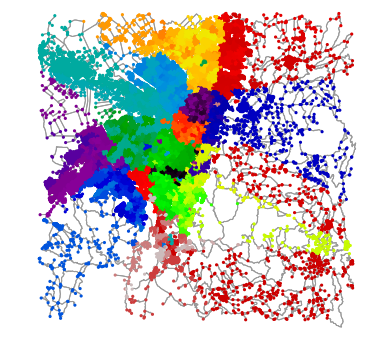

In [68]:
#############################################################################################
# Visualización de la repartición de los nodos por barrios, a través de colores
#############################################################################################

nc = []

ContajeDeNodosPorBarrio = [0] * len(df_LocalBarrios['Barrio'])
colorBarrio = get_color_list(len(df_LocalBarrios['Barrio']), start=0, end=1)

contaje = 0

for i in G_guardado.nodes():
    flag_color = 0

    for j in range(1, len(df_LocalBarrios['Barrio'])):
        if Direccion[j] == G_guardado.node[i]['direccion']:
                nc.append(colorBarrio[j])
                flag_color = 1
                ContajeDeNodosPorBarrio[j] += 1
                break

    if flag_color is 0:
        nc.append('#336699')
    
    contaje += 1
    PrintProgress(contaje, len(G_guardado.nodes()))

fig, ax = ox.plot_graph(G_guardado, node_size=10, node_color=nc, node_zorder=2)

In [41]:
# for i in G_guardado.nodes():
#     for j in range(1, len(df_LocalBarrios['Barrio'])):
#         if BoundingBox[j] is not None:
#             if isInBarrioBBox(BoundingBox, G_guardado, i, j) and 'direccion' in G_guardado.node[i]:
#                 if G_guardado.node[i]['direccion'] is not Direccion[j]:
#                     print("Error: Aparece \"" + G_guardado.node[i]['direccion'] + " en vez de \"" + Direccion[j] + "\"")
#                     print("Coordenadas (", G_guardado.node[i]['y'], ", ", G_guardado.node[i]['x'], ")")
#                 break

NameError: name 'BoundingBox' is not defined

In [66]:
# print(ContajeDeNodosPorBarrio)
# df_LocalBarrios['Barrio']
G_guardado.node[i]['direccion']

'San Bernardino, Bosa, Bogotá, Bogotá DC, Colombia'

In [43]:
print(ContajeDeNodosPorBarrio)

for i in range(1, len(ContajeDeNodosPorBarrio)):
    if ContajeDeNodosPorBarrio[i] > 1000:
        print(Direccion[i], ContajeDeNodosPorBarrio[i], colorBarrio[i], " indice:", i)

NameError: name 'ContajeDeNodosPorBarrio' is not defined

In [44]:
import folium

map = folium.Map(location=[4.5858562, -74.099062],width=750, height=500)
#map.fit_bounds([[4.5858562, -74.099062], [4.593973, -74.088968]])
map

<div style="width:100%;"><div style="position:relative;width:100%;height:0;padding-bottom:60%;"><iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+CjxoZWFkPiAgICAKICAgIDxtZXRhIGh0dHAtZXF1aXY9ImNvbnRlbnQtdHlwZSIgY29udGVudD0idGV4dC9odG1sOyBjaGFyc2V0PVVURi04IiAvPgogICAgPHNjcmlwdD5MX1BSRUZFUl9DQU5WQVMgPSBmYWxzZTsgTF9OT19UT1VDSCA9IGZhbHNlOyBMX0RJU0FCTEVfM0QgPSBmYWxzZTs8L3NjcmlwdD4KICAgIDxzY3JpcHQgc3JjPSJodHRwczovL2Nkbi5qc2RlbGl2ci5uZXQvbnBtL2xlYWZsZXRAMS4yLjAvZGlzdC9sZWFmbGV0LmpzIj48L3NjcmlwdD4KICAgIDxzY3JpcHQgc3JjPSJodHRwczovL2FqYXguZ29vZ2xlYXBpcy5jb20vYWpheC9saWJzL2pxdWVyeS8xLjExLjEvanF1ZXJ5Lm1pbi5qcyI+PC9zY3JpcHQ+CiAgICA8c2NyaXB0IHNyYz0iaHR0cHM6Ly9tYXhjZG4uYm9vdHN0cmFwY2RuLmNvbS9ib290c3RyYXAvMy4yLjAvanMvYm9vdHN0cmFwLm1pbi5qcyI+PC9zY3JpcHQ+CiAgICA8c2NyaXB0IHNyYz0iaHR0cHM6Ly9jZG5qcy5jbG91ZGZsYXJlLmNvbS9hamF4L2xpYnMvTGVhZmxldC5hd2Vzb21lLW1hcmtlcnMvMi4wLjIvbGVhZmxldC5hd2Vzb21lLW1hcmtlcnMuanMiPjwvc2NyaXB0PgogICAgPGxpbmsgcmVsPSJzdHlsZXNoZWV0IiBocmVmPSJodHRwczovL2Nkbi5qc2RlbGl2ci5uZXQvbnBtL2xlYWZsZXRAMS4yLjAvZGlzdC9sZWFmbGV0LmNzcyIgLz4KICAgIDxsaW5rIHJlbD0ic3R5bGVzaGVldCIgaHJlZj0iaHR0cHM6Ly9tYXhjZG4uYm9vdHN0cmFwY2RuLmNvbS9ib290c3RyYXAvMy4yLjAvY3NzL2Jvb3RzdHJhcC5taW4uY3NzIiAvPgogICAgPGxpbmsgcmVsPSJzdHlsZXNoZWV0IiBocmVmPSJodHRwczovL21heGNkbi5ib290c3RyYXBjZG4uY29tL2Jvb3RzdHJhcC8zLjIuMC9jc3MvYm9vdHN0cmFwLXRoZW1lLm1pbi5jc3MiIC8+CiAgICA8bGluayByZWw9InN0eWxlc2hlZXQiIGhyZWY9Imh0dHBzOi8vbWF4Y2RuLmJvb3RzdHJhcGNkbi5jb20vZm9udC1hd2Vzb21lLzQuNi4zL2Nzcy9mb250LWF3ZXNvbWUubWluLmNzcyIgLz4KICAgIDxsaW5rIHJlbD0ic3R5bGVzaGVldCIgaHJlZj0iaHR0cHM6Ly9jZG5qcy5jbG91ZGZsYXJlLmNvbS9hamF4L2xpYnMvTGVhZmxldC5hd2Vzb21lLW1hcmtlcnMvMi4wLjIvbGVhZmxldC5hd2Vzb21lLW1hcmtlcnMuY3NzIiAvPgogICAgPGxpbmsgcmVsPSJzdHlsZXNoZWV0IiBocmVmPSJodHRwczovL3Jhd2dpdC5jb20vcHl0aG9uLXZpc3VhbGl6YXRpb24vZm9saXVtL21hc3Rlci9mb2xpdW0vdGVtcGxhdGVzL2xlYWZsZXQuYXdlc29tZS5yb3RhdGUuY3NzIiAvPgogICAgPHN0eWxlPmh0bWwsIGJvZHkge3dpZHRoOiAxMDAlO2hlaWdodDogMTAwJTttYXJnaW46IDA7cGFkZGluZzogMDt9PC9zdHlsZT4KICAgIDxzdHlsZT4jbWFwIHtwb3NpdGlvbjphYnNvbHV0ZTt0b3A6MDtib3R0b206MDtyaWdodDowO2xlZnQ6MDt9PC9zdHlsZT4KICAgIAogICAgICAgICAgICA8c3R5bGU+ICNtYXBfYjk4Y2FhMzUwMWMwNGU1YWFhZTI1ZjViNTVjZjJkNTEgewogICAgICAgICAgICAgICAgcG9zaXRpb24gOiByZWxhdGl2ZTsKICAgICAgICAgICAgICAgIHdpZHRoIDogNzUwLjBweDsKICAgICAgICAgICAgICAgIGhlaWdodDogNTAwLjBweDsKICAgICAgICAgICAgICAgIGxlZnQ6IDAuMCU7CiAgICAgICAgICAgICAgICB0b3A6IDAuMCU7CiAgICAgICAgICAgICAgICB9CiAgICAgICAgICAgIDwvc3R5bGU+CiAgICAgICAgCjwvaGVhZD4KPGJvZHk+ICAgIAogICAgCiAgICAgICAgICAgIDxkaXYgY2xhc3M9ImZvbGl1bS1tYXAiIGlkPSJtYXBfYjk4Y2FhMzUwMWMwNGU1YWFhZTI1ZjViNTVjZjJkNTEiID48L2Rpdj4KICAgICAgICAKPC9ib2R5Pgo8c2NyaXB0PiAgICAKICAgIAoKICAgICAgICAgICAgCiAgICAgICAgICAgICAgICB2YXIgYm91bmRzID0gbnVsbDsKICAgICAgICAgICAgCgogICAgICAgICAgICB2YXIgbWFwX2I5OGNhYTM1MDFjMDRlNWFhYWUyNWY1YjU1Y2YyZDUxID0gTC5tYXAoCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAnbWFwX2I5OGNhYTM1MDFjMDRlNWFhYWUyNWY1YjU1Y2YyZDUxJywKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIHtjZW50ZXI6IFs0LjU4NTg1NjIsLTc0LjA5OTA2Ml0sCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICB6b29tOiAxMCwKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIG1heEJvdW5kczogYm91bmRzLAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgbGF5ZXJzOiBbXSwKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIHdvcmxkQ29weUp1bXA6IGZhbHNlLAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgY3JzOiBMLkNSUy5FUFNHMzg1NwogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICB9KTsKICAgICAgICAgICAgCiAgICAgICAgCiAgICAKICAgICAgICAgICAgdmFyIHRpbGVfbGF5ZXJfNTExNzNjOGIxMDk4NDZhMWE2Mzc1OGYyMGQ3YzQwZjggPSBMLnRpbGVMYXllcigKICAgICAgICAgICAgICAgICdodHRwczovL3tzfS50aWxlLm9wZW5zdHJlZXRtYXAub3JnL3t6fS97eH0ve3l9LnBuZycsCiAgICAgICAgICAgICAgICB7CiAgImF0dHJpYnV0aW9uIjogbnVsbCwKICAiZGV0ZWN0UmV0aW5hIjogZmFsc2UsCiAgIm1heFpvb20iOiAxOCwKICAibWluWm9vbSI6IDEsCiAgIm5vV3JhcCI6IGZhbHNlLAogICJzdWJkb21haW5zIjogImFiYyIKfQogICAgICAgICAgICAgICAgKS5hZGRUbyhtYXBfYjk4Y2FhMzUwMWMwNGU1YWFhZTI1ZjViNTVjZjJkNTEpOwogICAgICAgIAo8L3NjcmlwdD4=" style="position:absolute;width:100%;height:100%;left:0;top:0;border:none !important;" allowfullscreen web

In [46]:
#############################################################################################
# Obtención de las direcciones de los nodos, con base al barrio con centro más cercano
#############################################################################################

from geopy.geocoders import GoogleV3
geolocator = GoogleV3()

CentroBarrio = [[0 for i in range(2)] for j in range(len(df_LocalBarrios['Barrio']))]
contaje = 0
print('Obtencion de las coordenadas centrales de los barrios:')

for i in range(1, len(df_LocalBarrios['Barrio'])):
    # Contaje de la cantidad de veces que hay una falla en la lectura de información de un barrio
    cont_fail = 0

    if CentroBarrio[i] == [0, 0]:
        # Variable que dice si ya es posible obtener más informaciones geográficas
        flag_access = 0

        # Obtener localización a traves de reverse geocoding con las coordenadas de los nodos
        while flag_access == 0:
            try:
                location = geolocator.geocode(Direccion[i])
                CentroBarrio[i] = location[1]
                flag_access = 1
            except:
                if cont_fail >= 5:
                    location = None
                    break

                # Esperar un poco
                time.sleep(1)
                cont_fail += 1

    contaje += 1
    PrintProgress(contaje, len(df_LocalBarrios['Barrio']))

contaje = 0
print("\nAsociacion de las direcciones a los nodos:")

for i in G_guardado.nodes():
    min = float(\inf\)

    for j in range(1, len(df_LocalBarrios[\Barrio\])):
        if DistEucl((G_guardado.node[i]['y'], G_guardado.node[i]['x']), CentroBarrio[j]) < min:
            min = DistEucl((G_guardado.node[i]['y'], G_guardado.node[i]['x']), CentroBarrio[j])
            Direccion_Cercana = Direccion[j]

    G_guardado.node[i]['direccion'] = Direccion_Cercana
    contaje += 1
    PrintProgress(contaje, len(G_guardado.nodes()))

In [47]:
# Cálculo de la distancia euclidea entre los puntos "x" y "y"
def DistEucl(x, y):
    distance = math.sqrt((x[0] - y[0]) ** 2 + (x[1] - y[1]) ** 2)
    return distance

In [48]:
CentroBarrio = [[0 for i in range(2)] for j in range(10)]
CentroBarrio[0] = location[1]
print(CentroBarrio)

[(4.5899204, -74.0950109705037), [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]]


In [60]:
#############################################################################################
# Leer archivo de Excel con la repartición de la población por estratos, en cada localidad
#############################################################################################

script_dir = sys.path[0]
xlsx_path = os.path.join(script_dir, '/Users/AndreCNF/OneDrive/UNAL/Optimización y Control en Sistemas Distribuidos en Red/Proyecto/data/DICE014-Estratos.xlsx')
df_Estratos = pd.read_excel(xlsx_path, sheetname="11Corregido", header=0)
print(df_Estratos.head())
            
# [TODO]: Leer datos de tráfico (excel de información de tráfico y el de seguridad)
# [TODO]: Poner pesos en los edges que reflitan las cosas de seguridad y de tráfico

  COD_LOC  NOM_LOC  COD_UPZ                    NOM_UPZ  Personas Sin estrato  \
0       1  Usaquén      1.0  Paseo de los Libertadores                 207.0   
1       1  Usaquén      9.0                   Verbenal                1010.0   
2       1  Usaquén     10.0                   La Uribe                 137.0   
3       1  Usaquén     11.0        San Cristobal Norte                3053.0   
4       1  Usaquén     12.0                    Toberin                 151.0   

   Personas 1. Bajo - bajo  Personas 2. Bajo  Personas 3. Medio - bajo  \
0                      0.0            2300.0                       0.0   
1                   6166.0           20382.0                   65700.0   
2                      7.0             594.0                   11600.0   
3                  17481.0            5096.0                   48292.0   
4                      0.0             484.0                   16578.0   

   Personas 4. Medio  Personas 5. Medio - Alto  Personas 6. Alto  \
0     

In [249]:
#############################################################################################
# Guardar en variables los porcentajes de personas de estratos bajos por barrio
#############################################################################################

closest = None
PorcEstratoBajo = [0 for i in range(len(df_LocalBarrios['Barrio']))]
LocPorcEstratoBajo = [0 for i in range(len(Localidad)+1)]

for i in range(1, len(df_Estratos['NOM_UPZ'])-2):
    flag_match = 0

    for j in range(1, len(df_LocalBarrios['Barrio'])):
        if similar(Direccion[j].split(',')[0], df_Estratos['NOM_UPZ'][i]) > 0.8 and similar(Direccion[j].split(',')[1], df_Estratos['NOM_LOC'][i]) > 0.8:            
            flag_match = 1
            PorcEstratoBajo[j] = (df_Estratos['Personas Sin estrato'][i] + df_Estratos['Personas 1. Bajo - bajo'][i] + 0.5 * df_Estratos['Personas 2. Bajo'][i]) / df_Estratos['Total Personas'][i]
            break

for k in range(1, len(Localidad)+1):
    LocPorcEstratoBajo[k] = (df_Estratos[df_Estratos['NOM_LOC']==Localidad[k]]['Personas Sin estrato'].sum() + \
                            df_Estratos[df_Estratos['NOM_LOC']==Localidad[k]]['Personas 1. Bajo - bajo'].sum() + \
                            0.5 * df_Estratos[df_Estratos['NOM_LOC']==Localidad[k]]['Personas 2. Bajo'].sum()) / \
                            df_Estratos[df_Estratos['NOM_LOC']==Localidad[k]]['Total Personas'].sum()

In [321]:
###################################################################################################
# Añadir información de los porcentajes de personas de estratos bajos a la inseguridad de los nodos
###################################################################################################

for i in G_guardado.nodes():
    for j in range(1, len(Direccion)):
        if G_guardado.node[i]['direccion'] == Direccion[j]:
            if PorcEstratoBajo[j] is not 0:
                G_guardado.node[i]['inseguridad'] += 15 * PorcEstratoBajo[j]
            else:
                for k in range(1, len(Localidad)+1):
                    if unidecode(Localidad[k]) in G_guardado.node[i]['direccion'] or Localidad[k] in G_guardado.node[i]['direccion']:
                        G_guardado.node[i]['inseguridad'] += 15 * LocPorcEstratoBajo[k]

In [95]:
# Calcular porcentaje de similitud entre dos frases
from difflib import SequenceMatcher

def similar(a, b):
    return SequenceMatcher(None, a, b).ratio()

In [319]:
for i in range(1, len(Localidad)):
    print(Localidad[i], LocPorcEstratoBajo[i])
    
print("\nBarrios:")

contaje = 1

for i in range(1, len(Direccion)):
    print(Direccion[i], PorcEstratoBajo[i])
    contaje += 1
    
    if contaje >= 30:
        break

Antonio Nariño 0.0467190486303
Barrios Unidos 0.0155530175677
Bosa 0.534425509728
Chapinero 0.115904707799
Ciudad Bolívar 0.776924916046
Engativá 0.146701757214
Fontibón 0.11798767884
Kennedy 0.278752172903
La Candelaria 0.311174618953
Los Mártires 0.0455497007945
Puente Aranda 0.0351859805526
Rafael Uribe Uribe 0.3604610516
San Cristóbal 0.468774936005
Santa Fe 0.422826907167
Suba 0.207924973389
Sumapaz 0.689117929051
Teusaquillo 0.00436612704065
Tunjuelito 0.30017885188
Usaquén 0.0996876401986

Barrios:
Ciudad Berna, Antonio Narino, Bogotá, Bogotá DC, Colombia 0
Ciudad Jardin Sur, Antonio Narino, Bogotá, Bogotá DC, Colombia 0
Eduardo Frei, Antonio Narino, Bogotá, Bogotá DC, Colombia 0
La Fragua, Antonio Narino, Bogotá, Bogotá DC, Colombia 0
La Fraguita, Antonio Narino, Bogotá, Bogotá DC, Colombia 0
La Hortua, Antonio Narino, Bogotá, Bogotá DC, Colombia 0
Policarpa, Antonio Narino, Bogotá, Bogotá DC, Colombia 0
Restrepo, Antonio Narino, Bogotá, Bogotá DC, Colombia 0.0327866737203
Rest

In [324]:
###################################################################################################
# Calcular máximo y promédio de la inseguridad
###################################################################################################

promedio_insg = 0
max_insg = 0

for i in G_guardado.nodes():
    promedio_insg += G_guardado.node[i]['inseguridad']
    
    if G_guardado.node[i]['inseguridad'] > max_insg:
        max_insg = G_guardado.node[i]['inseguridad']
        
promedio_insg = promedio_insg / len(G_guardado.nodes())
print("Max = ", max_insg, "; Promedio: ", promedio_insg)

Max =  47.5501431718 ; Promedio:  12.2990332703


In [242]:
#############################################################################################
# Leer archivo de Excel sobre la densidad poblacional, que permite inferir el tráfico
#############################################################################################

script_dir = sys.path[0]
xlsx_path = os.path.join(script_dir, '/Users/AndreCNF/OneDrive/UNAL/Optimización y Control en Sistemas Distribuidos en Red/Proyecto/data/Información trafico_relevante.xlsx')
df_DensTrafico = pd.read_excel(xlsx_path, header=0)
print(df_DensTrafico.head())

                                           Indicador  FechaHora  \
0  DENSIDAD POBLACIONAL POR KM2 (kilómetros cuadr... 2015-01-01   
1  DENSIDAD POBLACIONAL POR KM2 (kilómetros cuadr... 2015-01-01   
2  DENSIDAD POBLACIONAL POR KM2 (kilómetros cuadr... 2015-01-01   
3  DENSIDAD POBLACIONAL POR KM2 (kilómetros cuadr... 2015-01-01   
4  DENSIDAD POBLACIONAL POR KM2 (kilómetros cuadr... 2015-01-01   

  geo_padre_nombre geografia_nombre         Mes  NumeroMes  \
0     BOGOTÁ, D.C.   ANTONIO NARIÑO  2015 Enero          1   
1     BOGOTÁ, D.C.   BARRIOS UNIDOS  2015 Enero          1   
2     BOGOTÁ, D.C.             BOSA  2015 Enero          1   
3     BOGOTÁ, D.C.        CHAPINERO  2015 Enero          1   
4     BOGOTÁ, D.C.   CIUDAD BOLIVAR  2015 Enero          1   

                                              fuente  Nombre_Malla  \
0  SECRETARÍA DISTRITAL  DE PLANEACIÓN DANE PROYE...           NaN   
1  SECRETARÍA DISTRITAL  DE PLANEACIÓN DANE PROYE...           NaN   
2  SECRETARÍA 

In [246]:
print(df_DensTrafico['Localidad'])

print("\n")

for i in range(1, len(Localidad)+1):
    print(Localidad[i])

0         Antonio Nariño
1         Barrios Unidos
2                   Bosa
3              Chapinero
4         Ciudad Bolivar
5               Engativa
6               Fontibon
7                Kennedy
8          La Candelaria
9           Los Martires
10         Puente Aranda
11    Rafael Uribe Uribe
12         San Cristobal
13               Santafe
14                  Suba
15               Sumapaz
16           Teusaquillo
17            Tunjuelito
18               Usaquen
19                  Usme
Name: Localidad, dtype: object


Antonio Nariño
Barrios Unidos
Bosa
Chapinero
Ciudad Bolívar
Engativá
Fontibón
Kennedy
La Candelaria
Los Mártires
Puente Aranda
Rafael Uribe Uribe
San Cristóbal
Santa Fe
Suba
Sumapaz
Teusaquillo
Tunjuelito
Usaquén
Usme


In [339]:
###################################################################################################
# Añadir información de las densidades poblacionales (tráfico) de cada localidad a los nodos
###################################################################################################

for i in G_guardado.nodes():
    if 'trafico' not in G_guardado.node[i]:
        for k in range(1, len(Localidad)+1):
            if unidecode(Localidad[k]) in G_guardado.node[i]['direccion'] or Localidad[k] in G_guardado.node[i]['direccion']:
                G_guardado.node[i]['trafico'] = df_DensTrafico['Valor'][k-1]

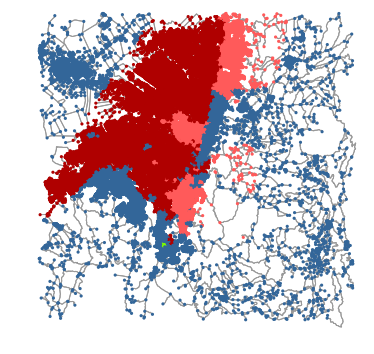

In [342]:
nc = []

# Limites de Bogotá
#x_max = 4.84
#x_min = 4.4
#y_max = -74
#y_min = -74.3

# Recta occidente
def yo(x):
    return 0.659013 * x + (-77.2722)

# Recta norte
def yn(x):
    return -5.87413 * x + (-45.6912)

# Recta norte
def yor(x):
    return 0.200466 * x + (-74.926)

# Recta sur
def ys(x):
    return -22.0299 * x + (24.2968)

for i in G_guardado.nodes():
    if G_guardado.node[i]['x'] < yor(G_guardado.node[i]['y']) and G_guardado.node[i]['x'] < yn(G_guardado.node[i]['y']) and G_guardado.node[i]['x'] > yo(G_guardado.node[i]['y']) and G_guardado.node[i]['x'] > ys(G_guardado.node[i]['y']):
        if G_guardado.node[i]['trafico'] > 11000:
            nc.append('#AF0000')
        elif G_guardado.node[i]['trafico'] > 6000:
            nc.append('#FF5A5A')
        elif G_guardado.node[i]['trafico'] < 2000:
            nc.append('#7CFC00')
        else:
            nc.append('#336699')
    else:
        nc.append('#336699')

fig, ax = ox.plot_graph(G_guardado, node_size=10, node_color=nc, node_zorder=2)
fig.savefig('GrafoBogotaTrafico.png', format='png', dpi=500)

In [337]:
# G_guardado.node[i]
'trafico' in G_guardado.node[i]

False

In [334]:
# x = Direccion[2]

for i in G_guardado.nodes():
    # if 'Rafael Uribe' in G_guardado.node[i]['direccion']:
    #     G_guardado.node[i]['direccion'] = G_guardado.node[i]['direccion'].split(',')[0] + \
    #                                       ", Rafael Uribe Uribe, Bogotá, Bogotá DC, Colombia"
    if 'Candelaria' in G_guardado.node[i]['direccion']:
        G_guardado.node[i]['direccion'] = G_guardado.node[i]['direccion'].split(',')[0] + \
                                          ", La Candelaria, Bogotá, Bogotá DC, Colombia"

In [33]:
###################################################################################################
# Asignación de pesos a los edges/calles, con base en distancias, inseguridad y trafico
###################################################################################################

for i, j in G_guardado.edges():
    G_guardado.edge[i][j][0]['peso'] = 1 * G_guardado.edge[i][j][0]['length'] + \
                                    1 * ((G_guardado.node[i]['inseguridad'] + G_guardado.node[j]['inseguridad']) / 2) \
                                    + (1 / 5000) * ((G_guardado.node[i]['trafico'] + G_guardado.node[j]['trafico']) / 2)

contaje = 1

for i, j in G_guardado.edges():
    print(G_guardado.edge[i][j])
    contaje += 1
    
    if contaje >= 5:
        break

In [ ]:
# plot the street network with folium
graph_map = ox.plot_graph_folium(G_guardado, popup_attribute='name', edge_width=2)

# save as html file then display map as an iframe
filepath = 'data/graph.html'
graph_map.save(filepath)
IFrame(filepath, width=600, height=500)

In [34]:
contaje = 1

for i, j in G_guardado.edges():
    print(G_guardado.edge[i][j])
    contaje += 1
    
    if contaje >= 5:
        break

{0: {'highway': 'residential', 'osmid': 42285205, 'length': 30.937445805711903, 'peso': 42.004715498706496, 'name': 'Carrera 110D', 'oneway': False}}
{0: {'highway': 'residential', 'osmid': 42285205, 'length': 40.016607838421422, 'peso': 51.083877531416015, 'name': 'Carrera 110D', 'oneway': False}}
{0: {'highway': 'residential', 'osmid': 91334814, 'length': 66.416654464523802, 'peso': 77.483924157518388, 'geometry': <shapely.geometry.linestring.LineString object at 0x12ce38c88>, 'name': 'Calle 64C', 'oneway': False}}
{0: {'highway': 'residential', 'osmid': 30784765, 'length': 47.049007863743554, 'peso': 58.116277556738147, 'name': 'Carrera 90 Bis', 'oneway': False}}


In [44]:
###################################################################################################
# Datos de teoria de grafos, aplicado a Bogotá
###################################################################################################

# calculate basic and extended network stats, merge them together, and display
stats = ox.basic_stats(G_guardado)
# extended_stats = ox.extended_stats(G_guardado, ecc=True, bc=True, cc=True)
# for key, value in extended_stats.items():
#     stats[key] = value
# pd.Series(stats)
# 
# 
# unpack dicts into individiual keys:values
# stats = ox.basic_stats(G_guardado)
# for k, count in stats['streets_per_node_counts'].items():
#     stats['int_{}_count'.format(k)] = count
# for k, proportion in stats['streets_per_node_proportion'].items():
#     stats['int_{}_prop'.format(k)] = proportion
# 
# # delete the no longer needed dict elements
# del stats['streets_per_node_counts']
# del stats['streets_per_node_proportion']
# 
# # load as a pandas dataframe
# pd.DataFrame(pd.Series(stats)).T

print(stats)
# print(extended_stats)

{'streets_per_node_proportion': {0: 0.0, 1: 0.13320974280513273, 2: 0.001675172821996136, 3: 0.6275085713009392, 4: 0.23055961940073486, 5: 0.005394056486827558, 6: 0.0014741520833565997, 7: 0.00011167818813307572, 8: 6.700691287984543e-05}, 'edge_length_avg': 84.578449080237391, 'street_density_km': None, 'street_segments_count': 133394, 'edge_length_total': 20035027.596575715, 'self_loop_proportion': 0.0009667301303185987, 'n': 89543, 'street_length_avg': 85.39499040654691, 'streets_per_node_avg': 2.9784572775091296, 'circuity_avg': 1.0765549870965372, 'count_intersections': 77615, 'intersection_density_km': None, 'k_avg': 5.290888176630222, 'm': 236881, 'streets_per_node_counts': {0: 0, 1: 11928, 2: 150, 3: 56189, 4: 20645, 5: 483, 6: 132, 7: 10, 8: 6}, 'street_length_total': 11391179.350290919, 'node_density_km': None, 'edge_density_km': None}


In [50]:
###################################################################################################
# Dibujo de una ruta entre Virrey y Monserrate, con los pesos ya aplicados
###################################################################################################
# La ruta no va directa, se va un poco por fuera para evitar la inseguridad de ciertas zonas de 
# Chapinero (al menos es lo que parece)

punto_partida = (4.675348, -74.058797)
punto_llegada = (4.604647, -74.060380)
origin_node = ox.get_nearest_node(G_guardado, punto_partida)
destination_node = ox.get_nearest_node(G_guardado, punto_llegada)

# find the route between these nodes then plot it
route = nx.shortest_path(G_guardado, origin_node, destination_node, weight='peso')
fig, ax = ox.plot_graph_route(G_guardado, route)
fig.savefig('GrafoBogotaRutaConPesos.png', format='png', dpi=500)